In [1]:
!pip install -U spacy
!python -m spacy info


============================== Info about spaCy ==============================

spaCy version    3.2.4                         
Location         /usr/local/lib/python3.7/dist-packages/spacy
Platform         Linux-5.4.144+-x86_64-with-Ubuntu-18.04-bionic
Python version   3.7.13                        
Pipelines        en_core_web_sm (3.2.0)        



In [2]:
!python -m spacy download en_core_web_sm

     |████████████████████████████████| 13.9 MB 4.5 MB/s 
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')


In [3]:
import re
import pandas as pd
import bs4
import requests
import spacy
from spacy import displacy
nlp = spacy.load('en_core_web_sm')

from spacy.matcher import Matcher 
from spacy.tokens import Span 

import networkx as nx

import matplotlib.pyplot as plt
from tqdm import tqdm

pd.set_option('display.max_colwidth', 200)
%matplotlib inline

In [4]:
candidate_sentences = pd.read_csv("sents_en2.csv")
candidate_sentences.shape

(20027, 1)

In [48]:
def get_entities(sent):
  if type(sent) == str:
    # sent = sent.split('.')[0]
    ## chunk 1
    ent1 = ""
    ent2 = ""

    prv_tok_dep = ""    # dependency tag of previous token in the sentence
    prv_tok_text = ""   # previous token in the sentence

    prefix = ""
    modifier = ""

    #############################################################
    
    for tok in nlp(sent):
      ## chunk 2
      # if token is a punctuation mark then move on to the next token
      if tok.dep_ != "punct":
        # check: token is a compound word or not
        if tok.dep_ == "compound":
          prefix = tok.text
          # if the previous word was also a 'compound' then add the current word to it
          if prv_tok_dep == "compound":
            prefix = prv_tok_text + " "+ tok.text
        
        # check: token is a modifier or not
        if tok.dep_.endswith("mod") == True:
          modifier = tok.text
          # if the previous word was also a 'compound' then add the current word to it
          if prv_tok_dep == "compound":
            modifier = prv_tok_text + " "+ tok.text
        
        ## chunk 3
        if tok.dep_.find("subj") == True:
          ent1 = modifier +" "+ prefix + " "+ tok.text
          prefix = ""
          modifier = ""
          prv_tok_dep = ""
          prv_tok_text = ""      

        ## chunk 4
        if tok.dep_.find("obj") == True:
          ent2 = modifier +" "+ prefix +" "+ tok.text
          
        ## chunk 5  
        # update variables
        prv_tok_dep = tok.dep_
        prv_tok_text = tok.text
    #############################################################

    return [ent1.strip(), ent2.strip()]
  else:
    return ['','']

In [49]:
entity_pairs = []

for i in tqdm(candidate_sentences["sentence"]):
  entity_pairs.append(get_entities(i))

100%|██████████| 20027/20027 [05:31<00:00, 60.42it/s]


In [51]:
entity_pairs[0]

['', 'Rural Warsaw']

In [52]:
def get_relation(sent):
  try:
    if type(sent) == str:
      # sent = sent.split('.')[0]
      doc = nlp(sent)
      print(doc)

      # Matcher class object 
      matcher = Matcher(nlp.vocab)

      #define the pattern 
      pattern = [{'DEP':'ROOT'}, 
                {'DEP':'prep','OP':"?"},
                {'DEP':'agent','OP':"?"},  
                {'POS':'ADJ','OP':"?"}] 
      
      matcher.add("matching_1",[pattern]) 
      matches = matcher(doc)
      k = len(matches) - 1

      span = doc[matches[k][1]:matches[k][2]] 

      return(span.text)
    else:
      return ''
  except:
    return ''

In [53]:
# relations = [get_relation(i) for i in tqdm(candidate_sentences['sentence'])]
relations = []
for i in tqdm(candidate_sentences['sentence']):
  rel = get_relation(i)
  relations.append(rel)


  0%|          | 12/20027 [00:00<06:13, 53.61it/s]

Łukasz Abgarowicz, born18 x 1949 in Bydgoszcz.A graduate of the Rural School of the Rural School in Warsaw, leaveZootechnical (1972).
In the third 1968 co-organizer of the rally and strike for the Warsaw School of Rural School (Agricultural Academy).
1972–1988 aspirant/coach of racing horses of the State Horse Racing Tracks in Warsaw.
From IX 1980 in "S";prey.Wheels;In VI 1981 Delegate on and W River Mazovia, Member of ZR, IX / X Delegate on and Commission Map;prey.Section of agricultural workers of the Mazovia region.
After 13 XII 1981, the co-worker of Underground Radio "S" in Warsaw, co-organizer of interregional communication of underground structures "S".Repeatedly stopped and interrogated.1988-1989 member of TZR Mazowsze.1989-1990 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" in Warsaw.1988-1990 Plenipotentiary of the Management Board for Development of Inar in Warsaw, at the same time 1988-1999 President of the Board Warnet Sp.from

  0%|          | 18/20027 [00:00<06:24, 52.02it/s]

Leon Abramowicz, born22 III 1947 in Pleszew.He graduated from the main vocational school there (1963), Tokarz.
1961-1982 Factory worker of Tokar Sunas Ponar-Wrocław Department 3 in Pleszew (from and 1982 Pleszew Fabryka Fabrykówek).
26-28 VIII 1980 Participant of the strike in the Ponar;From the IX 1980 in "S", Vice-President of the Department Committee at the Work Department, Members Members National Professional Needle, trade unions "Solidarity" in Pleszew.
After 13 XII 1981 activist talkisja "S" in Ponarze / PFO; Together with his mother, also the employee of the plant, the Kolporter of Underground Scriptures, among others "Tygodnik Mazowsze", "from day to day" and "Solidarity fighting" and occasional prints (receiving from Kryspin Kubanki and priest Janusz Kulbarsch); 13 V 1982 Strike participant in PFO, 14 V 1982 detained and interrogated in KM MO in Pleszewo; fired. In connection with the participation in the strike, brought together with Władysław Ignaszak before the college for

  0%|          | 30/20027 [00:00<06:22, 52.25it/s]

Wacław Stanisław Adamczak, born6 IX 1948 in Poznań.A graduate of the University of them.Adam Mickiewicz in Poznan, leaveBiology and Earth Sciences (1973).
1958-1962 In the Association of Fame Scouting, 1968-1973 in a trade union, trade associations of the artists of Polish scenes.1966-1967 Technical assistance.In the State Hydrologiczne-Meteorological Institute in Poznań, 1974-1975 trainee-railwayman at the Station Poznań Główny, 1975-1976 Referendar at the station of Luboń near Poznań, 1976-1977 Trade and transport instructor in the District Directorate of KP in Poznań, 1977-1982 Senior (Degree) Instructor on the Western Commercial Board of Western DKomite Civic DCometate with the Chairman of Professional Nevils, Trade Unions "Solidarity" Parliamentary Club in Poznań.
From IX 1980 in "S", Organizer of the Founding Committee at the station of Luboń near Poznań, co-organizer of the Founding Committee at the West Central.DKomite civic with chairman of professional nyes, trade unions "Sol

  0%|          | 45/20027 [00:00<05:39, 58.88it/s]

From VI 1981 Member COMMISSION COMMISSION "S", responsible for contacts between the Work Department and the Management Board of the Gdańsk Region "S".
13 XII 1981 A strike participant in the Gdańsk Shipyard. Lenin, from 14 XII 1981 The connector between the National Strike Committee and ZR "S" in Lublin, 14-15 XII 1981 contacted the Regional Strike Committee in Wsk Świdnik. On December 15, 1981, he tried to contact the Chairman of the Department Committee "S" in sugar factory Lublin, where the Occupational Strike was organized - the strike bulletins of the Regional Strike Committee in Lublin were organized. 15 XII 1981 detained, 17 XII 1981 arrested and embedded in AŚ in Lublin, 12 and 1982 convicted by the court of the Warsaw District of the Military District in Warsaw - a flat-rate resort in Lublin for a 4-year imprisonment and 3 years imprisonment, covering the costs of proceedings and paying 4,200 zlotys as a court fee. From 10 II 1982 embedded in ZK in Łęczyca. On August 2, 1983, 

  0%|          | 57/20027 [00:01<06:00, 55.46it/s]

Author of reportage books;Co -author Vademecum '' Round table.Who is who."Solidarity".Opposition.Biographies, statements '' (1989).
Antoni Adamiuk, priest, born18 XII 1913 in the USA, d.25 and 2000. A graduate of the University of John Kazimierz in Lviv, direction of philosophy, theology (1939).From VII 1914 together with family in Poland, in the village of Makimówka near. Zalor (currently Ukraine).
In VI 1939, priestly ordination from the hands of ArchbishopBolesław Twardowski, 1939-1945 in the parish in Busko, served the faithful of Latin and Greek rites (his family was sent to Siberia).From VII 1945, a catechist at the Junior High School and High School in Głubczyce, pastor in the parishes of Szyon and Klisino, from 1946 dean of the Głubczyce deanery.After October 1956, a religion teacher, then a diocesan consultor;from 1961 Chancellor of the Opole Bishop's Curia.Professorpedagogy and catechetics at the Major Seminary in Nysa, organizer of catechetical courses;from VI 1970 Opole aux

  0%|          | 68/20027 [00:01<07:19, 45.38it/s]

8 V 1982 Interned, detained in the KW MO KW, from 9 V 1982 in Axle. Isolation in the mountains and in Strzebelinka, 27/1982 released. After leaving the co-founder of the intercommune underground organization, the Academic Movement of Resistance in Wrocław, founder of the underground letter "Akademia Rolniczao", author, printer and organizer of publishing activity (with Wojciech Tadajewski, Małgorzata Corner, Wojciech Klukowski, Hanna Pawłowska, Mariusz Wróblewski, Małgorzata Krogulska), Rules and Printer "Solidarity newsletter" (with Piotr Zalewski). In November 1984, during the military service, he refused to take an oath, from 17 November 1984 held in KW MO in Koszalin, 8 XII 1984 sentenced by the judgment of the Garrison Court in Szczecin for 2.5 years in prison (judgment maintained by a military court in Koszalin and the Military Chamber of SN In Warsaw), detained in AŚ at ZK in Szczecin, then in ZK in Stargard Szczeciński, 8 IX 1986 released. After leaving the WIP movement activis

  0%|          | 78/20027 [00:01<07:04, 46.97it/s]

1989-1991 Gdańsk activist Committee Civic Committee with chairman of the professional nzniazek, trade unions "Solidarity" "S" and the structure of the provincial committees.1989-1998 Assistant at the Faculty of Law and Administration of UG;1990-1993 Vice-Rector for Student;1991-1998 A member of the Department Committee "S" on UG.1990-1994 Councilor of Gdańsk, 1990-1991 Vice-President of the Self-Government Sejm Gdańsk Province;1994-1998 Chairman of the City Council of Gdańsk;From 1998, the Mayor of Gdańsk.1989-1991 A member of the Gdańsk Political ClubLech Bądkowski;in L. 90. In a conservative party, the following (grade) in SKL;from 2001 in PO.From 1991, a member of the Kashubian-Pomeranian Association.
Decorated with the Cross Pro Ecclesia et Pontifice (2001), the Silver Cross of Merit (2003), Silver Medal Meritized Culture Gloria Artis (2005), Knight Cross Order of Poland Rebirth (2010), Bachelor Honor Legia (2012), decorated with the Cross of Freedom and Solidarity (2014).
Piotr Ad

  0%|          | 85/20027 [00:01<06:20, 52.39it/s]

1962-1964 Assistant to leaveRights University of Warsaw and apprentice in the Provincial Court in Warsaw, 1964-1965 Legal adviser in the Municipal Communication Plant 1966-1970 Appendix in the Adwokacki team No. 23, 1970-1997 ADTIKAT TAM.
1983-1989 was in the workplace of the underground publishing house on the site of co-operators in the whole country (including Warsaw, Pułtusk, Minsk Mazowiecki, Stalowa Wola, Sieradz, Koszalin);Author of legal articles in underground magazines ("Tygodnik Mazowsze", "Right and Lewanger");Defender in political processes, includingAdam Borowski (Process of MRad Krajow), Seweryn Jaworski, Krzysztof Wolfa, Piotr Israzewa, and in 240 cases of people exempt from work for trade union and in cases of demonstration participants;Co-worker of the Commission's intervention and the rule of law "S".
1997–2009 Advocate at the Advocate Team No. 2 in Warsaw.He has been running his own law firm since 2010.
Decorated with the Commander's Cross of the Order of Polonia Re

  0%|          | 96/20027 [00:01<07:52, 42.20it/s]

After 13 XII 1981, wanted. 14 XII 1981 with Paul and Maciej Urbanowiczami, M. arrived from the headquarters of the Provincial Board "S" independent self-governing trade union of Individuals of Indywidnal "Solidarity" Wielkopolska and hidden trade union documents, library, paper, typewriter (used later . in the underground edition of "Wielkopolski Observer"); XII 1981 / and 1982 participant in the collection of signatures under the Protest List to the Sejm POLSKI People's Republic against is a war, the organizer of legal aid for interned, arrested; until 1989 co-founder, co-organizer and co-editor of the underground writings of the "Wielkopolski Observer" (with Bogusław Bakuła, Ryszard Czaparą, Krystyna and Ryszard Krynicki, M. arrived, Piotr Kasznia, Piotr Piotrowski, Ewa Kobylińska, Maciej Rusinka), in VI 1982 prepared and edited No. "OW" Fri '' What to do if you are stopped, arrested, convicted '(high-speed re-edition in Gdansk), V-VI 1982 representative of "OW" to contacts with Bogd

  1%|          | 111/20027 [00:02<06:23, 51.93it/s]

Stanisław Adamski, born on25 April 1949 in Sokołów Podlaski.He graduated from the Basic Vocational School at ul.Słowackiego in Warsaw (1966).
1966-1982 A worker of municipal communication plants may be released for trade union activities.
In the 7th 1980, a strike participant in MZK.From the IX 1980 in "S", a member of the Founding Committee in Zajesinia, 1980-1981 member of the Fire Service Committee, in 1981 a member of the Audit Committee.
13 XII 1981 - 1985 member Physisja Fire Fire;treasurer;In 1982, the printer "Mermaid", Kolporter, 1 V 1982 strike participant.1982-1989 repeatedly released from work under the SB chic.1985-1986 Employee factory of concrete components in Warsaw.
In 1989, he restored to work, 1989-2004 a MZK employee.From 2004, pre-retirement benefit.
Krystyna afeltowicz, born15 and 1951 in Bydgoszcz, d.11 V 2005 in Olsztyn.A graduate of the Nicolaus Copernicus University in Toruń, Faculty of Law (1972).1975-1977 Judicial application.
1964-1972 A AZS member, a multi

  1%|          | 117/20027 [00:02<06:24, 51.75it/s]

On December 13, 1981, in the apartment of his mother Janina Aleksandrzak, a meeting of the leading activists of the "S" region took place (including Arkadiusz Fabjanowski, Maria Jaśkiewicz, Małgorzata and Andrzej Węgrzyn, Sławomir Wichliński, Jarosław Wilner, Andrzej Wojkowski), during which, among others The decision was made to issue an underground press and leaflets. 1982-1983 activist of the Local Provisional Coordination Committee (including with A. Fabjanowski, Andrzej Furmaraga, M. Jaśkiewicz, Jan Marciniak, Antoni Pietkiewicz, Henry Piwowarczyk, A. Węgrzyn, S. Wichlinski, J. Wilner, A. Wojkowski) ; Kolporter, printer of underground publications; in I 1982 (with A. Furmaraga and J. Wilner) he printed in his apartment No. 2 the magazine "to the society to think"; 1983-1984 a collaborator of the interregional coordination commission Kalisz-Konin-Sieradz, organizer of the distribution of "Our Solidarity". In VII 1982 dismissed from work, 1982-1991 employed at the Metalwag Labor Coo

  1%|          | 128/20027 [00:02<07:57, 41.69it/s]

1989-1991 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITIES "Solidarity" in Krakow, in 1989 Before the elections, collected signatures under the list of candidates Committee Civic Committee with the chairman of the professional nicheon, trade unions "Solidarity", conducted information campaigns.1989-1995 in "S".1992 co-founder, harder (grade) coordinator of the Kraków Foundation Hamlet, in 1994 Organizer (as part of the Krakow Hamlet Foundation) social company in Krakow employing a psychological person, in 1995, the organizer, harder (degree) Head of the Environmental Self-help home in Krakow, 1997-2004 GallerySienna art 5 in Krakow promoting the work of mentally ill people, in 2004 - apartments protected in Krakow for mentally disabled people.
Decorated with the Golden Cross of Merit (2013), Laureate of the Polcul Foundation (1997) Award.
1977-1978 Developed by WatchIII KW Mo in Krakow as part of a crypt sauce.Autograph;1980-1989 by outz.III KW MO / WUSW within SO K

  1%|          | 135/20027 [00:02<06:59, 47.41it/s]

Mariusz Ambroziak, born24 x and 1969 in Sochaczew.He graduated from Technical School in the Vocational School Complex.Wilhelma Piecka in Ursus (1990).
1984-1990 Ursus mechanical workers.
From 1986 in "S";A member of the Physisa Physisa;Kolporter press and underground publishing houses, co-organizer of strikes and protests in their workplace.
1989-1990 Chairman Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" in Ursus.From 1989, a member of the Bureau and the Secretary of the Factory Commission, Delegate on the River Mazowsze, 1989-1993 member of ZR and the Secretary of the Bureau of ZR.1990-1993 Delegate to the Magnify Commission.1991-1993 Chairman of the Young Section in the Mazovian Region, in 1992 co-founder of the National Young Section.1994-1995 Member of the Youth Council at the President of Lech Wałęsa.1996-2001 Member of ZCHN, 1997-2001 MP Rzeczpospolita Polska from the AWS list.1997-1999 Advisor of the Secretary of the Social Committe

  1%|          | 147/20027 [00:03<06:49, 48.54it/s]

From IX 1980 in "S", Proxy for the development of a new act on higher education.
13 XII 1981 interned in the axisIsolation in Warsaw-Białołęka, then in Jaworz and Darłówek, 3/1982 released.1983-1989 A member of the Social Science Committee (from 1988 in the General Council of the SKN) and educational-culture-science structure (window);In 1985, one of the creators of the independent report '' Poland 5 years after August '', co-worker of underground publishing houses (including a circle) and letters (including "criticism").In 1989, the participant of the round table in the subassembly for science, education and education.
1989-1990 Deputy Minister of Science and Higher Education, creator of the Scientific Research Committee;From 1991, an employee of the Institute of Philosophy and Sociology Polish Academy of Sciences;Organizer and from 1992 directorSocial Sciences of IFiS;lecturer at foreign universities, participant in international research projects (including Stanford University, Yale

  1%|          | 153/20027 [00:03<06:49, 48.51it/s]

1989-1991 Own economic activity, 1991-1992 Senior (grade) Specialist in the Ministry of National Defense.In 1985 co-founder of PPN, 1992-1999 political activist, includingIn the movement of the third Polish-Lithuanian Commonwealth, the movement for the Polish-Lithuanian Commonwealth.Since 1999 he has been running his own business.
10 IX 1986 - 16 x 1989 Developed by p. V Rusw in Gdynia as part of SOR KRPT.Five.
Tomasz Kazimierz Andrysiak, born22 VI 1970 in Szczecin.He graduated from the IX High School Tamz (1993).
From 1984 Kolporter '' Little Conspirator 'and In. underground and emigration publications (circle, London pulse) in the environment of Szczecin high schools; 1985-1988 Organizer, Coordinator Kolporteż, Kolporter Underground on a large scale (including "PWA", "CDN", "BIS", "Mirror", "A Cappella", "Gryf", "Termite", "Grot "" Solidarity fighting "), participant of the leaflets on depth. streets of Szczecin, including during the appeal on the occasion of the anniversary of the O

  1%|          | 165/20027 [00:03<08:17, 39.96it/s]

In 1932, prose debut in the "ABC" log. 1935-1937 Theater Reviewer "ABC", 1935-1938 Head of the literary department in the weekly "Straight from the bridge", where he published a volume of stories' 'Roads inevitable' (1936). From 1936, a member of the Union of Polish Writer. In 1938, the first novel '' Heart order '' (Primard in 1937 in the pages "straight from the bridge"). During the German occupation, an employee of the Government Delegation to the country was looked after the creators; The participant in the literary life of the underground Warsaw, presented occupation stories on the secretor in the original evenings, prepared (with Czesław Miłosz and Jerzy Zagórski) Antology of Poetry '' Song of Independence '(Officin Poland, 1942). 1945-1949 Co-worker "Rebirth" and "Kuźnica". From 1948 in the Committee of Defenders of Peace and the Society of Polish-Soviet Friendship. The fame brought him the novel '' Ash and Diamond '' (reader, 1948), filmed (co-author of the scenario) in 1958 by

  1%|          | 177/20027 [00:03<06:54, 47.87it/s]

Author of postcards, satirical drawings in the press, including"Newsweek", "Catholic Echo Podlasie", "Gazeta Polska", "Info & Tips", "Siedlecki's life", "Firefighter", "Tygodnik Siedlecki" and collections of satirical drawings' 'Zagówek' '(Metrum, 1986),' HeadTop '' (PREVITY, 1990), 'Post-Community' '(Delicon, 1991).
Awarded the badge of a well-approved culture of culture (1999), awarded the Officer's Cross of the Order of Rebirth of Poland (2009).
Andrzej Kaczor, born9 XII 1947 in Toruń.A graduate of the University of Nicolaus Copernicus in Toruń, leaveAstronomy (1970).
1971-1976 Assistant in the Astronomical Observatory of the UMK;1976-1980 Programmer-designer in chemical fibers

Elan
 in Torun;1980-1982 Designer in Polmozbycie there.
From IX 1980 in "S", a member of the Founding Committee.
After 13 XII 1981, involved (together with his wife Elżbieta) in conducting leaflets on the streets of Toruń.1982-1985 Editor, printer, organizer of the production of underground writings "Toruń S

  1%|          | 190/20027 [00:03<06:30, 50.81it/s]

5 II 1988 - 14 XI 1989 Developed by WatchV WiSw in Chełm under Sor Krypt.Message.
Elżbieta Władysława Anna Teske, born13 II 1938 in Lublin.A graduate of the UniversityMaria Curie-Skłodowska in Lublin, Biology direction (1960), PhD in 1977.
1960-1999 Scientific and didactic worker UniversityMaria Curie-Skłodowska (Department of Plant Physiology, Botanical Gardens).
From IX 1980 in "S", co-founder of the temporary coordination team at the University of them.Maria Curie-Skłodowska, from the 9th 1980 chairwoman of the founding circle at the botanical garden and the Section of Green Uniwersytet im.Maria Curie-Skłodowska, from X 1980 A member of the Audit Committee of the University Founding Committee, from the 12th 1980-and-CA Chairman COMMISSION COMMISSION (Chairwoman of the Social Commission), from VI 1981 Member of the Bureau Committee on UniversityMaria Curie-Skłodowska.
From 24 XII 1981, from the TZR command, aid organizer for repressed in the Central and Eastern region.I 1982 - 1989 A

  1%|          | 204/20027 [00:04<05:43, 57.69it/s]

1989-1999Incial Commission.In 1989, the co-organizer Committee Civic Committee with the chairman of the professional nzniazek, trade unions "Solidarity" in Kościerzyna and the pre-election campaign (meetings with candidates from the list Committee Civic Committee on the Chairman of Professional Nieznie, trade unions "Solidarity".1990-1992 Delegate to the Gdańsk Region.1990-1991 Councilor of the City and Commune of Kościerzyna from the Letters Committee Civic Committee on the Chairman of Professional Nystezek, Trade Unions "Solidarity", 1991-1994 Councilor of the City of Kościerzyna from the Letters Committee Civic Committee with the Chairman of Professional Nieznie, trade unions "Solidarity".Since 1995, retired.
Decorated with the Officer's Cross of the Order of Rebirth of Poland (2008), the Cross of Freedom and Solidarity (2018).
Lech Stanisław Antonowicz, born14 V 1940 in Vilnius.A graduate of the Angular and Technology Academy in Krakow (1964), Doctorat (1979).
1966-2006 Office Work

  1%|          | 211/20027 [00:04<05:29, 60.21it/s]

He was awarded the Knight's Cross of the Order of Polonia Restituta (2006).
Developed by WatchIIIa, and the next (degree) v KW can in Szczecin within Sor Krypt.Grot and in L. 1982-1985 within the EC Krypt.Fitter.
Krystyna Antoszkiewicz, born13 IX 1958 in Warsaw.Student of the Warsaw University of Technology, leaveArchitecture (discharge 1989);A graduate of the Warsaw School of Economics, leaveManagement and marketing (bachelor 2000).
From autumn 1980 in an independent student resolution.
1983-1987 Solidarity resistance groups, cooperating with Teodor Klinkewicz;associated with the GOS publishing activity and the RyTM publishing house (Ps. Hanna Egier);author of the rhythm logo, the vignettes of the "Kurier Mazowsze", a series of underground postage stamps (dealt with stamps and assembly of plaks), illustrations for books, technical editor, equalizer;
She stored the legalization archive (cliches, document forms).1985-1986 Lektorka in broadcasts broadcast by the so-calledThey talked.
198

  1%|          | 225/20027 [00:04<06:02, 54.67it/s]

Author of books, among others: Civic Church.Civil society formation in Poland People's Republic (2004), personal history of the Center Agreement (2008), around Marshal (2010).
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2010), the Cross of Freedom and Solidarity (2015), awarded the badge of a well-known cultural activist (2001).
19 May 1988 - 24 and 1990 worked out by the FacultyIII/Voivodship Citizens' Committee at the Chairman of Nszowieżek Professional, Trade Unions "Solidarity" Parliamentary Parliamentary Club under SOR crypt.Marszałek.SW/DepartmentII Dep. III/DepartmentIII SUSW under SOS/SOR crypt.Marshal, deregistered with the Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" and 29 January 1990.
Antoni Anweiler, born15 V 1938 in the valley (currently Ukraine), d.29 XII 2011 in Szczecin.He graduated from a professional energy and electric school in Szczecin (1955).
1955–1960 Employee of the Energy De

  1%|          | 239/20027 [00:04<05:35, 59.00it/s]

14 XII 1981. Participant of the occupation strike in polkolor;II 1982 - 1983 Co-founder, originator of the title, Kolporter and Co-worker "Warwall", participant of the leaflet action in Piaseczno, Kolporter "Tygodnik Mazowsze" there.1983-1987 Loader of new books, Kolporter in Piaseczno.In 1983, the inspector on the construction of a Housing Cooperative Grabów, 1983-1984 Editor in WEMA publishing house, 1985-1987 in Polonia publishing house.
1988-1991 Head of the bookstore and Antique Optimus Sp.z o.o., in 1990 Vice President Sp.from o.o.Optimus, 1990-2005 Owner of the Odeon book network, from 2004 of the Puent Literary Agency.2006-2007 Member of the Supervisory Board of a Book House.2006-2007 Vice-President Association of Polish Books.
Author of numerous radio and television broadcasts, press articles devoted to the book.
Winner of Kisiela (1997), awarded the badge of a well-appreciated culture of culture (1999), awarded the Knight's Cross of the Order of Rebirth of Poland (2011).
Jan 

  1%|          | 246/20027 [00:04<06:04, 54.34it/s]

1982-1989 A participant in demonstration and patriotic manifestations and an active participant of Mass for the homeland. 1983-1989 A participant in the action of collecting contributions to opposition activities. From 1984 Midfielder Wiesław Szajki at the printing of independent scriptures: "Picture", "Wargin Warny", "Ogniwo", leaflets, Ofer, Greeting Cards and Organizer Kolporteje with their own means of transport. 1985-1986 stopped preventively at 48 hours, in 1987 subjected to search. From 1987 Midfielder W. Szajki in print independent publications of the publishing house ('' Lie Pigeons '' Joanna Kulmowa and '' Song '' Jacek Kaczmarski); Provider of fuel for Joanna and John Kulmas for the needs of their activities in Strumians, co-worker of Mieczysław Lisowski in organizing paper and printing paint; 1987-1989 Midfielder Tomasz Duklanowski in printing WIP traffic publications. In 1987, the initiator of the Underground Regional Industry Structure of Construction Workers; In the fall

  1%|▏         | 260/20027 [00:05<06:05, 54.10it/s]

18 VIII - 3 IX 1988 Co-organizer of strikes (with Grzegorz Biliński and Henryk GMuru) in WPKM forBus operation and bus facilities in Police and in Szczecin-Dąbieu, at ul.Klonowica, Germany and Golęcin.18-24 VIII 1988 President KS in the depot on Golęcin;22 VIII 1988 Organizer and resistance leader towards ZOMO and so-calledDemonstration on seats;From 24 VIII 1988, the chairman of the KS (after arrested Romualzie Ziółkowski) in the depot of Szczecin-Dąbie, co-author of strike postulates for the right "S" to legal activity and restoration of released colleagues to work.Accused by the District Prosecutor's Office in Police (from art. 54 of the Act of 8 October 1982) for illegal trade union activities.The proceedings were discontinued 5 and 1989.
Andrzej Arendarski, born onNovember 15, 1949 in Warsaw.A graduate of the University of Warsaw, DepartmentGeology (1972).
1972-1973 Teacher in High SchoolH. Dembiński in Warsaw, 1973-1977 PhD student at the Institute of Philosophy and Sociology Pol

  1%|▏         | 272/20027 [00:05<06:32, 50.28it/s]

We IX 1980 co-organizer (from A. Macierewicz and Wojciech Nyszkiewicz) for the information point for assuming an independent self-governing trade union at ul.Bednarska in Warsaw;From 1981 in "S", in the editorial office of "Tygodnik Solidarność".
After 13 XII 1981 in Hidden in Warsaw, then in Gliwice.In X 1983, he stood before the college for offenses for remaining without a job;Without a judgment (after presenting a fictitious certificate of employment in "Restraint and Labor").From 1984, the publicist underground writings "Wola" and "Tygodnik Mazowsze";Priced press reviews and political analyzes for the national commission, trade unions, trade unions "SolidAmności" in "S" commissioned by Jarosław Kaczyński.1984-1989 Scientific Worker at the Main School of Rural Farm.
In 1989, the Secretary of the Company Commission "S" in the Warsaw School of Rural School (Agricultural Academy). 1989-1990 again the editor "Tygodnik Solidarność". In 1990, the Delegate on the River of Mazovia, Vice-Pre

  1%|▏         | 278/20027 [00:05<06:21, 51.80it/s]

4-9 IX 1980 A medical care organizer for TOMTEX woolen plants striking.Marceli Nowotki in Tomaszów Maz.;From the IX 1980 in "S", co-founder of the Founding Committee in the Industrial Specialist Health Care Team ONI, Chairman of the Factory Committee, in VI 1981 Delegate on and W Rzad Region Earth Piotrkowska, Member of the ZR;Member COMMISSION COMMISSION COMMUNITIES, trade unions 'Solidarity' K health professionals.
After 13 xii 1981 several times stopped and interrogated, subjected to revisions.In III 1982, arrested, detained in the AŚ KW MO, then in ZK in Piotrków Trybunalski, 28 V 1982 convicted in ad hoc mode (for printing and collectage leaflets, in the process with Maria Przemydowska, Tadeusz Sieśniak, Wiktor Dratwa, Włodzimierz Jurczyński, Stanisław Kernik,Maria Piotrowicz, Wiesław Psuta, Zbigniew Rychlik, Stanisław Szubert, Ryszard Trocha, Ryszard Ryszczychowicz) the verdict of the provincial court in Piotrków Mode.for 2 years in prison, after the hearing exempt until the judg

  1%|▏         | 296/20027 [00:05<05:29, 59.82it/s]

1989-1993 owner of a gardening farm. In 1990, the deputy mayor of Szczytna. From 1993, the owner of the Brama publishing house, from September 1993 founder, publisher, editor -in -chief of the weekly, from 2011 the monthly "Brama.

Gazeta Gazeta "Gazeta", subtitle: "Solidarity Scripture". Świdnik-Chełm-Lublin-Tomaszów ”, initiated and issued on March 31, 1986-7 May 1990 by Anna Truskolaska, based on a network of contacts and information of the Information Bureau of the Central and Eastern. From N-RU 2 (from April 1986) with the subtitle of "Solidarity" Scripture. Świdnik-Chełm-Tomaszów-Zamość ", from N-RU 7 (from September 15, 1986)" Solidarity Scripture ". Puławy-Świdnik-Tomaszów-Zamość ", from N-RU 19 (from autumn 1987)" Scriptures of members of "Solidarity" ", from N-RU 4 (33) from V 1989 as" Gazeta outside Censura. Scripture of "Solidarity" members, from No. 7 (36) from November 1989 as "a newspaper outside all censorship. Scriptures of members of "Solidarity" ", last No. 6 (43) of

  2%|▏         | 314/20027 [00:06<04:56, 66.51it/s]

Awarded with the POLCUL Foundation Award.
Andrzej Bach, born on21 March 1956 in Stare Juchy near Ełk.He graduated from the Chemical and Food Technical School in Ełk (1976).
1976-1977 and 1979-1982 Dispatcher in the Provincial Enterprise Meat Industry Tamż, 1982. Independent referent.1977-1979 Military service.
From November 18, 1980 in "S", organizer,Founding Committee in WPPM, Mostal (degree)Factory committee, from April 1981Municipal Branch of the Region Lake District in Ełk, V 1981 Delegate to the first region of the Lake District, from V 1981 a member of the
17 XII 1981 interned, embedded in axle.Isolation in Suwałki, 17 III 1982 released.Organizer and for a few months a member of a dozen or so group of underground activists "S" in Ełk (including Grzegorz Ardziński, Jan Karolak, Henryk Kupiec, Aleksander Masłowski, Ryszard Moszczenko, Marek Rosiński, Andrzej Sawicki), which led and collect underground publishing housesSupplied, among othersFrom Bialystok by Jan Milewski.
1978-1979 

  2%|▏         | 333/20027 [00:06<04:24, 74.59it/s]

Roman Bäcker, born13 XII 1955 in Kujawski Solcu.A graduate of the University of Nicolaus Copernicus in Toruń, History Direction (1978), in 1987 PhD in 2001 Habilitation, from 2008 prof.in
1977-1981 in PZPR.1978-1990 Scientific and didactic worker of UMK in the Department of Political Sciences.
From autumn 1980 co-founder of the Consultation and Management Committee of the Basic Party Organizations PZPR (so-called horizontal structures);In 1981, co-founder of the club's political thought reality for UMK.1980-1986 A member of the College of the Otracki magazine "Colloquia Communia" (appearing at the University of Warsaw).
From 1982, the collaborator of Regional Underwrits (including the correspondent "Toruń Solidarności informer"), including factory, Kolporter of underground publishing houses (including square, grotto, free word), participant of the leaflet action;Lecturer of history and political science as part of pastoral care and union union in Toruń, Olsztyn, Golub-Dobrzyń, Włocławe

  2%|▏         | 344/20027 [00:06<04:08, 79.12it/s]

From X 1980 in contact with MKommisja Zakładowa in Bialystok, from XI 1980 in "S", co-organizer, member of the Working Committee in Famieie, then in SFM, a member of the founder of MKOMISSIA Factory in Suwałki;Delegated to work in MKommisja Zakładowa (Propaganda section), in the second 1981 co-organizer of the external sound system at MKommisja's headquarters (by speakers placed on the street were emitted live, eg interviews with activists "S"), 3 and 1981 after confiscation of sound equipment by MO constructoran acoustic amplifier enabling broadcasting;III-IV 1981 member of the intervention commission Mkdomisja Zakładowa, 25-26 IV 1981 The organizer of recording talks "S" with a government delegation regarding the transmission of a new KW building of the PZPR in Suwałki for social purposes, then as a result of disputes between Mkdomisja Zakładowa in Suwałki and Mkdomisja Zakładowa inGiżycko withdrew from the activities in Members of the company.
From IV 1989 A member of the Regional O

  2%|▏         | 364/20027 [00:06<03:58, 82.29it/s]

From 30 XII 1982 on emigration in the US.
In 1981, expired by WatchIV KW Mo in Bialystok as part of a crypt sauce.Newspaper.
25 VI 1976 Participant of the strike in the plant.
30-31 VIII 1980 Organizer of the Strike and CourseKS at the plant.From IX 1980 in "S";Organizer and CourseFounding Committee, 1980–1981 Vice President.The factory committee, from 3 March 1981 a member of the National Momisa Professional Nszowiek, Trade Unions "Solidarity" in Nowa Ruda, from 11 March 1981 a member of the coordination committee of the mining section based in Katowice.
13 XII 1981 interned, detained in custody of KW MO in Wałbrzych, a remuneration center in Świdnica and Kamienna Góra, 16 III 1982 released.
Artur Krzysztof Balazs, born3 and 1952 in Ełk.A graduate of the Agricultural Academy in Szczecin, Faculty of Zootechnics (1980).
1989-1993 MP of the Republic of Poland from the letter Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" "S" and 

  2%|▏         | 375/20027 [00:06<03:43, 87.74it/s]

From 1979, an employee of the Faculty of Services of the Sailing Services of the Port of Port Gdańsk.
In "S" from 1980, a member of the Department Committee "S".
After 13 XII 1981, activist underground structures "S";several times stopped and interrogated by SB.As a port pilot with a diploma, the capital of Great Shipping in the introduction and lift of ships transferred the correspondence of the underground authorities of the "S" to the captains of foreign charges.1984-1985 shared his home in Gdynia for Meeting Physisja National Professional Niezniezek, trade unions "Solidarity".
Jerzy Baliński, born15 VII 1941 in Łódź, zm.22 VII 2016 Dam.He graduated from a general secondary school No. 65 in Łódź (1955).
From IX 1980 in "S";A member of the Founding Committee, from the 12th 1980 vice.COMMISSION COMMISSION, the organizer of the collector of independent publications in the Department, including"Solidarity of Lodz land", "Message", "Solidarity with Gdańsk", "AS" and books.From VI 1981 Co

  2%|▏         | 393/20027 [00:07<05:30, 59.35it/s]

1945-1948 Vicar in the parish of St. Peter and Paul in Borku Stary, 1948-1954 in the parish of Saint. Wojciech and Stanisława in Rzeszów, 1951-1953 Catechist in the First High School and Mechanical School Complex in Rzeszów, Rector of the Gymnasium Church, 1954-1957 in substitution of Fr. John Stączka Administrator of Parish of Farna, from 1958 Again the Rector of the Junior High School Church and the Catechist in the First High School (after removing religion from schools in ecclesial premises). 1966 The organizer of academic ministry in Rzeszów. Administratively, including For organizing cash collections for the Catholic University of Lublin and procession without permission, the organizer of the closed re-retreat for young people. 1970-1998 parish priest of St. Cross at the gymnasium church. 1973-1974 built a church chapel without the consent of the authorities. Maksymilian Kolbe. VI 1979, for the needs of worship, took illegally chapel of Saint. Filip Nerezza and Saint. John Nepomu

  2%|▏         | 416/20027 [00:07<04:12, 77.75it/s]

1971-1984 Developed by outz.III / IIIA / V KW MO / WUSW in Szczecin under SOR KRPT.Active;1977-1985 by outz.III / IIIA / V KW MO / WUSW in Szczecin under SOR KRPT.Hornet;1984-1985 by leavingV WiSW in Szczecin as part of SOR KRPT.Juggles;1985-1989 by the Department and Ministry of the Interior as part of the CRITE Case.Tank.
Jan Banczyk, born13 and 1941 in Piotrów, currently provinceŚwiętokrzyskie.He graduated from the Association of Polish Scenes Tam (1956).
After 13 XII 1981, the Kolporter of Underground Publishers, aid organizer for repressed persons;Repeatedly stopped, interrogated by SB.
1989-1997 A member of the Faculty Committee of the Toolhouse, Institution Committee in HSW, 1993-1997 Delegate for the next Sandomierz Region.Since 1997, retired.
Karol Michał Banasiak, born25 VIII 1940 in Włocławek.Incomplete secondary education, electrician.
From x 1980 in "S", organizer of strikes in the State Machine Center in Gołdap;Chairman of the Company Committee, from IV 1981 Vice-Presiden

  2%|▏         | 425/20027 [00:07<05:11, 62.85it/s]

13 XII 1981 interned in axle. Isolation in Załęże near Rzeszów, released 23 XII 1981. From I 1982 Cooperator of the Council of Krazowiw in Rzeszów; Kolporter of underground releases, participant of the manifestation, co-organizer

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the s

  2%|▏         | 433/20027 [00:07<05:30, 59.27it/s]

From IX 1980 in "S", Deputy Chairman of the Founding Committee, 18 IX 1980, of CA President KS During Strike in Znt, 17, 1980 - III 1981, the Chairman of the Incident Committee; 22-27 x 1980 Participant of Kolejarzych Głodówki in Wrocław, 27 x - 5 XI 1980 Member of the Committee on Rail Pragmatics During sub-talks with the Government Party there. XI 1980 - 13 XII 1981 Member of the Bureau National Committee on Professional Niejrezek, Trade Unions "Solidarity" P ZNTK and Polish State Railways; Signatory of agreements and arrangements with the Government Party. 1980-1989 led a library of independent publications at home in winding. 1980-1981 Kolporter independent publishing houses, including "Workman", "Beach Małopolski", so-called bricks. 9-11 and 1981 Co-organizer of the strike in the Nowosądecki Town Hall (11-19 and 1981 Continuation of the Workers' House of Workers), I-VI 1981 participant of the talk Members of the Zakładowa Małopolska - Commission in Nowy Sącz with the government co

  2%|▏         | 446/20027 [00:08<06:18, 51.72it/s]

After 13 XII 1981 in hiding in Rzeszów and Kraków; Organizer of secret meetings and underground structures "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity" in South-Eastern Poland, In IV and VI 1982, the Organizer (in cooperation with Fr. Adolf Chojnacki) meetings of farmers on the Birth of the Nativity Parish in Krakow , during which he initiated the establishment of a nationwide Farmers Resistance Committee (the Okomite Civic Committee with the Chairman of Professional Nsziezek, trade unions "Solidarity" R 15 VIII 1982), from the IX 1982 Publisher Publisher Okomite Civic Committee on the Chairman of Professional Niezniazek, trade unions "Solidarity" "Solidarity of farmers" (in cooperation with Danuta Gurgul, Kazimierz Kramarz and with Lucin Sisters and Stefania Lubański); As activist Okomite, the Civic Committee on the Chairman of Professional Nzniazek, trade unions "Solidarity" cooperated with the temporary Tarnów coordination committee "S" (in II 1

  2%|▏         | 458/20027 [00:08<06:31, 49.98it/s]

13 V 1982 interned and embedded in axle. Isolation in Kielce, from the 7th 1982 in Łupkowie, from VIII in Rzeszów and from IX again in Łupkowie, 10 XI 1982 released. XI 1982-XI 1983 A co-worker of the underground letter Physisja Złotować zm in Radom "Solidarnia" (Collection of materials, collizers), 1983-III 1984 Initiator, editor, printer, Kolporter Underground TKM writings "S" "FREE WORK". 10 III 1984 arrested for the dissemination of underground publications, embedded in AŚ in Radom and Kielce-Piaski, 10 VI 1984 exempt from work, 24 VI 1984 released under the amnesty. 1984-1986 Locksmith in a private plant of vehicle mechanics in Radom. 20 IX 1985 arrested during the meeting of underground printers in Kozienice (printing and disseminating leaflets calling for a boycott of the election to the Sejm, Poland, People's Republic), embedded in AŚ in Radom, 12 VI 1986 released. 12 IX 1986 Under Amnesti, the dismissal of the proceedings by the District Court in Radom. V 1987 A fine punished 

  2%|▏         | 473/20027 [00:08<06:03, 53.81it/s]

Decorated with a unwavering medal in the Word (2011), the Cross of Freedom and Solidarity (2012), the Officer's Cross of the Order of Poland Rebirth (2016).
Marek Kazimierz Barański, born19 IV 1943 in Warsaw.1960-1966 student in Warsaw University of Technology, leaveConstruction engineering;A graduate of the University of Warsaw, leaveHistory (1971), in 1978 PhD in 1992 Habilitation.
1957-1961 Member of the Pałski Scouting Association, in I WDH Black Jedynka, after self-examination in 1961 in 1962 reactivated her (with Janusz Kijowski) and led to 1966. 1960-1971 to the trade union, trade unions of Polish scene artists. 1971-1978 A researcher and teaching worker of the University of Warsaw Institute of History, 1978-1981 employed in the Main Archives of ancient files. In III 1968 a participant in demonstration, rallies and strike at the University of Warsaw. In 1969, the co -creator (with J. Kijowski, Antoni Macierewicz and Wojciech Onyszkiewicz) of the Older Harride Circle of Tramps, o

  2%|▏         | 487/20027 [00:08<05:39, 57.49it/s]

In the first 1989 member of the temporary coordination council "S" in Jarocin, XI 1989 - 1994 of the Management Board of MKommisja Zakładowa in Jarocin, 1990-2001 Delegate on the Wielkopolska Region in Poznań.In 1989 member Committee Civic Committee on the Chairman of Professional Nieznie, trade unions "Solidarity" in Rusk.1989-1993 Chairman of the Międzyczaczowanowa Committee of Agriculture in the State Farm Rusko, 1996-2001 Chairman of the Międzygodowe Rolnician Committee Rusko.1990-2002 Co-founder and chairman of the National Agriculture Section "S".
Decorated with the Silver Cross of Merit (2005).
Emil Piotr Barchański, b.6 VI 1965 in Warsaw, d.5 VI 1982 there.1980-1982 A student of the 11th High School in Warsaw.
In December 1981, the editor of the "Kabel" school and political newspaper, co-creator (with Leszek Czajkowski) of the School Cabaret of the Tipper.From 1981 a collaborator of the RMP.
After a 13-xii co-founder (with Stefan Antosiewicz) of the ordered and sworn peer group

  2%|▏         | 499/20027 [00:09<06:14, 52.16it/s]

26 VIII 1980 stopped by Mo in Wrocław for the manifestation of support for strike action. IX 1980 Founder of the Organizational Committee of Independent Trade Unions in the Department. From IX 1980 in "S", chief. The Founding Committee, Ch. Incial Commission. 17 IX-XII 1980 co-founder, harder (degree) Member of the National Committee on Professional Nsziezek, trade unions "Solidarity" p. 19 IX-23 XII 1980 co-founder, chief Members of the factory in Opole. From 11 XI 1980 (formally) KPN member, 1981 founder and vice. KPN branch in Opole. 10 XII 1980 Signatory-Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" JWP with the National Committee of Professional Nieznie, trade unions "Solidarity" P, from XII 1980 Co-founder, chief. Organizational Committee of Social Rule of Rule In Opole (local equivalent Committee Civic Committee with chairman of the professional nicheon, trade unions "Solidarity" JWP). 1981 Editor of two no. Independent Bulletin "R

  3%|▎         | 506/20027 [00:09<05:53, 55.28it/s]

Decorated with the Commander's Cross of the Order of Rebirth of Poland (2006).
Zenon Witold Barejko, born22 XII 1955 in Otwock.He graduated from car technical in Warsaw (1977) and the higher school of management and marketing there (2005).
1977-1980 mechanic at the Municipal Transport Przedsiębiorstwo in Otwock, 1980-1983 at PP Polmozbyt Warsaw.
In VIII 1980, the co-organizer of the strike in Polmozbie;From IX 1980 in "S".
After 13 XII 1981, a participant in the Flyer Group Bogdan Sawicki operating in Warsaw-Śródmieście.1982-1985 Solidarity resistance groups, 1982-1983 in the Transport Section receiving in the Pruszków and Poland's development, printing equipment smuggled from Sweden;In 1984, the co-organizer of the metastasis of underground publications to Paris;1984-1988 Cooperator of underground publishing houses, in 1984. Organizer of the Printing House of the Unia, 1985-1988 - printing house and publications of the new and a pre-release.1984-1989 Aquifiant, then the head of the ma

  3%|▎         | 518/20027 [00:09<06:11, 52.54it/s]

13 x 1981 - 19 and 1983 Developed by the WatchIII KW MO in Bielsko-Biała as part of SOR KRPT.Club;26 x 1982 - 5 VIII 1986 ThroughoutV KW MO / WUSW within Sor Krypt.Wilkowice;26 VIII 1986 - 14 VI 1988 by outz.V WUSW under SOR crypt.Aquarius;12 VIII 1988 - 18 VII 1989 under the EC Krypt.Bamboo;1988 - 1990 by outz.II Depth. III / DEP.Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" Club ParliamentarnyP Ministry of the Interior as part of SOR KRPT.Karierowicze.
Jan Bartczak, born9 and 1947 in Kohemianu near Kalisz, zm.15 V 2018 in Germany.A graduate of the Catholic University of Lublin, leaveTheology (1974).
1974-1978 A monk in the Meeting of Marian priests in Góra Kalwaria and Grudziądz.1979 - IV 1980 Employee at the State Social Welfare Committee in Lublin.V 1980 - 1982 Dispatcher in MPK in Lublin.
From IX 1980 in "S";In the IX 1980 co-founder and a member of the provisional founding committee, from 10 XI 1980 chips.Incial Commission;from IX / x 1980 

  3%|▎         | 532/20027 [00:09<05:29, 59.25it/s]

In 1989, Member Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" S "at Mieczysław Tarnowski in Wałbrzych, editor of the" Information Bulletin "Committee Civic Committee with the Chairman of Professional Nevils, trade unions" Solidarity "in Jaworzyna Śl.1990-1991 Secretary Working Committee "S" in ZPS Karolina.1989-1995 editor of the union Gazeta ZPS Karolina "Voice of the crew";A member of the National Section of Industry Ceramics "S".1990-1994 Member of the Commune Council and the city of Jaworzyna Śl.
Zofia Bartkiewicz, born20 and 1932 in elephant (currently Belarus), d.11 II 2002 in Świdnik.She graduated from high school for working there (1970).
1949–1957 in the Pałska Youth Union, 1953–1981 in PZPR.
1952-1954 Teacher (Guide of the Scout Organization) In the Union of Polish Scenes in Świdnik, 1954 - 31 XII 1981 Head of the Children's Clubs, Maintenance Worker, Worker Worker, Kopist, Techniques, Technology, Technology, Technology In WSL P

  3%|▎         | 546/20027 [00:09<05:30, 59.02it/s]

In 1973 employed at the State Machine Center in Przemyśl, in 1974 at the State Machine Center in Bezwola near Radzyń Podlaski;in 1978 in the Union of the State Farm in Przemyśl.
From IX 1980 in "S";Collaborator from South East.
After 13 XII 1981, the organizer of the help for interned, in the third 1982, as one of the first to reach ONR.Isolation in Uherce.Organizer Kolportage of underground publishing houses, help for miners' families released from work and hiding.Co-worker "S" Independent Self-Governing Trade Union of Individual Farmers "Solidarity";Food collection organizer and assistance for arrested and stopped.
In 1989, a member of the Provincial Committee. Civic Committee with chairman, trade unions "Solidarity" (responsible for finances); COLLECTOR COMMISSION COMMUNITIES, trade unions 'SolidArmies' (responsible for indexation of remuneration). In 1990, the Councilor of the City Przemyśl from the Letter Committee Civic Committee with the Chairman of Professional Nevils, trade un

  3%|▎         | 558/20027 [00:10<06:02, 53.76it/s]

1989-1990 Co-founder and Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" "S" Lubelskie Voivodeship (from 30 VI 1989 COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE "Solidarity" S "Solidarity" "S" Lublin region), responsible for Youth Commission. 1988 Founder and editor of the vintage "ethnolingwistyka" (from 2004 international periodic). 1989 Co-founder of the Catholic Club in Lublin. 1990-1993 Vice-Rector University Maria Curie-Skłodowska on Student. 1991-2001 Co-founder, Vice President of the Board of the Institute of Central and Eastern Europe. 1992-2003. Foundation for the Movement of Solidarity Families. 1994-2003 The Scientific Council of the Radio Language Culture Center. From 1999, a member of the Polish Language Council and the Committees of the Polish Academy of Sciences: linguistics, literature sciences, ethnological sciences, slavery. 2001 Co-organizer of the State Higher Vocational School in Przemyśl (Dygr. Institute of Polis

  3%|▎         | 564/20027 [00:10<06:51, 47.24it/s]

1984-1985 Teacher in the Association of Artists Polish Scenes No. 11 in Jastrzębie-Zdrój, 1985-1987 Central Military Service, 1987-1990 Service Worker Work Cooperative in Jastrzębie-Zdrój. In the IV 1985, a participant in the rotation hunger in the Church of the Nativity of the Virgin Mary in Kraków-Bieżanów. From 1986 Cooperator of the Solidarity Fighting and Jastrzębski Environment Committee. Civic Committee with Chairman of Professional Niejzek, trade unions "Solidarity" S, Kolporter of Underground Scriptures (including "No Censorship"); 1987-1990 Printer (leaflets and posters), Then from VIII 1988 Scriptures: "Gazeta Strajkowa", Gazeta Wspólowe striking mines, "Solidarność fighting Jastrzębie", "Jastrzębski Review", the company's Więca SW, among others From the coal mine of Stone Moszczenica and Kambon Mine XXX-Liecia Polska Republic of People's Republic ("Association of Polish Scene Artists. Word, Truth and Solidarity" and others). In 1987, the co-founder of the independent self-d

  3%|▎         | 576/20027 [00:10<07:59, 40.59it/s]

From IX 1980 in "S", co-organizer of MKommisja Works in Poznań;Member COMPANY COMMISSION IN ZOZ Grunwald, from the IX 1980 member of the Coordination Committee of Health Service in Wielkopolska (Anna Kałamoniak, Anna Grzymisławska, Barbara Napieralska, Jerzy Żarnowski, Bogdan Corner, Dr. Rudnicki, Doc. Anna Potok), then the Presidium of the National Coordination Committee of ServiceHealth (with dr. Nowakowski, dr. Michał Gerween, Dr. Pietraszek, Krystyna Nowak, Ludwika Kubicka).Organizer of food and money collections for repressioned, providing medical assistance;Participant of the pastoral care of people work, co-organizer of Mass for the homeland, the weeks of Christian culture.
After December 13, 1981, a distributor of underground publications, including"Wielkopolska Observer";4 VIII 1982 sentenced by the College for offenses to a fine of 3,000PLN, in 1982 transferred to a worse paid position, exempt from work in 1986;In VIII 1988, she was detained for participating in the strike in

  3%|▎         | 581/20027 [00:10<08:48, 36.78it/s]

20 VIII 1980 Signatory appeal 64 intellectuals supporting postulates striking workers.From IX in "S", in XII 1980 Co-founder Committee Civic Committee with Chairman Professional Nejni, trade unions "Solidarity" JWP with the National Committee of Professional Niejste, trade unions "Solidarity" P "S".11-12 XII 1981 Participant and Congress of Polish Culture in Warsaw.
13 XII 1981 interned in the axisIsolation in Warsaw-Białołęka, then in Jawor, released 28 IV 1982. 1982-2007 Editor "Tygodnik Powszechny".
1983-1990 lecturer at universities in Germany: 1983-1984 and 1986-1988 at the Institute of Political Sciences Department Social Sciences Ludwig-Maximilian Universität in Munich, 1985-1986 at the Department History and social sciences of the Catholic University of Eichstätt in Germany, 1988-1989 in the Department of Political Sciences at the Faculty Philosophical University of Augustburg, 1989-1990 at the Institute of Media Science Ludwig-Maximilian Universität in Munich. From 1990, chair

  3%|▎         | 591/20027 [00:11<07:52, 41.18it/s]

From IX 1980 in "S";chairman of the circle in PZZ;Vice-President Committee on Education and Education Workers in Jędrzejów;1980-1981 Vice-President, followed by the Chairman of the Official Coordination Commission.In VI-VII 1981, Delegate on and W Scha Region Świętokrzyski, Member of the Bureau of ZR, IX / X 1981 Delegate on and Commission Map.
13 XII 1981 interned in the axisIsolation in Kielce-sands, released 18 V 1982;6 VI 1982 Ingrigue BP.Mieczysław Jaworski in the Cathedral Basilica of the Assumption of the Blessed Virgin Mary in Kielce in a group of redundancies gathered under the banner "S", 8 VI 1982 re-interned (with a dozen or so participants of the ingress) in anxiety.Isolation in Kielce-Sands (13-22 VI Participant of Głodówka), Załęże K. Rzeszów, New Łupkowie, Slow Slow Rozciemnia 1882. 1983-1987 Co-worker Kielce Committee Civic Committee with Chairman Professional Nieznie, Trade Unions "Solidarity" S, 1988-1989The Council of Krajowaw "s" of the Świętokrzyskie Region;12 VI 

  3%|▎         | 606/20027 [00:11<05:50, 55.34it/s]

1989-1991 Chairman COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" Land of Dzierżoniowska.1990-1991 Mayor Dzierżoniowa, 1992-1998 Councilor City of Dzierżoniów, Member of the City Board, chairman of the Councilor Club.Since 1992, a marketing specialist at Dionar / Frech Tools.1998-2006 Councilor of Dzierżoniowski;2002-2006 Member of the District Board.
Co-author of several inventions in the field of radiotechnics.
Maria Bartula, born8 XI 1928 in Jedlińsku k. Radom, zm.5 VIII 2015 Dam.A graduate of the University of Lodz, direction of Polish Philology (1970).
1945-1947 Soldier Freedom and Independence, in the 1950s detained several times by Radom UBP.1970-1987 Polish language teacher in the Basic Vocational SchoolMaj.Henryk Dobrzański "Hubal" in Radom.
From IX 1980 in "S", co-creator "S" teacher in Radom.
1989-1990 in Zchn.1990-2001 Secretary of the Regional Section "S" POIW, since 1994 Secretary of the Works Committee of POIW in Jedlińsk.In 1994, 

  3%|▎         | 618/20027 [00:11<06:09, 52.49it/s]

In the 1080 member of the Founding Committee of Rural Solidarity.I-II 1981 A participant in the peasant strike in B. Career of vocational peaks, trade unions in Rzeszów.From 1981, the Chairman of the Municipal Management Board "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity" in Ticzyn and a member of the Provincial Founding Committee "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity" in Rzeszów.25 III 1981 (with Henryk Particle) at the head of KS to support workers during a strike proclaimed in connection with the Bydgoszcz crisis.From the IX 1981 Member COMMISSION COMMISSION COMMUNITIES, trade unions "Solidarmility" Southeastern Polish "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity".
13 XII 1981 interned in the axisIsolation in Załęże near Rzeszów, then Kielce-Sands, released 9 XII 1982. In the 11th 1983 co-founder of the Rzeszów Farmers Resistance Committee;In 1984, the participant in

  3%|▎         | 634/20027 [00:11<05:08, 62.82it/s]

1965-1970 Gdańsk shipyard workerLenin, 1970-1974 Installa Gdańsk, 1974-1990 Elmor Bytów.
From IX 1980 in "S", Chairman of the Workstan Commission;From VI 1981 Chemistry Mommisja National Niezniezek, Trade Unions "Solidarity" in Bytów.
After 13 XII 1981, the Chairman of Physisja in Elmor, an activist of underground structures in Słupsk and Bytów.
From 1989 Delegate to the next Wed Region Słupsk, 1993-1994 Chemistry Mommisja National Niezniezek, trade unions "Solidarity" in Bytów, Vice-President ZR Słupsk, 1992-1996 Delegate to the Magnify Commission.1990-1994 Councilor City of Bytów, 1994-1998 Deputy Mayor, 1998-2002 Mayor Bytów.1997-2002 in RS AWS.1997-2001 MP Rzeczpospolita Polska from the RS AWS list, Member of the Commission: Administration and internal affairs, local self-government and regional policy.From 2004 in the Center Party.Currently, an employee of the City Hall of Bytów.
Teodor Basak, born13 IV 1933 in the Huta Dziążyńska K. Tomaszów Lubelski, zm.16 and 2014 in Rudka Kozł

  3%|▎         | 643/20027 [00:11<04:57, 65.18it/s]

1982-1983 Underground Member State Council Third Series "S" Podbeskidzie Region, co-organizer (with brother, Andrzej Baścik) Kolportage of underground presses, includingBulletin Council Krajowaw "Solidarity Podbeskidzie" and "Information Service Council Krajowaw", Collection of trade union premiums in employment plants, 1983 Cooperator of Bielsko Radio "S".5 x 1983 arrested, embedded in AŚ in Cieszyn and Kraków, 5 iv 1984 exempt, 25th 1984 redemption of the proceedings under the amnesty by the provincial court in Bielsko-Biała.
Decorated with the Cross of Freedom and Solidarity (2012).
14 x 1983-23 VIII 1984 Developed by WYDZV WiSw in Bielsko-Biała as part of SOR KRPT.Third series;14 IX 1984-24 III 1988 under the EC KRPT.Fat.
Liliana Sonik (from the former Batko), born on30 VIII 1954 in Krakow.A graduate of the Jagiellonian University Ibid., Polish Philology (1978).
From 1972 in Dominican Academic Mastavery, a barrel in Krakow, during the holiday camps, smuggled Bible and religious boo

  3%|▎         | 656/20027 [00:12<05:54, 54.69it/s]

18-30 VIII 1980 Participant of the strike in the shipyard, a KS member, responsible for contacts with delegations of other plants and the media;From IX 1980 in "S", a member of the Founding Committee, then the Workplace Committee in Shipyard;From the IX 1980 member of the mzniazek of Polish authors and composers Szczecin, at VI / VII 1981 Delegate on and W River

Pomerania
 Western, member of ZR, caregiver of composition and trade union printing of the weekly "unity".
13 XII 1981 interned in the axisIsolation in Potulice (participant of hunger against bad conditions), Mountains (printer post-mail stamps), Strzebelinki, Released 19 XI 1982. From 1983 Collaborator of the Secret Coordination Council "S" region Western Pomerania, stored printing equipment, Kolporter of Underground Publishers (including. "Feniks", "BIS", "Grot");1982-1984 stopped at 48 hoursBefore the national anniversaries, several revisions in the apartment;In 1984, released from work.
From I 1985 on emigration in Sweden,

  3%|▎         | 668/20027 [00:12<06:07, 52.66it/s]

14-16 XII 1981 Co-organizer of the strike in the plant, a member of KS. I - II 1982 co-organizer of the underground structure on PKL, PKE and PKC; II 1982 - 1989 A member of Physisja. 1982-1989 Organizer, Coordinator of the Kolportage network at the Department, Kolporter Underground Scriptures, including "From day to day", "Solidarity fighting", "" Solidarity "" Elwro "," Głos Hutmenu "," Victoria "," Fama "," Fatamorgana "," New Republic "," Truth "," Tygodnik Mazowsze "and Occasional and book publications. 1982-1989 Author (Ps. Fuse) and editor underground letter "" Solidarity »Elwro". 30 VIII 1982 Interned, detained in the Complementary Center in Nysa, 3 XI ​​Slow, 5 November 1982 appointed to the Military Special Camp in Brzeg, 2 II 1983 released. 1983-1989 A member of the Underground Management Mommisja National Professional Needle, Trade Unions "Solidarmility" Grabiszynek in Wrocław. 1983-1989 Author (ps. Fuse, fisherman) and editor of the "Victoria" magazine. 1985-1989 Vice. Emp

  3%|▎         | 683/20027 [00:12<05:23, 59.87it/s]

Lech Bądkowski, born24 and 1920 in Toruń, d.24 II 1984 in Gdańsk.A graduate of the Higher School of Maritime Trade in Gdynia with its registered office in Sopot (1949) and the University of Lodz, Faculty of Law (1951).
In 1939, a participant in the September campaign, 1940-1945 a soldier of Polish armed forces in the West, 1945-1946 activist of the Pomeranian Union in WLK.Britain;In 1946 he returned to Poland.1946-1953 In the editorial office of "Dziennik Bałtycki", in 1954 "Fisherman Morski", 1954-1956 Literary head in the theater Miniature in Gdańsk, in 1956, the second editor-in-chief of the weekly "Earth and Sea".1953-1983 member Union of Polish Worders, 1957-1966 President of the Department of Gdańsk, 1980-1983 Member of the Main Board;From 1979, a member of the Polish Pen Club, from 1980 member of the Management Board.From 1956 co-founder and activist of Kashubian association (later Kashubo-Pomeranian Association).
In VIII 1980, a member of the Bureau and spokesperson of the inte

  3%|▎         | 700/20027 [00:12<04:32, 71.05it/s]

As a student of a general secondary school, a member of the Union of Youth Rural Rzeczpospolita Polska Wiuci. In 1947, a participant in the pre-election action Polish folk party. In 1948, the founder of a secret political and military organization

Defense
 A conspirative Polish People's Party, then renamed on a Polish peasant asshole, which included young farmers from Grójecczyzna and University of Warsaw student. 1 V 1952 arrested, tortured in Grójecki UB, 15 VI 1953 sentenced by the Military District Court in Warsaw on the death penalty, 15 IX 1953 converted by the Supreme Military Court for a lifeline punishment, imprisoned in ZK in Wronki and Rawicz, as a result of amnesty in 1956 It has been reduced to 10 years, 31 VII 1957 conditionally released. A worker of horticultural cooperative, enterprises of electrical installations, including Until 1986 in the electromontage, 1986-1991 in polling-beauty. In 1976, the Legal Advisor of the Workers from Ursus, from 1977, the publisher of t

  4%|▎         | 724/20027 [00:13<03:28, 92.38it/s]

Paweł Bąk, born12 VIII 1938 in Czarowski (currently Ukraine).He graduated from the basic vocational school of mechanization of agriculture in Bank (1955).
1959-1961 Employee of the Energy Department in Opole, 1964-1999 driver of an ambulance of the provincial emergency of the provincial sanitary transport column Ibid.
From IX 1980 in "S";Chairman of the Factory Commission, in 1981 Delegate on and W Rzad Region Śląsk Opolski.
1989-1999 Chairman of the Committee of the Commission "S" District columns of Sanitary Transport Silesia Opolski, Delegate to the next SLEEK OPOLSKI SLES70.In L. 90. A member of the Management Board and the Section of the National Sanitary Transport Columns with headquarters in Łódź.Since 1999, retires.
Szczepan Bąk, born10 II 1938 in Lipno k. Łosic, d.28 IV 1989 in Nowa Sól.A graduate of the Lodz University of Technology (1972).
1958-1959 Laborant in Lower Silesian plastics in Oława, 1959-1960 Rachmaster in the Municipal Repair and Construction Enterprise in Siemi

  4%|▎         | 734/20027 [00:13<04:13, 76.11it/s]

1989-1991 MP Rzeczpospolita Polska from the Letters Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity". From 1989 in the Supreme Advisory Council, until 1995, the president, harder (degree) Member of the Presidium. From 1990, the owner of the law firm. 2004-2012 co-owner of the Law Firm Maciej Bednarkiewicz, Andrzej Wilczyński and Wspólnicy. 1991-1993 and 1997-2001 Judge of the Tribunal of State. 1993 adviser to the head of the Chancellery of the Sejm and a member of the legislative council. 1993-2001 Member of the Big Bank SA Supervisory Board, from 1995 Supervisory Board of Millenium Bank; 1997 Plenipotentiary of Alicja Grześkowiak before the Constitutional Tribunal on finding non-compliance with the Constitution of Regulations allowing the interruption of pregnancy from the so-called Social reasons. 2003-2008 Member of the Supervisory Board of TechMex SA. 1992-2014 A plenipotentiary of meal prosecutors in a process for causing a massacre 

  4%|▎         | 751/20027 [00:13<04:53, 65.62it/s]

From Autumn 1976 Cooperator Committee Civic Committee with the Chairman of Professional Nevils, Trade Unions "Solidarity" R, Next Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE REFERENCE REGULATIONS "Solidarity" R, Co-organizer of the Collection of Signatures in defense of repressed workers Radom and Ursus and money to help them and their families, 1976-1980 Kolporter independent writings, including "Information Bulletin" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE "Solidarity" R / Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, "Solidarity", "Worker", "Solidarity", "Institution" "," Voice "," index "," signal ", books; Printer leaflets and letters ("signal"). In v 1977, after the death of a friend - Stanisław Pyjas, the co-organizer of the demonstration and boycott of Juwenali, co-founder of the SKS in Krakow, in the academic year 1977/1978 and 1978/1979 SKS spokesperson, 

  4%|▍         | 767/20027 [00:13<04:30, 71.21it/s]

Andrzej Janusz Belina, born19 IX 1958 in Radom.He graduated from the aerial high school in Dęblin (1977), a graduate of the College of Engineering in Radom, Wydz.Transport (1993).
1979-1981 ADM.-techn.In the countryside.
From the IX 1980 in "S", a member of the Institanda Committee at the Institute of Village Vehicle Operation.26 X-13 XII 1981. Participant of the occupation strike.
1989 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE "Solidarity" S Solidarity "S" Earth Radomska, 1989-1990 Member COMPANY "S" Node Polish State Railways Radom, Delegate on the River Region Radomska, III-VI 1989 Vice Research.,1992-V 1995ZR Earth Radomska, Delegate for the next Commission Zakowad, Member of the National Committee of Professional Niesze, trade unions "SolidAmności".1995-1997 President of ECR-Trans Sp.from o.o.Przedsiębiorstwo Transportowe HeatRociepłowni Radom SA.1997 Proxy of the Governor of Radom on Regional Development.1998-1999 Commissar MANAGEMENT PPKS Ratrans in Radom.2000-200

  4%|▍         | 775/20027 [00:13<04:54, 65.31it/s]

13 / 14-19 XII 1981 Participant of the strike in for Puławy, a KS member (responsible for the functioning of the plant); After pacification of the strike 19-20 XII 1981 in concealed in the plant, 21-22 XII 1981 in the apartment of Włodzimierz Wójtowicz in Puławy; 21 XII 1981 released from work; 22/23 XII came out of the hiding, 23 XII 1981 arrested, up to 24 XII held at KM MO in Puławy, Up to 31 and 1982 in Lublin, judged with Jerzy Saniewski and John Okinia, 29 and 1982 sentenced by the verdict of the Provincial Court in Lublin on 2 years in prison, embedded in ZK in Łódź and Łęczyca; From 15 II 1982, a break in a penalty, as a result of a revision after reconsideration of the case (x 1982 - and 1983), the proceedings were discontinued. 1982-1985 sporadically a printer of underground materials. 1985-1989 Co-founder (with Tadeusz Skiba and Grzegorz Wołczyk) Informal Underground Group in Puławy conducting a wholesale Kolportage of Underground Publishers from Warsaw to Puławy, then in Pu

  4%|▍         | 789/20027 [00:14<05:58, 53.72it/s]

12 and 1982 - 28 and 1983 Developed by WatchIII KW MO in Nowy Sącz under SOR KRPT.Praetor;10 VIII - 23 XI 1989 by outz.Third WiSw in Nowy Sącz as part of a crypt sauce.Radical.
Krzysztof Stefan Bereda, born4 VI 1953 in Wołomin.A graduate of the Warsaw University of Technology, Transport Institute (1979).
In 1973, an employee of a construction plane plant in Wołomin, 1973-1974 a clerk in Kuśnierski's Bolts in Warsaw, 1979-1982 a referent in a foreign trade enterprise universal in Warsaw.
1982-1983 Kolporter underground publications (mainly "Mazowsze weekly" and CDN publishing books).1982-1983 Car mechanic in Unitra-Cemot in Warsaw.1983-1987 Printer CDN publishing.In 1984 he trained printers in Upper Silesia.1985-1986 Registered fictitious as an employee of a carpentry plant in Wołomin;1986-1987 The owner of the carpentry plant is there.Participant of demonstration in Warsaw and Wołomin.
In 1989 in Germany, an antique maintenance worker.1989-1995 Owner of the furniture maintenance plant.

  4%|▍         | 802/20027 [00:14<05:58, 53.62it/s]

1988-1990 A co-worker of youth opposition groups in Opole; Co-organizer of demonstrations, leaflet action, writing letters and petitions against the meeting of the Round Table and Presidents of Wojciech Jaruzelski, including Initiator of the creation of an IX 1989 temporary political representation of the Silesian Opolskie Opole focusing Independence Environment: Youth Independence Group Generation '80 -'88, Liberal-Democratic Party Niepodległości, KPN, Solidarity Fighting, Piłsudczykowski

Circle
 Independence political thought. 1993-2001 Collaborator of the political quarterly "Solidarity fighting". 1989-2000 employed in the company hydrotechnical construction Odra-1 in Opole (Export Specialist, then organizational for organizational), for 2 terms of the Secretary of the Staff Council, in 1998 representative of the crew to the future Supervisory Board of PBH Odra-1, 2000-2005 (after PBH bankruptcy announcement) a representative of an enterprise on behalf of the Opole voivode. 1996-20

  4%|▍         | 808/20027 [00:14<06:33, 48.79it/s]

Decorated with the Silver Cross of Merit (2000), a badge of a well-appreciated culture of culture (2001), the Knight's Cross of the Order of the Rebirth of Poland (2011).
Jan Beszta-Borowski, born14 XII 1936 in Borowski Olki K. Łap.In 1948, she considered the "enemy of the people" for the content of the development in which he wrote that "Poland is under the other occupation, but will be free."1951-1953 State student of agricultural mechanics technical school in Białystok;He graduated from the technicalize of agricultural mechanization in Karolewa near Kętrzyn (1955), although he was the only one from all students to boycott the primary procession.
From 1951, a member of the illegal youth organization white eagles;6 XII 1953 arrested by WUBP in Białystok, 20 II 1954 convicted by the Military District Court in Białystok for 2.5 years in prison, 19 III 1954 The Supreme Military Tribunal in Warsaw softened by one year of prison;Part of the judgment worked at the Prisoner Labor Center at K

  4%|▍         | 824/20027 [00:14<05:54, 54.22it/s]

In 1989, the participant of the round table; Member The Committee Civic Committee with the chairman of the professional nzniazek, trade unions "Solidarity" on the chairman "S" Lech Wałęsa and the Committee Civic Committee with the Chairman of Professional Nszek, trade unions "Solidarity" "S" Białystok land. 1989-1991 MP Rzeczpospolita Polska, Member of the Committee on Environmental Protection, Natural Resources and Forestry, Member of the Civic Committee with the Chairman of Professional Niezko, Trade Unions "Solidarity" Parliamentary Club, suspended membership in the Civic Committee with the Chairman of Professional Neviles, Trade Unions "Solidarity" Parliamentary Club In protest against support by the group of parliamentarians, the Civic Committee on the Chairman of Professional Niejzek, trade unions "Solidarity" Parliamentary Club for the candidacy of General Wojciech Jaruzelski for the Office of President Poland People's Republic; Author of the draft resolutions "on the illegality

  4%|▍         | 838/20027 [00:15<05:37, 56.91it/s]

After 13 XII 1981, the Kolporter of Underground Publishers (including "war as" war "," our solidarity "and" Solidarny - Konin "), stopped several times at 48 hours, interrogated.5 XI 1982 - 3 II 1983 appointed to serve in a military special camp in Czerwony Borze.From the 11th 1984 participant of meetings and celebrations organized by the confidence.KS.Jerzy Popiełuszki at the church of St.Wojciech in Konin.
1989-1999 W "S" at PBEIP Energoblok in Konin, from 1999 a member of the wheel at ZR in Konin.1999-2006 on the pension, from 2007 retired.From 2006, a member of the association of interned, imprisoned and repression in martial law in Konin, from 2007 to the National Association repressed in special military camps in L. 1982-1983 with its registered office in Lublin, from 2010 Main Association

Solidarity Solidarity "Solidarity", a letter of the Bielsko Social Resistance Committee, issued IX 1985 - 30 IV 1989 in Bielsko-Biała, initially as a "pre-election one-day BKomite Civic Commit

  4%|▍         | 851/20027 [00:15<06:40, 47.94it/s]

15-18 XII 1981 Participant of the strike in WPKM; From 1982 Aid share participant for repressed persons and their families, activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University. Usually, the channel of pastoral care were the diocesan priests: pari

  4%|▍         | 864/20027 [00:15<06:13, 51.37it/s]

From x 1980 in "S";Organizer, Chairman of the Working Commission of Teachers in Giżycko, the Coordinator of Negotiation with the authorities (including the acquisitions for social objectives of the building KW PZPR in Suwałki), in V, VIII 1981 Delegate on and Sight region of the Lake District, chairman of the ZR, Delegate on and the CommissionMaid, Member COMMISSION COMMUNITIES, trade unions 'SolidArmedness' and the National Intervention Office, the initiator of the transfer of the headquarters from Giżycko to Suwałki.W x 1981 Participant of the occupation of premises of the Provincial Office in Suwałki;After completion of the accused (wrongly) at the collection of ZR for submission to the authorities, the betrayal of the interests "S" and cooperation with SB, suspended in the duties of the chairman, his resignation was not accepted, in X 1981 on the Extraordinary WZD received a vote of confidence (part of the ZR members reportedresignation).
13 XII 1981 - VIII 1983 in concealed in Gda

  4%|▍         | 875/20027 [00:16<08:37, 36.98it/s]

From IX 1980 in "S", member of the Culture Committee from Mazowsze.Author of posters, from which "Kardiogram" from 1980 is one of the exhibits at the Berlin Wall Museum.Initiator of the Creative Group Dom and a city, which prepared the exhibition "Reconstruction of the city" to the Warsaw International Union of Architects in 1981.
After 13 XII 1981 in conspiracy. 1982-1989 Founder and head of the underground publishing house

CDN CDN "CDN", magazine issued 1982-1989 by "S" at the port of Szczecin-Świnoujście; 1983-1985 with a subtitle: "Information and social writing Independent self-government trade union« S »", in 1985: "Social and Political Scriptures", 1985-1988: "Gazeta Information Porters", 1988-1989: "Independent Self-Government Relationship Professional «S» of the Port of Szczecin-Świnoujście. "
 issuing books (over 100 titles) and Underground Scriptures: from 1982 "Tygodnik Mazowsze" (part of the Nakł. - Over 10,000), "Reduta", "Dignity", from 1984 "camp", "BMW interconnection

  4%|▍         | 880/20027 [00:16<08:18, 38.41it/s]

From autumn 1980 in "S", Economic Expert "S", from XI 1981. Head of ops with the National Committee of Niezniezek, trade unions "SolidAmności".
13-16 XII 1981 A strike participant in the Gdańsk ShipyardLenin, then activist of underground structures "s" of the Gdańsk region (Ps. Matching).In 1982, dismissed from work;In L. 80. He worked, among othersAs a truck driver, in 1985 founder of cooperative consulting adviser.
1989-1990 Co-founder and President of the Section of the Polish International Organization of Young Entrepreneurs Junior Chambre International; From 1989, a member of the provisional Board of the Gdańsk Social and Economic Society Congress of Liberals, 1990-1994 Co-founder and one of the leaders of the Liberal-Democratic Congress, 1991-1993 Chairman of the Program Council. 1989-1993 MP Rzeczpospolita Polska from the Letters Committee Civic Committee with the Chairman of Professional Nsziezek, Trade Unions "Solidarity" "S", then Liberal-Democratic Congress. In 1991, the Gov

  4%|▍         | 893/20027 [00:16<07:44, 41.18it/s]

1960-1961 in the Walter Hufcu (Pałski Scouting Association) led by Jacek Kuroń. From 1963 in the Youth Union Socialist - from 1969 the head of the Socialist Youth Union - at the Department Mathematics of the University of Warsaw. 1967-1973 in a trade union, trade union of Polish scenes artists. In 1968, a participant in protests in Warsaw against the photo '' Dziadów '' from Adam Mickiewicz from the poster of the National Theater, in the 3rd participant in student rallies at the University of Warsaw. As part of the Trade Union, Trade Union of Polish Stage Arts in 1969, the co -creator (with Kazimierz Wóycicki and Stanisław Krajewski) of the Mathematics Club organizing meetings with opposition intellectuals (including Prof. Edward Lipiński, Bohdan Cywiński, Tadeusz Mazowiecki). 1972-1973 researcher at the Institute of Mathematics Polish Academy of Sciences. In 1972, the organizer of protests against the union of a trade union, trade union of Polish scenes artists and the Socialist Youth

  5%|▍         | 905/20027 [00:16<07:08, 44.63it/s]

13 XII 1981 - 16 III 1982 in hiding;17 III - VI 1982 interned in anxiety.Isolation in Warsaw-Białołęka.1982-1984 co-founder, co-organizer of the print, technical editor in the PROPHT PROPHT;1982-1985 Co-organizer of receiving supplies of equipment and polygraphic materials from Sweden for underground publications (on the Warsaw-Szczecin section);Materials for the IPA Information Agency were transmitted.From 1983, a new collaborator, includingat collectage;1984-1986 Co-organizer of the print, technical editor and bookbinder in the Pre-Sea Publishing House;1985-1990 co-founder, editor, technical editor (also preparatory) and bookbinder in the in Plus publishing house.Several times subjected to searches and interrogations, punished by the college for offenses, includingIn 1988, the propeller of the car and fine.
1988-1990 Worker company Bondly, 1991-2005 co-owner of AIB and ESAPADON publications, from 2007. Worker for the construction of the Museum of Communism in Warsaw.A member of the S

  5%|▍         | 917/20027 [00:17<06:20, 50.28it/s]

From IX 1980 in "S", organizer, member of the Founding Committee, vice.Factory Committee, from XI 1980 member of the MKOMISSIA CHMISSIA Section in Białystok, VI 1981 Delegate on and W River Białystok, from the 25th member of the Bureau of ZR, IX 1981 Delegate on and Commission Map.From X 1981.COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" JWP in Bialystok, member of the NC.
13 XII 1981 was to be interned, but officers who have found him in the hospital (convalescence after surgical surgery), departed from detention.14 XII 1981 Co-organizer of the strike in SPOMASZ-Bewar, as a result of the deterioration of health again in the hospital.At the beginning.1982 Co-organizer of the Białystok Radical Underground Group Democratic Resistance Movement, issuing a letter under the same title and leaflets, calling for an active resistance, including armed struggle.1982-1985 stopped several times, revisions in the apartment.
Developed by WatchV WiSw in Bialyst

  5%|▍         | 931/20027 [00:17<05:51, 54.36it/s]

Marianna Bienkiewicz, born15 VIII 1936 in Radom.She graduated from the 3rd state high school there (1954).She completed a gliding and parachute course.
1954-1959 Mental employee at the Przedsiębiorstwo Kabli Kabli in Radom, 1959-1962 in the District Court Tamże, 1965-1991 at the Work Cooperative of the Working Labor of various innovator there.
From IX 1980 in "S";Chairwoman COMMISSION COMMISSION IN THE CONSIDERATION OF THE POLSKI SCENCE OF SCENCHWAWR NOWOR;In V 1981 Delegate on and Wonder Region of the Radom.
After December 13, 1981, an activist of the underground group "S", a distributor of underground publications.On January 6, 1982, arrested, detained in AŚ in Radom, then in Szydłowiec and Warsaw-Olszynka Grochowska, 3 May 1982 convicted by the judgment of the Provincial Court in Radom to 10 months in prison suspended for 3 years.1983-1989 Editor and distributor of the magazine "Free Worker", distributor of underground publications, including"Robotnik", "Tygodnik Mazowsze", books (i

  5%|▍         | 943/20027 [00:17<06:17, 50.50it/s]

13 XII 1981 A participant in the student strike on PS, in 1982 suspended in the student's rights, then delegated from the university; 13 x 1982 Arrested, detained in the KW KW MO in Szczecin, from 6 November 1982 in AŚ ZK in Kamień Pomorski, 24/1982, dismissed conditionally for the surety of the episcopal curia, 8th 1983, convicted by the Military Garrison Court in Szczecin for 9 months in prison in Suspension for 2 years. 1982-1983 co-founder of the independent Magis Theater (with Magdalena Plater-Zyberk, Zbigniew Platem-Zyberk, Marek Bieńkowski, John Ślepocura, under the care of Marek Sokołowski SJ; staging of creativity Zbigniew Herbert; Cooperation of the Diocesan Aid Point at the Church of the Holy Cross, including when unloading the trucks with gifts, a quantister of money on opposition activities; In 1982, co-organizer of meetings in private apartments (eg with Zbigniew Zamachowski), from 1982 activists of opposition groups concentrated around John Tarnowski and the Szczecin Cat

  5%|▍         | 949/20027 [00:17<06:31, 48.69it/s]

From the beginning.L. 70. ZW.with container movements, one of the precursors of happening and street theaters, in 1972 founder and head of the literary group IMAWAO, 1973-1974 member of the Warsaw Jeunesse Musicale.
In the VIII 1980, the connector between striking workers in Ustka and the Tri-City.1980-1981 Activist of the Sigma political work center at University of Warsaw.
After 13 XII 1981 Respectors of the underground in Warsaw 1983-1984 head of the Operiti club, Participant of the College of Otracki magazine "Colloquia Communia" at the University of Warsaw. 1984 A participant in the emission (with Piotr Skórzyński) of the Underground Radio Radio "S". 1985-1992 in the editorial office of "Workman" (MRad Krajowas, following the Polish Socialist Party); 1985-1986 Editor (with Krzysztof Markuszewski) "Workbook magazine". 1985-1987 Organizer and head of the Political Group of Bródno Worker specializing in the composition and transport of publishing houses, leaflets and painting on wall

  5%|▍         | 960/20027 [00:17<06:47, 46.79it/s]

14-15 XII 1981 Co-organizer of the strike, a member of the University of Revenue KS, responsible for communication with the Council of the National Council and the National KS; 15-16 XII 1981 A strike participant in SG, representative of the UG (with Marek Zajkła) in KS Shoczni (convinced the Presidium independent association of students UG to pass students to the shipyard). XII 1981 - VI 1983 Co-organizer SKS Independent Tri-City Students' Association (Exchange of Information, Memorportage of Leaflocks and Messages); In 1982, the editor of the underground "Independent SKS Information Website, an independent resistant of Tri-City students; Co-organizer of short strikes and protest centers on UG, including 11 x 1982 A day strike on WHG against the delegation "S", co-organizer of meetings with Bronisław Geremek, Zbigniew Herbert, Leszek Nowak, wafer meetings. 1982-1987 Vice-President, followed by the President of the University Self-Government Students UG, President of the Self-Governmen

  5%|▍         | 974/20027 [00:18<05:35, 56.75it/s]

In 1982, a member of the factory "S" SG, stored the equipment and polygraphic materials, printer, co-editor and Kolporter.In x 1982, a strike participant in SG v Delegability "S", released from work.X 1982 - 1986 Without employment, from 1986 on the pension.
In 1990 restored to work at the SG on the basis of a social decision of the conciliation commission;Chairman of the Faculty Committee "S" at the DepartmentRM of the main mechanic.Since 1997, retired.
Decorated with the Officer's Cross of the Order of Rebirth of Poland (2009).
Grzegorz Biernat, born6 IX 1953 in Warsaw.A graduate of the Warsaw University of Technology, FacultyElectric (1978).
1977-1981 Constructor in the Industrial Automotive Institute in Warsaw.
From IX 1980 in "S".1981-1985 Constructor at the Institute of Nuclear Research in Spruce.
1982-1989 An underground press and publications ("Tygodnik Mazowsze", CDN), made available to a printing house;1985-1990 Owner of the horticultural farm in Kałusń near Warsaw;1986-1989 

  5%|▍         | 988/20027 [00:18<05:31, 57.42it/s]

1972-1976 Electrician student in Huta im.Lenin, 1976-1979 Electrician in the Municipal Thermal Energy Enterprise in Krakow, 1979-1982 in Mostostal, from 1982 in Elektromontaż South in Katowice.
From IX 1980 in "S".
After 13 XII 1981, the underground activist, from 1982 in the press agreement, solidarity will win; From 1985, a member of the Cracow branch of the struggling solidarity; 1985-1987 Cooperator of the Małopolska Group of Liberal-Democratic Party Independence; 1982-1990 Kolportage organizer and Kolporter underground press, min. "Solidarność wins", "Hutnik", "Zomorzączności", "Solidarity Grzegórzecka", "Krecika", "Tygodnik Mazowsze", "PWA", "Solidarity fighting", "Dolnośląskie Bulletin" and stamps and calendars of press agreement Solidarity will win, banknotes occasional (from various regions of Poland) and Christmas cards (most often from Mazovia, Lower Silesia and Małopolska), courier between Poland Socialist Party and SW in Krakow and environments in Wrocław ("Solidarność fig

  5%|▌         | 1003/20027 [00:18<05:06, 62.03it/s]

1942-1945 A workshop of a mechanical and electric workshop in Łobżenica, in 1945, Soviet troops, 1946-1949 Engineering office W. Hungry in Szczecin, in 1950 Manager Wydz. Energy and traffic in clothing plants July 22, 1954-1957 Assistant-designer in studies and designs of artificial fibers, 1959-1989 Designer, team head, export work coordinator, controller in studies and industrial projects of electrical electroprojekt. In 1948, the founder of the school organization, a bred help (modeled on a brittle), interrogated by UB. In 1957, the vice-president soon resolved Catholic Intelligence Club in Szczecin, cooperated with other Catholic Intelligence Club, including in Poznan, a participant in academic pastoral care run by Father Władysław Siwka at the parish of Saint. Andrzej Boboli in Szczecin. In 1959, they were interrogated by SB after admission (from Father Siwek and professors of Szczecin Universities) BP invitations. Wilhelma Pluty to Gorzowa Wlkp. 1971-1977 A participant in the ant

  5%|▌         | 1018/20027 [00:18<05:05, 62.24it/s]

Kaliska activists "S", then conducted a consultation and information point of the Organizing Committee of the Organizational Committee of TZR "S" in Kalisz, from III 1989 SECRETARIAT TZR Wielkopolska South Wielkopolska (together with Jacek Stępniewski);III 1989 - 1990 Member of the Presidium of TZR, in 1989 interrogated by SB.From v 1989 retired.
Decorated with the XX-Play Medal "S" (2000).
Maria Binkiewicz, born18 VII 1956 in Warsaw.A graduate of the University of Maria Curie-Skłodowska in Lublin, Institute of Psychology (1980);In the third 1982, the defense of master's thesis under conspiracy.
In autumn 1980, involved in the service of the founding meetings "S" in Lublin, from I 1981. Head of the Department of Research Staff The Center for Social Research Center at MKMISSIA Zakładowa / ZR Central and East in Lublin, vice-president of the Works Committee of employees of ZR.
13-16 XII 1981 Participant of the strike in WSK PZL Świdnik, co-editor of the "Bulletin of the Strike Regional C

  5%|▌         | 1028/20027 [00:18<04:28, 70.76it/s]

1962-1972 Frezer in zm Ursus, 1972-1973 in plants for building power and mining in Jaworzno, 1974-1983 onTools factory of Non-directional car plant No. 1 in Bielsko-Biała.
In VIII 1980, a strike participant in FSM;From IX 1980 in "S";From X 1980 Chairman of the Branch of the IMadel Branch in the FSM tool;27 I - 6 II 1981 A member of protection of the general strike headquarters on Podbeskidzie in ZPW Bewelan.
Until 1984 worked out by the DepartmentV WUSW in Bielsko-Biała as part of SOR;1984-1985 as part of the EC crypt.Player.
Andrzej Bischof, born14 XI 1942 in Warsaw, d.30 IX 1995 is there.
1971-1982 employee of a municipal taxi enterprise;dismissed from work for trade union activities.
From IX 1980 in "S".
XII 1981 - 1989 member Physisja Facility;Printer, Kolporter "A voice of a free taxi driver", 1982-1983 providing his apartment for a printing house, an organizer of transport for collect the other underground structures, transporting persons "on the phone."
Krystyna Balechaczek, bo

  5%|▌         | 1043/20027 [00:19<05:43, 55.35it/s]

In the 7th 1980, the Chairman of the Postulatory Committee, from the IX 1980 in "S", one of the Advisors MKommisja Zakładowa Central and East Region;Chairman of the Workstan Commission in PZM;IV-V 1981 Delegate on and W Rzad Central and East Region;A member of the Bureau of the ZR, Delegate on the First Commission Map, Co-President of the Team on Rule of Law and Rights Civic Committee with the Chairman of Professional Niezko, trade unions "Solidarity" CH;Chairman of the Regional Committee Civic Committee with the Chairman of Professional Niejni, trade unions "Solidarity" JWP in Lublin, XI-XII 1981 member of the Social and Economic Council.
From 13 XII 1981 in hiding, a member of the National Council, the organizer and a member of TZR.22 IX 1983 arrested, embedded in AŚ in Lublin and AŚ Warszawa-Mokotów, released in VII 1984 under Amnesty;fired.1986-1991 DYR.Catholic Society of the Catholic University of Lublin.In 1986 in the temporary council "S" Central and East Region.Approx.40 times

  5%|▌         | 1053/20027 [00:19<04:57, 63.82it/s]

In VIII 1980, the strike participant, chairman of KS at the District Enterprise of Dissemination of Films in Gdańsk;Delegate to the inter-packaging strike committee in the Gdańsk ShipyardLenin;From IX 1980 in "S", chairman of the Founding Committee at OPRF in Gdańsk, then the Working Committee;Co-founder and chairman of the National Section of Workers of the Film "S";In the 7th 1981 Delegate on and W River Gdańsk, a member of ZR, Delegate on and the Commission of the Map;A member of the Cinematography Committee.
In III 1982, expelled from PZPR.1982-1988 President of the Employee Council at OPRF in Gdańsk (then at the National Film Institution Neptun-Film);A representative on wage employees of the company in the Labor Court (including in winning in 1988 a dispute with the Ministry of Finance).
2-fold awarded the badge of a well-deserved cultural activist (1975, 1984) and the Gold Medal of the Keep Places of National Remembrance (1996).
Józef Piotr Blitek, born on2 February 1936 in Wroni

  5%|▌         | 1066/20027 [00:19<06:33, 48.17it/s]

From 1956 in Walterowski's Hufu (Fire Scouting Association) led by Jacek Kuronia. 1962-1963 Member of the youth club seekers of contradictions. In 1965, he was arrested for the chain of an open letter to PZPR members and to members of the University Organization. The Union of Youth Soconist - at the University of Warsaw by Jacek Kuronia and Karol Modzelewski, released after a dozen or so days, punished by the Disciplinary Commission University of University of Warsaw with a warning; In XI 1966, suspended in the student's rights for participation in the Socialist organized by the Union - on Historic University of Warsaw Meeting with Leszek Kołakowski and Krzysztof Komianem on the occasion of the 10th anniversary of October '56, from 1967 restored as a result of the action of collecting signatures in this matter. In the II 1968, a participant in the collection of money for fines of the participants of the Manifestation 30 and in Warsaw against the photograph of 'grandfathers' of Adam Mic

  5%|▌         | 1080/20027 [00:20<05:50, 54.08it/s]

Janusz Błaszkiewicz, born6 III 1953 in Gdańsk, zm4 x and 2002 there.He graduated from a 2-year-old studio in the School and general School Complex

Conradinum
 in Gdańsk (1997).
In the 1970s, an employee of the Mera-Mont company at the Gdańsk ShipyardLenin, until 1983 Przedsiębiorstwo Transportu Motorowego Łączności in Gdańsk.
In VIII 1980, participant in the Strike in the SG, a delegate to the Inter -Enterprise Strike Committee.From September 1980 in "S", Vice-President of the Company Commission in Mera-Mont;In 1981, a delegate to the first Gdańsk region.
14-16 XII 1981 Strike Participant in SG, 16 XII 1981 After the strike pacification arrested, beaten in AŚ in Pruszcz Gdański, released at the end of the 12th 1981. Activist of the underground, co-options of Bogdana Borusewicz and Physisja Zakładowa Port of Gdański.In 1983, dismissed from work;In 1984, an employee of the Polonia company, 1984-1989 in a cooperative skylight in Gdańsk.From 1985, Cooperator Physisja Zakładowa in the Płoc

  5%|▌         | 1093/20027 [00:20<05:24, 58.38it/s]


1952-1970 prof.Democratic acceptance in Przemyśl, 1965-1970 employee, harder (degree) Manager of the Pastoral Department of Bishop Bisky.He looked around on behalf of the Episcopate Polish light-life in Poland.1970-1991 BP auxiliary diocese of Przemyśl Latin rite, harder (degree) Bishop Senior.
After 13 XII 1981 co-organizer of the aid for interned in the system of seclusion in Uherce and Załęże K. Rzeszów (Masses, food packages, interventions in the authorities);A member of the Primate's Aid Committee for people without freedom and their families, chiefCommittee for interned and imprisoned in Przemyśl;He supported the activities of the Internified Aid Committee, arrested, convicted, deprived of work and their families at the OO monastery.Bernardine in Rzeszów (late diocesan charity and social team).The organizer and celebrant Mass for the homeland, anniversary ceremonies, preached Patriotic 3 V, 11 XI.31 VIII 1982 In Przemyśl on the second anniversary of the signing of August Agreeme

  5%|▌         | 1100/20027 [00:20<05:42, 55.33it/s]

1969-1981 employed at the Institute of Oil Mining and Gas In Krosno.
From IX 1980 in "S", co-organizer and member of the Founding Committee in Ignig;From x 1980 Member of the Podkarpackie Regional Founding Committee;In VI 1981, Delegate on Wander (Krosno region) region of Podkarpacie, vice-chairman ZR.From 1980, KS.Kazimierz Kaczor in the Pastoral Center in Haczów;1981-1990 Co-founder and activist Club Catholic Intelligence in Krosno.
13 XII 1981 interned in axle. Isolation in Uherce and new fires, released on 6 VI 1982. In 1982, the printer "Solidarity Podkarpackie"; 1982-1989 Kolporter underground publishing houses, organizer of the Kolporteic grid in the Krosno region. In 1982, the co-founder of the Council Krajowy in Krosno, from 1984, chairman (after the emigration of Zygmunt Zawojski); Collaborator of the underground structures of Krakow, Warsaw and Rzeszów. 1983-1989 A activist of a charity committee that helps repressed (including a pharmacy of foreign drugs in Krosno); 1986-19

  6%|▌         | 1121/20027 [00:20<05:08, 61.32it/s]

1981-1982 Developed by WatchV KW MO in Olsztyn as part of SOR KRPT.Auction;1983-1986 by outz.V KW MO / WUSW in Olsztyn within the K / Sor Krypt.Intervent.
Marek Bober, born27 VIII 1950 in Olsztyn.He graduated from Electric Technical Technology (1971).
From IX 1980 in "S".
VIII 1983 - XI 1984 Informal activist of the Underground Structure, Printer of the Scriptures "Solidarity Information Agency";In 1985, 2-fold stopped in Aś Wusw in Olsztyn;Despite the category D appointed to serve in the Military Special Camp in Red Bora, the service avoided simulating a psychological disease;During your stay in the hospital, systematically re-entered by WSW.
1990-2004 Own economic activity.
Bobińska-Jaszka Zofia, born13 and 1950 in Świdnica, d.June 26, 2018 in Zielona Góra.She graduated from chemical technical school in Wrocław (1971).
1969-1971 Employee factory construction fittings in Bystrzyca Górna K. Świdnica, 1971 Dolnośląskie Paper Products Dolpakart in Chojnów, 1971-1982 LABORANDKA, Deferent 

  6%|▌         | 1128/20027 [00:20<06:13, 50.58it/s]

From IX 1980 in "S", co-organizer "S" in BPIS;Vice-President of the Company Committee;In V and XI 1981, the Delegate on I and II of the Sight region of Podbeskidzie, a member of ZR, from the 11th 1981 Bureau of ZR.
After 13 XII 1981 in hiding in Bielsko-Biała, in contact with "S" activists, co-organizer of the leaflets, help for interned. 27 XII 1981 arrested, 16 and 1982 convicted in the audience judgment of the provincial court in Bielsko-Biała for 5 years in prison, embedded in ZK in Racibórz, then in Wrocław, from December 10, 1982, a break in a penalty due to health. Kolporter underground publishing houses from Podbeskidzie, Małopolska, Lower Silesia, Mazovia. In 1984 co-founder

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social 

  6%|▌         | 1134/20027 [00:21<06:33, 47.97it/s]

13 XII 1981 out and hid some devices and polygraphic materials from ZR, then organized an underground printing house (in cooperation with Andrzej Friedl and Zygmunt Sabatowski), printed, among othersLeaflets regarding December '70 events, cover "Rodacy", poster with an Eagle Battered rugs, underground writing "Solidarity" (No. 63/1).1 II 1982 detained, detained in AŚ in Gdańsk, 25 VIII 1982 sentenced by the Naval Court in Gdańsk for 4.5 years in prison, embedded in ZK Koronowo, following (grade) ZK Potulice, 29 XI 1982 Selection of the judgment to 2.5 yearsThrough SN Military Chamber in Warsaw, 20 V 1983 exempted under the act of grace of the State Council (of 12 V 1983).Employed as a driver and Kashubian Kolporter in Kashubian-Pomeranian Association.
From XI 1983 on emigration in the US;In 2004 he returned to Poland.Currently, retirement.
Decorated with the Knight Cross of the Order of Rebirth of Poland (2014), the Cross of Freedom and Solidarity (2014).
7 and 1971 - 10 III 1978 Devel

  6%|▌         | 1152/20027 [00:21<04:54, 64.15it/s]

1990-1994 Chairman and head of scouts in the Catholic Scouting Association Zawisza.1991-1994 Initiator and DYR.Social High School Shk Zawisza in Lublin.Since 1994, the owner of the private Catholic High School for them.KS.Kazimierz Gostyński there;Author implemented in high school. Individual simultaneous teaching system.
1981-1990 Developed by WatchIII KW MO / RUSW in Lublin within Sor Krypt.Skauci.
Eugeniusz Bobulski, born on5 VII 1926 in Niedźwiad near Ropczyce, d.16 May 2009 in Boguchwale.He graduated from the Economic Post -secondary study in Rzeszów (1956).
VIII - IX 1980 one of the leaders of the Strike Committee, co-author and negotiator of strike postulates in the plant, from the IX 1980 in "S", member of the Founding Committee;VI - VIII 1981 Delegate on and Rzek Rzeszów Region, Nastarza (Grade) Member of the Regional Audit Committee.
On December 13, 1981, interned, detained at the retreat center in Załęże near Rzeszów and Darłówko, 13 March 1982 released.In 1982 forced to ret

  6%|▌         | 1170/20027 [00:21<04:17, 73.11it/s]

1952-1991 Team / brigadzist in railway rolling plants. Tamen.
27 February 1982 - 14 VII 1983 worked out by the FacultyII KW MO in Nowy Sącz as part of the SOR crypt.Painters;14 VII 1983 - February 26, 1987 by the FacultyII/DepartmentV KW MO/WUSW as part of the EC crypt.Pale.
Jan Bochra, born on9 VIII 1945 in Lublin.He graduated from the first class of the Technical Secondary School of Mechanical Engineering in Nysa (1963).
In 1964 Tokarz, a grinder in the forge section of a truck factory in Lublin, 1965-1967 military service, 1967-1969 locksmith in cooperative medical equipment weld in Lublin, 1969-1984 locksmith, tool tutorial, brigadier in lubelskie car repair plants.
10-14 VII 1980 A member of the strike representation in the plant.
From IX 1980 in "S";From 5 IX 1980 Secretary of the Founding Committee, Nastarze (Grade) Secretary COMMISSION COMMISSION, 10 IX 1980 - V 1981 Founder Members of the Members of the Central and Eastern Region;From 3 III 1981 Chairman COMMITTEE COMMITTEE CO

  6%|▌         | 1178/20027 [00:21<04:56, 63.64it/s]

1982 dismissed from work.From 3rd 1982 Co-founder and member of the Team of Independent Education, 1982-1989 A co-worker of underground letters, includingEditor and journalist "Committee Civic Committee on the Chairman of Professional Niejni, Trade Unions" Solidarity "S-A", 1982-1989 Cooperator The Provincial Council and Parisian Culture ".1982-1989 Member of the Social Resistance Committee, 1982-1989 A Member of the Okn (Education, Culture, Science), 1983-1986 Journalist - Reportature of Catholic Tygolików "Zorza", 1985-1989 Co-designer "Card", 1986-1991 Secretary of the Editors "Nowin Psychological News"From 1987 Co-worker of the Eastern Archives, in the election campaign 1989 REPORTERKA Radio Solidarni in Polish Radio.Journalist "Here and now".
1989-1991 Journalist "Tygodnik Solidarność", 1991 Employee of the Chancellery of President Lech Wałęsa in the Political Service Team of the President Rzeczpospolita Polska, 1991-1993 of the second editor."Nowy Świat", 1993-1994 of the second 

  6%|▌         | 1194/20027 [00:21<05:03, 62.01it/s]

15 May 1982 - 17 VII 1985 worked out by the FacultyIII-2 KS MO/SUSW under SOS/SOR crypt.Paper.
Krystyna Bodnar, born10 XI 1940 in Lviv.A graduate of the UniversityAdam Mickiewicz in Poznan, Faculty of Law (1968).
1960-1968 Laboratory in the Infectious Hospital in Szczecin, 1973-1976 Employee of the Pomeranian Financial Office DKomitet Civic Professional Niezniazek, Trade Unions "Solidarity" Parliamentary Club, 1976-1981 Customs Office, 1982-1990 Legal adviser in various companies, 1986-1990Secretary of the District Chamber of Legal Advisors in Szczecin.
After 13 XII 1981, released from the customs service as a result of refusing to sign the so-calledLojallus;From 1982, the Kolporterka underground letters, including("Grota", "Image", "Solidarity fighting", "Gryf"), leaflets, underground stamps, so-calledbricks;Participant of the aid shares for interned, arrested and their families, includingLegal aid;Repeatedly stopped and interrogated.1981-1989 co-organizer of weeks of Christian cultur

  6%|▌         | 1208/20027 [00:22<05:11, 60.44it/s]

In October 1980, a member of the Provisional Founding Committee of the Independent Students 'Association of the Catholic University of Lublin, October 1980 - April 1981 of the National Founding Committee of the Independent Students' Association, April 1981 - 13 December 1981 National Coordination Commission Independent Student Association, until 10 October 1981 a member of the Presidium; 3-5 April 1981 Delegate to the 1st Congress of the Independent Student Association in Krakow; V-X 1981 member of the Delegation Independent Students' Association established to negotiate the Act on Higher Education with the Ministry of Science and Higher Education; 25 May 1981 Participant in talks with the Sejm Deputy Marshal of the Polish People's Republic regarding the findings of political prisoners. Participant of national student strikes: I-II 1981 for the registration of the Independent Student Association, XI-XII 1981 Solidarity with students of the Radom village; 25 May 1981 co -organizer of st

  6%|▌         | 1215/20027 [00:22<06:16, 50.03it/s]

From VI 1987 on emigration in the USA.Due toHe did not work on health;Activist of Polonia Organizations in Sacramento (including the Polish Cultural and Pastoral Center).
Awarded the Officer's Cross of the Order of Rebirth of Poland (2006).
16 XII 1982 - 27 x 1987 Developed by outz.V-2 KW Mo / wusw in Katowice as part of SOS / SOR KRPT.Secretary.
Stanisław Bogdanowicz, priest, born onNovember 6, 1939 in Żwyrnia (currently Lithuania).A priest in 1962, a graduate of the Gdańsk Seminary (1963), then the Catholic University of Lublin, Pastoral Pedagogy direction (1967).
1963-1964 Vicar in Pruszcz Gdański, 1968-1975 A referent in the episcopal curia in Gdańsk, 1969-1975 Rector of the Church of St. Andrzej Bobola in Sopot, 1975-1979 parish priest of the Immaculate Conception of the Blessed Virgin Mary in Gdańsk, from 1979, the Basilica of the Mary's Basilica. In 1964, after the Authority Dissemen of false allegations regarding his sermons, he received a refusal to issue a passport for a trip

  6%|▌         | 1228/20027 [00:22<06:01, 51.97it/s]

1967 During the studies at the University of Warsaw, a member of the Faculty Management Board of Youth Youth Socialist - on. Sociology University of Warsaw; involved in the activities of the so-called Commandos, Kolporter of emigration publications. In II 1968, a participant in the collection of money for students detained after the manifestation of 30 and; 8 III 1968 Participant Rally at the University of Warsaw, 11 III representative (with Jerzy Diatłowiecki) WYDZ. Philosophy of University of Warsaw in the temporary KS, 21 III. Leader of the Student Strike on Watch. Pedagogy University of Warsaw, 21 III arrested, in VIII 1968 released. In VIII 1968, participant (with Bogusława Blajfer, Eugeniusz Smolarze and Andrzej Seweryn) shares of the dissemination of protest leaflets against the invasion of the Warsaw Army Team in Czechoslovakia. IV 1969 sentenced to 1.5 years imprisonment for participation in the "illegal relationship" and demonstrations in III 1968; The execution of the judgme

  6%|▌         | 1240/20027 [00:22<06:18, 49.58it/s]

In 1990, a member of the founder of the Liberal-Democratic Congress, 1991-1993 MP Rzeczpospolita Polska from the list of liberal-democratic congress, from 1993 at the University of Warsaw.1995-2000 Project Manager Ukraine-Russia in Orkla Media, Chairman of the Supervisory Board of the Publishing and Trade Agency Editor SA, publishers "Morning Courier".From 2000 in PO.From 2001 Manager-adviser in the field of their own business.
1980-1981 Developed by outz.III KW MO in Białystok as part of a crypt sauce.Organization;1981-1984 by outz.III-A / V KW Mo / wusw in Bialystok within Sor Krypt.Revival;1984-1985 by leavingV WiSw in Bialystok within the EC Krypt.Philologist;1987-1989 by outgoThird WiSw in Bialystok within Sor Krypt.Publicists.
Przemysław Mirosław Bogusławski, born8 and 1950 in Otwock.He graduated from Electrician technical school No. 1 in Warsaw (1971).
1968-1971 Elektromonter at Przedsiębiorstwo Produkcyjno-Mounting Elektromontaż in Warsaw, 1971-1972 Brigadier Elektromonter in t

  6%|▌         | 1246/20027 [00:22<06:10, 50.67it/s]

From 1989, the Delegate on the Sight Piotrkowski region, Delegate to the Magnifying Meeting, Member of the National Committee of Niezniazek, Trade Unions "Solidarity", 2000-2002 Vice-President of ZR, since 2002 Chairman of the ZR, in 2006 elected for the next term.Since 1991, the Chairman of the Council of the Social Foundation together in Tomaszów Maz., From 2000 Member of the Management Board of Piotrkowski Association of Entrepreneurship Support.
Grzegorz Boguszewski, born27 V 1958 in Warsaw.He graduated from the XLVIII High School for them.Edward Dembowski Tamż (1977), 1979-1983 Student of the Institute of Philosophy and Sociology at the University of Warsaw.
1972-1978 in the Fire Scouting Association (38 WDH).1977-1980 Bureau of the Bureau of Census in the Central Statistical Office, 1980 - 13 XII 1981 Scientific and production of TWA semiconductors.1977-1980 Cooperator Committee Civic Committee with Chairman Professional Nejni, trade unions "Solidarity" R, subsequently Social Sel

  6%|▋         | 1257/20027 [00:23<06:41, 46.72it/s]

In "S" until 2006;XII 1991 - XII 2005 Chair of the Working Committee.
Bojanowski Roman, born30 IX 1949 in Six K. Golube-Dobrzyń.He graduated from the basic vocational school No. 2 in Toruń (1966).
1966-1968 Car mechanic in the technical service of cars in Toruń, 1968-1970 Central Military Service, 1970-1973 Driver in a petroleum search company Geophysics in Torun, 1973-1984 Bus driver in PKS Branch in Tczew.
1982–1989 co -organizer of the underground "S" in Tczew (since 1985 the Inter -Enterprise Coordination Commission of the Tczew region).1982–1989 co -founder of the underground magazine "Gazeta Tczewska", editor, printer (the printing house was located in his home), a distributor of the magazine in Tczew and Starogard Gdański.11 June 1984 detained, 12 June 1984 arrested, imprisoned in the Aś in Gdańsk, 9 VII 1984 District Prosecutor's Office in Tczew repealed the arrest, 11 VII 1984 released.18 VIII 1984 The District Prosecutor's Office in Tczew discontinued the proceedings under th

  6%|▋         | 1270/20027 [00:23<07:02, 44.42it/s]

In 1989, a print designer for the Citizens' Committee committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" "S" and election posters Jacek Kuroń.After 1989, a graphic designer of books, typography, advertising, logos and posters.
Awarded the badge of a well-approved culture of Culture (1989 and 2001), Medal of Meritorious Kultura Gloria Artis (2006), awarded the Knight's Cross of the Order of Poland Rebirth (2008).
Krzysztof Aleksander Bondaryk, born12 XII 1959 in Bialystok.He graduated from high schools.Nicolaus Copernicus in Sokółka (1978), a graduate of the Humanities Faculty, direction of the history of the branch of the University of Warsaw in Białystok (1983).1981-1982 also a student and year of the Faculty of Law.
In 1980, a bibuli kolporter, including"Workman".
From IV 1981 in Independent Student Association, from X 1981 Member of the University Commission Independent Association of Students in the University of Warsaw branch in Białystok.15 V 1981 Co-o

  6%|▋         | 1275/20027 [00:23<06:54, 45.19it/s]

Decorated with the Golden Cross of Merit (1993), the Bronze Medal for Merits for Defense of the Country (1999), Cross of Freedom and Solidarity (2012), the Commander's Cross of the Order of Rebirth of Poland (2013), honorary badgeGen. Rowecki "Grota" (2013).
Alfred Bondos, born28 VII 1945 in Janówk near Świdnik.1979-1981 A student of the High School for Working.Władysław Broniewski in Świdnik.
1961 - 17 XII 1981 WSK WSK PZL Świdnik.
From IX 1980 in "S";Member of the Bureau Committee on WSK PZL, chairman of the Social and Bytowa Subcommittee;Organizer of the federal broadcasts in the factory radio;1980-1981 Initiator and the main editor of the "Grot" bulletin;IV-V 1981 Delegate on and WZD Central and East Region, IX / X 1981 Delegate on and Commission Map.
12/13 XII 1981 avoided internment, jumping out the window from his apartment on the second floor. 13-15 / 16 XII 1981 Co-organizer of the strike in WSK PZL, after pacification of the strike for 4 months in concealed in the plant, 25 I

  6%|▋         | 1289/20027 [00:23<06:30, 47.96it/s]

13 XII 1981 at 6.00 am exported (with other participants of the protest) by ZOMO to the forest under Łabonia near Zamość, then (with a group of people intended for internment) transported to KW Mo in Zamość, interrogated and held throughout the day in an unheated car under the command, 13 XII 1981 In the evening, interned in axle. Isolation in Krasnystaw, from 9 and 1982 in Włodawa, from 29 III 1982 in Lublin, exempt 30 IV 1982. 1982-1988 Multiple revisions on the farm; 18 XI 1983 so-called Unknown perpetrators have set fire to the barn, destroyed also stored in the crops and agricultural machinery; He avoided a stoppage several times, escaping before the oncoming besinces Mo and SB, and staying in the forest or in the stalks of hay. 1984-1989 Underground Member State Council National Professional Nevor, trade unions "Solidarity" "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity" of the Central and East Region. Involved in the activities of farmers' past

  6%|▋         | 1296/20027 [00:24<05:54, 52.83it/s]

1974 graduated from accounting and control in Młoszowa near Kraków.1960-1964 Saleswoman in the SPOŁA store in Częstochowa, 1964-1965 a clerk in the company of insurance Warta in Szczecin, 1965-1969 senior (grade) A referent in the Bureau of the National Council of Szczecin, 1969-1972 Responsible for staff and training in the Provincial Enterprise Trade Furniture Tamage, 1972-1975 Independent inspector of the presidital department in the Provincial Association of Work Cooperative Tam, 1975-1983. Manager.Human resources in the Lower Dutch power plant in Nowy Czarnów.
17-30 VIII 1980 Co-organizer and participant strike at Lower Odra power plant.
From IX 1980 in "S", chief. The Founding Committee of the Team

Electricowy Dolna Odra Power Plant Dolna Odra Power Plant Dolna Odra in Nowy Czarnów near Gryfino (from 1996 Single-person Treasury Company, from 2001 with Pomorzany Power Plant and Elektrownia Szczecin in Zespół Elektrowni Dolna Odra SA, since 2006 in the Polish Energy Group), a plan

  7%|▋         | 1302/20027 [00:24<07:57, 39.23it/s]

1983 a referentka at the Faculty of Social and Administrative Affairs at the City Hall in Szczecin, released after two months.IX 1983-VIII 1984 Unemployed (maintaining neighbors and friends from "S").
IX 1984 Emigration to Sweden, 1984-1986 in Öxelosund (Refugee housing estate), harder (degree) in Stockholm, following (stage) employed at the Economic Faculty of BK Eleetronik and in Förlag Redowisning AB, 1986-1990 Social Journaling in the Polish Club, Publisher "reflexes" (with Władysław Fire), 1987-2002 in the Swedish-Polish Environmental Protection Organization (Svensk-Poland Miljöförenenen), responsible for the administration and economics of the organization's investment, from 1987 a member of the Polish Association (1987-2004 on the Management Board); Since 1998 on the Board of the Polish Refugee Council in Sweden, since 2005 on the Management Board for New Polonia in Sweden (social affairs, integration and equality) at the Congress of Poles in Sweden (goals: help and support for 

  7%|▋         | 1315/20027 [00:24<07:16, 42.87it/s]

From 1982 Pastastor and speaker

The pastoral care of farmers of farmers farmers farmers, were created during martial law from the need to deepen mutual contacts between activists "S" independent self-governing trade union of Individuals of Individuals "Solidarity" and clergy. The first conversation with the hierarchy has taken a group of activists "S" independent self-governing trade union of Individuals of Indiwidnal "Solidarity" from the province Warsaw Warsaw. In v 1982, with the consent of BP. Władysława Miziołek, was celebrated in the Archcathedral of St. John Mass. On the first anniversary of registration "S" independent self-governing trade union of Individual Farmers of Indywidnal "Solidarity". Masses. A similar nature took place in a similar nature. Every year, focusing more and more people wondering, among others In this way, I will manifest the I prefer to reactivate "S" independent self-governing trade union of Individuals of Individuals "Solidarity". Warszawskie Environme

  7%|▋         | 1325/20027 [00:24<08:02, 38.73it/s]

From 1963 to the Union of Youth Socialist -, then in a trade union, trade associations of the artists of Polish scenes; successively vice-chairman of the School Board, chairman of the Circle for the Year of Studies, Vice-President of the University Board and the Chairman of the University Board of Youth Union Socialist -; In the trade union, trade unions of the artists of the Polish Scenes Vice-President of the University Council. 1964-1966 A member of the University Committee of the University of Poland as a representative of the Supreme Union of Youth Socialist - and RU. Trade union, trade associations of artists of Polish scenes. 1963-1968 Editor-in-chief of the Opole Fama Student Month. In the third 1968, a participant in the protest action on the Opolska ascending artists of Polish scenes, therefore a year suspended in the student's rights (on the eve of the defense of diploma thesis), expelled from the PZPR. Informal prohibition of work in education and mass media. From 1968, emp

  7%|▋         | 1342/20027 [00:25<05:39, 55.05it/s]

Awarded the Officer's Cross of the Order of Rebirth of Poland (2006).
Tadeusz Bork, born on22 March 1952 in Sopot.He graduated from the Technical School of Mechanization and Operation of Sea Ports in Gdańsk (1972).
From 1966, an employee of the Gdańsk port.
From IX 1980 in "S".
13-19 XII 1981. The organizer of the strike in the Gdańsk port, after its pacification, a co-creator and active activist of underground structures "S" in the Port of Gdańsk;Aid organizer for repressed.Co-creator of the underground biweekly "porter", took part in the production of underground letters of "polybuda" and "our time";Together with his wife, he made a dozen thousand.Books, photographed all major events and trade union celebrations.1 VIII 1985 The organizer of the strike in the Gdańsk port against price increases.2-fold dismissed from work and restored by the court of work.Since the 18th 1987, on the authorization, Physisja's share port of Gdańsk took public trade union activity.By several term of offic

  7%|▋         | 1349/20027 [00:25<05:34, 55.86it/s]

From IX 1980 in "S", Chairman of the Institution Commission, in 1981 Delegate on the Leszno Region, a member of ZR.
After 13 XII 1981, the activist of underground structures "S", aid co-organizer for repressed and their families, repeatedly stopped and interrogated.
In II 1989, the organizer of "S" in LFP, until 2001 chairman of the company committee.1989-2005 Delegate to the General Meetings of the Leszno Region, 1989-2001 member of the Presidium of ZR, 1995-1998 Chairman of the Metal Regional Section in the Leszno region, a member of the National Metal Section.1996-2001 Member of the Employment Committee at Wojewódzki, then at the Poviat Labor Office in Leszno, to 1998 Vice-President of the Commission at the Provincial Labor Office.From 2006 retirement.
Decorated with the Golden Cross of Merit (1993).
Marek Andrzej Borowik, born1 XII 1950 in Warsaw.Graduate
University of Warsaw, leaveRights (1973).
1973-1975 an official of the Social and Administer Department Ministry of the Interior

  7%|▋         | 1355/20027 [00:25<05:34, 55.77it/s]

Wojciech Jan Borowik, born24 VI 1956 in Warsaw, d.22 XII 2020 TAM.1975-1980 Student of the University of Warsaw: 1975-1979 Faculty of Law and Administration (discharge 1979), 1979-1980 Historical Institute;A graduate of the Higher School of Trade and Rights in Warsaw, Faculty of Law (2004).
1976-1981 A member of the Warsaw Catholic Intelligence Club, acted in the cultural section, including He run in the church of St. Jack at ul. Ferret in Warsaw point with independent publications. 1976-1981 Cooperator Committee Civic Committee with the chairman of the professional nzniazek, trade unions "Solidarity" R, subsequently Self-defense Committee "Kor" Committee Civic Committee with Chairman Professional Nieznieżek, trade unions "Solidarity" R, SKS, Topports of Centrumio and KPN. Participant of leaflet and poster shares, Kolporter of independent publications (including "Workman", "Information Bulletin" Committee Civic Committee with Chairman Professional Niejzek, Trade Unions "Solidarity" R /

  7%|▋         | 1367/20027 [00:25<07:26, 41.82it/s]

1988-1990 Activists of the Polish Socialist Party, 1989-1990 Supreme Editor and Journalist Organ Poland Socialist Party "Workman"; An opponent of a round table. Coordinator of the Campaign Committee. Civic Committee on the Chairman of Professional Niejrezek, trade unions "Solidarity" with the chairman "S" Lech Wałęsa in the province Legnica during the elections in VI 1989. 1989-1990 Deputy Director of the Office Committee Civic Committee with the Chairman of Professional Niejzek, trade unions "Solidarity" on the chairman "S" L. Wałęsa; In the spring of 1990, the National Coordinator of the Citizens' Civil Committees "S" in local government elections (with Louis Wujec and Wojciech Iyszkiewicz); Member of the Management Board of the Civic Committee on the Chairman of Professional Nieznie, trade unions "Solidarity" EJ founded by L. Wałęsa. In 1991, the Secretary of the Office of the Parliamentary Solidarity Work. 1990-1991 Initiator and co-founder Road, a member of the Organizational Bure

  7%|▋         | 1380/20027 [00:25<06:28, 48.02it/s]

From x 1980 in "S"; Organizer and Chairwoman Included Committee in the spokes of Polish authors and composers in Gołdap; In VIII 1981, the Delegate on and Wonder Region of the Lake District. Until 1989, the Kolporterka of Underground Scriptures, including "Tygodnik Mazowsze", "Kresz", "Worker", "Solidarity fighting". In IV 1983, she directed (with John Martyński and Elżbieta Pajewska) a letter to the directorate of the rulers of Polish authors and composers, demanding money "S" to rebuild the church in Gołdap. From 1983 Kolporterka leaflets, underground postage stamps, so-called bricks for repressed help. 1983-1989 Released from work, surveyed, interrogated, multiple revisions in the apartment, converted by the college for offenses. 1984-1989 co-organizer of the Mass for the homeland in Gołdap, participant of Mass for the homeland in the parish of Saint. Leon in Gołdap, the parish of St. Aleksandra in Suwałki, the parish of St. Apostles Peter and Paul in Suchowola, Warsaw Parishes; In 

  7%|▋         | 1395/20027 [00:26<05:13, 59.38it/s]

Zbigniew Paweł Bortnik, born9 VI 1932 in Horodnica near Tarnopol (currently Ukraine), d.2 II 2014 in Przemyśl.He graduated from agricultural technical school in Przemyśl (1973).
1946 A participant in the strike of junior high school students in Bochnia against the arrest of students - participants of the 3 V demonstration in Krakow.
From x 1980 in "S", co-founder of the temporary factory committee, the following (grade).Factory Committee, XI 1980-VI 1981 A member of the Agricultural Section "S" at MKMISSJA Zakładowa in Rzeszów, V-XII 1981 Member State Committee Occupational Nieznieżek, trade unions "Solidarity" K "S" Agricultural workers, VI-VIII 1981 Delegate on and WDARzeszów region, a member of ZR, IX-X Delegate on and the Commission of the Between VII 1981 Vice.Zr Rzeszowski, an independent self-governing trade union "S".
13 XII 1981 interned, embedded in axle.Isolation in Załęża near Rzeszów, released on June 26, 1982. After leaving, he filed a lawsuit against Andrzej Rycza, autho

  7%|▋         | 1402/20027 [00:26<05:30, 56.40it/s]

Stanisław Borucki, born10 IV 1957 in Komarowi-settlement near Zamość.A graduate of the Catholic University of Lublin, History Direction (1980).
In the 7th 1980 Worker Museum of the Zamojska Land, from VIII 1980 provincial

Archive Archive Archive, publishing house founded in 1977 in Warsaw by Jacek Arcta and Jadwiga Żelechowska in cooperation with a group of people who have duplicated by photographic technique with emigration and leaflets since 1974 (including announcements of the anniversary masses).It operated until 1981 (until 1978 without a name), in 1978 a formal structure was created and the name was adopted.
 State in Zamość.
From x 1980 in "S"; Co-organizer (with Roman Mountain) of the Founding Committee, then a member of the WAP Committee in WAP. X / XI 1980 exempt from work, restored by the Board of Appeal for Labor at the Provincial Office in Zamość. From 28 XI 1980 Secretary of the Bureau Mommisja Zamość; A representative of MKommisja Zakładów on the founding and electoral 

  7%|▋         | 1415/20027 [00:26<05:32, 56.02it/s]

In v 1968, as a student of the High School of Plastic Arts in Gdynia, he was arrested for the preparation and dissemination of leaflets supporting student protests (escaped from the convoy and a few days hid in the forest), sentenced to 3 years in prison, released under the amnesty from the 7th 1969 in spring 1976 co-organizer of the collection shares signatures against changes in the Constitution of the Polish People's Republic; after the events of June '76 Aid shares participant for repressed workers; From XI 1976 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" R, followed by the Social Self-defense Committee "KOR" Committee Civic Committee on the Chairman of Professional Neviles, trade unions "Solidarity" R; From 1978 Respecter Free Trade Unions Coast, Editor of Independent Pompers "Workman" and "Coast Worker", Kolporter of Independent Scriptures and Books, Printer Leafots. 1977-1979 Organizer of the celebration of the anniversary of Dec

  7%|▋         | 1430/20027 [00:26<05:24, 57.35it/s]

From IX 1980 in "S";Vice President.Founding Committee, from II 1981 a member of the Factory Committee, 18–22 December 1980 co -organizer of the occupation strike at the Provincial Office in Piotrków Trybunalski, from VI 1981 delegate to the 1st WID of the Piotrków Voivodship, member of ZR, 29 VII 1981 co -organizer of the hunger march in Bełchatów.
13 XII 1981 Interned, detained in the Complementary Center in Sieradz, Łowicz and Kwidzyn, 24 VIII 1982 released.1982-1989 Kolporter Underground Scriptures: "War Solidarity", "Solidarity fighting", "Tygodnik Mazowsze", co-organizer of help for repressed and their families.1982-1989 subjected to chic boards, surveillance, in the workplace without promotion and wage increases.
1998-2002 in AWS.1999-2000 and from 2002 Member of the Supervisory Board of Energy Enterprise in Bełchatów, 2000-2002 Member of the Supervisory Board of the Jaworzno III power plant.2003-2007 A member of the Committee on Audit Committee of the Commission "S" in the minin

  7%|▋         | 1446/20027 [00:27<05:02, 61.38it/s]

1991-1994 Religion teacher in Opole schools, 1994-1999 Journalist Radio Opole, II-VI 2001 Press spokesman for the Energy Department in Opole, XI 1999 - IV 2000 and from the 7th 2002 representative of mobile telephony.2003-2007 Member of the Social Council of the Independent Public ZOZ Śródmieście in Opole.From 2001 in after, among otherspoviat representative;X 2003 - VI 2006 Head of PO in the PPOLSKI poviat, Member of the Poviat Council.Participant of the Catholic Movement of Communion and Liberation (COMUNIn and Liberazione) in Poland.
Romuald Bożko, born5 x 1947 in Raciborowice, provinceLubelskie.He graduated from the Economic Technical School in Olsztyn (1968) and a post-secondary journalistic study in Katowice (2001).
1968-1971 Commandant at the Silesian Community Hufca Wobbling Hufka.1971-1981 Stone-Built Worker Moszczenica in Jastrzębiu-Zdrój as a dozen help from 1973 Senior Economic Specialist.1968-1971 in PZPR.
From IX 1980 in "S";Chairman of the Department Committee in the Mos

  7%|▋         | 1461/20027 [00:27<04:56, 62.53it/s]

After 1989, among otherseditor "order.Catholic Social Week "," voice "," Catholic Review ", industry Gazeta" Poczta Polska ".1992-1993 Advisor Deputy Prime Minister Paweł Łączkowski.1994-1998 Councilor of the city of Otwock, 1996-1998 Chairman of the City Council;1998-2002 Councilor of the Otwock poviat;Press spokesman of the City Hall Otwock.After 1990, activist of Christian Democrats, the movement of the reconstruction of Poland, Christian-National Union.
Tadeusz Czesław Brajbisz, born25 VI 1948 in Wyszków.He graduated from electronic technical school in Zalesie Dolny (1968).
1968-1982 Conservator of devices in electron plants Lamina in Piaseczno.
From IX 1980 in "S";1980-1981 A member of the Working Committee, chiefCultural and educational section.
14 XII 1981 KS member in Lamin, 14 XII 1981 - V 1982 Physisja in Lamin;III 1982 A participant in the suspension of the banner "S" on a high voltage line in Piaseczno, 13 V 1982 Co-organizer of the strike in Lamin.15 V 1982 interned, detai

  7%|▋         | 1468/20027 [00:27<05:59, 51.56it/s]

Marian Brandys, born onJanuary 25, 1912 in Wiesbaden, d.November 20, 1998 in Warsaw.A graduate of the University of Warsaw, direction of law.
IX-X 1939 A participant in the September campaign in the independent operating group of Polesie; 1939-1945 GERMAN OFLAGES OF RESULTS, including II-C Woldenberg; In 1945 after leaving the camp, in the last months of the war, the front correspondent, reportage "At Berlin" ("Rzeczpospolita" 1945) was his literary debut. In L. 40./50. Journalist associated with the communist press, including The author of Reportages about Nowa Huta; in L. 50. In the editorial office of "New Culture"; later reporter of the weekly "world". After 1945 in PPR, the following (graded) PZPR (occurred in 1966). In 1976, the Signatory of Letter 101 against changes in the Constitution of Poland People's Republic; 1976-1981 Co-worker Committee Civic Committee on the Chairman of Professional Nevils, Trade Unions "Solidarity" R, Next Committee Self-defense "KOR" COMMITTEE COMMITT

  7%|▋         | 1480/20027 [00:27<06:04, 50.89it/s]

After 13 XII 1981, the author of the independent single-cycle "Bratkowski Bulletin" and articles in "Le Figaro". A speaker in churches in many cities (including Saint. Krzysztof in the Sściążna, Saint. Trinity, the Blessed Virgin Mary and the Divine Mercy in Warsaw). 1983-1984 The Organizer of the Free Workers University at the parish of Saint. Stanisława Kostka in Warsaw. 1983-1986 Editor (with Leon Bay, Stanisław Brodzki and Juliusz Rawicz) "Unusual Gazeta". 1983-1988 The originator and author of the journalism presented in the "Sound Gazeta", recorded by Piotr Szwemia and duplicated in Nakł. up to 20,000 Cassettes (18 no.). In 1985 co-author of the study "Report: Poland 5 years after August" (including with Bronisław Geremek, Ryszard Bugaj, Tadeusz Mazowiecki). From 1986, the "Poland in Europe" seminar participant. 31 V 1987 Signatory of a statement specifying the basic goals of the Polish opposition. 18 XII 1988 - 1990 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUN

  7%|▋         | 1492/20027 [00:27<05:45, 53.62it/s]

From x 1980 in "S";Chairman of the Works Committee at ZSE in Suwałki;XI 1980 - IV 1981 Spokesperson MKommisja Zakładowa "S" in Suwałki, XII 1980 - III 1981 Editor "Information Bulletin" Mommisja Zakładowa, from II 1981 Chairman of the Coordination Committee for Education and Culture Employees at Members of the Company, followed by the Lake District Region;V 1981 delegate on and along the region of the Lake District, a member of ZR, then a member of the Bureau of the ZR;editor-in-chief of the Bulb of the Information Office of the "Kres" region;Photographer documentary "s".
13 XII 1981 together with Weronika Merecka and Alexander Seredyński in the "S" delegation, which tried to obtain information at the Provincial Office and KW PZPR in Suwałki Nt. Intermediate from the Region;14 XII 1981 interned in axle.Isolation in Suwałki, exempt 19 XII 1981. In 1982, a participant in the distribution of material aid for repressioned.In 1987 a member of the Consultative Council at the WRN;1988-1990 Co

  8%|▊         | 1504/20027 [00:28<05:52, 52.52it/s]

21 VIII 1980 Co-founder of the Workers 'Solidarity Committee with Striking Workers' Workers in ZM URSUS, Delegate Crew to Międzygodowy Strike Committee at the Gdańsk Shipyard.Lenin, from IX 1980 in "S", a member of the Founding Committee in ZM Ursus, 1980-1981 in the Committee on Intervention and Mediation MKommisja Zakładowa "S" Mazowsze, includingPoligrafia and printer manager;In x 1981, the organizer and manager of the trade union printing in both Ursus also working for an independent new publication.In November 1981, the signatory of the declaration of clubs of the Republic of Local Government Freedom-Justice-independence.
13-15 / 16 XII 1981 Participant of the strike in U Ursus, printers of the leaflets, previously protected printing equipment before pacification;until x 1983 in hiding.1982-1989 a printer and a bookbinding involigator of new powers;In 1988, the participant of the reception from France of the printing equipment for the new one.Repeatedly stopped at 48 hours.And int

  8%|▊         | 1520/20027 [00:28<04:54, 62.79it/s]

In the VIII 1980, a participant in the Solidarity Action at the Institute (offering the Department, Choosing a KS and Delegates to the inter-departmental strike committee) supporting the postulates of inter-departmental strike committee in the Gdańsk Shipyard.From IX 1980 in "S";A member of the Founding Committee, from the 11th 1980 Institute Committee, VII - XII 1981 A spokesperson of ZR;X - XII 1981 Spokesperson National Committee on Professional Niejste, Trade Unions "Solidarity", 3rd XII 1981 After the meeting, the National Committee on Professional Niejste, trade unions "SolidAmności" in Radom resigned.
XII 1981 at the Scientific Conference in Seattle (USA), and 1982 returned to Poland.In and 1982 he supported Wron in a television speech.
In 1989, the co-organizer of the Christian-Democratic Party's work.From 1990 prof.Independent Laboratory Laser Lasers in Imp. Polish Academy of Sciences in Gdańsk.From the third 1992 on the pension.
Piotr Brüst, born8 XII 1944 in Grudziądz.Civil 

  8%|▊         | 1527/20027 [00:28<05:18, 58.10it/s]

Paweł Jan Bryłowski, born29 VIII 1949 in Lublin.A graduate of the University of Maria Curie-Skłodowska Tamż, Faculty of Law and Administration (1971);In 1978, the Sędziowska app, in 1979, the title of legal counsel.
In the third 1968 participant in the student rally in the academic town in Lublin.1971-1972 A certificate in the District Prosecutor's Office in Włodawa.1972-1976 Employee of the North-Lublin Municipal Investment Directorate, 1976-1982 of the Provincial Directorate of Expansion of Cities and Rural Settlers in Chełm with headquarters in Lublin.1979-1982 Legal adviser in a municipal services enterprise in Lublin, 1982-1990 in Lublin factory weights.From 1976 Kolporter independent publications.
14 XII 1981 - and 1982 in hiding.1982-1989 activist Physisja Factory in LFW.In 1982, the co-organizer of the local government councilors in the Lublin region.1983-1990 at the Municipal Social Welfare Center, 1985 at the Catholic University of Lublin, 1986-1990 at the Municipal Sport and

  8%|▊         | 1543/20027 [00:28<05:03, 60.92it/s]

After December 13, 1981, a participant in the strike, a member of KS at SFA Polmo-Auto;On January 15, 1982, dismissed disciplinary from work with 13 other employees for participating in the strike.From 1982 he was living on a occasional work and a small family farm in Humniska.In the summer of 1982, during his absence, long -term revision on the farm was detained for 48 hours.his son.1982-1988 activist of underground structures "S" (Henryk Kozik) in Podkarpacie, courier on the Sanok-Brzozów-Krosno route.
Krzysztof Brzechczyn, born on5 VII 1963 in Kalisz, graduate of the University ofAdam Mickiewicz in Poznań, DepartmentHistory (1987), in 1995 PhD in philosophy, in 2005 habilitation, from 2009 professor.
IX-XII 1981 Editor of the Self-Government Self-Government Economic High School in Kalisz "Pudstator's voice".
1983-1985 in the student self-government Medical Uakademia, editor-in-chief of the wall newspaper of the student self-government "Paranoik", Kolporter of underground publication

  8%|▊         | 1557/20027 [00:29<06:02, 50.98it/s]

1939 Sanitary in the September campaign. From the end of 1941, a sanitary and connectors in Now, following (graduation) 1942-1945 in the national army. Participant of secret sets in the gymnasium and conservatory in Krakow. Casual employed in private stores. From 1944 Kolporterka leaflets and books (depth of national backgrounds), including Koneczna Felix, Roman Dmowski, Jędrzeja Giertych, Wacław Sobieski. VII 1944 Participant of the shares of transporting the wounded partisan Zdzisław Muchy from Krakow to Stalowa Wola. From I 1945 (after returning to Krakow) in the National Military Union, from II in an internal organization. III 1945. Participant of the so-called ideological course for members of the national party. 4 VII 1946 Stopped, 5 VII arrested in Trzebieszowice near Kłodzka through WUBP in Wrocław after discovering an illegal SN radio station in her apartment. Embedded in Custody WUBP in Wrocław, from 19 VII in AŚ MBP at ul. Rakowiecka in Warsaw, 19 III 1947. Redemption by the

  8%|▊         | 1571/20027 [00:29<05:39, 54.39it/s]

From the 12th 1988 member Committee Civic Committee with the chairman of the professional nyes, trade unions "Solidarity" by WRIT. "S" L. Wałęsa, from 16 iv 1989 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITIES "Solidarity" in Konin, at the end of IV 1989 transformed into the Provincial Committee Civic Committee with the Chairman of Professional Nieznie, Trade Unions "Solidarity" in Konin At the parish of St. Maksymilian Kolbe; Łączniczka z Warszawskie Committee Civic Committee with the chairman of Professional Nieznie, trade unions "Solidarity". IX 1989 The organizer of council training after the direction of prof. Jerzy Regulski at the Christian Culture Center at the parish of St. Maksymilian Kolbe. 1989-1992 DYR. Deputies-Senatorial Bureau in Konin, 1992-2003 own business, from 2003 in retirement. In 1998, the Social Plenipotentiary of the Management Board of Foundation Foundation Foundation of St. Maximilian in Konin.
Author of the book from the sacristy (2004).

  8%|▊         | 1577/20027 [00:29<06:27, 47.66it/s]

1989-1990 Head of the Foreign Office National Committee Occover, trade unions "Solidarity", 1990-1994 Consul General of Rzeczpospolita Polska in Toronto, 1994-1995 President of the Managerial Association in Poland, 1995-2006 ABB Worker ABB Sp.from o.o.in Warsaw (including Dygr. Public Affairs), 2006-2008 Lecturer at the Higher School of Business - National-Louis University in Nowy Sącz and the National Defense Academy in Warsaw, Expert in Undp Poland, 2007 lecturer at the Higher Banking School in Toruń, 2008-2009 at the National School of Public Administration in Warsaw and the Higher School of Trade and Rights.Ryszard Łazarski in Warsaw, from 2008 for retirement.
Author of many publications in the field of business and economy, includingManual '' Deployment Guide CSR '' (2009).
Mieczysław Brzozowski, priest, born onOctober 31, 1933 in Lviv, d.November 28, 1991 in Krakow.A graduate of the Major Seminary in Lublin, priestly ordination in 1956;1962-1964 student of the Catholic University

  8%|▊         | 1588/20027 [00:29<07:17, 42.18it/s]

13 XII 1981 Kolporter appeal to soldiers and N-ru 1 "Communication" Council of Dziecka Lower Silesia in Wroclaw MPK depots and at the Agricultural Academy. 14-15 XII. Participant of occupation strikes in the State Factory of Pafawag and Lower Silesian Factory Facilities of Electrical Machines Dolmel in Wrocław, then the editor (with Tadeusz Drozdem, Loshar Herbst, Tadeusz Kuranda and Agnieszka Sidorska) "Message" N-Ry 2-6. From 30 xii in hiding in Wrocław, I - 2 IV 1982 in Sokołowsku near Wałbrzych (with Adolf Juzwenka), following (Grade) in Wrocław. IV - X 1982 COLLECTOR COUNTRY COUNCILS (M. From A. Juzwenka, Rafał Dutkiewicz, Władysław Frasyniuk and Barbara Labbuda). V - X 1982 Editor (with Krzysztof Turkowski, Henryk Zieliński, in VIII with Krzysztof Lesko) underground writings "from day to day". X 1982 - I 1990 A techn. In the National Plant Ossoliński - publishing house in Wrocław, 1984-1989 member Physisja Works. 1982-1989 Kolporter underground scriptures, including "From day to 

  8%|▊         | 1602/20027 [00:30<05:43, 53.72it/s]

Wojciech Buczak, born6 and 1955 in Rzeszów.A graduate of the Rzeszów University of Technology (1980).
1980-1991 Construction office worker WSK PZL-Rzeszów.A member of the Association of Polish Mechanical Engineers (1975-1981).
From 1980 in "S".
13 XII 1981 - 1989 made regular conspirative trade union activities: he collected premiums from the members "S", he collected the press and underground publications, he led the library of underground publications, organized help for repressed and their families, took part in strikes.
In 1989, the functional activist of the company structures "S" WSK PZL-Rzeszów.From 1989 Delegate on the Rzeszów Region, from IV 1991 Member of the Bureau of the ZR, from II 1992 Vice-President of ZR, from IV 1998 Chairman ZR.From 1989, the Delegate to the General Meeting of the Section of the National Aviation Industry "S".Since 1993, the Delegate to the Commission Map from 1994 Vice-President of the Statutory Commission, from the 4th 1998 member of the National Co

  8%|▊         | 1615/20027 [00:30<05:34, 55.06it/s]

He was awarded the Officer's Cross of the Order of Polonia Restituta (2007).
Janusz Buczek, born28 x 1951 In Szczecin.He graduated from the mechanical technician there (1969).
1969-1971 fitter at the State Przedsiębiorstwo Budownictwa Kolejowego in Szczecin, 1971-1972 Painter of ships at the Gryfia Remontowa Shipyard, 1972-1974 Mechanic at the Załom Cable Factory, 1974-1982 at the Wisks Fibers in Chemical Fibers.
In VIII 1980, a strike participant in Wych, a member of KS, from the 980th 1980 in "S", a member of the Founding Committee, chairman of the Incident Committee;VI-VII 1981 Delegate on and W River

Pomerania
 Western.
13 XII 1981 interned, detained at KW MO in Szczecin, then in the axisRetreat in Goleniów and Wierzchów (author and contractor of the underground camp of the camp post, participant in a 5-day fasting after the brutal beating of the internees on February 12, 1982 by the officers of the Prison Service), released on July 29, 1982;fired.
From 15 iv 1983 on emigration in

  8%|▊         | 1628/20027 [00:30<06:09, 49.84it/s]

From 1982, a distributor of underground publications, including leaflets, postage stamps, audio and video cassettes, Christmas cards, etc. In 1984, co -founder of the Social Resistance Committee in Gliwice I (together with Marek Kusto) of the publishing house around us.1985-1989 co-publisher of the bimonthly "Around us" (in cooperation with Marek Kempski and Stanisław Stobiecki).1986-1987 Employee of POK in Gliwice, 1987-1989 in Germany, made contact with the fighting solidarity, thanks to which he obtained printing equipment and materials and financial assistance to conducting SW, independent of SW publishing activities in the country.
1989-2001 Advisor in ZR "S" in Katowice, founder of the Gliwice publishing house around us (continued publishing house from 1984).
Leszek Budrewicz, born on3 VIII 1956 in Wrocław.A graduate of the University of Wrocław, Polish Philology (1980).
In 1976 in Wrocław, the participant in the collection of money for repressed workers Radom and Ursus, 1976-198

  8%|▊         | 1634/20027 [00:30<07:00, 43.78it/s]

Ryszard Bugaj, born22 II 1944 in Gawłów near Sochaczew.A graduate of the School of Planning and Statistics, Faculty of Production Economics (1970) and University of Warsaw, Faculty of Political Economics (1971), In 1989, the PhD in the Institute of Economic Sciences. Polish Academy of Sciences (Subject: 'Attempt to reform the economy financing system in the first half of the seventies''), in 2004 Habilitation there.
1963-1964 Worker in construction mechanization plants. In III 1968, a participant in student protests at the University of Warsaw, composed of a delegation occurring to the Rector with a request to withdraw cleaning forces from the University of Warsaw, delegated from studies. 1968-1970 Employee Union of Music Industry, Next to unite construction joinery, 1970-1973 of the Institute of Construction, 1973-1982 Institute of Planning and Planning Committee. From 1976 Cooperator Committee Civic Committee with the Chairman of Professional Niejrezek, trade unions "Solidarity" R, s

  8%|▊         | 1645/20027 [00:30<06:53, 44.51it/s]

14-15 XII 1981. Participant of the strike in the plant.1982-1984 Organizer of publishing activity (with Roman Stawawski, Roman Kosiba, Stanisław Dudek, Stanisław Jark, Leopold Jamra, Stanisław Elmer), co-editor and printers of the underground writings of "Solidarity of Glinika", leaflets.Kolporter underground scriptures: "Free Górnik", "Hutnik", "Janosik", "Solidarity of Glinika" and leaflets in the plant and Gorlice (he received them from Tadeusza Krok).6 III 1984 detained, reviewed, following the following (graduation) 8 III arrested - embedded in AŚ in Nowy Sącz, in VI 1984 exempt from work in FMWIG with the ban on employment in Glinik (until 1989);27 VII 1984 released under the amnesty.Up to 15 IX 1984 without employment.1984-1989 Inspector for Municipalities in the Provincial Association of Folk Sports Teams in Nowy Sącz, 1984-1998 Sports activist in the People's Sports Team Zagórzany;1986-1998 Football player and athlete.
From 1989 Interior control specialist in FMWIG / Fabryka M

  8%|▊         | 1657/20027 [00:31<06:04, 50.43it/s]


Decoratively decorated with the Officer's Cross of the Order of Rebirth of Poland (2006).
10 XI 1981 - 5 IX 1989 Developed by WatchIV / V KW Mo / wusw in Konin as part of a crypt sauce.Graphic / Sor crypt.System II;5 IX 1989 - 2 II 1990 as part of so crypt.Unionists.
Ryszard Władysław Bugryn, born19 IX 1938 in Jarosław.He graduated from the construction technician there (1956).
1957-1958 Employed at the Institute of Breeding and Aklimatization of Plants in Government, Jarosław, 1958-1959 in the region of State Forests in Lubaczów, 1959-1983 in an enterprise of municipal and residential economy in Jarosław.
From IX 1980 in "S", co-organizer of the Founding Committee in PGIM, then chronic.Incial Commission;from 20 IV 1981 vice.(for the affairs of problem committees) of the inter-commissioned trade union committee in Jarosław, VII-VIII 1981 Delegate on and Wond Southeast and Rzeszów regions.
After 13 XII 1981, the co-worker of the underground structures of "S" in Jarosław, 1982-1988.He i

  8%|▊         | 1663/20027 [00:31<05:57, 51.39it/s]

From the IX 1980 in "S", a member of the Founding Committee in Impihw.
1983-1985 Wholesale Kolporter underground publishing houses (including "Informator« Solidarity ». Central and Eastern Region", "Teacher Solidarity", "Tygodnik Mazowsze", and books).10 VII 1985 arrested (with Wacław Wasilewski), detained in AŚ Lublin;27 XII 1985 convicted to the verdict of the District Court in Lublin for 2 years imprisonment suspended for 4 years.
1989-1993 Chairman of the "S" factory commission at IMW in Lublin, 1993-1997 Vice-President;2002-2010 Delegate for the next hearing of the Central and Eastern region.
Author of about 100 articles in scientific magazines and collective work in the field of ergonomics, work psychology and social psychology.
Awarded, among othersBadge of a well-deserved culture of culture (1999).
1985-1989 Developed by outz.Third WiSw in Lublin as part of a crypt sauce.Postman.
Zbigniew Bujak, born29 XI 1954 in Łopuszna near Kielce.Completed electricity technical school in Ży

  8%|▊         | 1674/20027 [00:31<07:43, 39.59it/s]

From 19 II 1989, the chairman of TZR Mazowsze, Delegate in the third place. I-III 1989 A participant in confidential conversations "S" with power in Magdalenka near Warsaw, participant in the round table in the team for economic and social policy and the Policial Reform Team, co-chairman of the Association and Local Government. Co-founder (with Andrzej Wajda and Aleksander Paszyński) Agora Sp. z o.o., then Agora SA (publisher "Gazeta Wyborcza"). In the second 1989 co-founder of Polish-Hungarian Solidarity. 1990-1991 President of the Foundation Stefan Batory. In 1990 in Road, 1991-1992 in Democratic and Social Movement, 1992-1997 in Up: 1993-1997 Vice-President, 1998-2005 at University of Warsaw, 2005-2007 in PD. 1991-1993 MP Rzeczpospolita Polska from the RDS list, a member of, among others Committee and Extraordinary Transformation Committee to consider the draft law on the legal protection of the conceived child; 1993-1997 MP Rzeczpospolita Polska from the list up, including In the c

  8%|▊         | 1686/20027 [00:31<06:37, 46.11it/s]

13 XII 1981 interned in axle. Isolation in Bialystok, from 5 and in Suwałki, from III 1982 in Kwidzyn, 14 IV 1982 released. 1982-1988 Inspector of Technical Control PZRADA Provincial Wodol; Participant of the pastoral care of people work, co-organizer of the Diocesan Days of Christian Culture in Białystok and Mass for the Homeland in the Parish of Saint. Rocha in Bialystok; In the IX 1985, the signatory of Tzzniazek of Polish authors and composers on the boycott of the election to the Sejm, repeatedly interrogated, revisions in the apartment, in X 1985 detained in Toruń in connection with the celebration of the anniversary of the death of Fr. Jerzy Popiełuszko, in 1987 in Bialystok for participation in the countermanifestation of 1 V. In 1987 co-founder of the underground letter of "words", 1988-1989 co-founder of Solidarity fighting in Bialystok. 1989-1995 Head of the Department of Engineering Works. Implementation and Innovation Enterprises ITO Sp. from o.o. 1988-1989 Co-founder and 

  8%|▊         | 1700/20027 [00:32<05:22, 56.82it/s]

13 XII 1981 interned in the axisRetreat in Uherce (12-17 February 1982 participant in fasting), then in Nowy Łupk (13-19 June 1982 participant of fasting), released on July 24, 1982. From 1982 a collaborator of the Provisional Regional Commission "S", then the Council of Numwajeci "S";Participant of the work of the National Section of POiW "S".1984-1985 co-publisher (with Witold Kopański) of the underground monthly "Gazeta Teacher".Repeatedly detained and interrogated, searches in the apartment.
From II 1989, a member of the Council of Krajowaj "S" in Przemyśl as a representative of education;W and 1990 Delegate on the Second Word of the Southeast Region, a member of ZR;1991-1995 The Chairman of the Intermediate Commission "S" POIW.
Decorated with the Cross of Freedom and Solidarity (2017).
1980-1982 Developed by outz.IIIA/V MO in Przemyśl as part of SO crypt.Sanatorium;1980-1989 by the FacultyIII KW MO/WUSW in Przemyśl as part of Crypt SOS.Teacher/EC crypt.Hard.
Andrzej Bulc, born11 X

  9%|▊         | 1706/20027 [00:32<05:35, 54.62it/s]

29-31 VIII 1980 Participant of the strike in Huta Katowice.From September 1980 in "S".From IX 1980 chips.Founding Committee "S" in HPR Katowice Zakład RM No. 2 in Gliwice, from I 1981 Vice.Incial Commission.1981.Audit committee and chronic commissions.Subcommittee on Commission intervention "S" for the City of Gliwice / Delegation of the Museum of Polish authors and composers - Founding Committee Jastrzębie-Zdrój in Gliwice.From 1981 in KPN.In VII / VIII and the 12th 1981 Delegate on the first and second of the Śląsko-Dąbrowski region.From the 7th 1981 member of ZR, VIII-X 1981 in the ZR Presidium (responsible for information, he managed, among others, collectors and poster groups), X-XII 1981 member of the Commission for elections to national councils.20 x 1981 Detained independent publications on the Market Square in Katowice during colleave, which resulted in several thousand manifestations, on the same day released.
13 XII 1981 interned, embedded in custody of KW Mo in Katowice (he

  9%|▊         | 1718/20027 [00:32<05:46, 52.77it/s]

Awarded the badge of the Meritorious Culture Activist (1999 - Warsaw, 2000 - Białystok).
Developed under SOR KRPT.Banner, appeal, independence.
Krystyna Burlińska, born11 x 1931 in Vilnius.She graduated from the Employment Law School (1972).
From the beginning of his professional work, she was associated with the Szczecin ShipyardAdolf Warski: 1956-1963 Rachmist at the FacultyHull, 1964-1974 Analytical machinery station controller (entrance control), 1975-1987 Head of the IT Entry Control Section, Employee of the Fermical Commission.
In VIII 1980, a participant in a strike in a shipyard, vice-president of KS. Chief of IT, participant in signing August agreements in Szczecin.From the IX 1980 in "S", a member of the Founding Committee in the shipyard, followed by a general commission.
13 XII 1981 - 1987 activist Physisja Zakładowa "S" (collected premiums on trade union activities), Kolporterka underground publishing houses in the shipyard;Participant of the pastoral care of people workin

  9%|▊         | 1738/20027 [00:32<04:17, 71.08it/s]

1989-1995 Chairman of the Workplant Committee "S" at the Konin Brown Coal Mine.President of the Interned Association, imprisoned and repressed in martial law in Konin.
23 and 1981 - 7 and 1983 Developed by WYDZV KW MO / WUSW in Konin as part of SOR KRPT.Relationship;7 and 1983-27 VIII 1987 under the EC Krypt.Foreman;28 VIII 1987 - 5 IX 1989 as part of SOR KRPT.Layout-2;5 IX 1989 - 10 and 1990 as part of SOR KRPT.Unionists.
In the VIII 1980, a strike participant in the shipyard.Komuna Paris in Gdynia, co-organizer and printers free printing house Gdynia, from the IX 1980 organizer and manager of the MKOMISSIA PROJECTARY printing house, then ZR Gdańsk, Poligrafy organizer throughout the Gdańsk Region.
13 XII 1981 interned in the axisIsolation in Strzebielinek, released on October 16, 1982.
From XII 1982 on emigration in Germany, from and 1983 in the US;He supported the Foundation of the Polish Culture, co-worker of the Polish socio-cultural company, in 1989 co-organizer of the exhibition

  9%|▉         | 1753/20027 [00:32<05:16, 57.65it/s]

Jerzy Buzek (ps. Karol), born on3 VII 1940 in Śmiełowice in Zaolzie.A graduate of the Silesian University of Technology, direction of mechanics-energy (1963), in 1969 doctorate, in 1979 habilitation, from 1997 prof.ordinary.
From 1963, employed at the Institute of Chemical Engineering. Polish Academy of Sciences in Gliwice, from 1996 Dygr.Scientific, since 1997 on vacation free.1971-1972 Scientific internship in

Cambridge
 University in WLK.Britain.1975-1985 Lecturer in PŚ;From 1995 at Opole University of Technology.1984-1997 Member, the Scientific Secretary of the Chemical and Processing Engineering Committee. The Academy of Sciences;In 1992, the Head of the Team of Experts Poland Academy of Air Protection Sciences, in 1993, the organizer of the consortium of air protection in Silesia.1994-1997 A representative of Poland at the International Energy Agency - a program for reducing greenhouse gas emissions.In 1996, co-founder of the International Network of Scientific Increase.
From IX

  9%|▉         | 1760/20027 [00:33<05:23, 56.46it/s]

From September 1980 in "S", member of the Founding Committee, 1980-1981 member of the Factory Committee at the Ministry of Justice, Chairman of the Factory Committee in the Commission for the Research of the Nazi crimes.
After December 13, 1981, a distributor of underground publications, transport organizer.1982-1989 researcher at the Institute of Economic Sciences Polish Academy of Sciences.From 1988, a doctor, member of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" at Lech Wałęsa, local governments.
In 1989, the participant of the round table in sub-assemblies and local self-government.1989-1990 The Secretary of the Commission at the Chancellery of the Senate, Advisor of the Minister, Deputy.Offices at the Office of the Council of Ministers, 1990-1991 DYR.Department of the Ministry of Foreign Affairs, 1991-1995 Deputy Minister of Foreign Affairs, 1995-2001 President of the Supervisory Board Alcatel Polska SA, 1996-2001 Advisor of the Ame

  9%|▉         | 1773/20027 [00:33<05:46, 52.68it/s]

1974-1975 Mechanic in Olive Factory Machinery and Food Devices Ocjem, 1976-1977 Technology Worker.University of Gdańsk, IX 1979-x 1980 Driver in the IT factory of the shipbuilding industry.
From 1978 an activist of the Centrumio Roporumo, from 1979 RMP, signatories to the ideological declaration of the RMP;Printer of independent writings "Bratniak" and "Opinion";Co -organizer of the anniversary celebrations XII 1970, 3 V and 11 November in Gdańsk.After demonstrations (December 1978 and 3 May 1980) beaten by SB officers.
XI 1980-VI 1981 Printer Mommisja Zakładowa Tamż.
VI 1981 trip to Austria, following (degree) to USA (Boston);Work, among othersin Lech Zborowski Quality Painting.1989 Return to Poland.
Posthumously awarded the Officer's Cross of the Order of Polonia Restituta (2009).
Krzysztof Bdyl, born4 III 1950 in Krakow.He graduated from the third high school in Krakow (1968).Graduate Sanford Brown College in St.Louis (USA), direction of accounting (1991).
I 1969 - VII 1969 Mental W

  9%|▉         | 1788/20027 [00:33<05:06, 59.46it/s]

1984-2006 on emigration in the USA.Co-worker KPN, 1984-1989 KPN representative, publisher (with Aleksander Górka) writings "Free Poland" in St.Louis.
In 1999 co-founder, from 2006 activist of the Association of the Contractor of the Confederate of Poland of Independence 1979-1989, from 2010 President.
Decorated with the Commander's Cross of the Order of Rebirth of Poland (2009), the Cross of Freedom and Solidarity (2016).
Michał Caputa, born28 IX 1927 in Wieprz K. Żywiec, zm.18 IX 2008 in Żywiec.A graduate of the Higher Pedagogical School in Gdańsk, WatchPhilological (1954).
1948–1949 tutor at the Children's Home in Bartoszyce, 1954–1958 deputy directorand teacherPolish at the High School in Drezdenko, 1958–1962 directorand teacherPolish at the High School in Lubsko and the manager in the Provincial Osr.Methodical in Zielona Góra, 1962–1994 teacherPolish at the 1st High School in Żywiec, from 1978 (after the son of his son Konrad to the Major Seminary in Krakow) deprived of the right t

  9%|▉         | 1803/20027 [00:33<04:43, 64.25it/s]

Walenty Cedrych, born1 II 1946 in the small Turku.He graduated from the Association of Polish Scenes (1960), in 1976 professional powers of the electromechanics.
1962-1965 Employee of the State Machine Center in Poddębice;1965-1967 Basic military service;1967-1968 A worker of agricultural circle in the Motor, 1968-1985 of the Port of Gdansk.In the twelfth 1970, a strike participant in PG and demonstration in Gdańsk.
In VIII 1980, a strike participant in PG, a member of the region of the region and a free customs territory, head of the strike guard;From the IX 1980 in "S", a member of the Founding Committee, then the Working Committee.
13-19 December 1981 participant in the PG strike, a member of Fr.1982-1988 member of the factory TKOMISM "S";1982-1985 Printer and co-organizer of the underground magazine of the "Portowie" TKOMISMA, distributor of underground magazines (including "Orlik").On October 7, 1985, he was arrested, detained in AŚ in Gdańsk, released on September 13, 1986 by amn

  9%|▉         | 1816/20027 [00:34<05:14, 57.93it/s]

During the science at the 6th High School in Warsaw, a member, harder (grade) instructor 1. Warsaw Scout Team. Romualda Traugutta Czarna Jedynka; In the cluster of tramps. III 1968 A participant in student protests at the University of Warsaw, Deleteed from the university, returned to the University of Warsaw after a year of study at the Catholic University of Lublin. 1972-1977 and 1980-1989 Scientific Worker Institute of Social Prevention and ReSocialization of University of Warsaw. 1975-1977 Vice. Department Council of the Polish Teachers' Union at University of Warsaw. VI 1976 Signatory of the Letter in defense of workers from Radom and Ursus, harder (degree) Co-organizer of the aid for repressioned, 1976-1977 Cooperator Committee Civic Committee with the chairman of the Professional Nystezek, trade unions "Solidarity" R, and 1977 dismissed from work. 1977-1980 Employed in the design and research office of industrial construction system in Warsaw. 1977-1980 In the Social Self-Defens

  9%|▉         | 1824/20027 [00:34<04:59, 60.70it/s]

From IX 1980 in "S";From X 1980 Chairman of the Institution Committee at ZOZ in Zawoleń, in 1981 Vice-President of the Official Commission "S", a member of the inter-departmental regional commission "S" Earth Radomska, V-VI 1981 Delegate on and WD.
After 13 XII 1981, a cooperator of the Internified Aid Committee, involved in the financial assistance and their families, co-organizer of the Mass for the homeland.
In 1989, the Chairman Committee Civic Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" "S" Zwolińska Land, involved in the preparation of parliamentary elections 4 VI 1989;1990-1994 Councilor of the City and Commune of Zwoleń from the list Committee Civic Committee with the chairman of the professional nichment, trade unions "Solidarity".Since 1996, retires, periodically employed in the Municipal Health Center in Przyłęk.
Michał Hubert Chałoński, born3 XI 1943 in Kielce.He graduated from the Second High School for them.J. Śniadecki in Kielce (196

  9%|▉         | 1837/20027 [00:34<05:29, 55.14it/s]

In 1989 Co-founder Committee Civic Committee with the Chairman of Professional Nsziezek, trade unions "Solidarity" "S" Land of Żywiec.1990-1994 Councilor of the City of Żywiec from the Letter Committee Civic Committee with the Chairman of Professional Nsziezek, trade unions "Solidarity" of the Land of Żywieckie "S", Then since 1998 from the letter Committee Civic Committee at the Chairman of Professional Nieznieżek, trade unions "Solidarity" of the Żywieckie land, from 2006Vice-President of the City Council;2003-2005 in PiS.1990-1997 DYR.Provincial Office of Geodesy and Agricultural Land in Żywiec, from the 12th 1997 retired, owner of the Geodesy Office.2003-2009 President of Catholic Shares at the parish of Christ King in Żywiec, from 2009 Chairman of the Audit Committee, in 2008 Co-founder and chairman of the Audit Committee of the Association of Żywiecki University of the Third Age.
Wojciech Kharkin, born on27 March 1947 in Gdynia, d.8 January 2019 in Gdańsk.A graduate of the Gdańsk

  9%|▉         | 1850/20027 [00:34<05:27, 55.47it/s]

1989-1991 Worker handling of casting devices in the foundry of Gdańsk Sp.z. O.O., 1991-1995 Master, harder (grade) Celebrity in Gdańsk Shipyard.From 1995 at the invalidity pension.
1989-2006 in the Bureau in the Bureau of the SG, 1998-2010 Delegate on the WRANS of the Gdańsk region, a member of ZR;2002 Delegate to the Meeting Commission.2006-2010 in the Presidium of the Ship Industry Section.
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2008).
Marek Kazimierz Chimiak, born16 and 1956 in Krakow, d.10 VI 2016 in Warsaw.A graduate of the State Higher School of Theater in Warsaw, leaveKnowledge about the theater (1979).
1978-1981 Literary Secretary at the Dramatic Theater in Warsaw;1978-1985. Documentary of the Institute of Art. Polish Academy of Sciences.
1977-1981 Comparier and Kolporter Independent "Information Bulletin" Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" R, 1978-1986 Membe

  9%|▉         | 1864/20027 [00:34<05:44, 52.71it/s]

On September 14, 1980, during the communication strike in Kalisz, he organized the resistance of WSK drivers against the decision to use them to service city buses;transferred to a worse work position;From September 1980 in "S", a member of the Founding Committee in WSK, from November 1980, a factory committee, in VI and VI/VII 1981 delegate to the first WZD (Kalisz voivodship) of the South Wielkopolska region.
After 13 XII 1981 underground activist "S" in WSK (in cooperation, among others with Sławomir Wichliński, Bogdan Manikowski, Mieczysław Orliński, Zbigniew Śnieg and Krzysztof Radziedowicz); 31 VIII 1982 Co-organizer of the manifestational march of WSK employees to the center of Kalisz after the change. 23 XI 1982 dismissed from work, for 6 months without employment, 1983-1989 warehouses in Kalisz tanning plants. 1982-1984 Cooperator of the underground temporary Coordination Committee "S" of the Wielkopolska Region Sunroup, underground courier of publishing houses, including from

  9%|▉         | 1878/20027 [00:35<05:12, 58.08it/s]

1981-1982 Developed by WatchIIIA / V KW MO in Łódź within Sor Krypt.Trial;1988-1989 by leavingV WiSw in Łódź within Sor Krypt.Bus stop.
Tomasz Chlebowski, born onJune 21, 1954 in Warsaw.A graduate of the University of Warsaw, DepartmentPhysics (1977), doctorate (1983), habilitation (1990).
1976-1977 and 1978-1981 Scientific Worker Polish Academy of Sciences, 1977-1978 and 1981-1993 Scientific Worker on WatchPhysics University of Warsaw, 1980-1981 and 1986-1988 Scholarship holder Smithsionian Institution, Visiting Scientist at Harvard-Smithsonian Center for Astrophysics in Cambridge, Massachusetts (USA) and Joint Institute for Laboratory Astrophysics at the University of Boulder, Colorado (USA).
From IX 1981 in "S";prey.Instal Commission at the University of Warsaw Astronomy Institute.In 1981, the Transport Organizer at the Solidarity Press Agency (AS);XI / XII 1981 Participant of the Solidarity Strike with Students of the Radom village, at the University of Warsaw, Delegate University 

  9%|▉         | 1886/20027 [00:35<04:47, 63.06it/s]

Decorated with the Officer Cross of the Order of Rebirth of Poland (2011).
2 XII 1982-25 VII 1983 Developed by WatchThird WiSW in Lublin within the EC Krypt.Interigantka.
Stefan Chludziński, born29 V 1942 in buyers, near Łomża.He graduated from industrial and pedagogical technical school in Łomża (1963).
1963-1967 Teacher at the Basic Vocational School in Rudnik n. San, 1967-1982 Employee of the Plejek Industry Plant in Bialystok.
From the IX 1980 in "S", a strike participant in ZPS, a member of the Founding Committee, vice-president of the Working Committee.
After 13 XII 1981, the organizer of the aid for repressed and their families;A member of Physisja and TZR Białystok.2 IX 1982 arrested, detained in AŚ in Bialystok, in X 1982 convicted by the court of the Warsaw Military District for 2.5 years in prison, embedded in ZK in Braniewo, V 1983 released in the favors of the grace of the state of the Council, released from work.1983-1989 Kolporter of underground releases;Repeatedly stopp

  9%|▉         | 1899/20027 [00:35<05:58, 50.59it/s]

13-16 XII 1981 Co-organizer of the protest action in the medical academy and PSK, co-author of the Resolution of the Senate Medical Academy condemning the introduction of martial law, XII 1981 - 1988 vice. Physisja Zakładowa there, from the beginning 1982 A conspiracy member National Committee on Professional Niejre, trade unions "Solidarity" PN "S". Co-organizer of a medical consultation point and pharmacies of gifts at the church of St. Anna in Krakow (also a contact point for the underground "S" and distribution of printing materials). I 1982 A petitioner demanding an internal dismissal Bogdan Klich. In L. 80. He cooperated, among others from b. members of the national commission, trade unions, trade unions "Solidarity" K health professionals "S" (Alina Pienkowska, Zofia Kuratowska, Janusz Kutyba), from the beginning. 1982 with the Archbishop Committee for imprisoned and interned in Krakow, 1982-1989 with French humanitarian organizations: Médecins du Monde, Médecins Sans Frontières

 10%|▉         | 1915/20027 [00:35<05:12, 57.96it/s]

From IX 1980 in "S";In 1980 co-founder, the Corporate Committee in Powiatowa Cooperative SamoPomoc Peasant in Szydłowiec, V-VI 1981 Delegate on and W Rzad Region Earth Radomska, Member of the ZR, Committee of Intervention of the ZR, inter-departmental regional committee.
16 XII 1981 stopped, detained in AŚ in Szydłowiec (there was a hunger), after four days slowed down.From 1982, the Kolporter of Underground Publishers, Co-organizer of aid for repressed and their families, collaborator of the Primary Aid Committee at the Parish of Saint.Marcin in Warsaw.1984-1990 Head of the RTV PS Sch in Szydłowiec.
Lech Chmielewski, born on8 XII 1950 in Ełk.A graduate of the Gdańsk University of Technology, FacultyShip construction (1974).
1975-1981 Employee of the Gdańsk renovation shipyard.In the 12th 1970 participant in the Solidarity Rally with shipyards at the Gdańsk University of Technology and demonstration in Gdańsk.In VI 1976, a participant in the GSR against repressing workers in Radom and 

 10%|▉         | 1922/20027 [00:36<06:04, 49.67it/s]

From IX 1980 in "S"; Member of the Founding Committee, from X 1980 Secretary of the Working Commission, Commission for payroll, responsible for information matters; V-VI 1981 Participant of negotiations with the Government Commission on remuneration. 15-16 XII 1981 Co-organizer (with Marian Kuchta, Kazimierz Wójcik, Władysław Kumorek, Kazimierz Weight) Strike in ZEC. 1982-1988 Co-organizer (with M. Kuchca) underground structure "S" in ZEC, from IX 1984 independently directing; He supported the underground "S" in the construction plant of Poland and the Elektrobudowa electric assembly company in Krakow; co-organizer of the collection of contributions and organization of assistance for interned and repressed persons; Organizer of underground transport of letters for Krakow works (including "Solidarność Energetyków", "Tygodnik Małopolska", "Hutnik"); Participant of the demonstration and anniversary manifestations. 3 V, 31 VIII, 11 XI, 13 XII, hanging in ZEC National Flags and Banners "S" 

 10%|▉         | 1935/20027 [00:36<06:36, 45.63it/s]

13 XII 1981 - 1990 in hiding (including in Gliwice, Zabrze, Bytom, Knights Górna), 10 IV 1982 - 1 VIII 1990 Wanted by a string letter.1982-1989 Founder, Chairwoman National Council National Niezniezek, trade unions "SolidAmności" "S" Śląsko-Dąbrowski region, involved in printing and distribution of underground presses, author in underground writings "WIS", "PIK", "Point";1985-1990 A member of the Solidarity fighting, Chairwoman of the Catholic Branch SW, 1988-1989 Chairwoman of the National Executive Committee of SW;1988-1993 Co-chairman Autonomous WatchEastern SW.
1990-1992 Co-organizer of the Information Center East in Warsaw and the Eastern Foundation Knowledge. Cooperation of the Institute for Democracy in Eastern Europe (Institute for Democracy in Eastern Europe), published in the "Uncaptive Minds", monthly "Fortuna" and "Right Orientation", involved in the help of independence groups in the Soviet Republikations. In 1993, the co-editor of the Eastern Bulletin "issued by the Insti

 10%|▉         | 1941/20027 [00:36<06:21, 47.39it/s]

Author of many legal publications, including'' Semantics of the legal language '' ('Palestra' 1978), '' Activities of lawyers during martial law '' '(' Palestra '1995),' 'to discover or cover the past' ('In Gremio' 2001, No. 1).
Awarded with the Golden Badge of Meritorious for Lawyers (2006), awarded the Commander's Cross of the Order of Rebirth of Poland (2009), a medal deserved for justice (2010).
1983-1988 Developed by outz.Third WiSW in Szczecin under the EC Krypt.Code.
Wojciech Chochowski, born19 II 1948 in Radom.He graduated from the technical school of ships in Gdańsk (1968).
VII 1968 - IV 1969 employed in the Gdańsk Shipyard.Lenin, IV 1969 - IV 1971 Basic military service, IV 1971 - VI 1977 Metalock's employee in the Gdańsk renovation shipyard, in VII 1977, in connection with the reorganization, the entire Faculty was transferred to the Remont Rodunia shipyard, VII 1977 - VII 1984 MONTER MACHINES AND SHAPTING EQUIPMENT ON.
In VIII 1980, a strike participant in SRR, a KS member 

 10%|▉         | 1953/20027 [00:36<06:21, 47.33it/s]

1989-1999 A member of the Foundation supporting the education of Poland abroad. Self-determination, 1999-2007. Chairman of the Supervisory Board of the Foundation.In 1989, Delegate on III WZD "S" Mazowsze Region, until the 7th 1990 member of the ZR, in the fourth 1990 Delegate to the Second Commission.1990-1993 and 1998-2001 Undersecretary of State in the Ministry of Transport and Maritime Economy;XII 1990 - V 1992 head of the government team, which negotiated the conditions for withdrawal from Poland and transit from Germany of Soviet army units.1994-1997 Own economic activity.2003-2007 Proxy of the President M.Stars (Grade) Warsaw for the construction of the North Bridge route;2003-2005 Chairman of the Supervisory Board of the Warsaw Metro.From IX 2007 retired.
Author approx. 30 publications and papers in the field of transport and construction technology.
Laureate awards for research (teams): chairman of the Science and Technology Committee (1969), Minister of Construction (1974), a

 10%|▉         | 1965/20027 [00:36<06:24, 46.98it/s]

Awarded the Officer's Cross of the Order of Rebirth of Poland (2008).
Mirosław Chojecki, born1 IX 1949 in Warsaw.1967-1968 Student of the Warsaw University of Technology;A graduate of the University of Warsaw, leaveChemistry (1974).
1967-1972 A member of the trade union, trade associations of Polish scenes. In 1968, a participant in March events on PW, a differentiated university. 1974-1976 Employee of the Nuclear Research Institute (laureate of the Awards Maria Skłodowska-Curie). From 1976 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE "Solidarity" R, then Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" R, Organizer of the Ekswaters of Radom Process observers, co-operations (with anka Kowalska) List of repressed, head of the so-called The Radom team organizing help for repressed, released from work. 1976-1977 Printer "Communication" Committee Civic Committee with the Chairman of Professional

 10%|▉         | 1977/20027 [00:37<06:48, 44.18it/s]

IV 1982 co-founder, harder (grade) Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEARS Solidarity of the Świętokrzyskie region, V 1982 Co-founder and in the initial period of the Underground Letter Publisher "Committee Civic Committee with Chairman Professional Niejrezek, Trade Unions" Solidarity "S . Social Resistance Committee »Solidarity« Świętokrzyskie Region ", printed illegally in the Provincial House of Culture Center in Kielce, a participant in preparation for manifestation 31 VIII 1982 (including printing 3 thousand leaflets). 28 VIII 1982 stopped in the underground printing house from Nakł. Leaflets, from 31 VIII 1982 arrested and embedded in AŚ in Kielce, IX 1982 removed disciplines from the third high school in Kielce, covered by the investigation. 30 IX 1982 Activities of the Military Garrison Prosecutor's Office in Kielce, and the following (grade) court proceedings before the General Court of the Military District. 8 x 1982 A detached arrest in ZW. With 

 10%|▉         | 1989/20027 [00:37<05:57, 50.42it/s]

Marian Chojnowski, born25 VIII 1942 in Chojnach Stary K. Łomża.He graduated from the basic vocational school at the Gdańsk Shipyard.Lenin (1961).
1960-1961 SG employee, 1961-1962 Cooperative of the Mazovia Pracy in Warsaw, 1962-1964 Basic Military Service, 1964-1967 Przedsiębiorstwo Przemysłu Foodowy GO in Łomża, 1967-1972 Polish Socialist Party Brewery Tam ibid1973-1980 owner of the service of the locksmith plant in Tarasków, 1980-1983 locksmith in WSS Społem Branch of Łomża.
From September 1980 in "S", co -organizer "S" and chairman of the Founding Committee at WSS Społem, the Łomża branch (brought from Gdańsk leaflets et al.area;in the 6th and December 1981 delegate to the first and second WZD of the Mazowsze region, from VI 1981 Chairman of the ZR Mazowsze Branch in Łomża;23 October 1981 Signatories of the Agreement with the Łomża voivode regarding market supply.VIII-XII 1981 KW, at the behest of the District Prosecutor's Office, he conducted proceedings against him regarding the d

 10%|▉         | 2001/20027 [00:37<06:12, 48.37it/s]

In 1989, the Vice-President Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" "S" in Żarów.1989-1990 Vice-President, 1990-1998 Chairman of the Department Committee "S" in the Department / Enterprise of Municipal and Residential Economy.
He was awarded the Cross of Freedom and Solidarity (2016).
Jarosław Chołodecki, born9 and 1952 in Milicz.A graduate of the Economic Academy in Wroclaw, leaveNational economy, direction of economy and organization (1974) and The University of Chicago (USA), leaveInternational Relations (1986).
1969-1971 Towards a trade union, trade unions Association of artists of Polish scenes, vice.Wheels.
1972-1974 Teacher in the Vocational School Complex in Milicz, 1975 Scientific and Technology.In the Department of Sociology, the Economic Academy in Wrocław, 1975-1977 DYR.In the Poviat School Administration Board in Milicz, 1978-1983, the deputy manager of the Station of Technical and Commercial Enterprise of Motoryzing Po

 10%|█         | 2012/20027 [00:37<06:05, 49.22it/s]

18 VII 1983 - 26 XI 1984 Developed by WatchV / WZ.III KW Mo / wusw in Opole as part of SOR KRPT.Extremist;until 30 xii 1987 by outII WiSW within the EC.
Krystyna Choroszkiewicz-Sawicz, b.19 II 1946 in Gdańsk.A graduate of the Economic Study in Gdańsk (1979).
1964 - XI 1979 Employee of supply, a referentka on the board of Port Gdańsk, XII 1979 - II 1980 employed in the Gdańsk enterprise Assembly and Facade works, II 1980 - IV 1992 Manager of the Section of ZPG Supply (after changing the maritime name sales port).
In VIII 1980, the participant of the strike in ZPG.From the IX 1980 in "S", a member of the share committee, chairman "S" in the supply department.
I 1982 - IV 1989 Treasurer Physisja Zakładowa "S" in the port;Organizer of the collection of contributions, legal assistance for families of repressed porters, paying financial aid for persons deprived of work for political, posthumous statutory benefits and on the occasion of the birth of a child;Cologne organizer for children;She 

 10%|█         | 2027/20027 [00:38<05:04, 59.17it/s]

From 5 III 1989.Voivodship Committee of the Company "S" Independent Self-Government Trade Association of Individual Farmers "Solidarity" in Rzeszów, Delegate to the National Congress "S" Independent Self-Government Trade Union of Individuals Individuals "Solidarity".1989 Participant of the Election Campaign Committee Civic Committee with the Chairman of Professional Nieznie, Trade Unions "Solidarity" (led pre-election meetings).From 1988 in independent folk movement, since 2004, the President and Member of the Management Board of the National Folk Party Father Rzeczpospolita Polska.Since 1992, the co-owner with his wife Maria Dairy Plant is NEW SC in Trzebuska.
VIII 1982-X 1987 Developed by WatchV WiSw in Rzeszów as part of Sor Krypt.Fist;XI 1987-III 1989 WYDZVI WiSw in Rzeszów as part of Sor Krypt.Bark;III 1989-x 1989 under the EC KRPT.Serf.
Andrzej Chrobak, born11 IX 1941 in Skarżysko Kamienna, zm.9 IX 2001 in bees.A graduate of the College of Maritime in Gdynia, leaveElectric (1983)

 10%|█         | 2034/20027 [00:38<05:37, 53.24it/s]

In the 7th 1980, the co-organizer of the Strike in Agromet, at VIII 1980 chairman of Fr.From IX 1980 in "S", Chairman of the Founding Committee, then Zakłady Committee, 10 IX 1980 - V 1981 Member of the Interstitute Founder of the Central and Eastern Founding Committee "S" with its registered office in Lublin (later Members of the Workbook of the Central and East Region).In 1981, the Delegate on and Wond the Central and Eastern Region, then on the First Commission, a member of the national commission.
After 13 XII 1981, his statement condemning the so-calledExtreme trend in "S".In 1983 Co-founder of Refine Trade Unions, XII 1983 - 1985, chairman of the Independent Self-Governing Trade Union of Workers in Agromet.
Wiesław Marian Chrzanowski, born on20 December 1923 in Warsaw, d.29 April 2012 Ibid.A graduate of the Jagiellonian University in Krakow, leaveLaw (1945), doctorate (1975), habilitation (1979), prof.(1987).
1945-1946, 1947-1948 Assistant at the University of Warsaw and in Warsa

 10%|█         | 2047/20027 [00:38<05:49, 51.38it/s]

Franciszek Chudzik, born onNovember 28, 1939 in Nowosielec near Nisko.He graduated from the Basic Vocational School in Nisko (1956).
1956-1960 postman in the post office there, 1960-1996 electrician in Huta Stalowa Wola.
From IX 1980 in "S", in the Founding Committee in Tool (M02) HSW, CR.Departmental Committee, IV 1981 Delegate on and Sight Region of Sandomierz, from IV 1981 in the Presidium of ZR Sandomierska.
13 XII 1981 interned, embedded in axle. Isolation in Załęże, 5 V 1982 Slow, 30 VIII 1982 Again interned, embedded in ALIR. Isolation in Uherce, 5 x 1982 released. 30 IV 1983 stopped. 1983-1989 activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was c

 10%|█         | 2061/20027 [00:38<05:16, 56.69it/s]

In 1989, a member of the Bureau of the Factory Committee, Delegate on the River of Podbeskidzie, since 1994, chairman of Sucha Beskidzka sub-region;seconded to work in ZR Podbeskidzie as a press spokesman, secretary, treasurer, from 1998 Delegate to the next Commission of the Map;The editor of "Solidarity Podbeskidzie" - the supplement "S" to "Beskidzka Chronicle".1990-1998 Councilor Maków Maków Podhalański, followed by the Suski poviat, Delegate to the Self-Government Slabor of the Bielsko Province;Member of the Presidium of the Provincial Employment Board, a member of the Poviat Employment Board.From 2003 Member of the Board of Publishing Press Beskidzka Sp.from o.o.
Zbigniew Chudzik, born11 II 1958 in Kraśnik.He graduated from a mechanical technician for working there (1981).
1978-1991 Turner in a factory of rolling bearings in Kraśnik.
From IX 1980 in "S".
In 1988, the reactivation co-initiator "S" in the plant, 15 and 1989 discloses a share committee.1989-1991 member of the Workin

 10%|█         | 2067/20027 [00:38<05:43, 52.25it/s]

In 1989, a participant in the election campaign: author, radio programs, television broadcasts, leaflets, electoral materials. 1990-2006 Subsequently: Head of the Department, Secretary of the Editor, Commentator in Torun "News". From 1993 member of the Toruń artificial conference room. 1995-1998 President of the Management Board of a journalistic-publishing cooperative

The outbuilding of the outbuilding officin, underground publishing house operating 1983-1988 in Szczecin, founded on the initiative of Sławomir Lera. The outbuilder created a writing team "Picture" (changing the name resulted from the extension of the Group's actions and striving to confuse SB). The editors included: S. Lener (responsible for the graphic page), Edward Wiśniewski and Piotr Mync.
 Toruńska. From 1998 Member of the Management Board of the Association, from 2002 Member of the Chapter of the Toruń Artistic Award. Grzegorz Ciechowski. 2006-2007 editor-in-chief of the "Now Toruń" magazine, from 2007 from CA DY

 10%|█         | 2080/20027 [00:39<05:45, 52.02it/s]

1989-1997 Chairman of the Working Committee "S", Delegate for the next Wonder Region Sandomierska, 1990-1997 Members of the ZR, from 1997 Chairman of the Department Committee Wydz. Technical Dezamet, 1990-1992, followed by 1994-1997 Delegate to the Magnify Commission. In 1990, the Organizer Committee Civic Committee with the Chairman of Professional Niejrezek, trade unions "Solidarity" Dezamet. 1991-1997 A member of the Council of the National Section "S" of the reinforcing industry, 1995-1998 Delegate to the congress of metalworkers in Katowice. 1990-1996 Councilor of the City and Commune of Nowa Dęba, 1990-1994 Delegate to Sejmik Tarnobrzeski. 1994-1998 Founder, Chairman of the Forum Civic Committee with the chairman of the Professional Neville, trade unions "Solidarity" ego in Nowa Dębie; 1994-1999 A member of the Supervisory Board of ZM Dezamet SA. 1998-2001 in RS AWS, 1998-2002 Councilor of the Tarnobrzeg poviat, chairman of the Committee on Promotion, Economic Development and Fin

 10%|█         | 2093/20027 [00:39<05:18, 56.22it/s]

31 VIII 1980 At the request of KS, he celebrated Mass.in the provincial communication enterprise in Legnica;From the IX 1980 supported the organization of "S" structures in Legnica;Kapelan activists "S" Mechanical Bets Legmet and "S" Independent Self-Government Trade Union of Individuals Individuals "Solidarity" of the Legnica Voivodeship;5 XII 1981 made available parish rooms on the deliberations and WZD "S" Independent Self-Governing Trade Union of Individists of Individuals "Solidarity" of the Legnica province.
After December 13, 1981, he kept trade union money;co -organizer and assistance coordinator for the poor and repressed;Co -organizer of weeks of Christian culture in Legnica.The celebration of mass for the homeland, preacher of patriotic sermons, includingEvery year on the Legnica market during the Corpus Christi procession.Until 1989, the parish's rooms for meetings of "S" activists' Self-Governing Individual Farmers' Solidarity Farmers' Trade Union 'Solidarity', 21-22 and 1

 11%|█         | 2108/20027 [00:39<05:06, 58.52it/s]

From I 1983 A activist of underground structures "S" in pawns, co-founder of the group.Independence Club cooperating with the temporary off-road commission there, 1985-1986 co-organizer and participant in self-education classes in the field of history conducted by the club;Head of the Kolporter groups at TKT, Kolporter underground publishing houses, including"Barricades" and other regional magazines, participant of the leaflet action.1984-1985 4-fold stopped for 48 hours, interrogated, in v 1984 revision in the apartment.1985-1989 A Worker Workplace for Water Supply and Rural Sewer In Radom, then Kozienice Power Plant, Energy Construction Department in Rzeszów, Somar and Domar companies in Radom.
1991-1995 Chairman of the Working Committee "S" in the Municipal Municipal Services Department;After the occurrence of "S" (1997) 1997-2004, a member of a trade union, trade unions versus, chairman of the Incident Committee.1989-2003 again (with breaks) Worker Wspik in Radom Branch in Pionki, 

 11%|█         | 2124/20027 [00:39<04:41, 63.54it/s]


In 1978, a worker of chemical fibers

Elan
 In Toruń, 1979-1983 WSS SPOŁA there.1977-1978 co-founder of Poznań SKS, listener of the flying university, then 1978-1980 co-organizer of lectures by the Society of Scientific Courses;Kolporter independent publications;In 1978, the co-founder of the Social Library of Antoni Stawikowski.A participant in academic pastoral care at the church of OO.Jesuits, Kolporter press and independent publishing houses, organizer of leaflet and poster shares.1978-1980 repeatedly stopped, interrogated.20 VIII 1980 arrested, transported between AŚ in Toruń, Golub-Dobrzyń, Chełmża, Chełmno and Wąbrzezno, 30 VIII 1980 arrested, 1 IX 1980 exempted under August Agreements.
From September 1980, the organizer of "S" in the workplace, chairman of the Founding Committee, member of the Presidium of the Company Momisa in Toruń, editor of the NECZ.independent magazine "Free Word";In the 7th 1981 Delegate on and Wonder of the Toruń region, Delegate on and the Commission Z

 11%|█         | 2141/20027 [00:40<04:30, 66.21it/s]

13 XII 1981 - 22 VIII 1983 in Hiding, 1983-1984 Organizer of underground structures "S" in the region, head of the Council of Krajowas, the Council of Krajowy; From 1982 Co-organizer of the manifestation, including patriotic anniversary celebrations; III 1982 - 1986 Publisher of the "Lech" letter; Co-organizer of the underground network of the printing house, colleave, "flying libraries", publisher of the so-called bricks, leaflets, other occasional publications; co-organizer of legal and material aid for families of repressed persons; 1983-1986 Radio S "emitter. After disclosure in 1983, a participant in an independent counting of electoral attendance, the signatory of the petition in defense of repressed and imprisoned for beliefs. Repeatedly interrogated, multiple revisions in the apartment. 1984-1988 involved in activities

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, 

 11%|█         | 2158/20027 [00:40<04:09, 71.69it/s]

13 XII 1981 interned in the axisIsolation in Potulice, released in and 1982. 1982-1989 Kolporter underground press and publishing houses, aid organizer for repressed persons and their families;Repeatedly stopped and interrogated by SB.
1989-2000 Member of the Bureau of ZR Toruń, 1992-2000 Vice-President ZR.
8 XII 1988 - 23 x 1989 Developed by p. V Rusw in Toruń as part of a crypt sauce.Vineyard.
Teresa Cieplechowicz, born17 V 1953 in Pure Dębin-Cologne K Krasnystaw.A graduate of the Warsaw University of Technology, the direction of Sanitary and Water Engineering (1980), a graduate of postgraduate studies on PW, directions: water supply and sewage systems (1988), heating and heating (1997);Certificate Emergency Chief Technical Organization in the field of cleaner production (1994).
1980-1982 Worker Tarnobrzeg Kombinatu Budowlany.
From IX 1980 in "S", member of the Founding Committee in TKB.
From v 1989 Activist, from II 1990 Chairwoman COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE C

 11%|█         | 2173/20027 [00:40<04:52, 60.95it/s]

In 1988, a member of the Olsztyn Committee. Civic Committee at the Chairman of Professional Nieznie, trade unions "Solidarność", from 9 IV 1989 Member Committee Civic Committee with Chairman Professional Niezniazek, trade unions "Solidarity" "S" Warmian-Masurian Region, 1989-1991 Worker ZR,Training Specialist, Press Spokesperson, 1991-1999 Dygr.District Committee on Crime Research against the Polish Nation National Institute of National Remembrance in Olsztyn, 1999-2000 Unemployed, 2001-2005 Specialist in the health care department of the Warmian-Masurian public health center, from 2005 unemployed.From 1989, an honorary member of an independent association of students of the POLISH scenes of Polish scenes in Olsztyn.
A distinguished culture activist (2000), awarded the badge, awarded the Officer's Cross of the Order of Polonia Restituta (2010).
1987-1989 worked out by the FacultyIII WUSW in Olsztyn as part of the EC crypt.Historian.
1961-1997 A grinder in the Wytwórnia Communication Eq

 11%|█         | 2181/20027 [00:40<04:32, 65.41it/s]

Publisher of the novel, incl.Władysław Zambrzycki in the Oficyna Elerta (2007) and the Headquarters of God's Estate (2008);Creator, editor and administrator of the Zambrzycki.eu website.
Decorated with the Commander's Cross of the Order of Poland's Rebirth (2008), awarded the badge of a well-deserved cultural activist (1999), laureate of the Polcul Foundation awards (1985).
9-20 III 1978 Developed by WatchIII KS Mo as part of a crypt sauce.Pitch;From 25 VI 1982 by outz.III-2 KS Mo under the EC;From 11 XII 1987 as part of SOR KRPT.Horror
1978-1983 in the Union of Socialist Youth Polish.
1976–1978 gas operator in the Lower Silesian Gas Zakłady Dalgaz in Wałbrzych, 1978–1989 locksmith-mechanic at the Polkowice mining plants in Polkowice KGHM in Lubin.
27-28 VIII 1980 Participant of the strike in the plant.From IX 1980 in "S".
14-15 XII 1981 A member of the Between Female 1982-1989 Underground Member Committee Committee Committee Management Board Polkowice, from 1982 1982 - IV 1983 Activis

 11%|█         | 2188/20027 [00:40<05:49, 51.09it/s]

23 VII 1987 - 3 XI 1989 Developed by p. V Rusw in Lubin / Watch.V / WOG WIAW in Legnica as part of SOS / SOR KRPT.Lifeguard;Until 17 IX 1989 by outz.V WiSw in Legnica framework Sor Krypt.Activists.
Stefan Cieśla, born11 IX 1955 in Wrocław.A graduate of the University of Wroclaw, leaveRights and administration (1978).
1978-1984 Assistant at the Financial Law Department for Wydzprawa and Administration Tamż, 1980 Application in the Provincial Court in Wrocław, 1981 RADCOWSKI.
From IX 1980 in Independent Association of Students, 19/1980-IV 1981 in the National Founding Committee of this. From IX 1980 in "S", from X 1980 Delegate to the National Science Committee. 1980-1981 One of the editors of the "Communication of the Founding Committee Independent Self-Governing Trade Union" S "employees of the University of Wroclaw". II 1981 a representative of the Okomisja Facility Independent Students' Association during the Student Strike at the University of Lodz. 18-19 II 1981 Participant of the 

 11%|█         | 2201/20027 [00:41<06:06, 48.59it/s]

13 II 1982 A participant in the manifestation in Poznań, beaten by ZOMO at a theater bridge. After losing consciousness transported to the Provincial Hospital there, where he died as a result of short-brain injury. In L. 80. On the anniversary of death, flowers with shears with elements of "Solidarity" were folded on the anniversary of the death. 23 II 1982 The prosecutor's office of air troops in Poznań initiated an investigation into his death, 15 VI 1982 discontinued "towards the failure of the perpetrators"; The testimonies of eyewitons clearly indicated that the perpetrators were ZOMO officers. 28 IX 1990 Sejm, an emergency committee to investigate the Ministry of the Interior (the so-called Rokita Commission) requested to resuming the investigation. 15 XI 1990 Province Prosecutor's Office in Poznań, the investigation resumed; As a result of the investigation, it was established that the beatings were made by the officers of the Company Company I and II, V company of the Maneuveri

 11%|█         | 2213/20027 [00:41<06:13, 47.75it/s]

14-17 XII 1981 A participant in a pacified strike in FSC, vice-chairman KS: he managed the Workers' Guard, responsible for securing the plant. 22 XII 1981 called for a hearing to KW Mo in Lublin, after refusal to cooperate with SB detained, 24 XII 1981 arrested, up to 2 and 1982 detained in AŚ KM Mo in Lublin, then in AŚ Tamż, 10 II 1982 convicted to the verdict of the provincial court in Lublin for 1.5 years imprisonment suspended for 3 years with the supervisor supervision for the period of suspension of punishment, dismissed from detention; 21 VI 1982 SN changed the judgment at the request of the Appellate Prosecutor's Office in Warsaw, repealing a decision on the conditional suspension, 18 II 1983 dismissed under the act of grace of the State Council to a 3-year trial period. After leaving, transferred to a worse position at work; Runner underground, including Until 1985 Kolporter underground publishing houses in FSC. 1982-1983 Searches in the apartment. 1983-1985 After the reorgan

 11%|█         | 2224/20027 [00:41<06:21, 46.66it/s]

After December 13, 1981, a distributor of underground magazines among the inhabitants of the village of the province. Legnicki (including the "Committee of the Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions" Solidarność "S-A", "CDN", "Wola", "Miedziowe Basin", "Tygodnik Mazowsze", "Solidarity Głogowska", "Fighting Solidarity" , "From day to day"). In September 1982, he provided food to the families of the victims of the Lubin crime, then until 1987 before each Christmas and Easter, the donor of food and the organizer (with Władysław Papużyński and Zbigniew Mackiewicz), fundraisers for food packages for the families of the repressed people. 1982-1989 activist (with Z. Mackiewicz and W. Papużyński) in the underground structures "S" The Independent Self-Governing Trade Union of Individual Farmers "Solidarity" in the province. Legnicki responsible, among others for contacts with the episcopal curia and Archbishop Henryk Gulbinowicz, a delegate for nationwide mee

 11%|█         | 2234/20027 [00:41<06:41, 44.27it/s]

In 1989, Member Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarność" in Kętrzyn, 1989-1991 a member of "S" in Kętrzyn, in 1990 Delegate to WZD "S" Warmian-Masurian Region.
1968-1970 Vicar in the parish of the Exaltation of the Holy Cross in Horyszów Polski near Zamość, in 1970 in the parish of the Transfiguration in Sawina, 1970-1973 in the parish of the Assumption of the Virgin Mary in Puławy, 1973-1976 in the parish of Saint. Agnieszka in Lublin, 1976-1977 in the parish of St. Jakub Apostoł in Lublin-Abramowice, 1977-1978 Chaplain Sisters Franciscan Missionary Mary in Łabunie near Zamość, 1978-1979 Vicar in parish in Klemensów, 1979-1983 Parish priest of Sitaniec near Zamość, 1983-1987 Dygr. A retreat house in Łabunie, 1987-1989 Affiliate of the pastoral care of the Diocese of Lublin diocese; From 1987 Honor canon of the Zamojska Chapter; From 2009, Papal Honorary Chaplain). From L. 60. involved in the peregrination of a copy of the image of 

 11%|█         | 2244/20027 [00:42<06:49, 43.46it/s]

In 1920, the participant of the Polish-Bolshevik War. 1925-1927 Employee of the Association of Defense of Western Borderlands, 1927-1929 Department of Social Care of the Ministry of Labor, 1931-1939 Advocate, defender in political processes of members of the Supreme Council of the Polish Socialist Party. 1917-1939 Member Poland Socialist Party, 1934-1937 Member of the Supreme Council. 1921-1936 in a relationship of independent socialist youth; 1921-1925 Member of the Executive Committee, from 1925 in the Executive, from 1929 on the Management Board of the International Socialist Youth. 1923-1936 Activists of the Youth Organization Society of the University of Workers, 1926-1932 Secretary turn, 1932-1936 Chairman of the Central Committee. In 1939, a struggle participant in defense of Warsaw. 1939-1945 in German captivity in Jeeniecki: Colditz, Prenzlau Hammerstein, from IX 1940 in OFLAG II C Woldenberg. After 1945, the Polish Socialist Party of the Polish Socialist Party, then tried to 

 11%|█▏        | 2256/20027 [00:42<06:48, 43.46it/s]

14-15 XII 1981 Co-organizer of the strike in ZWut, a KS member; 15 XII 1981 - II 1982 Co-worker Physisja Zakładowa; I / II 1982 - 1984 A member of the "S" initiative group, responsible for contacts outside the plant. 8 V 1982 interned, detained in the isolation center in Warsaw-Grochów and Gołdapi, 13 VI exempt; 22 x re-interned, detained in the center in Darłówek, 13 xi released, harder (grade) to the end of the year. 80. Member

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current nee

 11%|█▏        | 2264/20027 [00:42<05:48, 50.94it/s]

Jan Cypcarz, born11 XII 1937 in the corners near Krosno, d.24 and 2011.

Student
 Electric technical school in Jarosław, after a few weeks. Delete as a son "Kułaka" (father was the owner of 3.7 ha of land).He graduated from the basic vocational school in the place of the hub (1954) and the technical school of agricultural mechanization in Łańcut (1980).
From September 1980 in "S", organizer of the Founding Committee in the State Machine Center, Mostar (State) Chairman of the Company Commission;In 1981, a delegate to the first WZD of the Podkarpacie region, member of the ZR.
14 XII 1981 stopped, then due to the health condition of hospitalized, thanks to the help of physicians, avoided internment; Slow from work, he led a farm. From 1982 Respectory Underground:

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development o

 11%|█▏        | 2277/20027 [00:42<06:28, 45.73it/s]

14-15 XII 1981 A strike participant at UG, after strike, the participant of the hiding duplicates the independent association of students, shared a flat on the printing house, 20 XII 1981 detained for 48 hours, 15 and 1982 arrested, buried with a group of activists an independent association of students and "S" Among others Ewa Kubasiewicz, 3 II 1982, sentenced to an ad hoc judgment of the Naval Court in Gdynia for 3 years in prison and 2 years imprisonment of public rights, embedded in ZK in Koronów and Potulice; From 21 XII 1982, a break in a penalty to continue studies, 28 VII 1983 released under the amnesty. From 1984, a co-worker of the Solidarity of the Fighting Tri-City branch, a link between E. Kubasiewicz and Andrzej Kołodziej, Kolporter underground publishing houses, depth. SW presses. 1986-1988 Employed at the height work in the Graduate Work Cooperative in Gdańsk, in the 11th 1987 Scientific Worker Watch. The mechanical Gdańsk University of Technology, arrested for refusing

 11%|█▏        | 2291/20027 [00:43<05:21, 55.24it/s]

Mirosława Czajka (formerly Woźniak), born22 XI 1924 in Jaworzno, zm.19 VI 2008 in Kalisz.She graduated from the accounting technician, the specialty of accounting for industrial and service enterprises (around 1955).
From 1935 with family in Kalisz.1955-1962 Employee of trading companies Parts for agricultural equipment in Szczypiornie near Kalisz, 1962-1982 Meat plants in Kalisz.From 1982 on the pension.From 1950 Member of the Women's League.From 1978, a participant in the centrumio property.1978-1981 Have a consultation and informational point of the Centrumio Information Point in Kalisz.Kolporterka independent publications, co-worker of the editorial office of Kalisz independent writings "Free Word".She gathered and transferred free Europe radio and other foreign information agencies. Data on corruption in Poland People's Republic, repression applied to opposition activists and violation of human rights.Collaborator of Antoni Petkiewicz, Bogusław Śliwy and Tadeusz Wolf.
Decorated wi

 12%|█▏        | 2304/20027 [00:43<05:03, 58.43it/s]

XII 1981 - 1982 providing a parish place for the activities of the legal advice point for the families of interned persons (they gave their Eugeniusz Mróz);I - II 1982 hid in the attic of the Monastery of Roman Kirstein.In L. 80. The organizer of aid for students and families of repressed persons and 1987-1989 provided a meeting of the parish on meetings of an independent association of students and underground student "S" (with Robert Fielding), shared the rooms da for the underground distribution point (Now-Ej books, "Solidarność Opolska") and leaflets.
From the end of L. 60. to 1989 Developed by the Watch.IV KW MO / WUSW in Opole as part of so crypt.Tower.
Czesław Czaplicki, born8 VI 1922 in the privacy of K. Przasnysz, zm.16 VII 2006 in Wrocław.A graduate of the Academy of Economics Ocam (1975).
From 1940 in the National Military Organization, then in NSZ.In 1943 he graduated from a conspiracy officer's school, obtaining a platoon of a subchoring.He fought in forest departments on 

 12%|█▏        | 2318/20027 [00:43<05:45, 51.22it/s]

1991-1994 own business (in the commercial industry).1990-1991 in Road/Ud.
Jerzy Czarnecki, born12 V 1950 in Żary.He graduated from the High School Tamz (1969), at the Economic Academy in Wrocław.Management and Computer Science, Postgraduate Study in the field of organization and management in the market economy (1997).
1966-1970 In the Union of Youth Socialist -, 1972-1981 in PZPR.
From IX 1980 in "S", from 1 x 1980.Management Board of the Department Committee WatchMetallurgical, member of the Company Workers Committee, from 11 V 1981 of the Management Board, trade union, trade associations of Polish authors and composers.VI 1981 Delegate on and Wond Legnica Voivodeship, VI 1981 Delegate on and W Scha Region Lower Silesia, IX / X Delegate on and Commission Map.24 x on the Second Word of the Legnica region.1981 Member of the Employee Council in the plant.1980-1981 Kolporter of independent writings there, among others"Tygodnik Solidarność", "Solidarity of Central Nadodra", "Rebirth", "So

 12%|█▏        | 2325/20027 [00:43<05:20, 55.23it/s]

Janusz Czarniawski (owner. Piotr Janusz), born31 and 1935 in bayening near Vilnius.A graduate of the Lodz University of Technology, leaveMechanical (1957).
From IX 1980 in "S", chairman of the Founding Committee, then the Factory Committee in Bipirom;In VI 1981, Delegate on and W Rzd Region Mazowsze.
2. Half of XII 1981 - 1983 Chairman of Physicia in Biproma, Kolporter Underground publications, in 1982 Delegate to Mrada Krajowas.1983-1989 Co-founder and member of the leadership of political motion liberation, author (under Ps. Janczar and PJ) in the writing of the Republic of Poland. "Liberation", a liberation on the release.In 1987, co-founder and author (until 1988), the magazine of the political group of free Poland "towards the future."
1990-1993 in the center agreement;1993-1995 in movement for the Polish-Lithuanian Commonwealth;In 1995, co-founder and member of the leadership center of the Christian-Democratic Center.1995-1998 A member of the editorial office of the ROP Bulletin 

 12%|█▏        | 2337/20027 [00:44<06:38, 44.39it/s]

13 December 1981 detained, after a few hours Released, December 14, 1981 participant in the BN strike, chairman of KS, after the pacification of the strike interned in the axis. Isolation in Warsaw-Białołęka, then in Jaworze, released on April 29, 1982. 1984-1986 activist

Pastoral of creative circles of the pastoralism of the creative circles of the pastoralism of creative circles, arose as a result of (initiated in organizing the weeks of Christian culture) cooperation of artistic environments with the Church. From September 1978, Fr. Wiesław Niewęgłowski led in the parish of St. Anna in Warsaw (academic church) cyclical meetings with creators (usually on the 2nd Thursday of the month); The Holy Mass began, the mate (degree) were addressed the topics suggested by the participants. Several dozen people usually took part in the meetings: actors, journalists and writers. In III 1980, Primate Stefan Wyszyński officially established Fr. W. Niewęgłowski, a priest of creative circles in War

 12%|█▏        | 2349/20027 [00:44<05:53, 49.94it/s]

Waldemar Stanisław Czechak, born13 XI 1959 in Kielce.He graduated from a basic vocational school in Bialystok, 1981 a student of the energy technician in Białystok (evening).
Employed, among othersIn the Electrotocepliates in Bialystok, 1979-1982 in Białystok plants of the woolen industry.Józef Sierżana.
From autumn 1980 in "S";co -organizer of the strikes in BZPW, member of the factory commission;in III 1981 delegated to Momisa Zakładowa/ZR Białystok.
13 XII 1981. A participant in the protection and hiding of ZR "S" property.Co-organizer of the group associated with the management of the current action KPN (composed of: Leszek Baran, Andrzej Dytman, Zbigniew Gocławski, Jerzy Wysocki), which in II 1982, in cooperation with Franciszek Roch Bartnicki, set up one of the MO police station and Shop in Bialystok;He posted flags and banners in hard-to-reach places: on factory chimneys, high buildings.From 11 V 1982 Wanted by a string letter, 25 VI 1982 arrested, beaten, detained in KW MO in B

 12%|█▏        | 2361/20027 [00:44<06:02, 48.74it/s]

From 1989 vice. Factory Committee and Employee Council in Sanocki Mining Department of Nafty and Gas in Sanok, in 1989 Co-organizer Committee Civic Committee with Chairman Professional Niezniazek, Trade Unions "Solidarity" in Lubaczów, 1989-1990 Member of Krajowiw, 1990 Delegate on the Second World Word Przemyśl Region, prey. Mirror 1990-1994 Deputy Head of the District Office in Lubaczów, 1994-1997 Head of the office in fancy plants, from 1997 in the Prefabrykaty Prefabrykatów Elbud Elbud in Przemyśl; After transforming from 1999. Supervisory Board of the Company. From 2005. Supervisory Board of Hosporial Economy Sp. from o.o. there. Since 1997, the department, since 2014, the President of the Provincial Branch of the Association of People Represented in Martal State in Jarosław. From 2010, Member 2014-2017 Member of the Podkarpackie Council for Veterans and repressed persons, at the Marshal of the Podkarpackie Voivodeship. In 2011-2014, vice. Board of the Movement Council and Catholi

 12%|█▏        | 2368/20027 [00:44<05:27, 53.84it/s]

Author of the book voice with EREEM (2013).
He was awarded the Knight's Cross of the Order of Polonia Restituta (2009).
1971-1976 Developed by outz.III KW MO Kielce as part of so crypt.M-4.
Czesław Wiland, born on25 April 1937 in Mokrem near Mogilno, d.26 April 2008 in Brzeg.Technical secondary education.
Until 1981 in PZPR.
1958-1992 Manager. Mechanical, harder (grade) Technology, employee of the investment department, marketing and sales department at the seed drill factory / agricultural machinery factory in Brzeg.
20 and 29 VIII 1980 Co-organizer, KS member in the workplace.From IX 1980 in "S", chief.Founding Committee, from 3 and 1981.Incial Commission.2 x 1980-IV 1981 co-founder, vice.MKommisja Zakładowa w Bzeźgu, from 12 IV 1981 Member of the Presidium of the Management Board Mommisja National Niezniezek Professional, Trade Unions "Solidarmness" Earth Brest.
13 XII 1981 interned, detained in axle. Isolation in Opole and Nysa, 23 VII 1982 released. 1982-1988 A repeatedly referred

 12%|█▏        | 2379/20027 [00:45<06:31, 45.09it/s]

1980-1982 Developed by outz.IIIA KW MO in Opole, VIII 1982-X 1987 by WYDZIIIA / WYDZV KW MO / WUSW in Opole / p.V / VI RUSW in the shore within the EC Krypt.Fitter.
Ignacy Tadeusz Wyżyk, born19 VI 1944 in Hołowczyce near Łosice.A graduate of the University of Maria Curie-Skłodowska in Lublin, leaveMathematics (1968).
11 III 1968 A participant in student manifestation in Lublin, beaten.1969-1984 A member of the Polish Society for Astronomy Lovers.1968-2005 Teacher in I High SchoolAdam Jerzy priestCzartoryski in Puławy;In 1979, deprived of the educator's function for organizing a bicycle pilgrimage of students to meet John Paul II in Warsaw.In 1978, the co-organizer of independent celebrations 11 XI in the so-calledWESTRY (PP. Szewczyków) in Puławy.1978-1980 Meeting participant Society of Scientific Courses in Puławy.
From IX 1980 in "S";co-founder of the "S" wheel in the First High School, from X 1980 Chairman of the Founding Committee "S" Employees of Education and Culture in Puławy;Me

 12%|█▏        | 2393/20027 [00:45<05:32, 53.10it/s]

13 XII 1981 A participant in the collection of activists "S" in Olszyński car tires, during which a console for society was prepared.15 XII 1981 of the interned, detained in AŚ in Ostróda, 25 XII 1981 arrested, in the second 1982 convicted to the verdict of the Military Garrison Court in Olsztyn for 2 years and 3 months, prisoners in ZK in Bydgoszcz-Fordon, dismissed at the beginning of VIII 1982;In X 1982, as a result of the revision of the judgment, sentenced to 1 year imprisonment suspended for 3 years;In 1983, released from work with a ban on the profession, employed casual as a musician and speaker.
1985-1993 in exile in Australia.From 1993, a music teacher at the Music School Complex in Gdańsk.
1980-1981, 1983-1985 worked out by the DepartmentIII KW MO/WUSW in Olsztyn as part of the crypt sauce.Irena/EC crypt.Pedagogue.
Antoni Adam Czop, born24 XII 1950 in Gryfice.A graduate of the College of Engineering in Lublin (1973).
In 1971, the Polish Champion in Table Tennis of Senior Eng

 12%|█▏        | 2405/20027 [00:45<05:51, 50.16it/s]

Czesław Jan Fourteen, born on25 February 1948 in Szczytkowice near Trzebnica.A graduate of the Wrocław University of Technology, FacultyElectric (1973).
In the third 1968 participant in student strikes in Wrocław.1 V 1968 Co-organizer and participant in the Deposter of Students of PWR demanding the release of undressed students;10 V 1968 Delegated from the university for 2 years, 20 V 1968 incorporated into the army.1962-1966 A member of the File Scouting Association, 1966-1971 in a trade union, trade unions of the artists of Polish scenes, 1971-1973 professional squad, trade unions of the artists of Polish scenes.1973-1982 Master for Energoelectric in the State Factory of Pafawag Wagons in Wrocław.W-9 in Trzebnica;1973-1980 In a trade union, trade unions, metalworkers: a member of the Department Board for Cultural and Educational.
28-31 VIII 1980 Co-organizer and adviser strike in Pafawagu Branch in Trzebnica;from IX 1980 in "S", chairman of the Founding Committee, followed by the Dep

 12%|█▏        | 2411/20027 [00:45<06:11, 47.43it/s]

He was awarded the Cross of Semper Fidelis (2005) and the Knight's Cross of the Order of Polonia Restituta (2009).
Andrzej Czuma, born7 XII 1938 in Lublin.He graduated from the Bishop's high school (1955), student willHistory for the Catholic University of Lublin (1955-1958), A graduate of the University of Warsaw, WatchRights and administration (1963).
In 1965 co-founder (with brother - Benedict Czumą, Marian Gełębiewski, Emil Morgiewicz, Stefan Niesiołowski) secret independence organization Movement, member of informal management, participant of the congresses. In 1968, co-author (with brother - Łukasz Czumą, in cooperation with B. Niesiołowski, E. Morgiewicz and S. Niesiołowski) of the program declaration '' flies for years ... '' participant in preparation for the action of arson Museum Lenin in Poronin, 20 VI 1970 arrested, Kept in AŚ Warszawa-Mokotów, 23 x 1971 Conducted by the verdict of the Provincial Court for M.Stars (Grade) Warsaw for 7 years in prison, embedded in ZK Warsaw

 12%|█▏        | 2424/20027 [00:45<06:08, 47.73it/s]

1966-1970 Senior constructor in the Łódź Clock Factory, 1975-1990 Constructor and technologist at an experimental medical technique in Łódź. In 1965 co-founder (with brother - Andrzej Czumą, Stefan Niesiołowski, Marian Gełębiewski and Emil Morgiewicz) of a secret independence organization Movement, a member of informal management, participant of the congresses, co-author of the program declaration '' pass years ... '' on 1970 during a stay in Rome He conducted talks about cooperation between Movement and Emigration Workership Authorities (Karol Popiel, Stanisław Gebhardt). Participant of preparations for the arson of the Lenin Museum in Poronin; 20 VI 1970 arrested, detained in AŚ Warszawa-Mokotów 23 x 1971 Conducted by the judgment of the Provincial Court for M.Stars (Grade) Warsaw for 6 years in prison, embedded in ZK in Strzelce Opolskie, 25 IX 1974 released under the amnesty. 1977-1978 Independence trend activist, from 25 III 1977 in the CENTRUMIO porzumio, from and 1979 member of 

 12%|█▏        | 2437/20027 [00:46<05:29, 53.43it/s]

In 1989 Co-initiator and Organizer Committee Civic Committee on the Chairman of Professional Nevils, trade unions of the "Solidarity" of the Roma region, from 1990 prison chaplain.From 1991, a radio journalist in a weekly broadcast "Jacy We are?".Pastastor "S", from 2001 Pastor of people work and the secretary of the telephone of trust in the Diocese of Radom at the church of the Holy Trinity.
Honorary Citizen of the City of Szczecin (2008), awarded the Commander's Cross of the Order of the Rebirth of Poland (2006), Medal Pro Memoria (2007).
24 September 1979 - 27 May 1988 worked out by the FacultyIV KW MO/WUSW in Radom as part of SOR crypt.Fanatic.
Małgorzata Mirosława Czwarno, born on12 VIII 1956 in Stalowa Wola.A graduate of the University of Maria Curie-Skłodowska in Lublin, leaveLaw and Administration (1979), in 1985 legal advisor application.
1979-1985 Inspector in HSW.
After 13 XII 1981 in a group of people helping internal, arrested and their families. In VIII 1982, involved in

 12%|█▏        | 2452/20027 [00:46<04:40, 62.65it/s]

From the IX 1980 in "S" in the Rzeszów district, the Union of Polish Artists of Plastics.In the X and XI 1980, a participant in auctions organized by the Rzeszów Union of Polish Artistic Artists, of which the income was transferred entirely "S".I-II 1981 Designer and contractor of leaflets and propaganda posters for the needs of a peasant strike at the headquarters of b. Professional peaks, trade unions in Rzeszów.From 1980, "S" in Rzeszów.Author of many works on patriotic phrases awarded on prestigious exhibitions, includingIn New York and Japan, as well as stamps, pennants, opposition graphics in the region.Co-organizer (together with his wife Louis Czyż) and participant in exhibitions and meetings of independent creators, the Kolporter of Underground Publishers.
As a result of the accident he suffered in 1996, he suffered a paralysis;Nevertheless, he still created, mainly watercolors.His works are in the collection of many museums and galleries in the world, includingIn the National

 12%|█▏        | 2468/20027 [00:46<04:14, 68.92it/s]

Emilia Dadał-Afenda, born20 III 1942 in Kraków, d.18 and 1985 there.A graduate of the Angular and Technology Academy in Krakow, leaveGeophysics (1967).
From IX 1980 in "S";From III 1981 Co-founder of the Krakow Committee Civic Committee with the Chairman of Professional Niejrezek, trade unions "Solidarity" of JCP;10-12 VII 1981 Delegate on and W Rzad Region Małopolska;29 XI 1981 Co-organizer of the Day of Freedom and Human Rights in Krakow.
13 XII 1981 interned in anxiety.Isolation in Kielce-sands, then in Gołdap and Darłówek, exempt 23 VII 1982.
From 20 XII 1979 and 1983-1985 Developed by WatchIII KW Mo / wusw in Krakow as part of SOS / SOR / KE KRPT.Lady.
Mirosław Andrzej Dakowski, born3 and 1937 in Toruń.A graduate of the University of Warsaw, DepartmentPhysics (1959), Doctorate (1967), Habilitation (1973), prof.(1997).
1961–1992 member of the Catholic Intelligence Club.
1980 Co-author (Ps. Andrzej Pomorski) Solidarnost Books' - About Rabocza Giuniii in Polish and Roller Dawn in Ros

 12%|█▏        | 2482/20027 [00:46<04:32, 64.45it/s]

1972-1974 Actress at the Silesian Theater in Katowice, 1974-2008 Widelight Theater in Warsaw.
From 13 XII 1981 in "S" theatrical and film artists, participant of the media boycott;1982-1983 co-founder and actress of the home theater, the first spectacle of 1 x and 1982 in its apartment;A participant in the recordings of independent innovations and artistic performances organized in churches.
From 1999 a member of the Trade Union of Polish Actors.2005 A member of the Honorary Committee for Support Lech Kaczyński in the presidential election.Since 2008, the actress of the new theater in Warsaw.
Decorated with the Commander's Cross of the Order of Polonia Restituta (2015), the Officer's Cross of the Order of Polonia Restituta (2007), Medal for Merit to Culture Gloria Artis (2007, 2017).Silver Medal for Merit to Culture Gloria Artis (2007).
Tomasz Dangel, born4 III 1954 in Warsaw.A graduate of the Medical Academy Tamż (1978), Doctorate (1989), Habilitation (2001).
1963-1977 In the Fire Sco

 12%|█▏        | 2496/20027 [00:47<04:46, 61.17it/s]

In October 1956, a participant in the rally of cadets, relegated from the Officers' Radiolocation School in Jelenia Góra.1957-1958 Radiomechanic at KW MO in Lublin, 1958-1962 employee of a truck factory factory Tamże, 1962-1963 Lublin Przedsiębiorstwo Transportowy Transbud, 1963-1984 FSC again.
11-14 VII 1980 Strike Participant in FSC, Chairman of the Priest, Signatory of the Agreement of the ending strike, from the IX 1980 in "S", Chairman of the Founding Committee, from I 1981 Vice-President Factory Committee, IX 1980 - II 1981 Vice-President MKMISSIA Factory in Lublin;In the IX 1980 member, the national committee, trade unions, trade unions "Solidarity" P;IV-V 1981 Delegate on and WZD Central and Eastern Region, IX / X 1981 Delegate on and Commission Mapnown, Member of the National Committee of Niezniezek, trade unions "SolidAmności".
12/13 XII 1981 interned in axle.Isolation in Włodawa, then in Lublin, released 30 IV 1982. Until 1983, the interrogated several times.1983-1987 Member

 13%|█▎        | 2515/20027 [00:47<03:54, 74.83it/s]

After 13 XII 1981 as the editor-in-chief of the Center Telewizja Polska Szczecin, he stood in defending the dismissed employees, 31 and 1982 dismissed from work;He interrogated several times;1985-1989 Author (Ps. Alek, another who) in underground letters "BIS", "Image", "Workman";co-founder, author (ps. Nations, this, that), printer (in their own apartment) underground writings of "Solidarity Radio and Television";Collaborator of the Helsinki Committee in Szczecin.
In 1989, the Civic Committee activist with the chairman of the Professional Neviles, trade unions "Solidarity" of the EGO Committee "S" region

Pomerania
 Western;President of the District Board of Democratic Party.In 1990, the proxy of the liquidation committee, until 1991, the Liquidator of the RSW Press-Book-Movement in Szczecin (he did not allow the "Głos Szczeciński", "Kurier Szczeciński", "Sea and Earth" to close the journals and led to their independence).1996-2004 Radio journalist, author of "the comment of the week"

 13%|█▎        | 2530/20027 [00:47<04:23, 66.47it/s]

14 XII 1970 Participant of the demonstration in Gdańsk.1977-1981 Kolporterka of independent books and letters, including"Information Bulletin" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE "Solidarity" R / Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, 1978-1981 Solidarity Committee Self-defense Committee "KOR"COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" R, participant in the Lectures of the Flying University and Society of Scientific Courses.
From IX 1980 in "S";In 1981, the participant of the strike of employees of the Economics of Polish Scenes in Szczecin.In the autumn of 1981, a participant in the Solidarity Strike with the Students of the Radom village, there.
After 13 XII 1981, co-worker of underground publishing traffic;Author, Editor, Rewer and Kolporterka Underground Scriptures "Committee Civic Committee With Chairman Professional Nevils, Trade Unions" Solidarity "S", "Pr

 13%|█▎        | 2537/20027 [00:47<04:39, 62.61it/s]

In 1989, the Participant of the Election Campaign Committee Civic Committee on the Chairman of Professional Niezko, trade unions "Solidarity" in Nowy Sącz.Until 2009 in "S", 1989-1994 Member of the Bureau Committee.From 2010 in retirement.
X 1980 - 14 XII 1981 Developed by the WatchIIIA / WYDZV KW Mo in Nowy Sącz as part of so crypt.Unionists.14 XII 1981 - 7 XII 1984 Registered by WatchII KW MO / WUSW as TW PS.Watering;Until 1984, apart from one meeting on 23 XII 1981, he did not maintain contact with SB.In the twelfth 1984 after transferring TW materials to Rusw in Nowy Sącz, during a conversation with the SB officer, he did not agree to cooperate with SB.
From 1969, a member of the Sakadada agriculture.In the third 1968 participant of student rules at the Wrocław University of Technology, the author and printer leaflets;Demolished from the university for participation in the counterpochoda 1 V 1968 (in II 1969 admitted to the defense of diploma theses);In the 7th 1969 arrested, detai

 13%|█▎        | 2552/20027 [00:47<04:36, 63.26it/s]

On December 14, 1981, co-organizer of a 2-hour strike in Jaromie; On December 15, 1981, interned, detained at the retreat center in Ostrów Wielkopolski, 6 January 1982 arrested, 22 II sentenced by the District Court in Jarocin to 1.5 years imprisonment in suspension. 1982 dismissed from work, restored under the decision of the District Labor Court in Jarocin; From 1982 at the pension (1982–1983 he made scrap metal and waste paper, 1984–1988 with nutria breeding). 1982–1988 an activist of the underground inter -company trade union commission "S" in Jarocin (with Stanisław Szymczak, Stanisław Kończalik, Edmund Kaczmarek and Stanisław Zmyślony), in his apartment there were meetings of the factory Momisa. 1982–1989 a collaborator of TZR Wielkopolska in Poznań (including contact with Leonard Szymański), a distributor of underground publications from Poznań, including "Wielkopolska Observer" magazines, "Solidarity Fighting" (received, among others, from Stanisław Grobelny, L. Szymański and B

 13%|█▎        | 2566/20027 [00:48<05:16, 55.10it/s]

13-18 XII 1981 Co-organizer of the strike in the Department, then in Hiding, 17 IV 1982 arrested, embedded in AŚ in Gdańsk, convicted by the verdict of the Provincial Court in Gdańsk for 1 year in prison, embedded in ZK in Potulice, released 21 IV 1983; fired. After leaving the casual employed. XI 1983 - 1989 Co-worker Doma Krajowyja National Niezniezek, trade unions "SolidAmności" Gdańsk (he remained from the work for the underground), including An underground printer writers "GRIs" and "Solidarity" (body of the National Council National Niezniazek, trade unions "Solidarity"), Kolporter of Gdańsk and "Tygodnik Mazowsze". 9 x 1985 Arrested, sentenced by the verdict of the District Court in Gdańsk for 1.5 years in prison, exempt 10 IX 1986. In autumn 1986 Founder (in agreement with Bogdan Borusewicz) publishing house Gdańsk, publisher and printers of underground books. 1982-1988 involved in aid for repressed, among others With the chapter of gifts from foreign transports in the Church i

 13%|█▎        | 2578/20027 [00:48<05:25, 53.58it/s]

Awarded with the medal of the 20th anniversary of "Solidarity" (2000), awarded the badge of a well-deserved cultural activist (2001), awarded the Medal of the Marshal of the Kuyavian-Pomeranian Voivodeship for the struggle for Poland free, joint and democratic (2009), awarded the Officer's Cross of the Order of Rebirth of Poland (2011).
Until November 30, 1983, worked out by the DepartmentV WiSW in Torun as part of a crypt sauce.Net;Until 1986 as part of the EC crypt.Assistant;From November 9, 1988 by Ref. VI Rusw in Toruń as part of SOS/SOR crypt.List.
Leszek Demczuk, born15 XII 1956 in Międzyrzec Podlaski.He graduated from the basic vocational school in Łosice (1974).
1974 - I 1982 MONTER SKIĘTOWIC PIPÓWÓWÓW WYCZNIEKomuny Paris in Gdynia (with a break for basic military service).
In VIII 1980, the co-organizer of the strike in SKP, from 16 VIII 1980 a member of the first KS;From the IX 1980 in "S", a member of the Department Committee at the Faculty K-5.
14-15 XII 1981 Co-organizer o

 13%|█▎        | 2584/20027 [00:48<05:34, 52.17it/s]


Decorated with the Silver Cross of Merit (2006).
Jan Telesfor Denisewicz, born5 and 1936 in Strzelce near Kutno.A graduate of the Mechanical Department of the State Maritime School in Gdynia (1957).
1957-1959 Smoker helper in Polish marine navigation, 1959-1960 Operator of road machines in the Provincial Road Enterprise in Szczecin;VII 1960 - XII 1981 Motorzysta, Mechanic officer, Senior Mechanic officer in PŻM.In x 1956, a participant in demonstration in Gdańsk against a march.Konstantemu Rokossowski.From 1978 in contact with the property of Centrumio, from 1979 from KPN: transferred machines to writing and printing materials, the Kolporter of Emigration Publishers (including Newsletters Radio Free Europe).
From IX 1980 in "S";from 18 XII 1980 chairman of the PŻM Working Committee;a member of the inter-housing of the Workers Committee, responsible for the information and coordination of activities in workmanship and trade union contacts with France;In II 1981, Negotiator (with Andrze

 13%|█▎        | 2596/20027 [00:48<05:45, 50.43it/s]

After 13 XII 1981 co-organizer of help for interned and their families.4 V 1982 interned in axle.Isolation in Grodkie, exempt 8 VII 1982. From 1982 Participant of the monthly manifestations at the Monument of Adam Mickiewicza in Kluczbork, from 1983 engaged in issuing and collect the new edition "Nad Stużrawa" (after arresting Bożena Kawka and Franciszek Sokołowski), from 1985 co-secretary and organizer of the kolportageLetters in Kluczbork.In 1983, the initiator of the creation of the "S" banners, made and stored in the conspiracy, devoted to BP.John Bagiński in VIII 1989.
From 3rd 1983 Developed under the EC Krypt.Promenade;V 1985 - X 1989 As part of SOR KRPT.Zephyr.
Marek Andrzej Derewiecki, born8 x 1961 in Chorzów.A graduate of the Catholic University of Lublin, History Direction (1986).
1979-1980 as a student of the High SchoolAdam Asnyka in Bielsko-Biała Co-organizer of the Independent Students' Movement, Kolporter SKS publishing houses, Social Self-defense Committee "KOR" COMMIT

 13%|█▎        | 2608/20027 [00:49<06:02, 48.07it/s]

From 1989, the Citizens 'Committee committed to the Regional Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" Krajna, Nadnotecka land and Pałuki, participant in the election campaign Committee Committee Citizens' Committee at the chairman of Nszowień Professional Union, Trade Unions "Solidarity".1989–1993Factory Commission "S" in PPNiG, Branch in Piła.In 1990, a member of the Centrum Historian Democracy Agreement.In the 90th he ceased trade union and social activities.Own business from 1993.
2 V 1984 - 2 XI 1989 Developed by WatchV / WOG WiSw in Piła as part of SOS / SOR KRPT.Blond.
Kazimierz Derkowski, born21 III 1925 in Bogumiłki K. Rypin, d.6 and 2005 in Malbork.He graduated from Gymnasium in Świnoujście (1947).
1974-1980 in PZPR.
In 1939 he escaped from war actions on Wołyń, detained by the Soviets, embedded in Łaga.In 1940 he fled;In 1942, after returning to the country, it was deported by the Germans to work in Gdańsk, following (grade) to Lübeck, Do

 13%|█▎        | 2620/20027 [00:49<05:37, 51.58it/s]

Jarosław Board, Ur.16 and 1947 in Zarębice near Częstochowa.He graduated from a fundamental metal school in Częstochowa (1964).
1964-1970 Locksmith in the Enterprise Mounting Works of the Chemical Industry Montochem in Gliwice, 1970-2001 Locksmith Brigadzista in Starogard POLFA pharmaceutical plants / SZF Polpharma.
In VIII 1980, the co-organizer of the provisions of support in the Department for Interjection Strike Committee in the Gdańsk Shipyard.From IX 1980 in "S";A member of the Founding Committee, from the 12th 1980 chafes.Faculty committee, Member of the Bureau Committee Committee, Treasurer.In the 7th 1981 Delegate on and Wond the Gdańsk region, a member of ZR;From July 27, 1981, a member of the Presidium of the Gdańsk Department in Starogard Gdański.
23 II 1982 Interned, detained in the removal center in Strzebelinki, 9 XII 1982 released.1985-1989 A participant in informal meetings of members b. ZR (including in the apartment Konrad Marusczyk).
From 1989, a member of the share

 13%|█▎        | 2638/20027 [00:49<04:20, 66.66it/s]

10 V - 25 XI 1984 Developed by p. V Rusw in Tczew as part of SOR KRPT.So.
1955-1970 Tokarz, Worker of Poligrafii Work Cooperative Skala in Warsaw, 1970-2003 Polygraphy of the Capital Rehabilitation Center (Stocer) / Rehabilitation Center for them.prof.Mariana Weiss Stocol. Independent public ZOZ in Konstancin-Jeziorna.
14 XII 1981 Strike participant in electron plants Lamina in Piaseczno.XII 1981 - 1989 member Physisja Factory in Stoczer.1982 Matrice performer for the underground writage of "CDN", editor of the techn., Contractor of two sets of matrices and a printer of the underground letter "Wola", Nakł.For Konstancina.In IV 1983 stopped.and interrogated, in 1989 occasionally an editor of the techn., contractor of sheet metal and a printer of an underground letter "Los" in Lamin, printer print and the Kolporter of Underground Scriptures, including"Tygodnik Mazowsze", "Weekly weekly", "News", "Wola".
1983 Developed by WatchIII-1 KS Mo as part of the Crypt sauce.Oak.
Lidia Dębska, born

 13%|█▎        | 2645/20027 [00:49<04:59, 58.13it/s]

15-22 XII 1981 arrested, detained in AŚ in Wrocław.1982-1985 Organizer (including with his wife Dębska Lidia) Help for repressed and their families (Food Packages and Money Collection);1982-1989 Participant of the pastoral care of people working at the parish of St.Klemens Dworzak in Wrocław;Kolporter of underground publications (including letters "from day to day", "Solidarity fighting", "Ogniwo", "Nowa Republic", "Dolnośląski Bulletin", "Unity of strong", "Uninterrupted Thoughts", "Solidarity Dolnośląska",Books, leaflets, underground postage stamps, audio cassettes) in Oleśnica and the surrounding area.
In 1989 member Committee Civic Committee with the chairman of the professional nyes, trade unions "Solidarity" "S" Oleśnicka land.1989-1999 Member of the Working Committee "S" at Znt in Oleśnica;1999-2002 in the circle of retirees Mommisja National Professional Niezniazek, trade unions "Solidarity" of Oleśnicka land.
Maria Krystyna Dłużewska, born26 IX 1951 in Kielce.A graduate of the

 13%|█▎        | 2658/20027 [00:49<05:09, 56.03it/s]

VIII 1980 Participant of the strike in the plant, chief.KS.From IX 1980 in "S";prey.Founding Committee and Factory Committee, from 1 x 1980 Member of the Presidium Mkdomisja Zakładowa / ZR Zarj Łódzka, from V 1981 Delegate on and W Rzad Region Earth Łódzka, candidate for a chronic.Zr;from X 1980 Member of the provisional Commission for payroll / temporary Committee for Włókniary / Nationwide Fiber and Sky Section, XI 1980 Participant of Negotiation with the Government Commission;IX / x 1981 Delegate on and the Commission.In the 11th 1981, the signatory of the Founding Declaration of the Clubs of the Republic of Local Government Freedom-Justice-independence.
13 XII 1981 - II 1982 Co-organizer of the inter-departmental strike committee, the following (grade) of the inter-departmental committee "S" of the Lodz land, 13 XII 1981 co-author and printer "Strike Communication No. 1". 14 XII 1981 The organizer of the strike in the plant, 1982 dismissed from work. 1982 Member of the underground 

 13%|█▎        | 2664/20027 [00:50<06:13, 46.46it/s]

1980-1984 Independent activist, followed by underground publishing traffic: Founder of the Scriptures "From Nowa" (Independent Student Association Akademy Górniczo-Hutnicza), "Solidarity Time", in 1983 Publishing House Nie (Independent Editing Initiative), Editor, Printer, Organizer Delivery of Equipment, polygraphic materials, transport, premises; From 1980 Kolportage Organizer, Kolporter (including books of publishing houses: New, Ark, literary outbuilding, publishing x, KTW, Pomestrze, Pregnancy, Circle, Scriptures: "Tygodnik Mazowsze", "Hutnik", "Wola", "Zomorzek" ). 13 XII 1981 A participant in demonstration on the Main Market Square in Krakow. In 1982, supplier of food packages of interned families. 1983-1989 A member of the Catholic Intelligence Club; 1983-1987 Organizer of underground self-education courses, a youth group educator in the Catholic Intelligence Club; Repeatedly stopped, interrogated, subjected to revisions. At the end of 1983, for the Advocate of Andrzej Rososyno

 13%|█▎        | 2675/20027 [00:50<06:12, 46.63it/s]

In 1989 member Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" "S" in Chełm;IV 1989 - 1992 Chairman COMMISSION COMMISSION "S" in KCCH, Delegate for the next Sight region Chełm, 1989-1991 Member of ZR, 1991-1992 P.O.Chairman ZR.1991-1992 in thighs1993-2003 Member of the Management Board of CEM-MECH Sp.z o.o.;From 2003, retired.
1982-1989 Developed by WYDZV KW MO / WUSW in Chełm under SOR KRPT.Mafia / Krypt.Fiat / Krypt.Attempt.
Helena Maria Dobranowicz, born18 VIII 1950 in Raciborz.A graduate of the Jagiellonian University, direction of art history (1977).
1977-2009 A member of the Art Historian Association.1978-1988 Program specialist in the office of artistic exhibitions in Bielsko-Biała, 1981-1982 Dyr.there.
From IX 1980 in "S";Chairwoman. Working committee of cultural workers in Bielsko-Biała.
10 V 1982 interned in axleIsolation in Żywiec, then in Bytomu-Miechowice, released 23 in VII 1982;Refer to the DYR function.and transferred to t

 13%|█▎        | 2686/20027 [00:50<06:21, 45.51it/s]

13 XII 1981 - 29 IV 1982 interned in ax. Isolation in a milling church. Włocławek. In 1982, released from work in the editorial office of "Koniński Review". From 1982 Owner of the store with articles used by Lamus in Konin. Activists of underground Konińska structures "S" focused initially in the parish of Saint. Maksymilian Kolbe in Konin, then Saint. Wojciech in Konin-Morzysławy. A member of the Regional Coordination Commission "S" in Konin, a member of the Council and Senior Confraterers. KS. Jerzy Popiełuszko at the parish of St. Wojciech. Co-organizer of many celebrations, e.g. 16 XII 1983 Mass for murdered in December 1970 on the coast, 19 VII 1984 co-responsible for the organization of the course of the ceremony of unveiling the monument of the insurgent from 1963-1964. Maksymilian Teren in the parish cemetery at ul. Kolska. 1985-1989 The editor of the two-week "God's holiday" published systematically in the Gablocie in front of the church of St. Wojciech. From 1985 co-organizer

 13%|█▎        | 2697/20027 [00:50<06:41, 43.13it/s]

13 XII 1981 moved leaflets and information about the strike in MPK from the depot to Collegium Novum at the Jagiellonian University. Participant in demonstration and street strugs in Krakow-Nowa Huta; 30 IX 1982 severely bounced by a police dog, beaten, as a minor, stood before the family court. In 1982 he hid the deserter from the army, he organized transport. 1982-1984 As a listener, a participant of self-education within historical circles in I and IV High School. 1983-1992 Participant, from 1984 co-organizer of the anniversary marches along the trail and team. EC IX 1983 Organizer and participant of painting anti-communist subtitles in the first high school; 1984-1985 Hiddened Underground activists. 20 II 1986 arrested, detained in the century of WSW and in AŚ in Kraków, 24 VI 1986 a judgment of the District Court for Kraków-Śródmieście acquitted. 2 IV 1983 - 1991 in KPN, 1985-1989 in the KPN youth organization, 1986-1987 Member of the management of the current area II; 1984-1989 P

 14%|█▎        | 2708/20027 [00:51<06:56, 41.60it/s]

1952-1989 MPK employee, then MZK in Warsaw.1956-1979 in PZPR.
From IX 1980 in "S";EC IX 1980 Organizer "S" in the Directorate of MZK, Chairwoman COMMISSION COMMERCIAL, MKKOMISSIA COMMENDS, COOPERATION OF THE MZK strike on the roundabout in Warsaw.
13 XII 1981 - 1986 Chair Chair Physisja In the Directorate of MZK, Kolporterka, among others underground magazine "Mermaid" in the management of MZK and in Wyszków; 14 XII 1981 Co-organizer of the management of documents. Incial Commission. 1982-1988 Participant

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurr

 14%|█▎        | 2718/20027 [00:51<07:08, 40.39it/s]

From 1985, Solidarity activist in Szczecin (with Krzysztof Korczak, Stanisław Janusz) and underground structures in Meratronik (with Henryk Trybur and Ryszard Mazur); Until 1990, the author, printers of leaflets, petitions, ONEW; 1986-1990 Author of articles, editor and printers of the underground writage of SW "Gryf"; From 1987 Kolporter underground KPN publications, SW and "S" on the premises of factories and high schools, courier with the press between Szczecin, Wrocław, Poznań, Gdańsk, participant in the wall painting on the walls, regular listening to SB radio stations and Mo. From 1987 Member of the Working Council in Meratronik; In 1988, the co-organizer of the Founding Committee and the Court of Application for registration. In the spring of 1988, the conservation of the conservator in the Social Welfare House in Nowogard, 1989-1990 automation in the provincial enterprise of thermal energy in Szczecin. 1989-1990 Author of articles and printers underground writings in "street ne

 14%|█▎        | 2734/20027 [00:51<05:05, 56.62it/s]

13 XII 1981 interned in the axisIsolation in Opole, then in Nysa, released 30 IV 1982 after submitting an emigration trip.1982-1983 involved in underground publishing and collectage in Kluczbork (co-organizations were Janina and Bożena Kawka);Author of texts in writing "Nad Stużrawa";13th day of each month, a participant in the Manifestation at the Monument to Adam Mickiewicza in Kluczbork.
From VI 1983 on emigration in Canada.
From III 1983 worked out by the DepartmentV as part of the EC.
1975-1977 An educator in a neuropsychiatric sanatorium for children and youth in Garwolin;1977-1980 in concealed in Masuria to avoid military service;1980-1981 a printer in a Tamka printing house in Warsaw.
In 1982 co-founder and editor of the underground magazine "Wągół Węgnienna", in 1985 - "PWA.Review

News News "News", Bulletin issued by the underground "S" Mazowsze Region in Warsaw 15 XII 1981 - 1 IV 1990.
 Agency ", 1982-1990 organizer of premises for these scriptures, technical editor, author,

 14%|█▎        | 2746/20027 [00:51<05:10, 55.65it/s]

1952-1955 employed at the Municipal Cooperative in Duńkowiczki and Orły near Przemyśl, 1956-1957 in the Provincial Association of Municipal Cooperatives in Rzeszów, 1957-1980 Care for three children, 1980-1991 employed at PSS Społem in Rzeszów.
From the IX 1980 in "S", a member of the Founding Commission in PSS SPOŁO in Rzeszów, in the 7th 1981 Delegate on and W Rzeszów Region.
After 13 XII 1981, involved in the aim of the help of interned and arrested families.31 VIII 1982 stopped together with his daughter during the manifestation, the case for a college in ad hoc mode was discontinued, a month later in the same case, a convicted by college for a fine of PLN 8,000, and a daughter of 3000 PLN and for a 3-month police supervision;Accused of beating the Milician and 27 V 1983, a convicted by the District Court in Rzeszów for 6 months in prison suspended for 2 years and deduction of 10% of the charges for the State Treasury.1982-1989 In the Kolporteżowa grace, the Council of Rzeszów, an 

 14%|█▍        | 2761/20027 [00:51<04:40, 61.46it/s]

From 1994, the participant, as a chaplain, in about 10 convoys with humanitarian help to countries b. ZSRS (Georgia, Kazakhstan, Kyrgyzstan, Russia) organized by the Pomost Foundation - Assistance to Poles in the East.1996-2003 Resident in the parish of St.John in Radom, a priest of diabetes patients.
1980-1984 Developed by outz.IV KW MO/WUSW in Radom as part of SOR crypt.Medic.
1963-1964 in the Union of Socialist Youth Polish, 1974-1975 Democratic Party.1973-1980 Head of the Control Department and Laboratory of Factory of Houses of Świdnicki Enterprise General Construction;1982-1986 on the pension.
15-17 XII 1981 arrested, released due to health;27 VII 1983 The procedure was discontinued on the basis of amnesty.1981-1986 Editor, Printer and Kolporter Leaflocks and presses and underground publishing houses in Land Dzierżoniowska.
From v 1986 on emigration in the US (through the Austrian refugee camp).From 1986, a member of Polonia Solidarity in Chicago and Detroit.In 1988, a co-editor 

 14%|█▍        | 2781/20027 [00:52<03:35, 80.10it/s]

After 13 XII 1981 transferred to production work.In 1982 in hiding.1982-1984, 1986-1990 Founder, editor and author (ps. Kajetan Orlik-Ryś) "free voice of Ursus".1983-1985 Antiquarian in the works of art and antiques deses, 1985-1986 Employee Physisja National Professional Needle, trade unions "Solidarmness" F in Warsaw, 1986-2008 Insurance media in PZU.
In 1989, Member Committee Civic Committee on the Chairman of Professional Nevils, trade unions "Solidarity" in Ursus, involved in the election campaign before 4 VI 1989. 1990-1991 in the Center's agreement, 1991-1997 in Movement for the Republic of Poland;1990-1992 councilor district of Ochota.1994-2002 Press spokesman for the Municipal Office of Warsaw Ursus.Since 2008, retired.A member of the Slow Word Association.
Author of books '' age of 20th in Ursus '' (2002), '' Ursus '76' '(2006),' amazing ursus '' (2008).
In v. 70 chips.Young Wheels Association of Polish Wraps Department in Gdańsk.1977-1980 Screenwriter in the Gdansk branch of

 14%|█▍        | 2801/20027 [00:52<03:24, 84.09it/s]

1980-1981 In the editorial team of the independent writing of the "News Day" issued by the Social Research Center at the "S" region of Mazovia.
1992-2002 Employee, and the following (grade) member of the Management Board of the Ideas Foundation in Warsaw.Substitute of Dygr.Foreign Affairs Bureau at the Chancellery of the President Rzeczpospolita Polska.
From 19 V 1976 Developed by Wydz.III / III-2 KS Mo under SOR / KE KRPT.Doro.
Jerzy Doroszuk, born20 XII 1958 in Szczecin.He graduated from the Second High School in Gdańsk (1979).
1 V 1985 stopped, harder (graduation) arrested during a solidarity demonstration, which a dozen or so minutes interrupted the official court in al.Victories in Gdańsk.2 V 1985 convicted by the Regional College for Pottones at the President of the City of Gdańsk for 3 months arrest.Embedded in in Gdansk, the following (grade) in ZK in Gdańsk-Recycling.1 VIII 1985 released.
22 VI 1982-9 XI 1982 Developed by WatchIII KW Mo in Gdańsk as part of SOR KRPT.Cage / cur

 14%|█▍        | 2810/20027 [00:52<04:08, 69.34it/s]

1979-1980 KPN co-worker, responsible for organizing a manifestation, preparation of leaflets, placeatry.
1980-1981 Kolporter of independent writings and books in the main building of PW;In 1981, a member of the founder of the Independence Service Club.III-XII 1981 Head of the Order Service Independent Association of PW students, in V 1981 Organizer, chairman and fair and exhibition of independent publishing houses.From IX 1981 in an independent association of students, a member of the Mel departmental committee;XI-XII 1981 Participant, head of the PW ordering service during the Radom strike.
13 XII 1981 Co-organizer of exporting equipment from the headquarters National Committee on Professional Nevor, trade unions "Solidarity" K Independent Association of Students at ul.Hospital in Warsaw and an independent association of PW students;Co-organizer of patriotic manifestations in Warsaw, including1 and 3 V 1982, 31 VIII 1982;1982-1983 Collaborator of Solidarity resistance groups, responsi

 14%|█▍        | 2826/20027 [00:52<04:44, 60.45it/s]

II 1989 Initiator and co-founder Committee Civic Committee on the Chairman of Professional Niezbiezek, trade unions "Solidarity" at the Council Krazowiew in Rzeszów, 1990-1993 Member Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" on the chafes. Independent self-governing trade union "S" Lech Wałęsa and the National Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity". 1989-1990 editor on Tygodnik "San", 1990-1993 DYR. and editor on Polish Radio and TV in Rzeszów. 1992 Initiator and co-founder of the Association of Public Radio in Poland. 1991-1993 Senator Rzeczpospolita Polska, a member of the Parliamentary Assembly of the Council of Europe in Strasbourg and Vice. Polish delegation. 1994-1998 Vice President of Radio Rzeszów SA. 1990-1999 District Commission Research Crimes against the Polish Nation in Rzeszów, 1999-2011 and from 2016 Member of the College of the IPN in Warsaw (vice-leading, chief), 19

 14%|█▍        | 2842/20027 [00:53<04:14, 67.65it/s]

Adam Drąg, born18 VII 1949 W Oils near Opole.He graduated from the third high school in Opole (1967).
1970-1971 Physical worker in the Northern ShipyardWesterplatte heroes in Gdansk, 1974-1985 Technologist, harder (degree) Specialist in the IT department there.
VIII 1980 Co-organizer of the strike, Member of Fr.From the IX 1980 in "S", the Founding Committee, from I 1980 Bureau of the Incident Committee.From x 1981 Editor "News", Letters Included Commission.VII 1981 Delegate at the Gdańsk Region, in ZR.IX-X 1981 Delegate to the First Commission Map.From the 11th 1981 member of the Bureau of Gdańsk.
13 XII 1981 interned, embedded in axle.Isolation in Strzebelinki, 30 VI 1982 released.1984-1988 Co-organizer of the Brotherhood of St.Brygida;Organizer and participant of protection services during Mass in the Church of Saint.Brygida and the Mary's Church in Gdańsk.1985-1988 Co-organizer and Piket Participant under liquor stores under the slogan "Pole, do not drink vodka in August".VII 1987 

 14%|█▍        | 2850/20027 [00:53<04:34, 62.61it/s]

1972–1975 vicar in the parish of St.Mikołaj Bishop in Kraczkowa near Łańcut, 1975–1977 in the parish of the Assumption of the Blessed Virgin Mary in Rzeszów-Zalesiu, 1977–1978 in the parish of St.Antoni Padewski in Przewrotne near Rzeszów, 1979–1984 in the Collegiate Church of Corpus Christi in Jarosław, a catechist of high school youth, animator of the Light-Life Movement, retreat organizer.
After 13 XII 1981, the guardian of Jarosław members of the illegal organization independent association of freedom, equality, independence.18 III 1982 detainees, 19 III 1982 arrested for collectage and storage of leaflets, embedded in AŚ in the conclusion of K.?rzeszów,ężów near Rzeszów, 17 IV 1982 convicted by the Military Garrison Court in Rzeszów for 2 years imprisonment of liberty in suspensionand fine, 30 IX 1982 as a result of the Audit Distributor convicted by the Court of Warsaw Military District for 1 year and 6 months. imprisonment suspended and reimbursement of court costs.
From 1984, t

 14%|█▍        | 2857/20027 [00:53<05:18, 53.94it/s]

1988-1989 Vice President of the Management Board of Inecons in Wrocław, in 1989 the founder of the Junior Chamber Association Tamże, 1989-1990 President of the Board of Biotop Tamże, in 1990 the organizer of the Lower Silesian Chamber of Industry and Industry, 1995-1996 Member of the Management Board of the Financial and Leasing Society in Warsaw, cond.Handlowy in Warsaw, cond.Branch in Wrocław, 1996-1998 President of the Management Board of Preem Petroleum Wielkopolska, In 1999 Independent Consultant, 2000-2002 Vice President of the Management Board for Financial Affairs, Plenipotentiary of the Management Board for Strategy, again 2003-2005 Independent Consultant, from 2006 Vice President of the Management Board for Finance and AdministrativeFrom 2008, the Plenipotentiary of the Management Board for Finance and Administrative for KGHM Cuprum CBR.
Józef Road, born3rd VII 1958 in Gdańsk.He graduated from a fundamental vocational school for Gdańsk Towarowa (1978) working at Locomotive.
1

 14%|█▍        | 2869/20027 [00:53<05:29, 52.14it/s]

1989-1991 Restored to the active service, promoted to the colonel degree.1990-1992 Officer at the secretariat Deputy Minister Ministry of National Defense L Janusz Onyszkiewicz.1992-2002 Advisor at the Ministry of National Defense L, 1992 Inviguated by Military Information Service as part of the Krypt case.Publisher.
Author of press publications and books on defense and military history.
Decorated with the Golden Cross of Merit (1978), Knight's Cross of the Order of Polonia Rebirth (1991), the Officer's Cross of the Order of Poland Rebirth (1999).
Radosław Łukasz Krwalwal, born2 x 1946 in Lublin, d.23 May 1992 in Kazimierz Dolny.A graduate of the University of them.Adam Mickiewicz in Poznan, psychology direction (1969), in 1977. PhD.
In 1969, a psychologist at a neurological clinic in Lublin, from 1969 a research and teaching worker at the DepartmentPedagogy and psychology of the Maria Curie-Skłodowska University.
From IX 1980 in "S";Chairman of the Factory Committee "S" Employees of S

 14%|█▍        | 2881/20027 [00:53<05:29, 52.01it/s]

After 12 XII 1981, the Kolporter of Underground Scriptures: "Warner Warnight", "Committee Civic Committee with Chairman Professional Nevils, Trade Unions" Solidarity "S", "CDN", "Tygodnik Mazowsze", from 1983 "termite", "picture", from 1986 FMW and "mirrors" publications, leaflets and new publications in the environment of students of vocational schools. Participant of the largest inquiry counterplaces in 1982 and 1983. 1983-1984 A participant in the Manifestation in Gdańsk after leaving Lech Wałęsa from internment, also at the funeral of Fr. Jerzy Popiełuszko and in the next anniversaries of introducing martial law. Until 1989, the participant of the largest leaflets in the city (including Paweł and Wojciech Woźniakami), actions of placement posters, painting walls (eg Kotwiczek ") and preparing transparents. Active participant of self-acting wheels in Akadaemic Ministry of O.O. Christians, primarily a historical circle. 1984-1994 a driver in the Szczecin locomotive. In 1986, subjecte

 14%|█▍        | 2892/20027 [00:54<06:00, 47.52it/s]

From 13 December 1981, a member of the management (with Jerzy I arrived, Władysław Diacian) of the underground sub-region of the overhear (including Chemical Bets Police and Huta Skolwin), a participant in interned and arrested and their families, co-worker of the underground letter of "Solidarności Nadodrza", 1982-1983Supplier of printing materials for underground scriptures "picture", organizer of the distribution network;From 1982 Co-organizer of the manifestation (responsible for information), from 1983 Author of Articles in "Solidarity Nadodrza", 1987-1988 in "Picture";1984-1986 repeatedly subjected to revision, interrogated, stopped at 48 hours.1984-1989 A member of the Szczecin Catholic Club.1988-1990 A member of the temporary board "S" of the Western Pomerania Region.1987-2001 Social Diocesan Council.
In 1990, a member of the Civic Committee on the Chairman of Professional Niezniazek, trade unions "Solidarity" of the EGO Committee of the Szczecińska Earth, Plenipotentiary for L

 14%|█▍        | 2902/20027 [00:54<06:18, 45.28it/s]

1965-1966 Gdańsk Library Employee Polish Academy of Sciences, 1966 Head of Tourist Traffic in Museum KL Stutthof, 1966-1968 Scientific Worker Baltic Institute in Gdansk, 1969-1972 Instructor in the Association Pax, 1973-1982 Editor, Publicist, Head of the Department of the Gdańsk Editorie "WrocławskiCatholic Tygologów ", 1976-1982 Member of the Democratic Party.
VIII 1980 as a journalist present during a strike in the Gdańsk Shipyard.Lenin, a signatory of the solidarity journalistic declaration addressed to the inter-departmental strike committee.From the IX 1980 in "S", a member of the Founding Committee, IX 1980, the Factory Commission on PAX publishing houses in Warsaw.
13 XII 1981 interned, embedded in axle.Isolation in the stepcese, 8th 1982 released.From 1983, an activist of culture independent at the church of St.Nicholas in Gdansk, the editor of the "Dominican Dominican Square" - a newspaper hanged regularly in the Church, co-author (with Adam Kinaszewski) books: a journal of t

 15%|█▍        | 2913/20027 [00:54<06:03, 47.06it/s]

1952-1981 helper, harder (grade) driver in PKS Jasło, 1981-1983. Economic worker. Ocjem, from 1983 on the pension.
VIII 1980 (with Kazimierz Famurat) brought from the coast and leaflets on strike.26 VIII 1980 Leader strike in PKS Jasło.From IX 1980 in "S", from IX 1980.Founding Committee in PKS Jasło and Vice.Podkarpackie Regional Founding Committee in Krosno, from 25 x 1980.MKommisja Zakładowa in Jasło, from 28 II 1981 Vice.Inter-commissioning communicative commission.10-12 VII 1981 Delegate on the Małopolska Region, a member of ZR Małopolska.
13 XII 1981 interned, embedded in axle.Isolation in Uherce, 25 XII 1981 released.3 V 1983 Co-founder of the manifestation at the Memorial of Tadeusz Kościuszki in Jasło.Due to the interest of SB to his person, he avoided conspiracy activities (only participation in religious ceremonies).
28 XII 1981 Registered by WatchV SB KW MO, Natrze (grade) WatchV WiSW in Krosno as TW Karol, despite the immediate deconpiration (on cooperation with SB, Bożena

 15%|█▍        | 2925/20027 [00:54<05:36, 50.77it/s]

Decorated by ZR Lower Silesia Medal

Steadfast
 (2016).
Bogdan Duchań, born11 IV 1952 in Jarosław.He graduated from the Rzeszów University of Technology, leaveElectrotechnical (1979).
1978-1979 Electrician-Conservator in the Provincial Service Work Cooperative, 1979-1980 In the Provincial Agricultural Assertion of Production Cooperatives in Rzeszów, 1980 Mechanization Specialist, Riding Instructor in the Provincial Center for Agricultural Progress Branch in Boguchwale.1975 Co-organizer of the Rzeszów horse guard of nature protection.
From the IX 1980 in "S", co-organizer of the trade union structures in Rzeszów.Co-worker of "Rural Solidarity".From I 1981 Employee of the Information Department Mommisja Zakładowa / Mzniazek of Polish authors and composers, responsible for editing the information service and preparing publishing houses, including"Rzeszów Solidności".
I-II 1981 during a peasant strike at the headquarters of b. Professional pitchers, trade unions in Rzeszów. Technical edito

 15%|█▍        | 2931/20027 [00:54<05:43, 49.72it/s]

13 XII 1981 interned in anxiety.Isolation in Strzebielinek, Aś in Gdańsk, Bydgoszcz-Fordon, Gołdapi and Darłówku, released in VII 1982. After leaving again, employed in CTO.1982-1983 Editor underground scripture "Skorpion", 1984-1986 writings "outside the layout."23-16 XII 1984 A participant in hunger in the Church of Saint.Stanisław Kostka in Gdańsk-Oliwa in defense of the arrested A. Stars.In VI 1988 she left (with her husband) in a few-month journey to Great Britain, USA, Canada and France - informed the international public opinion about the situation in Poland, collected money for the operations of the underground (expended when reactivating the letters "outside the system").
In 1989, the opponent of the round table;1989-1993 co-founder and activist (including Bogdan expect, Andrzej Kujawa, Joanna Radeck, Anna Walentynowicz and husband) free trade unions.1989-1997 Editor-reactivated letter "outside the system".From 2000 retirement.
Author of the book '' Polish trip to the Moon '' 

 15%|█▍        | 2941/20027 [00:55<06:34, 43.34it/s]

In 1989, a participant in the election campaign Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" "S" (organizer of election meetings and election rallies).1991-1998 welder at FMWIG Glinik;1991-1995 Chairman of "S" at the DepartmentSteel structures, then to 1998 a member of the Factory Commission.1998-1999 Welder at Polservice Sp.from o.o.in Warsaw;1999-2009 on a pension, from 2009 in retirement.From 1999 in the Retirees and Pensioners Committee at the "S" Inter -Enterprise Committee FMWIG Glinik.
Decorated with the Cross of Freedom and Solidarity (2012).
27 XII 1981 - 27 and 1989 Developed by WYDZIIIA / V KW MO / WUSW in Nowy Sącz / P.VI Rusw in Gorlice as part of the EC Krypt.Coach;19 VIII 1983 - 21 IV 1984 by Mr. V Rusw in Gorlice as part of a crypt sauce.Self-government
Tadeusz Kazimierz Duffek, born28 x 1968 In Gdańsk, d.21 x 2005 Damed.He graduated from a fundamental vocational school in the School of Distribution Schools in

 15%|█▍        | 2953/20027 [00:55<06:04, 46.88it/s]

13-14 / 15 XII 1981 A member of the inter-packaging strike committee during a strike in the Szczecin shipyard. Adolf Warski. 15 XII 1981 arrested, embedded in the chamber of stops KW MO in Szczecin, AŚ in Inowrocław and Bydgoszcz. 4 III 1982 acquitted by court of the Pomeranian Military District in Bydgoszcz in the so-called Eleven process. 5 XI 1982 interned, from 9 xi detained in the removal center in Wierzchów Pomorski, 23 XII 1982 released. 1982-1989 Janusz Szabana and Władysław Lisewski in Mkdomisja National Niezniezek Professional, trade unions "SolidAmności"; Organizer and participant of monetary rebounds, for concealing activists of the underworld and work-free organizer Members of Members Members National Niezniezek, trade unions "SolidAmności" and (among others in their apartment) with well-known oppositionists (Fr. S. Małkowski, A. Milczanowski , J. Wojęcski). Co-organizer of the Underground Bulletin "BIS"; Author in underground letters of "Grot", "Unity", "BIS", "Termite", 

 15%|█▍        | 2966/20027 [00:55<05:29, 51.72it/s]

After 13 XII 1981 in hiding, 30 XII 1981 interned in axle.Isolation in Potulice and Removal, Slow Slow 3 XI 1982. 1983-1984 Painter in a private painting and wallpaper in Toruń.In 1984, the editor of the underground writings of the "Toruń Solidarity Informant".In 1985, employed as an inspector in SKS Wisła-Start Toruń, a student at the T. Kwiatkowski chart there;1986-1991 Teacher.Polish in the Union of Polish Scenes No. 2 in Sierpc, 1990-1991 DYR.
1989-1990 Chairman of the Inter-school Factory Commission "S" in Sierpc;In 1990 at the Committee of the Citizens' Committee at the Chairman of Nszowieżek Professional, Trade Unions "Solidarność" there.1990-2006 Councilor of the City and Poviat of Sierpc.1990-1996 Member of the Board of the Association of Catholic Families of the Diocese of Płock in Sierpc.1991-1995 Mayor of the City of Sierpc.1995-2003 directorOffice of the Association of Municipalities of North Mazovia in Brodnica.1996-1998 Chairman of ROP in Płock;1999-2001 Chairman of ZCHN

 15%|█▍        | 2978/20027 [00:56<06:24, 44.37it/s]

1989-2002Factory Commission Independent Self-Government trade union "Solidarity '80".1998-2002 Councilor of the City Council Szczecin from the list of independent social movement, 2002-2006 independent councilor.1998-2000 and 2002-2006 vice.City Council of Szczecin, 2000-2001 Member of the Board of the City of Szczecin.2000-2018COMMISSION COMMISSION, trade unions, trade unions "SolidAmności" "S '80.Since 2002, the owners' specialist in the company of Social Construction Szczecin.2002-2007"S '80, from 2007, the Confederation of Trade Unions" S '80 ".From 2015 retired.
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2010), Cross of Freedom and Solidarity (2015), Medal Pro Patria (2017).
1 III 1982 - 14 VIII 1984 Developed by WYDZV WiSW in Szczecin as part of SOR KRPT.Painter;31 and 1985 - 15 XII 1989 by outz.V / WOG as part of SOR KRPT.Offer.
Leonard Duszeńko, born5 XI 1931 in goverts (currently Ukraine), d.10 XII 2007 in crosswords.He graduated from forest technical

 15%|█▍        | 2984/20027 [00:56<06:02, 46.97it/s]

Krzysztof Cezary Duszkiewicz, born22 x 1957 in Lublin.A graduate of the University of Maria Curie-Skłodowska Tamż, a direction of physics (1980).
1980-1987 PhD student, assistant at the Logic Department Uniwersytet im.Maria Curie-Skłodowska.
1982/1983 Co-founder of the Lublin Branch of Solidarity, 1983-1987 Chief Editor of the Underground Letters "SW Lublin" and a series of brochures "Lublin in Lublin", also author, translator and designer graphic designer, co-organizer of the print (with Andrzej patrol), organizer of the collectage (incontact, among others, the movement of youth independent dawn, the Fund of Social Initiatives, LDPN);23 V 1984 arrested (in connection with the collection of leaflets calling for a boycott of elections to national councils), arrested, detained in AŚ in Lublin, 25th 1984 released under the amnesty.From 1985, the repeatedly stopped, intimidated (including in x 1986 were kidnapped for a few hours. His 3-year-old son, in the 12th 1986 pressed by SB, among ot

 15%|█▍        | 2996/20027 [00:56<06:06, 46.42it/s]

Posthumously distinguished by Medal Marshal of the Kuyavian-Pomeranian Voivodeship Unitas Durat Palatinatus Cuiaviano-PomeraniSIS (2011).
Edward Dwijakowski, born7 x 1947 in Szczecin.With lifting education.
1963-1966 Offset driver in Szczecin graphic plants, 1967-1992 The crane operator in railway construction companies in Szczecin.
From 18 VIII 1980, a strike participant in his establishment, seconded to the inter-departmental strike committee in the Szczecin shipyard.Adolf Warski, from IX 1980 in "S", a member of the Founding Committee "S" employees of the railway construction in Szczecin, a member of ZR, Delegate on I and II of the Sight of the Region

Pomerania
 Western.
After 13 XII 1981 Kolporter underground publishing houses in the workplace, port of Szczecin and Pomeranian DKomitet Civic Professional Niezniazek, trade unions "Solidarity" Parliamentary Club, 1983-1984 Co-organizer of Mass for Homeland, participant of demonstration, retention and interrogated several times, in 19

 15%|█▌        | 3007/20027 [00:56<06:14, 45.40it/s]

13 XII 1981 interned, embedded in axle.Isolation in Warsaw-Białołęka, 24 VI 1982 released.I 1983-1984 Co-organizer, Secretary of the editorial office of the PISMA OO.Michalitów "Restraint and Job", 1984-1985 Secretary of the editorial office of "Catholic Review", 1985-1989 Editor in Michalineum publishing house, 1985-1988 Publicist, from 1986 Editor underground writage "Overview

News News "News", Bulletin issued by the underground "S" Mazowsze Region in Warsaw 15 XII 1981 - 1 IV 1990.
 Agency ", 1986-1988 co-founder, editor of the letter" 21 ".XII 1984-1987 at the club of political deaning.
1989 Deputy Secretary of the Organizing Committee at Lech Wałęsa for the Round Table, Participant in Measures for Mass Measures, 1989 Organizer, Secretary of the Editorial Office, Nastarze (Grade) P.O. editor on "Solidarność weekly". 1989-1991 Vice. Committee on Radio and Television, head of the Polish Television team, Sejm expert of the Committee on Culture and Transmission. 1990-1994 in UD, 1992 

 15%|█▌        | 3017/20027 [00:56<06:19, 44.82it/s]

1976-1980 as a student of the High School of the Order of PiaristsStanisław Konarski in Krakow. Truck. Light-life.1977-1980 Cooperator Social Self-Defense Committee "Kor" Committee Civic Committee with Chairman Professional Nieznieżek, Trade Unions "Solidarity" R, 1977-1979 Topoporozumy Centrumio, 1979-1980 KPN, 1977-1980 Flying University, 1977-1979 Close-up publishing;1978-1979 Printer and Kolporter independent publishing houses, including"Voice".
From 1981 Independent Activities Association of Catholic Students University of Lublin, XI-XII 1981 Participant of the Solidarity Strike on the Catholic University of Lublin with village student in Radom, a Member of Fr.
13 XII 1981 - and 1982 in Hidden in Warsaw, underground printers "News"; In II 1982, interrogated in connection with participation in the so-called Walking Action in Lublin for the "Dziennik TV"; 1983-1984 Underground activists. Independent structures. Student Association. 1984-1989 in LDPN, including head of the Lubelskie 

 15%|█▌        | 3024/20027 [00:57<06:00, 47.14it/s]

From September 1980 in "S" in Pritv, member of the factory committee.
After 13 XII 1981, he moved away from work, in 1982 he went to the pension.1982-1989 Member Physisja Factory Pritv, organizer Kolportaż underground publishing houses, Pritv representative during patriotic manifestations in Warsaw.1982-1983 Radio co-worker "S" (technical preparation, maintenance of equipment, emissions).In IV 1983, arrested and imprisoned, released under the amnesty.
In 1989 or 1990, he restored to work in Polish Radio.
25 II 1981 - 2 V 1982 Developed by WatchXIII DEP. II Ministry of Interior under the EC KRPT.Clone;30 x 1984 - 20 x 1989 ThroughoutIII-1 / WYDZIII-2 SUSW within SOR / KE KRPT.Canal.
Piotr Dyk, born28 XII 1954 in Gdańsk.A graduate of the Medical Academy in Gdansk, leaveMedical (1979).
1976-1978 Cooperator Committee Civic Committee with Chairman Professional Niejni, trade unions "Solidarity" R, then Self-defense Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTE

 15%|█▌        | 3037/20027 [00:57<05:39, 50.10it/s]

1969-1970 employee of the capital's metal plants No. 2 MeOS, 1970-1972 of the Industrial Institute of Automatics and Measurements in Warsaw, 1972-1973 Office of Project and Technology of Copycraft and Coprotech tools Ibid., 1977-1982 Constructor in FSO.
In the 7th 1980 strike participant in FSO.From IX 1980 in "S", a member of the Founding Committee, then the Presidium of the Management Board of the Międzycadowe Commission, chairman of the Intervention Committee;In 1981, a member of the FSO self-government committee;In VI and XII 1981, the Delegate on I and II WDA Region of Mazovia, a member of ZR, then the Bureau of ZR;IX / x 1981 Delegate on and the Commission.
13 XII 1981 interned in the axisIsolation in Warsaw-Białołęka, released 29 IV 1982;Released from work, 1982-1989 on the pension.1983-1989 Chairman Physisja Zakładowa "S" in FSO;1983-1984 Responsible for organizing the printing and printing of the Underground Scriptures of the MRADA Krajowas "CDN

Voice voice "voice", subtitle:

 15%|█▌        | 3049/20027 [00:57<05:44, 49.33it/s]

In 1991, an employee of Helena in Kalisz, 1991-1992 from Rakademia Rakademia Zielona Góra, seconded to work in Werrel in Germany, 1992-1994 again in Helen, 1994-2008 at Pratt & Whitney in Kalisz.Since 2008, retired.
20 and 1982 - 20 XI 1984 Developed by WatchV WiSw in Kalisz
Jan Dziado, born22 XII 1951 in Kraków, d.24 x 2010 in the Tatras.A graduate of the Higher Economic School in Krakow, Organization and Management Direction (1973), Doctorate (1982).
1962–1975 in the Pałski Scouting Association, instructor, 1968–1973 in a trade union, trade union of Polish scenes artists, 1974–1980 in the Polish Teachers' Union.
1974–2003 assistant, assistant professor, elder (degree) lecturer at the Academy of Economics in Krakow.
From IX 1980 in "S";Advisor Mkdomisja Zakładowa Kraków / Mkkizja Zakładowa Małopolska and ZR Małopolska, co-author of articles on the organizational structure "S" in the Małopolska region, posted in the regional press and materials on the I WD Region of Małopolska in VII 1

 15%|█▌        | 3062/20027 [00:57<05:25, 52.05it/s]

1972 Kopacz in a meliorative enterprise in Żmigród, 1973 internship in the State Farm Dobromierz, 1973-1975 Central Military Service, 1975-1979 Professional Military Service (Powophicer / Commander of Radio Station in Powidz), 1979-1981 Instructor in Municipal Agricultural Service in Stare Bogaczowice,1981-1985 A grinder in a private stonework in Czernica near Jawor.
14-15 XII 1981 Participant Rally under the Coal Mine Thorez in Wałbrzych. XII 1981 - 1989 Kolporter underground scriptures, including "Tygodnik Mazowsze", "From day to day", "Solidarity fighting", "Lower Silesian Bulletin", "Independent Word" and books of the literary institute in Paris and Now-Ej, participant of the leaflet action and painting passwords on the walls. XII 1981 - 1983 Member of the Internified Aid Committee / Aid Committee and their families in Wałbrzych. V - XI 1983 A participant in several broadcasting of the Underground Radio Radio "S" in Wałbrzych, Wałbrzych-Chelmec, Lubomin. 9 XII 1983 Detained, 10 XII

 15%|█▌        | 3068/20027 [00:57<05:42, 49.59it/s]

1989-1993 Member COMMISSION COMMISSION "S" at ZOZ in Sopot.In 1993, a trader in the Promotional and Commerce Office AdJol Tamż, 1994-1995 Section Manager in the SKY-SAT Sp.from o.o.In Gdańsk, 1997-1998 a dealer in the commercial corporation of import-export consult-q there, from 1999 postman in the post office in Gdynia, a member of the Working Committee.
Władysław Dzaczek, born8 XII 1935 in Stary Myszyniec near Ostrołęka.He graduated from the construction of ships in Szczecin (1965).
1953-2001 Worker of Szczecin.Adolf Warski.17 XII 1970 Participant of Demonstration under KW PZPR in Szczecin, then to 22 XII 1970, a participant in the occupation strike in the yard.
18-30 VIII 1980 Participant of the strike in the yard, from the IX 1980 in "S".
13-14 / 15 XII 1981 A strike participant in a shipyard, exempt from work, in VI 1982 restored under the Job judgment. From I 1982 Co-founder and Chairman Physisja Zakładowa "S" in Wyczni, 1984-1989 A member of the coordination council "S" region



 15%|█▌        | 3083/20027 [00:58<04:52, 57.88it/s]

1964-1970 Employee in the methodology department, from 1966 Librarian in the District Public Library in Szczecin-Dąbiu, 1964-1983 Szyponent, a referent, dispatcher on the Management Board of the Port of Szczecin (from 1982, the Management Board of Szczecin-Świnoujście).
13 XII 1981 interned in the axisIsolation in Goleniów, then in the mountains, released 24 VII 1982. They repeatedly subjected to revisions.
From 1983 on emigration in Sweden;1985-1987 Employee Chocolate Factory in Linköping, 1988-1996 Printing Printer Printe.In 1997 he returned to Poland;1997-2006 Again the dispatcher in the port of Port Szczecin-Świnoujście;from 2007 retired.
13 V 1981 - 12 XII 1983 Developed by WYDZV KW Mo / wusw in Szczecin under the EC Krypt.Dispute.
Mirosław Reply, UR.14 XI 1941 in Bochnia, d.15 x 1989 In Bethesda, Maryland, USA.A graduate of the Jagiellonian University in Krakow, leavePhysics (1966), in 1975 PhD.
From 1966, employed at the Department of Philosophy of Natural Sciences on Wydz.Philo

 15%|█▌        | 3095/20027 [00:58<05:23, 52.41it/s]

Decorated with the Commander's Cross of the Order of Rebirth of Poland (2007).
III 1978 - 5 x 1989 Developed by outz.III-1 KW MO / WUSW in Krakow as part of SOR KRPT.Spokespersons.
Andrzej Szkłak, priest, born15 IV 1947 in Łukowice (now Jankowa Żagańska).A graduate of the Higher Seminary in Wrocław;In v 1971, priestly ordination;1974-1980 Student of the Academy of Catholic theology in Warsaw, the direction of apologetics, 1978-1979 of the Catholic Institute in Paris.
1966-1968 A fundamental military service in the so-calledKlerice Unit in Bartoszyce.1971-1974 Vicar in the parish of the Exaltation of the Holy Cross in Strzelin.1980-1993 Pastor of the Central Academic Pastoral Center (under four) in Wrocław.In 1976, he participated in the collection of money for the Civic Committee on the Chairman of Professional Nyjni, trade unions "Solidarity" R among the Dolnośląskie clergy (passed them to Fr. Jan Zii).
From VIII 1980 as academic priests visited students and scientific staff during st

 15%|█▌        | 3101/20027 [00:58<05:18, 53.10it/s]

From IX 1980 in "S";In 1980, a co-organizer, a member of the Department Committee at the Agricultural Akademy, a representative of "S" in the Council.Agricultural, a member of the Staff Committee at the Agricultural University, a representative in an inter-university communication committee, by 13 XII 1981 a member of the University Committee at the Agricultural University in the Team for Didactics, a representative in the Regional Measure Committee of Science;In 1981, the co-editor of the "Information Bulletin, an independent self-government trade union" Solidarity "agricultural academy";In the 11th 1981 participant in strike actions at the Solidarity Agricultural Academy with village student in Radom.
1989-1992 A member to "S" in the Agricultural Academy.From 1989, Caritas co-worker at the Diocese of Szczecin-Kamieńska.
Author of many scientific publications.
Awarded the Medal of National Education (1991), the Silver Cross of Merit (2002).
3 XI 1986 - 30 and 1987 Developed by WatchII

 16%|█▌        | 3114/20027 [00:58<05:41, 49.47it/s]

In 1989, the Co-organizer of the Meetings Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" of the Kalisz Voivodeship.In 1990, the third coach instructor in the OO monastery.Jesuits in Jastrzębia Góra, from 1991 again in Kalisz.Dyspister Catholic Intelligence Club, Sybiraków Union, World Union Soldiers of the Home Army and the Katyn Family.In v 1991 co-founder and president of the Mercy Society Association supporting the poor and needy.
Author of the publication: '' from the war history of the College of Vilnius '', in: 'Fifty years of Wielkopolska-Mazowiecka's province' (1976);'' That's my mother '', in: '' Memories about Wiktoria, Wiktoria '' (1977);'Invinculis Christi.My prison memories '' (Wrocław 1987);'' When the courage cost '' (1991);'' Thirty years of the future hero '' in: '' Stanisław Kiałka.Legend of the Vilnius conspiracy ''.
DecoratedGolden Cross of Merit with Swords (1943), Walecznych Cross (1944), Medal of the Army (London 194

 16%|█▌        | 3133/20027 [00:58<04:08, 68.07it/s]

From IX 1980 in "S";in x 1980 chips.The Founding Committee, IX 1980 - II 1981 conducted information meetings regarding the starting "S" in Zakłady, XII 1980 - II 1981 Member of the teacher group at Members of the Central and Eastern Region.
1994-1999 Run the publishing enterprise of the association of the blind print 6 there, since 1999 the owner of the trading and service company Impuls - Ryszard.
1977-1979 Technologist at the ZREMB production plant in Międzyrzec Podlaski, 1979-1996 Technolog, Deputy Dyr.Techn.In Warsaw Mechanical Plants PZL-WZM Delta Production Department in Suchowolska Branicy.
From IX 1980 in "S";prey.Factory Commission, from 26 XI 1980Environmental communication committee "S" in Radzyń Podlaski, II - V 1981 representative of the branch in Members of the Workbook of the Central and Eastern Region;from 18 x 1981.Board of the Branch in Radzyń Podlaski Central and East Region.
After 13 XII 1981 for a few days in hiding.I - II 1982 Co-organizer of cash collection in es

 16%|█▌        | 3154/20027 [00:59<03:41, 76.21it/s]

After December 13, 1981, a participant in the protest in Obrmzit HSW, a mate (degree) activist of the underground "S" ibid.1984–1985 Kolporter of underground publications, includingScriptures: "Tygodnik Mazowsze", "Tygodnik Wojnyny", "Information Bulletin of the Temporary Factory Commission Independent Self -Governing Trade Union" S "of the Industrial Combine Huta Stalowa Wola" and books.He collected contributions for help for repressed and their families, and for trade union activities;Participant of leaflet actions, he ran a distribution box in the parents' apartment;from 13 October 1987 a member of the Founding Committee "S" of HSW employees;On April 28, 1988, detained during the scattering of leaflets, punished by a fine by the District College for offenses at the President of the City of Stalowa Wola;13 VII 1988 Organizer of the Strike, member of KS in Obrmzit HSW;November 1988 again fined by the College for offenses for trade union activities.
1989–1990Faculty Commission "S" in O

 16%|█▌        | 3172/20027 [00:59<03:57, 70.99it/s]

Up to 18 IX 1989 Developed by WatchV W W wusw in Rzeszów as part of a crypt sauce.Winter;16 V 1984 - 22 V 1985 Sor crypt.Rider.
Waldemar hole, born19 IX 1954 in Stalowa Wola, zm.17 x and 2003.He graduated from a fundamental agricultural school in Zarzecze (1972).
1974–1977 driver at Przedsiębiorstwo Transportowy Internal Trade in Rzeszów, October 1977–1992 crane, mechanic, locksmith, technician technologist in Ahuta Stalowa Wola.
From IX 1980 in "S", chief.Faculty committee "S" H4 in HSW.
13 XII 1981 interned, embedded in axle.Isolation in Załęże near Rzeszów, April 29, 1982, 5 November 1982 appointed to serve in a special military camp in Czerwony Bor, 9 February 1983 released.From 1983, the distributor of underground magazines (including "Information Bulletin of the Temporary Factory Commission The Independent Self -Governing Trade Union" Solidarity "of the Industrial Combine Huta Stalowa Wola," Tygodnik Solidarność ").12 June 1984 detained after the leaflet campaign calling for a bo

 16%|█▌        | 3180/20027 [00:59<04:54, 57.27it/s]

In spring 1989 co-founder of the circle "S" in the basic vocational school No. 3 in Legnica, until 1991, the chairman.Since 1991, the Polish Life School in Legnica.1995-2002 Member COMMISSION COMMISSION "S" and High School in Legnica.From 2005 Polish Life School in Legnica from 2006, since 2006, the academic teacher on Wydz.State Politiology of the Higher Vocational School in Legnica.Since 1995, 60 laureates and finalists of the Polonics Olympics raised.
Author of many methodological articles in professional periodicals.
Decorated with the Silver and Golden Cross of Merit (1998, 2003), Medal of the National Education Committee (2000), awarded the prize of the Minister of National Education (1995).
7 XI 1980 - 28 and 1985 Developed by WatchIII KW MO / WUSW in Legnica under so crypt.Znicz.
Marek Edelman, born1 and 1922 in Homlu (currently Belarus) [according to other sources 1 and 1919 in Warsaw], d.2 x 2009 in Warsaw.A graduate of the Medical Academy in Łódź (1951), Cardiacchirurg.
From

 16%|█▌        | 3187/20027 [00:59<04:53, 57.31it/s]

From 1990 in Road, Ud: Member of the Main Council, University of Warsaw.In 1993, a convoy participant with humanitarian help to Sarajevo;In 1999, he sent an appeal to start NATO interventions in Kosovo.In 1999, co-author (with Jacek Kuroń) of the letter open to the President of the Czech Republic Václava Havla against the construction of a fence in the city of Usti on Łaba, having separating Czech residents from houses inhabited by Roma.
Publicist, author of articles and books in the field of cardiology, including: 'Heart infarction: from the experience of the intensive department of the hospital therapy.dr.M. Pirogowa in Łódź '' (editorial committee of the scientific meetings of the Cardiology and Renimination Department, Łódź 1975), memories of 'Ghetto fights.Bund share in defense of the Warsaw Ghetto '' (CK Bund, Łódź 1945, CDN, 1983), publishing emigration: '' Getto is fighting.In the forties anniversary.Agonia, the fight and death of the Warsaw Ghetto '(Polish Cultural Foundation,

 16%|█▌        | 3206/20027 [01:00<04:14, 66.11it/s]

From the IX 1980 in "S", co-organizer of the union structures, a member of the Working Committee in CEO.
After 13 XII 1981, the organizer of the passive resistance in Coat.December 31, 1981 interned in the axisIsolation in Uherce, new fires (participant of the hunger), Załęże near Rzeszów and Kielce-Sands, released on August 2, 1982. After leaving the underground activist.1983-1989 Cooperator of the Council in Przemyśl.3 V 1985 arrested for the speech during the 1 V countermanifestation;26 VIII 1985 convicted to the judgment of the District Court in Przemyśl for 1.5 years imprisonment in suspended for 5 years, the fine and coverage of judicial costs;Repeatedly stopped at 48 hours, scheduled at work.From 1986 on the pension.In 1988, 2-fold sentenced by a college on a fine punishment.
Decorated with the Commander's Cross of the Order of Rebirth of Poland (2009).
1978 - 5 VI 1981 Developed by WYDZIII KW Mo in Przemyśl under SOR KRPT.Melina, Olimp, antenna;17 IX 1985 - 4 or 13 and 1988 by 

 16%|█▌        | 3223/20027 [01:00<04:16, 65.50it/s]

Zbigniew Eret, born8 and 1948 in Jaromirowice near Gubin.He graduated from the Association of Polish Scenes in Jaromirowice (1963).
From September 1980 in "S", co -organizer of the "S" factory structures, then the Vice -President of the Company Commission.10-12 December 1981 Co-organizer of the Strike at ZK in Zdzieszowice in protest against irregularities in the functioning of the plants, a member of KS, participant in negotiations with the commission of the management of Huta Katowice.
14 XII 1981 stopped, embedded in Aś in Kędzierzyn-Koźle, after signing the so-calledLoyalty released on the same day.Factory activists of underground structures "S", co-author and leaflet collector;13 IV 1982 arrested (along with Roman Zmeszyn, Mikołaj Siarkiewicz, Andrzej Kupczak, Stanisław Rybka, Stanisław Sioła, Zbigniew Kwaśnicki, Ewa Zawadzka), 7th 1982 acquitted by the court of the Silesian Military District in Wrocław at the outgoing session in Opole;Forced to exempt from work, 1982-1988 employe

 16%|█▌        | 3230/20027 [01:00<04:25, 63.31it/s]

From 1991, a member of the Polish Filmmakers Association.1993 co-founder of the Malwa Film Agency in Warsaw, 1997 Founder and until 2005 President of the Society Narew in Trzcianne.2000-2008 Co-founder, co-organizer and chart.The Jury of the International Festival of Natural FilmsWeight of the weights in the provincePodlasie: in the christmas, Goniądz, Rajgrodzie and Tykocin, 2000-2008 Juror of natural film festivals in Poland, Russia, Belarus, in the Czech Republic, Slovakia and Macedonia.2001-2007 Organizer of the International Ecological Forum Ekoraj in Kozłówka, 2005-2006 Editor of the International Ecological Bulletin "Ekoraj" Tamż, Author of Numerous Art.popularizing natural knowledge and natural scoring history.
24 II 1988-6 III 1990 Developed by Inspectorate II / Watch.III WSW Katowice as part of SOR KRPT.Octopus.
Lech Falandś, born27 x 1942 in Warsaw, zm.22 II 2003 in Warsaw.A graduate of the University of Warsaw, Faculty of Law and Administration (1965);Doctor (1971), Habilit

 16%|█▌        | 3243/20027 [01:00<05:22, 52.02it/s]

After December 13, 1981, a national council activist in Wrocław; Printer and distributor of the independent magazine "from day to day". In VI 1982 co -founder and co -author of the Fighting Solidarity program documents; A member of his council responsible mainly for the distribution network in Lower Silesia, a collaborator of Radio SW (broadcast, technical support), a connector of underground foreign contacts, prepared SW materials and mediated in their transfer to couriers, among others to Germany, the Netherlands and France, from couriers he received printing equipment and materials; He mediated in contact with Kornel Morawiecki and swearing in the founders of SW in Lublin. Author of many texts in the underground press (main PS.: APN/2, Piotr Kuminkiewicz, Tumor). 1982-1985 founder and publisher of the underground political and economic monthly "Replica", in 1983 the Czech-language bimonthly "Nazi" ("reviews"). 28 February 1984 arrested on charges of performing a managerial function 

 16%|█▋        | 3258/20027 [01:01<04:48, 58.12it/s]

XI - XII 1981 Chaplain of striking farmers in Siedlce.
Decorated with the Officer's Cross of the Order of Polonia Restituta (2007), the Cross of Freedom and Solidarity (2016), the Medal of the XXX Solidarity (2010).
Wojciech Krzysztof Falkowski, born7 XI 1959 in Gdańsk.A graduate of the Gdańsk University of Technology, FacultyHydrotechnics (1986).
From the X 1980, an independent member of the PG Students' Association, a printer of independent publications (in cooperation with Bogdan Borusewicz), a printing house in the apartment of his parents.
On December 14, 1981, he printed and distributed a leaflet in SKM queues, December 16, 1981 to soldiers; 1981-1983 printer, distributor of underground publications and leaflets and alternative publishing houses (in cooperation with, among others, Piotr Kapczyński, Zbigniew Nowek, Marek Wachnik, Ryszard Pusz, Bogdan Dziadziuszko, Danuta, Albina and Izabela Zientarski); 1982-1983 associated with Radio "S" in Gdańsk, organizer of the transmitters, 

 16%|█▋        | 3265/20027 [01:01<05:18, 52.63it/s]

1954-1960 co-founder of the student BIM-BOM in Gdańsk, in L. 60. and 70th stage artist, author of texts and a caricaturist in magazines "simply", "Szpilki", "around the world" et al.;Co-founder of television entertainment programs, including"Let's get to know" and "a perfect marriage", actor, screenwriter.1974-1981 Co-founder of a radio satular broadcast "60 minutes per hour".1980 The author in independent writing "Strachy on Lachy".
From autumn 1980 in "S";Radio collaborator "S" region of Mazovia. Editors of programs for factory radiologia.
After December 13, 1981, an activist of the Primate's Aid Committee for Freedom and their families; 1982–1989 a participant in the boycott of state media, remained from the sale of his drawings; Creator of satirical programs and interviews with the leaders of the underground "S" distributed on audio and video cassettes, author of readings as part of Christian culture weeks; associate

Archive Archive Archive, publishing house founded in 1977 in War

 16%|█▋        | 3277/20027 [01:01<05:37, 49.68it/s]

In 1983, dismissed from work, until 1985 without permanent employment. 1983-1989 Co-organizer of the Mass for the homeland in the Church of St. Nicholas in Świebodzice. From 1984, a member of an informal conspiracy group operating in Świebodzice; From 1985, the organizer and coordinator of the distribution of underground publications there (including "Tygodnik Mazowsze", "From day to day", "Solidarity fighting", "cells", "independent word", "from hands to hand", "our voice ", Books of the Literary Institute in Paris and the new), participant of leaflets, poster shares, paintings on walls, money collections for trade union activities and repressed help. 1984-1989 Co-organizer and participant of the pastoral care of people working at the parish of St. Nicholas and pilgrimages of people working on Jasna Góra. 1985-1990 Manager of the Wałbrzych Gas Department Department Branch of Świebodzice. 1987-1989 A representative of the Commission's intervention and the rule of law "S" Lower Silesia 

 16%|█▋        | 3283/20027 [01:01<05:59, 46.64it/s]

Author and editor of publication in the field of Sociology of the village, including'New hosts former state-owned farm.Transforming state agriculture '(1995),' the process of demarginalization of the Polish countryside.Auxiliary programs - Leaders - NGOs' (2005), 'Village and agriculture in the public debate - stereotypes, politics, credibility' (2010).Publicist in "Arcanach", "Guest of Sunday", "Nasz Dziennik", "New State", "Rzeczpospolita", "Gazeta Polska Daily".Participant of the public debate on social and political themes.
Decorated with the Silver Cross of Merit (2001), the Officer Cross of the Order of Rebirth of Poland (2009), Laureate Awards of the Solidarna Foundation Wieś im.KS.BP.Roman Andrzejewski (2010).
Henryk Józef Feliks, born11 IX 1963 in Ozimek near Opole.A graduate of the University of Wroclaw, leavePhilology (1990; student from 1983).
1983-1989 Activist Independent Association of University of University of Warsawr;25 IX 1984 arrested, detained in AŚ in Wrocław, co

 16%|█▋        | 3294/20027 [01:01<05:47, 48.09it/s]

30 April 1980 - December 21, 1987 worked out by the FacultyIIIA/V KW MO/WUSW in Gdańsk as part of SOS/SOR crypt.Wąs/Bremen.
Przemysław Fench, born6 and 1951 in Poznań.A graduate of the University of them.A. Mickiewicza in Poznan, direction of history (1973).
1969–1973 in a trade union, trade unions Association of Polish Stage Artists.
1973-1976 Assistant, Senior (Grade) Assistant at the West Pomeranian Institute in Szczecin (removed from the scientific work as a result of SB activities), 1976-1979 Senior (Grade) Librarian in the Library of the Higher Pedagogical School Tamż, 1979-1983 in the Provincial and Municipal Public Librarythere.
1969-1973 Academic Ministry Participant at the Church of the Blessed Virgin Mary of the Saint Rosary (OO. Dominican Republic) in Poznań, he cooperated with DA in the parish of Saint.Andrzej Bobola in Szczecin and from Da at the parish of the Virgin Mary in Gorzów Wielkopolski.The initiator of issuing independent letters "guys" and "roots";1978-1980 Coop

 16%|█▋        | 3300/20027 [01:01<05:53, 47.37it/s]

27 and 1975 - 19 VI 1975 by outz.III KW Mo under the EC KRPT.Pilgrim;22 IX 1971 - IX 1981 Developed by WatchIII KW Mo in Szczecin under the crypt sauce.Ponut;19 x 1981 - 16 III 1983 Developed by the WatchIIIA / WYDZV As part of SOR KRPT.Owl.
From 1977 Cooperator Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEARS, trade unions "Solidarity" R, co-founder of SKS in Poznań;1977-1981 Editor, author, translator, printer independent publications;In the second 1980 co-founder of the Wielkopolska Publishing Initiative, in the 6th 1980 independent phonotaces of the Poznań, independent letter "West informer";Author of texts, translations in Lublin "Meetings", Kolporter Publishers of the New, Cracow Students' Students, WiW, responsible for contacts with the Krakow environment.Repeatedly released from work for non-factory reasons.
In 1981 he left Poland, includingto Germany, France, from XI 1981 in WLK.Britain, after 13 XII 1981 did not return to the country.

 17%|█▋        | 3312/20027 [01:02<06:15, 44.48it/s]

Involved in the "S" agricultural activity also after 13 XII 1981. One of the most active activists

The pastoral care of farmers of farmers farmers farmers, were created during martial law from the need to deepen mutual contacts between activists "S" independent self-governing trade union of Individuals of Individuals "Solidarity" and clergy. The first conversation with the hierarchy has taken a group of activists "S" independent self-governing trade union of Individuals of Indiwidnal "Solidarity" from the province Warsaw Warsaw. In v 1982, with the consent of BP. Władysława Miziołek, was celebrated in the Archcathedral of St. John Mass. On the first anniversary of registration "S" independent self-governing trade union of Individual Farmers of Indywidnal "Solidarity". Masses. A similar nature took place in a similar nature. Every year, focusing more and more people wondering, among others In this way, I will manifest the I prefer to reactivate "S" independent self-governing trade unio

 17%|█▋        | 3325/20027 [01:02<05:33, 50.10it/s]

1968 One of the applicants to convene an extraordinary meeting of the Union of Polish Literature condemning the cultural policy of the authorities. In 1971, the author of the letter against anti-Semitic namespon, depriving citizenship of people forced to emigrate and the appeal to enable them to return to the country. 17 XI 1972 Signatory of Letter 17 regarding imprisoned activists of the organization movement. 1973 In the first jury in Poland, the People's Republic of the Independent Literary Award. 5 XII 1975 Signatory of Letters 59 against the planned changes in the Constitution of the Polish People's Republic; Until 1980, the prohibition of printing. 1977-1981 In the editorial office of an independent "Write" magazine. 1978-1981 In the Social Self-Defense Committee "KOR" Committee Civic Committee with the Chairman of Professional Nzniezek, trade unions "Solidarity" R from 1979 in the editorial committee preparing documents Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE 

 17%|█▋        | 3341/20027 [01:02<04:45, 58.41it/s]

1954-1955 Electrician in the Energy Department in Gdańsk, 1956-1994 in the Gdańsk renovation shipyard;1970-1974 President of the Workers Council.In the 12th 1970, a strike participant in GSR and workers' protests on the streets of Gdańsk.In VI 1976, a participant in a 1-day strike in GSR.
15-30 VIII 1980 Participant of the strike, from the IX 1980 in "S", vice-chairman of the Department Committee on Wydz.E-1.
After 13 XII 1981, a member of the Factory Physisja in GSR;1982-1984 (in cooperation, among others with Bogdan Borusewicz, Marek Biernacki, daughter of Ewa Figiel and son Krzysztof Figll) printer and Kolporter of Underground Scriptures, including"Solidarity" of the Gdańsk region, "Guide" GSR, books and other materials, made a flat on the printing house.31 V 1984 arrested (including daughter), detained in AŚ in Gdańsk, 8 VIII 1984 released under the amnesty.In VIII 1988, a strike participant in GSR.
From 1994 in retirement.
Author of several rationalization conclusions.
Decorated w

 17%|█▋        | 3353/20027 [01:03<05:44, 48.36it/s]

After 13 XII 1981 underground activist "S", depth. in printing, from IV 1982 spent, among others Underground Scriptures "Information Service Council Krajowych« S »Małopolska" and "News"; From vi 1982, the head of the Poligrafii Council. 13 IX 1982 arrested, arrested in the custody of KW and AŚ in Kraków, 17 II 1983 Condemned to be sentenced by a military garrison court in Krakow for 2 years imprisonment suspended. 29 IV 1983, the Military Chamber of SN opened a decision on the conditional suspension of the penalty (for 3 months, thanks to the help of prof. Adam Szymusika, stayed on observation in the PSK psychiatric clinic in Krakow), 3 VIII 1983 released under the amnesty. Several times stopped and interrogated. 1984-1985 A member of the Society for aid imprisoned for beliefs and their families in Krakow. 1985-1987 Initiative Activities Civic Committee with the Chairman of Professional Niejzek, trade unions "Solidarity" in defense of human rights against violence. 1987-2010 In the com

 17%|█▋        | 3365/20027 [01:03<05:23, 51.49it/s]

Author of sketches in the field of theaterology: The director has ideas ... (1974), Theater seasons (1977), thirty -five seasons (1981), against (1983) and development of Polish culture after Yalta.

Chronicle
 1944–1981 (1989, 1991), for which she received the cultural award "S" (1989).
Dariusz Fikus, born11 XII 1932 in Poznań, d.2 III 1996 in Kazimierz Dolny.A graduate of the University of Warsaw, DepartmentPolish philology (1955).
1948-1956 In the Association of Pałska Youth, 1959-1981 in PZPR, 1959-1995 Member of the Democratic Party, 1980-1981 Secretary General.
1955–1957 The second secretary of the "Youth Banner", 1958, a member of the editorial office of "Evening Express", 1958–1981 Secretary editorial/manager of the Economic Department/secretary of "Polityka", 1970–1978 editor -in -editor."Cooperative houses".
After 13 XII 1981, the organizer of aid for journalists exempt from work;a permanent collaborator of the underground publication of the Pismo of the Bridge and the underg

 17%|█▋        | 3372/20027 [01:03<05:23, 51.50it/s]

From the IX 1980 in "S", in autumn 1980 co-founder (including telesfora Kasprzak), chairman of the Works Committee of Employees of Education and Education "S" in Kalisz, then the Chairman of the Provincial Section of OIW "S".VI-VII 1981 Delegate on and Wond Woj. Kalisz, Member of the ZR, Delegate on and the Commission Mapnown, a member of the Kzurnia of Polish authors and composers.
After 13 XII 1981, he did not engage in underground activities "S" (submitted small quantities of underground publications).From 1984 retired.In 1980, a graduate of the Diocesan Family Life Study in Włocławek, 1989 Institute of Higher Family Culture at the Catholic University of Lublin.
Andrzej Filipczyk, born8 VII 1957 in Rzeszów.He graduated in Technical School in Rzeszów (1979).Surveyor.
1979-1985 topographer, cartographer at the topography, cartography and reproduction of the Rzeszów regional geodizno-cartographic enterprise, from X 1986, an employee of a Rzeszów company of industrial construction.
From

 17%|█▋        | 3384/20027 [01:03<06:21, 43.60it/s]

30 VIII 1980 Organizer and chairman of KS in ZPEB (with Leszek Chalewicz, Eugeniusz Chudima, Leszek Matusiak and Tadeusz Sawicki), from IX 1980 in "S", chairman of the Founding Committee, followed by the ZBEP Committee;We IX 1980 co-founder and members of the temporary MKOMISJA Zakładowa in Bolesławiec, from X 1980 Mkomisja Zakładowa / Mkkomisja National Niezniezek Professional, trade unions "SolidAmności" Tamż, from III 1981 Vice-President, from V 1981 Chairman.I / II 1981 A strike participant in the Genegian club in Jelenia Góra, a strike coordinator in Bolesławiec work plants.In VI 1981 Delegate on and W Scha Region Dolny Silesia, IX / X 1981 Delegate on and Commission Mapnown, Member of the Work Committee and Social Affairs.
14 XII 1981. Organizer of the strike and chairman of the KS in ZPEB, then in hiding, sought after by the arrowhead; fired. 19 XII 1981 arrested after revealing to KM MO in Bolesławiec, 28 XII 1981 a verdict of the Provincial Court in Jelenia Góra on a departure

 17%|█▋        | 3389/20027 [01:03<06:51, 40.41it/s]

In VIII 1980, he supported the protesting Poznań plants, organizer of money collections for strikers on the coast, from September 1980 in "S", from October 1980 co -founder, then one of the leaders of the Independent Students' Association in Poznań, representative of the independent student of students in the ministerial commission codifying the new acthigher education.From VIII 1981 a full -time employee of ZR Wielkopolska, head of the union of union.
13 XII 1981 interned in the axisIsolation in Gębarotewo, released 6 VII 1982. 1984-1988 Founder of the underground letter "Time": the originator of the title and Ideal Concepts, the first editor-in-chief, author, co-author of interviews, the organizer of the group of significant authors and co-workers;Since mid-1985, the co-editor of the "Solidarity fighting" magazine (Poznań), in 1988, the "Comment" issued by the Poznań Solidarity branch fighting.31 x 1986 Stopped with Jan Buna during transport (Ford Granada) underground press from Wars

 17%|█▋        | 3400/20027 [01:04<06:19, 43.86it/s]

13 XII 1981 Co-organizer of the strike in the Department, 13/14 XII 1981 detained. 4 XI 1982 interned, detained in the removal center in Strzebelinko, 5 xii 1982 released. 1983-1988 Author and performer of songs disseminated on the basins in the underground (including songs of interned Strzebielinki), in 1982 laureate of the cultural award "S" for a bale for the text of Maciej Bieniaz Ida Pancra on Uncle. Manufacturer of sound cassettes, including With "S" and "Sound Gazeta" Stefan Bratkowski. 1983-1987 Co-organizer (with Iwona Borkowska, Ryszard Czajkowski, Anna Długa, Adam Drągie, Krystyna Krauze, Jacek Kurski, Elżbieta Mrozińska, Barbara Skowron, Zbigniew Stefański, and Wojciech Sobbunio) Verbal and musical performances in churches and student clubs throughout the country. 1985-1989 with the actors of the Tri-City theaters co-creator of patriotic programs presented during Mass for the homeland. In 1987, released from work. VIII 1987 - IV 1989 He gave concerts in Polish clubs and chu

 17%|█▋        | 3412/20027 [01:04<05:37, 49.30it/s]

From III 1989, a participant in reactivating "S" in Merilan, secretary, from VII 1989 Vice-President, 1992-2000 Chairman of the Factory Committee, 1992-1995 delegate for another Commission of the Instrument, member of the National Commission of Nszowiek Professional Union, Trade Unions "Solidarity";1989-1995 Chairman of the Regional Light Industry Section, 1989-1991 Vice-chairman of the National Light Industry Section, 1991-1992 Chairman of the Light Industry Secretariat.From 2000 at a pension, representative of the Management Board of the Cooperative Savings and Credit FundFranciszek Stefczyk.
Bolesław Fleżę, born17 XII 1933 in Wólka Pezniańska near Jarosław.A graduate of the University of Lodz, leaveMathematics, Physics and Chemistry (1958), in 1966 PhD in 1972 Habilitation, from 1998 prof.
1958-1967 A worker of chemical establishments in Nowa Sarzyna, a teacher in a chemical technician, from 1966 a scientific worker at the College of Engineering in Rzeszów (from 1974 of the Rzeszów 

 17%|█▋        | 3424/20027 [01:04<05:45, 48.03it/s]

From October 1980 in "S", a member of the Founding Committee in Puim in Kalisz with its registered office in Borów, from November 1980 a member of the Factory, organizer of social legal assistance on duty in Mkomisa Zakładowa, legal advisor of the "S" Factory Commission and founding committees of rural solidarity in the province Kalisz, then the Provincial Provincial Board of the Rural Solidarity in Kalisz, VI and VI/VII 1981 Delegate to the First WZD (Kalisz Province) of the South Wielkopolska Region, member of the ZR, Chairman of the Legal Advisers' Section at the Zakładowa Mkomisja, then ZR (in cooperation with Krystyna Kowalska and Maciej Pawlak); Author of legal texts in the trade union press, incl. "Independent Self -Governing Trade Union" Solidarity ". Plant magazine Independent Self-Governing Trade Union "Solidarity" of the Kalisz Voivodship "and" Information Bulletin Independent Self-Governing Trade Union Independent Self-Governing Trade Union of Individual Farmers "Solidarity

 17%|█▋        | 3429/20027 [01:04<06:02, 45.83it/s]

14-15 December 1981 participant in the strike in SKP. In i 1986 co -founder (with Roman Zwiercan) of the Gdynia Fighting Solidarity, until 1989 the head of the SW plant group in SKP, co -organizer of such actions as: cutting off the power supply and throwing smoke candles into fans during the meeting of PZPR company activists; placing leaflets in exhaust fans, which, changing the engine phase, blown off leaflets to the plant halls; Painting inscriptions on cranes (eg "Solidarity", "Down with Commune"); Suspending the puppet of General Wojciech Jaruzelski. In III 1986, co -founder of the underground magazine "Fighting" of the SW STRUCKA group in SKP, editor, author, printer and distributor in SKP, printer of the underground magazine of the "Kadłub" and "Fighting Solidarity - Tri -City branch", leaflets; From 1988, the printing house was in his apartment. In VIII 1988, during strikes in Gdańsk, aimed at a forced vacation with a threat to immediate dismissal in the event of appearances in

 17%|█▋        | 3439/20027 [01:05<07:19, 37.70it/s]

18 XII 1988 - 1990 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" with chairman "S" Lech Wałęsa. In 1989, a participant in the Plenary Settle of the Round Table and the Team for Trade Union; Restored to work at MPK. In the third 1990 delegate to the WZD of the Lower Silesia region, chairman of the ZR, delegate to the Second Commission of the Association, member of the Presidium National Commission Professional Union, Trade Unions "Solidarity". In VII 1990, co-founder and one of the ROAD proxies, 1991-2001 MP of the Republic of Poland from the lists of UD and the University of Warsaw, incl. in the Extraordinary Commission to examine the effects of martial law. 1991-1994 Vice-President of the UD, member of the Presidium of the National Council of the University of Warsaw, 2002-2005 Chairman of the University of Warsaw, in 2005 with Jerzy Hausner and Tadeusz Mazowiecki, he appointed PD Demokraci.pl, to III 2006 chairman, in XII 2009 he left w

 17%|█▋        | 3452/20027 [01:05<05:44, 48.15it/s]

From IX 1980 in "S";IV 1981 - 13 XII 1981, the only one in the country of the Female Organization of the Independent Scout Movement of Zawisza-River.25-30 VI 1981 Organizer and commandant only after 1944 Rally of Female Scouting in Rebizants near Suści on Roztocz.XI 1981 Participant of the teachers of the Lublin region.12-13 XII 1981 Co-organizer of the NRH Organization Congress in Lublin.
1982-1985Dyspaster of girlsBłriting Jadwiga Queen in Lublin (continuation of independent scout activities in martial law).In 1982, he interrogated several times.
1984-2015 Academic teacher at the Institute of Pedagogy of the Catholic University of Lublin, from 2003 Member of the Scientific Society of the Catholic University of Lubelski, from 2005 Team of Christian Pedagogy Polska Academy of Sciences.2006-2015 in "S".In 2007, the organizer of the International Scientific Symposium at the Catholic University of Lublin on Christian education using the scouting method.From 2015 retired.
Editor Books Chri

 17%|█▋        | 3464/20027 [01:05<05:53, 46.91it/s]

7 IV-29 VII 1989 Retracted by WatchThird WiSw in Rzeszów as part of SOR KRPT.Committee;IX 1989-27 and 1990 as part of so crypt.Spartacus.
Jan Frączek, born on19 January 1955 in Kamionka Wielka near Nowy Sącz, d.17 and 1994 in Warsaw.He graduated in the Basic Automotive School in Nowy Sącz (1974).
1974-1985, 1989-1994 Non-smoking car factory worker in Bielsko-Biała (from 1992 Fiat Auto Poland SA).
From IX 1980 in "S";Member of the Faculty Committee "S" in FSM.
After 13 xii 1981 member of the authorities, the Council of Krajowy in the third series "S", the temporary co-organizer "S" Committee in FSM, from 1982, one of the printers of the underground letter "Independent Self-Government Trade Union" Solidarity "at a factory of non-smoking cars"; in v 1982 detained, received the decision to internocate, after 4 days exempt due to illness (advanced diabetes); 20 IV 1983 arrested under the charge of targeting the Council of the Third Series "S", 9 V 1983 exempt from the lack of evidence, in V

 17%|█▋        | 3469/20027 [01:05<06:23, 43.22it/s]

After 13 XII 1981, he led a farm in Krzemienica.Co-organizer of farmers' pastoral housing in the provinceRzeszów (from Bogusław Bijak, Fr. Henryk Corczz, priest John Jakubowski and Józef Miszem).1983-1989 Co-organizer of the celebrations of the following anniversaries of Rzeszow-Ustrzycki Agreements.1986-1990 A member of the Council of the Foundation for Pouring Rural Water at the Polish Episcopate, the organizer of agricultural practices in Norway (he practice in 1986).
At the beginning.1989 In the US to establish contacts with members "S" independent self-governing trade union of Individuals of Indywidnal "Solidarity" who emigrated in L. 80 and Polonia.In XI 1989, after returning, chief.And the Provincial Congress "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity" in Rzeszów.1990-1994 Councilor and head of the GM.Czarna, 1990-1993 DeputyWojewoda Rzeszów.1991-1997 into Polish People's Party-EN.1991-1993 MP Rzeczpospolita Polska from the List Polish Peop

 17%|█▋        | 3481/20027 [01:05<05:45, 47.87it/s]

18 IV 1977 - 11 VII 1978 Developed by WatchIII KW Mo in Szczecin under the crypt sauce.EDEK;13 and 1984 - 15 VII 1985 by outz.Third WiSW under the crypt sauce.Ambulance.
Andrzej Friedel, born6 V 1957 in Toruń, general secondary education.
In 1981, employed as a senior referent in a housing cooperative construction of a social estate in Gdańsk.
From IX 1980 in "S".
15 XII 1981 - 31 and 1982 On printing devices exported on 13 XII 1981 from the Printing house of the Board of the Gdańsk Region "S" together with Stanisław Bobrowski and Zygmunt Sabatowski organized a printing house.He printed, among othersLeaflets regarding December 1970 events, cover '' Rodacy '', a poster with an Eagle tied rugs, a letter of the Gdańsk region "Solidarity" No. 63/1.13 II 1982 arrested, embedded in AŚ in Gdańsk, June 25, 1982 convicted by the Naval Court in Gdynia to a penalty of 3 years and 6 months imprisonment.After the judgment embedded in ZK in Koronowo, then in ZK in Potulice.29 XI 1982 The Supreme Cou

 17%|█▋        | 3491/20027 [01:06<05:48, 47.40it/s]

Stanisław Fudakowski, born17 VIII 1948 in Gdynia.A graduate of the Catholic University of Lublin, direction of psychology (1973).
From 1973, he was employed in the workshop of work psychology in Gdańsk.
In VIII 1980, a strike participant in the Gdańsk Shipyard Lenin;From IX 1980 in "S";Vice-President of the Company Committee in the Enterprise of Social Services Construction (with which laborious psychology studio was organisationally associated);In the 7th 1981 Delegate on and Wond the Gdańsk region, a member of the Bureau of the ZR, responsible for the intervention department, Delegate on and the Commission of the Betage, a member of the Presidium of the Congress.
13 XII 1981 participant in the Strike at the SG, chairman of the Council of Krajowas, after pacification on December 16, 1981 in secret;arrested on March 15, 1982, detained in the Aś at ul.Kurkowa in Gdańsk, June 1, 1982 sentenced by a judgment of the Provincial Court in Gdańsk to 3.5 years in prison and 3 years imprisonment

 17%|█▋        | 3496/20027 [01:06<06:25, 42.91it/s]

13-16 XII 1981 Participant of the strike in the Department, after the Pacification Co-organizer of the Charity Aid Committee in the parish of MBKP (Ark of the Lord) in Kraków-Nowa Huta, providing help to imprisoned and hiding. 11 V 1982 stopped, 12 V interned, detained in the isolation center in Załęże near Rzeszów, Uherce and the new shochowie, 25 XI 1982 released. After leaving the organizer in Krakow-Nowa Huta Field Solidarity (printing post-mail stamps, collizes) working for families arrested and hiding activists "S" (financial assistance). 19 x 1984 Co-founder of the movement courage and truth. KS. Jerzy Popiełuszko. Repeatedly stopped (including preventively before planned manifestations), revised. 26 IV - 5 V 1988 Co-organizer of the strike in the plant, a member of Fr. 5 V 1988 arrested for 3 months, 16 V released as a result of the intervention of the Bishop's Cracow; 23 VIII 1988 Again the co-organizer of the strike in the Huta im. Lenin.
1989–1992 vice president.Board Associ

 18%|█▊        | 3506/20027 [01:06<07:25, 37.06it/s]

Awarded the Knight Cross of the Order of Rebirth of Poland (2013), the Cross of Freedom and Solidarity (2018).
1984 worked out by the FacultyV DUSW in Kraków-Nowowa Huta as part of SOS Crypt.Stamp;19 April 1986 - June 12, 1990 by the FacultyIII-1/Voivodship Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions "Solidarity" Parliamentary Parliamentary Club in Krakow as part of SOS/SOR crypt.Alphabet;1988–1990 by p. III-1 DUSW in Kraków-Nowowa Huta/Faculty.III-1/Voivodship Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions "Solidarity" Parliamentary Parliamentary Club in Krakow as part of the SOR crypt.Cuckoo.
Andrzej Furmaga, born30 XI 1950 in Kalisz.He graduated from the food industry technician in Tychy (1969);A graduate of the University of Lodz, leaveRights (1982).
1970-1971 trainee in the brewery in Ostrów Wlkp., 1971-1973 Economic clerent at the City Hall in Kalisz, 1973-1974 Master, Brigade in Kalisz Food Concentrators Winiary Tamż, 19

 18%|█▊        | 3517/20027 [01:06<06:23, 43.08it/s]

Antoni Furtak, born12 VI 1944 in Chrząchówku near Puławy.He graduated from the basic agricultural school in Prabuty (1963).
1964-1965 employed in the Municipal Cooperative in Reszel;in 1965 in the Municipal Retail Trade in Biskupiec;in 1966 in the resherite plant of machine industry forestry;1966-1982 in the shipyardKomuny Paris in Gdynia.In 1979 he graduated from the average care study for working shipyards.Komuny Paris in Gdynia.
1980-1981 Co-organizer of the structures "S" independent self-governing trade union of Individuals Individuals "Solidarność" in the provinceGdańsk;IX 1981 - and 1982 on a free holiday, seconded to work in the Provincial Founding Committee "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity" in Gdańsk.
In VI 1982, after returning to work in SKP, he received a 3-month termination and prohibition of incoming to work, from VIII 1982 employed in a cooperative of agricultural circles in Wejherowo.In 1982 he graduated from the Penual G

 18%|█▊        | 3530/20027 [01:07<05:41, 48.33it/s]

13-15 XII 1981, member of the factory priest 1982–1989 Member of the temporary underground Factory Committee: Participant of cash collections for trade union activities, assistance to repressed and their families, co -organizer (including 1987 and 1988) summer colonies for children (funds were obtained from the Council of the Lower Silesia Council, Archbishop of the Charity Committee in Wrocław, from Henryk Wujiec). 1984–1989 Member of the Inter -Enterprise Copper Basin Executive Committee, distribution mesh coordinator and distributor in the copper basin of underground letters, including: "Miedziowe Zagłębie", "Overnight", "Fighting Solidarity", "Solidarity Głogów", "Bar (D) AK "," Information Bulletin of the factory tpomisation «Solidarity" of the Polkowice mine "and books, bricks, underground postage stamps, leaflets, equipment for the supply of equipment and printing materials, transport, premises on printing houses issuing" copper basin "," of the day to Day "," Fighting Solidarit

 18%|█▊        | 3541/20027 [01:07<06:03, 45.30it/s]

28-31 VIII 1980 KS organizer in Coal Mine Thorez, 29 VIII 1980 A member of a 4-person delegation to Wroclaw Intermediate Strike Committee, Connector between Wroclaw and Wałbrzyskie Inter-Holding Strike Committee, from IX 1980 in "S", co-organizer of the Founding Committee in the coal mineKamienny Thorez, Vice-President of the Working Committee, in VI 1981 Delegate on and Wonder Region of Lower Silesia.
13 XII 1981 interned in KW MO in Wałbrzych, Świdnica, then in anxiety. Isolation in Kamienna Góra, released 6 III 1982. Participant of conspiratorial meetings organized by leaders "S" from Katowice, Szczecin, Gdańsk, Krakow. In the twelfth 1982 arrested for 14 days, released due to health. 1982-1989 Kolporter of underground publications in Wałbrzych (including "Tygodnik Mazowsze", "From day to day", "Solidarity fighting", "independent word", leaflets, greeting cards, so-called bricks). Co-organizer of the Mass for the homeland in the Wałbrzych Church of Saint. Józef Worker, Guardian Ange

 18%|█▊        | 3551/20027 [01:07<06:07, 44.82it/s]

In VIII 1980 co-organizer of meetings on the organization of new onesincl. from IX 1980 in "S";prey.Circle of the main department Energetyka, from III 1981 member Committee and company intervention committee.
14-15 XII 1981 KS member in polkolora;XII 1981-1988 member Physisja, a librarian of underground publications;XII 1981 - 1986 In contact with the underground "S" independent self-governing trade union of Individuals of Individuals "Solidarity" in GM.Piaseczno (provided underground press), co-organizer of the Mass for the homeland in the church of Saint.Anna in Piaseczno;1982-1989 Kolporter underground press in the plant (including "Los", "Tygodnik Mazowsze", "Wola", "Reduta").In X 1988, the signatory for the Court for the Court to register the trade union organization.
1989–1990 founder,Committee of the Citizens' Committee at the Chairman of Nszowyzek Professional, Trade Unions "Solidarity" in Piaseczno.From 1989.Plant Commission, 1992–2006 Delegate to the WZD of the Mazowsze regio

 18%|█▊        | 3564/20027 [01:07<05:14, 52.36it/s]

Andrzej Gajewski, born18 VII 1949 in Lidzbark Warmiński.A graduate of the Gdańsk University of Technology, FacultyElectric (1973).
1973–1981 Technologist for ship automation at the State Enterprise Morska Radio Service in Gdynia.VIII 1980 co -organizer of the strike at the plant, vice president.KS.From IX 1980 in "S", vice.Founding Committee.VII 1981 Delegate to the first Gdańsk Region, member of
14-15 XII 1981 An attempt to organize a strike in the plant.29 XII 1981 Detained, arrested and embedded in AŚ in Gdańsk, 31 XII 1981 released disciplinary from work.3 II 1982 convicted by the provincial court in Gdańsk for 10 months imprisonment, 4 and 1982 released from detention.6 x 1982 After the prosecutor's revision, an increase in the judgment of up to 2 years imprisonment by the Supreme Court in Warsaw - the Chamber of Criminal.3 and 1983 did not ask for a call to AŚ in Gdańsk.16 II 1983 postponing the execution of a penalty of 2 years imprisonment by the provincial court in Gdańsk.30 I

 18%|█▊        | 3577/20027 [01:07<05:06, 53.74it/s]

2-3 VII 1980 Strike Participant in POLMO, 22-31 VIII 1980 Co-organizer of the Strike Tam, a member of KS, from the IX 1980 in "S", a member of the Founding Committee, then the Bureau Commission, co-founder and member of the editorial office of the "Information Bulletin".In the first 1981 co-founder (with Leszek Lamkiewicz, Zdzisław Stachowicz and Mieczysław Śliwka) and the Chairman Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" JWP in POLMO.
13 XII 1981 interned in the axisIsolation in the stimulant (participant of a hunger in connection with the impossibility of visiting him the deadly sick son), exempt 6 II 1982. 1982-1984 co-organizer of the Mass for the homeland, among othersin the church of St.Józef in Tczew.To v 1984 Co-worker Physisja Zakładowa "S" in POLMO, Contractor and Kolporter (including from M. Śliwka, J. Wojda, Leon Jurczyński) leaflets and posters;1984-1997 A workplace of track machines in Gdańsk-Oruni.1984-1989 Co-organize

 18%|█▊        | 3583/20027 [01:08<05:36, 48.82it/s]

1961-1962 Settlements of grinding semi-trailers in the Poznań Factory of Bearing Bearings, 1962-1964 Basic Military Service, 1965 Settlement of grinding semi-trailers in Pfłt, 1968-1969 Administration employee in cooperatives of metal and model products in Poznań;1974-1982 Constructor, change, independent metallurg in metallurgical plants. Pomet tower.
From IX 1980 in "S"; XI 1980 - VII 1981 member of the Bureau of Momisca Wielkopolska Wielkopolska. In the third 1981 co-founder (with Adam Pohlem, Julian Zydorek, Grzegorz Ziętkiewicz, Piotr Kołodziejczyk, Tadeusz Koraszewski, Jerzy Piecka, Lech Dymarski, Wojciech Wołyński, Jerzy Nowak) Wielkopolska Committee Civic Committee with the chairman of the professional nyes, trade unions "Solidarity" JSP trade unions. In III 1981, a member of the National Council appointed after events in Bydgoszcz. From IV 1981, a member of the Social Committee of the celebrations of the 25th anniversary of Poznań June 1956. In the 7th 1981 Delegate on and Wor

 18%|█▊        | 3589/20027 [01:08<06:03, 45.17it/s]

14-16 XII 1981 a representative (from G. Senkowski) in a regional KS in SG.The organizer of the secret company structures "S" dealing with, among othersCollecting contributions, help for families of repressed persons, co-operation of underground letters.I-III 1982 with Mieczysław Nowopolski, Kazimierz Kosem and G. Senkowski printed and fell on the streets of Gdańsk posters and leaflets with anti-regional slogans.12 III 1982 arrested, embedded in AŚ in Gdańsk, 19 VIII 1982 convicted in the ad hoc judgment of the Navy Course in Gdynia for 3 years in prison and 2 years imprisonment of public rights, embedded in ZK in Potulice, released 23 V 1983 under the act of grace of the CouncilCountries;13 VI 1982 released from work.In VI 1983, restored to work (subject to SB, that he can not work on the renovation).
From V 1985 in exile in Australia;Participant of the demonstration under the consulate of the Polish People's Republic in Sydney and patriotic ceremonies in Polish clubs, in V 1988 a co 

 18%|█▊        | 3601/20027 [01:08<06:02, 45.34it/s]

1982-1985 Underground publishing traffic activist, printers "S", factory newspapers, "Tygodnik Mazowsze"; co-organizer and co-editor (in cooperation with SKS independent resistant association of Tricity students and, among others with Jacek Krawczyk, Ludwik Kromerier) political and satirical university of the student "Kret" (15 no.); A participant in the movement of an alternative society, a printer, a kolporter of an independent "homek" writage (in cooperation, among others with Janusz and Cezary, Wojciech Jankowski, Krzysztof Skiba, Zbigniew Styblem). 17 IX 1985 co-organizer (from W. Jankowski, Małgorzata Górczewska, Andrzej Miszek) of the Gdańsk WIP Movement Center; He sent a military book to the Ministry of National Defense with a demand for release of conscience (from W. Jankowski, A. Miszek); 9 x 1985 arrested, detained in AŚ in Gdańsk, 5 III 1986 released; WIP activist (in cooperation, including with Andrzej Szulc, Klaudiusz Wesołek, Małgorzata Górczewska, Lech Parell, Małgorzat

 18%|█▊        | 3613/20027 [01:08<05:27, 50.17it/s]

15 XII 1981 interned in anxiety. Isolation in Poznań, exempt 24 XII 1981. 1982-1988 co-founder, member of the Underground POIW Commission; 1982-1985 co-founder, editor of the underground education magazine "to be either not be"; Author (Ps. Maria Urbańska) in "Glossary" (Wrocław-Warsaw) - educational materials for teachers and students. As part of the POIW Commission, the co-organizer of legal aid for repressed and material for teachers of members "S". 1983-1989 A participant in the Ministry of Teachers at the Higher Seminary of the Society of Christ for Polonia Foreign In Poznań. 1983-1986 transferred to the Communications School Complex. From this decision, it referred to the District Labor Court and Social Insurance in Poznań; Negative for her, the decision finally issued in 1983 SN; For work, he restored after 3 years according to the teacher's card and 1986-1990 she taught again in VIII High School. 1988-1989 A member of the Organizational Committee "S" POIW in Poznań.
In 1989, Me

 18%|█▊        | 3626/20027 [01:09<05:14, 52.15it/s]

1962-1967 constructor of equipment at Zakłady Motorne Jelcz, 1967-1969 Quality controller at the State Machine Center in Oława, 1969-1978 again the constructor of equipment in ZS Jelcz.1970-1974 winner of rationalization competitions.1975-1976 member of the Factory Council in Jelcz.1978-1979 in economic emigration in the USA.1979-1984 Locksmith in ZS Jelcz, 1984-1990 co-owner of the Lockery Workshop in Oława.
In VIII 1980, participant in the strike at ZS Jelcz, chairman of KS;Chairman of the factory committee at ZS Jelcz.Participant of poster, leaflet actions, painting inscriptions on the walls.
In 1989, the Work Participant Committee Civic Committee with the Chairman of Professional Neviles, trade unions "Solidarity".1990-1997 led a multi-branch store in Oława, 1997-2003 a subcontracting employee Service Siechnice, from 2003 retired.
Jerzy Gawęda, born15 x 1934 in Tarnów, zm.8 III 2003 in Gdańsk.He graduated from the Technical School of Forestry in Żywiec (1955).
1955-1957 Employed in

 18%|█▊        | 3639/20027 [01:09<05:10, 52.77it/s]

1985-1989 On emigration in Germany, then in the USA.In 1989, Poland (centrifugors in Olsztyn and Warsaw), commentator and editor-documentary, author and the implementer, approx. 5,000.Felietonów and film reportages.A trade union member, trade unions for radio and television staff and democratic parties.From 2002 retired.
Wojciech Andrzej Gawkowski, born24 and 1966 in Warsaw.A graduate of the University of Warsaw, DepartmentRights and administration (1991).
1980-1981 Editor of the Wall Magnificence Youth Historical CircleJózef Piłsudski in the XIII High School in Warsaw.
1985-1989 Kolporter underground letters (including "Tygodnik Mazowsze", "Overview of agency messages") at the University of Warsaw.XII 1986-1990 Co-founder, Z-CA, Next (degree).Bounded by KPN academic organization on white.1987-1989 Co-founder and editor.Underground writing "Orzeł Biały", 1987-1988 Employment organizer of the editorial office, equipment, transport and premises, Ingraduate Editor.XII 1986-1990 KPN member

 18%|█▊        | 3651/20027 [01:09<05:04, 53.72it/s]


1982-1986 Developed by WYDZIII KW MO / WUSW in Kielce as part of SOR KRPT.Blackbird;1987-1990 by outz.III / Inspectorate 2 WWSW in Kielce as part of SOR KRPT.Octopus.
Antoni Gawroch, born10 and 1948 in Czarnków near saw.He graduated from the basic vocational school in Szamotuły (1966).
1967 Locksmith in the river shipyard in Czarnków, 1969–1992 Locksmith-Brygadzista at the Factory of Ship Equipment Meblomor.
In VIII 1980, a strike participant in FSO Meblomor, harder (degree) interrogated.From IX 1980 in "S";A member of the Founding Committee, the following (graduation) Committee Committee.13 XII 1981 Interned, detained in the Acceptance Center in Wronki, Gębarzewo, 6 III 1982 released.III 1982-1989 Underground activist "S" in Czarnków, organizer of the collection of trade union premiums, leaflet action and painting passwords on walls, Kolporter underground publishing houses: PISM (including "Lech") and books;Repeatedly subjected to revision. In 1989 Respectors Committee Civic Committe

 18%|█▊        | 3657/20027 [01:09<05:14, 52.00it/s]

Benon Gaziński, born11 III 1953 in Gębice near Mogilna.A graduate of the Economic Academy in Poznań (1976), in 1980 PhD.
From 1976, the Scientific and Didactic Worker of the Agricultural and Technical Academy (since 1999, the University of Warmian-Masurian) in Olsztyn, from 1985 also a lecturer of the Institute of Christian Culture.1972-1989 Activists of Olsztyn Academic Pastoral.
From x 1980 in "S", a member of the provisional founding committee;co-organizer. Factory Committee on Akademia Agrięczat, a member of the Bureau;Editor-in-chief and the author of "Solidarności Kortowska", constant collaborator "Resonance", includingCo-founder of graphic studies and satirical drawings (in cooperation with Aleksander Wołosem).IX-X 1981 as a trade union journalist and the participant of the second round and the Commission.
After 13 XII 1981, a participant in social protest actions, includingWalking action;In the second half of the 12th 1981 and 1982, interrogated by SB, urged to cooperate;From 1

 18%|█▊        | 3669/20027 [01:09<05:46, 47.17it/s]

From the 12th 1981 editor, a printer, a connector, organizer and a collector of underground publishing houses, flying leaflets constitutes war, co-organizer and participant of street protests. Fixed several times. 5 V 1982 interned, embedded in axle. Isolation in Strzebelinki, 14 VII 1982 released. After leaving the freedom together with Krzysztof Olszewski to 1984, the organizer of the underground printing house and publishing house in Gdynia-Orłowo.

Print print "print", weekly "s" region of Mazovia issued II - x 1982 in Warsaw; From N-ru 7 Subtitle: "Tygodnik Niejonu".
 Brochures, calendars, leaflets and underground presses Independent Student Association (including resumption of the issuing "Lanterns") and the National Council of National Niezniezek, trade unions "SolidAmności" Gdańsk. 1982/1983 Co-organizer (including with Andrzej Rzeccki) and the participant of the election from the headquarters of the former ZR of Gdańsk printing equipment, including Coatopies, guarded by Mo. Ma

 18%|█▊        | 3681/20027 [01:10<05:11, 52.53it/s]

23 II - 27 III 1981 and 16 VII 1981 - 19 x 1982 Developed by the Watch.III KW MO in Wałbrzych under the sauce;21 x 1982 - 18 x 1984 ThroughoutIII KW Mo / wusw in Wałbrzych under the EC.
Konstanty Julian Gebert, born22 VIII 1953 in Warsaw.A graduate of the University of Warsaw, DepartmentPsychology (1976).
1970-1974 In a trade union, trade unions, the Association of Polish Scene Artists.
1976-1979 Socio-educational instructor in the workers' housing cooperative of the Politechnika, 1979-1983 at the Department of Psychology of the Medical Academy in Warsaw.
1975 A participant in the collection of signatures against the lists against the planned changes in the Constitution of Poland People's Republic.From 1976 Cooperator Committee Civic Committee with Chairman Professional Nieznieżek, Trade Unions "Solidarity" R / Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity".1979-1981 Co-founder and member of the Jewish Flying U

 18%|█▊        | 3687/20027 [01:10<05:32, 49.12it/s]

1970-1971 Employee of the PKS in Warsaw, 1971-1973 of the main studies and technical office of automotive facilities in Warsaw, 1973-1981 of the second editor-in-chief, then the editor-in-chief of the monthly "Automotive Technology".
From the IX 1980 in "S", Vice-President of the Founding Committee in the Publishing House of Technical Magazines Sigma-Chief Technical Organization, followed by the Chairman of the Working Committee.
13 XII 1981 - Spring 1982 in hiding, released from work.1982-1989 Employed in the editorial office of the OmniPress Cooperative Bulletin.1982-1984 A member of the editorial office and author (Ps. Edward Kortal) in the underground writing "Card", 1984-1988 Author in "Wągodnik Warznów", "Tygodnik Mazowsze", "Pwa.Review of agency messages "," CDN - voice of a free worker "and" bridge "(Ps. ADX, Andrzej Darski, Edward Wieliszewski, Emitter, Krzysztof Kocoń, Robert Całka), 1985-1989 Co-organizer and head of the underground radio" S "program 3.In V and VIII 1988, a 

 18%|█▊        | 3701/20027 [01:10<05:25, 50.13it/s]

1990 Scientific Consultant National Cancer Institute Frederick Maryland (USA).From 1996, the organizer and directorScience Festival in Warsaw.From 1999, co -founder, member of the Board of the Open Rzeczpospolita Association, 1999–2002 and 2004–2010 Vice President, 2002–2004 President, from 2010 a member of the Program Council;From 2004, a member of the Copernicus Science Center program council.From 2007 retired.
Author of scientific publications in the field of physics and theoretical biophysics, includingPhysics with mathematics (2011), introduction to quantum molecular physics (2012).
Decorated with the Commander's Cross of the Order of Polonia Restituta (2012), the Officer's Cross of the Order of Polonia Restituta (2009).
1968-1969 Developed by a departmentXIII Board II SG WP, from 18 V 1984 by WYDZIII-1 SUSW under the KE / SOR KRPT.Jellyfish;28 II 1985 - 29 VIII 1989 ThroughoutIII within the EC KRPT.Physicist.
Bronisław Geremek, born6 III 1932 in Warsaw, d.13 VII 2008 near Lubień 

 19%|█▊        | 3713/20027 [01:10<05:38, 48.27it/s]

1988-1990 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" with the chairman "S" Lech Wałęsa.In 1989, the participant in the plenary table of the Round Table and the Political Reform Team.1989-2001 MP Rzeczpospolita Polska from the Letters Committee Civic Committee with the Chairman of Professional Nuszniezek, Trade Unions "Solidarity" "S", 1989-1990 Chairman Civic Committee with Chairman Professional Niezniazek, Trade Unions "Solidarity" Parliamentary Club, 1989-1991 Chairman of the Seble CommitteeConstitutional, 1989-1997 Foreign Affairs Committee, 2000-2001 of the Commission of European law.1990-2004 W ROAD, UD, University of Warsaw, 2000-2001 Chairman of the Political Council of the University of Warsaw, 2005-2008 in PD.1997-2000 Minister of Foreign Affairs in Government of Jerzy Buzek.2004-2008 MP from the European Parliament from the list of University of Warsaw.
Media player, author of many articles, hearings and books in the field of

 19%|█▊        | 3728/20027 [01:11<04:53, 55.46it/s]

In 1989, a participant of the round table session in the mining committee. 1989-1991 Scientific coordinator of the "S" of the Mazowsze region. After the establishment of the Helsinki Human Rights Foundation in 1989, a member of her first council. 1990-1997 Advisor and author of expert opinions in the field of local and regional development issues in favor of, among others The European Commission, the World Bank, the government, the Sejm of the Republic of Poland, local and regional authorities. From 1991, adviser to the Minister of Labor and Social Policy. 1993-1994 Expert for Central and Eastern Europe in the LED (Local Employment Development Action) of the European Commission. In 1995 a permanent advisor in the Extraordinary Sejm Commission for the State Regional Policy Principles. 1995-1996 Deputy Head of the Phakademia Agricultural Program '' Local initiatives for socio-economic development ''. 1996-1998 Deputy Director General at the Polish Foundation for the Promotion and Develop

 19%|█▊        | 3740/20027 [01:11<05:23, 50.31it/s]

In 2006 he confessed to cooperate with SB in L. 1957-1964
(TW PS. Jerzy Stefański).
Adam Giera, born20 III 1951 in Szczecin.In 1968, a penalty removed from a wireless vocational school in Brocc (recognized as one of the leaders of rebellion against intervention in Czechoslovakia).
1969-1973 PKS Szczecin employee.Participant of December '70 events on the coast;In the first 1971 stopped, repeatedly bits during interrogations, held for 4 months in KW Mo in Szczecin, the following (grade) in ZK in Rawicz without an order to arrest and judgment, released in spring 1972. In 1973, dismissed from work;A dozen or she tried to make a job;As a result of SB interventions after a few days released.1973-1975 Driver in a transbud

Nowa Huta
 In the construction site Huta Katowice, from 1975 Zakłady Górniczo-Hutniczy Bolesław in Bukownie near Olkusz.In 1976, he conducted an individual protest against brutality MO in Ursus and Radom, consisting in failing a workplace after finished day.
14 XII 1981 int

 19%|█▊        | 3746/20027 [01:11<06:16, 43.23it/s]

From IX 1980 in "S", Chairman of the Founding Committee in the Main Locomotiva Polskie State Railways in Olsztyn, from 15 and 1981 Chairman of the Department of Zakładowa Klub Node Polskie State Railways in Olsztyn, 26-28 VI 1981 Delegate on and Warmian-Masurian Region, from28 VI 1981 member of the ZR, a member of the District Committee of the North District. Polish State Railways with a registered office in Gdańsk.1980-1981 Listener Club Catholic Intelligence in Olsztyn.
13 XII 1981 interned in the axisIsolation in Iława, released 22 III 1982;IX 1982 - 1983 Member of the Presidium of the Secret Coordination Committee of the Northern Circuit "S" (Bydgoszcz, Toruń, Gdańsk, Słupsk, Olsztyn), transported the underground letter of "Semaphone";From 1982, a member of the National Ministry of Railors with headquarters in Lublin;1982-1983 A charity activist of aid point for prisoners and interned at the parish of St.Józef in Olsztyn;1982-1986 A member of TZR, his home printed underground writi

 19%|█▉        | 3757/20027 [01:11<06:58, 38.84it/s]

13-16 XII 1981 A participant in the strike in Huta im. Lenin, chairman of the Council of the Małopolska Region; After pacification of the strike in hiding. 13 and 1982 detained, for 2 interned days, then arrested, 25 II 1982 sentenced by the judgment of the court of the Warsaw Military District for 4 years in prison and 2 years deprivation of public rights, embedded in ZK in Kraków, Racibórz, Strzelce Opolskie, Kłodzko and Strzelin; 13-31 VIII and in X 1982 Participant of the Słodówek to grant the status of a political prisoner; He released illegal prisoner newspapers "Extrema" and "grille", carried out listening radio on a smuggled receiver; 25 XI 1983 released under the amnesty; In 1982, released from work. ZUS refused to grant him III of the invalidity group despite the documented illness. From 1983 Co-organizer and participant

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associatio

 19%|█▉        | 3769/20027 [01:11<05:47, 46.81it/s]

After 13 XII 1981, a member of the National Council "S" in Szczecin (with Aleksander Seredyński, Józef Stachowiak, Mariusz Kamiński), co-founder, editor and Graphic of the underground magazine "CDN", 1982-1985 Koordinator Kolporteż and Kolporter underground publishing houses (including "CDN "," Overoder "," Image "," Tygodnik Mazowsze "), co-organizer of several minutes breaks at work.1984-1985 Elektromechanik in a craft electromechanical plant J. Stankiewicz in Stargardzi Szczeciński, 1985-1988 owner of the Władsarskiego W.m.Bullfinch.There.
Decorated with the Silver Medal of Merit for the Defense of the Country (1992).
1980-1983 Developed by WYDZIIIA / V KW MO in Szczecin under so crypt.Bond;1981-1982 by outz.IIIA KW Mo in Szczecin under the crypt sauce.Constructor.
Przemysław Gintrowski, born21 XII 1951 in Stargard Szczeciński, zm.20 x 2012 in Warsaw.He graduated from the Faculty of Energy and Aviation Warsaw University of Technology with the title of Engineer (1973).1973-1975 Stude

 19%|█▉        | 3780/20027 [01:12<06:01, 44.92it/s]

1989-1993 Employee of the Institute Civic Committee on the Chairman of Professional Nevils, Trade Unions "Solidarity" EGO at the Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" "S". 1993-1999 Head of Graphic Studies in the Foundation

Gazeta Gazeta "Gazeta", subtitle: "Solidarity Scripture". Świdnik-Chełm-Lublin-Tomaszów ”, initiated and issued on March 31, 1986-7 May 1990 by Anna Truskolaska, based on a network of contacts and information of the Information Bureau of the Central and Eastern. From N-RU 2 (from April 1986) with the subtitle of "Solidarity" Scripture. Świdnik-Chełm-Tomaszów-Zamość ", from N-RU 7 (from September 15, 1986)" Solidarity Scripture ". Puławy-Świdnik-Tomaszów-Zamość ", from N-RU 19 (from autumn 1987)" Scriptures of members of "Solidarity" ", from N-RU 4 (33) from V 1989 as" Gazeta outside Censura. Scripture of "Solidarity" members, from No. 7 (36) from November 1989 as "a newspaper outside all censorship. Scriptures of memb

 19%|█▉        | 3792/20027 [01:12<05:19, 50.82it/s]

After 1989 in Road, UD, University of Warsaw.Author of many scientific papers, member of the editorial team of mathematics.
21 VI 1977 - 12 December 1978 worked out by the FacultyIII KW MO in Wrocław as part of SOR KRPT.Fliferators.
Ryszard Franciszek Gleich, born15 VIII 1926 in Brzeżany (currently Ukraine), d.1 VI 2012 in Munich.Incame education of pedagogical, teacher.
From 1931 in Lviv (student of the School Henryk Sienkiewicz), 1941-1945 for a change in Bieżan and Lviv. 1943-1944 Home Army Connector; After entering the Soviet troops, the participant of the struggle from the UPA in the ranks of the so-called Chaseball battalions. From autumn 1945 in Gdańsk, from 1947 in Kluczbork. In 1949, a fundamental military service; In XI 1949, arrested, 27th 1950 convicted by the Military District Court and in Warsaw for 5 years in prison, the loss of public rights and civic honorary rights for a period of 2 years and forfeiture of all property towards the State Treasury under the allegation o

 19%|█▉        | 3808/20027 [01:12<04:34, 59.05it/s]

I 1982 - 1989 Co-founder, editor-in-chief, author of the underground letter "Card".4 III 1985 arrested, detained in AŚ Warszawa-Mokotów, 18 IX 1985 sentenced by the judgment of the District Court M.Stars (grade) of Warsaw for 6.5 months prison, released after completing the penalty of the arrest period;fired.1986-1989 employed in the publishing houses of the Polish Psychological Society.From XI 1987 Co-founder and boss

Archive Archive Archive, publishing house founded in 1977 in Warsaw by Jacek Arcta and Jadwiga Żelechowska in cooperation with a group of people who have duplicated by photographic technique with emigration and leaflets since 1974 (including announcements of the anniversary masses).It operated until 1981 (until 1978 without a name), in 1978 a formal structure was created and the name was adopted.
 Eastern, from 1988 program "Repressed Index".
In 1990 Co-founder and President of the Card Foundation (from 1991 Card Center), since 1991, the editor-in-chief of the historica

 19%|█▉        | 3815/20027 [01:12<04:52, 55.43it/s]

From the IX 1980 in "S", a member of the Founding Committee in Iunig, appointed to contacts with other founding structures, 13 IX 1980 participant in the founding meeting of Mkdomisja Ziemia Ziemia Puławska; From the autumn 1980 member of the Webithing Committee of the Lublin Scientific Center, representative of scientific institutes from Puławy, 1980 - VI 1981 member of the National Committee for Science on behalf of the KliCeum general. In winter 1980/1981, a participant in negotiations with the Ministry of Science and Technology in Gliwice and Międzylesiu regarding the status of the so-called Resort institutes. From XI 1980 Publicist independent "Information Bulletin Independent Self-Governing Trade Union" Solidarity »Puławska Earth", from V 1981 Co-founder, editor and journalist of the letter "Past - future.

Informative independent self-governing trade union «Solidarity» Independent Informant Self-Governing Trade Union «Solidarity» "Independent Informant Self-Government Trade Unio

 19%|█▉        | 3830/20027 [01:13<04:56, 54.59it/s]

In 1956, the creator (with Przemysław Górny) and the leader of the relationship of young Democrats (terminated in and 1957), from 30 XI 1956 chairman of the provisional Management Board of the Main ZMD, co-author of the "ideological and political declaration", from 1962 involved in self-employment activities b. Members FMB. 1957-1976 Member of the Association of Polish Lawyers, from 1960 lawyer, in 1968 removed from the list of lawyers. In III 1964, the Polish People's Republic, EC 1964, arrested for the collection of seaming materials, 1964, dismissed at the request of the defense due to a difficult family situation, 29 IX 1964 acquitted by the Poviat Court for Łódź, 5 III 1965, after the Prosecutor's revision, again acquitted by the Provincial Court In Łódź, 7 VIII 1965, as a result of an extraordinary revision, SN has repealed both judgments and sent a case for reconsideration, 2 and 1966 sentenced by the judgment of the Poviat Court for M.Stars (grade) of Warsaw for 9 months suspen

 19%|█▉        | 3842/20027 [01:13<05:49, 46.25it/s]

From 23 III 1989 A member appointed on the initiative of Andrzej Milczanowski (in connection with the deliberations of the Round Table) Civic Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" of the EGO Committee of the Helpage Committee in Szczecin, from IV 1989 Member of the Bureau, Head of the Propaganda and Information Team,Also responsible for accessing the Civic Committee with the Chairman of Professional Niejzek, trade unions "Solidarity" of the community Committee to Polish Radio with the presentation of electoral programs.From XI 1989 again journalist in PR Szczecin, from 1990 of the originator and the implementation of the School Report School in PR Szczecin, 1990-1998 Deputy Editor-in-Chief, 1993-1998 Vice President of the Program Management Board.Since 1998, retired.
A representative of the Polish broadcast in the Prix Italia competition with a "hope report.A thing about Mrzeżyński's fishermanes' (1968);Laureate of many prestigious prizes, in

 19%|█▉        | 3856/20027 [01:13<05:00, 53.73it/s]

Jan Głowiński, born4 XII 1953 in Kędzierzyn.
In 1980, a physical worker at the production plant of the POLMO car parts in Opole.
From the IX 1980 involved in organizing structures "S" in the area of Opole, 19 IX 1980 chosen to the Bureau of Mkdomisja Zakładów in Opole, 23 XII 1980 - VII 1981 Vice-President Mkityja Zakładowa (Working in the intervention section MKommisja Zakładów, support for founding and election meetings "S"In work plants).In 1981, involved on the beheading arm of the company in a loud case.Opolskie Mafioso regarding abuse of a corruption nature, which were to allow leading representatives of the then political and administrative authorities of the province.Opole, presented in the "Solidarity of the Opole region" ('Opole Mafioso?' ').The district prosecutor's office in Opole initiated an investigation against him, accused him of the dissemination of the text of the Discreditating Opole PZPR activists.
13 XII 1981 interned in the axisIsolation in Opole, harder (degree)

 19%|█▉        | 3862/20027 [01:13<05:21, 50.35it/s]

He was awarded the Officer's Cross of the Order of Polonia Restituta (2013), Medal for Merit to Culture Gloria Artis (2007).
21 VIII 1979 - 21 IX 1989 Retracted by WatchIII KS MO / SUSW within the EC KRYPT.Jedynk.
Sławoj Leszek Głódź, BP, born13 VIII 1945 in Bobrowka near Siemiatycze.A graduate of the Higher Seminary in Bialystok, in VI 1970, priestly ordination;A graduate of the Catholic University of Lublin, leaveRights (1976), 1980 PhD in Eastern Canon Law in the Pontifical Eastern Institute in Rome.
1959-1963 as a student of the High School in Sokółce Co-organizer of the Youth Conspiracy Organization, young eagles, in the 4th 1963 participation of a poster hanging on a white eagle with a sickle and a hammer, signed "Polish, there is your death", destruction of 1-May decorations, sentenced to 1 year in prisonsuspended for 5 years (VIII 1963), expelled from school with a wolf ticket;Thanks to BP.Władysław Suszyński graduated from high school for working (Matura 1964);1965-1967 Basic 

 19%|█▉        | 3875/20027 [01:14<05:00, 53.76it/s]

1971-1975 Teacher in a fundamental vocational school.1975-1990 and 1998-2016 Independent technology, independent constructor, senior (degree) constructor, section manager, depth.constructor, depth.Technology, production head, deputy dyr.Production in Famos ship furniture factory in Starogard Gdański.
In VIII 1980, the co-organizer of the strike in the plant, a member of KS.From IX 1980 in "S";A member of the Founding Committee, from XI 1980.Incial Commission.IX 1980 - VII 1981 Vice.Presidium of the Municipal Founding Committee Kociewa in Starogard Gdański;In the 7th 1981 Delegate on and along the Gdańsk region.From 28 VIII 1981 Head of the Official Department of Gdańsk in Starogard Gdański.
13 XII 1981 interned, detained at the retreat center in Strzebielinek, 14 VII 1982 released.1982–1983 co -organizer of material assistance for families of people repressed in Starogard and the surrounding area.
1990-1998 President of Starogard Gdański.From 2016 retired.
Awarded the Officer's Cross o

 19%|█▉        | 3881/20027 [01:14<04:59, 53.84it/s]

III - IV 1982 Co-secretive of the underground letter of "loop".1982 co-founder of the underground library of independent publishing houses for Warsaw high schools.1983-1991 head of the underground publishing house generation, publisher of the national edition of emigration scratches: "Annex" (Upesala, London), "Puls" (London) and "view" (Berlin).1984 Co-organizer and a member of student resistance groups;Participant of the leaflet and manifestations.From 1985 in Solidarity Resistance Groups;Co-organizer of street shares.1988-1989 A member of the consortium of independent publications.
From 1990, the Multi Print printing owner.From 1995 Respectory Freemasonic;2006-2007 Z-CA, 2007-2011 The Grand Master of the Great East Poland;2009 co-founder of the Lodge Culture;From 2010 Sovereign Great Commander of the Supreme Council 33 and the last degree of the Scottish Rigue of the former and recognized Masonry of Universal Poland and Baltic countries;From 2012, a member of the Audit Committee of 

 19%|█▉        | 3893/20027 [01:14<06:38, 40.51it/s]

13 December 1981–15 VIII 1982 in hiding in Opole, Wrocław and Warsaw, wanted by arrest warrant. XII 1981 - I 1982 The author and printer of three leaflets Committee for the Defense of Solidarity addressed to the authorities of the Opolskie Voivodeship and the city of Opole, in which he appealed, among others for interrupting repression against society. 1 and 3 May 1982 Participant in demonstrations and street fights in Warsaw and 13 and 28 June 1982 in Wrocław. 1982–1989 with his wife Danuta organizer of the distribution network (Warsaw -Opole -Wrocław -Kraków) Underground books of NOW and Kręt Publishers, distributor of underground magazines, including "Tygodnik Mazowsze", "Vacatu", "Fighting Solidarity", "Committee of the Citizens 'Committee at the Chairman of Nszowień Professional, Trade Unions" Solidarność "," Solidarity Farmers "," Solidarity Okomitet Citizens' Committee at the chairman "R", "Bis", "Replica", "Lower Silesian Bulletin", "Wola", "Solidarity of the Lower Silesian" an

 19%|█▉        | 3905/20027 [01:14<06:03, 44.40it/s]

December 13, 1981 - 1989 participant in the boycott of the media. From 1981 a member

Pastoral of creative circles of the pastoralism of the creative circles of the pastoralism of creative circles, arose as a result of (initiated in organizing the weeks of Christian culture) cooperation of artistic environments with the Church. From September 1978, Fr. Wiesław Niewęgłowski led in the parish of St. Anna in Warsaw (academic church) cyclical meetings with creators (usually on the 2nd Thursday of the month); The Holy Mass began, the mate (degree) were addressed the topics suggested by the participants. Several dozen people usually took part in the meetings: actors, journalists and writers. In III 1980, Primate Stefan Wyszyński officially established Fr. W. Niewęgłowski, a priest of creative circles in Warsaw. On September 16, 1980, the Co -Creative and Scientific Communication Committee was established. 27-29 III 1981 The first retreat for creative environments took place, 11 x Primate Józ

 20%|█▉        | 3917/20027 [01:15<05:45, 46.67it/s]

XI 1980 - VI 1981 As a student of the 4th High School in Gdynia, it seemed (with Krzysztof Klein and Wiesław Bushman) an independent writing of "Rota", in 1981 co-founder (with Grzegorz Bierecki and Krzysztof Szumił) of an independent youth publication directly, activist of the Federation of School Youth and Independent Local GovernmentStudent.From X 1981 (after starting studies at UG), a member of an independent association of students, a member of the editorial office of an independent independent writage to the association of students of UG "Reduta", author of information services, XI-XII 1981. Participant at UG Solidarity Strike with student students of the Radom village, press spokesman, Member of the KSon his outskin
14-15 XII 1981 Participant of the strike on UG, printer KS materials, before the end of the strike along with Magda Kowalska and Adam Taszner, carried out and hid a duplicator independent association of students, then, among others Together with Krzysztof Jankowski, 

 20%|█▉        | 3930/20027 [01:15<05:26, 49.28it/s]

In L. 70./80.Employed in the spark publishing house.From 1980, a printer in an independent new publishing house, includingBrochures from the Worker Library (including Wojciech Borowik, Edward Wasilewski and Krzysztof Siemiński).
From autumn 1980 in "S", the Chairman of the Workstan Commission;In 1981, the Delegate to the First Commission Map.
1982-1989 co-founder and editor of the underground writage of "Vacat" (Ps. Der);Co-worker of publications: Nowa, Pregnancy (including the editor of the first edition of Teresa Taurava's book '' they '') and in Plus;Underground writings collector, including"Tygodnik Mazowsze".
1989-1992 Secretary of the editorial office in "Solidarność weekly";1992-1998 Vice President of the Company Express (Evening Express Publishers).
Józef Gola, born27 XI 1953 in Kalisz.He graduated from the basic vocational school at PZL Kalisz communication equipment (1971), general secondary school for working (1977).A graduate of the State Higher Vocational School in Konin, 

 20%|█▉        | 3941/20027 [01:15<07:12, 37.20it/s]

Winner of the Foundation POLCUL Awards (1998).Decorated with the Golden Cross of Merit (2001), the Commander's Cross of the Order of Rebirth of Poland (2008).
Jerzy Golczuk, born24 VIII 1966 in Opole.He graduated from high school for working in Opole (1985).
From 1981, as a student of class VIII, the Association of Artists of Polish Scenes No. 1, a member of the Independent Federation of School Youth, a co-editor of the NFMS "Federatka".
After 16 XII 1981, the performer of the leaflets. From II 1982, an activist of the youth conspiracy group, freedom and independence, contractor of the flying leaflets, freedom and independence and "S", 16 IV 1982, the participant in the action of stopping the stones of the village of Provincial Commander Mo in Opole Colonel. Julian Urants and scattering in his garden leaflets (with Joachim Bekers and Maciej Wojciechowski) in retreat for the detention in the third 1982 activists Freedom and independence; 17 IV 1982 stopped for 2 weeks in the police cham

 20%|█▉        | 3954/20027 [01:15<05:40, 47.19it/s]

13-15 XII 1981 Participant of the strike in the Kambon Mine Lipst Manifesto; Then involved in repressed help and their families, the Kolporter of Underground Publishers in the Mine (including "Górnik Polskiego", "Tygodnik Mazowsze", "Jastrzębi News", letters of KPN, leaflets, underground postcards). Participant of the leaflet action in Raciborz, 1/1987 co-organizer of the shares of placing on the cemetery in Raciborz. 9 V 1988 participation of an unsuccessful attempt to organize a strike, detained for 48 hours, 15 V 1988 again initiator attempt to strike, detained for 24 hours; From VI 1988 a member of a public temporary founding committee "S" in the Coal Mine of Stone Manifesto July; 6 VI 1988, after the leaflet action in the plant, detained, dismissed from work, 9 VI 1988 detained (including with Edward Jarek, Andrzej Kornek) when dealing in front of the mine of the leaflets informing about the creation of a public Physisja Zakładowa "S". In 1988, a fine punished by college. 15 VIII 

 20%|█▉        | 3966/20027 [01:16<05:56, 45.01it/s]

14 x 1978 - 21 V 1980 Developed by Faculty III-A KW Mo in Gdańsk as part of SOR KRPT.Suwnicowa / Meeting, registration number 26100/26311.
Krzysztof Goławski, born3 and 1953 in Siedlce.1972-1977 Student of the Higher Agricultural and Pedagogical School in Siedlce and the Rzeszów University of Technology.
1977-1979 Specialist for Labor Organization and Performance in Work Cooperative Sitodruk in Siedlce, 1980-1982 Statistics in the Provincial Statistical Office in Siedlce.From 1977 in Siedlecko-Podlaska folk-national group, a co-worker to the centrumio;1979-1985 in KPN;26 XI 1978 co-founder of the Podlasie Committee of Believers who protested against attempts to undress by the Chapel authorities in the village of Opole Old K. Siedlce;in 1980 in the Podlasie Independence Group;Participant of the raising shares of the first Katyński Cross in Warsaw's Powązki, Kolporter, Printer, Organizer of Patriotic Manifestations, Fille Shares and Painting of Subtitles, Co-founder of the Siedlce Club C

 20%|█▉        | 3971/20027 [01:16<06:44, 39.72it/s]

Zygmunt Goławski, born11 XII 1924 in Gołaszyn near Łuków.He graduated from an extraordinary craft school at Szlaży's feature in Siedlce (1942).
From 1944, she led her own Glass. 1942-1944 Subprivilurgical officer of the National Armed Forces branch; 1944 Arrested, imprisoned in Siedlce, then deported to the Borowicz camp in the Nowogrodzki Oblast in ZSRS, in 1946 returned to Poland. From L. 60. Printer and Kolporter Publishers on Religious Content, for which he was in 1963, arrested for 3 months, embedded in AŚ Warszawa-Mokotów, then released. In 1967 and 1969, the opposition activity was arrested, released after 3 months in 1977 co-founder (with Jan Mizikowski) Siedlecko-Podlasie-national group, in 1978 as part of the Association of Artists of the Scenes PolskiGln co-organizer of the leaflet action in Siedlce and the area calling for the boycott the election to national councils. 26 XI 1978 co-founder of the Podlasie Committee of Believers who protested against attempts to undress by 

 20%|█▉        | 3981/20027 [01:16<06:36, 40.49it/s]

1961-1972 employed at the Gdańsk ShipyardLenin (successively: pipeline fitter, technologist, constructor).In the December 1970, a participant in workers' protests in the Gdańsk Shipyard and Gdańsk.1972-1987 employed at the Northern ShipyardBohaterów Westerplatte in Gdańsk.
In VIII 1980, a strike participant in the North Shipyard;From IX 1980 in "S";Vice-President of the Founding Committee, then the Workplace Committee of the Shipyard, member of the MKOMISSIA Zakładowa in Gdańsk;In the 7th 1981 Delegate on and Wond the Gdańsk region, a member of the Bureau of the ZR, Delegate on and the Company Map;In VIII 1981, the co-organizer and review of the song of true forbidden songs in the Olivia Hall.
From 13 XII 1981, a member of the National Council with its registered office in Gdańsk Shipyard. Lenin, 16 XII 1981 interned in ZK Starogard Gdański, from 21 xii in an incred. Isolation in Iława, 21 VI 1982 Kwidzyn, exempt 23 XII 1982. 1983-1989 Organizer of printing equipment for underground pu

 20%|█▉        | 3986/20027 [01:16<07:06, 37.58it/s]

After 13 XII 1981, a co-worker of the underground temporary coordination committee "S" Wielkopolska Solskapna (in touch among others with Bogusław Śliwa). 19 VIII 1982, on a welcome returning from the Jasna Mountain Pilgrimage, hung on the Church of Saint. Gotarda in Kalisz banner with the inscription "Solidarity". 1982-1983 Cooperator of the Assistance Committee for people without freedom and their families at the OO monastery. Jesuits in Kalisz (in cooperation, among others with Aleksandra Piwońska). 1982-1986 several times stopped at 48 hours, (including in the 12th 1982 detained in a court in Łódź together with a group of protesting people from Kalisz during the hearing of Jesuit Father Stefan Dziecżżka), multiple revisions in the apartment and car. 13 III 1985 sentenced by a college on fine punishment due to placement in taxi stamp "S", 24-29 IX 1986 arrested under the pretext of trading fuel talon, convicts a verdict of the District Court in Kalisz for a fine. 1986-1987 on sick l

 20%|█▉        | 3995/20027 [01:16<07:02, 37.99it/s]

IX 1939 interned in Romania, x 1939 Escape from the C-camp camp. From XI 1939 in France, after graduating from school, infantry in Coëtquidan assigned to the 1st grenadier division, participating in the defense of France. 21 VI 1940 in captivity, 4/5 x 1940 Escape from the Sarreguemines Camp. From VII 1941 in Great Britain. From 1 VIII 1941 Soldier 1. Independent Brigade of Podhale Rifles, from IV 1942 at the disposal of the Branch of the Staff of the Supreme Chief of Polish Armed Forces, trained in the field of diversion and sabotage. 1/2 x 1942 Duplicated to the country as Cichethy. From XI 1942 Head of Kedyw District Inspectorate Zamość District Lublin Army National Army, from X 1943 Commander of the Circuit Hrubieszów, from V 1944 Commander of the Circuit Włodzimierz Wołyński (both functions simultaneously), from III 1945 Inspector of the District Inspectorate, from IV 1945 Head of the Inspectorate of Zamość Armed Forces Delegations, From VI 1945 Head of Staff and Deputy Commander 

 20%|██        | 4006/20027 [01:17<06:14, 42.82it/s]

Bogusław Gołębiowski, born on29 October 1949 in Szczecinek.A graduate of the University of Warsaw, DepartmentRights (1982).
III - X 1973. Supply in Santochemia cooperative in Dębem Great K. Minsk Mazowiecki;XI 1973 - I 1974 at the Crane Device Factory in Mińsk Mazowiecki, IV 1974 - 1982 in Polish Optical Plants in Warsaw.
1972 co -founder, author of the nationwide program of a dozen or so youth freedom group Syndicate 134, 6 November 1972 detained, imprisoned in KW MO detention in Koszalin, a few days late.released.1980 Kolporter of the independent magazine "Robotnik".
From IX 1980 in "S";Co-founder of plant structures, vice.Institutional Commission, in VI 1981 Delegate on and W River Mazovia Region.
After 13 XII 1981, a participant in protest leaflet actions in miniatured PZO;activist Physisja.From III 1982 co-founder and member of the management of the CDN agreement.From IV 1982 co-founder, member of the management of MRad Krajowas in Warsaw.1982-1989 Initiator and co-founder, editor

 20%|██        | 4020/20027 [01:17<05:03, 52.72it/s]

Eugeniusz Gołuch, born22 VI 1950 in Jawor.He graduated from Mechanical Technology in Jawor (1976), techniques of plastic processing mechanic.
1967-1968 Locksmith in KGHM in Lubin, from 1968 in Archimedes plants in Wrocław, 1969-1971 Basic military service, from 1971 Locksmith in a factory of chemical products Pioneer in Jawor, 1973-1988 Worker supplier in PSS SPOŁO SPOŁA.
From IX 1981 in "S", Chairman of the Founding Committee in PSS SPOŁO in Jawor, then the Chairman of the Institutional Commission, from III 1981 Ministry of Interaction Committee Strike Committee.
14 XII 1981 suspended in employee rights, 7 and 1982 restored.31 VIII 1982 A participant in an independent manifestation, 1 IX 1982 detained, detained in AŚ MO in Jawor, Świdnica, Wrocław, 27 IX 1982 convicted by the District Court in Jawor, embedded in ZK in Wrocław (Karam held, among others with Piotr Jurczyk, AntoniRadziak, Cezary raw material, Józef Kalemba, Jerzy Kałube), 1 xii 1982 released.After leaving the initiator o

 20%|██        | 4033/20027 [01:17<04:48, 55.45it/s]

16 December 1981 registered by the DepartmentII KW MO in Wrocław as TW PS.S. Malinowski to SO crypt.Central.
Stefan Gomowski, born30 VII 1943 in Grudziądz.A graduate of the Gdańsk University of Technology, FacultyMechanical-technological (1968), in 1977 PhD.
1968-1969 employed in mechanical plants in Chełmno, 1969-2003. Scientific and didactic worker. Watch.Mechanical-technological PG.From 1972, the Polish Hunting Association.In the third 1968 co-organizer of the first rally on PG, a participant in demonstration in Gdańsk.From mid-L. 70. Meeting participant.Speaker wheels at BP.Lech Kaczmarek, in 1980 co-founder of the Catholic Intelligence Club in Gdańsk.
From IX 1980 in "S", Chairman of the Founding Committee on PG, then a member of the Factory Committee and the Audit Committee, in the 7th 1981 Delegate on and Wond the Gdańsk Region.
14-15 December 1981 co-organizer and participant in the strike on PG, then the organizer of the technical facilities of the secret printing house on PG.

 20%|██        | 4045/20027 [01:17<04:59, 53.38it/s]

In 1989, the opponent of the Round Table, co-organizer of protests against election 4 VI.1991-1996 DYR.Department of Selection and Parties and Department of Selection and Commercialization in the Ministry of Property Transformation, Advisor of the Minister, 1996-1999 Deputy.Department of Direct Divatization and Commercialization, DYR.Department of Surveillance and Privatization and In Ministry of Treasury, 1999-2001 President of the Management Board of HK Capital Group and Investment Group in Dąbrowa Górnicza, Vice President of the Management Board of the Polish Lottle Monopoly, 2003-2007 Advisor of the Management Board of Mazowiecka Gazowania, 2007-2008 President of the Management Board ZEP-INFO Sp.from o.o.From 2006, a lecturer at Eurofinance Training in Warsaw.From 1989, the honorary member "S" in IPJ.
Author of scientific publications in the field of biochemistry.
Henryk Gontarz, born3 IX 1934 in Aleksandrów near Biłgoraja, zm.15 IX 2008 in Lublin.He graduated from a mechanical tec

 20%|██        | 4060/20027 [01:18<04:53, 54.47it/s]

Author of over 40 scientific publications in the field of law.
Awarded a badge of a well-approved culture of culture (2001), awarded the Knight's Cross of the Order of the Rebirth of Poland (2010).
Dorota Gosiewska-Adamkiewicz, born24 IX 1968 in Szczecin.She graduated from the Secondary School.Maria Skłodowska-Curie in Szczecin (1988).
In 1985 co-founder of the Szczecin Group of WIP Movement, 1986-1990, the organizer of the Kolporteż and Kolporterka underground publications (including new, circle, pulse, vacat, v), in 1987 founder, until 1990 printers, organizer of releases and polygraphic materials of the underground WIP writingAd vacem ", the organizer of transport, until 1990, the author, a printer, responsible for the entire publishing process of leaflets, messages, ViP statements in Szczecin;Participant of all WIP shares there: demonstration, happening, painting on the walls of the shirts of Soviet troops, leaflet action in the city center and placement.1986-1988 Auditioned, revie

 20%|██        | 4066/20027 [01:18<05:51, 45.43it/s]

1967–1971 Teacher at the Polish Scene Artists' Association No. 3 in Zakopane, 1971–1975 at the High School at the Provincial Rehabilitation Center of Children and Youth in Zakopane-Kuźnice, 1975–1980 at the 1st High School in Zakopane, 1980–1990 at the Sports Championship School Complexthere.
From IX 1980 in "S"; from IX 1980 chips. The Founding Committee "S" Employees of Education and Education at the Sports School Complex Tamż, IX 1980 - 25 XI 1980 department committee "S" there. Organizer, from 25 XI 1980. Inter-School Working Committee "S" POIW Zakopane and Support. From 31 x 1980 Secretary of the Presidium of the Municipal Coordination Committee "S" in Zakopane, from I 1981 Representative Mommisja National Niezniezek Professional Niche, trade unions "Solidarity" on the Management Board of Mkdomisja Zakładowa Małopolska, from III in the Presidium; In the 7th 1981 delegat on and W Rzd in Tarnów, a member of the ZR Bureau. In X 1981 in the organizational office of the Krakow Civic Co

 20%|██        | 4079/20027 [01:18<05:14, 50.72it/s]

1985-1989 Co-founder and chairman of the fraternity of sobriety at the parish of the Exaltation of the Holy Cross in Krosno, 1986-1989 co-organizer of annual march of sobriety to the graves of Stefan Wyszyński and Fr.Jerzy Popiełuszko, 1985-1989 co-organizer of the Mass for the homeland in the Church of the Exaltation of the Holy Cross in Krosno, 1986-1988 weeks of Christian culture.From 1986 in "S", an independent self-governing trade union of farmers of individuals of Indywidnal "Solidarity".1986-1988 Author, editor and Kolporter "Solidarity Podkarpackiej", 1987-1988 Author for "Gońca Podkarpackie", 1988 to the newsletter "Serafik" published on the parish of the Exaltation of the Holy Cross in Krosno, a collection of leaflets and other materials.1987-1989 Run the library of underground publications.26 XI 1987 stopped for 48 hours, during interrogation beaten.
1994-2001 in ZCHN: Circle president in Krosno;from 2002 in LPR: a member of the political council;Since 2002, the President of

 20%|██        | 4095/20027 [01:18<04:12, 63.05it/s]

1982-1989 editor of the underground writage of "Jutrzenka", a printer and the Kolporter of Underground Scriptures (including "Jutrzenki", "White Eagle", "Region", "from day to day").17 IV 1982 stopped, detained in AŚ in Wrocław, interned in ax.Isolation in Nysa, released 15 V 1982. VIII 1982 - II 1983 Editor (with Andrzej Konarski and Krystyna Wójcik) underground "Solidarity Pafawagu".27 x 1984 Released from work, 17 and 1985 restored by the verdict of the District Labor Court in Wrocław.1985-1989 Co-secretive of the underground "Workman Wrocław".
Czesław Kazimiera Góra (from formerly Orlik), born on22 October 1943 in Bobrowa.
Sewer-pakarkar, employee of the Knitting Industry Unia in Głubczyce.Until 13 XII 1981 in PZPR.
3 IX 1980 initiator of the appointment of new trade unions in ZPD Union, chairwoman of the Workers' Committee, the Organization of the Organization "S";From I 1981 Member Commission "S" (chairman of Władysław Korus).
In I 1982 (along with Henryka Kubek), she was trying 

 21%|██        | 4113/20027 [01:19<03:37, 73.17it/s]

13-16 December 1981 participant in the strike at the SG.1984-1988 Co-worker Physisja Zakładowa, Kolporter Underground press, includingScriptures "Consideration and Solidarity", involved in help for families of repressed persons, collecting premiums;A member of the Brotherhood of St.Brygida, participant of the August picket under the liquor stores.In the v 1988 co-organizer of the strike in SG, vice.KS, 1988-1989 vice.The Founding Committee "S".
1989-1990 Locksmith-Welder in the Delta / Achilles Sp.zoo.In Gdańsk, from 1990, hull welder in SG.From 1990, a member of the Department Committee on Wydz.K-1.
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2008).
1983-1988 Kolporterka underground scriptures, including "Popolówka newsletter", "radiators", "Solidarity". Scripture of the Gdańsk region "," Tygodnik Mazowsze "," PWA. overview

News News "News", Bulletin issued by the underground "S" Mazowsze Region in Warsaw 15 XII 1981 - 1 IV 1990.
 Agencies "(the collector box

 21%|██        | 4121/20027 [01:19<04:08, 64.04it/s]

And 1982 dismissed from work as a result of the so-calledverification, 1982-XI 1983 Workless, XI 1983-2004 Journalist Dwutygodnik Catholic "Sea Star", 1984-2002 Correspondent of the editorial office of the Polish Swedish Radio.1982-1989 Co-worker of the Charity Commission at the Church of St.Brygids in Gdańsk, the author of texts in the underground writing "our time".V 1988 Participant of the strike in the Gdańsk ShipyardLenin, a bowler with a non-string.Coordination operating at the church of St.Brygida.From 1988, the "Gdańsk Catholic magazine" published on cassettes by Video Studio Gdańsk.
1992 co-founder of the Film Foundations and Catholic Programs Video Studio Gdańsk, 1992-1995 as part of the Foundation. Realization, among othersCyclic programs "Lexicon Catholic" and "like a dog with a cat" for Telewizja Polska Gdańsk, from 2004 for retirement.Still cooperation with VSG as the author of documentary films, from 2004 by the author of texts in the Catholic Prase, includingWeekly "Sun

 21%|██        | 4136/20027 [01:19<04:35, 57.61it/s]

In 1989 co-founder of the Civic Committee with the Chairman of Professional Niejrezek, trade unions of the "Solidarity" of the EGO Committee of the Word "S" region

Pomerania
 Western, 1989-1991 Member of the Presidium responsible for electoral lists, training of members of electoral commissions, organization of meetings with candidates. 1989-1990 Head of the Szczecin Delegation of the Foreign Trade Society Interpegro Sp. z o.o.; Plenipotentiary of the Voivode for Municipalialization of property in the Voivodship Office in Szczecin, 1990-1991 Member of the City Board, from 1991 DYR. Center for Training Foundation for Local Democracy Development. 1990-2002 Councilor of Szczecin from the list Civic Committee on the Chairman of Professional Niezko, trade unions "Solidarity" of the EGO Committee on the Committee, Then from the list of University of Warsaw, Vice-President of the City Council, 1999-2002 Chairman, 1990-1994 Delegate of the City Council to the Sjush of the Szczecin Voivodeship

 21%|██        | 4148/20027 [01:19<05:07, 51.60it/s]

From 1984, a participant in actions discouraging to participate in elections to the Sejm, National Councils and participation in the referendum, coordinator of independent electoral and referendum attendance research.X -XI 1984 After the SB kidnapping and murdering, Fr.Jerzy Popiełuszko, a member of the church service in the parish of St.Stanisława Kostka in Warsaw.IV 1985 Together with Monika Szewczak evacuated the underground printing house from Adam Golański's apartment at ul.Polna to the apartment at ul.Czerniakowska.
1984-1986 An underpass printer, including: "Civil Committee COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions" Solidarity "S", "Our News", "Overview

News News "News", Bulletin issued by the underground "S" Mazowsze Region in Warsaw 15 XII 1981 - 1 IV 1990.
 Agency "," CZI-FMW information service "," here and now "," Tygodnik Mazowsze ". Co-organizer of the chain of unrefeveling ordinances in youth environments, including FMW. Collaborator of Teodor Klincewicz fro

 21%|██        | 4154/20027 [01:19<05:13, 50.67it/s]

From VII 1985 Developed by WatchAnd study offices Ministry of the Interior as part of a crypt sauce.Connectivity, Sor Krypt.Gol and Sor Krypt.Roof.The family drew from 1964 by DEP. And the Ministry of the Interior as part of the CRITE Case.Mariaż In connection with the emigration activity of Aunt Zofii Romanowiczowa from the formerly mountain, emigration writer, leading to the husband of the Lambert Gallery and the Libella publishing house in Paris, from where the books covered by censorship were sent to Poland.
Lech Mountain, born4 IV 1955 in Ostrów Wielkopolski.He graduated from electronic technical school at the Mera-ZAP industrial automation plants (1976).
1970-1991 MONTER Measuring devices in Mera-ZAP.
19–21 VII 1980 one of the leaders of the strike in Mera-Zap, VIII 1980 co-organizer of the fundraiser at the Department for Strikers on the Coast (he delivered them to the Gdańsk Shipyard Lenin).From October 1980 in "S", a member of the Founding Committee, from November 1980, the Co

 21%|██        | 4166/20027 [01:20<05:37, 47.01it/s]

After 13 XII 1981, the co-organizer of the rally and leaflets in Znt. XII 1981 - 1989 Underground activist "S": Kolporter "News News", "Historical Notebooks", leaflets. In 1982 in a group that helps engaged and their families. 8 III 1982 arrested, detained in KW MO and AŚ in Nowy Sącz, then in AŚ in Krakow, 6 V 1982 convicted in the audience judgment of the Warsaw Military District Court in Warsaw for 3 years in prison, embedded in ZK in Nowy Sącz, then in Hrubieszów (14-19 IX 1982 A participant of a hunger for the status of a political prisoner), 26 May 1983 released conditionally, subsequently covered by amnesty; fired. 1983-1984 Founder and organizer of the Library of Underground Publishers, 1983-1989 A member of a group helping imprisoned, collected contributions to trade union activities and repressed assistance and their families. Several times stopped, multiple revisions in the apartment, warning talks, threats to the family, proposals for leaving the country. In v 1988, a few-h

 21%|██        | 4178/20027 [01:20<05:09, 51.16it/s]

9 XII 1980 - 14 XII 1983 Developed by WatchThird WiSW in Szczecin under the EC Krypt.Borer.
A worker of the Dialectology Team of the Dictionary of Warmia and Mazury at the Polish Academy of Sciences.1969-1970 member of the movement;In VI 1970, arrested, in 1971, condemned for 2 years of prison, in the same year released.1977-1978 Animatorka Wrocławski SKS, 1977-1981 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R, Natrocher (degree) Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions 'Solidarity', from 1978 co-organizer of the Self-Dish Self-Defense Committees, in 1979 a member of the People's Thought Center, co-organizer of the People's University in Zbroszy Duża K. Grójec, 1979-1980 editor "institution".
From autumn 1980, she made a house on a nationwide contact point "S" independent self-governing trade union of Individuals of Individuals "Solidarity", in the 12th 1980 co-founde

 21%|██        | 4190/20027 [01:20<05:13, 50.49it/s]

Antoni Grabarczyk, born12 III 1949 in knobs, zm7 XI 2007 in Gdańsk.He graduated from 2 classes of a basic vocational school in Dąbiu Nerem (1966).
In VIII 1980, the co-organizer of the strike in ZPG, a KS member;From IX 1980 in "S", co-organizer of the Founding Committee on Wydz.Transport there, a member of the national commission, trade unions, trade unions "Solidarmness" of transporters.
13-19 XII 1981 Co-organizer of the strike in ZPG (with Stanisław Jarosz, Andrzej Michałowski, Marian Świtek), then in Hiding, in V 1982 arrested, detained in AŚ at ul.Kurkowa in Gdańsk: for organizing the Bunt of prisoners and hunger protest in the 7th 1982 heavily beaten - 25% of the loss of health, 13 IX 1982 convicted to the judgment of the Navy Court in Gdynia for 7.5 years in prison and 5 years imprisonment, embedded in ZK in Potulice, Barczewo and Braniewo, released at the end of 1984. Activist of independent publishing traffic;Agently arrested in IX 1985, for 1 year kept without a judgment, SB

 21%|██        | 4196/20027 [01:20<06:06, 43.15it/s]

From 1960 Worker Huty Batory in Chorzów, 1962-1977 Master of Energy In Huta im. Lenin in Nowa Huta, then the champion of steel casting. In L. 60. On Konadach in Huta im. Lenin had to improve the Social Conditions of Marten Staff employees; In 1965, he publically advocated the construction of the Church in Nowa Huta, in defense of "Messages of Polish Bishops to German Bishops", regarding the return of Polish lands occupied after the Second World War by the ZSRS; In 1966, transferred to the main department of the HUTA IM Technolog. Lenin (without contact with workers). At the end of 1976, the petitioner to the First Secretary of the Central Committee of the PZPR, State Council, Cardy Stefan Wyszyński and Cardy Charles Wojtyła, editorial office of more important newspapers and the Civic Committee on the Chairman of Professional Nevils, trade unions "Solidarity" R on the amnestion of the participants of the demonstration in VI 1976 in Radom I Ursus, I 1977 Author of the Letter to the Sejm 

 21%|██        | 4208/20027 [01:21<05:49, 45.27it/s]

In 1989, the Agriculture Plenipotentiary to the Committee Civic Committee with the Chairman of Professional Niezniężek, trade unions "Solidarity" "S" Toruń Voivodeship.From 2011 retirement.
Author of the broadcast on Radio Maryja.
Andrzej Grabiński, born24 V 1922 in loss (currently piastów) near Warsaw, zm.5 IV 2006 in Warsaw.A graduate of the University of Warsaw, Direction Law (1949).
From 1956 in the association of Polish lawyers, from 1989 on the Main Board.
During the Second World War, a member of a relationship of lizard and national armed forces.A student of the Secret University of Warsaw, the direction of law.
1955–1962 at the Krzywny Koło club;from the 60th defender, among otherspriests accused of illegally building churches, Jehovah's Witnesses, participants of the oasis movement, students distributing open lists of Jacek Kuroń and Karol Modzelewski regarding the so -calledcommandos, workers from Ursus and Radom, members of the Committee of the Citizens' Committee at the Cha

 21%|██        | 4221/20027 [01:21<05:04, 51.93it/s]

From 1965 employed in the household appliances factory Predom-Zelmer in Rzeszów (from 2001 Zelmer SA).
From IX 1980 in "S", co-organizer of "S" structures in their establishment;A collaborator of creating rural solidarity.
1982-1989 Activist Physisja in FSGD Predom-Zelmer;Kolporter underground publishing houses, participant in the manifestation and leaflets.Several times stopped by SB, convicted by college for offenses (including before 31 VIII 1982), scheduled at work.FROM IV 1988 ACCIDENTAL OF PERFECTING PEOPLE WORKING WITH THE CHILD OF THE CHRIST KING IN RZESZÓW.
Awarded the statuette of the Monument to the Fallen Shipyards (Gdansk Crosses) on the occasion of the 25th anniversary of "S" (2005), awarded with the Golden Cross of Merit (2010), the Cross of Freedom and Solidarity (2016).
5 VIII 1982 - 3 III 1983 Developed by WYDZV KW MO Rzeszów as part of a crypt sauce.Stamp;26 III 1988 - 18 IX 1989 by outz.V W W wusw in Rzeszów as part of a crypt sauce.Cold or winter.
Małgorzata Grabow

 21%|██        | 4233/20027 [01:21<05:07, 51.43it/s]

From IX 1980 in "S";Chairwoman in Zeto.
After 13 XII 1981 co-organizer of food, material, material for the families of interned persons;1982-1983 Collaborator resumed in the underground of the "Zielona Góra Solidarity Information Service" (along with, among others: husband Bogusław, Franciszek Rymaszewski, Hieronim Liberkowska, Elżbieta Janicka, Dorota Skibińska);30 - 31 and 1984 stopped by Wusw Investigators in Zielona Góra.
From 1989, the Field Activist of the Child Rights Defense Committee.1994-1998 councilor of the city of Zielona Góra.
Awarded a prize of the Bishop of the Diocese of the Zielona Góra-Gorzów Man Man.
Adam Grabowski, born22 IX 1958 in Brzeg Dolny.A graduate of the University of Wrocław, Institute of Political Sciences (1982).
1980-1982 Independent Activities Association of Students, in 1981 A member of the Department Committee in INP and the Management Board Independent Association of University of Warsaw Students, the author of the Independent Association of Student

 21%|██        | 4246/20027 [01:21<04:59, 52.75it/s]

After 13 XII 1981 co-organizer of help for families of interned persons;1982-1983 Collaborator of the underground continuation of the "Zielona Góra Solidarity Information Service", texts rewriter, kolporter (along with, among others: wife Stanisława, Franciszek Rymaszewski, Hieronim Liberkowska, Elżbieta Janicka, Dorota Skibińska);in XI 1983 arrested, in the 4th 1984 released;fired.
After 1989, the Field Activist of the Child Rights Defense Committee.
Jerzy Jan Grabowski, born22 IV 1947. A graduate of the University of Warsaw, WatchPhysics (1970).
1970-1971 Scientific Worker in the Military Technical Academy, 1971-1989 Scientific Worker Institute of Nuclear Research in Spruce.
From the IX 1980 into an independent self-governing trade union of employees of science, technology and education, from x 1980 in "S", in 1981, the chairman of the circle at the Academic Computer Center Cyfronet.
13 XII 1981 - II 1985 A member of the Secret Coordination Committee "S" in IBJ, Treasurer and Account

 21%|██        | 4252/20027 [01:21<05:11, 50.63it/s]

1995-1996 employed in the Maritime Management Board of Gdańsk, 1994-2004. Own economic activity.2005-2007 Construction worker in Norway and WLK.Britain, from 2008 employed at the Lido hotel in Gdańsk.
Awarded the Officer's Cross of the Order of Rebirth of Poland (2009), the Cross of Freedom and Solidarity (2016).
Ryszard Grabowski, born3 III 1957 in Gdańsk, d.29 VI 1995 there.A graduate of the University of Gdańsk, direction of Polish Philology (1980).
In the IX 1980 co-founder, a member of the provisional Founding Committee of the Independent Association of Polish Students (subsequently independent association of students) at UG, a member of the editorial office of an independent student bulletin "Reduta".From 1981 Employee National Committee, trade unions, trade unions "SolidArmies" "S" in Gdańsk, co-organizer of the press release office. National Committee.
13 XII 1981 interned in the axisIsolation in Strzebielinku near Wejherowo, released on 23 XII 1982. From 1985, the editor and o

 21%|██▏       | 4265/20027 [01:22<04:53, 53.62it/s]

1989-1990 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" on the chairman "S" Lech Wałęsa;Vice-President of the Association Commission;In 1989, the participant of the counsel of the Round Table, in sub-assemblies and local self-government;Chairwoman of the Working Group on Associations.In 1996, the Organizer of Collection of Signatures under An appeal to the World Organization and Council of Europe on Chechnya.
Author of many publications in the field of theology, including'' Parmierz in the Bible rooted '', Warsaw 1983, '' Man towards the Holy Trinity '', Warsaw 1990, 'God is love' ', Włocławek 2004.
Decorated with the Officer's Cross of the Order of Rebirth of Poland (2006).
28 i - 10 October 1988 worked out by the FacultyIV SUSW as part of the EC crypt.Model.
Piotr Graf, born on29 June 1949 in Graniowiec near Ostrów Wielkopolski.He graduated from technical school at the Rolling Stock Repair Plant in Oleśnica (1971).
1963-1997 Locksmith, 

 21%|██▏       | 4278/20027 [01:22<04:50, 54.14it/s]

From the IX 1980 in "S", a member of the Founding Committee in the Coal Mine of Stone Silesia, from and 1981 vice.COMMISSION COMMISSION, VII 1981 Delegate on and W Sow Region of the Silesian-Dąbrowski region.
From 13 December 1981Plant TKOMISM in the Silesia Coal Mine, 1982–1989 Kolporter of the underground press (including "Tygodnik Mazowsze", "Solidarity Podbeskidzie"), 28 VIII 1982 interned, set in the axis.Isolation in Zabrze-Zaborz, on December 2, 1982 released.20 VIII 1988 Organizer of the Strike and CourseKS in the Silesia Stone Coal Mine, Mostal (Step)Temporary factory commission.
From 19 x 1988 Member of the Regional Organizational Commission, an independent self-government trade union "S" region of Podbeskidzie, from 22 II 1989 vice.Presidium Council Krajowiomite Civic Committee with chairman of professional nzniazek, trade unions "Solidarity" on compliance with law and the rule of law, 1989-2018 Delegate on the Sight region of Podbeskidzie and Commission Zakowad, 1989, 1992,

 21%|██▏       | 4289/20027 [01:22<05:55, 44.22it/s]

1982-1986 Aid organizer for imprisoned and their families, in cooperation with the bishop of the imprisoned and interned assistance committee in Bielsko-Biała, gifts were distributed from the Evangelical environments (including from Bishop. Zdzisław Trany; in cooperation with Joanna and Rudolf Dominikami - they made available House, Mirosław Tycznicz, Janusz Zarębski, Wacław Bieńk. 1982-1989 Kolporter of underground publishing houses, including Scriptures: "Bibucha", "Solidarity Podbeskidzie", "Tygodnik Mazowsze", "Fatherland", "Viktoria", a two-month "We are"; Editor and publicist underground and emigration press: 1983-1988 "Solidarity Podbeskidzie", 1985-1989 "We are", 1988-1989 "Policy Polska", 1986 "Arka", 1988-1989 Emigration quarterly "Time signs". We IX 1983 stopped for 48 hours During the liquidation of Bielsko-Bielsko structures, the Council of the Third Sereg. Co-organizer of Bielsko pastoral people working at the parish of St. Nicholas. In 1986, the spokesman for the Petitio

 21%|██▏       | 4299/20027 [01:22<05:53, 44.54it/s]

13 XII 1981 interned, detained in the detention center in Kielce-Sands, 23 XII released;Activist of the Connected Aid Committee at the Bishop of Sandomierz / Sandomiersko-Radomskie, priestEdward Materski in Radom.1989-1994 Founder and president of the Unnolled Defense Society.Cardon Stefan Wyszyński;1981-1989 President of the Catholic Intelligence Club in Radom.5 III 1983 stopped;1983, 1984 subjected to revisions;3 III 1984 - 31 VII 1984 Preventive measure in the form of may.1989-1991 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions 'Solidarity' of the Radom region, chief.Committee on the protection of life and family rights.
Since 1992, retired.
31 III 1947 - 7 VIII 1955 Retracted by WUBP in Kielce / PUBP in Radom on belonging to the illegal national organization;12 and 1981 - 23 III 1990 by outz.IIIA / WYDZV KW MO / WUSW under so crypt.Nipple;11 V 1982 - 10 IV 1987 by outz.V KW MO / WUSW within the KE / SOS KRPT.Adviser.
Lesław Antoni Grenades, born8 IV 1958 in 

 21%|██▏       | 4304/20027 [01:22<05:49, 45.02it/s]

Janusz Granatowicz, born16 XII 1948 in Gdańsk.A graduate of the Gdańsk University of Technology, FacultyWater construction (1972), in 1987. PhD.
1972-1974 employed at the Hydroprojekt Project Office in Gdańsk, 1974-1993 research and teaching worker DepartmentPG hydrotechnics
From IX 1980 in "S";Chairman of the Department Committee, a member of the Factory Committee on PG.
13 XII 1981 Participant of the strike on PG.1982-1986 A co-worker of the underground publishing house in Majstra: Transport Organizer and Polygraphic Supplies.1983-1986 Cooperator Physisja National Professional Neviles, Trade Unions "SolidArmedness": Meeting Organizer Activists Physisja National Niezniezek, Trade Unions "Solidarity" and so-calledSubstantial connectors, maintained communications Physisja domestic professional nieces, trade unions "Solidarity" with the "S" coordination office in Brussels (responsible, among others for encryption of correspondence) and western union centers.In 1985, Coordinator of Shares

 22%|██▏       | 4314/20027 [01:23<06:09, 42.53it/s]

13-15 / 16 XII 1981 A strike participant in WSK PZL, a member of Fr. 24 XII 1981 detained, detained in the KM Mo in Świdnik, 28 XII 1981 arrested under the provisions of the Military Garrison Prosecutor's Office in Lublin, detained in AŚ in Lublin, 5 and 1982 accused of participating in organizing and managing strike, 13 II 1982 sentenced to proceedings ad hoc (with Józef Kępski and Stanisław Pietruszewski) for 3 years in prison, a judgment in the court of the Warsaw District of the Military District in Warsaw, the Warsaw Military Center in Lublin, from 2 III 1982 detained in AŚ Warszawa-Mokotów, from 17 iv 1982 in ZK in Łęczyca, from 4 VI 1982 in Zk in Hrubieszów, from 20 XII 1982, a break in a penalty due to the difficult family situation, 12 V 1983 released conditionally under the favors of the State Council for a 2-year trial period; 14 IX 1983 By decision of the Warsaw Military District in Warsaw, covered by Amnesty from 21st 1983. In 1982, dismissed from work; After leaving witho

 22%|██▏       | 4327/20027 [01:23<05:16, 49.61it/s]

In I 1982 for a "negative attitude to martial law" deprived of the right to practice.Since mid-1982, along with a group of journalists who are deprived of work, she seemed a wall newspaper "Treaty" posted in a fragile church of St.Nicholas in Gdansk.XII 1984 - II 1989, together with my husband, Piotr in his apartment was preparing and edited the underground writing "our time".
1989-1991 in the editorial office of "Tygodnik Gdański", 1991-1995 "Dziennik Bałtycki".
Author of several books and monographs.
Decorated with the Commander's Cross of the Order of Rebirth of Poland.
Zdzisław Greffling, born11 VI 1928 in Częstochowa.A graduate of the Wrocław University of Technology, FacultyConstruction of machines (1972).
1942-1945 in Szarych Szeregi (Żbika Group) in Częstochowa.1948-1955 Professional service in the Polish Army1955-1993 employee of the Wool Industry FactoryMałgorzata Fornalska in Bielsko-Biała (from 1964 ZPW Bewelana).
From IX 1980 in "S".In the IV 1981 co-founder of the Catholi

 22%|██▏       | 4338/20027 [01:23<05:44, 45.54it/s]

28 VIII 1980 Chairwoman of the Meeting of PZOZ employees who supported strike postulates of Gdańsk Shipyard.Lenin, from IX 1980 in "S", from XI 1980 Chairwoman of the Workplace Commission in PZOZ, from 1981 Secretary of the Regional Section of Health Service "S", co-worker, among othersAlina Pieńkowska;In the 11th 1981 co-organizer and the National Congress of Health Service Section in Gdańsk.
After 13 XII 1981, the connectors and the organizer of couriers to Warsaw, co-worker, among othersPiotr Mierzewski and Aleksandra Gielewska (Łączniczki Bogdana Lisa and Zbigniew Bujak);President of the underground Physisja Zakładowa "S" in PZOZ, co-worker, among othersSecretary. Physisja. Halina.In 1982 during a stay in the Sanatorium in Karpacz, the originator of the Mass.Intention of interned, accused of this from the war paragraph, despite the dismay to the dismissal to Jelenia Góra acquitted.1982-1989 Organizer Kolporteż and Kolporterka Underground letters, including"Tygodnik Mazowsze" (III 1

 22%|██▏       | 4350/20027 [01:23<05:07, 51.00it/s]

Henryk Grla, born10 VII 1936 in Remains near Toruń, zm.18 VIII 1982 in Szczecin.He graduated from mechanical and energy techniques in Szczecin (1955).
1955-1961 Builder in the Szczecin refurbishment shipyard Gryfia, 1961-1982 Supervision Inspector in Polish Maritime Navigation in Szczecin.In the 12th 1970 Signatory of Solidarity Letter to striking shipyards;In 1971, the participant of the official office of 1 V in the group of people with a banner "we demand punishing guilty crimes".From 1978 in touch with Centrumio's contracting property, from 1979 from KPN.
18-30 VIII 1980 Initiator and co-organizer of the strike in PŻM, from IX 1980 in "S";Vice-President Factory Commission in PŻM, VI-VII 1981 Delegate on and W River

Pomerania
 Western, Member of the Regional Audit Committee.
14 XII 1981 interned in axle.Retreats in Goleniów, then in Wierzchów;On January 30, 1982, a participant in fasting as a sign of support proclaimed by US President Ronald Reagan Solidarity Day with Poland, sente

 22%|██▏       | 4356/20027 [01:24<05:14, 49.83it/s]

Julian Ryszard Grochowski, born9 and 1958 in beads near Augustów.A graduate of the Economic Academy.Oscar of Lange in Wrocław (1987).
1978-1980 A trade union member, trade unions Association of Polish scenes.
From X 1981 in an independent association of students, XI / XII 1981 during a solidarity strike with student students of the Radom village. Password coordinator and poster and flagship campaigns for the economic academy.
After 13 XII 1981 in hiding, beginning In Wrocław, from Christmas in a beads, where he founded a 5-person Augustów group of resistance, consisting of members of his family, to the end and 1982 a few leaflet actions and stamping the walls of Poland fighting in Augustów and Ełk. 9 II 1982 arrested after returning to studies in Wrocław, transported to AŚ in Suwałki. 10 III 1982 convicted by the court of the Warsaw Military District in an ad hoc mode at a departure session in Augustów for 4 years and 6 months imprisonment (the highest political judgment in martial law

 22%|██▏       | 4367/20027 [01:24<05:45, 45.34it/s]

1990-1996 DYR.Supreme Pomeranian DKomitet Civic Professional Nevils, Trade Unions "Solidarity" Parliamentary Club in Szczecin, 1996-1997 Deputy Chief of the Automation Management Board in Pomeranian DKomitet Civic Professional Niezniążek, trade unions "Solidarity" Parliamentary Club, 1998-1999 Head of DS. investment in the Telecommunications Department in Szczecin, 2000-2001. Headquarters in the railway Agency for Professional Activation in Warsaw. Branch in Szczecin, 2002-2007. Headquarters in the District Directorate of Infrastructure. Polish State Railways. Surgi in Szczecin, since 2008They are in Szczecin.
27 II 1989 - IX 1989 Developed by Mr. V Rusw in Szczecinek under the crypt sauce.Peas.
Leszek Grucel, bornborn.23 V 1956 in Lubawka.He graduated from Electric Technical in Olsztyn (1977);A graduate of the Higher School of Administration and BusinessEugeniusz Kwiatkowski in Gdynia, direction of economic governance (2003), MBA at the University of Warmian-Masurian in Olsztyn (2005)

 22%|██▏       | 4378/20027 [01:24<05:26, 47.99it/s]

13-14 XII 1981 Participant of the strike in the Rectorate of the University of them.Maria Curie-Skłodowska, then in Lublin car repair plants (for Pacification 17 XII 1981).After 13 XII 1981, the underground co-worker "Informator Central and East Region Independent Self-Governing Trade Union« Solidarity »", Kolporter, II 1982 - IV 1989 Member of the Editors, includingAuthor of the relationship from Solidarity Manifestation (also made a family apartment for the needs of the editorial office);Kolporter underground publications.1982-1983 removed from conducting classes at the university (with reduced earnings).1985-1987 Ran Ferma Lisów, 1987-1988 Teacher in the Union of Polish Scenes No. 30 in Lublin, 1988-1992 in the Association of Polish Scenes No. 45 (from 1990. Secondary School No. 1).
In 1989 Wyborcza Campaign Activists Committee Civic Committee on the Chairman of Professional Nieznie, trade unions "Solidarity" before the election 4 VI;1989-1992 Chairman of the Department Committee "S

 22%|██▏       | 4385/20027 [01:24<04:56, 52.71it/s]


Journalist, author of numerous publications, books on Polish-Jewish history, educational projects;Since 2006, the Corporate Card Foundation implements its original project '' Remembering Perelu.Tales of common and individual ways to the system: 1956-1989 '', Coordinator of the Publishing Series '' Remembering Perel ''.
In 2008, she refused to accept the Knight's Cross of the Order of Rebirth of Poland.
Rafał Grupiński, born26 IX 1952 in Wronki.A graduate of the University of them.Adam Mickiewicz in Poznań, DepartmentPolish research (1976).
1976-1979 Kolporter, among others "Information Bulletin" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY "Solidarity" R, then Social Self-Development Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTES, TROUGS OF THE SOLIDARNITY "R, New," Literary and Critics Website " , Parisian "Culture"; 1977-1980 Co-organizer of SKS activities; 1978-1980 Cooperator Social Self-Defense Committee "KOR" COMMIT

 22%|██▏       | 4397/20027 [01:25<05:48, 44.88it/s]

1990-1998 Editor-in-chief, author, continued writing "Cultural time".1994-1996 Supreme Editor of the Cultural Magazine Television Poland "Pegaz" and Dygr.Educational television;1999-2001 President of the Board of School and Pedagogical Publications SA, 2001-2005 DYR.General, President of the Management Board of Publishers Prószyński and S-ka in Warsaw.From 2005, MP Rzeczpospolita Polska from the PO list;2007-2009 Secretary of State in the Chancellery of the President of the Council of Ministers, from XI 2009 Vice-President of the Parliamentary Club Platforma Civic Rzeczpospolita Polska, from XI 2011 President.
Author of the poem of poems '' in the earth's shadows '(SW Branch of Poznań, 1984), a collection of poems' because there are no news from there '(Wrocław 1988), publication' about the literature of martial law '' (1989), set of essays'' The courtyard of Ostrich Samic '' (Poznań 1992), volumes of poems '' Run in the Darkness '' (Poznań 1998) and 'calming' (Warsaw 2009), co-author 

 22%|██▏       | 4409/20027 [01:25<05:22, 48.47it/s]

In 1989, a member of the agreement to conduct democratic elections in "S".1990-1993 Government Plenipotentiary for Restructuring of the Wałbrzych Region.From 1993, the president of the Wałbrzych Region Foundation.
11 VIII - 31 x 1984 Developed by outz.V WiSw in Wałbrzych as part of a sauce.
Jarosław Gruszkowski, born onNovember 26, 1955 in Czarnków.He graduated from the Technical Secondary School of Mechanical Engineering in Piła (1976).
In 1970, as a student, an employee of repair plants for railway rolling stock in Piła;1976-1978 employed in the Provincial Tourist Enterprise Noteć, 1978-1988 again in Znt.
In VIII, IX 1980, a participant in social protests in Znt; from IX 1980 in "S"; Vice-President Factory Commission in ZNTK, from 7 November 1981 Member of the Bureau Members of the Members of the Workplant "S" in Piła, In III 1981 Delegate on and W Scha Region Pilskie Voivodeship, Member of the Bureau of the ZR, as a representative of the union press. Participant and Commission Map; 

 22%|██▏       | 4428/20027 [01:25<04:02, 64.45it/s]

Mirosław Grygorowicz, born28 V 1955 in Gdańsk.A graduate of the Gdańsk University of Technology, FacultyElectric (1979).
1980-1994 employed as a ship automation servicing in shipbuilding electrical equipment and Elmor automation in Gdańsk.
After 13 XII 1981, involved in hiding the opposition activists (including Aleksandra Hall).1982-1989 Underground publishing structures "S", printer, compiper, Kolporter of the Independent Scriptures of "Solidarity" of the Gdańsk region and leaflets.
From autumn 1980 in "S";From the 11th 1980 financial adviser to the inter-departmental community commission in Ostrów Wlkp. and the Chemistry Chemistry Chemisja in Kalisz.
From II 1989, chairman of the Temporary Municipal Coordination Commission in Ostrów Wlkp., From III 1989 a member of the TZR Wielkopolska, VIII 1989 - I 1990 member of the Presidium;In I 1990, a delegate to the Second WZD of the region, a member of ZR.In 1995, chairman of the provincial election committee of Lech Wałęsa in the president

 22%|██▏       | 4442/20027 [01:25<04:24, 58.94it/s]

27 IX 1979 - 16 x 1989 Developed by Faculty III KW Mo / Wusw in Gdańsk as part of SOS KRPT.Surveyor, registration number 29743.
Grzegorz Grzelak, born on28 VII 1953 in Włocławek.A graduate of the University of Gdańsk, direction of geography (1978), doctorate at the FacultySocial sciences of the Catholic University of Lublin (1991).
1969-1971 during the study at the 1st High SchoolNicolaus Copernicus in Gdańsk participant in the Youth Group of the Front of National Liberation (together with Aleksander Halem and Arkadiusz Rybicki) distributing leaflets and destructive propaganda posters of the PZPR, in the December 1970 a participant in street demonstration in Gdańsk, 1971-1972 in academic pastoral care at the church of St.Mikołaj in Gdańsk led by Father Ludwik Wiśniewski, in 1976 a co-organizer of self-education groups and collecting signatures under protest letters on repressed workers from Radom and Ursus, from 1977 a participant in the Centrumo oilseedindependent press, incl."Bratnia

 22%|██▏       | 4449/20027 [01:25<04:17, 60.49it/s]

From IX 1980 in "S";Vice President.Factory Committee, in VI 1981 Delegate on and W River Mazovia, Member of ZR, IX / X Delegate on and Committee of the Works, a member of the Program Committee.22 XI 1981 Signatory of the Founding Declaration Clubs of the Republic of Local Government Freedom-Justice-Independence, a member of the Program Group.1981-1983 Dean DeanPsychology University of Warsaw.
1982 Co-founder of the Social Committee of Science, 1982-1986 Cooperator Physisja National Professional Nevor, Trade Unions "SolidAmności".From 1982 member of the Helsinki Committee / Helsinki Foundation for Human Rights.1984-1988 A member of the editorial office of the underground letter of "views".From 1986 Member Council Krajowyw Mazowsze.Repeatedly stopped and interrogated.
1988-1990 In the Committee. Civic Committee with the Chairman of Professional Nsziezek, trade unions "Solidarity" by chubby."S" L. Wałęsa;1989 Participant of the Round Table, Vice.In components for science, education and te

 22%|██▏       | 4463/20027 [01:26<04:24, 58.82it/s]

Adam Jerzy Grzesiak, born24 XII 1953 in Warsaw.He graduated from the secondary high school for adults in Warsaw (1980).
1972-1973 Mechanic in FSO, 1973-1976 In a private screwdriver production plant, 1977 Preser in plants for the production of sunglasses in Brwinów near Warsaw, 1978-1979. Security guard at the Invalidity Cooperative in Warsaw.1979-1986 Casual works.
In VIII 1980 Kolporter independent writings "Workman" in Szczecin and nearby towns.1980-1981 Co-organizer of the printing house at the headquarters of MKommisja Zakładowa / Mazowsze.
After 13 XII 1981 in hiding;Printer leaflets and the first N-ru Underground magazine "Tygodnik Mazowsze".17 II 1982 interned, detained in the remuneration center in Warsaw-Białołęka, Załężeń near Rzeszów and Kielce-Piaski, 15 XII 1982 released.Printer Now-EJ, 27 V 1983 arrested during printing in Ostrowik near Otwock, embedded in AŚ in Warsaw, 27th 1983 released under the amnesty.1986-1989 Owner of the cleaning plant in Warsaw.
1990-1992 Market

 22%|██▏       | 4480/20027 [01:26<03:55, 65.96it/s]

From the IX 1980 in an independent association of students, 1980-1981 Vice-chairman of the departmental wheel onElectric pw.XI 1980 - XII 1981 co-founder, editor of the "piercing" writage;XII 1980 - XII 1981 Organizer of the Cultural Club on PW.In the second 1981, the participant of the Lodz strike (an employee of the press office of the strike, the one-day editor of the "Łódź").In 1981, the founder, the first hosting hostel independent association of PW students in the Glade Glades near Komancza.In VI and X 1981 Negotiator on a new political course curriculum onElectric pw.XI-XII 1981 Co-chairman of the Radom strike in the main building.
V 1983 - XI 1984 Chairman of the Tourist Council PW, 1984-1986 Organizer of illegal commandant Rally Trail Polish History, 1984-1987 founder, editor of the sightseeing vintage "Mazowsze", co-founder of documentation of Kremków culture, co-author of the touring guide '' from Komańcza to Bartny '(1992);1986-1987 Chairman of the Training Committee of the

 22%|██▏       | 4495/20027 [01:26<03:56, 65.66it/s]

1990-2000 Chairman of the Working Committee "S" at the Institute of Cardiology in Warsaw, 1993-1998 Chairman of the Health Protection Section "S" Mazowsze Region, 1997-1998 Editor and the author of the List of Health Service "Puls Solidarity", 1995-1998 Vice-President of the Secretariat of Health "S" responsible for contacts with Parliament and legislation. 1993-1997 Initiator and co-organizer of regional and nationwide protest action. In 1994, an individual studio stay in the US in the field of reforming health protection. EC IX 1992 Chairman of the Parliamentary and Functure Team for Health Insurance "S" (from the 7th 1993 Union Team for Health Insurance). From the 7th 1994 Chairman of the Social Health Committee on the National Committee of Niezniazek, trade unions "Solidarity" "S". In 1996, the chairman of the AWS health team. 1997-2001 MP Rzeczpospolita Polska from the list of AWS, Chairman of the Committee on Health, Co-author of the Act on Universal Health Insurance (1998). 1992

 22%|██▏       | 4502/20027 [01:26<04:40, 55.38it/s]

1971-1972 As a student of the Secondary High School in Gdańsk, a participant in self-education meetings organized by Father Ludwik Wiśniewski, a member of a secret organization, independence, 1977-1980, a participant in the CENTRUMIO, 1978-1980, a member of the editorial office and the author in an independent writing "Bratniak", co-founder of the publishing housethem.Constitutions on May 3, in 1979 Signatory of the Management Board of the Ideal RMP port, one of the RMP spokes.
In VIII 1980, a strike participant in the Gdańsk Shipyard.Lenin, with Arkadiusz Rybicki, wrote on board 21 postulates, inter-packaging strike committee (in 2003, the board was inscribed by UNESCO on a list of world cultural heritage in the world's memory);From the IX 1980 in "S", an employee of the MKommisja Zakładowa Gdańsk, head of the office National commission, trade unions, trade unions "Solidarity" P, followed by the National Committee of Professional Nieznie, trade unions "Solidarity" "S", in 1981 Co-orga

 23%|██▎       | 4516/20027 [01:26<04:49, 53.66it/s]

In 1989, the participant in the Round Table, Expert in Components Environmental Protection, Co-founder Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" "S" in Sopot. 1990-1994 Councilor from the list Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" "S", chairman of the City Council Sopot. 1990-1999 Co-founder, President of ZCHN in the Pomeranian Region, in 1993 co-founder of the Pomeranian Community branch, currently in the Audit Committee. 1994-1998 Councilor from the list of unification for the Gdańsk land, Vice-President of the City Council of Sopot. Since 1995, retired. 1998-2002 Councilor from the RS AWS list to the Pomeranian Sejmik, chairman of the Committee on Foreign Cooperation. Co-founder of the Gdynia District Association. In 1999, the founder of the European Union of Federalists, 1999-2003. President. A member of the national estate, president of the Marine Branch Association Szaryków. 

 23%|██▎       | 4528/20027 [01:27<05:05, 50.74it/s]

1958-1959 Developed by WYDZIII KW MO in Białystok as part of a regular and observation case crypt.Catholic;from 3 and 1964 by outz.IV KW MO in Białystok / Olsztyn / Wrocław / Wydz.And depth. IV Ministry of the Interior under the TEOK;1970-1976 by outz.IV DEP. IV Ministry of the Interior;22 XII 1972 - 19 II 1976 by outz.IV KW MO in Bialystok as part of SOR KRPT.Governing;1976-1989 by outz.IV KW MO / WUSW in Wrocław as part of so crypt.Bastion.
Henryk Gulbiński, born25 II 1936 in Vilnius (currently Lithuania).A graduate of the College Navy in Leningrad (1956) and the Szczecin University of Technology (1959).
1956-1958 Electrician submarine in the Soviet Navy, 1958-1963 Electrician in Szczecin ShipyardAdolf Warski, 1963-1970 in PŻM in Szczecin, 1970-1973 in the general pliceum, 1973-1987 in CPN on Tankowce.From 1976 Kolporter independent publications Committee Civic Committee with Chairman Professional Nzniezek, Trade Unions "Solidarity" R / Self-defense Social Committee "KOR" COMMITTEE C

 23%|██▎       | 4534/20027 [01:27<05:15, 49.14it/s]

In 1982 she helped internment families;In VIII 1982, arrested, detained in the AS in Ostróda, in November 1982 convicted by the judgment of the Pomeranian Military District Court in ad hoc mode to 3.5 years in prison, imprisoned at the ZK in Bydgoszcz-Fordon, in 1983 released under the act of the grace of the Council of State;dismissed from work, employed in 1983 at the Medical Equipment Plant in Olsztyn, dismissed, 1983-1986 Chief accountant at the Provincial Administration of Agricultural Investment in Olsztyn, dismissed disciplinary, 1986-1989 Budimex employee.From 1983, a distributor of underground publications, including"Reznonansu", "Wola", "Tygodnik Mazowsze", "Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions" Solidarność "S-A", underground post stamps, leaflets.Repeatedly interrogated.25-28 VIII 1988 participant in the International Human Rights Conference in the parish of St.Maksymilian Kolbe in Krakow-Mistrzejowice.
1989-1991 Secreta

 23%|██▎       | 4546/20027 [01:27<05:34, 46.28it/s]

From autumn 1980 in "S", Contractor, Kolporter Materials "S" in Polmozbie, from III 1981 seconded to Momenisja Zakładowa Wielkopolska, from July 1, 1981 Plastic in ZR Wielkopolska, author of most posters issued by ZR, including "Economic Circus" (in the 7th 1981 SB and the Provincial Prosecutor's Office in Poznań, initiated an investigation against the author and Kolporters of this poster), "Marx", "Polish anniversary of August '80" and the "anniversary of September 17". 7 VIII 1981 detained (with Wojciech Wołyński, Marek Przybyła) during the transport of posters, 17 IX 1981 (with Jerzy Gaj, Paweł Waliszewski) in the WST depot at ul. Głogowska during the divorce of the "Economic Circus", 29 IX 1981, accused of disseminating the Afish "about the wyring content and degrading the Supreme Bodies of Poland People's Republic" (after 13 XII 1981. The investigation was suspended, 28 VII 1982 was discontinued), from 17 XI 1981 Action participant "S" Under the slogan: we will leave the walls whe

 23%|██▎       | 4560/20027 [01:27<04:56, 52.25it/s]

In VIII 1980, a strike participant in the Port of Gdansk.From the 11th 1980 Secretariat employee, the national commission, trade unions, trade unions "Solidarity" P;Head of the Department of Industry and Professional Sections, from XI 1981. Specialist for the Organization of the Secretariat in the National Office. National Committee.
13 December 1981 - VI 1982 in secret.1983–1986 Co -founder and employee of a high -working Cooperative Światlik in Gdańsk, 1986–1989 Conservator painter at the amount in the work cooperative Stoor Tamże.
1989-1990 DYR.Organizational Department National Commission, trade unions, trade unions "Solidarity" "S", 1991-1994 Specialist for advertising Television Poland Branch in Gdańsk, 1995-1997 DYR.Analysis of market analysis and building materials in the label of adhesives and construction mortars ATLAS in Gdańsk, 1997-2000 Dygr., Vice-President of the Management Board at-Port Tamż, 2000-2001 Senior (Grade) Inspector, Manager in the Regional Customs Inspectora

 23%|██▎       | 4572/20027 [01:28<05:26, 47.40it/s]

1989-1991 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY "Solidarity", Chairman of the Committee for Mass Resources, In 1989 Co-organizer of the television electoral studio "S", in 1990 Member Committee Civic Committee with chairman of the professional nicheon, trade unions "Solidarity" With the chairman "S" Lech Wałęsa, co-organizer of the television electoral studio Lech Wałęsa in the presidential election. 1989-1991 Restored to work in the Radio and Television Committee, editor, commentator, followed by the main specialist for programming. From 1990 Member of the Democratic Party. 1992-2001 DYR. International Catholic Film Festival in Niepokalanów; 1992-2000 President of the Catholic International Film Organization OCIC Poland, since 1993 Member of the Catholic Movement Council, 1992-1995 President and DYR. Catholic Movie Officaries, in 1996 Dygr. Program of Help Assistance Foundations, 1997-1998 DYR. Program Center for Education 2000, 1998-2004 DYR. Watch, then the Senior

 23%|██▎       | 4583/20027 [01:28<05:16, 48.77it/s]

XII 1981 - VI 1982 A member of an intermediate resistance committee independent association of college college students.From 1982, the printer TZR of Central and Eastern "S" in Lublin, co-founder, editor, publisher and printer library "Informator Central and East Region Independent Self-Governing Trade Union" Solidarity »", from 1983 Printer, among others"An informer", "teaching solidarity.Bulletin of education and upbringing workers "and scriptures and books for various structures.In 1987, TZR courier to the foreign office "S" in Brussels.1983-1989 A scientific and technical worker at the Institute of Medicine of the village in Lublin.In 1988, a member of the Founding Commission "S" in IMW.
In 1989 Cooperator Committee Civic Committee with the Chairman of Professional Nzniazek, trade unions "Solidarność" "S" Lubelskie Voivodeship (from 30 VI 1989 Committee Civic Committee with the Chairman of Professional Nieznie, trade unions "Solidarność" "S" Lublin region).1989-1991 Fends of the ed

 23%|██▎       | 4588/20027 [01:28<05:42, 45.02it/s]

In v 1982 co-author of the petition to General Wojciech Jaruzelski regarding the release of Lech Wałęsa and other trade union activists, dismissal of martial law and restoring the right to operations "S";2 VI 1982 stopped when collecting signatures under a letter, interned in axle.Isolation in Ostrów WLKP., 14 VI 1982 arrested, embedded in Aś in Gębarzewo, dismissed from work, 21 VIII 1982 convicted by the District Court in Ostrów Wlkp. For 10 months imprisonment for 2 years (9 VI 1983 acquitted as a result of revisionBy the provincial court in Kalisz).
Up to 30 IX 1983 Developed by Mr. V Rusw in Ostrów Wlkp. In the framework of crypt sauce.Postulate.
Andrzej Star, born14 IV 1935 in Pińczów.In 1940, he was deported with his family to Kazakhstan, in 1946 return, initially to Upper Silesia, from 1948 in Gdańsk.A graduate of the Gdańsk University of Technology, electronics direction (1966).
1966-1973 Assistant at the PG Cybernetics Institute, 1973-1981 Engineer at the ELMOR ELECOR ELECTRI

 23%|██▎       | 4599/20027 [01:28<05:49, 44.14it/s]

In 1989, the opponent of the round table.1989-1997 (with his wife) co-creator of the reactivated letter "outside the system";1989-1993 Co-founder and activist (including with Andrzej Kujawa, Joanna Radecka, Anna Walentynowicz and wife) Free trade unions.1991-1999 re-employed in Elmor, from 1999 retired.In 2005, he refused to adopt the US medal of freedom (awarded by the Foundation of the Memorial of the Victims of Communism).In II 2007, involved with his wife in the defense of the Rospuda valley.V 2007 - 2011 member of the IPN college.
Awarded the title of the Honorary Citizen of Gdańsk (2000), awarded the Order of the White Eagle (2006), the Cross of Freedom and Solidarity (2018).
1978-1990 Developed by WatchIIIA KW MO / Inspectorate 2 WiSW in Gdańsk as part of SOR KRPT.Beardight / Saturn;1982-1988 by outgoIII KW Mo / wusw in Gdańsk as part of the crypt sauce.Crocus.
Adam whistle, born18 x 1944 in Górki Wielkie k. Jump.He graduated from high school in Jelenia Góra (1968).
1970-1975 Me

 23%|██▎       | 4609/20027 [01:29<06:20, 40.53it/s]

27 VIII 1980 Co-organizer of a 2-hour strike, ch.Protest Committee in WSM.From IX 1980 in "S";A member of the Founding Committee.We IX 1980 co-initiator calling the Catholic Intelligence Club in Nowy Sącz.X 1980 - VI 1981 Vice.Coordination Committee "S" Tamż, 1980-1981 Legal Advisor Included Committee in the Provincial Complex Hospital there;Kolporter of independent publishing houses, includingBooks of Leszek Moczulski and letters "Goniec Małopolski" and "Workman".1980-1989 he founded and led a library of independent / underground publishing houses in his apartment.9-11 and 1981 Co-organizer and participant of the strike in the Town Hall in Nowy Sącz, (11-19 and 1981 Continuation of the Workers 'House in the Workers' House), I - VI 1981 Talking Participant Mommisja Zakładowa Małopolska - Commission in Nowy Sącz with the Government Commission on unrealized postulates.
After 13 XII 1981 in the underground "S" (with Wojciech Michalcewicz, Piotr Kałamarz);Kolporter underground publishing h

 23%|██▎       | 4619/20027 [01:29<06:29, 39.58it/s]

13 XII 1981 After the university's surroundings, she secured the equipment and amounted to the independent student association. In autumn 1982 forced to change the work. 1982-2003 Mł. Assistant at the Department of Clinical Clinical Teaching Department Hospital in Rzeszów Filia of the Medical Academy in Krakow. In 1984, the creator of the first in the region of the isotopic laboratory there. From I 1982 Collection Council Krazowiw In Rzeszów, from 1982 of the Internified Aid Committee, arrested, convict, deprived of work and their families at the OO monastery. Bernardine there (a late diocesan charity and social team). 1982-1989 Organizer of the Underground Securities network of letters, including "" Solidarity »lasts", "Galicia". "Tras", "Day by day", "Busola", "" Solidarity "will win", "Małaopolski Bulletin", "Hutnik", "" Solidarity »Podkarpacka" In the medical environment, education and science in Rzeszów. Through his brother Andrzej, she cooperated with the academic environment of 

 23%|██▎       | 4629/20027 [01:29<06:27, 39.75it/s]

From IX 1980 in "S";Chairman of the Company Committee in VIII High School;The organizer of the "S" structures in employment plants in the Lublin region: the trade union by Members of the Central and Eastern Region.In the 11th 1980, the participant of the strike of cultural workers in Gdańsk.IV-V 1981 Delegate on and Wond the Central and East Region, Member of the ZR and the Management Board of the Education and Education Section, IX / X 1981 Delegate on and Commission ZARTOWAD, from IV 1981 Fends "S".Xi-XII 1981 co-organizer of the teacher's lubelskie strike.
13-15 / 16 XII 1981 During the strike in WSK PZL Świdnik Member of the founder of the Council of the National Council: Responsible for contacts with IN. regions, after pacification of the strike for 3 days in hiding in the basement of WSK PZL, to IV 1982 in hiding; 4 and 1982 released from work. 1982-1989 Underground activist, including in "S" OIW employees; co-organizer of the underground teaching of high school students in the f

 23%|██▎       | 4640/20027 [01:29<05:40, 45.24it/s]

From 1989 Cooperator Telewizja Polska Lublin: Editor over 200 information materials.After 1989, a member of supervisory boards of a housing cooperative of Czuby and a construction and housing cooperative of state employees.1990-1994 Councilor of the City of Lublin, an independent candidate from the KPN list.
Decorated with the Commander's Cross of the Order of Rebirth of Poland (2006).
1984-1989 Developed by outz.II WiSW in Lublin within Sor Krypt.Transmitter.
Marian Hady, born on8 XII 1950 in Rudnik n. Sanem near Niska.A graduate of the Rzeszów University of Technology, Institute of Aviation (1976).
1976-1977 Teacher in the Mechanical School Complex in Rzeszów, 1977-1983. Specialist. Rentgenotechnics in the repair plants of medical equipment.
From IX 1980 in "S";prey.Founding Committee, Nastarza (Grade) Factory Commission, a member of the Coordination Committee of Health Service "S";VI - VIII 1981 Delegate on and Sight Rzeszów Region, Member of the Bureau of ZR.
29 XII 1981 Detained, 

 23%|██▎       | 4650/20027 [01:30<06:03, 42.28it/s]

After 13 XII 1981, he initiated the "Anti-Socialist Element" campaign among high school students, in 1982, in 1982, he was initiated among students of grades IV a successful boycott action as a form of protest against war. VIII 1982 - II 1983 Employee of the Enterprise of Górniczy Katowice in the coal minute of Lenin in Mysłowice. IX 1984 - IX 1986 Substitute military service in the State Fire Service in Bielsko-Biała and Sucha Beskidzka, x 1986 - x 1988 Firefighter in the piss of artists of Polish scenes in Sucha Beskidzka. From 1985, the publication film and underground press, mainly from Krakow, Warsaw, Podbeskidzie and Śląska, participant in patriotic ceremonies, manifestations and Mass for the homeland in Krakow, Juszczyn and Maków Podhalański, coordinator and participant of leaflets and painting of solidarity subtitles on roads and buildings of public institutions In the area of ​​Sucha Beskidzka and Zawoja. In 1988 he edited, he released and distributed the two numbers of the le

 23%|██▎       | 4660/20027 [01:30<05:43, 44.72it/s]

Romuald Halicki, born31 and 1952 in Wrocław.He graduated from the Technical School Tamz (1969).
1973-1986 Locksmith mechanic on leaveLead Huta Copper Głogów in Żukowice KGHM in Lubin, in 1986 Miner of Upon in mining plants Rudna in Polkowice KGHM.
29-31 VIII 1980 Participant of the strike in HM Głogów, from the IX 1980 in "S", co-founder of the relationship in HM Głogów;Member of the Management Board of the Institial Commission, in VI 1981 Delegate on and W Scha Region Lower Silesia, Member of the Bureau of Cooperation with Regional and Industry Sections, from 16 VI 1981 Member of the Management Board of the Department of Delegation Department "S" in Legnica;conducted talks with government committees;Kolporter of an independent letter "day to day".
13 XII 1981 arrested at the headquarters of ZR, 13-24 XII 1981 detained in AŚ in Wrocław, then in ZK there, 24 XII 1981 interned in anxiety.Isolation in Grodkie, 7 VII 1982 released;After releasing the magazine kolporter "from day to day", 1

 23%|██▎       | 4665/20027 [01:30<05:59, 42.74it/s]

After 13 XII 1981 in hiding, 1982-1984, a secret member, the National Council of National Needle Niezniazek, trade unions "Solidarity" "S" Gdańsk, after the announcement of Amnesty in VII 1984 revealed itself.1982-1989 Editor underground writings "Policy Polska".From 1985 member of the club of political thoughts of the dean, 1988-1989 Vice-President 1984-1989 Editor "Catholic Review" and Co-worker "Tygodnik Powszechny".1986-1989 In the composition of the Social Primate Council, 31 V 1987, the signatory (with a group of dozens of intellectuals) a statement presenting the main objectives of the opposition: independence, democracy and commercial order.
From 18 XII 1988 to the Civic Committee on the Chairman of Professional Nieznia, trade unions "Solidarity" with the chairman "S" Lech Wałęsa (until 1990).In 1989, a participant in a round table in a political reform syndrome.1989-1991 Minister without Teki for cooperation with political organizations and associations in the government of Ta

 23%|██▎       | 4676/20027 [01:30<05:58, 42.88it/s]

1989-2002 Delegate to the next Sight of the Gdańsk Region and the Meeting Commission, a member of the National Section of Maritime Ports and the Secretariat of Transporters. 1990-1992 Vice-President ZR, 1992-1993 Chairman ZR, 1992-1993 Vice-President National Education Committee, trade unions 'Solidarity' and a member of the Bureau. In 1991, the Plenipotentiary of the District Election List "S" of the Gdańsk Region. 2000-2003 Management Board member in the Morskie Port Gdańsk SA, DYR. Administrative relationship between Youth Pałskiek, 2003-2005. Detail head. Carbon handling in the Northern Port Sp. from o.o. In 1991, a participant in the humanitarian convoy to Vilnius, in 1993 to Sarajevo, in the fourth 1991 during his stay in Minsk with a mission of organizing arrival of children from Chernobyl to Poland after 2 days expelled from the ZSRS. 1998-2001 in RS AWS. From 2002 Member of the Pomeranian Democratic Institute Management Board, from 2003 co-organizer of the International Film F

 23%|██▎       | 4686/20027 [01:30<05:50, 43.72it/s]

From XI 1980 (in cooperation with the vicar of parish. Jerzy Jan Zawadzkim) supported the "S" activity, the parish has become a meeting place for activists, after 13 XII 1981 storage of underground publishing houses, also leaflets printing, poetic evenings (organized by Fr. J. J. Zawadzkiego), concerts and independent lectures.A spiritual guardian of interned in anxiety.Isolation in Suwałki, Celebrans Grand Patriotic Mass (11th, 1 and 3 V) and Mass for Homeland, author of Patriotic Sermon.In 1985, on his strong request, released from membership in the Łomżyńska Cathedral Chapter;dean;From July 1, 1986, retired.
In 1996, the Municipal Council Suwałki gave his name one of the streets, in 1999 it was established on his life of the Memorial Chamber;In II 2010, the Diocesan stage of his beatification process was launched in Ełckie Kuria.
Jan Hanasz, born29 VII 1934 in Poznań, d.18 x 2020. A graduate of the Nicolaus Copernicus University in Toruń, astronomy direction (1955), from 2007 prof.


 23%|██▎       | 4698/20027 [01:31<05:46, 44.27it/s]

13 XII 1981 Interned in AŚ in Ostrów Wlkp., Then in an incred.Isolation in Głogów, released 19 II 1982. IX 1982 - III 1984 Worker of the Library of Poznan Society of Friends of Sciences;Initiator and member of TZR "S" in Leszno, editor of the "TZR messages".The judgment of the court's trial in Poznań sentenced to 1.5 years imprisonment suspended for 2 years.1984-1985 Author in Poznańska. Othycina. Voices (Ps. Andrzej Nowicz).IV-XII 1984 Employee of a craft plant (chroming spoons), then to VI 1985 without employment, 1985-1989 Office employee of monuments documentation in Leszno, 1988-1990 editor of the "Solidarność Leszczyńska" editor and "Gazeta Leszczyńska".
1989-1990 Secretary TZR, Member Committee Civic Committee With the chairman of the professional nzniazek, trade unions "Solidarity" "S" Leszczyński Region. 1989-1991 DYR. Deputies Civic Committee with Chairman Professional Nusznieżek, Trade Unions "Solidarity" of the Ego Parliamentary Club in Leszno, 1990-1994 Councilor of the Ci

 24%|██▎       | 4708/20027 [01:31<06:19, 40.38it/s]

From 1982, the co-worker of the underground structures of Wrocław, cooperated with Kazimierz Klementowski from Solidarności fighting, 1982-1984 leader of the Harpun Group (in cooperation with Maria Bykowska, Włodzimierz Jędrasik, Wiesław Kołodziejczyk, Henryk Müller), printers, Kolporter underground publishing houses from Wrocław (including"From day to day", "Dolnośląski Bulletin", "Replica"), the colleague point led in the workplace (up to 1 IV 1983).Multiple revisions in a flat in Piotrek, then in Kępno.Catholic activist, collaborator of the parish priest of Saint.Marcin in Kępnie: Fr.Marian Magnuszewski (in 1983) and Fr.Zbigniew Rapiora (1983-1989), 1984-1988 A member of the Youth Friday Group at the Parish of Saint.Marcin in Kępno.
From 1989, the co-organizer of the reactivation of "S" structures in Kępno and in Zos, in IV 1989, a member of the inter-housing commission of the Organizational Committee "S" of the Kępińska Land, chairman of the provisional Organizational Committee at 

 24%|██▎       | 4713/20027 [01:31<06:59, 36.51it/s]

From VIII 1980 Developed by Wydz.IIIA KW Mo in Krakow as part of Sor Krypt.Kęsy, from 18 XII 1980 under the K / Sor Krypt.Walker, then Sor Krypt.Candle (IIIa / Wydz. V KW MO in Krakow);from 13 XI 1984 by outz.V DUSW in Kraków-Nowowa Huta as part of SOS Crypt.Committee;15 and 1985 - 19 XII 1987 as Figurant Sor Krypt.Fantasta conducted by Wydz.III WSUW in Krakow;4 XII 1985 - 12 XII 1989 Developed by WatchV / Inspectorate 2 WWSW in Krakow as part of SOR KRPT.Rudy;29 IV 1988 - 12 XII 1988 by outz.V Dusw in Kraków-Nowa Huta as part of SOS / SOR KRPT.Strike.
Józef Zbigniew Harasim, born8 and 1948 in Zamość.1962-1964 A principle of a basic vocational school on military automotive plants there (learning interrupted).
1966-1969 Employee of Bielskiego Environmental Construction in Bielsko-Biała, 1972-1983 Metal Bets Zamet in Zamość (from L. 70. Factory Dairy Apparatus Spomasz).
In IX 1980, the organizer of the strike in Fakadadia Medyczna Spomasz; From x 1980 in "S", chairman of the Founding Com

 24%|██▎       | 4727/20027 [01:31<05:18, 48.05it/s]

From the third 1982 member of the Special Group organized and directed by Jacek Juzewie (Ps. Grzegorz) and Waldemar Różycki (Ps. Suchy), operating within the Committee of the Interaction Agreement "S" and Solidarity Resistance Groups; A participant in street shares, including Protection of manifestations, leaflet action, so-called saddling (20 ix 1982 college for offenses Warsaw-Śródmieście, 29 x 1982 Syrena Theater), painting subtitles on walls, etc. From 6 and 1983 in hiding, prosecuted by lettering, 8 VIII 1983 revealed in the prosecutor's office for Warsaw-Śródmieście, 12 XI 1985 The case was discontinued by amnesty. 1983 continued his business in the Gajka brand group. 1984-1989 activist so-called Armenia. VI 1984 A participant in the action of counting attendance during the elections to national councils and in X 1985 to the Sejm Polish People's Republic. 1987-1989 A participant in the Emissions of Underground Radio "S". 1988-1989 ZW. With the Polish-Czechoslovak solidarity, comm

 24%|██▎       | 4739/20027 [01:32<04:57, 51.44it/s]

1989-1998 in "S" in RDP (Next PBD), 1990-1992 Delegate on the Second World Wielkopolska Region, in 1990, worked in the electoral office "S" during local government elections in Kalisz.From 1998 DYR.Production in Budkomite Civic Committee on the Chairman of Professional Nevils, trade unions "Solidarność" M Sp.from o.o.in Kalisz.
Krzysztof Hariasz, born18 and 1955 in Kolbuszowa near Rzeszów.A graduate of the University of Maria Curie-Skłodowska in Lublin, leaveRights (1979).
1975-1982 The Provovorium Theater Actor.1980-1981 Program manager at the Academic Cultural Center Uniwersytet im.Maria Curie-Skłodowska Gathka Żak.
13-14 XII 1981 Participant of Student Strike University Maria Curie-Skłodowska in Chatka Żak and the Academic House G; Co-organizer of the information shares addressed to students (emissions of messages by academic radio, printing and licensees of leaflets). 15 XII 1981 - II 1982 Editor and printer 10 no. "Informator Central and East Region Independent Self-Government Tra

 24%|██▎       | 4750/20027 [01:32<05:43, 44.44it/s]

14-16 III 1968 A participant in a student strike at the University of Warsaw, co-author of a resolution that supports the support of the Academic Youth, adopted 15 III 1968 by the Council. Mathematics, physics and chemistry of University of Warsaw. 1 x and 1968 released from work. 1968-1980 Scientific Worker, from 1976 Head of the Department of Harmonic Analysis and theory of Matime Institute of Mathematical Institute Polska Academy of Sciences Branch in Wrocław. 1976-1980 Cooperator Committee Civic Committee on the Chairman of Professional Niezniazek, trade unions "Solidarity" R / Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R; In the twelfth 1976 signatory of the letter 28 professors to the Speaker of the Sejm Polish People's Republic with a demand for the appointment of the Deputies Commission to investigate the June accidents. In VI 1977, the Signatory of Petitions 33 Wrocław scientists in defense of arre

 24%|██▎       | 4756/20027 [01:32<05:19, 47.82it/s]

1990-2008 Co-organizer and president of the World Federation of Polish Veterans.In 1990, he was promoted to the degree of Colonel.In 2006, the Chief Commander of the Shooting Association, promoted to the degree of a brigade.
Decorated, among others: a 2-fold cross of Virtuti Militari and the Cross of the Valor, the Commander's Cross of the Order of Rebirth of Poland with a Star (2008).
Adam Zygmunt Heinrich, born2 V 1954 in Warsaw.A graduate of a post-secondary physicochemical meteorology in Warsaw (1976).
1978-1982 Tennis Instructor in the Mera Sports Club.From 1982 member of the Alpine Club.
13 XII 1981 - 1983 Organizer Kolportage Parts of the publication of the CDN publishing house.1982-1986 Printer CDN publishing, 1982-1983 Printing Organizer, Loader (printed in his own apartment), 1983-1985 Organizer of premises on the printing house.1982-1989 Employee Polish Towarzystwo Turystyczno-sightseeing Society Branch in Warsaw.23 XII 1983 - 23 V 1984 arrested, detained in a temporary cust

 24%|██▍       | 4766/20027 [01:32<05:35, 45.46it/s]

From the IX 1980 in "S", Vice-President of the Founding Committee, then the Chairman of the Working Committee in Ling.
15 XII 1981 stopped, after refusing to sign the so-calledLojallus released.In 1982 co-founder, until 1985 by author, editor, organizer of the work of the editorial team of the underground military magazine "Reduta" (issued by CDN).13 IV 1985 detained until 17 XII 1985 detained without a judgment in AŚ Warszawa-Mokotów.
From 1990 retirement.1996-1998 Author of military articles, includingIn "Tygodnik Solidarność" and "Gazeta Polska".
He was awarded the Cross of the Valor (1944), a silver medal decorated in the field of glory (1945), the Silver and Golden Cross of Merit (1945, 1956), the Partisan Cross and the Officer's Cross of the Order of Polonia Restaration (both in 1957).
Barbara Hejcz, born16 VIII 1956 in Gdańsk.1978-1982 A student of pedagogy at the University of Gdańsk, graduate in 2001.
1975-1977 Teacher.In primary schools in Gdańsk, 1977-1978 participant in tra

 24%|██▍       | 4777/20027 [01:32<05:08, 49.40it/s]

27 VIII 1982 - 11 V 1983 Developed by WatchIII KW MO in Gdańsk as part of the crypt sauce.Kite;7 IV 1986 - 29 and 1990 by Inspectorate 2 WiSW in Gdańsk as part of SOR KRPT.Octopus.
In 1945 an activist of the Catholic Men's Youth Association at the parish of St.Stanisław in Nakło.1945-1947 renovation worker at the state inland navigation in Bydgoszcz, 1947-1958 Locksmith in the Rolling Stock Repair Plant in Piła.In April 1957 one of the leaders of economic strikes, conducted for 3 consecutive months in ZNTK.In April 1958 led out of the plant for organizing workers' protests, dismissed from work;1958-1961 Employee of ZNTK in Stargard Szczeciński, Bydgoszcz, in 1962 again employed at ZNTK in Piła.1945-1980 member of the Trade Union, trade unions of railwaymen, husband of trust, chairman of the departmental committee, deputy chairman of the company committee.
In VIII 1980, a participant in workers' protests in Znt in Piła;From IX 1980 in "S", a member of the Founding Committee, then deputy

 24%|██▍       | 4783/20027 [01:33<05:25, 46.86it/s]

Stanisław Helski, born29 IX 1929 in Tereszpol (Pow. Biłgoraj), d.23 VII 2004 in Ząbkowice Śl.A graduate of Mechanical Technology No. 2 in Wrocław (1957), a law student at the University of Wrocław (1964-1968).
1943-1944 BCH soldier, in 1944 prisoner KL Lublin (Majdanek).Until 1948 a clerk at the Cooperative in Osuchy (Hrubieszów poviat) and librarian in Tereszpol;1948-1951 Basic military service;1951-1956 a farmer in a family farm in Odły (Zamojski poviat), at the same time an employee in the presidium of the Ministry of Finance in Zamość, 1956-1972 in administrative positions, includingin the Presidium of DRN Wrocław-Fabryczna and Wrocław-Stare Miasto.From 1972, a farmer and sheep breeder in Kobyle's head near Ząbkowice Śl.1978-1989 Member of the Provincial Association of Sheep Breeders in Wałbrzych.1979-1980 a member of the KPN.
In VIII 1980 a member of the peasant delegation during a strike at the Gdańsk Shipyard Lenin; 1 September 1980 founder of the Consultation Point of the Peasa

 24%|██▍       | 4798/20027 [01:33<05:16, 48.06it/s]

On March 23, 1989, a member of the Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions "Solidarity" at Mieczysław Tarnowski in Wałbrzych. In VI 1989 an independent candidate for the Senate. After 1989, he still demanded that General W. Jaruzelski, before TS, 11 October 1994 in Wrocław, during the promotion of the book, hit him in the face with a stone and arrested that day, released on 19 October 1994 released behind the surety of prof. Jerzy Przystawa. At the request of the prosecutor from 20 October 1994, twice directed to psychiatric examinations to the Specialist Psychiatric Health Care Team in Wrocław, as a result of interest in the Polish Television (team team for reporter), protest of the club Tradition and the future against the use of psychiatry for political purposes in Poland (letter The protest of November 24, 1994 signed 33 Polish scientists) and Hel's resistance on December 2, 1994, the prosecutor withdrew from their performance (he only underwent p

 24%|██▍       | 4819/20027 [01:33<03:30, 72.15it/s]

1983 published a volume report from the besieged city and other poems (literary institute in Paris), recognized as poetic manifesto of the Solidarity underground.His work was repeatedly printed in underground publications.1986-1992 in France.
Author of the volumes of poems: Struna Light (1956), Hermes, Dog and Star (1957), Study of the subject (1961), inscription (1969), Mr. Cogito (1974), Elegy to leave (1990), Rovigo (1992), 89 poems(1998), Burza epilogue (1998);Forest collections: barbaric in the garden (1962), still life with a bit (1993);Dramas and radio plays in the volume of Dramas (1970) and books: Labyrinth at the sea (2000), King of ants (2001), Gordian junction and other distributed letters (2001).
Decorated with the Order of the White Orla (1998).
26 VI 1968 - 24 XII 1970 Developed by WYDZVIII DEP. I Ministry of Interior as part of the Krypt preliminary segregator.BEM, 23 III 1976 - 10 XI 1989 by outz.IV. III / DEP.Civic Committee with the Chairman of Professional Niezko, t

 24%|██▍       | 4827/20027 [01:33<03:48, 66.46it/s]

From the IX 1980 co-organizer "S" independent self-governing trade union of indievment farmers "Solidarity" in GM.Lisków, 6, 1980, organized a meeting of farmers with Bogusław Śliwa, Secretary of Momenisja Zakładowa, from X 1980 President of the temporary municipal board, followed by the Main Board, in 1981 a member of the Provincial Council in Kalisz.
After 13 XII 1981, the activist of informal underground structures of the Main Board and the Provincial Board "S" independent self-governing trade union of Individual Farmers "Solidarity"; Courier (with Leonard Duszańka) underground publishing houses imported from the OO monastery. Bernardine in Warta, co-organizer of collectors in hidden in the forest and buried in the ground of jars and containers, organizer of the Kolportage network in GM. Lisków (in cooperation, among others: with Antoni Janicki, Jan Wołowicz, Jan Kaczmarek, Edward Cichosz, Tadeusz Kowalczewski, Józef Brusie, John Jarina, John Wawrzyniak, Leon Lament, Tadeusz Tanas, 

 24%|██▍       | 4843/20027 [01:34<03:53, 64.98it/s]

In 1989, a collaborator Committee of the Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions "Solidarność" "S" in Poznań.From 2001 in retirement.
Jerzy Hilrycht, born3 III 1950 in Wadowice.A graduate of the University of Technologyin Gliwice, leaveAutomation (1972).
13 XII 1981 interned in the axisIsolation in Jastrzębie-wide, released 29 IV 1982. From 1988 Member of a public regional organizational committee "S", in 1988, the initiator of reactivation "S" in FW Ponar.From II 1989, the Chairman of the Working Committee at FW Ponar.
IV 1989 - VI 1990 Chairman COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" "S" Żywiecka Land.1998-2002 in Zchn.1990-1994 City Councilor Żywiec from the Letters Committee Civic Committee with Chairman Professional Nzniazek, Trade Unions "Solidarity" "S" ZŻ, Vice-Mayor of Żywiec, 1998-2002 Councilor of the Żywiecki poviat from the list of AWS, Vice-President of the District Council.1993-1998 Preside

 24%|██▍       | 4850/20027 [01:34<04:23, 57.52it/s]

14-18 XII 1981. Organizer. Strike in the plant, chief. KS. 18 XII 1981 stopped, tuning (grade) 2o XII arrested, embedded in Gdańsk, 27 and 1982 convicted in conscientious mode by the Naval Court in Gdynia for 7 years imprisonment, embedded in ZK in Koronów, Barcze, Potulice and Braniewo. In 1983, he asked the Court for dismissing the application of the PSM crew about the act of grace for him. August 2, 1983 SMW Selected Judgment to 2.5 years of imprisonment, 21 XII 1983 gave interruptions in a penalty of 7 and 1984, 22 XII 1983 released. From 8 and 1984 again in ZK in Braniewo. In the 4th 1984, during the three-day pass, the wedding took in the church of St. Brygida in Gdańsk, who became a solidarity manifestation with Lech Wałęsa, foreign media. 4 VII 1984 released. XII 1984 - 1986 Senior (Grade) Clearent in the Cooperative of Inwalids Hel defenders in Gdańsk. 1984-1988 Cooperator Physisja Zakładowa Maritime Trading Port TAM; Kolporter underground scriptures, including "Portowca", "So

 24%|██▍       | 4863/20027 [01:34<04:55, 51.36it/s]

From 1965 in PZPR.1964-1974 Counterwise officer, 1975-1984 Officer of the CV Division of KW Mo in Gdańsk.In the twelfth 1978, he made a contact by the opposition by a detained and interrogated Aleksander Halla, which he then informed about the methods of action of SB, planned preventive detainees, agents in opposition structures and "S" (thanks to his information within 6 years, managed to unmask many secret SB collaborators,, among others Edwina Myszka, co-founder of the free trade unions of the coast);12 XII 1981 warned A. Halla that should be counted "with an extraordinary surgery".
After December 13, 1981 in contact with Bogdan Borusewicz hiding.In October 1982, he convinced Piotr Siedliński to cooperate with the underground of SB.Threatened with arrest, he rejected the proposal of B. Borusewicz and A. Hall to hide.On March 5, 1984, he wrote an application for release from service, arrested on October 24, 1984, he consistently refused to testify, in September 1985 sentenced by the 

 24%|██▍       | 4869/20027 [01:34<05:29, 46.06it/s]

After 13 XII 1981 in hiding, 21 XII 1981, stopped, interned in anxiety.Isolation in Włodawa, then in Lublin, released 7 IV 1982. 1982-1989 Advisor TZR of Central and East;he led a lectures and granted legal assistance to the underground activists;Author in the underground "Guidance of the Central and Eastern Region Region Independent Self-Governing Trade Union" Solidarity "and anonymously published brochures" Calls, Auditions and Search in Lights' (Library Solidarity 1983).In 1984, a legal adviser (with Krzysztof Pachola) Boniew residents in the appetizer of elections in GM.Fajsławice, 28 x and 1984 The Supreme Court annulled the results of the election there.Co-organizer (with his wife Małgorzata Bielecka-tribute) in his apartment projection of Paris video-contact (in cooperation with Wacław Biały and Tadeusz Kuczumow).We IX 1988 a member of the Working Group for Reference "S" on the University of them.Maria Curie-Skłodowska.
IV 1989 - 1990 Member COMMITTEE COMMITTEE COMMITTEE COMMITT

 24%|██▍       | 4879/20027 [01:34<06:38, 37.98it/s]


Decorated with the Cross Semper Fidelis (1981), the Silver Cross of the Order of Virtuti Militari (1989), Medal Pro Memoria (2005), Cross Freedom and Independence (for Commander of Branches), the Officer Cross of the Order of Poland Rebirth (2007).
Ewa Maria Hołuszko (formerly Marek), born8 VII 1950 in Bialystok.A graduate of the Warsaw University of Technology, FacultyElectric (1974);University of Warsaw, leavePsychology (2010).post-graduate studies and leavePhysics (2002) University of Warsaw.
1975-1980 Scientific worker of the Świętokrzyska University of Technology, a branch in Radom / village in Radom.
III 1968 Activating the occupational school strike in the XXVI High School in Warsaw-Anin, participant in the Demonstration of University of Warsaw students.1976 street demonstrations in Radom.From 1977, it brought independent publishing from Warsaw ("Workman", leaflets) and put them on students in the boxes of benches in the Lectuary halls of the World Cup.Digration on white stains

 24%|██▍       | 4890/20027 [01:35<06:12, 40.64it/s]

After 13 XII 1981 in hiding in Warsaw, the organizer and participant of meetings aimed at establishing communication and cooperation with the "S" activists remaining at Freedom: 14 XII 1981 Meeting with Piotr Rzewski, 15 XII 1981 with representatives of KS at the Factory of Passenger cars on Żerań, 16 XII 1981 with representatives of Mechanical Betts Ursus, Huta Warsaw, FSO (Jadwiga Tomaszuk), Municipal Enterprises of Electrical Works (Adam Borowski) et al. Zakładów, 17-21 XII 1981 in Częstochowa, Kielce and Radom (attempts to establish communication with representatives of regions), 22 XII 1981 meetings with representatives of the workplaces (about 13 people; some of them advocated a direct clash with power, part for organizing Underground structures, publishing houses and collectors), XII 1981 meetings with representatives of Now-EJ (including Paweł Bąkowski), and 1982 with Ewa Choromania, through P. Rzewski, contacting the Hiding Dominik Tyburski. And 1982, as a result of these meet

 24%|██▍       | 4895/20027 [01:35<06:37, 38.03it/s]

From IX 1980 in "S", IX founder, chief.The Founding Committee, from 15 and 1981.COMMISSION COMMISSION, from 12 IV 1981 Member of the Management Board MKMISJA Domestic Niezniazek Professional Niches, trade unions "SolidAmności" in Brzeg, 29-30 VI 1981 Delegate on and Sight Lower Silesia Region.
XII 1981-1982 co-founder, chief Physisja in the workplace, including He collected trade union (with Danuta Pawlik and John Wawryk). 17 II 1982-II 1989 Co-founder, a member of the secret Mommisja National Niezniezek, trade unions "Solidarity" of the Land of Brest. 1 V 1982 Participant of the protest action in the PKS branch. XI 1982-1990 member sworn in SW. 1982-1989 Accumer to the editorial office of the underground magazine "Rectifier", 1982-1989 Printer leaflets, "Rectifier", "Day by day", "Solidarity fighting", author and printer of Christmas cards "S". 1982-1989 Organizer and participant of the leaflet action in Brzeg and Kolporter Underground publishing houses, including books, christmas car

 24%|██▍       | 4905/20027 [01:35<06:22, 39.49it/s]

From autumn 1980, priest "S" in Świdnik.In VII 1981 he was involved in the preparation of the first Mass.in WSK PZL Świdnik (on the anniversary of the strike in VII 1980).
14 XII 1981 celebrated Holy Mass.For Strikers in WSK PZL.17 XII 1981, after pacification of the plant, celebrated Mass.For participants of the strike, who went from WSK PZL to the Church;In the first months of martial law, on his command was drawn up in the Church updated lists of families in need of material support.From the 2nd 1982 parish priest, the parish of the Mother Mother of the Church in Świdnik built by himself;From the 11th 1982 dean formed in Dekanat's Świdnik.1981-1983 The organizer at the parish of a charity aid shares based on ecclesiastical resources (PLN 1 million handed over to aid without a job or imprisoned residents of Świdnik Primate Józef Glemp) and gifts from the West.
Since 1992, the Canon of Honor's Chapter of the Archcathedry Lubelska.In 1996, retirement (resident in the parish).
Awarded t

 25%|██▍       | 4911/20027 [01:35<05:46, 43.56it/s]


Igor Hryvnia, born12 VII 1961 in Olsztyn.A graduate of the Higher Pedagogical School Tami, History Direction (1985).
1969-1975 in the Fire Scouting Association.
From x 1980 in "S";Co-organizer Independent Association of Students In Economic Scene Artists, Member of the University Committee, Participant of the Nationwide Congress Independent Association of Students in Warsaw;Kolporter prints, leaflets and publications independent association of students and Members of the Workbook Olsztyn;Author and co-editor of the student magazine "Reperkusje".
After 13 XII 1981 Kolporter books and underground magazines ("Tygodnik Mazowsze", "Criticism", "Wola", "Workman"), among othersfrom Warsaw and Gdańsk;In 1986, a fundamental military service;1987-1989 Author of articles in the underground conservative and liberal writing of "Warmian Initiatives".1984-1989 A member of the Ukrainian Society and Cultural Society in Olsztyn, Press Public, Author of Scientific Articles on Ukrainian.1987-1996 Assista

 25%|██▍       | 4921/20027 [01:36<06:21, 39.60it/s]

1984-1989 Kolporter underground publishing houses, including "Hipolit", "Wielkopolski Observer", "MR" S ""; 1984-1989 A member of the inter-housing Council "S" in Poznan. 1984-1990 Participant

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University. Usually, 

 25%|██▍       | 4931/20027 [01:36<06:17, 40.01it/s]

Teresa Maria Hulboj, born13 IV 1957 in Szczecin, zm5 II 2019 in Rajczy.A graduate of the Higher Pedagogical School in Szczecin, WatchPedagogical (1982; Magisterium 1985).
From 1976, the participant of academic ministry run by Father Hubert Czuma at the Church of Saint.Andrzej Bobola in Szczecin.
In X 1980 Co-founder of an independent association of students in the form of artists of Polish scenes in Szczecin, then the secretary, in the second 1981 participant in the student strike in the form of artists of Polish scenes for registration independent association of students, xi / XII 1981 student Solidarity strike in the form of artists of Polish scenes with students of the Radom village.
After December 13, 1981, a participant organized by the Independent Association of Leaflet and Painting Students on the Walls, collecting information and cash collections; 1982-1989 Kolporter of underground publications (including "Bis", "Tygodnik Mazowsze", "Unity from the underground", "Committee of t

 25%|██▍       | 4942/20027 [01:36<05:51, 42.96it/s]

1983-1998 Teacher in the Agricultural School Complex in Dobrocin near Morąg;1989-1993 Deputy Chairman Working Committee "S" in ZSR.1989-1990 Chairman COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" "S" GM.Summer.1998-2001. Brigade in Toruń-Pacific SA.From 2001, an employee of the Faculty of Sharing and Archiving Documents Delegations of the Institute of National Remembrance in Bydgoszcz, sequentially: in 2001 Archivista, 2002-2009 Manager of the Sharing and Scientific Information Section, from 2009 Kustosz.
Stanisław Huskowski, born24 IV 1953 in Wrocław.A graduate of the University of Wroclaw, leaveMathematics and physical and chemical (1977).
1977-1982 A researcher at the Institute of Physics at the Wrocław University of Technology, 1982-1983 Teacher at the 14th High School in Wrocław, 1983-1985 a constructor at the Institute of Energy Systems Automation Tamże, 1985-1989 Physicist and medical technician at the Oncological Hospital, 1989-1990Polis

 25%|██▍       | 4947/20027 [01:36<06:05, 41.24it/s]

From IX 1980 in "S";EC IX Co-organizer of the Department Committee in the Calculation Center of the PWR., From 13 XII Member of the Bureau and Vice.Incial Commission.From x 1980, a member of the regional and nationwide communicative commission of science.
13-15 XII 1981 Co-organizer of the strike on the pwr., A member of Fr. 5 and 1982 detained, 6 and interned, detained in AŚ and the detention center in Wrocław, during hospitalized residence, 6 III exempt in the zw. With a heart surgery. 17 II 1982 The District Prosecutor's Office for Wrocław-Śródmieście has filed an indictment, 1 III of the Provincial Court in Wrocław excluded the procedure for separate diagnosis due to For health, 28 IV 1983, after the Audit Device, acquitted by the Provincial Court in Opole. In the IV 1982 organizer and chief. underground university coordination committee PWR. In 1982, the founder and editor of the underground writage "Information Bulletin" of the PWR. Organizer of the Agreement. Physisja Zakładowa 

 25%|██▍       | 4959/20027 [01:36<05:19, 47.15it/s]

1989-1991 President of experimental air workshops for composite structures, from 1990 co-owner and president of the Altair Air Agency.In 1990, the founder's member from 1998 on the Management Board of the National Aviation Council.In 1989, founder and chairman of the Aeronautical Association Brotherhood of Double Gulls, in 1992, the founder of the Association of the Polish Aviation Industry.From 1993, an expert of the Polish industrial lobby.E. Kwiatkowski.
Author of publications on aviation and defense.
Zdzisław Ignacok, born22 and 1935 in Zakopane, zm.20 x and 2006.Professional professionals, locksmith.
1953-1969 employed in a PKS enterprise in Zakopane, 1970-1981 and from 1 V 1982 - 31 VIII 1990 own business there.
From IX in "S";Co-founder of the Trade Union taxi drivers "S" in Zakopane, from the X 1980 member of the Founding Committee of the National Board of the Independent Self-Government Associations of Taxi Drivers.
From the first 1989 member of the public interim inter -plant

 25%|██▍       | 4970/20027 [01:37<05:05, 49.30it/s]

14-15 December 1980 participant in the occupation strike at FSO; A member of the strike committee on the welding room. On December 15, 1981, he was detained on December 16, 1982, sentenced by the College for Petractions to a fine, released, on January 5, 1982, the decision was referred to reconsideration, on January 27, 1982 convicted by the College for offenses at 2 months of arrest, 27 II - 27 April 1982 held at ZK in Służewiec in Warsaw. 1982-1989 member of the secret trade union group "S" in FSO; Participant of leaflet actions, co-organizer of groups participating in patriotic manifestations, distribution of "Montera", 1982-1984 participant in duty at priest Jerzy Popiełuszko, then on duty at the grave. 1982-1994 employee of the Polmo abrasive cladding factory in Marki; A member of the secret trade union group, collected contributions, conducted leaflet actions. 1982-1989 Organizer of the Youth Group in Marki, participant in leaflet actions, painting subtitles, destroying 1-people.

 25%|██▍       | 4981/20027 [01:37<05:20, 46.99it/s]

13-15 XII 1981. Participant of the strike in the shipyard, 17 XII 1981 convicted by the College of Peciactions on a fine; 8 V 1982 interned in axle. Isolation in the mountains and stapbokeline, released on August 6, 1982; After leaving Co-worker, the Council of Krajowas "S" in Szczecin, Kolporter underground publishing houses, including In urban transport, participant in leaflet and poster shares, involved in collecting contributions to trade union activities and help for repressioned. In 1987, a member of the Founding Committee "S" WPKM employees. 5 V 1988 Co-organizer of the strike, vice-chairman of the KS in the depot WPKM in Szczecin-Dąbiu at ul. Struga, which was at the same time KS in WPKM; Released disciplinary, restored to work as a result of a Solidarity Strike 22 VI 1988, 18 VIII - 3 IX 1988 Co-organizer of the Strike (with Mieczysław Lisowski) in bus depots of WPKM in Szczecin-Dąbiu, Police and Szczecin at ul. Klonowica, a member of the KS in WPKM and the vice-chairman of th

 25%|██▍       | 4993/20027 [01:37<05:11, 48.25it/s]

From 1982, a collaborator of the underground "S": author, reviewer of texts published in underground publications, including in "Hutnik", collaborator of the literary outbuilding; A distributor of underground publications, including circle books, new, pre -holiday, ABC, distribution organizer at Krakow universities. In her apartment there were meetings of underground activists "S", printing training (including duplicate service). At the beginning of 1983, the co -organizer (with Jolanta Antas) of the printing group printing signed by the inter -company Strike Committee of Krakow "Union Notebooks" and, on behalf of the Council of the National Council, the so -called bricks. On June 10, 1983, after the search in the apartment, detained (with Anna Pulchny, Wojciech Gajewicz, Wiesław Antas and Jolanta Antas), held in AŚ in Myślenice, 11 April 1983 arrested, 12 VIII 1983 detention was repealed, 27 September 1983 The proceedings were discontinued by amnesty. 1984-1987 collaborator of undergr

 25%|██▍       | 5003/20027 [01:37<05:53, 42.49it/s]

1963-1967 Transport head in the Department of Radiotechnical and Television Services in Rzeszów, 1967-1991 Teacher in the Automotive School Complex.
From IX 1980 in "S";Founder and member of the wheel "S" of education in the team of car schools in Rzeszów, from IV 1981 member Committee on the shareholding of education and upbringing in Rzeszów;VI - VIII 1981 Delegate on and Wond Rzeszów Region, from the 7th 1981 Member of the Regional Audit Committee.
After 13 XII 1981, a participant in interned aid and their families; 1982-1989 Courier, connector and co-organizer of conspiracy and meetings County Council in Rzeszów, Kolporter Underground press, including "" Solidarity "", "Connector", "Defense", "Kaganek", "Mielec region", "Information Bulletin of the Strzyżowska Earth", "" Solidarity »Podkarpacka", "Żądło", "Buzola", "Bulletin Małopolski" , "Hutnik", "Day to day", "Tygodnik Mazowsze", "Wola", "PWA. overview

News News "News", Bulletin issued by the underground "S" Mazowsze Region in 

 25%|██▌       | 5011/20027 [01:37<05:10, 48.38it/s]

In 1982, a nurse in the Prague Hospital in Warsaw.1982-1983 Co-founder, editor, Printer Publishers without Censorship, 1983-1986 Educator in the State Guardianship In Olsztyn, 1986-1988 Visitor in the Capital Board of Education and Education in Warsaw.
19 and 1982 - 21 VII 1983 Developed by WatchIII-2 KS Mo as part of the crypt sauce.Printer.
1967-1968 Railway Worker No. 5 in Niedobczyce, 1969-1970 FSC Lublin, 1971-1972 GS SamoPomoc Peasant in Borzytuchomiu, 1972-1973 Port of Port Gdynia, 1975-1977 Provincial Enterprise Water Supply and Sewer Works in Gdańsk, 1977-1983 ReferendaryOn the station Polish State Railways Gdańsk South.
From the IX 1980 in "S", the chairman of the Founding Committee, then the Factory Committee at the Polish State Stations Gdańsk Facilities and the North Port, seconded to work in the Factory Committee, from Autumn 1980 Chairman of the District Communications Committee "S" North District Railway Directorate.
14-16 XII 1981 A strike participant in the Gdańsk Gda

 25%|██▌       | 5023/20027 [01:38<05:11, 48.23it/s]

In VIII 1980 in the Presidium of KS in Tovimor, then the inter-departmental strike committee in Toruń. 16 IX 1980 chosen on the first secrets of PZPR in the plant; The author of the Program for Creating Party Policy by all its members propagated by him (from Stefan Bratkowski), the consultation and communication of party organizations (so-called horizontal structures in PZPR), the "Renewal" editor (Pop Scriptures in Towimor); 27 x 1980 Removed from the PZPR by the Provincial Party Control Commission, after cancellation (supported by many party organizations in the country) 3 III 1981 Decision to upheld the central national commission, trade unions, trade unions "SolidAmności" P, accusing him, among others Discretite party management, independent printing of leaflets and bulletin and lack of self-criticism; The judgments did not recognize PZPR in Towimor, choosing him to the Delegate on the IX PZPR exit; 30 III 1981 suspended its operations in horizontal structures in ZW. with a dispute

 25%|██▌       | 5033/20027 [01:38<05:48, 43.05it/s]

13-23 XII 1981 A participant in the occupation strike in Huta Katowice, and 1982 arrested for participation in the strike, sentenced by the judgment of the Provincial Court in Katowice to the penalty of 1 year suspended prison, 21 V 1982 judgment by the Supreme Court sentenced to a penalty of 1 year prison, embedded inZK in Dąbrowa Górnicza and Sosnowiec.31 XII 1981 released from work.In the IV 1982, a physical worker in a forest districts
Wielbark, released.II-V 1984 Painter in PSS Społem in Szczytno.Agently arrested 8 V 1984 in Wielbark for the chivalry "free Mazura", detained in Rusw in Szczytno, KW MO in Olsztyn, Aś in Olsztyn, 8 VIII 1984 released.In 1985, released from work.He interrogated many times.1983-1989 Mass participant for the homeland.1985-1991 A painter at the construction and renovation plant of Masurian Masuria in Kamionek.
In 1989 member Committee Civic Committee on the chairman of Professional Nzniazek, trade unions "Solidarity" in Wielbark, an active participant in

 25%|██▌       | 5046/20027 [01:38<04:51, 51.33it/s]

Until 16 VI 1989 Developed by WatchV Rusw in Lublin as part of SOR KRPT.Continuous.
Andrzej Izdebski, born4 XI 1925 in Warsaw, d.29 VII 2008 in Krakow.A graduate of the Gdańsk University of Technology, FacultyEngineering (1950).
VIII 1944 - I 1945 A soldier of the domestic army, the service ended to an older (grade) shooter.
A member of the Polish Union of Engineers and Technicians of Construction and Society for Cracow Lovers.
1950-1978 Designer in a residential construction enterprise in Krakow Nowa Huta.1978-1984 Designer in cooperative Gromada in Krakow.
1976-1981 Cooperator Committee Civic Committee on the Chairman of Professional Niezniezek, trade unions "Solidarity" R / Social Self-defense Committee "KOR" Committee Civic Committee with Chairman of Professional Nyjni, trade unions "Solidarity".From 1979 Printer, Kolporter, Editor and Publisher of the Independent Bulform of the Małopolska KPN "Cracow Opinion".
From IX 1980 in "S";co-organizer of the Founding Committee in the Depar

 25%|██▌       | 5058/20027 [01:38<04:57, 50.31it/s]

In VIII 1980, a member of the KS in the Department, Delegate to the inter-housing strike committee in the Gdańsk Shipyard, a member of the Bureau of the Intermediate Strike Committee, a signatory for August agreements;After VIII 1980 he withdrew from trade union.IX 1980 - XII 1981 Employee of a craft plant in Gdynia.
6 XII 1981 Departure with family to Austria (after 13 XII 1981 in a political refugee camp).VII 1982 - 1984 on emigration in the USA.Welder in the yard, harder (stage) car mechanic in Panama City.1984-1989 A worker of a craft plant in Gdynia.From 1989, our own business.
Awarded the Officer's Cross of the Order of Rebirth of Poland (2006).
27 IV 1982 - 29 IV 1982 Developed by WYDZV KW MO in Gdańsk as part of SOR KRPT.Drought.
Maria Ewa Jabłońska-Deptuła, born3 II 1930 in Warsaw, d.8 XI 2008 in Lublin.A graduate of the University of Warsaw, History Direction (1951);In 1962, a doctorate, in 1978, habilitation at the Catholic University of Lublin (until 1989, the authorities r

 25%|██▌       | 5064/20027 [01:39<04:56, 50.49it/s]

Bolesław Jabłoński, born14 VII 1937 in Poznań.A graduate of the University of Warsaw, DepartmentBiology and Earth Sciences (1962), in 1966 PhD.
1962-1988 researcher at the Institute of Zoology, the Polish Academy of Sciences in Warsaw.1978-1981 participant in 3 Antarctic expeditions.
1982-1989 Solidarity resistance groups, co-organizer of the GOS publishing activity;1982-1983 Participant of the leaflet action, 1982-1989 Kolporter independent publications New, CDN, circle, leader.1983-1989 related to the Rytm publishing house (for the needs of the publishing house, he made his apartment in Otrębusy), printers.1985-1989 A member of the "Kurier Mazowsze" editorial office.
1988-1994 Editor and co-secretive of the Scriptures "Environmental Protection Service".1988-1992 Employee of groceries production PACZ IN MILANÓWKA, 1992-1996 Production and commercial enterprise HAD in Milanówek, 1997-1999 Institute of Breeding and Aklimatization of Plant in Młochów.From 2002 retired.
Author of numerous

 25%|██▌       | 5077/20027 [01:39<04:38, 53.77it/s]

In VIII 1980, a strike participant in Znt Gdańsk, from the IX 1980 in "S";Chairman of the Department Committee in the Ward of the Kuźnia Zntk, a member of the Company Committee, from XI 1981 seconded to work in ZR Gdańsk.
15-18 XII 1981 Co-organizer (with Zbigniew Pluciński, Aleksander Ciszewski, Ryszard Potaśniczak and Czesław Stachel) Strike in Znt, Member of the KS;21 XII 1981, after trying to re-organize a strike (with R. Potaśniczak), dismissed from work, in hiding, sought after a string letter, in II 1983 revealed;11 VI 1983 convicted in the second process of strike leaders in Znt before the Navy Court in Gdynia for 9 months imprisonment for 3 years.In 1983, an employee at the expansion of the bishop of the seminary in Gdańsk.
From the end of 1983 in exile in Australia.
12 III 1982 - 12 V 1983 Developed by WYDZII KW Mo in Gdańsk as part of SOR KRPT.Fugitive.
Marian Jabłoński, born15 V 1957 in Wroclaw.He completed the evening Technical School of Rud Mining in Lubin (1983), Electri

 25%|██▌       | 5090/20027 [01:39<04:38, 53.72it/s]

1965-1970 Override military service on landing ships in Świnoujście and Sea rescue in Gdynia, 1971-1972 Scientific and technology.Gdańsk University of Technology, 1972-1987 Ship Mechanic in Polish Oceanic Lines in Gdynia.
1978-1980 A co-worker of the Trade Unions of the Coast, during cruises smuggled abroad its publication, independent literature, on the way to country, means and polygraphic materials.
VIII 1980 Co-organizer of the strike, harder (degree) KS member in the general pliceum, Delegate to the inter-housing strike committee in the Gdańsk Shipyard, from the IX 1980 in "S", a member of the Founding Committee, following (Grade) Bureau of the Included Committee.1981.Section for national shipping and maritime economy, VII 1981 Delegate on and Wond the Gdańsk region, the following (grade) Member of ZR, IX-X 1981 Delegate on and Commission Map.
13 XII 1981-and 1982 in hiding.I-VIII 1982 deprived of a sailing book and work opportunities on ships, from VIII 1982 again a ship mechanic

 25%|██▌       | 5105/20027 [01:39<04:13, 58.93it/s]

From 1977, John Józef Lipski's collaborator (prescribing a "information bulletin" of the Self-Defense Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R).
From 1989 in "S"; prey. The factory committee, from 1995 the industry section of art school employees and a member of the Council in the Secretariat of Culture and Media, National Commission Professional Union, Trade Unions "Solidarity". 1989 activist of the Democratic Center in Wrocław and the Warsaw Club Agreement over divisions; co -founder of the Independent Historical Committee of the Katyn Mistic Department and Editor of the Committee's publication; 1990 co -founder of the Polish Katyn Foundation. 1989–1998 Manager of the Editorial Office of the Encyclopedia in the Powszechny Publishing House; 1990 member of the Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions "Solidarity", co -founder of the Center Agreement, author of the name agreement of the 

 26%|██▌       | 5118/20027 [01:40<04:18, 57.68it/s]

Kazimierz Jafernik, born2 IX 1957 in Sopotni small k. Żywiec.He graduated from mining technician at the Silesia Coal Coal Mine in Czechowice-Dziedzice (1977).
1972-1978 Górnik in the Coal Mine of Stone Silesia;1978-1980 Basic military service;VI 1980 - V 1998 WEOG WEED WEOK WEEKS IN BLIE-BIAŁA.
From IX 1980 in "S".
In the XI 1988 Reactivation Initiator "S" in ZPW Wega, 1989-1998 Chairman COMMISSION COMMISSION, Delegate for the next Sight Region of Podbeskidzie, 1991-1992 Vice-President of the Light Section of the Light Industry "S".From VI 1998 Real estate manager in CON-GESTOR Sp.from o.o.Katowice.
Decorated with the Cross of Freedom and Solidarity (2012).
Henryk Jagielski, born11 VII 1932 in Bydgoszcz.He graduated from a public medium electric school in Gdańsk (1951).
1950-1981 Gdańsk shipyard employeeLenin.In the twelfth 1970 co-organizer of the strike in SG, a KS member, a demonstration participant;Later on the meetings of trade unions in SG, he demanded to punish guilty shooters.T

 26%|██▌       | 5124/20027 [01:40<05:06, 48.64it/s]

4 II 1971 - 27 IV 1974 Developed by WYDZIII KW MO in Gdańsk under the EC KRPT.W-4;6 VIII 1978 - 11 VII 1979 by outz.IIIA KW Mo in Gdańsk as part of the Crypt sauce.Inspirator;5 III 1980 - 21 XII 1987 by outz.IIIA KW Mo / WZ.V WiSw in Gdańsk as part of SOR KRPT.Jagła / Bremen.
Jacek Jagiełka, born27 VIII 1949 in Inowrocław.He graduated from high schools.Jan Kasprowicz in Inowrocław (1968), A graduate of Richland Community College in Dallas (1988).
In 1966 During the celebration of the Millennium Baptism, the Polish Action Participant of Painting Packaging, stopped and interrogated.1968-1969 Employee of an agricultural electric company in Bydgoszcz;1969-1971 Basic military service;1971-1975 Trainee, then Polish State Railways in Bydgoszcz, in 1975 Cooperatives of Agricultural Wheels in Złotniczki K. Inowrocław, 1975-1976 Wyczni Remontowy Nauta in Gdynia, 1976-1983 Metallurgical Combine Huta Katowice in Dąbrowa Górnicza.From 1979 in touch with Kazimierz Świtoń.In the summer of 1979, exemp

 26%|██▌       | 5138/20027 [01:40<04:56, 50.28it/s]

From the IX 1980 in "S", head of the Bureau of Momenisja Zakładowa / ZR Gdański, seconded to the Organizing Bureau and the Meeting Commission, then Specialist for Culture of the Secretariat Domestic Committee of Professional Nevor, trade unions "SolidAmności".
13 XII 1981 interned in the axisIsolation in stemming, released on 23rd VII 1982.
From VIII 1982 on emigration in WLK.Britain, then in Belgium.XII 1982 - 1990 responsible for the finance of the coordination office "S" in Brussels.After 1989, he remained in Belgium.
Marian Eugeniusz Jagusiewicz, born12 VIII 1937 in Biłgoraj.He graduated from the economic technical school.Augustus and Julius Vetter in Lublin (1970).
From x 1980 in "S", Chairman of the Founding Committee, from the 12th 1980 Factory Committee in Pbid.From VI 1981 Chairman of the Board of the Branch "S" Biłgoraj land.
1988-2002 Own economic activity. In 1989, the participant in the Reactivation of the Board of the Branch "S" of the Biłgoraj Region, 2001-2005 chairman 

 26%|██▌       | 5152/20027 [01:40<04:31, 54.89it/s]

1974–1978 student of the Basic School of Inland Navigation in Wrocław, 1978–1979 a manual worker in the Rolling Stock Repair Plant in Oleśnica, 1979–1980 helper of the Lastrywoman at the Wrocław Przedsiębiorstwo Building North-WriteAgricultural self -help peasant economic plant in Oleśnica.
From XI 1980 in "S".
1981-1989 Photographer, documentary, author of photos from the period of martial law, including from demonstrations and street strugs in Wrocław, Mass for the homeland, pilgrimages for the Jasna Góra Pistaking of Workers from Oleśnica and Wrocław, John Paul II to Poland (1983, 1987), organic campaigns of political prisoners murdered by UB in L. 1945-1956 on Personal Cemetery in Wrocław (Action organized by Antoni Lenkiewicz with participants of the Christian University of Workers in Wrocław on the initiative of Irena Clubs and Danuta Sky). 1982-1983 Mechanic helper in crews flying a state-owned shipping on Oder in Wrocław. 1982-1983 Courier with underground publications (includi

 26%|██▌       | 5158/20027 [01:40<05:02, 49.14it/s]

1978-1980 Cooperator Self-defense Committee "KOR" Committee Civic Committee with the Chairman of Professional Nieznieżek, Trade Unions "Solidarity" R and Tiredness of Centrumio:Kolportage and leaflets in Świdnik;In 1978, a participant in the campaign calling for a boycott of the elections to national councils and in 1980 to the Sejm, the Polish People's Republic.1978-1988 Co-worker "Meetings.Independent Scriptures of Young Catholics ": Kolporter, 1979-1980 Printer and Instoligator.11 XI 1978 and 11 XI 1979 A participant in the Manifestation in Lublin.In 1979, a participant in the Collection of signatures for the petition on free elections.1979-1980 A participant in the academic pastoral meeting meetings.Dominicans in Lublin.From 1983, employed in the Provincial Public Library.Hieronim Łopaciński in Lublin (from 1991 vicedry.; From 1998 at free holiday).
In the 7th 1980, during the strikes in the Lublin region, a member of the group organized by Wojciech Onyszkiewicz, collecting informa

 26%|██▌       | 5169/20027 [01:41<05:33, 44.60it/s]

From V 1985 in exile in Canada.LektorPolish at the University of Toronto, employee of the University Library;Founder of Polish schools in Toronto and Ottawa, organizer of Polish scout teams in Windsor (Ontario), member of the Scouts Banner Headquarters in Toronto, from 1988 the order of the head of the Pałski Scouting Association in London Scoutmaster.
Author of the book '' The Polish Legions in the First World War 1914-1917 '' (2002).
In 1978, Developed by WatchIII KW Mo in Tarnobrzeg as part of a crypt sauce.Sanctuary
Marek Jakubiec, bornJuly 1, 1947 in Wrocław.He graduated from the technical school of the construction of aircraft engines there (1967).From 1967, the student of the Wrocław University of Technology.
In III 1968 a participant in the occupation strike at the PWR, relegated from studies, forced to undergo basic military service.1971-1983 Technical worker at the Institute of Immunology and Experimental Therapy Polish Academy of Sciences in Wrocław.1977-1980 Kolporter of th

 26%|██▌       | 5181/20027 [01:41<05:02, 49.01it/s]

1964-1965 Worker of the Forest Experimental Agricultural University in Poznań with its registered office in Siemianowice, 1965-1972 of the Institute of Zoology and the Nature Museum of University of Warsaw, from 1972 Institute of Nature Conservation Polska Academy of Sciences in Krakow, station in Wrocław / Dolnośląska.From 1970, a member of the Polish Zoology Society.In 1968, a strike participant at the University of Warsaw and demonstration in Wrocław.
From IX 1980 in "S", co-organizer in the branch of the Polish Academy of Sciences;Member COMMISSION COMMISSION, from 1981 Vice-President.In the IX 1980 adviser to employee crews when establishing an independent self-governing trade union as a member of the so-calledA group of speakers (targeted by Barbara Labuda), then as part of the MKOMISSIA ZBŁODOWA / ZR intervention office.In X 1981, the author in "Tygodnik Solidarność", participant in the works of the National Headquarters Committee of Science.
On December 14, 1981, a participant 

 26%|██▌       | 5193/20027 [01:41<05:00, 49.38it/s]

1946–1960 replacement and instructor of the Pałski Scouting Association, 1952–1980 in the Polish Teachers' Association, 1960–1981 in PZPR.
From IX 1980 in "S"; Founder and "S" circles in the primary szkoło Pafawag, 1980–1981 representative and connector of the Trzebnica educational structures "S" from the Zakładowa Momisja in Wrocław/ZR Lower Silesia and "S" of Education and Upbringing Workers Lower Silesia (he brought trade union materials and independent press to Trzebnica, "Solidarity Dolnośląska", "Solidarność Pafawag", "Tygodnik Solidarność", "under the pillory of public"). X 1980 - II 1981 Organizer and Przew. Founding Committee "S" of Education and Education employees in Trzebnica and the surrounding area, from II 1981 deputy Inter -school committee "S" in Trzebnica. X 1980 -IV 1981 co -organizer, activist (with Stanisław Kania and Czesław Fourteen) of the Intervention Office/Intervention Commission Momisja Zakładowa/Momisja National Professional Nszowiek, Trade Unions, Trade Un

 26%|██▌       | 5201/20027 [01:41<05:01, 49.12it/s]

From X 1989 Chairman of the Working Committee "S" in PUK;1990-1992 Chemistry Mommisja National Niezniazek, trade unions "Solidarmacy" in Kalisz, from 1990 Delegate to the next Wielkopolska Region Solskapna, 1992-2007 Vice-President of ZR, 1992-2001 Delegate for the next Commission Map.From 1989 Member Committee Civic Committee on the Chairman of Professional Nsziezek, trade unions "Solidarity" "S" Tamż, in 1990 worked in the electoral office "S" during local government elections.In the 7th 1990 member of the Provincial Qualification Commission for former SB officers there.
Vicar in parishes: in a peasant, a royal brzózie, trzcianie and a good (Diocese of Gorzowska), 1970-1971 in the parish in Człopie, 1971 in Trześnia, then in Hoczwi, 1972-1978 administrator of the parish in Hoczwi, 1978-1980 in the parish of Węgnovka,From 1980 in the parish in Sonino.
Marek Jakubowski, born20 IV 1967 in Krakow.He graduated from the third high school there (1990).
1976–1977 in the Pałski Scouting Assoc

 26%|██▌       | 5213/20027 [01:42<05:06, 48.31it/s]

From x 1980 in "S";Chairman of the Department of Administration Department in Fastach, from 4 XII 1980 Chairman COMMISSION COMMISSION, XI 1980 - I 1981 Member of the Members of the Works Region of Białystok, in VI 1981 Delegate on and W River Białystok.Editor and author in "Information Bulletin of the Board of the Białystok region, an independent self-government trade union" Solidarity "."From the IX 1981 co-organizer of the PPP regional structures.
1989-1990 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" of the Białystok land, 1990-1994 Councilor of Białystok from the Letter Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" ZB.1997-1998 Head of the Marketing Department of Białystok Betting Pasmanta, 1999-2001 Unemployed, 2002-2008 Employee of the Podlasie Provincial Office.From 1989 in Poland Socialist Party: until 1991, the Chairman of the District Council in Białystok;Since 1992 in solidarity work: Chairm

 26%|██▌       | 5218/20027 [01:42<05:43, 43.10it/s]

Zdzisław Mieczysław Jamrożek, born on1 May 1942 in Ryki near Lubartów, d.June 13, 1989 in Warsaw.Secondary education.
1963-1989 employed in the invalids of the blind invalids. Modesta Sękowski in Lublin as a master of a brush craft. From 1976, despite health problems (blind and disabled movement), opposition activist: in 1976, a participant in the collection of money for repressed workers Radom; W and 1977 co-author (with Stanisław Witer) a letter polemeizing with the article Marian Kuszewski on June 1976 events published in "Tribune of the People"; From x 1977 Organizer in its own apartment in Lublin consultation and information point to the CENTRUMIO and a free discussion club; In 1978 and 1979, the co-organizer of the shares of collecting signatures in Lublin for the petition on the transmission of Mass. on radio and TV; Signatory of Centrumio Topper Documents, including Letter-protest to the voivode of Lublin (with Zbigniew Karpowicz, Teresa Koprowska, Jerzy Malinowski, Tomasz Mroz

 26%|██▌       | 5232/20027 [01:42<04:47, 51.39it/s]

From 20 V 1980 Developed by WatchIIIA KS Mo as part of the Krypt sauce.Ferment;From 24 Vii 1980 as part of Sor Krypt.Dawn;from 18 II 1983 by outz.V KS Mo as part of so crypt.Tractor;3 XII 1984 - 19 V 1989 by SGO / WZ.V Susw as part of SOR KRPT.Rebus.
Tadeusz Janaszek, born8 IV 1944 in Kielce.He graduated from Chemical Technical School. Tamz (1969).
1967-2004 Carbon loader, then senior champion of the boiler water preparation station in chemical equipment and industrial fittings Chemar in Kielce.
From IX 1980 in "S", 9-11 IX 1980 Co-organizer of the strike in Chemarra, member of the Bureau Bureau of the KS;a member of the Founding Committee, subsequently vice-chairman of the Company Committee;IX-XI 1980 Chemistry Chkoisja Zakładowa, followed by the Board of the Świętokrzyskie Branch "S" (XI 1980 - VII 1981 Management Board), in VI and VII 1981 Delegate on and W Scha Region Świętokrzyskie, member of ZR.
13 XII 1981 interned in the axisIsolation in Kielce-Sands, released 29 IV 1982. Kolpo

 26%|██▌       | 5245/20027 [01:42<04:36, 53.52it/s]

Tadeusz Jancziszak, born18 IX 1942 in brick babes K. Charina (currently Ukraine), d.29 VIII 2000 in Wrocław.A graduate of the Catholic University of Lublin, direction of Poland Philology (1965).
Until October 6, 1978, a member of the PAX association, editor, journalist of PAX magazines: "Information Bulletin" (Wrocław), "Life and Thoughts";A member of a group of young people gathered around Romuald Szeremietiev in PAX, opposition to the line of Bolesław Piasecki;Removed from PAX.1979-1980 participant in meetings of the Wrocław opposition-the so-calledCouncil of Unity.15 VIII 1979 co-founder (with R. Szeremietiev and Maciej Pstrąg-Bieleński) of the National Union of Catholics.1 IX 1979 Signatory founder of the KPN, from November 1979 at the head of the Western area of the KPN (Lower Silesia), from 1979 a member of the Political Council;In VII 1980 co-organizer of the First Congress of the KPN in Lądek-Zdrój.
In VIII 1980, a strike participant in the depot MPK No. 7 in Wrocław at ul.Grab

 26%|██▋       | 5259/20027 [01:42<04:33, 53.96it/s]


Piotr Paweł Jania, born29 VI 1952 in Szczecin.A graduate of the University of Szczecin, leaveHumanistic (1995).
1971-1974 employed on the board of the port of Szczecin, 1974-1976 Basic military service, 1977-1984 teacher of the profession at the Port High School in Szczecin, 1982-1997 An employee of ZP again.In December 1970, a participant in demonstrations and protest actions, includingHe prevented the extinguishing of the burning building of the PZPR KW in Szczecin.1979-1980 in contact with the KPN, meeting participant, distributor of program materials.
15-30 VIII 1980 Participant of the strike in ZP, a strike guard member in Portowa Waszstyni;From IX 1980 in "S";Vice-President Department Committee.
15 XII 1981 Protest participant in ZP (break at work, so).1982-1989 A member of the Factory Physisja, Treasurer, involved in internal aid, arrested and their families as part of the Bishop of the Social and Charity Committee.1987-1989 Author and editor of the underground magazine "CDN", 

 26%|██▋       | 5265/20027 [01:43<05:04, 48.55it/s]

1961-2002 Worker WatchInstallation of shipyard shipyard machinesAdolf Warski.In 1961, the Organizer of the Petitions to the school authorities to restore crosses in classrooms a fundamental vocational school in Szczecin.17-22 XII 1970 and 22-24 and 1971 A participant in occupation strikes in the yard.In 1976, the co-organizer of the boycott of the official manifestation of the condemnation of Radom workers.
18-30 VIII 1980 A strike participant in the shipyard, a member of the so-calledThree (representatives of departments), from IX 1980 in "S".
13-14 / 15 XII 1981 Participant of the strike in the shipyard. 1982-1989 in the Underground Publisher Printing Team ("Grot" and "Shipbuilding Unity", leaflets, one-day, underground postage stamps, greeting cards, calendars); A member of a group of shipyard builders organizing leaflets, painting on walls, money collection, food and clothing for repressed and their families. Until 1984 and 1985-1989 the organizer of the Kolportage and Kolporter of

 26%|██▋       | 5277/20027 [01:43<04:55, 49.98it/s]

Decorated with the Golden Cross of Merit (2006), the statuette of Lubelski July by the Management Board of the Central Eastern Region "S" (2010), Knight's Cross of the Order of Rebirth of Poland (2013) and the Cross of Freedom and Solidarity (2019).
1970-15 IV 1976 Developed by WYDZIII KW MO in Lublin under the EC KRPT.Pastor;1981-1984 by outz.III KW Mo / WUSW in Lublin within the crypt sauce.Physicist.
Jerzy Wojciech Janiszek, born12 II 1947 in Ryki, zm.20 IX 2012 in Łuków.He graduated from the average professional study there (1989).
From x 1980 in "S";From x 1980 Member of the Presidium of the Provisional Founding Committee, Nastarza (Grade) Vice.COMMISSION COMMISSION, Since I 1981. Mommisja Workplace in Łuków, responsible for creating new factory organizations "S";From II 1981, a member of the Bureau Members of the Factory, representative of Łukowski MKommisja Zakładów in Mkityja Zakładów Central and Eastern Region;from VI 1981 vice.Branch Board in Łuków Central and Eastern Region,

 26%|██▋       | 5289/20027 [01:43<04:34, 53.66it/s]

XI 1982 Trip to RFN, Natrze (Grade) to France, 1983 Artistic scholarship in Paris (studio), cooperation with the publishing house of the meeting (logo of the publishing house), contact, scandinavian trade unions, author of posters, brochures, transparents, includingFor manifestations "S" in defense trapped.1990 responsible for the artistic setting of the X-Net "S" celebrations.1995 Return to Poland, 1998 Emigration to Barcelona, from II 2009 in La Coruña (Spain), owner of the Tajjer plastic studio.
Mieczysław Janiszewski, born24 V 1948 in Gdańsk.A graduate of the Medical Academy in Gdansk, leaveMedical (1973).
1973-1980 Junior Assistant, Senior Assistant, from 1976, the Ordinary in the Provincial Hospital for nervous and mentally ill patients in Świecie N. Wisła;1980-1990 Senior assistant in the Provincial Hospital in Toruń, then (after isolation from all of).Chief of the Provincial Center of Psychiatric Healing, from 2005 from CA DYR.Healing.
From the IX 1980 in "S", a member of the F

 26%|██▋       | 5302/20027 [01:43<04:32, 53.98it/s]

In 1989, the participant of the Round Table Contract in the Mass Measures.Participant of the Election Campaign Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" "S", Head of Campaign in PR;1989-1991 Vicedry.Program and PR, 1991-1998 reporter;1994-2002 Chairwoman of the Program Council PR, in 2006 Software Council Poland;From 1990, the organizer of the reportage seminars in Kazimierz on the Vistula.1991-1997 Austrian co-worker TV ORF.Member of the Democratic Party and from 2003 of the Free Word Association (from 2011 Management Board).1999-2003 in the International Jury Prix Italia, Premios Ondas and Prix Europa radio festivals.Lecturer at the Higher School of JournalistMelchiora Wańkowicz and in the Laboratory of Reportage on University of Warsaw.
Author of books, includingA collection of statements and documents Zbigniew Bujaka '' true once told '' (new, 1987), interviews with activists' s' '' Unfinished conversations' (2004).
Award winner

 27%|██▋       | 5314/20027 [01:43<04:40, 52.40it/s]

In 1997, punished by ABP.Tadeusz Gocłowski Annual ban on proclaiming Kazan.In 2004 canceled from the Province of the Parish of St.Brygida through ABP.T. Gocłowski, with a re-ban of proclaiming Kazan, withdrawn in VIII 2008 by ABP.Sławoj Leszek Głódz.In IX 2009, he resigned from the position of the parish priest, resident.
Awarded, among othersthe title of the Honorary Citizen of the City of Gdańsk (2000) and the Medal of the National Education Commission (2007).
3 III 1975 - 16 XI 1989 Developed by WatchIV KW MO / WUSW in Gdańsk as part of SOR KRPT.Apostle.
Jankowski Jerzy, born14 IV 1950 in Trzcińsko-Zdrój, K. Chojna, d.16 XI 1991 in Wiktorów.He graduated from mechanical and electric technical school for those working in Poznań (1978).
From VII 1967, Socialist -, VII 1969 - VI 1981 in PZPR (removed from the party).
1968-1978, driller, drawer, card publisher and drawings in HCP, 31 V 1978 - 1982. Constructor in the Research and Development Center of Diesel Ship and Railway Engines at H

 27%|██▋       | 5326/20027 [01:44<04:42, 51.95it/s]

1976-1978 Basic military service.1978-1980 Kolporter of independent scriptures, including"Workman" and publication of the centrumio to the university and in the shipyard.Komuny Paris in Gdynia, participant of self-education meetings organized by the property of Centrumio and independent anniversary celebrations, 3 V and 11 XI, December 1970 in Gdańsk;Co-organizer of the Mass in Gdynia churches on the anniversary of the Katyn massacre.
In VIII 1980, the strike participant in the shipyard, a connector between KS and Fr.Hilary Jastak.
13-15 XII 1981 Co-organizer strike on UG, vice.KS on your Watch and a member of KS UG.After strike, the co-organizer of printing and collectage, among othersLeaflocks, strike messages and information on the first repressions of martial law.20 XII 1981 detained, 22 XII 1981 arrested, embedded in AŚ in Gdańsk.3 II 1982 convicted by the Naval Court in Gdynia in an ad hoc mode for 5 years imprisonment, embedded in ZK in Koronów and Potulice.On December 16, 1982,

 27%|██▋       | 5340/20027 [01:44<04:40, 52.39it/s]

From the IX 1980 in "S", co-organizer of the Founding Committee, then the Chairman of the Workplace Committee in Rzeczpospolita Polska in Kożuchów, in VI 1981 Delegate on and W River Zielona Góra.13 x - 13 XI 1981 A strike participant in the State Farm in Lubogórze.
After December 13, 1981, a co -organizer of assistance for repressed people and their families, a distributor of underground publications, including"Solidarity of Central Nadodrze", "Zielona Góra Information Service" "Temporary Bulletin of the Inter -Enterprise Executive Commission The Independent Self -Governing Trade Union" Solidarity "in Zielona Góra", "Overnight", "Fighting Solidarity", in Kożuchów and Nowa Sól.
In 1989 member Committee Civic Committee on the Chairman of Professional Niezniazek, trade unions "Solidarity" "S" Zielona Góra Province;Chairman of the Company In his workplace, a member of the Presidium of TZR Zielona Góra, from 1989 Delegate to the next Wild Region Zielona Góra, from 1992 Chairman of the ZR, 

 27%|██▋       | 5347/20027 [01:44<04:38, 52.73it/s]

Ryszard Antoni Jankowski, born11 III 1936 in Rudka near Chełm.He graduated from the Polycerous State Outdoor Economic School in Lublin (1964).
1965-1981 in PZPR.
1952 Electrician in the Lublin Enterprise Industrial Construction, 1952-1953 in a military construction company in Chełm, 1953-1954 in provincial renovation and assembly plants Self-help peasant, 1954-1956 A referent in the prn there.
1959-1962 Afferent, Mł. Afferent in the Poviat Fire Service Headquarters in Chełm, 1962-1964 Inventory Inventory in the Provincial Food Wholesale Tamż, 1965-1968 Accountant in Tomaszów Farm Industry Plants Department MEBLARSKIE IN TARNAWATCE, 1968-1970 in Zamojskie Fundryka Furniture Plant No.3, 1970-1972 Magazine manager in the plants of the fruit and vegetable industry in Chełm, 1972-1982 Operating instructor, accountant, head of the department in the company PKS Tamżż.
From IX 1980 in "S";In IX 1980 Co-founder of the establishment of a relationship in the PKS a passenger department in Chełm.
1

 27%|██▋       | 5359/20027 [01:44<05:34, 43.86it/s]

In the 7th 1980, the participant of the strike, Co-organizer of the KS in the production and transport base of Bursaki PHOMISSIA PHOMISSION in Lublin; 30-31 VIII 1980 Topped to SG Money collected in the pomissions of the factory Lublin. From IX 1980 in "S"; Chairman of the Founding Committee, followed by the Factory Committee in PMMISSIA; 10 ix 1980 co-founder, then member of the Members of the Institute of Central and Eastern Region; co-organizer of the structures of "S" in workmanship, trade union; In IV and V 1981, the Delegate on and W Rzad Central and Eastern Region, vice-chairman of the Information and Propaganda; Head of the Information and Propaganda Department ZR, responsible for issuing (periodically member of the editorial office) and distribution of letters: "Information Bulletin Independent Self-Government Trade Union" Solidarity »Central and Eastern Region", "Solidarity". Information Office of the Management Board of the Central and Eastern Region "," Months "and others Z

 27%|██▋       | 5365/20027 [01:44<05:13, 46.75it/s]

In 1989 he refused to participate in the round table.1990-1992 employed at the company Conradawie 1992-1999 lived with his family in the Indian tipi in Warmia and in the Niełka Cottage in the Low Beskids, he conducted classes for students "Life in the forest".1999-2009 Hippotherapist in the Special School Complex No. 5Maria Grzegorzewska in Sopot;After 2009, a horse riding instructor.
Author of the book '' Dumki Jacob '' (1999).
14 XI 1985 - 5 x 1989 Developed by outz.III WUSW in Gdańsk as part of the SOR crypt.Alternative / time (despite the closure Sor invigilated to 9 iv 1990).
Gabriel Janowski, born22 IV 1947 in Konstantów near Błonia.A graduate of the Rural School of the Rural School in Warsaw, leaveGardening (1970), in 1974 PhD.
In the third 1968 participant of student rules for the Warsaw Farm School in Warsaw (Agricultural Academy), Delegated from the university, in X 1968 re-adopted.1974-1988 Adiunkt in the Warsaw School of Rural School (Agricultural Academy).In L. 70. Member 

 27%|██▋       | 5375/20027 [01:45<05:46, 42.28it/s]

Jan Janowski, priest, born23 IX 1935 in Aleksandrów Kujawski, d.28 II 1994 in Oława.In 1960, priestly ordination.
In 1960 vicar in the parish of the Visitation of the Virgin Mary in Karpacz.Persecuted and harassed by the authorities.From 1961 Vicar in the parish of Saint.Cross in Jelenia Góra.In 1962, the parish priest of St.Wawrzyńca in Borowie Great K. Kożuchowa.In 1963, the authorities initiated criminal proceedings for him for "abuse of carols for politically and socially harmful activities".1964-1967 Vicar in the parish of St.Boniface in Zgorzelec, 1967-1980 Father of the Higher Metropolitan Spiritual Seminary in Wrocław, from 1968, the MODERATOR of the Vocabulary Vocabulary and religious Archdiocese of Wrocław;In 1980 on its own request released from the Father Father's Father's Democratic Father, parish priest of Our Lady of Consolation in Oława, Dean of Oławski Dekanat.
In 1981, in the ceremony of God's body, he organized (along with activists "S") and celebrated Holy Mass.At t

 27%|██▋       | 5386/20027 [01:45<05:34, 43.77it/s]

In 1989 Co-founder Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" "S" Ciechanowskiego. In 1990, the Governor's Plenipotentiary, 1990-1991 Delegate of the Government Plenipotentiary for Reform of Territorial Self-Government, 1990-1994 Councilor of the Stupsk Commune, Deputy Marshal of the Self-Government Sejm in Ciechanów. In 1991, co-founder, vice-chairman of the Provincial Board Agreement Center. 1991-1993 MP Rzeczpospolita Polska from the List of Committee People's Agreement, Vice-President of the Parliamentary Club EN, chairman of the Sejm Committee of Local Government. In 1991 Co-founder, 1994-1996 Head of the Office of the North Mazovian Association of the Polish Community in Pułtusk. 1992-1995 Member since 1999-2005 Vice-chairman of the National Audit Committee, 1992-1996 Member of the National Council "S" Independent Self-Government Trade Union of Individual Farmers of Individuals "Solidarity". 1993-1994 In the Międzywojewórze Międzyc

 27%|██▋       | 5400/20027 [01:45<04:32, 53.62it/s]

1983-1984 Mechanic in a construction company in New York, 1984-1988 Lamp polisher, subassemblies in Progress Lighting G Street in Philadelphia, 1988-1991 Caretaker, Seller in Construction Company Bristol Fuel and Building in Bristol.1991-2001 Croupier in the Casino Sands Greate Bay Hotel and Casino Indiana in Atlantic City.
From 2001 at the invalidity pension.
Janusz (owner. Jan Henryk) Wierzłocki, b.24 III 1927 in the assets of Mordy K. Siedlec, zm.5 VII 2007 in Warsaw.A graduate of the Warsaw University of Technology (1952).
1980 Co-organizer "S" in and Pax, 1980-1981 Collaborator ZR Mazowsze.
13 XII 1981-29 IV 1982 interned in axle.Isolation in Warsaw-Białołęka, following (grade) in Jawor.From 1983 on early retirement.In L. 80. Member of the Main Board of the Polish Society of Book Publishers, 1987 Co-founder

Archive Archive Archive, publishing house founded in 1977 in Warsaw by Jacek Arcta and Jadwiga Żelechowska in cooperation with a group of people who have duplicated by photogr

 27%|██▋       | 5412/20027 [01:45<04:49, 50.40it/s]

1945-1947 A member of the relationship between youth of rural widens; In 1949 a member of a secret organization focusing soldiers, the national army and young people, in 1950 arrested, 25 x 1951, a convicted judgment of the Military District Court in Warsaw for 15 years in prison, embedded in ZK in Warsaw, Wronki and Strzelce Opolskie, released 31 x 1956. 1964- 1967 Technical Text Translator, 1967-1970 Central Worker Information Center in Warsaw, 1972-1974 Warsaw University of Technology, 1975-1976 Central Research and Development Center for Industry Construction Aggregates; 1980-1995 Editor of the "Engineering and Construction" monthly. In 1976, the Signatory of the Letter Open to the Sejm Polska Republic of People regarding the appointment of the Sejm Commission to investigate events in Ursus and Radom. 25 III 1977 co-founder of the centrumio inscription, in 1977 dismissed from work; 1978-1980 A participant in anniversary manifestations organized by Wojciech Ziembiński, repeatedly re

 27%|██▋       | 5418/20027 [01:46<05:31, 44.10it/s]

Andrzej Jarczewski, born25 V 1950 in Turku.A graduate of the Silesian University of Technology in Gliwice, leaveAutomatics, electronics and computer science (1974) and the University of Silesia in Katowice, WYDZ.Philology (1979).
In 1968, a participant in student protests in Gliwice.1974-1982 Academic teacher at the Institute of Automation FM.1975-1980 A member of the Polish Teachers Association.
From IX 1980 in "S";In 1981, a member of the Commission's Management Board "S" in Ia PŚ;In the 11th 1981 participant in the PŚ student Solidarity Strike with students of the Radom village, organizer of classes for striking students (including meetings, lectures);In 1981, the technical editor, the author in the weekly "Informative Independent Self-Governing Trade Union" S »Silesian University of Technology";Activists of the Gliwice Delegation "S", from 13 XII 1981, the second Gliwice Gliwice Delegation "S".
From 1982, the founder and the head of the Academic Resistance Group on PŚ (publishers o

 27%|██▋       | 5431/20027 [01:46<04:39, 52.19it/s]

Andrzej Bartłomiej Jarlachowicz, born on24 VIII 1940 in Warsaw.He graduated from the Technical Secondary School of Radio and Technical in Warsaw (1958).
1958-1992 Worker of manufacturing plants of electric lamps in Warsaw.In 1956, a participant in demonstration under ZK Warsaw-Mokotów.1958-1980 A member of a trade union, trade unions of metalworkers.In the third 1968, a participant in street demonstrations, dismissed from work, in VI 1968 restored.
From IX 1980 in "S", Vice-President of the Founding Committee in its establishment;In 1981, Member Committee Civic Committee with the chairman of the professional nyes, trade unions 'Solidarity' of the JCP.
After 13 XII 1981 to 1989, a member of the Factory Physical Facility;Kolporter independent press in ZWut, responsible for contacts with other structures (including Mrada Krajow), participant in demonstration.7 V - VII 1982 interned in axle.Isolation in Warsaw-Białołęka.1982-1989 Participant of the pastoral care of people working at the ch

 27%|██▋       | 5443/20027 [01:46<04:59, 48.75it/s]

1971 Giżycko's service station in PKS Giżycko, 1972-1974 Operator in ZAOS lighting facilities in Wilkasach, 1974-1979 Armor in the area of public roads in Giżycko, 1975-1992 MONTER IN THE PRODUCTIONAL PRODUCTIONAL SZEGLUGA MAZURSKA ON.
From IX 1980 in "S";Co-organizer of the Founding Committee, co-organizer and member of Members of the Mazury Region in Giżycko, from the 12th 1980 vice.MKommisja Zakładowa, from 2 and 1981. Mommission worker (interventions at work plants);V, VIII 1981 Delegate on and along the region of the Lake District.From 28 V 1981 Members of ZR, from 7 VI 1981 vice.ZR Responsible for the Intervention and Legal Department, from IX 1981.Intervention Commission ZR.On 23 October 1981, at the Extraordinary Hold in Suwałki, he gave a resignation from the Function of the Vice.ZR, cutting off from the prevailing personnel disputes.
16 XII 1981 Internified, detained in the Complementary Center in Suwałki, 10 III 1982 released.1982-1983 Kolporter in underground releases and l

 27%|██▋       | 5450/20027 [01:46<04:37, 52.53it/s]

26 and 1987-10 VI 1987 Developed by WatchV Susw as part of SOR KRPT.Tygodnik, 10 VI 1987-30 V 1989 as part of SOR KRPT.Circle.
Edward Jaroszewicz, born1 IX 1948 in Barycz, provinceDolnośląskie.A graduate of the Faculty of Electronics Wroclaw University of Technology (1977).
From 1977 Employee of the Energy Department Legnica (from 1993 from Legnica SA, from 2004 Energy Pro Energy CONCERN SA Branch in Legnica).
In the 8th 1980 co-founder of the Founding Committee in his workplace;In "S" from 1980, the vice-president of the share Commission.In 1981, Delegate on and W Rzad region of Lower Silesia, Member of the Board of the Legnica branch.
13 XII 1981 interned in the axisIsolation in Głogów, released in IV 1982. From 1986 Member of the Polish Electrician Association (since 2002 President of the Legnica SEP branch).1986-1989 Vice-President of the Staff Council in his workplace.
Jan Piotr Jarosz, born27 and 1953 in Krakow.A graduate of the Jagiellonian University there, direction of philoso

 27%|██▋       | 5462/20027 [01:47<04:56, 49.07it/s]

From IX 1980 in "S";A member of an independent student resolution.13 XII 1981 - V 1982 in hiding;Kolporter underground publishing houses, including"Hutnik", "Uninterrupted Thoughts", "December 13", "without a decree", "Movement";Demonstration participant;Repeatedly stopped.
Decorated with the Commander's Cross of the Order of Rebirth of Poland (2007).
1967-1970 Developed by WatchIII KW Mo in Krakow as part of a crypt sauce.Free / sorry crypt.Fanatics;1977-1983 ThroughoutIII / WZ.III-1 within Sor Krypt.Fakir.
Stanisław Jarosz, born on18 October 1949 in Koprzywnica near Sandomierz.He graduated from the Automotive Technical School in Gdańsk (1973).
1969-1970 Tokarz in the Tarnobrzeg Fabryka Machine Tools, 1970-1971 Operator Mechanized in Sulfur Mine in Tarnobrzeg, 1971-1978 Operator, driver in an industrial and commercial enterprise Siarkopol in Gdańsk.1978-1981 Operator Mechanized equipment on the Gdańsk Port Board (IV ZPG - North Port).
15–31 VIII 1980 co -organizer of the strike at the

 27%|██▋       | 5469/20027 [01:47<05:13, 46.38it/s]

1957-1962 A worker of a metal-electric cooperative in Elbląg, 1962-1966 of the Metal Metal Metal Metal Castle in Strzybica, 1966-1981 Huta Aluminum Konin, Master of Renovations on Wydz.Mechanical.
From IX 1980 in "S", Chairman of the Founding Committee in Harmia Krajowa, from XI 1980 Chairman of the Working Committee "S".In 1980, the participant of 2 employee strikes in the Huty.Despite the announcement of martial law, he decided to sacrifice the banner, the "S" commission during the ceremony planned earlier at 13 XII 1981.
13-14 XII 1981. Participant of the strike in Harmia National, President of KS; after the strike several times called on interrogation, urged to cooperate with SB, 17 XII 1981, after a written refusal to refuse cooperation, arrested, detained in the Konin, on August 28, 1981, a judgment of the Provincial Court in Konin convicted (with Zbigniew Karkosz, vice-chairman ZR "S" , Employee Huta) for 1.5 years of prison and 2 years of losing public rights for the organizati

 27%|██▋       | 5482/20027 [01:47<05:20, 45.32it/s]

Marek Jasiewicz, born9 IX 1935 in Warsaw, d.August 25, 2018 Tam.He graduated from the mechanical technician there (1965).
1952-1953 Physical worker of the work cooperative pioneer in Warsaw, 1953-1954 Łódź Enterprises of Energy Robo, 1954-1955 Energy and Elebilities of Żerań in Warsaw, 1955-1958 Basic military service, 1958-1990 Administrative worker / office worker in Huta Warsaw.
VIII 1980 Co-organizer of the strike in HW, member of the intermediate strike committee, seconded to the Gdańsk Shipyard, a participant in signing August agreements.From IX 1980 in "S", Member of the Bureau Committee on Factory, Chief.Committee on Intervention;From 8 x 1980 member of agreements of metallurgical plants, transformed in II 1981 in the National Hutnik section.Co-founder, publisher and editor of the "voice of free trade union".VI, XII 1981 Delegate on I and II WDA Region of Mazovia.From autumn 1981, the Organizer of the Inspired Bureau Commission.
13-14 XII 1981 KS member in HW; 14 XII stopped, e

 27%|██▋       | 5487/20027 [01:47<05:32, 43.68it/s]

1979-1991 Scientific Worker PS (Electric Worker, Institute of Industrial Automation).1977-1980 (during studies) in PZPR.
18-30 VIII 1980 Participant strike on PS, from IX 1980 in "S".
14-15 XII 1981 Participant strike on PS. From 1982 Aid organizer for repressed and their families, a co-worker of a charity section at the parish of Saint. Andrzej Bobola in Szczecin (O.O. Jesuits), from 15 September 1983 - the bishop of the Charity and Social Committee (including Maria Glińska). 1982-1989 Author and editor of the Owner and leaflets, from 1986 Editor, Kolporterka underground publishing houses in Szczecin (including "Tygodnik Mazowsze", "Image", "Grot", new, circle, pulse book). 1986-1989 Organizer of meetings of representatives of foreign trade unions and journalists with the leadership of the underground "S" region of Western Pomerania and the Exmonder "S" to trade unions in WLK. Britain and Denmark. Repeatedly interrogated and inspected. In 1986, the co-founder of the underground publis

 27%|██▋       | 5498/20027 [01:47<05:24, 44.75it/s]

13-14/15 December 1981 participant in the State Firewoman. From I 1982 Publisher, Author, Editor, Printer and Kolporter Underground Dwutygodnik "Anchor" (in cooperation with Mariusz Kierasiński, Adam Perkowski, Dariusz Bednarz). 10 VII 1982 arrested after eliminating the printing house in an apartment at ul. Ruska, detained in AŚ in Szczecin, judged with Adam Perkowski, Mariusz Kierasiński, Jacek Pawłowski and Katarzyna Rutecka, 24 and 1983 convicted to the judgment of the Pomeranian District of the Military District in Bydgoszcz at the away session in Szczecin for 1.5 years in prison, embedded in ZK in Potulice , in VII 1983 released under the amnesty; fired; 1983-1989 A worker of various plants, frequently released due to SB pressure. From 1983 Kolporter underground releases (including new, circle, pulse "weekly Mazowsze", cassettes with Jacek Kaczmarski's recordings). 1984-1988 Cooperator of the team of Advisors MKMISJA National Professional Nevor, trade unions "Solidarity" (by cont

 28%|██▊       | 5510/20027 [01:48<05:02, 47.95it/s]

1990-1992 employed in the Board of Education and Education in Katowice, 1992-1995 again in the Youth Palace, from 1995 for retirement.Since 1990, a member of the Social Memory Memory Committee of the Kambon Mine

Uncle Wujek "Wujek", letter issued from autumn 1982 - and 1986 in Katowice by the Youth Social Resistance Committee with a coal coal uncle Associated on the Network Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" S.
 Killed on December 16, 1981. 1990-1992 chairwoman, then a member of the Presidium of the Provincial Board of the Center Agreement.1997-2009 A member of the Association repressed in the martial law of the Silesian-Dąbrowski region.It has the largest archive on repression of L. 80. In the Śląsko-Dąbrowski region.
Awarded the Officer's Cross of the Order of Rebirth of Poland (2009).
19 Oct 1983 - 30 and 1990 Developed by MUSW in Zabrze / Wydz.III-1 WSW in Katowice within the K / Sor Krypt.Guardian.
Grzegorz Marian Jasiński,

 28%|██▊       | 5515/20027 [01:48<05:59, 40.31it/s]

From X 1980 Independent Member of Students 'Association, 18-19 x 1980 Participant of the Founding Congress Independent Students' Association in Warsaw.In the twelfth 1980, the organizer of the strike onThe historical and philosophical University of Warsaw on changes in the form of military service for students.In 1981, a member of the University of Warsaw's University of the Academic Club of Political Progress and the participant of the new culture.XI / XII 1981 Participant of a Solidarity Strike with village student in Radom at the University of Warsaw.
After 13 XII 1981 in hiding, in and 1982 co-creator (with Paweł Kasprzak, Krzysztof Bąkowski, Adam Lipiński, Helena Wojnarska) of the Academic Resistance Movement in Wrocław, 1982/1983 Co-founder of the Social Movement "S" there. From 1982 leader of the Polish-Czech / Czech-Czechoslovakian Solidarity, the organizer and participant of the oppositionists' meetings of both countries on the border in the Mountains of Kłodzka: 15 VIII 1987 

 28%|██▊       | 5526/20027 [01:48<05:31, 43.74it/s]

In 1939, sitting with family by the Germans, from Kashubian to the General Governorate. 1941-1945 After obtaining priestly ordination vicar of parish in Lubanie n. Pilicą, Józefów near Otwock, Kamieńczyków N. Bug, Goszczynie near Grójec, Sulejówek and Strachówka K. A member of the conspiratorial organization cross and sword, Kapelan National Army and the teacher on the so-called Secret sets for young people. In 1945, after returning to Kashubia, the parish administrator in the weather, then Vicar of the NMP parish in Toruń, 1946-1950 Dygr. Circle of Caritas in Gdynia; Academic ministry guardian at the Higher School of Maritime Trade, 15 and 1950 during the liquidation of Caritas by the authorities arrested for the "dissemination of false information", released 19 iv 1950 after signing the state-church agreement. 1949-1984 parish priest of the parish of the artists of the artists of the Polish Scene in Gdynia (1956-1966 of the New Church builder). 19 XII 1970, the next anniversaries of 

 28%|██▊       | 5538/20027 [01:48<04:59, 48.30it/s]

From 13 XII 1981 in hiding; 9 XI 1982 interned, detained in the removal center in Warsaw-Białołęka, 23 XII released. 1982-1989 Participant

Pastoral of creative circles of the pastoralism of the creative circles of the pastoralism of creative circles, arose as a result of (initiated in organizing the weeks of Christian culture) cooperation of artistic environments with the Church. From September 1978, Fr. Wiesław Niewęgłowski led in the parish of St. Anna in Warsaw (academic church) cyclical meetings with creators (usually on the 2nd Thursday of the month); The Holy Mass was starting, the topics that suggested participants were made. Several dozen people usually took part in the meetings: actors, journalists and writers. In III 1980, Primate Stefan Wyszyński officially established Fr. W. Niewęgłowski, a priest of creative circles in Warsaw. On September 16, 1980, the Co -Creative and Scientific Communication Committee was established. 27-29 III 1981 The first retreat for creative envir

 28%|██▊       | 5549/20027 [01:49<05:42, 42.30it/s]

From 1983, she cooperated with the National Council of National Niezniezek, trade unions "SolidAmności";She managed, organized by John Krzysztof Bielecki, a team of women, also called a counterintelligence, who led the listening and recorded SB conversation, broke the chiffens, watched SB employees.This allowed to create

ABC system, ABC system, a system in "S" of the Małopolska region, a three-level, hierarchical collectivity and information system, giving the possibility of a quick circulation of information between individual links of the relationship (from the headquarters to each factory committee);Developed by the team of employees of the Cracow Office of Municipal Construction Projects under the direction of Bolesław Śliwiński.
 Early Warning, Developing SB, disclosing possible agents.She concealed, among othersBogdan Borusewicz, Jan Krzysztof Bielecki.A member of the Association Dignity.
24 and 1978 - 28 x 1982 Developed by Faculty II KW Mo in Gdańsk under the EC, registration 

 28%|██▊       | 5556/20027 [01:49<05:36, 42.95it/s]

30 XI 1976 - 28 x 1985 Developed by the outletIII / III-2 / III-1 / III KS Mo / SUSW within SOS / SOR KRPT.Java.
Adam Jawor, born21 XII 1962 in Nowy Sącz.A graduate of the University of Silesia, direction of history (1990), post-graduate studies at the National Defense Academy in Warsaw (1999).
1979/1980 Kolporter Independent Scriptures: "Coast Worker", "Worker", "Opinion".
After VIII 1980 co-organizer of Student Committees, includingin basic mining schools;In 1981, activist of the Nationwide Federation of the School Youth (member of ZR), Delegate to Congresses in Warsaw and Katowice) and the independent association of top-based schools, a kolporter of independent youth magazines, including"Polish student";In the autumn of 1981, stopped during a poster action (prosecutor's charge - discontinued).1981-1990 KPN member.
After 13 XII 1981, a strike participant in Baildon Huta, detained on 14 XII 1981, interned in axle. Isolation in the Strzelce Opolskie (participant of the protesting hunge

 28%|██▊       | 5566/20027 [01:49<05:37, 42.87it/s]

1968-1973 Editors of the Scientific Works of the Publishing Department at the Institute of Urban Planning and Architecture in Warsaw, 1973-1976 Secretary of the Editor and Head of the Department at the Center for Documentation and Social Studies, 1976-1982 The Secretary of Education at the Institute of Press and Novum Publishers at the Christian Social Association.
From the IX 1980 in "S", a member of the Founding Committee in Novum, III 1981, a participant in hunger against blocking trade union activities by the Christian authorities. Social association.21 x 1981-13 XII 1981 Head of the Information and Consultative Center for Repression with the Commission's intervention from Mazowsze "S".
After 13 XII 1981, the participant of the leaflet action at the workplace, 14 XII 1981 detained, dismissed from work.1982 A member of the editorial staff of the Underground Letters: III-VI 1982 "Voice of a Free Worker", VI-XII 1982 weekly Mrada Krajowas "CDN -

Voice voice "voice", subtitle: "indepe

 28%|██▊       | 5576/20027 [01:49<05:37, 42.86it/s]

After December 13, 1981, he was involved (with Andrzej Habuda) in collecting contributions to help for families arrested and interned in the region of the Sandomierz Ziemia, a collaborator of the Primate Committee for Aid to People deprived of Freedom and their families in Warsaw, the Archbishop of Aid Aid to Prisoners and International , Arrested, devoid of work and their families in Rzeszów, 1983–1987 Kolporter "Information Bulletin of the Temporary Factory Commission The Independent Self -Governing Trade Union" Solidarity "of the Industrial Combine Huta Stalowa Wola", 1983–1987 collaborator Our Lady Queen of Poland in Stalowa Wola, co -organizer of independent holiday camps for young people. VIII 1983 arrested after a search in the apartment and workplace (in connection with a slip -up of the distribution), December 1983 the case was discontinued. 1985–1986 member of the Temporary Commission of "S" in HSW. IV 1985 interrogated, 20 May 1986 detained.
From 1987 on emigration in the US

 28%|██▊       | 5589/20027 [01:49<05:05, 47.23it/s]

From the IX 1980 in "S", a member of the Organizing Committee in Electroprojekt, 3, 1980 co-organizer of a one-hour strike, chairman of the Founding Committee "S", then.Factory Committee, a member of the Interitalowy Committee on Measure "S";In VI and VII 1981, the Delegate on the first region of the Świętokrzyskie region, the Chairman of the ZR, Delegate on the First Committee of the Betage, Member of the National Committee.
On December 14, 1981 - July 21, 1982, thanks to the help of clergy, he was hiding in the monastery.Pallottines at Karczówka in Kielce, where he wrote and prescribed on a typewriter (300-500 copies) issued once a month a leaflet entitled"Appeal to the members of the" Solidarity "of the Świętokrzyskie Region" (published 7 or 8 No.), 22 VII 1982 revealed, for several months, called for interrogations almost every day.In 1983, after his written intervention with the interior minister, Czesław Kiszczak, restored to work in electroprojekt to a serial position with the l

 28%|██▊       | 5599/20027 [01:50<05:25, 44.38it/s]

13 XII 1981 interned in the axisIsolation in Strzebielinki, Warsaw-Białołęka, 23 XII 1982 arrested, transported to AŚ Warszawa-Mokotów, in IV and V 1983 3-fold beaten (especially brutally 2 v), at VIII 1984 released under the amnesty (the release of "eleven").From the 11th 1984 member of the Committee Civic Committee on the Chairman of Professional Niejrezek, trade unions "Solidarity" ego against violence.Co-worker MRad Krajow, 1 V 1985 Demonstration Participant.15 V 1986 re-arrested, sentenced by a judgment of the District Court in Warsaw for 2 years in prison for calling for a boycott of the election to the Sejm People's Republic of China;Released in IX 1986 under the amnesty.In IV 1987 Co-founder of the Working Group, the national commission, trade unions, trade unions "Solidarmility" demanding convening the national commission, trade unions, trade unions "SolidAmności" composed of 1981.
In 1989, an opponent of a round table.In 1989 co-founder (including with Marian Jurczyk, Stanisł

 28%|██▊       | 5604/20027 [01:50<05:59, 40.08it/s]

Jerzy Jedlicki, born14 VI 1930 in Warsaw, d.31 and 2018. Tam.A graduate of the University of Warsaw, Sociology Direction (1952), from 1989 prof.
Scientific Worker Institute of History Poland Academy of Sciences. 1948-1952 In the relationship of the younger, then the Union of Fame Youth, 1953-1968 in the PZPR, appeared on a sign of a protest after March events. Associated with the club's Curve club. 31 and 1976 Signatory of List 101 to the Sejm Polska Republic of People against planned changes in the Constitution. 1976-1981 Private seminar devoted to European political thought. 18 IX 1977 Signatory of the Democratic Traffic Declaration. From XI 1977 co-organizer of the flying university. 22 and 1978 Signatory of the Founding Declaration Society of Scientific Courses, a member of the Program Board of the Society of Scientific Courses, lectured and seminars devoted to socio-political ideologies, many times, repeatedly, professional squeakers, trade associations of artists of Polish scenes

 28%|██▊       | 5615/20027 [01:50<05:09, 46.56it/s]

1960-1961 Constructor in the Search and Research section of the Szczecin Factory of Motorcycle Junak, 1962-1973 Teacher in a car technical in Szczecin, 1973-1978 Manager of the workshops and depth.Specialist in the Municipal Purification Enterprise Tamż, 1978-1979 Head of the transport base and equipment in an enterprise of the agricultural construction industry Tamż, 1980-1990 Patent speaker in the Center for Scientific Information and Technical and Organization Progress at the Provincial Office.
From IX 1980 in "S".1980-1986 in KPN in Police.
After 13 XII 1981, the Organizer of Monetary Cartridges (with Elżbieta Kubisz, Danuta Skibińska, Małgorzata Trębilska) and materials for printing;Printer leaflets.1981-1988 Courier and Kolporter of Underground Publishers, including"Tygodnik Mazowsze", "Weekly weekly", "BIS", "Picture", "Grot", "Unity" and underground stamps.1982-1988 The author of reportages to underground scriptures, including"An image", "grotto", "from the underground" (Psalm 

 28%|██▊       | 5626/20027 [01:50<05:28, 43.80it/s]

13 XII 1981 stopped at the main railway station in Katowice, interned in an incredor. Isolation in Katowice; From 3rd 1982 in Zabrze-Zaborz, from V 1982 in New Łupków: Publisher of the internal writing "Our lattice", participant of hunks and others. Protest actions, from XII in Katowice, exempt 23 XII 1982. From VI 1983 in Hidden, the Chairman of the Council of Krajowy Region Śląsko-Dąbrowskiego, a member of Physisja National Niezniezek, trade unions "SolidAmności". 17 VI 1985 arrested in Warsaw, 11 IX 1986 released under the amnesty. 1986-1992 A worker and residential enterprise FADEMS in Żory. In IX 1986, he became part of a public temporary council "S", 7/1986 of the provisional Council "S" Śląsko-Dąbrowskiego. Repeatedly stopped and condemned to fines through the college for offenses. In the second 1988, the participant in the Congregation of activists "S" of the Śląsko-Dąbrowski region in Connectors. In VII 1988 he went to Australia; On the news of the outbreak of the strikes retu

 28%|██▊       | 5638/20027 [01:51<05:22, 44.65it/s]

28 and 1982 engaged in axle.Isolation in Łowicz, exempt 8 VIII 1982. From VIII 1982, a member of Physisja "S" on Uł, together with Rafał Kasprzyk co-organizer of transport equipment, the Kolporter of Underground Publishers;1986-1989 Collaborator of the Department of Łódź Fighting Solidarity, together with Włodzimierz Domagalski Co-organizer of the Underground Offset Printing House, a printer of independent underground letters: "Freedom", "Union", "Solidarity of the Lord Earth" and "Biuletyn of the University of Lodz".
25 XI 1981 - 21 VII 1983 Developed by WatchIII-1 kW may in Łódź within Sor Krypt.Fun.
Krzysztof Jesionek, born on24 October 1959 in Kozienice.He graduated from the Second High School in Gdańsk (1978).
1980-1982 Surveyor technician in a regional geodeside-cartographic enterprise.From IX 1980 in "S", XII 1981-IV 1982 Co-organizer of the group (including with Mirosław Kacprzak, Krystian Kaczmarek and Bogdan Pettle), dealing with printing and co-operation of leaflets and unde

 28%|██▊       | 5643/20027 [01:51<05:14, 45.78it/s]

1989 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" in Warsaw-Mokotów and Consultant of Election Studies "S" on Telewizja Polska.1990-2002. Change manager in television technology. Poland.1992-2000 Member of the Incident Committee.From 2002 retired.
Decorated with the Knight Cross of the Order of Rebirth of Poland (2008).
And 1981 - XI 1983 Developed by WatchXIII DEP. II Ministry of the Interior under the EC.
Czesław Jezierski, born onOn November 29, 1939 in the lakes near Łuków.A graduate of the University of Physical Education in Wrocław, direction of rehabilitation (1965), doctorate (1980).
1965-1980 Teacher in a medical professional study in Wrocław, 1966-1970 Physiotherapist at the Municipal Hospital at ul.Rydigiera Tamż, 1970-2004 Head of the rehabilitation team in the District Railway Hospital Tamż, 1980-1995 ADIUKT in the Academy of Physical Education.
13 XII 1981 interned, embedded in axle.Isolation in Wrocław, 22 XII 1981 release

 28%|██▊       | 5657/20027 [01:51<04:40, 51.14it/s]

1982-1986 Technical and administrative worker University of them.Maria Curie-Skłodowska, 1986-1990 Physics teacher in the Lublin Union of Polish Scenes.In the third 1983 co-founder (with Andrzej Patyra and Krzysztof Duszkiewicz) of the Council of Solidarity of the Fighting Lublin and the underground biweekly "SW Lublin.The Solidarity of the Lublin landmark of the Organization "(which until 1987 edited and printed from A. Patra and K. Duszkiewicz), a few months later co-founder of the Publishing House in Lublin (books, calendars, underground postage stamps);Łącznik SW Lublin with SW in Wrocław (exchange of information and participation in discussions).Several times interviewed: in the spring of 1984 (in connection with his brother's arrest, Paweł Falicki), in VII 1984 and in IX 1986 (as part of the crypt campaign. Birch).
1989-1994 Interschool member "S" Committee in Lublin.1989-1990 A member of the Regional Education and Education Section "S" TAM, Delegate on Sight Section.From 1990, a

 28%|██▊       | 5670/20027 [01:51<04:41, 51.08it/s]

15-31 VIII 1980 A strike participant in the shipyard, from the IX 1980 in "S", co-organizer of the Founding Committee on Wydz.W-4, then a member of the Working Committee.
14-15 December 1981 participant in the shipyard strike; Then he collected contributions for underground activities, help for repressed and their families. In 1984, the initiator of the petition to the General Prosecutor's Office regarding the explanation of the circumstances of the death of Fr. Jerzy Popiełuszko. Participant of the mass for the homeland (in the church of the Redemptorist in Gdynia and St. Brigida in Gdańsk), during which on behalf of shipyard workers demanded the reactivation of "S", release political prisoners, cessation of repression, and ensuring democratic freedoms. 1983-1986 a member (including Maciej Orłowski, Roman Stegart). printer, distributor of leaflets and underground magazines: ("Kadłub", "Nasz Time", "Tygodnik Mazowsze"); He made the apartment available for the needs of the printing hous

 28%|██▊       | 5681/20027 [01:51<04:57, 48.29it/s]

From 1989 Member Civic Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" of the EGO Committee "S" region

Pomerania
 Western, V-VI 1989 co-organizer and member of the editorial team of the independent letter of the "Goniec Wyniec" Committee. 1990-1991 Journalist "Tygodnik Farmers Individual Solidarity" in Warsaw, 1992-1994 again journalist "voice of Szczeciński", 1992 spokesman for the Provincial Office in Szczecin. 1995-2000 Supreme Editor "New courier". From 2001 in retirement, the owner of the publishing house

The outbuilding of the outbuilding officin, underground publishing house operating 1983-1988 in Szczecin, founded on the initiative of Sławomir Lera. The outbuilder created a writing team "Picture" (changing the name resulted from the extension of the Group's actions and striving to confuse SB). The editors included: S. Lener (responsible for the graphic page), Edward Wiśniewski and Piotr Mync.
 In Plus. 1992-2001 In the Center Agreement, the o

 28%|██▊       | 5686/20027 [01:52<05:20, 44.69it/s]

1976-1985 driver of refrigeration equipment in Ostrów Poultry Zakłady in Kępno.
In 1980, a co-founder of the appointment in the contemporary Committee Committee "S", followed by the Chairman of the Company;from 15 V 1981 Vice-chairman of the inter-departmental communication commission in Kępno;From 28 IV 1981 Vice-President Council Krajowy at Mkdomisja Zakładowa Kalisz.
After 13 XII 1981, he took part in the transfer of MKP documents to Fr. Marian Magnuszewski and hiding duplicaces; 16 XII 1981 exempt from work, 18 XII 1981, after the intervention of the Department Directorate, restored; Printer and Kolporter underground releases. In 1982, he referred to contact with Solidarity fighting in Wrocław (by Stanisław Leszczyński); 1982-1984 one of the leaders of the Kępińska Harpun Group, associated with SW in Wrocław; In cooperation, among others From: Józef Handrychik, Maria Bykowska, Henryk Muller, Wiesław Kołodziejczyk, Krzysztof Rudziński, Robert Szkaradziński, Krystyna Baberowska, Czes

 28%|██▊       | 5697/20027 [01:52<05:19, 44.80it/s]

In 1989, Member Committee Civic Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" of the Poznań Voivodeship, Agent in GM.Mosina.1990-1993 Construction Manager in Energopol 7, 1993-1994 President of the University Management Board of Różany Potok in Poznań (since 1994 Member of the Management Board), then the President of several companies from O.O., from 1998 Member of Supervisory Boards of Capital Companies, 1999-2004 Secretary of the City Council of Poznańsince 2007 Owner of DJ Konsulting.1990-1994 in the Liberal-Democratic Congress, 1998-2002 in SkL, 1998-2006 Member of the Management Board Club Catholic Intelligence in Poznań.From 2007, Member since 2009, the President of the Association of the Club Independent Association of Students '80.
Publicist, author of articles on public administration management.
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2010).
4 V 1984 - 1 XII 1989 Developed by WYDZThird WiSw in Poznań within the 

 29%|██▊       | 5708/20027 [01:52<05:17, 45.16it/s]

1962-1967 Electrician repair electric and miner-electrician in the brown coal mine of Pątnów near Konin, 1964-1966 Central Military Service, 1967-1982 Electrician in the State Factory of Pafawag Wagons in Wrocław.In the third 1968 participant in student protests in Wrocław.
26-31 VIII 1980 Co-organizer of the strike in Pafawagu, chairman of the Faculty KS (W-2), a member of the Presidium of the Priest, then Delegate Pafawagu to the inter-departmental strike committee in the bus depot No. VII MPK in Wrocław, Treasurer of the Intermediate Strike Committee.From IX 1980 in "S";Vice-President of the Founding Committee, followed by the Chairman of the Commission, a member of the Pafawago Committee.1980-1981 in KPN.
14 XII 1981 Participant of the strike in Pafawagu, detained after the first pacification of the plant;Interned in anxiety.Isolation in Wrocław, then in Nysa, exempt 30 III 1982;fired.19 V 1982 interned in axle.Isolation in Głogów, then in Grodkie, 19 XI 1982 released.1984-1989 Coo

 29%|██▊       | 5719/20027 [01:52<04:54, 48.65it/s]

1952-1976 employed in the Gdańsk Shipyard.Lenin, 1953-1955 A fundamental military service, from the 7th 1976 Worker of a Gdańsk Construction Companies.In the twelfth 1970, a participant in a strike in a shipyard, a member of the KS company;In 1971 in the delegation of shipyarders to meet and the Secretary of KC PZPR Edward Gierek.25 VI 1976 Participant of the strike (breaks at work) in the shipyard, 29 VI 1976 released from work immediately.
In VIII 1980, the chairman of the KS in GPB, Delegate of the Department on the Strike in the Gdańsk Shipyard;from IX 1980 in "S", Chairman of the Founding Committee in GPB, from the 12th 1980 Working Committee "S";Member of the Presidium of the Coordination Committee of Construction at the National Committee of Professional Nusznieżek, trade unions "Solidarity" P "S";In 1981, the Delegate on and Wond the Gdańsk Region and the Land Map.
Decorated with the Silver Cross of Merit (1970).
Zbigniew Jędrzejewski, born17 VIII 1944 in Radom, d.2 XII 2001 in

 29%|██▊       | 5730/20027 [01:52<04:52, 48.91it/s]

After 13 XII 1981 co-organizer (including with Alina Mikus, Danuta Plezczuk, Teresa Lisowska, Krzysztof Mikus) of the help for interned; Preparations and replacement of leaflets signed by "S" region Chełm. 8 II 1982 arrested, arrested 10 II, accused (with D. LiSzk) to continue trade union activities; VI 1982 released from work; 16 VII 1982 acquitted by the District Court in Chełm, 23 XI 1982 The Provincial Court in Lublin maintained the verdict. 1983-1989 Cooperator Domestic Council National Niezniezek, trade unions "SolidAmności" in Chełm; Kolporter underground writings in Chełm, including "INFORMATOR PROVISION OF THE NATIONAL COMMUNITY COMMUNITIES, trade unions 'Solidarity', 'Solidarity'. Central and Eastern Region "," Tygodnik Mazowsze "and books. An underground scripture "Regional Coordination Informer Independent Self-Government Trade Union" Solidarity »Chełm". 5 and 10 III 1984 detained, 9 IV arrested with 17 underground activists "S", 24 VII 1984 District Court in Chełm disconti

 29%|██▊       | 5742/20027 [01:53<04:35, 51.94it/s]

In spring 1989 involved in the activities of the Regional Committee Civic Committee with the Chairman of Professional Nejni, trade unions "Solidarity" ego Krajny, Nadnotecka Land and Pałuk, a member of the Bureau of That.VI 1989 Participant of the Election Campaign Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" S ".
1990-1993 Governor Pilski.1994-2002 President of the Management Board of Finance and Investment Society Investa SA, since 2002 President of the Management Board in Construction of Machines Polam Sp.zoo.
A member of nationwide interned and repression associations, a branch in Piła, a member of the Association of Engineers and Communication Technicians. Supreme Technical Organization.
Decorated with the Golden Cross of Merit (2001).
5 II 1985-16 VI 1988 Registered as Figurant by WatchV Wiusw in Piła to the subject matter of Krypt.Depot.
Władysław Jóźków, priest, b.12 and 1933 in Celebrities near Trembowli (currently Ukraine), d.1

 29%|██▊       | 5754/20027 [01:53<05:14, 45.34it/s]

XII 1981 - 1988 gave help of internal and repressive families. 1982-1989 provided parish premises for oppositionists' meetings, storing polygraphic equipment and underground releases; The organizer of the Mass for the homeland, co-organizer of the Christian Culture Week, supported underground activities and political and cultural initiatives. X 1985 - 1990 Chaplain

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, bu

 29%|██▉       | 5768/20027 [01:53<04:24, 53.86it/s]


1980–1981 in PZPR.
In VIII 1980KS during a strike in the plant.
17 XII 1981 arrested, embedded in the chamber of stops KW Mo in Szczecin (he made a protesting felling), 22 XII 1981 interned, detained in the removal center in Goleniów and Wierzchów Pomorski (13 II 1982 together with several dozen interned beat), 10 III 1982 released.26 III 1982 dismissed from work as a result of a decision of the verification commission.1983-1984 Employed in the Universal Trade Agency in Szczecin, 1985 - 1990 Worker Work Cooperative TROTH NAM.
1990-1991 employed at the Pritv resort in Szczecin, in 1991 in a photo lab and the BEST store there, in 1992 in the Talent Commercial and Service Office, in 1993 Dygr.Regional union enterprise "Solidarność" at ZR Wspózniu Western in Szczecin, 1993-1994 President of Szczeciński Radio ABC, 1995-1996 Aquifiant of Polish telephone books.1999 Worker of the Universal Pension Society of PBK SA.From 1999 on the pension.
Decorated with the Cross of Freedom and Solidarity 

 29%|██▉       | 5784/20027 [01:53<03:41, 64.38it/s]

Awarded the Danish Paul Lauritzen Foundation for the Defense of Human Rights (1988), awarded the Officer's Cross of the Order of Rebirth of Poland (2011).
26 XI 1984 - 26 IX 1989 Developed by WatchIII-1 SUSW within SOR / KE KRPT.Structure.
Jungiewicz Józef, born on7 February 1936 in Połaniec, d.20 VII 2015 in Tęgoborze near Nowy Sącz.
A graduate of the AGH University of Science and Technology in Krakow, DepartmentGórnicze (1966).
1957-1959 Physical worker in the Kamienna Kamienna Sosnowiec Mine, Bolesław Chrobry in Wałbrzych, Bierut in Jaworzno, 1967-1986 Technologist, harder (degree) Head of the Technology Department, Fun (stage) Mechanic Specialist in Sądecki Electro-coal plants in Nowy Sącz.
From 1980 in "S", vice.The Founding Committee, Ch.Incial Commission.9-11 and 1981 Co-organizer of the strike in Nowosądecki Town Hall, Food supplier, III 1981 carried out preparations for a strike after the Bydgoszcz crisis.VII 1981 Delegate on and WZD RM in Tarnów, IX-X 1981 on the first Commis

 29%|██▉       | 5791/20027 [01:54<04:19, 54.84it/s]

1989-1992 restored to work in Prozmorie, from 1992 retired.1993-2002 Animator Movement of Christian Culture Rebirth.
Decorated with the Commander's Cross of the Order of Polonia Restituta (2009).
Maciej Szczęsny Juniszewski, born4 VI 1948 in Mieroszów near Wałbrzych.A graduate of the University of them.Adam Mickiewicz in Poznań, DepartmentPedagogy (1980).
1960-1964 in the Fire Scouting Association;1970-1980 In the Polish Teachers' Union.1970-1971 Organizational instructor in the Poviat Committee of the United States People's Party in Legnica, 1971-1972 Teacher in the Association of Polish Scenes in Bolków, 1972-1973 In the Union of Polish Art Scene Artists No. 15 in Legnica, 1973-1976 Educator in the State Youth Educational Department,1976-1982 in the State Youth Educational Center in Jawor.1978-1980 Kolporter independent press, including: "trade union", "brothers" in Legnica.
From the IX 1980 in "S", the founder of the Workbook "S" in Pmow, co-organizer, member of the Founding Committ

 29%|██▉       | 5798/20027 [01:54<04:10, 56.77it/s]

A worker of several workplaces in Poddębice, in Opole Silesia and Mazovia.From the 1970s, employed in Textiles and Konfuctions of Teofilów in Łódź.
13 VIII 1980 Participant of a strike in the workplace - co-author of the postulates of the crew, includingEstablishment of free trade unions.From the IX 1980 in "S", a member of the Founding Committee, chairman of the Department Committee.
14 XII 1981 Participant of the occupation strike in his workplace, pacified by ZOMO.From 15 XII 1981, the President of the Secret Temporary Committee Committee "S" in Ztk Teofilów (until 1989).1983-1988 International activist of the Coordination Committee in Łódź, 1982-1989 Wholesale Kolporter underground publishing houses.1985-1988 Printer and member of the editorial board Mommisja National Nichment, trade unions "Solidarity" "Readiness of" Solidarity "."1987-1989 Activists fighting Solidarity.In 1986, released from work.
After 1989, he ceased business.From the second half of the 1990s, employed in a pri

 29%|██▉       | 5810/20027 [01:54<05:02, 47.02it/s]

In 1989, the opponent of the round table talks. 25 III 1990 Co-organizer and chairman of the temporary national community committee independent self-governing trade union Solidarność '80, registered 24 IX 1991, chairman until 1994. 1997-2000 Senator Rzeczpospolita Polska from the list of own electoral committee. In the 11th 1999, the lustration court considered that he concealed information on contacts with the Special Services Polish People's Republic, therefore in the third 2000 deprived of the Senator's mandate; 2 x 2002 SN recognized that he was not a secret collaborator, according to SN his behavior: "It was essence of things only to formal completing the procedures imposed by the officers of the then security service of the then [...] information that M.J. He passed SB, they did not really have any operating value. " In 1998, the creator of independent social movement, then in the coalition with the patriotic movement, the homeland, the councilor of the West Pomeranian Sejm from 

 29%|██▉       | 5815/20027 [01:54<05:08, 46.04it/s]

"Jurek" (owner. Józef) "Jurecki", born18 IX 1958 in Krakow.1977-1978 A student of mathematics at the Jagiellonian University, a graduate of the Ambulance Academy in Krakow, leaveOrganization and management of industry (1984).
1978-1980 Participant of the Dominican Academic Ministry of the barrel in Krakow.
From September 1980 to the Independent Students Association of the AGH University of Science and Technology, co-organizer of the Founding Committee;In II 1981 participant in the strike for registration of the Independent Student Association at the AGH University of Science and Technology (in KS, head of the Strike Guard), 3-6 April 1981 co-organizer of the National and the Congress of the Independent Students Association in Krakow.17 May 1981 Co-organizer of the White March in Krakow after the assassination of John Paul II (responsible for security matters), XI/December 1981 participant in the Solidarity Strike with students of the Radom village at the AGH University of Science and T

 29%|██▉       | 5827/20027 [01:54<05:19, 44.46it/s]

Laureate of prizes, includingMedia Ethics Council (2003), Association of Polish Journalists (2003, 2010), Batorego Foundation (2003),Dariusz Fikusa (Rzeczpospolita, 2004), Association of Local Newspapers Press Press (2008, 2011), Journalist of the Year 2012 (2013), awarded the Cross of Freedom and Solidarity (2012).
Wiesław Jurek, born5 VI 1943 in Terespol.He graduated from Railway Technical School in Poznań (1965).
From 1965 Toromist, from 1969 deputy road section, 1971-1974 road section of a road section in Polish State Railways Siedlce;From 1974 referendary, from 1977 a senior referendary.1963-1965 in the Socialist Youth Union -.
From September 1980 in "S", a member of the Founding Committee, then the Chairman of the Factory Committee in the District Directorate of Railways in Małaszewicz, in VI 1981 Delegate to the First WZD of the Mazowsze region.
1982-1989 Chairman Physisja Factory in RDK, until 1988 Organizer Kolporteż Books and Underground Press in the Workplace and Terespol.19

 29%|██▉       | 5838/20027 [01:55<04:58, 47.54it/s]

Franciszek Jurolajć, born8 III 1951 in the Wieryńce in ZSRS.He graduated from a professional mining school in Lubin (1969).
1969-1974 Basic military service, 1974-1981 Locksmith Welder in mining plants Rudna in Polkowice (KGHM), 1974-1981 Vice chairman of the Circle of Youth Union Socialist -.
From the IX 1980 in "S", a member of the Founding Committee, then a share Commission in the Main Board of Rudna, 1980-1981, chairman of the Employee Council "S" in the Main Board Rudna.
13 XII 1981 Co-founder and member of the KS Main Board Rudna, 14-17 XI 1981 Strike Participant, dismissed from work.After 13 XII 1981 Printer and Kolporter of an informal activist group "S" issuing the "Free Words" bulletin, the organizer of the Kolporte Bulldozer "Zagłębie Miedziowe", 1982-1983 Welder in the company construction of industrial furnaces in Wrocław - Zakład W Żukowicze, 1982-1989 Kolporter PublishersUnderground.In 1982, the printer "Information Service" and "Miedziowego Zagłębie", 3 IV 1982 arrested

 29%|██▉       | 5849/20027 [01:55<06:04, 38.85it/s]

After December 13, 1981, he was involved in the aid of the repressed; He made available a flat for the needs of "S". In 1985 an activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University. Usually, the channel of pastoral care were the diocesan priests: 

 29%|██▉       | 5854/20027 [01:55<06:07, 38.61it/s]

From the IX 1980 in "S", a member of the Founding Committee at the Akademia Agriculture, Chairman of the Factory Commission, in VI 1981 Delegate on and Warrińsko-Mazury Region.
After December 13, 1981, a participant in protest actions at the Agricultural University, chairman of the company's tombstone at the university;8 March 1982 arrested, 6 June 1982 sentenced to 2 years in prison and a ban on conducting didactic classes for 4 years, imprisoned at ZK in Braniewo, in December 1982 released due to health;fired;In VI 1983, he was employed at the Agricultural University as a technical worker, in 1984 restored to the position of an adjunct.In 1988, co -founder of the Olsztyn Committee of the Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions "Solidarność".From 1988 a member of the Kashubian-Pomeranian Association in Gdańsk.
1989-1991 Senator of the Republic of Poland from the list Committee Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarn

 29%|██▉       | 5868/20027 [01:55<04:35, 51.33it/s]

1989-1996 in the UPR, includingA member of the Warsaw Board, Treasurer and Secretary.From 2005, a member of the Slow Word Association, from 2008 a member of the Management Board.
1987-1989 worked out by the FacultyIII-2 SUSW under SOR crypt.Blackbird.
Andrzej Kabat, born10 XI 1959 in Jelly K. Żywiec.A graduate of the Lodz University of Technology Filia in Bielsko-Biała (currently technical and humanistic academy in Bielsko-Biała), leaveConstruction of machines (1984), post-graduate studies at the Cracow University of Technology, direction of environmental protection (1989).
1989-1990 Provincial Secretary Committee Civic Committee on the Chairman of Professional Nystezek, trade unions "Solidarity" "S" in Bielsko-Biała, in 1989 and 1990 co-organizer of the election campaigns: in parliamentary and presidential elections;1990-1991 Co-organizer of the economic self-government on Podbeskidzie: Regional Chamber of Commerce and Industry in Bielsko-Biała.Since 1992, the President, since 2001, v

 29%|██▉       | 5882/20027 [01:56<04:41, 50.29it/s]

1970-1972 Brigadzist in Szczecin ShipyardAdolf Warski on Wydz.W-4, 1973 - 18 XII 1981 Material technology on the outgoMaterial economy.17-22 XII 1970 Participant of the occupation strike in the shipyard, manifestation, participant in the arson of the KW PZPR building in Szczecin, the wounded guardian, a KS member in the occupation strike 22-25 and 1971 in a shipyard, responsible for the strike guard, prescribing the call.From 1977 Kolporter publishing houses Self-defense Committee "Kor" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R, Tiredness of Centrumio and KPN.
18-30 VIII 1980 Participant of the strike in the shipyard, a member of the KS, a member of an intermediation strike committee (later the mzref of Polish authors and composers); From the IX 1980 in "S", a member of the Founding Committee of Shipyard, chairman of the Department Committee, a member of the Workplace Committee of Shipyard, labor inspector on behalf of the Workplace Commit

 29%|██▉       | 5894/20027 [01:56<04:51, 48.48it/s]

14 XII 1981 Slow from work (in connection with the liquidation of "Western News").1982-1990 Farmer in their own farm.In 1982, the organizer of the aid for repressed and their families;A member of the Szczecin club Catholics and the pastoral care of people working in the church of St.Andrzej Bobola (Oo. Jesuits);1984-1987 underground representative "S" Independent Self-Governing Trade Union of Individual Farmers "Solidarity" in Physisja National Professional Needle, Trade Unions "Solidarity";Founder, organizer and editor-in-chief of the underground quarterly "S" independent self-governing trade union of Individual Farmers "Solidarity" "AR".
In 1989, a participant of the round table session in the components for the press, radio and TV. 1989-1990 a member of the Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions "Solidarity"

Pomerania
 Western and Senior Convention approving the list of candidates for the Sejm and Senate. 1989-1991 member of "S" The Independent S

 29%|██▉       | 5899/20027 [01:56<05:21, 43.94it/s]

After 13 XII 1981 underground activist "S" (cooperation, among others with Stanisław Knączalik, Leszek Dąbrowski, Stanisław Szymczak and Stanisław Zamiedlniem), printer and Kolporter leaflets, participant in the action of the city placement, money and food collections for repressed and their families;In 1983 and 1985 searching a flat by SB.
In 1989, co-organizer of the reactivated structures "S", 1989-1991 Chairman of the "S" Factory Committee in JFM, member of the Temporary Coordination Council "S" in Jarocin;1991-2001 Secretary of the Factory and Inter-Enterprise Trade Committee in Jarocin.In 1989, an activist Committee of the Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions "Solidarity" of the Jarocin region.In 2005 he appeared with "S".
Robert Kaczmarek, born29 III 1947 in Krakow.A graduate of the Angular and Technology Academy in Krakow, leaveElectric (1975).
1975-1983 Assistant, then the older assistant to leave Electric AGH ACADE. 1975-1980 In the Polis

 29%|██▉       | 5904/20027 [01:56<05:31, 42.54it/s]

From v 1983 officially for treatment in France, properly on emigration (a trip granted combined with resignation from work and flats). 1983-1989 The organizer of the Cooperation of French trade unions - CFTC and CFDT - with the structures of the underground opposition in Małopolska, the organizer of the aid for underground structures "S". 1983-1998 published in Parisian "culture"; 1989-1998 in "Kraków time", "Życie Warszawy", 1994-2009 in "Odra", 2004-2008 in "Historical notebooks", 2006-2009 in "Gazeta Wyborcza", "Dziennik Polski". In 1985 Graduate Ecole Supérieure d'Electricité (Supélec) in GIF-sur-Yvette, Specialization Electronic Systems, 1989 PhD in Université Pierre ET Marie Curie in Paris, 2000 Habilitation Obżż. Since 1990 in Ecole Supérieure d'Electricité (Supélec) in GIF-Sur-Yvette in France, then prof. (Physics of magnetism, electrical and network machines), from 2006 lecturer at the AGH University of Science and Technology (Sociology of the Market Social).
Author of several

 30%|██▉       | 5913/20027 [01:56<06:32, 36.00it/s]

Andrzej Kaczmarski, born3 XII 1950 in Radomyśl n. San, zm.26 III 2000 in Filling Sandomierz.He graduated from the Association of Polish Scenes in Skackień (1967).
1967-1969 and 1973-1981 Frezer in Huta Stalowa Wola, 1969-1973 Work on a farm from 1981 Rencist.
1984–1989 activist of "Solidarity Rural" and farmers' pastoral care at the Church of Our Lady Queen of Poland in Stalowa Wola, a collaborator of Jan Kozłowski. 1985–1987 he maintained contact with members of the temporary company commission "S" Huta Stalowa Wola, a distributor of underground magazines among farmers, including "Information Bulletin of the Factory Factory Independent Self -Governing Trade Union" Solidarity "HSW", "Tygodnik Mazowsze", "Przegląd

News News "News", Bulletin issued by the underground "S" Mazowsze Region in Warsaw 15 XII 1981 - 1 IV 1990.
 Agency ”and secondary books (including Piotr Woźniak, a dwarf of the reaction, Stanisław Mikołajczyk, rape in Poland, priest Józef Tischner and Antoni Lenkiewicz Polit

 30%|██▉       | 5924/20027 [01:57<06:04, 38.69it/s]

After 13 XII 1981 on emigration in France, 14 XII 1981 co-founder of the Paris Committee for Support Solidarity, composed of a five-person Committee Council. From 1982, he performed in most countries of Western Europe, the USA, Canada, Rzeczpospolita Polska, Israel and Australia for the underground "S", a participant in numerous charities. 1982-1984 Co-worker of the Polish Section Radio Free Europe, sent correspondence from their journeys around the world, 1984-1994 Employee Association of Polish Scenes Provincial Scenes, where he presented the original program '' Kwadrans Jacek Kaczmarski '' with comments to the actions of communist governance and presentation of new songs . The emigration was created: '' Zbroja '' (1982), '' Poles' passage by the Red Sea '(1983),' 'My Zodiac' '(1985),' Kosmopolak '(1987),' Australian notebook '' (1988), 'children of Hiob' '(1989) and' stupid Jasio '' (1989). Underground Fonographic Publishers Masically copied cassettes with his works (the rights to f

 30%|██▉       | 5929/20027 [01:57<06:14, 37.67it/s]

1989-1991 and 1998-2002 Vice-F., 1991-1998 and 2002-2018Incial Commission;1989-2000Communities of the Lublin Scientific Center (KPLICEUM general school), from 2000Regional Science Section in Lublin, from 1994 Delegate to the next Wond Region of the Central Eastern Region, 1995-2012 Delegate for the next Commission Betage (1995-1998 Member, 1998-2002 of the Committee for Resolutions and Requests), 1995-2002 Member of the National Committee on Professional Nevils, Relationsvocational "Solidarity", from 1998 of the Council of the National Science Section (in the Presidium 2010-2014).From 1990, Member of the Board of Yacht Club University.Maria Curie-Skłodowska.1991/1991 and 2009/2010 Scientific internships at the University of Idaho (USA).From 2013, retirement, still actively actively.
He was awarded the Golden Cross of Merit (2000) and the Cross of Freedom and Solidarity (2015).
Kazimierz Kaczor, priest, born21 IX 1942 in Korczyn near Krosno.A graduate of the seminary in Przemyśl, 1962-1

 30%|██▉       | 5942/20027 [01:57<05:37, 41.73it/s]

1981-1987 A participant in the media boycott. 1982-1983 and 1986-1987 Co-organizer and informal chairman "S" theatrical and film artists. 1982-1983 Author in underground wrives: "Tygodnik Mazowsze", "COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions 'Solidarity' S", "Worker"; 1982-1983 Editor, organizer of the work of the editorial office and collectage "Theater Bulletin". In 1983, the organizer of recordings for Radio "S". 1984-1986 A participant in a cruise organized by Tony Halik and concerts in the Polish Theater Institute in New York devoted to the memory of Fr. Jerzy Popiełuszko; 1987-1989 Activists of the Independent Culture Committee responsible for the theater. Participant of the performances in churches, the Warsaw Archdiocese Museum, during weeks of Christian Culture and Mass for a homeland, activist

Pastoral of creative circles of the pastoralism of the creative circles of the pastoralism of creative circles, arose as a result of (initiated in organizing the 

 30%|██▉       | 5953/20027 [01:57<05:37, 41.65it/s]

From 1919 co-founder and leading activists of the Warsaw Circle of the Association of Catholic Akademic Youth (Member of the Management Board, 1921-1922 Head of Political and Social Section, 1922-1925 Member of the Supreme Council, 1926-1927 Head of the Section of Nationality Issues, President).1926-1928 Editor-note"Polish employee" writings.1926 Co-organizer of Christian Universities of the Workers and Christian Youth Tunes Working Rebirth (1926-1929 President of the Chzway Pałska Youth).1928-1933 Editor "Pro Christo - Faith and Death" (from 1930 editor).1922-1937 in Christian Democracy (1931-1934 Secretary General), from 1937 member of the Main Board of the Association of Polish Scenes.From 1934 he worked as a lawyer.
1939 A participant in the September campaign, from 1939 Worker of the Management Board Agreement Centrumk Warszawa-Północ, 1939-1944 Soldier Association of Armed Fight / National Army.From 1941, the President of the Capital Board of the Association of Polish Scenes and 

 30%|██▉       | 5964/20027 [01:58<05:30, 42.59it/s]

From the IX 1980 in "S", co-founder of the temporary coordination team "S" at the University of them.Maria Curie-Skłodowska, from the X 1980 Secretary of the Founding Committee, followed by the Company Committee;From the 11th 1980 editor-in-chief of the Script Committee "University Solidarity".
1982-1989 activist Physisja Zakładowa;Co-organizer of help for repressed and their families.In 1982, temporarily removed from conducting classes with students.1982-1985 Secretary of the editorial office of the underground magazine "Monthly.Opinions, comments, analyzes ";editor in the underground FIS publishing house;Kolporterka underground publications.11 IX 1986, after revision in the apartment, detained for a dozen hours.(SB confiscated a collection of underground releases).
1986-1989 Developed by Wydz.III WiSW in Lublin within Sor Krypt.Network;In 1989, Sor Krypt.Crawfish.
Jarosław Kaczyński, born onJune 18, 1949 in Warsaw.A graduate of the University of Warsaw, DepartmentLaw and Administrati

 30%|██▉       | 5969/20027 [01:58<06:13, 37.61it/s]

14 II - 10 IX 1979 Developed by WYDZIII KW MO in Płock under SOR [SOS] crypt.Help;18 II 1980 - 24 IX 1982 by outz.III KW MO in Białystok as part of a crypt sauce.Lawyer;20 and - 9 VIII 1982 by outz.IX DEP. III Ministry of the Interior under the EC KRPT.Jar;1981-1984 by outz.III-2 SUSW under so crypt.Club.
Lech Kaczyński, born18 VI 1949 in Warsaw, 10 IV 2010 died in a plane crash near Smolensk (Russia).A graduate of the University of Warsaw, DepartmentRights and Administration (1971), in 1980 Doctorship, in 1990 Habilitation, from 1996 prof.
1971-1997 Scientific Worker Department of Labor Labor University of Gdańsk.In 1976 he collected money for Ursus and Radom workers who were repressed after the events of June.From 1977 Cooperator of the Intervention Office Committee Civic Committee with the Chairman of Professional Niejrezek, Trade Unions "Solidarity" R, Next Committee Self-defense "KOR" COMMITTEE COMMITTEE COMMITTEE ADMINISTRATION COMMITTEE COMMITTEE COMMITTEARS, trade unions "Solid

 30%|██▉       | 5977/20027 [01:58<06:56, 33.77it/s]

In 1989, the participant of the Round Table, including In the union pluralism team. From IV 1989 Member of the Bureau National Committee of Niezniazek, trade unions "Solidarity" in "S". 1989-1991 Senator Rzeczpospolita Polska from the Letters Committee Civic Committee with the Chairman of Professional Nsziezek, trade unions "Solidarity" "S", member of the Senian Social and Health Committee. In VIII 1989, he assisted his brother Jarosław Kaczyński in the work on the creation of a coalition between "S" and the United People's Party and Democratic Party. 1990-1991 and vice-chairman "S" (practically managed the Union during the Presidential Campaign L. Wałęsa and after his choice for the Office of President Rzeczpospolita Polska). III-X 1991 Minister for Safety at the Chancellery of President L. Wałęsa and BBN head. 1991-1993 MP Rzeczpospolita Polska from the list of agreements Civic Committee on the Chairman of Professional Nsziezek, trade unions "Solidarity" of the Ego Center, 1991-1992 

 30%|██▉       | 5987/20027 [01:58<05:53, 39.68it/s]

1962-1968 Activists Trade Union, Trade Unions of Polish Scene Artists at the Szczecin University of Technology.In the third 1968 co-organizer, a participant in a student demonstration, involved, among othersIn preparing leaflets calling for protest.1968-1970 employed in the design studio of the Provincial Board of Communal Cooperative in Szczecin, in 1970 in a Cooperative Cooperative Kolejarz Tamż, 1970-1972 Military Service: Construction Manager, 1972-1975 Worker Kombinatu General Construction No. 1 in Szczecin, 1975-1978 Department of Ship Gorus, 1978-1981 Polmozbytu there.
In VIII 1980, a strike participant in Polmozbycie, KS counselor, member of the intermediation strike committee;From IX 1980 in "S", Chairman of the Founding Committee in Polmozbycie, then the Chairman of the Institial Commission, a member of the Presidium of the National Committee of the Management Committee "S" Polmozbytu;In VI and VII 1981 Delegate on and W Scha Region

Pomerania
 Western.
In 1989, a member of t

 30%|██▉       | 6001/20027 [01:59<04:23, 53.29it/s]

1972-1978 Technology worker.Agricultural University, 1978-1981. Geodesy Inspector, Manager for the preparation of the production of Olsztyn enterprise Economy Construction machines.
VIII 1980 Street participant. Money collection in Olsztyn for striking shipyards.From IX 1980 in "S", chief.Founding Committee, Nastarza (Grade) Factory Commission, Co-founder and Editor of Scriptures: "Information Bulletin", "Solidarity Olsztyńska", "REZONANS", following the Head of the Poligrafii Sector Mommisja Zakładowa / TZR in Olsztyn / ZR Warmińsko-Mazury.
From 13 XII 1981 in hiding, 16 and 1982, stopped and interned, embedded in axle.Isolation in Iława, 24 XII 1982 released.1982-1983 repeatedly interrogated.
17 III 1983 Emigration to France, III-X 1983 in ONR.For refugees, 1983-1999 Surveyor and IT specialist in VilleFranche de Rouergue.1999-2005 DYR.Polish LCanord branch, 2005-2011. Owner of DISR in Warsaw, from 2012 to retire.From 1990, the owner of Tamburo sound recordings.
Jacek Kalas, born14 VI

 30%|██▉       | 6007/20027 [01:59<05:08, 45.45it/s]

In the third 1968 participant in student demonstration on the academic housing estate in Szczecin.
21-30 VIII 1980 KS member During a strike in the plant.
From IX 1980 in "S";Member Committee Committee, press spokesman, responsible for trade union affairs;edited messages in the independent weekly "Unity";From the 11th 1980 activist in the Problem Committee on Economic Reform in mzniazek of Polish authors and composers.From 12 November 1981 member of the Presidium of the Founding Committee of the Staff Self-Government in the Department;In VI 1981 Delegate on and Wild Pomerania Region.
13 XII 1981 After an unsuccessful attempt to organize a strike in the co-organizer of the 5-hour downtime at work on a protest sign against the introduction of martial law. From I 1982 Participant in collecting contributions to underground trade union activity, the author in underground letters, including "Unity in the underground". Kolporter underground publishing houses, including letters "Committee Civi

 30%|███       | 6018/20027 [01:59<05:04, 46.05it/s]

III 1968 Participant (as a student of a construction technician) Student rally against the propaganda campaign of the People's Republic of People's Republic.
18-30 VIII 1980 Participant of the occupation strike in PBK in Szczecin.
From the IX 1980 in "S", a member of the Working Committee, from X 1980.Employee Council and Chief.Permanent committee for the implementation of PBK industry agreements / Prada domestic in Morzyczyn.1981 Vice.Regional electoral commission (with Włodzimierz Puzyna and Dominik Górski).
15 XII 1981 A participant in the Shares of Boarding PBK, 17 XII 1981 dismissed from work. 1982-1983 The manager in the renovation and construction plant of a housing cooperative oak. 1982 gave aid interned in ALY. Isolation in the mountains and their families (organizer transport to the mountains). 1982-1989 Kolporter underground publications (publications of the Apytekin: Now-A, Krąg, V, Geświtre, voice; Scriptures: "Picture", "Tygodnik Mazowsze", "Water Water"), participant of 

 30%|███       | 6023/20027 [01:59<05:51, 39.88it/s]

From IX 1980 in "S", a member of the Founding Committee in NZPS Podhale;Author of solutions regarding the organizational structure of the Union, from 20 II 1981 Vice President of the Working Committee "S", in 1981 full-time employee "S".1980-1981 at the head of the Team developing the Electoral Organizations "S";In 1981, the President of the Editor College, author of the Gazeta Zwiałyowa "Podhale", author in the "Communication of Information Section Commission. Incidental Committee.VII 1981 Delegate on and Wonder Region of Lesser Poland.
13 XII 1981 interned in the axisRetreating in Załęże near Rzeszów (SB unsuccessfully proposed cooperation), then New Łupków and Uherce (in July 1982 he refused to use a 14-day pass), on November 25, 1982 released.1982-1989 activist of underground structures "S", distributor of underground publications.Several times interrogated, 2-4 October 1985 detained, revision in the apartment, wife subjected to harassment, repeatedly overwhelmed at home by SB offi

 30%|███       | 6033/20027 [01:59<05:30, 42.31it/s]

14-15 XII 1981 A strike participant in the North Shipyard; 1982-1983 together with Andrzej Adamczyk, Jan Wójcik and Roman Co-organizer of the Shipyard Workers' Committee, Kolporter Leaflocks and Co-secretive of the Underground Bulletin "News", co-organizer of protest actions, maintained contacts with underground structures of the Tri-City plants; 3 V 1984 stopped in connection with the participation in the rally after Mass in the Church of Saint. Brygids in Gdańsk, convicted by the District College for Pottones in Gdańsk for 1 month arrest, embedded in ZK Gdańsk-Produkków. 1982-1988 The leader of secret structures "S" in the design and technological office. In v 1988 co-organizer of the attempt to strike in the North Shipyard; In VI 1988, among others Together with Bolesław Konopka, Stanisław Hałuszczak and Edward Memorial Co-founder, then the Chairman of the Founding Committee "S" in the North Shipyard; In VIII 1988, the co-organizer of the strike in the shipyard, a KS member; EC IX 1

 30%|███       | 6043/20027 [02:00<05:12, 44.73it/s]

Marian Kallas, born3 XII 1938 in Kościerzyna.A graduate of the Nicolaus Copernicus University in Toruń, Faculty of History (1960);In 1968, the doctorate from the law, in 1975 Habilitation at the University of them.Adam Mickiewicz in Poznań, from 1992 prof.ordinary.
1960-1968 Scientific and didactic worker at the Historical Faculty of UMK.1958-1981 in PZPR.
From autumn 1980 activist of the consultation and communication committee of basic party organizations (the so-called PZPR horizontal structures) and the Civic Committee of the Civic Committee with the Chairman of Professional Nsziezek, trade unions "Solidarity" JWP in Toruń, in 1981 Organizer of the Local Government Club of the Republic of Poland.
13 XII 1981 interned in the axisIsolation in Potulice, Jaworze and Iława (as part of self -education activities, he delivered readings in the field of law for internees), released on March 15, 1982;6 May 1982 interned again, released on June 22, 1982. 1982-1989 member of the Secret Advisor

 30%|███       | 6053/20027 [02:00<05:46, 40.28it/s]

EC IX 1980 Initiator Appointment Club Catholic Intelligence in Nowy Sącz; 1980-1989. Organizer of the Week of Christian Culture. XI 1980 - and 1981. The Founding Committee on the Board of the WSS SPOŁA Board. In the twelfth 1980 co-founder and publisher (with Antoni Dąbrowski and Witold King) magazine "Information Bulletin of the Founding Committee / Factory Committee) Independent Self-Government Trade Union" Solidarity »WSS« Sotowie »", from I 1981. Factory Commission., From III 1981 Inter-coordinating Coordination Committee at WSS SPOŁO TAM. 9-11 and 1981 Coordinator of food supply for striking in the town hall in Nowy Sącz. In the 7th 1981 organizer (from A. Dąbrowski and W. king) outdoor exhibition of photography on the market in Nowy Sącz from Mass for John Paul II (V 1981) after the attack on his life. Kolporter of independent letters, including: "Goniec Małopolski", "Workman", books of Czesław Miłosz and Józef Mackiewicz, publishing houses of literary outbuilding in Krakow, lite

 30%|███       | 6059/20027 [02:00<05:16, 44.08it/s]

In 1998 co-founder, then the President of the Association repressed in the War Warmian-Masurian Region Pro Patria.
Co-author of the publication: '' Kwidzyn.Innormal Brother Mego '' (Olsztyn 2004), 'Iława.Interned '' (Olsztyn 2006).
1982-1984 Developed by Mr. V Rusw in Olsztyn as part of the sauce, removed from register 9 XI 1984.
Roman Kałyniuk, born25 VI 1950 in Stanisławów (currently Ukraine).He graduated from the railway technical school in Nowy Sącz (1978).
1964-1991 Student of the estimated school, mechanic repairs of internal combustion engines, Master, Reperent techn., Departmental Manager of the Distributive Office on W-4 in Railroad Railway Plants in Nowy Sącz.
1967-1975 Member Polish Tourist and Tourist Society, 1972-1980 in PZPR, 1979-2001 Member, Vice President of the Polish Association of Canaries Breeders and Exotic Birds in Nowy Sącz.
In VIII 1980, a co-organizer of several-hour downtime at work in Znt on the appointment of independent ZN.Comment from IX 1980 in "S".From

 30%|███       | 6070/20027 [02:00<05:10, 44.90it/s]

Decorated with the Cross of Freedom and Solidarity (2015).
1981-1983 Developed by WYDZIIIA / WYDZV / WZ.II KW MO / WUSW in Nowy Sącz as part of the crypt sauce.Activist;1982-1987 by outz.II KW MO in Nowy Sącz / p.V Rusw in Nowy Sącz under the EC Krypt.Master.
Andrzej Kuma, born20 V 1951 in Słomczyn near Konstancin-Lake.He graduated from a supernatural mining study in Chorzów Batory (1971).
1971-1972 Employee of the Institute of Geodesy and Cartography in Warsaw;1972-1983 a state geodizno-cartographic enterprise there;Released for participation in the demonstration of 3 V 1983.
From IX 1980 in "S";In 1980 a member of the Founding Committee.
XII 1981 - 1985 member Physisja Factory in PPGK;1981-1983 co-editor, I-V 1982 appointed to serve in a military special camp in Czerwony Bór;IV 1983 - IV 1985 printer "COMMITTEAR COMMITTEE COMMITTEE COMMITTEE COMMITTEE" Solidarity "Solidarity" Solidarity "s PPGK", occasional prints (including postcards).1982-1989 shared his home on the printing house;

 30%|███       | 6084/20027 [02:00<04:07, 56.29it/s]

Mirosław Kamieński, born10 II 1954 in Gdynia.He graduated from the technical school of ships at the Navy Shipyard in Gdynia (1976).
From 1972 Match machines and ship devices, conservator, chipsCOMMISSION COMMISSION / INTRODUCTION COMMISSION IN THE WARNER WARNER YEARSDąbrowszczaków in Gdynia.
13 XII 1981 Interned, detained in the removal center in Strzebelinki, 9 XII 1982 released.
1989 A temporary member of Gdańsk, from 1990.Factory Committee (from 2006 of the inter-housing committee), since 1990 national sections of civilian employees Ministry of National Defense L "S", from 1990 Delegate to WZD, Member of ZR, 1990-2010 Delegate to the Magnified Commission.
Kinga Ewa Kamińska, born29 V 1948 in Warsaw.A graduate of the University of Warsaw, direction of Ukrainian Philology (1976).
1972–1980 librarian at the Main Library of the Warsaw University of Technology, 1980–1997 Head of the Astronomical Observatory Library of the University of Warsaw.
From IX 1980 in "S";prey.Circles in an astro

 30%|███       | 6097/20027 [02:01<04:15, 54.48it/s]

18-19 VIII 1980 Co-organizer of the rally in PŻM on which KS was selected, 19-30 VIII 1980, the participant of the strike, then (with Henryk Grą) Delegate to the inter-departmental strike committee in the Szczecin Shipyard.A. Warski;from IX 1980 in "S", from the 12th 1980 member of the Bureau of the Works Committee in PŻM, and a press spokesman;Editor-in-chief of "Information Bulletin Independent Self-Government Trade Union" S »in Polish Maritime Shipping";VI-VII 1981 Delegate on and along the Western Pomeranian Region, then a member of the maritime section "S", her spokesperson, the organizer of the "voice of the Sorberman".
13 XII 1981 interned in the axisIsolation in Goleniów, then in the mountains - the author of the '' interned journal '', beaten for the defense of the fellow of Zdzisław Łakomski, participant in the 11th day of Głodówka, 16 VI 1982 released.
From VIII 1982 on emigration in Sweden, activist (with Adam Wycichowski and Radzimierz Nowakowski) for the reunification of 

 30%|███       | 6103/20027 [02:01<05:22, 43.21it/s]

1962-1964 Górnik Upon in Coal Milk Mikulczyce-Rokitnice in Zabrze, 1964-1965 Agricultural Worker in the State Farm in Brodów near Lubin, 1965-1969 Zootechnician in the Provincial Station of Animal Assessment at WRN in Wrocław, 1969-1976 Górnik UnderCopper mining and metallurgical combination in Lubin, 1976-1981 Górnik, a shot instructor in Rudna mining plants in Polkowice KGHM Lubin.
27-31 VIII 1980 Participant of the strike in Rudna.From IX 1980 in "S";30 XI 1980 - IX 1981 Member of the Bureau of the Workplace Committee in Rudna;Author of Felietonów in Wrocław writing. Factory Committee "S" Solidarity research and copper projects;Kolporter independent publishing houses (including "Solidarity of Miedziekowa Zagłębie", "Solidarność Dolnośląska").
14 XII 1981 Co-organizer of the Strike in the Main Board Rudna, 14-15 XII 1981 Facilities member KS, 15-17 XII 1981 Member of the Bureau of the Intermediate Strike Committee Tamż; After the pacification of the strike in hiding in Głogów, Lubin 

 31%|███       | 6113/20027 [02:01<05:17, 43.86it/s]

17 II 1982 stopped for exhausting leaflets and persuading to wear funnelbands to commemorate miners of the Wujek Mine, 19 II 1982 interned and embedded in axle.Isolation in Kielce-Sands, in Łupkowie and Rzeszów, from 24th 1982 on a weekly pass, from which he did not come back.1982 Slow from work.1982-1984 in hiding (in touch among others with Waldemar Rusinowski), collaborator of SW, KPN environments, Independent Student Association, Kolporter Biuletynów SW, "Tygodnik Mazowsze", "Informator Central and Eastern Region", Polygraphy Supply, Co-organizer of the Transport ChannelUnderground releases from Lublin to Pion.16 and 1984 detained in Opole Lubelski;Organizer of printing leaflets calling for the boycott of the elections to the Sejm Polish Republic of Folk X 1985.
From 1983 Work on a farm.From 2002 on the pension.
12 VIII 1982–25 and 1984 worked out by the FacultyV KW MO/WUSW Radom as part of the EC/SOR bad;14 February 1984–23 III 1985 by Mr. III Rusw Kozienice as part of the SOR cry

 31%|███       | 6123/20027 [02:01<05:41, 40.75it/s]

12 IV - 15 x 1981 Developed by the outletIII KW MO in Skierniewice as part of SOR KRPT.Statue;12 XI 1981 - 8 and 1988 by outz.III KW Mo / wusw in Skierniewice / P.Third Rusw in Sochaczew under the EC Krypt.Brands;1984-1990 by outz.III / Wojewódzki Civic Committee with chairman of Professional Niezniazek, trade unions "Solidarity" Club ParliamentarnyP Susw as part of SOS / SOR KRPT.Marshal;4 x 1988 - 24 and 1990 within Sor Krypt.TRYB / stone.
Stefan Kamiński, born9 IV 1957 in Toruń.A graduate of the Technical and Agricultural Academy in Bydgoszcz, leaveElectronics (1984).
1976-1993 electronics of counting machines, then Elektronik specialist (from 1979), cond.(from 1990), president (from 1992) at the Toral Electronic Plant in Toruń.1974-1981 Member of the National Commission of the Polish Tourist and Sightseeing Society.1977-1981, 1985-1989 at the Catholic Intelligence Club;1978-1980 at the Society of Scientific Courses.
14 XII 1981 A participant attempt to organize a strike in Toral; F

 31%|███       | 6135/20027 [02:02<05:10, 44.71it/s]

From September 1980 in "S", co -organizer of the Founding Committee at ZM PMR Agromet in Kutno, from October 1980 a member of the factory Momisa "S" of the Kutno region, in VI 1981 delegate to the first of the Kutno region, member of the Presidium of ZR (responsible for union training and withZdzisław Krzemiński for cooperation with the Church);Author of articles in the union letter "Information Bulletin" s "of the Kutno region" and editor -in -chief of the magazine "Solidarność.Information service for intra -union use. "
13 XII 1981 Participant in the strike in ZM PMR Agromet;14 XII 1981 interned in axle.Isolation in Mielnięcin near Włocławek, then in Kwidzyn, exempt 12 VIII 1982;In 1983, released from work.A member of a group acting around Fr.Marian Lipski at the Sanctuary in Głogów;Underground publishing housing kolporter (including "Tygodnik Mazowsze", "Kutno observer") between the points from Kutno and Toruń.5 VI 1984 arrested, detained in the custody of KW MO in Płock, then in ZK

 31%|███       | 6140/20027 [02:02<05:22, 43.00it/s]

Jerzy Kaniewski, born4 VII 1948 in Ostrowiec Świętokrzyski.A graduate of the Warsaw University of Technology, FacultyMechanical-technological (1974).
1974-1977 Technologist Constructor in Predom-Dezamet plants in Nowa Dęba, 1977-1982 in Ursus mechanical plants.
From 1980 in "S", the Chairman of the Information and Law Committee at the Founding Committee "S", then at the Factory Management Board "S" in ZM Ursus;In VI and XII 1981, the Delegate on I and II of the Word of the Region of Mazovia, chairman of the electoral commission.EC IX 1981 Signatory of the Declaration of Ideal Bleachers of Independence Service;A representative of zm Ursus in the so-calledWorkplace organization network Independent self-governing trade union "Solidarity".
14-15 XII 1981 Participant of the strike, chairman of KS in ZM Ursus;after the strike pacification by ZOMO 15 XII 1981 arrested, detained in AŚ Warszawa-Mokotów, 20 and 1982 in an ad hoc mode sentenced by the verdict of the Provincial Court in Warsaw for

 31%|███       | 6150/20027 [02:02<05:31, 41.81it/s]

18 XI 1985 - 10 II 1988 Developed by WYDZV Rusw in Gdynia as part of SOR KRPT.Chimney sweep;9 II 1988 - 29 and 1990 by Inspectorate 2 WiSW in Gdańsk as part of SOR KRPT.Octopus.
Adam Kantor, born31 VII 1931 in the head of K. Dębica.He graduated from agricultural accounting technician in Ropczyce (1972).
1947–1949 Polish Railway worker Dębica, 1955–1967 Accountant at the Biały Bór farm near Tuchów, 1967–1971, mainlyAccountant at the Hruszowice State Farm near Radymna, 1971–1978 Elder (degree) Accountant in the State Farm Nine near Lubaczów, 1978–1995 Elder (rank) accountant, auditor, mainlyAccountant, deputyAccountant at the Horyniec Agricultural Plant near Lubaczów.
1948-1949 Organizer and commander (ps. Hammer) of the youth conspiratorial organization of the Army Army, 1949 sentenced by the Military District Court in Rzeszów for 7 years imprisonment, embedded in ZK in Rawicz, Jaworzno and Koronów, 1954 released.
In September 1980 he managed a strike at the plant.From IX 1980 in "S";Or

 31%|███       | 6160/20027 [02:02<05:36, 41.27it/s]

Piotr Kapczyński, born on24 October 1953 in Poznań.A graduate of the Main School of Planning and Statistics in Warsaw (currently the Warsaw School of Economics), Foreign Economics of Economics (1979).
1977-1978 During the studies. Cooperator of the Intervention Office. Social Self-defense Committee "KOR". COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R (trips with aid for repressed in Radom and Ursus), SKS activist; In 1978, he helped the Society of Scientific Courses in organizing lectures. 1978-1980 Cooperator Free Trade Unions Coast, Printer and Kolporter; In 1979, an anniversary manifestation participant on November 11 and December '70 in Gdańsk. 1979-1980 employed as a referent in a factory of Techmet ship devices in Gdańsk Pruszcz. 25 III 1980, in the evening after the funeral of a co-worker, free trade unions of Tadeusz Szczepański from the electromontage, invigilated by SB, then beaten to unconsciousness by unknown perpetrators. In the 6

 31%|███       | 6171/20027 [02:03<05:10, 44.57it/s]

I - IV 1982 co-founder of the underground print group "Krzyk", odorie, leaflets and dealing in in.Underground publishing houses in the Tri-City.26 IV 1982 Detained, 28 IV 1982 arrested, embedded in Aś in Gdańsk, 10 VIII 1982 convicted in casual mode by the Navy Court in Gdynia for 3 years imprisonment, 24 VIII 1982 embedded in ZK in Potulice.On December 16, 1982, the Court of Pomeranian Military District in Bydgoszcz gave 1 month to take place in Kary, 3 II 1983 prolonged for another month. 17 V 1983 exempted under the act of grace of the State Council.1983-1985 Physical worker at the Institute of Water Construction. Polish Academy of Sciences in Gdańsk.
V 1985-1998 on emigration in Australia.1985-1988 Physical worker in Sydney, 1988-1998 Airplane technician in Quantas.1998-2000 Own economic activity in Gdynia.2000-2005 again in Australia, an employee of the Social Sciences Academy at KC PZPrto in Sydney.From 2005 in Norway, Pratt and Whitney employee in Stavanger.From 1999, a member o

 31%|███       | 6176/20027 [02:03<06:04, 38.00it/s]

IX 1973 - IV 1974 Employee Economic Glass Worker in Tarnów, 1976-1977 Glass Huts Sudety in Szczytna Śl., 1977-1979 Kudski Bets of Cotton Industry. III 1979 - and 1980 Northern Shipyard Westerplatte heroes in Gdańsk. From the second half of 1979, involved in the activities of free trade unions, from the 5th 1980 member of the Founding Committee of Free Trade Unions of the Coast. W and 1980 dismissed from work for participation in strike and trade union activities. In 1980, before the elections to the Sejm, Poland People's Republic, participant of the leaflet action under the Church of Gdańsk and Słupsk, calling for a boycott the election, poster against Soviet invasion on Afghanistan, painting passwords on the walls; Participant of the leaflet action after the imprisonment of Dariusz Kobzdeja and Tadeusz Szczudłowski 3 May 1980, a participant in prayer in the Mary's Basilica in Gdańsk for their release; 7-17 V 1980 in the church of St. Krzysztof in the Sściążna Szcowaściści Solidarity h

 31%|███       | 6192/20027 [02:03<04:56, 46.74it/s]

II-IV 1989 Participant of the Round Table In Podstolik for Mining. IV-X 1989 COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" "S" in Lubin. 1989-1990 Head of the Bureau of Commerce and production enterprise Zakmat KGHM, 1990-1991 DYR. File. Main Board Rudna, 1991-1993 Founder, President of the Board of Regional Development Agency Arleg SA in Legnica, 1993-1995 in Coalition for the Republic, 1995-1998 DYR. Program of the Polish Center for Promotion of Copper SA in Wrocław, 1997-2001 in AWS, 1997-2000 Co-founder and vice president of the Diocesan Institute of Catholic Action Diocese of Legnica, 1998-1999 President of the Management Board KGHM METALE SA Lubin, 2000-2002 Senior (Grade) Specialist in the Center Research and design copper Cuprum in Wrocław, 2000-2005 co-author of research projects (biohydrometalurgia) and reports on copper industry, 2003 DYR. Ownership supervision of Telefika SA in Myślenice, from 2004 in PiS, 2004 by the author of the p

 31%|███       | 6205/20027 [02:03<04:22, 52.67it/s]

IX 1980 in ZF POLFA initiator writing postulates and negotiations, as a result of which a wage increase and canceled members of the management of ZF POLFA, organizer of the first on the land of the Kutno Founding Committee, an independent self-government trade union "S";In X 1980, the Chemisja Facility "S" Kutno land, from VI 1981 and the vice-chairman of ZR "S" Kutno land, responsible for the publishing house, gathered a significant set of independent literature;Author and editor Bulletin "Solidarity of Kutnianie Earth", Member of the Committee on Printing Equipment for the National Committee of Niezniazek, trade unions "Solidarity" P, IX / X 1981 Participant and Commission Map.
1981-1983 worked out by the DepartmentIIIA/V KW MO in Płock as part of SOR crypt.Act.
Jan Karczewski, born16 V 1954 in Kurojady near Lubawski's city.He graduated from the main construction of ships at the Gdańsk Shipyard (1974).
1972- 13 x 1982 Locksmith of ship equipment in the Gdańsk Shipyard.
1978–1979 part

 31%|███       | 6218/20027 [02:03<04:31, 50.94it/s]

He explained central and reflex mechanisms for breathing regulation.
Decorated with the Commander's Cross of the Order of Rebirth of Poland (2001).
Leszek Karcz, born on24 March 1947 in Skala near Olkusz.A graduate of the AGH University of Science and Technology in Krakow (1972).
1972-1975 Surveyor-specialist in the geodesin-geological enterprise Geoprojekt in Kraków, 1975-1978 in the District Geodasian-Cartographic Enterprise in Rzeszów, an employee of a production plant in Krosno in a geodetic company, from 1978 surveyor - specialist in the office of urban surveyors at the Municipal Office in Krosno.
From the 12th 1980 employee of the Podkarpackie Regional Founding Committee, an independent self-government trade union in Krosno.From spring 1981 in "S";Head of the Organizational Bureau, an employee of the Intervention Office and the Information Section;Editor and Kolporter "Solidarity Podkarpackie";Member of the Management Board of the Catholic Intelligence Club in Krosno, an editor i

 31%|███       | 6230/20027 [02:04<04:38, 49.61it/s]

1945-1949 in the Fire Scouting Association. 15 V 1952 Arrested for the dissemination of anti-communist leaflets, 29 VI 1952 By decision of the court placed in junior prison in Koźmin (Wielkopolska) until the age of 21, released after 15 months 1953-1954 Majstra helper, then office worker of the Gdynia power plant. 1960-1961 Prefect-Lecturer Collegium Marianum in Pelplin (in 1961 closed by the communist authorities). 1961-1964 Vicar of the parish of St. James in Toruń. 1964-1967 Religion teacher in the church of St. Antoni tamed. 1967-1969 Studies at the Primate's Study of Inner Life in Warsaw. From 1968 Ratownik GOPR, 1979-1981 A participant in alpine expeditions on the awesome, Mt. Everest (first in history Winter entrance) and Annapurna, during which he celebrated Masses. at 7 thousand m; The organizer of the ATLAS expeditions and Andy Peruvian, in which he himself did not participate because of refusal to issue a passport. 1969-1970 Vicar of the Parish of the Holy Cross in Grudziądz

 31%|███       | 6245/20027 [02:04<03:56, 58.28it/s]

Stanisław Karnaś, born on12 November 1936 in Rzeszów.A graduate of the College of Engineering in Rzeszów, DepartmentElectric (1968).
1959-1995 Designer in the design and research office of general construction of Miastoproekt Rzeszów.
From IX 1980 in "S", co-organizer (with Antoni Peszko) and chief.Founding Committee, Nastarza (Grade) Factory Commission in MiastoProjecnie, Member of Mkisja Zakładowa, VI-VIII 1981 Delegate on and W Scha Rzeszów Region, Member of the ZR, Delegate on and Commission Map.XII 1981 Co-founder of the Action Plan, developed by Regional "S", in the event of an emergency authority.
After 13 XII 1981, Co-worker, the Council of Krazowyw in Rzeszów, 1982 accused by the District Prosecutor's Office on non-assaying trade union activities, 25 x 1982 redemption of the investigation.1982-1988 MEMBER OF THE COLORTIC MATHERIE COUNTRY COUNTRY, A participant in the Manifestation and Poster Shares, Folter Counseling Council, the Council, interrogated, examined.
1989–1990 in t

 31%|███       | 6252/20027 [02:04<04:15, 53.96it/s]

1963-1965 Górnik Kamiel Kamienna Halemba in Ruda Śląska, Casual works;1965-1970 Hydrobudowe Worker No. 6 in Warsaw, 1970-1972 Urban Przedsiębiorstwo Construction Works Tamż, 1972-1980 Inspector in the Ministry of National Defense Tamż, 1980-1982 Manager in mechanical plants Ursus.
III 1968 A participant in student demonstration in Warsaw.1972-1986 A member of the Catholic Intelligence Club.VI 1976 A participant in workers' protests in Ursus.1976-1980 Cooperator Committee Civic Committee with Chairman Professional Nevils, Trade Unions "Solidarity" R / Social Self-Development Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R, 1977-1980 Participant in the CENTRUMIO Topper, in SKS WIn Warsaw;Kolporter Independent Scriptures: "Information Bulletin" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE "Solidarity" R / Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, "Solidarity", 

 31%|███▏      | 6264/20027 [02:04<05:01, 45.63it/s]

1959-1966 Sort by letters in the post office Warsaw 2; 1959-1975 The owner of the farm. In 1962, he gave an official announcement in the Catholic magazine "for and against" about the association of the Polish Catholic Youth, having to look after memory places and organize religious-patriotic celebrations, 15 VIII 1962 arrested, after a half-year stay in AŚ Warszawa-Mokotów, a convicted judgment of the Poviat Court in Siedlce for 6 months prison (detention was included in the penalty). In 1966, a participant in the Millennium celebrations in Gniezno, Poznań, Częstochowa and Warsaw; He recorded broadcasts and masses. broadcast by the radio free Europe, which then sold; Contractor and collection of leaflets reminiscent of the Katyn massacre. 24 VI 1966 arrested, detained in AŚ Warszawa-Mokotów, subjected to 10 months Brutal investigation, then until 1969 placed in a psychiatric hospital. prof. dr. Jan Mazurkiewicz in Pruszków near Warsaw, where it was subjected to spinal punches and was c

 31%|███▏      | 6269/20027 [02:05<05:46, 39.76it/s]

9 VII 1982 - 19 and 1984 worked out by the FacultyVSpider;1982–1990 worked out by the FacultyV/WOG KW MO/WUSW in Rzeszów as part of SOR crypt.Polygraph/octopus.
Jakub Karpiński, born17 VI 1940 in Warsaw, d.22 III 2003 there.A graduate of the University of Warsaw, DepartmentPhilosophy and sociology (1964), in 1978 a doctorate from sociology.
From 1964 Assistant to leave Philosophy of University of Warsaw. Participant of the Curve Club Meeting. 1971-1974 Secretary of the editorial office of the letter "The Polish Sociologically Bulletin". In 1968, the participant in March events at the University of Warsaw, 8 III 1968 co-organizer of the rally, co-author of resolutions adopted in student rally, "Student Movement Declaration"; 9 V 1968 arrested on charges of organizing illegal assemblies, EC 1968 released; Suspended in the rights of the University of Warsaw employee, 1969 released from work. In the following months, he published anonymously at the literary institute in Paris, for which he

 31%|███▏      | 6280/20027 [02:05<05:12, 43.98it/s]

1977-1980 Co-worker Self-defense Committee "KOR" Committee Civic Committee on the Chairman of Professional Nieznieżek, Trade Unions "Solidarity" R, Kolporter "Information Bulletin", 1979 SKS Co-worker Tri-City.
From September 1980 in "S", from November 1980"S" circles at the Institute of Mathematics, from the December 1980 a member of the University Commission at the University of Gdańsk, from November 1980 co -founder, editor and printer of the magazine Factory Committee "Information"/"View".
14-15 XII 1981 Participant of the strike on UG, a member of KS, 1982-1986 TKOMISSIA Facility at his Faculty, 1986-1989 with Andrzej Ficem, Rafał Kobylański and Michał Szkudlark Printer (in the outbuilding) of the Scriptures of the Gdańsk Region "Solidarity" and others.Underground titles: "Portowiec" and "our time", the Gdańsk edition of "Tygodnik Mazowsze", SW and Independent Students' publications and books and leaflets.
1989-1995 Teacher in Gdansk autonomous high school, from 1992 in Gdansk Edu

 31%|███▏      | 6292/20027 [02:05<04:33, 50.28it/s]

1989-1990 Editor in "Cultural Tygodnik", "Wokandan", "Literary Tygodnik", 1990-1991 Spokesperson of the Minister of Culture, 1991-1995 Employee of the Chancellery of the President Rzeczpospolita Poland, then the President's spokesman.In 1992, a graduate of the Polish Institute of International Affairs.1995-2005 Vice President of the Institute of Lech Wałęsa;Lecturer of the Higher School of Entrepreneurship and ManagementLeon Koźmiński (from 2008 Akademia Leon Koźmiński).1997-2001 Co-founder and activist of Christian Democracy III Rzeczpospolita Polska, in 2000 Press Spokesman Lech Wałęsa during the presidential election.
Author released in the underground of the book '' Write for Censors '' (Warsaw 1981).Literature translator for children.
Wojciech Franciszek Karpiński, born11 V 1943 in Warsaw.A graduate of the University of Warsaw, DepartmentPhilology (1966), PhD (1970).
From IX 1980 in "S".
13 XII 1981 was in the USA at the invitation of the State Department.His name was on the prepa

 31%|███▏      | 6298/20027 [02:05<05:18, 43.17it/s]

From X 1980 into an independent association of students;From 29 x 1980 Vice-President of the Temporary Board of Independent Association of Catholic Students University of Lubelski;from 24-26 III 1981 Vice-President of the Management Board Independent Association of Catholic Students University of Lubelski;3-6 IV 1981 Delegate on and the Commission of the Independent Students' Association in Krakow;Cooperation with the national coordination committee of education and upbringing "S" in Gdańsk - author of the concept of restoration of classic high schools and the project of introducing philosophy to high schools.From IX 1981 stayed in RFN as a free listener of Louis-Maksymilian University in Munich.
After 13 XII 1981 co-creator of the Polish group in Munich; Cooperation with Solidarität MIT Solidarity; co-organizer of protest marches in Munich and Cologne against the introduction of martial law in Poland; Co-organizer with Barbara Kwiatkowska-Lass aid shares for young emigration from Pola

 32%|███▏      | 6309/20027 [02:06<05:22, 42.50it/s]

13 II 1982 A participant in the manifestation at the Monument of Poznań June 1956, from where he was detained by Mo officers. 14 II from The wounded was found dead on a skarpa near the tram route at the Lech housing estate in Poznań. The funeral took place at the Poznań Górczyński Cemetery. Preparatory proceedings were conducted by the District Prosecutor's Office for Nowy City and Wilda in Poznań. The corpse section showed that the cause of death was "acute cardiovascular and respiratory disruption of central origin was created on the background of acute alcoholic intoxification" (deadlocks had 3 ‰ alcohol). It has not been established. death and reasons for 3 ruler scratches on the left forearm. The medical documentation drawn up on 14 II 1982 by an ambulance doctor did not notice any injuries of the external head and the front surface of the chest. The investigation was conducted by the Commander III MO in Poznań, 28 IV 1982 The District Prosecutor's Office for Nowy City and Wilda w

 32%|███▏      | 6319/20027 [02:06<05:08, 44.47it/s]

1990-1999 President of the Faculty Committee and the Audit Committee "S" in FSC, I 1992 - III 1998 Chairwoman's Factory Commission;1992-1998 Delegate for the next Weds of Central and Eastern Region, a member of ZR;Chairwoman of the Audit Committee of the National Section of Automotive "S".Since 1999, retires.From 2001 in the association of persons represented in martial law.
Decorated with the Golden Cross of Merit (2008).
Grzegorz Jerzy Karziewicz, born on1 VII 1937 in Topola Szlachecka near Łęczyca.A graduate of the University of them.Adam Mickiewicz in Poznań, DepartmentLaw (1961).
1961-1963 Appective, then Judicial Assessor in Gdańsk and Elbląg, 1964-1971 Judge of the Poviat Court in Tczew, 1966-1971 President of the General Court, 1971-1978 Legal Advisors, 1973 entered on the list of lawyer chamber in Gdansk, 1978-1997 practicing attorney.1981-1996 Delegate to the procession of Polish lawyers.
1980-1981 a collaborator of the Intervention Committee at the "S" Gdańsk Mkomisma, provi

 32%|███▏      | 6331/20027 [02:06<04:38, 49.26it/s]

After December 13, 1981, he defended against the Court and before the College for offenses of opposition activists: Józef Dzbanyszek, Józef Bednarski, Ryszard Łańduch, Teresa Szymańska, Andrzej Gajewski, Janusz Pietkiewicz, activist from ZNTK in Ostrów Wlkp. Andrzej Kocówecandle), three activists from the Openwork Factory HAFT in Kalisz: Henryk Bartczak, Leszek Bereza and Andrzej Nogaj (accused of several minutes at work to celebrate the 11th anniversary of December '70).Organizer of two collections of money in the lawyer's environment for repressed activists of "S";During this period, underground publications received from Bogusław Śliwa transferred, among others: Kazimierz Wolf, Barbara Kowalska, Michał Kowalski, and Władysław Osiński.
Since 1992, he runs a law firm in Kalisz.
Until October 14, 1983 Developed by WatchIII KW MO in Kalisz within a crypt sauce.Tadeusz.
Jerzy Kasperek, born on21 March 1946 in Kęty.He graduated from the mechanical and electrical technical school there (19

 32%|███▏      | 6342/20027 [02:06<05:07, 44.57it/s]

From VIII 1982 in exile in the USA.1983–1985 Technologist at Dysan Corporation in Santa Clara, 1985–2008 designer of reactors for the production of integrated circuits in Applied Materials Ibid, since 2008 designer of equipment for the production of solar panels in Crystal Solar ibid.7 June 1986 co -founder of the Polish community organization East Bay Polish American Association in Martinez (California), and 1987 co -founder of the "Freedom" organization collecting and sending funds for anti -communist opposition in Poland, for many terms, a member of the board of Polish American Congress Northernia Division.
Witold Ryszard Kashuba, born8 VI 1953 in Dzierżoniów.He completed a post-secondary professional study in Świdnica (1976).
1972-1975 Traffic duty PKS Świdnica, 1976-1978 Master of the champion in the Zelmot Automotive Electrical Engineering plant in Warsaw, 1978-1983 Brigadzist Dam Ursus.
1 VII 1980 Co-organizer of the strike in Ursus.
From IX 1980 in "S";1980-1981 A member of the

 32%|███▏      | 6354/20027 [02:06<04:57, 46.03it/s]

Grzegorz Marek Kaucz, born on24 III 1930 in Mileszki near Łódź, d.12 VII 2005 in Olsztyn.A graduate of the Medical University of Łódź (1954), psychiatrist.
1948-1954 In the Union of Fire Youth.1953-1956 internship in a psychiatric hospital in Branice, 1956-1958 Doctor in Jarosław, 1958-1961 in Dęblin, 1961-1965 in Starogard Gdański, 1961-1991 in the Mental Health Clubs of the Railway Circuit in Olsztyn, court expert.
From IX 1980 in "S", supplied instructional materials and a press from MKommisja Zakładów in Gdańsk, a meeting participant who led to the creation of MKMisja Zakładowa in Olsztyn, a member of the Bureau;From 5 XI 1980 Regional Coordination Committee of Health Service, VI 1981 Delegate on and Ward Warmian-Masurian Region.
1982-1985 Kolporter underground press, including"Resonance", "Wola", "Solidarity fighting", participant of the Self-education Group (Zbigniew Lewandowski, Jerzy Szmit, Józefa Mielnik, Tadeusz Czajkowski).11 IX 1985 arrested, embedded in a century in Wusw, 

 32%|███▏      | 6359/20027 [02:07<05:12, 43.74it/s]

VIII 1980 arrested, released under August Agreements.
From the IX 1980 in "S", the co-founder of its structures in COBIRTK Polish State Railways and the region, vice.Factory Committee, Cooperator of the Social Research Center of the Mazovian Region, participant of the meeting of the Economic Expert Team "S" under the direction of Janusz Beksiak.VI 1981 Delegate on and W River Mazowsze Region, from VI 1981 Member of ZR, IX / x 1981 Delegate on and Commission Map (member of the Program Committee), XII 1981 on II WD.
13 XII 1981-16 VI 1982 interned in axle.Isolation in Warsaw-Białołęka (he did not return from the pass), until XII 1982 in hiding, he cooperated with Bogusław Gołębiewski from Mrada Krajow, dismissed from work.1983-1989 co-editor of "Solidarity" COBIRTK Polish State Railways.1983 He revealed himself.1983-1989 Assistant, harder (degree) Senior (degree) Assistant at the Institute for the Functioning of the National Economy of the Main School of Planning and Statistics in Warsaw

 32%|███▏      | 6369/20027 [02:07<05:33, 40.91it/s]

From IX 1980 in "S", a member of the Founding Committee in the formation of artists of Polish scenes;In 1980 co-founder, author, editor, organizer of the work of the editorial team (with Leszek Dlouchym, Tadeusz Dziechciowski, Tomasz Zieliński) independent weekly "Unity".In 1981, the initiator of interconnected meetings in order to establish a university in Szczecin, the implementation of the idea of inclusion of people of science (Basel Barana, Tadeusz Dziechciowski, Ewa Gutkowska, Małgorzata Piekary, Jerzy Wojciechowski) to work in the mzniazek of Polish authors and composers in Szczecin / ZR Western Pomerania.
13-14 / 15 XII 1981 A strike participant in the Szczecin shipyardA. Warski;Then up to 2 and 1982 in hiding;5 and 1982 stopped, interned in axle.Isolation in Goleniów, then in the mountains, released on 12 VI 1982. From the 7th 1982 participant of academic pastoralities in the church of St.Andrzej Boboli and the Church of Nzniazek of Artists of the Polish Scene in Szczecin;1982

 32%|███▏      | 6380/20027 [02:07<04:57, 45.93it/s]

30 VIII 1982-21 IX 1989 Developed by WatchV KW MO / WUSW in Gdańsk as part of SOR KRPT.Kama / Kompania.
Jan Kazieczko, KS, born21 III 1944 in Rodatycach near Gródka Jagielloński (currently Ukraine).Chapeling in 1969 in Lviv.A graduate of the Academy of Catholic theology in Warsaw (1980).
1969-1972 Vicar in the parish of the MB Queen of Poland in Kalisz Pomorskie, 1972-1973 in the parish of Christ King in Racz, from 1973 in Szczecin: until 1979 in the parish of Saint.Stanisława Kostka, 1980 in the parish of the Blessed Savior, 1980-1981 in the Cathedral Church of St.James the Apostle and the Chapel of the Sacred Heart of Jesus;1981-1987 Parish priest in the parish of Our Lady of Scapular in Radunia.From 1974 co-organizer of pedestrian student pilgrimages to Jasna Góra;From 1979 Meeting participant with activists Social Self-defense Committee "Kor" Committee Civic Committee with the Chairman of Professional Nejni, trade unions "Solidarity" R in private flats.
VIII 1980 - 1981 Spiritual g

 32%|███▏      | 6390/20027 [02:07<05:03, 44.93it/s]

From April 1982, activist of the National Council in Rzeszów.30 VIII 1982 interned, detained at the retreat center in Uherce, 11 September 1982 released.From 1982, the organizer of the distribution, distributor of underground publications in Rzeszów, including"Solidarity" magazines "," Street "," Galicja "," Tygodnik Mazowsze "," Wola "," Malopolska Bulletin ".Several times interrogated, subjected to searches.1983/1984 Courier, among othersTo Fr.Adolf Chojnacki from the Nativity Parish of the Blessed Virgin Mary in Krakow-Bieżanów.
From II 1989 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions 'Solidarity' at the Council of Krazowaw in Rzeszów, IV 1989 - VI 1990. 1990-1994 Rzeszów voivode, vice-president of the Rzeszów Earth Development Foundation. 1995-1997 President of the Board of the Water Power Plant Team Solina-Myczkowce SA, from 1997 Vice President of the Sakadada Agriculture, the Office of Housing and Urban Development (Grade) 1998-2001 Undersecretary of St

 32%|███▏      | 6395/20027 [02:07<05:34, 40.78it/s]

Decorated with the Golden Cross of Merit (1969).
Cezary Kaźmierczak, born28 XI 1964 in Łosice.He graduated from High School in Siedlce (1989).
1980-1981 in RMP;Printer of independent scriptures "Young thought" and "ABC", Kolporter, participant of leaflet action and painting subtitles in Siedlce.
After 13 XII 1981 in hiding, 28 XII arrested, beaten by Mo and fined 2-month. Arrest by college for offenses. 1982 issued the 3rd N-Rybi Underground writings of "Goniec War". 29 IV 1982 interned, embedded in the remuneration center in Lublin, Załęży near Rzeszów (participant of the interviewed rebellion) and new fires, where it was beaten, 2, 1982 released. 1982-1989 Kolporter and organizer Kolportage of underground Siedlecki publishing houses and, among others "Tygodnik Mazowsze". 1983 Printer in a private plant, where he also dupliced ​​underground "Podlasie News". Organizer of printing materials, participant of the leaflet action (depth in Siedlce). 1983-1985 Co-founder and one of the leader

 32%|███▏      | 6406/20027 [02:08<05:15, 43.18it/s]

Roman Kaźmierczuk, born on4 January 1944 in the Black Forest, voivodeshipTarnopol (now Ukraine).He graduated from the Pedagogical High School in Ośnie Lubuskie (1963).
In 1963, Intendent in Chemical Technology in Kostrzyn, 1964 Miner in Kleofas Kleofas Coal Mine in Katowice, 1964-1982 Motter Machine, Master and Technician Norming in Shipyard Szczecin.Adolf Warski.17-19 XII 1970 and 21-27 and 1971 (so-called strike Bałuki) Participant of occupation strikes in the shipyard.
16-30 VIII 1980 Participant of the strike in the shipyard, vice-chairman of KS onTt;From IX 1980 in "S", Chairman of the Founding Committee on Wydz.TT, subsequent departmental committee and member of the Shipyard Committee.
13-16 XII 1981 Participant of the strike in the yard;fired;Underground Member COMMISSION COMMISSION "S" in the shipyard (together with Władysław Dzićk, Longin Komołowski, Andrzej Antosiewicz), printer and introligator of the underground letter of "Grot" published in his house (1983-1985), Kolporter

 32%|███▏      | 6416/20027 [02:08<05:25, 41.80it/s]

1942-1944 exported with family by the Germans as part of the displacement campaign in Zamość, II-V 1944 in the transition camp in Lublin.In 1952, employed in a paper factory in Lake K. Warsaw, then in the State Farm Kłuby K. Kamień Pomorski;1954-1999 Run a family farm.
From I 1981 to the Independent Self-Governing Trade Union of Farmers Solidarity Rural, then in "S" the independent Self-Governing Trade Union of Individual Farmers "Solidarity", 16 III-17 April 1981 participant in the occupation strike in the building of the Provincial Committee of the United People's Party in Bydgoszcz;From September 1981, a member of the Presidium of the Provincial Board "S" The Independent Self-Governing Trade Union of Individual Farmers "Solidarity" in Zamość (including in the Intervention Committee), from October 1981 President of the Municipal Board "S" The Independent Self-Governing Trade Union of Individual Farmers."Solidarity" in the communeMosquitoes.27 November - 13 December 1981 Co -organizer

 32%|███▏      | 6426/20027 [02:08<05:25, 41.76it/s]

After 13 XII 1981 Defender (socially) activists "S" before the District and District Court in Kalisz and before colleges for entering, among othersFather Stefan Dziecżżka, Czesława Guźzioł, Jacek Jakubowski, Jacek Kościelniak, Elżbieta Kubasik, Jacek Malca, Kazimierz District, Roman Pawłowski, Andrzej Węgrzyn, Marek Węgrzyn, Zdzisław Wielgosz;Cooperator of the Aid Committee for people without freedom and their families at the OO monastery.Jesuits in Kalisz, supported financially repressed (money from Kalisz lawyers passed on. S. Dzierżek Świętosław Fortuna).SB repeatedly followed his office, includingWhen checking customer registration cards.
1991-2010 He led his own law firm.
Jan Krzysztof Kelus, born on21 February 1942 in Warsaw.1960-1964 Law student, graduate of the University of Warsaw, direction of sociology (1966);in 1980 a doctorate.
In 1968 a PhD student at the Institute of Philosophy Polish Academy of Sciences. In the winter of 1968/1969 he passed several times illegally acros

 32%|███▏      | 6431/20027 [02:08<05:51, 38.70it/s]

1947-1951 Mechanical Betting Workers (later factories of industrial automation Mera-ZAP) in Ostrów Wlkp. In 1951 co-founder of the Youth Independence Organization White Eagle Tam: Flyer actions and painting of passwords on the walls;In 1952, he was detained in the district public security office in Ostrów Wlkp., subsequently voivodship UBP in Poznań and in AŚ there, in the Second 1953 sentenced by the District Military Court in Poznań for 5.5 years in prison and 7 years imprisonment, 1953-1955 embedded in Jelcz's work camp (he worked in car planks there), then in a progressive prison for juveniles in Jaworzno, released in VII 1955. 1955-1963 Tokarz in Mera-Zap in Ostrów Wlkp., 1963-1965 in mechanical equipment plantsthere, from 1965 again in Mera-Zap.
In VII 1980 a participant in the strike in Mera-Zap;From September 1980 in "S" (with Aleksander Urban and Lech Górski, co-organizer of the Founding Committee in Mera-Zap, then chairman of the Faculty Committee of the Polish Army, member o

 32%|███▏      | 6442/20027 [02:09<05:09, 43.85it/s]

13 XII 1981 - XII 1982 in hiding (first few days at BP's house. Józef Rozwadowski);Co-founder of the Secret Provisional Regional Management Board "S" Earth Łódzka.
1983-1996 on emigration in Sweden.After returning to Poland, a private entrepreneur.From 1997, a member of the Leadership of the Regional Chamber of Commerce (1997-2004 Dygr.).In 1996, Vice-President AWS in Łódź, in 1997 a member of the RS AWS and P.O political council.Chairman of RS AWS in Łódź, 2001-2011 in PiS, from 2011 in PJN.
Decorated with the Commander's Cross of the Order of Rebirth of Poland (2007).
1970-1973 Developed by WatchIII km Mo in Łódź within Sor Krypt.Omega;1974-1977 by outz.III km / q mo in Łódź within the K / Sor Krypt.Świętoszek / Sexter;1981-1983 ThroughoutIIIA / V KW MO in Łódź within Sor Krypt.Cat.
Henryk Kenig, born1934 in Bielsko-Biała.He graduated from the state industrial school (1963).
1949-1990 Bewelan woolen industry workers.
From IX 1980 in "S", Vice-President of the Founding Commission, fro

 32%|███▏      | 6453/20027 [02:09<04:54, 46.11it/s]

1975 During the study of the signatory of protest letters against the planned changes in the Constitution of Poland, the Polish Republic, in 1976 against repression towards Radom and Ursus workers;1977-1978 SKS collaborator in Krakow.
From IX 1980 in "S";Member Committee Committee.
After 13 XII 1981 to the end of 1982, retained, interrogated, subjected to revisions in ZW.With carrying information and materials from the isolation center in Załęże near Rzeszów and Nowy Łupków (he stayed in them, among others her husband Tadeusz Kensi).From the autumn 1988, the participant of the reactivation "S" in the PHOMISSION factory.
1989-1990 No employment, 1991-1992 Department Head, Editor."Gazeta Wyborcza" Branch in Rzeszów, 1992-1994 without employment, 1994-2005 journalist, editor-note.Weekly "Nowe Podkarpacie" in Krosno, 2005-2018A specialist in the Restructuring and Modernization Agency of Agriculture in Rzeszów.2009-2018Department of Depreciation "S" in Akademia Agriculture.From 2018 retired

 32%|███▏      | 6463/20027 [02:09<05:30, 41.05it/s]

13 XII 1981 interned in the axisIsolation in Iława, Załęże near Rzeszów, Kielce-Sands and New Łupków, 9 XII 1982 released.In IV 1983, released from work, 1.5 years without employment.In II 1983 co-author of the underground one-day "village Rzeszowska", IX-XI 1986 participant of the Regional Debate on the transition "S" to public activity.Repeatedly stopped, interrogated.
1989-1990 Vice-President Factory Committee "S" in PKS OO in Rzeszów (malfunctioning in the plant).In 1990, the founder of the Regional Council of the Council "S" economic in Rzeszów.1990-1991 in Polish People's Party-Solidarity, followed by folk-Christian.1992-1997 Co-founder of the National Foundation for Country Cooperative, Dyr.Regional Center for Cooperative Services in Rzeszów (Foundation Branch), in 1994, Dygr.Foundation in Warsaw.1998-2002 President of Yaruba Capital Investments SA, from 2002 Employee of the Małopolska Construction Company in Rzeszów, 2003-2006 President of the Board of Chmielnik-Zdrój SA in Chm

 32%|███▏      | 6468/20027 [02:09<05:44, 39.40it/s]

Author of books, includingPolish peasants in the fight against the Swedish invasion: 1655-1656 (1958), Stefan Czarniecki, 1599-1665 (1963), Sienkiewicz - "Potop" - History (1966), on the trail of Napierski: in the circle of myths and facts (1970), Warsawkazimierzowska 1648-1668 (1971), Swedes under Jasna Góra 1655 (1975), Hieronim Radziejowski: Study of power and opposition (1988);Historical consultant for the filming of Lord Wołodyjowski (1968), a co-founder of the flood (1974).
Decoratively decorated with the Officer's Cross of the Order of Rebirth of Poland (2006).
Krystyna Kersten, born25 V 1931 in Poznań, d.10 VII 2008 in Warsaw.A graduate of the University of Warsaw, Historical Institute (1954), Doctorat (1962), Habilitation (1971), prof.Extraordinary (1990), prof.in(1994).
1954-2001 Scientific Worker Institute of History Poland Academy of Sciences. 1948-1957 In the Association of Fame Youth, 1956-1968 in PZPR (gave a legitimacy in protest against the invasion of the Warsaw Arms 

 32%|███▏      | 6479/20027 [02:09<05:20, 42.30it/s]

1974-1977 A participant in the Academic Ministry of U OO.Jesuits on ul.Black and oo.Dominikanów in Gdańsk, 1974-1978 Participant of the group of people (with Arkadiusz Rybicki, Jerzy Kuniewski, Ireneusz Gustach, Andrzej Jarmakowski, Grzegorz Wizyki and Aleksander Hall), organizing independent meetings at the university (including Jacek Kuroń, Leszek Moczulski), CirclesSelf-employed, distribution of press and independent publishing houses, lectures in the priests of Jesuits and Dominicans in Gdańsk.V 1977 After the murder of Stanisław Pyjas, the participant of the print and disintegration of the hourglass at the Faculty of Humanities UG wrote a leaflet on the machine, recovered, prepared dies.XI 1977 co-created (including Anna Młynik, G. Wizyki, Andrzej Stefaniak, Błażej Wyszkowski) SKS of the University of Tri-City.During this time, several times stopped by SB, subjected to revision.
1978-1980 Saleswoman in a traffic kiosk in Sopot.IX 1980-13 XII 1981 Historian in the Current Analysis 

 32%|███▏      | 6489/20027 [02:10<05:30, 40.98it/s]

After 13 XII 1981, activist underground structures "S";1982-1989 Chairman of the Company Tkomisa in ZOZ in Toruń, member of the Regional Health Committee "S", District Committee for Aid to People without Freedom, dismissed from work and their families, wholesale Kolporter of underground publications (including "Annex", "Krytyka" "Res Publica ”, Books of New and Kwadrat), Courier between Toruń, Łódź, Wrocław and Poznań, 1983-1989 member of the secret convent of advisers of ZR;In the Drug Detachable Commission at the Victory Mother of God in Toruń, 1984-1985 a member of the Social Association for the Defense of Human Rights;in 1985 home cinema co -organizer;Patriotic manifestation leader.1988-1989 Member of the public Council of the National National Nszowiek Professional Union, Trade Unions "Solidarity" of the Toruń region.Repeatedly stopped at 48 hours.
1989-1993 Chairman of the Workplant Committee "S" in the Municipal Hospital in Toruń, Delegate on II and III of the Word of the Toruń 

 32%|███▏      | 6494/20027 [02:10<05:40, 39.75it/s]

1955-1957 Worker of Lublin Metal Factories of the Official Industry (later metal plants of the Luzamet field industry), 1957-1981 WSK PZL Świdnik.
8-11 VII 1980 Participant strike in WSK PZL Świdnik, Member of Fr.5 IX 1980 Delegation participant WSK PZL to the Gdańsk Shipyard.Lenin.From IX 1980 in "S", co-organizer and member of the Founding Committee, chairman of the Department Committee, then the Incident Committee;IV-V 1981 Delegate on and W Rzad Central and East Region.
13-15 / 16 XII 1981 Participant of the strike in WSK PZL Świdnik, pacified by ZOMO and the army, a member of Fr. 17 XII 1981 arrested, after transporting to KW Mo in Lublin, detained in KM MO, then in AŚ in Lublin, 13 II 1982 sentenced by the judgment of the Warsaw Military District in Warsaw in Lublin (with Leszek Graniczka and Stanisław Pietruszewski) 3 years in prison; embedded in ZK in Łęczyca, then in Hrubieszów, 22 XII 1982, a break in the execution of the penalty, 16 and 1983, conditional suspension of the pe

 32%|███▏      | 6506/20027 [02:10<05:08, 43.84it/s]

From 1975, the collaborator of Parisian "Culture" (Ps. Teodor Dąbczewski). 5 XII 1975 Signatory of List 59 to the Sejm POLSKA People's Republic against planned changes in the Constitution of Poland People's Republic. From the 7th 1977 member Committee Civic Committee with the chairman of the professional nzniazek, trade unions "Solidarity" R / Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" R; A member of the Social Self-Defense Fund. 23 XII 1976. Author of the letter 28 professors to the Sejm Marshal. Poland 18 IX 1977 Signatory of the Democratic Traffic Declaration. XI - XII 1977 Participant of the protest of Poznań students against dismissal from Stanisław Barańczak. 1978-1980 Co-founder and chief. Program Council Society of Scientific Courses. X 1979 With John Józef Lipski, a spokesperson of starving in the church of St. Cross in Warsaw in defense of Charter members 77. 1979 He rejected the proposa

 33%|███▎      | 6516/20027 [02:10<05:25, 41.54it/s]

1989-1991 Member Committee Civic Committee with the chairman of the professional nyes, trade unions "Solidarity" "S" in Krakow, participant in the election campaign. From IV 1989 vice for, from I 1992. Workers' Hutnik / Inter-Trade Union Organization, from III 2006 The company's Coordination Organization "S" Arcelor Mittal Poland SA, from 1992 Delegate to the Lesser Poland Region and to the Municipality of ZBM, Member of the ZRM, 1992-1995, 2002-2009 member National Committee of Professional Nieznie, trade unions "SolidAmności". 1995-1997 Vice. Supervisory Board HTS, 2006-2008 and from 2011 A member of the Supervisory Board in the mzniazek of Polish Scenes / Medical Academy. 1996-2001 in AWS, from the 10th 1996 Małopolska Reganda AWS, from IV 1997 in the AWS coordinating team, 1997-2001 MP on the Sejm Rzeczpospolita Polska from the list of AWS, 1997 co-founder of RS AWS, from XII 1998. RS AWS Cracow region, from I 1999 Member of the RS AWS Political Council. VI 2003 Małopolska represen

 33%|███▎      | 6528/20027 [02:11<05:15, 42.79it/s]

From December 1981 in "S", 13-16 December 1981 participant in the Street on the shipyard; In 1982, the originator, co -organizer of the "Kotwica" underground editorial team, 10 VII 1982 arrested in an apartment at ul. Ruska (place of print), detained in AŚ MO, then at the AS at the ZK in Szczecin, tried by the Military District Court in Bydgoszcz, July 21, 1982 released due to health, until VII 1983 under the supervision of MO; Released from work (30 June 1993 SN Military Chamber in Warsaw issued an acquittal decision). From 1982, the organizer, leaflet printer, distributor of underground publishers, author, rapporteur (pseudonym hip) from the course of important events for the underground press, participant in the demonstration; 3 May 1984 detained during a demonstration at the cathedral of St. Jakub in Szczecin, until 7 May 1984 held in AŚ; Repeatedly stopped, subjected to revisions. 1983-1984 a member of the Catholic Rebirth Group (participant in meetings in Jasna Góra and in Rokitn

 33%|███▎      | 6539/20027 [02:11<05:01, 44.74it/s]

12 V-7 XII 1981 Developed by WatchIII KW MO in Białystok as part of a crypt sauce.Desperado;4 XI 1981-5 VIII 1983 under the crypt sauce.Allies;19 XII 1984-7 V 1987 by outz.Third WiSw there within Sor Krypt.Glazier.
Leon Kieres, born26 V 1948 in Zielona Cologne in Podlasie.A graduate of the University of Wroclaw, leaveRights and Administration (1970), in 1976 PhD in 1985 Habilitation, from 1996 prof.Extraordinary, from 2000 prof.ordinary.
1970-1971 Junior librarian at the University of Warsaw Library, 1971-1976 assistant, 1976-1986 assistant professor at the DepartmentPIA University of Warsaw.1962-1966 at the Youth Union Socialist-, 1966-1970 in a trade union, trade union of Polish scenes artists, 1971-1980 in the Polish Teachers' Union.In 1968 a participant in March events in Wrocław, 14-16 III 1968 co-organizer of the strike at the University of Warsaw.1970-1971 member of the Wrocław Catholic Intelligence Club.
From the IX 1980 in "S", co-founder of the circle "S" at Wydz.PIA Universi

 33%|███▎      | 6550/20027 [02:11<05:28, 41.08it/s]

1985-1989 Co-organizer and member of the Interschool Resistance Committee in Wrocław, from 1986 acting the head of the executive groups, from 1987 member of the management committee. From 1985. Organizer of the Mkomite Structures Civic Committee with the Chairman of Professional Niejzek, trade unions "Solidarity" in high schools of Wrocław, coordinator of leaflet, poster, painting on walls, co-organizer and participant of the manifestations organized by the Mkomite Civic Committee with the Chairman of Professional Nejni, trade unions "Solidarity "Among others WIP: 25 XI 1988 at ul. Świdnica in Wrocław, co-organizer of Mass for the homeland in the Church of Saint. Klemens Dworzak in Wroclaw and training camps. Mkomite Civic Committee on the Chairman of Professional Niezniazek, trade unions "Solidarity" (II 1988 in Złotoryja and Kłodzko, VII 1988 in Walim and VII 1989 in Ryn). Co-worker of Solidarity fighting, WIP movement, orange alternatives and the Council of Krajowaw "S" Lower Silesi

 33%|███▎      | 6561/20027 [02:11<05:15, 42.67it/s]

29 II 1968 Author adopted at the Extraordinary Meeting of the Warsaw Branch Association of Polish Resolutions of Polish Writers requesting Polish resolutions abolition of censorship; XII 1974 Signatory of Letters 15 regarding the provision of Poles in the ZSRS access to Polish culture and education, 31 and 1976 letter 101 to the Sejm Polska Republic of People against the planned changes in the Constitution of Poland People's Republic, XII 1976 Letter to the Sejm Polish People's Republic for the appointment of the Commission to explore The effects of repression towards participants in workers' protests in Radom and Ursus, v 1977 letter in defense of arrested members and colleagues Committee Civic Committee with chairman of professional nyes, trade unions "Solidarity". 1976-1980 co-founder and management member of PPN, author of PPN publication; Author in independent writings "Write", "Criticism". From 1977 in the Commission Civic Committee with the Chairman of Professional Nzniazek, tra

 33%|███▎      | 6566/20027 [02:12<05:04, 44.14it/s]

From 1989 Rymmaster Topiarz in Vitrosilicon SA (formerly Żaganskie Glassworks) in Iłowa Żagańska.1994-1998 Councilor of the City of Iłów, Member of the Committee on Order and Justice.
Adam Kinaszewski, born on6 December 1944 in Krakow, d.30 November 2008 in Gdańsk.A graduate of the Jagiellonian University in Krakow, leaveLaw (1971) and the State Higher Film, Television and Theater School in Łódź, Television Study (1978).
From 1973, a democratic strike member.
1971-1975 Journalist "Gazeta Zielonogórska", 1976-1982 Editor in Telewizja Polska Gdańsk.In 1978, released from work in ZW.With a positive evaluation on the antenna Telewizja Polska film Andrzej Wajda Man from marble, after a few months.
In the VIII 1980 Reporter Telewizja Polska on a strike in the Gdańsk Shipyard, co-initiator statements of journalists solidarizing with striking.From IX 1980 in "S";Member of the Founding Committee, Vice.Incial Commission in Telewizja Polska Gdańsk;IX / X 1981 Editorial office of the press release

 33%|███▎      | 6576/20027 [02:12<05:26, 41.25it/s]

Decorated with the Commander's Cross of the Order of Rebirth of Poland (2009).
Stefan Kisielewski, born7 III 1911 in Warsaw, d.27 ix 1991 there.A graduate of the Musical Conservatory Tam (1937).
1935-1937 Secretary of the editorial team of "Polish music". 1939 A participant in the September campaign, during World War II in the Government Delegation to the country, participant of the Warsaw Uprising. 1945-1949 Lecturer at the State Higher School of Music in Krakow, released for the criticism of socialist realism in music. 1945 founder, 1945-1948 Editor-note "Music movement". 1945-1953, 1956-1989 A member of the editorial team of "Tygodnik Powszechny" and Felietonist. From 1946 Member of the Polish Literature and Union of Polish Composers, 1971-1974. Music section. 1953-1956 Casual works (musical tutoring). 1957-1965 MP on the Sejm Poland People's Republic on behalf of the mark. 1958 At the gentlemen's destination, he demanded legal sanctioning the principles of the censorship. 13 III 19

 33%|███▎      | 6588/20027 [02:12<04:39, 48.13it/s]

13 XII 1981 interned in the axisIsolation in Iława, from 28 VI 1982 in Kwidzyn, released 23 VII 1982.
From V 19 1985 in exile in the USA.
Eugeniusz Kiszakiewicz, born6 VI 1902 in Leżajsk, d.2 V 1994 in Szczecin.A graduate of the Catholic University of Lublin, History Direction (1936).
In 1920, a soldier volunteer in the Polish-Bolshevik war.1923-1930 Primary School Teacher in Rakówka near Biłgoraja, 1930-1945 Association of Polish Sceners in Kościelna Niedzwica K. Lublin, 1945-1973 Pedagogue of Szczecin Schools: High School.M. Skłodowska-Curie, High SchoolHe lives and in Szczecin and communication technician.From 1973 retired.An expert on contemporary history, teacher and tourist guide to Szczecin.
After 13 XII 1981, the collaborator of secret structures "S" (including A. Milczanowski), from 1984, used for their home on meetings of the underground coordination council "S" of the Western Pomerania Region and the creation of a material and informational base, the National Council "S" (M.

 33%|███▎      | 6604/20027 [02:12<03:53, 57.54it/s]

Zenobia Kitsina, born5 IX 1933 in Kurów near Puławy.A graduate of the Catholic University of Lublin, leaveHumanities (1960), in 1966 PhD.
After 13 XII 1981 in hiding. 17 XII 1981 co-organizer of the Holy Mass. On the anniversary of December '70 events in the church of OO. Capuchins in Lublin and 2 leaflets. 4 and 1982 detained, 6 and 1982 interned in axle. Isolation in Warsaw-Olszynce Grochowska, from 15 and 1982 in Gołdap, from 1 III 1982 in Darłówku, participant of hunger for interned women, exempt 23 VII 1982. After leaving the underground co-founder of the Technology Technology in Lublin, co-organizer of training meetings and celebrations of the anniversary of 11 XI at the monastery oo. Capuchins, then at the parish of the Immaculate Conception of the Blessed Virgin Mary; Kolporterka underground publications: magazines, leaflets, underground postage stamps, calendars and others. materials (issued, among others by the team of "teacher solidarity"); Co-organizer of polygraphic materi

 33%|███▎      | 6610/20027 [02:12<04:40, 47.76it/s]

1965-1968 Operator forklift in the plants of the hydrosfer ship devices in Gdańsk, 1969-1972 varnish in the Precision Products factory in Warsaw, 1972-1990 Taxi driver in the Municipal Taxi Company.
From IX 1980 in "S";A member of the Founding Committee, a member of the Factory Committee.
After December 13, 1981, a member of the plant in MPT; He made contacts with others Underground structures "S", distributor of the underground magazine "Głos Free Taxi Driver", transport organizer for distributing underground publications, including "Tygodnik Mazowsze", carried hiding people; A collaborator of underground publications, including Nowa and Kręd, the organizer of paper transport for underground printing houses, co-organizer at underground apartments and book depots. On April 11, 1984, arrested, imprisoned in the AŚ in Warsaw-Mokotów, on July 21, 1984 released by amnesty; After the arrest, dismissed from work, adopted again after 2 times. 1984–1989 activist

The pastoral care of people of

 33%|███▎      | 6626/20027 [02:13<03:45, 59.36it/s]

1978-1980 A member of free Trade Unions of the coast, Kolporter of independent writings, including"Bratniak", "Worker", leaflets of the property of Centrumio and KPN;with wife Teresa printer "newsletter";Participant of the manifestation on 3V anniversary, 11x and December 1970 in Gdańsk.In the III 1980, the participant of the leaflock action of free trade unions in Gdańsk and Słupsk calling for the boycott of the elections to the Sejm Polish People's Republic and in painting passwords against ZSRS interventions in Afghanistan.In VI 1980 released from work.
VIII - XI 1980 Welder in a Gdańsk Enterprise Engineering works.14 VIII 1980 Kolporter Leaflocks in defense of the dismissed from Anna Walentynowicz.15 VIII 1980 Co-organizer of the strike in the Department, KS member, Connector and Delegate to the inter-departmental strike committee in the Gdańsk Shipyard.In the 11th 1980 shelter in the North Shipyard.From XI 1980 in "S";A member of the Department Committee;From x 1981 member of the 

 33%|███▎      | 6643/20027 [02:13<03:24, 65.29it/s]

13 XII 1981 interned in the axisIsolation in Wronki and Geecharzewo, 6 VIII 1982 released.In 1983, the organizer of the flying library in Trzcianka (over 500 underground publications, conducted by him until 1988), a participant in the Kolportage network.From December 14, 1982, a member of the Diocesan Aid Committee of the Piła region at the Parish of the Holy Family (legal, medical, material assistance for repressed, care for families trapped for beliefs).1982-1989 Signatory of Petitions in defense of repressed and imprisoned for beliefs, a participant in many social initiatives.From 1982 Organizer, then the Head of the Parish Library at the Church of St.John the Baptist in Trzcianka, from 1984 co-organizer of the Week of Christian Culture.1985-1989 President of the Employee Council at LZPO Lubmor, 1985-2008 At the same time, a Housing Worker Lubmor in Trzcianka, 1985-2010 President of the Management Board.
1989-2008 A member of the Working Committee "S" in Lubmor.In 1989, the Committe

 33%|███▎      | 6657/20027 [02:13<03:39, 61.04it/s]

After 13 XII 1981, appointed by the Commissioner's administrator "S" Antonina Grzegorzewska to draw up the balance sheet of ZR, 1 IV 1982 transferred to the renovation and service plant in Konotopie;25 IV 1987 Delegate to the Staff Council of the State Agricultural Farm in Swarzynice.1985-1991 The main accountant at a farm plant in Kolsk, from 1991 in retirement.
1989-1990 Member of the Presidium of TZR in Zielona Góra;in the second 1992 Delegate for the next WZD, chairman of the Regional Audit Committee;From IV 1995 (V Rzd) in ZR in Zielona Góra.1990-1994 Councilor City of Sława.Since 1998, a member of the parish caritas team at the church of St.Michael Archangel in Sława.
17 V 1982 - 9 VII 1984 worked out by the FacultyV KW MO/WUSW in Zielona Góra/p.IV RUSW in Nowa Sól as part of the EC crypt.Accountant.
1962-1974 in the Fire Scouting Association.
1977–1979 Co -founder and activist, 1977–1978 SKS spokesman in Wrocław, distributor of the independent press ("Information Bulletin" Socia

 33%|███▎      | 6674/20027 [02:13<03:06, 71.57it/s]

After 13 XII 1980, involved in aid for arrested (legal, medical, food), hiding the "S" activated activists, transport from abroad to reproduce video tapes.From 1 IX 1984 parish priest of Saint.Józefa in Radom (in 1985 he began building the Church), the initiator (in cooperation with Fr. Eugeniusz Dutkiewicz) the creation of the first Hospice in Radom.Co-opener of the Radom underground "S": help in publishing a "free worker", finding work activists, organizer of film screenings;Repeatedly harassed by SB (blackmail, intimidation, call calls).Creator of the Association of Parish Initiatives supporting poor and unemployed.
Andrzej Klimiuk, born4 and 1956 in Sopot.He graduated from the high school of economic there (1976).
In VIII 1980, a strike participant in the workplace, from the IX 1980 in "S";Member Committee Committee, Treasurer.
14-18 XII 1981 Co-organizer of the strike in PSM C. Hartwig, a member of KS, 18 XII 1981 arrested, embedded in Gdansk, 27 and 1982 convicted in casual mode 

 33%|███▎      | 6682/20027 [02:14<03:37, 61.26it/s]

In VIII 1980, a strike participant in the Gdańsk Shipyard.Lenin, responsible for the polygraphy;EC IX 1980 Co-founder Independent Student Association, from 1981 Vice-President National Education Committee, trade unions "Solidarity" K Independent Student Association.The organizer of student strikes, a strike participant in the Higher Officer Fire School in Warsaw, after the Pacification of the 2nd XII co-organizer of the evacuation of its participants to the PW area (where the strike continued).
After 13 XII 1981 in hiding, protected the printing equipment independent Association of Students.1982-1989 head resistance groups Solidarity: organizer of leaflets, painting of subtitles, posting flags and banners, radio emissions "S", transport of equipment, paper and polygraphic materials;made false documents hiding underground activists;Kolporter of underground publishing houses, includingPresses, editor and publisher of the Underground Bulletin of Mechanical Betters.Marceli Nowotki "Reduta"

 33%|███▎      | 6697/20027 [02:14<03:46, 58.75it/s]

1952-1958 Employee of Wool Battery plants in Bielsko-Biała, 1964-1976 Gymnastics instructor in the sports club Start Tamż, 1976-1984 Teacher in the Association of Polish Scene Artists No. 20.
After 13 XII 1981 stopped, interrogated, in II 1982 interned for 10 days in anxiety.Isolation in Żywiec;After leaving the organizer of material help for imprisoned and their families.1984-1990 on the pension.
In 1989, the co-organizer of the education structures "S" on Podbeskidzie.1990-1993 Head of the club in the Union of Polish Scenes No. 20, from 1993 for retirement.
Author of poems published in the regional press, volume of poetry, memories.
Awarded with the title deserved for Solidarity Podbeskidzie (2005).
Eugeniusz Kloc, born7 II 1947 in Katowice, d.18 XII 1994 in Paris.A graduate of the University of Warsaw, DepartmentPolish philology (1972).
1965-1967 Economist in the construction plants of boiler devices in Katowice. In 1968, a participant in an informal discussion group associated with

 34%|███▎      | 6711/20027 [02:14<03:42, 59.77it/s]

Roman Kloc, born5 VIII 1940 in Rychcice near Drohobycz (currently Ukraine).A graduate of the University of Wroclaw, leaveMathematics and physical and chemical (1963).
1963-1964 internship in construction and mechanization plants of the coal industry in Katowice, 1964-1983 Senior specialist in Wroclaw Mera-Elwro electronic plants in Wrocław, from 1983 at the invalidity pension.
In VIII 1980 a participant in the strike in Mera-Elwro, member of KS;From September 1980 in "S", a member of the Founding Committee, followed by the Vice-President of the Factory Commission in Mera-Elwro.In VI 1981, a delegate to the first region of Lower Silesia, member of the ZR, secretary of the Presidium of ZR, coordinator of the legal department and intervention "S" of the region Lower Silesia, IX/x 1981 delegate to the 1st Commission of the Instrument, member of the National Electoral Commission.Author of radio broadcasts for MERE-ELWRO employees.
12 XII 1981 stopped, from 13 XII 1981 interned in axle.Isola

 34%|███▎      | 6718/20027 [02:14<04:39, 47.54it/s]

From 1942 in the Home Army. From 1944 W and Army WP gen. Zygmunt Berling. In IV 1945 he graduated from the officer's school with the degree of the sub-camp, then the commander of the Company Pluton composed of the 11th Infantry Division II of the Polish Army; In IX 1946, he deserted from LWP due to relations prevailing in the army; Until 1952 in hiding, under the name Jan Nowak, employed as a teacher in the area. Prudnicki and Kozielski. From 1963, the head of the Kędzierz branch of the Provincial Pedagogical Library in Opole. In L. 60. Democratic partition activist; He publicly expressed a negative position on existing ideology, he postulated the commemoration of the victims of the Katyn massacre. In 1965, he solidarized the message of the Message of Polish Bishops to German Bishops. In 1971, deprived of the possibility of performing the functions of the city councilor on behalf of democratic. In 1977, the author of the Open Letter to the Sejm Polish People's Republic criticizing the 

 34%|███▎      | 6724/20027 [02:14<04:44, 46.74it/s]

13 XII 1981 interned, initially at the AŚ MO in Szczecin, then in the axisRetreat in Wierzchów (where he was beaten) and Strzebielinek, released on November 27, 1982. From the December 1982 a member of the informal opposition structure of activists, the Independent Students' Association, WIP Movement, KPN and "S" (in cooperation with Marek Adamkiewicz, Jerzy Sychut, Teresa and Leszek Bailami), Kolporter, author of the audio record and photo of the mass for the homeland in the country, slides from the funeral of Fr.Jerzy Popiełuszko, organizer of their shows in parishes around the country;in 1983 author of meetings with Warsaw youth on the perspectives of the fight for independence;16 XII 1984 (on the anniversary of December '70) a participant in the demonstration in Gdańsk with the transparent "S" of West Pomerania.1978-1981 and 1983-1986 repeatedly detained, subjected to searches.1985-1996 psychiatrist at the Provincial Combined Hospital in Piła.
Up to 26 II 1980 Developed by the Watc

 34%|███▎      | 6730/20027 [02:15<04:47, 46.31it/s]

Awarded the Commander's Cross of the Order of Rebirth of Poland (2007).
Jerzy Kłoczowski, born29 XII 1924 in Bogdany Wielkie K. Przasnysz.A graduate of the University of Nicolaus Copernicus in Toruń, History direction (studies started at the University of Adam Mickiewicz in Poznan);In 1950, the doctorate, from 1956 Docent, from 1967 prof.Extraordinary, from 1974 prof.ordinary.
In 1940, a deported with parents by the Germans to the General Guberni with a confiscation of assets. 1941-1944 In the armed struggle relationship, the main (grade) domestic army, a soldier of the Baszta Regiment, a branch at kg domestic army; He graduated from the Podchorążych School (1943) and High School. Adam Mickiewicz in Warsaw on secret sets (1944); In 1944, the platoon commander in Kompania B1; During the Warsaw Uprising on Mokotów, 24/25 IX 1944, it was hardly wounded (he lost his right hand, leading a storm platoon on the rabbit). X 1944 - and 1945, after the capitulation, in the Jeitek camp in Skiernie

 34%|███▎      | 6740/20027 [02:15<05:33, 39.80it/s]

Lecturer of many universities, author and editor approx. 1 thousandScientific publications in the field of history.
Decorated with the Cross of Virtuti Militari V class (1944), the Cross of the Valley and the Silver Cross of Merit with Swords and the Commander's Cross of the Order of Poland Rebirth (1996), the prize of both nations given by the Deputies Assembly of the Sejmics of the Republic of Poland and the Republic of Lithuania in Vilnius (1999), prize "Rzeczpospolita "im.Jerzy Giedroycia (2001), Papal Cross Pro Ecclesia et Pontifice (2002), Polish-German Reconciliation Award (2002), Order of Biały Orła (2004), Medal for Merits for Catholic University of Lublin (2004), Ukrainian Order of Merit III Kl. (2008).
Tadeusz Kłopotowski, born2 and 1928 in Siemiatycze, zm9 VIII 2003 in Warsaw.A graduate of the Medical Academy in Warsaw (1952).In 1958 he defended his doctoral thesis in 1968 habilitation, from 1972 professor.
From 1944, a soldier of the domestic army.1952-1981 Scientific Work

 34%|███▎      | 6752/20027 [02:15<05:03, 43.80it/s]

Ryszard Kłos, born3 VIII 1961 in Legnica.He graduated from the main building of the construction of ships at the shipyard.Komuny Paris in Gdynia (1979) and the technical school of ships there (1986).
1976 -VI 1982 Student of a company school, remedy (degree) Ship pipeline fitter at the ShipyardParis Commune in Gdynia.VIII 1980 Strike participant, from September 1980 in "S";Member of the Faculty Committee in - 2.From II 1981 a member of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarity" WZP in Gdańsk;27 V -5 June 1981 participant in fasting at the Medical Academy Ibid (starving demanded the dismissal of KPN activists).
14-15 XII 1981 Participant of the strike in SKP, 15-16 XII 1981 strike in the Gdańsk Shipyard.Lenin.16 XII 1981 stopped and embedded in ZK in Starogard Gdański.18 XII 1981 fined by the college on offenses at the Chief of the City of Starogard Gdański.I-III 1982 printing and collectage (including Leszek Demczuk and Jan Hermanowicz) 

 34%|███▍      | 6765/20027 [02:15<04:28, 49.34it/s]

1954-1960 Employed in the state cooperative of foods in Jarosław.In 1960, referred to the army in Nisko, after submitting the oath embedded for 3 years in a military prison in Stargard Szczeciński for refusing to answer the commands issued in English.Russian, in the seventh 1963 released (in prison his condition deteriorated).In 1964 again employed in PSS Jarosław, 1964-1967 Head of the Municipal Cooperative Bakery in Gaci, 1967-1968 PSS worker in Przeworsk, 1969-1980 Manager Bakery MHD and WSS Branch in Łańcut.
13 XII 1981 interned in the axisIsolation in Załęże near Rzeszów, released 13 and 1982;12 V 1982 re-interned in Załęże, exempt 1 VII 1982. After leaving, he remained from a farm in Gaci.1982-1988 Kolporter and connector in the royal chamber group "S" operating in Łańcut and Przeworsk.1982-1986 Auditioned, audits at home, condemned to a fine penalty by college for offenses for collectage leaflets, placement and painting of passwords and sacrificing folk authority.In 1983, Co-wor

 34%|███▍      | 6771/20027 [02:16<04:56, 44.76it/s]

Mirosław Kłyszko, born9 IV 1955 in Buddy K. Szczecin.He graduated from train technicalum in Szczecin (1974).
1974-1976 Elektromechanik in Polish railways State Wagon Szczecin, 1976-1978

School School "School", subtitle: "Information and Public Bulletin of the Working Committee Independent Self-Governing Trade Union" Solidarity »Education and Education Workers in Katowice", two-week issued 1 IX - 1 XII 1981.
 WOOFICANSKA WOP in Koszalin, 1978-1979 Elektromechanik in Wagonowi Szczecin, 1979 - 16 VI 1981 Affairs on economic crimes in the third police station may be.In 1976 he performed against the named on the protesters of Radom and Ursus workers.
25 V 1981 co-founder of the Institute Founding Committee. Trade Union, Trade Unions of officers MO in the third police station MO in Szczecin, then a member of the Provincial Committee, FMO trade union;16 VI 1981 Slow from work, until 13 XII 1981, the organizer of meetings in numerous workplaces, speaker, organizer of leaflet action (including

 34%|███▍      | 6783/20027 [02:16<04:47, 46.09it/s]

13 XII 1981 Co-organizer (including Krystyna Gładysz, Ryszard Głowacki, Ryszard Góralem, Marek Kamiński, Zygmunt Majgier, Krystyna Osińska, Marek Pudliński, Zygmunt Pysiem, Stanisław Trybalski) The Council of Krajow, which prepared a leaflet calling the crew of the region's work betting to strike. 14 XII 1981 (with Krzysztof Prokop) handed a written protest against stopping activists "S". After leaving the voivode, the detained, interrogated, 14/15 XII 1981 interned in anxiety. Isolation in Uherce. 17 XII 1981 interrogated in KW MO in Przemyśl, 18 XII 1981 arrested, 31 XII 1981 convicted in the audience judgment of the Provincial Court in Przemyśl for 3 years in prison, embedded in ZK in Hrubieszów (Participant of Głodówek), in ZK in Łęczyca, 31 III 1983 released under the act of grace of the Council of State; fired. From 1983, he runs his own locksmith plant. From v 1983 to autumn 1983 courier (with Mark Pudliński) underground press (including "Tygodnik Mazowsze") from Warsaw (from El

 34%|███▍      | 6796/20027 [02:16<04:14, 52.01it/s]

From the IX 1980 in "S", the Vice-President of the Founding Committee in Northern DKomite Civic Discomite with the Chairman of Professional Nevils, Trade Unions "Solidarity" Parliamentary Club, then the Factory Committee, a member of the District Section of Kolejars "S" Northern District Polish State Railways, Łączniczka Railway Structures with MKommisjaZakładowa Gdańsk, in X 1980 Participant of the Football Football Kolejars in Wrocław, from III 1981 seconded to work in the MKommisja Gdańsk Intervention Office (then ZR), head of the Regional Office.
1989-2000 Chairwoman COMPANY IN THE NORTH CENTER DKOMITETY CITIZENS WITH CHAIR COMMUNITY, trade unions "Solidarity" Parliamentary Club in Gdańsk, 1990-2006 Delegate to the next Wonder of Gdańsk Region, Member of the ZR.2001-2004 on pre-retirement benefits, from 2004 retired.
Decorated with the Silver Cross of Merit (1998), the Knight Cross of the Order of Poland Rebirth (2009), the Cross of Freedom and Solidarity (2016).
Genowefa Kmieć-Bar

 34%|███▍      | 6809/20027 [02:16<03:58, 55.53it/s]

1991-1992 A member of ZCHN, 1992 head of the Main Board offices.1993-1999 President of the Staff Construction Cooperative and Residential Cooperative Academy of Sciences Academy in Warsaw, 2000-2006 Real Estate Specialist in Pergano Sp.from o.o.there, since 2006, the President of Immodis Sp.from o.o.there.From 2008, a member of the free word association.
Decorated with the Cross of Freedom and Solidarity (2012).
Stanisław Knaś, born4 x 1934 in spectators near Kruszyny.A geologist with education.
From 1974, employed in the Brown Bełchatów coal mine.1976-1981 in PZPR;A member of the Engineers Association and Mining Technicians.
From the IX 1980 in "S", the initiator, co-organizer "S" in Bełchatów Industrial District, co-organizer of the Workers Committee, chairman of the Founding Committee "S" in the Mine of Brown Bełchatów, followed by MKommisja Zakładów in Bełchatów (subordinate inter-departmental founding committee in Huta Katowice);Initiator of strikes;Author and message kolporter, l

 34%|███▍      | 6821/20027 [02:16<04:05, 53.85it/s]

1989-1991Incial Commission.1991–2002 Deputy Mayor of Rumia, from 2003 the owner of the fishing farm Chomiec near Sławno.1994–2006 Councilor of the City of Rumia, 2006–2010 Councilor of the Wejherowo poviat from the List of Electoral Committee self -government.1997–2003 in SKL (Circle of the Circle in Rumia, member of the Provincial Board), 2001–2003 in PO (Circle in Rumia).
Decorated with the Cross of Freedom and Solidarity (2018).
21 IV 1983 - 8 and 1985 Developed by WYDZV KW MO / WUSW in Gdańsk as part of a crypt sauce.Coterie.
1977 A participant in meetings organized by Tri-City SKS.
14-15 XII 1981. Participant of the strike onHumanistic UG.V 1982-IX 1984 Andrzej Fica co-worker in a secret printing house and a tooth, a printingman, a technical worker.Underground publishing initiative (including II-XI 1982 9 No. "Information Bulletin", 3 Nr. "Our time", "Solidarity", "Windows", brochures, leaflets).XI 1984-1989 Co-founder (including from A. Ficem, Michał Szkudlark, from 1986 Marcin K

 34%|███▍      | 6833/20027 [02:17<04:30, 48.85it/s]

In VIII 1980, the PKS delegate to the inter-departmental strike committee in the Gdańsk ShipyardLenin, member of the Bureau of the Intermediate Strike Committee, Signatory of August Agreements;In "S" from the IX 1980, a member of the Bureau Members of the company in Gdańsk, IX 1980 canceled from the Bureau of MKOMISSIA.

Founding Committee
 "S" PKS in Gdańsk.
13 XII 1981 interned in the axisIsolation in the stapbice, then in Darłówek, released 25 III 1982.
XI 1982 - 2000 on emigration in the USA.In 2000, return to Poland.
Awarded with the title of Honorary Citizen of Gdańsk (2000), awarded the Officer's Cross of the Order of Polonia Restituta (2006).
13 x 1980 - 11 V 1981 Developed by Faculty IIIA KW Mo in Gdańsk as part of SOR KRPT.Warehouse, registration number 36547.
Dariusz Kobzdej, born5 XI 1954 in Gdańsk, d.16 XII 1995 TAM.A graduate of the Medical Academy in Gdańsk (1979).
1979-1980 Doctor in a hospital in Wejherowo, 1980-1982 in the State Gdańsk Clinical Hospital Medical Academ

 34%|███▍      | 6838/20027 [02:17<04:47, 45.81it/s]

Kazimierz Kochanowicz, born1 x and 1956 in Żary.He graduated from the mechanical technician in Leżajsk (1977);A graduate of studies in the field of finance and management on Sacred Heart University in Fairfield (USA, 2000).
From 1977 employed in WSK PZL Rzeszów.A member of the light-life movement.
VIII/IX 1980 participant in the strike at WSK PZL, member of the inter -faculty KS;From September 1980 in "S", chairman of the Faculty Commission at the DepartmentTMT;In 1981, a delegate to the first WZD of the Rzeszów region.Organizer of the independent library at WSK PZL.In autumn 1980 he supported the independent movement of individual farmers;Co-organizer of the Founding Committee of the Rural Solidarity (then transformed into "S" The Independent Self-Governing Trade Union of Individual Farmers "Solidarity") in Krzemienica near Łańcut and in the surrounding villages of the communeBlack;collaborator of the editorial office of the "Rzeszów village" Bulletin.I/II 1981 supported the participa

 34%|███▍      | 6849/20027 [02:17<04:33, 48.14it/s]

1982-1983 Kolporter underground publishing houses, includingmagazines, books, co-organizer of the Connection shares to the Radio S "radio radiation;1982-1984 Physics teacher in the Gastronomic School Complex in Stalowa Wola, 1984-1985 transferred to the relationship between the artists of Polish scenes in Pilchów for unimportant in the first-mentioned clause.31 VIII 1984 stopped for 24 hoursDuring the manifestation "S" under the cross in the bus depot, convicted by the college for a fine.1985-1986 without employment.From 1986, our own business.
In the November 2000 co-organizer of the 20th anniversary of "S" in Stalowa Wola;2001-2007 Founder member, then the chairman of PO.
Up to 14 III 1983 Developed by WatchV KW MO in Tarnobrzeg as part of SO.
Józef Kociuba, born23 II 1943 in Bagnie near Zamość, zm.11 IX 2005 in Olsztyn.He graduated from the Association of Polish Scenes.
From the 7th 1968 Employee of the Olsztyn car tires of Stomil, from II 1974. Brigade to leavePreliminary productio

 34%|███▍      | 6859/20027 [02:17<05:28, 40.08it/s]

13 XII 1981 interned in axle. Isolation in Goleniów, Mountains and Removals, Released 6 XII 1982; fired; 1987-1989 companies MATEX Sp. from o.o. In the IV 1987 co-founder of the Working Group, the national commission, trade unions, trade unions "Solidarity" demanding convening the national commission, trade unions, trade unions "Solidarity" composed of 1981; Co-organizer of the printing and distribution of the underground letters "Ogniwo", "Independent Self-Government Trade Union Solidarity of the Nadodrza", "Unity", activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence

 34%|███▍      | 6870/20027 [02:18<05:21, 40.91it/s]

From IX 1980 in "S", vice-chairman of the Founding Committee, then the Chairman of the Factory Commission in SPOŁA in Bydgoszcz;26-27 XI 1980 Participant of the Congress "S" WSS SPOEM employees in Gdynia;Mommisja Przemytowa Bydgoszcz Expert for Dining;A member of the management of the Working Party on Food at the National Committee of Professional Nejrezek, trade unions "Solidarity" P in Gdańsk;In 1981, the chairman of the Food Conference in Bydgoszcz.In VI 1981, the Delegate on and W River of the Bydgoszcz region, a member of the ZR, in the Program Committee;Xi-XII 1981 in the editorial office of an independent "impulsa" letter.
After 13 XII 1981, he conducted a library of independent publications (collections stored in his family);At the beginning of 1982, the organizer of a few-hour Italian strike in the SPOŁA;1982-1989 Kolporter Underground presses.8 IX 1982 interned in axle.Isolation in Mielnięk k. Włocławek - participant of the 11-day hunger, released 29 XI 1982. Cooperator of un

 34%|███▍      | 6875/20027 [02:18<05:56, 36.90it/s]

Barbara Kojer, born21 IV 1927 in Vilnius, d.14 VII 1998 in Warsaw.In the second halfL. 40. A student of history at the University of Warsaw.
During World War II in the Home Army, the participant of the Warsaw Uprising, the following (grade) 1944-1945 Jeden camps in Altenengrabov and Gross-Libars (Germany).From L. 60. At the Rena, from 1973 in retirement.
From IX 1980 in "S";1981 Member of the Veterans' Circle at the ZR Małopolska Delegation in Zakopane.
After 13 XII 1981 Co-worker of the Archbishop of the Agricultural Aid Committee of the Archdiocese of Krakowska, 1982-1988, the organizer of the holiday in Podhale for the Underground activists, repressed persons and their families. 1982-1989 Co-worker for a secret urban commission "S" in Zakopane. In 1982, she refused to adopt the Warsaw Arctic Cross in protest against the introduction of martial law. 1 V 1983 A participant in an independent manifestation in Zakopane. From 1983 Kolporterka, there are underground publishing houses, incl

 34%|███▍      | 6886/20027 [02:18<05:23, 40.59it/s]

From x 1980 in "S", he brought the statute from Gdańsk, "S", 9 x 1980, the organizer of the meeting, on which MKommisja Zakładowa Region Mazury in Giżycko, until the 15th 12th 1980 chairman.1981-1983 Senior health and safety specialist in the Romych Farmhouse in Gołdap, 1983-1984 Casual works.
1983-1989 Kolporter underground press, including "Tygodnik Mazowsze", "Kresz", "Solidarity fighting", leaflets, underground stamps, so-called bricks for repressed help; Slow from work, inviguilized, interrogated, multiple revisions in the apartment. 1984-1987 Conservator in a work cooperative

Unity of the unity "unity", a letter related to the beginning. From the inter-departmental strike committee in the Szczecin Shipyard. Adolf Warski in Szczecin, next (graduation) from the mzref of Polish authors and composers, issued 26 (with date 24) VIII - 31 XII 1980 and 10 and 11 XII 1981.
 In Gołdap. In VI 1985 Kolporter leaflets calling for the boycott of the election to the Sejm Poland People's Republ

 34%|███▍      | 6892/20027 [02:18<05:08, 42.55it/s]

From 1955 a member of the capital's Tatra Club, 1973–1975 president;from 1962 at the High Mountaineering Club and the Guard of Nature Conservation;from 1976 at the Polish mountain club.
1962-1969 Technology worker.Warsaw University of Technology, seconded to work at the Institute of Nuclear Research Center Żerań, 1969-1982 Technolog specialist, depth.Specialist in IBJ, from 1979. Head of the radioactive waste disposal stations

Ibj
 In spruce.
1955-1957 Co-founder and vice president of the Discussion Film Club simply;X 1957 A participant of a protest against the termination of the weekly "simply";1958-1973 Vice President and President of DKF Zigzak.
III 1968 A participant in student centers on the Warsaw University of Technology.
From the IX 1980 in an independent self-governing trade union of employees of science, technology and education, EC IX and X 1980 Delegate on I and II WDD Independent Self-Government Trade Union of PNTio, elected a group introducing an independent self-governi

 34%|███▍      | 6903/20027 [02:18<04:59, 43.81it/s]

Andrzej Kołakowski, born12 VIII 1964 in Międzyrzecz.A graduate of the Catholic University of Lublin, leaveSocial sciences (1989);In 2006, PhD.
1990-1991 Lecturer in a special school and educational center in Międzyrzecz, 1991-1993 Educator in Gdansk, from 1994 at home for children's handicapped children, 1994-2007 in the emergency caring, from 2007, a scientific employee at the Department of Science History,Education and upbringing at the University of Gdańsk.
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2009), the Cross of Freedom and Solidarity (2017).
Andrzej Kołodziej, born18 XI 1959 in Zagórz near Sanok.He graduated from a fundamental vocational school for the Working Sanok bus factory Autosan in Sanok (1977).
1974-1977 Student, then locksmith in SFA Autosan, 1977-1980 Gdańsk shipyard employee.Lenin.1978-1980 Participant in the centrumio inscription, activist. Free trade unions. Coast, printers of an independent letter "Coast Worker", Kolporter, Independent

 35%|███▍      | 6916/20027 [02:19<04:38, 47.15it/s]

Wiesław Sylwester Kołodziejczyk, born onDecember 14, 1948 in Strzegom.He graduated in a basic vocational school for those working in Kępno (1965).
1974-1982 Employed in the State Farm Mianowice.
13 XII 1981 stopped and heard in KM Mo in Kępno.XII 1981 - II 1982 forcedly vacated, then forced to leave work.1982-1984 A co-worker associated with solidarity fighting the Kępińska Harpoon Group and the Association of Democratic Youth;Kolporter leaflets of the Harpun Group and SW Publishers from Wrocław;He collected monetary contributions for repressed, in 1982 he went (with Henryk Muller) to Kalisz to Father Stefan, for money to pay a fine for released Ponar-Remo employees in Kepna.1982-1983. Worker of a housing cooperative Kępno;From 1984, own business.
In 1989, Co-worker Committee Civic Committee with the Chairman of Professional Niejzek, trade unions "Solidarity" "S" in Kępno.In 1997 a member of RS AWS.
Decorated with the Silver Cross of Merit (2005).
Up to 18 III 1985 Developed under the 

 35%|███▍      | 6929/20027 [02:19<04:15, 51.25it/s]

Decorated with the Knight Cross of the Order of the Rebirth of Poland (1966), the Officer's Cross of the Order of Rebirth of Poland (1973), awarded the title of Honorary Citizen of the City of Gdańsk (1997).
Jacek Wawrzyniec Kołodziejski, born5 IX 1961 in Radom.He graduated from high school (1981).
From 1981 in "S";From VI 1981 Member of the Regional Management Board Committee Civic Committee with the Chairman of Professional Niejrezek, trade unions "Solidarity" JWP in Radomiu.XI 1981 Participant and National Congress Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarność" JSP.
After 13 XII 1981, a printer and a collector of underground releases.3rd XII 1982 arrested, embedded in custody of KW MO in Radom, following (grade) in Radom and Kielce, 2 II 1983 sentenced by a military garrison court in Kielce for 1 year imprisonment in suspension, 8 II 1983 dismissed from work, 25II 1983 released from detention.VIII 1983 punished by the District Colleg

 35%|███▍      | 6935/20027 [02:19<05:15, 41.45it/s]

13-15 XII 1981 Participant of the occupation strike in the shipyard, the following (graduation) composed of Physisja Workspace Shipyard (Władysław Dziczek and Andrzej Antosiewicz). 1982-1989 Print organizer, underground printing printing, including "Warwall", "Tygodnik Mazowsze", leaflets, calendars, stamps. 1982-1984 Co-organizer (with Władysław Lisewski, John Otto, Jerzy Salcie, Jan Tarnowski and Janusz Szabanem) MKommisja Krajowa Nszniezek Professional, trade unions "Solidarity" in Szczecin, co-organizer of help of interned and imprisoned families. 1983-1989 Co-organizer (from W. Dzaczek) underground scripture "Grot", author, editor, print organizer, printer, kolporter. From 1984, the Coordination Council "S" Western Pomerania (A. Milczanowski - Chairman, W. Dzaczek, Mieczysław Lisowski, Tadeusz Olczak, Jacek Sauk and Jerzy Zimowski). Author in the underground writing "Image". 1982-1989 Co-organizer of the metastases of underground releases and information to Berlin and Sweden (with

 35%|███▍      | 6949/20027 [02:19<04:27, 48.84it/s]

Halina Zofia Komsty, born25 V 1947 in Rogalów near Puławy.She graduated from chemical technical school in Puławy (1970).
1966-1982 employed at Zakłady Azotowe in Puławy.
From IX 1980 in "S";in 1980, chairwoman of the Workers' Committee in behind the abuse of local authorities (including the distribution of apartments for party activists);from VI 1981 Vice -President of the Board of the Puławy Land (responsible for social, housing and supply matters in Puławy).
13-17 XII 1981 KS connector during strike in behind.A member of the Underground National Defense Committee "S" in Puławy (responsible for communication, collectage, collecting information on the situation of families of repressed persons).29 IV 1982 arrested, detained in km in Puławy, km Mo in Lublin, as there;27th 1982 convicted in an ad hoc judgment judgment of the Warsaw District of the Military District of the Military Center in Lublin (with Franciszek Kaprenie) for 3 years in prison;Embedded in ZK in Bydgoszcz-Fordon;17 III 

 35%|███▍      | 6961/20027 [02:20<04:15, 51.13it/s]

From IX 1980 in "S";from 26 IX 1980 in the Founding Committee at the Department, X 1980 - III 1981.Department of Department W-33, from III 1981 Vice.Incial Commission;W and 1981 A strike participant in the Town Hall in Nowy Sącz (11-19 and 1981 Continued strike at the Workers' House Znt).Participant of poster shares, organizer of legal aid for "S" independent self-governing trade union of Individuals of Individuals "Solidarity";Kolporter of independent publishing houses, including"Worker", "Goniec Małopolski" and leaflets.
In 1989, a participant in the election campaign Committee Civic Committee on the chairman of the professional nichment, trade unions "Solidarity", includingPlacing, meeting organizations, rallies.1989-1995 A member of the Incident Committee.Since 1995, retired.
Decorated with the Cross of Freedom and Solidarity (2013).
1981-1982 Developed by WatchThe second kw may in Nowy Sącz under the crypt sauce.Activist;1982-1987 by outz.II/DepartmentV KW MO / WUSW in Nowy Sącz u

 35%|███▍      | 6967/20027 [02:20<04:46, 45.59it/s]

1959-1999 locksmith, oldest (degree) brigadier locksmith, oldest (degree) Master WSK PZL in Krakow.
From September 1980 in "S", a member of the Presidium, a factory commission, from November 1981 vice president.for contacts with the crew.
XII 1981-1989 Co-organizer of the rivers, offering and leaflets in WSK PZL v. Warbies, organizer (from Fr. Stanisław Miastiak) Mass for the homeland in the Church of the Assumption of the Blessed Virgin Mary in Krakow on the 13th day each month. XII 1981-1989 Head of Physisja and Depth. Treasurer in underground factory structures "S" (with Andrzej Świerczyński, Jerzy Kodiec, Krzysztof Adamski, Stefan Gołda). 10 XI 1982 OBJECTOR IN WSK PZL (harder (degree) for exempt assistance) and interruptions at 13 xii in the following years, member of the intermediate Solidarity Committee Kraków, organizer of the collection of contributions for trade union activities and repressed assistance transferred to the Charity Commission of the Polish Episcopate in Krakow 

 35%|███▍      | 6984/20027 [02:20<03:28, 62.62it/s]

Decorated with the Officer Cross of the Order of Rebirth of Poland (2017), the Knight Cross of the Order of Rebirth of Poland (2006), the Cross of Freedom and Solidarity (2016).
16 and 1981 - 5 II 1990 Developed by Wydz.V/WOG KW MO/WUSW in Rzeszów as part of SOR crypt.Resistance;3 x 1988 - 18 VIII 1989 ThroughoutV WiSW as part of a crypt sauce.Committee.
Józef Konkel, born5 III 1938 in Sierakowice near Kartuzy, zm.9 VIII 2017 in Rzeszów.He graduated from the evening High School in Rzeszów (1967).
In L. 60. and 1970. an employee of the Energy Institution in Rzeszów, transport companies of the construction of the construction of TRANSBUD, plant industry plant, 1975-1997 of the State Enterprise of Indal industrial installations.In 1974, released from work in ZPT for organizing in V 1974 2.5-hour.Strike.
Until 1983 and 8 XI 1983 - 26 and 1990 Developed by the WYDZV KW MO / WUSW in Rzeszów as part of SOR KRPT.Resistance;24 IV - 13 XII 1988 by outz.V WUSW in Rzeszów as part of the SOR crypt.

 35%|███▍      | 6998/20027 [02:20<03:40, 59.05it/s]

Bolesław Konopka, born3 IV 1941 in the Niudzki k. Łomża, zm.14 IV 2014 in Gdańsk.He graduated from the Association of Polish Scenes in Niewiszek (1956), in 1960 Welding Course, in 1968, the electric welder rate;Construction locksmith.
In VIII 1980, a strike participant in the North Shipyard.From the IX 1980 in "S", a member of the Incident Committee.
Posthumously awarded the Cross of Freedom and Solidarity (2017).
Zdzisław Konury, born28 XI 1952 in Szczecin, zm.12 x 2007 Damed.He graduated from mechanical technical school in Szczecin (1972).
1972-1979 Technician mechanic diesel engine at the Dolna Odra Power Plant, 1979-December 1981 Mechanic at the Szczecin Gryfia Remonta Shipyard, in 1976 a participant in the workers 'protest at the Power Plant, in contact with the Citizens' Committee Committee at the ChairmanSocial Self -Defense Committee "KOR" Committee Committee Citizens' Committee at the Chairman of Nszowówek Professional, Trade Unions "Solidarność" r, participant in meetings of 

 35%|███▌      | 7011/20027 [02:21<04:16, 50.71it/s]

In 1944 he passed his high school diploma exam, 1944-1945 Soldier of the National Army on the Vilnius region, participant in the storm shares. In L. 40. -50. Representative of the so-called formation Pimples, the author of the Socrealistic journalism, reporting and novel debut '' at construction site '(based on their own experience from work in Nowa Huta; 1950). 1946-1950 Member of the editorial team of "Rebirth", 1950-1958 "New Culture". 1948-1983 A member of the Union of Polish Winters. 1951-1966 in PZPR, removed for signing a letter in defense of prof. Leszek Kołakowski. In L. 60. and 70. Signatory of petition to the authorities, including on Delegating students in March '68 and imprisoned activists of the organization of Movement and Jerzy Kowalczyk. 1956-1978 Literary head of film teams, country and prism. From 1976, he published outside of Censorship, the author of the first novel issued in Poland People's Republic outside Censorship '' Polski Complex '' (as No. 3 writings "Write

 35%|███▌      | 7019/20027 [02:21<04:06, 52.74it/s]

1974–1978 referendary in Kolejowe Movement and Communications Plant Polish State Railways in Gdynia, 1978–1983 Brigadier machining brigader in Polish Railways State Department of Tork Machines Repair Gdańsk-Oruna.
1989-1991 Tokarz-Craftsman Specialist in Polish State Railways Onmt Gdańsk-Orunia, 1991-1995 Referendar in Polish railways State Tczew Station, Natrzej (Grade) in Sol-Tor Sp.z o.o.;1996-1997 Own economic activity.1997-2000Specialist in the Restructuring Office of the Directorate-General Polish State Railways in Warsaw, 2000-2001 Chief WatchCommercial in Polish State Railways Fast Municipal Railway in Gdynia, 2001-2005 Operating Section in Polish State Railways Intercity, 2005-2013 Marketing Department in Polish State Railways Cargo in Gdynia;From 2013, own business.
Awarded the Officer's Cross of the Order of Rebirth of Poland (2012), the Cross of Freedom and Solidarity (2015).
1 VI 1982 - 9 XI 1983 Developed by WatchII KW MO / WUSW in Gdańsk as part of SOR KRPT.Siren;3 III -

 35%|███▌      | 7031/20027 [02:21<04:33, 47.53it/s]

Tadeusz Stanisław Kopecki, b.26 VI 1948 in Zielona Góra.A graduate of the College Engineering Tam (1979).
30 V 1960 A participant in demonstration in defense of the Catholic house suppressed by MO.In III 1968, he refused to sign a petition condemning student protests, contractor (with brother, Witold Kopecki) of the symbols of Poland fighting on the walls.1969-1972 Construction technician in the Zielona Góra Enterprise for Engineering works, 1972-1983 Technik Laborant, an independent engineer, then a worker of a dean's office in the village in Zielona Góra.
From IX 1980 in "S";In x 1980, the initiator, organizer, then chairman of the Founding Committee at the village, from the 12th 1980 Chairman of the Working Committee;from VI 1981 President of the Regional Management Board of Science "S";In 1981, the co-organizer (including with an independent student association), a participant in strikes, protests, petitioning actions (eg in defense of political prisoners, with general access to pa

 35%|███▌      | 7036/20027 [02:21<04:55, 44.02it/s]

1962-1967 in the Fame Scouting Association.In 1968, a general secondary high school in Olesno for colleave leaflets supporting March student protests.1969-1973 In a trade union, trade unions of the artists of Polish scenes, 1973-1976 in professional squeakers, trade unions of the artists of Polish scenes, 1973-1975 chairman of the Tourism Committee in the Council of the Institute of Electron Technology.1969-1976, during studies, interviewed several times in KW Mo in Wrocław, repeated the second year due to preventing him with the passing examination.1976-1983 Senior clerk, constructor, then independent metallurg in Stalowa Wola Huta.
From IX 1980 in "S", chairman of the Department Committee;We IX 1980 participant in the conversation of the metallurgical industry with the Government Commission in Nowa Huta;A member of the advisory team "S" in wage negotiations with the HSW Directorate and a 3-person secretariat conducting a conversation with the Voivode of Tarnobrzeg on the creation of 

 35%|███▌      | 7047/20027 [02:21<05:10, 41.83it/s]

After an underground co-worker "S", "S" Independent Self-Governing Trade Union of Individuals of Individuals "Solidarity" and Okomite Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" R from 1983 SW. We ix 1982 swearing member Okomite Civic Committee with Chairman Professional Nystezek, trade unions "Solidarity" R Organizer in his GM. Kolportej network underground scriptures, including Local: "Ziemie Mielecka", "folk movement", "" Solidarity "", "Galicja" and Warsaw: "Tygodnik Mazowsze" and "Wola" and groups dealing with leaflock action, placement and subtitles on the roadways and walls. 1982-1989 Participant and animator of meetings organized by

The pastoral care of farmers of farmers farmers farmers, were created during martial law from the need to deepen mutual contacts between activists "S" independent self-governing trade union of Individuals of Individuals "Solidarity" and clergy. The first conversation with the hierarchy has taken a group of 

 35%|███▌      | 7057/20027 [02:22<05:01, 43.01it/s]

In 1989, the Civic Committee involved in the Activities Committee with the Chairman of Professional Niejzek, trade unions "Solidarity" Land of Dzierżoniowska.Initiator of the construction of parish churches in Polkowice, Gziczice and told.Since 1991, the parish priest of the MB Queen of Poland in Polkowice.Since 1992, the Head of Hiking Pilgrimage to Jasna Góra from the Diocese of Legnica.Since 1993, the General Canon of the Legnica Chapter;From 23 Vi 2008 parish priest and custodian sanctuary of the Mother of God's grace in Krzeszów.
Up and 1989 worked out by Ref. V Rusw in Dzierżoniów as part of SOS.
Edward Kopówka, born on12 October 1963 in Ignacpol (currently Kałki) near Sokołów Podlaski.A graduate of the University of Agriculture and Pedagogical in Siedlce, History (1989), doctorate (2009).
1980-1981 in RMP and SKS in Siedlce, 1981 printed in its own apartment, independent writings "Young thought" and "ABC".
1982-1989 In an underground independent association of students, particip

 35%|███▌      | 7069/20027 [02:22<05:07, 42.14it/s]

From IX 1980 in "S";2–3 September 1980 co-organizer (with Mieczysław Sędzikowski and Bronisław Stryczko) of the occupation strike in the Murcki Coal Mine (God's Dara) in Katowice-Kostuchna, 3 September 1980 participantMurcki stone coal while signing the Jastrzębski agreement.On September 4, 1980, co -organizer (with M. Sędzikowski and B. Stryczek) of the Company Workers' Committee in the Murcki Coal Mine, 24 October 1980 factory committee there.
13 December 1981 detained in an apartment in Skawina, released due to for health. On December 17, 1981, he made (with Zbigniew Kupiec) several hundred leaflets and spread them in Skawina. From December 1981 in the underground "S" (with Marek Ciaputa, Małgorzata Feill, Franciszek Urbańczyk, Jan Guzik, Leszek Jaranowski, Andrzej Hajda, priest Andrzej Zwoliński, Adam Chrząstk, Iwona Janeczek, Fryderyk Czerwiński and Kazimierz Świton). In VIII 1982 he held (with Mieczysław Majdzik) a walking pilgrimage from Skawina to Jasna Góra for the murdered mi

 35%|███▌      | 7074/20027 [02:22<05:37, 38.37it/s]

In 1960 technician on a television broadcasting center in Poznań, 1960-1961 basic military service, in 1961, constructor in industrial automation plants (followed by Mera-ZA) in Ostrów Wlkp., 1961-1962 again in ton, 1962-1963. Manager in factors of radio servicesand television in Sulęcin, 1963-1967, the older constructor, then the Manager of the Production Department in Zap, 1967-1989 main energy in Ostrów concrete and reinforced concrete plants, 1966-2001 Teacher in the Technical School Complex at Mera-Zap, 1989-2001 employed in Mera-AdvanceAs a senior designer, studio manager, board adviser.From 1964 Member of the Polish Electrician Association.1966-1981 in PZPR.
From x 1980 in "S";In 1981, a member of the Information Committee "S" in Mera-Zap, with Witold Sitarz, carried out "S" broadcasts in the factory radio.VI-VII 1981 Delegate on and Wond Kalisz voivodship, Member of the Bureau of Wielkopolska, IX / x 1981 Delegate on and Commission Map.From XI 1981 Vice-President of the Staff S

 35%|███▌      | 7086/20027 [02:22<05:00, 43.06it/s]

After December 13, 1981, dismissed from work, a messenger (degree) postman, 1982-1986 catechist in the parish of Our Lady of Perpetual Help in Szczecin. 1982-1985 head of the resistance group (in cooperation with, among others "; From 1985 a member of the Fighting Solidarity, co -organizer of the Szczecin branch of SW, printer, publisher of the underground magazine "Gryf", organizer of leaflet actions in the environment of high school youth, Kolporter, co -organizer of the demonstration, actions of dismantling of boards with the name pl. Włodzimierz Lenin and their conversion to pl. Józef Piłsudski, December 13, 1989, author of the speech and speaker at the monument to the victims of December 1970, organizer of the manifestation before the WUSW against communists, 27 January 1990 on the day of the start of the last (XI) of the PZPR Congress under the slogan "enough pacts with communism". Repeatedly stopped at 48 hours, interrogated, subjected to revisions. 1986-1987 Seller at the Ossol

 35%|███▌      | 7091/20027 [02:22<05:25, 39.73it/s]

In 1976, expired by WatchIII KW Mo in Szczecin under the crypt sauce.Concrete man;1984-1985 by leavingV WiSw in Szczecin as part of a crypt sauce.View;1985-1986 by outz.III WUSW in Szczecin as part of the crypt SOS.Scythe;1988-1990 by outz.III / WSI WUSZW in Szczecin as part of SOS / SOR KRPT.Indian.
Stanisław Kordasz, born27 and 1965 in Bogatynia.A graduate of the Wrocław University of Technology, FacultyMechanical (1990).
1984-1989 Underground Member Independent Association of Students on PWR, 1986-1988 Chairman; 9-10 IX 1988 Delegate on the Third National Congress Independent Association of Students in Gdańsk. 1985-1989 Cooperator The Council of Krajowas "S" Lower Silesia and Solidarity fighting; Participant and co-organizer of leaflet and poster shares, painting passwords on walls and trams. Happening participant of an orange alternative; Co-organizer of the manifestation, 1986-1989 Co-organizer of the emission of underground broadcasting Radio Independent Student Association. From

 35%|███▌      | 7103/20027 [02:23<04:45, 45.20it/s]

In 1989, the President of the Temporary Faculty Committee of Textiles, from 14 and 1989 a member of the Founder of the Organizing Committee of the Temporary Board of the Region, 13 III - VII 1989 Vice-President, 1990-1995 Chairman of the Faculty Committee of the Woven, 1990-2001 Member Commission Factory, 1990-1995 Delegate on the Wielkopolska RegionSouthern Delegate on WZD, 1990-1992 member of ZR;From 1998 on pre-retirement benefits, from 2003 for retirement.
1971-1972 Electrician in the Cooperative of Rural Transport, 1972-1980 Electrician, Brigader in the Instrument Factory and Ponor-Bial Handles.1975-1981 in PZPR.
28-30 VIII 1980 Participant of the strike in FPIU, from the IX 1980 in the MKommisja Factory intervention section "S" in Białystok, from I 1981. Printer Mommisia.The creator of the Poligrafii in ZR "S" in Bialystok, performed, distributed leaflets among trade unionists in the region.21 IV - 13 XII 1981 Polygraphy worker in ZR "S" in Bialystok.
13 XII 1981 - 9 and 1982 int

 36%|███▌      | 7113/20027 [02:23<05:02, 42.68it/s]

In 1989, the temporary initiator "S" POIW in Ostrów Wlkp., 14 IV - 19 IX 1989. Chairman.IX 1989 - V 1992 Chairman COMMISSION COMMISSION "S" POIW TAM.1990-1993 Vice-President of the Regional Section of POIW in Kalisz.1990-1995 Delegate on II and III of the South Wielkopolska region, Member of ZR.In 1996 he performed from "S".From 1992 in UD, until 2005 at the University of Warsaw.1994-1998 Councilor of the city of Ostrów Wlkp.
Krzysztof Kornaś, born29 IX 1964 in Sucha Beskidzka, zm.21 XI 2008 in Krakow.He graduated from chemical technical school in Tarnów (1984).
1984-1985 Practice in a student working in Krakow, from 1985 a student of the agricultural academy there, leave Forestry. From 1985, a member of an independent student resolution. In 1985, the co-founder of the student underground writings of "Index" (with Grzegorz Fimowicz, Paweł Konieczny, Marek Kuźmiemore, Andrzej Major and Maciej Śliwa, students Agricultural University and Dariusz Warpas and Sławomir Onyszko). Co-organizer 

 36%|███▌      | 7123/20027 [02:23<05:20, 40.21it/s]

After 13 XII 1981, the activist of the underground KPN structures, the Kolporter made of leaflets made by themselves, involved in aid hiding, co-organizer of self-acting shares. 1982-1989 Editor, author, printers and Kolporter "Information Bulletin" - Headwall of the current action of the current KPN Area Białystok. In the 12th 1984, the participant in reactivating the KPN KBA structures in Białystok (including from L. Kierculem, S. Dudzińska-Korolkiewicz). Repeatedly stopped for organizing rallies, manifestations, preaching patriotic speeches. 28 VIII 1985 arrested for 3 months (with Ryszard Augustiniac, Barbara Basiluk and Wiesław Maksim) under charge of the dissemination of illegal publishing houses, 29 x 1985 released thanks to the social surety. On 31 XII 1985, accused of co-operation of underground publications, in 1986, the proceedings were discontinued under amnesty. 1985-1989 Co-organizer of the Mass for the homeland, also many demonstrations and manifestations of KPN related 

 36%|███▌      | 7133/20027 [02:23<05:00, 42.97it/s]

1977-1984 Psychologist in educational and professional counseling in Skawina, then in Busko-Zdrój.In 1977, the Signatory of Petitions of Students Jagilarski University on June 1976.In VIII 1979, the co-organizer of SKS meetings for young people in his home in Zwierzyniec.1979-1980 A member of the founder of the Youth Folksong studio in Busko.
From IX 1980 in "S", initiator and chairman of Mkdomisja Zakładowa in Busko;In III 1981 he was guided by a warning strike in PKS Busko-Zdrój;At VI and VII 1981, Delegate on and W Scha Region Świętokrzyski, from the 7th 1981 member of ZR, chairman of the delegation in Busko.
13 XII 1981 interned in the axisIsolation in Kielce-Sands, in Załęże near Rzeszów and New Łupków, released on 11 December 1982. 1983-1987 Library of underground publishing houses, in 1984 Kolporter;The investigation carried out in this case by the district prosecutor's office in Busko was discontinued under the amnesty.1984-1988 Catechist in the parish of the Immaculate Concept

 36%|███▌      | 7144/20027 [02:24<04:34, 46.92it/s]

VIII 1980 A counselor striking in the Szczecin shipyard.Adolf Warski - removed for distributing leaflets with his program, 1981 adviser "S" individual crafts;IX / X 1981 representative "S" individual crafts on and the Commission of the Map.1981 Founder of the National Federation for the Free Economy.
On April 9, 1982, interned, detained at the retreat center in Warsaw-Białołęka, 13 VII 1982 released.1984 co -founder (with Stefan Kisielewski) of the Liberal Liberal Party, Publicist of the underground magazine "13".1986–1989 Editor of the NECZ.underground magazine "Stańczyk".November 1987 - 2009 co -founder of the Real Politics Movement (from 1989 the Union of Real Policy).1988 Participant of the Congress of the Liberal International in Pisa, member of the Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarity" at Przew."S" L. Wałęsa.
2014-2018 Member of the European Parliament from the KNP list (resigned from the mandate);In 2015, there w

 36%|███▌      | 7154/20027 [02:24<05:48, 36.95it/s]

14-15 XII 1981 Co-organizer, participant of the occupation strike in Ursus, a member of KS, 15 XII 1981 stopped for 48 hours. XII 1981 - X 1982 member Physisja Factory in Ursus and the editorial team of the "Free Ursus voice". 11 x 1982 Internated in ax. Isolation in Warsaw-Białołęka, dismissed in XII 1982. 1983-1986 Secretary of the Presidium of the Management Board Council Krajowas Ursus. 1983-1989 Participant

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid fo

 36%|███▌      | 7159/20027 [02:24<05:28, 39.14it/s]

From 1973, the hygiene inspector in the Poviat Sanitary and Epidemiological Station in Krotoszyn.
From October 1980 in "S", chairman of the Founding Committee in PSSE, then the chairman of the Company Commission, member of the Inter -Enterprise Communication Commission of Health Service, in 1981 a delegate to the First WZD of the Kalisz Province.
From 1982 Kolporter underground publishing houses;1982-1986 Activists of the Movement of Christian Culture Rebirth and Catholic Intelligence Club, co-organizer of the Week of Christian Culture and Mass for the Homeland.
1989-1991 READING THE COMMISSION OF THE COMMISSION COMMISSION IN PSE, Since 1991, the President of the Audit Committee.In 1989 Co-organizer Committee Civic Committee on the Chairman of Professional Neviles, trade unions "Solidarity" "S" in Krotoszyn, subsequent vice-chairman (until 1991).1990-1994 Councilor of Krotoszyn from the Letters Committee Civic Committee with the chairman of the professional nzniazek, trade unions "Soli

 36%|███▌      | 7171/20027 [02:24<04:59, 42.89it/s]

14-15 XII 1981 A strike participant in Glinik. 1982-1984 in underground structures "S" (with Roman Stawiarski, Marek Bugno, Józef Sandecki, Wojciech Klesyk, Jakub Dyląg, John Mucha), organizer of collection of contributions to the employee aid fund, participant of leaflet action, placement, painting passwords on the walls; self-education activities for volunteer members of the fire brigade in Libuchi, promoting print and collectage "free Górnik" (with Stanisław Dudek, R. Stawawski, M. Bugno, J. Mucha), Kolporter underground letters, including "Solidarity of Glinika", "Free Górnik", "Hutnik", "Tygodnik Mazowsze" (Supported, among others in Tadeusz Krok and priest Kazimierz Jancarz in Krakow-Mistrzejowice). 1984-1989 A participant in the pastoral care of people working at the Church of the Nativity of the Blessed Virgin Mary in Gorlice. 6 III 1984 detained, 8 III 1984 arrested, embedded in Diech Rusw in Gorlice, following (grade) in AŚ in Nowy Sącz, Krosno and again in Nowy Sącz, audit a

 36%|███▌      | 7181/20027 [02:25<05:17, 40.45it/s]

13 XII 1981 Co-organizer of the strike in HM Głogów, 14-18 XII of the KS (with chairman of Jerzy Lewicki, Włodzimierz Marek Burdajewicz, Mieczysław Gajewski, Jerzy Jurkiewicz, Janusz Paszkiewicz, Bogdan Kazimierz Przybylski, Jerzy Syciński, Józef Sławiński), 19 XII 1981 Detention at 48 hours, 7 IV 1982, the judgment of the District Court in Głogów, the proceedings were discontinued for one year of the sample; Judgment appealed by the District Prosecutor in Głogów, 30 VI 1982, the provincial court in Legnica, the judgment understood. 13 III 1982 dismissed from work, then employed again in inferior terms. 1982-1983 Kolporterka underground press (including the "Lower Silesian Bulletin", "Day by day", "Fighting Solidarity"); Involved in interned aid. Isolation in Głogów and Grodków; Mediacies between embedded activists and their families, acquired attorneys, money to pay the costs of processes, fines, collected premiums for repressed help and their families.
From 1997 Labrantka at the Qual

 36%|███▌      | 7191/20027 [02:25<05:07, 41.69it/s]

In the "Gazeta Lubuska" plebiscite chosen on a metallurer of the year (2007);Decorated with the Commander's Cross of the Order of the Rebirth of Poland (2007).
Until 1984 worked out by the DepartmentV WUSW in Legnica as part of the EC crypt.Andrzej.
Patrycjusz Kosmowski, born25 VII 1947 in Bielsko-Biała.A graduate of the Lodz University of Technology (1974), Engineer Mechanic.
1964-1965 Production worker in the Bielsko Practice Machine Tools, 1966-1970 in Bielsko-Biała Wydłych Śmiarski Lenko, 1970-1973 in the plants of sports aviation equipment in Bielsko-Biała, 1973-1976 Quality controller, Master in the factory of a small minitrail car there, 1977 - 13 XII1981 Master in the voivodship communication enterprise there.
In VIII 1980, one of the leaders of the strike in WPK;from IX 1980 in "S", organizer of the Founding Committee in WPK;from 11 IX 1980 Chemistry Chkoisja Zakładowa "S" region Podbeskidzie, from 1980 Member COMMISSION COMMISSION COMMUNITIES, trade unions 'SolidAmności' P;27

 36%|███▌      | 7196/20027 [02:25<05:20, 40.05it/s]

1980-1981 Printer and introligator in the new publication.In 1981, the editor of the Mazovia Region Bulletin "Independence".In the twelfth 1981 member of the Local Government Clubs of Rzeczpospolita Freedom Justice Independence.
17 XII 1981 - 20 VII 1982 Internified in anxiety.Isolation in Warsaw-Białołęka.1980-1981 and 1983-1989 Kolporter independent publications.He made his own flat for the needs of the publishing house.1982-1989 Organizer of publishing activities, the work of the editorial team and the preparatory and the author in writing "Vacat", which was a co-founder in the 12th 1982. 1986-1988 Author, editor, technical editor, dealt with a preparatory, organized publishing activities and the work of the editorial team of Movement PublishingFreedom and room.Co-organizer of the International Seminar "International Room and Helsin Agreement" (7-9 V 1987, Warsaw).In 1987, the WIP hunger participant in Wrocław through.
In 1989 a representative of "S" in the provinceKoszalin on the o

 36%|███▌      | 7205/20027 [02:25<05:43, 37.35it/s]

XII 1981 - XI 1982 Co-organizer of the Underground Structure in DRM, from 1982 Members Mommisja National Professional Needle, Trade Unions "SolidAmności", Head of Members National Professional Nevor, Trade Unions "Solidarmness" Downtown;XII 1981 - VI 1982 co-founder and editor of the underground information magazine;Gasoline organizer and car parts for pastoral houses, pass printers;In 1982, the Organizer of the Special Group, the Organizer and participant of the leaflet action.In the XI 1982, the participant in the Action of the Full Theater of the Grand Theater by the Academy in honor of the October Revolution;fired;In mid-November 1982, arrested, embedded in AŚ Warszawa-Mokotów, in mid-VIII 1983 released under the amnesty.1984-1989 involved in attempts to reform cooperativeness.
1989-1991 Founder of the Center Agreement;1989-1993 Administration head into the Committee Civic Committee with the Chairman of Professional Nejni, trade unions "Solidarity" on the chairman "S" Lech Wałęsa.1

 36%|███▌      | 7214/20027 [02:26<05:55, 36.03it/s]

In 1989, Member Committee Civic Committee with the chairman of the professional nichment, trade unions "Solidarity" with the chairman "S" Lech Wałęsa.1990-1991 restored to work in WSM (part-time);A member of the Working Committee "S" WSM, in 1991 ZR.In 1992, the government adviser of Prime Minister John Olszewski;1991-1994. Employee of the Maritime Office in Gdynia, 1993-1994 of the Polish-Korean ship company;Since 1994 on the pension.A member of the Polish Nautological Society.
Author of scientific publications, several patents, academic textbooks and articles in the local press.
Decorated with the Cross of the Home Army, Medal of the Polish Army and the Golden Cross of Merit (1993).
17 VIII 1976 - 26 XI 1977 Developed by Faculty III KW Mo in Gdańsk as part of SOS KRPT.Docent, registration number 21514.
Stanisław Koska, born22 III 1927 in Stęgoszy k. Jarocin, zm.16 x 2006 in Lubań.He graduated from the Association of Artists of Polish Scenes in Olszyna near Lubania (1960), Master-Lock

 36%|███▌      | 7222/20027 [02:26<06:05, 34.99it/s]

1989-1990 Co-organizer and member Committee Civic Committee with the chairman of Professional Nystezek, trade unions "Solidarity" "S" in Lubań;From 1990, the Lubański Club Civic Committee with the Chairman of Professional Nieznie, trade unions "Solidarity" of the Ego, 1996-2006 honorary chairman.In the 4th 1990, a guest on the II Committee of the Map.1989-1993 Chairman of the inter-Occover Coordination Committee "S".1989-1993 Off-road office "S" in Lubań (part-time);In 1993, the head of the deputies office of Tadeusz Stefan Lewandowski in Lubanie.1992-1994 Councilor of the City of Lubań from the list of Lubański Club Civic Committee on the Chairman of Professional Nystezek, trade unions "Solidarity" of the ego (continuator Committee Civic Committee with chairman of the Professional Niezniazek, trade unions "Solidarity" "S" in Lubań).1993-2005 A member of the TV Association Lubań.
A distinguished medal of a distinguished medal for the city of Lubań (1997), awarded the Officer's Cross of

 36%|███▌      | 7228/20027 [02:26<05:52, 36.31it/s]

6 II 1979 - 12 x 1981 Developed by the outletIII KS Mo as part of SOS / KE KRPT.Zorba.
Marian Kostuch, born10 VI 1960 in Jasień GM.Ideas great.He graduated from the basic professional study in Wejherowo for a construction direction for the Volunteer Labor Head (1978).
X 1976 - IX 1978 Junak Volunteer Labor Corps in PBK Puck;IX 1978 - II 1979 in Gorozonie Centrum B Gdynia o / Lębork;III 1979 - VI 1979 at the Farm Marszewo.VII 1979 - 3 IX 1982 employed as a fitter of hulls in the Gdańsk Shipyard.Lenin.
In VIII 1980 a participant in the State Statcher;From September 1980 in "S", a member of the Faculty Committee K-3.
In the 12th 1981, a strike participant in the shipyard, 15 XII 1981 detained in the plant, interned in ALY.Isolation in Iława, released 6 II 1982. 1 V 1982 A participant in demonstration on the streets of Gdańsk, 16 VI 1982 arrested, embedded in AŚ in Gdańsk, 3 August 1982 convicted by the Naval Court in Gdynia for a penalty of 4 years imprisonment and 5 years imprison rights

 36%|███▌      | 7238/20027 [02:26<05:26, 39.22it/s]

1949-1952 A member of the underground defense of the Polish People's Party (political and military organization founded by Henryk Bąk, then renamed the Polish Peasant Assault), 28 May 1953 sentenced for this belonging by the judgment of the Military District Court in Warsaw to 10 years in prison, imprisoned at ZK in Warsaw , then in Siedlce, released in 1956. 1957-1960 employee of the fruit purchase point in Goszczyn, 1962-1963 in Elektromontż-2 in Warsaw, from 1963 the owner of a farm. From 1977 co -publisher of the "Progress" quarterly, in VII 1977 the author of the article "whether an independent peasant trade union is needed 'in 1st No. Letters. 10 September 1978 co -organizer of the Provisional Committee of NZUNEK, Trade Unions of Farmers in Lisów; In September 1978, co -organizer of the so -called milk strike (non -feeding milk to purchase points; pension contributions were deducted from the receivables). Repeatedly stopped for 48 hours, searches at home. From December 1978, co-p

 36%|███▌      | 7246/20027 [02:26<05:53, 36.18it/s]

13 XII 1981 A participant in the deportation of parts of the printing equipment from the headquarters of Gdańsk, in the first days of martial law, the organizer of concealing Zbigniew Bujak in Gdańsk, the following (grade) of his departure to Warsaw.After arresting in and 1982 printers (Stanisław Bobrowski, Andrzej Friedela and Zygmunt Sabatowski) helped the families arrested, organized cash collections.1982-1988 Underground collaborator Printing Board National Council National Niezniezek, Trade Unions "Solidarity";She delivered cliches, chemicals, organized training for printers.
From 1989, retired, VII 1989 - 1995 Secretary of the Institution Committee, in 1990 Delegat on the Second Word of the Gdańsk Region.
Decorated with the Officer's Cross of the Order of Polonia Restituta (2008).
9 VII 1981 - 11 x 1989 Developed by WYDZIII KW MO/WUSW in Gdańsk as part of the EC crypt.Wanda.
Bogdan Zbigniew Koszuta, born16 XII 1947 in Wąbrzeźno.A graduate technician mechanization of agriculture i

 36%|███▌      | 7250/20027 [02:27<08:22, 25.40it/s]

16 XII 1981 interned in axle.Isolation in Potulice, released 7 III 1982;fired.1982-1990 Senior mechanization specialist on Agro-Wronie farm.1982-1989 Chairman of the secret inter-housing committee in Wąbrzeźno, co-workowness Council Krajowaw "S" in Toruń;Organizer Kolporteż underground publications in Wąbrzeźno (including "versus", "Solidarność", "Tygodnik Mazowsze", "Toruński informer Solidarity").1985-1986 Supreme Editor, Publisher, Kolporter Underground Letters "Wąbrzechski Solidarności.28 VIII 1985 Search in the apartment, repeatedly called on the so-calledProphylactic and warning conversations.
1989-1990 Co-organizer, President COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" "S" in Wąbrzeźno.1990-1998 City Councilor Wąbrzeźno from the Letters Committee Civic Committee on the Chairman of Professional Niezniazek, Trade Unions "Solidarity" "S", Delegate to Sejmik, 1994-1998 Delegate to National Sejmik, 1990-1998 and 2002-2010 Mayor Wąbrzeźna, 19

 36%|███▌      | 7253/20027 [02:27<09:50, 21.63it/s]

1967-1968 Worker of the communication equipment (currently WSK PZL-Kalisz SA).In III 1968, along with Brother Andrzej, Irena Grześ and Krzysztof Ziółkowski, he made his own leaflets that comment on satirically a political situation in the country, including'' Grandpa on stage, Gomułka on Dziady '', 19 III 1968 reported to KP MO in Kalisz in defense of the arrested brother, detained, detained in custody of KW MO and AŚ in Poznań, from July 2, 1968 in ZK in Kalisz, released 22VII 1968 (District Court in Kalisz after 3 appeals issued a sentence of 2 years imprisonment in suspension);fired.1973-1983 Psychologist in PKS Kalisz.In the 1960/70.Repeatedly retained and interrogated in Kalisz and Lublin.
From x 1980 in "S", the Chairman of the Founding Committee in PKS, then Vice-President Factory Commission, VI-VII 1981 Delegate on and W Register. Kalisz, Member of ZR Wielkopolska South Wielkopolska.
After 13 XII 1981 in hiding, from and 1982 after returning to work harassed with weekly hearing

 36%|███▋      | 7260/20027 [02:27<08:52, 24.00it/s]

Developed by WatchV WUSW in Kalisz as part of the SOR crypt.Tatra.
Wojciech Kościelniak, born6 V 1953 in Kalisz.Technician of the fiber.
In 1980, a worker of the POLO knitting industry in Kalisz.
13 December 1981 detained at the headquarters of ZR, interned in Ośr.Retreat in Ostrów Wlkp., 8 January 1982 arrested, 6 April 1982 sentenced by the District Court in Kalisz to 1 year in prison suspended for 3 years and a high fine.On the occasion of the 2nd anniversary of the creation of "S" he performed the banner "Solidarity was and will be", which he suspended (together with Andrzej Furmaga, Wojciech Przybylski and Waldemar Wawrzyniak) on the ZPDZ Polo building in Kalisz.In 1982 while trying to leave the country disconnected from the family on the border;Appointed to military service, he avoided her thanks to the help of doctors.
From 1983 together with his family in Emigration in Sweden.
17 XI 1981 - 22 and 1982 Developed by WatchV KW MO in Kalisz as part of a crypt sauce.Press;Until 16 a

 36%|███▋      | 7267/20027 [02:27<09:02, 23.53it/s]

1949-1950 (during studies) Elektromontaż employee in Gliwice, 1954-1957 Institute of Power Engineering, in 1957 ElektroRoprojlatu, 1958-1984 Institute of Welding Tamż, 1984-1989 Na pension.
From IX 1980 in "S";In 1981, the President of the Upper Silesian Measure Committee of Science;Plenipotentiary ZR for economic reform, originator and organizer of the Solidarity Exchange Center, which was to be a kind of stock exchange;In the 7th and 12th 1981 Delegate on I and II WZD (Katowicki Voivodeship) of the Śląsko-Dąbrowski region, a member of ZR.
13 XII 1981 interned in the axisIsolation in Zabrze-Zaborz, Katowice, Strzelce Opolskie, Uherce, Załęże K. Rzeszów and New Łupków, released in XII 1982. Cooperator The Council of Krajowy Region Śląsko-Dąbrowskiego, Chairman of the group K preparing materials for Physisja National Niezniazek, trade unions "SolidAmności";The organizer of the Radio "S" and the release of the release.In the Second 1988, the Organizer and the participant of the Assembly 

 36%|███▋      | 7271/20027 [02:28<10:03, 21.14it/s]


28-31 VIII 1980 Co-organizer and strike leader on.Textile chemistry, then from 29 VIII 1980 chairman of KS in Chametex.From IX 1980 in "S", chairman of the Founding Committee, from the X 1980 of the Coordination Committee in the Chemical Industry Plants of Lower Silesia with its registered office in Chemistry, from XI 1980 in the Presidium of the National Chemistry Commission;From the 12th 1980 Chairman of the Working Committee in Chemistry;In VI 1981, Delegate on and Wild Region of Lower Silesia.
14-15 XII 1981 Co-organizer of the strike in the chemistry; After his pacification in hiding. I-III 1982 Coordinator of a dozen or so strike and protest actions under the Civic Committee Committee with the chairman of the professional nyes, trade unions "Solidarity" s. 9 IV 1982 arrested, detained in AŚ in Wrocław, 25 VI 1982 sentenced to 1 year and 3 months suspended prison for 3 years, on the same day interned in anxiety. Isolation in Nysa, 23 XII 1982 released. 1983-1984 A younger assista

 36%|███▋      | 7274/20027 [02:28<09:30, 22.36it/s]

From IV 1989 on emigration, from VI 1989 in the USA, Chemist in the Department of Health Newborn Screening Lab in Seattle in Washington State, Member of the American Chemical Society, Washington Trail Association and Center for Science In The Public Interest;From 2009 at the employment site Washington Federation of State Employees.
Franciszek Kotecki, born on26 February 1946 in Brzeg, d.12 May 2014 Ibid.He graduated from the Basic Vocational School Tamże (1963).
1962-1972 Employee in the seed drill factory Brzeg / Factory agricultural machinery Agromet in Brzeg, 1972-1995 Garbarz in Silesian leather plants Otwęt - tannery shore.
From x 1980 in "S", chief.Founding Committee at the Department, from the 14th 12th Vice.Factory Committee, member of the Enterprise Committee of the Enterprise SZPS OTMĘT.2 x 1980-V 1981 member Members of the company in Brzeg, from 12 IV 1981 Presidium of the Management Board MKommisja National Niezniazek Professional, Trade Unions "Solidarity" Tamż.


 36%|███▋      | 7281/20027 [02:28<11:02, 19.23it/s]

On December 14, 1981, a participant in the protest in the workplace, XII 1981–1989 member of the factory TKOMISM. 17 February 1982–I 1989 a member of the Secret Momisation National Professional Nszowiek, Trade Unions "Solidarity" Ziemia Brzeska, XII 1981–1983 activist of the Committee of Aid Interned and arrested in Brzeg, XII 1981–1989 Organizer of the distribution network and Kolporter in Brzeg and around leaflets, underground publishers (including books) and magazines such as "Fighting Solidarity", "from day to day", "rectifier", "Gross Rosen", "Tygodnik Mazowsze", "Unzewsten", "Lower Silesian Bulletin", "Region "," Ogniwo ". II 1982–I 1989 co -founder, collaborator of the editorial office of the underground magazine "Rubber", as well as printing organizer and printer of underground magazines: "rectifier" (from matrices imported from Wrocław), "from day to day" (I 1982–1989) and "Solidarity Fighting ”(VII 1982 -October 1989). 13 May 1982 participant in the strike in the workplace. 1

 36%|███▋      | 7284/20027 [02:28<11:18, 18.78it/s]

A few days before December 13, 1981, he hid the documents of the National Professional Nszowiek, Trade Union "Solidarity" from Ustrzyki (in 2007 he handed them over to the IPN branch in Rzeszów);24 December 1981 co -organizer of the leaflet campaign, then meetings of the local opposition activists.1982–1984 interrogated, searches in the apartment;In 1982, he was appointed to serve at the Military Special Camp in Czerwony Bor.
In 1989, the participant in the reactivation of "S" structures in ZBL, 1989-1993. Chairman of the Working Committee.In 1989, Member Committee Civic Committee on the chairman of the professional Niezniazek, trade unions "Solidarity" in Ustrzyki Dolne.Delegate on II and III of the Sight region of Podkarpacie.In 1990 Co-founder (together with Kazimierz Śmigielski) replacing the monument to the Soviet army in the center of Ustrzyk Monument to the fallen for the freedom of the Homeland, the Chairman of the Social Committee for Construction.1994-1998 Councilor City Ustr

 36%|███▋      | 7287/20027 [02:29<17:05, 12.42it/s]

From X 1981 a member of the Independent Association of Students of the Medical University of Poznań, XI/XII 1981 Participant of the Student Solidarity Strike with WSI students in Radom at the Medical Academy.
From 1983 in underground publishing movement; VIII 1984 - 1989 Founder, editor (to No. 23, then co -editor), author (ps . 1984-1985 co-editor (with Jakub Pietrzak), publisher and printer of the letter Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" S "Ceglora" at the H. Cegielski industry in Poznań in Poznań. Publisher and distributor of underground publications, underground postage stamps, so -called bricks, pins, cassettes. In 1985, co -organizer of the leaflet campaign in Konin. As part of publishing activities, cooperation, among others with Małgorzata Joachimiak, Ewa Bugno-Zaleska, Wojciech Zaleski, Wiesław Olejnik, Ryszard Stachowiak, Ewa Derbiszewska-Kotlarska, Janusz Kukieł. On March 8, 1986, he was arrested in Koni

 36%|███▋      | 7289/20027 [02:29<16:46, 12.66it/s]

25 XI 1985 - 5 IX 1989 Developed by WatchV WiSW in Konin as part of SOR KRPT.System II;5 IX 1989 - 22 II 1990 as part of so crypt.Unionists.
Roman Kotlarz, priest, born17 x 1928 In Koniłotach K. Staszów, zm.18 VIII 1976 in Krychnowice near Radom.A graduate of the Higher Seminary in Sandomierz (1954).


 36%|███▋      | 7294/20027 [02:29<16:36, 12.77it/s]

1954-1956 Vicar in the parish of St. Zygmunta in Szydłowiec, 1956-1958 in the parish of St. Łukasz in Żarnów near Opoczno, 1958-1959 in the parish of Our Lady of the Rosary in Koprzywnica near Tarnobrzeg, 1959-1961 in parishes: Saint. Leonard in Mircu, Saint. Władysława in Kunów and Saint. Wawrzyńca in Nowa Słupi, 1961-1976 Vicar, P.O. parish priest in the parish of Our Lady of Częstochowa in Pelagów near Radom; At this time, the guardian of patients in the hospital in Krychnowice near Radom. 1965-1968 he celebrated Masses in the Provisional Chapel in Wierzbica near Radom, organized by parishioners who did not recognize the so-called Independent independent Roman Catholic parish in Wierzbica, created by rebellious Fr. Zdzisław Kosa and supported by the communist authorities. 20 V 1959 The Bureau of the WRN in Kielce demanded its appeal from the parish in Koprzywnica for "speaking malicious digration to the present system and state authorities". 25 VI 1976 A participant in the Demonstra

 36%|███▋      | 7299/20027 [02:30<11:42, 18.12it/s]

From 1989 in "S", 2006-2010 Member of the Bureau Committee Committee, 2006-2014 Delegate on the Warmian-Masurian Region, 1989-2004 Vice.Municipal Committee "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity" in Biskupiec.1989-2002 editor of the letter of "Female", 1995-1996 Agricultural Magazine of the National Council "S" Independent Self-Governing Trade Union of Indevative Farmers "Solidarity" "Our Earth", from 2000 "Information Bulletin of the Information Committee Policy« S »University of Warsaw in Olsztyn".In 1993 co-founder, member of the Bureau of the Polish People's Party-PL in Olsztyn.2000-2002 Councilor of the Olsztyn poviat from the AWS list.From 2004, a member of the Poviat Employment Board at Starost Olsztyn.
Decorated with the Cross of Freedom and Solidarity (2017).
8 x 1982 - 1990 Developed by WatchIV KW MO in Olsztyn / RusW in Biskupcu under the EC Krypt.Pilgrim.
Stanisław cat, d.3 IV 1982.
An employee of the Meat Transport Department in R

 36%|███▋      | 7309/20027 [02:30<07:44, 27.37it/s]

31 III 1982 detained in the Milarin by a patrol composed of the MO officer, a ZOMO officer and 2 soldiers, after a serious beating taken to the sobering-up chamber, where it was probably also abused physically, with numerous injury, a spine damage, many fractures transported to the hospital,Where am3 IV 1982;The case of his death brought to the Military Prosecutor's Office in Rzeszów was discontinued in VII 1983 due to "lack of a crime";In VIII 1983, the family appealed to the Warsaw Military Prosecutor's Office;After reading the expertise of the Medicine Department of the Medical Academy of Medical Academy in Krakow, the proceedings were discontinued due to the "inability to detect perpetrators".
Currently, retirement.President of the Association

Solidarity Solidarity "Solidarity", a letter of the Bielsko Social Resistance Committee, issued IX 1985 - 30 IV 1989 in Bielsko-Biała, initially as a "pre-election one-day BKomite Civic Committee with the Chairman of Professional Nieznie, tr

 37%|███▋      | 7316/20027 [02:30<08:41, 24.35it/s]

1943 - VIII 1944 secretary at the commercial enterprise A. Dębczyński in Warsaw.From the 1st 1944 in the Home Army, VIII-IX 1944 during the Warsaw Uprising, a paramedic (pseud. Anusia) in the Baszta regiment, after the surrender of Mokotów, the transport of prisoners of prisoners;X 1944-1945 Employee of the Information Bureau of the Centrum KNoP in Milanówek, 1945-1946 secretary in the office of the Peasant Self-Help Union in Starźrębach, 1949-1969 commercial rapporteur and head of the export section at the meat industry headquarters (later a combine of the meat industry) in Płock.1970 - December 1980 secretary and senior clerk at the Institute of Surgery, then the Biochemistry of the Medical University of Gdańsk.
From I 1981 Employee of the Secretariat Mommisja Zakładowa "S" in Gdańsk, Secretary Lech Wałęsa.
Since 1992, in the World Union of Soldiers, the National Army and the Association of Warsaw Powsteps.
DecoratedA partisan cross of the Home Army and the Warsaw Raining Cross, hono

 37%|███▋      | 7319/20027 [02:30<10:02, 21.11it/s]

1969-1971 Employee of Gdańsk electronic plants Unimor, 1971-1973 Comprehensive automation companies Meramont Branch in Gdańsk, 1973-1981 Scientific and didactic worker of the Higher School of Maritime in Gdynia.In the twelfth 1970, with part of the Unimore crew, a participant in street protests in Gdańsk.In 1980 co-founder of the Catholic Intelligence Club in Gdańsk.
From the IX 1980 in "S", a member of the University Founding Committee, then the Factory Committee, from XI 1981, the Chairman of the Factory Commission.
14-15 December 1981 co-organizer of the strike at the Maritime University in Gdynia, chairman of the KS, then in hiding, 20 December 1981 arrested with a group of "S" activists (including Ewa Kubasiewicz), detained in AŚ in Gdańsk, 3 February 1982convicted in an emergency judgment of the Naval Court in Gdynia for 9 years in prison, imprisoned in ZK in Koronów and Potulice, from February 2, 1983 a break performed by a penalty in connection with his wife's illness, as a res

 37%|███▋      | 7326/20027 [02:31<09:33, 22.17it/s]

From VIII 1980 he supported "S" and Poznań students: during a strike for registration, the Independent Students' Association in II 1981, then during the solidarity strike with students of the Radom village in November/December 1981.
After 13 XII 1981 (z o. O. Dominican Republic) Participant of the Action Aid Action, repressed and their families, collected information and documents on repression; The organizer of the Mass for the homeland, ceremonies on patriotic anniversaries; Informal priest of the solidarity opposition. 17 IV 1983 succumbed to a car accident under the expenses (Pow. Mogilese), severely wounded was transported to the hospital in Poznań; The funeral of 12 V 1983 became a dozen-thousandth religious-patriotic manifestation. Investigation regarding the accident (conducted by the PORT PORT PORTS). 11 VI 1983 was discontinued by the decision of the District Prosecutor's Office in Mogilno. At the proposal from the Extraordinary Commission to survey the Ministry of the Interi

 37%|███▋      | 7331/20027 [02:31<11:36, 18.22it/s]

In I 1982, at the request of the Pietkiewicz family, she went to Fr. Ryszard Rumianka for information about the interned Antoni Pietkiewicz. II 1982 - 1986 Secretary, a mate (degree) employee of a social department at the Provincial Przedsiębiorstwo Wodociągów i Kanalizacji in Kalisz. 1982-1983 participant in marches after masses for the homeland, in 1983 independent 1 V manifestation; Until 1984, a liaison officer of the "S" Provisional Coordination Committee in Kalisz with Antoni Pietkiewicz, hiding in Warsaw, courier of underground publications, including books and cassettes of New from Warsaw (contact with her sister Alicja Senatorska-Wiśniocha and A. Pietkiewicz) to Kalisz (cooperation m . She prescribed texts for Kalisz underground magazines (contact with Elżbieta Kubasik), she kept a duplicate; Until 1985, an activist of the underground "S" in WPWiK (among others with Krystyna Mielczarek and Zdzisław Wyborny), she collected contributions for help for repressed; 1982-1985 detaine

 37%|███▋      | 7338/20027 [02:31<09:25, 22.43it/s]

1977-1992 Instructor of the 79th Warsaw Female Scout Team, 1980-1981 Member of the circle of scout instructors named afterAndrzej Małkowski.
From IX 1980 in Independent Association of Students, 1980-1981 Chairman Independent Association of Students in the village in Radom;In 1981, the Kolporter of independent letters;XI-XII 1981 A strike participant in the village and on PW (Radom strike).
12/13 XII 1981, after turning off the phones, tried to establish communication with members "S", directed to the Siekierki Power Plant.Half 1982 - 1986 Member of Solidarity resistance groups;Chief of two Friday, organizer of action scattering leaflets, responsible for testing ejector, transport organizer, includingpaper.In 1983 wounded when testing the leaflet ejector.From 1988, the owner of the car's workshop.
1991-1996 co-founder, Member, Vice-President of the Regional Sports and Cultural Society

Solidarity Solidarity "Solidarity", a letter of the Bielsko Social Resistance Committee, issued IX 198

 37%|███▋      | 7341/20027 [02:32<11:57, 17.67it/s]

1981-1985 member Physisja Zakładowa "S" in the IPPT Polska Academy of Sciences.1982-1985 Organizer and Coordinator of the Kolportage network of publishing

CDN CDN "CDN", magazine issued 1982-1989 by "S" at the port of Szczecin-Świnoujście;1983-1985 with a subtitle: "Information and social writing Independent self-government trade union« S »", in 1985: "Social and Political Scriptures", 1985-1988: "Gazeta Information Porters", 1988-1989: "Independent Self-Government RelationshipProfessional «S» of the Port of Szczecin-Świnoujście. "
 And "Tygodnik Mazowsze".At the same time, as part of scientific trips, an intermediary in the grounds of underground foreign structures - transported parts to radios, equipment, books;A participant in the emissions of underground radio broadcast from his own radio stagnach in Warsaw.
In 1985 he left Poland.1985-1989 A representative of the CDN publishing house in RFN.1985-1994 Scientific Worker of the Max Planck Institute in Getidage.From 1994 in Poland, t

 37%|███▋      | 7349/20027 [02:32<08:48, 23.99it/s]

Zbigniew Kowalewski, born14 XII 1949 in Lębork, d.5 VIII 2010 in Szczecin.A graduate of the Pomeranian Medical Academy, WatchMedical (1973), specialist in internal diseases (1998), dr n. Medium (1999).
1973-1975 District DISTRICT IN THE ORDERS POLISH RAILS State Central Port of Szczecin;1975-1982 Doctor assistant in the railway hospital.
1989-1999 Chairman of the Factory Committee in the Provincial Futzjo-Pulmonary Hospital Szczecin-Zdunów, until 2010 the head of the Department of Internal Diseases in a specialist Hospital.prof.A. Sokołowski in Szczecin;1989-2002 Head of the Health Protection Section "S" in ZR Western Pomerania;1990 City Councilor Szczecin, Chairman of the Health Committee.
He was awarded the Knight's Cross of the Order of Polonia Restituta (2006).
9 VII 1982 - 7 IX 1989 Developed by WatchIII KW Mo / wusw in Szczecin within SOS / SOR / KE KRPT.Internist.
Tadeusz Kowalik, born19 XI 1926 in Kajetanówka near Lublin, zm.30 VII 2012 in Warsaw.
1946-1948 In the relationship 

 37%|███▋      | 7356/20027 [02:32<08:18, 25.42it/s]

1945-1946 Accountant in the Provincial Press Control Office, publications and spectacles in Warsaw, 1946-1947 Poviat Plenipotentiary in Lębork Provincial UKPPIW in Gdańsk, 1948 Accountant at recruitment for preparatory courses for universities in Krakow, 1950-1951 ASESSOR of the Poviat Court M.Stash(grade) of Warsaw, 1954-1959 Adjunct at the Institute of Social Sciences at KC PZPR, 1956-1957 Editor-not.weekly "Economic life" (released for the so-called revisionism), 1960-1963 Scientific Worker in the Department of Economic Sciences. Polish Academy of Sciences, 1963-1992 at the Institute of Science History, Education and Technology. Polish Academy of Sciences;1980-1989 Lecturer of Foreign Universities in Oxford, Cambridge, Toronto, New York and Washington.
1956–1962 Participant in the King Club of the Circle.Moved from teaching, banned by publication.From 1976, a collaborator Committee of the Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions "Solidarność" r/Soci

 37%|███▋      | 7361/20027 [02:32<07:26, 28.36it/s]

Marian Kowal, born30 x 1946 in Sieniawia.A graduate of the Economic Academy in Wrocław (1979), certified accounting expert (1984).
From X 1980 W "S", X-XII 1981 Advisor Zakłady Commission "S" ZPO BOBO.
16 December 1981 participant in the leaflet.20 December 1981 dismissed from work.III 1982 - XII 1983 Member of the Provisional Inter -Enterprise Commission of the Dzierżoniów Region;1 V and 31 VIII 1982, 1 V and 31 VIII 1983 Organizer of the demonstration in Dzierżoniów;Organizer of the Information Action (Independent Press, Radio, Leaflets), December 1982- 1983 Participant of the "S" radio broadcast in Dzierżoniów.1982-1983 Editor and recipes of the magazine "From hand to hand".1982-1984 Chief accountant at the Housing Cooperative in Bielawa.On December 22, 1983, arrested in Bielawa, 22-24 December 1983 held in Rusw in Dzierżoniów, December 24, 1983-15 January 1984 in the WUSW in Wałbrzych, from 15 January 1984 in AŚ in Dzierżoniów;sentenced by the District Court in Dzierżoniów to 1 yea

 37%|███▋      | 7371/20027 [02:33<07:31, 28.03it/s]

1989-1991 Member Committee Civic Committee with the chairman of the professional nyes, trade unions "Solidarity" S ".1989-1991 MP Rzeczpospolita Polska from the Letters Committee Civic Committee on the Chairman of Professional Nsziezek, trade unions "Solidarity" "S", includingin the Committee on Health and Committee on Economic Policy, Budget and Finance.1998-2000 Manager of the Accounting Department of the Production and Transparent Enterprise Laura Jerzy Mikołajewski in Dzierżoniów.IV 1989 - VII 1995 member Committee of the shareholder "S" ZOZ in Dzierżoniów;In 1990, Delegate on the Second Wild Region of Lower Silesia.2000-2002 DYR.Poviat independent public team of health care facilities in Ząbkowice Śląskie;XI 2006 - II 2007 Councilor, 14 II - 27 IV 2007 Mayor of the Dzierżoniów Commune.2007-2008 President of the Management Board of Uzdrowiska Zdrój.
9 and - 26 VII 1984 Developed by WatchThird WiSw in Wałbrzych as part of SOR KRPT.Radio.
Anka (Anna) Kowalska, born22 II 1932 in Sosno

 37%|███▋      | 7382/20027 [02:33<09:09, 23.00it/s]

1982-1989 collaborator of the temporary Commission of the "S" in Polar; Printer of underground magazines "with us" and "bis", sporadically "from day to day"; Author of information notes and comments in "at our at our place" and "from day to day", Kolporter, incl. "ZDND", "Tygodnik Mazowsze", "Fighting Solidarity", "At our place", "Bis", "Non -internalized thoughts", "New Republic". November 1987-1988 member of the Presidium of the Supreme Council Polish Socialist Party, VI-XII 1988 Vice-chairman of the Presidium of the RN Polish Socialist Party of the Fraction of Józef Pinior and Piotr Ikonowicz, December 1988-X 1990 RN Polish Socialist Party-Democratic Revolution. 1984-1989 Participant of anniversary protests in Wrocław, 1 February 1988 in Warsaw (near the Embassy of Romania), 6/7 V 1988 Student strike, Independent Students Association of University of Warsawr I in the VIII 1988 strike in Szczecin. Repeatedly detained and interrogated; 2 May 1987 and in II 1988 punished by the FRAME O

 37%|███▋      | 7385/20027 [02:33<09:37, 21.91it/s]

From 1952 in Poland.
1969-1970 Activity of the PAX student section in Lublin.1969-1974 on the board.Trade Union, trade unions of artists of Polish scenes and the Union of Youth Socialist -.
11 III 1968 detained after student manifestation in Lublin, III / IV 1968 as part of the repression appointed for a monthly "military training" for students;Socialist - Socialist expelled from the relationship.


 37%|███▋      | 7392/20027 [02:34<09:48, 21.45it/s]

From IX 1980 in "S";From the II 1981, MKOMISSIA Workbook / ZR;participant of the teacher group at Members of the Company Central and Eastern Region;Until the II 1981, the spokesperson of Mkdomisja Zakładowa.From x 1980 Editor, III - IV 1981 Editor-not.Independent writing "Information Bulletin Independent Self-Governing Trade Union" Solidarity »Central and Eastern Region" (canceled after a conflict from ZR).13 XII 1981 Interned in the Complementary Center in Włodawa, Lublin and Kwidzyń, 1 XII 1982 released.In IV 1983, a physical worker in a private craft plant (fishing equipment, wire products) in Głusk near Lublin.30 IX 1983 emigrated to the USA.
22 x 1980 - 8 XI 1983 Developed by WatchIII / WZ.III "A" / WYDZV KW Mo / wusw in Lublin as part of a crypt sauce.Blacksmith.
Jerzy Kowalski, born20 x 1956 in Toruń.He completed a car technical in Toruń in the evening system (1981).
1974-1975 Car mechanic in the Municipal Enterprise of Municipal Economy in Toruń, 1975-1976 Worker Polmozbytu Tam

 37%|███▋      | 7395/20027 [02:34<09:15, 22.73it/s]

1991-1993 on a pension.Since 1993, a driver in ZR Toruń-Włocławski Independent Self-Governing Trade Union "S".
Kazimierz Kowalski, born15 V 1940 in Kurkocin near Wąbrzeźna.1974-1976 Student of the economic technical school in Bydgoszcz.
1957-1959 Tailor in the Universal Cooperative of Work Clothing Industry in Brodnica;1960-1964 PSS Manager in Inowrocław;1964-1977 Employee of Bydgoszcz stationery plants;1977-1996 Tailor, Senior Master in the MODUS clothing industry plants in Inowrocław.1957 - VIII 1980 in industry trade unions.


 37%|███▋      | 7398/20027 [02:34<11:46, 17.87it/s]

From September 1980 in "S", he co-organized the 2nd day.Strike in ZPO, chairman of the KS, chairman of the founding committee, from December 1980 chairman of the Company Commission at ZPO;He organized strike actions, for which he was repressed by the management of the plant and forced to resign from the position of the master.X 1980-1981 member of the Presidium of the Company Momisa in Inowrocław, VI-VIII 1981 Delegate to the First HCE of the Bydgoszcz region.
After 13 XII 1981, he sent a protest letter to Deputy Prime Minister Mieczysław F. Rakowski;In XII 1981, beaten in KM Mo in Inowrocław by the SB officer. Stefan Graczyk;He organized (including John Gołąb, Stanisław Solak, Marek Klimek et al.) Financial and food aid for the families of interned activists "S";5-fold interrogated;Repressed by the establishment of the plant and forced to resign from the post of Master.17 XII 1981 - 1983 Worked in Inowrocław leaflet shares, 1981-1986 Kolporter underground publications (received them f

 37%|███▋      | 7402/20027 [02:34<10:13, 20.58it/s]

1975-1981 Journalist of the student weekly "Politechnik".1977-1981 Cooperation with the SKS and Publishing House Now-A, Participant of the leaflet action, Kolporter, Comparier "Information Bulletin" Committee Civic Committee with Chairman Professional Nieznie, Trade Unions "Solidarity" R and "Recording".
From 1981 in "S", 1981-1982 Editor section of Culture in "Solidarność weekly" (Reportages, interviews).
1982-1983 Employee of the Correspondent Bureau "Financial Times" in Warsaw and Cooperator of the Publishing House Krąg, Kolporter, 1983-1985 Co-worker Journal "Jazz Forum", 1983-1986 Collaborator Now-EJ, 1984-1989 Editor in the State Spark Publishing House and Author of Publications in Paris"Culture", "contact" and "independent culture" (Ps. Marek Korab and Piotr Przegorzan), "vacacie", in the same period, co-worker of the Polish Radio BBC.1986-1989 A member of the news college Now-EJ, organizer of the technical facilities.And editorial work work.1988-1996 Vice President of the Manag

 37%|███▋      | 7407/20027 [02:35<13:19, 15.78it/s]

1989 co-founder of the Association

Archive Archive Archive, publishing house founded in 1977 in Warsaw by Jacek Arcta and Jadwiga Żelechowska in cooperation with a group of people who have duplicated by photographic technique with emigration and leaflets since 1974 (including announcements of the anniversary masses).It operated until 1981 (until 1978 without a name), in 1978 a formal structure was created and the name was adopted.
 Solidarity.1989-1994 Vice President of the Now-EJ Foundation, Editor Nach.Now-A publishing house.From 1990 Member of the Democratic Party.Since 1994, a member of the Board of an independent publishing house Now-A Sp.z o.o., editor.
Awarded the badge of a well-approved culture, awarded the Commander's Cross of the Order of Rebirth of Poland (2008).
Sergiusz Kowalski, born17 IX 1953 in Incie K. Workuty (ZSRS).A graduate of the University of Warsaw, DepartmentMathematics (1976), PhD (1986).


 37%|███▋      | 7411/20027 [02:35<17:48, 11.80it/s]

From 1956 in Poland. 1972-1973 In the trade union, trade unions of the artists of Polish scenes, co-organizer of the protest action against transforming a trade union, trade unions of the artists of Polish scenes in professional squad, trade associations of artists of Polish scenes. 1975 A participant in the collection of signatures for the petition in defense of Jacek Smykała (Delegated from the Pomeranian Medical Academy) and Stanisław Kruszyński (Delegated from the Catholic University of Lublin), 1975-1976 shares of collecting signatures under the lists against changes in the Constitution of Poland People's Republic. 1976-1977 Kolporter independent publications, led a colleague point in his apartment (including Publications Now-EJ) and a wholesaler, 1976-1980 Now-Ej collaborator, including Printer, Comparier, Transport Organizer, 1976-1981 Cooperator Committee Civic Committee with Chairman Professional Niezniazek, Trade Unions "Solidarity" R / Social Self-Defense Committee "KOR" COM

 37%|███▋      | 7425/20027 [02:35<07:18, 28.74it/s]

From x 1980 in "S";co -organizer of the Founding Committee "S" of Education and Education employees at the High School;From December 1980, chairman of the departmental committee Ibid;In 1981, the Vice -President of the Inter -school Committee "S" of Education Workers in Kępno.
After 13 XII 1981 several times called on the interrogation to the police station, they can be kingy;He did not run union or political activities in the underground.
1989-1992 Chairman of the "S" Committee of OIW employees in Kępno;From the second 1990, a member of the National Nszowiek Professional Nszowiek, Trade Unions "Solidarity".1992-1999 DYR.Association of Polish Scene Artists No. 2, 1999-2004 Junior High School No. 2. From 2004 in retirement.Since 2006, the Vice -President of the "S" Committee of OIW employees in Kępno.
Author of historical publications, includingChapter'' Leftist Parties in Kępno and Poviat in 1945-1956 '' in collective work 'Kępno and Kępińska Earth in L. 1945-1956' '(2007) and texts re

 37%|███▋      | 7442/20027 [02:36<04:33, 46.09it/s]

In II 1982, a microfilm with photos of the underground press was taken to Denmark;Half 1982 - 1984 shared his home in an old fan of the printing house;End 1982 - End 1984 Chairman of the TKW National Committee on Professional Nieznie, Trade Unions "Solidarity" in IBJ;Kolporter independent of IBJ, at the Institute of Physics (including "In Okopach", "Wola").1984-1994 Scientific Worker Faculty of Physics University of Warsaw.
1988-1989 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" in Stara Loving;From 1994 Scientific Worker, 1994-2000 Director of the Environmental Laboratory of Heavy Juns University of Warsaw.
Author of several hundred scientific publications in the field of nuclear physics.
Paweł Jan Kozacki, op, b.8 and 1965 in Poznań.A graduate of the Pontifical Acoological Academy in Krakow, the College of Philosophy-Theological OO.Dominikanów (1990), priestly ordination (1990).He obtained the degree of a bachelor of the theology of the

 37%|███▋      | 7448/20027 [02:36<04:48, 43.56it/s]

In 1989, the Committee involved in the Activity Committee Civic Committee on the Chairman of Professional Nevils, trade unions "Solidarity" on the chairman "S" Lech Wałęsa.1989-1991 MP Rzeczpospolita Polska from the list Committee Civic Committee on the Chairman of Professional Nsziezek, trade unions "Solidarity" "S", member of the Committee on Environmental Protection, natural resources and forestry, Foreign Affairs Committee;In the framework of the Civic Committee with the Chairman of Professional Nyjni, trade unions "Solidarity". Parliamentary club. A member of the Circle of Christian Democrats.Since 1990, the center of Centruhrzemściyńska Democracy.In L. 90. Chief WYDZ.Forest development in the Regional Directorate of State Forests in Piła.
Developed by WatchVI WiSW in Piła within the EC Krypt.Voter.
Adam Kozaczyński, born1 x and 1951 in Podhajce near Tomaszów or.He graduated from the Technical Cylinder School of Aviation Forces in Oleśnica (1969).
1972-1976 Employee of the Distric

 37%|███▋      | 7459/20027 [02:36<04:43, 44.41it/s]

Decorated with the Knight's Cross of the Order of Rebirth of Poland (2007), awarded a badge of deserved for the Lubelskie Voivodeship (2009) and the Pro Memoria (2009) medal.
14 IV 1980 - 4 II 1982 Developed by KW may in Zamość as part of SO KRPT.Transit;27 XI 1980 - 11 III 1983 under so crypt.Independent;3rd XII 1983 - 14 VIII 1985 by Rusw in Tomaszów or.As part of SOR KRPT.Tanew;25 IX 1984 - 19 IX 1989 as part of the crypt sauce.Mole;22 II - 14 VIII 1985 by WYDZTrailer Wop Wop Brigade in Chełm as part of the Krypt sauce.Leaflet.
Jarosław Kozakiewicz, born5 VI 1945 in Suwałki, zm.19 x 2002 in South Bend in the USA.He graduated from high school for adults in Suwałki (1980).
From 1968 locksmith mechanic in chipboard plants in Suwałki.
From x 1980 in "S";Co -organizer of the factory commission at ZPW, vice -chairman, from November 1980 a member of the presidium of the SUWALSKA MKOMISJA, from April 1981 in Momisa Zakładowa Lakeland;From V 19 1981 in the Audit Committee of ZR the Lake Dist

 37%|███▋      | 7464/20027 [02:36<04:56, 42.36it/s]

13 XII 1981 interned in the axisIsolation in Włodawa (in and 1982 participant in a 3-day hunger), then in Lublin, in V 1982 released.25 x 1984 Author of the Letter to the Sejm POLSKA People's Republic and the Sejm Committee on Staff Self-Government opposing the creation by the authorities of the new, controlled top-down of local government in employment plants.In VIII 1985, after the publication of the letter in the official press, released from work;Until 1989 without employment.X 1985 - III 1989 Secretary of the underground TZR, in his apartment there were auditions of underground Radio "S" and TZR meetings took place;Kolporter underground publications.Involved in the holiday campaign with God.
In 1989, the Delegate on the Second Word of the Central and Eastern Region, until 1991 Secretary of ZR, in the 4th 1990 Delegate to the Second Committee of the Map.1990-1998 Councilor of the City of Lublin from the list. COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidari

 37%|███▋      | 7475/20027 [02:36<04:33, 45.95it/s]

25 III 1982 - 1 XII 1989 Developed by WatchIII depth. V / outAnd studies / day officesIII DSIA Ministry of the Interior as part of SOR.
Mieczysław Koza, born22 XII 1948 in Bukowiec near Nowy Tomyśl.A graduate of the Poznan University of Technology, leaveConstruction of machines (1972).
1966-1972 In a trade union, trade unions, the relationship between the artists of Polish scenes, 1980-1985 in the company of Polish-French friendship in Lubin.
In III 1968 a participant in student demonstration in Poznań.
1972-1976Mechanic in the area of exploitation of public roads Nowy Tomyśl, 1976-1979 Head of the Metallurgical Repair Branch in Machine Repair Bolts in Polkowice KGHM in Lubin, 1979-1983. The manager at the renovation and assembly plant in Polkowice KGHM.Renovations of metallurgical legnica with headquarters in the Huta Miedzi Legnica.
From IX 1980 in "S";From the November 1980, a member of the Factory Commission, 1981 Vice President.Advice.Employee.
XII 1981 - IX 1982 member of the int

 37%|███▋      | 7485/20027 [02:37<05:50, 35.80it/s]

IV - VI 1989 Activists Committee Civic Committee with the chairman of the professional nicheon, trade unions "Solidarity" in Legnica. From 2000 Member since 2000

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University. Usually, the channel of pastoral care we

 37%|███▋      | 7489/20027 [02:37<06:21, 32.84it/s]

1982-1988 Teacher in V High School and the Association of Polish Scenes No. 9 in Rzeszów.W and 1979 Delegated from the University for organizing a student protest against the Committee of the University of Poland, restored in II 1980.
From I 1981 Activists Independent Students Association;In the second 1981, an independent association of students on a strike in Łódź;From III 1981 Co-organizer of the Academic Information Center Independent Association of Students with Economic Scene Artists;In 1981, the author for independent student magazines (including "Gadoma", "counterrapunct", Bulletin "CIA. The Academic Information Center", "Zboże"), In IV 1981, he has developed a special number of "counterrapunct" dedicated to the Katyn massacre;In the 11th 1981 co-organizer, a member of the KS Solidarity Strike with Students of the Radom village;In the 12th 1981, he developed a special number "CIA.Academic Information Center "devoted to the break-up of the strike in the Higher Officer Fire Schoo

 37%|███▋      | 7500/20027 [02:37<05:10, 40.39it/s]

In VIII 1980, a strike participant in SG, a member of Fr.From IX 1980 W "S", Chairman of the Founding Committee in SG, IX 1980 - II 1981 Chairman COMMISSION COMMISSION, from III 1981 Member of the Bureau Committee Committee, in the 7th 1981 Delegate on and W Schad Region of Gdańsk, IX / X 1981 Delegate on and Commission Map, chairman of the statutory committee of the congress.
13 XII 1981 interned in the axisIsolation in Strzebelinki, 9 XII 1982 released;fired.1983-1986 employed in the Central Maritime Museum in Gdańsk, 1986-1996 co-founder, among othersProject cooperative InstalProjekt, project plant in a repair cooperative, Prodex, Kobex and Rol-Pol.
1999-2004 Chairman of the Association of Shareholders and SG Ark's defenders.From 1996 on the pension, from 2007 retired.
Decorated with the Officer's Cross of the Order of Rebirth of Poland (2006), posthumously with the Cross of Freedom and Solidarity (2017).
8 V - 22 x 1979 Developed by outz.IIIa KW MO in Gdańsk as part of the SOR cryp

 37%|███▋      | 7510/20027 [02:37<04:50, 43.05it/s]

11 II 1981 - 15 IX 1983 Developed by WatchIIIA / WYDZV KW MO / WUSW in Gdańsk as part of SOR KRPT.Cleric.
Zygmunt Kozicki, born15 II 1957 in Ustrzyki Dolne.In 1977, the Student of the University of Maria Curie-Skłodowska in Lublin, from the 1978 Catholic University of Lubelski;A graduate of the Catholic University of Lublin, Historical Institute (1991).
Before starting the railwayman's studies in Krościenko;In L. 80. Casual works.From 1977, "meetings - independent writings of young Catholics" (Collection of paper, preparing the printing house, folding a letter);Kolporter independent publications;From 1980, responsible for the exchange of the publication of an independent meeting publication.
From the IX 1980 Co-worker "S" Central and East Region, co-organizer of the union polygraphy, library and archive.
13 XII 1981 interned in the axisIsolation in Włodawa and Kwidzyn, released 15 November 1982. In 1983 Co-founder (together with Wiesław Ruchlicki) underground publishing house Vademecum

 38%|███▊      | 7521/20027 [02:38<04:59, 41.70it/s]

After 13 XII 1981, the organizer of the group of underground activists "S" in Autosan in Sanok and Zówwiu, Kolporter of underground publications, organizer of poster shares, painting subtitles on the walls, banners of transparents; 13 V 1982 stopped, detained in KW MO in Krosno, 15 V 1982 interned in axle. Isolation in Załęże near Rzeszów, released 10 VII 1982. The organizer of the meetings of the Underground activists and communication with structures in Warsaw (reception of the press from Krystyna Żarska and Janusz Dzikowski), Solidarity fighting and the Council of Krajowy Lower Silesia in Wrocław (including Antoni Lenkiewicz and Leszek Wierzewski); Repeatedly stopped at 48 hours. And interrogated. Collaborator of the pastoral care of people working at the parish of the Exaltation of the Cross of St. in Krosno. 31 VIII 1988 Signatory statement on the disclosure of activities "S" in the province Krosno; Reactivation participant in 1988 structures "S" in Autosan, Organizer and chairman

 38%|███▊      | 7531/20027 [02:38<05:04, 41.06it/s]

From 1989, the Chairman of the Company in Białystok Waterflows;From 2002, Delegate to the Sight region of Podlasie "S", a member of ZR.
Until 1981 worked by KW MO in Łomża as part of the EC;1982-1987 by p. IV/VI Rusw in Kolno as part of the EC.
Lech Józef Kozioł, born21 IV 1939 in Ruszów near Zamość, zm.2 x and 2016 in Łomża.A graduate of the University of Maria Curie-Skłodowska in Lublin, leaveRights (1962).
1963-1981 in PZPR.
1962-1975 Legal counsel in Łomżyński's plants and advocate of the Lawyard No. 1 in Kolno, 1975-1991 Advocate of the Lawyard No. 1 in Łomża.
From the November 1980 with his wife Zofia (also an advocate), legal advisor to the Provisional Founding Committee "S" in Łomża, the mate (degree) of the branch in the Łomża region of the Mazowsze region.
13 XII 1981 found hiding chew. The "S" branch in Łomża Marian Chojnowski, mediated in conversations from KW MO MO Subject to his disclosure, helped in editing the letter to the proxy committee Civic Committee with the chair

 38%|███▊      | 7536/20027 [02:38<05:09, 40.32it/s]

1980-1983 Designer in the spatial planning office in Gdańsk, 1984-1988 Senior assistant to leaveBiology and Earth Sciences UG, 1988-1990 Secretary of the Education of the Division of the Catholic Catholic "Sea Star".
From IX 1980 in "S";Member Committee Committee in BPP.From x 1980 Editor and technical editor of the writings of the independent association of Polish students (later independent association of students) "Reduta", from the 4th 1981 Information Website of the Press Information Bureau "S" "BiPs".V 1981 - IV 1982 Basic military service, 12-13 XII 1981 on a pass, detained in the office, the national commission, trade unions, trade unions "Solidarmness" in Gdańsk, after a few days released.
In 1982 co-founder, then a member of the editorial office and the technical editor of the underground writage of "CDN", from 1983 underground "political review".12 XII 1983 arrested on the abbreviation of the storage and distribution of underground publications, embedded in AŚ in Gdańsk, 8 V

 38%|███▊      | 7541/20027 [02:38<06:56, 30.00it/s]

21 IX 1980 Co-organizer, Vice-President of the Founding Committee Independent Self-Government Trade Union of Farmers (from X Independent Self-Governing Trade Union of Farmers Rural Solidarity); Organizer of the Founding Committee of Rural Solidarity in the Tarnobrzesko-Sandomierski Region, from 21 XII 1980 chairman. W and 1981 a participant in farmers' strikes in Ustrzyki Lower and Rzeszów. 8-9 III 1981 A participant in the Congress of the Union of Trade Unions of Farmers in Poznań, on which the National Founding Committee of the Independent Self-Government Trade Union of Individual Farmers "S" was established, a member of the Okomisja Facility; From 10 x 1981 Member COMMISSION COMMUNITIES, trade unions 'Solidarmility' P independent self-governing trade union trade union, trade unions 's'. 19 XI 1981 with H. Bąk led to registration independent self-governing trade union farmers Rural Solidarity without entry in the statute on the leading role of PZPR.
13 XII 1981 interned in axle. Isol

 38%|███▊      | 7550/20027 [02:39<06:11, 33.57it/s]

After 13 XII 1981, a member of the student organization of the Polish Youth fighting. From 1983, a participant in the self-education circle with academic pastoral care at the church of the Nzniazek artists of the Polish Scenes in Szczecin, participant in students' meetings with underground activists "S", including In the apartments of Evaryst Waligórski and Jan Tarnowski. 1983-1989 Kolporter in the student environment of underground writings, among others "Annex", painting "," Tygodnik Mazowsze "," Black Case "," Mirror "," Presence "and books of publishing houses: New, Puls, Circle, V, and literary institute in Paris. In VIII 1988 a member of a group organizing aid for striking in the Szczecin port and the provincial enterprise of public transport organized at the church of St. Andrzej Bobola in Szczecin (OO. Jesuits); Responsible for segregation of drugs and dressing agents and medical care over striking. In X 1988 Reactivation Initiator Independent Association of Students in Pakadem

 38%|███▊      | 7558/20027 [02:39<06:18, 32.98it/s]

Laureate of the Minister of Administration, Field Economy and Environmental Protection for outstanding professional achievements (1977, 1982), awarded badge Meritorious for spatial and communal economy (1988), decorated with the Golden Cross of Merit (2000), posthumously honored with the Honorary Citizen of Legnica (2011).
22 IX 1982 - 27 V 1985 Developed by WatchV KW MO / WUSW in Legnica as part of SOR KRPT.Editor.
Stefan Kozłowski, born27 V 1955 in Wiesbaden (RFN).A graduate of the IX High School in Szczecin (1979).
In Poland from 1956. In the twelfth 1970, a participant in demonstration and street fights. 1978-1979 Turner in mechanical plants POLMO in Szczecin. 1977-1978 Meeting participant in the Szczecin Consultation and Information Package Toped Measure Centrumio; From 1978 Activist Intervention Office Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" R; In 1979, co-author and signature of the Card of Wor

 38%|███▊      | 7566/20027 [02:39<06:33, 31.69it/s]


1956-1960 Vicar in the parish of St. Agnieszka in Lublin, 1960-1963 in the parish of St. Nicholas in Hrubieszów, 1963-1964 in the parish of St. Bartłomiej in Łopiennik, 1964-1969 in the parish of the Sacred Heart of Jesus in Lublin, 1969-1976 parish priest of St. Rocha in Czuczyców near Chełm, from 1976, parish priest and dean of the parish of Saint. Maria Magdalena in Łęczna with the task of taking care of the spiritual care of employees of the Lublin Coal Bag (contact with miner priests in Upper Silesia), the initiator of miner pastoral housing in Łęczna. Refer to the Office for Dementies in Lublin in connection with the subject of Master's thesis on the issues of teaching of religion in Poland, the People's Republic and conducted surveys among young people; In 1972, after refusal to provide information on the authorities of the Curia and the Seminar, he was refused to give a passport to a trip to Great Britain. 4 XII 1976 The first organizer in Łęczna celebration in honor of Saint.

 38%|███▊      | 7575/20027 [02:39<05:54, 35.09it/s]

IX-X 1980 member Independent self-governing trade union PTLO;A member of the Founding Group of the Praga Południe District Committee.From IX 1980 in "S";XII 1980 - 1981 member of the inter-housing committee;Organizer of the Library of Independent Publications, in 1981 A member of the field cooperation committee in Prague South, in the 4th 1981 Delegate on conversations with the Minister of Education on the assessment of the agreement with XI 1980.
In the twelfth 1981, the participant of the hiding of the union library.XII 1981 - 1989 member and connectant of the secret inter-housing committee;Kolporterka underground publications, organizer of the distribution network for teachers in the pedagogical library, borrowed books from the library of independent publications, organizer of meetings for teachers, participant in the collection of contributions, collect the leaflets, demonstration, led files of repressed pupils and teachers.1982-1989 Co-organizer Study of Christian Culture at the C

 38%|███▊      | 7580/20027 [02:39<05:59, 34.62it/s]

The author of '' Cicerone '' (Most, 1987), '' US Region '' (Annex, London, 1989), 'When Poland' '(right margin, Warsaw 1989).
Until 24 V 1989 Developed by WatchII Depth. II Ministry of Interior as part of the sauce.
Elżbieta Kramarska, born on4 VII 1961 in Kalisz.She graduated from the High School.Tadeusz Kościuszko in Kalisz (1980).
From XI 1980, employed in the inter-housing Founding Committee "S" in Kalisz as a referent, from July 1, 1981 in ZR Wielkopolska, in November 1981, the signatories of the founding declaration of clubs of the Rzeczpospolita Local Government Freedom-justice-independence.
After 13 XII 1981, released from work, 6 months without employment. From 1982, an aggregate of the underground temporary coordination committee, a kolporterka (including letters of "society for thinking", "from day to day", "Information Bulletin, Physisja, domestic professional niches, trade unions" Solidarity "and" Tygodnik Solidarność "), printer independent publications (in cooperation, a

 38%|███▊      | 7590/20027 [02:40<05:17, 39.21it/s]

After December 13, 1981, printer, distributor of the underground magazine "Free Worker" (press body of the underground "S" in the Radom region). 9 April 1982 detained, interned in Ośr. Retreat in Kielce-Piaski (13–22 June 1982 participant of the hunger), rendering (degree) in Łupków, Załęże, again in Łupków, 19 November 1982 released. November 1982 -XI 1983 A collaborator of the underground magazine of the ZAM in Radom "Solidari" (collecting materials, distribution). On September 20, 1985, he was arrested during a meeting of underground printers in Kozienice (printing and distribution of leaflets calling for a boycott of the Sejm of the Polish People's Republic of Poland), set in AŚ in Radom, 19 November 1985 released, 27 VII 1986 discontinuation of proceedings under amnesty by the District Court in Radom . 1986–1989 Kolporter of underground magazines, detained, interrogated several times, searches in the apartment. 1988–1989 Treasurer of the factory frequency in ZM Łucznik, from Octob

 38%|███▊      | 7603/20027 [02:40<04:16, 48.51it/s]

January 21, 1982 interned in the axisRetreat in Nysa: In II 1982 a participant in protest fasting against the brutal intervention of ZOMO at the Wrocław University of Technology, released on July 1, 1982. After leaving several times.1982-1991 a manual worker of the Ewa Krasiczyńska leather and furry products Department.
From 1989, an activist of the Wrocław Circle of Christian Democracy - the Labor Party, editor of the NECZ.The magazine "Christian Democracy".1991-1994 Ventilation engineer of the brown coal mine in Sieniawa Lubuska.From 2007 retired.
Author and co-author of a dozen or so scientific work devoted to the exploitation of copper ores in Poland.He patented several dozen inventions, mainly in the field of mining.
Achieved Semper Fidelis.
1981-1982 Developed by WatchIIIA / V KW MO in Wrocław as part of a crypt sauce.No. 14;1982-1984 by outz.V KW MO / WUSW in Wrocław within the EC KRPT.Plague.
Karol Krasnodębski, born3 IX 1929 in Warsaw.A graduate of the Cracow University of Tec

 38%|███▊      | 7613/20027 [02:40<04:49, 42.85it/s]

13 XII 1981 interned. held in the removal center in Załęży near Rzeszów, Hospital AŚ in Krakow, 30 IV 1982 released, 10 VI 1982 again interned in Załęże (he was attributed to the inspiration of the strike 13 V 1982 in ZM, 15 VIII 1982 he obtained a pass for the treatment, 16 VIII arrested after Revision in the apartment, detained in ZK in Tarnów (in X 1982 made a hunger after the delegation "S"), 15 x and 1982 released. After returning to work, transferred to a worse position. 1982-1984 Member of the temporary Tarnów coordination committee "S" / Tarnowska temporary Coordination committee "S" of workers and peasants, in 1983 Coordinator in the inter-housing strike Committee of South-Eastern Małopolska. 1982-1989 Organizer Kolportaż Underground Scriptures, including "Tygodnik Mazowsze", "Hutnik", "Tarnina" (in apartment) ), Pilgrimages of people working on Jasna Góra, Mass for the homeland in the Basilica of the Cathedral of the Nativity of the Birth of the Blessed Virgin Mary and in the

 38%|███▊      | 7625/20027 [02:40<04:36, 44.85it/s]

Department.Physics (1979).
1976-1978 Kolporter "Information Bulletin", "Opinions" and other publishing houses, Bulletins and Underground Posters in Wrocław and Warsaw.
1 II - 8 IV 1980 Assistant in the Museum of Nicolaus Copernicus in Frombork;X 1980 - IX 1981 Basic military service;25 I - 30 VI 1982 Teacher Association of Artists Polish Scenes No. 21 in Elbląg, 1 ix1982 - 12 and 1983 Teacher in the Municipal Cumulative School in the Old Field.
From 1982, the Print Organizer, the publisher and the Kolporter Underground Scriptures in Elbląg ("We Winner", "Resornik Elbląg" and "Goniec War").IV 1982 - and 1983 as the temporary chairman of the independent self-governing trade union "S" region Elbląg "Marcin" stood at the head of Elbląg, underground collectage group;Detained and arrested 12 and 1983, embedded in ZK in Elbląg, following (Grade) in AŚ in Warsaw.29 VII 1983 By order of the Garrison Prosecutor's Office in Elbląg, dismissed from detention.1 XII 1983 - 30 IV 1985 Librarian in the

 38%|███▊      | 7630/20027 [02:41<05:14, 39.39it/s]

Tomasz Kraszewski, born20 III 1964 in Puławy.A graduate of the Catholic University of Lublin, leaveHistory (1993).
IX-XII 1981 as a student of a chemical technical school involved in the activities of a sovereignty youth agreement in Puławy: self-education activities, distribution of independent materials, postering.
After December 13, 1981, the co -founder of the so -called underground Friday structures (created in place of the Association of Polish Stage Artists), including editor and printer of the "Kret" underground youth magazine; On July 13, 1982, arrested with a group of members formerly the Association of Polish Stage Artists, during the arrest beaten by MO officers at an attempt to escape, detained in MO in Puławy and custody KM MO and AŚ in Lublin, 20 VII 1982 released, December 14, 1982 District Prosecutor's Office in Puławy She conditionally discontinued criminal proceedings against the group members with the appointment of a 2-year trial period. From the summer of 1982, he

 38%|███▊      | 7642/20027 [02:41<04:47, 43.08it/s]

From IX 1980 in "S".X 1981 - 2011 KPN member.
13-15 XII 1981 Initiator, co-organizer of the strike in the Department, 13 XII in KS (resolved after information about the possible arrests of KPN members). From the 12th 1981 in the underground "S"; Participant of poster shares and painting passwords on walls, cash collections for trade union activities and repressed help. From 1982 Kolporter underground scriptures, including "Hutnik", "Zomorzórność", "Civic Committee Committee with the Chairman of Professional Niezniazek, trade unions" Solidarity "S", leaflets, postcard stamps, calendars, bricks (equipped with Eugeniusz Kocha, Franciszek Cożek, Michał Żurka, Kazimierz Zmarzlika) . XI 1983 - III 1986 Co-founder, head of the Social Employee Aid Fund in the depot. Several times interrogated in Dusw in Kraków-Nowa Huta, beaten during the patriotic demonstration on Wawel. 12/13 XII 1985 Initiator and organizer (with Jacek Żabą) shares in the depot in Kraków-Czyżyna intersection of wedge strips

 38%|███▊      | 7647/20027 [02:41<04:46, 43.19it/s]

From 2002 on pre-retirement benefit, from 2008 retired.
Dariusz Krawczyk, born20 XI 1965 in Olecko k. Suwałki.A graduate of the University of Gdańsk, leaveTransport economics (1993).
1984-1988 Co-founder and one of the FMW Leaders Gdańsk Region. 1984-1987 Editor, author, graphic, printer and organizer of the underground print writing of FMW "prompt", co-founder and member of the editorial team of "Bisz.

Information Bulletin Information Bulletin "Information Bulletin", letter of the Company Workers' Commission at the Main Board of "Polkowice", issued 1 IV - 4 XII 1981, IV 1987 - II 1989 as the monthly TPKOMISJA Zakładowa "S" mining establishments in Polkowice.
 Vocational schools ", 1985-1986 Co-worker." Bit.

Information Bulletin Information Bulletin "Information Bulletin", a letter issued by Physisja Zakładowa "S" at the Department of Mining Robo in Lubin IV 1985 - and 1986.
 Topolówka "(III High School in Gdańsk) and" Larwa "(FMW Warmia and Mazury), from 1988 a public representative

 38%|███▊      | 7657/20027 [02:41<05:14, 39.28it/s]

In 1990 Co-founder of the Polish Chamber of Book and Arrangement of Historical Book Publishers. 1990-1992 Vice-president of the Management Board of the Foundation of the Polish Libraries, 1992-1995 DYR. Publishing outbuilding Posz, 1995-2010 Initiator and co-founder of the Society for Care

Archive Archive Archive, publishing house founded in 1977 in Warsaw by Jacek Arcta and Jadwiga Żelechowska in cooperation with a group of people who have duplicated by photographic technique with emigration and leaflets since 1974 (including announcements of the anniversary masses). It operated until 1981 (until 1978 without a name), in 1978 a formal structure was created and the name was adopted.
 Literary Institute in Paris, President of the Management Board. 1999-2000 Advisor of the Minister of Culture and National Heritage of Andrzej Zakrzewski, in 2003 co-founder of the Slow Word Association. 2001-2005 The organizer of the series of exhibitions and conferences on the literary institute in Paris

 38%|███▊      | 7669/20027 [02:42<04:48, 42.84it/s]

From IX 1980 in "S".
1990-2005 President and co-owner of the Multimedia Training Company Premiere Multimedia.1994-1998 Member of the founder of the Party Movement.1997-2001 DYR.Managers of the architectural studio Dim '84 house and city.From 2004, Dygr.Open and Multimedia Education Center University of Warsaw.
Merited Culture Activist (1999), awarded the Commander's Cross of the Order of Rebirth of Poland (2008).
9 IX 1980 - 24 VI 1982 Developed by WatchIII-A-1 (or V-1) KS Mo as part of a crypt sauce.Dam;25 III 1981 - 22 VI 1984 by outz.III-A-1 KS MO / SUSW as part of SOR KRPT.Opportunists;1983-1985 As part of Sor Krypt.Agate;up to 30 x and 1988 by outX DEP. III Ministry of the Interior as part of SOR.
1958-1960 Worker shipyardKomuny Paris in Gdynia and North Shipyard in Gdansk, 1960-1962 Central Military Service, 1963-1965 Student of the College Navy in Gdynia, 1965-1982 employed in Gdańsk electronic plants Unimor.In x 1956, a participant in student rallies at the Gdańsk University of

 38%|███▊      | 7679/20027 [02:42<04:17, 48.03it/s]

1982-1987 Co-worker "Tygodnik Mazowsze" and "Rule of law" (prescribing on the machine, writing matrices).She prescribed "Documents and Information" on the machine.From 1987 Cooperation Polish Socialist Party;Editor "Mazovian Worker" in Płock, co-worker "Workman".
1988-1990 Płock publishing Poland Socialist Party adopted her name.
1965-1966 Socialist -. 1965-1966 Co-worker Wojciech Ziemiński, Contractor and Kolporter Leaflocks about the communist anniversary of the history of Poland transmitted by the communist authorities; associated with the so-called environment Commandos, in 1966 removed from the Union of Youth Socialist -; In 1967, the co-author of the letter to the authorities of the Socialist Youth Union - with proposals for changes in the Association Program. Organizer (in cooperation with Irena Lasota, Witold Górecki and Józef Dajczgewandem) a student discussion center at the University of Warsaw. In I 1968, he collected signatures under the letter in defense of Adam Michnik th

 38%|███▊      | 7690/20027 [02:42<04:12, 48.83it/s]

Documentary film operator, including'' Mass with priest Jerzy '' (1995), '' Tiredness of Centrumio '' (2007).
1968-1969 worked out by the FacultyIII KS Mo as part of SOR KRPT.Acacia;From 1969 by the DepartmentIII/III-2/III-1 KS MO as part of the EC crypt.Mole;From 1980 by the DepartmentIII-2 KS Mo as part of SOR KRPT.Offset/KE crypt.Mole.
Jerzy Krężlewski, born6 x 1957 in Słupsk.A graduate of the University of them.Adam Mickiewicz in Poznan, direction of sociology (1981), doctorate (1987).
1977-1996 Scientific and Didactic Worker Institute of Sociology UAKademia Medyczna, 1981-1983 Member of the Council Wydz.Social Sciences, 1983-1985 Senate Medical Uakademia.
From the IX 1980 in "S", a member of the Founding Committee, then a Factory Committee on Uakademia Medyczna, from autumn 1980 a member of the National Measure Committee of Science, XI / XII 1981. A participant in the Solidarity Strike with the Students of the village in Radom, chairman of the KS at the Faculty of Social Sciences 

 38%|███▊      | 7701/20027 [02:42<04:12, 48.78it/s]

From the IX 1980 in an independent self-governing trade union of employees of teaching technology and education.From x 1980 in "S";1980-1981 Author of publication in "Information Bulletin Independent Self-Governing Trade Union" Solidarity »at the Institute of Nuclear Research."
1982-1983 A member of the Secret Coordination Committee in IBJ, co-responsible for transport and storage of underground letters, led the mediated point in collectage between

Ibj
 A University of Warsaw, organizer of transport of underground letters between your apartment and Ibj, including"In the trenches", "Tygodnik Mazowsze", "Wola", the author in writing "in Okopach", scattered on the Ruda estate and Potok in Warsaw leaflets from Ibj.Employee of the University of Warsaw branch in Białystok (from 1997 University of Bialystok), 1987-1989 Deputy head of the branch of the University of Warsaw in Bialystok, visionary.Mathematics and natural.
Decorated with the Silver Cross of Merit (2000).
Ludwik Kromer, born24 I

 39%|███▊      | 7717/20027 [02:42<03:40, 55.76it/s]

In 1989, an opponent of a round table.Since 1990, ZCHN activist.1991-1993 MP Rzeczpospolita Polska from the list of the national Warmia, in the Committee on Economic Relations with abroad and maritime economy, the Committee on Social Policy;1997-2001 MP Rzeczpospolita Polska from the AWS list.1992-1993 Head of the Central Planning Office;1997-2002 of the Government Center for Strategic Studies.2002-2010 Lodz President.Since 2006, a member of the Honorary International Order of the Knights of Saint George.
Decorated with a medal for the independence of Poland and human rights on 13 XII 1981 - 4 VI 1989 (2001), Komandor's Cross with the star of the Order of Poland Rebirth (2006).
1966-1967 MONTERS ship hulls in the Szczecin shipyardAdolf Warski;1967-1971 Locksmith in Polish railway railways and the central port of Szczecin;1974-1992 Locksmith, a brigadier, a transport specialist in a railway construction enterprise in Szczecin.In 1976, the initiator and participant of the boycott in PBK 

 39%|███▊      | 7729/20027 [02:43<03:57, 51.78it/s]

In L. 60. Participant (including Jadwiga Staniszkis, Wojciech Karpiński and Aleksander Smolarem) of independent seminars on the University of Warsaw. III 1968 gave the correspondent "Le Monde" with a relationship from the meeting of Polish writers on the ban on issuing grandfathers. 8 III 1968 Participant in the University of Warsaw, a member of the Delegation of Manifestants to the Rector, co-author (with Jacob Karpiński) a motion for a resolution proposing, among others Establishment of an intercommunist coordination committee, statements of didactic and scientific workers. Philosophy of University of Warsaw and declaration of student traffic. 10 IV 1968 Detained, imprisoned for 3 months 1972-1977 Adjunct at the Polish Academy of Sciences, 1977-1978 Lecturer at Yale and Austin Universities (USA). Co-founder, harder (grade) editor on issued from 1978 independent magazines "Res Public" / "RES Public Nowa". 5 XII 1975 Signatory of List 59 against changes in the Constitution of Poland. P

 39%|███▊      | 7745/20027 [02:43<03:14, 63.25it/s]

1968-1994gen. "Waltera" (from 1990 donkeeping, from 2000 Factory weapons Łucznik - Radom Sp. z o.o.).
From IX 1980 in "S";Secretary of the Founding Committee in Łucznik, in 1981 Vice-President Foreign Committee, V-VI 1981 Delegate on I W Scha Region Earth Radomska, IX / x 1981 Delegate on and Commission Mapnown, Member COMMISSION COMMUNICATION COMMUNITIES, trade unions "SolidAmności".
1989-1990 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" on the chairman "S" L. Wałęsa.Initiator of the establishment of the Social Initiatives Committee.In 1990, the representative of Tadeusz Mazowiecki in the presidential election;co-founder Road in Radom, then the representative of the province, 1991-1994 in thighs.1990-1994 Councilor of the City Radom from the list of the Social Initiatives Committee.From 1994 in retirement.
16 October 1980 - 17 VII 1982 worked out by the FacultyIIIa KW MO in Radom as part of SO crypt.PW-465;17 VII 1982 - 27 September 198

 39%|███▊      | 7752/20027 [02:43<03:35, 56.86it/s]

From 1959 Co-worker of the magazine "Warmia and Mazury", 1963 Book Poetic Debut, 1967 Prozamator.During studies, the head of the literary studio studio of the radio studio, co-founder of the Poetic Group Kadyk, editor-not.Scriptures of the student information and photographic agency SAIF.1966-1980 Journalist, journalist of "Olsztyński's voice" / "Gazeta Olsztyńska", 1966-1967 Editor of the magazine "Transformations", 1980-1981 Critical monthly "Meritum".
From IX 1980 in "S";From October 1980, a member of the Committee of Culture of the Mkomisa Zakładowa in Olsztyn, VI 1981 Delegate to the First WZD of the Warmian-Masurian region, member of1980–1981 co -organizer of the Cultural Association not recognized by the authorities in Olsztyn.
After December 13, 1981, he stayed with creative work.1981–1989 Participant in independent cultural circles (Olsztyn, Gdańsk, Poznań, Wrocław)with the underground magazine "MP Warmiński".Kolporter of underground and emigre publications, includingLetters: 

 39%|███▉      | 7765/20027 [02:43<03:41, 55.31it/s]

1982-1989 repeatedly stopped. In XI 1983, as a student v, the medical academy refused to submit a military oath on classes in a military study, which prevented him from completing his studies. 1983-1985 Builder's cleaner POLISH PARTIES, 1984-1988 Height worker. 17-23 III 1985 A participant in hunger in the Sściążna's undercoat in defense of Mark Adamkiewicz convicted to prison for refusing to submit a military oath. From 1985 WIP Movement Activists, co-organizer and nationwide meeting of WIP in Marcinków near Kłodzka (5-6 x 1985), coordinator and participant of the BIP manifestation, participant of protesting hunks: 15-22 v 1988 in Wrocław in defense of Sławomir Dutkiewicz and other political prisoners in Poland and Czechoslovakia, 12-21 IX 1988 WIP hunger and Polish Socialist Party requesting the release of political prisoners and a guarantee for illegally residing in the country of Kornel Morawiecki; Printer (with Wojciech Bafeltowski) WIP publishing houses, collaborator of Polish-Cz

 39%|███▉      | 7777/20027 [02:44<04:31, 45.14it/s]

After December 13, 1981 in secret; Co -organizer (with Dorota Stec, Małgorzata Żłobińska, Adam Grudziński, Paweł Studnicki) collecting information about the situation in the country (strikes, moods) and the print of the underground magazine "News". On December 28, 1981, he was detained, detained in MO's custody in Krakow, from December 29, interned, detained at the retreat center in Załęże near Rzeszów (imprisoned in isolation, 1 January 1982 participant in rebellion against the conditions of stay; from spring 1982 the organizer of self -education, he disseminated the texts literary); In III 1982, the Garrison Military Prosecutor's Office in Rzeszów was investigating him in With writing and disseminating anti -state and anti -socialist texts, remedy (degree) discontinued. 8 VII 1982 transferred to the retreat center in Uherce, 23 VII 1982 released. 1982/1983 - 1987 Co -initiator and organizer of the Pastoral Care of Working People entitled Apostolate of secular quarries at the parish o

 39%|███▉      | 7782/20027 [02:44<04:44, 43.09it/s]

Józef Krupa, born on16 March 1938 in Sołonka near Rzeszów.He graduated from the mechanical and electric technical school in Rzeszów (1968).
From IX 1980 in "S", the co-organizer of its structures in the workplace.From XII 1980 chips.Department Committee on WatchMain technologist, member of the share committee.I 1981 Organizer of the 3-day marathon of religious films at the WSK Culture Center.I-II 1981 supporting (with other members of the share Commission) of the peasant strike at the headquarters of b. Professional pitchers, trade unions in Rzeszów, includingOrganizer and participant of the so-calledWorkers' guard to protect strikers.
1982–1989 activist of the factory training in WSK PZL, co -organizer and participant in anniversary demonstrations, mass for the homeland, leaflet actions; Kolporter of the press and underground publications, among others: "Solidarity continues", "Defense", "Łącznik", "Ziemia Mielec", "Żądło", "Dużamam", "Hutnik", "from day to day", "Tygodnik Mazowsze ",

 39%|███▉      | 7792/20027 [02:44<05:00, 40.66it/s]

EC IX 1980 Co-initiator of the Company Country Trade Union, Trade Unions of Railors in Central PDKomitet Civic with Chairman Professional Nevils, trade unions "Solidarity" Parliamentary Club in Krakow, in x 1980 transformed into

Founding Committee
 "S" there;From I 1981 Member of the Bureau COMMUNITY COMMISSION, Z-CA.COMMISSION COMMISSION, VII 1981 Delegate on and W Rzad Region Małopolska, Member of the Bureau of ZR.25-27 x 1981 Delegate on the first Commission Makowadow Kolejars "S" in Wrocław.1 VIII - 13 XII 1981 Manager of the Employee Affairs Section ZR Małopolska.
On December 14, 1981, interned, detained at the retreat center in Nowy Wiśnicz, from 22 December at the Prison Hospital in Krakow, 6 February 1982 released due toFor health.Participant in publishing, distributor of the underground magazine "Kolejarz Lesser Poland", a connector between the management of the Council of the Lesser Poland/Regional Solidarity Committee of Małopolska, and the editors of the Scriptures.11 VI 1

 39%|███▉      | 7802/20027 [02:44<04:56, 41.21it/s]

Author of the publication: '' Zełółka crime '', '' Australian adventure '', '' Australian shutter ''.
Until 28 May 1987 worked out by the DepartmentIII WUSW in Olsztyn as part of the SOR crypt.Charad.
Piotr Krupot, born29 VI 1926 in Chotynin near Wieruszów.He passed the championship hairdresser in Łódź (1953), graduated from an extramural study of economics and management in Lututów (1976).
1946-1947 in Polish People's Party.1959-1963 member of the GRN in Bolesławiec;1948-1970 Owner of the Hairdresser In Bolesławiec, 1970-1978 Head of Cooperative Agricultural Wheels Tamż, 1978-1991 Warehouse in Wieczły Chipboard Prospan in Wieruszów.Owner of 5 ha farms, author of articles in writing "Kłos".
28-31 VIII 1980 Participant in the strike in ZPW Prospan, a connector with a crew of mechanical devices factory in Ostrzeszów and Wrocław;from IX 1980 in "S", a member of the Founding Committee, from the 11th 1980 vice-chairman of the Working Committee in ZPW Prospan;8 II 1981 Co-organizer Independe

 39%|███▉      | 7814/20027 [02:44<04:29, 45.24it/s]


13 XII 1981 - 22 x 1982 In hiding.22 x - 8 XII 1982 interned in axle.Isolation in Lublin.21 and 1983 kidnapped in Warsaw by 3 officers of the independent group "D" of the Department IV. Ministry of the Interior, with Grzegorz Piotrowski at the forefront, deported to the Kampinian Forest and covered by phenol, resulting in a strong burn.
1990-1992 DYR.Edition editions.1991-1993 A member of the editorial college of the weekly "Meeting".1992-1993 Extraordinary Expert of the Sejm Commission to investigate the effects of martial law, 1993-1995 of the Constitutional Responsibility Committee.1993-2000 President of Krupski and S-ka Publishers in Warsaw.2000-2006 Vice President of the Institute of National Remembrance.Since 2006, the Head of the Office for Veterans and repressed persons.
Decorated with the Cross of the Great Order of Poland (2010).
Zofia Kruszyńska-Gust, born10 V 1952 in Gdańsk.A graduate of the University of Gdańsk, leaveHumanistic (1975).
1975-1978 Trainee, inspector, senior

 39%|███▉      | 7820/20027 [02:45<04:30, 45.16it/s]

Decorated with the Officer's Cross of the Order of Rebirth of Poland (2018), the Cross of Freedom and Solidarity (2018), awarded the badge of a well-known cultural activist (2001).
13 III 1978 - 20 VI 1985 Developed by WYDZIII KW Mo / wusw in Gdańsk as part of SOS / KE KRPT.Alka.
Robert Krygier, born28 IX 1958 in Sopot.He graduated from gastronomic technicians in Gdynia (1977).
1977-1980 Cook in PSS SPOŁO in Gdańsk, 1978-1979 Basic military service, 1980-1982 Helper when laying glaze (private activity).
VIII 1980 supporting the strike in the Gdańsk Shipyard.Lenin, includingHe brought art.Food and cleaning products for its participants.
1982-1985 deputy manager of the raw material magazine in FREGATA chemical plants in Gdańsk;1985 Chef at the Orbis Marina Hotel in Sopot, 1985-1993 Higher-friendly worker (painter) in the cooperatives of the Wystalik / Gdańsk.During work in the cooperative in various cities, the Kolporter of Underground Publishers;Using the alpinistic equipment, he disper

 39%|███▉      | 7831/20027 [02:45<04:46, 42.53it/s]

From the IX 1980 in "S", a member of the Factory Committee in Geophysics, in the 7th 1981 Delegate on and Wond the Toruń region, a member of ZR.
After December 13, 1981, the organizer of distributing underground publications (including "Toruń informant of Solidarity", "versus"), co -organizer of help for internees and their families.1982-1989 in the company's Tkomisa, in 1984 co-founders of the Social Association for the Defense of Human Rights in Toruń.1984-1989 co-founder, author, printing organizer, printer of the underground factory magazine "Geophon";Repeatedly stopped, interrogated.1985-1987 Collaborator of the Council of the "S" of the Toruń region.From 30 May 1987 in the open founding committee "S" at the workplace.1987-1989 in the composition of the "S" of the Company Council, from December 30, 1987 at the public Council of the National National Nszowiek Professional Union, Trade Unions "Solidarity" "S" of the Toruń Region, from the 4th 1989 member of the Presidium.
In 1989, a

 39%|███▉      | 7836/20027 [02:45<05:02, 40.25it/s]

From 1941, the NSZ-Army Soldier, then in the National Military Union, in the 4th 1947 revealed, in 1948, he was arrested, in the 4th 1951 sentenced by a judgment of the Military District Court in Warsaw for 8 years in prison, embedded in ZK in Goleniów, Nowogard, Mińsk Maz.and Warsaw, released in 1956. 1956-1981 Worker renovation shipyard Parnica in Szczecin.17-22 XII 1970 strike participant in the Szczecin shipyardAdolf Warski.At the end of L. 70. Collaborator Free trade unions Western Pomerania, in contact with John and Mirosław Witkowski brothers, Kolporter independent writings "Worker" and "Information Bulletin" Committee Civic Committee with Chairman Professional Niezniazek, Trade Unions "Solidarność" R /Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity".
18-30 VIII 1980 Participant of the strike in Parnica, chairman of the KS, then a member of the inter-packaging strike committee in the Szczecin shipyard.W

 39%|███▉      | 7849/20027 [02:45<04:35, 44.15it/s]

I 1982 - IX 1988 Aid organizer for repressed persons and their families;Organizer and coordinator coordinating underground publishing houses ("Tygodnik Mazowsze", "Shipyard Unity", "Underground Unity", "Bis", "CDN") in the environment of traders, shipyards, students, health and education services;Co-organizer of leaflets and poster shares.1983 off.Accountant in PHS in Szczecin, 30 V 1983 released.1983-1988 Head of the Department of Count and Word in Estrada Szczecińska.21 II 1984 arrested, embedded in the chamber of stops KW MO in Szczecin and AŚ in Kamień Pomorski (for two weeks he led a hunger), 25th 1984 exempt under amnesty;30 V 1983 released from work.From 1988, retired.From IX 1988 in the USA.Co-organizer of cash collections in New York for represented in the country of oppositionists, includingfor the treatment of beaten Mirosław Kwiatkowski.In 1990 she returned to Poland.
Decorated with the Knight Cross of the Order of Rebirth of Poland (2010).
29 II 1984 - 3 XI 1988 Developed 

 39%|███▉      | 7864/20027 [02:45<03:36, 56.20it/s]

12 XII 1983 arrested, detained in AŚ in Bielsko-Biała, released on June 1, 1984 Due to the health condition, in VII 1984, the proceedings were discontinued under amnesty.Again Kolporter, including"Tygodnik Mazowsze", "Association of Polish Scenes", "Solidarity".1984-1987 Workman in the woolen industry RELANA in Bielsko-Biała, 1988-1990 in Riva in Rybnik.
1990-1993 A worker of Rembod in Bielsko-Biała, from 1993 machines operator in the battery factory (later Ener-Sys).In the 4th 2007 co-founder of Podbeskidzka Group, reveal the truth.
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2008).
Until 1987, Developed by WatchV W wusw in Bielsko Biała under the EC Krypt.Jack.
Zdzisław Eugeniusz Krzemiński, born13 IV 1931 in Łąkoszyn near Kutno.
From the IX 1980 in "S", Vice-President of the Founding Committee in Agrometa, from v 1981 Member of the Bureau of MKOMISSIA ZBŁADOWA "S" Kutno Land, Delegate on and W River, from VI 1981 Member of the Presidium of the Kutnian land, 

 39%|███▉      | 7879/20027 [02:46<03:56, 51.40it/s]

7 V 1982 - 5 III 1985 Developed by WatchV KW MO / WUSW in Rzeszów as part of SOR KRPT.Connector;26 and 1984 - 22 IX 1989 by outz.V WUSW under SOR crypt.Envelope.
1954-1980 Professional military service.
1980-1982 Legal advisor at the Kromet machine and gastronomic machinery and equipment factory-Spomasz in Krosno Odrzańskie.1962-1980 in PZPR (deleted from the list of members).Cold in a home military unit due to a critical statement on the political and economic situation, the Polish People's Republic at a meeting with the candidate for the Polish People's Republic MP Jan Lembas in III 1980, he left the army in the rank of Lt. Col.
From 1980 in "S";co -organizer of the Founding Committee in Kometa;In VI 1981, a delegate to the first WZD of the Zielona Góra region, a member of ZR, then (until November 1981) Presidium of ZR, in the Committee on Public Law and Order, delegate to the 1st Commission.X-XI 1981 supported the crews of workplaces in the province.Zielona Góra during the conflict 

 39%|███▉      | 7892/20027 [02:46<03:54, 51.76it/s]

After December 13, 1981 in secret; 14 XII 1981 a printer leaflets with "Wrona" referring to the stylistics to the Emblem of the Third Reich, blown in Warsaw buses; 17 XII 1981 - 1984 Co-secretive of the magazine "News" (Underground edition of the "News Day"); VIII 1982 - 1984 Printer and author of the underground edition of the letter "Voice", printers of underground book publications. 7 XII 1982 arrested in KS Mo in the Mostowski Palace, then in AŚ Warszawa-Mokotów, 9 V 1983 convicted by the Military Garrison Court in Warsaw for 1.5 years imprisonment in suspension, 10 V 1983 exempt after the judgment by SN Chamber of Criminal , the case was discontinued by amnesty. 1984-1989 Founder of the Underground AVIA publishing house, publisher mainly books (a dozen items in Nakł. 3-4 thousand. Cop.) Printed illegally in state printing houses; He remained from the sale of publications. 1986-1987 In addition, a printer in an independent Nai Information Agency; 1988-1989 Publication publisher for

 39%|███▉      | 7898/20027 [02:46<04:17, 47.11it/s]

After December 13, 1981, in contact with the organizers of the Regional Field Executive Commission in Rzeszów (including Zbigniew Sieczkos), a connector between the underground structures "S" and "S" The independent Self-Governing Trade Union of Individual Farmers "Solidarity" in the Rzeszów region. In i 1982 co -organizer of the underground structures of "S" in Łańcut and Sonin. From III 1982, a printer and distributor of underground Rzeszów magazines, including "War Information", "Fatherland and Victoria", also Kolporter (together with his wife Maria Krzywonos) of other magazines: "Solidarity continues", "Łącznik", "Defense", "War news", "Tygodnik Mazowsze", "Wola", "Przegląd Wiadomości Agency", "Fighting Solidarity", posters, leaflets and others. Materials. From 1983, despite the negative campaign of local authorities, the village administrator of Sonina, which is still today. 1983-1989 activist of the farmers' pastoral center in Sonin; In VIII 1983 co -creator of the brotherhood of

 39%|███▉      | 7910/20027 [02:46<04:38, 43.55it/s]

1989-2001 MP Rzeczpospolita Polska from the letter Committee Civic Committee with the Chairman of Professional Nuszniezek, Trade Unions "Solidarity", UD and University of Warsaw: 1989-1991 and 1993-1997 Deputy Speaker of the Sejm, 1990-1993 Delegates of the Polish Parliament to the Council of Europe, 1991-1993 Chairwoman of the Regular Commission and Deputies, 1997-2001 President of the Committee on Ethics and Vice-President of the Foreign Affairs Committee.1991-1994 in UD, 1994-2005 at the University of Warsaw, from 2005 in the Democratic Party Democrats, PL.Since 2001 Senator Rzeczpospolita Polska from the list of electoral committee electoral block Senate 2001: member of the Commission's emigration and Poles abroad and social and health policy, vice-president of the University of Warsaw Senian Circle.From 2005, the President of the Management Board of the National Remembrance Association.
Henryk Krzyżanowski, born28 and 1946 in Sieradz.A graduate of the University of them.Adam Micki

 40%|███▉      | 7922/20027 [02:47<04:17, 47.08it/s]

1963-1966 Concealer in the Scientific Society of the Catholic University of Lublin, 1966-1992 Employee of the Institute of Labor Medicine and Hygiene of the village in Lublin (from 1984 Institute of Medicine of the village) as the secretary of the editorial office of "Rural Medicine" and the head of documentation and scientific information.
From IX 1980 in "S", vice-chairman of the Founding Committee, followed by the Instas Committee in Impihw;IV-V 1981 Delegate on and WSD Central and Eastern Region (members of the Program Committee), Member of the ZR (chairman of the Committee on Federal Press).In 1981, a member of the Lublin Association Committee of the Scientific Center "S".
14 XII 1981 Participant of the strike, member of the National Council in Lublin car repair plants, then 14-15 / 16 XII 1981 in WSK PZL Świdnik.21 and 23/24 XII 1981 interrogated.VI 1982 - IX 1987 member of the underground TZR of Central and East, IX 1983 - XII 1986 chairman.1982-1989 A member of the editorial te

 40%|███▉      | 7927/20027 [02:47<04:41, 42.93it/s]

15 XI 1986-6 VI 1989 Developed by WatchThird WiSw in Łódź as part of a crypt sauce.Miss, 27 and 1988-11 and 1989 by outz.III / WZ.III-1 within Sor Krypt.Team.
Roman Kryścek, born21 and 1925 in Mysłowice, d.21 IX 1994.
During World War II incarnate to the Wehrmacht. 1944-1946 Soldier of Polish Armed Forces in the West, in 1946 returned to Mysłowice. 1946-1947 Technical worker of Polish Radio in Katowice, then Laborant, technician in Silesian electrical plants in Katowice, technician, champion in the network plant in Gliwice, dispatcher in the power disposal of power plants of the Southern District, dispatcher from Gliwice Energetyczna Katowice; In 1968, dismissed from work, he remained, among others From poultry farming in household business and housing rental in your building. From 1978, a participant in the centrumio inscription, in the second 1978 co-founder (with Kazimierz Świtoń, Władysław Sulecki, Ignacy Pines and Tadeusz Kicki) of the Staff Committee, followed by the Committee Fr

 40%|███▉      | 7938/20027 [02:47<04:44, 42.51it/s]

14-18 XII 1981 strike participant (KS member in Polmozbie) pacified by ZOMO;12 and 1982 arrested, detained in AŚ in Szczecin, 15 IV 1982 sentenced by the judgment of the Provincial Court in Szczecin for 2.5 years in prison, embedded in ZK in Stargard Szczeciński, then in Wrocław and Strzelin, released 13 V 1983. 1983-1988 re-employedIn Polmozbycie, 1988-1989 in a car workshop.
1989-2003. Owner of a car vehicle repair;From 2003 on the pension.
Irena Kubalok-pokijna, born14 III 1959 in Cieszyn.A graduate of the Silesian Medical Academy in Katowice (1985).
1978-1980 In a trade union, trade unions, the Association of Polish Scene Artists.
From X 1980 into an independent association of students;November 1980 - II 1981 Vice President.University board;Editor of the Scriptures Independent Students Association of Medical Ślacia "Straight from the bridge", ideally connected with the RMP environment, distributor of the magazine "Bratniak" in Silesia;in II 1981 a member of the Independent Students

 40%|███▉      | 7943/20027 [02:47<04:43, 42.66it/s]

1962-2014 Locksmith in the Factory of Electrical Camera Apena / GE Power Controls Sp.from o.o.there.21 III 1968 Participant of the Youth Demonstration at the Monument to Adam Mickiewicz Tamż, 1968 Participant of a one-day wage strike in Apena.
24 VIII 1980 Organizer of the crew of the Appeal for support for striking coast workers.From IX 1980 in "S", vice.Founding Committee "S" in APENE, MEETING (degree)Factory Commission, I -II 1981KS during the General Strike of the Podbeskidzie region, V and November 1981 delegate to the first and second of the Podbeskidz region.
14 XII 1981 Organizer of a one-day protest strike in Apena, 1981-1989.Underground structures "S" in the plant, aid organizer for repressed persons and their families, the Kolporter of underground magazines, depth."Solidarity Podbeskidzie" at the plant.
1989Founding Committee, 1989-1998Factory Committee, 1998-2014 of the Międzyczadowa Commission "S" Fakada Economic APENA / GE Power Controls, from 1989 Delegate to the next Si

 40%|███▉      | 7953/20027 [02:47<04:52, 41.32it/s]

14-16 XII 1981 A participant in the strike in WSM, then in hiding, co-author (with Jerzy Kowalczyk), a leaflet calling society to resistance to martial law, signed by the authors of the name and surname. 20 xii 1981 arrested, 3 and 1982 dozan (in the process with the Son Marek Czachor, Cezary, Kwałek, Krzysztof Jankowski, J. Kowalczyk, Wiesława Kwiatkowska, Sławomir Sadowski, Jarosław Skowronek and Władysław Trzciński) judgment of the Naval Court in Gdynia for 10 years in prison and 5 years imprison from public rights (the highest sentence in the country), embedded in ZK in Gdańsk, then in Bydgoszcz-Fordon, Grudziądz; In IV 1982 announced by Amnesty International a prisoner of the month; The author of the open letter from prison "to my friends" in which he declares that no one asked the chairman of the Council for grace for her, because he will not accept this; 25 IV 1983 SN Military Chamber decreased a sentence of up to 3 years in prison, 6 May 1983 dismissed to a break in a penalty d

 40%|███▉      | 7964/20027 [02:48<04:25, 45.47it/s]

18 and 1982-10 x 1984 Retracted by the outletV KW MO / WUSW in Kalisz within Sor Krypt.Group;From 2 III 1982 within the EC Krypt.Countess;6 x 1983-24 IX 1986 by outz.V WiSw there within Sor Krypt.Launching
Henryk cup, born28 VIII 1923 in Leszno.
Seamstress in the Knitting Industry Unia in Głubczyce.
1980-1981 Factory activist "S".
After 13 XII 1981, it called for a strike and take action in defense of an interned chairman, the Workstan Commission "S", Władysław Kurus.W and 1982 Kolporterka, along with Czesława Góra, onSewing ZPD Unia (leaflets Council Krajowas "S" Lower Silesia, a letter "from day to day" and the Student Committee of Sanction from Wrocław).5 and 1982 stopped by SB as a result of Donos, 7 and 1982 arrested, thought (with Czesława Góra) by the Court of Silesian Military District, 27 and 1982 sentenced to 3 years in prison and deprivation of public rights for 1 year.
From 1986 on emigration in Germany, where from 1980 her husband was permanently.
Kryspin Kubanka, born24 I

 40%|███▉      | 7974/20027 [02:48<04:58, 40.44it/s]

After 13 XII 1981, the underground activist of the inter-departmental coordination committee in Pleszew (in cooperation, including with Krzysztof Szacem, Edward Kubiszem, Tadeusz Włodarczyk, KS.KS. Ryszard Woźniak and Janusz Kulbarsch from Pleszew, Stanisław Szymczak from Jarocin, Bogusław Śliwą and O. Stefan Dzierżek from Kalisz and Lech Dyarski from Poznań); Underground writings collector, including "Tygodnik Mazowsze" and publications of Solidarność fighting (collecting, among others from Krzysztof Szaca, Edward Kubisza, Antoni Gorzelka, Jerzy Jabczyński and Edward Klonowski); He made reprints of letters and leaflets, stored on his plot a duplicator ZR. Activist Committee of the Repressed Assistance and Ministry of Working People in the SS. Służebniczek Immaculate Conception of the Blessed Virgin Mary in Pleszew, co-organizer of the lecture and pilgrimages for Biechów and Jasna Góra. Mass participant for the homeland in the parish of John the Baptist in Pleszew (Fr. Eugeniusz Nowak 

 40%|███▉      | 7987/20027 [02:48<04:07, 48.66it/s]

1991-1999 editor of the "informer" Factory Commission "S" in HSW, "Gazeta Solidarności".From 1993, a member of the Warsaw branch of the Democratic Party.1990-1993 President of the Charity Society in Stalowa Wola.From 1996 Insurance Inspector.In 2000, the co-organizer independent of the official trade union structures and local authorities of meetings on the occasion of the 20th anniversary of "S" in Stalowa Wola, in 2005 in the Organizational Committee of the Department Committee of the Inter-ching trade union organization "S" HSW SA of the XXV celebration of the "S" celebrations.2008-2010 Proxy '' Solidarity Encyclopedia '' on the region Earth Sandomierz "S".
Author of '' Calendar of the Founding Committee Independent Self-Governing Trade Union 'Solidarity' of HSW '' Solidarity 'Workers' s' s "HSW SA (1999), editor of collective work" Solidarity with the Church.Stalowa Wola 1980-1991 '' (2003), in 2009 the curator, co-author of the screenplay of the Exhibition of the Outdoor Regional 

 40%|███▉      | 7993/20027 [02:48<04:35, 43.64it/s]

14 XII 1981 interned in axle.Isolation in Ostrów Wlkp., Released 22 XII 1981. After leaving the underground press collector;1982-1989 Co-organizer of lectures from Catholic Social Science in Ostrów;In 1984, the petitioner to the Government Poland People's Republic regarding the disclosure of the circumstances and punishment of KS killers.Jerzy Popiełuszko.1983-1984 Manager of the United States Economic Teams Inco-Veritas in Ostrów Wlkp., 1984-1985 Physical worker at the construction of the church of St.Paweł and at the construction of the parish church of St.Stanisława in Ostrów Wlkp., 1985-1990 the owner of a handicraft workshop turnover.
In the second 1989 member of the temporary urban coordination committee "S" in Ostrów Wlkp, then MKommisja domestic professional nyes, trade unions "SolidAmności". In 1989, a member of the Ostrów club Catholics at the church of St. Antoni in Ostrów Wlkp. In 1990 co-founder of the structure of the Center Agreement in the Kalisz voivodship; 1992-1993 M

 40%|███▉      | 8003/20027 [02:49<04:44, 42.32it/s]

Józef Kubicki, born on19 March 1917 in Warsaw, d.1 October 1994 in Gdynia.1936-1939 A student of the State Maritime School in Gdynia (the outbreak of war found him on the Dar Pomeranian school ship).
In x 1939, a younger sailor on S / S "Cieszyn" (swimming in convoys). From March 1940 in Polish armed forces in France, then in the Brigade General Maczek in Scotland. I 1941 - XII 1944 Senior Sailor, then on-board assistant in the Polish Sales Market (S / S "Kraków", "Vilnius", "Hel", "Katowice", "Sobieski"), again in Atlantic and Mediterranean convoys. In 1948 he returned to Poland. 1949-1954 Subsequently III, II and I officer on Gdynia ships - America Żaglugowe lines are after transforming in and 1951 - Polish oceanic lines in Gdynia. VIII 1954 - I 1959 Captain Diver, Rescue Inspector and Supervision Supervision of Wraps in the Polish Rescue Ship Rescue in Gdynia. In 1956 he obtained a diploma of a small shipping captain. II 1959 - III 1960 Captain of the ship S / S Lirija Albanian ship

 40%|████      | 8015/20027 [02:49<04:18, 46.40it/s]

In 1980, the initiator of the establishment of "S" structures in ICSO and other workplaces in Kędzierzyn-Koźle;1980-1981 Chairwoman of the Department Committee "S" at ICSO, to IV 1981 (for 3 months) Chemistry Chemisja "S" in Kędzierzyn-Koźle.In 1981, the Delegate to the First Commission Map.
13 XII 1981 interned in anxiety.Isolation in Opole, harder (degree) in Gołdapi, 20 VII 1982 released.31 VIII 1983 A participant in the street manifestation in Kędzierzyn, after which SB carried out a preventive and warning conversation with it.
20 VIII 1982 - 5 September 1985 worked out by the DepartmentV/VII KW MO/WUSW in Opole as part of the EC crypt.Haunted;Up to 11 VIII 1989 by p. V/III Rusw in Kędzierzyn Koźle as part of the crypt sauce.Cuba.
Paweł Kubis, born19 and 1952 in Kalisz.1965-1971 Student Technician Water Melioration in Poznan.
1971-1972 Inspector at the Poviat Water Land Reclamation Inspectorate in Kalisz, 1972-1974 Military Service, 1974-1982 Melioration instructor at the Commune O

 40%|████      | 8020/20027 [02:49<05:37, 35.53it/s]

In 1968, the participant of the student rally at the monument of Adam Mickiewicz in Poznań, Kolporter leaflets.1969-1990 Worker Factory of Tokar Workers Ponar-Wrocław Plant No. 3 in Pleszew (from and 1982 Pleszew Fabryka Wębiarówki).
In VIII 1980 participant in the Ponara strike; from October 1980 in "S"; From December 1980, the Chairman of the Company Committee, participant in the works of the Inter -Enterprise Coordination Committee in Pleszew, from VII 1981 a member of the NEGOCIATION group of ZR South Wielkopolska in Kalisz to talk with the Kalisz voivode and the city authorities of the voivodship; II-XI 1981 Member of the Provisional Employee Council in Ponara. On December 16, 1981, a participant in the leaflet in Ponar, in the third 1982 signatories to the Appeal of 40 PFO employees to the Committee of the Council of Ministers, the Polish Episcopate and the Factory Directorate regarding the release of internees and arrested. December 14, 1981 - 19 and 1982 forced vacation. Member

 40%|████      | 8026/20027 [02:49<05:27, 36.65it/s]

Janusz Kucharczyk, born4 VI 1936 in Gąsiorów near Pułtuska, zm.9 XI 2009 in Warsaw.He graduated from a fundamental vocational school.
1953–1954 Mechanic at Zakłady Mechaniczne im.Marceli Nowotka in Warsaw, 1954–1984 mechanic, locksmith at Ursus Mechanical Plant.
III 1968 Participant of student demonstrations in Warsaw, VI 1976 workers' protests in Ursus.
From IX 1980 in "S";Member of the Fabry Committee.
14 XII 1981 strike participant in Ursus; 15-22 XII 1981 forcedly vacated, following (grade) transferred to a lower position; 25 II 1982 Restored by the Field Appeal Board for Labor for the Warsaw-Ochota district. I 1982-1989 Co-founder and activist Physisja in Ursus. 5 x 1982 stopped, beaten during interrogation in KS MO, 4 XI 1982 interned, detained in the detention center in Warsaw-Białołęka, 15 XII 1982 released. 1982-1989 Kolporter Underground letters, including "Reduta Ordona", "FREE vote Ursusa", "CDN -

Voice voice "voice", subtitle: "independent socio-political monthly", letter

 40%|████      | 8038/20027 [02:50<04:37, 43.20it/s]

13 XII 1981 interned, embedded in axle.Isolation in Kielce-sands, Radom, Darłówek, Koszalin and Szczecinek, 29 IV 1982 temporarily arrested for 3 months in the zw.With tossing serving a guard in the area of NAR.Isolation in Darłów soldiers Wop flyers (cooperated in this action with Janusz cone), 9 VI 1982 Order of the Judgment of the Pomeranian Military District in Bydgoszcz with its registered office in Koszalin on revoking arrest and dismissal from ZK in Szczecinek, 11 VI 1982 dismissed from detention.
From 1982, a distributor of underground publications, includingmagazines: "Free worker", "Tygodnik Mazowsze", leaflets.1982–1989 detained many times, interrogated;Reviews in the apartment, activist of the Committee for Aid arrested at BishopSandomierski, Fr.Edward Materski in Radom, co -organizer of the mass for the homeland.On August 31, 1985, he was abducted in Radom by SB officers, transported towards Zwoleń, escaped in the town of Grzmucin.1986 Member of the Coordination Council in

 40%|████      | 8048/20027 [02:50<04:39, 42.85it/s]

13 XII 1981 interned, embedded in axle. Isolation in Uherce and Łupków, 30 IV 1982 released. From 1982, charity for repressed and their families (at the parish of St. Trinity in Przemyśl) and the organization of independent culture. 1982-1988 repeatedly stopped, interrogated, in the house, audits were carried out; Discredited in art. Press inspired by SB, including In "Nowiny Rzeszów". Participant of the Connection Connection Shares (including in Przemyśl) Tadeusz Jedynak with family (1983). 1985 Signatory statement to the State Council issued by opposition activists province Przemyśl on the boycott of the elections to the Sejm Poland People's Republic (1985). 27 IX 1985 stopped, after revision at home (including leaflets calling for inconceivering participation in elections), 28 IX 1985-7 II 1986 Determination. Investigative WiSw in Przemyśl against Him o kolportaz leaflets, the case was discontinued due to lack of sufficient evidence of guilt.
1989-1991 again.Factory Commission Indep

 40%|████      | 8059/20027 [02:50<04:38, 42.93it/s]

Decorated with the Cross of Freedom and Solidarity (2014).
19 XI 1979 - 16 II 1990 Developed by WatchIIIA / V KW MO / WUSW in Rzeszów as part of SOR KRPT.Exbud;11 x 1980 - 3 V 1984 as part of so crypt.Azimuth;16 and 1981 - 5 II 1990 within the EC Krypt.Maple / Sor Krypt.Resistance;16 XII 1981 - 26 III 1983 ThroughoutIII KW MO in Rzeszów as part of SOR KRPT.Anchor;20 II 1982 - 20 IV 1990 by outz.V KW MO / WUSW in Rzeszów as part of SOR KRPT.Polygraph / octopus;14 VIII 1982 - 26 IV 1990 as part of SOR KRPT.Fist;7 V 1983 - 3 IX 1985 as part of SOR KRPT.Statue;29 x 1987 - 10 III 1989 ThroughoutVI WiSw in Rzeszów as part of SOR Kryp.Bark.
Janusz Kucharski, born2 IX 1954 in Gdańsk.A graduate of the Gdańsk University of Technology, FacultyLand construction (1978).
1978-1981 Inspector, harder (step) Independent Inspector for Construction Works, in the Gdańsk Building Shipyard.
In VIII 1980, a strike participant in the plant.From IX 1980 in "S";Member of the Founding Committee at the Department

 40%|████      | 8064/20027 [02:50<05:14, 38.01it/s]

We IX 1980 participant in the strike in Runnex;From IX 1980 in "S";Member of the Department Committee of the Main Department of Mechanics and Electrician, at VI and VI / VII 1981 Delegate on I WD (Kalisz Region) of the South Wielkopolska region;In 1981, the Workstan Commission "S" FWR Runotex "information" was associated with the letter.
After December 13, 1981, an activist of the underground "S" in Runoteks, with Andrzej Mariański and Stanisław Wiśniewski, he handed over the military commissioner a surety for interned employees of the plant; Co -organizer of print, distributor of leaflets and underground magazines, including "Society to think about" and "Magazine of the Fighting Poland" (cooperation with, among others, Andrzej Orczykowski, Marian Szarzała, Wojciech Rowicki, Lucyna Cieślak of Runoteks and activists of the Provisional Coordination Committee "S" Wielkopolska, smoothly Bogusław Śliwa and Andrzej Wojkowski); A collaborator of the Committee for Aid to People Deprived of Fre

 40%|████      | 8075/20027 [02:50<04:57, 40.21it/s]

Decorated with a medal of the twentieth anniversary of Solidarity (2000).
Stefan Julian Kucharzewski, born28 and 1952 in Lublin.A graduate of the Medical Academy there, leaveMedical (1981).
1983-1984 Worker ZOZ in Świdnik, 1984-1990 General clinic of the Urban Specialized Clinic Tamż, 1985-2000 Doctor in the emergency emergency.
From 1977, the participant in the Centrumio property, organizer of meetings at the consultation and information point (run by Zdzisław Jamrożka in his apartment), signatory of letters and petitions to the centrumio property; In the second 1978 SB used unsuccessful shares in CENTRUMIO in Lublin with his participation to direct the unfounded accusations of the deconpiration of initiatives and cooperation with SB. In 1978, JANUSA COOPER (FLOTOK printing); Author of short information texts for an independent "road" writage (won and handed over to Moczulski, a spiritual duplicator to print several letter numbers). Several times stopped at 48 hours. After splitting t

 40%|████      | 8080/20027 [02:51<06:00, 33.14it/s]

After 13 XII 1981, a connector of independent agricultural and workers' environments with an environmental culture environment in Warsaw (including Aleksandr Wojciechowski). Frontal Przemyści Okomite Civic Committee with Chairman Professional Nevils, Trade Unions "Solidarity" R from 1984 Member That. Author of articles to the underground writings Okomite Civic Committee with the chairman of the professional nzniazek, trade unions "Solidarity" R "Solidarity of farmers". From 1982, farmer's pastoral estate activists in Krasiczyn (first in Poland), organizer (from Fr. Stanisław Bartmiński) food aid for workers in Silesia, participant in the work of the opposition. From 1983 Co-organizer of the Days of Christian Culture in Przemyśl, including Meetings of independent backgrounds, also in your home (so-called Przemyśl cultural attic). In 1984, the co-founder (with Marek Kamiński) the first broadcasting of the underground radio "S" in Przemyśl. 1987/1988 Publisher (in their own printing house

 40%|████      | 8093/20027 [02:51<04:42, 42.21it/s]


From autumn 1980 in "S", vice-chairman Working Committee of Education Employees in Pleszew, vice-chairman MKommisja National Niezniazek, trade unions "Solidarity" "S" Tamż, VI-VII 1981 Delegate on and Wild Voivodship Kalisz, Member of ZR Wielkopolska Seniovency and the National CommitteeProfessional nieces, trade unions "Solidarity" K Employees of education and upbringing.
13 XII 1981 detained, released after interrogation;financially prepared in the workplace, in 1982 revision in the apartment;1982-1983 Organizer of money rebounds (passed on Fr. Ryszard Woźniak from the Church of Saint. Michał in Broniszewice and Father Stefan Dzierżek) for the needs of the Committee of Help for people without freedom and their families at the OO monastery.Jesuits in Kalisz.1982-1990 Initiator and organizer of the Ministry of Teachers in Pleszew (cooperation with Maria Mikołajczak, s. Manfreda Kornacka, Fr. Mieczysław Kozłowski, priest Janusz Kulbarsch, Marian Pera, Danuta dam);1985-1990 Co-organizer

 40%|████      | 8103/20027 [02:51<05:09, 38.49it/s]

1966 ASISTANT FOR WYDZ The political economy of University of Warsaw. 1966-1968 Senior (grade) Economist in mechanical plants Ursus, 1969-1970 Inspector at the Department of Capital National Council, 1970-1971 Economist at home Fashion LED, Municipal Laundry and Farryknie, 1971-1973 Designer at the Institute of Electrical Engineering in Międzylesiu, 1973-1978 Adjunct at the Institute of Organization, Management and Economics of the Building Industry in Warsaw, released from work after publications in "Soviet Studies". Co-organizer of the meetings and a disconnected 1962 (on the initiative of Karol Modzelewski and Jacek Kuronia) of the Political Discussion Club at the University of Warsaw. 4 III 1968 A participant in the Meeting of Jacob Karpiński, on which preparations for the evening at the University of Warsaw 8 III 1968. 12 III 1968 arrested under charge of "organizing a congregation aimed at a crime", 28 VIII 1968 Slow, 1975 Signatory of Petitions to the Sejm Poland Republic People

 41%|████      | 8118/20027 [02:51<03:46, 52.48it/s]

1978-1986 Commander of the Pluton Fire Fire Service in the Wieczły Chipboard Prospan in Wieruszów.Member of PZPR, 1978-1986 Plenipotentiary Socialist Union of Polish Youth, from 1978 in the United States.
30 VIII - 3 September 1980 participant in the occupation strike at ZPW Prospan;from II 1981 Vice -President of the Coordination Commission of the Wieruszów Region "S", then the chairman of the Inter -Enterprise Communication Commission "S" of the Wieruszów region;Delegate to the 1st WZD of the Kalisz Province, member of the ZR, in 1981 Guest I part I Commission.
After December 13, 1981, interrogated at the MO command in Wieruszów;He avoided repression thanks to the intercession of director.Żmijewski from ZPw Prospan.1986-1989 Commander of the District Fire Brigade in Wieruszów.
From 1989, the head of changes in the District Fire Service Headquarters in Kępno.Since 1992, retired.1992-2000 Owner of the Drivers Training Center.
Japanese poet and writer, Romanist, Polonist and Translator.

 41%|████      | 8127/20027 [02:52<03:40, 54.01it/s]

From IX 1980 in "S";6 IX 1980 co-founder and chafes.The Founding Committee, from 28 XI 1980.Factory Commission, a member of the founder of the Members of the Workbook of the Central and Eastern Region;IX-XI 1980 representative of the Central and Eastern region into the National Committee of Niezniezek, trade unions "Solidarity" p.1980-1981 Co-organizer of the founding structures "S" Independent self-governing trade union of Individuals of Individuals "Solidarity" in the areaPuławy.
Decorated with the Golden Cross of Merit (2005).
30 x 1980 - 20 VI 1989 Developed by outz.IIIA / WYDZV KW MO in Lublin/p.V Rusw in Puławy as part of SOS / KE crypt.Leader.
Janusz Kukieł, born8 VII 1961 in Konin.He graduated from the School of Mining and Energy Schools in Konin (1989).
In 1982, a co-worker of the Charity Aid Bureau at the church of St. Wojciech in Konin-Morzysławiu run by Fr. Stanisław Waszczyński. From 1983 Locksmith, then Master Publisher in a brown coal minute. 1983-1984 A member of the co

 41%|████      | 8139/20027 [02:52<04:17, 46.09it/s]

1962-1963 Socius Master's Master of Novitiate Father Stefan Miecznikowski in Kalisz, 1963-1968 Academic Priestess in the Parish of the Holy Cross in Gdańsk-Wrzeszcz (with an annual break 1965-1966 on the acquisition of a Jesuitical Zadonna Formation in Czechowice-Dziedzice), 1968-1978 Superior and parish priestSaint Cross parish in Gdansk-Wrzeszcz, 1979-1984 Parish of Saint.Stanisław Kostka in Gdynia.From 1953 (imprisonment of Stefan Wyszyński) a propagator on the opposition of the social science of the Church in the academic pastoral care.
1980-1989 Defender of the Idea "S".
1984-1989 Superior and parish priest in the parish of St. Andrzej Boboli in Szczecin. From 1984, the idea of ​​supporting the Szczecin Catholic Club, in 1987 co-creator (according to the idea of ​​Andrzej Milczanowski) and the guardian of the pastoral care of people working at the parish of St. A. Bobola, the initiator of lectures on social science of John Paul II for workers of Szczecin, port, railwaymen, transpo

 41%|████      | 8144/20027 [02:52<04:36, 42.91it/s]

1963-1965 Employee of the capital-epidemiological station, 1965-1966 Sanitary columns of the neighborhood, 1966 Ministry of Health and Social Care, 1966-1968 Doctor in the Provincial Hospital in Olsztyn in the District Clinic, 1968-1969 Laboratory employee in the State Clinical Hospital No. 4them.prof.M. Michałowicz in Warsaw, 1969-1971 Doctor II Pediatric Clinic Medical Academy in Warsaw, 1972-1991 an anesthesiology and intense therapy in PSK No. 4.In 1956, a participant in student demonstration against the aggression of Soviet troops on Hungary.In 1976, the Signatory of the Letter on Workers' Protests in Radom.
From IX 1980 in "S", chairman of the Founding Committee, then the Works Committee in PSK No. 4 in Warsaw;In 1981, a member of the Coordination Committee "S" HEALTH HEALTH WORKS MKOMISJA Zakładowa / Mazowsze Region, in VI and XII 1981 Delegate on I and II WZD Region Mazowsze, Member of the ZR.
After 13 XII 1981 Co-author of the letter to the authorities of Poland, the People's 

 41%|████      | 8154/20027 [02:52<04:44, 41.70it/s]

After 13 XII 1981 in hiding, sought after a breed letter.8 V 1982 Co-founder Council Krajowy Mazowsze;From 1982, Cooperator of the Committee of Culture of the Independent, Social Science Committee, an independent education team;From 1983 Co-worker of the Helsinki Committee in Poland, in 1986 (after arrest Zbigniew Bujak) Member of Physisja National Professional Nejni, trade unions "Solidarity";EC IX 1986 revealed a member of a public council. Mazowsze.From 1986 in the Social Council of the Independent Publishing Fund.Publicist, among othersIn the underground "Tygodnik Mazowsze", in national education notebooks.1987-1989 Senior documentary in the Library of the University of Warsaw.
From 18 XII 1988, the Committee Civic Committee with the Chairman of Professional Niejrezek, trade unions "Solidarity" on the chairman "S" Lech Wałęsa, in 1989, a participant in the round table in sub-assemblies, education and technical progress.1989-1991 MP Rzeczpospolita Polska from the Letters Committee C

 41%|████      | 8164/20027 [02:53<04:41, 42.08it/s]

VIII 1988-October 1989 at a scholarship at Boston University USA, 1989-1991 Assistant to the correspondent of The Independent in Poland.Translator of Fine Literature (including Henry Miller, Jerzy Kosiński).From 1992, a member of the Polish Translators Association, from 1995 Pen Club (1997-1999 Member of the Management Board, Treasurer), from 1996 of the Association of Polish Writers.From 2000 directorInformation and development at theStefan Batory, from X 2008 Deputy DeputyFoundation, from 2010 directorFrom 2002, the initiator and participant in the work of the Donors Forum, 2006-2009 Chairwoman of the Management Board.From the first 2011 board of the Society of Friends and the Social High School in Warsaw.
Decorated with the Commander's Cross of the Order of Rebirth of Poland (2006).
From 27 x 1982 Developed by Wydz.III-2 KS MO / SUSW within the K / Sor Krypt.Mała / Ewa.
1952-1956 Military Service in OSTL, 1956-1971 technician aviation planner at the Machine Factory in Zawiercie, 197

 41%|████      | 8174/20027 [02:53<05:03, 39.02it/s]

From VIII 1980 opposition activists, the author of the poem '' Glory '', an inspiring port on the Port of Szczecin (from 1983 ZP Szczecin-Świnoujście), placed as a motto of the port underground press ("Message", "CDN"), later placed on the monument "S "in the port;another poem was placed on a commemorative plaque dedicated to victims in 1982 in Lubin;1981-1988 Rows printed in underground letters, eg "unity" and "picture".
In 1982, the co-organizer (from J. Kulma) of the Children's Vocal-Theater Team and the Parish Choir: performances in the churches of a dozen or so cities in Poland, in 1985 during the inauguration of the Week of Christian Culture in Warsaw, in the same year in the Vatican for John Paul II; From 1982, a participant (from J. Kulma) meetings with opposition activists in churches and private residents in Szczecin, Łódź, Słupsk, Międzyrzecz, Głogów, Lubin, Warsaw; 1984-1986 co-organizer (with J. Kulma) annual several days of parish lenses in Strumians near Szczecin (with t

 41%|████      | 8178/20027 [02:53<05:02, 39.18it/s]

13 XII 1981 interned, detained in the axisRetreats in Iława, from 16 December in the villa of the Ministry of the Interior in Chylice, Middle URM in Promnik and again in Chylice, 28 April 1982 released.After leaving (at the urging of the President, the United People's Party Roman Malinowski and under the influence of pressure from the SB) appeared on TV and submitted self -criticism, which was negatively adopted by trade union activists and farmers.1982–1989 Contacts with representatives of the United People's Party and underground "S" (including Lech Wałęsa), but without taking opposition activity.December 1986–1989 Member of the Consultation Council atCouncil of Wojciech Jaruzelski.
After 1989, our own economic and agricultural activity.1998 in the People-Democratic Party.
8 IV 1981-26 VIII 1988 Developed by WatchIV KW MO / VI WiSW in Przemyśl within Sor Krypt.Host;25 III 1982-12 IV 1983 ThroughoutIV KW MO Yes within the EC Krypt.Clone;30 V 1985-24 XI 1989 Through VI WiSW there is a 

 41%|████      | 8188/20027 [02:53<05:00, 39.36it/s]

Researcher of the post-war history of Poland, mainly the independence underground and the communist repression apparatus, the author of several dozen scientific and press publications, including'' Extracting branch.Monografia 3 Vilnius Brigade NZW.Białystocczyzna 1945-1946 '' (Białystok 2007), author of the study '' Białystocczyzna 1944-1945 in the documents of the underground and official authorities '' ("Documents to the history of Poland People's Republic of Poland", z. 10, Warsaw 1998).
Developed by WatchThird WiSw in Białystok as part of Sor Krypt.Library;From 7 V 1985 within the EC Krypt.Printer;30 III 1987 - 11 VI 1988 by outz.III SUSW within the crypt sauce.Collective.
Janusz Tomasz Kumanowski, born21 V 1950 in Iłża.He graduated from the Study of Quality Management at the Institute of Organization and Management in Industry Orgmasz in Warsaw (2001).
1965-1968 Student Frezer, Then Frezer in Górniczo-Metalowe-Metalowe Zębiec In Zęęcu, 1968-1971 Subsequently Frerer, MAINDERS IN QU

 41%|████      | 8198/20027 [02:53<05:25, 36.37it/s]

1934-1937 in the Young Legion - Left, from 1937 in the Polish Socialist Party. In 1940, Zsrs left the ZSRS as a soldier of the 2nd Polish Corps General Władysław Anders. From 1947 in Poland. 1948-1951 Assistant at the University of Maria Curie-Skłodowska in Lublin. In 1948, he tried to reactivate the pre-war association of assistants and adjunct among the scientific employees of Lublin, Warsaw and Łódź, after the UB intervention, withdrew from the idea, 1952-1955 head of the Microbiology Department of the University of them. Maria Curie-Skłodowska, 1955-1961 Head of the Department of General Microbiology at the University of Wroclaw, 1957-1958 Dygr. Institute of Botaniki University of Warsawr; In 1957, a scholarship holder of the Rockefeller Foundation, then Head of the Bacteria Genetics studio at the Institute of Immunology and Experimental Therapy Polska Academy of Sciences, from 1961 Head of the Cathedral, then to 1970 Dygr., Until 1986 Employee of the Institute of Microbiology at t

 41%|████      | 8207/20027 [02:54<05:23, 36.50it/s]

On December 14-16, 1981, a participant in the GSR strike, co-organizer in the Zakład Renovation for Masinców Z-2, during the pacification of the strike hid the banner of the factory commission "S";On December 17, 1981, arrested, placed in AŚ in Starogard Gdański and Gdańsk, 19 March 1982 sentenced by the Naval Court in Gdynia to 2.5 years in prison, imprisoned at ZK in Potulice and Koronowo, 6 October 1982 released for a break in connection with the care offamily, 30 April 1983 covered by the act of the grace of the State Council (sentence suspended for 3 years);In III 1982 dismissed from work at GSR.1982-1986 a collaborator of underground structures, distributor of KPN publishers and Fighting Solidarity.1982-1983 Employee of Przedsiębiorstwo Budowlane Primex in Pruszcz Gdański, in 1984 of the locksmith and mechanical plant in Łęgów near Gdańsk;From 1984 he ran his own stonemasonry and construction company.
Jan Kupiturski, born 19 V 1960 in Ostrowite near Włocławek. Professional and pr

 41%|████      | 8218/20027 [02:54<04:36, 42.77it/s]

Ligia Kurasiewicz, born2 and 1929 in Szczerców near Bełchatów, d.9 III 2012 in Sandomierz.A graduate of the Higher Pedagogical School in Łódź (1953), ascending Polish scenes in Krakow (1975).
1953-1980 In the Polish Teaching Association, 1969-1980 in PZPR.
1953-1988 Teacher in the Second High School in Sandomierz.
From the IX 1980 in "S", the secretary of the Inter-School Commission for Education and Education Employees and Education "S" there, 1981 editor of the monthly "Earth Sandomierz.

Information Bulletin Information Bulletin "Information Bulletin", a letter issued by Physisja Zakładowa "S" at the Department of Mining Robo in Lubin IV 1985 - and 1986.
 Institutions Committee Independent Self-Government Trade Union »Solidarity« Education and upbringing in Sandomierz "(with Piotr Jakubiak, Włodzimierz Niemczyk, Maciej Belina, Jan Tukałło) and" In our opinion.Biuletyn Committee of the Department of Education and upbringing. Independent self-governing trade union »Solidarity« "(with 

 41%|████      | 8223/20027 [02:54<05:02, 39.04it/s]

In 1944, a participant in the Warsaw Uprising.1956-1960 Assistant at the Institute of Internal Institute of Hematology, 1961-1969 Assistant, Next Assistant Intessment in the Department of Radiobiology and Health Protection Institute of Nuclear Research in Świerk K. Warszawy, 1969-1975 Doctor on the branch of internal diseases of the railway hospital in Pruszków, 1975-1983 OrnatorDepartment of Internal Diseases City Hospital Warsaw-Ochota, 1975-1997 Doctor in the Hematology Clinic and Immunology Medical Center for Postgraduate Education, from 1990 Clinic Manager.
From IX 1980 in "S";Chairwoman COMMISSION COMMISSION IN THE ZOZ Warsaw-Ochota, Member COMMISSION COMMUNICAL NEAPS, trade unions "Solidarity" K health professionals "S".
In the first 1982 co-author of the letter 8, demanding the abolition of martial law.1982-1989 was guided by a medical section in the Primary Committee of assistance to people without freedom and their families, she visited the incred.Isolation and ZK, observed p

 41%|████      | 8235/20027 [02:54<04:17, 45.83it/s]

From 20 x 1980 in "S", a member of the Founding Committee, from 16 and 1981.Factory Commission, co-organizer of strikes in the workplace, co-founder and editor of an independent factory letter, "says Cotton".7 VIII 1981 Author of the Open Letter Included Committee to the Voivode.From 8 x and 1980 vice.The provisional founding commission in Łomża, from 30 VI 1981 member of the Board of the Branch in Łomża Region Mazowsze, member of the branch commission, editor of the press body of the "Sens" branch.19-20 VIII 1981 Author and Kolporter Posters As part of the "Day without press" campaign in Łomża, the organizer of the so-calledWorkers' guard in ŁZPB.
After December 13, 1981 in secret.16 XII 1981 stopped, interned, embedded in axle.Isolation in Bialystok and Suwałki, 26 II 1982 released.
From II 1983 on emigration in Canada, 1982-1984 Casual works, 1984-1990 Photographer, includingIn Kodak's laboratories in Calgary, from 1990 Seller in the car showroom.
14 XI 1980-26 II 1984 Developed by 

 41%|████      | 8240/20027 [02:54<04:44, 41.45it/s]

17 IV 1989 - 1991 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarność" in Tarnów, 1989 Participant of the Election Campaign Committee Civic Committee with the Chairman of Professional Nejni, trade unions "Solidarity";He led the rallies.1989-1991Institutional Commission, until 1992, a member of the ZR, Delegate on the Lesser Poland Region and the Municipal Commission.From 1991 in retirement.1995-1996 A referent in the ZR delegation "S" Małopolska in Tarnów.
14 IX 1981 - 1 VI 1982 Developed by WatchIIIA / WYDZV KW MO in Tarnów as part of SOR KRPT.Caricature;13 VIII 1982 - 22 November 1984 by the FacultyV KW MO / WUSW SOR CRIPT framework.Structure;14 IV 1983 - 9 XII 1983 as part of SOR KRPT.Group;30 XI 1984 - 13 VIII 1985 by outz.V W WSW under the EC.
Jacek Kuroń, born3 III 1934 in Lviv, d.17 VI 2004 in Warsaw.A graduate of the University of Warsaw, DepartmentHistoric (1957).
1949-1953 In the Association of Fame Youth, from v 1952 Instructor in th

 41%|████      | 8245/20027 [02:55<06:49, 28.77it/s]

In VII and VIII 1980, the co-organizer of the network information network, 18 VIII 1980 detained, 28 VIII 1980 arrested (with 13 other opposition activists), exempt 1 IX 1980 under August agreements. From the IX 1980 adviser to Mkdomisja Zakładowa "S" in Gdańsk, then the national commission, trade unions, trade unions "SolidAmności" P, followed by the national commission, trade unions, trade unions "SolidAmności"; from I 1981 member of the Program and Consultative Council of the Socio-Professional Work Center at the National Committee of Niezniezek Professional Niejzek, trade unions "Solidarity" P, followed by the National Committee of Professional Nieznie, trade unions "Solidarity"; In VI 1981, the participant and the WZD Region of Mazovia; In the summer of 1981, co-author of the concept of inclusion "S" in the creation of employee self-governments in establishments; Participant and Commission Map; co-author of the idea of ​​the "S" agreement, the Church and power in order to establis

 41%|████      | 8254/20027 [02:55<06:17, 31.17it/s]


1982-1983 Participant of poster shares in Merinotex, released from work;In 1984, a worker of the District of Public Roads Toruń, 1984-1985 of the Professional Pracing.In 1984, a participant in painting on walls;In 1985, the Signatory of the Letter in defense of political prisoners and against the introduction to Poland, Fr.Franciszek Blachnicki and Seweryn Blumsztajna;1985-1989 Technical editor underground Square publishing house, printer (in the premises made available), designer of calendars and postcards, sent underground press, abroad books, includingFor Radio Free Europe.In 1985, an employee of a private electrical plant, 1986-1988 student, then a photographer in a private photographic plant in Torun, 1987-1990 without employment.1988-1989 Technical editor of the "Toruń Solidarity Informant", in 1989 "peasantness".
1990-1991 restored to work in Merinotex, 1991-1993 Unemployed, 1993-1995 Head of the Multum Cabaret, in 1995 Cameraman on Television Poland Toruń, in 1996 Unemployed, 

 41%|████▏     | 8265/20027 [02:55<05:12, 37.60it/s]

After 13 XII 1981 Kolporter underground publishing houses (including letters "resonance", "Tygodnik Mazowsze" and leaflets);1983-1989 Cooperator of the underground letter of "Messenger Warmiński";14-20 x 1984 Co-organizer of the 6th week of Christian culture in Olsztyn.22 II 1985 arrested (with Józef Lątyci and Ryszard Kułakowski), released 5 iv 1985;Repeatedly interrogated, reviewed, referred to on the so-calledProphylactic and warning conversations.14 x 1988 Co-founder of the Olsztyn Club Civic Committee on the Chairman of Professional Niejzek, trade unions "Solidarity" ego, 28 III 1989 Organizer in your apartment so-calledVivaldi's concert - meetings of representatives of independent environments in Olsztyn, on which the establishment of the Civic Committee is discussed with the chairman of the professional nyes, trade unions "Solidarity".
From IV 1989 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE "Solidarity" S Solidarity "S" Warmian-Masurian Region, Chairman of the Orga

 41%|████▏     | 8276/20027 [02:56<04:49, 40.53it/s]

Decorated with the Knight's Cross of the Order of Rebirth of Poland (2009), the Cross of Freedom and Solidarity (2017).
1981-1982 Developed by WatchIII KW Mo in Przemyśl within the crypt sauce.Targowica;1980-1986 by outz.IIIA / WYDZV KW MO / WUSW under so crypt.Sanatorium;1983 - 5 VII 1985 by outz.III WSUW under the EC KRPT.They succumbed;26 VIII 1985 - 29 IV 1986 by outz.V as part of a crypt sauce.Warehouse.
Mariusz Kurowski, born18 x 1959 In Przemyśl.He graduated from professional technical school in Przemyśl (1980), techniques of car repair mechanic.
In 1980 internship in the provincial branch of the State Insurance Institution in Przemyśl.
In 1981, a technical worker in the information section of the south-eastern "S" in Przemyśl, a printer of independent magazines, leaflets and newsletters, a kolporter of independent publications in works organizations "S", supply of independent libraries in the region.
13-14 XII 1981. Printer and Kolporter Leaflets calling for a strike proclaimed

 41%|████▏     | 8281/20027 [02:56<05:06, 38.34it/s]

13-14 / 15 XII 1981 A strike participant in the Szczecin Shipyard pacified by ZOMO;17 XII 1981 - 3 V 1982 suspended in official activities, under constant observation, inviguilized;Until 1988 adviser in the underground "S" in the health service.
1989-1991 co-organizer of the structures of the reactivated "S" in healthcare.In the November 1989, the delegate to the Second WZD of the West Pomerania;1989-1994 activist of the local government, initiator of the development of the assumptions of a modern healthcare system, chairman of the Supreme Audit Committee in the Medical Chamber;1992-1999 Chairman of the Pomeranian Health Consortium responsible for developing the World Bank aid funds;1993-1995 member of the Presidium of the Health Protection Council at the President of the Republic of Poland Lech Wałęsa.1995-2008 Consultant of the provincefor cardiology, lecturer at the Pomeranian Medical Academy;From 1997, an honorary member of the District Medical Chamber;1998-2002 in RS AWS.Since 200

 41%|████▏     | 8285/20027 [02:56<05:52, 33.34it/s]

In the spring of 1982, a vacation campaign with God (including he gave the first money for this purpose and hosted the first stays of resting children).In 1983, deprived of the parish.1983-1984 DYR.Administrative Catholic University of Lublin, in 1984 Administrator of the Nativity Parish in Dąbrowica.XI 1984 - 1987 Rector of the newly built church of St.Barbara on the created (mainly for miners families from the coal mine of Bogdanka) of the estate in Łęczna;Involved in the pastoral care of miners, conducted by the Dean of Łęczna, Fr.Marian Kozyra.From the 7th 1987 parish priest in Gródek, Tomaszów Lubelski.30 VIII 1987 During the ceremony commemorating the battle with Bolsheviks under the mosquito in 1920, he delivered a homily, which was the reason for the complaint.DS. Defend in Zamość to BP.Lubelski.Until 1989, the priest "S" independent self-governing trade union of indievment farmers "Solidarity" in Zamość region.
Stefan Kurowski, born11 III 1923 in Vilnius, d.24 VIII 2011 in War

 41%|████▏     | 8294/20027 [02:56<05:34, 35.04it/s]

On December 18, 1988 - 1989 at the Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" at the chairman of "S" Lech Wałęsa.1990-1991 in the Presidential Advisory Committee for Economic Affairs;In 1992, the Prime Minister's adviser of the Republic of Poland Jan Olszewski.1993-2002 an academic teacher at the College of Trade and LawRyszard Łazarski in Warsaw;prof.University of Trade and International FinanceFryderyk Skarbka there.In 1999, inspiration for the construction of the Roman Dmowski monument in Warsaw.
Author of many scientific works published in the country and in emigration publications, including'Economic reform in Poland. People's Republic.The third approach '' (ps. Hieronim Janczak, CDN, 1986), 'Economic Policy Poland People's Republic' '(Editions Meetings, 1990),' Diversity of Spatial Polish Economy in 1974 and 1989 '' (Central Planning Office, 1996).
Decorated with the Commander's Cross with the star of the Order of Pol

 41%|████▏     | 8303/20027 [02:56<05:51, 33.31it/s]

Decorated with the Commander's Cross of the Order of Polonia Restituta (2009).
23 VIII 1982-23 V 1985 Developed by an Inspectorate 2 KW Mo / Wusw in Gdańsk as part of SOR KRPT.Hades / referee.
Jacek Kurski, born22 II 1966 in Gdańsk.He graduated from the third high school there (1985), a graduate of the University of Gdańsk, leaveTransport economics (1997).
1978-1980 in Gdańsk a participant in independent celebrations of 3 V and anniversary of December '70.
After 13 XII 1981, the organizer of the protests at school (quiet break, funeral outfit, singing hymn, wearing resistors on the 13th day each month). 1982-1985 Co-founder, author, printers of the Underground Youth Letter III High School "Bit. Information Bulletin Topolówka ". XII 1982 - 1984 Co-organizer and editor approx. 8 Emissions of Underground Radio Bit. 1982-1989 Organizer Kolportage of leaflets, underground publishing houses, including "Our time", "Tygodnik Mazowsze", "Portowca". 1984-1985 A printer of the underground "Seven 

 41%|████▏     | 8308/20027 [02:57<05:22, 36.39it/s]

A distinguished culture activist (2001), awarded the Cross of Freedom and Solidarity (2017).
Czesław Kurzajewski, born on19 May 1944 in Kalisz.A graduate of an extramural professional study of the Faculty of Journalism and Political Sciences of the University of Warsaw (1979).
1963-1972 Worker PZL-Kalisz communication equipment.1973-1978 Editor of the Workstree Station Dam and a publicist of the Delta Delta. "Delta.Workplace WSK Kalisz ", 1978-1981 Secretary of the editorial office of the weekly" Kaliski Włókniarz ".
From 1980 in "S".In the 11th 1981 editor-in-chief of "free words", South Wielkopolska Worders.
After December 13, 1981, dismissed from work.1982-1986 Casual work, includingAjent buying a secondary raw materials and smoker on a horticultural farm.From 1986, PROSNA in Kalisz, in the social and rehabilitation section.From I 1989 Editor responsible for information in TZR "S" Wielkopolska Southern, editor, among others"Fully voice" and "Website".
In 1989, the Secretary Committe

 42%|████▏     | 8317/20027 [02:57<05:27, 35.74it/s]

1976-1977 An educator in the educational plant of Catholics Catholics in Otwock, 1977-1979 in the training and educational center for blind children in Babes near Warsaw. From 1976 Cooperator Committee Civic Committee with the Chairman of Professional Niezko, trade unions "Solidarity" R, subsequently Social Self-defense Committee "Cor" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" R is organized by the "Message" center; participant in the centrumio inscription, Kolporter of independent publications in Przemyśl; 1977-1978 carried out an information and consultation point to the centrumio in Przemyśl; printers independent letters: "Opinion" and "Bratniak" in an underground printing house; 1977-1979 Signatories of letters, appeals and declarations for the property of Centrumio, 24/1977 Organizer in Przemyśl (with Marian Ball) of the Street Action Collection of Signatures for Civic Proposal to the Council of State Poland People's Republic 

 42%|████▏     | 8325/20027 [02:57<05:35, 34.92it/s]

13-19 XII 1981 strike participant in Gryfii, dismissed from work;In the third 1982, a member of a secret opposition group focused around Janina Trojanowska and Maria Zarzycka.From IV 1982 Author of articles to the underground writage of "Feniks" (issued by Ryszard Chargen).22 VIII 1982 Interned, Er.Isolation in the mountains, 1 December 1982 released.In 1983, a participant in the opposition activists in Szczecin, patriotic demonstrations, the Kolporter of underground publishing houses in the shipbuilding environment;Designed, intimidated.In 1982, a bricklayer, a locksmith in private craft plants in Szczecin, 1982-1983 of the ship pipelines in the enterprise of Gryf fishing and fishing services.
From XI 1983 on emigration in the US;1983-1984 Mechanic at the Witte Marine Equipment shock shredd in New York, 1984-1985 Mechanic at Leonard & Power Valve Repair Whatever, 1985-1990 Mechanic at Kasangeo Construction Corp, 1990-1993 worker qualified in Lombardo what in Lindenwold (New York (New 

 42%|████▏     | 8334/20027 [02:57<05:16, 36.89it/s]

From IX 1980 in "S" at Zoch Blachownia.
From I 1982 involved in the chivalry magazine "Before tomorrow", issued by the conspiracy group of serial members "S" from the Kędzierzyn-Koźle region (Bronisław Bobiński, Ryszard Siwacki, Mariusz Hantke, Andrzej Bedla, Zdzisław Niewadzisz). Constructor of the radio broadcasting apparatus, used on 12 x 1982 for the broadcasting of Radio "S" broadcasting in the area of ​​Kędzierzyn-Koźle. Co-author of the broadcasting by himself and A. Bedla and R. Siwackiego, in cooperation with B. Bobiński and Z. You will not. In XI 1982, he joined the construction of a new transmitter, with the intention of sending another broadcast. 12 XII 1982 stopped, then temporarily arrested. Javed by a military garrison court in Opole along with other conspirators from the Kędzierzyn-Koźle region. 11 IV 1983 sentenced to 1.5 years imprisonment suspended for 3 years. After arresting, released from work. Also later involved in conspiracy activities. Contractor Click for scr

 42%|████▏     | 8342/20027 [02:58<05:32, 35.15it/s]

13 XII 1981 interned in the axis Isolation in Bydgoszcz-Fordon (participant of the hunger, the monitor of the song '' My prison Polish children '), then in Gołdap (participant of hunks, editor presumed by hand. Among others "Solidarity fighting", "AIS", "KAT"); Observer of political processes (including Anna Walentynowicz), participant in an independent artistic movement (including proprietary evenings poetry on the presbytery of the Church of Saint. Józef - Oo. Redemptorists). 1983-1995 employed in the boarding board of the Food Industry Schools in Toruń. 1983-1984 Toruń correspondent and editor "AIS"; 1985-1986 correspondent "kat"; 26 IV 1984 arrested, detained in AŚ in Toruń and Grudziądz, 24 VI 1984 dismissed under the amnesty. 1984-1990 in Solidarity fighting, co-organizer of the Toruń branch of Solidarity fighting, the organizer of communication with Wrocław and Poznań. 1987-1988 Editor-in-chief of the "Nadwiślanin" magazine. Journalist, author in underground letters, including "

 42%|████▏     | 8347/20027 [02:58<05:01, 38.69it/s]

1989-1991 the editor of the "Bulletin of the Information Service Service Museum of Polish authors and composers" S »Radom,";1991-1993 Journalist in the publishing house Agora, 1993-2006 in the Word-Media publishing house, from 2006 employee of the IPN Delegation in Radom.1976-1978 and from 2004 member of the Alpine Club in Warsaw.
1982-1985 Developed by outz.III KW MO / WUSW in Lublin within the EC KRPT.Internist;1987-1988 by outz.Third WiSw in Radom as part of a crypt sauce.Stamps.
Maria Kutryn, born1 and 1952 in Cologne Zofiampol near Biłgoraja.She completed the Textile Technical School in Biłgoraj (1974).
1969-1975 Serial employee, referent on Bilgoraj field plants BTRA, 1976-2003 Independent economic clerk, Detailed Products Bracery, Health and Safety Inspector, Warehouse, Specialist in Knitting Industries Seagull II / Knitting Zakłady Mewa SA, Tamż.
From XI 1980 in "S".
13-15 XII 1981 rewritten on the machine, leaflets and letter no. "Information Bulletin (in the conditions of mar

 42%|████▏     | 8356/20027 [02:58<05:24, 36.00it/s]

Decorated with the Officer's Cross of the Order of Rebirth of Poland (2010).
19 and 1981 - 3 III 1983 Developed by WYDZIIIA / WYDZV KW can in Zamość under Sor Krypt.Incorrect;7 x 1983 - 28 XI 1988 by p. V Rusw in Biłgoraj within the EC Krypt.Mańka;13 XII 1988 - 8 VIII 1989 As part of SOR KRPT.Group.
Janusz Kutyba, born29 and 1933 in Poznań, d.12 XII 2006 in Wieliczka.A graduate of the Medical Academy in Krakow, DepartmentMedical (1956), and grades from analytics (1963), specialization in Internal Diseases (1969) II degree (1973).
1946-1949 in the Fire Scouting Association.1951-1956 In a trade union, trade associations of Polish scenes.
1958-1960 Stażysta in the Municipal Analytic Workshop in Krakow, 1960-1965. Factory physician in the plant of refractory materials Huta im.Lenin in Krakow-Nowa Huta, 1964-1973 Doctor and clinic of internal diseases Medical academy and PSK, 1973-2002 in and Cardiological Clinic Ocam, co-founder and head of intensive therapy.
In the third 1968 student kolp

 42%|████▏     | 8360/20027 [02:58<06:31, 29.79it/s]


From 1982, the publisher of the underground magazine "Information Bulletin Independent Self -Governing Trade Union« S »Medical University and State Clinical Hospital", publisher and editor of the magazine "Solidarity Grzegórzecka"; Kolporter of underground magazines, books, underground post stamps and "S" prints (he collaborated with Maciej Mach from the Secret Workers' Commission of Hutniki Huta Lenin). In 1982 co -initiator of the attempt to reproduce the National Commission of Nszowiek Professional, Trade Unions "Solidarity" K of healthcare professionals; In the autumn of 1982 he made contact with the Inter -Enterprise Strike Committee Grzegórzki representing the enterprises of this district. 29/30 September 1982 Initiator (with Julian Baczyński and Jerzy Zdebski) laying the board "Memorial of martial law victims 13 December 1981 - Work People Grzegórzek" in front of the Basilica of the Union of Polish Stage Artists in Krakow, funded from the contributions of members of "S" members

 42%|████▏     | 8370/20027 [02:58<05:17, 36.72it/s]

1982–1988 Vice -President, Mostal (grade) Factory. 1982–1988 co -founder, editor, author and organizer of the underground printing of the factory magazine "Wałbrzych"; 1982–1988 organizer of the distribution network in Wałbrzych underground magazines, including: "Wałbrzych", "Tygodnik Mazowsze", "Overnight", "Solidarity Fighting", "Lower Silesian Bulletin", "Independent Word", books of the Literary Institute in Paris and Now. Participant of leaflet and poster actions, painting inscriptions on the walls (including V 1983, November 1984, VIII 1985) and cash collections for trade union and repressed assistance. II/III 1985 participant in hunger protest in the church of the Nativity of the Blessed Virgin Mary in Krakow-Bieżanów, 25-28 VIII 1988 of the International Conference of Human and Citizen in the church of St. Maksymilian Kolbe in Kraków-Mistrzejowice. 1982–1988 repeatedly detained, interrogated, subjected to searches. 1984–1988 co -organizer, activist of the Pastoral Care of Workin

 42%|████▏     | 8380/20027 [02:59<05:03, 38.35it/s]

1973-1983 Trainee, a referent, section manager, economic manager at the Bumar-Famaba construction machinery factory in Głogów.
From IX 1980 in "S"; From the IX Advisor, a member of the Founding Committee, the following (grade) of the Working Workers Committee, in VI 1981 Delegate on and Wodek of the Legnica region, from VI china. Provincial Audit Commission of the Provincial Department in Legnica ZR Lower Silesia; VI Delegate on and along the Lower Region of Silesia, from the VII Vice. Regional Audit Committee at ZR Lower Silesia; IX / X Delegate on and Commission Map; 24 x Delegate to the Second Word of the Legnica region. 1980-1981 co-founder, author, editor and printer independent writings "Information Bulletin Information Committee Independent Self-Governing Trade Union« Solidarity »at ZMB / FMB in Głogów." VII - XII 1981 Co-founder, Member of the Free Thoughts Club in Głogów, co-organizer of lectures. After 22 November 1981, the signatory, Propagator of the idea and Kolporter of t

 42%|████▏     | 8389/20027 [02:59<05:10, 37.48it/s]

14 XII 1981 Co-organizer of an hourly protest in the plant, arrested, embedded in the chamber of stops KW MO in Szczecin, 17 XII 1981 interned, detained in the removal center in Goleniów and Wierzchów Pomorskie (13 II 1982 with several dozen others. Interned beaten by prison service), 24 VII 1982 released. 1983-1984 Referendar in the Pomeranian Traffic Management Board DKomite Civic with chairman of the professional nyes, trade unions "Solidarity" Parliamentary Club in Szczecin. Printer and Kolporter leaflets and underground publishing houses in Stargard Szczeciński, including "Tygodnik Mazowsze", "Water Water Tygodnik", "Committee Civic Committee with the Chairman of Professional Nyjni, trade unions" Solidarity "S", "Bis" and books Now-Ej, Circle and leaflets; Co-organizer of the Mass for the homeland at the Cathedral of the Blessed Virgin of the Queen of the World in Stargard Szczeciński. 13 XII 1983 arrested, embedded in AŚ at ZK in Szczecin, 3 and 1984 sentenced by the District Cou

 42%|████▏     | 8394/20027 [02:59<04:59, 38.88it/s]

Zbigniew Kuźniar, born9 IV 1937 in Radzichów, provinceTarnopol (now Ukraine).He graduated from agriculture mechanization in Wrocław (1956).
1956-1968 Accountant at the State Farm in Legnica, in VI 1968 dismissed from work;1972-1990 Supporter at Przedsiębiorstwo Techniczne State Farm Wądroże Wielkie.1956-1980 member of the Trade Union, trade unions of agricultural workers.In November 1956, after the Uprising in Hungary, he hung Hungarian flags as a sign of solidarity, donated blood for the needs of the wounded.
From IX 1980 in "S", founder, then chairman of the temporary founding committee in Put State Farm Wądroże Wlk., From XI 1980 Chairman of the Workstan Commission;From 16 VI 1981 Member of the Board of the Provincial Department of Delegation "S" in Legnica, responsible for agriculture, from VI 1981 Member of ZR Lower Silesia;1980-1981 Author of articles published in the "Solidarity of Miedziekowa Zagłębie".
13 XII 1981 arrested, detained in AŚ in Legnica, 21 XII 1981 released.31 VI

 42%|████▏     | 8406/20027 [02:59<04:58, 38.95it/s]

13 XII 1981 - 1989 Co-founder and underground activist MKommisja domestic professional nyes, trade unions "Solidarity" Kłodzko and the Committee Civic Committee with the chairman of the Professional Nykezek, trade unions "Solidarity" S Lower Kłodzka. 1982-1983 Co-founder, editor and printer of the Scriptures of the Land of Kłodzko "Solidarność wins". 1982-1988 Kolporter underground publications, including: "Solidarność wins", "Tygodnik Mazowsze", "From day to day", "Solidarity fighting", books of Parisian "Culture" and independent new publication and other occasional publishing houses in the land Kłodzka; Participant of leaflet and poster shares, painting on the walls, organizer of a manifestation, an independent culture activist, a participant in funds for trade union and repressed help. 1983-1985 Teacher in the Association of Artists of Polish Scenes No. 2. In 1985 and 1986, dismissed from work, 31 VIII - 17 x 1985 arrested, sentenced to 1 year imprisonment suspended for 3 years. 198

 42%|████▏     | 8415/20027 [02:59<04:42, 41.16it/s]

Andrzej Flower, born27 XI 1950 in Kazimierz Dolny N. Wisła.A graduate of the Gdańsk University of Technology, FacultyMechanical-technological (1977).
1967-1996 Gdańsk shipyard workerLenin (turner, frezer, technologist, specialist).In the 12th 1970, the participant in the strike in SG.From 1977 associated with the secret technical group of the Young Poland publishing house, then RMP (in cooperation with Sławomir Sobolem, Mirosław Rybicki), printer and Kolporter Publishers of the property of Centrumio, followed by RMP, including"Brateway" (from several hundred and 6 thousand. Cop.), Some no."Worker coast", in 1980 leaflets calling for participation in independent celebrations of 3 V, leaflets in defense of arrested Dariusz Kobzdeja and Tadeusz Szczudłowski.
14-31 VIII 1980 Participant of the strike in SG.From the IX 1980 in "S", a member of the Department Committee Wydz.S-4.
14-16 XII 1981 A strike participant in SG.III-XII 1982 COLLECTOR COUNCIL DO NOTICE COMMUNITIES COMMUNITIES, trade 

 42%|████▏     | 8424/20027 [03:00<05:10, 37.33it/s]

1990–1995 Printing Manager in Wydawnictwo Gdański Sp. z o.o., 1995–2008 photojournalist and photo editor at Polska Presse Sp. z o.o., incl. in Dziennik Bałtycki. In 2007, co -founder of the Fighting Youth Federation Association (2007–2010 and 2015 president). 2008–2009 Government photographer at the Chancellery of the Prime Minister, 2009 Head of the Media Department at the Skomitet Citizens 'Committee at the Chairman of Nszowieżek Professional, Trade Unions "Solidarność" Kopernik, 2009–2010 Camera Operator at Media Skomitet Citizens' Committee at the Chairman Solidarity ”K, 2011–2012 FotOedyer, multimedia graphic artist at school and pedagogical publications in Warsaw. 2012–2015 image coordinator in Lower Silesian rock raw materials in Piława Górna. 2015-2017 marketing manager at the Krakow Amnis group in Krakow. From 2017, director Sponsorship, head of the Department Image and brand management. In Energa S.A. in Gdansk. From 2017, a member of the Committee for the Protection of Memor

 42%|████▏     | 8436/20027 [03:00<04:19, 44.72it/s]

1964-1965 Afferent in the Stutthoff Museum, 1968-1970 Manager in the Municipal Cultural Center in Reda, editor in Telewizja Polska Gdańsk, 1970-1972 Care on the sick Father, 1972-1973 Documentary-informer in the Research and Development Center of Mechanical Production of Animal Meprozet inGdańsk, 1973-1975 Documentarist, harder (degree) P.O.Head of the Scientific, Technical and Economic Information Center at the Higher School of Physical Education in Gdańsk.1975-1980 Casual works.
From the second 1981, the referent of the historical section of the Socio-Professional Work Center MKKommissja Zakładowa / ZR Gdańsk, collected the relationships of December 1970 witnesses in Gdynia.
After 13 XII 1981, the co-organizer of printing and collectage in the Tri-City, includingLeaflocks, strike messages, information on mortality repression.20 XII 1981 detained, 22 XII 1981 arrested, embedded in AŚ in Gdańsk.3 II 1982 Condemn to the Naval Court in Gdynia for 5 years imprisonment, embedded in ZK in B

 42%|████▏     | 8445/20027 [03:00<03:27, 55.79it/s]

Andrzej Kwiatkowski, born20 VI 1939 in fires.A graduate of the Gliwice University of Technology.
From IX 1980 in "S";Chairman of the Works Committee in Huta;In the 7th 1981 Delegate on and W Rzad Region Śląsk Opolski, a member of ZR.
13 XII 1981 Interned, released 30 IV 1982, then the Organizer of Underground Activities in Huta, includingAction painting on walls, printing and collectage leaflets and underground presses.13 IX 1985 stopped with leaflets, arrested, 12/1985 released;28 XI 1985 The case was discontinued.From x 1986 A member of a public provisional regional council "S" Śląska Opolski;Initiator of the appointment of a public temporary Committee Committee "S" at Huta (failed).Conveged constantly.
From the seventh 1988 on emigration in RFN.
8 VIII 1985 or 20 December 1986 - 17 VIII 1988 worked out by GreekV RUSW in Strzelce Opolskie as part of SOR crypt.Adamant.
Jan Kwiatkowski, born on8 January 1941 in Łochocin near Lipno.A graduate of the Nicolaus Copernicus University in Tor

 42%|████▏     | 8458/20027 [03:00<03:40, 52.41it/s]

From 1990, a member of the Universal Society.
Author of several dozen scientific works, organizer of the International Mathematics Conference, a popularizer of mathematical knowledge in the Society of Womyna Knowledge and Mazury.
Decorated with the Golden Cross of Merit (1987), Knight's Cross of the Order of Poland Rebirth (2001), awarded badge Meritorious for Culture (2001).
Marian Kwiatkowski, born8 and 1941 in Ignaców near Włodawa.He graduated from the main mining school in Brzeziny Śląskich (1960).
From IX 1980 in "S", chief.The Founding Committee, the following (grade) of the Working Committee in CN LPRIN.
1989-1990 Working Committee "S" in CN LPRIN, NATARY (Degree). Department Committee "S" Tamż, 1989 Delegate on the Third Wander Region Mazovia, Co-organizer Committee Civic Committee with Chairman Professional Niezniazek, Trade Unions "Solidarity" Tam, Urban Founder Committee Civic Committee with Chairman Professional Nejni, Trade Unions "Solidarity" in Międzyrzec Podlaski and Ra

 42%|████▏     | 8474/20027 [03:01<03:39, 52.68it/s]

From 1981 (as a student of the Metal School Complex in Gdańsk) cooperation with the movement of the Tri-City youth (including with Grzegorz Bierecki), participant in the founding of the Federation of School Youth in Warsaw.
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2008).
11 V 1988-18 x 1989 Developed by outz.III-1 WSUW in Gdańsk as part of SOR KRPT.Inspirators.
Bogusław Kwieciński, born14 VII 1967 in Stalowa Wola.He graduated from the professional high school there (1986).
From 1984 (III (LZ class) Member of a group of young people (so-called a group of children) in the pastoral center of Christian Culture, after the death of Fr. Jerzy Popiełuszko, one of the most involved group participants, distributing underground books among peers, including '' Rape to Poland '', '' elections 1947 '', '' Wywall dwarf reaction '; In 1985, a participant in painting on the walls before the elections to national councils; 13 XII 1985 written by Mo during a patriotic and reli

 42%|████▏     | 8480/20027 [03:01<04:21, 44.15it/s]

13 XII 1981 interned, embedded inIsolation in Strzebielinek, 23 December 1981 released.1984–1992 traction vehicle driver, conductor, train manager at the Polskie Koleje State Koleje Lubań Śląski.28 May 1984 Signatories of the letter addressed toState Electoral Commission, containing a declaration of intention to do not participate in the elections to national councils, December 17, 1984, statements to the Provincial Prosecutor's Office in Jelenia Góra regarding violation of the rule of law and abuse of power by SB officers.1984–1989 activist of the Lubańska General Section of the Catholic Intelligence Club in Jelenia Góra.
17 II-XI 1989 member of TZR Jelenia Góra, IX 1989-x 1991.Factory Committee, IV-XII 1989 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY "Solidarity" in Lubanie, IV-VI 1989 Co-organizer of the election campaign for the Sejm and Senate, from the second 1990s of the Luba club Civic Committee with the Chairman of Professional Nevils, Trade Unions"Solid

 42%|████▏     | 8493/20027 [03:01<04:05, 47.01it/s]

14-15 XII 1981 Co-organizer of the strike on his outline 1982 hid in the apartment Eugeniusz Szumijka.1983-1987 Co-worker Physisja National Professional Nevor, trade unions "SolidArmies" (including Jack Merkla and Jan Krzysztof Bielecki), responsible for collecting transport from Sweden organized by the office "S" in Brussels, constructor (with Henryk Bildziuk, E.Rozmażka and John Hanasz) prototype of the television transmitter having function as TV "S", improving the methods of collecting data and communication with the "S" office in Brussels.V 1988 Participant of the strike on UG.
1992-1999 and from 2002 prof.At the Institute of Experimental Physics UG, 2002-2008, Deputy.IFD UG, 2005-2008 A member of the Senate UG.1975-1986 A member of the Alpine Club in Toruń and Gdańsk.
Author about 100 scientific publications in the field of acustoops.
Tomasz Kwinta, born8 XII 1945 in Opatówek near Kalisz.A graduate of the Physical Education Academy in Poznań (1973).
1966-1969 Teacher in the Assoc

 42%|████▏     | 8498/20027 [03:01<04:24, 43.54it/s]

14-16 XII 1981 Participant of the strike in SG, a member of the Council of the National Council, 16 XII during the pacification brutally beaten by ZOMO, detained, interned in anxiety.Isolation in Iława and in Kwidzyn, exempt 23 VII 1982;14 XII 1981 released from work.In L. 80.With Bogusław, the Spigan took part in the development of various cities of equipment, printing materials and books imported from the transfer channel from Sweden (structure cooperating with Physical Nichment, trade unions "Solidarity" "S", subordinate to Jacek Merkl);1987-1988 Members participant B. ZR "S" U Konrad Maruszka.
Decorated with the Cross of Freedom and Solidarity (2018) and the Commander's Cross of the Order of Rebirth of Poland with a Star (2018).
Aleksander Wit Labuda, born15 VI 1944 in Chrobz K. Pińczowa.A graduate of the University of them.Adam Mickiewicza in Poznan, direction of Roman Philology (1967) and the University of Wroclaw, direction of Polish Philology (1969), prof.University of Warsawr 

 42%|████▏     | 8510/20027 [03:01<04:36, 41.72it/s]

1975-1979 Leading the library of emigration and independent publications in Wrocław.IX 1976-1980 Cooperation Committee Civic Committee with Chairman Professional Nieznieżek, Trade Unions "Solidarity" R / Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity".After VI 1976 she collected money and mobilized public opinion to support the repressed workers of Radom and Ursus.1977 Participant of the Lectures of the Flying University.1978-1979 Staying in France, Promoting the idea Committee Civic Committee with the Chairman of Professional Nejni, Trade Unions "Solidarity" R, translation for English.French independent writing "Workman".
From the IX 1980 in "S", advisor to Mkdomisja Zakładowa in Wrocław, following (grade) ZR Lower Silesia, the manager of the united union, the lectures on the union traffic in the West.VI 1981 Delegat on and W Scha Region Lower Silesia, IX / X 1981 on and the Commission.XI 1981 Founder of the Cr

 43%|████▎     | 8525/20027 [03:02<03:49, 50.19it/s]

13 XII 1981 - 20 and 1982 INTRONATED IN OLY.Isolation in Nisk, 21 and June 17, 1982 in Gołdap.After leaving the active participant of manifestations, shares and meetings organized by the Council of Krajowy and the pastoral care of people in Przemyśl.Since mid-1983, she has collaborated as correspondent and Kolporter in Przemyśl with an information agency "S", from autumn 1984 with the National Field Agency (structures created by Joanna Wierzbicka-Rusiec from Warsaw).
Krzysztof Lachowski, born30 IV 1957 in Pullask near Bielsk Podlasie.A graduate of the Warsaw University of Technology, FacultyTechnical physics and applied mathematics (1981).
1976 (with Waldemar Maj, Teodor Klincewicz and Wiktor Karpiński) he prescribed on the machine and distributed in the dormitory Mikrus "Communication" Committee of the Citizens' Committee at the chairman of Nszowiek Professional, Trade Unions "Solidarity" r; printer and distributor of the independent "worker", co -organizer of a series of meetings wit

 43%|████▎     | 8531/20027 [03:02<03:46, 50.84it/s]

Leszek Lamkiewicz, born onNovember 15, 1954 in Nowy Dwór Gdański.He graduated in the evening, a secondary technical study in Nowy Dwór Gdański (1981), mechanic technician.
1973-1974 Employee of the Municipal Cooperative SamoPomoc Peasant in Nowy Dwór, 1974-1978 Agricultural Engineering Enterprise Tami and Enterprises transporting internal trade in Tczew, 1978-1983 Factories of the POLMO car gear factory.1979-1980 Collaborator Free Trade Unions of the Coast, Kolporter of the Independent Scriptures of the "Coast Worker" in Tczew.
12 XII 1981 engaged in axle.Isolation in stem, released 9 VII 1982.
From VIII 1983 on emigration in the USA, a sales representative of various companies in Concorde (California).1983-1998 A member of the Polish National Union, 1985-1998 of the American Polonia Congress, 1991-1998 of the American Republican Party.In 1998 he returned to Poland.Works with a Dutch charity organization in organizing help for the region Nowy Dwór-Żuławy.
Decorated with the Cross of Fr

 43%|████▎     | 8542/20027 [03:02<04:26, 43.16it/s]

17 XII 1981 released from work for an attempt to organize a strike.3-5 II 1982 with Wiesław Talaśka and Zdzisław Zawadzki print, among othersabout 400 leaflets pt.Zomo beating the heart of the party and collectage in Gdańsk.5 II 1982 detainees, 6 II 1982 arrested and embedded in AŚ in Gdańsk.24 IV 1982 convicted by the Navy Court in Gdynia for 4 years and 6 months imprisonment.From 10 V 1982 in ZK in Potulice, from 26 V 1982 in Aś in Gdańsk, from 3rd 1982 again in ZK in Potulice, from 2/1 1982 in AŚ in Gdańsk, from 22 XI 1982 in ZK in Potulice.16 XII 1982 A break in a penalty for 2 months granted by the Pomeranian Military District Court in Bydgoszcz.22 II 1983 Return to ZK in Potulice.From 26 III 1983 in AŚ in Gdańsk, 25 IV 1983, suspending the execution of penalty until the handling of pardoning, 27 IV 1983 exempted from detention under the act of grace of the Council.
From the 12th 1983 on emigration in the US.V 1984-and 2011 Conservator on Minnesota State University.
19 February -2

 43%|████▎     | 8554/20027 [03:02<04:07, 46.30it/s]

1965-1966 Betonierz-Zbrojarz in Jeleniogórski Housing Enterprise in Jelenia Góra, 1966-1968 Overhead network fitter in Telekomunikacja Polska in Wałbrzych, 1968-1983 Betoner in the Plant of Prefabricated Wałbrzych Przedsiębiorstwo Budowlanej, 1986-1989 Altitude Worker in the Department of Altitude Services Przedsiębiorstwo Remontowo- Górnik in Wałbrzych's sports club in Wałbrzych.
26-31 VIII 1980 strike participant in WEP WPB, a KS member;From the IX 1980 in "S", a member of the Founding Committee, then the Working Committee.
In the third 1989 co-founder, then a member of the Committee Civic Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" at M. Tarnowski, from 23 IV 1989 Wałbrzych member Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity". 1990-1995 Member of the Bureau of Lower Silesia, in 1995 A member of ZR Lower Silesia, from 1990 Delegate to the next Lower Silesia region and to the Magnified Commission, a me

 43%|████▎     | 8564/20027 [03:03<04:34, 41.74it/s]

13 XII 1981 interned in axle. Isolation in Wronki, Gębarzewo (participant in a 3-day fasting), Kwidzyn (participant in a 13-day fasting), December 4, 1982; fired. After leaving 1987, the chairman of the factory Tkomisa at ZSO Polam; co-organizer of print and distribution of underground factory magazines: "Workers '83" (1983-1987), "Protest" (1987-1988), leaflet actions; collaborator of the Council of the National "S" region of Piła, TZR "S" Wielkopolska, Council of the Countryside in Wrocław, Solidarity fighting in Piła; In III 1985 he was arrested, detained in AŚ in Poznań, convicted by the judgment of the District Court in Piła, imprisoned in AŚ in Szamotuły, 8 March 1986 released; In 1986 and 1987, sentenced by the College for Petractions to fine for distribution of underground publications and organizing manifestations. 1982-1983 employee of the private plant of Jerzy Celuba, 1984-1985 Hydrobudowy Piła, dismissed; In 1986 a seasonal employee in the State Forests, from 1987 owner of

 43%|████▎     | 8570/20027 [03:03<04:15, 44.77it/s]

Ryszard Jerzy Langowski, born on2 May 1942 in Gdynia, d.22 XII 2005 in Olsztyn.A graduate of the Nicolaus Copernicus University in Toruń, DepartmentPolish philology (1966).
1973-1982 on democratic side.
From the IX 1980 in "S", a member of the Factory Committee, VI 1981 Delegate on and Ward Warmian-Masurian Region, a member of ZR.
13 XII 1981 Suspended, III 1982 after verification exempt from work, 1982-1989 Librarian, harder (stage) Worker of the Voivodeship Public Library in Olsztyn.1982-1989 Informal operation activist dealing with press collectors, interned and imprisoned.16 IV 1988 A member of Meeting Members of Mandatory ZR Warmia and Mazury, until 12 II 1989 Members Mommisja National Niezniezek Professional Niche, trade unions "Solidarmness" of the Warmian-Masurian Region.
IV -VII 1989 at the Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" "S" of the Region of Warmia and Mazury, representative of contact with the media, r

 43%|████▎     | 8583/20027 [03:03<04:02, 47.20it/s]

Up to 26 January 1990 worked out by the DepartmentV WUSW in Rzeszów as part of the SOR crypt.Resistance.
Andrzej Laskowski, born4 VII 1956 in Meriorzu near Malbork.He graduated from a mechanical-electric technician in Malbork (1977).
1972-1980 Electrician in Malbork plants of the Linear Industry Makop in Malbork, 1980-1982 Master Energetyk in the State Machine Center Tamż.
In VIII 1980, the co-organizer of the strike in the Department, Delegate to the inter-departmental strike committee in the Gdańsk Shipyard.From IX 1980 in "S";prey.The Founding Committee, from the 11th 1980 Factory Committee, from I 1981 Members of the Mommisja National Niezniezek, trade unions "Solidarity" in Malbork;In the 7th 1981 Delegate on and along the Gdańsk region.
After 13 XII 1981, the co-organizer and activist of the Protest Committee "S" in Malbork, editor, printer underground scriptures, including"Information service independent self-governing trade union« S »in Malbork", "Our voice", and the other and 

 43%|████▎     | 8588/20027 [03:03<04:58, 38.28it/s]

From 1948 in Poland. From 1958, a member of the Walterian Hufa Association of Fame Scouting (Commander Jacek Kuroń). In 1964, Socialist -, co-founder (with Bogucka Teresa, Maciej Czechowski, Józef Dajczgewand and Wiktor Górecki) of an independent self-education and discussion group. 1966-1967 Kolporterka prescribed on an illegal texts, 1967/1968 co-editor and Kolporterka leaflets distributed to University of Warsaw. 1967-1968 Editor assistant in the Publishing House. Universal Knowledge. 30 and 1968 A participant in a demonstration against a photo from the National Theater stage in Warsaw '' Dziady '' in dir. Kazimierz Dejmka, 16 II 1968 sent a letter to the Speaker of the Sejm Poland People's Republic with 3145 signatures. 8 III 1968 During the rally at the University of Warsaw, she read a resolution with a demand for restoring Adam Michnik and Henryk Szlażafer and cancellation of other disciplinary proceedings; Participant of the delegation for conversations with the vice-director of

 43%|████▎     | 8601/20027 [03:03<04:20, 43.85it/s]

In 1990, a graduate of a postgraduate study in the field of hydrogeology and groundwater protection at the University of Warsaw.1992-1995 owner of the Lastur and Lastor drilling plants.Since 1995, retired.Since 2008, co -owner of Przedsiębiorstwo Wielobranżowe Ksiąga Sp.from o.o.A longtime activist of the Polish Tourist and Sightseeing Society.
Honored with badges: meritorious to Polish culture (2001), meritorious for the Kuyavian-Pomeranian Voivodeship (2009).
Janusz Summer, born17 V 1952 in Lublin.He graduated from a basic vocational school at a truck factory there (1969).
1966-1971 A student of the profession, Frezer in FSC TAM, 1972-1973 Frezer in cooperatives. Metalworkers. Cooperation. Ocjem, 1973-1992 MONM. Vehicles and road transport equipment in FSC
27 and 31 VIII 1988 Co-organizer in the FSC Solidarity Strike with striking in the country.1988-1989 A member of the Founding Committee;IV-VI 1989 Participant of the Election Campaign Committee Civic Committee with the Chairman of 

 43%|████▎     | 8615/20027 [03:04<03:40, 51.71it/s]

Decorated with the cross of the Home Army, the Officer's Cross of the Order of the Rebirth of Poland, the Steady Cross, the Memorial Badge of the "Storm" campaign.
Leszek Lechowski, born30 and 1939 in Grodna, d.In 1987 in the USA.Higher Education: Mgr inż.electrician.
ELTOR design worker in Olsztyn.PZPR member.
From IX 1980 in "S", co-founder MKOMISJA Zakładowa in Olsztyn, member of the Bureau Mommisia and TZR, multiple representative of the region into the national commission, trade unions, trade unions "Solidarity" P, participant of the conversations "S" with regional level, co-founder of the Regional CommitteeCivic Committee with the Chairman of Professional Nevils, Trade Unions "Solidarity" JWP, 25-26 II 1981 Advisor Members of the Company during the strike of students of the Economics of Polish Scenes in Olsztyn, from V 1981 Coordinator of the union information;In 1981, the Chairman of the Electoral Commission Mkdomisja Zakładów and TZR, the author of the Election Ordinance, in VI

 43%|████▎     | 8621/20027 [03:04<03:56, 48.19it/s]


From the VIII 1980 Sografik "S", in V 1981 Co-founder of the temporary founding committee. Trade union, trade unions of officers of MO at the third police station MO in Szczecin, Chairman of the Commission resolutions and proposals, from 26 V 1981 Member of the Bureau of Phomisja COMPANY, FMO trade unions in Szczecin, President of the Commission resolutions and conclusions (in cooperation with Stanisław Kopczyński, Tadeusz Fabjański), in VI 1981 dismissed from work. Activist for the right to associate with independent trade unions of officers MO at ZR "S" Western Pomerania, 25 IX 1981 A participant pacified by ZOMO protest in the Gwardia hall in Warsaw, the author of "Odzwo to Polish society". 10-13 XII 1981 During the protest hunter, the officers in Szczecin's shipyard. Adolf Warski Delegate to the Meeting National Committee of Professional Nejrezek, trade unions "Solidarity" "S" in Gdańsk: 11 XII 1981 fought to adopt a resolution on the right to registration a trade union, trade uni

 43%|████▎     | 8635/20027 [03:04<03:36, 52.73it/s]

In VIII 1980, the strike participant in SG, head of the strike cash;From IX 1980 in "S";The chairman of the Social Committee for the construction of the monument of the fallen shipyards (led to its unveiling on 16 XII 1980).
15 x 1982 A strike participant in SG v Delegability "S", arrested, detained in Gdansk, then in Potulice, released after 2 months in V and VIII 1988. Participant of strikes in SG.
From the 12th 1989, he was aimed at early retirement, he made a porter in the invalid cooperatives.
Decorated with the Golden Cross of Merit (1981), posthumously the Commander's Cross of the Order of Rebirth of Poland (2006), the Cross of Freedom and Solidarity (2018).
7 January 1971 - 10 III 1978 worked out by the FacultyIII KW MO in Gdańsk as part of SO crypt.Autumn 70;10 February 1971 - 7 November 1974 by the FacultyIII KW MO in Gdańsk under the EC KRPT.Cobra;25 April 1979 - 20 VIII 1980 by the FacultyIIIa KW MO in Gdańsk as part of the SOR crypt.Flax.
Wiesław Lenart, born on9 May 1935 

 43%|████▎     | 8641/20027 [03:04<03:41, 51.29it/s]

18-30 VIII 1980 Participant of the strike at the Short Institute of the Szczecin University of Technology, a member of the KS, Delegate to the inter-housing strike committee in the Szczecin Shipyard.A. Warski;From IX 1980 in "S".
13-14 / 15 XII 1981 A strike participant in the Szczecin Shipyard, a member of an intermediation strike committee;After spacing the strike arrested, detained in AŚ in Szczecin, then in ZK in Inowrocław, 4 III 1982, the judgment of the Pomeranian Military Court acquitted (in the so-called eleven process).1982-1984 Underground structure "S" on PS, supplier of equipment and printing materials for underground writings "Underground unity", informer Radio Free Europe, Kolporter of Underground Publishers (including "Tygodnik Mazowsze", "Bis", CDN ","Warwall", "Picture", "Grot") in an academic environment;1982-1988 Repeatedly stopped for 48 hours, interrogated, subjected to revisions, harassed threats to aggravate a family, wife forced to emigrate with children to Swe

 43%|████▎     | 8652/20027 [03:05<04:25, 42.91it/s]

27 XII 1981 stopped in KW Mo in Szczecin after refusing to sign the so-called Lojallus interned in axle. Isolation in Goleniów, then in the mountains (designer and contractor of internal stamps), released 10 iv 1982. In v 1982 co-creator (with Piotr Myncem, Jadwiga Boral and Ryszard Góration) of the underground letter of "Feniks", the body of the Coordination Council "S" the Western Pomeranian Region. 1982-1989 Organizer and participant in the Underground shares, including (with Jakub Dąbrowski) the systemic distribution of underground publishing houses; 4 XI 1982 - 30 III 1983 aimed at forced military exercises in a military unit 3691 in a reminder in the province Koszalin. 27 and 1983 arrested, detained in ZK in Szczecinek, accused of possession and dissemination of the "Letter to the Sejm Polish People's Republic of People's Republic of Marian Jurczyk, 31 III 1983 released; 24 VI 1983 A judgment of the District Court in Koszalin acquitted. In the IV 1983, a participant in the collec

 43%|████▎     | 8662/20027 [03:05<04:15, 44.57it/s]

Anna Leszczyńska, born on6 May 1924 in Durniakowce near Kamieniec Podolski (now Ukraine), d.24 VII 2018 in Rzeszów.She graduated from the 1st High School in Rzeszów (1958).
From IX 1980 in "S", the founder of the circle "S" in the Polish Tourist and Sightseeing Society in Rzeszów, 1980-1981 Secretary of the Working Commission.I-II 1981 for a change with Tadeusz Kensym and Grażyna Kalandyk, leading the office of passes and other ADM documents.During the peasant strike in the building b. Professional pitchers, trade unions in Rzeszów.
XII 1981-1988 Participant of the collectage within the Council in Rzeszów, contacts with Mielec, Dębica, a new oak and a new Sarzyna.VI-VII 1982 interrogated, inviguided and intimidated to the most festivities at home and devastation of the basement.Since 1990, retired, simultaneously in the Commission of Pensioners and Rencists at ZR Rzeszów, for 3 terms.Audit Committee.And 1991-2000 was a socially leading office of the Provincial Council "S" Independent S

 43%|████▎     | 8667/20027 [03:05<04:45, 39.77it/s]

Marian Leszczyński, born on4 May 1946 in Namysłów.A graduate of the University of Economics in Wrocław (1969).
1969-1978 Lecturer at the Wrocław University of Technology, 1980-1981 at the Białystok University of Technology.From 1971 in PZPR, in 1981 and the Secretary of the University Committee PZPR PB, the organizer of the Białystok Forum of Party Thoughts, the so-calledHorizontal structures in PZPR.
From x 1980 Member of the Working Committee "S" PB;From 1981, the author of economic and socio-political articles in the "MKOMISJA newsletter, an independent self-governing trade union« S »Białystok region".
14 XII 1981 made the PZPR legitimacy, for half a year suspended in the statement of official duties, then degraded to the position of a scientific and technical employee, in XI 1982, it released from work. XII 1982 - 1988 Main economist in invalidic cooperatives

Forward forward "forward", subtitle: "Scripture of the Polity Group Wola", issued in Warsaw IX 1985 - XI 1986; From N-RU 3 

 43%|████▎     | 8682/20027 [03:05<03:44, 50.63it/s]

In VIII 1980, a strike participant in the Department, a member of the region of the region and, responsible for the purchase coordination, a link between the port regions, from the IX 1980 in "S";Member of the Founding Committee, from XI 1980 Committee on Region I.
13 XII 1981 Participant of the strike in the Department, a member of the KS region and, responsible for the strike guard.1982-1988 activist Physisja Factory, collected trade union premiums, organized assistance to families of repressed persons, the organizer of the "S" publishing house ("Portowca", "Solidarity and Solidarity", "Solidarity".Portowiec ", in X 1982 A participant in the strike in the port against the" S "delegation. In VIII 1988, the co-organizer of the strike in the plant, chief of KS in the area I.
1989–1990COMMISSION COMMISSION, 1990-2007 MKOMISJA Domestic Niezniazek, trade unions "Solidarity" port, editor-not."porter" magazine, 1993-1997The national section of seaports, member of the Presidium of the Secreta

 43%|████▎     | 8688/20027 [03:05<04:25, 42.74it/s]

From 1981 to the Independent Student Association;A member of the University Committee Independent Student Association into a link of Polish scenes artists.XI-XII 1981 Co-organizer and participant in the Solidarity Student Strike with students of the Radom village, for a link of Polish scenes.
1982-1988 Cooperation council Krajowy in Rzeszów and Przeworsk. Connector and courier and organizer of interned and imprisoned assistance. Underground writings kolporterka: "Solidarity lasts", "busola", "sting", "land Mielec", "last", "Tygodnik Mazowsze", "Wola", "from day to day", "PWA. overview

News News "News", Bulletin issued by the underground "S" Mazowsze Region in Warsaw 15 XII 1981 - 1 IV 1990.
 Agency "," wake up ". 1983-1987 Scout instructor, Team 13. Starcharket teams Lviv Era. 1984-1987 Teacher in the Union of Polish Scenes in Dębów K. Przeworsk. From 1985, participant and co-organizer of independent initiatives, including IV Catholic historical week in Rzeszów (1988) and similar even

 43%|████▎     | 8698/20027 [03:06<04:47, 39.37it/s]

1982-1987 Printer, Kolporter of Underground Publishers (including "Tygodnik Mazowsze", "Grześ", "Toruń Solidarity Informer"), organizer of leaflet and poster shares. 1982-1984 co-founder and leader of a Youth Solidarity-Brzask Group; The organizer of the Kuyawach Kujawach, conducted a warehouse of underground publications, 1982-1986 founded and led the underground library in his own apartment. 1982-1988 A participant in academic pastoral care at the church of OO. Jesuits and ministry of people working at the Church of the Assumption of the Virgin Mary in Toruń. 1986-1989 Co-organizer Mass for the homeland, self-education meetings, participant of a pilgrimage for Jasna Góra. 1983-1984 Sanitary in the Municipal Hospital in Toruń, 1984-1986 Textile machines operator in Elana chemical fibers, member Physisja. In 1984, co-founder and author of the underground writage of "Bastion". 1986-1987 Worker in the District Energy and Thermal Enterprise in Toruń. 1986-1988 Kolportage organizer, courie

 43%|████▎     | 8703/20027 [03:06<04:43, 39.88it/s]

1964-1973 WSK employee in Wroclaw, 1966-1968 Basic military service, 1973-1978 employed at the Factory of Agricultural Machines Pilmet in Wrocław, 1978-1979 in the Dolnośląskie enterprise of machines and transport of construction. Branch No. 2 Tamż, 1979-1983 Bus driver MPK Tamż.25 VI 1976 Initiator and participant 2-hourStrike in FMR Pilmet.
26 VIII 1980 co -initiator (together with 3 other drivers) strike at the VII MPK depot in Wrocław.From September 1980 a collaborator of various "S" structures in Wrocław.
After 13 XII 1981, involved in aid for families of repressioned activists "S" and pathological families (in cooperation with the Archbishop of the Charity Committee and the Repressed Assistance Committee).29 and 1982 engaged in axle.Isolation in Nysa, exempt 1 III 1982. Participant of all major strikes, demonstrations and street strugs in Wrocław (including 13 VI and 31 VIII 1982).From the 7th 1982 co-worker of Solidarity fighting.Participant of many leaflet and poster actions an

 44%|████▎     | 8713/20027 [03:06<04:47, 39.31it/s]

After 13 XII 1981, the Organizer of Legal Aid for repressed persons (in cooperation, among others with Lech Mieczysław Lebenszatejn), participant in other aid shares, including issuing medications from gifts;Author in the underground "newsletter".Repeatedly called on interrogation and warning conversations.1983-1986 A younger assistant in a specialist psychiatric healthcare team in Choroszcz.
From 3rd 1987 on emigration in Canada, lives in Vancouver.
Until 1979, he expired by WatchIII KW MO in Bialystok within the EC.
Jerzy Lewicki, born21 IV 1953 in Dzierżoniów, d.19 and 2015 in Głogów.He graduated from the radiotechnical technical school (1973).
1971-1973 at the Youth Union Socialist-1976-1979 Chairman of the Faculty Organization Association of Socialist Polish Youth in HM Głogów, 1973-1980 Member of the Trade Union, trade unions of metallurgists.1973-1974 Employee Radio Dyora Zakład Tamże, 1974-1982 Brigader of the Electronic Laboratory in Huta Miedzi Głogów in Żukowice KGHM in Lubi

 44%|████▎     | 8726/20027 [03:06<04:10, 45.16it/s]

Until 14 VIII 1985, Developed by Mr. V Rusw in Głogów as part of so crypt.Column-g.
Wacław Lewkowicz, KS, born4 XII 1944 in beards near Bialystok.A graduate of the Archdiocesan Higher Seminary in Bialystok, in 1968, priestly ordination;A graduate of the Catholic University of Lublin, direction of theology (1973).
1973-1976 Vicar of the Parish of the Assumption of the Virgin Mary in Białystok, 1977-1987 Notary Archive Archbishop.
IX 1981 - 1987 Białystok priests "S";CONCELEBRANS Coaches 14 V 1981 after the attack on John Paul II, in the 12th 1981 during the strike of students in Białystok.
1987-2000 priest of the parish of St.Rocha in Bialystok, from 2002 of the parish of St.Stanisław Bishop Martyr in Dąbrowa Białostocka.
Awarded the honorary badge of the club of imprisoned, interned, repressed (2006).
1971-1973 Assistant at the Mechanical Engineering Organization plant of Gdańsk University of Technology, 1971-1973 Head of the Gdańsk Department of the Student Tygodnik "Politechnik", 197

 44%|████▎     | 8736/20027 [03:07<04:19, 43.56it/s]

V-VI 1989 editor "Wyborcza Wyborcza" distributed in Pomerania Gdański, 1989-1991 co-founder, e -ly editor, harder (graduation) editor."Gdańsk weekly", 1991, a candidate for a deputy in the elections to the Sejm Rzeczpospolita Polska from the list of independent self-governing trade union "S", 1992-1995 DYR.Publishing and Trade Companies Transfers Sp.z o.o., 1995-1997 Z-CA, harder (grade) editor on"Dziennik Bałtycki", 1999-2001 Media Advisor in the Prime Minister Cabinet Jerzy Buzek, 2000-2007 Head of the Department, Tunel (Grade) President of the Management Board of Development Agency SA, 2006-2008.PressPubliki Supervisory Board (publisher of "Rzeczpospolita").Since 2008, retired.
A member of public media supervisory boards: Radio Gdańsk (2000–2001), Telewizja Polska SA (2001–2003), Polish Radio (2009–2011).2006–2010Council of Curators of the Film Archives Foundation Roads to Independence.2016–2018 President of the Management Board and editor of the NECZ.Radio Gdańsk.
8 February 1984–5

 44%|████▎     | 8742/20027 [03:07<04:03, 46.26it/s]

26 February 1981 - 9 November 1984 worked out by the FacultyIIIA / WYDZV KW MO/WUSW in Zielona Góra as part of SOS/SOR crypt.Planner/prism;20 November 1984 - 9 VIII 1989 by the FacultyV WUSW as part of the EC crypt.Active.
Mieczysław Liber, born30 XII 1953 in Nowy Sącz.He graduated from the mechanical technical school in Leżajsk (1978).
1971-1972 Glass Glass Worker in Jaworznie-Szczakowa, IV-X 1972 Kamienna Klucznego Komuna Paris in Jaworzno, 1972-1974 Basic Military Service in Przemyśl Branch Security Border Protection, 1974-1975 Again Worker Kambon Mine in Jaworzno (underground), 1975-1980 Turner in Huta Stalowa Wola Fabryka Machine in Leżajsk.
From IX 1980 in "S", Chairman of the Founding Committee in FM, from XI 1980 Mkdomisja Zakładów in Leżajsk, seconded to trade union work, from the 12th 1980 Chairman of the Fact Committee in FM;In VI, VII and VIII 1981, Delegate on and Wond Rzeszów Region;In 1981, the co-founder of MKOMISJA domestic professional nyes, trade unions "Solidarity" 

 44%|████▎     | 8752/20027 [03:07<04:42, 39.98it/s]

Decorated by the Association of Polish Political Prisoners: the Cross of Political Prisoner (1997), the Order of Martyrdom and Victory for repressed from 1939 to 1989 for the struggle for Poland free and fair (1997);Decorated with the Cross Semper Fidelis (1997), the Silver Cross of Merit (2001), the statuette of the Monument to Fallen Shipyards (Gdansk Crosses) (2005), the Officer Cross of the Order of Poland Rebirth (2010).
He was awarded the Cross of Freedom and Solidarity (2016).
2 III 1981 - 26 VII 1982 Developed by WatchIII KW MO in Rzeszów as part of so crypt.Azimuth;26 VII 1982 - 6 II 1983 by outz.V KW MO in Rzeszów within the EC Krypt.Clone;6 XII 1983 - 12 V 1987 by Rusw in Leżajsk as part of SOS / SOR KRPT.Place;13 V 1988 or 1987 - 14 VIII 1989 Through Rusw in Leżajsk within the KR / SOS KRPT.Conveyor / confident.
Tadeusz Lichota, born28 V 1938 in Wołkowysko (currently Belarus).He graduated from the basic vocational school in Żary (1955).
1956-1957 Tokarz in CERTA work cooper

 44%|████▍     | 8763/20027 [03:07<04:29, 41.83it/s]

In the autumn of 1980, co -founder of the Independent Students' Association in the Office Faculty of the Agricultural University (including with Mirosław Jaworski, Robert Kluza, Bogusław Gronko), October 1980 -October 1981 Leader of the Independent Students Association there.A member of the Student Committee for the Defense of People imprisoned for beliefs.From III 1981, a representative of the Agricultural University in the Rzeszów Intercollegiate Coordination Commission The Independent Student Association.Co -organizer and printer of an uncensored student outbuilding.Co -editor of student magazines "Information Bulletin Independent Students Association of the Agricultural University" and "OSA Information Bulletin".Co -organizer of the Student Strike (XI -XII 1981), Przew.KS.
16 XII 1981 stopped and interrogated in ZW.with activities in an independent student resolution.After 13 XII 1981 printer (including with M. Jaworski and Maciej Szymański) and instructor in the field of printing 

 44%|████▍     | 8768/20027 [03:07<05:00, 37.48it/s]

From the November 1980, the organizer of the agricultural structure "S" in the province.Zielona Góra, from January 5, 1981, from July 22, 1981, chairman of the Provincial Founding Committee "S" The Independent Self-Governing Trade Union of Individual Farmers "Solidarity";In I 1981, a participant in the farmers' occupation strike in the Professional Building building, trade unions in Rzeszów (delegate of the Zielona Góra Voivodeship), VIII-IX 1981 Protest of farmers in Glińsk;In November 1981, he established a secret 3-person management "S" The Independent Self-Governing Union of Individual Farmers "Solidarity" in Zielona Góra (composed of: Krzysztof Cierpiński, Andrzej Michalszczak, Kazimierz Różycki) prepared in the event of repression by the authorities of the Polish People's Republic of Poland.
13 XII 1981 interned in axle. Isolation in Zielona Góra, from 6 and 1982 in Głogów, 13 VII 1982 released. After leaving the co-organizer of aid under the Diocesan Aid Committee (BP. Paweł Soc

 44%|████▍     | 8772/20027 [03:07<04:58, 37.65it/s]

From IV 1989 Member Commission and the Bureau "S" Education and upbringing workers in Starachowice;In 1989, the Delegate on the Second Word of the Świętokrzyskie Region, in the fourth 1990 Delegate to the Second Committee of the Map.1997-2001 Senator Rzeczpospolita Polska from the AWS list;1998-2002 Councilor of the Sjniak Świętokrzyskie Voivodeship, 2002-2005 councilor of the Starachowice poviat from the RS AWS list;Since 2005, Mr Rzeczpospolita Polska from the PiS list;1998-2001 in RS AWS;From 2002 to PiS, a member of the political council.In 1998, the founder and president of the Stone Valley Association.
Awarded, among othersGolden Badge of Teacher Solidarity (2005), awarded the Medal of the National Education Commission (2006).
1980-1985 Developed by outz.III KW MO / WUSW in Kielce as part of so crypt.Alpha;1981-1985 as part of SOR KRPT.ACT.
Edward Lipiński, born18 x 1888 in Nowe Miasto n. Pilica, zm.13 VII 1986 in Warsaw.1909-1912 A graduate of the Higher Trade School in Leipzig,

 44%|████▍     | 8780/20027 [03:08<06:26, 29.12it/s]

1906-1918 in the Polish Socialist Party-Left, 1913-1914 in the Socialist company of trade and industrial knowledge. In 1913 he worked briefly at Bank Handlowe and as a history teacher in high school; 1914-1919 Lecturer of Economics at higher commercial courses J. Siemiradzka, in the free University of Poland and at the College of Intertentura General Staff, 1918-1920 Head of the Labor Inspectorate of the Board of the City of Warsaw. From 1919 Advisor of the Ministry of Labor and Social Welfare, 1920-1923 Chief Wyddz. Job Statistics and Scientific Advisor in the Central Statistical Advisor, where he launched and conducted a publishing house. Job Statistics, in 1921 co-founder of the Human Rights League and Citizen, 1923-1939, 1945-1950 and 1956-1960 Lecturer of the Higher Trade School (from 1933 School of Commerce, from 1949 School of Planning and Statistics) in Warsaw, 1937-1938 and 1945-1946 Vice-Rector, 1928-1939 Creator, then Dyr. Institute for business and prices. 1928-1939 and 194

 44%|████▍     | 8791/20027 [03:08<05:31, 33.87it/s]

In VIII 1980, the co-organizer and a member of the KS in HW.From IX 1980 in "S";Member of the Bureau Committee Committee, from I 1981 Organizational Secretary;In VI 1981, the participant and the WZD region of Mazovia.1980-1981 Co-founder, publisher and editor of the letter "Voice of free trade union".1980-1984 Cooperator of Fr.Jerzy Popiełuszko.
13-14 XII 1981 A member of KS in HW, 15 XII arrested, embedded in AŚ in Warsaw-Białołęka, 11 and 1982 acquitted by the Provincial Court in Warsaw. 1982-1984 Organizer of the charity activity, founder and head of the Church of the Organizer at the church of St. Stanisław Kostka in Warsaw; Co-organizer of the Mass for the homeland there. 1982-1983 Co-organizer (with Karol Szadurski) pilgrimages of HW workers on Jasna Góra transformed next (grade) in a pilgrimage of people working. 1982-1989 Collaborator of the Primasary Assistance Committee for people without freedom and their families at the Church of Saint. Marcin in Warsaw; Co-worker "S" Indep

 44%|████▍     | 8797/20027 [03:08<04:46, 39.18it/s]

From 1989, the owner of the Szklarski Zaklaski was there.
Decorated with the Knight Cross of the Order of Rebirth of Poland (2012).
8 VII 1983-21 IV 1984 Developed by Mrs. III Rusw in Kętrzyn under the EC Krypt.Small.
Wiesław Andrzej Lipko, born on6 December 1927 in Przemyśl, d.26 May 2005 in Komarów near Zamość.A graduate of the University of Maria Curie-Skłodowska in Lublin, leaveMedical, transformed in 1950 into the Medical University of Lublin (1952).
During the Second World War, a student of secret sets.From autumn 1943 sworn in the domestic army, initially as a linker, then a soldier of the Platoon of Kedyw Circuit Army Hrubieszów.In VII 1944 disarmed by Soviet Army.1952-1955 Doctor and surgical clinic in Lublin, then hospital in Tomaszów Lubelski;1955-1985 Doctor and manager of the Health Center in Komarów (who organized and expanded).
From x 1980 in "S".
In VIII 1985, the initiator of the Underground Letter "Independent Self-Government Trade Union" Solidarity "of the Zamość reg

 44%|████▍     | 8807/20027 [03:08<04:39, 40.15it/s]

In 1989, a member of TZR, responsible for the reactivation of the "S" branch in Zamość, and the Provincial Committee. Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" S ".1989-1991 Senator Rzeczpospolita Polska from the Letters Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" "S", a member of the Senian Agriculture Committee and the Commission of Human Rights and Rule of Rights.W and 1989 restored to work at the Health Center in Komarów.Since 1997, retired.
1985-1989 Developed by Wusw in Zamość / Rusw in Tomaszów Lubelski as part of SOR KRPT.Mole.
Edward Lipkowski, born15 IV 1936 in Bysławku near Tuchola, zm.11 IX 2018 in Gdańsk.A graduate of the Gdańsk University of Technology, FacultyCommunications (1958).
VI 1956 on the way to a student practice to Krakow detained in Poznań by a militia and prisoner for a period of two weeks, suspected of a deliberate appearance in Poznań to take part in street fight

 44%|████▍     | 8820/20027 [03:09<04:14, 44.06it/s]

1976 - VI 1980 employed at the Department of Microbiology Institute of Pathology of the Medical Academy in Gdańsk;VII 1980 - XII 1981 in the laboratory studio of the Institute of National Pathology of the State Clinical Hospital No. 1 in Gdańsk.
From autumn 1980 in "S", a member of the share committee.
17 XII 1981 stopped after awarding (together with Witold Marczuk) of the underground copy of the "Independent Information Website" officers of MO near the Gdańsk Shipyard.Lenin, arrested, embedded in Gdańsk, 29 XII 1981, sentenced by the Naval Court in Gdynia for 3 years in prison and 2 years imprisonment, embedded in ZK in Fordon-Bydgoszcz, followed by Krzywaniec;20 and 1983 acquitted after an extraordinary review by the Supreme Court of the Military Chamber in Warsaw;Released from work during arrest.II 1982 - 1994 employed on the previous position in a clinical hospital No. 1 1983-1988 Łączniczka Ewy Kubasiewicz, includingin dealing with the acting of Andrzej Kołodziej from the Solidar

 44%|████▍     | 8825/20027 [03:09<04:59, 37.39it/s]

In 1989 Activists Committee Civic Committee with the Chairman of Professional Nyzniezek, trade unions "Solidarity" "S" in Cyck.1989-1990 Member of the Management Board The main independent self-emergency trade union Independent self-governing trade union of Individuals of Individuals "Solidarity" "S" in Cyck and the Provincial Council in Kalisz.A member of the volunteer fire brigade in the stone, treasurer and a conductor of the orchestra of the Volunteer Fire Service.
Until September 27, 1989, worked out by the DepartmentVI WUSW in Kalisz as part of the EC.
Jan Józef Lipski, born25 V 1926 in Warsaw, d.10 IX 1991 in Krakow.A graduate of the University of Warsaw, DepartmentPolish studies (1953), in 1965 PhD in 1981 Habilitation.
1942-1943 In Szarych Szeregach, from 1943, a soldier of the National Army in the Baszta Regiment, in 1944, the Warsaw Uprising participant. 1952-1959 and after 1963 the editor at the State publishing institute. 1956-1962 member of the Curve Club Circle, II 1957 

 44%|████▍     | 8829/20027 [03:09<05:34, 33.43it/s]

13-14 XII 1981 Participant of the strike in ZM Ursus; arrested, due to heart disease excluded from the strike leaders' process, hospitalized in the Cardiological Clinic in Anin under SB supervision, in V 1982 released; fired. VI-IX 1982 for the treatment in London, where he wrote a book '' Committee Civic Committee with the chairman of the professional nzniazek, trade unions 'Solidarity' R '', returned to Poland 15 IX 1982, 16 IX 1982 again arrested in connection with the investigation against B. Actors Committee Self-defense "KOR" COMMITTEE COMMITTEAR COMMITTEE COMMITTEE COMMITTEE COMMITTEARS, trade unions "Solidarity" R, detained in the prison hospital AŚ Warszawa-Mokotów, in XI 1982 released, its case was excluded to a separate investigation. In 1984, the participant of the negotiations on the release of leaders "S" and the Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R (the release of "eleven"). From 1985, a member

 44%|████▍     | 8838/20027 [03:09<05:25, 34.41it/s]

After 13 XII 1981 in hiding, sought after by a password, released from work; 22 IV 1982 co-founder (with Zbigniew Bujak, Władysław Frasyniuk and Władysław Hardek) Physisja National Professional Neviles, trade unions "Solidarity" "S", coordinator of cooperation with abroad; In v 1982 co-founder (with Bogdan Borusewicz, Aleksander Hall, Stanisław Jarosz and Marian Świtek) the National Council of National Niezniazek, trade unions "SolidAmności" "S" Gdańsk. 8 VI 1984 arrested, detained in AŚ Warszawa-Mokotów, exempt 8 XII 1984, 28 and 1985 The investigation was discontinued by amnesty; 13 II 1985 again arrested (from W. Frasyniuk and Adam Michnik) in Gdańsk after a public meeting of activists "S" with Lech Wałęsa, convicted by the verdict of the provincial court in Gdańsk for 2.5 years prison, as a result of revision, the judgment was reduced to 2 years, embedded in ZK in Barczewo, released 11 IX 1986 under the amnesty. 1986-1987 a member of a public temporary council "S", 1987-1989 Nation

 44%|████▍     | 8851/20027 [03:10<04:01, 46.33it/s]

1989-1992Initial Audit Committee and Regional Committee on Polish Authors and Composers, 1997-2002 Facilities Member of Polish Authors and Composers, 2002-2006.Międzyzaczowanowa Association of Polish authors and composers, 2006-2010 member of the mzniazek of Polish authors and composers, 1998-2002 Member of the Regional Union of Polish authors and composers, from 2002.Regional Association of Polish authors and composers.From 2001 in retirement.
Decorated with the Cross of Freedom and Solidarity (2012), the Golden Cross of Merit (1981, 2009).
Marian Lisowiec, born11 XII 1950 in Olsztyn.A graduate of the University of Nicolaus Copernicus in Toruń, leaveRights (1976).
1977-1992 Employee, then the President of the Student Service Cooperative Małgosia Work Tam.
From XII 1980 in "S";Member COMMISSION COMMISSION IN THE CONSIDE OF POLISH SCENCISS.
From 1989, a member of the Commission's Committee at ZR "S" in Toruń, 1990-2007 head of the consultation and negotiation offices at ZR, 2002-2006 De

 44%|████▍     | 8862/20027 [03:10<04:16, 43.45it/s]

1982-1984 co-founder and member of the underground temporary coordination committee "S" Wielkopolska smoothly, editor, printer and distributor of the writings of the National Tkomisation Professional Nszowiek, Trade Unions "Solidarity": "society to think", "Information newsletter of Nszowiek, professional unions, professional unions" Solidarity "", "Fighting Poland magazine"; In 1982 he made contact (by Jan Nawrocki) with Józef Pinior, then he participated 3 times in meetings with representatives of the Lower Silesia region in Wroclaw, from June 1982 to mid-1983 printing organizer, editor of the Kalisz edition of the magazine "Znamn" (collaborators: Fabian Kubiak, Andrzej Kulka, Barbara Owczarek, Mirosława Mencel); Courier of underground publications from Wrocław (including with Lucyna Prylińska). Detained and interrogated, numerous searches in the apartment; 30 VIII 1982 interned in Ośr. Retreating in Grodków, released on December 11, 1982. After the output of underground magazines, i

 44%|████▍     | 8874/20027 [03:10<04:03, 45.71it/s]

13-15 / 16 XII 1981 Participant of the strike in WSK PZL Świdnik, co-initiator and editor of the "Bulletin of the Strike Regional Starring Committee of the Central and Eastern Region", after pacification of the plant to 15 x 1982 in hiding (used the material support of the underground); Associate of the underground "TZR information bulletin Central and Eastern Region Independent Self-Government trade union« Solidarity ». War edition ", XI 1982 - VI 1986 Editor underground" Grota. Replacement Bulletin Committee from WSK-PZL ", 1982-1989 Author in the underground" Guidance of the Central and Eastern Region Independent Self-Government Trade Union "Solidarity". " XII 1982 - VI 1989 Cooperator of the Information Bureau of the Central and East Region. 1983-1984 A co-worker of the underground radio "S" in Świdnik (author of texts for program). In 1986, the Publisher of a series of stamps on the occasion of sacrificing the Bell of Freedom in Świdnik. 1986-1988 Cooperator of the underground Pub

 44%|████▍     | 8884/20027 [03:10<04:33, 40.72it/s]

From 1962 as a student of the secondary school participant of the Meetings of the Discussion Club of Contradicism (founded by Adam Michnik, Jan Gross and John Kofman; in 1963 solved); 1966-1967 In the Union of Youth Socialist -. In 1967, the co-organizer of collecting among students of signatures under a letter in defense at risk of differentiation from the University of Warsaw A. Michnik. In 1968, a participant in protest action after removing the 'grandfathers' Adam Mickiewicz directed by Kazimierz Dejmka from the repertoire of the National Theater, including Collection of signatures for the petition to the Sejm Poland People's Republic for the restoration of the presentation, 30 and 1968 participant in the manifestation in Warsaw; 8 III 1968 Participant Rally at the University of Warsaw, a member of the priest on Wydz. Mathematics; Delegated from studies, 12 III 1968 arrested, convicted to the verdict of the Provincial Court for M.Stars (grade) of Warsaw for 2.5 years in prison, emb

 44%|████▍     | 8895/20027 [03:11<05:18, 34.95it/s]

After 13 XII 1981. Aid organizer for repressed, activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University. Usually, the channel of pastoral care were the diocesan priests: parishes or delegated vicarities, eg Jerzy Popiełuszko, who from and 1979 served

 44%|████▍     | 8911/20027 [03:11<03:41, 50.12it/s]

1974-1975 A trainee in the Provincial Prosecutor's Office in Szczecin, 1976-1977 Senior (Grade) Assistant at the West Pomeranian Institute Tamż, 1978-1981 Senior (Grade) Assistant at the Institute of Economic Sciences of the Szczecin University of Technology.
From IX 1980 in "S";An activist of the so -calledhorizontal structures in the PZPR, November 12, 1981 co -founder of the Social Alliance Rebirth (with Janusz Szaban, Mieczysław Kaczanowski, Zbigniew Zbroja, Marek Przygodzki).In 1981 the author in the independent writings "Kwadrat", "Tygodnik Solidarność".
Decorated with the Cross of Freedom and Solidarity (2018).
11 VIII 1982 - 23 VI 1983 Developed by WYDZIII-1 KW MO in Szczecin under the crypt sauce.Segment.
Janusz Loegler, born15 V 1937 in Łucku on Volhynia, zm.24 x 1991 in Rzeszów.
A kino operorator in the Aurora Cinema in Rzeszów.
From IX 1980 in "S".I-February 20, 1981 participant in the Rzeszów-Surrent Strike;The first ensign of the "S" banner of the Rzeszów region.In III 19

 45%|████▍     | 8917/20027 [03:11<04:07, 44.90it/s]

1970-1971 in the Union of Youth Socialist -.1965-1968 MONTER In the Telecommunications Office in Olsztyn, 1968-1970 in the District Telecommunications Office there, 1970-1973 at the Telecommunications Office in Ostróda (he released after a proposal to subscribe to the management position in exchange for joining PZPR), 1973-1977 Operator in the construction areaRoads and bridges in Ostróda, released disciplinary, judgment of the Supreme Court, restored to work together with compensation;1977-1989 Monter, a brigadier in a state machinery center in Ostróda.Author of numerous rationalizers, award-winning.
From IX 1980 in "S";Co-organizer, then to VI 1981 Vice-President Factory Commission in the State Machine Center;In X 1980 Co-organizer, then Vice-President, in the 12th 1980 Chairman of the Municipal Coordination Committee in Ostróda, Delegate Mommisja National Niezniezek, Trade Unions "Solidarity" to Momenisja Zakładowa Olsztyn, Then TZR Warmińsko-Mazury, in VI 1981 Delegate on and Ward 

 45%|████▍     | 8928/20027 [03:11<03:54, 47.39it/s]

13 XII 1981 interned in axle. Isolation in Iława, Kielce-sands and new fires, 31 VIII 1982 released; canceled from the referee function; Until 1983 without employment, Agricultural Worker, 1983-1989 Syndyk, legal counsel of the Bishop Curia of the Diocese of Warmian. Involved in legal aid in criminal proceedings against underground activists, process observer (including in Elbląg - Władysław Kałudziński, Andrzej Bober, in Olsztyn - Władysława Frasyniuk), granted aid in the field of labor law with released activists "S", defendants of the accused village residents Zełwięgi k. Mrągowo (fight for crosses); Kolporter underground press, including "Resonance", "Wola", "Tygodnik Mazowsze", leaflets, underground postage stamps. From 1982 co-organizer of Mass for the homeland, 14-20 x 1984 6th week of Christian culture in the parish of the Nzniazek artists of the Polish Scenes, from 1985. 22 II 1985 arrested, held in AŚ in Olsztyn, repeatedly interrogated, 3 IV 1985 released as a result of the 

 45%|████▍     | 8943/20027 [03:12<03:13, 57.41it/s]

In VIII 1980, a strike participant in the plant.17 IX 1980 Participant of the meeting in Gdańsk during which "S" was established;IX 1980 - VII 1981 Member of the Bureau Mommisia Wielkopolska Wielkopolska, Vice.Members of the Company for administrative, supported protest shares of healthcare professionals;16 and 1981 A participant in preparing work plants in Poznań (including in a factory for machine tools SPECIAL PONAR WIPOFAMA) to a warning strike.Kolporter independent publishing houses, includingPublishing Brochures Gdansk August August 1970 - Selection of documents, Gdańsk, Gdynia, Elbląg.From the 4th 1981 member of the Central Election Commission, the National Committee of Professional Nieznie, trade unions "Solidarity" P in Gdańsk.
29 x - 29 XII 1980 Developed by WYDZIIIA KW Mo in Poznań as part of a crypt sauce.Coaches;29 XII 1980 - 24 III 1984 by outz.IIIA / WYDZV KW MO / WUSW within the crypt sauce.Motorcyclist.
1975-1977 Employee of the Institute of Rubber Industry Stomil in P

 45%|████▍     | 8955/20027 [03:12<03:17, 56.13it/s]

Decorated with the Knight Cross of the Order of Rebirth of Poland (2011), the Cross of Freedom and Solidarity (2015).
3 and 1982 - 15 and 1990 Developed by the WatchV / WZ.IV KW Mo in Siedlce / p.IV / p. VI Commissariat MO / RUSW in Sokołów Podlaski within SO / KE Mazowsze-IV / Swan.
Joanna Irena Ładyńska-Wysta, born.21 III 1956 in Warsaw, d.19 VI 2008. A graduate of the State Higher School of Theater in Krakow, WatchActing (1978).
1978-1980 actress of the Dramatic TheaterAleksandra Węgierki in Bialystok, 1980-1985 of the Współczesny Theater in Wrocław, 1986-1988 Theater in Wola, then the National Theater in Warsaw, 1988-1989 without permanent employment.1974-1983 member of the Polish Stage Artists Association.
Actress of Independent Theaters: 1984-1986 Independent Self-Government NST Theater (not the Teatr Alone) in Wrocław, 1986-1989 Home Theater in Warsaw.1982-1985 Participant of the pastoral care of people work in Wrocław, co-organizer of Mass for the homeland.1985-1989 occurred du

 45%|████▍     | 8961/20027 [03:12<03:16, 56.34it/s]

8 II - 9 VIII 1983 Developed by WatchIII-1 KW Mo / wusw in Szczecin within the crypt sauce.Unlusion.
Stanisław Łakomy, born17 V 1940 in Siemkowice near Wieluń.He graduated from the armed struggle at PKS in Dzierżoniów (1958).
1963-1985 MPK employee in Rzeszów.
25-28 VIII 1980 Participant of the strike in MPK, chairman of KS;From IX 1980 in "S";A member of the Founding Committee in MPK, in 1981, briefly chairman of the Workstan Commission;Members of the Members of the Company in Rzeszów, then the Bureau of MKommisja Zakładowa;COMMUNIES COMMISSION COMMISSION, trade unions "Solidarity" by public transport in Katowice, in II 1981. Congress organizer. National Committee.I-II 1981 Participant of the peasant strike at the headquarters of the Provincial Council of Trade Unions in Rzeszów.VI-VIII 1981 Delegate on and Wond Rzeszów Region, a member of ZR;IX / x 1981 Delegate on and the Commission.
13 XII 1981 interned in the axisIsolation in Załęże near Rzeszów, 11 and 1982 released;In VIII 1982,

 45%|████▍     | 8973/20027 [03:12<04:17, 42.94it/s]

Romuald Łanczkowski, born17 and 1955 in Wijajnie K. Suwałki.A graduate of the Higher Pedagogical School in Olsztyn (1979).
1967-1970 in the Fire Scouting Association.1978-1979 Kolporter of independent publishing houses, including"Criticism" "reviews".1979-1980 Basic military service, 1980-1991 Teacher in the Agricultural School Complex in Suwałki.
From I 1981 in "S";I-VI 1981 Chairman Factory Committee at ZSR in Suwałki, IV-VIII 1981 Chairman of the Municipal Commission Education Workers Ocam, from VI 1981 Manager of the press department ZR Lake District, from X 1981 Spokesperson ZR;In 1981, the creator and head of the publishing house Q;Corporate "Kres".3 V and 11 XI 1981 Co-organizer of the manifestation at the Dąbku Freedom in Suwałki.
From 13 XII 1981 in hiding, sought to the arrestn letter;31 XII 1981 released from work.Co-authors and Kolporter (with Jarosław Zieliński) leaflets and letters on dismissal of interned women.5 and 1982 stopped in Sztynie near Węgorzewo, transported to

 45%|████▍     | 8983/20027 [03:13<04:12, 43.67it/s]

After 13 XII 1981, participant in the acting boycott of Radio and TV;1982-1989 co-organizer, participant of patriotic concerts in churches, private residents throughout Poland (about 460 performances);Co-worker of the underground CDN publishing house, organizer of transport, premises, printing materials, underground kolporterka writers in the actors environment, including"Tygodnik Mazowsze", "Wargół Wędyna", "PWA.Overview of agency messages "and underground books of CDN publishing houses, circle, new.1984-1985 Author of scenarios, participant in recordings for an independent CDN phonographic outbreak.
1989-2005 in the Skolimowska Commission at the Main Board of the Zamek of Artists of Polish Scenes, 2002-2005Since 1995, retirement;He occurs in films, works with the WSC and Polish Theater in Warsaw.Member of the Honorary Committee of Freedoms of Independence and Solidarity;from 2010, a participant in the March of the Memorial of the Victims of the Smolensk Tragedy;From 2013 the journali

 45%|████▍     | 8994/20027 [03:13<04:01, 45.64it/s]

A member of the Polish Scouting Association and the Scout Socialist Poland Service.
In 1981, the chairman of the Circle of the Association of Democratic Youth in Kępno (in cooperation with Piotr Adamski, Krzysztof Humeltem, Piotr Nasiad, Mirosław Tara, Jacek Wilczyński);A member of the Bureau of the DMD in Kalisz, a printers and a collection of leaflets and brochures, includingProgram leaflets and brochures.'' Katyn ''.
After the 13th 12th 1981 activist of Solidarity fighting in Kępno (in cooperation with Józef Handrychik, Włodzimierz Jędrasik, Wiesław Kołodziejczyk, Henryk Müller, Czesław Gudra, Alicja Toporowicz, Marek Kubot and Fr. Zbigniew Rapiore);Kolporter of underground publishing houses, includingSW presses, books and brochures from Wroclaw, leaflets.Several times stopped and interrogated to KM Mo on Kępno;Search in the apartment.
1988-1989 Teacher in the Union of Polish Scenes No. 93 in Krakow;1989-1996 In the Union of Polish Scenes No. 1 in Kępno.From 1989 in "S".1990-1996 Me

 45%|████▍     | 8999/20027 [03:13<04:21, 42.15it/s]

Antoni Łassa, priest, born26 VIII 1928 in Osowiecu-Fortress near Grajewa, d.9 VIII 2015 in Włocławek.A graduate of the Higher Spiritual Seminar in Włocławek, in VI 1954, priestly ordination, graduate of the Catholic University of Lublin (1957).
1957-1958 Deputy manager, 1958-1970 Detail headPastoralism in Włocławek's Curia;XI 1970 - X 1977 parish priest of St.Wojciech in Konin;From 1971 Dean of Konin deanery;From XI 1977 parish priest of Bl.Maksymilian Kolbe (from 1982 of St. Maksymilian Kolbe) in Konin.In 1978, the Organizer (without the authorization of the authorities) procession of God's body with the use of a sound system and the setting of the cross on a municipal cemetery in Konin, in the VIII 1979 organizer of the crossing streets of the city of the Conduct of the Funeral Conduct Tragically deceased Fr.Zdzisław Różański.
From autumn 1980 Co-worker Mommisja Zakładowa Konin:Next to the church, the MKommisja Information Gablot was placed, provided paper for the needs of MKommisja 

 45%|████▍     | 9008/20027 [03:13<05:04, 36.23it/s]

After 13 XII 1981, the Underground Presser Kolporer, cooperated with an independent student reinforcement and Physisja National Niezniezek, trade unions "Solidarity" Lower Silesia (during studies received literature from the Library of the Historical Institute from Wiesławy Neuhof, 1986-1989 also underground press). In the second 1982, the organizer of shares with signs on roads and on the walls in Skalmierzyce and in the summer of 1983 on the sands in Ostrów Wielkopolski. 1982-1984 President of the Student Scientific Circle of Historians (Tutor Dr. Jerzy Pietrzak from University of Warsaw); As part of the Circle, the organizer of meetings on the topics of contemporary history. In 1985, the University of Warsawr graduate at the Faculty of Philosophy and Historical. 1985-1986 held a military service in Elbląg and Wałcz. 1986-1992 Teacher in the Vocational School Complex at WSK in Kalisz (later a team of technical schools). Literature kolporter to Skalmierzyc, place of residence; Omega G

 45%|████▌     | 9016/20027 [03:13<05:03, 36.29it/s]

In 1989, the critic and opponent of the Round Table Agreement, Nevertheless, the participant of the Election Campaign Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" (poster shares).
Decorated with the Knight Cross of the Order of Rebirth of Poland (2016), the Cross of Freedom and Solidarity (2016), Medal for Merits for Małopolska Solidarity (2007).
Maciej Łazarów, born18 XII 1936 in Krakow.A graduate of the Polygraphic Engineering School and the Language Institute of Herder in Leipzig (B. NRD) (1966).
In L. 50. and 60. Boxer, among othersIn sports clubs: Włókniarz Kraków, Cracovia, Dynamo Leipzig and Deutschen Hochschule für Körperkultur (GDR).1954-1960 trainee, harder (stage) chemigraph in offset plants in Krakow, 1968-1969Technologist Tamż, 1969-1970 Dispatcher in the national printing house Tamż, 1970-1976 Senior (degree) Master in the publishing printing house Tamż, 1976-1995 Technologist, head manager, stereotiper in a Cracow press pr

 45%|████▌     | 9027/20027 [03:14<04:16, 42.96it/s]

1962-1990 Worker factory of rolling bearings in Kraśnik (Research and Development Center).
From the IX 1980 in "S", co-initiator of the establishment of the Founding Committee in Fłt, to the IV 1981 of the Second Chairman, then the Chairman of the Working Committee.IX 1980 - VI 1981 Members of the Members of the Central and Eastern Region, deputy chairman of the Members of the Workbook of Kraśnicka;In IV and V 1981, Delegate on and W River Central and Eastern Region.
13 XII 1981 interned in the axisIsolation in Włodawa, from IV 1982 in Lublin, exempt 21 VII 1982. 1982-1989 Chairman of the underground temporary coordination committee in Kraśnik.From the 12th 1988 chairman of the Founding Committee "S" in Fłt.
In 1989, the Chairman Committee Civic Committee with the Chairman of Professional Niezko, trade unions of the "Solidarity" of the land of Kraśnicka, deputy chairman of the electoral Committee of the Krasnik district in the parliamentary elections 4 VI.1989-1990 The Chairman of the 

 45%|████▌     | 9032/20027 [03:14<05:19, 34.38it/s]

26 VIII 1980 Co-organizer (with Tadeusz Krysa) and participant in the strike in Fos Ponar Tarnów.From IX 1980 in "S", chairman of the Founding Committee in the Cooperative of Agricultural Circles in the Wojnicz;X 1980 - III 1981 The Chairman of the Working Committee.In 1981 co-founder (with Ryszard Fear, Wacław Mojek, Ryszard Kaceru) Committee Civic Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" JWP in Tarnów.1981-1982 Worker Fos Ponar / Mechanical plants Tarnów.
14-16 XII 1981 A participant in the strike in Cho Tarnów. In the spring of 1982, a co-founder and a member of the temporary Tarnów coordination committee "S", then Tarnowska temporary coordination committee "S" workers and peasants. 9 IX 1982 - VI 1987 Initiator of the stacking of the Cross of the Kwiełna on the Cathedral Square. From 1982 on the pension, then retired. In 1982, the founder and publisher of the underground writings of "free and solidarity", co-founder of "tarnina". 1982-1989 K

 45%|████▌     | 9044/20027 [03:14<04:43, 38.80it/s]

From XI 1980 in "S";A member of the Founding Committee, followed by the Factory Committee, at VI and VII Delegate on and W Scha Region Świętokrzyskie, Member of the ZR, chairman of the Delegation in Włoszczów.
13 XII 1981 interned in the axisIsolation in Kielce-Sands, 7 IV 1982 released.6 VI 1982 Ingrigue BP.Mieczysław Jaworski in the Basilica of the Cathedral of the Assumption of the Virgin Mary in Kielce with the participation of redundant redundant, 9 VI 1982 re-interned (with a dozen or so participants of the ingress) in anxiety.Isolation in Kielce-sands and new fires, 7th 1982 released.After returning to work, he received the lowest projects;He interrogated many times.1988-1989 Construction manager in a multi-branch company Flammal in Kielce.
5 VII 1983 - 7 V 1985 Developed by Mr. V Commissariat MO / RUSW in Włoszczów within the EC KRPT.Leader.
Józef Stanisław Łągwa Sj, born13 XI 1952 in Piotrków Trybunalski.A graduate of the Higher SeminarySt.Stanisław Kostka in Łódź (1978).
1971

 45%|████▌     | 9050/20027 [03:14<04:24, 41.53it/s]

1993-1997 Youth Priesthood and Children in the Parish of the Exaltation of the Holy Cross in Gdańsk, 1997-1998 Pastastor in the religious house III. Provider in Jastrzębia Góra, 1998-2005 Priest, superior of the Community in the parish of the Blessed Name of Jesus in Łódź, from 2005 parish priest, superior religious communityIn the religious house and the parish of St.Ignacy Loyola in Jastrzębia Góra.
Mirosława Łątkowska, born3 XII 1952 in Wrocław.A graduate of the University of Wroclaw, the Cultural Station Institute (1976).
1966-1971 in the Fire Scouting Association, an instructor.From 1970 Member of the Young Authors Club
In the weekly "Na turn", 1970-1972, the participant of the 1001 Fombork operation, among the editors of the Operation weekly "on turn through Frombork".1974-1975 at the Kalambur Theater in Wrocław in the Jacek Pęcesler team.1976-1981 Academic teacher at the Higher Pedagogical School in Kielce;A member of the Polish Teachers Association.
From 1982 in struggling soli

 45%|████▌     | 9060/20027 [03:14<04:30, 40.49it/s]

From the IX 1980 member independent association of students;1980-1981 Kolportage of independent publications to Puławy, 1980-1981 Editor "Idu Nowe", in 1981 helped in organizing and exhibitions and trade fairs of an independent book, in 1981, the Operator duplicates in the Social Research Center of the Mazowsze region, XI-XII 1981, the participant of the Radom strike on PW.
13 December 1981 Participant in hiding printing equipment from PW.1982-1984/5 printer and distributor of leaflets.In III 1983 printer and distributor "SIS".1985-1986 employee of Puławy Zakłady Puławy;1987-1991 POLYMARK LTD employee in Warsaw.
1991-1993 Employee of the Company Committee Civic Committee with the Chairman of Professional Niejrezek, trade unions "Solidarity" SS Sp. From O.O.in Warsaw, 1993-2000 owner of a NOPROBLO company;2000-2004 Andover Controls;2004-2007 Delta Controls employee, from 2008 co-owner LT System Consulting Sp.j.
Tadeusz Łepkowski, born21 and 1927 in Vilnius, d.16 XII 1989 in Warsaw.1945-

 45%|████▌     | 9070/20027 [03:15<04:25, 41.24it/s]

Author of many scientific works, including''Haiti.Beginnings of the state and nation '' (1964), '' Warsaw in the November Uprising '' (1965), '' Poland - the birth of a modern nation '' (1967), '' Poland-Mexico 1918-1939 '' (1980), ''Thoughts about the history of Poland and Poles' '(CDN, 1983),' 'History of Mexico' '(1986),' 'Considerations on Polish fate' '(Annex, London 1987),' 'stubborn persistence' (bridge,Annex, London 1989).
Laureate of the New York Foundation AwardsAlfred Jurzykowski (1986).Decorated with the Golden Cross of Merit.
Grażyna Łętowska (currently Raszkowska), born on30 January 1960 in Nakło.A graduate of the Nicolaus Copernicus University, DepartmentPolish philology (1982).
In 1981 in an independent association of students, a vice-president of an independent association of students on UMK, editor-in-chief writings of an independent association of UMK students "Immunity", the author of texts;co-editor "strike informer independent association of UMK students";In 1981,

 45%|████▌     | 9080/20027 [03:15<04:57, 36.80it/s]

13 XII 1981 Co-organizer of evacuation of equipment from headquarters in Puławy. 13-22 XII 1981 in hiding, 22 XII appeared to work; 2 and 1982 called for a hearing, stopped for 48 hours. In the custody of KM MO in Puławy, 4 and 1982, during the parallel revision in the SB apartment, she confiscated his book collection (3 bags), including underground publishing houses; Again stopped for 48 hours. in Custody KM MO in Lublin; 8 and 1982 interned (under the pretext of participation in the elevation of duplicates from ZO "S" 13 XII 1981) in anxiety. Isolation in Włodawa, from 22 IV 1982 in Lublin, from July 2, 1982 in Kwidzyn: 14 VIII 1982 Blashed by the prison service during the pacification of the internal protest; 23 VIII 1982 His Mother, Jadwiga stem, who is a witness of the pacification, submitted to the Provincial Prosecutor's Office in Elbląg, notice about the beating of Son and other interned, released on 15 October 1982. In 1983, a witness in the process of interned from anxiety. I

 45%|████▌     | 9089/20027 [03:15<04:46, 38.18it/s]

Researcher of Poland's political history and Polish-Russian relations in the 17th-twentieth century, scientific co-owner of the history of the Polish press, vol. I-IV (1976-1980);Author over 300 art.and 34 books (Ps. Antoni Jałowiecki, Leonard Jerzewski, Leopold Jerzewski, Łukasz Jodko), including: September 17, 1939 (voice, Warsaw 1978), history of Katyn (voice, Warsaw 1980), historical calendar (voice, Warsaw, 1985), Russian orientation in Polish Independence Policy (Warsaw Historical and Literary Library 1980), Chance of the Constitution 3 May (voice, Warsaw 1984);Monographs, essayist, translator of French literature, editor issued in the underground books look on the other hand.Report from Gdańsk 1970 (voice, Warsaw 1981) and historical calendar (Warsaw voice, 1985).
Laureate of the Polish Award The Alfred Jurzykowski Foundation Award (1974) for Scientific and Pisarska's works, the independent prizes of the Foundation for Promoting Polish Culture.Jerzy Boniecki in Sydney (1981).Fro

 45%|████▌     | 9100/20027 [03:15<04:12, 43.20it/s]

16 XII 1981 - 13 IV 1982 Developed by WYDZV KW MO in Bielsko-Biała as part of SOR KRPT.Deputy;11 V 1984 - 22 VII 1989 by outz.V WUSW under SOR crypt.Mela.
Maciej Łopiński, born19 VII 1947 in Gdańsk.A graduate of the University of Gdańsk, direction of Polish Philology (1971).
1973-1977 Journalist of Głos Wybrzeże, 1977-1981 Secretary of the editorial office of the weekly "Time".1971-1981 in PZPR.
After 13 XII 1981, released from work as a result of journalists' verification, covered by the prohibition of the profession.From spring 1982 editor underground edition of the letter "" Solidarity ».Scripture of the Gdańsk region ";11 XII 1982 arrested, released in III 1983 due to health.Advisor County National Communications National Niezniazek, Trade Unions of "Solidarity" Gdańsk, trained the journalists of the underground press, published in emigration letters (including in Parisian "culture", "historical notebooks" and "contact").Co-authors (with Mariusz Wilk and Zbigniew Gachem Pod Ps. Mar

 45%|████▌     | 9105/20027 [03:16<04:12, 43.22it/s]

8-10 IX 1980 Strike Participant, Secretary of KS in Bzasiade Majorraaf, from IX 1980 in "S";A member of the share committee;Delegate on and W Scha Region Białystok, Vice-President of the Regional Electoral Commission.
13 XII 1981 interned in the axisIsolation in Bialystok, exempt 30 XII 1981. 1982-1983 Repressed: Multiple interrogations, revisions in the apartment.
From 27 VII 1989 Member of the Presidium of the temporary ZR Białystok;13-14 and 1990 Delegate on the River Białystok region, Vice-President of ZR, from 21 IX 1990 (after the resignation of Stanisław Marczuk) P.O.Chairman, 15 and 1992 - 2 x 1993 Chairman.In 1993, a member of the Work Team, the National Committee of Professional Nsz, trade union "Solidarity" for the fight against unemployment.In v 1993, the President of Regional KS in Białystok.
Until 30 x 1981 Developed by the WatchIII KW MO in Bialystok as part of SOS [KRPT.Rate?];until 8 x 1983 by outII WiSw in Bialystok as part of a crypt sauce.Incorrect;up to 4 x 1984 by

 46%|████▌     | 9115/20027 [03:16<04:48, 37.88it/s]

1982-1989 Driving one of the groups of cooperation "S".After stopping Jana Narożniak 26 V 1982, in parallel to the MRADA KRADOWS group, with colleagues, preparing his release from under the guard of militia, however, on October 7, 1982, the MRADA Krajas group was warned.8 VI 1982 arrested (with 7 others), 10 VI 1982 interned, 11 VI 1982 arrested.20 and 1983 sentenced by the District Court for M.Stars (grade) of Warsaw for a year and 6 months. Imprisonment, after appeal against the judgment II 1983 released, until 1989, harassed, detention, revisions.At the end of 80 in Afghanistan, India and Singapore.
1989 Journalist of Gazeta Wyborcza, in the 90s, the founder of the publishing house, truck driver, author of the publication in Gazeta Wyborcza, Rzeczpospolita, "Life", "Wprost", "Newsweek" et al., Journalist of the TOK FM station.2004 co -founder and editor -in -law.Internet Independent Publicist magazine "countertatts", rendering (degree) included in the "Opinion Studio".2 XII 2015 co 

 46%|████▌     | 9125/20027 [03:16<04:30, 40.31it/s]

15 and 1982 - 10 III 1983 Developed by WYDZIII KS Mo as part of SOR KRPT.Insurgents;7 and 1986 - 2 and 1990 by outz.III / Wojewódzki Civic Committee In the chairman of Professional Niezniazek, trade unions "Solidarity" Club Parliamentary Nativity in Siedlce as part of Sor Krypt.Annexe
Franciszek Łeczko, born15 IX 1932 in Włodawa.A graduate of the Faculty of Philosophy-Historical University of Jagiellon, History Direction (1955).
1955-1956 Teacher in the Association of Polish Scenes No. 22 in Szczecin, 1956-1960 in the pedagogical high school for educational kindergartens, 1960-1981 in the first high school, in L. 60. Also in the teaching study.1950-1951 In the Association of Fame Youth, 1957-1980 in the Polish Teachers' Union, 1962-1981 in PZPR.From 1966, a member of the Szczecin Branch of the Polish Archaeological Society, from 1977, the President.
From IX 1980 in "S";VI-VII 1981 Delegate on and W River

Pomerania
 Western, member of ZR;IX / X 1981 Delegate on and Commission Map;Chair

 46%|████▌     | 9130/20027 [03:16<04:47, 37.90it/s]

1971-1985 in the Polish company of radiation research.
1971-1983 Scientific worker, harder (degree) Manager of the studio at the Institute of Nuclear Research in Spruce.In the third 1968 participant of the rally at the University of Warsaw.1976-1980 Co-worker Committee Civic Committee on the Chairman of Professional Niezko, trade unions "Solidarity" R / Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R (help in transport), compiper, participant in paper transportand collectage in an independent new publication.
From the IX 1980 into an independent self-governing trade union of employees of science, technology and education.From x 1980 in "S";A member of the share committee;1980-1981 Editor and author in "Information Bulletin Independent Self-Governing Trade Union" Solidarity »at the Institute of Nuclear Research."
16 XII 1981 interned, detained in the isolation center in Warsaw-Białołęka, 23 XII 1982 released.19

 46%|████▌     | 9141/20027 [03:17<04:18, 42.07it/s]

In the third 1968 participant of student rallies (removed from studies).1968 Employed in the association of undertakings construction of machines and devices, 1969 in sports materials warehouse.1970-1973 Worker of the Agricultural Bank.1977-1978 Teacher in the 18th High School in Warsaw, dismissed from work for opposition activities, following the translator.
In 1976, during studies at the University of Warsaw (Anglistical), co-organizer of assistance to Ursus and Radom works, from the IX 1976 Cooperation Committee Civic Committee with the Chairman of Professional Niejzek, Trade Unions "Solidarity" R / Self-defense Committee "KOR" Committee Civic Committee atChairman of Professional Nevils, trade unions "Solidarity" R.1977-1981 co-founder and editor of the independent writage of the "Workman";1979 co-author of the workers' rights.
1980 Organizer of independent union letters, 1980-1981 The "Daily Telegraph" correspondent.In the first 1981 co-founder of the Solidarity Press Agency (AS) (

 46%|████▌     | 9152/20027 [03:17<04:03, 44.59it/s]

From IX 1980 in "S";The head of the Poligrafii region of Mazovia.In XI 1981, the signatory of the Ideal Declaration of Clubs of the Republic of Local Government Freedom-Justice-independence.
After 13 XII 1981 in hiding.1982-1984 Co-founder and publisher "Tygodnik Mazowsze", 1983-1984 Co-organizer of the Underground Publishing House Feniks.In x 1984, after disclosure, briefly arrested.1986-1989 A member of the editorial office and publisher of the underground magazine "21".
In 1989 in the US, activist of the New York Election Committee "S", on behalf of the Committee Civic Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" "S" Husband confidence in New York for the choice time.In 1990, Member Committee Civic Committee on the Chairman of Professional Niejzek, trade unions "Solidarity" with the chairman "S" Lech Wałęsa.1991-1994 vicentary.Information Bureau of the Office of the Council of Ministers;Since 1996, own business;from 2002 DYR.Department of Departm

 46%|████▌     | 9158/20027 [03:17<04:11, 43.19it/s]

1989-2000 Deputy editor Nach., 2000-2004 Editor onDziennik "Rzeczpospolita", 2004-2005 editor-not.Additives to "Rzeczpospolita": "Plus minus" and "the thing about books".1989-1990 President of the Warsaw Branch, 1990-1993 Vice President, 1995-2005 Member of the Main Board of the Democratic Party.2003 co-founder of the free word association.
Author of books, includingDeath on Olympa (1990), hero or traitor (1992), verification (1994).
11 x 1975-17 XI 1976 Developed by WatchIV DEP. III within the crypt sauce.Team;30 XII 1981-X 1982 developed as a candidate for TW by WatchV DEP. III (resigned from acquisition);17 III 1987-20 x 1989 Developed by outz.III-2 SUSW under SOR KRPT.ABE;7 XI 1989-29 and 1990 within the EC Krypt.Volume.
Małgorzata Łukasiewicz, born21 V 1948 in Warsaw.A graduate of the University of Warsaw, a study of foreign languages (1970) and the direction of philosophy (1978).
From 1976 Cooperation Committee Civic Committee with the Chairman of Professional Nevils, trade union

 46%|████▌     | 9171/20027 [03:17<03:51, 46.88it/s]

Lidia Łukasik, born23 XI 1945 in the top of K. Opoczna, zm.7 IV 1995.
In 1980 Nurse in the Provincial Hospital team in Wałbrzych.
In the IX 1980 participant in the occupation strike of healthcare professionals in Gdańsk;A member of the Founding Committee "S" In Wałbrzych, then Chairwoman "S".1980-1981 Members MKommisja Zakładowa "S" provinceWałbrzyski, then MKommisja domestic professional nails, trade unions "Solidarity" "S" in Wałbrzych;Chairwoman for the Committee on Health Care at Mkdomisja Zakładowa / Mkisja National Professional Nejni, trade unions "SolidAmności" "S" woj.Wałbrzyski.In 1981, a member of ZR Lower Silesia of the Wałbrzych District, from 6 V 1981 Committee Civic Committee with the Chairman of Professional Niejzek, trade unions "Solidarity" JWP at MKommisja Zakładów "S" woj.Wałbrzyski.In 1981, Delegate on the Lower Region of Silesia.
13 XII 1981 - 8 IV 1982 INTRONATED IN OLYIsolation in Gołdap.After the exit involved in social activities, includingThe organizer of the 

 46%|████▌     | 9176/20027 [03:17<04:57, 36.48it/s]

From IX 1980 in "S";A member of the Founding Committee on the Union of Polish Scenes No. 2 in Nowa Ruda;from XI 1980 chips.Wheels there;in the 11th 1980 co-founder and member of the Founding Committee of Education and Education Workers in Nowa Ruda;from XI 1980 Z-CA ch.Urban POIW commission there.
December 1981–1989 founder, organizer and mainly Coordinator of the Underground Social Resistance Committee Nowa Ruda, a structure cooperating with the underground national Momisma, Nszowiek Trade Union, Trade Unions "Solidarity" Kłodzko/Committee of the Citizens' Committee at the Chairman of Nszowiek Professional Union, Trade Unions "Solidarność" S "S" of the Kłodzko region. 1982–1989 Organizer and coordinator of the distribution network and distribution points of underground magazines in Nowa Ruda, including: "Turtle", "Robotnik", "Tygodnik Mazowsze", "Odnight", "Fighting Solidarity", "Lower Silesian Bulletin ", Parisian" Kultury ", books of the Literary Institute in Paris and Now. Particip

 46%|████▌     | 9181/20027 [03:18<05:24, 33.44it/s]

From IX 1980 in "S";Chairman of the Departmental Committee, member of the Factory Committee in Elana, in VII 1981 a delegate to the first WZD of the Toruń region;member of ZR;In 1981, co -founder of the Toruń Committee of the Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions "Solidarność" WZP.
13 XII 1981 A strike participant in Elana, a member of Fr. After 13 XII 1981, the co-organizer and one of 5 leaders of the Secret Temporary Bureau of ZR, to the IV 1982 co-organizer of foreign contacts (including with Radio France Internationale by Bernard Margueritte), the distribution of underground publications in employment plants; and (with Zbigniew Bobiński and Gertrude Przybylska) of the District Committee for aid for people without freedom, exempt from work and their families (the Diocesan Social and Social Center) at the parish of the Assumption of the Blessed Virgin Mary; 1982-1985 co-founder of the underground magazine "Elana", paper and equipment supplier; Unt

 46%|████▌     | 9191/20027 [03:18<04:53, 36.95it/s]

Ryszard Łukaszewski, born21 II 1937 in Gdynia.He graduated from the technical school for those working at the shipyard.Komuny Paris in Gdynia (1963).
1954-1963 employed in the Gdańsk Shipyard.Lenin, 1963-1973 Electrician in the shipyardKomuny Paris, 1973-1977 Employee of the District Directorate of Municipal Investments in Gdynia, 1977-1997 Energy Specialist in Budiments in Gdynia (1989-1997 Budimex Warsaw Branch in Gdańsk).In the twelfth 1970, a participant in workers' protests on the streets of Gdańsk and Gdynia.
In VIII 1980, a strike participant in the plant.From the IX 1980 in "S", chairman of the Founding Committee, then a member of the Workplace Committee "S" in a construction combination, vice-chairman of the Coordination Committee of Construction at the National Committee of Professional Niesis, trade unions "Solidarity" P "S".X 1980 - 13 XII 1981 The President of the Staff Council in his establishment.In 1981, the Delegate on and W Rzd "S" Gdański Region and I Commission Map;

 46%|████▌     | 9199/20027 [03:18<05:29, 32.87it/s]

In 1938 the collection in the SchwwiZzgold watchmaker in Warsaw. After 1 IX 1939, he left his mother to Lviv, in 1940 Earth Worker in Włónstroje in Lviv, 29 VI 1940 sentenced to death for refusing to accept Soviet citizenship, the verdict turned into lifetime exile to Siberia to Ałdan in Jakucja: Harvested in a brigade, then in the brigade of gold seekers; In 1941 (after signing the Sikorski-Mayan system), the exile sentence was repealed. 1941-1944 Secretary in Poliklinice in Agadządą, followed by the Rachmaster, the main accountant in high school there; From VIII 1944 in Urbach in the Saratowskie Oblast: 1944 - IV 1945 Accountant. From IV 1944, in the Polish Patriots, the Vice-President of the Board of the Branch in Government, then the Secretary of the District Board in Urbacz. In VII 1946 he returned to Poland. 1946-1950 Economist in the Central Management Board of the Metallurgical Industry in Katowice, 1949-1950 Assistant at the Department of Political Economy in WSNS-G in Katowic

 46%|████▌     | 9208/20027 [03:18<04:58, 36.30it/s]

17 XII 1981 interned in axle.Isolation in Iława, 23 and 1982 arrested (with Andrzej Bober and Elżbieta obiecińska) under charge of Zrodęcie 2 million zlotys to the detriment of ZR "S" (decision of the Bureau of the Bureau of the money was collected on 12 XII 1981, then deposited in Fr. Julian soldier - parish priest of the parish of the artistsPolish scenes in Olsztyn), detained in AŚ in Olsztyn, was discontinued;19 IV 1982 re-interned in anxiety.Isolation in Iława, from 23rd VI in Kwidzyn (temporarily hospitalized in a hospital in Prabuty), released on December 22, 1982.
From 20 IV 1983 on emigration in Canada;1983-1985 Master Mechanic in Jumbo Express Lutdown, 1985-2007 Electrician in Brotherhood of Electrical Workers, from 2007 retired.
Zygmunt Władysław Łupina, born2 V 1929 in Podrzęczy k. Zamość, zm.5 x 2017 in Lublin.A graduate of the University of Maria Curie-Skłodowska in Lublin, leaveHumanistic (1958), PhD. (1973).
From x 1980 in "S";X-XII 1980 Chairman of the Factory Committe

 46%|████▌     | 9218/20027 [03:19<04:36, 39.10it/s]

From the IX 1980 co-organizer of independent agricultural compounds in an ecstructure.V - XII 1981 Member of the Voivodship Board 'S' Independent Self-Governing Trade Union of Indevative Farmers 'Solidarity' in Warsaw;IX - x 1981 Organizer and chips.Occupational strike at the City Hall and Commune Zakroczym.
1982 Co-organizer of underground structures "S" The Independent Self-Governing Union of Individual Farmers "Solidarity". 1982–1989 Kolporter of underground publications, co -founder, participant in the broadcast of the underground Radio Czubajka, collaborator of the Primate's Aid Committee for Freedom and their families at the church of St. Marcin in Warsaw; food supply organizer. 1982–1986 Organizer of the National Pilgrimage of Farmers to Jasna Góra, Mass for the Homeland in the church of Bernardines in Zakroczym, co -founder of pastoral communities of farmers. 1987–1989 Member of the "S" Provisional National Council "S" Independent Self-Governing Farmers' Union of Solidarity Far

 46%|████▌     | 9229/20027 [03:19<04:11, 42.94it/s]

Decorated with the Warsaw River Cross (1983), crosses for merits for the Association of Fame Scouting with Rozeta and with Swords, the Officer's Cross of the Order of Poland Rebirth (by President Rzeczpospolita Polska on the exile of Kazimierz Sabbata), the London Cross the National Army, a badge deserved for lawyer (1991).
Grażyna Julia Łipacewicz, born15 V 1940 in Warsaw.A graduate of the Warsaw University of Technology, leaveElectronics (1962), in 1970 PhD in 1996 Habilitation.
1962-1963 Assistant on PW, 1963-2006 Scientific Worker Institute of Basic Problems Technology Polska Academy of Sciences, 1970-2006 Manager of the studio.1962-1980 in the Polish Teachers' Union;From 1964, a member of the Polish Acoustic Society, chairwoman of the Warsaw branch.
In VIII 1980, the organizer of the meeting in the IPPT Polska Academy of Sciences supporting those striking in the Gdańsk Shipyard.Lenin, EC IX 1980 co-founder of an independent self-governing trade union of employees of education and 

 46%|████▌     | 9234/20027 [03:19<04:27, 40.34it/s]

1942-1944 In Szarych Szeregach, 1944 participant in the Warsaw Uprising (connector in the disposable company command pl. Warsaw-Śródmieście).1948-1951 An anti-communist conspiracy participant in the so-calledA group of Major Andrzej Czaykowski.30 x 1951 Arrested, convicted by the Military District Court in Warsaw for 6 years imprisonment, embedded in X Pavilion of the MBP investigating in Warsaw, following (grade) in ZK in Rawicz and Jaworzno, XII 1954 released conditionally.1958-1990Designer in the central research and design center of Mostostal metal construction, 1977-1980 Kolporter press and underground publishing houses.
1980-1990 in "S", 1980 chips.The Founding Committee in COBP KM MOSTOSTAL, co-founder of "S" structures in Warsaw design offices.VI 1981 Delegate on the WZD Region Mazowsze, from VI 1981 A member of the ZR, from the 7th 1981 Bureau of the ZR (responsible for housing cooperative, field cooperation committees and other informal structures of the Union), IX / X 1981 D

 46%|████▌     | 9239/20027 [03:19<04:12, 42.66it/s]

From IX 1980 in "S", chairman of the Founding Committee in OPBO, then the Chairman of the Factory Commission;VI-VII 1981 Delegate on and Wond Kalisz voivodships, a member of the National Coordination Committee of Construction at the National Committee of Niezniazek, trade unions "SolidAmności" p.


 46%|████▌     | 9248/20027 [03:19<05:16, 34.06it/s]

1945-1946 In the Association of Fame Scouting, a member of a navy blue nine at VIII State High School and Junior High School. Augusta Witkowski (from 1956 V High School) in Krakow; 1945-1947 A participant in the national resistance movement subordinate to the resistance of the national army, organizer of 2 groups of Nro in V High School. 1945-1950 A member of the Catholic Male Youth Association. In 1946, a participant in the Students' Strike and demonstration on the occasion of 3 V; In XI 1946 stopped by UB, then to 1947 in hiding in the regained land. 1947-1948 Agan organization activist of the Society of Workers Universities (a member of amateur TUR theater). From 1947, many times called on the interrogation by UB, subjected to brutal investigation, beaten. In 1950, the drawer at the State Institute of Art in Krakow; In 1951, a bricklayer helper in the unification of urban construction in Nowa Huta. From 1951 in the company of the Catholic Friends of the University of Lublin. In 1952

 46%|████▌     | 9262/20027 [03:20<04:11, 42.74it/s]

1965 arrested for the dissemination of the publication of the literary institute in Paris, 1969 the case was discontinued under amnesty.1969-1980 Author of readings in the Catholic Intelligence Club.
1989 DYR.Organizational Nationwide Electoral Bureau Committee Civic Committee with the Chairman of Professional Nevils, Trade Unions "Solidarity".1989–1991 Senator of the Republic of Poland from the list Committee Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarity".1990-1994 co-founder of the Liberal-Democratic Congress, a member of the Bureau.1989-1993 Co-organizer and president of the Confederation of Polish Employers, 1989 Co-founder of the Adam Smith Foundation, 1990 of the Economic Education Foundation.1990-1992 President of the Polonia Warsaw Sports Club.1993-2007 Casual works.From 2007 retired.
Awarded the Officer's Cross of the Order of Rebirth of Poland (2012).
1981-1982 Developed by WatchII Depth. IV / Watch.XIII Dep. II/Bureau of Investigation

 46%|████▋     | 9273/20027 [03:20<03:48, 46.98it/s]

1990-1994 Councilor of the City of Lublin from the Letters Committee Civic Committee on the Chairman of Professional Nzniezek, Trade Unions "Solidarity", 1990-1991 Member of the Board of the City of Lublin, 1994-1998 Councilor of the City of Lublin from the Center Agreement.From the beginning.L. 80. Author of contemporary sacred architecture projects, includingChurches of MBKP, Saint.Urszula Ledóchowska and Saint.Brother Alberta in Lublin (OO. Bernardine), the Church of the Exaltation of the Holy Cross in Rekowiec Fabryczny, the Papal Altar in Lublin (1987) and Rewaloring of the Jewish Cemetery at ul.Caves there.From 1963 Member of the Association of Polish Architects, the winner of the first award in architectural competitions (Kalinowice Residential District in Zamość - 1980, Church of MBKP in Lublin - 1981, Papal Altar Tam - 1987).
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2013), the Cross of Freedom and Solidarity (2016).
11 VI 1982 - 25 VIII 1989 Develop

 46%|████▋     | 9286/20027 [03:20<03:26, 52.05it/s]

1982–1983 detained, subjected to searches in connection withwith the hiding of his brother, Wiesław Bakalarski.1982–1986 Warehouseman at the Agricultural Circle Cooperative in Czaniec near Kęt.From 1982, a distributor of underground magazines, mainly"Solidarity Podbeskidzie", 1984–1989 (with Andrzej Kabat, Dariusz Mrzygłod and Marek Derewiecki) printer of the underground newsletter "Solidarity Podbeskidzie" and the Bielsko edition of "Tygodnik Mazowsze".6 VII 1986 detained while transporting 1 thous.copies of "Solidarity Podbeskidzie", 8 VII arrested, imprisoned in AŚ in Bielsko-Biała, 10 September 1986 released, the proceedings were discontinued by amnesty.1986–1988 a manual worker in a sawmill in Kęty.
1989-2016 Printer, harder (graduation) supplier in the Dimograph in Bielsko-Biała.
Decorated with the Cross of Freedom and Solidarity (2017).
10 VI - 18 XI 1986 Developed by WatchThird WiSw in Bielsko-Biała as part of SOR KRPT.Distributor;3rd XII 1986 - 12 IX 1989 by Mr. VI Rusw in And

 46%|████▋     | 9292/20027 [03:20<03:27, 51.63it/s]

1982-1983 Developed by leaveV KW MO / WUSW in Poznań as part of SOR KRPT.Underground;1983-1985 by outz.III WSUW under the EC KRPT.Alligator.
In 1981 co-founder, editor, rewriter and organizer of Kws Vade-Mecum publishing house.
I 1983 - Spring 1983 Collaborator "Wola" made up for the editorial office, transported offset, transported the sheet to the printing house in Konstancin, then transported the "will" on the collectage points.1983-1987 Teacher at the Primary School in Białobrzegach, 1988-1989 Editor in the "capital".
1989-1991 Editor "Tygodnik Solidarność", 1991-1995 Journalist and correspondent Radio Wolna Europa, 1997-2003 Journalist in "Wprost", 2004 Editor "Życie Warszawy", 2004-2006 editor of the '' 'editor of the program' What with this Polish? ''2006-2007 Editorial Manager of the Warsaw-Masovian Wot;2007-2008 manager

News News "News", Bulletin issued by the underground "S" Mazowsze Region in Warsaw 15 XII 1981 - 1 IV 1990.
 Polish Television;2008 program manager and Polish

 46%|████▋     | 9298/20027 [03:20<04:11, 42.67it/s]

From 13 XII 1981 Respectory of the underground associated with the property of Centrumio on the coast. Participant of manifestations and patriotic in Gdansk. Underground press kolporter: "Solidarity" bulletin, "Gdańsk", "Solidarity" by letter of the Gdańsk region, "Solidarity fighting", "In addition to the layout", "GRIs", the Poznań Bulletin "CDN". In his rented apartment, the Gdansk edition of "Tygodnik Mazowsze", "News", "Gazeta Tczewska", "Bit -

Information Bulletin Information Bulletin "Information Bulletin", a letter issued by Physisja Zakładowa "S" at the Department of Mining Robo in Lubin IV 1985 - and 1986.
 III High School Topolówka ". Volunteer of charity aid shares for repression families. In 1983, the architectural designer assistant in the project and cost estimate studio SPOŁA in Sopot, 1983-1984 Senior architectural designer assistant in the investment and construction of the Chamber of Crafts in Gdańsk, the following (grade) a referent for production preparation in co

 47%|████▋     | 9314/20027 [03:21<03:50, 46.44it/s]

In 1965 as a student of the XVII High School. Andrzej Frycz-Modrzewskiego in Warsaw refused to condemn the "Message of Polish Bishops to German Bishops" on the school appeal. From 1967, the commandant and WDH im. Romuald Traugutta, so-called Czarna Jedynka, in 1969 co-creator (with Marek Barański, Janusz Kijowski and Wojciech Nyszkiewicz). In II 1968, he collected signatures under a letter to the Sejm POLISH People's Republic against the photo from the scene of the National Theater '' Dziady '' Adam Mickiewicza dir. Kazimierz Dejmka; In III 1968, the participant of the Occupational Strike Students at the University of Warsaw, 26 III 1968 arrested, detained in AŚ Warszawa-Mokotów, in VII 1968 released. In 1975, he collected signatures under a letter to the Sejm Polish People's Republic against planned changes in the Constitution. 1972-1973 History teacher, 1974-1976 Employee of the Cathedral of Iberryistics University of Warsaw. In 1976, the Co-organizer of the Help (including Louis Dor

 47%|████▋     | 9319/20027 [03:21<04:07, 43.18it/s]

After 13 XII 1981 activist "S" independent self-governing trade union of indievidal farmers "Solidarity", involved in rebuilding structures, activation of farmers; Participant of the leaflet action, painting passwords on the walls, organizing food for repression families; 1982-1988 Participant of the nationwide and province Meetings, Leaders' Training "S" Independent Self-Governing Trade Union of Individual Farmers of Individuals "Solidarity" (including in Rzeszów, Magdalenka near Warsaw, Legnica); XII 1988 - 1989 co-creator, editor, publisher "between" - press body Independent self-government trade union Solidarity farmers; Organizer of the Kolportage network of underground presses, including: "Solidarity Zagłębie Miedziowy", "between", mainly in the countryside of the province. Legnica. From 22 IX 1987 Chairman of the provisional provincial Council Solidarność farmers woj. Legnicki, her delegate to the first in the country of Solidarności Farmers 22 and 1989 in the church of St. John

 47%|████▋     | 9331/20027 [03:21<04:01, 44.27it/s]

After 13 XII 1981 co-organizer

Pastoral of creative circles of the pastoralism of the creative circles of the pastoralism of creative circles, arose as a result of (initiated in organizing the weeks of Christian culture) cooperation of artistic environments with the Church. From September 1978, Fr. Wiesław Niewęgłowski led in the parish of St. Anna in Warsaw (academic church) cyclical meetings with creators (usually on the 2nd Thursday of the month); The Holy Mass began, the mate (degree) were addressed the topics suggested by the participants. Several dozen people usually took part in the meetings: actors, journalists and writers. In III 1980, Primate Stefan Wyszyński officially established Fr. W. Niewęgłowski, a priest of creative circles in Warsaw. On September 16, 1980, the Co -Creative and Scientific Communication Committee was established. 27-29 III 1981 The first retreat for creative environments took place, 11 x Primate Józef Glemp agreed to the permanent, webal Mass. For crea

 47%|████▋     | 9341/20027 [03:21<04:33, 39.07it/s]

14-15 December 1981 The organizer of the strike and chairman of the company KS, then with 200 miners joined the strikers in the main board of Rudna; 15-17 XII Inter-Enterprise Strike Committee in these plants. 17 December 1981 - and 1982 in secret. 1982-1989 Organizer of printing materials and printer of the "Information Bulletin of the State of the War", "Solidarity of the Copper Basin", "Miedziowe Zagłębie", "Żądło Robola", "Fighting Solidarity", "from day to day", "Bar (D) Aka" ; Kolporter and organizer of the distribution network in Lubin and Polkowice (titles as and "Tygodnik Mazowsze"), brought publishing houses from Krakow, Wrocław and Warsaw; Repeatedly stopped at 48 hours. Up to VIII 1982 activist Inter-Enterprise Strike Committee of the Copper Basin in Lubin, 1982-1983 a member of the National Momisa Professional Nszowiek, Trade Unions "Solidarity" "S" in Lubin. 1982-1984 Member of the temporary underground Commission "S" in the Main Board of Polkowice (cooperation until 1989

 47%|████▋     | 9346/20027 [03:22<04:47, 37.19it/s]

1973-1986 Locksmith, then a technologist in railway rolling plants in Ostrów Wlkp., 1986-1993 Marketing specialist in the Food Practice Factory and Food Industry Facilities.
In the 7th 1980, a strike participant in Znt, from the IX 1980 in "S", co-organizer of the Founding Committee in Znt, from the 11th 1980 Chairman of the Department Committee, a member of the Factory Committee;Together with Mariusz Kubiak, Jacek Hadas and Józef Wrólem Co-organizer of the Municipal Structures "S" in Ostrów Wlkp., Secretary of the Intermediate Committee on the Welfare Committee (in 1981.Sunny, Delegate to the First Commission Map.
After December 13, 1981 for 17 days called on MO km, interrogated, 2-fold searches in the apartment;A collaborator of the informal secret temporary Commission "S" in ZNTK (funds he received for the activities of the MKP at the beginning of the December 1981, after December 13, 1981, he transferred the underground factory to the factory in his workplace);A courier of undergro

 47%|████▋     | 9357/20027 [03:22<04:29, 39.66it/s]

Tadeusz Józef Madziarczyk, born on21 February 1961 in Prudnik.He graduated from the Basic Vocational School in Lubin (1979), Technical Secondary School of Mining Rud Tamże (1989).
1979-1999 Elektromonter Underground mining in the Górniczych Zamnik / Enterprise Górnicowe Work in Lubin.
In VIII 1980, a strike participant in ZRG Lubin;From IX 1980 in "S".
After 13 XII 1981, a strike participant in ZRG Lubin; 1982-1987 Cooperator, 1987-1989 Member Physisja Zakładowa "S" ZRG Lubin. 31 VIII 1982 Manifestation participant in Lubin; From the 7982 Kolporter of underground publishing houses, including letters: "Workman", "Day to day", "Solidarity fighting", Tygodnik Mazowsze "," Robola's sting "," Bar (d) AK "," Zagłębie Miedziowe "," Gazeta Lubińska "," Wolny voice ", "Afghanistan", "Information Bulletin" ZRG Lubin, "Uskok", "Something", KPN books, struggling solidarity; 1983-1987 Courier of publications from Wroclaw (every week), 1983-1989 Printed materials supplier; In 1985, the author of the

 47%|████▋     | 9367/20027 [03:22<04:25, 40.17it/s]

From September 1980 in "S", collaborator of the company's Momisa of the Central and Eastern region, a member of a group of teachers, organizer of "S" structures in workplaces;Co -organizer of structures at the University ofMaria Curie-Skłodowska, from the V 1981 member of the Presidium, the Plant Commission, chairwoman of the Team for Cooperation with the Environment.
13-14 December 1981 co-chair (with Mirosław Łoboda) a strike in the building of the Rector's University ofMaria Curie-Skłodowska, arrested after ZOMO;Transported to the custody of KM MO in Lublin, she refused to sign a declaration of loyalty;15 XII 1981 interned in the axisIsolation in Warsaw-Olszynka Grochowska, then Gołdap, 24 March 1982 released.1982-1989 activist of the factory tombstone to the University ofMaria Curie-Skłodowska, involved in the meeting of the Union of Union in Świdnik.1984-1986 Delegate of the Lublin universities to a secret social committee of science.On September 9, 1986, a search in the apartment

 47%|████▋     | 9372/20027 [03:22<04:53, 36.33it/s]

From 2002 retired.Member of the Polish Tourist and Sightseeing Society and the Union of Polish Photography Artists.
Awarded the badge of a well-approved culture of culture (1999), awarded the Knight's Cross of the Order of Rebirth of Poland (2001).
1982-1989 Developed by WYDZIII KW MO / WUSW in Lublin within the EC KRPT.Magma.
Piotr Majchrzak Ur. 12 III 1963 in Poznań, zm. 18 V 1982 Dam.

Student
 Horticultural technician in Rokietnica (1980-1982). 11 V 1982 beaten under the café "WZ" at ul. Aleksandra Fredra in the center of Poznań in undetermined circumstances. Transported to the Provincial Compound Hospital, he died will not regain consciousness (cause: intra-aging injury resulting from a skull injury caused by a hard, blunt tool or from falling to a hard substrate). 22 V on the cemetery on the Miłostów there was a manifestation of his manifestation as a victim of martial law (despite the warnings that the school colleagues would not take part in the funeral); About this incident wa

 47%|████▋     | 9381/20027 [03:22<04:31, 39.28it/s]

In 2007, IPN investigative pawn refused to initiate an investigation into the death of P. Majchrzak, justifying this lack of "new evidence, and especially witnesses and documents that could result in a valid investigation period".The proceedings of the IPN prosecutor were challenged by parents P. Majchrzak, the District Court in Poznań in 2008 maintained them.
In 2008, the family appeared on the Sadow road for satisfaction for causing the death of the Son by the law enforcement agencies. Polish People's Republic.Subsequent judgments of the courts (District Court in Poznań from 13 V 2009, the Court of Appeals there from 17 IX 2009, the District Court there from 31 V 2011, the Court of Appeals there from 6 October 2011, SN from 18 IV 2013) dismissed the family's request for a reparation;The judges did not rule out that P. Majchrzak was beaten with mortal effect by ZOMO officers (this is one of the 2 probable versions of events all the time).
For eyewitnesses who confirm the effort of ZOM

 47%|████▋     | 9390/20027 [03:23<05:48, 30.48it/s]

13 XII 1981 interned in axle. Isolation in Nowy Wiśnicz, Załęży near Rzeszów, Kielce-Piaski, VI-VIII 1982 Participant of the 51-day hunger, transported to the hospital in Krakow at ul. Śniadecki, from where IX 1982 coincided and remained in hiding; 27 IX 1982 officially released. In 1983 Again, the ELBUD employee, organizer and chairman of Physisja. 31 VIII 1983 On the 3rd anniversary of the signing of August Agreements, the organizer of the 5-minute strike in Elbuda, then the march to the Church of St. Józef in Podgórze, for which 2 IX 1983 released from work. In 1983, a locksmith in the combination of housing construction in Kraków-Kobierzyn, 1983-1984 mechanic of crawler vehicles in a plant and sewerage plant in Kraków-Borku Fałęcki, 1984-1988 a worker of a housing economy in Skawina. In 1983 the publisher (with Adam Szostek, Marek Byrglem, Robert Kościelny, Teresa BUNKO, Anna Majka, Marek Klimczyk, Zbigniew Sikorski and Tadeusz Jodłowski) in Skawina underground writings "Wolny voic

 47%|████▋     | 9399/20027 [03:23<05:45, 30.75it/s]

13-14 XII 1981 Organizer and participant in the strike in Naftometh, then the organizer, participant of the leaflet action and painting on the walls. 11 and 1982 after the revision detained, interrogated, then 13 and 1982 arrested, detained in Sanok and ZK in Załęże near Rzeszów, jammed with Leszek Król, 3 II 1982 sentenced by the judgment of the court of the Warsaw Military District at the outgoing session in Rzeszów on 5, 5 years in prison and loss of public rights for 3 years, embedded in ZK in Hrubieszów; a participant of several hunger for the status of a political prisoner (the longest 17 days); After the revision of the Extraordinary President of the Military Chamber SN, the Supreme Court of Military Chamber 19 VIII 1982 softened to 1.5 years in prison, 11 and 1983 released conditionally; fired. 1983-1997 employed in the plants of the Krosnolen Linear Industry. 1983-1988 Awarded several times, stopped for 48 hours, reviews at home and work, urged by SB to go from the country. Fr

 47%|████▋     | 9403/20027 [03:23<05:43, 30.96it/s]

Ryszard Stanisław Majewski, born26 XI 1941 in Domaniewicz K. Skierniewice.A graduate of the Higher Agricultural School in Poznan, Gardening Direction (1965).
1955-1959 In the File Scouting Association, 1960-1965 in a trade union, trade unions of the artists of Polish scenes, 1966-1981 President of the United States People's Party in Goslin.1966-1967 and 1968-1969 Horticulture instructor in a horticultural cooperative in Gniezno, in 1967 Professional internship in Denmark, from 1970 owner of the gardening plant (currently the garden and nursery plant Ryszard Majewski).
From the IX 1980 co-founder, chairman of the Peasant Defense Committee in the village of Goślinowo, then co-founder of the independent self-governing trade union farmers Rural Solidarity in the province Poznan, from I 1981 Chairman of the Founding Committee Independent Self-Governing Trade Union of Farmers Rural Solidarity of the Poznań Voivodeship; 8-9 III 1981 Participant, chairman of the meeting of the exit of independ

 47%|████▋     | 9410/20027 [03:24<06:28, 27.33it/s]

After December 13, 1981, a distributor of underground publications, including leaflets, the so -called bricks, occasional publications. From 1982, the chairman of the "S" underground structures of the Independent Individual Farmers 'Solidarity Farmers' Trade Union "Solidarity" in the commune Gniezno, organizer of leaflet, poster actions, demonstrations, collection of money and food to help repressed and their families. Co -organizer of the mass for the homeland in the church of the Nativity of the Blessed Virgin Mary in Biechów,

The pastoral care of farmers of farmers farmers farmers, were created during martial law from the need to deepen mutual contacts between activists "S" independent self-governing trade union of Individuals of Individuals "Solidarity" and clergy. The first conversation with the hierarchy has taken a group of activists "S" independent self-governing trade union of Individuals of Indiwidnal "Solidarity" from the province Warsaw Warsaw. In v 1982, with the consent 

 47%|████▋     | 9417/20027 [03:24<05:23, 32.83it/s]

Author of publications, including Hrycwa.Selected stories (1992), Anthology Untitled (2009), My Gdańsk.Ruda and other stories (2012, 2014).
Decorated with the Cross of Freedom and Solidarity (2015).
Wojciech Majewski, born19 VI 1956 in Zduńska Wola.A graduate of the Poznan University of Technology, leaveElectric (1985).
1978-1980 made contact with an opposition environment at the OO monastery.Franciscans (including from Father Bernard Kurach).
From autumn 1980 (during studies in Poznan), a member of an independent association of students.
After 12 XII 1981 Kolporter of underground publications from Poznań for "S" independent self-governing trade union of Individuals of Individuals "Solidarity" in Kalisz (in cooperation with Leonard Dushieńka), materials on social science of the Church from Warsaw (in cooperation with Stefan Melak), He also transported polygraphic materials for solidarity fighting in Kalisz (in cooperation with Mariusz Hendrawarz and Jacek Jakubowski). 1981-1985 Mass pa

 47%|████▋     | 9426/20027 [03:24<05:11, 33.99it/s]

From IX 1980 in "S";Member of the Founding Committee,Factory committee, from October 7, 1980 a member of the Presidium of the Founding Committee, Independent Self-Governing Trade Union of the Southeast Region;VII-September 1981 delegate to the first WZD of the south-eastern region.
In April 1982 dismissed from work. 1982–2000 taxi driver. 1982–1989 co-organizer and member of the Provisional Regional Commission/Council of the Southeast Region, responsible for contacts with secret factory committees, Kolporter and printer of the underground magazine "Busola"; Co -organizer of repressed assistance and their families. Co-organizer of meetings and lectures in the churches in Przemyśl and Krasiczyn (including Andrzej Stelmachowski, Władysław Strength-Nowicki, Maria Jabłońska-Deptuła); Co -organizer and participants of rallies and demonstrations on the occasion of 3 V and 11 November, leaflet actions, Mass for the Homeland, Mass of the 13th day of each month and on the anniversary of the deat

 47%|████▋     | 9435/20027 [03:24<05:15, 33.60it/s]

From 17 IX 1981 in "S". From 1983, associated with SW (IV 1990 revealed as a member). 1986 Suspected by SB for the distribution of underground publishing houses (revision in the apartment). 1986-1989 repeatedly stopped, beaten, repeatedly punished by colleges for offenses, including: 5 VII 1988, punished by the College for Pottones at the President of the City of Przemyśl for the "V" rumor and participation in the alternative manifestation "S "1 V 1988, 21 XI 1988 punished by the College of Pottones at the President of the City Przemyśl for carrying out the" S "badges (before the college recognized" S "for legal and performed with a stamp in the flap, which was taken away from him), 10 VIII 1989 penalty donated . 1988-1989 Participation in a number of shares of Poland Socialist Party-Democratic Revolution, including: XII 1988 in Głodówka in Wrocław for the release of political prisoners in Czechoslovakia and in Eastern Europe. II 1989 The organizer of the picket in the Pilter Plate in 

 47%|████▋     | 9441/20027 [03:24<04:59, 35.37it/s]

1989-1997 in the USA.1997-1999 employee of the Pakfol company in Gdańsk, from 1999 own business.
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2006), the Cross of Freedom and Solidarity (2016).
4 February 1986 - April 10, 1989 worked out by the FacultyIII WUSW in Gdańsk as part of the SOR crypt.Bulletin/Libra.
Robert Jerzy Makenson, born21 VI 1954 in Lublin.A graduate of the University of Maria Curie-Skłodowska in Lublin, direction of economy (1978).
From 1978, an Eastern Civic DKOMITET employee at the chairman of Nszowiek Professional, Trade Unions "Solidarity" Parliamentary Club in Lublin (later Polish Railway Lines Polish Railways SA) in positions from the clerk to the head of the department at PLK SA Regional Branch Lublin.
From the IX 1980 in "S", Vice-President of the Founding Committee in the Eastern District of State Railways and the Founding Committee in Nuns Polish State Railways Lublin, then a member of the Department of Department In Eastern DKomite C

 47%|████▋     | 9449/20027 [03:25<05:41, 30.98it/s]

II 1989 - 1993 Vice-President Factory Committee "S" in Nuns Polish State Railways Lublin, Delegate for the next Wonderland of the Central and Eastern Region, Member of the ZR Presidium, Spokesperson ZR, head of the foreign department.1990-1993 Delegate to the next Commission.1989-1991 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions 'Solidarity' of the Lublin region.In 1990, the spokesperson of the electoral staff of Lech Wałęsa on the Central and Eastern Macroregion.In 1991, the head of the electoral staff "S" on Central and Eastern Region.1991-2001 Expert of Sejm Subcommittee on Transport.In 1997, a member of the AWS Election Staff of the Central and Eastern Region.From 1999, a member of the association of persons represented in a martial state branch in Lublin.From 2001, a member of the Lublin Chamber of Crafts.In 2008, co-founder of the National Association repressed in special military camps.
1982-1983 Developed by leaveII KW Mo / wusw in Lublin wit

 47%|████▋     | 9454/20027 [03:25<05:22, 32.83it/s]

1981-1983 worked out by the DepartmentIV KW can in Zamość as part of so crypt.Agriculture;1983-1988 by outz.IV / VI KW Mo / wusw in Zamość as part of a crypt sauce.Religious;1988-1989 by leavingVI WiSW in Zamość within the EC Krypt.Black.
Barbara Malak-Minkiewicz, born20 VIII 1945 in Warsaw.A graduate of the University of Warsaw, Department of Psychology (1967), PhD (1976).
1967-1988 Scientific worker on leavePsychology University of Warsaw.1981-1983 Dean for student.
From IX 1980 in "S";prey.Faculty Commission, 1981 collaborator of the Mazowsze region intervention committee.She supported the company committees in disputes with the management, lectured for workers regarding negotiating techniques and opposing manipulation.XII 1981 Signatories of the Founding Declaration of the Clubs of the Republic of Poland Self-Governing Freedom-Freedom-Non-District.
13 XII 1981 interned, detained at the retreat center in Warsaw-Grochów and Gołdap (provided psychological assistance to interned women)

 47%|████▋     | 9462/20027 [03:25<06:10, 28.49it/s]

1964-1988 Scientific workerRights and Administration of University of Warsaw (1987-1988 Institute of Law of the University of Warsaw in Białystok), 1988-1990 without employment.1952-1953 Author and Kolporter in Mława leaflets against Józef Stalin and Bolesław Bierut, detained, removed from school.1956-1958 In the Fire Scouting Association.From 1966 in PZPR, and a secretary and a member of the executive on.Rights and Administration, Member of the University Committee at the University of Warsaw.III 1968 shielded students who are released after a rally, a party reprimand.1964-XII 1981 in the Polish Teaching Association, a member of the Department Council and the Board of District Warsaw.
1980-1981 A participant in the so-calledHorizontal structures PZPR, IV 1982 Speech from the party.IX 1980 Co-initiator Transforming the Polish Teachers Association in Federation Polish Teachers 'Union Science and Association of Polish Education, 1980-1981 Vice President of the Presidium of the Supreme Co

 47%|████▋     | 9468/20027 [03:25<05:05, 34.55it/s]

18 XII 1987–5 V 1990 worked out by the FacultyDep. III Ministry of the Interior;5-10 May 1990 by the Faculty3rd civic dkomitet at the chairman of Nszowień Professional, trade unions "Solidarity" Club Parliamentary Park Ministry of the Interior under the SOR crypt.Karierowicze.
Ryszard Painter, born27 III 1946 in Ansbach (Germany).He graduated from the basic vocational school in Bielsko-Biała (1963), turner.
1963-1982 Tokarz in the Voivodship Industry Plant in Bielsko-Biała.
We IX 1980 founder "S" in Pleżeń, from X 1980 Chairman of the Facility Committee and Social Committee Association of the Founding Committee "S" in Bielsko-Biała, from VI 1981 Member of ZR Podbeskidzie, from the IX 1981 full-time employee of the ZR intervention department, from x 1981 managerThis department.
12 XII 1981 Belty in the Provincial Headquarters in Bielsko-Biała, interned in ONR.Isolation in Jastrzębie-wide, released 22 III 1982.
From December 13, 1982 with a family in exile in the USA.He lives in Michigan

 47%|████▋     | 9476/20027 [03:26<05:24, 32.47it/s]

13 XII 1981 interned in axle. Isolation in Ostrów Wlkp., From 8 and 1982 in Głogów, from 20 and 1982 again in Ostrów Wlkp., From 18 VI 1982 in Gębarzewo, 14 VII 1982 released. After leaving the Provisional Committee of the Coordination Committee "S" South Wielkopolska, author in the underground press released by Physisja National Niezniezek Professional Niejzek, Trade Unions "Solidarity" ("Information Bulletin Physisja National Niezniezek Professional Nicheons, Trade Unions" Solidarity "", "Polish Warehouse Fighting") , Underground publishing houses in Kalisz (in cooperation with Judyta Dymkowska, Antoni Pietkiewicz, Mieczysław Chlasta, Lucyna Prylińska, Leonard Dushieńka, Bogusław Śliwa), courier of underground publishing houses from Warsaw (contact A. Pietkiewicz); In contact with the underground structures of "S" in Wrocław and Ostrzeszów; Several times stopped, interrogated, revisions in the apartment and workplace, 11 XII 1982 detained in Łódź in front of the district court buildi

 47%|████▋     | 9484/20027 [03:26<06:00, 29.25it/s]

26 and 1982 engaged in axle. Isolation in Jawor, 14 VI 1982 released. 1982-1984 again employed in the Jagiellonian Library. 1984-1990 An educator at the Guardianship Emergency in Krakow. Cooperation with underground magazines and publishing houses, including Editors of books for literary outbuilding. Publications, among others In "Tygodnik Mazowsze", "Hutnik", "this way" and in Paris "contact". 1987-1989 A member of the editorial office "No decree", 1983-1984 "Ark." Afternoon L. 80. Cooperation with the WIP WiP Environment "Future Time". He prepared opinions and analyzes for the underground "S" in Małopolska. IV / V 1988 during the strike in Huta im. Lenin Co-founder of the Strike Information Service in the Church of St. Maksymilian Kolbe in Kraków-Mistrzejowice. One of the editors of the "Newhian Solidarity Bulletin", accredited on the Round Table. In Energy No. 80. SKS activists and the Civic Committee of the Civic Committee with the Chairman of Professional Niezko, trade unions "Sol

 47%|████▋     | 9493/20027 [03:26<05:09, 34.05it/s]

From 1978 Kolporter of independent scriptures, including"Voting", "Information Bulletin" Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" R, "institutions".
From 1981 in the editorial office of the independent magazine "Camp": 1981-1983 Secretary of the editorial office, 1983-1985 Editor-in-chief.1983-1985 Organizer and head of the underground Institute of Eastern Europe, the organization's associate "Independence".Arrested in V 1985, detained in AŚ Warszawa-Mokotów, in XI 1985 sentenced to 1.5 years imprisonment suspended for 4 years and fine.
From 1989, again at the editorial office of "Camp", a researcher at the University of Warsaw co -founder and member of the management of the Eastern European Studies of the University of Warsaw, from 1992 the head of the Eastern Summer School.
Until 10 XI 1987 Developed by WatchII Depth. III Ministry of the Interior as part of the sauce.
Henryk Malik, born24 III 1936 in Zawoja.He graduated from Mechan

 47%|████▋     | 9498/20027 [03:26<04:49, 36.36it/s]

1988-1992 Member of the Working Committee in Lokomotive, 1989-1992 Delegate for the next Sight of the Podbeskidzie Region;From 1989, the Chargery Regional Banner "S".Since 1995, retirement;1996-2003 Portier in the Provincial and Municipal Public Library in Bielsko-Biała.From 1995, a member of the Catholic Action.
1988-1989 Retracted by GR.V Rusw in Pszczyna within Sor Krypt.Group.
Henryk Malinowski, born1 x 1922 in Sobolewe near Bialystok.He graduated from the Gdańsk University of Technology (1948).
From 1948, employed in the Energy Plants of the District of the Seaside Gdańsk, then in the Provincial Light Construction Office, 1967-1974 in the Project Label at the Provincial Association of Municipal Cooperative Cooperative SamoPomoc Peasant in Bialystok, 1974-1981 in the Enterprise Design and Supply Machine Tools Industry and Ponor-Bipron Tools,Then in the instrument factory and handles there.
From XI 1980 in "S";Vice-President Field Commission in FPIU, from 8/1981 member of the Worker

 47%|████▋     | 9508/20027 [03:26<04:24, 39.79it/s]

1977-1980 Participant in the CENTRUMIO, 1978-1979. Organizer of the library of independent publications.1979 Founder, harder (graduation) editor of "Kroniki Lubelska", the author of the texts.1979-1980 Cooperator of the independent publishing house. Historical and literary library (composition and stapling printed in Lublin books), Kolporter of independent publishing houses, printers and decompend leaflets (including before elections 1978 and 1980 and against USSR interventions in Afghanistan);In these initiatives, cooperation with a youth group composed of: Mariusz Badyński, Krzysztof Włodarczyk, Grzegorz Wół.
1980-1981 Activist Independent Students Association.Xi / XII 1981 in the Catholic University of Lublin Participant of Solidarity Strike with village student in Radom.At the same time during the teacher strike in Lublin, lectures on history for school students covered by strike.
13 XII 1981 interned, embedded in axle.Isolation in Włodawa, Załęże and Kielce-Piaskie, 13 September 1

 48%|████▊     | 9518/20027 [03:27<04:54, 35.72it/s]

1982-1993 Organizer and parish priest of St. Kazimierz in Chełm. The spiritual guardian "S" in Chełm. 1986-1989 Organizer

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University. Usually, the channel of pastoral care were the diocesan priests: parishes or del

 48%|████▊     | 9527/20027 [03:27<04:42, 37.21it/s]

After 1989, the author of art.In "Sign", "Powszechny Tygodnik", "Plus magazine" (USA).
Aleksander Małachowski, born23 XI 1924 in Lviv, d.26 and 2004 in Warsaw.A graduate of the University of Wroclaw, leaveRights and outSociology.
In 1940, arrested by the Supreme CommitteeWD, imprisoned in Białystok;In 1944 again arrested as a soldier of the domestic army (probably performed the functions of the head of economic on circuits: Tarnobrzeg, Nisko and Mielec), 1944-1945 prisoner of the labor camp in M. Bowana K. Stalinogorska.From 1945 in Poland, arrested by the Poviat Office of Public Safety in Mielec, released.1946-1949 Scientific and didactic worker. Watch.Rights of University of Warsaw, released for refusing to join the Union of Fame Youth.1951-1956 Employed in the Provincial, subsequent state planning committee, 1957-1981 journalist "Cultural Review", 1961-1981 Editor in the Polish Radio Literary Department.From 1957 Member of the Author's Association ZAIKS, 1968-1982 The Union of Polis

 48%|████▊     | 9535/20027 [03:27<04:56, 35.33it/s]

Krzysztof Andrzej Małagocki, born16 and 1955 in Szumów near Puławy.He graduated from the State High School in Plastic Arts in Nałęczów (1975) and the Penual Polygraphic Study in Warsaw (1992).
1975-1976 An educator in a common room in the Communal School Complex in Kurów, 1976-1979 Instructor in the Municipal Cultural Center in Kurów, 1979-1989 Plastic-designer in Lublin FRYRZARSKI TAMBO.1979-1983 Member of the Puławy Society of Friends of Fine Arts.
From IX 1980 in "S", vice-chairman of the Founding Committee, then the Working Committee in LZF;Co-founder of the library of independent publications at the Included Committee, the union press kolporter on the premises, editor and author of several dozen drawings published in the letter "Information newsletter Independent self-government trade union" S »of the Puławska land" (among others the famous Caricatures of Leonid Brezhnev as a bear for whichThe authorities had a judicial trial).
12/13 XII 1981 interned in axle.Isolation in Włodawa,

 48%|████▊     | 9543/20027 [03:27<04:46, 36.63it/s]

Marian Małecki, born29 IV 1937 in Chodzież.He graduated from the professional technical school in Kędzierzyn (1964).
1953-1969 A worker of several workplaces in Piła, Chodzież, Kędzierzyn, 1969-1978 Manager of works and electrician technician in a construction combination in Piła, 1978-1994 Electrician technician and supervision inspector in the investeprojekcie there.
From IX 1980 in "S", involved in the creation of factory and regional structures "S";From the 25th 1980 member of the Management Board of Mkdomisja Zakładowa "S" in Piła, in III 1981 Delegate on and Wonder Region Pilskie Voivodeship, Member of ZR.From 1981, a member of the Catholic Intellectual Club at the Church of the Holy Family in Piła, a member of the Salesian Association of Church.
13 XII 1981 interned in the axisIsolation in Wronki and Gębarzewo, 23 VII 1982 released.After the exit involved in the activities of pastoral care at the parish of the Holy Family, Co-worker, Fr.Stanisława Pydywarty Democratic Party, inf

 48%|████▊     | 9547/20027 [03:28<05:09, 33.90it/s]

1960-1961 Employee of the State Cooperative Foods in Kalisz, 1961-1983 Weaver in Runotex Round Products.
In the IX 1980 participant in the strike in Runnex, adviser, from IX 1980 in "S", co-organizer of the Founding Committee in Runnex (with John Marciniak, Andrzej Orczykowski and Jerzy Kęszyci), then a member of the Bureau Committee Committee, co-organizer MKOMISSIA COMPANY in Kalisz, from 1 xii1980 member of the Bureau Members of the Company, Head of the Coordination Department of Coordination and Industry, from VI 1981 Mommisja Workplace in Kalisz - Head of the Poligrafii Department, then the Manager of the Printing House ZR (in cooperation with Breliński and Janusz Pietkiewicz), from VI 1981 member of the inter-packaging boardContract Commission (District Board of the District in Kalisz), VI-VII 1981 Delegate on and Wond Kalisz Province, Member of ZR Wielkopolska South.
On the night of 12/13 XII 1981, stopped, transported to a printer ZR demolished by ZOMO and MO, then to the headq

 48%|████▊     | 9559/20027 [03:28<04:03, 42.94it/s]

After 13 XII 1981, the underground activist, co-organizer (together with Aleksandra Jakubowska) Kolportage network of underground publications in the so-calledABC (RSW Movement - level a) system, Kolporterka "Tygodnik Mazowsze", "from the underground", "Wola", "Veta", leaflets, posters, calendars, audio cassettes.13 and 1984 detained and searched, embedded in AŚ at ZK in Szczecin and Kamień Pomorski;13 V 1984 dismissed disciplinary work;In VII 1984 covered by Amnesty, May 5, 1984, the District Court in Szczecin discontinued the case.
Anna Małkowska, born on4 October 1952 in Warsaw.She graduated from the Basic Vocational School in Warsaw (1970).
1972-1992 employed in the manufacturing plants of electrical lampsRóży Luxembourg in Warsaw.1972-1980 A member of a trade union, trade unions.
From IX 1980 in "S";Member of the Founding Committee, 1980-1981. Factory Committee.
4 VI 1989 a member of the electoral commission;1989-1992 Member COMMISSION COMMUNITY "S".Since 1993, an employee of the 

 48%|████▊     | 9565/20027 [03:28<04:01, 43.35it/s]

In 1989, a member of the Gdańsk Committee. Civic Committee on the Chairman of Professional Nevils, trade unions "Solidarity".From 1990, the councilor of Gdańsk from the list of Gdańsk Committee Civic Committee with the Chairman of Professional Niezko, trade unions "Solidarity", from 1994 from the list of unification for Gdańsk Glue, from 1998 AWS, from 2002 LPR, from 2006 after.From 2003 in the PO.1991-1994 Member of the Board of the City of Gdańsk, 1994-2002 from CA DYR.Gdańsk Market Center (later International Gdańsk Fair), 2002-2003 Questor at the University of Gdańsk.From 2003, retired.
Decorated with the Silver Cross of Merit (2005).
1974-1975 Vicar in the parish of St.Jozyfata in Warsaw, 1975-1976 Rezydent in the parish of God's Body on Kamionek Tamż, 1976-1977 As a novice Dominican priest in the monastery of OO.Dominikanów in Poznan and the Dominican Divine Mercy Parish in Prudnik, following (Grade), Fr.Archdiocese of Warsaw, vicar in the parish of the Assumption of the Virgin M

 48%|████▊     | 9574/20027 [03:28<04:44, 36.71it/s]

1989-1990 Vicar of the parish of Our Lady of the Queen in Warsaw, 1990-1992 Resident of the parish of Divine Mercy in Warsaw, from 1992 without a permanent assignment of the parish.1991-2002 Volunteer of prison ministry in AŚ in Warsaw-Białołęka.2007-2010 Co-worker Hospice Charity Center Res Sacra Miser in Warsaw.From 2011 member of the "Solidarni 2010" Association Council, its priest.Publishes "our Poland", "Warsaw Gazeta" in letters.
Decorated with the Commander's Cross of the Order of Rebirth of Poland (2006), awarded the badge of a well-approved cultural activist.
From 23 October 1970 worked out by the DepartmentIV KS MO/SUSW under TEOK No. 38107;19 February 1975 - November 26, 1976 by the FacultyIV KS MO/KW MO in Poznań as part of SOR crypt.Scorpio;10 June 1977 - 9 February 1981 by the FacultyIV DEP. IV Ministry of the Interior;27 VII 1978 - 9 February 1987 by the FacultyIII / WZ.III-2 KS MO/SUSW/DepartmentVI DEP. II Ministry of Interior as part of SOR KRPT.Klimek;27 February 1979

 48%|████▊     | 9579/20027 [03:28<04:29, 38.82it/s]

Decorated with the Knight's Cross of the Order of Rebirth of Poland (2017) and the Cross of Freedom and Solidarity (2017).
X 1981-x 1982 Developed by outz.IIIA / V KW MO Tarnobrzeg as part of the sauce.
Mamoń Marcin, born10 x 1968 In Krakow.A graduate of the Jagiellonian University in Krakow, leavePhilosophy-historic (1994).
13-16 December 1981 Participant of assemblies at the gate of Huta Lenin in Krakow supporting strikers. 1982–1984 meetings of the Catholic Intelligentsia Club Tamże, 1982–1989 actions of destroying polling stations before voting to the Sejm of the Polish People's Republic and National Council. 1983 attempt to relegate him with the Association of Polish Scenes for promoting knowledge about Katyn, removed from the function of classes. 1985/1986–1987 in FMW, organizer of leaflet actions, painting on the walls, quiet breaks at school, independent religious and patriotic ceremonies, self-education activities for students. 1984 Organizer of the pastoral care of high schoo

 48%|████▊     | 9587/20027 [03:29<05:10, 33.66it/s]

The creator of documentary and reporter films, includingAllah Akbar - God is great (1995), correspondent (2006-2008).
Decorated with the Golden Cross of Merit (2010), Cross of Freedom and Solidarity (2019).
14 x 1988-20 and 1990 Developed by WatchIII-1 WSUW in Krakow as part of SOR KRPT.Rhenium.
Wojciech Marchewczyk, born23 IV 1951 in Krakow.A graduate of the Agricultural Academy Ocam, leaveForest (1976).
From 1958 Member of the Cracovia Sports Club, 2004-2008 Vice President of the Management Board.1961-1970 In the Battle Scouting Association, 1965-1970 in the Polish Tourist and Tourist Society 1970-1973 in a trade union, trade associations of artists of Polish scenes.1970-1976 in Kara Tatra guides at the Agricultural Academy.
In 1967 he helped in smuggling by the Tatra Mountains of Parisian "Kultury".with Maciej Kozłowski, Michał Jagiełło;Repeatedly stopped and interrogated.In III 1968 a participant in student demonstrations in Krakow;Up to VI 1968 Kolporter among school leaflets of t

 48%|████▊     | 9591/20027 [03:29<06:17, 27.62it/s]

13 XII 1981 Co-organizer of transporting the group approx. 200 students to the Huta im. Lenin in Krakow-Nowa Huta as persons supporting strike; Until 16 XII, KS Huta im. Lenin, co-organizer of the radio free Poland, co-editor and kolporter of strike bulletins, organizer and leading rallies on Wydz. Huta im. Lenin. XII 1981 - 1983 Activists Council Krajowas, in 1983 Member Council Krajowyw Małopolska. III 1982 - VI 1989 Organizer, editor, author, printer and head of Kolportaż underground magazine "Hutnik". 22 x 1982 - VII 1983 Organizer and publisher (with Jacek Marchewczyk and Barbarą Zientarska) writings "War Observer". XI 1982 - 1983 Emissions organizer of several underground radio broadcasts, including In the KRAK Kraków TV emissions (with Krystyna Ryczna-Marchawczyk, Rafał Marchewczyk, Grzegorz Bednarz, UNA Morawska, John Wyszenie and Andrzej Łaptasiem). From 1982, it has been stopped many times. 23 XI 1982 interned, detained in custody of KW MO in Kraków, 6 XII 1982 released. 1983

 48%|████▊     | 9600/20027 [03:29<06:30, 26.69it/s]

From IX 1980 in "S"; Member Committee Committee in Provincial Send. From 1981 activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University. Usually, the channel of pastoral care were the diocesan priests: parishes or delegated vicarities, eg Jerzy Popiełu

 48%|████▊     | 9603/20027 [03:29<07:00, 24.77it/s]

1960-1989 Factory Factory Runotex Running Products in Kalisz.9-14 IX 1980 Co-initiator strike in Runnex, chairman of KS;From IX 1980 in "S", co-organizer "S" in Runnex;In 1981, a member of the Board of the District "S" in Kalisz, in VI and VI / VII 1981 Delegate on and W Rzd (Kalisz region) of the South Wielkopolska Region.
13 XII 1981 interned in axle. Isolation in Ostrów Wlkp. And Głogów, released 22 II 1982. After leaving the worse workstation (from the teasing to the dye); Kolporter underground publications in the grid (with his wife Henryka Marciniak and the son Radosław Marciniak) of the temporary coordination committee "S" Wielkopolska Solstawka, participant of the manifestation; Awarded several times, stopped for 48 hours, including 11 XII 1982 During the hearing Father Stefan, District in Łódź, revisions in the apartment. Co-worker of the Assistance Committee for people without freedom and their families: He distributed food and clothing, collected information about repressed.

 48%|████▊     | 9615/20027 [03:30<04:39, 37.23it/s]

X 1981-II 1982 A member of an independent association of students on outCivil Civil Engineering PP, XII 1981 Member of Fr.II-III 1982 Organizer of the Underground Memorvisor Group Independent Association of PP Students (Kolporteż Dwutygodnik "Bibuła", Rewriting with Wojciech Buxakowski, Błażej Przygodzki, Krzysztof Kasprowicz, Paweł Bugajny and Przemysław Kosicki Leaflocks and Gazettes), 1982-1986 Coordinator Independent Students Association for Watch.Land construction.
XI 1982 stopped for opposition activities.9 XII 1982 arrested, embedded in custody of KW MO in Poznań, following (grade) Aś, 9 May 1983 released, the case discontinued by the court of aviation troops.
1983-1985 Organizer and vice.Student self-government on PP, representative of students in the University Senate.1984-1989 A member of LDPN, activity on the field of independent culture: film screenings (eg interrogation of Ryszard Bugajski) Replacement of audio cassettes (recording Jacek Kaczmarski), Kolporteż books and pr

 48%|████▊     | 9620/20027 [03:30<04:21, 39.74it/s]

From IV 1989 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE "Solidarity" S "Solidarity" "S" Świętokrzyskie Region, transformed in IX 1989 in Świętokrzyski Committee Civic Committee with chairman of Professional Niejzek, trade unions "Solidarity", participant in the work of electoral commissions in the parliamentary elections4 VI 1989;1989-2009 Member COMMISSION COMMUNITY "S" in Cefarma-Kielce;1990-2004 Manager of the pharmacy at ZR.A member of the Polish Pharmaceutical Society, Society of Charity in Kielce, Catholic Intelligence Club.
DecoratedOfficer's Cross of the Order of Polonia Restituta (2008).
Leszek Marciniak, priest, born13 IV 1953 in Ostrów Wielkopolski.A graduate of the Archbishop of the Spiritual Seminar in Poznań, priestly ordination (1980).
1984-1987 Opposition collaborator in Poznań as part of the parish

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations

 48%|████▊     | 9629/20027 [03:30<05:05, 34.05it/s]

21 V 1982-6 III 1985 Registered by WatchIV KW MO in Leszno / KW Mo / wusw in Piła as TW PS.Leszek.10 II 1985 was handed over to the archive, because Fr.Marciniak definitely refused to contact SB.
Mieczysław Grzegorz Marczak, born on12 March 1925 in Warsaw.A graduate of the Wrocław University of Technology, FacultyMechanical (1956).
In VIII 1980, the co-organizer and participant of the strike in Fadromie, a KS member;From the IX 1980 in "S", a member of the Facomie Founding Committee, then a member of the Management Board of the Factory Commission and the Chairman of the Audit Committee.
13-18 XII 1981 Co-organizer and Commissioner Strike, a member of the Secret Strike Committee in Fadrom; Organizer referendum among crews, including On the continuation of the strike (at 90% of the attendance, 80% told the strike). 18 XII 1981, after breaking the strike, interned in axle. Isolation in Wrocław and Darłówek, released 16 III 1982. 1982-1985 Respectory Rada Krajowas "S" Lower Silesia and Sol

 48%|████▊     | 9640/20027 [03:30<04:41, 36.86it/s]

After 13 XII 1981 co-organizer of the informal underground group (including Marek Szczygłem, Stanisław Korczykowski, Andrzej Kubik and Stanisław Klisiem), I 1982-IV 1983 Collaborator John Klaudiusz Laskosz (Circle of Social Resistance Maki), includingWhen releasing the "Defense" and "Connector" bulletins, 1982-1989 Kolportacji Kolporteż Networking Council in Rzeszów, Kolporterka Underground press from Warsaw (Zofia Banii's box) Tamż, among others"Tygodnik Mazowsze", "Wola" and "criticism", and books of publishing houses and Now.1983-1986 Jerzy Rudolf's collaborator (Diocesan Theater), 1989 Rzeszów Committee Civic Committee with the Chairman of Professional Nieznie, Trade Unions "Solidarity".1985-2000 Psychologist in student clinic at Zoz No. 1 in Rzeszów, 1990-2009 Private Practice (psychological advice).
1990-2015 in the UPR, from 2015 to the Committee Civic Committee with the Chairman of Professional Niezko, trade unions "Solidarity" Provincial Council.From 2004 in retirement.
1955-1

 48%|████▊     | 9648/20027 [03:31<05:09, 33.57it/s]

Decorated with the Knight's Cross of the Order of Poland Rebirth (by President Rzeczpospolita Polska Ryszard Kaczorowskiego, 1990), the Commander's Cross of the Order of Poland Rebirth (2006).
28 VIII 1980 - 24 II 1981 Developed by WYDZIIIa KW MO in Bialystok as part of the crypt sauce.Production;12 XI 1980 - 15 VIII 1983 ThroughoutIIIA / V KW MO / WUSW in Bialystok as part of so crypt.City;18 VIII 1982 - 25 V 1983 ThroughoutV KW MO in Bialystok within Sor Krypt.Chief;7 VI 1983 - 14 III 1984 by outz.V KW MO / WUSW in Bialystok as part of SOR KRPT.Revival;10 IV 1984 - 28 and 1988 by outz.V WiSw in Bialystok as part of Sor Krypt.Leader.
Witold Marczuk, born16 VIII 1953 in Lublin.A graduate of the University of Gdańsk, leaveBiology and Earth Sciences (1977).
In 1978 in the reserve officers school;1979-1980 Head of the Hunting Center of the Hunter of the Polish Hunting Association in Gradów, 1980-1981 Run a farm near Olsztyn, 1981-1982 and 1983-1984 a younger assistant in the laboratory st

 48%|████▊     | 9653/20027 [03:31<04:42, 36.77it/s]

He was awarded the Cross of Freedom and Solidarity (2016).
Stanisław Marek, born15 VIII 1942 in Tarnów.A graduate of the Cracow University of Technology, leaveLand construction, road specialty and bridges (1967).
1967-1971 Head of works in a Rzeszów construction enterprise, 1971-1974 Basic military service, 1974-1986 Head of the Design Team Office of Industrial Construction Projects Office in Rzeszów.
From IX 1980 in "S";Organizer of the Founding Committee, Chief.Incial Commission.
After 13 XII 1981, a participant in interned aid and their families;From II 1982, the co-organizer and member of the Council of Krazowiw in Rzeszów.17 V 1982 After revision in the office and the house detained, 21 V 1982 interned, detained in the isolation center in Załęże near Rzeszów, 8th 1982 released.After leaving the co-worker, the Council.1982-1987 Organizer Kolportaż underground publishing houses, including"Solidarity" "," Galicia "," Willy "," Will "," Małaopolski Bulletin "," Willik "," Małolley Bul

 48%|████▊     | 9666/20027 [03:31<04:15, 40.59it/s]

13 XII 1981 - II 1982 Participant of the leaflet action in Warsaw;17 II - 22 III 1982 arrested, detained in AŚ Warszawa-Mokotów, was aimed at consideration in an ad hoc mode due to delayed delay;The verdict of the Military District Court in Warsaw sentenced to 2 years imprisonment suspended for 3 years, after the hearing released.From 1982 Librarian, then Library Manager at the Institute of Literary Research Polish Academy of Sciences in Warsaw;1982-1989 Mass participant for the homeland, patriotic manifestations in Warsaw;1983-1989 Collector of the circle, Kolporter, compiper;1986-1989 Co-worker, then a member of TKOMISSIA Factory in the IBL Polska Academy of Sciences;Delegate to the conspirative meeting Council.
From 1989 in "S";In 1989, the Delegate on the Warsaw Meeting Committee Civic Committee with the Chairman of Professional Nevils, Trade Unions "Solidarity", Delegate on the River of Mazovia Region.
17 VII 1984 - 1985 Developed by outz.III-2 SUSW under the crypt sauce.Family.
T

 48%|████▊     | 9679/20027 [03:31<03:30, 49.22it/s]

1962-1964 Senior (Grade) Clearent in the District Bureau of Krakow-Grzegórzki, 1965-1973 Inspector in NBP II Branch in Rzeszów, 1973-1975 Legal clerk in the Poviat Office of Geodesy and Agricultural Devices, in 1975, the Headquarters in the District Arbitration Committee there, 1975-1977 Legal counsel in Rzeszów Enterprise for Engineering works, 1977-1982 Legal counsel in the Municipal Board of Residential Buildings.
From IX 1980 in "S";a member of the Founding Committee, the following (graduation) Committee;X / XII 1981 Legal adviser in the mzniazek of Polish authors and composers in Rzeszów.
After 13 XII 1981, released from the functions of the legal advisor in the PKS Personal Department of Rzeszów, (she worked half-time).1982-1989 Collaborator The Council of Krazowiw in Rzeszów, supported the organizationally first underground printers and collectage in the region, connectors and courier, co-worker of the Internified Aid Committee, arrested, convicted, deprived of work and their fa

 48%|████▊     | 9690/20027 [03:31<03:36, 47.82it/s]

1980-1981 member of the Creative and Scientific Committee Committee;Co-founder of the exhibition '' photographs from 1956, 1968, 1976, 1980 ''.In the 11th 1980, the author of music to the poem of Jerzy Narbutta '' Solidarni '' (official hymn "S").In 1981, the Cracow activist Committee Civic Committee on the Chairman of Professional Nystezek, trade unions "Solidarity" of the JCP;In cooperation with "S", he began preparing for the Great Exhibition "While we live" interrupted by martial law.11-12 XII 1981 Participant of the Congress of Polish Culture.
After 13 XII 1981, the co-organizer of independent photographic exhibitions and artistic activities in many Polish Churches, close to the Church of St.Maksymilian Maria Kolbe in Kraków-Mistrzejowice and Fr.Kazimierz Jancarst and Fr.Tadeusz Isakowicz-Zaleski.In 1986, the underground writage of "PWA" issued the album '' Certificate - Poland after

December 13
 In photography 'with self-photographs and photographers involved in documenting soci

 48%|████▊     | 9696/20027 [03:32<04:15, 40.42it/s]

13 XII 1981 Interned, exempt 18 XII 1981. 1982-1989 Advisor and co-worker underground.
He was awarded the Officer's Cross of the Order of Polonia Restituta (2000), the Commander's Cross of the Order of Polonia Restituta (2006), honored with the Medal of Merit to Culture Gloria Artis (2007).
1957-1965 Hydrologist at the Institute of Meteorology and Water Economy of the Marine Department in Gdynia Office forecasts in Szczecin, 1965-1981 Senior inspector provincein anyEnvironmental protection and water management of the Voivodship Office in Szczecin.In 1976, she opposed participation in the Rally organized by the authorities condemning the workers of Radom and Ursus.
Co-organizer, from X 1980 member of the Founding Committee "S" in the Provincial Office in Szczecin (together with Irena Zabrock and Sławomir Podlaszewska), subsequently vice-president of the Company Committee, Delegate to the inter-housing Workers Committee in Szczecin, in VI 1981 Delegate to the Nationwide Congress "S" empl

 48%|████▊     | 9707/20027 [03:32<03:53, 44.11it/s]

Dorota Martini, born onJune 16, 1954 in Krakow.A graduate of the Academy of Fine Arts Ibid., DepartmentPainting (1980).
1981-1982 Plastic education teacher in the 7th High School in Krakow, from 1982 teacher-instructor of painting and drawing in the Youth Cultural Center Kazimierz (after 1989 the Old Town Center of Youth Culture). From 1978, the participant of the Lectures Society of Scientific Courses and seminars organized by SKS in Krakow. 1978-1980 Author of covers and illustrations for independent publications; In the academic year 1978/1979 and 1979/1980, the SKS spokesperson as a representative of Azbeans of Polish Scenes, a signature of all SKS statements, participant of many SKS protestations (including against restrictions in borrowing books introduced in the Jagiellonian library for political reasons), collection shares Signatures for petitions in defense of political prisoners and colleagues repressed for activities in SKS, against the construction by the authorities and SB

 48%|████▊     | 9712/20027 [03:32<04:05, 42.01it/s]

After 13 XII 1981 Co-worker (editing texts, organizing contact boxes, collectors and metastatic) of the editorial office and printers of the Underground Scriptures: 1981-1983 "Solidarni", 1982-1983 "Poznań", from 1983 "Solidarity - Poznań".1982-1983 Łączniczka, from 1983 Co-worker TZR Wielkopolska.From 1982, the Kolporerka of Underground Scriptures (including "Solidarnia", "Tygodnik Mazowsze");After 1983 at the point of colleave a dozen or so underground releases (including New, CDN, supplement, Errata, Krąg).27 II 1983 Arrested, detained in custody of KW Mo in Poznań, then AŚ TAM, 26 VII 1983 dismissed under the amnesty.
29 VII 1982 - 14 XI 1983 Developed by WatchV KW MO / WUSW in Poznań as part of SOR KRPT.Underground;25 XI 1983 - 7 VIII 1985 and 11 XI 1986 - 23 III 1989 by outz.III-1 WiSW in Poznań within the EC Krypt.Tatiana (depressing 2 months after her death).
Włodzimierz Martin, born30 V 1935 in Toruń, d.4 XI 2008 in Gdańsk.A graduate of the Department of Electrical University 

 49%|████▊     | 9726/20027 [03:32<03:32, 48.39it/s]

13 December 1981 participant in the strike in Gdańsk Shipyard, member of the regional KS, December 14-16, 1981 co-organizer (including with Tadeusz Wyganowski) a strike in Promora, chairman of Fr. On January 11, 1982, he was arrested, detained in AŚ in Gdańsk, on July 27, 1982, sentenced by the judgment of the Naval Court in Gdynia to 4.5 years in prison, imprisoned at ZK in Potulice; 15-17 IX and 29 October-3 November 1982 on passes, November 3, 1982-31 January 1983 break in serving a penalty (stay in a hospital in Gdańsk-Srebrzysk), 31 March 1983 the judgment was suspended until the grace act was considered, 4 May 1983 pardoned ; fired. 1983-1986 activist of the charity commission at the church of St. Brygidy in Gdańsk (among others, he and his wife went to Kwidzyn, Starogard Gdański and the town in Kashubia with financial help and food for the families of arrested persons). 1983-1984 Employee of the STUCZNiOWIEC Sports Sports Club (ice rink service), in 1984 the Cooperative of Railw

 49%|████▊     | 9737/20027 [03:33<04:04, 42.15it/s]

In 1989 Co-founder Committee Civic Committee on the Chairman of Professional Niezniazek, trade unions "Solidarity" "S" Pionki, 1989-1991 representative of Pionka into the Committee Civic Committee with the chairman of the professional nicheon, trade unions "Solidarity" "S" Solidarity "S" Solidarity "S" Earth of Radom From 1989 Chairman Physisja National Professional Nejrezek, trade unions "Solidarity" "S" in Pionki; 1989-1990 Vice-President Factory Committee in Chemmetal, from 1990 Delegate to the next Sight of the Region Earth Radomska, 1992-1995 Vice-President, since 1995 Chairman of the ZR, Delegate to the Magnifying Committee, Member COMMISSION COMMUNITY COMMUNITIES, trade unions "SolidAmności" (in Jack Smagowicz Association for Fighting Unemployment). From 1996 in Catholic campaign, 1996-2002 chairman of the Regional AWS branch of the Radom. 1997-2001 Senator Rzeczpospolita Polska from the AWS list, a member of the Senate Family and Social Policy Committee, the Committee on Health

 49%|████▊     | 9752/20027 [03:33<03:10, 53.92it/s]

13-14 XII 1981 Participant of Student Strike UniversityMaria Curie-Skłodowska in the Chatka Żak and the Academic House "G" (vice for the College Strike Committee);15-17 XII in Lublin car repair plants.After completing the strike in LZNS in hiding, 6 II 1982 detained, 8 II 1982 arrested, accused of continuing activities in suspended independent association of students, co-organization of KS, and the following (grade) targeting the occupation strike in academic homes University of them.Maria Curie-Skłodowska, 17 VII 1982 released.26 VIII 1982 Conditional cancellation of the proceedings by the District Court in Lublin.
1989 Laureate of the PolCul Foundation award.Director of Documentary Films and Outdoor Showlooks, Co-founder of the Spectacle of the Provovorium Theater Gardens (1990, with Janusz Opriński), 1992 Creator of the original theater design, 2001 founder of the Kinoteatru project.Full-length film director number (2006), author of books, includingSecond reality, sludge (2020).
Awa

 49%|████▉     | 9764/20027 [03:33<03:29, 48.96it/s]

From IX 1980 in "S";Vice President.The Founding Committee, from the 12th 1980 company, throughout the period of legal activities "S" prepared by military superiors, a horrified deprivation of labor, subjected to pressure on the self-assembly.In the 7th 1981 delegate on the first place of the Gdańsk region, a member of ZR, IX / x 1981 Delegates on the first and commission of the company, Member of the national commission, trade unions "Solidarity", from XI 1981 in the Bureau National Education Committee, trade unions, trade unions "SolidAmności";Treasurer, plenipotentiary of a bank account. Domestic commission. Professional niners, trade unions "Solidarity".
13 XII 1981 interned, detained at the retreating center in Strzebielinek, Bydgoszcz-Fordon and Gołdap, dismissed on July 23, 1982. December 14, 1981 dismissed from work.
From November 1982 in exile in Canada.1982–1984 a member of the "S" Committee in Toronto, 1983–1986 a babysitter of children at the Catholic Center in Toronto, 1987

 49%|████▉     | 9770/20027 [03:33<03:48, 44.83it/s]

1968-1970 Head of the Division Development Department at the Municipal Public Library in Świdnica, 1971-1972 Instructor in the Świdnica Cultural Center, in 1973 Educator in the International Mechanical Technical School in Świdnica, 1973-1978 Senior (Grade) Museum Assistant, Dyr.Museum of former merchants Tamż, 1979-1982 Head of the Science and Education Department at the District Museum in Wałbrzych.
From IX 1980 in "S";Member of the Founding Committee,Incial Commission.In 1980 the author in the independent letter "Solidarność Dolnośląska".From and 1981Culture Section of Momisa Zakładowa/Board of the Provincial Branch in Wałbrzych the Lower Silesia region;1981 Founder, editor of the head, author and organizer of the print of the independent magazine "Independent Word".
13 XII 1981 interned, detained in the removal center in Strzebielinko and Kamienna Góra, 26 II 1982 released.In 1982 dismissed from work, harder (degree) clerk in Lower Silesian graphic plants in Świdnica, 1983-1985 Work

 49%|████▉     | 9783/20027 [03:33<03:33, 47.89it/s]

Andrzej Ryszard Matysiak, born5 x 1955 in pawns.He graduated from the average professional study in Radom (1988).
1973-1974 Locksmith in plastic plants PRONIT in Pionki, 1974-1977 In experimental plants, there, 1978-1985 in experimental plants chemmetal there.
From IX 1980 in "S".
After 13 XII 1981, an activist of underground opposition structures at the local level (in cooperation with Stanisław Sikorski, Ryszard Cream, Waldemar Rusinowski, Stanisław Zając, Grzegorz Cyborem, Tadeusz Wolski, Józef Monkosa), Kolporter of underground publishing houses, including"PWA" magazines, "Barykada", "Kos", "Iskra", "Gazeta Jastrzębska", "Voice of the Free Worker", "Self-Government Rzeczpospolita", "Workman", "Tu now" in the village of Tadeusz, Pionki, Garbatka,Suskowola;Repeatedly interrogated, subjected to revisions.Mass participant for their homeland, lectures and meetings in the Catholic Intelligence Club.1985-1991 Photography instructor at the Municipal Cultural Center in Pionki, Municipal Cul

 49%|████▉     | 9788/20027 [03:34<03:38, 46.79it/s]

In the second 1982 co-organizer (with Janusz Matysiak, Jerzy Rychlewski, Henryk Rychlewski, Jan Kołodziejski) of the underground printing house of "Solidarni", "Poznań" (Organ TZR Wielkopolska), leaflets.27 II 1983 arrested, detained in custody of KW MO in Poznań, then the Poznań-Wild-Wild district police station, AŚ in Poznań, 26th 1983 dismissed under the amnesty;Released from work, in VIII 1983 again accepted.1983-1989 Kolporterka underground publishing houses (including New, CDN, supplement, errata, circle, audio cassettes).
29 VII 1982 - 16 XI 1983 Developed by WatchV KW MO / WUSW in Poznań as part of SOR KRPT.Underground;25 XI 1983 - VIII 1985 by outz.III-1 WiSW in Poznań within the EC Krypt.Pietry.
Zbigniew Andrzej Matyśkiewicz, born12 x 1960 in Bełchatów.He graduated from Technikum Tamż (1981).
From 1978 Elektromonter in the brown coal minute of Bełchatów / Mine Błchatów SA in Rogowiec.
From IX 1980 in "S";From IV 1981 Vice.Departmental commission in the electrical maintenance 

 49%|████▉     | 9793/20027 [03:34<05:10, 32.93it/s]

13 XII 1981 Co-organizer of the inter-departmental strike committee in Bełchatów. 1981-1984 Co-founder and printer of the underground Bełchatów publishing house, including Oddly to the residents of Bełchatów, "War Solidarity". 1981-1989 Kolporter and organizer Kolportaż Underground Scriptures: "War Solidarity", "Solidarity Fighting", "Tygodnik Mazowsze", "CDN Winners" and books, leaflets, underground postage stamps, calendars and Christmas cards, occasionally acquired and pilgrimage prints. 16 IV 1982 arrested, embedded in Arzętach KM MO in Bełchatów, KW Mo in Piotrków Trybunalski, 3 VIII 1982 sentenced by the Provincial Court in Piotrków Trybunalski for 3 years imprisonment, 31 VIII 1982 embedded in ZK in Hrubieszów, 23 VI 1983 dismissed under State Council grace. 1983-1989 Participant of the conspiratorial meetings in Piotrków Trybunalski, Łódź and Bełchatów, organizer and participant of the manifestation, leaflet and poster shares, painting on the walls, fundra sets for repressed he

 49%|████▉     | 9803/20027 [03:34<04:30, 37.84it/s]

Translator of English literature.Author of books: '' from the christening experiences '' (1983) and '' Reply Polish Barbarians '' (1989).
Winner of the Kisiel Award (1990).
Krzysztof Mazik, born19 XII 1949 in Dzierżoniów.A graduate of the Silesian Medical Academy (1976).
Alpinism instructor and full-time employee of the student work cooperative Alma Serwis and Nowa Wieś-Śląsk.
In I 1982 he hid Józef Jęcz, a member of the factory committee of Huta Zabrze in his apartment in Zabrze;co -founder of the Municipal Resistance Committee "S" in Zabrze, whose members were employees of Huta Zabrze and a group of Silesian mountaineers;Until 1983 Editor and publisher of the underground magazine "Tissue"; organizer of interned and imprisoned assistance. In 1985 he moved to Tarnowskie Góry. In 1988 the founder (together with Wojciech Biernacki, Jan Hahn and Stanisław Kowolik) of the Upper Silesian Association in Tarnowskie Góry (registered in 1990).
In 1989, the participant of the Work of Tarnogórski

 49%|████▉     | 9808/20027 [03:34<05:13, 32.55it/s]

1949-1951 in the group of the weekly "Today and Tomorrow" associated with Bolesław Piasecki, 1950-1952 of the second editor-in-chief "common words"; 1952-1955 Member of the PAX Association; 1953-1955 The editor-in-chief of "Wrocław Catholic Tygolicki", 27 IX 1953 published an article attacking BP. Czesław Kaczmarek, convicted in the demonstration process for 12 years in prison. From 1956 in the National Catholic Intelligence Progressive Club, then in the Catholic Intelligence Club: 1957-1963 and 1968-1969 Member of the Management Board Club Catholic Intelligence in Warsaw, 1975-1981 and 1988-1990 Vice President. 1958-1981 Editor-in-chief of the "Bond" monthly. 1961-1972 MP (Wheel of Deputies sign). 11 III 1968 co-author of the parliamentary interpellation in defense of repressed students. 24-30 V 1977 Husband Trust Participants of Hunger in the Church of St. Marcin in Warsaw in defense of arrested members and colleagues Committee Civic Committee with the Chairman of Professional Nystez

 49%|████▉     | 9816/20027 [03:34<05:34, 30.56it/s]

12 VII 1972 - 25 IX 1989 Retracted by WatchII Depth. IV / Watch.IV DEP. III / WZ.And study offices Ministry of the Interior as part of Sor Krypt.BOSS.
Janusz Andrzej Mazurek, born on25 October 1943 in Niemienice near Krasnystaw.A graduate of the University of Maria Curie-Skłodowska in Lublin, leaveLaw and administration (1966);In 1968, a judicial application, in 1978 legal advisor;in 1978 doctorate.
1966-1968 Worker Worker Worker in Lublin, 1968-1970 Clerent, then Senior Inspector in Wydz.Organizational and Legal Presidium of the Provincial National Council in Lublin, from 1970 Scientific Worker on Watch.Rights and Administration UniversityMaria Curie-Skłodowska.From 1968 in PZPR.
From x 1980 in "S";A member of the team of experts at MKommisja Zakładowa, then ZR Central and East.Social employee of the intervention department at MKommisja Zakładowa, then ZR.From 1980 member of the University Committee PZPR UniversityMaria Curie-Skłodowska, took part in the so-calledStructures of horizon

 49%|████▉     | 9820/20027 [03:35<06:05, 27.91it/s]

1981-1989 worked out by the FacultyIII KW Mo / wusw in Lublin under the K / Sor Krypt.Scorpio.
Jan Marcin Mazur, priest, b.2 and 1948 in Deszkowice near Zamość.A graduate of the Higher Seminary in Paradyż in 1971, A graduate of the Academy of Catholic theology in Warsaw in 1977, MA's theology and Graduate Université Catolique de Louvain in Belgium in 1982, Dr. Moral theology.
1971-1974 Vicar in the Cathedral Parish of St.Otton in Kamień Pomorski, 1974-1976 in the parish of the Blessed Virgin Mary Queen of the world in Stargard Szczeciński, 1978-1977 in the parish of St.Józef in Szczecin, 1982-1985 in the parish of St.Cross in Szczecin, 1985-2007 parish priest of Christ the King in Szczecin, 1982-2004 Lecturer of moral theology in the Higher Seminary in Szczecin, from 2001 Lecturer of Ethics in the Pomeranian Medical Academy, 2002-2008 member of the Bioethic Commission Medical Pacademia and from 2007 Pastor of creative environments.From 1976, a meeting participant with Artur Frey, Jan M

 49%|████▉     | 9825/20027 [03:35<05:47, 29.37it/s]

From IX 1980 in "S";Vice President.Founding Committee, Nastarza (degree) Member of the Incident Committee;In VI 1981 Delegate on and W Rzd Region Mazowsze;prey.employee council;prey.National Economic Self-government Committee ZWSE.
XII 1981 - V 1983 A member of the Secret Structure of the Branch "S" in Pruszków, XII 1981 - XII 1984 Head of Physisja Factory in Zwee; In 1982, the printer of underground letters (including the "Voice of Free Ursus"); 1982-1987 A member of the Clubs of Workers' Clubs, from 1983, provided paper and matrices for the underground magazine "Base", the author of the texts (Ps. Marcin), Kolporter "Bases" in Pruszków and Warsaw; The author of the texts (Ps. Marcin) in the underground writing of "persisted". 18 XII 1984 arrested, embedded in AŚ in Warsaw-Mokotów, 8 V 1985 convicted by the District Court in Pruszków for 2 years imprisonment of freedom suspended and a fine. 9 V released. 1984 Released from work, harder (degree) repeatedly stopped, subjected to a revis

 49%|████▉     | 9833/20027 [03:35<05:18, 32.01it/s]

After December 13, 1981, a member of the Local Jarosław Underground Organization Polish Fighting Youth.1982-1989 repeatedly detained (accused SB officers of blocking a party to higher studies).In 1985, the founder of the informal KPN Group in Jarosław, 1986-1988 head of the Rzeszów-Przemyśl District of KPN;As a head of the KPN structures, a collaborator of the Council of Numiawaw "S" in Rzeszów and Solidarity Fighting;1988-1989 head of the Rzeszów-Przemyśl area of KPN;from 1988 a member of the KPN Political Council;In VIII 1988, the initiator of the establishment of the local parliament of the Independent Groups of the Rzeszów Land, which included: the local KPN, Rzeszów Fighting Solidarity Department, Rzeszów Farmers' Resistance Committee and "S" of the Jarosław region;1989-1991 head of the Rzeszów-Przemyśl District KPN.1988-1994 co-rescue of the independent press, incl."Wake up", "Gazeta Polska" KPN, "Black and white".
1991-1993 MP Rzeczpospolita Polska from the KPN list, vice-chairm

 49%|████▉     | 9844/20027 [03:35<04:26, 38.28it/s]

1938-1940 Student in tannery in Vilnius.1943-1944 Member and Brigade Juranda in the Vilnius National Army.In 1944, deported for kalag (ZSRS);In 1946 he returned to Poland.1946-1947 Guard in UNRA guard in Gdańsk, 1947-1949 Smoker in PRCP in Szczecin, 1949-1951 Employee of the Gdańsk Food Cooperative, X 1951 - XII 1981 Gdańsk Shipyard.Lenin (older sailor, smoker, hydraulik).
In VIII 1980 at the beginning of the strike in the shipyard protection team.Lech Wałęsa's personal bodyguard from choosing it to the chairman of the inter-departmental strike committee.From the 12th 1981 retired.
In L. 90. Porter in the building, the National Committee on Professional Nieznie, trade unions "Solidarity" "S" in Gdańsk.
Decorated with the Silver Cross of Merit (1975).
Alfred flour, priest, born14 VII 1930 in MiRucinie near Mogilna.A graduate of the spiritual seminar, priestly ordination (1955), a graduate of the Academy of Catholic Theaven in Warsaw (1977).
1955-1960 Vicar in the parish of St.Trinity in

 49%|████▉     | 9855/20027 [03:36<04:22, 38.69it/s]

In VIII 1980, the participant of the strike of PPTIT employees in Gdańsk, from the 980th 1980s, a member of the Founding Committee, then the Institution Committee in the District Telecommunications Telecommunications Office (PPTIT), Delegate PPTIT to MKOMISSIA Zakładowa Olsztyn, in VI 1981 Delegate on and WD RegionWarmian-Masurian, a member of the National Committee on Professional Nusznie, trade unions "Solidarmness" K of communication employees.
In 1982, co-organizer, activist of a charity aid point for prisoners and interned at the parish of Saint.Józef in Olsztyn.In 1985, dismissed from work, 1984-1987 employed part-time in the office of communal construction projects in Olsztyn, from 1987 in wholesalers of Yarbow, 1991-1992 shareholder.
In 1989, the Participant of the Election Campaign Committee Civic Committee with the Chairman of Professional Nyjni, trade unions "Solidarity" "S", in 1990 election campaigns in local government elections in Olsztyn-Zaborz.From 1992, a TP SA employ

 49%|████▉     | 9865/20027 [03:36<03:58, 42.67it/s]

In L. 90. Designer of the Monuments of the victims of Katyn, Miednoje and Kharkov, in 1991 in Miednoje and Kharkov from his inspiration, crosses commemorating the murdered Poles were placed.Since 2006, a member of the editorial office, the publicist "Gazeta Polska" and "Nasz Dziennik";Member of the Board of the Slow Word Association, activist of the Olszynka Grochowska Association, the organizer of anniversary celebrations, Patriotic Mass, exhibitions, historical readings.
Author of books and articles on the Katyn massacre.
Decorated with the Commander's Cross of the Order of Rebirth of Poland (2006), posthumously with the Commander's Cross with the star of the Order of Poland Rebirth (2010).
8 x 1980 - 15 VII 1983 Developed by outz.III-A / V KS Mo as part of SOR KRPT.Unity;20 VII 1983 - 25 VI 1987 by outz.V / III-2 KS Mo / SUSW within the EC KRPT.President.
Wiesław Meldner, born27 IX 1935 in Pabianice.He graduated from a mechanical technician in Nowa Dęba (1975).
1952-1954 HSW employe

 49%|████▉     | 9870/20027 [03:36<04:22, 38.70it/s]

X 1956 A participant in blood donation shares for insurgents in Hungary.1958-1961 Warehouse in Kalisz construction enterprise, 1962-1972 Accounting Specialist in the renovation and assembly undertaking of internal trade in Kalisz, 1973-1994 Instructor in the administration department, harder (step) head of the Poligrafii Chief Technical Organization.1973-1980 A member of a trade union, trade unions of state and social workers (1974-1980 chief in the Supreme Technical Organization), 1973-1980 member of the Department Council.
From IX 1980 in "S", member of the Founding Committee, XI 1980-XII 1981.Factory Committee, Training Specialist in Poligrafia in Mkdomisja Zakładowa in Kalisz, from VII 1981 in ZR Wielkopolska Southern, including30 IV 1981 co-organizer of a nationwide course for polygraphs at MKMISSIA.1980-1981 print (with Marian Kubiak and Mirosław Nijak), among othersCourier from Warsaw Jan Nowak-Jeziorański and independent writings of the "Wiadomości Day" for MKommisja Zakładowa,

 49%|████▉     | 9881/20027 [03:36<03:56, 42.82it/s]

4-6 September 1980 co-organizer of the strike at Department No. 5 cast iron, member of the Inter-Enterprise Strike Committee in Skoczów, from September 1980 in "S", chairman of the Founding Committee, from October 1980 chairman of the Factory Committee;From the November 1980, a member of the Founding Coordination Committee in Skoczów, from the Second 1981 of the Polish Authors and composers of "S" in Jastrzębie-Zdrój Delegatura in Skoczów, in V 19 1981 a delegate to the first of the Podbeskid region.
13 XII 1981 interned in the axisRetreat in Jastrzębie-Szerokiej, then new Łupków, 27 VII 1982 released;interrogated several times.
From IX 1983 on emigration in Canada, 1984-1990 Electrician in Bullmose Mine, from 1990 Automation at Westcoast Energy Inc.In Tumbler Ridge, BC.Since 1990, CEP trade unions' activist.
Tadeusz Mendrek, born11 and 1950 in Brenna near Bielsko-Biała.He graduated from high schools.Osuchowskiego in Cieszyn (1969), Penual Economic Studies in Chorzów (1988).
From 1969 

 49%|████▉     | 9891/20027 [03:36<03:57, 42.61it/s]

Weronika Merecka, born16 II 1931 in NAD. Suwałki.A graduate of the University of Gdańsk, leavePolish philology (1965).
1948-1949 in the Union of Fame Youth.From 1950 a teacher in a mechanical technician (from 1975 a team of vocational schools of the Central Association of Cooperatives) in Suwałki;In 1952, it was briefly removed from school.In L. 70. Kolporterka Independent Presses.
From IX 1980 in "S", a member of the Founding Committee in the basic vocational school, trade unions, trade unions of the artists of Polish scenes, followed by the Working Committee "S";In the 11th 1980 co-founder and a member of the Bureau Members of the Company in Suwałki, I-IV 1981 composed of the editorial office of the "Information Bulletin";Collaborator of an independent youth magazine "bench".
13 XII 1981 with Jerzy Brac and Aleksander Seredyński tried to obtain in the provincial office and KW PZPR in Suwałki information on interned, 15 XII 1981 interned in anxiety.Isolation in Suwałki, then in Bialys

 49%|████▉     | 9896/20027 [03:37<05:04, 33.26it/s]

In VIII 1980, a strike participant in SG, strike printer "Solidarity";from the IX 1980 in "S", a member of the Founding Committee, subsequently vice-chairman of the Company Committee in SG, editor's editor of the Working Committee "Consideration and Solidarity", seconded to trade union work, in the 7th 1981 Delegate on and Wond the Gdańsk region, a member of the ZR Presidium, Delegate onAnd Commission Mapnown, Member of the Bureau National Committee on Professional Nusznówek, trade unions "Solidarmo", in November 1981 resigned from membership in the Bureau of ZR, XI-XII 1981 head of negotiation teams in talks with the government.In the third 1981 network co-founder.
13 XII 1981 interned in axle. Isolation in Strzebielinek, released on December 23, 1982; in and 1983 dismissed from work. 1983-1984 employed at the PG Ship Institute (co-author of the patent), released, 1984-1985 at the Institute of Flow Machines, the Polish Academy of Sciences in Gdańsk, released, 1985-1989 fictitious as a

 49%|████▉     | 9900/20027 [03:37<05:03, 33.37it/s]

1979-1980 collaborator of independent letters and publishers related to RMP, technical facilities and supply of printing houses.
In VIII 1980, as a PG student, a strike participant in the Gdańsk Gdańsk Gdańsk Shipyard, from the IX 1980 in "S", from autumn 1980 employed in Mkityja Zakładów Gdańsk, then in ZR, responsible for supplying the printing house.
13-16 XII 1981 A strike participant in SG.1982-1983 Co-organizer of the underground printing of letters;He continued his studies on PG.1983-1984 Military service.1985-1988 Cooperator Domestic Council National Niezniazek, trade unions "Solidarity" "S" Gdansk and Physisja National Niezniazek Professional, Trade Unions "Solidarity", co-organizer of activists, contact boxes, connector in transferring correspondence and financial resources.In V and VIII 1988, the participant of strikes in SG, helped with strike materials and collectage.1987-1991 Head of the plant in the cooperative of the work of the high-rise service skylight (subsequent Gd

 49%|████▉     | 9908/20027 [03:37<05:11, 32.45it/s]

From I 1982 in the group of activists underground independent self-governing trade union of indievment farmers "Solidarity" "S", organizer of underground structures of the Union and pastoral farmers' communities. Co-organizer of open lectures and meetings in the center of Christian thought at the parish of Saint. Maksymilian Kolbe in Konin under the patronage of Fr. Antoni Łachsy. From 1984 co-organizer (with Józef Wlekliński, Father Krzysztof Grzesią, Father Mark Kowalski) in the OO monastery. Pauline in Biechów retreat, pilgrimages, readings and trainings for farmers from Wielkopolska. 1982-1988 President of the Secret Board "S" Independent Self-Governing Trade Union of Individual Farmers "Solidarity" province Koniński (with Ireneusz Niewiarowski, Grzegorz Siwiński, Remigiusz Rule, Marian Selewski, Karol Janicki, Kazimierz Kotem, Paweł Śliwka, Przemysław Kowalski). Kolporter of underground publications (including "Tygodnik Mazowsze", "COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE

 50%|████▉     | 9916/20027 [03:37<05:08, 32.72it/s]

Decorated with the Golden Cross of Merit (2007).
1984–1986 worked out by the FacultyV WUSW in Rzeszów as part of the SOR crypt.Idol;2 September 1986 - 13 December 1988 by Mr. V Rusw in Rzeszów as part of the EC crypt.Foreman.
Krzysztof Michalec, born25 II 1963 in Warsaw.He graduated from XLi High School in Warsaw (1982).
1982-1985 During studies at the University of Warsaw (Management) Group Participant to Special Action, consisting of from students out Mathematics directed by Michał Jankowski, poster campaigns, flyers' quarterage. 28 IV 1983 stopped (with Artur Kamiński) during a poster action, beaten during the interrogation in the XIII Commissariat MO in Warsaw, after 36 hours. released. From 1983 co-founder, printer, editor, organizer of business betting premises publishing house. 1984-1989 Co-organizer and courier of the metastatic channel Solidarity Society in West Berlin. From 1984, he remained from the printing of underground publications, the organizer of the printing house in

 50%|████▉     | 9921/20027 [03:37<05:57, 28.24it/s]

From the IX 1980 in "S", vice-chairman of the Founding Committee in their establishment, then the Chairman of the Department Committee, a member of the Working Committee.From 8 x 1980 member of the Coordination Committee at Mkdomisja Zakładowa in Nowy Sącz.1980-1981 Co-organizer (with Krzysztof Pawłowski and Jerzy Jachimowicz), author for factory union writings (including the "Information Bulletin Independent Self-Government Trade Union Solidarity"), Kolporter at the Department.9-11 and 1981 Co-organizer and strike participant in the Nowy Sącz town hall for the implementation of employee postulates (from 10 IX 1980) and personnel changes in the provincial authorities.
13-14 XII 1981 Co-organizer and participant in several-hour strikes in SZ-W. 15 XII 1981 arrested, 22 XII 1981 interned in axle. Isolation in Załęże near Rzeszów, 26 IV 1982 released. 1982-1989 Co-organizer

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures,

 50%|████▉     | 9928/20027 [03:38<06:17, 26.77it/s]

Awarded the honorary badge of the Minister of National Education for Merits for Education (1998), the Silver Medal for Merits for Firefighters (2004), Silver Medal for Merits for High School (2006), awarded the Knight Cross of the Order of Polonia Rebirth (2011), the Cross of Freedom and Solidarity (2015).
24 October 1980 - 12 May 1982 worked out by the FacultyIIIA/V MO in Nowy Sącz as part of SO crypt.Unionists;12 May 1982 - 28 February 1984 by the FacultyV KW MO/WUSW in Nowy Sącz as part of the EC;28 February 1984 - 24 and 1985 by the FacultyV WUSW in Nowy Sącz as part of the SOR crypt.Link;24 January 1985 - 19 September 1989 by Mr. V Rusw in Nowy Sącz;From 26 May 1987 DepartmentVI WUSW in Nowy Sącz as part of the EC crypt.Student.
Stanisław Michalkiewicz, born onNovember 8, 1947 in Lublin.A graduate of the University of them.Maria Curie-Skłodowska, FacultyLaw (1969);University of Warsaw, journalistic study (1972).
1969-1970 Employee of the Municipal Management Board of Economy Terra

 50%|████▉     | 9936/20027 [03:38<05:25, 31.04it/s]

III 1990 - 1992 In the editorial office of the weekly "Highest time!", 1992/1993, the editor-editor.Journal "Nowy Świat";Since 1993, the editor-note"Highest time!";1992-1993 Judge of the Tribunal of State.From 1990 in UPR, 1997-1999 President, 2004-2005 vice president, in X 2009 performed from the party.Collaborator of newspapers and letters: "Nasz Dziennik", "Nasza Polska", "Goniec" (Toronto, Canada), "Option to the right" and others.and Radio Maryja.Lecturer at the Higher School of International and American Relations in Warsaw and the Higher School of Social and Media Culture in Toruń.
Author of books, including'' Favorite system of God '' (NEPO, 1996), '' Poland Ormowiec of Europe '' (von Borowicky, 2000), 'on the German borderland' (von Borowicky, 2003), '' Targowica is organized by Napoleon ''(DEXTRA, 2003),' 'Studios on the Jewish' '(von Borowicky, 2003),' from a figure of figure '(Dextra, 2004),' 'Good' bad 'liberalism' '(von Borowicky, 2005).From 2006, the author of his own we

 50%|████▉     | 9940/20027 [03:38<05:50, 28.80it/s]

1976-1979 in the Fire Scouting Association.
IX 1980 - 1981 participant in the secondary education renewal movement in Krakow, a distributor, among othersindependent magazine "Polish student" and leaflets "S" and KPN.III - XII 1981 in RMP.
III 1982 - XII 1988 in KPN. From 1982, the underground colors of the Underground Scriptures, including "Independence", "Opinion", "Contra", "Polish Worker", books, leaflets, calendars. Co-organizer of the manifestation, billing shares, participant of painting passwords on the walls. In 1983, a teacher in the Union of Polish Scenes in Sucha, Thirtebrate (dismissed), in 1984, a market for sale in the production of construction materials in Kraków. 1983-1984 Cooperation in the underground letter of "Independence"; Printer, organizer of equipment and polygraphic materials, transport. In the second 1985 co-administer and participant of the rotational hunger in the Nativity of the Birth of the Virgin Mary in Krakow-Bieżanów. IV 1985 - XII 1988 founder of th

 50%|████▉     | 9950/20027 [03:38<04:44, 35.39it/s]

In 1979, the older clerk in the cooperative of the work of the artistic handicraft in Lublin, 1979-1981 sociologist at the Energy Repair Plant.
In the 7th 1980, a strike participant infrom IX 1980 in "S", Vice-President of the Founding Committee, then the Working Committee;member of the Coordination Committee of Energy;In IV and V 1981, Delegate on and W River Central and Eastern Region.From VIII 1981 employed as an editor in ZR Central and East ("Information Bulletin" Rural Solidarity »Provincial Founding Committee Independent Self-Government Trade Union of Farmers Rural Solidarity" and "Months").
13-16 XII 1981 Strike Participant in WSK PZL Świdnik, editor of the "Bulletin of the Strike Regional Starring Committee of the Central and Eastern Region", 16 November 1981 After Pacification, the strike arrested, embedded in custody km in Lublin, then in AŚ Tamż, 15 and 1982 sentencedJudgment of the Court of Warsaw Military District Delegation in Lublin (in the process of 3 in. Members of t

 50%|████▉     | 9960/20027 [03:39<04:15, 39.47it/s]

13-19 XII 1981 Co-organizer of the strike (including with Antoni Grabarczyk, Leszek Świtek) in the Gdańsk port, a member of KS; After pacification of the strike in hiding, released from work, wanted by the arrestn letter. Cooperator of Underground Organizations: II National Committee on Professional Niesze, trade unions "Solidarity" "S" and the National Resistance Committee; co-organizer (with Antoni Bogdanowicz, A. Grabarczyk and John Ronkiewicz) of an independent December 1 V 1982; From the beginning V 1982, a member of the National Council of National Needle, trade unions "Solidarity" Gdansk, name not made public due to arrest 21 V 1982, convicted on 13 ix 1982 judgment of the Navy Court in Gdynia for 5 years in prison and 4 years imprisonment, embedded In ZK in Potulice, 30 IX 1983 went out for a 2-day pass due to her mother's health, he did not return to prison, in hiding: again in the composition of the National Council of National Niezniazek, trade unions "Solidarity" Gdańsk, Hi

 50%|████▉     | 9965/20027 [03:39<05:01, 33.38it/s]

1957-1961 in the Walter Hufcu (commandant: Jacek Kuroń); In 1962, at high school, co -founder (with Jan Gross and Jan Kofman) of the discussion club of contradictions (in 1963), participant in meetings of the Krzywy Koło Club. In 1965, suspended in the rights of the student for disseminating an open letter to PZPR POP members and to members of the university organization, the Socialist Youth Union - at the Warsaw University of Jacek Kuroń and Karol Modzelewski, arrested for 2 months; In 1966, he was suspended again in the rights of the student for organizing a meeting with Leszek Kołakowski and Krzysztof Pomian on the 10th anniversary of October '56. Leader of the so -called Commandos; On March 4, 1968, relegated from the university in connection with the transfer of information to Bernard Margueritte about the demonstration against the photo '' Dziady '' by Adam Mickiewicz, dir. Kazimierz Dejmek from the stage of the National Theater, 6 III arrested, on February 8, 1969 sentenced by a

 50%|████▉     | 9974/20027 [03:39<05:55, 28.27it/s]

Laureate Prix ​​de la Liberté French Pen Club, prizes them. Andrzej Kijowskiego (1985), Fundacja im. Alfred Jurzykowski, Foundation for im. Kościelski (1986), human rights Robert F. Kennedy (1988); European Year (1989), Awards for Association of European Journalists (1995), Prizes Bridge (Bruice-Preis) (1995), Medal Im. Imre Nagya (1995), awards of journalism and democracy of security and cooperation organization in Europe (1996), Erazma awards (Netherlands, 2001); Decorated The Officer's Cross of the Order of Merit of the Republic of Hungary (1998), the Great Cross of Merits of the Order of Merit of Germany (2001), Order of the Great Prince of Lithuanian Giedimin (2001), the Czech Order of Tomasz G. Masaryk (2003), French Honor Legia (2003), Ukrainian Order of Jarosław Wyszry (2006); Medal deserved culture Gloria Artis (2005); Dr. H.C. New School for Social Research in New York (1984), University of Minnesota (1990), Connecticut College (1996), University of Michigan (2001), Universit

 50%|████▉     | 9983/20027 [03:39<04:19, 38.65it/s]

Author of books in the field of economics, including'' Choosing in the economy: Introduction to economic analysis' (1993), '' Economics of Institutional Change.Central and Eastern Europe Revisited '' (2010).
8 IV 1980 - 27 II 1985 Developed by WYDZIV KW MO / WUSW in Lublin as part of SOR KRPT.Termites.
From 1975 in the association of doctors and veterinary technicians.
1975-1976 Ordynator in the State Plant Measure in Kolno, 1976-1979 Headlines in Klukków, 1979-1988 Ordinary in PZLZ in Kolno.
From 1976, a meeting participant in the Higher Spiritual Seminary in Łomża, during which independent writing was distributed, including"Worker", "Information Bulletin" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEARS, trade unions "Solidarity" R / Self-Defense Self-Defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEARS, trade unions "Solidarity" R and book publishing;He made them available to farmers.
From x 1980 in "S";Vice President.The provisional fou

 50%|████▉     | 9996/20027 [03:40<03:31, 47.39it/s]

EC IX 1980 made available to the parish rooms of the Church Oo.Jesuits at the MKommisja Meetowa "S" meetings.
After 13 XII 1981, the organizer of the Help Assistance Center, interned and their families, visited internal, provided information to the editors of underground letters, celebrated Masses for his homeland;In 1982, the initiator of the creation of the pastoral housing of creative environments, people of work, in 1984 journalists, in 1985, the national army and scouts, pilsuders and sobriety of sobriety;In 1985 Inspirator of the Art Gallery in the Church of OO.Jesuits and letters "Nava Saint.Krzysztof ".In X 1987, a seminar (organized by Tomasz Filipczak and Mirosław Michalika) dedicated to national minorities.Conveged constantly, interrogated many times.
1989-1994 Lecturer at the Seminar OO.Jesuits in Jastrzębia Góra.
5 III 1980 - 29 IX 1989 by outz.IV KW MO / WUSW in Łódź within Sor Krypt.Incorrect.
Józef Mielnik, born on4 January 1933 in Suchodole (now Ukraine), d.1 and 2021 

 50%|████▉     | 10009/20027 [03:40<03:50, 43.53it/s]

1966-1969 worked on a farm on family pages, 1969-1983 employed in the shipyard.Komuny Paris in Gdynia, includingHull fittings.In the twelfth 1970, a strike participant in shipyards and street protests in Gdynia.
In VIII 1980, the co-organizer of the strike in the shipyard, a member of the Presidium of the Priest, Delegate to the inter-departmental strike committee in the Gdańsk Shipyard.Lenin.From the IX 1980 in "S", vice-chairman of the Founding Committee, then a share committee, a member of the Bureau, Treasurer.From the autumn 1980 a member of the Social Committee for the construction of the Monuments of December 1970 in Gdynia;In the 7th 1981 Delegate on and Wond the Gdańsk region, a member of ZR, IX / x 1981 Delegate on and the Commission of the Mapner, Vice-President of the Returning Committee.
13 XII 1981 interned in the axisRetreat in Strzebielinek (from III 1982 in a hospital in Wejherowo), released on May 3, 1982;fired.From 1982 at the pension, until 1989 he worked casual.198

 50%|█████     | 10014/20027 [03:40<03:53, 42.92it/s]

1980-1981 Physics student at the Higher Pedagogical School in Krakow.From the beginning.IX 1980 provided an apartment for a consultation point, he cooperated with the Workers' Commission of Hutniki in Huta im.Lenin.The founder of an independent association of students in the form of artists of Polish scenes, representative of the Krakow University in the National Founding Committee, an independent association of students.
From 1981 on emigration, a representative of an independent association of students in the West. In L. 80. Student Ecole de Journalisme et Affaires Internationales in Paris. 1981-1989 A close cooperator of emigration publications

Pulse pulse "pulse", letter issued x 1977 - spring / summer 1981 in Łódź; 1982-1990 in London, 1991-1993 in Warsaw and London (print in London), subtitle "irregular literary quarterly".
 And Polonia (London) and the Literary Institute in Paris, conducted a commercial and shipping center to Poland. Publications of Polonia, Puls, Annex, Meetin

 50%|█████     | 10025/20027 [03:40<04:01, 41.34it/s]

After 13 XII 1981 activist of informal underground structures of the Main Board and the Provincial Council "S" independent self-governing trade union of Individuals of Individuals "Solidarity" in Kalisz; 16 XII 1981 (Pacification of the Kamienny Wujek coal mine) on a sign of national mourning signed at the SZOSZA SZZAKLIN-RABSKO 2-year-old flag with a black sash; printer (with Stefan Biernacki) leaflets "S" independent self-governing trade union of Individuals of Individuals "Solidarity" in their home (passed them to Leonard Dzieńczyce); co-organizer of underground publishing houses, leaflet co-operator at Koźnuk and in front of the Church in Rajsk; He stamped his hand-made seal with the words "Solidarność wins" the walls of shops, bus stops and the post station in Rajsk. Farmer's pastoral estate activists of the Individual Circle of Kalisz-Sieradzki near the OO monastery. Jesuits in Kalisz (participated in meetings in the OO monastery. Jesuits and rode a retreat to Lichenia, Częstocho

 50%|█████     | 10035/20027 [03:41<04:22, 38.06it/s]

A distinguished badge of a well-approved culture of culture (2001), awarded the Officer's Cross of the Order of Rebirth of Poland (2007).
Up to 3 IV 1987 Developed by WatchII Dep. III Ministry of the Interior under the SOR crypt.Cassette.
During World War II, an actress in the Krakow Underground Theater Adam Mularczyk, 1949-1950 in the Chamber Theater in Wrocław (including Ruth in 'Niemce' 'Leon Kruczkowski in dir. Maryny Broniewska); From 1950 in Warsaw: 1950-1954 in the team of the Polish Theater (conducted by Bronisław Dąbrowskiego; among others Waria in the 'Armored Train' 'Wsiewłodłoda Iwanowa in directed by the team under the direction of Leon Schiller); 1954-1962 in dramatic tita (directorial debut staging '' Iwona, Princess Burgunda '' Witold Gombrowicz), from 1963 related to the Contemporary and National Theater, 1953-1962 lecturer at the State Higher Teatralna School. In the 12th 1975 signatories of the letter 59 to the Sejm Polish People's Republic against the planned change

 50%|█████     | 10042/20027 [03:41<03:46, 44.09it/s]

1957-1981 Office Worker / Brickers' Manager / Teak Manager Enterprise Construction Ceramics in Jarosław / Rzeszów Przedsiębiorstwo Budowlane Ceramics Branch in Jarosław.1972-1980 in PZPR.
13 XII 1981 interned, embedded in axle.Isolation in Uherce, harder (degree) slate and son.
1983–1992 on a pension.1983–1989 Participant in distributing underground and emigre publications (including the Katyn massacre in the light of documents with the preface by Władysław Anders, London 1982).Suspected of collecting and storing independent literature.On October 27, 1983, the discontinuation of criminal proceedings by the District Court in Przeworsk by virtue of amnesty.On November 4, 1993, the decision was set aside by the Supreme Court.1983–1989 SW member, detained and interrogated several times, initiator and organizer of illegal sacred construction in Jarosław and the surrounding area (6 churches), co -organizer of the mass for the homeland.
1989 Member of the Committee of the Citizens' Committee 

 50%|█████     | 10054/20027 [03:41<04:16, 38.95it/s]

12/13 XII 1981 stopped in Ostróda near Olsztyn during return from the meeting, the national commission, trade unions, trade unions "Solidarity", 14 XII 1981 engaged in anxiety. Isolation in Iława, from VI 1982 in Kielce-sands (co-secretive of illegal internal writing "grille"), from the 7th 1982 in Załęży near Rzeszów, from VIII 1982 in New Łupków, released 30 XI 1982. 1983-1985 without employment, Casual works . 1983-1989 Chairman Krajowija Krajowja Krajowija Nszniezek, trade unions "Solidarity", co-founder, editor, publisher and protruder of the underground "Regional Coordination Commission Independent Self-Government Trade Union« Solidarity »Chełm Region." 5 III 1984 detained on charges of managing underground structures, arrested in AŚw WiSw and ZK in Chełm and ZK in Warsaw, 21 VI 1984 released under the amnesty. 1985-1989 employed as a paver. 1986-1989 A member of the underground temporary Council "S" Central and Eastern Region; Correspondent Radio Free Europe. 10-13 VI 1987 detai

 50%|█████     | 10067/20027 [03:41<03:32, 46.84it/s]

From December 18, 1988, a member of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" at the chairman of "S" Lech Wałęsa;Participant of the round table session, in the component for the reform of law and courts, from V 19 1989 a member of the Presidium National Committee of Professional Union, Trade Unions "Solidarity" in "S", Co -organizer of the Citizens' Committee at the ChairmanSzczecin.In November 1989 he resigned from all trade union functions.V-VII 1990 deputy head of UOP, VIII 1990-I 1992 boss, VI-VII 1992 p.o.UOP head and Secretary of State Ministry of the Interior, VII 1992 - XII 1995 Minister of the Interior.
Laureate of the Polcul Foundation Awards (1988), Freedom Awards of the Danish Foundation.Paula Lauritzena (1988, together with Piotr Łukasz Andrzejewski), awarded the Cross of the Great Order of Rebirth of Poland (1995).
18 x 1980 - 30 IV 1982 Developed by WatchIII-A KW Mo in Szczecin under SOR KRPT.Mecenas;1984-1990 as part of

 50%|█████     | 10073/20027 [03:41<03:29, 47.62it/s]

VI 1989 - 1992 Employee of the Training Department, Natrocher (Grade) Ecology Office at the National Committee of Niezniazek, Trade Unions "Solidarity" in Gdańsk, 1992-2009 Own Economic Activity, from 2009 for retirement.
Decorated with the Officer's Cross of the Order of Rebirth of Poland (2006), the Cross of Freedom and Solidarity (2017).
Jerzy Milewski, born27 III 1935 in Łopachówek near Poznań, zm.11 II 1997 in Warsaw.In 1967, the PhD in Gdańsk University of Technology, leaveMechanical.
1957-1981 Scientific Worker Institute of Flow Machines. Polish Academy of Sciences in Gdańsk.
In VIII 1980, a strike participant in the Gdańsk Shipyard.Lenin, Impaired Delegate, from the IX 1980 Committee in "S", chairman of the Founding Committee, followed by the Factory Committee in Imp.Polish Academy of Sciences, Participant of Negotiation with Min.science, higher education and technology and management of the Polish Academy of Sciences on employee and the Act on the Polish Academy of Sciences;In

 50%|█████     | 10085/20027 [03:42<03:33, 46.61it/s]

After 13 XII 1981, the Kolporter of Underground Publishers, the Due Constructor to print leaflets.1983-1989 A member of the Meeting of the Delegates of the Self-Government Crew, 1983-1987 Member of the Presidium of the Employee Council, Secretary.Member of the Committee Reconstruction of the Memorial Cardinal Ledóchowski in Ostrów Wlkp. At the parish of Saint.Stanisława.
From 6 II 1989 President of the temporary Factory Committee "S" in Mera-Zap, 1990-1991 Member of the Works Committee;COLLECTOR Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" "S" in Ostrów Wlkp. A member of the Association of Engineers and Polish Mechanics;Club of reserve officers.
Up to 18 XI 1985 Developed by Mr. V Rusw in Ostrów Wlkp. As part of the crypt sauce.Extreme.
Wojciech Milewski, born21 VIII 1936 in Warsaw.1955-1959 studied at the Chemical Faculty of the Lodz University of Technology and the Szczecin University of Technology.
Until 1970 employed as a laboratory,

 50%|█████     | 10098/20027 [03:42<03:14, 50.98it/s]

1956-1989 and 1991-1992 Employee of the Experimental Department of Fertilization and Soil Science in Puławy.
From IX 1980 in "S".
From II 1982 an activist of the Solidarity underground National Defense Committee in Puławy;She dealt with obtaining financial resources and material assistance in Puławy parishes and the surrounding area for families imprisoned or thrown out of work;On April 29, 1982, she was arrested during the search of the apartment by the SB (a list of people receiving help with recorded payments was found), set in AŚ in Lublin, 7 October 1982 sentenced by the Provincial Court in Lublin to 1 year in prison suspended for 3 years.
1989-1991 employed on the foreign contract of Energopol-Warsaw in Bashkirii (Soviet Union);Since 1992, retired.From 1999, a member of the association of persons represented in a martial state branch in Lublin.From 2000 in LPR.
1957-1958 Technical supervision worker WSK PZL Warsaw-Okęcie, 1959-2002 Master of the Gas Department, Department of Huta

 50%|█████     | 10109/20027 [03:42<03:31, 46.90it/s]

In the third 1968 participant in the demonstration and the Student Rally in Szczecin, the signatory of the petition against condemning the protesters of students in Warsaw;He received a ban on working on a student radio Pomerania.1971-1975 Assistant at the College of Engineering in Zielona Góra, 1975-1982 Editor's editor of the Polish Radio Tamż.1971-1990 on democratic side.
From October 1980 in "S", to the 4th 1981 member of the factory Momisa in Zielona Góra;from the first 1981 editor of the magazine "Solidarity of Central Nadodrze" (in cooperation with Konrad Stanglewicz);During the Bydgoszcz crisis in III 1981 participant in the strike at the Zaodrzański Metal Industry Plant Zastal.
13 XII 1981 interned in the axisIsolation in Zielona Góra, 24/11 1981 released;31 III 1982 dismissed from work;1982-1989 A worker of a craft chamber in Zielona Góra.
In 1989, a participant in the election campaign Committee Civic Committee on the Chairman of Professional Nzniazek, trade unions "Solidari

 51%|█████     | 10122/20027 [03:42<03:02, 54.17it/s]

In II 1989 Co-founder of the appointment and chairman of the temporary factory commission "S" in Znt, then a member of the share committee;Co-founder Committee Civic Committee with chairman of the professional nzniazek, trade unions "Solidarity" S "Solidarity" S "in Ostrów Wlkp. 1990-1998 Delegate on Wielkopolska Wielkopolska Solskapna, 1992-1998 Member of the Regional Audit Committee.
From 1997, an honorary member of the Polish Fishing Association;Awarded with a silver badge for the Merit for Transport Rzeczpospolita Polska (1993), awarded with the Silver Cross of Merit (1995).
Until 10 XII 1985, expired by Mr. V Rusw in Ostrów Wlkp. Within the EC Krypt.Clone.
Zygmunt Marek Miszczak, born3 III 1965 in Lublin.He graduated from VIII High School Tam (1985).A graduate of the Catholic University of Lublin, leaveRights (1994).
1980-1981 Co-worker "Words", printer, from N-RU 3 Actually editorIn 1981, a member of the KPN KBA of Lublin.From the 4th 1981 member of the men's movement;Editor and 

 51%|█████     | 10128/20027 [03:43<03:57, 41.72it/s]

Józef Miszczuk, priest, born21 VIII 1938 in Dubiczach near Bielsk Podlasie.A graduate of the Higher Seminary in Siedlce (1962).
1962-1964 Vicar of the Parish of St.Anna, 1964-1970Stanisława in Siedlce, 1970-1975 Saint.Anna in Biała Podlaska, from 1975 of the Cathedral parish of the Immaculate Conception of the Blessed Virgin Mary in Siedlce.1975-1988 smuggled from the West and disseminated Parisian "culture" and the book of emigration publications: literary institute, Polish and Annex.
From 1980 guardian

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurre

 51%|█████     | 10133/20027 [03:43<04:01, 41.03it/s]

According to the act of wusw Siedlce 15 VII 1976-11 XI 1985 registered first as KTW, and from 16 VI 1978 as TW Adam on the basis of voluntary, according to the act "approved too hasty";1976-1978 held 7, and 1979 3 meetings with SB officers, showing "aversion to contacts";VI 1979 broke up cooperation, the next (degree) "refused dialogue."From 5 and 1987 Developed by Susw in Siedlce.
Lech Jerzy Miściorak, born on23 March 1951 in Szczecin.A graduate of the Chemical Technical Secondary School No. 1 in Wrocław (1970).
1970-1976 employed as a technician-chemist at PWR;1976-1983 employed at the Science and Production Center of Unitra-Dolam electronic components and devices in Wrocław.
In VIII 1980, the co-organizer and participant of the strike ambulance in Unitry-Dolm, a member of the Department of the Department.In "S" from the IX 1980, a member of the Founding Committee at UNITRO-DOLEM, XII 1980 - IV 1981 Chairman of the Factory Committee, after the introduction of martial law, a member of

 51%|█████     | 10142/20027 [03:43<04:41, 35.16it/s]

XII 1981-1984 together with a group of activists an independent association of student participants of leaflet action, poster and painting passwords on the walls, 13 V 1982 co-organizer of the Protest rally under the Rectorat of the University of 1982-1989 Kolporter Underground presses, including "Tygodnik Mazowsze", "Overview

News News "News", Bulletin issued by the underground "S" Mazowsze Region in Warsaw 15 XII 1981 - 1 IV 1990.
 Agency ", Kolporter of underground publishing houses between Warsaw, Wrocław, Częstochowa and Katowice; IV 1983-and 1984 Employee of the Bureau of Art Exhibitions in Częstochowa. VI 1984 detained in Częstochowa, 27th 1984 released under amnesty; 1984-1989 Casual work in student cooperatives. 1985-1988 Again REGULT STUDENT RIGHT SMO, 1985 co-founder of the Student Resistance Committee on Som; 1986-1988 Underground activist Independent Union Association of University students; 1986-1989 Cooperator of the Helsinki Committee in Katowice (collecting informatio

 51%|█████     | 10152/20027 [03:43<04:09, 39.55it/s]

From September 1980 in "S", from October 1980 a member of the factory Momisa in Zielona Góra, from November 1980 vice -chairman of the intervention group, participant in meetings National Commission Professional Union, Trade Unions "Solidarity" P;From III 1981 a member of the National Council (based in Zastal), in VI 1981 a delegate to the first WZD of the Zielona Góra region, member of the Presidium of ZR, from VI 1981 Vice -President, then chairman of the Commission for Trade and Services ZR;From v 1981 Regional Member Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" of the JCP;X-XI 1981 During the conflict at the State Farm Lubogóra as the Vice-President of the National Council, he managed a protest action in the province.Zielona Góra, participant in negotiations with representatives of the authorities.
From 1983 on emigration in the USA.
Wiesław Mizerski, born25 x 1953 In Radom.He graduated from mechanical technical school.Tadeusz Kościu

 51%|█████     | 10162/20027 [03:43<04:11, 39.20it/s]

1955-1956 ASESSOP, then Referendor Investigators in the Poviat Prosecutor's Office in Węgrów, 1956-1959 in the Poviat Prosecutor's Office in Mińsk Maz., 1959-1962 Subprocator in Siedlce, 1962-1964 Legal counsel in state plants of communal cooperatives in Minsk, 1964 lawyer in Sierpc , 1964-1991 in Węgrów. 1963-1971 Chairman of the Poviat Management Board The Polish Tourist and Sightseeing Society in Węgrów, under the Polish Tourist and Tourist Society, conducted an independent educational activity in the field of Polish history (lectures for young people and historical rallies), referred to before the disciplinary commission in the bar. From 1972, he smuggled from Italy and France the book of emigration publications, maintained contact with Radio Free Europe. 1976-1977 Cooperator Committee Civic Committee on the Chairman of Professional Niejzek, trade unions "Solidarity" R from 1977 to the centrumio, Kolporter of independent publishing houses. In 1977 co-founder (with Zygmunt Goławy) S

 51%|█████     | 10171/20027 [03:44<04:35, 35.82it/s]

13 December 1981 Participant of the meeting with a member of the National Commission Nszowiek Professional, Trade Unions "Solidarity" Stefan Nawrot, at which the decision was made to organize a strike in the Main Board of Lubin, 14-16 December 1981 participant in the strike; Up to II 1983 Department Treasurer "S" in the Main Board of Lubin; Kolporter of underground publications, including press, leaflets in the Main Board; 12 October 1982 (with Zbigniew Korczowski) was placed by an explosive charge at the door of the Officer's apartment, the Militia Citizens' Committee at the President of Nszowiek Professional, Trade Unions "Solidarity" of Jan Skowroński; On February 23, 1983, he was arrested, detained in AŚ in Legnica, then Jawor, Wrocław, November 21, 1983 convicted by the judgment of the Silesian Military District Court in Wrocław to 3.5 years in prison, imprisoned at the ZK in Wrocław, then Łęczyca, Strzelin, during the penal fasting for the status of a political prisoner, 27 March

 51%|█████     | 10177/20027 [03:44<04:45, 34.49it/s]

1977-1980 Developed by WatchIII KW MO / WUSW in Gdańsk within the K / SOR;1981-1983 ThroughoutIII KSMO in Warsaw as part of a crypt sauce.Sign.
Ryszard Mocek, born22 and 1954 in Wałbrzych.He graduated from the basic mining school in Wałbrzych (1971).
1972-1973 Welder in an enterprise mining equipment in Wałbrzych, 1973-1979 Elektromonter, welder, miner in an electromontal enterprise of the mining industry Elkop Chorzów Branch in Wałbrzych, 1979-2004 Miner in Coal Mine Thorez Tamż.
27 - 31 VIII 1980 Participant of the strike in the plant.From IX 1980 in "S";1980-1981 A member of the Company.
14 - 16 XII 1981 Co-organizer of the strike in the plant. XII 1981-1983 Organizer and informal leader of the first underground structure in Wałbrzych. 1981-1989 Participant of the leaflets, poster and painting of subtitles on the walls; In 1982, the co-organizer of the manifestation in Wałbrzych (including 9 V and 31 VIII). XII 1981 - 1983 Member of the Internified Aid Committee / Aid Committee and 

 51%|█████     | 10181/20027 [03:44<04:38, 35.33it/s]

Decorated with the Cross of Freedom and Solidarity (2018), the Golden Cross of Merit (1998).
Until 13 x 1986 Developed by the dayV WiSw in Wałbrzych under SOR.
Leszek Moczulski (responsible Robert Leszek), born on7 June 1930 in Warsaw.A graduate of the University of Warsaw, DepartmentLaw (1952), PhD in history at the Academy of HumanitiesAleksandra Gieysztor in Pułtusk (2005), habilitation at the Institute of History Polish Academy of Sciences in Warsaw (2009).
In 1946, a member of the Underground Armed Anti-Communist Organization in Sopot. 1947-1948 A member of the relationship relationship, 1948-1949 in PPR, then PZPR, Secretary of the Department of Party Organization at the Faculty of Law of the University of Warsaw, excluded from the party for supporting Władysław Gomułka. In 1950, the trainee in "Tribune of People", 1950-1953 Journalist "Życie Warszawy", 1953-1954 weekly "Wieś", 1954-1955, employee of the city cleaning plant, 1955, editor of the Betallet newspapers: "We are buildi

 51%|█████     | 10189/20027 [03:44<05:29, 29.82it/s]

13 XII 1981 was on the passage, 15 XII 1981 appeared to a meeting of the court in his own case, then taken to AŚ;8 x 1982 In the so-calledAnd the KPN process convicted by the court of the Warsaw Military District for 7 years in prison, embedded in ZK in Barczewo, 5 VIII 1984 released under the amnesty.24 XII 1984 re-elected on the chairman of the KPN Political Council at the Second Congress of Party in Warsaw.1984-1989 Editor-in-chief of the underground edition of the letter "Road".9 III 1985 re-arrested, detained in AŚ Warszawa-Mokotów, 22 IV 1986 sentenced by the judgment of the Provincial Court in Warsaw for 4 years in prison, 14 IX 1986 released under the amnesty.
In 1987 he stayed in Great Britain, France and the USA, where he established contacts with right-wing party policies and with emigration environments.An opponent of a round table.In the elections on June 4, 1989, he has a candidate for MP in Krakow from the KPN list.1991-1997 MP Rzeczpospolita Polska from the KPN list, 19

 51%|█████     | 10201/20027 [03:45<03:57, 41.41it/s]

13 - 16 XII 1981 A participant in the strike in SG, 15/16 XII 1981 in strike guard at the gate No. 2 of the Shipyard.I - V 1982 collected premiums to help families of repressioned persons.12 V 1982 interned, detained in the isolation center in Iława and Kwidzyn, 9 XII 1982 released.1983-1988 Underground activist "S" in the shipyard, in touch with Physisja and Lech Wałęsa.In V and VIII 1988, the co-organizer of strikes in SG, a KS member, responsible for strike guards and securing the yard.
Decorated with the Golden Cross of Merit (1978).
Jerzy Bernard Modlinger, born29 VIII 1952 in Warsaw.A graduate of the University of Warsaw, DepartmentPolish philology (1978).
From 1973 member of the University Alpinist Club and the Alpine Club in Warsaw.From 1978 associated with the opposition, 1978-1980, a component "Information Bulletin" Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, "Solidarity" trade unions.1979-1980 employed in the editorial office of the

 51%|█████     | 10206/20027 [03:45<04:05, 39.94it/s]

In the first half of the 1970s, a light-life participant, then academic pastoral care. From 1976 related to the opposition and independent publishing activities, she was prescribed on the machine "Communication" Committee Civic Committee with the Chairman of Professional Niejstek, Trade Unions "Solidarity" R / Self-defense Social Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R, from 1977, the participant in the property of Centrumio, then from mid-1977 Cooperation of the Young Poland publishing house, performed editorial and editorial works. In the XI 1977 co-founder of SKS higher universities Tricity, in 1979 co-founder of RMP. In 1978, the co-organizer of prayers in the Basilica of the Mary in Gdańsk for the imprisoned activist. Free trade unions Błażeja Wyszkowski, in 1980 Tadeusz Szczudłowski and Dariusz Kobzdeja. Co-organizer and participant of independent manifestations in Gdańsk 3 V, 11 XI, on the anniversary of 

 51%|█████     | 10217/20027 [03:45<04:14, 38.60it/s]

During the strikes in VIII 1980 he stayed briefly at the Gdańsk ShipyardLenin;From September 1980 in "S", vice -chairman of the Founding Committee in Wrocław institutions, the Polish Academy of Sciences, member of the Presidium of the Company Momisa in Wrocław.On September 17, 1980, a representative of Wrocław at a nationwide conference of representatives of the company's new trade unions in Gdańsk, co -author of the idea of creating one representation, an independent self -government trade union, joint registration and adopting the name "Solidarity";Member of the National Commission of Nszowiek Professional, Trade Unions "Solidarity" P, XI 1980 - IV 1981 Press spokesman National Commission Professional Union, Trade Unions "Solidarity" P (he resigned after the Bydgoszcz crisis).In VI 1981, a delegate to the first region of Lower Silesia, member of the Presidium of ZR, delegate to the 1st Commission of the Association, member of the National Commission of Nszowiek Professional, Trade Un

 51%|█████     | 10222/20027 [03:45<04:27, 36.66it/s]

13 XII 1981 interned, detained in axle. Isolation in Kamienna Góra, 19 III 1982 released. 8 V 1982 re-interned, detained in axle. Isolation in Głogów, 22 VI 1982 released. 1982-1983 Organizer of the network of underground publishing networks, including "Tygodnik Mazowsze", "Day to day", "Solidarity fighting", "Dolnośląski Bulletin", "Independent Word", and books of Parisian "Culture" and Now- in the province Wałbrzyski: Running the so-called A bus collector bus, leaflet kolporter, underground postage stamps, calendars, banknotes, etc., participant of leaflet and poster stocks, connector of informal underground groups from Wałbrzych with nationwide and regional structures of the underground "S". 1984 without employment, 1985-1986 Student-mechanic in the plant of vehicle mechanics in Wałbrzych, 1986-1988 Mechanic-Conservator at the Sports Club Górnik near Konel Kamienna Wałbrzych, 1988-1992 Head of the Car Workshop in the Transport and Hardware Enterprise of the Construction TRANSBUD in 

 51%|█████     | 10232/20027 [03:45<04:21, 37.43it/s]

In 1989 member Committee Civic Committee with the chairman of Professional Nzniazek, trade unions "Solidarity" "S" Świdnicka Land.From 1989, the Chairman of the Working Committee "S" in terms of magnesites.From 1992, employed in "S", Delegate for the next Sight region of Lower Silesia, a member of the ZR and the Chairman of the Department Council "S" in Świdnica, from 1995 Delegate to the next Commission.
Awarded the Cross Semper Fidelis (1998), the Cross of Political Prisoner (2000), the Golden Cross of Merit (2010), Cross of Freedom and Solidarity (2012).
14 x 1982 - 25 II 1985 Developed by WatchV KW MO in Wałbrzych / p.V Rusw in Świdnica as part of SOR.
Józef Monkosa, born10 III 1947 in pawns.He graduated from an emergency vocational school on plastic plants. ProNit there (1971).
1956-1973 In the Association of Fame Scouting, 1966-1979 in the Union of Socialist Youth Polish, 1969-1981 in PZPR.
1965-1997 Camera Chemical Industry / Physical Worker ZTS ProNit in Pionki.
From x 1980 in 

 51%|█████     | 10241/20027 [03:46<04:27, 36.55it/s]

31 and 1989 a member of the disclosed Municipal Commission "S" in Pionki.1989-1990 Committee Civic Committee with Chairman Professional Nieznieżek, Trade Unions "Solidarność" in Pionki, 1989-1997 Member COMPANY IN THE ZTS PRONIT, 1989-2000 Delegate on the Sight region Earth Radomska, 1989-1997 Member of ZR, 1991-2000 Instructorin anyTraining National Committee of Niezniezek, Trade Unions "Solidarity".Since 1997 in Catholic campaign at the Parish of Saint.Barbara in pawns.1997-2000 on pre-retirement benefit.2000-2012 Administrator of the parish cemetery in the parish of Saint Barbara in Pionki.From 2012 in retirement.
Decorated with the Cross of Freedom and Solidarity (2013), awarded the badge of a well-approved cultural activist (2000).
1980-1983 Developed by WYDZIII KW Mo / wusw in Radom as part of the crypt sauce.Locksmith;1984-1985 by Mrs. III Rusw in Kozienice as part of Sor Krypt.KP-1;1985-1990 as part of SOS / SOR KRPT.Optima.
Morawiec Julian, born1 and 1934 to Radę K. Dąbrowa Ta

 51%|█████     | 10247/20027 [03:46<04:09, 39.20it/s]

18 and 1982-30 and 1984 Developed by WatchV W W wusw in Krakow as part of Sor Krypt.Cathode.
Marian Morawski, born9 III 1941 in Opoczno, zm.14 VI 1995 in Ząbkowice Śl.A graduate of the University of Wroclaw, leaveMathematics, physics and chemistry (1974).
1974-1978 teacher, among othersIn the Association of Polish Scenes artists in Braszowice and Grochów, in 1978 at the Basic Construction School in Ząbkowice Śl., 1978-1981 at the Vocational School Complex in Ząbkowice Śl.
EC IX 1980 co-organizer of the Founding Committee "S" in the basic vocational school in Ząbkowice Śl., 1980-1981 chairman of the wheel "S" there;Organizer and Inter School Chairman "S" Ziążkowicka Ziemia;Organizer and chairman of the inter-position of the Committee on the Measure "S" Ząbkowicka Land.1980-1995 Co-founder and editor-in-chief, print organizer, author of the texts of the "Information Bulletin of the Information Committee Independent Self-Governing Trade Union" Solidarity »Ząbkowicka Ząbkowicka plants« Wha

 51%|█████     | 10256/20027 [03:46<04:53, 33.24it/s]

Decorated with a medal, a medal

Solidarity Solidarity "Solidarity", a letter of the Bielsko Social Resistance Committee, issued IX 1985 - 30 IV 1989 in Bielsko-Biała, initially as a "pre-election one-day BKomite Civic Committee with the Chairman of Professional Nieznie, trade unions" Solidarity "S", from Nr.3 Subtitle: "Irregular writing BKomite Civic Committee with the Chairman of Professional Nevils, Trade Unions" Solidarity "S".
 (2005).
8 V 1981 - 27 x 1982 Developed by outz.III KW Mo in Wałbrzych under the crypt sauce.Aggressor;2 x and 1982 - 13 XI 1985 by ref. Third Rusw in Ząbkowice Śl.under the K / Sor Krypt.Scout;29 XI 1985 - 18 VII 1988 by ref. III Rusw Ząbkowice Śl.under the EC Krypt.Philip.
Emil Morgiewicz, born25 VII 1940 in Vilnius, d.29 x 2017 in Warsaw.A graduate of the University of Warsaw, DepartmentRights (1963), Journalist Study (1966).
1967-1970 journalist of the Green Banner. 1970-1974 Member of the Democratic Pronistry. From 1966 a member of the secret independe

 51%|█████▏    | 10264/20027 [03:46<03:53, 41.77it/s]

Decorated with the Commander's Cross with the star of the Order of Poland's Rebirth (2006).
From 1978, a specialist of the constructor in chipboard plants Prospan in Wieruszów / Pfleiderer Prospan SA.
1978-1988 In the Socialist Union of Polish Youth.
From II 1981 in "S".
II 1982-1989 Underground activist "S" in the plant, directed by Piotr Krupot;Flyer printers, Kolporter underground publishing houses, including"Lower Silesian Bulletin", "Solidarity Dolnośląska", "Day to day", "Rural Solidarity" and stamps with patriotic symbols;Organizer of conspiracy meetings (including with Alfreda Matuszewska, Krzysztof Owczarski, Mariusz Świeciek, Bernard Pietrakowski).1988-1989 Organizer (including with Bohdan Pilarski, Wanda Szymanek, Kazimierz Primas) Trips to Masses for the Homeland to the Church of the Visitation of the Virgin Mary (Oo. Jesuits) in Kalisz.
1990-1994 Councilor of the City and Commune of Wieruszów from the Letters Committee Civic Committee with Chairman Professional Nsziezek, t

 51%|█████▏    | 10274/20027 [03:47<03:54, 41.64it/s]

13 December 1981 - 9 December 1982 interned in the axisIsolation in Opole, Nysa and Grodków.At that time, the editor of the press for internees ("Interval" Bulletin, publishing in the nyr. In Nysa) and the performer of various types of stamps, stamps and occasional prints, a member of the artistic and editorial ensemble (including co-publisher of the richly illustrated songbook of internships in Grodków).22-23 and 1983, after release from internment, the organizer (together with Jarosław Chołodecki, Vice-President of the ZR of the Opole Silesia "S") at the castle in Otmuchów, the meeting of former internees (with the participation of about 100 people from various parts of the country).
From VIII 1983 on emigration in the US.
V 1985 - VIII 1987 Descended WatchII under the EC KRPT.Angry.
Jan Mosiński, born19 XII 1956 in Lubin.A graduate of the University of them.Adam Mickiewicz in Poznan, leaveSocial Sciences (2005), PhD (2009).
1978-1983 Electrician in the Runotex Round Products Factory

 51%|█████▏    | 10286/20027 [03:47<03:44, 43.39it/s]

III 1989-II 1990 Member COMMISSION COMMUNITIES COMMUNITIES, trade unions "Solidarity" in "S". 1990-2015 ZR Wielkopolska South Wielkopolska "S", Delegate to the Magnified Commission, Member of the National Committee. Professional Nieznie, Trade Unions "SolidArmedness" "S", 1992-2002 Member of the Bureau National Education Committee, trade unions "Solidarity", 1995-2000 Responsible for organizing nationwide Protest actions, celebrations "S" and contacts National Committee on Professional Niezzean, trade unions "Solidarity" with the Catholic Church. Co-organizer of Nationwide Pilgrimages "S" for meetings with Pope John Paul II, from 1 May 1993 Initiator and co-organizer of the National Pilgrimage of Workers to Saint. Józefa in Kalisz. From 1998 Founder, harder (degree) Member of the Board of the Jasna Góra Foundation Pro-Patria Bastion Saint. Rocha. 1998-1999 The co-organizer of the National Poetic Competition dedicated to war "poet remembers". 1998-2000 Representative "S" in the Triparti

 51%|█████▏    | 10292/20027 [03:47<03:59, 40.71it/s]

Awarded the Officer's Cross of the Order of Rebirth of Poland (2016), the Cross of Freedom and Solidarity (2015).
15 XI 1980 Recorded by outz.IIIA KW MO Wałbrzych under the sauce;1 x 1981 as part of the sauce;2 II 1982-5 II 1982 Developed by the WatchIII KW MO Wałbrzych as part of the sauce.
Stanisław Pozyjko, born13 IV 1954 in Szczecin, d.12 IV 2017 in Świnoujście.1976-1980 Student of the Szczecin University of Technology, leaveElectric.
1972-1976 and 1981-1983 Employee of the maritime renovation shipyard in Świnoujście, 1983-1987 Navigations on the Odra.
After 13 XII 1981, the co-organizer of Physisja Factory in IAS, 1982-1989 underground polygraphy and distribution of underground presses in Świnoujście. 30 VIII 1982 interned in Ośr. Isolation in the mountains: a participant of a weekly protest hunger, exempt 8 XII 1982. 1983-1989 co-creator and leader of the urban underground structure "S" also operating outside Świnoujście, among others pursuing statutory tasks "S" (contributions, 

 51%|█████▏    | 10302/20027 [03:47<04:08, 39.14it/s]

Awarded the Officer's Cross of the Order of Rebirth of Poland (2006).
26 XI 1981 - 18 and 1990 Developed by GR.V KM MO / MUSW in Świnoujście as part of SOS / SOR KRPT.Hull / electrician.
Piotr Mroczyk, born29 IX 1947 in Poznań, d.19 XII 2007 in Warsaw.1965-1968 Student Wydz.Economics of the production of the economic academy in Poznań.
1969-1971 Translator and guardian of the group of PhD students at the Higher School of Agricultural School in Poznań, 1971-1973 Cooperator (Lektor) editorial office for Great Britain Polish Radio in Warsaw, 1972-1973 Translator (from arm Ministry of Foreign Affairs) in the International Control and Cooperation Committee inVietnam, from 1973 in PAP, 1974-1981 Lektor, Spiker Committee on Radio and TV Polish Radio and Television.
From IX 1980 in "S";Co-founder "S" in the Ritv Committee in Warsaw, from IX 1980.Institutional Commission (from II 1981 full-time wiec.), 1980-1981 vice.Domestic Committee of Professional Niejste, trade unions "Solidarity" K "S" Ri

 51%|█████▏    | 10307/20027 [03:47<04:29, 36.03it/s]

A personal referent in the Provincial Plant of the Voivodship Association of Municipal Cooperative Self-help peasant in Giżycko.1975-1977 in the Union of Youth Socialist -;Until 1980 in PZPR.
From IX 1980 in "S";Member of the Management Board COMPANY COMMISSION PROPOSITION OF THE CENTER OF THE MAYSTERS, SECRETARY MKOMISJA COMPANY Region Masuria in Giżycko, IV-V 1981 Spokesperson and Advisor Mommisja Zakładowa Region Lake District in Giżycko;Signator of the agreement on the transfer of a new KW PZPR building in Suwałki for healthcare.V-XII 1981 Legal adviser in ZR Lake District, harder (grade) in the ZR branch in Giżycko;VII-XI 1981 Co-worker "Kreso" (No. 6-13), author's permanent heading "Legal advice" and "from the work of the Commission intervention."
14 XII 1981 detained, detained in custody KM Mo in Giżycko, then interned in anxiety. Isolation in Suwałki, from 19 XII 1981 in Bialystok, 21 XII 1981 arrested and transferred to another part of the detention, thought that 13 XII 1981 w

 52%|█████▏    | 10317/20027 [03:48<03:58, 40.66it/s]

From IX 1980 in "S";prey.The Founding Committee, the following (graduation) Commission, in 1981, an employee of the Museum of Polish authors and composers of the Rzeszów region, 23 III 1981 - V 1982, the secretary there (after 13 xii only formally).
16 XII 1981 Interned, detained in the Low, 14 and 1982 isolation center.1982-1989 stopped several times and interrogated.
In 1989 Collector of the Electoral Committee Committee Civic Committee on the Chairman of Professional Nieznie, trade unions "Solidarity" at the Council Krazowaw in Rzeszów, 1989-1991 Secretary, 1991-2018 Administrative manager in ZR.1990-1991 Member of the Audit Committee Solidarity employees of ZR, 1993-1995.Working committee of employees of the Rzeszów Region.From 2018 retired.
Decorated with the Cross of Freedom and Solidarity (2012), the Golden Cross of Merit (2010).
27 IX 1982 - 12 III 1985 Developed by WatchV KW MO / WUSW in Rzeszów within the EC KRPT.Secretary.
Dariusz Mrzygłód, born23 XI 1959 in Bielsko-Biała.A 

 52%|█████▏    | 10327/20027 [03:48<03:52, 41.75it/s]

Janusz Mulawa, born24 VI 1948 in Prudnik.A graduate of the University of Wroclaw, leaveMathematics, physics and chemistry (1972).
1972-1985 Teacher and High School in Wałbrzych.
In VIII 1980, the co-author of the Teachers and High School of High School Solidarizing with striking miners in Wałbrzych transferred to the inter-departmental strike committee.From IX 1980 in "S";Member of the Founding Committee, 1980-1981Incial Commission.1980-1981 Co-founder, chief"S" Employees of Education and Education of the Wałbrzych Province;7-17 XI 1980 Participant of the Occupational Strike of POIW, healthcare professionals and culture and art at the Provincial Office in Gdańsk.1980-1981 Organizer in the First High School in Wałbrzych."Independent word".
1981–1985 The informal leader of the underground Wałbrzych "S" Poiw, coordinator of leaflet and poster actions, painting inscriptions on the walls, independent cultural activities, mainlyamong young people.XII 1981 - 1985 Organizer of the distribution

 52%|█████▏    | 10338/20027 [03:48<03:42, 43.62it/s]

13 XII 1981 with Konrad Szymański hid documents and union duplicator in Fr. Pralat Marian Magnuszewski. 14 XII 1981 author of the print "in a memorable night" on officially produced Christmas cards; Detained and interrogated, at the end of the month, exempt from work, in the middle. I 1982 re-admitted. 1982-1983 a printer (including in the Piwnica Mother in Kępno at ul. Cooperative, in Garage Wiesława Kołodziejczyk and in the Main Board of Kępno) leaflets and underground publications "S", SW and independent student resolution ("Veto"). 1982-1983 Collaborator of the Assistance Committee for people without freedom and their families at the Church of the Virgin Mary (OO. Jesuits) in Kalisz. 1982-1984 Co-worker in Wrocław and ZW. With her Harpun Group in Kępno, Kolporter Underground Scriptures, including: "Dolnośląski Bulletin", "Information Bulletin", "Solidarity fighting", "replica", "from day to day", "Rebirth". III 1984 interrogated, reviewed. 1985-1989 Organizer (with Józef Grassikiem

 52%|█████▏    | 10349/20027 [03:48<03:22, 47.74it/s]

28 VIII 1980 Co-organizer of the strike in JZS;From IX 1980 in "S";Chairman of the Works Committee at Z-1 JZS.3 x 1980 Co-organizer of the warning strike.15 and 1981 Co-organizer of the protest in SPR.Free Sobót.
Krystyna Anna Murat, born3 IX 1953 in Puławy.A graduate of the Warsaw School of Planning and Statistics in Warsaw, Direction of Internal Trade (1976) and DEPAUL University College of Commerce in Chicago (USA) (1992).
1974-1980 in the Socialist Union of Polish Youth.
1976-1977 Stazyścista in the Provincial Przedsiębiorstwo Internal Trade in Ostrołęka, 1977-1985 Specialist for planning and analyzes in Zakłady Azotowe Puławy in Puławy, 1985-1989 Head of the department in the Puławy Housing Cooperative.
From IX 1980 in "S";from 28 XI 1980 member of the Incident Committee;From IV 1981, the editor of the independent letter "" Solidarity "in for« Puławy »", IV / V 1981 Delegates on and W Scha Central and East Region;member of the Bureau of the ZR, responsible for employee matters;IX 

 52%|█████▏    | 10354/20027 [03:48<03:56, 40.96it/s]

From IX 1980 in "S".I - II 1981 A participant in the peasant strike at the headquarters of b. Professional pitchers, trade unions in Rzeszów;Creator and editor of the strike bulletin "SWEERS" (1981), "Information Bulletin of the Inter-Holding Founding Committee" Solidarity »" (1980-1981) and an independent monthly "from below".
After 13 XII 1981 in hiding, V - IX 1982 co-editor of the underground letter "" Solidarity "progress", III - x 1982 letters "no".27 x 1982 stopped in Przemyśl.1981-1988 Casual works.1982-1989 Editor and publicist in underground letters in Rzeszów, Przemyśl and Stalowa Wola (including the editor of the "Yearbook of the Institute of Higher Religious Culture" and "Busoli").1985-1990 Member of the Team of Independent Historians operating under the patronage of the Catholic University of Lublin, co-editor and volume of monograph Przemyska diocese in 1939-1945;1986-1989 Editor underground letter "Catholic role" issued under the Egida BP.Ignacy Tokarczuk, printed, amon

 52%|█████▏    | 10367/20027 [03:49<03:27, 46.59it/s]

13 XII 1981 - 1985 acted in hiding.1982-1985 Printer CDN publishing.1985-1996 Ajent, then co-owner of the store.
From 1996, the owner of the advertising agency and the Blanco publishing house.1990-1994 co-founder and president of the Mokotowskie Association.1993-1995 A member of the Economic Council M. Senior (degree) of Warsaw.1994-1996 Member of the Stu Committee, then Movement Stu.
Awarded the badge of a well-approved cultural activist, awarded the Officer's Cross of the Order of Rebirth of Poland (2008).
Sławomir Musiej, born23 x 1952 in Siedlce.He graduated from High School in Siedlce (1973).
1973-1975 Employee PKS Siedlce, 1975-1978 Foundries Stalchak Stalchak in Siedlce, 1979-1983 Provincial Computer Cooperatives in Siedlce.
From 1980 in "S", a member of the Factory Committee, in 1981, the Secretary of the Siedlce Branch of the Mazowsze Region, in VI 1981 Delegate on and W River Mazovia;Editor "Current service".1981-1990 A member of the Catholic Intelligence Club in Siedlce.
13 

 52%|█████▏    | 10377/20027 [03:49<03:57, 40.59it/s]

Ryszard Musielak, born6 VIII 1950 in Szubin near Bydgoszcz.A graduate of the Warsaw University of Technology, electronics direction (1973).
1974-1976 Worker research and development of devices and chemical machines Metalchem in Toruń, 1976-1986 electronic plants Untritra Toral.
From IX 1980 in "S";Chairman of the Commission in Toral;In VII 1981, a delegate to the 1st WZD of the Toruń region;In III 1981, co -founder of the Toruń Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" WZP.
13 XII 1981 interned in axle. Isolation in Potulice and Removal K. Wejherowo, 10 XII 1982 released. 1983-1985 Chairman of Physisja Works in from Untritra Toral, in 1985 he released (with Stefan Kamiński) 1 Scriptage No. "Toral". 1983-1984 Vice-chairman, 1984-1985 Chairman of the Council Krajowaw "s" of the Toruń region, participant of the Meeting Party Physisja National Niezniezek, trade unions "SolidArm." 1986-2000 A worker of the Provincial Complex Ho

 52%|█████▏    | 10382/20027 [03:49<04:46, 33.64it/s]

From 1972, a member of the Polish sociological society. In the third 1968 participant of student protest for the Jagiellian University, deprived of a scholarship and opportunities for scientific work at the university. 1970-1974 Civic DKomite Worker at the Chairman of Professional Neviles, Trade Unions "Solidarity" Parliamentary Club in Gdańsk and Gdynia, 1973-1977 PhD student on Wydz. Social Sciences at the University of Warsaw, 1974-1979 Employee of the Institute of Philosophy and Sociology. Polish Academy of Sciences in Gdańsk, parallel Gdańsk Shipyard. Lenin. 1977-1978 Cooperator Self-defense Committee "KOR" Committee Civic Committee on the Chairman of Professional Nieznieżek, Trade Unions "Solidarity" R and Gdańsk SKS, Organizer of Self-education Meetings, Kolporter Independent Letters, including "Workman", printers of independent publications, signatory of opposition statements. 16 XII 1977 co-organizer (with Błażej Wyszkowski) first after 1971 independent ceremony of lining of w

 52%|█████▏    | 10393/20027 [03:49<03:53, 41.25it/s]

13 XII 1981 - VII 1982 Honed RMP activists in his apartment, then organized medical care for hiding underground activists.From 1982 she worked socially at a charity at the parish of St.Brygids when separating medicines and medical equipment from the West;From 1983, she organized a Pallotinum Hospice (Ks. Eugeniusz Dutkiewicz).Kolporterka underground releases;14 VI 1984 arrested, detained in AŚ in Gdańsk, released after a few days.In V and VIII 1988 Doctor during strikes in SG and Gdansk Port.Honorary Member of "S" Gdański Port.In 1988, the translator during Meetings Margaret Thatcher and François Mitteranda from L. Wałęsa in Gdańsk.
From 1991 in retirement.1991-2006 in a family in Glasgow in Scotland.From 2006, he works at the L. Wałęsa office.
Decorated with the Commander's Cross of the Order of Rebirth of Poland (2006).
22 XI 1983 - 3 x 1989 Developed by the dayIII WSUW in Gdańsk under the K / Sor Krypt.Viper.
Włodzimierz Kazimierz Muth, born10 V 1944 in wise K. Wednesday Wielkopolsk

 52%|█████▏    | 10399/20027 [03:50<03:33, 45.04it/s]

Piotr Mync, born8 VI 1956 in Szczecin.A graduate of the Szczecin University of Technology, leaveConstruction and architecture (1980), Warsaw Medical Center for Postgraduate Education (1984).
1980-1990 Designer, team head in healthcare office and healthcare projects in Szczecin.
In VIII 1980, a strike participant in BSIPSZ;From IX 1980 in "S";From the 11th 1980 member of the Working Committee in BSIPSZ.
14-15 XII 1981 The participant of the strike there. In the XI 1982 appointed to the Military Special Camp in Czerwony Borze, exempt 3 II 1983. 1982-1989 Activists of opposition structures concentrated around Andrzej Milczanowski, Stanisława Mozyki and Władysława Dzacz (later the temporary coordination committee "S"), activist of the Bishop of the Social and Charity Committee. 1982-1983 co-editor, author, Kolporter of Underground Scriptures: "Kos" (Underground "S" Szczeciński Enterprise Industrial Construction), "Feniks" (Szczecin Remont Ralticing Shipyard), 1983-1988 Corporate, Kolporter

 52%|█████▏    | 10409/20027 [03:50<04:42, 34.05it/s]

1982-1983 Developed by leaveV KW Mo in Szczecin as part of SOR KRPT.Skunk;1982-1986 by leaveIII KW Mo / wusw in Szczecin within the crypt sauce.Wars;1982-1988 by outgoIII KW Mo / wusw in Szczecin under the K / Sor Krypt.Line;1985-1989 by outz.Third WiSW in Szczecin under SOR KRPT.Director.
Piotr Fighter, born12 II 1928 in Trout K. Strzyżowa, zm.30 x 2019 in Rzeszów.He graduated from the school's reception school in Tarnowskie Góry (1948).
1949-1951 Basic military service, 1951-1955 Radiotelegraphist in WUBP in Rzeszów.1950-1955 in PZPR.From 1955 Monter Rzeszów enterprise electric agriculture, at the same time science in a professional improvement plant, electrical rights.From the IX 1956 organizer and vice.Workers' Council in a Rzeszów enterprise electrification of agriculture, extending employee postulates of an economic and social nature (including wage increases, granting 13th salary, the abolition of the so-called production standards).1958 Released from work for its activity under

 52%|█████▏    | 10413/20027 [03:50<04:36, 34.79it/s]

1980-1981 Co-organizer Independent association of students and student self-government on the front, first chiefSelf-government on their Faculty, from X 1981 Member of the Presidium of the University Commission Independent Association of Students, II 1981. Participant of the strike on registration. Independent association of students, XI-XII 1981. Member of the KS during a solidarity strike with student students of the Radom village.
After 13 XII 1981, an activist of underground structures independent student associations.1982-1993 Designer, 1991-1993 President of the Investroom in Rzeszów.V 1983-IV 1984 appointed to military service.From IV 1984 Kolporter press and underground publishing houses in SW, including: "Galicia", "CDN", "Solidarity fighting".XII 1984-VII 1990 member SW Branch of Rzeszów, responsible for printing supplies in printing materials.Repeatedly stopped and interrogated, revisions in the apartment and workplace, connected with the confiscation of underground publicat

 52%|█████▏    | 10422/20027 [03:50<04:44, 33.73it/s]

From II 1989 into the Committee Civic Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" at the Council of Krazowiew in Rzeszów, following (grade) until 1990 Member of the Bureau Committee Civic Committee with the chairman of the professional nyes, trade unions "Solidarity" there. After 4 VI 1989 responsible for the distribution and distribution of independent writings in the Rzeszów region. Prey. Independent Students' Association to the University Maria Curie-Skłodowska Filia in Rzeszów, until 1990, an independent independent association of students there, Delegate to the 4th National National Congress of Independent Students' Association in 2 Turach (in Wrocław and Gdansk). 1990-1992 Councilor of Rzeszów from the list Committee Civic Committee with chairman of the professional nzniazek, trade unions "Solidarity". 1997-2001 AWS in Rzeszów (Member of the Voivodship Board). Since 2006, a member in Rzeszów group disclose the truth, since 2007 associations o

 52%|█████▏    | 10434/20027 [03:51<03:42, 43.15it/s]

Awarded the Officer's Cross of the Order of Rebirth of Poland (2010).
1985 -1989 Developed by WatchIII-2 SUSW within SOS / SOR KRPT.Dedy.
Maria Teresa knocking, born1 VI 1928 in Vilnius (currently Lithuania).A graduate of the Warsaw School of Rural School in Warsaw (1953).
After graduation, covered by a ban on working in other plants than a state-owned farm.1956-1980 Head of the Social Group in the Fire Scouting Association.1953-1956 State Employee Fisheries Węgorzewo, from 1956 Scientific Worker of the Higher Agricultural School (from 1969 Agricultural and Technical Academy, from 1999 University of Warmian-Masurian) in Olsztyn, in 1964, in 1979 Habilitation, from 1997 prof.Extraordinary 1970-1989 participant of the pastoral care of people working at the Church of the Heart of Jesus in Olsztyn.Since half of the 1970s, associated with opposition environments, from 1976 Kolporterka of independent publications.
From x 1980 in "S", X 1980 - I 1981 Chairwoman of the Founding Committee for A

 52%|█████▏    | 10443/20027 [03:51<04:32, 35.13it/s]

In L. 50. As a schoolgirl of the High School in Kalisz, she belonged to the Youth Conspiracy Organization of Eagle operating in the poviat and participated, among others In the shares of destroying decorations, drawing up leaflets and passwords shaped from the letters cut from newspapers, eg "Death of Stalin", "Down with the Soviet occupant" and self-education based on pre-war school textbooks. In 1954, in the matriculation class, interrogated by UB in connection with the suspicion of organizing a school strike, preparing, among others He interrogated with weapons on the table, despite obtaining the best results on the matriculation exam, was not accepted for studies without an exam. Participant of the events of Poznań June 1956. In x 1956, the participant of the shares of smoking of the ID of the ID of Fame Youth and books to the history of the Provincial Committee (B) and theory of Marxism in the courtyard of the academic house at ul. Wawrzyniak in Poznań. During studies a member of 

 52%|█████▏    | 10447/20027 [03:51<05:03, 31.59it/s]

1 VIII 1988 - 1 x 1989 Descended by Section II.III WiSW in Konin as part of SOR KRPT.Support.
Przemysław Błażej Nagórski, priest, Jesuit, b.23 VI 1954 in Szczepanów near Świdnica.A graduate of the Papal PadTheological Bobolanum in Warsaw (1982) and the Catholic University of Lublin, leaveTheological (1987), from 1989 in the state of the laikat (with papal dispensation).
During your stay on courses. German in Vienna commented on the media of August '80. 1982-1984 Vicar in the parish of St. Andrzej Bobola in Bydgoszcz, the monthly Mass initiator, 1984-1986 Catholic student of the University of Lublin, catechist, organizer of the underground meeting "S", celebrant Mass for the homeland in the church of OO. Jesuits in Lublin: 16th day of each month - for John Paul II, 19th day - for Fr. Jerzy Popiełuszka in the Academic Church of St. Cross. Until 1986, the organizer of patriotic meetings with actors (including Komorowska, Jacek Fedorowicz, Daniel Olbrychski). 1986-1987 Academic priest and 

 52%|█████▏    | 10455/20027 [03:51<05:54, 26.99it/s]

1965-1972 in 1. WDH, so-called Czarna Jedynka, from 1967 Instructor, 1971-1972 Commandant of the strain. Co-organizer and a member (1969-1976) of the shuttle of an elderly coach. XII 1970 blood donor for victims of protests on the coast, with Krzysztof Łączyński distributed leaflets on the Warsaw old city of calling to support striking. 1972-1973 in France. IX 1973-VI 1974 Engineering and technology. Institute of Experimental Physics University of Warsaw. 1975-1979 Scientific Worker and PhD student at the Biochemistry Institute and Biophysics. Polish Academy of Sciences (deprived of a scholarship for political reasons). 1975 collected signatures under the protest letter against changes in the Constitution. In the spring of 1976, the co-organizer of the shares in defense of Delegated University of Students Jacek Smykała and Stanisław Kruszyński. From the 7th 1976 Action participant in the help of helping repressed workers from Ursus and Radom. The founder of the so-called Ursuska file -

 52%|█████▏    | 10460/20027 [03:51<05:24, 29.49it/s]

1952-1957 Scientific Worker at the Institute of Literary Research. Polish Academy of Sciences.1957-1959 and 1969-1981 A member of the editorial office of the monthly "Creativity".From 1958, the Scientific and Didactic Worker at the Cathedral of the Aesthetics of University of Warsaw, in 1959 released.1956-1983 A member of the Union of Polish Winterages.1957-1958 A participant in the Curve Circle Club meetings.From 1958 member Pen Club.1965-1997 Lecturer of Polish and English literature as well as philosophy at foreign universities (including Columbia, Yale).In 1976, the co-founder of PPN, 1976-1980. Author and co-author of many PPN software texts.31 and 1976 Signatory of List 101 to the Sejm Polska Republic of People against planned changes in the Constitution.
After 13 XII 1981, he remained in the West.1982-1987 DYR.Polish Radio Radio Wolna Europe.From 1982, the Coordination Office adviser "S" abroad in Brussels.In 1983, convicted of the judgment of the Warsaw District of the Warsaw D

 52%|█████▏    | 10473/20027 [03:52<03:41, 43.19it/s]

In August 27, 1980, a participant in the rally supporting a strike in a provincial communication enterprise in Nowy Sącz and striking on the coast.
From IX 1980 in "S".
14 IX 1980 Co-organizer and participant in a 2-hour strike in the Department supporting strike in WPK in Nowy Sącz, a member of the provisional Founding Committee, from X 1980.9-11 and 1981 Aid organizer striking in the Town Hall in Nowy Sącz.Kolporter of independent scriptures, including"Workman", "Goniec Małopolski" and leaflets and bricks.Co-founder of the library of independent publications.
He was awarded the Knight's Cross of the Order of Polonia Restituta (2011), a medal for merits for the Solidarity Lesser Poland (2005).
1984-1985 Developed by WatchV WUSW in Nowy Sącz as part of the SOR crypt.Link;1985 by Mr. V Rusw in Nowy Sącz under the EC Krypt.Benek.
Robert Eugeniusz Naklicki, born7 XII 1966 in Szczecin.A graduate of the University of Szczecin, leaveRights and administration (1993).
After December 13, 1981, 

 52%|█████▏    | 10483/20027 [03:52<04:36, 34.53it/s]

In 1983 Developed by WatchIII-1 WUSN in Szczecin under the crypt sauce.Circle;In 1987 as part of the crypt sauce.Madder;1987-1988 by outz.Third WiSW in Szczecin under SOR KRPT.Plastic / card;1986-1990 by outz.III / Civic Committee with the chairman of the professional nzniazek, trade unions "Solidarity" Club ParliamentarycharnyP WiSw in Szczecin within the K / Sor Krypt.Team;1987-1989 by outgoIII-1 WUSN in Szczecin under SOR KRPT.Association.
Jan Nakonieczny, born22 III 1936 in Żyrzyń near Puławy, zm.20 VI 2003 in Puławy.A graduate of the Warsaw School of Rural School, Agricultural Chemistry Department (1963), PhD in 1968.
In 1955 in the Pałska Youth Union (member of the Board of the Faculty), 1957–1958 in the Rural Youth Union (member of the Presidium of the Provincial Board, Presidal of the Environmental Board in Lublin; in 1957 Vice President of the National Coordination Committee).1958–1959 Member of the Plenum and Presidium of MK United People's Party in Lublin.1960–1961 Secretary

 52%|█████▏    | 10487/20027 [03:52<05:07, 31.07it/s]

13 IX 1958 - 5 VII 1961 Developed by WatchIII KW MO in Lublin as part of SOO KRPT.Hollower;18 XII 1976 - 12 IX 1977 as part of the crypt sauce.Circle;25 VII 1981 - 4 x 1982 ThroughoutIV KW MO in Lublin under the EC Krypt.Fox;17 III 1982 - 30 VIII 1984 by outz.IV KW Mo in Lublin / p.IV RUSW in Puławy as part of SOR KRPT.Vatican;12 VI 1984 - 21 IX 1989 by p. IV / P.VI RusW in Puławy under the EC Krypt.Player.
Jarosław Nanowski, born on26 VII 1941 in Terle (now Ukraine).He graduated from the Technical Secondary School of Lip Fibers in Nowa Sól (1958).Until 1982, the owner of a farm in Modrzyce near Nowa Sól.
VIII 1980s supplied food three times striking in the Gdańsk Shipyard. Lenin; Co-organizer of "Rural Solidarity" in the province Zielona Góra, a participant in nationwide meetings in Gdańsk (at the headquarters of the national commission, trade unions, trade unions "Solidarity" P "S") Activists of independent organizations of individual farmers, from 5 and 1981. Provincial Founding Com

 52%|█████▏    | 10497/20027 [03:52<04:50, 32.76it/s]

In 1991, Journalist, Reporter of Radio "S" Poznań, 1991-1994 Reporter of the Social Department, editor of the automotive magazine on Radio Mercury Poznań SA;1998-1999 Cooperator, among others"Bussinesman Magazine" monthly;Journalist of the Economic and Economic Department "Gazeta Poznańska", from 1998 Deputy Head of the Department of Additives, Editor Additives "Around the House", "Finance", 1998-2005 Editor monthly of the Wielkopolska Capital Club, 1999-2000 Press Spokesman Wielkopolska Factories Furniture SA, 2000-2001 Press office manager, spokesman for Governor Wielkopolskie, 2001-2006 E-editor-in-chief, secretary of the "Catholic Guide", in 2006 editor-in-chief of "Agricultural Week", 2007-2008 Department of Department of Lustration Bureau of IPN in Poznań.Since 2008, the Coordinator of the Program Poznań European Capital of Culture 2016.
Decorated with the Commander's Cross of the Order of Rebirth of Poland (2009).
Kazimierz Bogdan Corner, born17 IX 1943 in Żabaczyń near Wągrowie

 52%|█████▏    | 10501/20027 [03:53<04:51, 32.72it/s]

In 1989, Member Committee Civic Committee on the Chairman of Professional Niejzek, trade unions "Solidarity" S "In Poznań, co-organizer of the election campaign Committee Civic Committee with chairman of the professional nicheon, trade unions" Solidarity "" S ".1989-1999 restored to work in the Stokbecie, chairman of the Workstan Commission;1989-2008 Delegate for the next Wielkopolska Region, from 1990 Members of ZR, 1990-2004 Delegate to the next Commission ZR, 1989-2001 Worker ZR.1996-2001 in AWS.From 2001 on the pension, there is still an active activist "S".
Andrzej Marek Nastula, born on2 January 1956 in Zakopane.A graduate of the Higher Film, Television and Theater School in Łódź (1991).
In 1976, the Action Participant of the Workers of Radom, organized by the Group of Catholic Students of the University of Lublin.In 1977, a member of the independence trend.From 1977, a participant in the property of Centrumio, participant, includingCollection of signatures on publication in the 

 52%|█████▏    | 10513/20027 [03:53<04:28, 35.48it/s]

18 II 1981 - 1982 TW PS. Grażyna, the last preserved report from 18 V 1982 (formally as TW registered until 22 and 1990). He drew the pilska "S", the national authorities of the Union (national commission, trade unions "Solidarity" P, national commission, trade unions, trade unions "Solidarmness"); The greatest success: Recording the Radom Meeting of the Bureau National Committee of Niezniazek, trade unions "Solidarity", Chairmen of ZR "S" 3 XII 1981 (the fragments of this meeting were used as a propaganda justification for the need to introduce martial law). From July 1, 1982, the Function Office of the Study Office Ministry of the Interior, a special SB unit created in a martial law to combat "S" (in 1983, on the basis of the order, he was changed the date of admission to Service on 1 IX 1980). Used the conspiracy names: Karol Wolski, Wojciech Koperski; involved, among others In action against Lech Wałęsa (eg in preparing the so-called "Conversations of brothers"). In IX 1984 transfe

 53%|█████▎    | 10525/20027 [03:53<03:41, 42.83it/s]

27 May 1983 - August 22, 1984 worked out by the FacultyV KW MO/WUSW in Wrocław as part of SOR crypt.Studio;November 23, 1987 - September 8, 1989 by the FacultyIII/Inspectorate 2/DepartmentV-1 WUSW in Wrocław as part of the crypt sauce.Wall.
Grzegorz Nawrocki, born on25 VII 1949 in Warsaw, d.14 January 1998 Ibid.A graduate of the University of Warsaw, DepartmentLaw and administration and a journalistic study (1972).
At the beginning.1982 released from work in the editorial office "i";1982-1984 Founder and editor underground writings "Word", "Reporter";1982-1989 Founder and head of the underground word publishing.1982-1989 Author of articles, interviews and reportages, includingIn "Puls" (London), "culture" and "contact" (Paris), "archipelago" and "transfers" (Berlin), "Reporter", "Civic Committee COMMITTEE COMMITTEE COMMITTEE COMMITTEARS, trade unions" Solidarity "S""Independent culture" (Ps. Andrzej Neut, Antoni Antono, Bartosz Jan, Bolesław Ścigany, General, J. Lemiez, Jan Sak, Jędrze

 53%|█████▎    | 10535/20027 [03:53<03:53, 40.71it/s]

After 13 XII 1981, a member of the Factory Physisja on the University of Warsaw, Collaborator of Mrada Krajowas, including In 1982, the co-organizer of the demonstration of 3 V 1982 - V 1986 (from Zbigniew Bujak's authorization) Expert and so-called Substantive link COUNTRY COUNTRY COMMISSION COMMISSION COMMISSION, TROUCES 'SolidArm. 1982 member of the editorial office of the underground letter "Overview of the Week", a publicist in the underground writing of "Base" (Ps. Jan Czerwiński); 1983-1987 Member of the underground editorial office of the "Solidarity Bulletin of University of Warsaw Solidarity", 1984-1988 "views"; IV 1983-1989 Coordinator of the works of the Secret Social Science Committee responsible for operating and budget reports as well as regional contacts, SKN representative in the OKN-O Consortium, the Underground Kolporter Scriptures, including 1985-1989 "SKN Information Website", 1986-1988 "Around science", "Tygodnik Mazowsze" and books, including in Plus's publicatio

 53%|█████▎    | 10546/20027 [03:54<03:34, 44.14it/s]

1989-2005 in "S".21 and-25 VI 1989 A member of the Organizing Committee at the Workplace.1989 A member-founder of the Society / Association of Memory of the victims of Lubin '82 in Lubin.From 2005 in retirement.
17 XI 1981-15 IX 1986 Developed by WatchIII / WZ.V KW MO / WUSW in Legnica / p.V Rusw in Lubin as part of SOS / KE crypt.Native;2 x 1986-29 XI 1987 by p. IV Rusw in Lubin as part of a crypt sauce.Salesians;15 III-20 x 1989 by dayIII WiSW in Legnica as part of a crypt sauce.Statue.
Henryk Nazarczuk, born15 XI 1945 in the Dobre K. Biała Podlaska, zm.7 and 2018 in Hannover.He graduated from the basic vocational school in Jawor (1962).
1963-1971 Employee Factory of Agricultural Machinery Jawor, 1971 - VI 1981 Bricklayer in the Special Construction Department in Legnica.1963-1980 A member of a trade union, trade unions of metalworkers, then a trade union, trade unions of municipal construction workers.
13 XII 1981 interned in the axisIsolation in Głogów, 1 VI 1982 released.
From VII

 53%|█████▎    | 10556/20027 [03:54<03:35, 43.89it/s]

After 13 XII 1981, participant in the acting boycott of mass media;Kolporterka underground releases;From 1982 she performed in churches, independent centers and private homes throughout Poland in the evenings and Poetic spectacles (including the 'songs of the January Uprising', '' under the mast of the cross', '' God fills the song '', ''I am bread ''), participant of the Week of Christian Culture.
In 1989 she performed during the campaign before the election 4 VI, after 1989 at poetic concerts in Europe, Australia, New Zealand, USA.
Decorated with the Golden Cross of Merit (1975), as a team of the 2nd degree Award of the Chairman of the Radio and Television Committee (1978), the Knight's Cross of the Order of Polonia Restituta (2007).
Maria Nencka-Borowiecka, born on12 November 1935 in Włocławek.A graduate of the Catholic University of Lublin, leaveChristian philosophy, direction of psychology (1962).
1963-1965 Psychologist in a state hospital for nervous and mentally patients in Mora

 53%|█████▎    | 10562/20027 [03:54<03:31, 44.79it/s]

From 1978, an employee of a Suwałki company production of aggregates, a mining plant in Sobolev.
From x 1980 in "S";Vice-President Factory Committee, from v 1981 Member of ZR Lake District 'S', Delegate on and WZD in Suwałki;Author of drawings and sporadically articles for the letter "Kres", responsible for the distribution.
13 XII 1981 interned in the axisIsolation in Suwałki - designer and contractor with Linoleum stamp-logo axle, used by interned for stamping mail, from 5 IV 1982 in Kwidzyn, 12 V 1982 participant of 16 interned rebellion (refused to leave the cell to prevent revision), 15 x 1982 released.
From 10 XII 1982 on emigration in Canada.
Waldemar Jerzy Niczypowicz, born4 II 1939 in Equal (currently Ukraine), d.4 V 2011 in Kitchener (Canada).1954-1956 Technician student in Olsztyn.
1956-1957 Construction Worker in a private Father Plant, 1958-1961 Driver in the Provincial Enterprise of Sanitary Transport in Olsztyn, 1961-1962 In the Provincial Office there, 1962-1965 in the 

 53%|█████▎    | 10573/20027 [03:54<03:35, 43.96it/s]

1982-1990 Typographic and offset printing in graphic plants Toruń, 1990 in Soltor Sp.from o.o.
From 1984 Kolporter, then the organizer of the underground press colleave, publishing and leaflets, in the workplace and youth environments;Worker of the library of independent publications;From 1985 underground activist Physisja Zakładowa "S".From 1987, the WIP Movement Activist (he sent a call to the army), the organizer of the manifestation, leaflet action, painting of subtitles on the walls, co-author of the petition, participant in nationwide meeting meetings.In 1988 co-founder, editor-in-chief and technical, the author of the texts in independent writings "Impuls", "NAWA";Bottroligator, organizer of premises for the Publishing House Kwadrat, a co-worker of the underground letter of "Initiative - Pomeranian Review", where he led a column devoted to the WIP.Publications signed his own name, his apartment was the official contact premises of Toruń WiP and "NAWY".
In 1989, a representative 

 53%|█████▎    | 10578/20027 [03:54<03:53, 40.46it/s]

During World War II, the vicar in the parishes in Widkits, Bolimów near Łowicz and Łowicz; Kapelan circuit Łowicz National Military Organization, Kapelan National Army during the Warsaw Uprising, Kurier ABP. Adam Sapiehy, as a collaborator of the Government Delegation, the Republic of Poland on the country was familiar with the MCK report on the Katyn massacre, from 1946 Kapelan Freedom and independence. 1946-1950 Fullying Priestly, at the same time rebuilt the Church of the Holy Trinity on Solec in Warsaw, 1950-1956 Church of All Saints at pl. Grzybowski; 1956-1961 Rector of the Church of St. Karol Boromeusz in Warsaw's Powązki, 1961-1977 parish priest of the parish of Our Lady Loreta in Prague, from 1977 again the parish priest of St. Karol Boromeusz; Author of patriotic sermons delivered on the occasion of the anniversary of national holidays (17 IX, 3 V, 11 XI). 23 VIII 1979 Signatory appeal of the Committee of Agreement for the Self-Nation of the Nation to carry out free elections

 53%|█████▎    | 10583/20027 [03:55<04:51, 32.35it/s]

14 XII 1981 The organizer of the strike and the rally of Mostostal crew, participant of negotiations with the military commissioner of the plant. Transferred to a lower job. 1982-1989 Chairman Physisja Zakładowa "S"; co-organizer co-organizer, Kolporter of Underground Publishers in Mostostal, co-founder of the Department Library; activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the ne

 53%|█████▎    | 10591/20027 [03:55<05:12, 30.20it/s]

13 XII 1981 interned in axle. Isolation in Kamienna Góra, then in Wrocław, Nysa, Grodkie and Uherce, 23 XII 1982 released. No employment (formally employed in PKS to 1984). III / IV - x 1983 Co-organizer (including with Krzysztof Kubasiak, Ryszard Matusiak, Andrzej Buddy) underground TZR "S"; XI 1983 - IX 1986 Co-organizer and member of the temporary coordination committee "S" of the Jelenia Góra Region. 1984-1986 a worker of a private carpentry workshop in Jelenia Góra, from 1986, a lumberjack, then a guard in the Karkonoski National Park. 1983-1986 A sweeping member of the Solidarity fighting; 1983-1989 A participant in the pastoral care of people working at the Church of the Exaltation of the Holy Cross in Jelenia Góra, lectures of Jeleniogórska. Co-initiator and participant in the rebounds of money, medicines and foods for repressed and exempt from work; Kolporter of underground releases (including "Solidarity fighting", "Day to day", "Break the shackles, Bat ..."; 1983-1986 Collab

 53%|█████▎    | 10602/20027 [03:55<04:09, 37.70it/s]

Author of publications in the field of security and international relations.
Awarded Democratic Party's prize.Jerzy Zieleński (1989).
From 29 March 1984 worked out by the DepartmentIII/III-2 SUSW as part of the EC/SOR crypt.Pawn;January 23, 1986 - 3 and 1990 by the DepartmentIII-2 SUSW under SOR crypt.WIP.
Jan Germany, priest, born14 III 1958 in Rzeszów.A graduate of the Higher Pedagogical School Tami, Direction Initial Teaching (1981) and a Higher Seminary in Przemyśl, priestly ordination (1987), Doctorat (1998).
1981-1982 Teacher in the Association of Polish Scene Artists in Kozłówk K. Strzyżowa.
1977-1982 A participant in the Academic Ministry of the Cenacle at the parish of Christ King in Rzeszów.
X 1980 Co-founder of an independent association of students in the formation of Polish scenes.V 1981 Organizer of a white march against violence after the attack on John Paul II in Rzeszów.Organizer and ch.Factory Commission in the Union of Polish Scenes.After the year of the work, the de

 53%|█████▎    | 10607/20027 [03:55<03:58, 39.47it/s]

1991-1992 Administrator of the parish of the Immaculate Heart of the Virgin Mary in Moravian near Jarosław.Since 1992 in Ukraine: 1992-2003 Organizer and priest of the parish in Żyskiejów near Gródka Podolski, 1999-2001 Lecturer at the Higher Metropolitan Seminary of the Archdiocese of Lviv in Bellystice.2001-2007 Prefect, lecturer, organizer and dyr.Libraries in Democratic Cellic (Philocals of the Pontifical Lateran University in Rome) in Gródek Podolski, Rector;2001-2006 Creator and editor.Podolian scientific vintage "Catholic studios Podoliae".From X 2006 BP auxiliary diocese of Kamieniecko-Podolska Region Latin (Ukraine).From 2008Committee on the Family of the Roman Catholic Episcopate Conference of Ukraine.
Author of books, among othersScientific and educational establishment of the Jesuit Fathers in Chyrę 1886-1939 (1998) and scientific articles and poems.
Awarded the Officer's Cross of the Order of Poland Rebirth (2009), the Cross of Freedom and Solidarity (2018), awarded the ti

 53%|█████▎    | 10612/20027 [03:55<04:02, 38.82it/s]

Bronisław Marian Niemkiewicz, born on20 VII 1925 in Kamionka Strumiłowa near Lviv, d.September 15, 2013 in Jarosław.He graduated from the Polonia High School in Gdańsk (1947) and Technical Secondary School of Construction in Jarosław (1952).
From 1941 Soldier Association of the Armed Martial Army (Ps. Barrere), addressed to work on the railway, 1943 sworn to the leadership of the domestic army.From 1943 in Jarosław, arrested there and deported to Lviv, escaped, getting into Przemyśl and the next (degree) to Grodzisk Dolny, from there with a group of San set off to help the Warsaw Uprising, 18 VIII 1944 wounded in the skirmish with the Soviets.He got to Sieniawa nad Sanem, participating in the activities of the Self-Defense Committee in front of the Ukrainian insurgent army.Wanted by UB in ZW.with cooperating with branches of gulls, Volhythians, Zygmunt. "Detained in Gorzyce, harder (grade) hard beaten in Przeworsk, released, trip to Pucka (1945).
1945-1947 Employer of Poczta Polska in 

 53%|█████▎    | 10623/20027 [03:56<04:20, 36.03it/s]

After 13 XII 1981, the interrogated repeatedly. Co-founder and animator

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University. Usually, the channel of pastoral care were the diocesan priests: parishes or delegated vicarities, eg Jerzy Popiełuszko, who from 

 53%|█████▎    | 10633/20027 [03:56<03:53, 40.16it/s]

1989 Participant of the election campaign for the Sejm and Senate, co-organizer of the regional press and trade union structures in the plants in Jarosław.1989-1990 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions 'Solidarity' of Jarosławska.
1989–1990 journalist of the weekly "San", 1989–1995 a member of the management board of the Rzeszów branch of the Democraticp party/International Federation of Journalists, delegate to exit party Democraticp/MFD (1989, 1990), 1990 deputy voivode of Przemyśl.
1990–1992 Head of the FacultyCulture, Education and Sport of the City Hall in Jarosław, 1992–2007 Syndyk.2007–2014 Deputy DirectorPoviat Labor Office there.
Decorated with the Knight's Cross of the Order of the Rebirth of Poland (2013), posthumously the Cross of Freedom and Solidarity (2017).
28 IV 1981-9 V 1981 Developed by KW Mo in Przemyśl under so crypt.Spa;25 VIII 1982-14 XII 1987 by outz.III KW MO in Przemyśl / p.Third Rusw in Jarosław as part of SOR KRPT.

 53%|█████▎    | 10643/20027 [03:56<04:01, 38.90it/s]

FROM 1966 A research worker During studies, a participant in academic pastoral care, among others by Father Hubert Czuma. In 1965 co-founder (with Andrzej and Benedict Czumami, Marian Gełębiewski and Emil Morgiewicz) the conspiratorial independence organization Ruch, 1968-1970 participant in the balance of the balance from state-owned polygraphic equipment to the issuing of an underground "Bulletin", the author of the texts on historical subject. Participant of the traffic congresses, co-author of the program declaration '' pass years ... '' in 1965 painted the word "Katyn" on the Monument to the Polish-Soviet friendship in Łódź, in August 1968 he threw a plaque with the bas-relief of Lenin from the summit of Rysy in the Tatras, in 1970 the originator of the arson Lenin Museum in Poronin. 20 VI 1970 arrested, accused of preparing for overthrowing the violence of the Ustroju Polska Republic of People's Republic, 23 X 1971 Conducted by the judgment of the Provincial Court in Warsaw on th

 53%|█████▎    | 10648/20027 [03:56<04:21, 35.87it/s]

18-30 VIII 1980 Employment Organizer in FP, chairman of KS, from IX 1980 in "S", chairman of the Founding Committee, the Workers Committee, then the Chairman of the Factory Commission in FP;VI-VII 1980 Delegate on and W River

Pomerania
 Western, member of ZR;IX / X 1981 Delegate on and Commission Map;Vice-chairman of the National Section of Paperpieces, Signatory of Agreement with the Minister of Forestry and Wood Industry on Paper Card, in 1981 Cooperator Committee Civic Committee with Chairman of Professional Niejzek, trade unions "Solidarity" of the JSP, in XII 1981 seconded to the inter-departmental strike committee in the shipyard.
13-14 / 15 XII 1981 Participant of the strike in the shipyard, a member of the inter-packaging strike committee, after the pacification arrested, by 23 XII 1981 detained in the Chamber of Detention of KW MO in Szczecin, in ZK in Inowrocław, in AŚ in Bydgoszcz, in the so-calledThe eleven process sentenced to 1.5 years prison, embedded in ZK in Potulice,

 53%|█████▎    | 10657/20027 [03:57<04:46, 32.74it/s]

14 XII 1981 interned in axle. Isolation in Mielning near Włocławek, released on June 1, 1982. He returned to work in his own farm. Organizer of underground structures "S" Independent Self-Governing Trade Union of Individual Farmers "Solidarity". 1982-1989 Co-organizer of the co-operation of underground letters, including "Tygodnik Mazowsze", "Wola", "Solidarity of Farmers", "Civil Committee Committee with Chairman of Professional Nejni, trade unions" Solidarity "S", "Konin newsletter", underground books and emigration publishing houses, including Circle, CDN, edition of meetings, annexes, and leaflets (printed with their own Sumpt and received from Gorzów Wlkp.), Films, Underground stamps. 1983-1989 Co-organizer of the manifestation in Warsaw on the anniversary of registration "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity" (12 V) from the submission of wreaths, including At the monument of Wincenty Witosa. 1984-1989 involved in the appointment and ac

 53%|█████▎    | 10665/20027 [03:57<04:34, 34.05it/s]

From IX 1980 in "S"; Members of the Members of the Department of Lubuska, a member of the National Committee, trade unions, trade unions "Solidarity" p. From the 12th 1980s, a nationwide Committee. Civic Committee on the Chairman of Professional Niejrezek, trade unions "Solidarność" JWP, from V 1981 Regional Chairman Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" JSP trade unions. In VI 1981, the participant and Wild region of Zielona Góra. X-XI 1981, during the conflict in the State Farm Lubogóra, ZR adviser in Zielona Góra and the Council of the National Council, which was guided by a protest campaign in the province Zielona Góra. 1980-1981 A close cooperation of Fr. Henryk Nowik, Kapelana "S". Chairman of the Program Council, Manager (temporary) of the Regional Social Research Center, in 1981 a member of the Program Council of the Independent "Robs Guide". In X 1981 Signatory of the Regulations of the University of Trade Unions "S" Card

 53%|█████▎    | 10670/20027 [03:57<04:16, 36.48it/s]

Decorated with the Golden Cross of Merit (2000).
26 VIII 1981 - 10 VII 1989 Developed by WatchV KW MO / WUSW in Lublin within Sor Krypt.Node.
Bogusław Nieznielski, born24 V 1948 in Sopot, d.30 XII 2014 in Gdańsk.He graduated from Mechanical Technology in Gdańsk (1968), 1968-1970 Evening Student Gdańsk University of Technology, Watch.Mechanical.
Artist photographer, 1968-1970 Scientific and technical worker on PG, 1970-1975 at the Institute of Flow Machines. Polish Academy of Sciences in Gdańsk, 1975-1990 again on PG.In the 12th 1970, a participant in the manifestation under the Provincial Committee of the PZPR in Gdańsk.1974-1990 Respectors of the Gdansk Society, 1977-1981 Vice President, 1981-1988 President.From 1977, he documented ongoing socio-political events, retained several times by MO.
16-31 VIII 1980 Participant of the strike in the Gdańsk ShipyardLenin, author of photos from the strike.From X 1980 at the request of Henry Lenariak, the chairman of the Social Committee for the 

 53%|█████▎    | 10674/20027 [03:57<04:39, 33.49it/s]

His photos were presented at over 200 exhibitions, co -author of many albums and exhibitions devoted to "S".
Laureate of many photographic contests in the country and abroad.In 1987 he received the Artist FIAP title.Laureate of President Gdańsk Awards (2000).Awarded the Officer's Cross of the Order of Rebirth of Poland (2008).
Roman Nisiewicz, born21 x 1951 In Piła.He graduated from the construction technician there (1977).
During learning in TB Locksmith, Sanitary Installation Monter: 1965-1969 in the Pilski Building Company, 1969-1971 in Railway Station Plants in Piła, 1971-1974 in the Municipal Water-Sewer Enterprise Tamż, 1974-1975 in Gorzów Enterprise Industrial Construction,1975-1988 Worker Workers Lighting Equipment Polam-Piła.
27-30 VIII 1980 supported the strike in ZSO Polam-Piła;From IX 1980 in "S", co-organizer of the factory structures "S";Member Committee Committee, Department Committee.


 53%|█████▎    | 10684/20027 [03:58<05:13, 29.83it/s]

13 XII 1981 at a meeting in his apartment a decision was made to continue working "S" from Polam-Piła in the underground; Chairman Physisja, as a representative of Polam-Piła, a member of the Council of Krajowaw "S" in Piła. Co-worker, co-organizer of the print, underground letters kolporter: "Lech", "workers "83", "protest", involved in the collection of trade union contributions to persecuted and interned families. 24 IV 1982 stopped, then interned in anxiety. Isolation in the Debarzewo, 25 VII 1982 released. After leaving the activist, the Council of Krajowy, Physisja. Until 1989, the signatory of numerous petitions to the authorities in defense imprisoned for beliefs; Still a co-worker of underground letters: "Lech", "Workers '83", "Protest", Kolporter; In contact with the activists from Poznań, including Janusz Pałubicki, Maciej Frankiewicz, Krzysztof Stasiewski, 1983-1986 Collaborator of Pilska Solidarności fighting; 13 x 1983 Stopped, detained in the century of Wusw in Piła, 28/

 53%|█████▎    | 10692/20027 [03:58<05:14, 29.64it/s]

After 13 XII 1982, a participant in a group acting for internet assistance; In the team (including Józef Jarecki, Tadeusz Piasecki, Krzysztof Węglowski-king, Zbigniew Leśniak, Krzysztof Witkowski, Mieczysław Górski and Tadeusz Zengel) issuing and selling an underground letter of "Nowy Sączycka News". 25 III 1982 arrested in the workplace, detained in AŚ in Nowy Sącz and Kraków, 6 V 1982 convicted to the judgment of the court of the Warsaw Military District at the outgoing session in Krakow for 2 years in prison, embedded in ZK in Wrocław and Strzelin, 19 VI 1983 released conditionally, Then covered by Amnesty from the 7th 1983, until 1984 obliged to check out on the MO / RUSW command. 1983-1989 Co-organizer Mass for the homeland in the church of OO. Jesuits and there a group organizing help to the arrested and their families. Underground writing kolporter: among others "Newspathed news", "Hutnik", "Tygodnik Mazowsze", leaflets, so-called bricks (collectage points in Znt and the church 

 53%|█████▎    | 10701/20027 [03:58<04:25, 35.10it/s]

13-15 XII 1981 A participant in the strike in Gdańsk Shipyard, I-III 1982 co-organizer of the Kolporto grid in the area of Kościerzyna-Chojnice (based on the structure of the Regional Roadholder Commission).During this time, several times stopped for a few hours by the militia.For absence from this reason (treated as unjustified) transferred to work in the workshop.
1986-2010 Bus driver in the National Enterprise of State Car Communication Branch in Starogard Gdański

A "Placówka" facility, a letter for farmers issued by the Self-Defense Committee of the Peasant Grójecki Land IV 1979 - IV 1980.
 Field in Kościerzyna.
1989-1991Institutional Commission, 1989-1999 Head of the branch of Gdańsk in Kościerzyna, 1990-1992 A member of the Regional Audit Commission, 1992-1998 Delegate on WZD, Natrzychzy (degree) Member of ZR Gdański, 1989-1994 Co-founder, Tunel (degree) Secretary, 1994-1998prey.District Coordination Committee KPKS in Gdańsk, 1992-1998 Member of the Presidium National Committee 

 53%|█████▎    | 10706/20027 [03:58<04:04, 38.16it/s]

He was awarded the Officer's Cross of the Rebirth of Poland (2010), the Cross of Freedom and Solidarity (2016).
1970–1973 as a student involved in the light-life movement. 1976–1978 Participant in the transfer of duplicators and emigration publications from Piotr Jegliński from France to Poland on the East Germany -Polish People's Republic. In the autumn of 1976, he participated in the print of the first N-RES of the independent magazine "Message" Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarity" r (at the Academic House of the Catholic University of Lublin). I-VI 1977 Printer of N-RU 1 independent magazine "record". 1977–1988 printer, editor, distributor and courier with the environment of the Lublin magazine "Meetings" and the Publishing Library of Meetings. 1978–1980 Kolporter of the independent writings "Information Bulletin" Social Self -Defense Committee "KOR" Committee Committee at the Chairman of Nszowień Professional, Trad

 54%|█████▎    | 10718/20027 [03:58<03:46, 41.08it/s]

1988–1989 co -owner and editor of the explicit publishing house in Lublin. IV - VI 1989 Participant in the election campaign Committee Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions "Solidarity" of the Lublin Province. 1991–1992 Editor of Gazeta Wyborcza Branch in Lublin. 1992–1995 head of the Radio Information Department

Pulse pulse "pulse", letter issued x 1977 - spring / summer 1981 in Łódź; 1982-1990 in London, 1991-1993 in Warsaw and London (print in London), subtitle "irregular literary quarterly".
 there. 1994–1996 Editor of the "Puls Dnia" program on Telewizja Polska1, 1996–1998 Dziennik Życie Życie, 1998–2001 Editor, and the mate (degree) director. Program Radio Plus network in Warsaw. 2001–2004 co-author of the Studio Open program on TV Puls, 2004–2018 co-author of the journalistic program "Worth talking" on Telewizja Polska2 and Telewizja Polska1, 2006–2007 Deputy Director. Telewizja Polska1 for journalistic and educational programs, I - V 2010 C

 54%|█████▎    | 10723/20027 [03:59<03:47, 40.97it/s]

14 XII 1981 A participant in demonstration in front of the Olsztyn car tires and in the Old Town of Olsztyn;She conducted a library of independent publications.From 1982, she printed and sold (with Danuta Gulko, Wojciech Ciesielski, Józefa Mielnik, Halina Petkiewicz, Agata Sidor and Wacław Kwiatkowski) Underground writing, including"Resonance" and "Solidarity fighting";Participant of poster and leaflets;co-organizer of interned aid, arrested and their families.26 VI 1982 interned (in advanced pregnancy) in axle.Isolation in Darłówek, 16 x 1982 released.1982-1986 Repeatedly retained and interrogated, 2 V 1986 arrested, detained in Rusw in Lidzbark Warmiński, then in WiSw in Olsztyn and AŚ in Ostróda, 17th 1986 released, the case was discontinued under amnesty.
Housewife since 1993.
Decorated with the Officer's Cross of the Order of Rebirth of Poland (2010).
1982-1983 Developed by WatchII KW Mo / wusw in Olsztyn as part of SOR KRPT.Messalina;1984-1989 by leavingIII WUSW in Olsztyn as par

 54%|█████▎    | 10734/20027 [03:59<04:05, 37.80it/s]

From 1989 Publishing Owner Test there;1999-2004 DYR.Design and urbanization offices.Since 2005, the President of the Association of Artists of the Polish Scene, a branch in Lublin, from 2006 ASSOCIATION OF A WORLD WORLD IN LUBLIN.
III 1979 - VI 1980 Developed by WYDZIII KW MO in Lublin under SOR KRPT.Bat.
From 1960 Hardware Operator, Brigade in the Port of Port Gdańsk, (Since 1991 Marine Portowy Portowy Gdańsk SA, from 1998 Morskie Port Gdańsk SA).1960-1980 A member of a trade union, trade unions of seafarers and ports, 1972-1976 Vice-President of the Company Country Trade Union, trade unions MIP.In the 12th 1970, a strike participant in PG.In 1975, he refused to sign a PG crew letter to the Chairman of the Council of the State Supplies Changes in the Constitution of Poland. People's Republic.
In VIII 1980, the strike participant in PG;from IX 1980 in "S", co-organizer of the Founding Committee, from the 12th 1980 member of the Works Committee;In VIII 1980 co-initiator to restore the c

 54%|█████▎    | 10738/20027 [03:59<04:50, 32.01it/s]

In IV 1989 restored to work in PG, 1989-1991 MP Rzeczpospolita Polska from the Letters Committee Civic Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" "S" in the Committee on Economic Relations and Maritime Economy and Social Management. 1990-1995 co-founder and member agreement center, member of the political council. 1991-1993 MP from the Center Agreement, in the Committee on Economic Relations and Maritime Economy; As a deputy involved to establish a Petrobaltic company, in the 11th 1990 initiator of the construction of the second pitch of oil transhipment in the Northern Port. In 1993, the initiator of the creation of a free customs area in PG. 1995-2008 Director WOC in Port Gdańsk. 1998-2006 Councilor City Gdańsk. From 1993 co-founder, then President of the Association

Dignity
 in Gdansk. From 1997, the initiator of giving honorary citizenship of the City of Gdańsk Colonel. Ryszard Kukliński, in the following years: Ronald Reagan, Margaret Thatch

 54%|█████▎    | 10747/20027 [03:59<05:08, 30.05it/s]

In 1983, transferred by the church authorities to RFN in connection with the criticism of his activities on the part of the authorities. Opole. 1983-1986 Pastor in the center of evangelization traffic light-life Marianum in Carlsberg. 1986-1989 Organizer and the first parish priest of the Polish parish in Mainz as part of the Polish Catholic Mission at the Church of St. Strain, covering part of Rhineland-Palatinate and Hesse, the organizer of a religious life in a camp for asylants from Poland in Ingelheim in this parish. 1989-2004 Parish priest of the Polish Catholic Municipality Munich II, founder and editor of the parish letter "Exodus" (1989-1996), transformed into the Association Body of the Polish Community in Europe. Collaborator of Radio Free Europe - performed under his own name (religious texts) or PS. Jan Wolski. He introduced the Provincial Council with his own broadcasting "Church and world" on the antenna. From 2000 Founder and Dyr. Instytuto Research on Polonia Culture i

 54%|█████▎    | 10754/20027 [04:00<05:37, 27.44it/s]

1989-1991 in the Cracow Committee Civic Committee with the chairman of Professional Niejrezek, trade unions "Solidarity"; MP Rzeczpospolita Polska from the Letters Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity". In 1989 co-founder of the Krakow Socun Communication Foundation. From 1989, a member of the Krakow Industrial Society. 1989-1994 Reactivation initiator and president of the Chamber of Industry and Commerce in Krakow, a member of the National Chamber of Commerce. 1990-1991 Vice President of Krakow. 1992-1993 Undersecretary of State in the Ministry of Industry and Trade, 1993-1995 Minister Advisor and Undersecretary of State. 1995-1996 President of the Management Board in Mielec Centrum Sp. z o.o., 1996-1998 DYR. Marketing and Development in car plants Jelcz SA in Jelcz-Laskowice, 1998-1999 President of the Management Board in Rule SA in Warsaw, 1999-2000 DYR. Technical Center in Krakow in Delphi AS Poland Sp. from o.o. in Warsaw. 20

 54%|█████▎    | 10764/20027 [04:00<04:33, 33.83it/s]

1988-1990 on a scientific scholarship abroad, in the 4th 1989 restored to work on Uakademia medical.Founder (1975) of an international magazine, and later a series of book "Poznań studies in the philosopha of the sciences and the humanities" and "Poznań studies from the philosophy of science" (since 1992 as "Poznań studies from the humanities").Author of the theory of social development of non-Marx materialism-historical, issued in the machine 'at the basics of the theory of the historical process' (1979), whose volume 1 'Freedom and authority' was released by the independent association of students of the Agricultural Academy in Poznań just before 13XII 1981. After 1989 Author, among othersIn: "Without Dogmat", "RES Human", "Weekly Review", three-way studies on Nie-Marx historical materialism 'at the basis of socialism theory' '(1991).From 1994 Member of the Correspondent Polska Academy of Sciences.
Danuta Nowakowska, born18 IV 1932 in Warsaw.A graduate of teacher education institute 

 54%|█████▍    | 10769/20027 [04:00<04:32, 34.00it/s]

Co-author of 13 patents and utility patterns, the author of two awarded publications in the "Review of the foundry".
20 and 1981 - 15 VI 1984 Developed by WatchIIIA KW MO in Kielce / p.V Rusw in Końskie under the sauce;26 x 1984 - 6 II 1989 by p. V Rusw in Końskie under the EC.
Marek Nowakowski, born2 IV 1935 in Warsaw, d.16 V 2014 Dam.1953-1958 Student of the University of Warsaw, leaveLaws.Writer, journalist and screenwriter.
In 1952, a full-time employee of the Polish Youth Union, then for 4 months in the Rybnik Zagłębie Zagłębie. In 1957, literary debut - '' square 'story on the pages of the weekly "Nowa Culture". In 1958, he released Tom's stories '' this old thief ''. He published, among others In "contemporary", "politics", "Cultural Weekly". 1969-1972 and 1976-1977 he posted stories in Parisian "culture" (ps. Seweryn quartz). 1969-1983 In the Union of Polish Letter, 1980-1983 on the Main Board, from 1970 a member of the Polish Pen Club. In 1971, a signatory (with Zbigniew Herbe

 54%|█████▍    | 10780/20027 [04:00<04:01, 38.29it/s]

Author, among others: '' Benek Święciarz '' (1961), 'Night Prince' (1978), '' Two days with an angel '' (Paris 1984), '' Wolves come from all sides' (Chicago1985), 'grish, I Tiebia Subaż ...' '(Paris 1986),' 'Portrait of an artist from the time of Maturity' '(New 1987),' 'Carnival and Post' (Paris 1988), '' Notes fromEveryday "(1993)," PowiJoki "(v. 1 1995, vol. 2 1996, vol.Mysteries of my Esbecka "(2007), '' Zionists to the Syjam.Notes from 1967-1968 '' (2009).
Decorated with the Commander's Cross of the Order of Rebirth of Poland (2006).
1974-1989 worked out by the FacultyIV Dep. III Ministry of the Interior under SOR Nowy.
Radzimierz Jerzy Nowakowski, born23 V 1951 in Szczecin.A graduate of the Szczecin University of Technology, leaveConstruction and architecture (1975).
1975-1980 Designer's assistant in the preservative of monuments in Szczecin.1975-1983 A member of Sakadada Agriculture.In the twelfth 1976 signatory of the letter in defense of repressed workers of Radom;1977-1980 K

 54%|█████▍    | 10795/20027 [04:01<03:08, 49.08it/s]

1971-1972 Worker of the public roads in Konin, 1971-1973 Górnik Kamienna Kamienny Makoszowy in Zabrze;From 1973 Mechanic in the Huta Aluminum Konin.
13 XII 1981 A participant in the strike, for which transferred a penalty to leaveElectrolysis, 1.5 months. It was restored to work on the previous position due toFor health.Participant of the collection of funds for internaged aid, arrested and their families, an informal treasurer;Kolporter underground publishing houses: letters (including "Solidarni Konin", "Tygodnik Mazowsze"), books, leaflets, underground stamps and so-calledbricks (in specially sewn vests, he brought them to the plant).14 XII 1982 A strike participant in the Huta on the anniversary of the introduction of martial law, harder (degree) detained and beaten during interrogation in KW can in Konin.
1988-1992 Meeting participant within the Club Club and Freedom in Konin.In 1989, a municipal member Committee Civic Committee on the chairman of Professional Nzniazek, trade unio

 54%|█████▍    | 10800/20027 [04:01<04:11, 36.68it/s]

From 16 IX 1980 Chairman of the Provisional Founding Committee Independent Association of UMK students, II-XI 1981 Chairman of the University Board, in II 1981, the participant of the strike on UMK for Registration Independent Student Association, President of KS; Co-founder, editor, author, printer printer Independent Association of Students: from X 1980 "Immunity", from 1981 "Informator Independent Association of Umk Students", "Minitor", and the Independent Publishing Association of UMK student (released: Leszek Moczulski '' Revolution without a revolution ' ', Czesław Miłosz' 'Welfare Mind' '); W x 1980 Co-organizer of the Library of Independent Publishers Independent Association of Students (operating until 1989), X 1980 - 1984 Co-organizer Kolportacji independent publications on UMK, Kolporter (including from Warsaw) until 1989. In 1981, a close collaborator of the Chemistry of the Region Toruń, a participant in all shares organized by "S"; A member of the Toruń Committee Civic C

 54%|█████▍    | 10811/20027 [04:01<03:45, 40.84it/s]

In X 1956, as a high school student in Kazimierz Dolny, she organized cash collection for blood for Hungarian insurgents.1967-1970 Administrative worker at the Higher School of Pedagogical / University of Silesia in Katowice, 1970-1972 Analyst in the Silesian press release Tamż, 1972-1975 Editors Gazeta Zwiałyowa "Wiadomości resort" in the central Research and Development Center Separator Tamż, 1975-1977 Sociologist in ProvincialEnterprise Water Supply and Sewage In Gdansk, 1977-1979 Inspector, Senior (Grade) Inspector at the City Hall in Sopot.1979-1980 without employment.
From X 1980 in Members of the Company in Gdańsk;Sociologist in the Current Analysis Team, Social Specialist in the Department of Socio-Professional Works, from XI 1981. Independent Employee for organizing winter help.
1982-1989 made a flat for meetings of activists from Gdańsk from 13 XII 1981, and 1982 - 1989 co-founder, activist of the Charity Commission at the parish of Saint.Brygids in Gdańsk.
Editor (with Maria

 54%|█████▍    | 10817/20027 [04:01<03:48, 40.32it/s]

From I 1981 in "S", a member of the National Committee, trade union, trade unions "Solidarity" K "S" prosecutor's workers, co-worker of the Commission's intervention and mediation of the Mazowsze region.1 x - 12 XII 1981 Legal adviser in the office of the National Founding Committee "S" Independent Self-Government Trade Union of Individuals Individuals "Solidarity".
1989 adviser "S" during the round table in the so-called Mining subway. 1989 Member of the Committee of Justice Committee. Civic Committee on the Chairman of Professional Nevils, trade unions 'Solidarity' by the chronic "S" L. Wałęsa, co-founder of the Helsinki Foundation for Human Rights in Poland, Cooperator of the Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" CH initiatives of social solidarity; 1989-1991 Ombudsman for the Helsinki Committee in Poland; From 1990 co-founder of the Polish International Committee Section, a long-term member of the Management Board; 1990-1993 Member of t

 54%|█████▍    | 10832/20027 [04:02<03:32, 43.23it/s]

XII 1981 - 1982 Terrain Cooperator Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" S; Participant of the leaflet action. XII 1981 - 1989 Co-worker of the underground magazine "News", transported the printing house to Kolportage points, 1983-1990 Printer, from 1986 Print Organizer. 29 IV 1982 arrested, detained in AŚ Warszawa-Mokotów, 2 VIII 1982 sentenced to a conscientious judgment of the Warsaw Military District Court for 6 months suspended prison for 3 years. 1982-1989 Co-organizer Mass for the homeland in the church of St. Stanisław Kostka in Warsaw; VIII 1982 - IX 1984 was accompanied by Fr. Jerzy Popiełuszka in pastoral duties. In 1983, the printer "Tygodnik Mazowsze", 1984-1990 Kolporter Underground Letters MKommisja Krajowa Professional Niches, trade unions "Solidarmness" "Wola". 1 VIII 1984 - 1989 In KPN, 1985-1989, the Polish Independence Party, the organizer of the MEC consulting point. Andrzej Zalewski. 1987-1990 Co-founder and 

 54%|█████▍    | 10842/20027 [04:02<03:27, 44.21it/s]

After 13 XII 1981 forced to exempt from the Provincial Office, associated with the cooperative work. After the liquidation, the Catholic Intelligence Club in 1982 co-organizer of the Week of Christian Culture, Social Works at the Parish of Saint. Families in Piła, activist in the field of Christian culture. 1982-1988 involved in the operations of underground structures "S"; Co-worker, Fr. Stanisława Pydywarty Democratic Party in the organization of assistance to the families of imprisoned and repressed, in his home granted shelter hiding; Author of publication in the underground press, mainly in the "Lech" writing; Signatory of numerous petitions to the authorities in defense imprisoned for beliefs. Two brothers and two sisters were involved in Solidarity activities, in the brother's apartment there was one of the printers. The Council of Krajowaw "S" in Piła. In 1985, he was arrested for operations in underground structures "S". In 1988, the President of the Reactivated Catholic Intel

 54%|█████▍    | 10849/20027 [04:02<02:59, 51.12it/s]

1954-1956 Motor technologist in a renovation shipyard in Świnoujście, 1957-1959 Central Military Service, 1959-1963 Head of the Technical Control Department in the Szczecin River Shipyard, 1963-1967 Inspector in the Polish Board Register in Szczecin, 1967-2003 Technical Inspector, Dygr.Personal-administrative, head of the Dygr Office.Chief in PŻM in Szczecin.In x 1956, the co-founder of the so-calledA revolutionary group at a renovation shipyard in Świnoujście (a dozen-person group of oppositionists organizing meetings, discussions).In the 12th 1970, the signatory and delivery of the letter with support for striking Szczecin shipyards.
Awarded the badge of a well-deserved sea worker (1994) and a deserved employee of Polish marine shipping (2001), awarded the Cross of Freedom and Solidarity (2013).
Stanisław Obertaniec, born1 IV 1948 in Ulesiu near Legnica.He graduated from Dentistry Dental Technology in Wrocław (1968), a graduate of the University of Wrocław, a direction of journalism 

 54%|█████▍    | 10860/20027 [04:02<03:54, 39.09it/s]

25 II-IV 1989 member of the Presidium of the Intermediate Organizing Committee "S" Copper Zagłębieowy in Legnica, 7 IV-VI 1989 Co-founder, Member of the Committee Civic Committee on the Chairman of Professional Niezniazek, Trade Unions "Solidarity" Eye Environmental Environmental Legnica / Committee Civic Committee on PresidentProfessional nieces, trade unions "Solidarity" "S" in Legnica, 1989-1991 Senator Rzeczpospolita Polska from the Letters Committee Civic Committee with the Chairman of Professional Niezrezek, trade unions "Solidarity".1989 Co-founder of the Social Committee for the construction of the Oncological Diagnostics Center of the Social Solidarity Foundation.Since 1991, DYR.Radio L / Radio Plus Legnica.1991-1997 in the Center Agreement, 1997-1999 in SKL, from 2003 in PiS.2004-2007. Owner of Agloplan S. Obertaniec.From 2013 retired.
Decorated with the Officer's Cross of the Order of Rebirth of Poland (2013).
9 November 1980–25 VII 1985 worked out by the FacultyIII KW MO/WU

 54%|█████▍    | 10866/20027 [04:02<03:37, 42.17it/s]

From IX 1980 in "S", a member of the Founding Committee in his workplace;1980-1981 Member of the Works Committee of Employees of Education and Education Members of the Workbook world, the organizer of the union shares after the Bydgoszcz crisis.In 1981, he made independent lectures under an independent student association.
After 13 XII 1981, he hid the paper, banned banners, author, printer and leaflet kolporter;A representative of UMK in the inter-housing strike committee.1982-1986 co-founder, author of texts, editor and printer in independent journal "versus";Co-worker of the "Torun Solidarity Informant" and "Reverb".In 1983 Co-organizer of the temporary Bureau of ZR, author of statements, organizer of demonstration.In 1988, the co-organizer of the Social Club Kashubian-Pomeranian Association.
1996-2006 Head of the Staropolska Literary and Enlightenment DepartmentPolish Philology of UMK.
Author of scientific works from the history of the former Polish literature, including: '' An ima

 54%|█████▍    | 10876/20027 [04:03<04:09, 36.68it/s]

13 XII 1981 interned in axle. Isolation in Ostrów Wlkp., From 8 and 1982 in Głogów, from 26 and 1982 again in Ostrów Wlkp. (From 8 III 1982 participant of the protest hunger), released 18 III 1982. After leaving the activist of informal opposition structures in the workplace, flyer printers ( In 1982 in Alojzy Istanbuli's apartment, in 1984 in Leszek Krupa) calling for the boycott of the procession of 1 V (associates of Zygmunt Grajczyk, Feliks Froń, Ryszard Lipka and Czesław Pilarek); 1 V 1982 During the official event in Ostrzeszów, he developed with Roman Pawłowski: "Resume an independent self-governing trade union Solidarity"; Detained, interned in axle. Isolation in Geecharzewo and Kwidzyn, from 16 IX 1982 hospitalized in a prison hospital in Elbląg, 1 x 1982 released; Judiced (from R. Pawłowski) for the organization of protest during the December 1 V, 2 II 1983, a judgment of the District Court in Kępno sentenced to 1 year in prison suspended for 2 years, then 23 V 1983 the provi

 54%|█████▍    | 10888/20027 [04:03<03:34, 42.70it/s]

1975-1980 Academic pastoral care activist in Toruń.1979-1980 Participant of lectures Society of scientific courses and self-education courses, Kolporterka of independent publications (books and presses), collaborator of the independent Social Library of Antoni Stawikowski.1980-1984 Employed at the Astrophysics Studio Polska Academy of Sciences in the Astronomical CenterNicolaus Copernicus in Toruń.
From IX 1980 in "S".
In 1989, after returning to the country, the co-organizer of the Polish Bureau of El, which was managed to 1994;In 1992, co-organizer, participant of humanitarian convoys to Bosnia.From 1994 co-founder (along with Alain Michel, prof. Zbigniew Chłapem and Bogdan Pilichowska) and President of the Polish Humanitarian Foundation.
Award winners: A woman in Europe (1993), Foundation for im.Romers (Canada), Pax Christi International Peace Award (USA), Atsushi Nakata Memorial (2001), Jan Karski Freedom Award (USA);Decorated with the French cross of Honor Legia (1994).
Developed 

 54%|█████▍    | 10898/20027 [04:03<03:35, 42.30it/s]

From IX 1984 on emigration in Australia.1984-1985 co-organizer and activist of information offices "S" in Sydney, 1986-1989 of the Polish socio-cultural association;1984-1989 Demonstration organizer against violation of human rights in Poland and visits of representatives of the Polish People's Republic in Australia.In 1987 he graduated from Business Technical College in Sydney.In 1997, the ROP plenipotentiary to Australia.From 2005 co-founder of our Polonia association with headquarters in Sydney.
1982-1984 Developed by the MO / RUSW station in Kraśnik under the EC KRPT.Driver.
Krzysztof Oczkowski, born on28 June 1949 in Dąbrowa Górnicza.A graduate of the University of Warsaw, DepartmentHistory (1976).
1968-1970 Senior (degree) technician in the junction of the communication of the Command of the Air Protection Council in Warsaw, 1970-1982 Sound implementer in the Committee on Radio and TV Polskie Radio and Television, collaborator of the literary editorial office of the III PR progra

 54%|█████▍    | 10903/20027 [04:03<03:54, 38.91it/s]

From IX 1980 in "S";A member of the Founding Committee, Father (Grade) Included Committee in Tool Bath, Secretary of the Provisional Founding Committee of the Region Mazowsze, VI, XII 1981 Delegate on I and II Wander Region Mazowsze, from VII 1981 Treasurer ZR, IX / X 1981 Delegate on and Commission Map.X / XI 1981 was taken from the Mazowsze Region account and hide PLN 10 million, with the consent of Fr.The Pralat Teofil Bogucki gave them to the deposit of Fr.Jerzy Popiełuszka.In the 11th 1981, the signatory of the Founding Declaration of the Clubs of the Republic of Local Government Freedom-Justice-independence.
From II 1989 Secretary-Treasurer in TZR Mazowsze; from IV 1989 a member of a 3-person supervisory board to control the purposefulness of Warsaw expenditure Committee Civic Committee on the chairman of the professional nzniazek, trade unions "Solidarity"; 1989-1991 Foundation "S"; In 1990 Delegate on the Third Wander Region of Mazovia and II, the MAY MANAGED, Since 1990, a mem

 54%|█████▍    | 10913/20027 [04:04<04:01, 37.77it/s]

5 XII 2002 posthumously acquitted thanks to an extraordinary revision appealing entirely judgments spent on Józef Kubach, Piotr Jan Bąk, Ryszard Dzierzyński, Ryszard Konopiński, Andrzej Ogiba by the first president of the Supreme Court of the Supreme Republic of Poland - prof.dr.hab.Adam Strzambosz.
Piotr Andrzej Ogrodziński, born7 IX 1951 in Paris.A graduate of the University of Warsaw, Institute for Economic Sciences (1975), in 1986 PhD.
1976-1991 PhD student, then assistant and assistant at the Institute of Philosophy and Sociology Polish Academy of Sciences.1977-1980 In the Team of Independent Letter "Workman": he made a flat, he was responsible for transport.
From the IX 1980 co-founder of an independent self-governing trade union of employees of science, technology and education;From x 1980 in "S", co-founder, author and editor of the "NTO-science-technique-teaching magazine", includingRelated meetings. Domestic commission. Professional niners, trade unions "SolidAmności" p.
Afte

 55%|█████▍    | 10918/20027 [04:04<04:07, 36.83it/s]

1956-1957 employed in WSK Świdnik (from 1957 WSK PZL Świdnik), 1957-1958 in FSC in Lublin, 1958-1964 in the Katowice Enterprise Industrial Construction, 1964-1966 in the Puławy Enterprise Industrial Construction, 1966-1981 in Nitrogen Plants in Puławy.
In the 7th 1980, the participant of the strike on leaveRepairs of machines in for puławy;From IX 1980 in "S";Chairman of the Department Committee on WatchRepairs of ammonia and, a member of the statutory committee at the Works Committee;In the IV and V 1981, the Delegate on and W Rzad Central and Eastern Region, a member of the Program Committee at ZR.
14-19 XII 1981. Participant of the strike, vice-chairman of KS in for;19 XII 1981 Slow from work.23 XII 1981 detained, until 24 XII 1981 detained in the Union of Polish authors and composers MO in Puławy, following (grade) to 23 and 1982 in AŚ in Lublin, 22 and 1982 sentenced by the verdict of the Provincial Court in Lublin for 3 months. Prison.1982-1990 employed at the Betonian-Lastrystró

 55%|█████▍    | 10926/20027 [04:04<04:19, 35.07it/s]

From IX 1980 "S", from 20 x 1980 Vice-President Factory Commission in the Mine of the Brown Konin, member of the MKommisja Factory in Konin;From 1st 1981 member of the Bureau of the MKommisja Zakładowa, participant in the work of the Propaganda and Information Section.In 1981, the editor of the Independent Scriptures of MKommisja "Solidarity of Konińska Earth".6-8 VI 1981 Delegate on and W Rzad Konin region, Member of the Bureau of ZR, from 12 VI 1981 Chairman of the Law Section.From 5 iv 1981 member of the Founding Committee of the Konin Catholic Club, vice-chairman of the club and the head of the coordination and information section.
On December 13, 1981, he avoided internment because of his stay in the sanatorium, 10 V - 29 November 1982 interned in Ośr.Isolation in Mielęcin near Włocławek and Kwidzyn.In the 1980s, a member of the ConfraternityKS.Jerzy Popiełuszki at the parish of Saint.Wojciech in Konin, co -founder and participant in meetings as part of the Catholic Discussion Clu

 55%|█████▍    | 10935/20027 [04:04<04:16, 35.50it/s]

13 XII 1981 interned in the axisIsolation in Łowicz, in III 1982 released.1982-1989 The Chairman of Physisja in Zakłady, the organizer of the co-operation of underground publications in the Department, including"Warwall", "Tygodnik Mazowsze", "CDN -

Voice voice "voice", subtitle: "independent socio-political monthly", letter issued x 1977 - XII 1989 (with break II 1981 - II 1982) in Warsaw on the Environmental Initiative Committee Self-defense "KOR" Committee Civic Committee on the Chairman of Professional Nsz, Trade unions "Solidarity" R.
 Free worker ";Repeatedly stopped and interrogated.
1989-1998 Chairman of the Institution Committee, Delegate for the next River Mazowsze, 1998-2006 Members of ZR, Chairman of the Branch "S" in Skierniewice.1998-2002 in RS AWS, Councilor City Skierniewice, chairman of the AWS councilor club.Since 1998, retired.2004-2005 President of the Municipal Sports Club Unia Skierniewice.From 1st 2011 Member of the Supervisory Board of Skierniewice Housing Coop

 55%|█████▍    | 10939/20027 [04:04<04:40, 32.36it/s]

From 1989 Polish-Czechoslovak Solidarity activist (since 1990 Associations Solidarity Polish-Czech-Slovak) in Bielsko-Biała and Cieszyn. 1989-1991 Supreme Education of the Tygodnik "Gazeta Provincial" in Bielsko-Biała, 1991-1993 Deputy Dyr. Publishers in Urbis Bielsko-Biała. 1989-1991 MP Rzeczpospolita Polska from the Letters Committee Civic Committee with the Chairman of Professional Nsziezek, trade unions "Solidarity" S ", chairman of the Subcommittee for Special for investigating the WSW activities. In 1990, the Chairman of the Provincial Qualification Commission carried out, on the basis of the Ministry of Interior Minister of June 25, 1990, the assessment of former SB officers in Bielsko-Biała. 1993-2001 Senator Rzeczpospolita Polska with List UD, University of Warsaw; 1994-2009 Councilor of the city of Bielsko-Biała from the Letters of Committees: Union for Bielsko-Biała (1994, 2002), Union of Freedom (1998) and as non-party from the list after (2006); 1994-1998 Delegate to the S

 55%|█████▍    | 10949/20027 [04:05<04:13, 35.78it/s]

1989-1991 Chairman Included Committee in Peppozonie Gryf Center, Delegate for the next Sight of the Region

Pomerania
 Western, member of ZR, also chairman of the National Section "S" seaports.X 1989 - 2004 in Zchn, composed of the Convention Convention.1992-1993 re-employed in Zpson, 1993-2006 in Fast Terminals Sp.from o.o.(Running in ZPSS).
Awarded with a golden honorary badge Gryf Pomeranian (2008), awarded the Knight's Cross of the Order of Rebirth of Poland (2008).
1982-1987 worked out by the DepartmentV KW MO/WUSW in Szczecin as part of SOS/SOR Szejk;in 1984 by outz.V WUSW in Szczecin as part of SOS Treasurer;1986-1989 as part of SOR BAGNO.
Stanisław Olech, born26 XI 1941 in high k. Chain.He graduated from a fundamental metal school in Mielec (1957).
1958-1998 Locksmith in the Chain Factory screws / screws are in a chain.
From autumn 1980 in "S";Co-organizer of the Regional Regional "S", vice.Factory Committee, member of the Bureau of MKMISSIA Zakładowa in Rzeszów;VI - VIII 1981 

 55%|█████▍    | 10953/20027 [04:05<04:25, 34.16it/s]

Decorated with the Cross of Freedom and Solidarity (2013).
5 III 1981 - 20 VII 1982 Developed by WYDZIIIA / WYDZV KW MO in Rzeszów as part of so crypt.Azimuth;10 VI - 23 XI 1982 by outz.V as part of a crypt sauce.Distributor;11 V 1984 - 22 VIII 1985 by outz.V W wusw in Rzeszów / p.V Rusw in Łańcut under SOR KRPT.Mole.
Olejnik Andrzej, born23 VIII 1956 in Krakow.He graduated from Technical School in Tarnów (1977).
1977-1978 Inspector for health and safety at an industrial construction Chemobudowa Tamż, 1978-1980 Head of sports facilities in the Sports Club Start-Tarnovia / Międzyzaczdowego Sportowy Klub Tarnovia, 1980-1981 Construction manager in the Provincial Cooperative Civil Engineering in Dąbrowa Tarnowska.
From IX in "S", chief. Founding Committee, Nastarza (Grade). Factory Committee, from the 12th 1980 member of MKOMISSIA Zakładowa Małopolska, from the 7th 1981 senior (degree) referent for information and collectage in a delegation in Tarnów. 12 x 1981 Co-founder Committee Civic 

 55%|█████▍    | 10962/20027 [04:05<05:14, 28.84it/s]

III 1989 A member of the Małopolska School Complex Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" "S", IV 1989 Co-founder COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE "Solidarity" S "Solidarity" in Małopolska, Founder Committee Civic Committee at Chairman of Professional Nejrezek, trade unions "Solidarity" "S" in Tarnów, III 1990 Vice. An election staff before local government elections. 1990-1992 in the center agreement, the head of the structures of the province Tarnowski. 1990-2014 in ZR Małopolska, Delegate on WZD, to 1992 Member of the Presidium and the head of the Delegation "S" Tamż, 1992-2006 Delegate to the Magnify Commission. 1992-2011 Safety Inspector, Tunel (Grade) Head of the Secretary Office in Pkomite Civic Committee with Chairman Professional Neviles, Trade Unions "Solidarity" BP Tamży; 1993-2011. Department Committee in II branch. Pkomite. Civic Committee on the Chairman of Professional Nieznie, trade unions "Solidarity" BP T

 55%|█████▍    | 10972/20027 [04:05<04:19, 34.85it/s]

In 1989, Member Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity", participant of the election campaign Committee Civic Committee with the chairman of Professional Nsziezek, trade unions "Solidarity".In 1990, he restored to the previous position in Harmia Krajowa.Since 1992, retired.1994-2002 Members of the Members of the Works Huta Aluminum.1994-1998Circles of pensioners "S".Since 1995, SKL.1995-1998 Member, 1998-2002 Vice.Regional audit committee of the Konin region.2006-2010 Membership Members of the Workbook Aluminum Huts "S".A member of the interned, imprisoned and repressive associations in martial law.
Decorated with the Cross of Freedom and Solidarity (2011), the Golden Cross of Merit.
8 IX 1982 - 18 VII 1983 Developed by WatchV KW Mo in Konin as part of SOR KRPT.Bulletin;6 and 1987 - 5 IX 1989 Developed by WatchV WUSW under SOR crypt.Layout-2;5 IX 1989 - 10 and 1990 by outz.V / WOG as part of so crypt.Unionists.
Sławomir Kazimierz Ol

 55%|█████▍    | 10977/20027 [04:06<04:49, 31.26it/s]

17 x 1984-20 XII 1989 Developed by WatchV / 3rd WiSw in Olsztyn as part of SOS / SOR KRPT.Philateller, 20 III 1989-30 and 1990 by outz.Third WiSw there within Sor Krypt.Greens.
Tomasz Olko, born on3 January 1952 in Siedlce.He graduated from the Technical Secondary School of Mechanical Engineering Tamże (1972).
In 1972, employed in the Northern Shipyard in Gdańsk, 1972-1979 at the FSO Siedlce component production plant, 1979-1983 in the VIS cutting tool factory.1973-1979 Chairman of the Socialist Youth Association -;1976-1980 in PZPR.
From the IX 1980 in "S", a member of the Founding Committee, then to XI 1980 in the Working Committee in Visie.
1 V 1982 Co-organizer (with Krzysztof Bubiak and Kazimierz Kacprzak) Antireżim Happening in Siedlce: During the official 1-May, 3 vibrant crows released - the WRON symbol - decorated with red ribbons. 31 VIII 1982 Interned in anxiety. Isolation in Mielnięcinie K. Włocławek: Participant of the protest hunger after the degrading "S", 15 x 1982 rele

 55%|█████▍    | 10982/20027 [04:06<04:31, 33.28it/s]

In the third 1989 participant and the nationwide conference of the press independent in Stalowa Wola;In VI 1989 Assistant T. Kłopotowski, Candidate Committee Civic Committee with the Chairman of Professional Nejni, trade unions "Solidarity" in the Senate elections.From 2003, a member of the Slow Word Association.Since 2004, the President of the Management Board of Gazeta Podlaska im.prof.Tadeusz Kłopotowski.
Decorated with the Commander's Cross of the Order of Rebirth of Poland (2007).
Up to 2 and 1990, the MO/WUSW in Siedlce, which is worked out by KW MO/WUSW as part of the SOR crypt.Fonia.
Zbigniew Olszak, born on19 May 1949 in Lubań near Zgorzelec.A graduate of the Gdańsk University of Technology, FacultyShip construction (1972).
1966-1972 Activists trade union, trade unions of artists of Polish scenes at the university, 1970-1971 Member of the student parliament on a trade union, trade unions of the artists of Polish scenes PG.In the third 1968, the participant of the strike and de

 55%|█████▍    | 10991/20027 [04:06<04:10, 36.01it/s]

Awarded the badge of a well-approved culture of culture (2001), awarded the Knight's Cross of the Order of Poland (2008), the Cross of Freedom and Solidarity (2018).
15 x 1982 - 21 IX 1989 Developed by WatchV KW MO / WUSW in Gdańsk as part of SOR KRPT.Company.
Józef Olszański, bornAugust 25, 1918 in Złotkowiec near Lviv (currently Ukraine), d.30 VI 2010 in Przemyśl.After the war, he graduated from the Agricultural Professional School in Przemyśl.
1939-1944 Soldier of the National Army of the Lviv District, VIII 1944 Mobilized to WP, 1945 Hard wounded on the Pomeranian Wale, returned to Przemyśl as an invalid.
1955-1978 Manager of the Store in the Municipal Cooperative SamoPomoc peasant in Przemyśl, 1966-1972 Councilor of the Municipal National Council and the City of Przemyśl, the following (graduation) of the Poviat National Council of Przemyśl, from 1978 for retirement.From 1976, she made a house for a contact box during the quorter of the press and independent publishing houses ("vo

 55%|█████▍    | 11001/20027 [04:06<03:39, 41.20it/s]

Andrzej Olszewski, born28 IV 1945 in Patrykozach near Sokołów Podlasie.Delegated from high school for speech on "white spots" in Polish history;He graduated from secondary education for adults (1967).
1957-1980 A member of the Polish Fishing Association;From 1980 of the Polish Hunting Association.From 1967, he runs his own farm.
1980-1981 Chairman of the Municipal Council in Biała Podlaska.From 1981, the vice-chairman of the Voivodship Board "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity".
After 13 XII 1981, the President of the Secret Board.From 1982 Kolporter leaflets and underground press from Warsaw and Łódź to Biała Podlaska and the surrounding area.From 1986, the Ministry Participant Independent Self-Governing Trade Union of Individuals Individuals "Solidarity".
In 1990, a member of the committee verifying the estate of b. PZPR in the provinceBialskopodlaskie and Provincial Qualification Commission for B. SB officials.Since 1990 Vice-President, 

 55%|█████▍    | 11006/20027 [04:06<03:50, 39.09it/s]

14 XII 1981 Co-organizer of the strike on UG, a member of Fr.1983-1989 employed in the UG library.1982-1989 Cooperator National Council National Niezniezek, trade unions "SolidAmności" "S" Gdańsk, includingCo-organizer of meetings and contacts from Physisja National Professional Needle, trade unions "Solidarity";Co-worker Lech Wałęsa, includingHe edited the statements and maintained contact with journalists;Editor texts on the "S" radio.In v 1988, the co-organizer of the communication between the center in the parish of St.Brygids and striking in Gdańsk shipyard.Lenin and contacts with the press;In VIII 1988, a representative of the Gdańsk University on a strike in SG, inter-packaging strike committee with L. Wałęsa;From the IX member of the inter-departmental organizing committee "S" in Gdańsk.
In 1989, a member of the Institution Committee on UG;From 1989 Vice-President, then Secretary ZR, Worker ZR;Delegate to WZD and Commission Map;1998-2002 Member of the Bureau National Committee 

 55%|█████▍    | 11011/20027 [04:07<04:57, 30.32it/s]

From 1982, the Siątka Siedlce branch in Polish railways. 1982-1989 A member of Physisja. 1983-1989 Printer leaflets and underground presses, co-organizer of equipment and printing materials and intercity materials and premises for the underground writings of "Metrum" and Radio "S" Siedlce, Kolporter underground publishing houses. From 1984, he collected information for nationwide underground industry structures Polish State Railways, XI 1985 participant meeting their members in Częstochowa. 1985-1989 activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, oc

 55%|█████▌    | 11015/20027 [04:07<06:05, 24.65it/s]

1943-1945 in gray ranks. 1946-1947 Participant of the election shares for the benefit of the Polish People's Party Stanisław Mikołajczyk. 1953-1954 Employee of the Ministry of Justice, 1954-1956 of the Department of Legal Sciences. Polish Academy of Sciences. 1956-1957 member of the editorial office "simply", co-author (with Walery Namiotekwicz and Jerzy Ambroziewicz) of the text calling for rehabilitation of the soldiers of the Home Army; From 1957 for 2 years covered by the prohibition of publishing. 1956-1962 Participant of the Curve Circle Club Meetings, 1958-1961 Management Board. 1962-1991 in the Florasian Copernicus Lodge. From 1962 Advokat, in 1964 Defender of Melchior Wańkowicz (accused of providing information to Radio Free Europe), in 1965 Jacek Kuronia and Karol Modzelewski in the process for writing a "open to members of PSPR pop and to members of the University Organization, the Union of Youth Socialist - at the University of Warsaw ", 1968 Satier Janusz Szpotski; Suspend

 55%|█████▌    | 11022/20027 [04:07<05:56, 25.26it/s]

In the 12th 1988 co-founder Committee Civic Committee with chairman of the professional nzniazek, trade unions "Solidarity" on the chairman "S" Lech Wałęsa; In 1989 during the convention of the round table, an expert in the field of the right of a solidarity site in matters regarding the rule of law and justice. 1982-1989 Publicist in "Catholic Review", from 1989 in "Tygodnik Solidarność". In 1990 in the presidential election, the confidence of Lech Wałęsa in the State Electoral Commission. 1991-1992 Prime Minister Rzeczpospolita Polska, canceled (together with the Government) in connection with the implementation by the Minister of Internal Affairs of Antoni Macierewicz's resolutions of the Sejm from 28 May 1992, requiring disclosure of the names of Members, Senators, Ministers, Voivodes, Judges and Prosecutors who are secret colleagues UB and SB in L. 1945-1990. 1991-1993 MP Rzeczpospolita Polska from the list of agreements Civic Committee on the Chairman of Professional Nsziezek, tr

 55%|█████▌    | 11032/20027 [04:07<04:48, 31.14it/s]

Decorated with the Bronze Cross of Merit (2013).
Maciej Ołtarzewski, born17 VII 1948 in Szczecin.A graduate of the University of them.Adam Mickiewicz in Poznań, DepartmentRights (1971), 1986-1987 Student Suffolk University in Boston, leaveLaws.
1976-1981 Legal counsel in the Lubuskie enterprise of the tourist economy in Zielona Góra.
From September 1980 in "S", chairman of the factory Momisa in Zielona Góra, representative of the factory Momisa at meetings National Commission Nszowiek Professional, trade unions "Solidarity" P;In III 1981, during the Bydgoszcz crisis, the President of the Inter-Enterprise Strike Committee Zielona Góra, in VI 1981 Delegate to the 1st WZD of the Zielona Góra region, member of ZR, Legal Advisor of the Provincial Founding Committee of the Founding Committee Independent Self-Governing Trade Union of Individual Farmers "Solidarity" "S", editor of independent magazine"Free Farmer";In September 1981, a negotiator during an agricultural conflict in Glińsk near Ś

 55%|█████▌    | 11036/20027 [04:08<05:48, 25.78it/s]

In VIII 1980 he stayed at the Szczecin ShipyardAdolf Warski, in September 1980 co -founder of the Independent Self -Governing Trade Union of Science, Technology and Education at the University of Warsaw, from October 1980 in "S";Advisor of MKOMISJA Zakładowa Mazowsze, member of the Presidium of the Company Momisa, spokesperson.From April 1981, spokesman for the National Commission of Nszowiek Professional, Trade Unions "Solidarity" P, managing the "S" working group for access to mass media.In VI 1981, a delegate to the first Mazovia region, ZR member, delegate to the first Commission of the Association, secretary and spokesman for the Congress, member of the Presidium National Commission Professional Union, Trade Unions "Solidarity".In XI 1981, the signatory of the Ideal Declaration of Clubs of the Republic of Local Government Freedom-Justice-independence.
13 XII 1981 interned in axle. Isolation in Strzebielinek and Warsaw-Białołęka, exempt 23 XII 1982. In IV 1983 arrested for managing

 55%|█████▌    | 11041/20027 [04:08<05:47, 25.83it/s]

1974-1977 Developed by WYDZIII KS Mo under the EC KRPT.Panorama;1980-1989 by the FacultyIII / III-2 / III KS MO / SUSW / WYDZII Dep. III Ministry of the Interior under the SOR crypt.Mountaineer.
Tadeusz Onyszkiewicz, born22 V 1939 in Lviv, d.20 IV 2010 in Strzyżów.He graduated from the economic high school.
From IX 1980 in "S", Organizer and chairman of the Founding Committee in the Rzeszów Fabryka Furniture in Strzyżów, Member of the Management Board MKommisja Zakładowa Tamż;Participant of the occupation strike at the City and Commune Office.
After 13 XII 1981 meeting participant

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flou

 55%|█████▌    | 11046/20027 [04:08<05:25, 27.57it/s]

11 IV - 24 VII 1982 Developed under the crypt sauce.Angler;23 VII 1982 - 19 V 1987 by p. V Commissariat MO / RUSW in Strzyżów within the EC KRPT.Fisherman;4 x 1988 - 15 IX 1989 by Mr. R Rusw in Strzyżów within the EC Krypt.Delivery man.
Wojciech Onyszkiewicz, born18 V 1948 in Warsaw.A graduate of the University of Warsaw, History Direction (1971).
In the third 1968 participant of student rallies. 1968-1969 Commandant 1. WDH im. Romualda Traugutta black one. 1969-1971 A member of the Elderly Circle of the Gromada of Tramps 1. WDH, whose activity was suspended by the authorities. 1972-1973 Chametant strain black one. In 1975, the participant in reactivating the cluster of tramps as a discussion club. 1974-1976 Assistant at the Institute of Pedagogical Studies University of Warsaw. In the second half of 1976, he went to families of repressed workers in Radom. 1977-1981 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITIES "Solidarity" R, then Self-defense Self-defense Commi

 55%|█████▌    | 11055/20027 [04:08<05:12, 28.73it/s]

From autumn 1980 into an independent student reinforcement;II 1981 A strike participant for registration independent association of students, XI / XII Solidarity Strike with students of the Radom village on the Akademia Górniczo-Hutnicza.
In 1982, co-founder of the underground letter of "Krzyk". 1983-1985 Cooperator of the underground letter of "Barykada", in 1985 co-organizer of the "academic review" writage; Co-worker, Kolporter, supported underground printing letters: 1988-1990 "Index", 1988-1990 "Gwarek", 1988-1990 "Legion". 1987-1990 printer "newsletter of the University of Economics", in 1988 "words", in 1989 "prescription"; A member of the editorial team of the national writings independent association of "NRT" students. From v 1982 in KPN, in 1983 printer writing "Independence", until 1989 Kolporter "Polish Worker in Battle" and "Roads"; In 1986, the Organizer and the Publisher "Contra", 1987-1989 "informer", in 1989 the "shooter" printers. 1982-1989 ZW. with underground "S", i

 55%|█████▌    | 11063/20027 [04:08<03:48, 39.15it/s]

1972-1984 Employee Kadr Lokomotive Polish State Railways in Żurawica.
13 XII 1981 Interned, detained in the Completion Center in Uherce, 4 II 1982 released.1982-1988 repeatedly stopped and interrogated.From 1984 on the pension.
X 1980 - 27 VIII 1986 Developed by WatchIIIA / WYDZV KW MO / WUSW in Przemyśl under so crypt.Sanatorium.1981-1982 by outz.III KW Mo under the crypt sauce.Targowica.
Grzegorz Opala, born onNovember 5, 1942 in Częstochowa.A graduate of the Silesian Medical Academy in Katowice, FacultyMedical (1968);gerontologist;PhD in 1978, neurologist specialist (1979), in 1993 habilitation, from 1996 prof.Medical shock.
1968-1974 SPSK No. 1 Medical Academy in Zabrze, 1974-1988 central clinical hospital in Katowice-Ligota.
From IX 1980 in "S";Co-founder and chairman of the Incident Committee on Sakadademia Medical.From XI 1980 member of the regional authorities section of the Secretariat of Health Protection;In the 7th and the 12th 1981 Delegate on I and II WZD (Katowice provinc

 55%|█████▌    | 11077/20027 [04:09<03:34, 41.65it/s]

1989-1991 '' Research Associate 'in Fresno, California (Metabolic Research & Analisis Inc.), since 1991 again employed in CSK ŚAKADEMIA Medyczna in Katowice, in 1998 he created a first cathedral in Poland and a clinic of the neurology of the old age.1997-2003 in RS AWS, Member of the Political Council, Chairman of the Management Board of the Katowice Party Department;In 2001 for 3 months (after the resignation of Mirosławek Sekuła), MP Rzeczpospolita Polska from the list AWS, 2000-2001 Minister of Health in Government of Jerzy Buzek.Member of the Polish Neurological Society, 2003-2006 Chairman of the Section Section Districtors PTN, 2005-2008 PTN President;A member of the Management Board of the Polish Society of Straw.A member of the Working Committee in International Scientific Societies Movement Disorder Society and World Federation of Neurology.
He was awarded the Officer's Cross of the Order of Polonia Restituta (2007).
28 II 1981 - 14 XI 1989 Developed by WYDZIII KW Mo / wusw Kat

 55%|█████▌    | 11083/20027 [04:09<03:16, 45.47it/s]

From 1988, the teacher, including1990-1991 at high school in Kumyszence and Primzyjce in Kazakhstan, from 1991 in High School in Bodzentyn.1989-1990 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY "Solidarity" in Firlej, Publisher of Bulletin Committee Civic Committee with Chairman Professional Nejni, Trade Unions "Solidarity".Since 1994, the Chairman of the Inter-Holding trade union organization of educational and upbringing workers "S" in Bodzentyn.From 1999, the editor "Kurier Świętokrzyski".From 2007 member of the Sviam Świętokrzyskie Association.
Author of publications '' Bodzentyn and the surrounding area.Historical guide '' (2003).
Andrzej Marian Orczykowski, born23 VIII 1952 in Zwoleniu.A graduate of the Lodz University of Technology, leaveTextile (1975).
1974-1981 in PZPR.
1976-1977 Master and Change Manager in Lubanian Cotton Industries, 1977-1983 Deputy Manager Watch in Runotex Runotex Factory in Kalisz.
9-14 IX 1980 Participant of the strike in Runnex.Fro

 55%|█████▌    | 11088/20027 [04:09<03:31, 42.17it/s]


1969-1971 Electronics in Gdansk electronic plants Unimor in Gdansk, 1972-1973 Elektronik in the FAMPA stationery factory in Jelenia Góra, 1973-1978 Technician in the electronic computing technique there, from 1979 electronics in Jeleniogórskie POLFA pharmaceutical plants (then the pharmaceutical company JELFA S.A. ) there. 14-18 XII 1970 Rotational occupation strike and 22 and 1971 strike in Unimora. 1974-1978 A member of the Jelenia Góra Society (from 1976 Management Board). In 1978, released from Zeto for the attempt to co-organize in 1977 protest of the crew against the decision of the authorities to reduce the production of Digital Digital machines and implementing the production of Soviet machines from Wrocław from Jan Waszkiewicz from Wrocław. Professional, trade unions "Solidarity" R "Workman", which prescribed and sold in the workplace and among JTF members.
From September 1980 in "S", chairman of the Founding Committee in Polf, from III 1981 Vice -President of the Factory Com

 55%|█████▌    | 11097/20027 [04:09<04:11, 35.46it/s]

17 XI 1980 - 20 VIII 1982 Developed by WatchIIIa / V KW MO in Jelenia Góra within Sor Krypt.Gdańsk;1981-11 XII 1982 by outz.III KW MO in Jelenia Góra as part of SOR KRPT.Annexe.
Kazimierz Orłoś, born on26 XII 1935 in Warsaw.A graduate of the University of Warsaw, DepartmentLaw (1960).
Prose writer, author of radio plays, film and television screenwriter, playwright, publicist.In 1961, a legal clerk at the legal office of the mining and energy plant of Turów in Turoszów, followed by the legal advisor of the construction of the Solina hydroelectric power plant in the Bieszczady Mountains, 1968-1969 at the Kozienice power plant.From 1970 a member of the Polish Pen Club, a member of the Polish Writers' Union.1970-1973 Editor in the hearing of the Supreme Literary editorial office of Polish Radio, 1972-1973 Editor of the Reporting Department in the weekly "Literature".Exempt from work, covered by the subjective record of censorship for the issue in 1973 at the Literary Institute in Paris, n

 56%|█████▌    | 11118/20027 [04:09<02:27, 60.34it/s]

Before 1980, the author of the publication in "Puls", consisted and stitched the new Publishing book.
After 1989, the co-worker "Tygodnik Solidarność" and "Rzeczpospolita".
Author of books: '' Najada '' (1970), '' Melodramat '' (1971), '' GABA-GABA, or 28 parts of the Great Ship '' (1972), 'Black Illumination' (1981), ''Madame Frankenztajn '' (1984), '' History of the disease, History of mourning '(1990).
Orzałkiewicz Alicja (formerly Uram), born15 II 1936 in Stanisławów (currently Ukraine).She graduated from the Gastronomic Technical School in Leszno (1955) and a two-year cosmetic school at the Medical Academy in Zabrze (1959).
In the 11th 1980 co-organizer (with Barbara Glispyk, Anna Rogalska, Janina Łyskawy). Factory commission in the plant, 1981Incial Commission.During the Leszno region, in the regional electoral commission (not a delegate).XI 1981 On behalf of ZR Participant in meetings with provincial authorities on gaps in supply.
1989 Co-creator Committee Civic Committee with t

 56%|█████▌    | 11131/20027 [04:10<02:52, 51.64it/s]

In L. 70. He gave help with the persecuted hippies.1977-1980 Taking advantage of the Catholic Intellectual Club in Wrocław (Maciej Zięby and Józef Piucowowski), the co-organizer in the Dos of Lectures on the history of Poland (Krzysztof Turkowski) and the projection of films detained by Censesura.From 1979, the main guide of the pedestrian pilgrimage to the Sanctuary of Saint.Jadwigi Śląska in Trzebnica.From 1979, DAW participated in the Wrocław weeks of Christian culture.1977-1980 Knitted fines by colleges for offenses.
After 13 XII 1981, DAW stored residual equipment and polygraphic materials ZR and granted to shelter hiding Władysław Frasyniu. 13-24 XII 1981 organized and imported meat for the integrated families to Wrocław, in the following (stage) weeks continued this help, while collecting information about repressed. XII 1981 - 1990 on his initiative every Thursday at 20.00 was celebrated Masses for the homeland; He supported and advised the activists of the Wrocław opposition f

 56%|█████▌    | 11137/20027 [04:10<03:36, 41.04it/s]

21 VIII 1980 Co-organizer strike on a construction site in Chocians, chiefs. Firm Fr. From IX 1980 in "S", co-organizer, chief. The Founding Committee, from XI 1980. Facial Workers Committee, IX-XII 1980 member Mkvisja Zakładowa W Głogów, 15 x 1980 Negotiator and Signatory Agreement MKOMISSIA Zakładowa z Nazelnik Głogów Stanisław Majcher, 28-29 XI 1980 Participant of the occupation of the Provincial Office in Legnica, 17 XII 1980-VI 1981 A member of the Audit Committee At the inter-housing of the Workers Committee in Głogów, VI 1981, Delegate on and Wond Legnica, VI on and Sight Lower Silesia Region, a candidate for a chronic. Region, IX / X 1981 Delegate on and Commission Betage, 24, 1981 on the Second Word of the Legnica region. V-VII 1981 co-founder, author, editor on Independent Solidarity. "Solidarity.

Information Bulletin Information Bulletin "Information Bulletin", a letter issued by Physisja Zakładowa "S" at the Department of Mining Robo in Lubin IV 1985 - and 1986.
 GPB "; VI

 56%|█████▌    | 11142/20027 [04:10<04:20, 34.16it/s]

VIII/IX 1980 Co -initiator of strikes at ZPH in Bochnia;From September 1980 "S", from the 11th chairman of the Factory Committee, from III 1981 a member of the Presidium of the Hutniki Workers' Commission, member of the Małopolska Momisa.In VII 1981 a delegate to the first WZD of the Lesser Poland region.In 1980, the founder of the Library of Independent Publishers in ZPH.IX-XII 1981 Co-founder, publisher, printer, Kolporter, author of "Courier B", independent letter of the Local Executive Commission "S" in Bochnia.Kolporter of books and independent press, incl."Malopolska bishop", "Robotnik".
13-15 XII 1981 Co-organizer (with Eugeniusz Oleksiński, Jerzy Stekkiewicz, Stanisław Khernik, Marek Mazur, Witold Bobble) Strike in ZPH in Bochnia, chairman of Fr. 15 XII 1981 arrested, detained in AŚ in Tarnów; 5 and 1982 convicted in the audience judgment of the Provincial Court in Tarnów for 3.5 years of prison; 17 III 1982 after the revision of an extraordinary SN, the judgment raised to 4.5 

 56%|█████▌    | 11147/20027 [04:10<04:32, 32.58it/s]

1967-1972 Scientific Worker Institute of Organization and Mechanization of Civil Engineering in Warsaw, 1972-1976 PhD student at the Institute of Philosophy and Sociology Polska Academy of Sciences, 1976-1991 Scientific Worker Tamż.
XII 1970 co-author of leaflets calling the general strike.
VIII 1980 Participant of collecting signatures under the list of intellectuals to striking shipyards;IX 1980 co-founder, a member of an independent self-governing trade union of employees of science, technology and education;A member of the Founding Group at IFIS Polska Academy of Sciences, organizer of the delegate congress.From x 1980 in "S".1980-1981 co-founder, secondary secretary, author of an independent written letter "NTO-Technika-Educity";IX - X 1981 co-founder, editor, author of publication in "Creeping Manipulo".
13 XII 1981 made leaflets to Warsaw from striking in Gdańsk's shipyard; 14 XII stopped, released. 1982-1983 Co-founder, editor of the underground letter of "ideas. Will". 1982-19

 56%|█████▌    | 11155/20027 [04:11<04:37, 31.97it/s]

1989 co-founder, editor "Kurier Round Table" and "New Gazeta". VI 1989 was guided by a nationwide electoral office Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" "S" dealing with, among others Organization of electoral meetings Candidates Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" "S". 1989-1991 editor "Tygodnik Solidarność", head of the Federal Department, P.O. Editor. Nach., Deputy editor. Nach., 1991-1992 of the second editor. "Evening coffee machine". 1990-1992 member-founder agreement center; 1991-1993 MP Rzeczpospolita Polska from the list of the Center Agreement, 1992-1993 at the Deputies Club of the Polish Liberal Program. 1993-1996 Vice President of the Association Federation for Development, Dygr., Fun (stage) Member of the Supervisory Board InterpolyGrafii SA, 1996-2001 President of the Publishing House Municipium SA, 1997 Founder, since 2001 Member of the Management Board, 

 56%|█████▌    | 11167/20027 [04:11<03:31, 41.95it/s]

Awarded the Knight Cross of the Order of Rebirth of Poland (2011).
Lech Osiak, born25 VI 1954 in Zamość.He graduated from the High School in Lublin (1973) and the Penual Electronic Study in Katowice (1980).
1974-1980 Employed successively: in the hard coal mine

Uncle Wujek "Wujek", letter issued from autumn 1982 - and 1986 in Katowice by the Youth Social Resistance Committee with a coal coal uncle Associated on the Network Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" S.
 In Katowice, Kambon Mine Anna in Pszów and Coal Mine Manifesto July in Jastrzębie-Zdrój, IX 1980 - 1982 Teacher in Technikum Mining Tamż.Member of the Union of Youth Socialist -, Socialist Union of Polish Youth, 1974-1982 in PZPR.
28 VIII - 3 IX 1980 Co-organizer and participant in the strike in the Coal Mine of the Lipcear Manifesto, a member of the KS, followed by an inter-departmental strike committee;From IX 1980 in "S".
1989-1993 employed in the provincial enterprise

 56%|█████▌    | 11172/20027 [04:11<03:57, 37.22it/s]

In VIII 1980, a strike participant in Rudna mining plants in Polkowice KGHM Lubin.From IX 1980 in "S", from XI 1980 President of the Department Committee in PBK Lubin.
14 XII 1981 Chairman of KS on the R-7 glass, where he organized a protest so. 1982-1989 Treasurer Physisja Zakładowa "S" in PBK Lubin; Underground Script Kolporter (including "Tygodnik Mazowsze", "From day to day", "Solidarity fighting", "CDN", "Wola", "Committee Civic Committee with Chairman of Professional Niejrezek, trade unions" Solidarity "S" "FREE voice"). From 1982, participant of the leaflet action, funds for trade targets and aid for repressed and their families. 28 II 1982 arrested (with Jerzy Bogdan Cyrklaff, Sławomir Jaszcza, Zdzisław Klock, Stanisław Piskorek, Karolem Płyżą, Janusz Year, Kazimierz Stelmaszek, Adam Wojtyła and Stanisław Zalewski), detained in the KM Mo in Lubin, then in Polkowice and custody KW MO in Legnica, 6 III 1982 released; 22 VIII 1983 The District Court in Lubin discontinued the condu

 56%|█████▌    | 11177/20027 [04:11<04:49, 30.56it/s]

In VIII 1980, the organizer of the strike in Prada Krajowa-12, chairman of the KS, Delegate to the inter-departmental strike committee of Gdańsk ShipyardLenin, chairman of the Founding Committee, followed by the Chairman of the Factory Commission;IX-X 1980 member of the editorial committee of the Protocol of industry arrangements negotiated by representatives of PBK crews / prada with the Minister of Communication, then a member of the Commission supervising the implementation of arrangements;In the 7th 1981 Delegate on the Sight of the Gdańsk region, Member of the Presidium of the National Section of Railway Engineering PBK / Prada domestic.
14-17 XII 1981 The organizer of the strike in the national prada broken by ZOMO, chairman of Fr. 1982-1989 Organizer and Chairman Physisja Zakładowa (in cooperation with Witold Rusiak, Józef Krakowski, Henryk Sawicki, Felix Lemke, Jan Herasz, Kazimierz Plichta, Anna Szymanska, Jerzy Łuczak, Zdzisław Piwowarski). IV 1983 - I 1990 A co-editor of the

 56%|█████▌    | 11193/20027 [04:11<03:04, 48.00it/s]

In 1957 displaced to Poland.1958-1959 employee of the Szczecin shipyardAdolfa Warski, in 1964 Trzcianecka Furniture Factory, 1964-1965 Cooperative of Labor Norma in Szczecin, 1965-1968 of the State Machine Center in Trzcianka, 1969-1992 Przedsiębiorstwo Rapości Forest Returning Company Tamże.
From IX 1980 in "S", chairman of the Founding Committee, then the Working Committee in PNTL;From X 1980 Vice-President of the Municipal Coordination Committee "S" in Trzcianka, from the 11th 1980 Member of the Management Board MKMISSIA Zakładowa in Piła;In III and XI 1981 Delegate on I and II Wander the region of the Pilskie Voivodeship, a member of ZR.
13 XII 1981 interned in the axisRetreat in Wronki, then in Gębarzew, 4 March 1982 released;A collaborator of underground structures (National Council and the Council of Krajowiaw) in Piła, 1982-1989 Kolporter of the underground press and books.
28 XI 1980 - 19 IX 1989 Developed by WatchIII / WZ.VI KW MO / WUSW in Piła / p.VI RUSW in Trzcianka as pa

 56%|█████▌    | 11205/20027 [04:12<03:09, 46.65it/s]

After 13 XII 1981, the organizer of the help for interned in Strzebielinku Paweł Głuże, Chairman of Physical Factory in FMO Famos, the organizer of the 15th. Strikers every 13th day of the month. In v 1982 released from work. IX 1982 - 1984 employed in the District Hospital in Starogard Gdański, 1984-1989 at the Medical Technology Betting in Gdańsk, Branch in Starogard Gdański. 1982-1988 Mass organizer for the homeland in the Church of Saint. Catherine there, leaflet and poster campaigns, painting passwords on national anniversaries (from J. Zapolnik, until 1986 with Bogdan Borusewicz). Repeatedly detained and interrogated; In 1986, in unexplained circumstances, deprived of consciousness and arranged on railway tracks. 1987-1989 Organizer and publisher of the underground letter in Kociewiu "Jaszczur". In v 1988, he collected financial resources and passed them to the parish of St. Brygids in Gdańsk (for Janina Wehrstein) for help for striking in SG. In VIII 1988, a strike participant i

 56%|█████▌    | 11211/20027 [04:12<03:23, 43.42it/s]

Ireneusz Maria Ostrokólski, born30 x 1948 in Szczecin.A graduate of the University of Maria Curie-Skłodowska in Lublin, Institute of Physics (1974).
1974-2014 Specialist at the Institute for Cultivation of Fertilization and Soil Science in Puławy.
From IX 1980 in "S"; From 13 ix 1980 vice. The Founding Committee, from the 11th 1980 Factory Committee. From XI 1980 Editor of Independent Letters "Information Bulletin Independent Self-Governing Trade Union" Solidarity »Puławska Earth", from the 7th 1981 editor of the letter "Past - future.

Informative independent self-governing trade union «Solidarity» Independent Informant Self-Governing Trade Union «Solidarity» "Independent Informant Self-Government Trade Union" Solidarity "", a letter issued by a temporary factory commission "S" plant No. 1 of the Non-Factory Factory in Bielsko-Biała 20 VII 1982 - 31 V 1989.
 in iung ". 8 x 1981 Accused (from in. Editors of the Scriptures) for insulting and healing on the pages of the Scriptures of the

 56%|█████▌    | 11221/20027 [04:12<03:33, 41.20it/s]

1968-1982 Designer in the central construction and research center of the shipbuilding industry (from II 1971 Centrum shipbuilding) in Gdańsk.In the third 1968 participant of student rules on PG;In the twelfth 1970, a participant in demonstration in Gdańsk and Gdynia.
In VIII 1980 co -organizer of the strike at CTO, a member of KS, responsible for the Strike Guard.From September 1980 in "S", member of the Factory Commission, head of the Information and Propaganda Committee;III - December 19, 1981 Secretary of the Employee Council.
14-19 XII 1981 Co-organizer of the strike in CTO, vice-chairman of KS, head of the strike guard; Wanted by a string letter, up to 3rd 1987 in hiding. 2 and 1982 released from work (formally 30 IV 1982). III 1982 - 1988 with a group of engineers from the Works Committee in CTO co-founder, editor, author and printer of the underground scripture "our time"; in the group (including Zdzisław Halcewicz-PleSkaczewski and Leszek Konieczny; In contact with Bogdan Boru

 56%|█████▌    | 11226/20027 [04:12<04:54, 29.89it/s]

12/13 XII 1981, after a short stay in AŚ in KW MO in Szczecin, interned in anxiety. Isolation in Goleniów, 12 and - 30 IV 1982 in Wierzchie; 2nd and 1982 co-author (with Andrzej Leipziego) to the residents and works of Szczecin's work with an appeal to put a passive resistance towards the Ordinery of Crows; 13 II 1982 beaten in the mountains. 3 V 1982 Patriotic demonstration participant and street in Szczecin, 7 V 1982 placed before the college for offenses for disregarding a militia time, 8 V - 14 VI 1982 re-interned in the mountains. After releasing the organizer of the informal resistance group (including Konrad Szulc, Ewa Szulc, Andrzej Lipski, Witold Romanowski, Ludmiła Romanowska, Tadeusz Lichota). From 1982, a member of the Social Committee for Defense of the Rule of Rule of Law (founded by John Kostecki). 1983-1985 A physical worker on the construction of a higher seminar in Szczecin. Kolporter underground publications "S", KPN, "Workman Western Pomeranian", "Information Bullet

 56%|█████▌    | 11231/20027 [04:13<04:28, 32.70it/s]

1965-1971 A member of the Young Circle of Polish Writer.In III 1968, a participant in the rebounds of money on support of repressed students (made adders on official posters arranged in Lublin).1971-1974 Vicar in the parish of St.Bartłomiej Apostle in Niedrzwica Kościelna, 1974-1977 in the parish of St.Paweł Apostoł in Lublin, 1977-1978 in the parish of St.Anna in Lubartów, 1978-1981 Director of the Retreat House in Łabunie.1974-1989 Co-organizer of the Week of Christian Culture in Parish Conversion of Saint Paul Apostle in Lublin.
From 1980 Author of Articles for Solidarity Press in Zamość ("Bulletin Independent Self-Government Trade Union" Solidarity »"), Lublin, Leszno, Poznań, Warsaw;1981-1986 Academic Priestess, Chaplain Independent Association of Students of the Lublin University of Technology, co-organizer of the pastoral care of people of work, scouting chaplain of Zawisca in Lublin.
After 13 XII 1981, the Kolporter of Underground Publishers, including leaflets, audio, video ta

 56%|█████▌    | 11241/20027 [04:13<04:59, 29.31it/s]

Author of articles in "Akcent" magazines, "Sheet", "Pundle Library Characters", "Today", "Dziennik", "" Etos, "Fakt", "Gazeta Malarzy i Poets", "Gazeta Niedzieliena", "Gazeta Wyborcza" , "Sunday guest", "Hydra", "Kamen", "Literature", "Little Sunday guest", "Mission roads", "Young Poland", "Mass", for example, "new books", "News "" Nowy Dziennik "," a new word "," observer "," Messenger "," Restraint and work "," general overview "," Catholic Guide "," Regions "," Scribers Scholarum "," Super Express ", "Sycyna", "widespread weekly", "on the way", "contemporary pulpit", "Karmelitan books", "spiritual life"; Author of journalistic programs on socio-cultural, religious, literary columns on Telewizja Polska in Warsaw, Lublin, Poznań, TV Polsat, Polish Radio in Warsaw, Poznań, Bydgoszcz, Radio Game in Torun, Catholic Radio Płock, Radio Plus in Gdańsk, Radio Vatican City; 2004-2007 Author of the Polish TV scenario '' Word on Sunday '; Author of numerous scientific works, literary works: 3 s

 56%|█████▌    | 11252/20027 [04:13<04:08, 35.35it/s]

Bogumił enlighten, born1 x 1952 in Gdańsk.A graduate of the Gdańsk University of Technology, FacultyArchitecture and urban planning (1976).
1976-1999 Architect Interior.At the end of the 1970s. The organizer (including his wife Ewa) a collectage box of independent publishing houses for which he made his home made available (in cooperation with Andrzej Stefaniak).
From 1981, the co-worker of the underground Gdańsk publishing house alternatives (in cooperation with Maciej Koścczyński, Piotr Koścczyński, Zbigniew Nowek, Marek Wachnik), in the basement of his house (after 13 XII 1981 on the attic), there was a printer of the publishing house, where, among othersprinted '' main trends of Marxism '' Leszek Kołakowski, leaflets calling for a social resistance scattered from a midfielder 24 xii 1981;Loader printed sheets, author of graphic designs, includingMock-ups of the underground letter "Gdańsk" and drawings included in it, also the so-called8 jocular banknotes (2 referred to American ban

 56%|█████▌    | 11256/20027 [04:13<04:12, 34.76it/s]

14-15 XII 1981 Participant strike on PS, chairman of KS;Subsequently, the founder of the inter-departmental coordination committee (composed of: Janusz Szaban, Władysław Lisewski, Jerzy Słacki, Longin Komołowski, Jacek Sauk, Jan Tarnowski) as an advisory body for secret structures "S", dealing, among othersFinancies of the underground (premiums, donations), supporting underground publications (scholarships), legal care (paying process costs) and medical over repressed, collecting information, planning and coordination of activities.In 1982, suspended in the rights of the academic teacher.1982-1988 repeatedly interrogated with audizations in the apartment.1982-1988 Co-organizer of academic pastoral measures U o..Jesuits.In spring 1988, the chairman of the Founding Committee "S" on PS.
In 1989, Member of the Management Board Civic Committee with the Chairman of Professional Niejrezek, trade unions "Solidarity" of the Western Pomeranian Committee of the Western Pomeranian Committee;1990-1

 56%|█████▌    | 11265/20027 [04:14<04:17, 34.01it/s]

14 XII 1981 Interned, detained in the Completion Center in Załęże K. Rzeszów, 26 IV 1982 released. 1982-1989 Underground activist "S" in the plant and on Podhale. Participant of the metastases of literature and religious books in Slovakia (with Zdzisław Ignacok, Marian Strama, Michał Guests, Zdzisław Holy-Cywiński and In). Kolporter Underground Scriptures: "Tygodnik Mazowsze", "Course", "Arka", "13", "Criticism", "voice", "Free Solidarity" and others. and underground publishing books: CDN, course, circle, new, voice, generation, ABC, Rhythm (in Zakopane with Barbara and Stanisław Kojery and Zdzisław Ignacok, in Nowy Targ with Władysław Skalski, Maria Zielińska, Stanisław Caleciak). 1982-1985 repeatedly stopped and interrogated. 5-7 VII 1984 detained in Rusw arrests in Rabka, 2-4 x 1985 in Zakopane. From 1985 in the Movement of the Church. From 1987 in Yacht Klub Polski Nowy Targ at NZPS Podhale. 1988-1991 Designer in the Balneoprojekt Projects Office in Warsaw Branch in Nowy Targ, 1988

 56%|█████▋    | 11274/20027 [04:14<04:01, 36.22it/s]

Interned on December 13, 1981, until December 14, 1981, held at the AŚ MO in Szczecin, December 14-18, 1981 in Ośr.Retreat for women in Kamień Pomorskie, 19 December 1981 - 4 January 1982 in Goleniów, 5 I - 5 March 1982 in Gołdap.She refused to sign a declaration of loyalty.
Henryk fruit, born6 and 1942 in Krosno, d.13 XII 2012 TAM.1960-1961 Student of the Angular and Technology Academy in Krakow;A graduate of the Teachers' Study in Opole, direction of mathematics with physics (1964) and educational studies for the AGH University of Science and Technology in Krakow at the Consultation Point in Krosno (1970, Engineer Mechanic).
1961-1962 Employee of Przedsiębiorstwo Naftobudowa Kraków Grupa Robót No. 9 in Krosno;1964-1965 Teacher in the Association of Polish Scene Artists in Żeglice, from 1965 in the Association of Polish Scene Artists in Iwonicz, 1971-1980 at the Mechanical School Complex in Krosno.
From x 1980 in "S", co-organizer of the Founding Committee of Education Employees in ZS

 56%|█████▋    | 11278/20027 [04:14<04:33, 32.01it/s]

Jerzy eggs. Pacific, born15 XII 1965 in Krakow.1984-1990 Student Wydz.Rights at the Jagiellonian University there.A graduate of Polish Open University and The Thames Valley University Tamage, Direction of Business Management (2001).
After 13 XII 1981, a participant in street demonstrations in Kraków-Nowa Huta (including 3 V, 11 xi). 1983-1991 in KPN, from 1986 Member of Kab, 1988-1989 Chief of Kab in Krakow, member of the Central Audit Committee, head of the Student Organization KPN Area II; Participant of the anniversary marches along the route and team of human resources. As part of the KPN, the Organizer of the Publishing Activity and Memartront of Underground Publishers KPN and "S", including "Cracow opinion", "Hutnik", "Uninterrupted Thoughts", "Pwa. An overview of agency messages ", conducted an exchange of publications with collectors from Warsaw and Gdańsk. 1984-1989 repeatedly stopped, subjected to searches, punished with fines by colleges for offenses; Positive several times.

 56%|█████▋    | 11287/20027 [04:14<04:00, 36.28it/s]

From 1970, a member of the Polish Biochemical Society.
1968-1970 Scientific Worker Biochemistry Farm School in Warsaw (Akademia Rolnicza), 1970-1976 and 1978-1979 Hematology Institute in Warsaw, 1976-1977 Scholardysta National Institutes of Health (USA), 1979 Scientific Worker Central Radiological Protection Laboratory inWarsaw, 1980-1981 of the Institute of Nuclear Research on Żerań.
III 1968 Participants of student rallies in Warsaw.
From the IX 1980 into an independent self-governing trade union of employees of teaching technology and education, from x 1980 in "S".
14 XII 1981 KS member

Ibj
 On a cheerful, arrested, 28 XII 1981 convicted in ad hoc procedure by the District Court in Warsaw for 2 years imprisonment, embedded in AŚ in Warsaw-Białołęka, ZK in Łęczyca and Hrubieszów, about 20 x 1982 released;22 XII 1982 as a result of the appeal, the judgment was suspended.14 XII 1981 released from work.1983-1988 Scientific worker of the Biochemistry Department at the Institute of Hemat

 56%|█████▋    | 11293/20027 [04:14<03:27, 42.15it/s]

1960-1974 Scientific Worker Institute of Literary Research. Polish Academy of Sciences, 1975-1980 National Library, 1980-1990 Institute of History. Polish Academy of Sciences.1974-1995 President of the Polish Alpinism Union.
From IX 1980 in "S";From October 1980, a member of the Commission at IH Polish Academy of Sciences;1981 lecturer at Wyborów Robotnicza at the Zakładowa/ZR Mazowsze, an expert of the Socio-Vavian Laws Center at the National Commission of Nszowiek Professional, Trade Unions "Solidarity" P, then the National Commission Nszowek Professional, Trade Unions "Solidarity".November 1981 co-author of the ideological declaration of clubs of the Local Government Republic of Poland Freedom-Fire-Federation;A collaborator of the daily of the Mazowsze region "Independence".
After December 13, 1981, a collaborator of underground magazines, including He prescribed the "Solidarity Information" Bulletin on the machine, the author in the underground magazines "Tygodnik Wojnyny", "Tygodn

 56%|█████▋    | 11303/20027 [04:15<03:58, 36.57it/s]

LaureateAwards Polish Academy of Sciences, AwardsJuliusz Mieroszewski, Clio Awards, Foundation Awards for Polish Science.
25 IV 1969 - 6 VIII 1971 Developed by WatchIV Dep. III Ministry of the Interior under the SOR crypt.Tourist;23 IX 1982 - 30 XII 1983 by outz.III depth. V Ministry of the Interior as part of the Crypt sauce.Alpinist;26 x 1984 - 15 and 1990 by outz.III SUSW within the crypt sauce.Delegate;10 XII 1986 - 28 III 1988 by outz.III-1 WSUW in Gdańsk as part of SOR KRPT.Science.
Stanisław Padicuła, born6 V 1946 in Mielec, zm.12 VII 2001. A graduate of the Cracow University of Technology, WatchMechanical (1973).
From 1965 employed in WSK PZL Mielec (including a senior technologist, constructor, manager of a technological planning department, subsequent IT department, technologist leading);1974-1979 Participant of the Working Group of the Permanent Machine Commission at the Provincial Council as a delegate of the Motor and Machine Industry Plants;Member Association of Polish Me

 56%|█████▋    | 11311/20027 [04:15<04:13, 34.41it/s]

Lesław Andrzej Paga, born24 IX 1954 in Bytom, zm.2nd VII 2003. A graduate of the Maria Curie-Skłodowska University in Lublin, Direction Economics (1977), in 1983 PhD.
1977-1984 Scientific worker at the Department of Political Economy. Watch.Economic UniversityMaria Curie-Skłodowska, 1984-1989 in the Cathedral of the Social Economy.Social Sciences of the Catholic University of Lublin;1987/1988 Scholarship holder of the Foundation im.J.M.Fulbright;In 1989, a scientific employee at the Finance Institute at the Higher School of Insurance and Banking in Warsaw.From 1967 in the Association of Fame Scouting, in 1973 Chairman of the Student Circle of Instructors Association of Fame Scouting, 1977-1978 Nationwide Student Council of Instructor Circles Association of Fame Scouting.1977-1981 in PZPR, a member of a POP expressionEconomic UniversityMaria Curie-Skłodowska, 1979-1981 of the Committee on Science at the University ofMaria Curie-Skłodowska.
From the IX 1980 in "S", a member of a temporar

 56%|█████▋    | 11315/20027 [04:15<05:13, 27.79it/s]

From 1942 member of the Home Army (in the Stefan Bembinsko branch, Ps. Harnas), a team in the senior branch (grade) of the Corporal (Ps. Worm), from July 3, 1945 as a commander of the platoon team (ps. Vulture);4/5 VIII 1945 Participant in prison in Kielce, 9/10 IX 1945 in prison in Radom.25 IX 1945, after the disclosure of the branch, detained by UB, 10 VI 1947 convicted by the Military Court of the District Court in Kielce for 18 months in prison and deprivation of public and civic rights for a period of 5 years, in 1947 released.
1980-1981 Participant for creating structures "S" Independent Self-Governing Trade Union of Individual Farmers "Solidarity" in the provinceradomskiego, organizer of communal founding committees;In III 1981 during the First Congress "S" independent self-governing trade union of Individuals of Individuals "Solidarity" Member of the Presidium, Vice-President of the Organizational Party;19 III 1981. Participant of events in Bydgoszcz.
Co-organizer

The pastoral

 57%|█████▋    | 11325/20027 [04:15<05:15, 27.61it/s]

13 x 1983 Signatory of protest (including with Jerzy Ficowski, priest Zbigniew Kamiński, Jan Kielanowski, Edward Lipiński, Halina Mikołajska, A. Steinsbergowa, Józef Rybicki, priest John Zaraj) against the placement of criminal pleas by members of the Social Self-defense committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEARS, trade unions "Solidarity" R Jack Kurk, Adam Michnik, Zbigniew Romaszewski and Henryk Wujc; 12 II 1984 signed a statement signed by ENCIENTS B. Social Self-defense Committee "Kor" Committee Civic Committee with Chairman Professional Niezniazek, trade unions "Solidarity" R (including Konrad Bieliński, John Józef Lipski, Jan Lityński), members of the Council Krajowaw Mazowsze (Zbigniew Bujaka, Zbigniew Janas, Wiktor Kulerski) and Czechoslovak Cards '77 (including Václava Benda, Václava Havla, Anna Šabatov) for the release of political prisoners. 17 XII 1986 Signatory of the letter to Mikhail Gorbachov on bringing to the country of Powers Dead in the ZSRS

 57%|█████▋    | 11329/20027 [04:16<05:26, 26.66it/s]

1989-1991 Cracow member Committee Civic Committee with the chairman of the professional nyes, trade unions "Solidarity". 1990-1994 Councilor of the City of Krakow from the Letters Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity"; 1992-1998 Vice President of Krakow. 1994-1999 Supervisory Board of the Municipal Enterprises of Energy Cieplna SA in Krakow, 1996-1998 Head of the Office of Communal Development Agency Tamż, 1996-1999. Supervisory Board of Krakow Municipal Holding SA. 1997-1999 Lecturer on leave Management and Marketing of the Jagiellonian University in Krakow. 1998-2001 Specialist for finance and management, harder (degree) DYR. Software Coordination in Local Government Partnership Program, 1999-2004 World Consultant of the World Bank in the network of Central and Eastern Europe in Cities of Change. 2001-2003 conducted training and consulting for territorial self-governments in the field of strategic and financial management in t

 57%|█████▋    | 11338/20027 [04:16<05:23, 26.82it/s]

17 XII 1981. Organizer of the leaflet action and Rally in Łomża. Participant of poster shares and collection of contributions to "S" and repression assistance. 1982-1985 repeatedly stopped, interrogated. In 1983, a co-worker

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-cal

 57%|█████▋    | 11347/20027 [04:16<04:35, 31.46it/s]

13 XII 1981 interned in axle. Isolation in Strzebelinki, then Warsaw-Białołęka, 22 XII 1982 arrested, detained in AŚ Warszawa-Mokotów, dismissed in VII 1984 under the amnesty (the release of "eleven"). In 1983, released from PŁ. In opposition to the 198th 1984 Łódź, the Council of Dziężowy in Jerzy Dłążawnski. 8 x 1986 (with Kazimierz Bednarski, Jerzy Kropiwnicki and Andrzej Słowikiem) resumed the public operations of the Bureau of the Regional Land of Lodz; In the IV 1987 co-founder of the Working Group, the national commission, trade unions, trade unions "SolidAdarmility" demanding convening the national commission, trade unions, trade unions "Solidarity" composed of 1981, in opposition to L. Wałęsa. In the third 1988 co-founder (from A. Słowik and J. Kropiwnicki) of the secret regional committee "S" of the Lodz land, opposition to the Council of Krazowy targeted by Jerzy Dłężawnski and Ryszard Kostrzewo.
From 1989 in Zchn, President of the Regional Management Board in Łódź.Leader of

 57%|█████▋    | 11356/20027 [04:17<04:30, 32.06it/s]

Wisła Pankiewicz, born14 IV 1922 in Warsaw, d.13 VII 2001 TAM.A graduate of the University of Warsaw, Faculty of Sociology (in L. 50.).
Before 1939, a member of the Red Scouting Society of the University of the Workers' University, 1943-1945 of the Young Fighting Association;From 1944, Edward's wife of people - Moravian (1944-1947 one of the leading political and state activists POLSKA People's Republic).From the 50th editor in the art publication, then in the book.In L. 50-60.Chairwoman of the trade union, trade unions. Press and radio books, removed for refusal to condemn student protests in the third 1968. A member of the Polish sociological company.1978-2001 Member of the Society for History Lovers, Chairwoman of the Section of Warsaw History, in L. 80. Organizer of Lectures on Polish History.From 1978, a cooperator of an independent company of scientific courses.
From the autumn 1980 co-organizer and the animator of the Władnicy Workers' S "of the region of Mazovia, 1983-1989 of t

 57%|█████▋    | 11360/20027 [04:17<05:14, 27.52it/s]

1985-1986 Developed by outz.III-1 WUSN in Szczecin under the crypt sauce.AMANT and SOS / SOR KRPT.Kruski;1986-1987 by outz.III-1 WUSN in Szczecin under SOR KRPT.Association;1987-1990 by outz.III-1 / Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarność" Club Parliamentary Nativity in Szczecin under So Krypt.Pedagogue.
Bohdan Papiernik, priest, born11 XII 1931 in Tomaszów Mazowiecki, zm.29 IV 2009 in Zgierz (died in a car accident).1951-1955 and 1960-1962 alumni higher seminary in Łódź, 1968-1972 Catholic Student of the University of Lublin.24 VI 1962 priestly ordination.
1962-1967 Vicar in the parish of St. Floriana in Sulejów, 1968-1969 in the parish of the MB Queen of Poland in Bedono, 1972-1986 St. Antoni in Łódź. 1946-1949 and 1956-1960 Instructor The Association of Fame Scouting. 25 III 1977 co-founder of the centrumio inscription; 1977-1980 Participant in the work of the Lodz Consultation and Information Point Tiredger Centrumio, located in a priva

 57%|█████▋    | 11366/20027 [04:17<04:39, 31.00it/s]

Jan Papina, born12 II 1951 in Wrocław.A graduate of the Wrocław University of Technology (1975).
1975-1982 Designer in the Investment Investment Department Investeproject in Zielona Góra.
In III 1968, a participant in the student demonstration in Wrocław, in VI 1976, refused to participate in a rally to support the Polish People's Republic of Poland, condemning participants of protests in Radom and Ursus.
From IX 1980 in "S"; 15 IX 1980 Co-founder Mommisja Factory Independent Self-Government Trade Union of Lubusz / Membership Company Independent Self-Government Trade Union "S" in Zielona Góra. From 15 IX 1980 Manager of the MKommisja Information Group, from X 1980 vice. Mommisja Zakładowa. Organizer / Co-organizer "S" in the provisions of the province Zielona Góra (, among others Outdoor warehouses of the metal industry, the provincial hospital, Novita, Elterma in Świebodzin and Keyamet in Nowa Sól). In MKommisja, the factory responsible for information and interventions. In the third 

 57%|█████▋    | 11374/20027 [04:17<04:29, 32.07it/s]

27 x 1980 - 16 x 1981 Developed by outz.IIIA KW MO in Zielona Góra as part of so crypt.Wave;16 x 1981 - 16 III 1982 by outz.IIIA / WYDZV as part of a crypt sauce.Protest;15 VII 1982 - 22 II 1983 ThroughoutV within the EC Krypt.Computer specialist.
Władysław Papużyński, born15 IV 1930 in Tervrednia (the area of Horochowski, province Wołyński, currently Ukraine).A graduate of the annual officer's political school in Łódź (1951), graduated from a general high school in Warsaw (1952).
In IV 1940, I was deported with family on Siberia, from V 1946 in Poland.1950-1953 Basic military service;1953-1954 Afferent in the Municipal Remontowo-Budowlany Enterprise in Głogów, 1954-1955 President of the Poviat Management Board Association Samopomoc Peasant in Nowy Dwór Gdański, Councilor Prn Tamż, 1955-1957 A referent in the Documentary National Council in Brzostów K. Głogowa (from 1984 part of Głogów), 1957-1989 owner of a farm there.
From 5 1981, the organizer, activist, one of the leaders of "S" Th

 57%|█████▋    | 11385/20027 [04:17<03:46, 38.20it/s]

1982-1987 Activist of the Pastoral Care of working people, 1986-1989 collaborator of the pastoral center of Christian Culture, a student of the Social Study of Pasting of Working People, in 1987 the founder of the Ministry of Health Service.In 1987, he was interrogated twice in connection with the issuing of repressed beating certificates;22 VIII-September 1, 1988 a member of the staff supporting the strike in HSW, from 1988 (with her husband) patriotic and religious Solidarity Choir created during the strike.
1989-1990 a member of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" in Stalowa Wola;1990-1991 President of the Centrum Centrum Koło.From 1992 a doctor in a private ophthalmology office;In 1995, a member of the Provincial Branch of the Catholic Doctors Association in Stalowa Wola.The carer of the pastoral care of sight invalids, co -founder of the Association for the Defense of Life of conceived children.
Awarded by John Paul II award

 57%|█████▋    | 11395/20027 [04:18<04:03, 35.40it/s]

From XII 1980 in "S"; From 1981, the chairman of the circle "S" in the Association of Polish Scenes No. 10. Co-worker "Information Bulletin of the Chełm Region", co-editor no. 22, author. 14 XII 1981 interned in axle. Isolation in Chełm and Włodawa, released 4 II 1982. In 1982, the editorial staff of the underground magazine "Wolant", author of information notes, Kolporter. Operator underground structures "S" in Chełm: Kolporter Underground publishing houses, participant of a fundraiser among the association activists, a participant in religious-patriotic manifestations on the so-called Górka. From 1987 Meeting participant

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The fi

 57%|█████▋    | 11401/20027 [04:18<03:35, 40.12it/s]

Until 3 VI 1988 Developed by the WatchV Rusw in Stalowa Wola under SOR.
Włodzimierz Paszyński, born31 x 1951 in Warsaw.A graduate of the University of Warsaw, DepartmentPolish research (1974).
1974-1978 Team 17th Warsaw Scout Team.1974-1978 Teacher in High SchoolWładysław IV in Warsaw, 1978-1987 Teacher in XXXIX High School in Warsaw.
1982-1989 Co-founder, editor, organizer of the work of the editorial team of the magazine "Tu now" under PS.Krzysztof, also the author of the publication in the "Committee Civic Committee with the Chairman of Professional Niezko, trade unions" Solidarity "S".1988-1991 Teacher in and social high school at ul.Bednarska, 1987-1991 Lecturer at the University of Warsaw.
1990-1998 Capital Superintendent, 1993-2006 Lecturer at the Teachers' College at the University of Warsaw, 2001-2002 Deputy Minister of Education in the Ministry of National Education and Sport, 2006-2018 Deputy President M.Starse (Grade) Warsaw for Education, Social Policy, sport and recreatio

 57%|█████▋    | 11414/20027 [04:18<03:03, 46.91it/s]

From 1985 on emigration in Winnipeg (Canada), there was a bus factory worker;1985-1990 A member of the Friends Association "S" organizing patriotic concerts, meetings with oppositionists, creators from Poland (including Wojciech Ziembiński, Anna Walentynowicz, Zbigniew Herbert), providing assistance to Poles in the country;from 1990 Circular activist No. 13 of the Association of Polish Veterans (about 350 people), 1991-1992 Member of the Board of the Circle;Social activist disseminating the latest history among young people.
From 1 II 1982 Developed under the EC Krypt.Star / Sor Krypt.Connector / sauce / ke;Until 16 and 1990 by Mrs. II Rusw in Sandomierz as part of the sauce.
1963-1973 Locksmith in Polish State Railways Siedlce, 1973-1974 Electric welder in the shipyardKomuny Paris in Gdynia, 1974-1975 in Mostostal Siedlce, 1975-1977 Monter-Welder in the company of production and assembly of foundry devices in Myślenice, 1977-1987 Welder in the production plant of subassemblies in Sied

 57%|█████▋    | 11427/20027 [04:18<02:51, 50.26it/s]

Andrzej Rafał Patyra, born2 IV 1957 in Lublin, d.11 XI 2007 TAM.He graduated from the Second High School for them.Jan Zamoyski in Lublin (1976).
11-14 VIII 1980 Strike Participant in FSC;From IX 1980 in "S".
14-17 December 1981 participant in the strike in FSC. After December 13, 1981, he hid Janusz Krupski in his apartment. Using contacts with the environment of "meetings" and from there protein matrices, he reprinted (with Jerzy Pocient from KPN) materials of solidarity fighting from Wrocław. Through Paweł Falicki, he made direct contact with Kornel Morawiecki and the headquarters of SW. XI-XII 1982 (with his cousin, Krzysztof Duszkiewicz) sworn in in Wrocław. In III 1983, co -founder (with K. Duszkiewicz and Weronika Falicka) of the SW Council in Lublin, then the magazine "Solidarity Fighting Lublin" (edited and printed with the above -mentioned persons) and the publishing house "Library of Solidarity Fighting Lublin" (books, calendars and stamps). Until 1986, in the same group (as 

 57%|█████▋    | 11433/20027 [04:18<03:25, 41.85it/s]

1985-1989 Student of history at the Jagiellonian University in Krakow, 1985-1989 A member of an independent association of students there, 1987-1990 Co-worker in Opole and in Wrocław (in cooperation with Tomasz Ardzijewski, Jerzy Golczuk).V 1988-1989 A member of the Youth Independence Group Generation 80-88 (with Wojciech Kaczmarek, Zbigniew and Adam Cieśliński), editor and Publisher Publisher: "Liberal Review", "generation 80-88", "up to date.Information Bulletin "," Information Bulletin Solidarność fighting Opole "(Ps. Karol Kruk).1988-1989 A participant in the manifestations organized by SW and MGN generation 80-88 in Wrocław, in Brzeg, Opole and Kraków and student strikes in Krakow and Opole.1988-1989 RSW Worker Press-Book-Movement in Opole.
1989–1992 President of the Opole Branch of the LDPN, editor of the Publishing House of Ostoja National (with Eugeniusz and Małgorzata Kowalcze, Sławomir Olszewski, Iwona Niejojadło).1989 member of the National Political Council of LDPN.1989 Lek

 57%|█████▋    | 11443/20027 [04:19<03:27, 41.39it/s]

12/13 XII 1981 stopped at the headquarters of ZR Mazowsze, interned in ax.Isolation in Warsaw-Białołęka, Jaworz and Darłówku, 15 VII 1982 released.1982-1989 Cooperator, author in underground writings, including"Call", "Tygodnik Mazowsze" and "Overview

News News "News", Bulletin issued by the underground "S" Mazowsze Region in Warsaw 15 XII 1981 - 1 IV 1990.
 Agencies ", in Parisian" culture "and the Provincial Council, and books published in the underground, co-organizer of the author's meetings in the pastoral life of creative environments and during the week of Christian culture in Warsaw, 1983 parfections of the Radio" S "Gdańsk.1986-1989 In the editorial office of the Catholic monthly "Restraint and work".
1989-1993 in the editorial office of "Gazeta Wyborcza", includingHead of Culture, 1993-1996 in the "Super Express" editorial office, includingSecretary of the Editorial Office, 1996-2006 Own Economic Activity, 2006-2007 and 2017-2019 President Advisor Gdańsk, 2007-2017 Press Adv

 57%|█████▋    | 11448/20027 [04:19<03:30, 40.72it/s]

College for offenses for 3 months arrest, after reference to 1 month;fired.In v 1982, after referring to the Official Board of Appeal for Labor in Gdańsk, adopted again to the CAP.From I 1982, Marian Terecki's collaborator.In VIII 1983, he took over from M. Terlecki's service to the radio "S" (organized by Bogdan Borusewicz and the National Council of National Niezniezek, trade unions "Solidarmness" Gdańsk) - recording of broadcasting, copying the cassettes, splitting of transmitters.From 1987, the recorded broadcasts transferred Witold Marczuk to broadcast television.In V and VIII 1988, during strikes in Gdańsk shipyard, he prepared everyday broadcasts, the last recorded in the third 1989 - during the conversations of a round table.
1989-1992 member of the "S" factory committee, chairman of the WPRD Employee Council.From 1992, a DRAFFICH employee Sp.from o.o.in Gdansk.
Awarded the badge of the Meritorious Culture Activist (2001), awarded the Officer's Cross of the Order of Rebirth of 

 57%|█████▋    | 11457/20027 [04:19<03:49, 37.34it/s]

13 XII 1981 - 17 VIII 1982 in hiding, dismissed from work;1982-1990 Business owner Light and Brewing.1982-1983 A participant in the action of placards, the Kolporter of Underground Scriptures (including "society for thinking", "from day to day", in cooperation, among others with Katarzyna Aulich-Pawlak, Leonard Duszeńko, Krystyna Langa, Małgorzata Piotrowska, H. Piwowarczyk, Andrzej bury and B. Śliwa);He led his own library of independent publications;Multiple revisions in the apartment (also families).In VI 1983 stopped for 48 hours(Before visiting John Paul II in Poland).
In 1980, Descended by WatchIIIa KW MO in Kalisz as part of the crypt sauce.Cauldron;1981-1984 by outz.IIIA/V KW MO/WUSW in Kalisz as part of the EC crypt.Shade;18 and 1982 - 5 XI 1984 by outz.V KW MO / WUSW in Kalisz within Sor Krypt.Group.
Roman Szymon Pawlicki, born28 II 1935 in Konin.A graduate of the State Higher Theater School in Warsaw, a dramatic actor (exam before the State Commission 1965).
1973-1981 Actor 

 57%|█████▋    | 11473/20027 [04:19<02:42, 52.54it/s]

1989-1990 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" "S" Żywiecki Land.1989-1990 DYR.Provincial companies auxiliary production in Żywiec;1990-1992 Mayor of Żywiec;From 1992, a Worker of the Żywiec SA Group;From 2001, a member of the Membership Board of the Union Committee Solidarity of the Żywiec SA Group.
Developed by gr.V Rusw in Żywiec as part of a crypt sauce.Chin;Up to 8 II 1988 as part of SOR KRPT.Romany.
Mirosława Lidia Pawlik, born14 III 1932 in Warsaw.She graduated from midwives in Słupsk (1961), in 1969 high school in Zamość.
In VIII 1980, she supported by MPK in Wrocław's depot.From the IX 1980 Kolporterka leaflets, she also sold an inter-packaging strike committee, then Mkityja Zakładowa "S" in Wrocław.Until 1989 Kolporterka underground press and books in Wrocław (including "Tygodnik Solidarność", "Day to day", "Jastrzębie", "Solidarity fighting", "Without Censorship");She transported a press in Wroclaw, among othersto Warsaw, Jastrz

 57%|█████▋    | 11485/20027 [04:20<02:56, 48.48it/s]

Józef Pawlus, born7 III 1946 in Bielsko-Biała.A graduate of the Cracow University of Technology, leaveMechanical (1978).
1965-1970 Senior constructor at the Experimental Department of Industrial Fittings BEFA in Bielsko-Biała, 1970-1973 Senior Designer Interaction In Experimental and Production Enterprise Gliding PZL Bielsko, 1973-1984 A worker of Non-scenic car factory in Bielsko-Biała (until 1982 for the quality of quality andCentral services).
In VIII 1980, a strike participant in FSM, from IX 1980 in "S";Organizer of the Department Committee, from the 11th 1980 member of the Company Audit Committee, in 1981, employee self-government activist in FSM;A member of the Catholic Intelligence Club in Bielsko-Biała.
After 13 XII 1981, the co-organizer of the aid for repressed and their families: a co-worker of the underground press, includingThe "Solidarity Podbeskidzie" Kolporter took part in the transport of printing materials;He collected premiums for underground "S" in FSM;28 IV 1982 s

 57%|█████▋    | 11490/20027 [04:20<03:27, 41.20it/s]

1982-1983 Worker Mazowiecki Refinery and Petrochemical plants in Płock. From 1982 underground activist "S", head of the Kolporteżowe Płocek in Płock, the Kolporter of Underground Publishers in Workplaces; In 1982, the co-founder of the underground independent publishing house OWO. 11 IV 1983 arrested, detained in AŚ Warszawa-Mokotów, 27th 1983 released under the amnesty. 1983-1985 Employee of the Vocational School Complex No. 2 in Płock, 1986 Clearent in the Provincial Post Office Tamż, 1987 Worker PSS Sotoła, followed by Communal Civil Engineering. In 1987, the head of the KPN Płock district, the editor of "Wirus". 1987-1993 in the Polish Socialist Party, a member of the Central Executive Committee, chairman of the Municipal Committee in Płock and the District Workers' Committee Poland Socialist Party in Płock, editor-in-chief of "Mazowieckie Worker", activist of the Holocniary, organizer of demonstration of 1 V 1988. in 1988. Printer leaflets for Strike MPK, 1988-1989 Editor and prin

 57%|█████▋    | 11496/20027 [04:20<03:16, 43.34it/s]

Henryk Pawłowski, born21 VIII 1949 in Nowy Sącz.A graduate of the Cracow University of Technology, leaveTransport (1981) and the University of Szczecin, leaveManagement and economics of services (1999).
In the third 1968 participant in student demonstration, detained for 48 hours.1970-2009 Employee Polskie State Railways, to 1980 Adjunct, Monter Engineer, Senior Monter Engineer, Head of the Radio Workshop in the Program Directory section in Nowy Sącz, 1980-1982 Referendar in District Directorate.1972-1976 Chairman of the Socialist Youth Association - at the workplace.
From IX 1980 in "S", Chairman of the Founding Committee Node Polish State Railways in Nowy Sącz, then the Chairman of the Workstree Commission there; Organizer of Founding Committees "S" in many plants of the province Nowosądecki; IX / x 1980 A member of the Coordination Committee at PDKomite Civic Professional Niezniaczek, trade unions "Solidarity" Parliamentary Club, subsequently chairman of the communication commission

 57%|█████▋    | 11506/20027 [04:20<04:02, 35.21it/s]

III 1989 - 1991 In the Committee. Civic Committee on the Chairman of Professional Neviles, trade unions "Solidarity" "S" in Nowy Sącz; In 1989, the Participant of the Election Campaign Committee Civic Committee with the Chairman of Professional Nejrezek, trade unions "Solidarity" S ". 1989-1990 The Chairman of the Factory Committee "S" Node Polish State Railways in Nowy Sącz, Chairman of the District Section "S" PDKomite Civic Niezniaczek, trade unions "Solidarity" Parliamentary Club in Krakow, a member of the National Section of Kolejars "S"; 1989-1992 Delegate to the next Wed Region of Małopolska, 1990-1992 Delegate to the next Commission. 1990-1994 Councilor of the city Nowy Sącz from the list Committee Civic Committee with chairman of the professional nzniazek, trade unions "Solidarity" "S", Member of the City Board. 1991-1992 of the Supreme Dygr. District in the District Directorate in Kraków, 1992-1993 DYR. Bureau of the Directorate-General in Warsaw, 1993-1995 and CA DYR. Genera

 57%|█████▋    | 11515/20027 [04:21<04:10, 34.00it/s]

Ryszard Pawłowski, born15 and 1946 in Paderborn (Germany).He graduated from the basic vocational school in Nowy Sącz (1963).
1963-1976 Elektromonter in railway rolling plants Tamż, 1976-1984 Senior (degree) Elektromonter, Specialist in Polish railways State wagon.In VI 1976, the organizer and participant of a one-day occupation strike in Znt.
From IX 1980 in "S";Member of the Founding Committee at the Department, Organizer of Independent Publishing Movement, Kolporter of Independent Books, includingAleksander Sołżenenicin, Archipelago Gulag, George Orwell, Animal Folwark, Tadeusz Bór-Komorowski Underground Army, Leszek Kołakowski, Troubles with socialism and letters, including"Goniec Małopolski".9-11 and 1981 Participant of the Town Hall occupation in Nowy Sącz (11-19 and 1981 Participant of the continuation of the strike at the Workers' House Znt).
13 XII 1981 Interned, detained in the Completion Center in Załęże near Rzeszów (led a hunger to allow him to see a sick brother interned i

 58%|█████▊    | 11520/20027 [04:21<03:55, 36.06it/s]

Piotr Paździor, born on20 February 1958 in Poznań.He graduated from the Metallurgy Technical Secondary School in Konin (1979).
1975-1983 Employee Polish State Railways in Konin (1979-1981 Basic Military Service).
13 XII 1981 Participant of Mass in the Church of Bl.Maksymilian Kolbe in Konin with the dedication of the banner. The Workstan Commission "S" Huta Aluminum Konin;Then activist underground structures (with Berlin Marek), includingContractor templates for subtitles on walls and staircases, posters and flags.II-x 1982 Editor, printer and collection of leaflets and underground writings of "Azylnny".In 1982, a member of the conspiratorial ZR "S" in Konin.27 x 1982 arrested;During the investigation, beaten;28 IV 1983 convicted to the judgment of the Court of Aeronautical Arms in Poznań (with M. Berlin, Henryk Berlin, Tadeusz Gierłowski and Zbigniew Zagolny) for 1.5 years imprisonment suspended for 2 years;fired.Underground publishing houses;Meeting participant in the Church of St.Wo

 58%|█████▊    | 11531/20027 [04:21<03:24, 41.53it/s]

IV - VI 1989 Co-organizer of the Election Campaign Committee Civic Committee on the Chairman of Professional Niezniezek, trade unions "Solidarity" of the Lubelskie Voivodeship (printing and editing of electoral materials), VI - XII 1989 Editor "Information Bulletin of Central and East Region Independent Self-Government Trade Union" Solidarity »".1990-1994 co-owner and conductor.FIS publishing house (continuation of the underground publishing house of the Social Initiatives Fund), 1994-2009 DYR.Publishers of the University of Maria Curie-Skłodowska.From 1995, co-founder and member of the Association of Higher School Publishers based in Lublin (2000-2006 President).Since 1996, co-founder and member of the Audit Committee of the Association of Care on the Archive of the Literary Institute in Paris.From 2010 Head of the Publishing Institutions at the Book Institute in Krakow, with its registered office in Warsaw.
Awarded the badge of a well-approved culture of culture (1999).
Ryszard Penka

 58%|█████▊    | 11543/20027 [04:21<03:37, 39.08it/s]

1977-1978 Librarian in the National Plant LibraryOssoliński in Wrocław, 1978-1979 Teacher in the Union of Polish Scenes in the New Town, 1979-1982 in the Food School Complex in Nowa Sól.1973-1977 in professional squeaky, trade unions of the artists of Polish scenes, 1977-1980 in the Polish Teachership Association, 1977-1981 in the United States.From the 12th 1977 Co-worker of SKS in Wrocław, Kolporter Publishers Committee Self-defense "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" R (including "Workman") and New, 1979-1980 Co-worker of an independent "BulletinDolnośląskie ".
From IX in "S", co-founder, chairman of the Founding Committee "S" in ZSS in Nowa Sól, President of the Municipal Committee "S" in Nowa Sól;from 20 x 1980 member Mkdomisja Zakładowa "S" in Zielona Góra, in VI 1981 Delegate on and Wild Region Zielona Góra, Member of the ZR Bureau;X / XI 1980 - 1981 Editor and author for PISM MKOMISSIA ZATOWA / ZR, among others"Solidarity

 58%|█████▊    | 11548/20027 [04:21<03:47, 37.27it/s]

Franciszek Perlak, born15 and 1927 in Wola Zarczytka k. Sokołowa Małopolski, zm.5 XII 1987 TAM.
Soldier Army National and Activist Freedom and Independence;9 XI 1950 convicted to the Military District Court in Rzeszów for 5 years in prison for providing information, shelter and delivering food soldiers an anti-communist underground, imprisoned in Nisko and Rzeszów and in the heaviest ZK: Rawicz, Potulice, Gliwice and Sośnica, tortured, released after 3 yearsand 8 months in a bad health condition.He led a farm with his wife.From 1978, a co-worker of the Self-Defense Committee of the Peasant Rzeszów Land in the Łowisko;The organizer of the group, which in semi-clematives was held by colleave
Bulletin "Placówka", leaflets, painting of passwords and awareness of peasants;The effect of this activity was distribution in the third 1979 statements of the inhabitants of Wola Zarczycka (Nakł. 1.5 thousand. cop.), Tarnogóra and Koziarni;From I 1980 Co-worker of the "Rzeszów village" (transformed 

 58%|█████▊    | 11556/20027 [04:22<04:25, 31.89it/s]

13 XII 1981 interned in axle. Isolation in Załęże near Rzeszów and Darłówku, released 6 III 1982. Activist

The pastoral care of farmers of farmers farmers farmers, were created during martial law from the need to deepen mutual contacts between activists "S" independent self-governing trade union of Individuals of Individuals "Solidarity" and clergy. The first conversation with the hierarchy has taken a group of activists "S" independent self-governing trade union of Individuals of Indiwidnal "Solidarity" from the province Warsaw Warsaw. In v 1982, with the consent of BP. Władysława Miziołek, was celebrated in the Archcathedral of St. John Mass. On the first anniversary of registration "S" independent self-governing trade union of Individual Farmers of Indywidnal "Solidarity". Masses. A similar nature took place in a similar nature. Every year, focusing more and more people wondering, among others In this way, I will manifest the I prefer to reactivate "S" independent self-governing tr

 58%|█████▊    | 11560/20027 [04:22<04:25, 31.92it/s]

Author of the book '' Model patient.Warsaw stories from Poland Rzeczpospolita People-U. '(Publisher Trio, Warsaw 2011) and publication in the Prawica.net portal.
Honored the Distinguished Culture activist (1999), honored with the Golden Cross of Merit (1997), the Commander's Cross of the Order of Polonia Restituta (2009).
Antoni Peszko, born4 II 1929 in Kraczkowa k. Chain, d.18 IV 1981 in Rzeszów.He graduated from the state gymnasium and general high school.Henryk Sienkiewicz in Łańcut (Team School Scout Organization);Student of the Angular and Technology Academy in Krakow;A graduate of the Cracow University of Technology, leaveArchitecture (1962).
From 1947, a member of the youth independence organization of Orlęta operating in the area of ​​the then province Rzeszów; After folding the oath and peeling PS. Konrad (4 iv 1948) Commandant of the facility with headquarters in Łańcut. During studies, he continued the conspiracy activity. 24 XII 1949 arrested by UB, detained in PUBP in Łańc

 58%|█████▊    | 11568/20027 [04:22<04:41, 30.08it/s]

In 1980, an employee of the Information Section of Mkomisa Zakładowa Małopolska.In September 1980 a member of the Founding Group Independent Students' Association at the Jagiellonian University, 1981–1984 Member of the Senate Jagiellonian University as Przew.Student government.From 1981, a collaborator of the Józef Piłsudski Mound Care Committee in Krakow, editor of the Sowiniec committee.Co -organizer of the marchs of the 1st Kadrowa Company, in 1981 a designer of a commemorative badge "participant in the march along the Kadrówka Trail" modeled on the 1st Brigade "for faithful service".
From 1983 in KPN. 12 IX 1984 for participation in the march was fined by the college for offenses. He resumed the activity of the shooting relationship. 1984 Participant II of the CPN Congress in Warsaw. III 1985 A participant in the Meeting of the KPN Political Council in Warsaw, detained together with others Participants. 1984-1986 Co-founder and participant of the initiative Civic Committee with the

 58%|█████▊    | 11572/20027 [04:22<04:55, 28.59it/s]

During studies (1978-1980) related to the opposition environments of Lublin and academic ministry, Father Ludwik Wiśniewski.In v 1980, detained in Sandomierz by SB for participation in the Defense Committee of John Kozłowski, transported to Opatów, after a dozen-hour surplus on the Command MO dismissed.
We IX 1980 co-organizer and member of the temporary authorities of the independent association of students university.Maria Curie-Skłodowska, from March 1981, chairman of the University of University, Independent Association of Students University.Maria Curie-Skłodowska in Lublin, a member of the editorial office of the Bulletin independent association of students university.Maria Curie-Skłodowska.In III and XI / XII 1981, the chairman of the Student Strike Committee at the University.
On the night 12/13 XII 1981, warned by the administration of the student home avoided arrest and hid. Deleted from the list of students. Wanted by a string letter, detained in March 1982, embedded for sev

 58%|█████▊    | 11580/20027 [04:22<04:21, 32.26it/s]


12 VI 1989 - 5 and 1990 Developed by WatchThird WiSw Krosno as part of so crypt.Collective.
Eryk Piasecki (owner. Ernest), born26 III 1941 in Kowl (currently Ukraine).
A graduate of the University of Warsaw, DepartmentPhysics (1964), Doctorate (1970), Habilitation (1982), prof.(2009).
1964-1983 in the Polish Teaching Association.
1963-1982 Scientific Worker Institute of Nuclear Research in Spruce.
1982-1983 co-organizer, chief, 1984-1989 Member of the provisional Executive Commission in IBJ;1982-1985 Participant of the transfer network to the Provincial Council of a microfilmed underground press organized by Maciej Kołaczkowski.V 1982 dismissed from work, after appealing to the Official Appeal Commission restored, the following (degree) twice released and restored twice;ultimately after reorganization

Ibj
 The court of work considered as unfounded;1983-1984 Librarian in the Library of the Institute of the Theoretical Physics of University of Warsaw.1982-1988 founder, editor on, rewri

 58%|█████▊    | 11589/20027 [04:23<03:58, 35.41it/s]

Until 1977 Casual works, 1977-1984 Driver in a newspathed construction combination.
3 IX 1980 brought from Szczecin strike postulates and leaflets with instructions on creating independent structures self-governing trade union.From IX 1980 in "S", organizer and chairman of the Founding Committee in the Supreme Committeb;From 6 Oct 1980 a member of the Coordination Committee (from the 12th 1980 Coordination Committee) in Nowy Sącz, a representative of the Coordination Committee at MMHISSIA Małopolska's meetings;5-10 and 1981 seconded by Nowyosądecka "S" to support striking farmers in Ustrzyki Dolne;In the second 1981, the founder and publisher (with Teresa Kochańska, Tadeusz Jung, Zbigniew Leśniak, Józef Jarecki) "Guide", Bulletin of the Coordination Commission "S" in Nowy Sącz.
After December 13, 1981, the author, distributor of leaflets and posters;From the first 1982 founder, editor, author, printer, underground magazine "Nowosądeckie Wiadomości" (No. 1 of 26 January 1982 with J. Jar

 58%|█████▊    | 11593/20027 [04:23<04:43, 29.79it/s]

1981-1989 Co-worker Association of Fame Scouting Outside the country's borders in Great Britain. 1982-1989 Kolporter independent magazines, including: "barricades", "sparks", "Tygodnik Mazowsze", an independent bulletin of the national pastoral care of scouts and scouts "feel", historical books, scout literature. In 1983, the founder of the 41st Team of Scouts, which gave the beginning of a later environment of a strain of 41 pionnish scouts and Zuchowe them. Olga and Andrzej Małkowska

Rzeczpospolita Rzeczpospolita "Rzeczpospolita", subtitle: "Scripture of the Committee of the Agreement for the Self-Nation of the Nation", issued 14 II 1979 - II / IV 1981 in Warsaw.
 Scout. In 1985, the co-creator of the chilling of scouts and scouts in Pionki, the local leader of the scout traffic of the Republic of Poland (including Lidy Wawer, Halina Mikulska, Marek Wierzbicki, Romuald a player). 1986-1989 Academic Ministry Activists and Catholic Intelligence Club in Lublin. 1987-1989 Activists Inde

 58%|█████▊    | 11601/20027 [04:23<04:32, 30.94it/s]

After 13 XII 1981, the underworld activist in the group issuing the underground "war informer" S »".9 V 1982 interned in axle.Isolation in Grodkie, released 24 VII 1982. He gave free legal advice to members "S", represented by political reasons, defender of the Underground activists from courts, colleges for offenses, a job court, includingZdzisław Bernacki, Władysław Bolechowa, Stanisław Kilian, Janusz Antoni Sanocki and Józef Trytko.21 VI 1983 composed of a 3-person delegation "S", which made a tribute to the Holy Father John Paul II during religious ceremonies on the mountain of Saint.Anna.Collaborator of the Opole Academic Pastor Father Józef Czaplak, from X 1987 A activist of the Catholic People's University in Namysłów (in cooperation with the parish priest of Saint. Peter and Paul, Fr. Aleksander Matyka), the author of legal and religious themes.
1989-1993 Dean of the District Bar Chamber in Opole and a member of the Supreme Bar Advocate Council. In 1989, a member of the Opole C

 58%|█████▊    | 11611/20027 [04:23<03:51, 36.38it/s]

1990-1994 Councilor of Bielsko-Biała from the Letters Committee Civic Committee with the chairman of the professional nicheon, trade unions "Solidarity" S ".
He was awarded the Knight's Cross of the Order of Polonia Restituta (2009).
16 XII 1981 - 20 and 1982 Developed by WatchIIIA / V KW MO in Bielsko-Biała as part of SOR KRPT.Game.
Jerzy Piechowski, born14 II 1940 in Grudziądz.He graduated from the chemical and electric technical school (1959).
1959-1997 Quality controller in Pomeranian foundry and eemalierni in Grudziądz (from 1992 Hydro-Vacuum).From 1977 in contact with the democratic opposition environments, the organizer of the collectage, the leaflet collector, independent publications, including"Brateway", "Worker", "Coast Worker", "Information Bulletin" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEARS, trade unions "Solidarity" R / Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEARS "Solidarity trade unions"R.
In VIII 1980 a 

 58%|█████▊    | 11619/20027 [04:24<03:46, 37.17it/s]

Bogusław Stanisław Piechuta, OFMCap, born on23 November 1946 in Rozwadów near Stalowa Wola, d.8 September 2015 in Tenczyn near Myślenice.A graduate of philosophical studies at the Major Seminary.Capuchins of Krakow and theological in the Democratic Introduction oo.Capuchins in Sędziszów Małopolski (1970), Holy ordination (1971).
1971-1972 Catechist in the parish of the Exaltation of the Cross of Saint.In Krosno, 1972-1974 in the parish of the Virgin Mary Immaculate conceived in Wołczyn, 1974-1976 in the parish of the Exaltation of the Cross of Saint.in Bytom, 1976-1982 in the parish of Saint.Antoni in Nowa Sól;VIII 1982 - VIII 1988 Gwardian Monastery OO.Capuchins in Krosno (Parish of the Exaltation of the Cross of Saint.), from the VIII 1988 Vicar in the Parish of the Visitation of the Virgin Mary in Skomielna Czarna K. Maków Podhalański.
XII 1981 - II 1982 Collaborator of the youth organization of the fighting Polish (including leaflet printing) in Nowa Sól.From 25 VIII 1982 Co-worker

 58%|█████▊    | 11627/20027 [04:24<03:53, 35.98it/s]

In VIII 1980, the co-organizer of the strike in the refinery, a member of the KS factory, responsible for securing the plant;From IX 1980 in "S", a member of the Founding Committee in Refinery, then chairman of the Department Committee "S" and a member of the Bureau of the Incial Commission;From VI 1981, seconded to work into the Works Committee, the Information Section Manager, the "Studio S-80" program in the factory radio.
13-19 XII 1981 Co-organizer of the strike in the refinery, a KS member, responsible for securing the plant;19 XII 1981 arrested, placed in AŚ in Gdańsk, 13 and 1982 convicted in an ad hoc timetable court in Gdynia for 5 years in prison and 2 years imprisonment of public rights, embedded in ZK in Potulice, released 22 IV 1983 under the act of grace (Suspension of penalties for 4 years);15 II 1982 released from work.From v 1984 employed in Dairy Kosakowo in Gdynia, from IX 1984 in a private plant of metal products in Kosaków.
Feliks Pieczka, born on18 May 1935 in Lu

 58%|█████▊    | 11632/20027 [04:24<03:43, 37.61it/s]

Mieczysław Piejko, born1 VII 1944 in Jawianicki Hucjk K. Przeworsk.A graduate of the University of Wroclaw, leaveMathematics and physical and chemical (1967).
1967-1982 Mathematics teacher in High School in Zgorzelec.1967-1980 In the Polish Teaching Association.
From IX 1980 in "S", chairman of the Founding Committee, then the "S" Circle in High School in Zgorzelec; the initiator of the "S" appointment in schools and other workplaces in Zgorzelec and the surrounding area; In X 1980 Co-organizer, Chemistry Chemisja Facility, from the 12th 1980 Inter-According Coordination Committee "S" ZGorzelecka Earth; Organizer, participant of rallies, meetings, manifestations. 1980-1981 Connector between MKOMISSIA Zakładowa / Mkcyjja domestic professional nuclines, trade unions "Solidarity" Earth Zgorzelecka A Mkkizja Zakładowa Wrocław / ZR Dolny Silesia (including) Documents, union press, independent publications), representative of Zgorzelecka land in Mkism Workbook Wrocław. I-II 1981 during the s

 58%|█████▊    | 11640/20027 [04:24<04:23, 31.83it/s]

1969-1974 employed in the production plant and electron bodies in Starogard Gdański, from 1974 at a factory of Techmet ship devices in Pruszcz Gdański as a specialist for investment.1979-1980 Co-worker Free trade unions Coast, in the second 1980's home in the parents' house in Tczew printed independent writing, including "Information Bulletin" Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R;Middle co-worker Bogdan Borusewicz;Kolporter (with Piotr Kapczyński) independent publications (including "Workman", "Coast Worker", "Information Bulletin" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R, "voice", "Bratniak", booksand leaflets) in Pruszcz Gdański and Tczew.
In VIII 1980 a participant in the strike at Fuo Techmet, a member of KS, delegate to the Inter -Enterprise Strike Committee at the Gdańsk ShipyardLenin.From September 1980 in "S", chairman of the factory committee, helped to

 58%|█████▊    | 11644/20027 [04:24<04:33, 30.70it/s]

From 13 XII 1981, a member of the KS workers located in Huta im.Lenin.In hiding (including in the apartment of Tadeusz Świdzinski);From II 1982, a member of the Małopolska Council, with Tadeusz Jakobze, was responsible for finances;13 V 1982 interned, detained in the remuneration center in Załęże near Rzeszów, new fires and Kielce-Sands, x 1982 released;9 XI 1982 re-stopped, arrested and embedded in AŚ in Krakow, 27 and 1983 conditionally released under the decision of the Provincial Prosecutor's Office in Krakow;Several times stopped and subjected to revisions.
From 12 IX 1988 Member of the Regional Solidarity Committee of Małopolska, from 8 III 1989 Bureau.From 29 III 1989 Member of the Małopolska Chair Małopolska Committee Civic Committee with the Chairman of Professional Niejrezek, trade unions "Solidarity";From 5 XI 1989 Z-CA ch.Krakowskie Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity";in 1989.Incial Commission in WSK PZL;IV-VI 1989

 58%|█████▊    | 11653/20027 [04:25<04:28, 31.24it/s]

14 VIII 1980 Postulates of Stoczniowieces and Appeal for Food Assistance, President of KS in a shipyard clinic, a member of the Bureau, chairman of the KS, 16 VIII 1980, chairman of the KS, 16 VIII 1980, after signing by Lech Wałęsa. No. 3 (with Anna Walentynowicz) coming from the workers' shipyards to continue a solidarity strike with other Tri-City plants, as a result of which part of SG crew remained in the shipyard. 16/17 VIII 1980 co-edged 21 postulates, author's postulate 16. Subject to healthcare, signatories of August agreements; from IX 1980 in "S"; Chairwoman In the Shipyard Committee, Member of the Bureau of MKOMISSIA Zakładowa Gdańsk; In the 11th 1980, the Chair of KS Health Service during a strike in the Provincial Office in Gdańsk, from the autumn, the President of the National Section for Health Service "S". In the 7th 1981 Delegate on the Word of the Gdańsk region, a member of the ZR Bureau. 29 XI 1981 In protest against the methods of targeting the relationship by L. W

 58%|█████▊    | 11663/20027 [04:25<03:35, 38.88it/s]

13 XII 1981 interned in anxiety.Isolation in Strzebielinek, Bydgoszcz-Fordon and Gołdapi, released in VII 1982, transferred to classes in the evening school.1982-1989 Vice-President Physisja Factory Education, 1982-1983 Organizer of a regular educational course for youth in the field of banned literature, 1983-1989 founder and editor of the underground monthly "Contacts", organizer of help for repressed and families, including financial assistance for fines punishedFor participation in demonstrations, together with a group of students the organizer of the National Easter celebrations, co-organizer of projects related to the talks of Christian culture.
In 1989, she was restored to work at a day school.From 1994 in retirement.
Decorated with a medal of national education (1992).
Adam Pieńkowski, born17 IV 1939 in Grudziądz.A graduate of the Gdańsk University of Technology, FacultyMechanical (1962).
1962-2002 Assistant, harder (grade) Designer, senior (degree) Designer in the central offi

 58%|█████▊    | 11673/20027 [04:25<03:28, 39.99it/s]

Władysław Piłak, born26 VIII 1947 in Studzianie near Przeworsk.A graduate of the Jagiellonian University, leavePhilology (1972).
1972-1973 Employed in the United Economic Teams Inco in Mszana Dolna, 1973-1977 in a hospital in BRANACY K. Głubczyc, 1977-1982 in the PAX Association in Rzeszów, 1983-2004 in the daily branch of the rehabilitation of children of disabilities in Rzeszów.
From IX 1980 in "S";A member of the trade union structures in the Rzeszów branch PAX.I-II 1981 supported the peasant strike at the headquarters of b. Professional peaks, trade unions in Rzeszów, organizer of meetings and accommodation for speakers and advisers (including Andrzej Stelmachowski and Zbigniew Romaszewski).1980-1981 Regional associates of the union writings of "S" ("Solidarność Rzeszowska", "from below").
After 13 XII 1981, stopped, as a result of which canceled from the functions in the Rzeszów Pax branch.From 1982 Cooperator of the Council of Krazowiw in Rzeszów;1982-1988 Kolporteżowa Mesh Radio

 58%|█████▊    | 11678/20027 [04:25<04:49, 28.81it/s]

EC IX 1980 Cooperacy and adviser to strike committees in Kalisz (including in the Factory of Runotex Runotex and Kalisz Food Concentrators Winiary) in talks with the Directorates and Local Authorities. From IX 1980 in "S"; Member of the Founding Committee, 29 IX 1980 - 1 VII 1981 MKommisja Zakładowa in Kalisz, from X 1980 Co-founder, editor of independent letter "Independent Self-Governing Trade Union" Solidarity »- Scripture Members of the Company Independent Self-Governing Trade Union« Solidarity »Kalisz Voivodeship", 10 V - 21 IX 1981. Inter-Bureau Presidium in Kalisz (District Board); VI-VII Delegate on and Wild Kalisz voivodship, vice. ZR Wielkopolska Southern; IX / x Delegate on and Commission Mapnown, Secretary of the Presidium of the Congress, from the X Member of the National Committee of Niezniezek, trade unions "SolidAmności", from XI 1981. Zr. XI 1981 Signatory of the Founding Declaration of Clubs of the Republic of Local Government Freedom-Justice-Independence.
13 XII 1981

 58%|█████▊    | 11682/20027 [04:25<04:29, 30.91it/s]

21 IX 1978 - 23 IX 1983 Developed by WatchIII KW Mo / wusw in Kalisz within Sor Krypt.Sheet metal;24 VIII 1979 - 4 IX 1981 by outz.III KW Mo under SOR KRPT.Initiative;2 x 1981 - 19 VIII 1982 As part of SOR KRPT.Klubowiec;20 V 1983 - 18 XII 1985 by outz.III / WZ.V KW MO / WUSW within Sor Krypt.Fugitive;6 x 1983 - 24 IX 1986 by outz.V WUSW under SOR crypt.Launching
Jerzy Pietkiewicz, born3 IV 1950 in Kalisz.He graduated from high schools.Adma Asnyka in Kalisz.
1979-1980 Co-worker Topper Centrumio in Kalisz.Employed in the enterprise of streets and bridges in Kalisz with headquarters in Borowo.
13 XII 1981 interned in the axisIsolation in Ostrów Wlkp., From 8 and 1982 in Głogów, 13 II 1982 refused to sign the so-calledLojalli, released 15 II 1982 after the intervention of the Episcopate.From 1982, the Kolporter underground publishing houses, a participant of an independent office of December 1 V 1983 in Kalisz, detained, convicted by the College for high-finished offenses.
He emigrated to

 58%|█████▊    | 11692/20027 [04:26<04:42, 29.48it/s]

X 1937 - II 1938 Prefect of the parish in Krynki, followed by catechist in vilnius schools and an older assistant for USB. In IV 1940, exported by Lithuanians to Wołkoweszek; In VI 1940 he returned to Vilnius. Up to the third 1942 catechist, then in concealed in Czarny Bór, threatened by the Germans in relation to the rescue of Jews and Russian children exported to concentration camps; In VI 1944 he returned to Vilnius. In March 1945, he came to Poland, a diocesan seminar lecturer in Białystok. In VII 1945, he was arrested by WUBP in Bialystok for a sermon during the procession of God's body, embedded in ZK, released under the amnesty. 1946-1952 Lecturer at a seminar in Łódź. In 1952, deprived of the right to lodge at the theological Faculty of University of Warsaw (for "the use of the Department to preach news and academic of the state principles of the state"). From 15 IX 1952 Lecturer and Head of the Philosophical Seminar Democratic Cause in Bialystok, at the same time academic prie

 58%|█████▊    | 11704/20027 [04:26<03:51, 35.93it/s]

Stanisław Pietruszewski, born on16 March 1937 in Sowina near Parczew, d.2 XII 2010 in Świdnik.He graduated from a mechanical technical school for working there (1973).
1952-1955 Locksmith in WSK PZL Świdnik, 1955-1958 Locksmith in the plants of Kamionkarskie in Gozdnica near Żaggnica, 1958-1959 Blacharz, locksmith in WSK PZL Świdnik, 1959-1960 As part of the military service Górnik midfielder in a stone coal mine Siemianowice, 1960-1983 Locksmith, Specialist for Crane devices, Mechanic, Master in WSK PZL Świdnik.
8-11 VII 1980 Co-organizer of the strike in the plant.
From IX 1980 in "S";From 18 XII 1980, a member of the share committee;From 14 iv 1981 vice.Environmental communication commission in Świdnik;IV / V 1981 Delegate on and W Rzad Central and East Region, candidate for a chief.ZR, member of ZR.
13-16 XII 1981 Co-organizer of the strike, begin prey. KS in the plant, a member of the National Council. 17 XII 1981 arrested, 20 XII arrested, embedded in AŚ in Lublin, 13 II 1982 con

 58%|█████▊    | 11714/20027 [04:26<03:30, 39.54it/s]

On May 15, 1984 - June 30, 1987 worked out by Mr. V Rusw in Świdnik as part of the crypt SOS.Preaching;14 January 1988 - 25 VIII 1989 by Mr. V Rusw in Lublin as part of the SOR crypt.Atlas.
Bogdan Pietruszka, born17 XI 1935 in Końskie.He graduated from the construction of ships in Gdańsk (1967).
1952-1953 Afferent in PSS SPOŁO in Końskie, 1953-1970 Senior (degree) technician in the central office of ship construction in Gdańsk, 1971-1996 Constructor, designer, senior (grade) designer, specialist in the design and construction of the Gdańsk shipyard.
In the 12th 1970 participant of the strike in the plant.In 1974, the author of the draft commemorative plate of the 9th Uhlans Regiment in Trembowla in the church of St.Antoni in Warsaw.
In VIII 1980, a strike participant in SG.Author of the concept of the monument of the fallen shipyards of 1970, from the IX 1980 member of the Social Committee for the Monument to the Monument to the Fallen Shipyards 1970 in Gdańsk.From IX 1980 in "S";Membe

 59%|█████▊    | 11719/20027 [04:26<03:36, 38.31it/s]

Bartosz Pietrzak, b.31 x 1950 In Jarocin.A graduate of the Lodz University of Technology, leaveElectric (1973), 1973-1977 Student of the University of Lodz, leavePhilosophy-historical.
1974-1975 Employee of the Municipal Communication Enterprise in Łódź, in 1977 Łódź Kinotechnic Bets Prexer, 1977-1978 Institute of Thermal Technology and Refrigeration Pł, 1979-1981 Institute of Textiles in Łódź. From 1975 a member of the Lodz Photographic Society. In the twelfth 1975, the Signatory of Letter 218 to the Sejm Polish People's Republic against planned changes in the Constitution; In 1976, the signatory of the petition in defense of repressed workers. 1976-1981 Cooperator Committee Civic Committee with chairman of the professional nzniazek, trade unions "Solidarity" R, followed by the Social Self-defense Committee "Kor" Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" R, 18 IX 1977 Signatory of the Democratic Traffic Recurrence. 1977-1981 Editor

 59%|█████▊    | 11729/20027 [04:27<03:53, 35.60it/s]

1967-2012 Scientific Worker, Lecturer at University of Warsaw, 1967-1973 Organizer (with Józef Mertka from Słupsk and Edward Serwański from Poznań) Independent celebrations of the anniversaries of patriotic events (depth under the patronage of the Church, with the help of Ks. Pralat Stanisław Matuszczak in Ostrów Wielkopolski).
1980 member-founding member of "S" at the University of Warsaw Historical Institute, a participant in strikes there (secured with students of the building of the Institute of History), collaborator of MKP "S" in Ostrów Wielkopolski, 1981–1982 Organizer of financial assistance for families interned there. 1981–1984 a member of the Primate's Social Council. 1982–1984 founder and chairman of the Rebuilding Committee of the monument of Ledóchowski there more often (including with Aleksander Urban, Józef Wróbel, Wojciech Milewski, Jerzy Sówka, Tadeusz Pluciński), organizer of patriotic services there (with the participation of actors, e.g. Barbara Horawianka, Mieczys

 59%|█████▊    | 11736/20027 [04:27<03:28, 39.74it/s]

Awarded the Knight Cross of the Order of Rebirth of Poland (2011).
15 VII 1976-4 IV 1978 Developed by WatchIV KW MO in Kalisz within the EC Krypt.Writer;8 II-30 VI 1980 by leaveIII KW maybe there is a crypt sauce.Opinion;9 II 1982-22 IX 1989 by KW MO in Kalisz / P.Third RusW in Ostrów Wielkopolski within the EC KRPT.Docious.
1956-1977 and 1978-1993 Senior technician, construction manager, cost estimate specialist in the enterprise of railway works No. 10 in Poznań, 1977-1978 Construction manager in the Grunwalnie housing cooperative from 1962 member of the Association of Engineers and Communication Technicians.
From IX 1980 in "S", chairman of the Founding Committee, subsequent vice-chairman of the Factory Committee in Prada Prada No. 10.
1982-1988 Organizer, Chairman Physisja Zakładowa "S" in the national prada, member of the National Indigenous Temporary Executive Commission PBK / Prada domestic;He led one of the largest collection points for underground publications in Poznan, Kolpo

 59%|█████▊    | 11747/20027 [04:27<03:35, 38.35it/s]

13-15 XII 1981 A participant in the strike in the Mine of Coal Lipcear Manifesto, in a group of people who manage a strike. 30 IV 1982 interned in axle. Isolation in Katowice and Zabrze-Zaborz, 23 VII 1982 released. In XI 1982 appointed for exercises to a military special camp, he did not appear, simulating a disease requiring hospitalization. 17 VIII - 3 IX 1988 Participant of the strike in the Coal Mine Manifesto July, Vice-President of the Intermediate Strike Committee, dismissed from work; From the IX 1988, the Vice-President of the Intermediate Committee "S" Jastrzębie. From the IX 1988 participant of confidential conversations in Magdalence preparing the debate of the round table and at all talks on the other hand from 25 IX 1988 member National Committee on Professional Niejste, trade unions "Solidarity" in "S", in x 1988 1988 - 11 IX 1989 President of the National Mining Committee "S". In X 1988, the co-organizer of the manifestation in Katowice in defense of the miners release

 59%|█████▊    | 11752/20027 [04:27<03:28, 39.65it/s]

XII 1981 - 1982 Co-organizer and contractor underground theater group, occurring in private homes.From 1987 Member of the Association of Polish Caricature Artists.
2006-2010 City Councilor Otwock, President of the Municipal Culture, Sport and Tourism Committee.
Contractor on the '' strike songs '' (1989, 2000).
Awarded the badge of a well-approved culture activist, awarded the Knight's Cross of the Order of the Rebirth of Poland (2006), the Silver Medal Meritorious Culture Gloria Artis (2009).
Władysław Piksa, born on1 February 1939 in Czerńiec (Lesser Poland Voivodeship).He graduated from the Basic Agricultural School in Marcinkowice.
From 1957 he runs a farm in Czerniec.1976-1980 Councilor Grn Łącko.Before 1980, he founded a library of independent publications.
Founder of independent agricultural structures of trade unions in the province Nowosądecki; From X 1980 in the Founding Committee Circles Independent Self-Governing Trade Union Farmers Rural Solidarity in Czernieciec, Chairman

 59%|█████▊    | 11765/20027 [04:28<03:32, 38.89it/s]

13 XII 1981 interned in axle. Isolation in Załęże near Rzeszów, 10 III 1982 released. 1982-1989 Kolporter underground publishing houses among farmers in the Łącko commune, including "Newspaper News", "Hutnik", "Tygodnik Mazowsze", leaflets. III 1982 - 1989 Head of underground structures "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity" in the province Nowosądecki, a member of the Underground National Council "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity"; Collaborator Andrzej Szkaruska, Wojciech Muchy, Jan Gomółki, Grzegorz Sajdak. Co-organizer of the repressed assistance and their families, collected premiums and organized food aid; As part of self-education activities, farmers instructed how to behave during interrogation. He conducted leaflets and placement actions. A dozen times interrogated, 3 search for farm buildings. Co-organizer of the pastoral care of working people, the organizer of the Mass for the homelan

 59%|█████▉    | 11773/20027 [04:28<02:58, 46.27it/s]

1990-1991 Advertisement Specialist in Gazeta Gdańska.1991-1995 Deputy Director and editor-in-chief television information agency.1995-1996 Director of MT Art. Since 1996, the president and member of the Management Board of Marc Color.
1967–1968 assistant at the University of Warsaw, 1968–1982 PhD student, Mostal (degree) assistant professor at the Institute of Experimental Research Polish Academy of Sciences, 1974–1983 at the Ecology Institute Polish Academy of Sciences.
1982 activist of underground structures "S" ZW.with scientific institutions, participant in activities for the emergence of Physisja National Niezniezek, trade unions "SolidAmności";From I 1982 in constant contact with Jerzy Milewski and the coordination office "S" abroad in Brussels.III 1982 dismissed from work;1982-1983 Indoor at the Hematology Institute.From 3rd 1983 on emigration in Belgium, the employee of the coordination office "S" abroad in Brussels, 1985-1990, the manager from the end of the 1990 manager, resp

 59%|█████▉    | 11784/20027 [04:28<03:32, 38.75it/s]

After 13 XII 1981, an activist of underground structures "S" independent self-governing trade union of indieving farmers "Solidarity" in Bolesławiec and Wieruszów (in cooperation with Wanda Szymanek, Piotr Krupot, Bogdan Maślanka and Kazimierz Primas), Co-worker of the Provincial Council "S" independent self-governing Trade Union of Individuals Individuals "Solidarity" in Kalisz (in cooperation with Paweł Kubis, Mieczysław Walczykiewicz, Lechosław Żabierkiem), pastoral care of the Individual District of Kalisz-Sieradzki in the church of OO. Jesuits Kalisz; Kolporter of underground releases that imported from Warsaw (including "Solidarity of the Nation", "Rural Solidarity", "Committee Civic Committee with Chairman Professional Nieznie, Trade Unions" Solidarity "S", "Solidarity Fighting", "Free Tribune") . In contact with Gabriel Janowski, Janusz Onyszkiewicz and Wojciech Ziemieński. Repeatedly referred to the police station in Kępno and Wieruszów on interrogation and for preventive and 

 59%|█████▉    | 11791/20027 [04:28<03:01, 45.46it/s]

Author of numerous socio-political articles and in the field of computer science.
16 III 1978 - 7 IV 1982 Developed by WYDZIII KW MO in Wałbrzych under SOR;14 IV 1982 - 31 III 1983 under the EC.
Jerzy Pilecki, born4 VII 1952 in Bialystok.A graduate of the University of Wroclaw, mathematics and post-graduate School of Social Communication at PWR.
1973-1982 Archivist in the Cooperative of Invalids Specialized Services in Wrocław.1967-1969 Member of Youth Socialist -, 1978-1981 in PZPR.
In VIII 1980, the chairman of the KS cooperatives of specialized services in Wrocław, then vice-chairman of the National Cooperatives Section;Delegate on and W Rzad Region Lower Silesia and and the Commission.
1995-2001 PWN employee in Wrocław.Since 2005, a specialist for IT implementations.
In 2000, the author and co-organizer of the Polish presentation at the International Book Fair in Frankfurt.
Józef Pinior, born9 III 1955 in Rybnik.A graduate of the University of Wroclaw, leaveRights and Administratio

 59%|█████▉    | 11803/20027 [04:29<03:26, 39.92it/s]

13 December 1981 Member of the Council of the "S" Lower Silesia, 14-18 XII participant in strikes in the following pacified workplaces: bus depot No. VII MPK, State Wagon Factory Pafawag, Lower Silesian Electrical Machines Factory Dolmel Factory, Turtle automatic factory, non-ferrous metal metal plants Hutmen, Fadroma construction machinery factory; Then in secret, wanted by arrest warrant; fired. Supporter of a universal strike after rebuilding strong trade union structures. After the arrest of P. Bednarz (November 7, 1982), the Chairman of the National Council, a member of the National Tkomisa Professional Union, Trade Unions "Solidarity" as a representative of Lower Silesia. Initiator and co -creator of the underground radio "S", editor "from day to day". On April 23, 1983, he was detained with his wife Maria, 25 April 1983 arrested, 24 May 1984 sentenced by the judgment of the Provincial Court in Wrocław to 4 years in prison, 25 VII 1984 released under amnesty, 29 May 1984 - August

 59%|█████▉    | 11814/20027 [04:29<03:18, 41.32it/s]

Before 13 XII 1981, he went to Paris, 16 November 1981 coordinating the Coordination Committee "S", 1982-1985 in the Presidium of the Coordination Committee "S 'Tamż, 1982-1990 ZW.With the coordination office "S" abroad in Brussels, from 1982 Member of the Office Board, 1985-1990 Head of the Office Branch in Paris, 1988-1990 Editor Nach."Bulietin d'Information du Comité Solidarité à paris"), from 1982 Cooperator Provincial Board, America's voice and Radio France Internationale, 1989 co-organizer of the Solidarity Solidarity Campaign in France.
1990-1992 and secretary and head of the political Embassy Republic of Poland in Paris, 1992-1994 Consul General of the Republic of Poland in Strasbourg.1994 Return to Poland.1994-1998 Advisor of the President of the NBP in Warsaw, 1998-2000 Vice President of the Management Board of the Polish Agency INTERPRESS, 1998-2000 Vice-President of the Polish Information Agency, 2000-2002 DYR.The IPN branch in Warsaw.
Bachelor of Honor Legia (1993).
19 III

 59%|█████▉    | 11821/20027 [04:29<02:57, 46.18it/s]

14 XI 1980 - 10 XI 1983 Developed by WatchIIIA / Inspectorate 2 kW Mo / WUSW in Gdańsk as part of so crypt.Clan / compound.
After 13 XII 1981 activist of underground structures "S": until 1985 Institutional commission in WSK in Kalisz (in cooperation with Mikołaj Mazur, Józef Głuszyński, Mieczysław Chlasta, Stanisław Kozłowski, Krzysztof Radziedzowicz, Sławomir Wichliński, Andrzej Pietrzakiem, Mieczysław Orliński); Until 1984, Domestic Professional Nejni, trade unions "Solidarmility" "South Wielkopolska in Kalisz; Printer of Underground Publishers in the Printing House Physisja National Professional Nevor, trade unions "Solidarity" in the monastery of O.O Jesuits (in cooperation, including from Fr. Andrzej Wachowski, Andrzej Krawczyk, Elżbieta Wojciechowska, Leszek Matyszczak and Tadeusz Wolfem), Kolporter of underground publishing houses, leaflets . 1981-1983 Cooperator of the Committee of the Assistance to Repressed Persons and their families operating at the OO monastery. Jesuits in

 59%|█████▉    | 11826/20027 [04:29<03:43, 36.75it/s]

In IV 1989 Co-organizer, Chairman COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions 'Solidarity' in Zielona Góra; 1989-1991 Senator Rzeczpospolita Polska from the Letters Committee Civic Committee with the Chairman of Professional Nsziezek, trade unions "Solidarity" "S", Member of the Committee on Regulations and Legislative Works, commission of economic legislation, Member of the Legislative Committee, 1991-1993 Senator Rzeczpospolita Polska from the list of Christian democracy , chairman of the Constitutional Commission of the National Assembly; In 1995, a representative of President Rzeczpospolita Polska Lech Wałęsa. Tamen; 1993-1997 in Zchn; 1994-2002 Member of the Management Board, followed by the National Council of the Catholic Action Institute; 1996-1997 member of the Polish Episcopate Team for the Constitution; 1997-2002 Member of the Pastoral Council of the Diocese of Zielonogórsko-Gorzowska; 1997-2001 Judge of the State Court; from 2007 retired. Since

 59%|█████▉    | 11834/20027 [04:29<03:00, 45.37it/s]

1980-1995 in KPN.
10-21 IX 1980 Participant of the strike in the plant, a member of Fr. From IX 1980 in "S"; A member of the Founding Committee, from the 11th 1980 Factory Committee, XII 1980 - VI 1981 Member of the Bureau Members of the Company in Kalisz, from 10 VI 1981 Member of the Inter-Holding Committee of the Committee on Cathedral (District Board) in Kalisz. 1981 Member of the editorial team Mommisja Zakładowa / ZR Kalisz "Solidarność". 1980-1981 Co-organizer of Rural Solidarity in the province Kalisz, 11 and 1981. A participant in the Congress of Provincial Rural Solidarity; 19 and 1981 co-organizer of the road lock in shepherds to persuade provincial authorities to take a dialogue with rural solidarity; In the third participant of the occupation strike "S" independent self-governing trade union farmers of individuals of Individuals "Solidarity" at the United States of Poland's headquarters in Bydgoszcz. VI - VII 1981 Delegate on I W. Kalisz voivodship, harder (degree) Member 

 59%|█████▉    | 11845/20027 [04:30<03:49, 35.63it/s]

11 IX 1980 - 3 III 1981 Developed by WYDZIIIa KW MO in Kalisz as part of the SOR crypt.Postulate.
Kazimierz Franciszek Plachimowicz, born9 III 1950 in Sandomierz.He graduated from car technical tech (1980).
1972-1975 Driver in the Sanitary Transport Column in Sandomierz.1975-1990 Driver in the Cooperative of Rural Transport there.
From IX 1980 in "S", from the middle chairman of the temporary founding committee "S", from the 11th 1980 Chairman of the Workplace Committee "S" in the Cooperative of Wojski Transport in Sandomierz, 25-26 IV 1981 Delegate on and Sight Region of Sandomierz in Stalowa Wola,Member of the Region Board.Participant of strike shares in the provinceTarnobrzeg.
1982/1983-1985 in the conspiratorial group of Piotr Jakubiak (he took over to the cross in front of him, according to the Rota of the Partisan Oath, he used a pseudonym "Piotr").1983-1985 and 1987-1989 courier, the Kolporter Underground press and publications from Stalowa Wola (from Ewa Kuberny, Maria and Andr

 59%|█████▉    | 11856/20027 [04:30<03:22, 40.32it/s]

1943-1945 Lifted with family to Germany for forced robots.In 1945 he returned to Poland.1955-1958 Employee of the Wrocław enterprise of industrial construction.In X 1956 and III 1968 Participant of speeches and manifestations in Wrocław.1958-1959 Worker State Factory Factory Pafawag in Wroclaw, 1959-1964 and 1966-1973 Dolnośląska Factory Electric Machinery Dolmel.1968-1970 Printer leaflets against the Intervention of the Warsaw Army Track In Czechoslovakia and Polityka Władysław Gomułka, the organizer of their collectage in Dolmel.In the 12th 1970, the initiator of hunger in Dolmel and the Organizer of the Workbook Fr.1973-1975 OfferEconomic crimes of the district comedy MO Wrocław-Śródmieście, relegated for religious practices.1975-1985 in the District Board of State Revenue and Financial Control Region based in Wrocław.
In VIII 1980, a strike participant in a bus depot No. VII MPK in Wrocław;From IX in "S";Chairman of the Working Committee "S" in a decoration;VI 1981 Delegate on and 

 59%|█████▉    | 11861/20027 [04:30<03:29, 38.95it/s]


Łucja Janina Plaugo, born23 III 1953 in Szczecin.She graduated from the High School in Szczecin (1972);A graduate of the Higher School of Public Administration in Szczecin (2007).
17 XII 1970 Participant in Szczecin;A penalty transferred to another general high school.1972-1976 Helper of the warehouse in the Combinance of General Construction in Szczecin, in 1976 Assistant in the Project Office;1977-1978 Senior commercial clerk in the commercial and technical enterprise of fire and protective equipment;1979 - XI 1982 An independent commercial clerk in the Szczecin Central building of building materials.
21-30 VIII 1980 Participant of the strike in SCMB, Chairwoman KS Tamż, Delegate to the inter-departmental strike committee in the Szczecin Shipyard.A. Warski, Member of the Bureau of the Intermediate Strike Committee.From IX 1980 in "S";A member of the inter-position of the "S" working committee, the manager of the Secretariat Chairwoman of the Museum of Polish authors and composers Ma

 59%|█████▉    | 11871/20027 [04:30<03:45, 36.25it/s]

From the IX 1980 in "S", a member of the Founding Committee for the Agricultural University, in 1981 a member of the University Commission "S" (including in the Commission of the Information), then Secretary and Member of the Presidium Ku, co-editor of the "Information Bulletin Independent Self-Government Trade Union" S»Agricultural Academy in Lublin";co-organizer of the library of independent publications at KU;XI / XII 1981 representative of the Agricultural Academy on a strike in the countryside in Radom.
13 XII 1981 Co-organizer of the leaflet action in the Rectorate Agricultural Academy.1982-1989 Chief Editor of the Underground "Informator Central and East Region Independent Self-Governing Trade Union" Solidarity »", in 1982 On behalf of the editorial office. Meeting participant. County Council.In 1982 removed from conducting classes and deprived of the possibility of performing a doctoral internship;1984-1992 employed as an older programmer at the Agricultural Academy.In X 1988, 

 59%|█████▉    | 11880/20027 [04:31<03:25, 39.64it/s]

13 XII 1981 interned in the axisIsolation in Wrocław, from 24 XII 1981 in Nysa, released 16 II 1982. After leaving the participant of a public opposition within the Provincial Council.Author and co-author of many political texts criticizing

ABC system, ABC system, a system in "S" of the Małopolska region, a three-level, hierarchical collectivity and information system, giving the possibility of a quick circulation of information between individual links of the relationship (from the headquarters to each factory committee);Developed by the team of employees of the Cracow Office of Municipal Construction Projects under the direction of Bolesław Śliwiński.
 totalitarian, demanded democratic choices to the Sejm.1982-1988 (with Marian Sobierajski) 4-fold applied to the authorities in Warsaw a project at the round table of all official and unofficial Polish political forces.1987-1989 A member of the editorial office of the underground magazine "Reflections".
1988-1995 a specialist and consu

 59%|█████▉    | 11892/20027 [04:31<02:55, 46.40it/s]

14 V 1982 interned in axle.Isolation in stem, exempt 12 VII 1982;Demolished from the 5th year of studies at the University of Technology before the defense of the diploma thesis.A few days after the release, during the receipt of personal items, he made photos of the camp in Strzebielinko, stopped, interned on-site, then in anxiety.Isolation in Gdańsk-Processing and Potulice, released in X 1982. After leaving, he documented, among othersThe course of solidarity and independence manifestations.1982-1993 employed at the Institute of Electrical Engineering and Industrial Gdańsk University of Technology.
1993-2001 IT specialist at Gdańsk Shipyard, in 2002 at the Municipal Headquarters of the State Fire Service in Gdańsk;2002-2003 Statistia at the Wybrzeże Theater, 2003-2004 salesman at IQFM Outsourcing Gdańsk, 2004-2006 sales representative ING Nationale Nederlanden Ibid;From 2005, the head of the office and IT specialist at Clever Age Polska Sp.from o.o.1994-1998 Councilor of the City of 

 59%|█████▉    | 11897/20027 [04:31<03:05, 43.91it/s]

Tadeusz Pluciński, born21 IX 1925 in Zagórów Wielkopolski near Ostrów Wielkopolski, d.20 IX 2016 in Kalisz.He graduated from the State Mechanical High School in Ostrów Wielkopolski (1951).
1945-1985 Trainee, harder (grade) Locksmith, head manager in railway rolling plants in Ostrów Wielkopolski.In VI 1956, the leader of the workers' protest in the plant, 1958-1960 chips.Employee Council.From 1963 to L. 90. Lecturer of traffic regulations at the Driver Training Center Automobilklub Wielkopolski in Ostrów Wielkopolski.
In III 1968, detained for participating in the manifestation in Gdańsk.
23-24 VII 1980 Leader of the strike in the plant.From IX 1980 in "S";prey.The Founding Committee, from 9 IV 1981. Foreign Committee;X 1980 Participant (with Tadeusz Zimorski) strike of railwaymen and employees of Znt at the station Polish railway railways Wrocław-Nadodrze, supporting the hunger of railwaymen in locomotive Polish railway railways Wrocław Główny;In 1981, a member of the Presidium of the 

 59%|█████▉    | 11902/20027 [04:31<03:34, 37.80it/s]

Decorated with the Golden Cross of Merit (2009).
1981-1985 Developed by outz.II KW MO in Kalisz / p.V Rusw in Ostrów Wielkopolski as part of SOR KRPT.Activist.
Kazimierz Pluta-Czachowski, (owner. Józef Kazimierz Pluta), born11 II 1898 in Kozłów, d.5 VIII 1979 in Warsaw.1926-1928 Higher School of War School in Warsaw (Col.943).
1905 Participant of the School Strike. From 1910 in a secret scouting, a member of the cognition. II-VIII 1914 in Polish Strzelecki teams, VIII 1914-VII 1917 in and the Brigade of Polish Legions. 1918-1939 In WP, 1921 Participant III of the Silesian Uprising, 1932-1934 Head of Staff and Deputy Commandant of the Main Association of Strzelecki, 1936-1939 Head of Training Department in the Command of Border Protection Corps, IX 1939 Head of Staff of the 18th Infantry Division from the composition of an independent group Operational Narew. 1939-1940 Co-founder and member of the organization of the White Eagle, Manager. Military and active struggle with headquarters i

 59%|█████▉    | 11911/20027 [04:31<04:09, 32.53it/s]

Decorated with the Cross of Virtuti Militari class V and IV, the Cross of Valor (7-fold), the Silver Cross of Merit (1930), the Cross of Independence (1931), Knight's Cross Polonia Rostituta (1933), the Gold Cross of Merit with Swords (1944).
22 V 1956-5 VIII 1979 Developed by WatchI / II DEP. III Ministry of the Interior in the framework of the post-observation / Operational Observation / EC CODE.Fixer / pensioner.
Stanisław petal, born5 II 1951 in Katowice.He graduated from mining techniques for those working in Katowice (1979).
1969-1973 Worker Workers for experimental apparatus Biprokwas in Katowice.From 1973 Miner in the hard coal mine

Uncle Wujek "Wujek", letter issued from autumn 1982 - and 1986 in Katowice by the Youth Social Resistance Committee with a coal coal uncle Associated on the Network Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" S.
 in Katowice.IX 1978 - III 1981 in PZPR.
1-3 IX 1980 Participant of the strike in the Kami

 60%|█████▉    | 11920/20027 [04:32<03:50, 35.12it/s]

In II 1989, co -founder, chairman of the temporary company committee, then to 1991 chairman of the Commission of the "S" AZ SP. from o.o. 1993-2006 employed in the Wujek Stone Coal Mine. 1995-1998 Vice-President, 1998-2002 Chairman of the "S" Committee of the "S" Kamienne Wujek Mine, 1998-2002 Delegate to the next WZD of the Silesian Dąbrowski region, vice-chairman of the Regional Audit Committee. From 1989, a member of the Social Committee for the Construction of the Monument in honor of the Miners of the Wujek Coal Mine in Katowice fallen on December 16, 1981, 1991-1998 and from 2012 chairman (from 16 December 1994 transformed into the Social Committee of Remembrance of the Mine Mine Mine Coal Mine Uncle Fallen on December 16, 1981). In 1994, a co -founder, from 2000, chairman of the Board of the National Association of Political Prisoners of the Martial Law. Organizer of the International Chess Memorial Nine from Uncle (1997-2001). Co -creator of the album and guide '' Krzyż Miners 

 60%|█████▉    | 11929/20027 [04:32<03:44, 36.12it/s]

From the IX 1980 into an independent association of students, co-founder and chairman of the independent association of students of UG, in November 1981 managed the occupation strike at Solidarity UG with student students of the Rural Voivodeship.
13-15 XII 1981 KS chairman during the strike on UG.1982-1983 Printer and Kolporter Underground Publishers Independent Student Association.1983-1990 Co-founder and President of the Cooperative Wychalik (from 1987 The Association of Artists Scenes of Polish Significant Services Gdańsk), employing many underworld activists, under the camouflage of the official activity of the Cooperative Aid organizer for repressed and Kolporter Underground publishing houses, in V and VIII 1988 helped in organizing strikes inGdańsk shipyardLenin.In 1987 co-founder and president of the club of political thoughtsLech Bądkowski.
1990-1996 GDODODA GDAŃSKI, 1997-2001 MP Rzeczpospolita Polska letters RS AWS, Marshal of the Sejm.V 2001 - VI 2003 with Donald Tusk and An

 60%|█████▉    | 11936/20027 [04:32<03:05, 43.67it/s]

At the beginning of L. 80. She worked casual, among othersShe gave tutoring, performed translations and drawing works, 1984-1987 librarian on leaveMathematics, Physics and Chemistry of the University of Gdańsk, 1988 in the Provincial Information Technology Center in Gdańsk, 1988/1989 Intakom Sp.from o.o.
From 1989 at a pension (first invalid group).
Decorated with a cross of freedom and solidarity (2018).
Józef Stanisław Płoskonka, born8 V 1946 in Krakow.A graduate of the Jagiellonian University, Institute of Physics (1970), PhD (1975).
1974-1975 of a physicist at the Institute in Krakow, 1975-1986 and 1989-1990 ADIUKT at the Institute of Physics at the Higher Pedagogical School in Kielce, 1981-1982, Deputy.there.In the third 1968 participant in student protests at the Jagilarski University.
From IX 1980 in "S";A member of the Founding Committee in the Union of Polish Scenes of Scenes in Kielce, vice-chairman of the Company.
13 XII 1981 interned in the axisIsolation in Kielce-Sands, 29

 60%|█████▉    | 11941/20027 [04:32<03:21, 40.18it/s]

Decorated with the Officer's Cross of the Order of Rebirth of Poland (2009).
20 March 1982 - 12 January 1987 worked out by the FacultyIII KW MO / WUSW in Kielce as part of so crypt.Alpha;29 III 1986 - 31 VIII 1989 by the FacultyV WUSW in Kielce as part of the SOR crypt.President.
Marian Podrórny, born2 II 1927 in M. Attachers near Baranowicz (currently Belarus), d.3rd III 2018. A graduate of the University of Nicolaus Copernicus in Toruń, Faculty of Law (1951).Journalist, lawyer, writer.
1942-1944 Forced worker in a sawmill in an outdation, 1945-1946 aimed by the Lnk. Adolf Pilch to work in Mo for Self-Defense Movement National Army and Nation in Opoczno, later Łęczyca (interview and help partisans), 1946-1950 A trainee in the journal "Pomeranian land" published in the publishing cooperative reader in Bydgoszcz, 1950-1964 journalist, counselor Legal in the editorial office of "Dziennik Bałtycki" in Gdynia, then transferred to Gdańsk, 1963-1982 Legal counsel in the renovation shipyard o

 60%|█████▉    | 11951/20027 [04:32<03:37, 37.14it/s]

1985-2000 Cooperator of the "voice of the coast" and "evening coast", 1989-1992 publicist in "Dziennik Bałtycki";1990-1991 President of the Journalist Work Cooperative Dziennik Bałtycki and Dygr.Publishing Weekly Baltic.1992-2004 Legal counsel in ZR Gdańsk "S".In 1994 he obtained the title and runner-up in the Polish Championships of Journalists and the Fair Play Cup of the Police Headquarters, in 1998 and 2001 the title of Polish champion.Member of the Democratic Party, Association of Journalists Poland People's Republic and Rzeczpospolita Polska (currently), Association of Polish Author and Association of Authors Association of ZAIKS authors.
Author of books: '' on a horse and under the horse '' (Gdańsk publishes the press releases 1972), 'Albert Forster, Gauliter and accused' (publishing Morskie, Gdańsk 1977), the trilogy '' Doliący.Unknown History of the Nalibock Army National Army '' (Journalist Sp-Work Dziennik Bałtycki, Gdańsk 1991);co-author (with Rajmund Bolduan) book '' Deuts

 60%|█████▉    | 11961/20027 [04:33<03:38, 37.00it/s]

He was awarded the Bronze Cross of Merit.
26 II 1982 - 29 IX 1982 Developed by Faculty V KW Mo in Gdańsk as part of SOS KRPT.Bernard, registration number 42693;26 VIII 1983 - 21 XI 1989 by Faculty V WiSw in Gdańsk as part of SOR KRPT.Shadows, registration number 47498.
Zdzisław Artur Podkowiński, born14 XI 1949 in Radom.He graduated from Mechanical Technical School (1979).
1968-1970 Transport worker at the Tobacco Industrial Plants, 1970-1974 Mechanic of writing machines in metal plantsGen. Walter / Zm Predom-Łucznik im.Gen. Waltera / Factory Weapons Archer-Radom Sp.z o.o., 1974-1983 Master in Radom Works for Leather Industry Radoskór / Zakłady tannery there.
III 1968 Participant of the Manifestation in Radom, Detainable, from X 1976 Cooperator Committee Civic Committee with the Chairman of Professional Niejzek, trade unions "Solidarity" R (disseminated leaflets and an independent writing "Workman"), from 1977 to the centrumio property.
From IX 1980 W "S", 1980 Co-organizer of the Foun

 60%|█████▉    | 11969/20027 [04:33<03:46, 35.55it/s]

1989–1990Factory Committee "S" Private Transport Workers, Delegate on the Sight Region Earth Radomska, Member of ZR.1989 COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" of the Roma region, participant in the election campaign for the Sejm and Senate, 1990-2005 Dygr.Information Bureau and Propaganda KPN in Radom, 1998-2005District of Radom.1991-2005 DYR.Kroton Sp.from o.o.In Radom.Since 2000, REGULATION OF THE COMMUNITY OF THE LOOKING ROOM.From 2005 on the pension, from 2017 for retirement.
Since 1990, involved in aid for b. Interned and repressed in martial law;1996 Co-founder (with Andrzej Sobieraj) Association of Connected and Repressed Persons in Martal State, 1996-2004 Secretary of the Nationwide Federation of Intertained Associations and Repressed In Martal State.
He was awarded the Officer's Cross of the Order of Polonia Restituta (2006) and the Cross of Semper Fidelis (2006).
11 XI 1980-24 XI 1983 Developed by WatchIIIa / V KW MO / WUSW RAD

 60%|█████▉    | 11974/20027 [04:33<03:41, 36.34it/s]

1987-1990 employed in the Provincial Directorate of Municipal Roads Tamż, 1990-2006 at the Municipal Board of Streets and Bridges / Road Board and Communications.1988-2006 Chairwoman "S" Committee in WDDM, Mzuim / Zdik.From 1990 in the Freedom Party, 1995-1997 in ROP.In 1991 co-founder of traffic for single-member electoral districts;From 2005, a member of the Lower Silesian Historical Initiative in Wrocław, from 2007, Solidarity Association Fighting.From 2006 retirement.
Jacek Andrzej Podlejski, born10 VI 1953 in Wrocław.A graduate of the University of Wroclaw, leaveRights and administration (1978).
1978-1980 Supply Inspector in the enterprise production of electrical equipment Electricity Elektromontaż Wrocław, in 1980 a referent at the Wrocław-Krzyki District Office, 1980-1986 Specialist, head of the team of Geodetic Laboratory in the District Directorate of public roads.
From September 1980 in "S", an independent press distributor, among others"Solidarity Dolnośląska", "Lower Siles

 60%|█████▉    | 11986/20027 [04:33<02:57, 45.29it/s]

13 XII 1981 interned in the axisIsolation in Goleniów, then in Wierzchów, 13 II 1982 in connection with the hunger Belty, from 11 III 1982 hospitalized;We IX 1982 released from work.After leaving the aggregate of the underground groups focused around the brothers J. and M. Witkowski and Edmund Bałuki, Kolporter underground publishing houses in Gryfina, including"Western Western Worker";In 1983, the co-secretive of the underground magazine "Edge.Gryfińska land ";Involved in aid for repressed, participant of the manifestation.From IX 1983 on the pension.1982-1987 repeatedly stopped, arrested, detained, among othersVII-X 1982 in ZK in Goleniów, IV-X 1984 in AŚ in Szczecin, directed to forced psychiatric studies;6 III 1986 convicted to the verdict of the District Court in Gryfin for 2 years and 3 months and a high fine;In streams and prisons, he led a multi-day hunger, protesting against beatings.
From 1990, a member of the Defense League of Human Rights.Since 2008, the President of the Po

 60%|█████▉    | 11997/20027 [04:34<03:14, 41.28it/s]

After 13 XII 1981, released from work in the Opolskie provincial office. The only member of the strict management of the MPN in the Opole region, to which in the 12th 1981 managed to avoid internment - tried to rebuild the local KPN structures in the underground, establish contacts with the remaining members of this party remaining.

Connector Connector "Connector", Subtitle: "Society of the Resistance Committee Independent Self-Government Trade Company" Solidarity ", the letter issued by the Resistance Committee" S ", then (from No. 37) by inter-packaging Secret Commissions" S "(from No. 41: Secret company commissions "S") in Gdańsk XII 1981 - 24 XII 1982.
 Between Opole underground structures "S" and founded after 13 XII 1981, a young conspiracy group of freedom and independence. In III 1982 arrested (as a result of TW Ps. Bożena). V-VII 1982 javed with young conspirators freedom and independence. In the 7th 1982, sentenced by the Court of Silesian military circle for one year in pri

 60%|█████▉    | 12008/20027 [04:34<02:54, 46.03it/s]

Author of a dozen school works, including'' Questionnaire of paternity attitudes '' (1973).
DecoratedGold Medal for Long Service (2009).
Jan Polak, born15 IV 1951 in Kęty.He graduated from the basic vocational school at BEFAMA Textile Machinery Factory (1968).
From IX 1980 in "S";Secretary. COMMISSION COMMISSION.
1985-1989 Vice-President of the Bispol Staff Council.
1989-1994 Vice-President, 1994-1999 Chairman Factory Committee in Bispol, from 1989 Delegate to the next Sight of the Podbeskidzie region, member of ZR.From II 1999, seconded to work in ZR, responsible for trade union training, consultation and negotiation office "S", Council Krajowaw, from VI 2002 Secretary, Member of the ZR Bureau.1998-1999 in RS AWS.
Roman Pole, born23 II 1937 in Gdynia.He graduated from clothing technical school in Wrocław (1965).
At the end of the VIII 1980 co-organizer (along with Eugeniusz Pakuła) strike in Wólczance;From the IX 1980 in "S", vice-chairman of the Founding Committee, subsequently vice-

 60%|█████▉    | 12013/20027 [04:34<03:10, 42.10it/s]

Wojciech Polak, born22 II 1962 in Olsztyn.A graduate of the Nicolaus Copernicus University in Toruń, History Direction (1985), in 1994 PhD in 2004 Habilitation, from 2008 prof.
1985-2004 a research and teaching worker at the Institute of History and Archives of the Nicolaus Copernicus University, assistant, from 1994 assistant professor.
In the X 1980 a member of the Founding Committee independent association of students on leaveHumanistic UMK, then a member of departmental and university management;In 1981, Cooperator Committee Civic Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" of the JCP in the march organization in defense of the 26 V 1981 political prisoners in Toruń;Xi / XII 1981 one of the leaders of the student Solidarity Strike on UMK with students of the Radom village.
In 1982, the head (with Grzegorz Górski) secret independent association of UMK students; 1982-1983 Co-founder, co-organizer of the print, editor, author in underground writin

 60%|██████    | 12022/20027 [04:34<04:20, 30.70it/s]

Author of many articles and books from the former history of Poland, including '' O Kremlin and Smolensk region. Policy of the Republic of Poland towards Moscow in the years 1607-1612 '' (1995; 2008), '' For common good and enforcement of rights. Sejm in 1565 in Piotrków '' (2004) and from the latest history, including: '' the most difficult exams. The Independent Association of Students of the Nicolaus Copernicus University in Toruń against the background of events in the country and the region '(1980-1982) (2001), underground monograph "S" in Toruń' 'time of non-shawl people. Independent Self -Governing Trade Union "Solidarity" and other independent groups in Toruń and the Toruń region (13 December 1981 - 4 June 1989) '(2003),' 'Protest Days. Events on May 1 and 3, 1982 in Toruń '' (2004), '' Anatomy of the Agent. History of a secret collaborator of the Security Service with the nickname "Karol" (1978-1983) '(2005),' 'martial law. The first days '' (2006), '' Difficult years of break

 60%|██████    | 12027/20027 [04:35<03:52, 34.36it/s]

Distinguished by the medal.Eugeniusz Kwiatkowski, the National Education Committee and the 25th anniversary of "S".
16 V 1986 - 16 XI 1989 Developed by Faculty of IV W WSW in Gdańsk within the EC Krypt.Laura, registration number 54109.
Zygmunt Polanski, born15 XII 1929 in Przemyśl.A graduate of the Higher Economic School in Sopot (1956 Magisterium);In 1964, a doctorate, in 1974, habilitation, from 1980 professor.
1953-1959 Employee of the Maritime Fisheries Institute in Gdynia;1960-1961 Economist in a fishing enterprise and fishing services Koga in Hel, 1961-1962 in PPIUR

Arka Arka "Ark", subtitle: "Free writing.ESEAY, criticism, literature, other forms ", one of the most important underground socio-cultural letters, issued VI 1983 - 1989 in Krakow.
 in Gdynia;1962-2001 Employee, Manager of the economics, from 1993 DYR.Mir in Gdynia.
From x 1980 in "S", a member of the Working Committee "S" in Mir.


 60%|██████    | 12031/20027 [04:35<04:41, 28.38it/s]

1982-1989 Co-organizer

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University. Usually, the channel of pastoral care were the diocesan priests: parishes or delegated vicarities, eg Jerzy Popiełuszko, who from and 1979 served as a priest of medical medical pe

 60%|██████    | 12041/20027 [04:35<04:13, 31.55it/s]

In 1989, the publisher and editor on Two weeks "World" in Krakow. 1990-1996 President of the Management Board

Arka Arka "Ark", subtitle: "Free writing. ESEAY, criticism, literature, other forms ", one of the most important underground socio-cultural letters, issued VI 1983 - 1989 in Krakow.
 Press SA there, founder and editor. Dziennik "Krakowski Time". 1991-1992 A member of the Republican Coalition (Vice-President of the Domestic Board), 1991-1995 Supervisory Board Film SA. In 1992 Undersecretary of State in Urm, spokesperson of the government of John Olszewski; prey. Supervisory Board of the Polish Information Agency in Warsaw. In 1993, the co-organizer of the Electoral Committee of the Self-Government Kraków, the following (graduation) President of the Association with this name. In 1996. Supervisory Board and P.O. President of the City Development Agency in Kraków, 1996-2003. Owner of Public Relations. In 1997, the spokesperson of the national electoral staff ROP, 1998-1999 Adviso

 60%|██████    | 12049/20027 [04:35<04:10, 31.89it/s]

From 2000 retirement.
Decorated with the Officer's Cross of the Order of Polonia Restituta (2008).
1 II 1982 - 13 V 1985 Developed by WatchV / Inspectorate 2 kW Mo / wusw in Gdańsk as part of SOR KRPT.Hades / referee.
Wanda Salomea Pomianowska, born22 XI 1919 in Warsaw, d.3rd XII 2003 in Radkowice-Cologne (GM. Paweł, Pow. Starachowice).A graduate of the University of Warsaw, leaveHumanistic (1950), in 1960 PhD, in 1970 Habilitation in the field of Polish and Slavic philology.
During World War II in the Home Army, a liaison officer of guerrilla troops, includingJan Piwnik pseud.Grim with the Chief Command of the Home Army.In 1945, for fear of UB, she went to Krakow, then to Warsaw.1950-1954 assistant at the Department of Polish at the University of Warsaw, 1954-1973 assistant professor at the Polish Academy of Sciences, until 1970 an employee of the University of Warsaw.From 1968 in an early retirement, from VI 1972 a assistant professor at the Institute of Literary Research, the Polish

 60%|██████    | 12057/20027 [04:35<04:02, 32.90it/s]

In 1989, at the Citizens' Committee at the Chairman of Nszowieżek Professional, Trade Unions "Solidarność" "S" of the Świętokrzyskie Region.In II 1989 co-organizer "S" The Independent Self-Governing Trade Union of Individual Farmers "Solidarity" in the communePawłów.In 1990, an employee of the Slavic Institute of Slavic Academy of Sciences.1990-1994 Chairwoman of the Commune Council in Pawłów.
In L. 80. Developed under Sor Krypt.Bee, crypt sauce.Taxes and Ke Krypt.Retirement.
Marek Poniatowski (owner. Ciołek-Poniatowski), born1 and 1941 in Lublin.A graduate of the School of the Main Planning and Statistics in Warsaw, WatchProduction economics (1965), doctorate (1972).
1965-1967 A referent in the Provincial Commission of Economic Planning in Olsztyn.1967-1968 Assistant at the Higher School of Agriculture.1968-1984 Scientific worker. Watch.The Economic University of Maria Curie-Skłodowska in Lublin, from 1972 Adjunct.
From x 1980 in "S", the MKommisja Facility of the Central and East Reg

 60%|██████    | 12070/20027 [04:36<02:51, 46.35it/s]

In 1989, an employee of TZR Gdańsk, in 1990 in the USA.In 1990, co -founder of the Dignity Association, in 1991 of the Salos Catholic Sports Association.1990-1993 journalist of Gazeta Gdańska.1994-1996 founder, journalist of the Gdańsk Branch "Super Express", 1996-1998 founder, journalist of "Echo Sportowy".1997-1998 directorLechia Gdańsk Sports Club, 1998-2001 directorLechia-Polonia Gdańsk SA, from 2000 the head of the Lechia City Stadium in Gdańsk.
Awarded a badge of a well-approved culture of culture (2001).
4 VI 1987 - 16 x 1989 Developed by outz.III-1 WSUW in Gdańsk as part of SOR KRPT.Syndicate.
Jerzy Popiełuszko, Bl., Born23 IX 1947 in trenches k. Suchowola, zm.19 x 1984. A graduate of the Metropolitan Spiritual Seminary in Warsaw, in 1972, priestly ordination.
On December 31, 1980, he celebrated Mass for striking in Huta Warszawa, then the Pastor of Hutniki.
3 XI 1984 Funeral Father.J. Popiełuszki in Warsaw gathered hundreds of thous.People, becoming a great anti-communist mani

 60%|██████    | 12080/20027 [04:36<03:16, 40.43it/s]

From the IX 1980 in "S", a member of the University Committee "S" at the Agricultural University in Szczecin, a confidence husband in departmental committees and in the University Committee on Elections.
From 13 XII 1981, the organizer of help for interned and imprisoned families, co-organizer of shares of sending parcels to axle.Isolation of Gołdap, co-worker of the Charity Section O.O.Jesuits (later Bishop Social and Charity Committee), a member of the Szczecin Catholic Club, to 1989 Author of matrices for printing underground publications in Szczecin and in the region.1982-1989 Microfilm performers sent to the West;1984-1989 Organizer of an independent home cinema - for the needs of which made up their flat - where film screenings issued by an independent new outbuilding took place.
In 1989, a member of the Civic Committee on the Chairman of Professional Niezniazek, trade unions "Solidarity" Parliamentary Club of the Szczecińska land, a member of the State Electoral Commission at th

 60%|██████    | 12085/20027 [04:36<03:38, 36.39it/s]

1986-2004 Hutnik in Huta Miedzi Głogów in Żukowice KGHM Lubin, from 2004 in retirement.
6 V 1982 - 21 II 1984 Developed by WatchV KW MO / WUSW in Legnica as part of SOR KRPT.Underground;Up to 2 V 1988 by Mr. V Rusw in Głogów within the EC Krypt.Porsche.
Jarosław Jerzy Potasz, born on13 VIII 1962 in Stalowa Wola.He graduated from the High School in Stalowa Wola (1981).A graduate of the Cracow University of Technology, leaveMechanical (1987).
1982-1989 Cooperator of Fr. Kazimierz Jancarz; Leader, participant of academic conference at the parish of St. Maksymilian Maria Kolbe in Mistrzejowice, 1982-1987 Kolporter underground publishing houses (including "Hutnik") among students, in contact with the Christian University of Workers in Nowa Huta; 1986-1988 activist of the Cracow Academic Community. IV - V 1988 During the strike in Huta im. Lenin manager of the information and intervention point in the parish of St. Maksymilian M. Kolbe in Mistrzejowice; 1988 co-founder of the "Newhian Solida

 60%|██████    | 12096/20027 [04:36<03:02, 43.57it/s]

Ewa Kubern
Ryszard Potaśniczak, born1 VII 1949 in Gutów near Ostrów Wielkopolski.He graduated from a fundamental vocational school for working rolling stock fixtures in Ostrów Wielkopolski (1966).
1963-1980 Locksmith rolling stock in Znt in Ostrów Wielkopolski, 1980-21 XII 1981 in the Faculty of Repair Wagons of Freight Wagons Znt in Gdańsk.VIII 1980 Co-organizer of the Strike in the Department, Delegate to the inter-departmental strike committee in the Gdańsk Shipyard;In "S" from IX 1980, a member of the Department Committee.
From II 1984 in Australia.1984-1986 Locksmith in GMH-Holden in Adelaida, 1986-1998 Operator Machine in Textil-Actil Tamage, from v 1998 in Brisbane.1998-2013 Machine operator in Metal-Tech in Brisbane.From 2014 for retirement.
Henryk colloquial, born8 IX 1956 in Świebodzin.He graduated from the basic vocational school.Witold Biernawski is there.
1976-1978 Employee of ZTM in Świebodzin, 1978-1980 State Zakłady Zakłady Zbążowe in Zielona Góra.
From IX 1980 in "S", 

 60%|██████    | 12101/20027 [04:37<03:57, 33.36it/s]

1969-1971 a physical worker, tuning (grade) supplies and convoys in confectionery plants in Siemianowice Śląskie Zakład Olza in Cieszyn (cleric practice, harder (degree) an indefinite holiday in the seminar), 1972-1975 vicar in the parish of the Nzniazek artists Polish scenes in JastrzębieZdrój, 1975-1978 in the parish of St.Antoni in Rybnik, 1978-1982 in the parish of all Saints in Pszczyna, from 1 September 1982 Vicar, 1 IX 1983-31 VIII 2016 parish priest of Saint.Nicholas in Bielsko-Biała.1983-2011. Latvious Dekanatu Bielsko I.
1983-1988 Co-organizer of repressed help, including by

BISHIPS Committee of the imprisoned and interned bishop Committee for the imprisoned and interned bishop Committee of imprisoned and interned aid, operated from 17 III 1982 to 17 III 1989. Called by the Catholic BP's Ordinary. Herbert Bednorz on the initiative of academic priest in Katowice, Fr. Oscar Thomas at the Diocesan Curia.
 In Bielsko-Biała. 1984-2016 Co-organizer and priest

The pastoral care of

 60%|██████    | 12112/20027 [04:37<03:20, 39.53it/s]

Marek Powichrowski, born21 VIII 1958 in Bialystok.A graduate of the Białystok University of Technology (1985).
1979-1980 student representative at the University Senate.
From autumn 1980 an independent association of PB students;from the X 1980 member of the University Coordination Committee PB;In v 1981 Co-initiator (with Janusz Tasty) University Committee Civic Committee on the Chairman of Professional Nevils, Trade Unions "Solidarity" JWP, 25 V 1981 Pikety Participant Committee Civic Committee with Chairman Professional Niejrezek, Trade Unions "Solidarity" JWP before KW PZPR.27 III 1981 Co-organizer of a warning strike on PB, 23 XI - 12 XII 1981 student strike, Member of KS independent association of PB students, printer leaflets.Co-founder, author, editor of independent publications: "Article 83", "Strajkowa Gazeta".
After 13 XII 1981, a participant in walking, demonstration 31 VIII 1982. In II 1982, detained and interrogated in ZW.with the process 21. Until 1989 Printer, Kolporter

 61%|██████    | 12126/20027 [04:37<02:35, 50.92it/s]

1 II 1982 - 22 VI 1989 Developed under the K / Sor Krypt.Delegate.
Juliusz Remigiusz Prandecki, born1 x 1928 In Inowrocław.A graduate of the Gdańsk University of Technology, FacultyArchitecture (1967) and the University of them.Adam Mickiewicz in Poznań, DepartmentRights and administration (1969).
18-30 VIII 1980 Participant of the strike, chairman of KS in Bpbo in Szczecin;From IX 1980 in "S";Chairman of the Founding Committee, then the Chairman of the Factory Commission, Delegate to Museum of Polish authors and composers in Szczecin;VI-VII 1981 Delegate on and W River

Pomerania
 Western;IX / X 1981 Delegate to the first Commission Mapnown, a member of the Program Committee.
1990-1998 The main volcano tilting designer in the Szczecin shipyard, from 1999 architect designer in the design studio Juliusz Prandecki;1991-2001 President of the Association of Polish Architects in Szczecin.
Author of many important works, including'' Schlomeration plan '' (1972), 'a plan for spatial developme

 61%|██████    | 12132/20027 [04:37<02:28, 53.09it/s]

13 XII 1981 interned, detained in the removal center in Strzebelinki, 24 VI 1982 released.1984-1993 he worked on his parents farm.
From 1993 Football fittings, harder (grade) Shipbuilding locksmith in SG, since 1993 member Members National Professional Needle, trade unions "SolidAmności" "S" SG.
Awarded the Officer's Cross of the Order of Rebirth of Poland (2006).
Janusz Prendota, born19 II 1959 in Kwidzyn.1979-1984 Student of the University of Gdańsk, leaveMat.-Fiz.-Chem.(He obtained the discharge), a graduate of the University of them.Nicolaus Copernicus in Toruń, leavePhysics (1986).
14-15 December 1981 co-organizer of the strike at the FacultyMat.-Fiz.-Chem.UG, together with Marek Czachor, Cezary Godziuk, Krzysztof Jankowski) a member of the group printing group National Commission Professional Union, Trade Unions "Solidarity" S and the Council of Krajowas, appeals to Poles, information about detainees and repressed, information about the situation in the country;Up to II 1982 in s

 61%|██████    | 12145/20027 [04:37<02:50, 46.34it/s]

13 XII 1981 interned in the axisIsolation in Sieradzu, then in Łowicz and Kwidzyn, 15 XI 1982 released;Transferred to a worse position.In 1982, co-organizer and member of the Staff Council in ZPW Opoczno, in 1983 removed from the Council for political reasons;1982-1984 Multiple revisions in the apartment.1983 Founder and president of the employee housing cooperative at ZPW Opoczno, 1985 dismissed from work.1985-1988 Repeatedly interrogated in Rusw in Opoczno and Wusca in Piotrków mode.As alleged financial fraud in the cooperative, 1988 purified of allegations.1986-1989 Deputy Manager of the Church construction in the parish of Saint.Bartłomiej in Opoczno.In the 11th 1980 and XII 1988, the initiator and participant of humanitarian shares "S" for the victims of earthquakes in Italy and Armenia.
From II 1989 on emigration in the US;1989-2004 Technician and inspector in the field of repairs and modernization of navigational instruments for Boeing aircraft based on the Federal License of Av

 61%|██████    | 12150/20027 [04:38<02:56, 44.69it/s]

V 1989 - VIII 1992 Delegated to work in Germany;1989-1993 Vice-President Factory Commission "S", 1992-1995 Delegate for the next Wielkopolska Region.From 10 III 2006, the vice-chairman of the inter-plant organization "S" No. 812 in Jarocin (at the field ward), a member of the Audit Committee of the Wielkopolska region "S" Terrain Branch in Jarocin.1990-1997 in the center of the Center.From III 2000 at the pension, from 2001 in retirement.
Krzysztof Prokop, born20 x 1940 in Hyżne near Rzeszów, zm.29 x 2013 in Przemyśl.He graduated from the mechanical and electric technical school (1969).
1959-1960 Frezer in WSK PZL Rzeszów, 1960-1963 Controller in metal plants in Nowa Dębie, 1963-1982 Technologist in a factory of low voltage cameras Fanina in Przemyśl, 1983-2006 Automation plants Damage.
From IX 1980 in "S", Organizer and a member of the Founding Committee, the following (degree).Factory Committee, from 7 x 1980 Member of the Founding Committee of the Southeast Region in Przemyśl, VII-X

 61%|██████    | 12165/20027 [04:38<02:27, 53.29it/s]

XII 1981-1982 Aid organizer for interned (from Olszyna and Lubania) and their families, 1982-1984 PRODUCERS FOLDERS, KOLPERTERKA leaflets and underground letters (to Olszyna imported them by the driver of the Lower Silesian transport company Transmeble in Świdnica Plant at OFM), including."From day to day", "postponement", and shares painting subtitles on the walls.VIII 1982 Participant of the shares of Egg Eggs with PZPR building paint in Olszyna.XII 1981-1984 repeatedly stopped, interrogated, Search for a flat.VII 1984 dismissed from work, XII 1984 on the terrain of the Board of Appeal for Labor Affairs in Lubań restored to work, 1985-1987 Again Worker ofM, 1987-1989 Cottage works in ZPO CONFEX in Jelenia Góra.
I-II 1989 supporting the democratic choices of the GS SamoPomoc peasant in Olszyna.1989-1990 Co-organizer, chiefCOMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE "Solidarity" S "Solidarity" S "/ COMMITTEE COMMITTEE COMMITTEE COMMITTEE" Solidarity "S" Solida

 61%|██████    | 12179/20027 [04:38<02:37, 49.86it/s]

1977-1984 Head of the Economic Section in Kalisz transport cooperatives.
From IX 1981 in "S", chief.Founding Committee, Functional (Degree) Factory Committee, from 21 IX 1981 Secretary of the Inter Accessory Committee (District Board) in Kalisz, from 17 II 1981 Transport and Automotive Section, national commission, trade unions, trade unions "Solidarity" KComputer, VII 1981 MemberNegotiation groups ZR Wielkopolska South Wielkopolska, from 19 November 1981 of the Territorial Self-government Commission (with Henryk Siciński), conducting training in the region on local government elections.XI 1981 signatories of the Founding Declaration of Clubs of the Republic of Local Government Freedom-Justice-Independence.
1982-1984 Cooperator of the Temporary Coordination Committee "S" Wielkopolska South Wielkopolska, 1983-1984 of the Interregional Coordination Commission Konin-Sieradz-Kalisz, a co-worker (collizes, collecting information) underground scriptures, including "Society to thoughts", "Inf

 61%|██████    | 12185/20027 [04:38<02:57, 44.24it/s]

After 13 XII 1981, the activist of informal underground structures "S" independent self-governing trade union of Individuals of Individuals "Solidarity", the organizer of the co-retaining of underground publishing houses from Kalisz, Wrocław and Warsaw.1983-1988 Co-organizer of the Mass for the homeland in the parish of the Soviet spirit in the OO monastery.Paulinów in Wieruszów, participant of the Wieruszów opposition meetings organized after Masses on the Church's presbytery and Mass for the homeland and meetings of activists "S" organized by Father Stefan Dziecżżka in the Church of OO.Jesuits in Kalisz (in cooperation with Bohdan Pilarski, Wanda Szymanek, Piotr Krupot, Piotr Morta, Henryk Malik, Marek Długaszewski, Halina Strzelecka, Lechosław Żabierkiem, Mieczysław Walczykiewcz, Andrzej Grzybem, Gabriel Janowski).A few times called for preventive and warning conversations.
In 1989 member Committee Civic Committee on the Chairman of Professional Nsziezek, trade unions "Solidarity" o

 61%|██████    | 12190/20027 [04:38<03:28, 37.53it/s]

Tomasz Piecychowski, born2 VIII 1951 in Puławy.A graduate of the University of Maria Curie-Skłodowska in Lublin, leaveRights and administration (1972).
13 XII 1981 Co-organizer The Council of the National Council in Lublin, the following (grade) TZR. 1982-1988 Defender of underground activists "S" from the Lublin region, including 27 VIII 1982 - 23 V 1983 Adam Kozaczyński in the process of interned in the remuneration center in Kwidzyn accused of alleged beating officers of the prison service, 24 III 1982 - 13 V 1983 of the interned Jerzy Gerezza in the detention center in Włodawa, 27-30 XI 1985 in the process of underground organizers Radio "S" in Świdnik, 12-30 V 1986 in the process of Wiesław Lipko and 10 in. Underground activists "S" in Zamość, 8-10 XII 1986 Zbigniew Gracy from Łęczna against the college for offenses, punished by the car forfunning the car for the distribution of underground releases. In 1983, he cooperated with the Helsin Committee in the development of a human ri

 61%|██████    | 12203/20027 [04:39<02:45, 47.17it/s]

14 XII 1981 informal chairman of KS, 15 XII 1981 arrested, in the second 1982 sentenced by the verdict of the Provincial Court in Olsztyn for 4 years in prison and 3 years imprisonment, embedded in ZK in Bartoszyce, then in Braniewo and Łęczyca, 17 III 1983 released as a resultsuspension of the judgment;fired.1983-1986 A participant in shares organized by the underground "S" in Olsztyn.
From 1986 on emigration in Canada.
Gertruda Przybylska, born30 IX 1923 in Gniezno, d.19 III 2012 in Toruń.A graduate of the University of Poznan (currently the University of Adam Mickiewicz in Poznan), leaveMathematics and nature (1951).
1941-1945 Lilacing for robots to Germany.1952-1967 STILON STILON STILON STILON IN GORZÓW WLKP., 1967-1984 Chemical fibers

Elan
 in Torun;A member of the chemical engineering associations and technicians.
From IX 1980 in "S", President of the Department Committee "S" Research and Development Vertical, a member of the Factory Committee in Elana;In the 7th 1981 Delegate o

 61%|██████    | 12209/20027 [04:39<03:15, 39.96it/s]

In the 7th 1980, the organizer of the strike in HM Głogów, 29-31 VIII 1980 member of the Inter-faculty KS there and inter-packaging strike committee (HM Legnica, HM Głogów).From IX 1980 in "S";Member of the Founding Committee in HM Głogów, chairman of the Department Committee, then a member of the Bureau Committee Committee;In VI 1981, Delegate on and Wonder Region of Lower Silesia;IX / X 1981 Observer of the meeting and the Commission.
13 XII 1981 Co-organizer of the strike, 14-18 XII 1981 member of the KS (with chairman of Jerzy Lewicki, Włodzimierz Marek Burdajewicz, Mieczysław Gajewski, Jerzy Jurkiewicz, Barbara Kosmalska, Janusz Paszkiewicz, Jerzy SkiBiński, Józef Sławiński) in HM Głogów; 18 XII 1981 detained, 19 XII 1981 arrested, detained in Głogów, subsequently in Legnica and Wrocław, 21 and 1982 a judgment of the Provincial Court in Legnica sentenced to 1 year imprisonment suspended for 3 years; 22 and 1982 released; 23 IV 1982 SN changed the sentence, ordering a penalty of 1 

 61%|██████    | 12224/20027 [04:39<02:47, 46.57it/s]

In VIII 1980, the printer and distributor of leaflets regarding the dismissal from the work of Anna Walentynowicz, co -organizer of the strike at the plant, delegate to the Inter -Enterprise Strike Committee in Gdańsk Shipyard, Meritory (degree) member of the Presidium Inter -Enterprise Strike Committee, signatories of the August Agreement.From IX 1980 in "S";Member of the Founding Committee, from the November 1980, the Factory Committee, September 1980 - April 1981 member of the Presidium of the Zakładowa Momisa Gdańsk;XI/XII 1980 representative of "S" at the Congress of the Latin American trade union headquarters CTV.
1981-2008 on emigration in Belgium, 1982-1985 Co-founder and co-worker of the coordination office "S" abroad in Brussels, organizer of the transfer of emigration publications to Poland.1985-1991 employed in the preserved factory in Mechelen, 1991-1996 Construction worker Tamż, 1996-2008 on sickness benefit, from 2008 retired.
Author of books, which was from our dreams (

 61%|██████    | 12230/20027 [04:39<02:38, 49.18it/s]

1988-1989 On the Scientific Scholarship in France, 1993-1996, the renuncional worker in Paris, 1996-2001 DYR.Antique Guymarek Tamż, 2002-2009 Antiquory Marek Tamż.
Awarded a badge of a well-approved culture of culture (2001).
18 III - 19 VI 1986 Developed by Section III.V WiSw in Poznań as part of SOR KRPT.Organizer.
Bronisława arrived, born29 and 1937 in Katowice.Secondary education.
A long-term employee of nitrogen plants in Kędzierzyn-Koźle.
From IX 1980 in "S".
After 13 XII 1981 involved in social activities at the church of St. Nicholas in Kędzierzyn-Koźle. Co-worker, among others From Kazimierz Keznik, Agnieszka and Marek Galantowicz, Elżbieta Lewandowska and Jan Zimowski. Crydana (together with her husband Kazimierz Przybyło) by the college for a fine for a fine for participation in street manifestation 31 VIII 1983. In 1985 co-organizer of the statement of KS. Jerzy Popiełuszki at the church of St. Nicholas. 28 VIII 1988 Participant of the manifestation under the abovementioned

 61%|██████    | 12241/20027 [04:40<03:11, 40.68it/s]

From IX 1980 in "S";Chairman of the Factory Commission.
13 XII 1981 - VI 1982 interned in axle. Isolation in Warsaw-Białołęka; 1983-1989 Co-founder, chairman of the parish advantage of the pastoral care of former internal and political prisoners at the church of St. Józefa in Warsaw, co-organizer of the Mass for the homeland; 1984-1989 Creator, leader of the brotherhood of sensions at the church of St. Stanisław Kostka is there; Organizer of prayers at the grave of Fr. J. Popiełuszki, participant of the pilgrimage, at VIII 1985, VIII 1986. Organizer. Darket of liquor stores; In VIII 1985, sentenced for picking up a fine for a fine, after refusal to pay transport to ZK Warszawa-Służewiec, EC 1985 at a revision hearing, the judgment was approved, released after depleting the remaining amount of the fine. In VIII 1986, sentenced by a college on offenses at the Warsaw-Wola District Office for issuing to public view without permission of the banner calling for abstinence, the hearing was po

 61%|██████    | 12246/20027 [04:40<03:08, 41.25it/s]

20 V 1982 - 7 VII 1982 Developed by WatchIII KW Mo in Piła under SOR KRPT.Raven;15 x 1985 - 21 IX 1989 by Mrs. III Rusw in Trzcianka within the EC Krypt.Crow.
Zbigniew allocation, born22 IX 1925 in Łowicz, zm.10 III 2012 in Wrocław.He graduated from the state technical and industrial school in Łódź (1946).
1939-1945 A member of gray ranks.From 1946 Workshop assistant in the state communication high school in Wrocław, then a warehouse in motility there, 1947-1990 employee of the Wrocław River Shipyard.
26-31 VIII 1980 Member of the Bureau of the Intermediate Strike Committee in the bus depot No. VII MPK in Wrocław.From IX 1980 in "S";Member Committee on the WSR, member of the MKOMISJA Zakładowa Wrocław and the National Committee of Niezniazek, trade unions "Solidarity" P;In 1980, he conducted information meetings and training on creating "S" structures;In II 1981, during a strike in the club

Gentian Gentian "Gentian", subtitles: "Solidarity Solidarity Solidarity", "Solidarity Solidarit

 61%|██████    | 12256/20027 [04:40<03:15, 39.72it/s]

Stanisław Pszczółkowski, born1 III 1946 in Wólka Świątowa k. Łuków, zm.15 VIII 2014 in Gdańsk.He graduated from the basic vocational school No. 1 in Elbląg (1966).
1966 -1981 Frezer in the Gdańsk renovation shipyard.
In the 12th 1970, a strike participant in GSR and workers' protests on the streets of Gdańsk.
In VIII 1980, a strike participant in the plant.From IX 1980 in "S";A member of the Founding Committee, from and 1981 of the Department of Department of Z-1.
14-16 December 1981 participant in the strike in the plant. 17 XII 1981 appointed to perform military service in JW in Gdańsk; On the same day at the news of the pacification of the hard coal mine

Uncle Wujek "Wujek", letter issued from autumn 1982 - and 1986 in Katowice by the Youth Social Resistance Committee with a coal coal uncle Associated on the Network Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" S.
 In Katowice, he urged reservists to shoot in a different direction in th

 61%|██████▏   | 12267/20027 [04:40<02:54, 44.56it/s]

IX 1981-1982 Audience organizer in the Wybrzeże Theater in Gdańsk.VIII 1980 Vice President, Delegate of the Young Circle in the Union of Polish Writer in Gdańsk to the inter-departmental strike committee in the Gdańsk Shipyard.Lenin, from IX 1981 in "S", VII 1981 Delegate on and Wond the Gdańsk region, following (grade) Member of Gdański, x 1981-XII 1981 Merual editor in the national commission, trade unions, trade unions "SolidAmności" in Gdańsk.
14-16 December 1981 participant in the strike at the Gdańsk Shipyard.On December 13, 1981 - and 1982, she hid Janusz Siata in her apartment, "S" activist from Elmor plants in Gdańsk.1982–1994 teacherPolish in the Association of Polish Scenes No. 45 in Gdańsk.V 1988 participant in the strike at the Gdańsk Shipyard.
1994-2013 Polish language teacher in the First School Complex in Gdańsk.From 2005, involved in cooperation with Polish schools at the Vilnius region and Belarus (including youth exchange, joint projects and performances).From 2012 i

 61%|██████▏   | 12272/20027 [04:40<02:56, 43.84it/s]

From IX 1980 in "S", 8-10 IX 1980 chips.KS in ZPB FROTEX, CUP.Workers' Committee, from XII 1980Institutional Commission, 1980-1981 Vice.Members of the Workbook of the Prudnica Earth, V and VII 1981 Delegate on and W Rzad Region Śląsk Opolski.In the summer of 1981, in cooperation with the Committee Civic Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" JWP in Gdańsk, as a representative of the local "S" involved in activities for the release of Henry Mechliński-OSSowski, arrested for the attempt to illegally exceeding the Czechoslovak-Austrian border.
13 XII 1981 interned, detained in axle.Isolation in Opole and Nysa, 12 III 1982 released.1982 Member of the Social Control Committee in Prudnik.30 VIII 1982 re-interned, detained in axle.Isolation in Grodkie, 30 x and 1982 released.18 XII 1983 Co-organizer of the ceremony of sacrificing a banner for the Honorary Circle of Blood Donors in ZPB FROTEX.VI 1987 Ten church of church orders during the third pilgri

 61%|██████▏   | 12282/20027 [04:41<03:16, 39.42it/s]

Since 1991, he was supported by the People's National Forum Romana Bartoszcz.In 2001, he created on the parish near Friends of Radio Maryja.In 2003, he performed before the EU referendum on TV Kraków and Radio Kraków v Poland's accession to the EU.As part of the clubs, thoughts for Poland co-organizes (along with Fr. A. Chojnacki and Father Tadeusz Sirylpko) meetings in Krakow, informing about the situation in the country.Opponent and rotary table critic.
Decorated with the cross Semper Fidelis of the Solidarity of Polish Veterans, Medal for Merits for Małopolska Solidarności (2007), Medal Pro Memoria Underground Press (2007).
Tadeusz Puchniak, born9 XI 1953 in Wąsosz near Mountains of Silesia.He graduated from RUD mining techniques in Lubin (1982).
1968-1975 Mechanic in the supernatural organic industries Rokita in Brzeg Dolny, 1975-1987 at mining plants Lubin in Lubin.
From the IX 1980 in "S", Vice-President of the Founding Committee in Eastern Glass in the Main Board of Lubin, from 

 61%|██████▏   | 12293/20027 [04:41<03:14, 39.85it/s]

1948-1950 Turner, then the measurement controller in the Wrocław Water meter factory.From 1950, a military service in military units 1794 and 2473 in Żagań, a midfielder of the commander of JW on the Association of Fame Youth and the Header of the Chief WatchPolitical for the Union of Fire Youth;In autumn 1955, removable in the degree of lieutenant.1955-1957 Head of the Culture Department in the Presidium of PRN in Żagań, 1958-1983 WSK WSK PZL Świdnik, initially turner, followed by constructor, section manager and standardization.1948-1954 In the Association of Fame Youth, 1968-1979 in High School, 1970-1976 in Volunteer Militia Reserve Civic Committee with Chairman Professional Nieznie, Trade Unions "Solidarity" EJ, 1953-1981 in PZPR.
8-11 VII 1980 Co-organizer of the strike in WSK PZL, a member of the parking committee and the strike guard commandant;26-27 VIII 1980 Participant of the strike, KS member;5 IX 1980 member of the Delegation of WSK PZL to Members of the Company in Gdańsk.

 61%|██████▏   | 12299/20027 [04:41<02:58, 43.19it/s]

1983–1984 without permanent employment.From 1985, a specialist in techn.at the Elektra Work Cooperative in Gdynia.
5 XI 1981-20 IV 1982 Developed by WatchIIIa KW MO in Gdańsk as part of the crypt sauce.Katon;9 V 1985-22 VI 1988 by outz.V WiSW there as a crypt sauce.Committee.
Marek Pudliński, born on26 October 1948 in Włocławek.A graduate of the Cracow University of Technology, leaveChemical (1974).
1974-1978 Employed in the plants of SANWIL coated products in Przemyśl, 1978-1981 the head of production in Pollena-Astra's economic chemistry in Przemyśl.1974-1980 in PZPR.
13 XII 1981 Participant of a secret meeting of federal activists (editor, printer and kolporter communication calling to strike).14 XII 1981 proclaimed a strike in a pole-aster;17 XII 1981 arrested, 31 XII 1981 sentenced to 3 years in prison, embedded in ZK in Przemyśl, Hrubieszów (participant of hunks and the organizer of other forms of protest) and Łęczyca;31 III 1983 conditionally released, dismissed into the probati

 61%|██████▏   | 12311/20027 [04:41<02:54, 44.29it/s]

After 13 XII 1981 in touch with Bogdan Borusewicz, co-organizer (with parents and brothers) apartments for hiding activists "S", gave them financial help; Co-organizer (with his brother Ryszard Puszem and in cooperation with B. Borusewicz) print 20,000 Leaflets calling for resistance, scattered 24/1981 in Gdańsk churches. X 1982 - VI 1984 Meeting Organizer Physisja National Professional Nevils, Trade Unions "Solidarity" and National Council National Needle Niezniezek, Trade Unions "Solidarity", including in the family of summer houses in Węsiors near Kościerzyna, Chwaszczyń near Sopot, Gdańsk-Chełm; In the IV 1983, the organizer of transporting Lech Wałęsa to Chwaszczyna for a meeting with Physisja National Niezniezek, trade unions "Solidarity"; 13 II 1985 In his apartment in Gdansk-Zaspie in public (organized with Władysław Trzciński), the meeting of activists "S" from L. Wałęsa SB arrested Bogdan Lisa, Adam Michnik and Władysław Frasyniuk. From II 1985 Driver, 1986-1989 Secretary of 

 61%|██████▏   | 12316/20027 [04:41<03:16, 39.18it/s]

After December 13, 1981, printer (at the house of Danuta Zientarska) and a distribution of appeals and leaflets in the Tri -City. 15 XII 1981 Co -organizer of the strike at the WPHW warehouse management plant in Gdańsk. After the strike in secret, sought after from 9 January 1982 by arrest warrant. 12 January 1982 detained, on January 14, 1982 arrested, imprisoned in Gdańsk, 17 May 1982 sentenced by the Naval Court in Gdynia for 1 year and 3 months imprisonment, 6 VII 1982 imprisoned at ZK in Potulice. On November 25, 1982, the Court of Pomeranian Military District in Bydgoszcz was released from the rest of his punishment, 1 XII released from ZK. 1983–1988 Employee of the WPHW. 1983–1988 he repaired printing machines for the underground "S" in the Tri -City and Warsaw, gained paper, produced new parts for offset and duplicators for the Alternative Publishing House, he helped (with brother Krzysztof) organize meetings of the nszenie nszowiek nszowek, professional unions, trade unions "s

 62%|██████▏   | 12326/20027 [04:42<03:25, 37.51it/s]

1989-1990 Vice-President Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" of the Szczecińska land and the President Council of Krajowaw "S". In 1990 a member of Road, then a member of the Founder of the thighs. 1990-1995 DYR. Center for Training Foundation for Local Democracy Development. 1990-2001 Member of the Union and the National Council of the UD (from 1994 after the merger with the Liberal-Democratic Congress - University of Warsaw). From 1995, the Rector of the Higher School of Public Administration in Szczecin. 1992-2001 Chairman of the Polish-Swedish group of the Interparliamentary Union. 1995-2001 MP Rzeczpospolita Polska from the thigh list, then University of Warsaw, including In the local government committee and the Committee on Education, Science and Technical Progress, then the President of the Subcommittee on Fixed Local Government Finance. Involved in the preparation and implementation of state administration reforms and

 62%|██████▏   | 12330/20027 [04:42<03:42, 34.52it/s]

1975-1976 Co-founder (with Bronisław Wildstein and Lesław Maleszka), a member of an informal group of Polish studies, called anarchists; after the 6th 1976 co-organizer of protests against repression towards Radom and Ursus, collected money and signatures under a letter to the Sejm Polish People's Republic regarding the establishment of a parliamentary committee to investigate cases of violation of the rule of law; 1976-1977 Cooperator Committee Civic Committee with the Chairman of Professional Niejrezek, trade unions "Solidarity" R; In the XI 1976 the originator, an editor addressed to the Ministry of Higher Education and Technology of the Protest Letter against Delegating from studies B. Wildstein for "Picture of the Professional Practice Manager University of Jagilarski". In IV 1977 subjected to the provocation: to L. Maleszka, B. Wildstein, Mieczysława Godynia, Andrzej Balcerka and Bogusława Beka. Anonymous letters with insults and belongings at S. Pyjasa: that he is a co-worker of

 62%|██████▏   | 12339/20027 [04:42<03:52, 33.05it/s]

In 1989, the Vice -President of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" "S" in Dąbrowa Tarnowska;Participant of the election campaign Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" "S".1990-1994 councilor from the list Committee Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" "S";Mayor of Dąbrowa Tarnowska;1994-1997 Head of the Departmentand deputy directorin PZU Ibid;in 1998 head of the District Office in Dąbrowa Tarnowska;1998-2008 again manager and deputy directorin PZU.Since 2008, retired.
Tadeusz Pyrtak, born on16 February 1945 in Chełm.He graduated from the Basic Vocational School Tamże (1962).
1962-1963 Tokarz in a coal mine Jastrzębie-Moszczenica in Jastrzębiu-Zdrój, 1963-1968 In the Cement Cement Chełm, 1968-1973 in the Provincial Professional Pracing in Lublin Branch in Chełm, 1973-1974 in the Poviat Board of Local Roads, 197

 62%|██████▏   | 12350/20027 [04:42<03:27, 36.92it/s]

The hero of strikes in 1988, forcing consequences of the round table: 5 V 1988 co-organizer (with Bogdan Leśniewski) and 20 VI 1988 strike in the depot Police in defense of exempt from work in WPKM leaders of Józef Ignor and Romuald Ziółkowski, also strike 18 VIII - 3 IX1988 in this depot;A KS member in WPKM (along with R. Ziółkowski, Janusz Białzewski and Piotr Szememier);Kolporter statements and "strike courier" among strikers.
From I 1989 on emigration in Spain.
Barbara Stanisława Pytlewska (currently Swałtek), born onNovember 13, 1952 in Białogard.A graduate of the Poznan University of Technology, leaveLand construction (1976).
1976-1987 Construction engineer, facility manager, specialist in the production preparation department in a railway construction company / railway construction plants in Szczecin.
18-30 VIII 1980 Participant strike in PBK.From the IX 1980 in "S", a member of the share committee, responsible for the organization of the Department Library.
14 XII 1981 A partic

 62%|██████▏   | 12360/20027 [04:43<03:19, 38.42it/s]

1962-1963 Primary School Teacher in Prodrna, 1965-1966 Dental Technology in District Clinic in Brzozów, 1966-2002 in peripheral clinic in Lidzbark Warmiński.1966-1967 in PZPR.
From IX 1980 in "S";Co-organizerWarmian-Masurian, member of the ZR, vice-chairman, then the chairman of the ZR ZR Field Department in Lidzbark Warmiński, deputy delegate to the 1st Commission of Plant;In 1981, a member of the Social Committee for the Construction of the Monument to Cardinal Stefan Wyszyński in Lidzbark Warmiński.
1982-1986 A participant in an informal group of activists underground (together with Tadeusz Kwiatkowski, Andrzej Leonowicz, Zdzisław Piotrowski) in Lidzbark Warmiński, Kolporter of underground publishing houses, includingmagazines: "resonance", "Solidarity fighting", "Wola" and "Tygodnik Mazowsze", leaflets, underground postcards;In 1982, the participant of 2 meetings of the Biało-Czerwone Brigade organizations in Lidzbark Warmiński (together with Leonard Weronka, Adam Bąk, Maria Komoro

 62%|██████▏   | 12369/20027 [04:43<03:11, 39.95it/s]

1988-1989 Co-organizer of reactivated structures "S" in Andrychów, from X 1988 Member of the Regional Organizational Committee "S" of the Podbeskidzie region;1989-1990 Worker ZR.1990/1991 Energy in USA, 1991-1992 Again AFM employee, 1992-2004 Municipal Police Commandant in Andrychów, 2004-2005 Municipal Office Tamage, from 2005 Printing Dimograph in Bielsko-Biała.Since 1995, a member of the Union of Political Prisoners of Martial law.In 2007, co-initiator of the establishment of Podbeskidzka Group reveal the truth.
Developed by gr.II RUSW in Andrychów as part of SOR KRPT.Circle and;Until 28 Vii 1989 via GR.V Rusw in Andrychów as part of Sor Krypt.Activist.
Andrzej Rafał Radkiewicz, born24 x 1961 In Radom.A graduate of the College of Engineering in Radom, leaveMechanical (1986) and the University of Maria Curie-Skłodowska in Lublin, leaveRights and administration (2011).
1979–1980 distributor of independent books and magazines, including"Opinion", "Kultury", 1980 founder of the Radom st

 62%|██████▏   | 12374/20027 [04:43<03:30, 36.29it/s]

1960-1965 Senior Supervision Inspector, DYR. Technical Supplies. Union of Mechanization of Agriculture in Szczecin, 1966-1967 Head of the Faculty in Provincial Meliorating Unity in Szczecin, 1968-1971 Main Mechanic in Provincial Water Supply and Sewage Plants ON, 1972-1973 Head of construction and assembly works in Gdańsk plants of industry expansion Shipyard, a branch in the Szczecin shipyard. Adolf Warski. From 1974 on health leave and pension. 1949 the originator and organizer of a youth independence group in supervising surgery for independence and freedom; In the IV 1954, the organizer of a protest against the regimental relationship of the Fire Youth in the Provincial Methodological Center in Katowice, participant in events of X 1956 in Wrocław (smoking by students of the Legitimation of Fire Youth); Co-organizer of the demonstration from the Wrocław University of Technology to the Market Square, Defender of the Poczta Poczta Polski from provocative her arson, participant in the 

 62%|██████▏   | 12383/20027 [04:43<03:44, 34.04it/s]

IX -X 1980 Independent Member of the Self -Governing Trade Union of Education, Culture, Science and Technology, from X 1980 in "S", Vice President.Founding Committee "S" in IKŚ, 1980–1981 Vice -President, from I 1981Factory Commission "S" in IKŚ.1981–1988Plant web in IKŚ.1981–1989 a representative of the IKŚ in the secret coordination commission of research and development units in Warsaw, 1982–1989 a member of Armenia (executive and expert structures Council of the Mazovia National Council) about PS.Jerzy, 1983–1989 head of the coordinating square team (as part of Armenia) production of transmitters for underground radio.1987–1997 an employee of the Institute of Environmental Protection in Warsaw (1987–1997 Head of the Department of Nature and Landscape Protection and the Environmental Information Center, 1991–1997 Deputy Director of the Institute).
1989-1990 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITIES "Solidarity" in the Wola district, 1989-2000 in "S", 1990-

 62%|██████▏   | 12393/20027 [04:44<03:44, 34.04it/s]

After 13 XII 1981, a strike participant against war in the port (with Tadeusz Olczak), a factory activist of the underground structure (with Michał Achramowicz, T. Olczak, Józef Kowalczyk). From I 1982 Co-organizer of aid for flood victims in Płock. 1982-1987 Co-organizer (with Zygmunt Dziechciowski, T. Olczak, Barbara Wachowiak, Jadwiga Martinyk, Andrzej Ejięński and Józef Rymsz) underground writings of the Portier "CDN", author (Ps. Lech), periodically a printer in his home and a plot; Participant of the leaf action. 1 V 1982 A participant in an independent procession in Szczecin, stopped in the KW KW Mo, reviewed, 11 V 1982 interned in anxiety. Isolation in the mountains, released 11 VI 1982. From 1986, the participant of meetings of opposition activists in the Church of St. Stanisław Boboli in Szczecin. In 1987 a member of the Public Founding Committee "S" on the Port of Szczecin-Świnoujście, whose application for registration filed in the Provincial Court was rejected. 17 VIII - 3

 62%|██████▏   | 12404/20027 [04:44<03:13, 39.49it/s]

From 1989, a scientific worker at the Higher School of Special Pedagogy.Maria Grzegorzewska in Warsaw (later APS im. MG), head of the Pedeutology plant, the proresection of didactics and student affairs (1991-1996).In 1989 co-founder ZHR.During the convention of the round table, the expert in the youth subasses.Co-founder and long-term lecturer at the College of Education Special Society for Children Friends.A long-time scientific worker of the Institute of Educational Research in Warsaw, 1990-1991 Deputy.outlets and a member of the Scientific Council.
Andrzej Radzikowski, born27 IV 1946 in Dąbrowa Górnicza.A graduate of the Faculty of Electrical University of Technology (1970), Faculty of Industry Organizations and Management of Gdańsk University of Technology (1986) and the Military Technical Academy in Warsaw (2002).
1974-1991 A worker of the Port of Gdansk.
In VIII 1980, a strike participant in the Gdańsk port.From the IX 1980 in "S", co-founder and the first editor-in-chief of an 

 62%|██████▏   | 12409/20027 [04:44<03:47, 33.54it/s]

In 1989, a participant in the Round Table, in the Subsproval for Science, Education and Progress. 1989-1991 Senator Rzeczpospolita Polska from the Letters Committee Civic Committee with the Chairman of Professional Nejni, trade unions "Solidarity" "S", Chairwoman of the Senate Culture Committee, transmission, science and national education. 1989-1992 Deputy Minister of National Education in the government of Tadeusz Mazowiecki; 1992-1993 DYR. XXI High School Hugo. Kołłątaja, 1995-1997 XLii High School Maria Konopnicka in Warsaw. From 1995, a member of the Program Council of the Institute of Public Affairs; 1997-2001 Advisor of the Minister of National Education, in 1999 cooperated with the Team for Education Reform. From 1999, the President of the Council of the Stefan Batory Foundation. 2004-2005 Again, the Deputy Minister of National Education, in the Third 2008, appointed to the National Education Council, an advisory body at Minister Katarzyna Hall. Co-authorship (with Wojciech Ros

 62%|██████▏   | 12421/20027 [04:44<03:06, 40.79it/s]

Krzysztof Rajpert, born25 VI 1933 in Warsaw.A graduate of the Medical Academy in Wroclaw, leaveMedical (1960), PhD (1973).
1959-1963 employed in the Municipal Hospital in Brzeg, 1964-1978 Deputy Committee in Municipal Hospital in Gliwice, 1978-1982 Doctor in the Gynecological and Obstetric Clinic in Gliwice, 1982-2000 Doctor in the district clinic.
From autumn 1980 in "S", chairman of the founding committee in the clinic, from the 11th 1980 member of the regional authority of the Secretariat of Health Protection, from the 5th 1981 Member of the Presidium of the Management Board of Health Service Employees in Katowice, vice-chairman of the Audit Committee of Polish Authors and Composers Jastrzębie, membraneous plenipotentiaryPolish authors and composers on Union structures in one region, in the 7th and XII Delegate on I and II WZD (Katowicki Voivodeship) of the Śląsko-Dąbrowski region, chairman of the Regional Audit Committee, IX / X 1981 Delegate on and Commission Map.
From v 1982 Memb

 62%|██████▏   | 12429/20027 [04:45<02:45, 45.91it/s]

1981-1982 Developed by WatchIV KW Mo in Radom as part of SOR KRPT.Plow;1983-1986 by outz.IV WiSW in Radom / gr.VI RusW in Grójec under the K / Sor Krypt.Organizer;1986-1988 via gr.VI Rusw in Grójec under the EC Krypt.Scorpio;1988-1989 by leavingVI WiSW in Radom as part of SOS / SOR KRPT.Advice.
1969-1977 in the Polish Teaching Association.
1968-1977, 1979-1980 Nucleonik technician on leavePhysics at the University of Warsaw, 1977-1979 Casual works.
1969 co -organizer (with Przemysław Kociszewski and Zbigniew Ostrowski) of the poster campaign in Otwock calling for a boycott of the Sejm of the Polish People's Republic and National Councils;On July 21, 1969, the case was discontinued by amnesty.
XII 1981 - IV 1982 Co-founder and co-worker (with Julian Silver, Dariusz Dizzyczny, Ewa and Krzysztof Kuranach) underground writings of "Solidarność fighting", organizer of printing, transport, Kolporter. 1982-1985 Solidarity resistance activists. IX 1982 - IV 1985 Cooperating (with Wojciech Fabiń

 62%|██████▏   | 12442/20027 [04:45<02:42, 46.79it/s]

From 1980 in "S", the editor of the independent monthly "NTO Science Technique of Education", Co-worker Mommisja Zakłady / Mazowsze Region "Independence", vice.Factory Commission in the Publishing House of the Epoca, one of the initiators of the prosilial refund to the Democratic Party, 1981 vice."S" Press journalists.
1982 editor of the underground letter "CDN", 1982-1988 editor-note"CDN -

Voice voice "voice", subtitle: "independent socio-political monthly", letter issued x 1977 - XII 1989 (with break II 1981 - II 1982) in Warsaw on the Environmental Initiative Committee Self-defense "KOR" Committee Civic Committee on the Chairman of Professional Nsz, Trade unions "Solidarity" R.
 Free worker ";1983-1988 Management member of the MRad Krajowas, from 1985 A participant in meetings with the management of MKMISSIA National Niezniezek, trade unions "Solidarity" on behalf of MRADA Krajowas.1983-1989 Journalistic cooperative employee Agency Omnipress.1988 COURIER Funds for publishing target

 62%|██████▏   | 12452/20027 [04:45<02:58, 42.33it/s]

In 1989, the Vice-President Council of Krajowaw "S" Lower Silesia;In IV 1989 Co-organizer Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" "S" in Legnica.1989 - III 1990 Chairman Working Committee in ZM Legmet.In 1990, the Organizer of the Photographic Exhibition in Legnica "X Years" Solidarity »".Since 1997, retired.
Witold Feliks Rawski, born18 V 1949 in Warsaw.A graduate of the University of Warsaw, DepartmentHistoric (1972).
1971-1981 In professional squeak, trade unions of the artists of Polish scenes, chiefCoordination Committee of Student Scientific Circles Historians, 1980-1981 Activist Political Work Center Sigma Professional Square, Trade Unions of the Artists of Scenes of Polish Scenes University of Warsaw, includingeditor of the "Common Conversations" editor;1971-1981 in PZPR, 1980-1981 Co-organizer of horizontal structures in Warsaw publications.
III 1968 Participant Rally at the University of Warsaw.
1973–1985 Head of the Edito

 62%|██████▏   | 12457/20027 [04:45<03:29, 36.18it/s]

1989 Author, Printer Bulletins Committee Civic Committee with Chairman Professional Nevils, Trade Unions "Solidarity" in Kobyłka and Wołomin. 1991-2004 Marketing Worker Warsaw Publishing

Res Public Res Public "Res Public", a magazine showing 1979 - XII 1981 and from 1987. 1979-1981 issued in Warsaw by the Circle publishing house.
 Press, Infor, Lupus, Free Word, 1993 Editor Fun The monthly "Live longer". Since 2004, the Scientific Worker of the Military Bureau of Historical Research / Military Education Center. Civic Committee at the Chairman of Professional Nieznie, Trade Unions "Solidarity" EJ, 2006-2007. Manager. Watch. Historic, 2007-2012 Manager. Watch. Studies and analyzes, from 2012 Manager. Watch. Documentation. 1993-1996 Member of the Management Board of the Nationwide Association of Publishers, 2003-2008 of the Pro Program Council. "Pro Memoria", 2006-2013 of the editorial committee "Historical and Military Review", since 2008 Societies of history enthusiasts, since 2008 Ass

 62%|██████▏   | 12465/20027 [04:45<03:32, 35.66it/s]

In 1989, Member Committee Civic Committee on the chairman of the professional nzniezek, trade unions "Solidarity" "S" in the Warsaw-Ochota district, participant in preparation for elections. 1989-1991 A referent in the Association of the Polish Community. 1990-1998 councilor District Warsaw-Ochota from the list Committee Civic Committee on the chairman of Professional Nszek, trade unions "Solidarity", 1998-2006 in the Warsaw council from the AWS list. 1991-1993 Deputy Dyr. The educational and cultural department at the Ministry of National Defense. 1993-1994 Vice-Mayor of the Warsaw-Ochota district, 1994-1996 Advisor of the Mazovian Voivode, followed by Dyr.Social Affairs at the Provincial Office in Warsaw, 1996-1999 Deputy Dyr. Prague-South District Office. 1999-2002 co-founder and instructor in the Community of bread of life. From 2006 retirement. Involved in the help of Poles in the East, mainly in Ukraine and Lithuania, including In 1992, he contributed to the renovation of the Far

 62%|██████▏   | 12474/20027 [04:46<03:11, 39.39it/s]

After December 13, 1981, dismissed from the Pomeranian Military District Stage Team, from VII 1982 a drummer in the Circus orchestra of KOMET in Julinko near Warsaw, October 1983-V 1984 Smokeeper assistant at the Heat Energy Department in Namysłów, then a percussion of the music band at the Perła Hotel-Restaurant in Oleśnica. In 1984, the author and printer of leaflets calling for the boycott of the official celebration of the 1 V holiday and elections to national councils. On May 23, 1984, detained (with Henryk Langier) while distributing leaflets in Namysłów, 25 May 1984 arrested, on July 26, 1984 released under amnesty. X 1988 - November 1989 Editor and publisher of the underground, then the independent magazine "Observer Namysłowski", in which, among others He issued an instruction to reactivate the "S" company organizations. Initiator of publishing undertakings: in 1988 "Bulletin of Oleśnicki Solidarity Supporters", in 1989 of the student magazine "Ponuraczek". In April 1989 he su

 62%|██████▏   | 12487/20027 [04:46<02:35, 48.41it/s]


13 XII 1981 interned, detained in the remuneration center in Warsaw-Grochów and Gołdapi, 8 III 1982 released.1982-1984 Educator of the underground magazine "Tygodnik Mazowsze".From 1986 on emigration;1986-1988 W

Cambridge
 (USA), includingVisiting Fellow in the Russian Research Center of the University of Harvard.
1989 editor of "Gazeta International", an English -language supplement to Gazeta Wyborcza;1992–2000 employee of IT companies of the TCH Group.After 2000 editor, literature translator.
Awarded the Officer's Cross of the Order of Rebirth of Poland (2006), a distinguished badge of a well-appreciated cultural activist (2001).
1978-1985 Developed by the Faculty.III KSMO / SUSW as part of SOR KRPT.Bieszczady.
Maria Katarzyna Rehorowska, born29 V 1934 in Czarnorzeki near Krosno.She graduated from the Penual Pedagogical School in Przemyśl (1953) and the Institute for Teachers' Education and Educational Research at the University of Wrocław (1980).
1954-1981 Teacher in the Union of 

 62%|██████▏   | 12497/20027 [04:46<02:51, 43.98it/s]

Decorated with the Knight's Cross of the Order of Rebirth of Poland (2009), the Cross of Freedom and Solidarity (2016), the Golden Cross of Merit (1975), Medal Ken (1993).
V 1982 - III 1983 Developed by WYDZV KW Mo in Tarnobrzeg as part of so crypt.Unionity;II 1984 - IX 1985 by Mrs. III RusW in Stalowa Wola within the EC Krypt.Activist.
1970-1973 Constructor in metal plantsGen. Walter / Zm Predom-Łucznik im.Gen. Walter in Radom.1973-1980 Academic teacher in the countryside.In the third and IV 1968 participant of student rules and the occupation strike on PW in Warsaw.In VI 1976, the organizer of the help of the repressed workers of Radom, consisting in collecting information, contacting coming to Radom representatives Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" R with repressed persons and their families.
From IX 1980 in "S";co-organizer "S" in Radom and region;From the 11th 1980 member of the Inter-Bureau Presidium of the Founding Commis

 62%|██████▏   | 12508/20027 [04:46<02:42, 46.14it/s]

Jerzy Leon Reduda, born30 IX 1947 in Warsaw.He graduated from the Basic Vocational School at ul.Wilcza in Warsaw (1965).
1965-1967 Aeronautical workshop workshops in Warsaw on Bemowo;1967-1969 Basic military service;1969-1971 Employee of a private mechanical plant, 1971-1973 Urban Purification Enterprises in Warsaw, 1973-1982 MZK.In the 7th 1980, a strike participant in MZK.
From the IX 1980 in "S", a member of the Founding Committee from the MZK Fire Service, vice-chairman of the Zwiałyowa Commission, in 1981 member of MKOMISJA Zakładowa MZK, in the summer of 1981, a participant in the Warsaw Ronda block.
After 13 XII 1981, the Organizer of the Founding Meeting of Physical Meeting, XII 1981-1989. MemberCo-founder, printer and organizer of the Underground Scripture Organizer "Mermaid", in 1982 Delegate to the inter-housing structure created by John Nareachide.25 VI 1982 arrested, detained in AŚ Warszaw-Mokotów, in X 1982 sentenced by the District Military Court in Warsaw for 2 years in

 63%|██████▎   | 12520/20027 [04:47<02:38, 47.30it/s]

14-17 December 1981 participant in the strike Ibid, member of the company KS, then the Inter-Enterprise Strike Committee; On December 18, 1981, he was detained, 19-24 December 1981 held in AŚ in Lubin, then Legnica; dismissed from work, under 1989, for a ban on working in mining; On January 27, 1982, the accused (with Witold Majewski, Jan Tartor, Edmund Patrzałek, Edward Wóltański) to organize a strike in the main management of Rudna, 24 February 1982 sentenced by the judgment of the Provincial Court in Legnica to 1.5 years in prison suspended for 3 years, 25 VIII 1982 The SN maintained the sentence. From 1982, the author (pseud.), Editor, printer in the underground letter "Miedziowe Zagłębie", organizer of distribution of underground magazines, including: "Miedziowe Zagłębie", "Lower Silesian Bulletin", "Tygodnik Mazowsze", "Committee of the Citizens' Committee at President of Nszowiek Professional, Trade Unions "Solidarity" S-A "," CDN "," Wola "," Bratniak ", leaflets; repeatedly re

 63%|██████▎   | 12525/20027 [04:47<03:15, 38.34it/s]

13-19 XII 1981 Participant of the strike in the plant. 1982-1984 Activists TKOMISJA Zakładowa, 14 VI 1984 arrested, embedded in AŚ in Gdańsk, 8 VIII 1984 released under the amnesty. 1982-1986 printer and editor underground scratches: "porter", "informer", "our time", "new thought" and "underground

Gazeta Gazeta "Gazeta", subtitle: "Solidarity Scripture". Świdnik-Chełm-Lublin-Tomaszów ”, initiated and issued on March 31, 1986-7 May 1990 by Anna Truskolaska, based on a network of contacts and information of the Information Bureau of the Central and Eastern. From N-RU 2 (from April 1986) with the subtitle of "Solidarity" Scripture. Świdnik-Chełm-Tomaszów-Zamość ", from N-RU 7 (from September 15, 1986)" Solidarity Scripture ". Puławy-Świdnik-Tomaszów-Zamość ", from N-RU 19 (from autumn 1987)" Scriptures of members of "Solidarity" ", from N-RU 4 (33) from V 1989 as" Gazeta outside Censura. Scripture of "Solidarity" members, from No. 7 (36) from November 1989 as "a newspaper outside all cen

 63%|██████▎   | 12531/20027 [04:47<03:20, 37.42it/s]

From 1984 in exile in Norway; 1984-1988 Employee of the Municipal Enterprise in Hersfjord, from 1988 the owner of the renovation and construction plant there; from III 1984 in Stavanger, a member of the Norge-Polen Organization Committee supporting politically and materially opposition to the Polish People's Republic; Participant of propaganda campaigns among the Norwegians for the benefit of "S" in Poland, collections of money among the Polish and Norwegian community sent to the coordination office "S" abroad in Brussels, shares of individual shipments of food parcels, medicines, clothing and independence literature to underground activists "S "From Iława. From 1990, a member of the Association of Repressed during martial law of the Warmian-Masurian region Pro Patria; An active participant in the socio-cultural life of Polonia in Stavanger, in 1992 her representative at the World Congress of Polonia in Krakow, after 1990, a co-organizer (in cooperation with the embassy of the Republic

 63%|██████▎   | 12536/20027 [04:47<04:05, 30.52it/s]

After 13 XII 1981, a participant in placement of posters, boards, regima announcements; 1982-1989 Kolporter of underground publishing houses, including "CDN voice of a free worker", "Committee Civic Committee with chairman of the professional nzniazek, trade unions" Solidarity "S", "A Capelli", "PWA", "Tygodnik Mazowsze", "Hutnik", "Rady", books, leaflets; Participant of poster shares, including in Busko-Zdrój, Kielce, Kraków, Warsaw, Gdańsk, Lublin, Silesia, Patriotic and anniversary demonstrations of 3 V, 11 XI, 13 XII, 31 VIII; Printer (including in the Mercury dormitory in Krakow) Leaflocks and '' Dictionary of Prison Gwara '', organizer of the library of independent publications in Busko-Zdrój, Chmielnik, Kielce, Dąbrowa Górnicza. From 1983, a member of underground structures independent associations of Students of the University of Silesia in Katowice, KPN collaborator; In 1985, he refused a military service, then fined by a college for offenses for the reference to the minister 

 63%|██████▎   | 12546/20027 [04:48<03:50, 32.45it/s]

From the summer of 1982, the underground activist, in his apartment there was a observation point from which the course of the anniversary manifestations was documented, granted their participants to their participants.1982-1989 Co-organizer of the quorter of the press and underground publishing houses in the region.1983-1989 In the composition of the Council of Rzeszów.From III 1983. Organizer of the Information Bulletin Print Council.1983-1984 Printer leaflets and post-mail stamps (with Janusz Loegler);X 1984 - VIII 1985 Editor and printer underground writings "Trce".
Awarded by the Minister of Construction for the co -authorship of the Plan of Rewalorization of the Zamość Old Town Team (1980);Co -author of design works in the renovation of monuments of Tallinn (1981), Moscow (1990) and the creation of the Business Center in Kiev (1994).
Decorated with the Cross of Freedom and Solidarity (2014).
29 VIII 1980 - 25 and 1990 Developed by WatchIII KW MO / WUSW in Rzeszów as part of so cr

 63%|██████▎   | 12554/20027 [04:48<04:07, 30.20it/s]

Jan Maria Rokita, born18 VI 1959 in Krakow.A graduate of the Jagiellonian University, leaveRights (1983), Philosophy student at the Jagilarski University (1982-1985), the history of the Church in the Pontifical Academy of Theology (1985-1986).
22 IX 1980 Participant on the Jagilar University of the Founding Rally Independent Association of Students, from XI 1980 Chairman Independent Students Association University of Jagiellon, 2-6 IV 1981 Delegate to the First National Congress Independent Association of Students in Krakow, Member of the National Coordination Committee.XI / XII 1981 Co-organizer and student leader strike at the Jagiellian University of Solidarity with students of the Radom village.
From 13 XII 1981 in Hidden, 21 and 1982 stopped, after a week interviewed in anxiety.Isolation in Załęże near Rzeszów, 2 VII 1982 released.From 1983, a co-responsible for the publishing program of the independent publication X. retained many times.From the 11th 1984 member Civic Committee w

 63%|██████▎   | 12558/20027 [04:48<04:02, 30.85it/s]

Mieczysław Aleksander Rokitowski, born11 XII 1935 in Przemyśl, zm.3 IV 1982 in Załęże near Rzeszów.He graduated from the geodetic technician in Jarosław.
Worker, among othersPolonia Sports Club in Przemyśl;Health was the reason for frequent job changes.
21 III 1982 detained after leaving the Przemyśl Cathedral after the evening Mass. By officers KW can for the alleged distribution of "S" releases. Rokitowski watched during Mass. Leaflets lying on one of the benches, then put them down. During the detention, no leaflet was found or an illegal press, similarly as a result of revision in the apartment and work. In Przemyśl in Jarosław, 27 III 1982, mounted in Przemyśl in Jarosław, 27 III 1982, transferred to AŚ in Załęże near Rzeszów. 24 III 1982 wrote a complaint regarding the temporary arrest to the court of the Warsaw Military District, he emphasized the lack of justification for allegations, health and family situation. The Garrison Prosecutor's Office in Rzeszów did not repeal the ar

 63%|██████▎   | 12567/20027 [04:48<03:41, 33.61it/s]


13 XII 1981 interned in the axisIsolation in Ostrów Wlkp. I Głogów, 12 II 1982 released.1982-1983 Repeatedly referred to on warning talks to the Commissariat MO in Syców.From 1986 retired;A legal adviser at the Cooperative and Commerce Cooperative Self-OPSOMOC in Syców.
In 1989, the co-organizer of the urban structure "S" in Syców, from the 4th Chairman of the temporary inter-departmental communication commission;Member Committee Civic Committee with the chairman of the professional nzniazek, trade unions "Solidarity" "S" in Syców.1990-1994 Councilor of the city of Syców (as not arrested), chairman of the Audit Committee.1992-1998 in KPN, chairman of the Party structures in the former areaSycowski (cooperation Bogusław Maciej, Mieczysław Trojanowski and Jarosław Tumielewicz).
1982-1983 Developed by leaveIV KW MO in Kalisz within the EC Krypt.Clone;1983-1989 by p. IV / VI RUSW in Kępno under the EC Krypt.Adviser.
Andrzej Roman, born15 V 1927 in Warsaw.A graduate of the University of Wa

 63%|██████▎   | 12577/20027 [04:48<03:30, 35.44it/s]


Andrzej Romaniecki, born16 II 1957 in bannies near Gryfino.He graduated from a fundamental construction school in Pyrzyce (1976), a construction champion.
1974-1976 Bricklayer, painter, brigadier, followed by a champion in an agricultural construction company in Pyrzyce and a team of power plant Dolna Odra in Gryfino.From 1978 Kolporter of independent publications Self-defense Committee "Kor" Committee Civic Committee with the Chairman of Professional Nieznieżek, trade unions "Solidarity" R, Rispling leaflets and the organizer of a charity aid;1979-1985 Rules (including Barbara Boczkowska) "Workman", the host of the premises intended for editorial work.
In VIII 1980, a strike participant in the Lower Oder, a KS member, responsible for information, from the 980 in "S", a member of the Founding Committee of the Lower Oder, then the Institial Commission and the Committee of Committee.14 and 17 XII 1981. A participant in protests in a minitarian lower Odra (bands, black ribbons, resistors

 63%|██████▎   | 12581/20027 [04:49<04:04, 30.39it/s]

1972-2002 Factory physician in the Huta Crystal Glass Violetta in Watch Śl.And on the Surgical Department of the Municipal Hospital in Lądek-Zdrój.1960-1967 Instructor, PHM in the Association of Fame Scouting, 1966-1972 A member of the trade union, trade associations of the artists of Polish scenes.In 1968, a participant in strikes and demonstrations in Wrocław, a representative of the Medical Academy in the inter-university KS and interconnection of Fr.
From IX 1980 in "S", co-organizer of the founding committees in the health service provinceWałbrzyski;Member of the Founding Committee in ZOZ in Bystrzyca Kłodzka, from the 11th 1980 chairman of the wheel "S" at the Municipal Hospital in Lądek-Zdrój;He supported the formation of peasant solidarity structures, then "S" independent self-governing trade union of Individuals of Individuals "Solidarity" in the provinceOpole, Wałbrzyski and Wrocław.In the summer of 1981 he supported in the provinceWałbrzyski so-calledNursery strike.In VI 198

 63%|██████▎   | 12592/20027 [04:49<03:11, 38.83it/s]

1968-1970 Worker of Olsztyn car tire plants Stomil, 1970-1971 Olsztyn Graphic Betters, 1971-1973 Basic military service, from 1973 Again Again Worker Ozos Stomil, MAINMANDING CONTROL CONTROL, MASTER IN THE DIRECTION OF DISPLAY PWR Tire Department.1975 - and 1981 in PZPR.
14-15 December 1981 participant in the strike in Ozos Stomil.On December 15, 1981, arrested, imprisoned in the Aś in Olsztyn.On February 6, 1982, sentenced by an ad hoc judgment of the Provincial Court in Olsztyn for 3 years and 6 months imprisonment and 2 years imprisonment, imprisoned at the ZK in Bartoszyce, Braniewo and Łęczyca.Released in III 1982 under the act of grace.
Mariusz Roman, born9 III 1969 in Gdynia.A graduate of the University of Gdańsk, leaveSocial Sciences (1995) and post-graduate studies at the College of Administration and Business in Gdynia (2007).
After 13 XII 1981 with colleagues from the Association of Artists of Polish Scenes No. 10, he founded a secret group of an old Polish, printing and sel

 63%|██████▎   | 12598/20027 [04:49<03:04, 40.26it/s]

12 January 1982 interned, set in the axisRetreat in Goleniów and Wierzchów (13 February 1982 beaten for a stool attack on the guard), 7 VII 1982 released.
VII 1982 Due to his health condition transferred to sheltered work at the company's rehabilitation team at the Szczecin Shipyard, from the end of 1982 on a pension.
1983-1988 Kolporter leaflets and underground magazines, e.g. "hornet", "no dictatation" (Scripture of the Mkomite Civic Committee with the chairman of the Professional Niezko, trade unions "Solidarity" Independent Self-Government trade union "S" organized by SB), "CDN","Grota", leaflet action (from G. Ostrowski).31 VIII 1983-2 and 1984 covered by the supervision due to the investigation against the group of activists of pisses of the artists of Polish scenes, 9 and 1984 accused of participation in bringing to Poland 200. "Hornet" brought by Jacques Savigny, 30 and1984 Investigation suspended.Repeatedly stopped, interrogated, placed before the college of offenses.
20 IX 19

 63%|██████▎   | 12607/20027 [04:49<03:28, 35.56it/s]

After 13 XII 1981 in hiding, in 1982 co-organizer and announcer of the first underground radio "S" (first audience 12 iv), 5th 1982 arrested, embedded in AŚ Warszawa-Mokotów, 17 III 1983 Ceremonies in the Radio Process "S" judgment of the Warsaw CourtMilitary District for 3 years in prison, from v 1983 Embedded in ZK in Bydgoszcz-Fordon, the author of "Open Letter about situations arrested in Aś Warszawa-Mokotów" People's Republic for Sejm, in VII 1983 dismissed under the amnesty.In IV 1985, she went to the USA, where she created a Polish legal defense fund, which constituted a material basis established in 1986 operating "S" operating the Commission;1986-1989 KIIP member "S".25-28 VIII 1988 Co-organizer of the International Conference of Human Rights in the Parish of St.Maksymilian Kolbe in Krakow-Mistrzejowice.
From 1989 Dygr.Bureau of the Intervention of the Chancellery of the Senate, and 1995 released.In 1990, as part of the Human Rights Foundation with my husband and colleagues, t

 63%|██████▎   | 12611/20027 [04:50<05:08, 24.01it/s]

In 1955 as a student of a high school high school in the circle of the Pałska Youth, in 1956 in October '56 initiator of its solution; A participant organized by "simply" a nationwide conference on the prospects of youth movements. 1964-1983 Employed at the Institute of Physics. Polish Academy of Sciences. In 1967, a co-initiator of shares of collecting signatures of scientific staff in defense of Adam Michnik suspended in the student's rights at the University of Warsaw. From 1976 Co-worker Committee Civic Committee with the Chairman of Professional Nszek, trade unions "Solidarity" R, the organizer of funds for the repressed workers of Radom and Ursus (in the group of Mirosław Chojecki), after its detention (1 x 1976) took over (with wife Zofia Romaszewska) organization Trips to Radom; Initiator targeted at the Prosecutor's Office of the complaints on beating and inhuman treatment of participants of the Protest of Radomski, June '76. 18 IX 1977 Signatory of Democratic Traffic, from X 

 63%|██████▎   | 12620/20027 [04:50<03:59, 30.95it/s]

Winner of the Human Rights Award of the Aurora Foundation at the Stanford University in California (1987).He was awarded the Commander's Cross of the Order for Merit for Lithuania (2008).
29 V - 13 XII 1974 Developed by WatchIV DEP. II Ministry of the Interior as part of the Crypt sauce.Family;2 III 1977 - 26 x 1989 ThroughoutIII / III-2 KS MO / WZ.IX / II DEP. III Ministry of the Interior as part of SOS / SOR KRPT.Graf.In addition, Sor players, maniacs, rally and others.
Zygmunt Rosiak, born2 V 1948 in Warsaw.He graduated from the main electric and mechanical school. Tam (1966).
Boxer.1964-1969 Athlete in the Military Sports Club Legia Warsaw, 1969-1970 at the Polonia Warsaw Sports Club.1966-1968 ELEKTROMECHECKICA car cooperative worker in Warsaw, 1968-1970 Inco-Veritas, in 1970 Central Military Service, 1971-1975 Worker of the Warsaw Housing Cooperative Ochota, 1975-1979 Enterprises of Exhibitions and Foreign Fairs Polexpo in Warsaw, 1979-1982 Unification Instal.1982-1984 Driver in t

 63%|██████▎   | 12624/20027 [04:50<04:03, 30.41it/s]

In VIII 1980, the co-organizer of the strike in the plant, chief.KS, Delegate to the inter-departmental strike committee in Gdańsk Shipyard.From IX 1980 in "S";Vice President.The Founding Committee, from XI 1980 Works Committee, XI 1980 - IV 1981Members of the company in Wejherowo;In the 11th 1980 co-founder and editor of the "Gryf" magazine.
13 XII 1981 A strike participant in SG.1982-1983 Co-organizer of the Mass for the homeland in the church of St.Stanisław Kostka in Wejherowo, a participant in the manifestation after Masses in the Church of Saint.Brygids in Gdańsk.30 VIII 1982 Interned, detained in the removal center in Strzebelinki, 16 x 1982 released.1984-1985 Driver in the enterprise implementation of energy construction and export Energobud on the construction of a nuclear power plant in Żarnowiec, 1985-1988 Driver, gas installation fitter in wireless gauge plants in Gdynia, 1988-1990 gainful stay in Germany.
1991–1992 Own business, 1992–1993 at the unemployment benefit, 1994–

 63%|██████▎   | 12633/20027 [04:50<03:39, 33.64it/s]

1985-1986 Driver in the capital enterprise of transport and internal trade, 1986-1989 in cooperatives REDOM;1989-1990 Taxi owner;1990-2002 Taxi driver in MPT;Since 2002, the owner of the taxi.
Andrzej Karol Rożner, born24 VI 1949 in Warsaw.A graduate of the Historical Department of the University of Warsaw.
1973-1978 and 1980-1985 Assistant at the Historical Institute of University of Warsaw.1976-1981 Cooperator Committee Civic Committee on the Chairman of Professional Niezniezek, trade unions "Solidarity" R / Social Self-defense Committee "KOR" Committee Civic Committee with Chairman of Professional Nyjni, trade unions "Solidarity".1977-1990 in independent publishing traffic;1977-1978 Loader in publishing house Nowa, 1978-1981 Editor publication "Voice", I 1981-1990 Co-founder, member of the Publishing Council and the head of the publishing house.
1981 Member of the Program and Consultative Council of the Socio-Professional Work.Internee.
1990-1992 head of the Circle publishing house.

 63%|██████▎   | 12644/20027 [04:50<02:56, 41.75it/s]

13 XII 1977 Co-founder of SKS in Wrocław, 1977-1978 His Ombudsman. Organizer and coordinator of leaflets, rallies, protests, shares of collecting signatures for petitions, volatile consulting points, cooperation of opposition student groups from Warsaw and Krakow. In 1978, the co-founder of the independent written letter "Enter further". 31 V 1978 Delegated from the university under the pretext of formal deficiencies. Repeatedly stopped, subjected to revisions. 1978-1981 Cooperator Social Self-Defense Committee "KOR" Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" R (in the Intervention Board held by Zofia and Zbigniew Romaszewski in Warsaw in Warsaw responsible for contacts with farmers). 1978-1981 Kolporter independent letters (including "record", "pulse", "information bulletin" Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMISSION, trade unions "Solidarity" R, "institutions", "Worker "I" Dolnośląskie

 63%|██████▎   | 12651/20027 [04:51<02:37, 46.81it/s]


1964-1970 in a trade union, trade unions of Polish scenes, head of the UBAB club;1964-1968 in PZPR.In the third 1968 editor, a printer, a leaflet collector in the student house;In IV 1968, stopped for 48 hoursin Cracow.1970-1975 Economist in the Industrial Combination Huta Stalowa Wola, 1975-1983 Head of the Labor Department and Wages in Mostostal Stalowa Wola.From 1976 Kolporter independent publications.
From the IX 1980 in "S", a member of the Founding Committee in Mostostal (established during the meeting in his apartment);In IV 1981, the Delegate on and Wonder Region of Sandomierska, Member of the Bureau of ZR, IX / X 1981 Delegate on and Commission Map;In the XI 1981, the signatory of the agreement between "S" and the Inter-ministerial government committee ending the strike in the region.
13 XII 1981 interned in the axisIsolation in Załęże near Rzeszów, 5 VI 1982 released.1982-1986 repeatedly stopped at 48 hours, interrogated before 1 V, 31 VIII, 11 xi;1983-1984 A temporary membe

 63%|██████▎   | 12663/20027 [04:51<02:38, 46.45it/s]

Michał Rostek, born on29 VIII 1951 in Pysznica near Stalowa Wola.A graduate of the Maria Curie-Skłodowska University in Lublin, mathematics (1975).
1969–1974 in a trade union, trade unions Association of Polish Stage Artists.
1975-2007 IT programmer, programmer specialist, specialist designer IT systems in HSW.
From x 1980 in "S";A member of the Department Committee in HSW.
In 1989, a participant in the Regional Election Campaign Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity".From 1989.Departmental committee "S", member of the Working Committee in HSW, 1989-1992 Delegate on the Sandomierska Region Region;2010-2014 on the Sandomierska region on the region, chubbyAudit Committee ZR.From 2007. Company employee Sp.from o.o.Supporting HSW SA.Organizer of sports events in "S", includingChess tournaments.
Decorated with the Cross of Freedom and Solidarity (2013), awarded with the title of Meritorious for the Region Earth Sandomierska Independent 

 63%|██████▎   | 12674/20027 [04:51<02:38, 46.40it/s]

15 and 1983 without employment.6 XI 1982 arrested after revision (on his plot was found a duplicator on which he printed leaflets: 'What national socialism means'' 'Solidarity lives' in cooperation with Narcissus Pohl, Antoni Majka, Lech Mountain, Aleksander Sokołowski), embeddedIn AŚ in Wrocław, 28 XII 1982 convicted by the Silesian District of the Military District for 2 years imprisonment suspended for 3 years, released.Financially supported underground publications;Underground press colleaters in, among othersZAP, Znt, received from Warsaw (imported Włodzimierz Działoszyński and Kazimierz Działoszyński) and Poznań (imported Janusz Lewandowski, Kolejarz);A few times stopped, interrogated, revisions in the apartment.Participant of Mass for the Homeland in the Church of St.Antoni (priest Wojciech Twardowski and priest Tadeusz Szmyt) and the Church of Saint.Stanisława (Fr. Alfred flour).1983-2004 Run the own plant of electrical installations.
In 1989, the co-organizer of a public convi

 63%|██████▎   | 12684/20027 [04:51<03:05, 39.61it/s]

In 1989, the Delegate of the North Shipyard (from B. Konopka) to the Civic Committee Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" "S" in Gdańsk, in VI 1989 Vice-President of Election Commission No. 10 in Pruszcz Gdański.1989-1992 again in "S", treasurer and the author of the texts in Bulletin.In 1991, the founder of the solidarity of work, co-authors of the program text;1992-1998 A member of the Founder of the Work Union;1992-1993 Solidarity member '80.In the first half90. Collaborator of "Gdańsk Weekly", "Gazeta Gdańsk", "Echo Pruszcz";From v 1993 Journalist "Dziennik Bałtycki".
Decorated with the Silver Cross of Merit (1975), the Golden Cross of Merit (1985), Cross of Freedom and Solidarity (2016).
Andrzej Rozpłochowski, born on7 September 1950 in Gdańsk-Oliwa.He graduated from the Basic Automotive School in Inowrocław (1968), a car mechanic.
1968-1970 Basic military service, 1970-1977 Worker Polish State Railways in Inowrocław, 1977-1983 Huta Kat

 63%|██████▎   | 12689/20027 [04:51<02:58, 41.06it/s]

Decorated by the government of the Republic of Poland in exile, among othersSilver Cross of Merit (1990).Decorated with the Knight's Cross of the Order of Rebirth of Poland (2010).
30 XII 1980 - 27 XII 1989 Developed by WatchIII-A / V-1 KW MO / Inspectorate II WiSW in Katowice as part of SOR KRPT.Leader.
Anna Rozwadowska, born2 V 1932 in Naples (Italy), d.2 III 2014 in Warsaw.A graduate of the University of Warsaw, leaveLaw (1961).
1943-1944 in gray ranks, connectors in the Warsaw Uprising.1951 A member of the Secret Organization The Union of the Polish Nation, 26 V 1951 arrested, 31 and 1952 convicted by the Military District Court in Warsaw for 15 years imprisonment, prisoners in prisons in Inowrocław and Fordon, 27 XI 1955 exempt as a result of an extraordinary review.
1949 Clerk of the Youth Office for the Central Vocational Training Office in Warsaw, 1950 Secretary in the Clinic of Educational and Pedagogical Tamper, 1956–1959 Employee of the Electric Lamp Production Plant named a

 63%|██████▎   | 12695/20027 [04:52<02:49, 43.17it/s]

17 x 1950 Registered by outz.IV DEP. V MBP as a PS informer.Wanda, did not inform the undergoing conspiracy activity;26 XI 1955 - and 1979 registered again by Watch.IV DEP. III KDSBP / Ministry of the Interior, 19 XI 1981 - and 1984 by WatchV / IX DEP. III Ministry of the Interior as TW PS.Wanda, re-being after the detection of opposition activities and refusal to cooperate.
Janusz Henryk Rożek, born12 XII 1921 in Lublin.
From 1942, a soldier of peasant battalions, then a branch of the volatile inspectorate of the Home Army Lublin, 2 and 1944, the participant of the Battle of Marysin near Lublin, wounded. In 1944, in the WP, in 1945 incorporated into the internal security body, in 1946 demobilized. From L. 60. He runs his own farm in the village of Górne near Milejov. From X 1977 Participant in the Centrumio property, the Kolporter of independent publishing houses (including "reviews" and "host"), in 1977 and 1978 a participant in the Collection of Signature Collection for Petitions to

 63%|██████▎   | 12700/20027 [04:52<04:44, 25.77it/s]

From the IX 1980 in "S", a member of the inter-housing of the Central and Eastern Founding Committee "S".Co-initiator of the Uprising and President established in the X 1980 Central Eastern Founding Committee Independent Self-Governing Trade Union of Farmers.From the 11th 1980 vice-chairman of the temporary founding committee independent self-governing trade union Solidarity Solidarity, in the second 1981 chairman of the Provincial Founding Committee, subsequently vice-chairman of the National Founding Committee, an independent self-governing trade union. Farmers. Rural solidarity.In the third 1981 participant in the Congress of the United Police Organization, on which nationwide was established

Founding Committee
 "S" Independent Self-Governing Trade Union of Individual Farmers "Solidarity", a member of the Bureau of the Okomisja Zakładowa.
13 XII 1981 interned in axle. Isolation in Włodawa and Darłówek, where III 1982 wrote leaflets to WP soldiers; In IV 1982 arrested, accused of in

 63%|██████▎   | 12707/20027 [04:52<03:41, 33.11it/s]

Janusz Różalski, born onOn September 26, 1954 in Sopot.A graduate of the Gdańsk University of Technology, Hydrotechnical Institute (1978).
1978-1983 Designer in CTW after the promor.1977-1982 involved in the activities of independent publishing structures (in cooperation, among others with Sławomir Sobolem), from 1979 Cooperator of the Young Poland Publishing House, a printingman of independent publications, including"Bratniak", "Opinion", "Road", "Polish Student", "Coast Worker", brochures and leaflets related to the Manifestations of December '70 and 11 XI.
In VIII 1980, a strike participant in the promotion;From IX 1980 in "S";Member Committee Committee.
After 13 XII 1981, the strike participant in the promoter, then involved in the work of underground publishing structures "S", printer, compiper, organizer of equipment, paper, Kolporter "Solidarity" of the Gdańsk region and leaflets (from 1983 embrace).1983-1986 works manager at the Żarnowiec nuclear power plant;From 1986, employed

 64%|██████▎   | 12719/20027 [04:52<03:01, 40.22it/s]

From 1982, the head of the Special Group of the Committee of the Interaction Agreement "S", cooperating with the Solidarity Resistance Group, the Organizer and Coordinator of Flyer Shares, Wall Painting Shares, "Filgin", throwing a pomegranate to the College of the College on Warsaw-Śródmieście (20 IX 1982), shields of manifestations in Ursus (26 VIII 1982), "Healing" of the Syrena Theater (29 x 1982).In 1982 and 1984-1989, the organizer of the Kolportage network of publications of independent publications in Wołomin and the surrounding area.3 and 1983 arrested, detained in custody KS MO, then in AŚ Warszawa-Mokotów, 5 August 1983 released under the amnesty.1985-1989 Co-organizer, chairman of the provisional Commission of the Branch "S" Wołomin.1986-1988 Co-founder and editor of the underground writings of "Kurier Wołominski".From 1984, own business.
From 1989, the Vice-President of the Wołomin Social and Cultural Society.From 1991 in the book industry, from 2000 the owner of the books

 64%|██████▎   | 12731/20027 [04:53<02:37, 46.23it/s]

In 1976, the instructor at the Cultural Center in Milejów.1978-1983 A member of the Provovorium Theater.1983-1988 The host of the region in the Housing Cooperative Czuby in Lublin.1978-1980 Cooperator Social Self-Defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" R, Kolporter of independent publishing houses.
13-14 XII 1981 Participant of the strike Independent Association of Students Uniwersytet im.Maria Curie-Skłodowska in the Akademic Town in Lublin, a KS member, after the strike pacification by the ZOMO, a strike participant in Lublin car repair plants to Pacification 17 XII 1981;Then in hiding.In the 12th 1981 co-founder (with Krzysztof Hariasz, Arkadiusz Kutkowski and Emil Ward), until the second 1982 editor and a printer of the underground letter "informer.Solidarity.Central and Eastern Region. "16 II 1982 stopped (during accidental inflow of the first editorial team of "informer"), interned in anxiety.Isolation in Włod

 64%|██████▎   | 12737/20027 [04:53<02:53, 42.13it/s]

13 XII 1981 stayed with a delegation "S" in France, remained in emigration.II 1982 - III 1983 The activist of the World Confederation of Work in Brussels, from July 1, 1982, employee of the coordination office "S" in Brussels, responsible for financial matters.31 XII 1982 released from the manager of Jerzy Milewski's office (local trade unions challenged the decision to make a decision as inconsistent with the law of work in Belgium).She went to Australia, lives in Bellevue Heights.
Janusz Andrzej Ruciński, born29 and 1952 in Lublin, d.18 x and 2008.A graduate of the Catholic University of Lublin, Direction History (1976) and the University of Maria Curie-Skłodowska in Lublin, direction of a library science (1987, extramural studies).
1978-1992 Librarian in the pedagogical provincial library in Lublin.In L. 70. Kolporter independent publications, in 1976 co-secretive (with Jerzy Olszański) 1 no.Independent writing of "ephemerides" (printed in several copies).3 times urged to cooperate 

 64%|██████▎   | 12749/20027 [04:53<02:40, 45.38it/s]

In i 1971 the organizer of the strike at the plant (parallel to the so -called Bałuki strike), dismissed from work.1971–1972 Tkacki Master at the NEWAR Jedwar Zakłady in Nowa Ruda, in 1972 Technician managerand Vice President of the Cooperative of the People's and Artistic Industry Cepelanka in Świnoujście, in 1973 Weaving master at the Dolwis Silk Industry Plant in Leśna near Lubań Śląski, 1973–1974 Elder (degree) Customs controller at the Customs Office in Szczecin, 1974–1982 Change Manager, OperatorTurboń in Wiscord chemical fibers in Szczecin.In 1976, after the events in Radom and Ursus, during a rally support for Edward Gierek at the plant, he protested with several workers against the activities of the authorities;transferred to a position with less remuneration.
21-30 VIII 1980 participant in the strike in the plant.From IX 1980 in "S";From October 1980, vice president.Factory committee for contacts and negotiations with the Chemitex chemical fiber union headquarters.25 February

 64%|██████▎   | 12759/20027 [04:53<03:04, 39.30it/s]

From 1943, a soldier of the Pulk Baszta Krajowa Army, in 1944 participant of the Warsaw Uprising. 1957-1962 Employed in the WYDZ library Philosophy of University of Warsaw, 1959-1966 Office manager in Polish sociological company. 1958-1962 Social Secretary of the Club of Krzywy Koło, Collaborator of Wojciech Ziemieński and Jan Józef Leipzig, from 1959 Co-working in Jerzy Giedroyc. We IX 1961 arrested for the dissemination of emigration literature, in the second 1962 sentenced to 1 year in prison, after 9 months. Released. 1966-1973 Editor at the Public Opinion Center and Program Studies at the RITV Committee; Until 1976, the secretary of the monthly magazine "Work and social security", 1977-1989 secretary at the Sociological Methods of the University of Warsaw Sociology Institute. 1976-1981 Cooperation Committee Civic Committee on the Chairman of Professional Nystezek, trade unions "Solidarity" R, subsequently Self-defense Self-defense Committee "Kor" Committee Civic Committee with Cha

 64%|██████▍   | 12774/20027 [04:54<02:30, 48.18it/s]

1980-1989 worked out by the FacultyIIIA / Inspectorate 2 kW MO / WUSW in Bydgoszcz as part of SOS / SOR KRPT.Janek.
Andrzej Runowski, born6 IV 1958 in Gdańsk.He graduated from the basic vocational school there (1976), a locksmith.
1977 - XII 1981 A worker of the North ShipyardBohaterów Westerplatte in Gdańsk.1979-1980 A member of the Trade Unions of the Coast, Kolporter of Independent Scriptures ("Worker", "Brateway"), Flags and Books, Participant of the Manifestation in Gdansk on the occasion of the Day 11 XI and the anniversary of December '70.In the first 1980 Signatory of the letter to the directorate of the North Shipyard in defense of activated activists of John Narandki's trade unions;Transferred to a worse job.In the 3rd 1980 Participant of the leaflet action with a call for boycott the elections to the Sejm Polish People's Republic under the churches in Słupsk and Gdańsk.From IV 1980 fundamental military service;He collected on the premises independent of the publications prov

 64%|██████▍   | 12779/20027 [04:54<02:42, 44.64it/s]

From 1987 on the pension.1989-1990 Delegate on the Third Wander Region of Mazovia (a member of the Audit Committee), an employee of ZR Mazowsze, from 2008 for retirement.
Józef Rudz, born2 III 1952 in Pruszków.1972-1977 Student of the Jagiellonian University, leavePolish studies, 1976-1978 papal outTheological, direction of philosophy.
From 1972, a participant in the Dominican academic pastoral care of the barrel in Krakow, co-organizer of self-education wheels for students and students. 1976-1977 Teacher. Polish. From Autumn 1976 Cooperator Committee Civic Committee with the Chairman of Professional Nejni, trade unions "Solidarity" R, co-organizer of shares to collect signatures in defense of Radom and Ursus workers and money for help; In v 1977 (after the death of Stanisław Pyjas) co-organizer of the boycott Juwenali (the so-called black juwenalia) and a joint protest of the Krakow Student Opposition and the Committee Civic Committee with the Chairman of Professional Niejrezek, trade

 64%|██████▍   | 12793/20027 [04:54<02:33, 47.27it/s]


14-15 XII 1981 Co-organizer of the Student Strike at the Faculty. 1981-1987 A participant in the meetings of activists of independent environments in the apartment of Mirosław Michałowski and publishing projects (preparation, printing and distribution of posters, photo albums, leaflets). 1982-1989 Co-organizer (with Mieczysław Rutowicz and M. Michałowski) network of Kolportaż underground press, among others Lodz "Solidarity fighting", "Przedwiośnia", "Opiors". 1982-1987 stopped several times and interrogated, twice beaten during interrogation, 1984 in Zw. with this on the hospital observation. 1987-1991 Central Worker Museum of Textiles in Łódź. 1987-1990 Member of Poland Socialist Party (co-founder of the Łódź Branch, 1988 of the Central Audit Committee, a member of the Program Council). I 1989 KS adviser in Pabianice plants of technical fabrics on behalf of Polish Socialist Party. 13 IV 1989 member-co-founder of the Provincial Committee Civic Committee with the Chairman of Professio

 64%|██████▍   | 12798/20027 [04:54<02:48, 43.00it/s]

1992-1999 Parish of the Blessed Egmener in Szczecin.Since 1999, retires in the parish of Our Lady of Perpetual Help (OO. Redemptorists) in Gdynia.
Władysław Fish, born23 IV 1929 in Kamionka Wielka K. Nowy Sącz.He graduated from the basic vocational school in Krynica-Zdrój (1951).
1946-1947 Goniec in a state-owned communication works No. 2 in Krakow Branch in Nowy Sącz, 1948-1950 Textile center in Łódź Shop in Krynica-Zdrój, 1950-1951 Store manager in Universal Cooperative FOOD SPOER in Krynica-Zdrój, 1951- 1959 Tax Inspector on the Municipal Management Board in Krynica-Zdrój, 1959-1983 Inspector for labor, reporting and statistics, health and safety officer, magazine manager at the food industry cooperatives

Progress progress "progress", an independent letter issued in Warsaw VII 1977 - IX 1986. 21 n-dies were published; The IX 1980 appeared 13 n-dies, tuning (grade) break in release. IX 1984 resumed as an underground letter "independence and self-government movement" (No. 14); Preser

 64%|██████▍   | 12808/20027 [04:54<02:48, 42.79it/s]

29 XII 1976 - 9 VIII 1977 Developed by WatchIII KW MO in Nowy Sącz as part of the crypt sauce.Spa;5 II 1981 - 19 IV 1982 by outz.IIIA/V MO in Nowy Sącz as part of SO crypt.Unionists;19 IV - 14 VII 1982 by outz.V KW MO in Nowy Sącz under the EC Krypt.Coincidence;24 x 1983 - 22 XII 1985 Again KE;28 x 1987 - 31 VIII 1989 by Mrs. III Rusw in Nowy Sącz under the KRPT KRPT.Activist.
Bożena Rybicka-Grzywaczewska, born10 IX 1957 in Gdynia.She graduated from gastronomic technicians in Gdansk (1976), nutrition technologist.
1976-1980 Employee WSS SPOŁA, WPHW in Gdańsk, advertising agency, project office and artistic ceramics facility.1977-1980 Participant in the centrumio property, collaborator of the independent publication of them.Constitutions on May 3 (squeegating, correction), co-organizer and participant of the 3 V, 11th and 11th anniversary of December '70 in Gdańsk.In 1978, she organized prayers in the Mary's Basilica for the imprisoned activist. Free trade unions. Coast of Błażej Wyszko

 64%|██████▍   | 12819/20027 [04:55<02:36, 46.06it/s]

1968-1969 As a student and general high school in Gdańsk with Grzegorz Rożelek and Aleksander Hall, a group of a group selling leaflets and destroying propaganda posters PZPR, 1971-1972 Self-education group under the care of Father Ludwik Wiśniewski from academic pastoral care at the church of St. Nicholas in Gdańsk. From 1976 Cooperator Committee Civic Committee with the Chairman of Professional Niejzek, trade unions "Solidarity" R, including Printer "Information Bulletin", in 1977 Co-founder of SKS in Gdańsk, 1977-1979 Topperzonie Centrumio: Printer Pomeranian edition of "reviews", 1977-1981 editor "Brateway", from VII 1979 Co-founder and one of the leaders of the RMP, 1978-1980 Cooperator Free connections Professional coast and KPN, organizer of the 3 V, 11th and 11th anniversary of December '70 in Gdańsk. 1978-1980 employed by Fr. Hilary Jastaka as an archivist in the parish of the Nzniazek artists of the Polish Scene in Gdynia, then at the Church of the Holy Cross in Gdańsk (monog

 64%|██████▍   | 12829/20027 [04:55<02:55, 41.05it/s]

From XI 1939 in primary school / armed struggle, commander of the Tomaszów Lubelski School Primary School / Union of Armed Martial Armed, 1940-1943 A member of the Secret Military Organization, 1943-1944 Head of Kedyw District of the Warsaw National Army, participant of the Warsaw Uprising;1945 in the Delegation of the Armed Forces to Country (Deputy Commandant, Commander of the District Warsaw, Central Area Committee);IX 1945 co-founder of the association Freedom and independence, President of the Management Board of the Central Area, President of the Main Board.XII 1945 arrested, II 1947 sentenced to 10 years imprisonment, 1953 released.Antiyalkoholic activist and veterans, collaborator. Provincial Council.
1954-1971 Editor of dictionaries and phylological encyclopedia in the Publishing House of the Bookstore of St.Wojciech in Poznan.From 1971, retired, from 1976 member-correspondent of the Polish Psychiatric Society.
1975-1976 PPN collaborator (Consultant of program texts).5 XII 197

 64%|██████▍   | 12839/20027 [04:55<02:58, 40.26it/s]

1970-1977 employee of the Hydroster Ship Equipment plants in Gdańsk, 1978-1980 Biura Project Bureau of Biprotechma, 1980-1983 on a pension.From 1976, a collaborator Committee Citizens 'Committee at the Chairman of Nszowień Professional, Trade Unions "Solidarność" r, then the "KOR" Social Self -Defense Committee Committee Citizens' Committee at the ChairmanCoast, in 1979 co-founder of the RMP, 1977-1989 co-organizer and head of the technical facilities of the young Poland publishing house, collaborator of the independent publishing house Nowa.1977-1980 in Gdańsk co-organizer of the Independent celebrations of Christmas 3 V, 11 November and anniversaries of December '70.
13 XII 1981 - XII 1982 in hiding;Printer and Kolporter Underground Scriptures "Solidarity».Scripture of the Gdańsk region ".1983-1990 Worker and head of the Supervisory Board of the Cooperative Work Services of the High Prziestik (Gdańsk).
1990-1995 President Olivia Sp.from o.o.and Trade Specialist in the Corina, 1995-20

 64%|██████▍   | 12849/20027 [04:55<02:51, 41.73it/s]

In 1989 member Committee Civic Committee with the chairman of the professional nichment, trade unions "Solidarity" of the Białystok land.In 1995, the founder of ROP, briefly chief.regional structures in Białystok, 2006-2014.Right Poland Association.From 1995, the owner of a furniture company.In 1996, a member of the Social Committee on Exhumation and Baby murdered in the forest near. Olmont Soldiers of the Underground Polish.From 2013, President of the Founding Committee of the Association of Cursed Soldiers in Białystok.
Decorated with the Cross of Freedom and Solidarity (2015), the Golden Cross of Merit (2011).
3 IX - 22 XII 1980 Developed by WatchIIIa KW MO in Bialystok as part of the crypt sauce.Furniture;12 XI 1980 - 15 VIII 1983 ThroughoutIIIA / WYDZV KW MO / WUSW under so crypt.Solidarity / city;17 VII 1981 - 26 VIII 1985 by outz.IIIA / WYDZV / WZ.III KW Mo / wusw under the EC Krypt.Pike;16 IX 1985 - 12 II 1988 by outz.III WSUW under the EC KRPT.Gossip
Jacek Mikołaj Rideki Ur.30

 64%|██████▍   | 12854/20027 [04:56<03:17, 36.25it/s]

Marianna Rygielska, born6 IX 1949 in Krobi near Toruń.She graduated from the High School (1969).
1965-1966 a driver in the Egmber-poultry plants in Toruń, in 1966 employed in Merinotexie Tamż, 1966-1970 a driver in a repair facility of drainage equipment, 1970-1974 at the Metron, 1974-1975 Water meters factory and Water meters, 1974-19751975-1976 Affair for municipal and cultural at the Municipal Office of Lubicz, 1976-1977 Social Worker at the Social Worker at the Municipal Hospital in Toruń, 1977-1979 without employment, 1979-1980 Journalist in Włocławek writing "Echo".
In 1980, co -founder, co -editor of "Niezichłopska" and "Roty 80" - independent magazines "S" Independent Self -Governing Trade Union of Individual Farmers "Solidarity", also technical editor, author;In the editorial premises, she ran an independent publication point.
In 1982 again employed as a slide in Torun metronon. From 1982, the cooperator of underground structures "S" independent self-governing trade union of I

 64%|██████▍   | 12864/20027 [04:56<02:58, 40.21it/s]

Decorated with the Officer's Cross of the Order of Rebirth of Poland (2009), honored with a badge Meritorious to Polish Culture (2001).
Halina Rymaszewska, born16 VI 1955 in Sulechów.She graduated from Textile Technical School with Wool Wool Industries. Wool in Zielona Góra (1975).
1970-1991 Employee ZPW Poland Wool.
1982-1983 Collaborator (with her husband Francis) underground magazine "Zielona Góra Information Service", Kolporterka Wrima in ZPW;After arresting the husband interrogated.
In 1989, the Organizer, Chairwoman of the Founding Committee, followed by the Company Committee in Polish Wool;1989-1990 deputy chairman of the Municipal Interaction Commission in Zielona Góra;In 1989, the participant of the Election Campaign Committee Civic Committee with the Chairman of Professional Niezko, trade unions "Solidarity" S ".1991-2001 Store manager in Zielona Góra, from 2001 retired.
Grażyna Rynkiewicz, born18 III 1951 in Bialystok.A graduate of textile technical school in Białystok (1970

 64%|██████▍   | 12874/20027 [04:56<02:56, 40.43it/s]

Up to 30 IV 1985 Developed by WatchV WiSw in Bialystok as part of Sor Krypt.Spider's web.
Leonard Rypoń, born26 XI 1949 in Sidzina near Opole.Average education, agricultural mechanization techniques, graduated from a specialized pedagogical course, teacher.
XII 1972-April 1973 Teaching specialist at the Provincial Center for the Improvement of Farming Mechanization in Trzebnica, April 1973-April 1975 Basic military service, V-X 1975 Mechanic at the Agricultural Circle Cooperative in Skoroszyce, from November 1975 a teacher at the Specialist School and Education Center in Grodków.From 1980 in the PZPR.
From autumn 1980 in "S" teacher.From x 1980 Member of the Regional Board of the Coordination Committee of the POIW Voivodeship of the Opolskie Voivodeship (President of Aniela Górzna).In the 11th 1980, the participant of the occupation strike in the building of the Voivodship Office in Gdańsk, proclaimed by the National Coordination Commission of the POIW.From 21 and 1981 Member of the Re

 64%|██████▍   | 12879/20027 [04:56<03:04, 38.66it/s]

13 XII 1981 interned in the axisIsolation in Kielce-sands, protest organizer against the administration of meat dishes on Christmas Eve, 25 III 1982 released.In 1986, the co-organizer, then a member of the provisional Council "S" of the Świętokrzyskie Region (with Marian Jaworski, Kazimierz Koruba and Jerzy Stępnie), 1988-1989 member of the Council of Krajowaw "s" Świętokrzyskie Region.Repeatedly stopped and interrogated.
In 1989 member Committee Civic Committee with the chairman of the professional nichment, trade unions "Solidarity" "S" in Skarżysko-Kamienna.From IV 1989 Member, V 1989 - XII 1991 Chairman, subsequent Vice-President Factory Committee Polskie Koleje State State Facility CARGO SA, Delegate for the next Wież Świętokrzyskie Region, I 1990 - VII 2002 Member of the Bureau of ZR, I 1990 - VI 1998 and from the 7th 2002 ChairmanDelegations ZR in Skarżysko-Kamienna.1998-2002 Chairman of the Skarżysko-Kamienna Council.From 2002 member of Christian local self-government traffic.F

 64%|██████▍   | 12887/20027 [04:56<03:21, 35.47it/s]

In 1989, the co-organizer of the reactivated "S" at ZCW Górażdże: Vice-President of the Organizational Committee, II-X 1989 President of the temporary Committee Institutional Committee, from III 1990 Chairman COMMISSION COMPANY at the ZCW Górażdże, after privatization of establishments The Chairman of the Międzycanie Committee of the Union Organization "S" in Górażdże Cement SA. From 1989 Delegate to the next River Śląsk Opolski, a member of the provisional Audit Committee of the Region Śląsk Opolski, a member of the ZR, Delegate to the Municipality of Zrema, since 1992, a member of the Bureau of ZR, since 1992 member, domestic commission. Professional niners, trade unions "SolidAmności", from 1994 Members of the Team imprisonment. National Committee. From the 4th 1998 vice-chairman of the National Section of Building Materials "S". 1990-1993 In the center of the Center, from 1997 in RS AWS, a member of the National AWS DS. Economic Team, the Deputy Head of the Single of State Treasury

 64%|██████▍   | 12897/20027 [04:57<03:01, 39.30it/s]

From the IX 1980 in "S", a member of the Founding Committee in Ijp ul, then a share committee, a member of the Management Board of MKOMISJA domestic vocational nyes, trade unions "Solidarity" in Sosnowiec;Co-organizer of food rebounds for striking workers in the region.In 1981 co-founder (with Leon Neugeer, Elżbieta Włodarczyk and Łukasz Plesnarem) Committee Civic Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" JWP at IJP Som.
22 January 1982 interned in the axisRetreat in Katowice, then in Darłówko and Miechowice near Bytom, dismissed on July 22, 1982, dismissed from work, 1982-1990 for early retirement.From 1982, co -organizer of the mass for the homeland in the church of the Immaculate Conception of the Blessed Virgin Mary in Dąbrowa Górnicza.Until 1989, stopped and interrogated several times.
1990-1992 Again, the Employee of the University of PolandPedagogy and psychology.From 1992 on early retirement;A member of the Board of the Circle of Pensione

 64%|██████▍   | 12907/20027 [04:57<03:03, 38.83it/s]

Piotr Rzewski, born18 III 1956 in Wołomin.He graduated from high school for working in Warsaw (1979).
1972-1973 Goniec at the Main School of Rural Farm in Warsaw, 1973-1974 Institute at the Institute of Mechanization and Electriglassation of Agriculture, 1974-1975 Librarian at the Institute of Organization and Targeting Poland Academy of Sciences in Warsaw, 1975-1980 Owner of carcolor plant, 1980-1981 InspectorAccompanied by animal care.
From IX 1980 in "S";1981 Vice.Incial Commission.
1982 Co-organizer Mommisja National Professional Nevils, Trade Unions "Solidarity" in Warsaw, Co-founder of the Special Group Members Komisja National Niezniezek, Trade Unions "Solidarity", organizer of the Kolportage network operating until 1989, leaflets, painting on walls and printing. 1982-1984 Publisher (with Jacek Turski) underground writing "print"; 1982-1985 Solidarity resistance groups, head of the so-called Grochowska Group, a continuator of activities undertaken in Members National Niezniezek,

 64%|██████▍   | 12911/20027 [04:57<03:17, 35.94it/s]

1942-1944 stores in Lublin, 1947-1949 Library in the Public Library Tamż, 1952-1961 Official, then legal adviser in sugar factory in Unisław, 1961-1982 head head in RSW Press-Book-Movement.1979-1981 PPN co-worker (prescribing newsletters, organization of meetings).
In 1980 co-founder "S" in RSW.
After December 13, 1981, vacationed, then dismissed, after appeal to the court received a retirement proposal.From 1982 in retirement.1982-1985 collaborator of the underground publishing house

CDN CDN "CDN", magazine issued 1982-1989 by "S" at the port of Szczecin-Świnoujście;1983-1985 with a subtitle: "Information and social writing Independent self-government trade union« S »", in 1985: "Social and Political Scriptures", 1985-1988: "Gazeta Information Porters", 1988-1989: "Independent Self-Government RelationshipProfessional «S» of the Port of Szczecin-Świnoujście. "
 (She made available a flat, ran the publishing archive, accepted a courier from Norway, performed current tasks).1983-1988 So

 65%|██████▍   | 12922/20027 [04:57<03:07, 37.82it/s]

After 13 XII 1981, a participant in a paper concealing action on the printing of independent student publications and the independent libraries of students' association; Contractor of leaflets, protest posters, editor and printer "Irregular literary and satirical writing" Zaglowa »"; Co-organizer of the leaf-information actions (including with messages from the radio listening, from other regions of Poland, with secret WRON instructions, with a letter of Primate Józef Glemp to General Wojciech Jaruzelski, protest and satirable poems, underground stations "S"). 1982-1983 Intercidity organizer Kolportage (Warsaw, Poznań, Gdańsk, Kraków, Toruń), Kolporter Underground publishing houses, including "Toruń Solidarity Informant", "Tygodnik Mazowsze", "Worker Coast", "Kontra", "Gdańsk"; 1983-1986 Run a december point. 1982-1984 Co-founder, then a member of the Program Council, a printer, a bookbinder, organizer of production and premises in the Grotto publishing house. 1985-1998 Engineer Progra

 65%|██████▍   | 12926/20027 [04:57<03:15, 36.30it/s]

From 1983 Cooperator KPN, from 25 XI 1984 Member. From 1983 Klorterter underground KPN publications; In 1985, the publisher, printer writings "Newhuck Bulletin" and leaflets, posters, calendars. 1986-1987 Organizer (with Jerzy Dobrowolski) Kolportaż writty "Solidarność fighting", which was delivered from Opole Robert Wójcik; 1986-1989 Cooperacy of the "Cracow reviews"; 1988 Publisher of the "informer", 1989 "Cracow monitor". 1983-1990 Co-organizer and participant of demonstration and anniversary manifestations. 1985-1988 A student of the Law of the Jagiellonian University in Krakow. 3 V 1987 beaten during the patriotic manifestation on Wawel, detained and fined by the college for offenses. 1986 A participant in the route and the Human Resources Company. From I 1987 Member of the Student Section of the Polish League of Human Rights in Krakow. 1988-1989 in KAB Area II (Małopolska) KPN; Organizer and ch. Student organization KPN. V 1988 A participant in support for support for striking in

 65%|██████▍   | 12936/20027 [04:58<03:27, 34.22it/s]

From the 967 vicar in the parish of St. Rocha in Jasieciec, Grójecki deanery; From 1974, the parish priest of St. John the Baptist in Zbroszy Big. From 1969, as a vicar of the parish in Jasieniec, he also dismissed Masses. In nearby Zbroszy, in the absence of a chapel - in private buildings; There in 1969 a chapel builder liquidated by the authorities, 4rd 1969 detained, then in 1969 12-fold sentenced by a college for fine punishment for organizing illegal assemblies (Masses in private homes or open space) and displaying movies and passes without permission (after devotions); 21 and 1970 sentenced by the judgment of the Poviat Court in Grójec on a penalty of 3 months prison for "illegal display of films", in VIII 1970 SN has changed the sentence to a suspended penalty. Then Celebrans Mass. celebrated in the chapel-tent set on the private property, eliminated by the authorities 22 III 1972 (during the liquidation, the Proof of the Blessed Sacrament) occurred; In 1972, as a result of acu

 65%|██████▍   | 12944/20027 [04:58<03:25, 34.43it/s]


From 9 VII 1984 on emigration in Sweden.Participant of the demonstration under the Embassy of the Polish People's Republic in Stockholm, a signatory of protests against a war to the authorities of Poland, the People's Republic and the Provincial Council.
He was awarded the Knight's Cross of the Order of Polonia Restituta (2009).
Barbara Sadowska, born24 II 1940 in Paris, d.1 x 1986 in Otwock.She graduated from the State High School of Plastic Arts in Warsaw.
A poet associated with the orientation of the hybrid poetry (Poetic debut 1957).1964-1983 Conveliments of Polish wrestles.1977-1981 Composition of the literary magazine "Write".1981-1986 A member of the Polish Pen-Club.
1982-1986 an employee of the Primate Committee for Care for people deprived of freedom at the church of St.Marcin in Warsaw.Repeatedly detained, subjected to searches, intimidated.In III 1983 2 weeks held in custody.3 May 1983 beaten by unknown perpetrators at the Primate's Committee.12 May 1983 Militiacs fatally b

 65%|██████▍   | 12952/20027 [04:58<03:30, 33.61it/s]

In 1981, a participant in the Protest Mass in Toruń.
After 13 XII 1981, activist underground structures of the youth organization known later "Solidarity-Brzask"; co-founder, in 1982 editor, author, printers, kolporter, organizer of the production of the Toruń "independent information service", also leaflets (including notifiers of manifestations of 1 V, 3 V, 31 VIII), participant of leaflets, poster, subtitle painting on Walls. 22 x 1982 Interned in axle. Isolation in Kwidzyn, participant of a protest hunger after debauching "S"; 26 XI 1982 arrested after dismissing from internment in connection with the detection of its fingerprint on the duplicate taken over by SB, exempt 20 XII 1982. From 1982 Catholic student University of Lublin and Kolporter underground publications (press, books, calendars, leaflets, etc.) between cities: Lublin, Warsaw, Kraków, Toruń. 1 V 1983 A participant in the counterpower in Warsaw, detained, fined by a college for offenses. 1984-1985 Participant of the l

 65%|██████▍   | 12958/20027 [04:58<02:57, 39.72it/s]

1992-1994 Assistant at the Higher School of Pedagogical in Słupsk, 1994-1996 at the Institute of Oceanology Polish Academy of Sciences in Sopot;Since 1996, own business and work in financial institutions.
Decorated with the Knight Cross of the Order of Rebirth of Poland (2012).
Jan Sajka, born2 II 1947 in the book near Kraków, zm.30 VII 2012 in Krakow.He graduated from the Basic Vocational School Tamże (1963).
1961-1963 In the Union of Youth Socialist -.
1961-2001 locksmith, oldest (grade) brigadier in the department.Cylinder rolling mills (ZB-1) in Huta im.Lenin / Huta im.Tadeusz Sendzimira in Krakow.
VIII 1980 co -initiator of the rotational strike at the DepartmentZB-1, member of KS (August 29, 1980 transformed into a workers' committee), a strike coordinator with other faculties.From September 1980 in "S", vice president.Factory committee at the DepartmentZB-1, Delegate to the meetings of the Hutniki Workers' Committee.
13-16 XII 1981 Organizer of the occupation strike, chronic KS 

 65%|██████▍   | 12967/20027 [04:59<03:21, 35.01it/s]

1963 runner-up of junior provinceCracow in boxing.
10 VI 1988-18 IX 1989 Dressed by Mr V Dusw in Kraków-Nowa Huta as part of SOR KRPT.Strike / committee.
Mieczysław Sajko, born18 V 1949 in Kukołkach near Grodna (currently Belarus).A graduate of the Wrocław University of Technology, FacultyElectric (1979).
1959 As part of the repatriation, he came to Poland.1970-1972 Mł. Techn instructor.In the District Telecommunications Office in Wałbrzych, 1972-1984 Elektromonter, a specialist of an electrician, a constructor specialist in the manufacturing plants of the Mera-Pafal precision apparatus in Świdnica.
From IX 1980 in "S";Member of the Founding Committee,Incial Commission.From XI 1980 Organizer of the Library of Independent Publishers in the Department.From the 3rd 1981 Member of the Management Board Mommisja National Niezniezek, trade unions "Solidarity" of the Świdnica Land, VI 1981 Delegate on and Wond the region of Lower Silesia.
XII 1981 - 1986 Organizer and coordinator of colleave i

 65%|██████▍   | 12977/20027 [04:59<03:36, 32.50it/s]

14-17 XII 1981 member of the Factory KS to the Main Board of Rudna, 15-17 December 1981 Inter-Enterprise Member Strike Committee Tam ibid., Up to the 4th 1982 collaborator of the Inter-Enterprise Strike Committee in the Main Board of Rudna and a representative of Lubin in the Inter-Enterprise Strike Committee in Legnica; I and 1982 - 1983 co -founder and member of the underground Committee "S" in the Main Board of Rudna; 3 May 1982 detained, 5 V interned in the axis Retreats in Głogów and Grodków, released on October 16, 1982. After leaving the organizer of publishing underground magazines: "Information Bulletin of the State of War", "Zagłębie Miedziowe", "Żądło Robola" Organizer of the distribution, including: "Miedziowe Basin", "Fighting Solidarity "," Tygodnik Mazowsze "," Committee of the Citizens' Committee at the Chairman of Nszowieżek, Trade Unions "Solidarność" S-A "," Wola "," Ogniwa "," Lower Silesian Bulletin "," Underground Solidarity "," Loud "," Loud "," Robola's sting " 

 65%|██████▍   | 12988/20027 [04:59<02:47, 41.94it/s]

From 1989 a member of the Polish Pen Club.1997–2010 Consultor of the Theological Sciences Section in the Committee on the Science of the Faith of the Polish Episcopate Conference.From 2003 a member of the Committee for Theological Sciences of the Polish Academy of Sciences.From 2012 in retirement.
Decorated with the Commander's Cross with the star of the Order of Poland Rebirth (2007).
Witold Salmonowicz, born2 II 1940 in Vilnius.1954-1958 A general education student and high school in Olsztyn, graduated from the printing technical school in Warsaw (1966).
1949-1951 in the Fire Scouting Association, from 1954 a member of the Polish Association of Philatelists;1966-1976 in PZPR.1960-1961 A referent in the Provincial Enterprise Arged in Olsztyn, 1961-1965 Linotypista in Olsztyn graphic plants, 1965-1968 in the plants of the field industry in Działdowo, V-x 1968 Senior technologist in Olycan Oceanraff, XI 1968 - 1991 Linotypista, Department Head, NextCA President Cooperative Work Poligraf

 65%|██████▍   | 12998/20027 [04:59<02:40, 43.71it/s]

1989-2006 employed on the radio "Solidarity", Radio Wawa and Radio Campus as a DYR.technical;Since 2006, the Management Board Advisor, the Supreme Engineer and the Main Specialist on broadcasting networks on Polish Radio.
Konrad Arkadiusz Sałagan, born3rd VII 1957 in Zgorzelec.A graduate of the University of Warsaw, DepartmentHistoric (1987).
From 1981, a democratic party member.
1976-1977 Plastic in the Children Theater Zagłębie in Będzin, 1977-1979 Casual works (carpenter, gas station worker), 1979-1982 Employee of the Municipal Cultural Center in Pionki, organizer of the Young Poets Club.
After 13 XII 1981, the Organizer of the Local Printing Network and Underground Memorter Scriptures, including "Tygodnik Mazowsze", "Committee Civic Committee with the Chairman of Professional Neviles, trade unions" Solidarity "S", "Independent Self-Government Trade Union" Solidarity »Central and Eastern Region"; From the 11th 1982 underground co-organizer "S" in Pionki (including with Marek Wierzbi

 65%|██████▍   | 13008/20027 [05:00<03:03, 38.26it/s]

Józef Sałata, born on7 III 1934 in the town of Skarszewek near Kalisz.He graduated from the Automotive Technical School in Kalisz (1955).
1958-1959 Worker of the PZL-Kalisz communication equipment.From 1959, he runs a farm and gardening farm in the village of Macewean near Gołuchowa.
From 1980, an independent self-governing trade union. Independent self-governing trade union. Individual farmers. "Solidarity". Rural solidarity in the commune of Gołuchów.In 1981, a participant in the occupation strike in Bydgoszcz.
From 1989 Member of the Presidium of the Provincial Provincial Council, an independent self-governing trade union, an independent self-governing trade union of farmers of individuals of individuals "Solidarity" "S" in Kalisz.In 1989, the Delegate on the 3rd Congress Independent Self-Government Trade Union Independent Self-Governing Trade Union of Individuals Individuals "Solidarity" "S" in Warsaw.4 VI 1989 - 25 XI 1991 MP X term of the Sejm on behalf of the Committee Civic Com

 65%|██████▍   | 13013/20027 [05:00<03:06, 37.68it/s]

Participant (writing leaflets, collecting signatures for petitions, observation of processes) initiatives in defense of repressed persons, includingStudent Catholic University of Lublin Stanisław Kruszyński (1975/1976) and the peasant activist Jan Kozłowski (1980).VII 1980 collected information about strikes during Lublin July;Data through the Social Self-Defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R transferred to the Provincial Council.
Until 2001 without permanent employment.2001–2016 at the IPN branch in Lublin.From 2016 retired.
Wojciech Samoliński, born1 XII 1953 in Gdańsk.A graduate of the University of Gdańsk, leaveProduction economics (1976) and Catholic University of Lublin, leaveChristian philosophy (1979).
1969-1971 As a student and general high school in Gdańsk, a participant in the Youth Group Front National Liberation of the National Flyer and Destroying Posters Propagande PZPR. 1971-1976 in academic past

 65%|██████▌   | 13023/20027 [05:00<02:46, 42.11it/s]

1987-1989 worked out by the FacultyV WUSW in Lublin as part of the SOR crypt.Editor.
Henryk Bohdan Samsonowicz, born23 and 1930 in Warsaw.A graduate of the University of Warsaw, DepartmentHumanistic (1950), Doctorate (1954), Habilitation (1960), prof.(1980).
1956-1982 in PZPR (removed);Member of PTH, 1978-1982 President.
From 1950 Scientific Worker University of Warsaw, 1967-1970 Perfaced DeanHistoric, 1970-1973 Dean, 1975-1978 Dygr.Historical Institute.1980-1982 Rector University of Warsaw.
In III 1968, a defender of students of IH University of Warsaw threatened with relegation from the university before the University of Warsaw Disciplinary Commission, includingAdam Michnik.
From 1980 in "S".
From 1982, a member of the Warsaw Scientific Society.A member of the Social Science Committee.Co-authors of the report. Report.Poland 5 years after August (1985 verse).1988-1990 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" by chubby"S" L. Wałęsa,

 65%|██████▌   | 13034/20027 [05:00<03:02, 38.38it/s]

From 1967 Member and chairman of the Young Wheel Association of Polish Writer in Gdańsk, Poet. 1970-1972 Expeder in the international forwarding company C. Hartwig, 1972-1975 Senior referent in the Gdansk Enterprise trading in textile and leather raw materials, 1975-1978 Specialist in the enterprise of the organization of export deliveries MetalCop, 1978-1979 Supply specialist in the Division Department of Social Activities and Cultural and educational in Gdańsk, 1979-1983 a clerk in the Supply Department of the Medical Academy in Gdańsk, from 1983 a referent in the Social Section Medical Academy. 1971-1980 A participant in the Dominican academic pastoral care at the church of St. Nicholas in Gdańsk, the organizer of political disputes (also in their apartment) with the participation of writer, politicians, opposition activists (participated, among others: Aleksander Hall, Wiesław Marian Chrzanowski, Leszek Moczulski, Bogdan Borusewicz, Andrzej Star, Lech Wałęsa). From 1977, a co-worke

 65%|██████▌   | 13045/20027 [05:01<02:42, 42.99it/s]

In 1981, Co-founder of the Catholic Intelligence Club in Bielsko-Biała.I-II 1981 CelebrANS MASKA, confessor in Bielsko-woolen woolen industry Bewelan during the general strike "S" of the Podbeskidzie region.
14 XII 1981 - III 1989 Co-organizer, followed by the guardian of the bishop of the imprisoned and interned assistance committee in Bielsko-Biała (from 1984 Bishops Aid Committee. Love and Social Justice), 1982-1989 The organizer of the monthly Mass for the homeland in the parish of Divine Providence.
Author of memories from Stalinist prison 'worse than Bandit' (2001).
Honorary Citizen of the City of Bielsko-Biała (1991), Honorary Member of "S" (1997), awarded the Knight's Cross of the Order of Poland Rebirth, in 2000 promoted to Major WP, awarded with the title of Meritorious for Solidarity Podbeskidzie (2005).
Renata Sanak, born17 VII 1952 in Bielsko-Biała.A graduate of the Academy of Music in Krakow (1976).
From x 1980 in "S".
After 13 XII 1981, the organizer of the aid for inter

 65%|██████▌   | 13056/20027 [05:01<02:32, 45.76it/s]

In VIII 1944, a soldier of a companion of the Market Army in Lublin.XII 1944 - IV 1945 A member of the Poczowskie Organization. Tamż.25 IV - 7 VII 1945 In view of the threat of arrest assigned to the "Juranda" company in the MJR grouping.Hieronima Dekutowski firewall;7 VI 1945 wounded in the fight under Ratoszyn.IX 1945 revealed to the liquidation commission in Lublin.1949-1950 Student Wyddz.Rights of the University of Maria Curie-Skłodowska Tamż, x 1949 - 1951 A member of the Youth Anti-Communist Organization Association of Catholic Youth (Krypt. Helena), founded in Krakow, a member of the Main Council and the commandant of the Lublin District.From 27 x 1949, the official in Wydz.Work and social assistance, harder (degree) in a detest.Employment Bureau of the WRN in Lublin.
6 XI 1951 arrested for belonging to the illegal youth organization (established 22 IX 1951 during recruitment for cooperation with UB), prisoner in the castle in Lublin, 30/1951 covered by the investigation run by 

 65%|██████▌   | 13061/20027 [05:01<03:04, 37.82it/s]

13 XII 1981 interned in axle. Isolation in Opole, Grodków, Kamienna Góra, Głogów (co-editor of the "Information Bulletin for interned"), Nysa and Uherce, exempt 10 XII 1982. After leaving the co-organizer of underground publishing activity, including "A free relationship", and self-education in Nysa. In v 1985 arrested (with Marian Dybek) in connection with the painting of anti-government passwords on the KM PZPR building in Nysa, a convicted judgment of the District Court in Nysa for 1.5 years imprisonment for 4 years and a fine. From X 1986 Co-founder and a member of a public provisional regional council "S" Śląska Opolski, from the 12th 1987 representative of Trr at the Council Krajowaw "S" Lower Silesia; In the IV 1988, he stopped in connection with the participation in the Meeting of TRR, convicted by the College of Potatoes in Nysa on a fine. In IX 1988 Co-founder of the Organizing Committee "S" at the Opolskie Enterprise Industrial Construction No. 1 Robiers in Nysa. In 1989, th

 65%|██████▌   | 13072/20027 [05:01<02:50, 40.84it/s]

13 XII 1981 interned in the axis Isolation in Warsaw-Olszynka Grochowska, then Gołdap, 2 VIII 1982 dismissed. 17-23 III 1985 Participant of fasting WIP Movement in Podkowa Leśna against the conviction of Marek Adamkiewicz for refusing to take the military oath. Collaborator of the Helsinki Committee, author in underground letters: "Committee of the Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions" Solidarność "S", "Independent Culture", "Picture" and in a letter coming out in Sweden for Poles "Relationships". 1987-1990 at the Polish Socialist Party, then the Polish Socialist Party-Democratic Revolution, 5 May 1988 arrested (with Józef Pinior, Czesław Borowczyk and Jolanta Skiba) for an attempt to organize a strike in the Dolmel Electric Machines in Wrocław, held in Wrocław and ZK No. 1 in Wrocław, 31 May 1988 released; In October 1988, sentenced by the judgment of the Wrocław-Fabryczna District Court to 1 year in prison.
A distinguished badge of a deserved cul

 65%|██████▌   | 13083/20027 [05:02<02:59, 38.77it/s]

13 XII 1981 interned in anxiety.Isolation in Suwałki, Białystok and Gołdap, 29 March 1982 released.After the activist of the informal opposition group, the distributor of underground publications;She gave medical assistance to repressed.1984-1989 co-organizer of the mass for the homeland;In 1983 he was detained during the visit of John Paul II.From 1987, deputy head of the District Hospital in Giżycko.
In 1989, the chairman, then a member of the Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" in Giżycko.1989-1992 in "S" independent public ZOZ in Giżycko, from 1992 DYR.Hospital there, from the 12th 2008 Poviat Hospital in Mragowo.1990-2004 in Road, UD, University of Warsaw, from the 7th 2006 in PO, councilor from the PO list, vice-president of the provincial parliamentary health committee.Author of scientific publications in medical journals.
Decorated with the Golden Cross of Merit (2011).
Bronisław Sarzyński, born10 XI 1931 in Koślosach ne

 65%|██████▌   | 13096/20027 [05:02<02:22, 48.57it/s]

13-16 XII 1981 Co-organizer of the strike in the Gdańsk Shipyard, Member of the National Fr.In II 1982, he established cooperation with Eugeniusz Szumojka and Bogdan Borusewicz;Cooperacy of the National Resistance Committee, 1982-1988 National Council of National Niezniezek, trade unions "Solidarity" "S" in Gdańsk.In 1982, B. Borusewicz and Alina Pienkowska in his house in Mały Kacku in Gdynia, then for the needs of the National Council of National Niezniazek, trade unions "SolidAmności" built a printing house, in which 1988 printed (including son Jarosław Sarzyński andBogdan Borusewicz) Messages, leaflets, books, greeting cards.In 1987, the publisher and a printer of the underground edition of the "wind from the sea" writage.
In the twelfth 1988, he went with his family to the USA;Employed in Edro plants in Los Angeles as a constructor.In 2002 he returned to Poland.30 VIII 2000 appointed by President Rzeczpospolita POLAND Subprovalide of the Polish Army.
1968-1975 Welder at Gdańsk Shi

 65%|██████▌   | 13102/20027 [05:02<02:58, 38.80it/s]

In 1982, transferred to a worse job; After 1982 co-founder of the underground scripture "Window" (education - culture-science-resistance) associated with the OMKP environment (from 1981), author, editor of the underground Social Scriptures of the Science Committee in Szczecin "BIS", representative of Szczecin in the Council of SKN environments. 1984-1988 A member of the Underground Coordination Council "S" of the Western Pomerania Region (including Andrzej Milczanowski and Władysław Dziček), the organizer of the so-called Mail, or distribution by couriers throughout the country of Szczecin underground publications, underground postage stamps, audio and correspondence cassettes. 1984-1987 The substantive link of the region at national meetings Physisja National Professional Neviles, trade unions "Solidarity". In Spring 1988, the President of the Founding Committee "S" in WSM in Szczecin, registered in VI 1988, 15 IX 1988 Co-founder of the Inter-University Committee "S" Employees of High

 65%|██████▌   | 13107/20027 [05:02<04:14, 27.14it/s]

1982–1989 co -organizer, member of the underground Momisation National Nszowiek Professional, trade unions "Solidarity" there. 1982–1989 Organizer and coordinator of the distribution network in Świebodzice, organizer of the distribution point of underground publications, including Letters: "Tygodnik Mazowsze", "Overnight", "Solidarity Fighting", "School", "Independent Word", "From hand to hand", "Information Bulletin of the Świdnicka Region", Parisian "Culture" and NOW- Hey Kolporter of leaflets, underground mail stamps, audio cassettes, calendars, banknotes, Christmas cards, bricks. Participant of leaflet and poster actions, painting inscriptions on the walls, collections for trade union activities and assistance to repressed. 1983–1989 co -organizer of the mass for the homeland in the church of St. Mikołaj in Świebodzice, 1984–1989 co -organizer and participant

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actuall

 65%|██████▌   | 13116/20027 [05:03<04:13, 27.30it/s]

20-22 VIII 1980 The organizer of the strike on Pre-shoe mill. Huta im. Lenin, a KS member, removed from the SB activities. Thanks to contacts on the coast (son worked at Dalmor in Gdynia) from VIII 1980, he imported and sold in Huta im. Lenin independent publishing and leaflets on strikes and the creation of independent trade unions. From IX 1980 in "S"; member of the Hutnik Workers Committee; From II 1981, Vice-President, from IV 1981, chairman of the Department Committee "S" on. Pre-shaft rolling mill; Initiator of placing a cross in trade union rooms and buying a banner for the departmental committee "S". From III 1981 responsible for functioning on out Walcownia Crowner Centrum-2 (Before March strike Kombinat Huta im. Lenin was divided territorially on 7 information and strike centers, which later functioned, among others as collectual diligations). Initiator of the removal shares from Wydz. Unpopular superiors, improving supplies in a cafeteria and unification of meal prices. 14 V

 66%|██████▌   | 13120/20027 [05:03<04:12, 27.31it/s]

1982-1985 Kolporter Underground publishing houses in the environment of shipzarnowieces and employees of Szczecin University (eg PS), courier carrying from Warsaw to Szczecin underground magazine "Tygodnik Mazowsze" (after a few thousand copies), tuning (degree) matrices for the Szczecin edition of the letter.1984-1989 repeatedly retained and interrogated (also on the son of Bartłomiej Sawicki).IX 1987 A member-founder of the Founding Committee "S" PS employees.1989-1990 Publisher of "Solidarity fighting".
1989-1990 Welder in a craft department completion and welding plant in Szczecin, 1990-1993 own business, 1994-2000 co-owner of Geo-Technika Sp.from o.o.
1971-1982 Employee of railway works No. 12 in Gdańsk, in 1982, Malmor's painting and insulating companies.
In VIII 1980, the co-organizer of the strike in Prada Krajowa-12, chairman of KS, Delegate to the inter-departmental strike committee in the Gdańsk Shipyard.Lenin, from the IX 1980 in "S", chairman of the departmental committee 

 66%|██████▌   | 13128/20027 [05:03<03:55, 29.25it/s]

Connected by SB to go from Poland, from 15 XI 1985 on emigration in Australia, Casual work, from 1989. Owner of transport and service company.From I 1986 Member of the Management Board, Secretary of the Association of Poles in Western Australia.Co-founder (including Z Zbigniew Koreanwo, Marek Karnicki, Wojciech Drozdowski) Information Bureau "S" in Western Australia;After 1989 (including with Stanisław and Wanda Harasymov and M. Karnicki) of the Australian Assistance Committee of Poland.Since 2008, the Vice-President of the Political Prisoner of Martial law in Australia.Awarded the honorary badge of deserved for the transport of the Republic of Poland (2000).
1956-1964 in the Association of Fame Scouting, from 1961 Scout instructor.
1971-1976 Teacher in the XXXVII High School in Warsaw, 1976-1990 in XLI High School Tami.
During the studies at the University of Warsaw ZW.with a group of so-calledCommandos;1966 Co-organizer of the Circle Meeting of the Socialist Youth Union - on.Historic

 66%|██████▌   | 13135/20027 [05:03<04:35, 25.02it/s]

1989COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" Warsaw-Śródmieście, Wył.The national section of education and upbringing "S".1990-1996 DYR.Department of General Education in the Ministry of National Education, the initiator of introducing external exams, 1996-1997 Undersecretary of the state responsible for the reform of education, 1998-2002 Radca-Minister for Science in the Embassy of the Rzeczpospolita Polska in Washington, 2002-2004 Dygr.Central Examination Commission, 2004-2005 Minister of Education and Sport, 2005-2006 DYR.CKE;In 2008, appointed to the National Education Council, 2008-2009 P.O.directorIn CKE, next (graduation) until 2011 vicentary.CKE.From 2011 retirement.
Awarded the Officer's Cross of the Order of Rebirth of Poland (2008), the Knight's Cross of the Order of Rebirth of Poland (2002).
11 VII 1977 - 20 x 1978 Developed by WatchIII KS Mo under the EC.
Ryszard Sawicki, born8 II 1941 in Włodzimierz Wołyński (currently Ukraine

 66%|██████▌   | 13142/20027 [05:04<03:22, 33.99it/s]

13 XII 1981 interned in the axisIsolation in Głogów, exempt 7 VII 1982;fired.
From March 1983 on emigration in Canada.In 1983 a "Polish voice" employee in Toronto;1984-1986 Mechanic-operator in Morrison Frozen Food;1987-2006 Supervisor of the Chemical Process of Specified Dyes in Dominion Color Corporation;From 2006 retirement.
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2007).
Jan Schmidt, born27 and 1946 in Gdynia.A graduate of the teaching study of physical education in Gdańsk (1966) and Gdańsk University of Technology, evening engineering study, Mechanical and Technology Faculty (1975).
From September 1980 in "S", a member of the Commission in Si Sinma.
After 13 XII 1981, he participated in the help for interned in ALY.Isolation of staprebeline, imported food, cigarettes and books.1984-1990 Marine Worker Gdynia Commercial Port.
In 1989, a member of the Gdynia Committee. Civic Committee on the Chairman of Professional Nejni, trade unions "Solidarity" "S".198

 66%|██████▌   | 13152/20027 [05:04<03:12, 35.81it/s]

From v 1981 Initiator of the trade union movement among MO employees 29 V 1981 co-founder and chafes. Provisional Founding Committee Independent Self-Governing Trade Union FMO Woj. Lubelski; 1 VI 1981 Delegate to the Foundary Congress. Trade Union, FMO trade unions in Warsaw, Member of the National Founding Committee. Trade Union, FMO trade unions. 1-7 VI 1981 Delegate for conversations with the Government Commission in Warsaw, from VI 1981 Treasurer Okomisja Zakładowa Trade Union, FMO trade unions. 19 VI 1981 released from work in MO; A representative of the Okomisja Zakładowa Trade Union, FMO trade unions during the First Commission Map. 30 XI 1981 stopped by SB, 1 XII 1981 released after "S" intervention. 12 XII 1981 Meeting Participant National Committee Occupational Nieznieżek, Trade Unions "Solidarity" "S" As a representative of the Okomisja Factory Trade Union, FMO trade unions. 12 XII 1981 joined the hunger 9 militiamers with a trade union, FMO trade unions in the Szczecin ship

 66%|██████▌   | 13161/20027 [05:04<03:08, 36.45it/s]

After 13 XII 1981, the organizer of the protests at school (silence breaks, a funeral outfit, singing hymn, wearing resistors on the 13th day each month);In the 11th 1982 co-founder (together with Piotr Połański, Jacek and Jarosław Kurski) underground writing of youth III High School "Bit Bulletin Information Topolówka";XII 1982 - 1984 Co-organizer of the emission and editor approx. 8 underground broadcasting of the BIT radio;From 1985, a publicist in the underground edition of the "Solidarity" of the Gdańsk region, from 1987, a member of the editorial office (including Jacek Kurski and Mariusz Wilczyński);During studies, a member of an independent association of students on the Catholic University of Lublin, a connector with Gdańsk, a co-worker of the underground letter "ABC".In VI 1987, detained in Gdańsk and Warsaw during the pilgrimage of John Paul II.11 XI 1987 stopped after demonstrations in Lublin, convicted by the college for a fine for a fine for "reimbursement of anti-state p

 66%|██████▌   | 13171/20027 [05:04<02:52, 39.72it/s]

1962-1968 in the Pałski Scouting Association, instructor circle manager.1970-1973 Senior designer at the Kofama Machine Factory in Kozielska, 1973-1975 Main constructor at the FAMA Machine Forest Machine Forestry Forestry Plant, at the same time a teacher at the High School in Paczków, 1975-1977 Department.for the assembly of the Enterprise Mechanization of Animal Production and Agricultural Industry Meprozet in Orzysz, 1977-1978 Director.Agricultural construction enterprises in Kętrzyn, 1978-1979 Chief Technical Specialist at Przedsiębiorstwo Services Rolniczych Tamże, 1979-1980 Main Specialist in Production at the Provincial Cooperative of Country Construction in Sieradz, in 1980 a designer designer at the Rema Machine Forest Institute Forestry.
From IX 1980 in "S";co-organizer, followed by the Chairman of the Factory Commission in REMI, in VI 1981 Delegate on and WARMIŃSKA-Mazury Region, Member of ZR, IX / X 1981 1981 Delegate on and Commission Mapner, member of the Program Committe

 66%|██████▌   | 13180/20027 [05:05<03:03, 37.30it/s]

From 3rd 1983 Stay in Algeria (in connection with the work of his wife) and France.From VIII 1983, a co-worker, then the "S" coordination worker in Brussels.In the 12th 1983, the author of the 500-page report on the situation in Poland for the research committee of the International Labor Organization on Poland.After the international organization of a copy of the report of the Government Report by the International Organization, the People's Republic of People's Republic was initiated against him in the country of criminal proceedings.He remained in emigration;1987-1989 On social benefit for health reasons, from 1989, after broadcasting Belgian citizenship, on the disabled benefit.
At the beginning of the 60th, worked by GreekIV DepartmentIII KW MO in Wrocław as part of SOR KRPT.Pigments;6 April - 19 November 1981 by the FacultyIIIa KW MO in Wrocław as part of the crypt sauce.Par.
Jan Antoni Seń, born25 and 1948 in Szonowie near Prudnik.He graduated from a fundamental vocational schoo

 66%|██████▌   | 13192/20027 [05:05<02:36, 43.65it/s]

Józef Serafin, born17 and 1938 in Dzikowiec near Kolbuszowa.He graduated from an industrial school at Steel Huta

Wola Wola "Wola", a letter issued in Warsaw and 1982 - 11 IX 1989, from 1989 as the official writing of "S" of the Mazovian region.
 In Stalowa Wola.
1960-1999 Tokarz, harder (grade) HSW Locksmith.
From x 1980 in "S" in Z5 (special production plant).
1983-1987 Kolporter (in cooperation with Wiesław Gajda, Czesław Chruścicki, Roman Sudołem, Wiesław Wojtas, Ewa Kubanna) underground publications: press (including "Information Bulletin of the Interior Working Committee Independent Self-Government Trade Union» Solidarity «Combinate Industrial Huta Stalowa Wola") And books.From x 1987 Member of the Founding Committee "S" HSW employees;III 1988 fined by the college on offenses at the President of the City in Stalowa Wola for participation in the meeting of the Founding Committee, an independent self-governing trade union "S" HSW.29-30 IV, 13 VII, 22 VIII-1 IX 1988 A participant in

 66%|██████▌   | 13203/20027 [05:05<02:31, 44.90it/s]

13 XII 1981 together with Weronika Merecka and Jerzy Stefan Broem in the "S" delegation, which tried to obtain information at the Provincial Office and KW PZPR in Suwałki NT. Intermediate from the Region; 14 XII 1981. Organizer. Meeting of opposition members in the parish of St. Aleksandra, 15 XII 1981 interned in axle. Isolation in Suwałki, Darłówek (preliminated historical lectures, participant 2 of hunks), 7th 1982 released; covered by the prohibition of the profession. From 1982 on early retirement. 1982-1989 A member of an informal group of underground activists (in cooperation with W. Merecka); Kolporter of underground publications, including leaflets, co-organizer of the Mass for the homeland in the parish of Saint. Aleksandra in Suwałki, a participant in transferring repressed people collected funds in the US by emigrants - "S" activists from Suwałki (including Maciej Butkiewicz, Jarosław Słabiński, Wojciech Wasilewski); lecturer in self-education groups (history, including in 

 66%|██████▌   | 13213/20027 [05:05<02:32, 44.67it/s]

In 1980 he went to Paris, where he found him a martial law.
1984-1988 performed in French theaters, includingThe International Center for theater Creation of Peter Brook;He has been involved in Comédie Française since 1993.
DecoratedKnight's Cross of the Order of the Rebirth of Poland and Diploma of Minister of Foreign Affairs for outstanding services to Polish culture in the world (1997), Order of Honor Legia (2005).
Krzysztof Maciej Sętowski, born30 VIII 1956 in Radom.A graduate of the University of Warsaw, Direction Economy (1994).
From the autumn 1980, the organizer of the collectage of independent publications there;In 1980, the founder's member, then the vice-chairman of an independent association of students at the College of Engineering.Kazimierz Pułaski in Radom (since 1996 of the Radom University of Technology, Kazimierz Pułaski), a member of the National Coordination Committee Independent Student Association, in 1981, the Countryside Student, chairman of the Political Econom

 66%|██████▌   | 13224/20027 [05:06<02:32, 44.51it/s]

In VIII 1980 Co-organizer of the strike in JZPML Jaroma, chairman of KS;From IX 1980 in "S", from 15 IX 1980 Chairman of the Provisional Founding Committee in Jarocin with its registered office in Jaromie, then the Chairman of the Factory Committee, from 13 III 1981 Vice-President Members of the Company in Jarocin.
17 XII 1981 interned in axle.Isolation in Ostrów Wlkp.;Released 8 and 1982.
Henryk Marian Siciński, born2nd 1950 in Jelenia Góra.A graduate of the Medical Academy in Poznań (1973).
1965-1967 in the Youth Union Socialist -;1967-1973 in a trade union, trade union of Polish scenes artists, 1972-1973 chairman of the District Peer Court.In 3rd 1968 a participant in student demonstration in Poznań.1973-1977 Assistant to the ZOZ Children's Department in Drezdenko (Gorzów Voivodeship), from 1977 assistant to the Department of Pediatric Surgery in Ostrów Wlkp. Author in the magazine "Public Health".
In VII 1980 a co -organizer of the protest in a team of healthcare facilities (meetin

 66%|██████▌   | 13229/20027 [05:06<02:29, 45.60it/s]

1968-1990 Bookbinder in Olsztyn graphic plants.
From IX 1980 in "S", a member of the Founding Committee, the following (graduation) Factory Commission;17 VIII-5 IX 1981 Participant of the strike in Oszard Majorraf, confidence husband on leaveBookbinder.
After 13 XII 1981, the participant of the informal group in the OSZARZNA GłównyRaf, selling "resonance" and "Olsztyńska Solidarity", providing assistance to the internal employees of the plant: Józef Nowak, Andrzej Zarzycka and their families.15-22 VIII 1982 A participant in the preparatory group of printing and collect the leaflets about the intercourse in Kwidzyn.26 VIII 1982 interned, embedded in anxiety.Isolation in Darłówek, 16 x 1982 released.1982-1989 In contact with local opposition groups in Olsztyn, exchange and distribution of presses and underground materials.
1990-1997 Warmian diocesan publication in Olsztyn, 1997-2003 on pre-retirement benefit, from 2003 retired.
Jan Sidorowicz, born9 XI 1950 in Kryki near Sokółka.A gradua

 66%|██████▌   | 13239/20027 [05:06<02:51, 39.54it/s]

1989 Plenipotentiary Committee Civic Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" Warsaw-Mokotów.1990-1991 Dygr., 1991-1992 President of Kinescopic Bets Unitra-Polkolor SA;1992-1995 DYR.Department of Restructuring in the Ministry of Property Transformation, 1995-1999 DYR.Investment (NFI Victoria), Natrocher (degree) Vice President (NFI Western) and President (VII NFI) National Investment Funds.1999-2000 Own Economic Activity, 2000-2009 President Orbis Transport;From 2009, own business.
Decorated with the Cross of Freedom and Solidarity (2011).
1981-1982 Developed by WatchI DEP. II Ministry of the Interior, 5 II 1982 - 14 IX 1983 by WYDZV KS MO/SUSW under the SOR crypt.Lady;16 VII 1986 - 20 VII 1989 by outz.V Susw within the EC Krypt.Ringleader.
Władysław Sidorowicz, born17 IX 1945 in Vilnius, d.24 VII 2014 in Wrocław.A graduate of the Medical Academy in Łódź, leaveMedical (1971).
In 1965 as a student. Medical Medical Academy in Wroclaw duplicated an

 66%|██████▌   | 13245/20027 [05:06<02:38, 42.88it/s]

Author of a dozen articles in "health service" (1989-1998).
Decorated with the Officer's Cross of the Order of Rebirth of Poland (2013).
5 III 1969 - 17 XII 1974 Developed by WYDZIII KW MO in Wrocław / W Łódź within SOO / EC KRPT.Medic;9 XII 1982 - 16 XI 1989 by outz.III / Wojewódzki Civic Committee At the chairman of the professional nzniazek, trade unions "Solidarity" Club ParliamentarnyP KW Mo / wusw in Wrocław under the EC KRPT.Brute.
Walentyna Bożena Sietiechowicz, born3 III 1935 in Lublin, d.2 x 2011 in Świebodzin.1953-1954 Catholic student Lubelski University, Faculty of Polish Philology.
From 1981, she was dealing with selling in Międzyrzecz and Świebodzin press and independent publishing houses, imported mainly from Gorzów Wlkp., Where contacted with Stanisław Żytkowski.


 66%|██████▌   | 13254/20027 [05:06<03:11, 35.35it/s]

After 13 XII 1981, she continued the underground presses, including Gorzów "Feniksa" and publications delivered from Poznań. In the mid-1980s, she participated, among others Together with her husband Maciej Sieciechowicz, in printing "Phoenix" - field edition in Świebodzin. We IX 1987 participant in the hunger in the church of St. Wojciech in Międzyrzecza, being opposed to the repression of participants of protest against plans for storing radioactive materials in Międzyrzecki aimed. From 1987 involved in activities

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the la

 66%|██████▌   | 13258/20027 [05:06<03:13, 34.97it/s]

In II 1989, the originator (with Jan Draus) appointment committee committee Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarity" at the National Council in Rzeszów;1990-1992 Delegate to the Second and subsequent WZD of the Rzeszów region, chairman of the ZR, delegate to the next Commission, 1991-1992 member of the Presidium National Committee of Nszowiek Professional, Trade Unions "Solidarity".1992-1993 President, 2003-2004 Vice President of the Management Board of R-Fress Sp.from o.o.In Rzeszow.Until 2002 in RS AWS, 1997-1999 Chairman of the AWS Regional Council in Rzeszów.1997-1998 Rzeszów Voivode, 1999-2001 Podkarpackie Voivode.2002-2003 Legal advisor at the Podkarpackie Regional Picture Fund, 2002-2006 Councilor of the Local Government Assembly of the Podkarpackie Voivodeship, 2006-2008 director.Podkarpackie Voivodship Branch of the National Health Fund in Rzeszów.
16 Jan 1981 - 10 May 1982 worked out by the FacultyIIIA/V KW MO in Rzeszów as part 

 66%|██████▌   | 13266/20027 [05:07<03:43, 30.26it/s]

After 13 XII 1981 in hiding, 20 XII 1981 interned in axle.Isolation in Gorzów Wlkp. And Głogów, released 29 IV 1982. After leaving without employment;Seasonal works: in summer in Kayak Rental on Lake Nonie K. Gorzów Wlkp., In winter, the helper of the smoker in the estate of the boiler room.1982-1984 Co-organizer of food aid for internal and imprisoned families.The organizer of the underground publishing houses from Warsaw and Wrocław for the Gorzów Wlkp area. 1984-1985 employed in the State Children's Home in Gorzów Wlkp., In the common room.
From 1985 on emigration in Canada.1989-1990 Member of the "Gazeta" editorial team, 1992-1994 editor of the Polonia weekly "Echo", 1999-2001 "Polish voice".From 2002, an employee of the security company.
Until 26 III 1985 Developed by the WYDZThird WiSw in Gorzów Wlkp. As part of Sor Krypt.Settler.
Bogumił Janusz Sielewicz, born17 VI 1959 in Warsaw.1980-1981 Student of the branch of the University of Warsaw in Bialystok, leaveCulture and education

 66%|██████▋   | 13278/20027 [05:07<02:46, 40.64it/s]

Mirosław Wanda Sielicka, born24 V 1935 in Nowa Lubomirka k. Equal (currently Ukraine), d.26 II 2015 in Legnica.A graduate of the Academy of Physical Education in Warsaw (1957) and the University of Wrocław, WatchRights and administration (1969).
1957-1959 Teacher in the Association of Artists of Polish Scenes and High School in Bystrzyca Kłodzka, 1959-1977 In the Union of Polish Art Scene Artists in Wałbrzych, 1963-2003 in High School Sisters Niepokanek in Wałbrzych-Sobięcin.
From IX in "S";From 15 IX 1980 Co-organizer of the Founding Committee at the First High School in Wałbrzych, 1980-1981 Member of the Factory Committee;Co-founder and a member of "S" Employees of Education and Education of the Wałbrzych Province.1980-1989Catholic Intelligence Club in Wałbrzych, organizer of the week of Christian culture and lectures.From the history of the latest there.From 6 V 1981 co-founder and member Committee Civic Committee with chairman of the professional nzniazek, trade unions "Solidarity"

 66%|██████▋   | 13283/20027 [05:07<02:42, 41.60it/s]

Soldier of the Home Army, soldier 1 of the WP Army General Zygmunt Berling, Commander of the 9th Company in the IX Infantry Division, Porp.1952-1954 Head of the Sales Department in the Gas Plants of the Szczecin District, 1955-1964 Head of the Transport Department in the Society of Dairy Cooperatives in Szczecin, 1964-1981 Supply for Wydz.Main Board and Head of Warehouse 119 in Szczecin ShipyardAdolf Warski.17-22 XII 1970 and 24-27 and 1971 (so-called Bałuki strike). Participant of occupation strikes in the shipyard.
16-30 VIII 1980 Participant of the occupation strike in the yard, from IX 1980 in "S".
13-15/16 December 1981 participant in the occupation strike in the shipyard.From the 12th 1981 retired.From 1982, a distributor of underground publications (including reprints of historical books, "Jedność", "Tygodnik War", leaflets), participant in large leaflet actions (including throwing leaflets from the last floors of buildings), the host of secret councils of Szczecin underground s

 66%|██████▋   | 13293/20027 [05:07<02:58, 37.77it/s]

In 1989, the Steering Board of Election Bureau Committee. Civic Committee with the Chairman of Professional Neviles, trade unions "Solidarity" "S" Toruńskie Voivodeship.1989-1992 Undersecretary of State in the Ministry of Health, vice president of the Polish Social Welfare Committee, 1990-1992 member of the Supreme Council of Nurses and Midwives.1993-2004 in UP (in the National Council, the National Executive Committee).1993-1997 MP Rzeczpospolita Polska from the list up, chairwoman of the Committee on Social Policy, member of the Health Committee.1997-2004 in the tax defense association in Toruń.2001-2005 Senator Rzeczpospolita Polska from the SLLD-up list, chairwoman of the Committee on Social and Health.From 2005 in retirement.
Awarded the Knight's Cross of the Order of Rebirth of Poland (2001), awarded with the Badge of Honorary Association of War Invalids (1992), Medal for Merits for Health Protection (1996), a badge of a well-deserved cultural activist (2000), Medal Marshal of th

 66%|██████▋   | 13301/20027 [05:08<03:13, 34.70it/s]

Andrzej Sieradzki (owner. Jan Andrzej), born16 May 1936 in Warsaw.He graduated from high school in Warsaw (1953);1953-1953 Student of the Department of Building Ships Gdańsk University of Technology;1958-1965 Student of the Faculty of Architecture of Warsaw University of Technology.A graduate of the Warsaw University of Technology (Diploma 1986).1982-1983 Postgraduate studies: Enterprise management, Warsaw University of Technology.1957-1964 Academic pastoral care participant at the church of St.Anna in Warsaw;1967-1970 PZPR member.
1954-1957 Drawer, institute of plastics in Warsaw;1966-1969 Designer's assistant, urban studio of the Presidium of the Municipal National Council in Zawiercie;1969-1970 Designer's assistant, health care office in Katowice;1970-1972 Designer's Assistant, Office of Municipal Construction Projects Capital in Warsaw;1970-1986 Designer's assistant, Municipal Office of Warcent projects in Warsaw.
VIII 1980 Founder, from the IX 1980 Chairman of the Founding Committ

 66%|██████▋   | 13311/20027 [05:08<02:51, 39.05it/s]

1986-2004 Employed in the Warsaw Business Civil Engineering Enterprise, until 1989 Deputy Head and Head of Construction, 1989-1991 Head of Modernization and Renovation of the Building Ambassy Poland Republic People's Republic of Poland in Hanoi, 1991-1993 Specialist in the production preparation department, 1994-1994 Agentexports, 1995-1997 Chief engineer, 1997-2004. Commissar.From 2004 in retirement.
Until 2002 Member Poland Socialist Party, 1994-1998 Chairman of the Warsaw District Poland Socialist Party, 1996-1998 Member and Secretary of the Supreme Council.
21 IX 1982-13 II 1985 Developed by WatchXIII / VI DEP. II Ministry of Interior as part of SOR KRPT."Cancan";25 XI 1985-23 IX 1988 by Faculty III-2 SUSW (Security).
Zygmunt August Sierakowski, born on24 March 1945 in Kruszyn near Częstochowa.A graduate of the State Higher Theater School in Krakow (1968).Theater and film actor.
1968-1969 related to the State Theater.S. Jaracz in Olsztyn, 1969-1972 Teatr im.Wlamina Horzycy in Toruń

 66%|██████▋   | 13315/20027 [05:08<03:30, 31.87it/s]

26 V 1981 Co-organizer of the meeting of representatives of the entities MO from the province Capital and several other voivodships at the headquarters of the KS MO patrol battalion, from 26 V 1981. Temporary Founding Committee Independent Self-Government Trade Union of Mo Officers 1 VI 1981. Congress of Delegates of Units Mo in Warsaw. From 1 VI 1981 Member of the Presidium of the National Founding Committee. Trade Union, FMO trade unions, from 9 VI 1981. Bureau Okomisja Factory Trade Union, Trade Unions FMO, 17 VI 1981 Released from the Service in MO for a sample of trade union activities, the organizer of secret meetings of the Bureau of the Okomisja Facility Trade Union, FMO trade unions in Warsaw, from 25 IX 1981. Protest Committee, co-organizer of protest b. Officers of the Occupation of the Gwardia Hall against postponement of registration hearing. Trade union, trade unions FMO, IX 1981. Representative. Okomisja Bureau trade union, FMO trade unions) Letters and Petitions to the 

 67%|██████▋   | 13323/20027 [05:08<02:41, 41.46it/s]

Andrzej Sikora, born2 VIII 1945 in Gorlice.He graduated from the Chemical Technical Secondary School in Tarnów (1964).
From 1964 A nitrogen plants in Tarnów, until 1969, security electromink and teletechnics on the outgoSecurity and teletechniki, from 1969 Developer, senior (grade) programmer, independent EMC programmer in the factory electronic computing technique.
From IX 1980 in "S";from 18 IX 1980 in the Organizational Committee, from 22 IX in the Founding Committee of the Institute Organization, an independent self-government trade union, a member of the Bureau, coach.;IX 1980 - VII 1981 member Mkdomisja Zakładowa Kraków / Mkkomisja Zakładowa Małopolska.In X 1980 Co-organizer of the Tarnów Coordination Committee "S", Member of the Management Board, from and 1981.From I 1981 Co-founder and organizer of the letter "Information Bulletin" «S» in Za ".VII 1981 Delegate on and W Rzad Region Małopolska in Tarnów, a member of ZR;IX / x 1981 Delegate on and the Commission.
12 XII 1981 Deta

 67%|██████▋   | 13328/20027 [05:08<03:25, 32.60it/s]

In 1989 Co-founder Committee Civic Committee on the Chairman of Professional Niejzek, trade unions "Solidarity" in Tarnów; Press spokesman, coordinator of the election campaign. In 1989, he reactivated "S" in for, the Organizer of the Provisional Commission, from 25 November 1989, the Commission's employee, 1990-1998, 2002-2006 Member of ZR Małopolska, from 1990 Delegate to the Lesser Poland Region; 1992-1998 and 2002-2006 Delegate to the Magnifying Meeting, Member of the Presidium, 2002-2006 National Committee on Professional Nsziezek, Trade Unions "Solidarity". From 1998, Delegate to the National Section of the Chemical Industry "S", a member of the National Council. In 1995, the initiator of the establishment of a cooperative savings and credit union in ZA / Skomite Civic Committee with the chairman of Professional Nyjni, trade unions "Solidarity" K Eugeniusz Kwiatkowski. 1994-2002 Co-organizer, member of the Board of League League in Tarnów. Since 1996 in AWS, organizers of structu

 67%|██████▋   | 13336/20027 [05:09<03:55, 28.46it/s]

In 1989, chairman of the "S" Organizational Committee of the Polish Koleje State Rozwadów - Stalowa Wola, member of the Board of the Provisional Organizational Committee of Stalowa Wola, member of the Committee of the Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions "Solidarity"; 1990-1991 substitute military service, 1991-1997 commercial representative of the Eastern District Directorate of the State Railway in Lublin, then president of the Housing Cooperative Cooperative

Semaphore Semaphore "Semaphore", a letter between the Breeding Commission of Kolejarzy, Independent Self -Governing Trade Union "S"/National Kolejarzy Section Independent Self -Governing Trade Union "S" issued in Wrocław 20 February 1981 - 30 November 1981.
 in Nisko, 1997-2000 Deputy Director Zakład Trawrozów Towarowych Polskie Koleje Państwowe Cargo Stalowa

Wola Wola "Wola", a letter issued in Warsaw and 1982 - 11 IX 1989, from 1989 as the official writing of "S" of the Mazovian region.


 67%|██████▋   | 13350/20027 [05:09<02:41, 41.29it/s]

1951–1957 Calculator at the Department of Electrical Networks in Lublin, 1957 Elektromonter at the Miejskie Przedsiębiorstwo Robót Budowlanych Tamże, 1957–1968 conductor, driver at MPK Tamże, 1968 driver at MPK in Krakow, in the Municipal Cleansing Enterprise in Lublin and in the Provincial Enterprise of PKS Tamże, 1969-1970 at the Municipal Fire Brigade Headquarters Tamże, 1970 at Przedsiębiorstwo Transportowy Internal Handlowy Tamże, 1970–1973 in Lublin Car Repair Zakłady Tamże, 1973 at MPK in Krakow, 1973–1974 in LZNS in Lublin, 1974–1976 at MPK in Krakow, 1977In the Municipal Cleaning Enterprise in Lublin, 1977–1983 driver at MPK Ibid.
18 VII 1980 Participant of the strike in the plant.
From IX 1980 in "S";From September 1980, vice president.Founding Committee, Setting (State) member of the Factory Committee.
21 XII 1978 - 8 V 1984 Retracted by WatchIIIA / WYDZV KW Mo / wusw in Lublin as part of a crypt sauce.Declarant;8 V 1984 - 29 and 1985 by outz.V WUSW as part of the EC crypt.M

 67%|██████▋   | 13361/20027 [05:09<02:36, 42.62it/s]

From 1 IV 1984 on emigration in RFN, following (grade) in the USA, where he obtained the right to stay as b. Interned. In Arkansas Monter control and measurement systems in the paper industry; From v 1990 Designer-engineer, senior (degree) designer-engineer in the electrical department of Potlatch Corporation / Clearwater Paper Corporation. In the 11th 1984 founder (from others "S" on emigration in the USA, Hubert Romanowski, Jarosław Chołodecki, Leszek Waliszewski), the community of distributed members of Solidarity (Brotherhood of Dispersed Solidarity Members) in Chicago, whose aim was to provide financial assistance and a substantial assistance structures "S" and opposition organizations in the country, integration of members "S" in the USA; In contact with the "S" coordination office abroad in Brussels; The funds obtained through voluntary taxation. In 1987 appointed by Kazimierz Łukomski (Meeting of the American Polonia Congress) a member of the Polish Corps Office.
In 1981, expir

 67%|██████▋   | 13366/20027 [05:10<03:28, 32.01it/s]

1982-1990 Vicar in the parish of St. Barbara in pawns. 1983-1989 Publisher of the underground writings of "Barykada" and "Worker", books, leaflets, so-called bricks and other occasional prints, participant of demonstration after the funeral and on the anniversary of the death of Fr. Jerzy Popiełuszko in Warsaw; 1982-1989 Mass organizer for homeland, co-organizer of the Connected Aid Committee in Pionki, Organizer

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid f

 67%|██████▋   | 13377/20027 [05:10<03:16, 33.89it/s]

Zygmunt August Sikorski, born12 and 1924 in the free city of Gdansk, zm.14 and 2006 in Gdańsk.He graduated from the Secondary School in Gdańsk (1947).
From VII 1942, a soldier of NSZ, then the 25th PP Home Army, VII -IX 1944 Soldier of the 32nd PP Home Army, employed as a telegraphist at the border railway station in Platerów near Siedlce, collaborator of intelligence of the National Army, in IX 1944 arrested by the Supreme Committee,Transported to the Majdanek camp, after escaping incorporated into the converted railway service in Siedlce, from VI 1945 employed when running a railway station in Nowy Port.1948–1981 employee of the Maritime Board of the Gdańsk Trade Port.From 1977, a collaborator of the Social Self -Defense Committee "KOR" Committee Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" R and RMP, distributor of independent letters (including "Rodła") and leaflets.
In VIII 1980, a strike participant in the Gdansk port, inter-cooperating

 67%|██████▋   | 13383/20027 [05:10<03:05, 35.88it/s]

25 XI 1985 - 21 XI 1989 Developed by Faculty V WiSw in Gdańsk as part of SOR KRPT.Shadows, registration number 52333.
In VIII 1980 in the Gdańsk ShipyardLenin (he came with Wiesław Chrzanowski and Stefan Kurowski), We IX Co-author of the Statute "S", a nationwide member Committee Civic Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" JWP with the National Education Committee, trade unions "Solidarity" P, then the CommissionNational Professional Needle, Trade Unions "Solidarity", Expert National Education Committee, Trade Unions "Solidarity" P, Next National Committee of Niezniezek, Trade Unions "SolidAmności".1981-1985 A member of the Supreme Bar Council.
After 13 XII 1981 in the Primate's Social Region, a defender in the processes of KPN leaders, b. Activists Self-defense Committee "Kor" Committee Civic Committee with Chairman Professional Nieznieżek, trade unions "Solidarity" R, activists of the underground: among others Radio "S", MRad Krajowas; From

 67%|██████▋   | 13394/20027 [05:10<02:38, 41.82it/s]

From 1981, a co-worker of the alternative publishing house (in cooperation with Maciej Koścczyński, Piotr Koścczyński, Zbigniew Nowek, Marek Wachnik), made available a house cellar on the Publishing House (after 13 XII 1981 attic), where, among othersprinted '' main trends of Marxism '' Leszek Kołakowski, flyers calling for a social resistance (scattered 24/181 prior to a midfielder), underground information magazine "S", biweekly "Gdańsk" (prescribed a magician of the letter);a component of printed sheets of underground publishing houses;The provincial council involved in conducting listening.
From April 1982, she hid (also in her home) sought after by MO P. Kapczyński and Z. New.1982-1989 a participant in poetry meetings organized by the formally suspended Catholic Intelligence Club, at which she presented her poems;In 1985 the winner of the first prizes in the National Poetry Competition "Znak";1986-2002 Literature translator fromEnglish.
From 2002 deals with graphics, artistic fabr

 67%|██████▋   | 13399/20027 [05:10<02:52, 38.44it/s]

In 1990, Delegate on the Second World Wielkopolska Region, a foreign-term co-chairman in 1992 graduated from post-graduate managerial studies (the so-called MBA), in 1998 a bachelor in the field of finances of enterprises at the Economic Academy in Poznań.1990-1993 President of the Management Board, DYR.Mera-Zap;1993-1994 Inspector in Wydz.Economic initiatives of the Municipal Office in Kalisz, 1994-2007 Dygr., Then vicedry.PROSNA water and sewage companies.From 2004 in PO, chairman of the wheel in Kalisz.2006-2007 Councilor City Kalisz from the PO list;from 2007 MP Rzeczpospolita Polska from the PO list.Pilot and glider instructor, 1990-2007 President, then vice president of Ostrowski Aeroklubu, 2005-2007 President of the Management Board of the Foundation for the Development of Wielkopolska Greater Poland;Co-founder of the National Forum of Water Companies in Kalisz.Awarded with a medal for merits for the national defense.
1983-1985 worked out by Mr. V Rusw in Ostrów Wlkp. As part of

 67%|██████▋   | 13408/20027 [05:11<03:14, 34.00it/s]

20 V 1983 - 30 V 1985 Developed by p. V / VI Rusw in Kędzierzyn-Koźle under the EC Krypt.Welder;3 VIII 1985 - 7 VIII 1989 by outz.V WiSw in Opole / p.V / VI RUSW in Kędzierzyn-Koźle as part of a crypt sauce.Cook.
Wit Eugeniusz Siwiec, born on13 VII 1952 in Przemyśl.A graduate of the Technical Secondary School in Przemyśl (1972).
1974-1975 Teacher in the Union of Polish Scenes in Sielnica, 1976-1977 Office worker of the Provincial Housing Cooperative in Przemyśl, 1978-1980.1977-1980 Kolporter Press Topport Centrumio and Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" R in Przemyśl, 1978 Participant in the CENTRUMIO, 1978-1980 A member of the so-calledPrzemyśl anti-socialist group, 1979-1980 Founder of the Przemyśl Committee of Self-Defense of believers, author of PKSLW messages, repeatedly stopped.
VIII 1980 developed postulates for Przemyiczy KS, IX-X 1980 co-organizer in the province.Przemyśl structur

 67%|██████▋   | 13416/20027 [05:11<03:34, 30.76it/s]

1964-1993 A worker of Nowy Targ Bets of the Leather Industry Podhale in Nowy Targ, sequentially: constructor, manager in the production plant of spare parts and machines, followed by the manager.Development, Main Development Specialist, in 1979, as a result of refusal to join the PZPR transferred to a worse position of the head of the auxiliary unit on Wydz.The main mechanic.Co-author of several patents and utility patterns.
From autumn 1980 in "S", co-organizer of the Founding Committee in NZPS Podhale, from 20 II 1981, the Chairman of the Working Committee.22 XI 1980 - VII 1981 Member of the Regional Audit Committee Mkdomisja Zakładowa Kraków / Mkdomisja Zakładowa Małopolska.In 1981, the editor taken over by "S" Gazeta Zwiałyowa "Podhale";Letter co-editor "Information Section Message Investigation Commission Independent Self-Government Trade Union« S »in NZPS« Podhale »".In 1981, a full-time employee of the Working Commission "S" in NZPS Podhale;In the 7th 1981 Delegate on and W Rzad

 67%|██████▋   | 13425/20027 [05:11<03:11, 34.41it/s]

Bohdan Skaradziński, born5 and 1931 in Osowiec on the Biebrzez.A graduate of the Warsaw School of Planning and Statistics in Warsaw (1963), Doctorate on Wydz.Economic and Sociological University of Lodz (1976).
1949-1952 As a student II High School in Warsaw, the organizer and commander of the underground youth organization (Ps. Józef), in 1952 arrested, in 1953 sentenced to 10 years in prison, imprisoned in ZK in Warsaw, then in Wronki and Racibórz, released in 1956.1959-1980 Designer in the office of studies and projects of urban engineering: 1965-1967 in the Polish Urban Studio in Baghdad (Iraq), 1979-1980 in Tripoli (Libya), 1980-1991 Editor, then e-the-CA editor-in-chief monthly "Bond",publicist.
After 13 XII 1981, the initiator and manager of the Committee of the Help of the Agility at the Parish of St.Krzysztof in the Podkowa Leśna (under the care of the parish priest Leon Kantorski).1982-1989 Organizer in the parish and speaker of historical readings for which several hundred p

 67%|██████▋   | 13429/20027 [05:11<03:07, 35.11it/s]

13-25 III 1968 A participant in demonstration in Poznań.1970-1972 Appertative in the Provincial Court in Szczecin, 1973-1974 Inspector in the Municipal Office in Szczecin and in ZUS, 1976-1986 Legal adviser in GS SamoPomoc peasant in Choszczno and until 1983 in chemical plants Police, 1984-1989 in the State Farm Kombiin the hand.
19-30 VIII 1980 Co-organizer of the occupation strike in Police, a member of the so-calledDepartmental three;From IX 1980 in "S", a member of the Founding Committee, followed by the Department Committee.
15 XII 1981 A participant in a protest in minitarian Police, then the organizer of the repressed help and their families;from I 1982 Respectors of Underground Structures "S" around the inter-departmental strike committee (with Janusz Mikołajczyk, Kazimierz Dzazzga, Władysław Djakunun), co-founder of the underground letter "Jedność" (with cross), editor, author, supplier of equipment and printing materials, 1984-1987 Authorin writing "picture", 1982-1989 Transp

 67%|██████▋   | 13438/20027 [05:12<03:01, 36.29it/s]

1982-1989 Co-organizer and activist of scholarship assistance, Cooperation of the Social Committee of Science and Study of Christian Culture.In 1986, the co-author of the letter to the Congress of Polish Science on Association Administration.From 1987, a member of the Scientific Council

Archive Archive Archive, publishing house founded in 1977 in Warsaw by Jacek Arcta and Jadwiga Żelechowska in cooperation with a group of people who have duplicated by photographic technique with emigration and leaflets since 1974 (including announcements of the anniversary masses).It operated until 1981 (until 1978 without a name), in 1978 a formal structure was created and the name was adopted.
 East.Participant of patriotic manifestations in Warsaw.In 1987 and 1988, the signatories of letters to the authorities of Poland, the People's Republic of Poland on Freedom of Association.
From 1990, a member of the Polish Academy of Skills.1993-2006 Chief Editor "Ethics".
Author of many scientific publicatio

 67%|██████▋   | 13446/20027 [05:12<03:05, 35.43it/s]

13 XII 1981 interned, embedded in axle. Isolation in Kamienna Góra, 28 March 1982 released. 1982–1983 co -founder, editor, songwriter, printer of the underground magazine "S" BPZB Bieltex "Robotnik". Organizer and coordinator of the underground magazine distribution network, including: "Robotnik", "Tygodnik Mazowsze", "Overnight", "Solidarity Fighting", "Lower Silesian Bulletin" and books of Parisian "Kultury" and NOW Publishing House on Bielawa area. 1982–1983 Kolporter of leaflets, postage stamps, banknotes, Christmas cards. April 1982- and 1983 participant in leaflet and poster actions, painting on walls, manifestations, collections for trade union activities and repressed assistance. 1983 emigration to Germany; In Frankfurt am Main, the organizer of the rallies of support for repressed in the country, information meetings about the realities of martial law in Poland. 1984 Departure to the USA, 1984–1989 in New York, the organizer of meetings of solidarity with repressed in Poland, 

 67%|██████▋   | 13459/20027 [05:12<02:24, 45.39it/s]

In 1952, the referent in Wydz.Employment MRN in Lublin;1957-1962 Assistant in the Central Laboratory of Tobacco Industry in Krakow;From 1962 Laboratory engineer, then the Head of the Isotope Laboratory, Labor Manager and Adjunct (from 1983) in Iung in Puławy.1973-1974 on a scientific internship in Italy.
XII 1989 - XII 1992 Delegate to the next Wond of Central and Eastern Region (from the 3rd 1990 Middle Eastern) "S".XII 1989 - II 1992 member of ZR.1990-1994 Vice-President and Councilor of the City of Puławy from the "S" list.Since 1996, retires.
Laureate of the Scientific Awards. Polish Academy of Sciences and State Awards. Atomic agency (1988).Decorated with the Golden Cross of Merit (2000).
Adam shopper, born5 x 1950 in Wschowa, d.28 V 2004. A graduate of the Medical Academy in Lublin (1975), Neurosurgery;Doctor of medical sciences from 1989.
1975-1993 employed in the Provincial Hospital No. 1 in Rzeszów.
After 13 XII 1981, a co-worker of the underground, helped internal with axle.I

 67%|██████▋   | 13470/20027 [05:12<02:43, 40.16it/s]

14-18 XII 1981 Co-organizer, includingWith Longin stand, Zofia Kwiatkowska and Czesław Bigus, strike in a branch No. 3 of the transbuń, vice-president of KS, connector with crews of plants from the Tri-City.18 XII 1981 arrested, embedded in AŚ in Gdańsk, 31 XII 1981 condemned by the Naval Court in Gdynia for 5 years in prison, embedded in ZK in Koronów, followed by Potulice;22 II 1982 A judgment reduced to 3.5 years in prison as a result of a revision by the Military Chamber of the Supreme Court, from 28 III 1983 a break in a penalty, exempt 12 IV 1983 under the act of grace of the Council of State;fired.After the exit employed in PBIM Engineering Gdańsk, then in the construction cooperatives of the Labor Remember, in 1988 in the Legitite Civic Committee on the Chairman of Professional Niezniazek, trade unions "Solidarity" N Maintenance services Sp.from o.o.
Stanisław Słoninowski, born30 V 1950 in a book near Ostróda.He graduated from the third high school.Westerplatte heroes (for work

 67%|██████▋   | 13475/20027 [05:12<02:46, 39.45it/s]

Ryszard Skoczylas, born on31 May 1952 in Bielawa near DziRżoniów, d.4 April 1993 in Konin.Communication technician.
From 1 IX 1978, a younger technical instructor in the Provincial Telecommunications Office in Konin, then supplies in the Huta Aluminum Konin and the Mining School Complex in Konin.1972-1978 in the Union of Youth Socialist -.
From IX 1980 in "S"; Vice-President Factory Commission at the Brown Coal Mine Konin. Member of Mkisja Zakładowa "S" in Konin, from 2 and 1981 member of the Bureau Members of the Factory, chairman of the Propaganda and Information Section and a representative of MKommisja Zakładowa in the National Committee of Professional Niezzean, trade unions "Solidarity" P; 1 VI 1981 canceled by the Working Committee "S" in the mine of the brown coal of Konin with MKommisja Zakładowa (as a result of SB operational activities). From the third 1981 member of the inter-departmental committee for the defense of human rights and the rule of law (including with Krzyszto

 67%|██████▋   | 13487/20027 [05:13<02:36, 41.68it/s]

In 1977, the educator in the State Educational Department in Wrocław, 1977-1978 Instructor in the Youth Cultural Center.Nicolaus Copernicus Tamż, 1978-1979 Librarian, followed by the Secretary of the Literary Theater of Contemporary Theater.Edward Wierciński Tamż, 1979-1981 Assistant of the art manager at the Lubusz Earth Theater in Zielona Góra.
From IX 1980 W "S", IX-XI 1980 Chemistry Chemisja Facility Lubuska;In the 11th 1980 Co-founder (along with Edward Kozłowski, Andrzej Milcarkiewicz, Konrad Stagraglewicz), in consultation with opposition activists in Warsaw, establishing a branch of an independent new publication in Zielona Góra - as a result of operational activities, the Group was destroyed, which hampered the use of the ZR polygraphic base "S "in Zielona Góra.In 1981, the theater colleague im.Juliusz Osterwa in Gorzów Wlkp., Editorial office of the "Solidarity of the Middle Nadodra".
13 XII 1981 interned.
After releasing from internment to emigration in France.
From 1976 in 

 67%|██████▋   | 13493/20027 [05:13<02:24, 45.26it/s]

Wojciech Ryszard Skowron, born12 x 1955 in Warsaw.A graduate of the Higher Pedagogical School in Krakow (1978).
1978-1990 Teacher in the Association of Polish Scene Artists in forest underlines.
1982-1983 Editor onunderground magazine "AIT" (Information Agency for the Foundary Resistance Committee "S").1982-1984 A member of the Foreign Resistance Committee "S", 1982-1989 A member of Armenia.1983-1984 providing the Printing house TKomite Civic Committee with the Chairman of Professional Niezko, trade unions "Solidarity" "S", 1983-1989 head of the broadcast group Nile 3, emitting in the province.Warsaw Underground programs of the program and Radio "S".23 XI 1986 stopped after emissions in Skierniewice, 9 XII 1986 fined by the college for offenses.
1989 Delegate Radio "S" in TZR Mazowsze.1990–1994 directorSocial XV High School in forest underlothed, member of the Board of the City of Podkowa Leśna;1990-1998, 2002-2006 Municipal councilor selected from the list of local electoral committee

 67%|██████▋   | 13503/20027 [05:13<02:40, 40.63it/s]

In VIII 1980, the co-organizer of the strike in the depot of MPK No. 7 in Wrocław (inter-departmental headquarters of the Strike Committee), then a member of the Management Committee of the Strike Committee; From IX in "S", co-organizer of the Founding Committee in the Geological Combine; member of the Bureau Members of the Factory In Wrocław, head of the intervention office, from II 1981 Vice-President of the National Intervention Committee "S", in VI 1981 Delegate on and W Schad Region of Lower Silesia, Member of the ZR Presidium; As the head of Bi involved in the implementation of Gdansk August Agreements (especially point 12 regarding the removal of the PZPR Nomenclature from positions in workplaces, offices and others; more than 100 people were removed within 2 months); I / II 1981 During the strike at the Genego Club in Jelenia Góra as an adviser to MKOMISIA Zakładowa in Wrocław, the participant of the inter-departmental negotiation strike committee in Jelenia Góra / combined KS 

 67%|██████▋   | 13508/20027 [05:13<03:40, 29.51it/s]

1980-1991 in "S", 1982-1989 Underground aggregate Mielec structures "S", a publicist, a colors of underground letters, including "Tygodnik Mazowsze", "Wola", "Committee Civic Committee with Chairman Professional Neviles, trade unions "Solidarity" S "," Earth Mielec ". 1983 Chałupnik in the Mielec branch of the United Economic Teams in Jasło. 1983-1985 Porter / Caretaker at the Social Services Department of Communications Hardware - Polish Aeronautical Bets in Mielec. From 1985 on the invalidity pension. III 1983 Co-founder and member of the District Executive Commission Earth Mielec. 1983-1988 repeatedly stopped by SB. 1982-1985 Co-founder and member of the authorities of the club of creators and culture sympathizers Sęk in Mielec. 1984-1985 A member of the Catholic Club of the Catholic Intelligence. 1986-1990 Co-organizer and activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of assoc

 68%|██████▊   | 13519/20027 [05:14<02:49, 38.39it/s]

14-15 December 1981 participant in the occupation strike in ZWUT, member of KS;Then a participant in the unsuccessful attempt to establish a factory, I/II 1982 Organizer at the Department.Group tools that made the seals "Wrona Skona" and "Solidarity lives" to stamp walls;targeted at forced vacation, dismissed in October 1982, restored after a protest of workers and signing "Loyalka";Co -organizer, until the beginning of 1983 activist of the underground group "S", co -organizer of stamping campaign, leaflet actions in the plant, distributing independent letters, collecting contributions.In I 1983, after a warning conversation, he withdrew from his activity.
1984-1986 Grinder in the Industrial Center of Optics under construction in Warsaw, 1986-2002 in various private plants in Warsaw.From 2002 retired.
1965-1970 in the Polish Scouting Association.
1975-1976 Assistant in the Provincial Post Office in Poznań, 1978-1979 trainee in a state-owned farm in Karsibor.1979-1980 techn.Construction

 68%|██████▊   | 13525/20027 [05:14<02:36, 41.63it/s]

1973-1991 Torun employee plants in the inorganic Polchem.
From IX 1980 in "S", a member of the Presidium of the Founding Committee, then a member of the Factory Committee in Polchem;Activist Toruń Committee Civic Committee with the chairman of Professional Nejrezek, trade unions "Solidarity" of JCP.1981-1984 in KPN.
12 May 1982 detained, interned in Ośr. Isolation in Strzebielinek near Wejherowo, 17 November 1982 released. 1982-1987 Kolporter of the underground press, leaflets et al. occasional publications, organizer of protest actions in Toruń workplaces. From 1983, a participant in academic pastoral care at the church of oo. Jesuits, from 1984

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always co

 68%|██████▊   | 13530/20027 [05:14<03:13, 33.58it/s]

Awarded the badge of a well-approved culture of culture (2001), awarded the Knight's Cross of the Order of Rebirth of Poland (2011).
Sławomir Skrzypek, born10 May 1963 in Katowice, 10 IV 2010 was killed in a plane crash near Smolensk (Russia).A graduate of the Silesian University of Technology (1989), University of Wisconsin in La Crosse (1997), graduated from Business Management at the University of Georgetown, post-graduate studies at the Economic Academy in Krakow and on.Rights and Administration of the University of Silesia in Katowice.
From the 11th 1980 independence environment focused on MKOMISJA Zakładowa Katowice;In 1981 in the Civic Committee, the Civic Committee with the Chairman of Professional Niejzek, trade unions 'Solidarity' of the JCP;IX-XI 1981 co-founder, then a member of the Board of the Independent Association of Youth High Schools of the Silesian Region of the Silesian-Dąbrowski region, from XI 1981 included in the School Youth Federation;Delegate to the FMS exit 

 68%|██████▊   | 13540/20027 [05:14<03:13, 33.60it/s]

In 1990, a co-founder of the agreement of independent youth organizations, then the President of the Polish Youth Council. Organizer of transports with drugs and food for protesters in Vilnius. 1990-1998 member agreement center. 1990-1991 employed in ZR Śląsko-Dąbrowskiego "S"; 1991-1992 Employee of the National Security Bureau; 1993-1997 employed at the Supreme Chamber of Control (1995-1997 scholarship in the USA); 1997-2000 from the President of the Management Board of the National Fund for Environmental Protection and Water Management in Warsaw; 2001-2002 Member of the Management Board Polish State Railways SA; 2002-2005, of the President of the Capital City of Warsaw. 2005-2006 Vice President of the Management Board PKomite Civic Committee with the Chairman of Professional Niejzek, trade unions "Solidarity" BP, in 2007 President. 1997-2007 member of supervisory boards In the Bank for Environmental Protection, Railway Telecommunications SA, IX NFI im. Eugeniusz Kwiatkowskiego Broker

 68%|██████▊   | 13555/20027 [05:15<02:22, 45.42it/s]

1945-1946 Employee of the Warsaw Branch Agreement Center;1946-1983 Librarian, older (degree) Librarian, editor, head of the Department at the Bibliographic Institute of National Library in Warsaw.
IX 1980 co-organizer Independent self-governing trade union of employees of BN;from x 1980 in "S";Secretary, next (graduation) vice.Incial Commission.
13-14 XII 1981 Co-organizer of the BN strike, a KS member, helped in hiding documents "S", following (grade) released;1981-1989 A member of Physisja.1983 transferred to retirement, 1983-1991 Librarian in the Bobolanum library in Warsaw.1984-1988 Co-organizer of focusing and transferring BN independent publications.1985-1987 Catechist in the Church of Divine Mercy and Saint Faustina in Warsaw.
1994-2004 Scientific Worker Bibliographic Institute BN.From 1989, a member of the World Army Soldiers of the Home Army.
Author of many scientific publications in the field of bibliography and bibliography of history, co-editor of the book John Paul II Outs

 68%|██████▊   | 13560/20027 [05:15<02:49, 38.05it/s]

13/14 XII 1981 Participant attempt to burn trade union documentation at the headquarters of ZR in Suwałki, detained, interned in Ośr. Retreats in Suwałki, after beating 18 January 1982 on the so -called Karol Banasiak's health path wrote a letter to his wife in which he described the behavior of the officers and suggested the distribution of the presented description, on January 23, 1982 an investigation against him was initiated in an ad hoc procedure in the case about "distributing false information could reconcile in the system", 2 February 1982 released, 3 III III 1982 acquitted by a judgment of the Military Garrison Court of the Warsaw Military District in Bialystok at the away session in Suwałki; 3 III 1982 again interned in the axis Retreating there, from April 5, 1982 in Kwidzyn (12 May 1982 Participant in the rebellion of 16 internees - refused to leave the cell to prevent the search, 14 VIII 1982 beaten during the pacification of the center), 20 October 1982 released. After l

 68%|██████▊   | 13566/20027 [05:15<02:32, 42.28it/s]

Józef Sławiński, born1 VIII 1944 in the thong of K. Mielec, d.25 XII 2020 in Głogów.He graduated from the Technical School in Głogów (1977).
1962-1980 In a trade union, trade unions of transport and road builders, 1969-1971 in PZPR.
1962 Lubricant in Sugarowy Głogów, 1963-1964 PKS Conductor in Głogów, 1964-1967 Driver in Sugarbies Głogów, 1967-1971 Driver PKS, 1971-1975 Driver in Copper Głogów Header in Żukowice KGHM in Lubin, 1975-1981 Transport Dispatcher in the Remontowo Department- Montaic KGHM ON YOURenovation and assembly of Głogów-Żukowice.
From IX 1980 in "S", vice.The Founding Committee, from the 11th 1980 vice.Workplace Workers' Committee in ZRM Tamż, Wy.Trade union, trade unions of Polish authors and composers on leaveZrm Głogów-Żukowice, X-XII 1980 member Members of the company in Głogów.28-29 XI 1980 Participant of the occupation of the Provincial Office in Legnica;17 XII 1980-V 1981 Member of the Inter-Around Workers Committee in Głogów, VI 1981 Delegate on I W. province 

 68%|██████▊   | 13577/20027 [05:15<02:42, 39.68it/s]

13 XII 1981 Co-organizer of the strike in HM Głogów in Żukowice. 14-18 XII 1981 A member of the KS there, 18 XII 1981 dismissed from work, 19 XII 1981 arrested, embedded in Głogów, Legnica and Wrocław, 21 and 1982 convicted by the provincial court in Legnica for a year and 6 months imprisonment in suspension, 22 and 1982 released, 23 IV 1982 sentenced by the SN per year imprisonment, 10 x 1982 embedded in ZK in Wrocław and in Strzelin (co-editor, author, rewriter of "Masonry", "Independent Information Service"), 6 IV 1983 Released under the act of grace. 1982-1983 Temporary / secret activist Mommisja National Professional Nevils, Trade Unions "SolidArm" "S" Ziemia Głogowska: Organizer of premises, hardware for printers, printers and kolporter "Day to day", "Solidarity fighting", "Głogów Solidarności your relationship "" Copper "," Lower Silesian Solidarity ", participant in leaflet action, poster, password painting on the walls in Głogów, organizer of meetings of the underground activi

 68%|██████▊   | 13584/20027 [05:15<02:44, 39.19it/s]

In VIII 1980, he interrupted his departure and returned to Gdańsk to be present during the strike under the gate No. 2 of Gdańsk Shipyard.Lenin.1980-1981 Initiator of the creation of an independent "well" pastoral bulletin.From 1980, artists of plastics focused around him (in 1982 will establish a gallery of St. Jack, a place of exhibitions of painting and graphics).In November 1981, during student strikes, he gave pastoral ministry at the medical academy and leave.Rights and Administration of the University of Gdańsk.
After 13 XII 1981, he celebrated Masses for his homeland. 1982-1985 Pastor of the Environment of Gdansk artists and journalists at the church of St. Nicholas made available monastic rooms for meetings and seminars on faith, ethics, philosophy and art, initiator

Pastoral of creative circles of the pastoralism of the creative circles of the pastoralism of creative circles, arose as a result of (initiated in organizing the weeks of Christian culture) cooperation of artisti

 68%|██████▊   | 13594/20027 [05:16<02:46, 38.65it/s]

In the VIII 1980, a strike participant in the shipyard.Komuny Paris in Gdynia and Gdańsk Shipyard, a free printing house of Gdynia shipyard, Kolporter strike materials in the Tri-City, 20 VIII 1980 detained, released thanks to Andrzej Stars interventions during the negotiations of the Bureau of the Intermediate Strike Committee with the Government Commission.In the 11th 1980, the participant of the student strike medical academy.
13 December 1981 - VI 1982 in secret.1983-1984 Assistant at the Biology and Genetics Department Medical Academy.
From I 1985 on emigration in the USA. 1985-1989 Postdoctoral fellow on out Yale University Dermatology in New Haven, 1989-1990 in Toolan Institute for Cancer Research in Bennington, 1989-1997 in Albany Medical College, in 1993 navigated a diploma of a doctor and obtained the right to practice in the USA, in 1997 he obtained the BoardCertificates University Medical Center in Maywood, from 2000 prof. University of Tennessee in Memphis. A member of man

 68%|██████▊   | 13605/20027 [05:16<02:51, 37.41it/s]

Decorated with the Cross of Freedom and Solidarity (2013).
Andrzej Słowik, born30 VIII 1949 in Łódź.He graduated from a professional bakery school (1966).
1967-1973 Mechanic of sewing machines in clothing plants, 1974-1981 Driver in MPK in Łódź.1977-1981 in PZPR.
26-31 VIII 1980 participant in the MPK strike, chairman of KS;From September 1980 in "S", chairman of the Momisa Zakładowa Ziemia Łódzka, member of the Presidium National Committee of Nszowiek Professional, Trade Unions "Solidarity" P;V/VI 1981 Delegate to the first WZD of the Lodz region, chairman of the ZR, delegate to the first Commission of the Association, member of the National Committee of Nszowiek Professional, Trade Unions "Solidarity", then the Presidium National Commission Nszowiek Professional Union, Trade Unions "Solidarity", responsible, among others.for trade union printing.
13 XII 1981 called (with Jerzy Kropiwnicki) from the headquarters to the general strike in the region; Arrested, 30 XII 1981 sentenced by t

 68%|██████▊   | 13610/20027 [05:16<02:46, 38.62it/s]

1981-1982, 1984-1990 Developed by WYDZIIIA / WYDZV / wsi kw Mo / wusw in Łódź as part of SOR KRPT.Musician.
Stanisław Władysław Słowik, priest, born8 VII 1950. A graduate of the Higher Seminary in Przemyśl, in 1974, priestly ordination.
1974-1978 Vicar in the parish of St.Barbara in Grodzisk Dolny, 1978-1989 in the parish of St.Wojciech and Stanisława in Rzeszów, 1989-1996 in the parish in Załęże near Rzeszów.
In 1981 held a priestly ministry during the strike of students in the Rzeszów Higher Pedagogical School and during the Rzeszow-Ustrzycki strike;Initiator and organizer of prison ministry.
After December 13, 1981, the first chaplain of internees in Załęże, organized parcels for the prisoners and their families, transferred flu;Until 1982, he hid the "S" banner in his own apartment.He celebrated masses for his homeland, preached patriotic sermons.After MassOn the occasion of 3 V, after which there was a street demonstration, deprived of the possibility of ministry as a prison chapl

 68%|██████▊   | 13624/20027 [05:16<02:19, 45.92it/s]

After 13 XII 1981, involved in Helping "S" activists, includingthrough attempts to organize their metastasis abroad;1982-1986 REOM ACTICAL OF THE DISTRICT COMMITTEE OF THE AID FOR PERSONS WITH FREEDMARY, SERVICE OF WORK AND THEIR FAMILYS (Diocesan Charystwno-Social Social Resort), co-organizer of financial and food aid for imprisoned families.In 1983, a member of a group of search for alternative social resistance, a combine brand Berak, participant in the shares of the prosecutor's office and photographing the actions against Marek Berak, Stanisław Śmigieli;1983-1985 Academic pastoral care activist at the Church Oo.Jesuits.In 1985, she made her apartment on the warehouse of underground publishing houses, paper, co-organizer of transport publishing houses;1985-1986 a driver in an underground square publishing house, organizer of premises for a square and amnesty international.1986-1990 a driver in Torun scientific company.
In 1989 a participant in the election campaign.1989-1997 at UD/

 68%|██████▊   | 13636/20027 [05:16<02:12, 48.12it/s]

1971-1973 Employee of Przedsiębiorstwo Budownictwa Rolniczy in Gołdap;1973-1975 Przedsiębiorstwo Robót installation and assembly building of agricultural construction in Bialystok.
IX-XII 1981 Plastic decorator ZR "S" Białystok.W x 1980 Co-initiator of the Founding Committee Independent Association of Students PB, author Logo Independent Association of Students, Anniversary and Independence Posters, Chairman of the University Coordination Committee, President Independent Association of PB Students, Delegate on and Domestic Congress Independent Association of Students in Krakow.Co-organizer of the University Committee Civic Committee with the Chairman of Professional Niejrezek, trade unions "Solidarity" JSP (together with Mieczysław Maliszewski, Marek Powichrowski, Tadeusz Waśniewski), 25 V 1981 Pikety Participant Committee Civic Committee with Chairman Professional Nieznieżek, Trade Unions "Solidarity" JWP before KWPZPR;27 III 1981 Coordinator of a warning strike on PB, 23 XI - 12 XII 

 68%|██████▊   | 13641/20027 [05:17<02:22, 44.85it/s]

From IX 1980 in "S", from 10 ix 1980 co-founder and member of the Members of the Members of the Central and Eastern Region, from autumn 1980 to V 1981.Intervention Commission, from II 1981 Member of the National Bureau of Intervention National Committee Occupational Nevor, trade unions "Solidarity" P, Delegate on and Wond Central and Eastern Region (IV-V 1981), from v 1981 Employee Bureau of Intervention at ZR.
13 XII 1981 Interned (During his detention, the officers beat the three of his children and his wife, which suffered a spine injury, as a result of which it was awarded to the second invalidity group with the contraindication to any work), served in anxiety.Isolation in Włodawa, 4 and 1982 released.
31 XII 1982 Solve a contract of employment.II 1983 A permanent trip to Australia (just before departure deprived of the ownership).1983-1986 Physical worker at Sperry New Holland in Cranbourne, 1986-1990 Physical worker at Robert Bosch in Clayton.From 1991 at the pension, from 2009 r

 68%|██████▊   | 13646/20027 [05:17<02:30, 42.47it/s]

26 VIII 1984 - 2003 Parish priest and dean of the parish of the Virgin Mary of the Church (from 1989 Sambian headquarters of the Collegiate Chapter, since 1992 Sambiivan Concategible Chapter), 1990-1993 Chaplain of the Municipal Hospital in Gołdapi and the 15th Gołdap Montevilian Regiment, since 1993 of the Fertilizer His Holiness, from2003 retired.
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2008).
Until 26 VIII 1980 Developed by the WatchIV in Suor Suprus.
Karol Smokkiewicz, born18 IV 1925 in Włodzimiecka near Jewelry (currently Ukraine), d.28 x 1998 in Opole.He graduated from 7 classes of a universal school in the cranner and Drohobych (the seventh class under the Soviet occupation in L. 1939-1941).
1942-1944 Soldier of the domestic army (Ps. Dragon), fought in a branch commanded by Ltg. Zdzisław Pacaka-Kuźmirski PS. Andrzej in the Drohobycz and Stryja region (11 Carpathian Infantry Division Domestic Army), a member of the Self-Defense Department in the regi

 68%|██████▊   | 13655/20027 [05:17<02:59, 35.54it/s]

1980–1981 co -founder of the "S" of Craft, from III 1981 a member of the National Tkomisa Professional Nszowiek, Trade Unions "Solidarity" Independent Self -Governing Trade Union of the Individual Craft "S" of the Opolskie Voivodeship, Mostal (grade)National Council of the National Nszowiek Professional Union, Trade Unions "Solidarity" IRZ "S".1980–1981 activist of the Independent Scout Movement, I 1981 Editor of the first issue of the magazine "Scout Opolski", III 1981 co -editor of the magazine "Echo Scout".1980–1981 co -organizer of the independent veterans movement of the Home Army associated with "S".1981 Co -organizer of the National Congresses of "S" Craft, IV -IX Editor of the magazines "Solidarity Craft of the Opole" and "Wideta" (letter of the Circle of Veterans of the Opole Silesian Region "S").
13 XII 1981-1983 Co-organizer of aid for interned and arrested for political reasons, organizer of the conspiratorial structure national solidarity;1982 Editor underground writage "N

 68%|██████▊   | 13663/20027 [05:17<03:00, 35.35it/s]

From X 1980 in Independent Association of Students, 1981Wheels on outCivil Engineering, Member of the Coordination Council Independent Association of Students PW, II 1981 Participant.Lodz strike (on registration Independent Student Association), XI-XII 1981 so-calledstrike of the Radom on PW, chief.KS on leaveLOAM.
13 XII 1981-1988 One of the animators of independent activities of PW students (Ps. Engineer), participant in the management of the management of Solidarity resistance groups and activists independent association of PW students, printers of underground publishing houses (including "Tygodnik Mazowsze") and leaflets; Shared a flat on an underground printing house (for spring 1982), writing matrix and the contact point of Teodor Klincewicz, after 1982 to the contact point of the printing house "Tygodnik Mazowsze" and opposition meetings, 1982-1986 involved in recording cassettes to the so-called He talked, collecting and providing information needed to prepare special actions, 

 68%|██████▊   | 13675/20027 [05:18<02:26, 43.36it/s]

Awarded the silver badge of deserved for WSK-PZL Rzeszów (1990).
2 VI 1980 - 8 IV 1981 Developed by WatchIIIA KW MO in Rzeszów as part of a crypt sauce.Wage;30 XII 1970 - 9 III 1990 by outz.IIIA KW MO / WUSW in Rzeszów as part of so crypt.Delta;31 VII 1981 - 2 VII 1982 by outz.IIIA KW MO in Rzeszów as part of a crypt sauce.Leading;11 x 1980 - 24 III 1984 by outz.III KW MO / WUSW in Rzeszów as part of so crypt.Azimuth;5 x 1988 - 26 IX 1989 by outz.V WUSW in Rzeszów as part of the SOR crypt.Return;25 IX 1989 - 30 and 1990 as part of so crypt.Azimut II.
Andrzej Smulik, born24 x and 1960 in Łódź.He graduated from the energy technician there (1980).
1979-1980 Employee repair and assembly plant Promer in Łódź, 1980-1989 Enterprises of the refrigeration industry.
From IX 1980 in "S" in the Peporozonie Center, the Organizer (including Stefan Zajączkowski) Kolportej.
1984-2004 KPN activist, from 1985 printer from the Polish Publisher KPN in Łódź (together with Jolanta and Piotr Klocszczyński, h

 68%|██████▊   | 13680/20027 [05:18<02:35, 40.93it/s]

1965 Co-organizer of the Gdańsk Department of the Polish Society for Medical Physics.From 1969, a member of the Catholic Intellectual Club in Warsaw, following the Co-founder of the Catholic Intelligence Club in Gdańsk, from the 12th 1980 vice.
VIII 1980 Co-organizer supporting the inter-packaging strike committee in the Gdańsk Shipyard, Cooperation of the Commission experts in the shipyard, a member of KS on UG, Delegate to the inter-departmental strike committee in the Gdańsk Shipyard, 22 VIII-1 IX 1980 member of the provisional self-government employees UG (to represent employees UG in the CommissionMemorialized Gdańsk Scientific Environment), from IX 1980 in "S", member of the Presidium of the Founding Committee, from the 12th 1980 University Commission, from the 11th 1981 vice.KU, IX 1980 Co-worker of the Socio-Professional Work Center MKMISSIA Zakładowa in Gdańsk, from XI 1980 chief, tunest (grade) Secretary of the Committee on Headquarters of Science and Education of the Gdańsk 

 68%|██████▊   | 13690/20027 [05:18<02:55, 36.01it/s]

29-31 VIII 1980 Participant of the strike in the plant.From IX in "S", IX 1980 co-founder, member of the Founding Committee, the following (graduation) of the Workers' Committee.27 and 1981 Delegated by the inter-packaging Workers' Commission KGHM in Lubin to the combined KS Lower Silesia, until 10 II 1981 Participant of the Strike in the Club

Gentian Gentian "Gentian", subtitles: "Solidarity Solidarity Solidarity", "Solidarity Solidarity Solidarity Fighting Jelenia Góra", "Solidarity Solidarity Fighting Branch of Jelenia Góra", I-X 1985 issued by the SW branch in Jelenia Góra and the information agency of Solidarności fighting inWrocław (N-Ry 1-5).
 In Jelenia Góra.VI and X 1981 Delegate on I and II Wide Voivodeship Legnicki, from VI 1981 Member of the Board of the Provincial Department in Legnica ZR Lower Silesia.
13 XII 1981 stopped at the headquarters of ZOW in Legnica.1982-1989 Kolporter underground publishing houses, including"Miedzego Zagłębie", "Robola's sting", "Bar (D) aka",

 68%|██████▊   | 13694/20027 [05:18<03:10, 33.30it/s]

In X 1980 co-founder of an independent association of students in the Agricultural University;Printer leaflets, posters and historical brochures.II 1981 Participant of student strikes in Szczecin on registration Independent Students Association, X 1981 - 13 XII 1981.Department Committee Independent Association of Students Agricultural University, a member of the University Commission;Printing manager Independent Student Association.
13 - 31 XII 1981 in hiding. From 1982 A member of the Academic Resistance Akademia Akademia, until the 7th 1982 Printer of the Underground Scriptures "Akademia Rolniczao", 1982-1983 in Da at the Church of Nzniazek Artists of the Polish Scenes in Szczecin Co-organizer of the Library of Underground Publishers and Poet-historical Publishers, Founder of Self-education Historical Circle for students and high school students, co-organizer of meetings, among others from Fr. Stanisław Małkowski, Piotr Wierzbicki. 1984-1993 Teacher in the Union of Polish Scenes No. 

 68%|██████▊   | 13707/20027 [05:18<02:21, 44.66it/s]

From VI 1985 on emigration in Sweden;Employed as a radio technician.
Janusz Sobański, born1 and 1946.
Employed in the Spichrzy team and mills of the Regional Enterprise of the Cereal-Młynarski Industry in Chełm.
After 13 XII, a secret organization activist

Polish resistance movement of the Polish Resistance Movement of the Polish Resistance Movement, founded in Lublin in XII 1981 (after 13 XII 1981) by members and collaborators of KPN.
 (assumed in Lublin by members and KPN collaborators);13 III 1982 arrested, then arrested, 5 May 1982 sentenced to a Military District Court in Lublin in Lublin for 3.5 years in prison and a fine (in the same process, Piotr Opozda and Cezarego Wacha from Lublin.), From X1983 A break in KARA, 9 VIII 1984 The court of the Warsaw Military District in Warsaw softened a judgment under Amnesty to 2 years in prison, 15 x 1984 released conditionally.
Lech Sobczak, born on8 March 1940 in Jedliks near Łódź.He graduated from the mechanical and electric technical s

 68%|██████▊   | 13718/20027 [05:19<02:19, 45.09it/s]


1977-1980 Wrocław's activist SKS.In 1979, the co-editor (with Stanisław Huskowski and Sławomir the most) SKS Scriptures "Give me a further", the initiator of transforming this title in the "Academic Information Script" (until 1980, still co-editor from S. Huskowski and S. The most common);Author in the independent press;Repeatedly stopped.11 XI 1979 A participant in a demonstration at the tomb of an unknown soldier in Warsaw.From 1979 PhD student at University of Warsaw.
26-31 VIII 1980 was supported by a strike in the depot of MPK No. 7 in Wrocław (headquarters of the Interaction Strike Committee).IX-X 1980 member of the provisional Founding Committee independent student reinforcement;1980-1981 Co-founder of the Wrocław Scriptures Independent Association of Students "Well", a member of the editorial team.In 1981, Employee ZR Lower Silesia, responsible for managing the scripture of ZR "from day to day".
14 XII 1981 interned in axle.Isolation in Wrocław, from 7 and 1982 in Grodków, rel

 69%|██████▊   | 13723/20027 [05:19<02:29, 42.26it/s]

1973-1974 Head of the Warehouse Art Works in the Office of Art Exhibitions in Koszalin, 1974-1978 Affair for Chancellors in the Provincial Cultural Center in Koszalin, 1978-1982 Librarian in the Scientific Information Center Companies in Koszalin, 1982-1988 Teacher-LibrarianArtists of Polish Scenes No. 2 in Koszalin, 1988-1995 co-owner Bookstore Hit Tamż, 1996-2007 Educational and health leave, since 2008 Senior (degree) Librarian in the central training center of Border Guard Training.
From 1980 in "S", 1980 member of the MKOMISJA Factory Independent Self-Governing Trade Union "S" in Koszalin, founder of the Founding Committee in PKS Tamżż, Secretary of the Working Committee "S" at the Management Board of PKS Tamż, VI-VII 1981 Delegate on and W Rzek Region Rozce,From the 7th 1981 member of the Secretary of the Committee of Information ZR, a member of the Program and publishing Board of the Refuge region.
After 13 XII 1981 co-founder, a member of the Council of the Coat region (includi

 69%|██████▊   | 13734/20027 [05:19<02:44, 38.34it/s]

From IX 1980 in "S", co-organizer, from 9 x 1980 Chairman of the Inter-Holding Founding Commission "S" Earth Radomska; Member of the national commission, trade unions "Solidarity" P, chairman of the Factory Commission, in V and VI 1981 Delegate on the first region of the Region of Radomska, Chairman of the ZR, Delegate on the First COMMUNITY OF THE MARKETAD, Member of the National Committee of Professional Niesis, trade unions "SolidAmności" ; 1980-1983 in KPN; In the XI 1980, the organizer of the occupation strike in a vocational peak building, trade unions in Radom, in 1981, the chairman of the team conducting a conversation with the government on the rehabilitation of persons represented in June 1976 in Radom, in X 1981 Organizer National Meeting Committee Civic Committee on the Chairman of Professional Nejni, Relationships Professional "Solidarność" żap there. In 1981, the initiator and chairman of the construction of a monument repressioned for participation in workers' Protests J

 69%|██████▊   | 13743/20027 [05:19<02:35, 40.45it/s]

In III 1973, the co-organizer of the Protest Rally on the Catholic University of Lublin against attempts to establish a professional squeaker, trade associations of the artists of Polish scenes. 1974-1981 A participant in academic pastoral care conducted by Father Ludwik Wiśniewski at the church of St. Stanisław Biskupa Martyrnik (OO. Dominican Republic) in Lublin. In II 1976, the Signatory of the Catholic Students' Signatory University of Lublin against the planned changes in the Constitution of the Polish People's Republic. 1977-1989 Co-founder, author and collaborator of the environment focused on an independent written letter "Meetings" and the Wydawnictwo Library of Meetings in Lublin. 1977-1978 Printer, including N-2-3 of an independent "record" and N-2-3 writing "Meetings" (printing in a family home in Zagnanská K Kielce). 1979-1980 During a scientific scholarship in the Catholic University of Leuven (Belgium), he cooperated with Piotr Jegliński in Paris and with the Polish poli

 69%|██████▊   | 13754/20027 [05:19<02:19, 45.01it/s]

From IX 1980 in "S"; Chairwoman of the Interschool Founding Committee in the province Legnica; From x 1980 Cooperation in the press body Members of the company, then the Management Board of the Provincial Department "S" in Legnica "Solidarność Zagłębie Miedziowy". From I 1981 President of the District Committee "S" POIW in Legnica; From 16 VI 1981, the Vice-President of the Management Board of the Provincial Department "S" in Legnica, where she supervised the Commission of Culture and Education, in VI 1981 Delegate on the first region of Lower Silesia, Member of the Bureau of ZR, IX / X 1981 Delegate on and Commission Map. In X 1981, the spokesperson for a 7-person delegation "S" with Lech Wałęsa at the forefront, invited by French trade unions; 22 XI 1981 Signator for the Identical Declaration of Rzeczpospolita clubs Self-Government Freedom-Justice-Independence in Warsaw. Before introducing martial law with Zdzisław, the shooter withdrew from the bank account of the Management Board "

 69%|██████▊   | 13766/20027 [05:20<02:18, 45.07it/s]

In the VIII 1980, the strike participant in PP-H Siarkopol, Vice-President of KS, Delegate to the inter-departmental strike committee in the Gdańsk Shipyard.Lenin, a member of the Bureau of the Intermediate Strike Committee, participated in the formulation of strike postulates and talks with the Government Commission, signatory August agreements.From IX 1980 in "S", a member of the Working Committee in Siarkopol;A member of the Bureau of MKOMISSIA Zakładowa Gdańsk, responsible, among othersfor contacts with plants, intervention matters and activities Censorship, P.O.Secretary of the provisional Commission's provisional;In VI 1981, a member of the "S" delegation for the Week of Solidarity with Poland in France;In the 7th Delegate on and Wond the Gdańsk region, a member of ZR, IX / x 1981 Delegate on and Commission Map.
After 13 XII 1981 in hiding;In II 1982 released from work.1982-1985 Cooperator of underground structures "S";He performed UKF transmitters to broadcast the "S" broadcast.

 69%|██████▉   | 13771/20027 [05:20<02:16, 45.68it/s]

13 December 1981 interned, detained at the retreat center in Głogów, 1 April 1982 released.31 VIII 1982 detained.From VI 1983 in exile in the USA (including Illinois, California and Texas), includingA worker at the factory, craftsman-craftsman, truck driver, own business.
15 VI 1982 - 28 XI 1984 Developed by WatchV KW MO / WUSW in Legnica / p.V Rusw in Lubin under the EC Krypt.Boxer.
Andrzej Roman Sobolewski, born on10 November 1941 in Suwałki.He graduated from the Basic Vocational School in Suwałki (1959).
1960-1964 Energy Energy Energy Enterprise Energomontage In Chorzów, 1962-1963 Basic Military Service, 1964-1973 Locksmith, Welder in chipboard plants in Suwałki, 1973-1974 employed in the production machine center Tamż, 1974-1982 again in ZPW.
From x 1980 in "S";Co-organizer, Chairman Instary Commission in ZPW, 12 XI 1980 Participant of the Founding Meeting MKommisja Zakładowa Suwałki, from I 1981 Polygraph in duplicate MKommisja Zakładowa, then ZR, responsible for organizing the pr

 69%|██████▉   | 13784/20027 [05:20<02:20, 44.54it/s]

After 13 XII 1981, a member of the provisional Executive Commission in IBJ, V - XII 1982Tkw;co-founder, editor, rewriter, compiper, ignition organizer, author and printer underground writage "in Okopach";Organizer Kolportaż underground publications in

Ibj
 (including "In Okopach", "Tygodnik Mazowsze").1982-1985 A special group of a special group under the conspiracy grid of Armenia, transferred financial resources and chemical measures, documented and photographed shares (including 22 VII 1984 hanging a puppet Wojciech Jaruzelski on barbacing).1983 Printer, Loop and Kolporter Cultural Revolution in IBJ.1982 Slow from work, 1983-1985 Worker workers in Otwock.1984-1985 Printer and Kolporter, among others"Tygodnik Mazowsze", "Wola".1985-1989 Scholarship holder Max-Planck Institut (RFN).
1989-1993 Assistant at the Institute of Nuclear Physics of the University of Maintenance;1993-2008 Head of IT projects Electronic Data Systems Polska, includingdirectorBusiness development in central and 

 69%|██████▉   | 13794/20027 [05:20<02:34, 40.35it/s]

13 XII 1981 interned in axle. Isolation in Wrocław, released 24 XII 1981, 28 VIII 1982 re-interned in ALY. Isolation in scoring, released 5 September 1982. 1982-1989 member Physisja Zakładowa "S" in Polish State Railways Wroclaw Oz Movement and Communications, Physical Solidarity of Kolejarzyme and the Secret National Railway Sections "S" in Wrocław; Participant of the collection of contributions on trade union activities and aid for repressed; 1982-1989 co-founder, author, editor and organizer of the Underground Letter Print "Free Road", author in "from day to day"; Coordinator of the Kolportage network into Polish State Railways of Underground Scriptures (including "Free Road", "Wola", "Unconnumbered Thoughts", "Day by day", "Committee Civic Committee with Chairman Professional Niezzean, Trade Unions" Solidarity "S "" Solidarność fighting "," replica "," Newhuck Cross "," Dolnośląski Bulletin "," Solidarity Dolnośląska "," Presence "," Tygodnik Mazowsze "); Participant of secret regi

 69%|██████▉   | 13805/20027 [05:21<02:25, 42.85it/s]

1970–1972 participant in the academic pastoral care at the church of St.Nicholas in Gdansk.1977–1978 Teacher in the Polish Scene Artists' Association No. 77 in Gdańsk, dismissed from work, 1978–1982 librarian at the Main Library of the Medical University of Gdańsk.From 1977 a collaborator of Roporumio, from 1979 co -founder of the RMP, in VIII 1979 signatories of the RMP Idea Declaration, 1978–1980with the Independent Publishing House, the author, author in independent magazines, including"Bratniak", 1978 Organizer of the campaign "Teaching without lies", 1979–1980 participant in the manifestation on the anniversary of 3 May, 11 November and December 1970 in Gdańsk.
From IX 1980 in "S";prey.The Founding Committee, from the 12th 1980 branch committee, a member of the Company Committee Medical Academy.
13 XII 1981 - VII 1982 in concealment, after disclosure without employment;She continued cooperation with a young Poland publishing house.
1993-1994 Teacher at the Social School in Gdynia,

 69%|██████▉   | 13810/20027 [05:21<02:31, 41.07it/s]

Adam Jerzy Socha, born21 II 1955 in Młynach near Elbląg.A graduate of the University of Warsaw, DepartmentJournalism and political sciences (1982).
10 November 1980 Participant of the demonstration in Warsaw in connection with the registration "S", the contractor (together with Janusz Soroka) of the banner "In the event of what we will refer to the Last Judgment";VI 1981 - November 1985 Journalist of the weekly "Contacts" in Łomża, reporter specializing in social issues, collaborator of "Sensu", journalist "Tygodnik Solidarność", a messenger of "Contacts" at the 1st Commission of the Towns.
1984-1985 Member Party Democratic Polish People's Republic. In 1985, the laureate of the National Competition Bruna for young journalists. XI 1985 - 1986 Editor "Lake District" in Olsztyn, 1986-1988 "Cultural Weekland"; In the IV 1988, a strike participant in Huta im. Lenin, 1 V 1988 stopped there by SB, released from work, the relationship from the strike published in the underground writing of "Po

 69%|██████▉   | 13820/20027 [05:21<02:35, 40.03it/s]

27 VIII-1 IX 1980 Co-organizer of the strike in the enterprise, vice.Workbook KS, KS company connector with inter-departmental strike committee in Wrocław.From IX 1980 in "S", from 1 IX 1980 vice.Zamkisja Zakładowa, following (grade) from the 12th 1980 chips.Circles in the main department Energetyka Poler, 26 and-15 VI 1981 chief, p.o.prey.Presidium of the Commission, X 1980-and 1981Employee Council.X 1980-V 1981 Editor of the Section "S" in the Workbook Gazeta "Polar".In the spring of 1981 in the co-founder with Adam Kempa and Zdzisława Świędziak Międzyczaczowych / Council Krajomiteomite Civic Committee with the chairman of Professional Niezko, trade unions "Solidarity" JWP in Wrocław.1980-1981 providing a book collection of own library of independent publications (over 100 readers).
13 XII 1981 interned, detained in axle. Isolation in Wrocław and Grodków, 11 VI 1982 released, after returning to work, transferred to a position with a lower salary. 1982-1986 underground structure "S" i

 69%|██████▉   | 13831/20027 [05:21<02:16, 45.38it/s]

Decorated with the Golden Cross of Merit (2004).
Wojciech Ludwik Soiński, born onSeptember 24, 1948 in Szczecin.A graduate of the University of them.Adam Mickiewicz in Poznań, DepartmentLaw (1970), Judges application (1973).
1973-1982 Asesor, then Judge in the District Court in Szczecin, 1982-1990 Legal counsel in various companies.
In II 1982, dismissed from work;In v 1982, interned in anxiety.Isolation in the mountains and stapbokelinka, 6 XII 1982 released.1982-1989 An activist of public self-government legal advisors;activist of the underground, co-founder, publisher and author of the underground writage "picture", 1984-1986 Author in writing "Akademia Agricultural";Kolporter underground publishing houses (including new, circle, v, and writings "picture" and "grotto" for Warsaw and Gdańsk).
1990-1995 deputy voivode of Szczecin;1995-1999 directorBureau of the Government Center for Strategic Studies;From 1999, legal advisor, owner of the office.1997-1998 co-founder, president of the 

 69%|██████▉   | 13842/20027 [05:22<02:24, 42.67it/s]

13-15/16 December 1981 co-organizer of the strike at WSK PZL, a member of KS, then chairman after the resignation of Stanisław Pietruszewski, pacified by ZOMO. 17 December 1981 dismissed disciplinary from work. 17 XII 1981 - End of September 1982 in secret, underground activist. IV-V 1982 co-organizer, until 1984 Chairman of the National Council of the National Nszowiek Professional Union, Trade Unions "Solidarity" of the Central and Eastern region; organizer of printing equipment, printing and distribution and sporadically author (pseud. AJMS) of the underground magazine "Grot", published by the underground factory commission WSK-PZL; In addition, the organizer of printing equipment and distribution of part of the circulation of the magazine "Independent Guide Self -Governing Trade Union" S "Zamojska Land - Roztocze". On February 10, 1984, arrested, detained in AŚ in Lublin and Warsaw-Mokotów, 20 June 1984 released due to health. 1984-1989 a member of the Central and Eastern TZR, incl

 69%|██████▉   | 13852/20027 [05:22<02:31, 40.74it/s]

In VIII 1980, the chairman of KS in Elwro, solidarizing with shipyards on the coast.From IX 1980 in "S", Chairman of the Working Committee in Elwro.
21 XII 1981 - 29 IV 1982 interned in anxiety.Isolation in Nysa, 30 x - 27 XI 1982 in Grodków.After the exit involved in the printing and distribution of underground publications (including "Day to day", "Dolnośląski Bulletin", "Solidarność fighting") and the organization of the Meetings of the Underground Theater.
From 1993 on the pension.
Krzysztof Sokołowski, born25 VII 1947 in Lądek-Zdrój.He graduated from high schools.Kazimierz Jagiellończyk in Sieradz (1965).
1970-1973 Employee Cooperative of the Automotive Repairs in Sieradz, 1973-2008 Zakłady Mechaniczne Chemitex in Łódź Branch in Sieradz/Zakłady Mechaniczne Chemitex in Sieradz.
From September 1980 in "S", secretary of the Factory Commission in ZM Chemitex, in 1981 chairman of the factory committee.In May 1981, a delegate to the first region of the Sieradz region, member of the ZR.


 69%|██████▉   | 13862/20027 [05:22<02:23, 42.94it/s]

Awarded the badge of Meritorious for the city of Sieradz (2006), awarded the Knight's Cross of the Order of Rebirth of Poland (2012).
1982-1983 Developed by leaveIIIA / V KW MO in Sieradz on the EC Krypt.Lawyer;1983-1986 by outz.V WiSw in Sieradz as part of SOR Krypt.System-1;1986-1989 by the FacultyV / Protection of WiSw economy in Sieradz on the EC Krypt.Cyclist.
Lech Sokołowski, born8 IV 1932 in Łomża, zm.31 III 1995 in Jelenia Góra.He graduated from mining technical school in Zabrze.
1950-1957 Górnik, mining lifeguard in the Mine in Wałbrzych, 1961-1963 Arrowal techniques in a geophysical search company in Warsaw, 1963-1980 Manager Wydz. Huta Warsaw.
VIII 1980 Vice.KS;From IX in "S", Member of the Presidium of the Founding Committee, from I 1981 Vice.Incial Commission, ChiefFacial Commission for Intervention.XI 1980 Participant of the Occupational Strike in the Herb Hall of the Provincial Office in Gdańsk for the implementation of postulates of health care;to VI 1981 member of the 

 69%|██████▉   | 13867/20027 [05:22<02:39, 38.64it/s]

In 1965 an employee of the WARSER COMMERCIAL AND PRODUCTIONAL LABOR, 1966-1975 Warsaw Garbark Zakłady Leather Przemysłu Luxbut, 1975-1977 Installer in a combination of housing construction Warsaw-Północ, from 1976 a foreman at the construction site, in 1977 an employee of the Przedsiębiorstwo Remontowo-Budowlane machine industry Budomasz,1977-1979 of the Warsaw Przedsiębiorstwo Budownictwa Przemysłowego Dźwigar, 1979-1980 Zakłady Budowlano-Rzemontowy Budre, in 1980 Fabryka Products from Powder Sintered in Łominaki, 1980-1982 again Budrem, from 1982 the owner of a construction company.In 1970, a participant in breaks in wage matters.In December 1975 and at the end of 1976 a participant in strikes in payroll matters.
13 XII 1981 - 1989 Cooperacy, then a member of the Secret Coordination Committee of Construction; Chairman Physisja Factory in Budrema, participant of the conclusion of documents. Factory Committee, organizer of trade union structures on construction sites, distribution of u

 69%|██████▉   | 13878/20027 [05:22<02:22, 43.20it/s]


Zbigniew Solak, born onJanuary 28, 1953 in Krakow, d.November 13, 2004 Ibid.A graduate of the Jagiellonian University Ibid., History (1977), doctorate (2002).
From 1977 SKS collaborator in Krakow, includingLecturer as part of self-education campaigns for high school students organized by SKS, Kolporter independent publications.
From autumn 1980 in "S";Co-founder, chief(until x 1981) Factory Committee.In 1981, the Lecturer of the Wolf University (trade union) "S" Region of Małopolska.
13 XII 1981 interned, detained in the removal center in Nowy Wiśnicz and Załęże near Rzeszów.9 II 1982 arrested 19 V - 9 VII 1982 on the hospital ward Aś in Krakow, 7 IX 1982 dismissed, 7, 1982 acquitted by the court of the Warsaw Military District at the outgoing session in Rzeszów.1982-1989 Cooperator of underground publishing houses, author of articles on Prague Spring, Ukrainian Independence Movement, independent Hungarian journalism, Baltic States, includingIn "Arka" writers, criticism "," CDN ".1985

 69%|██████▉   | 13883/20027 [05:23<02:25, 42.20it/s]

1980/1981 One of the leaders independent association of students in the formation of Polish scenes.
20 II 1982 interned in anxiety.Isolation in Załęże near Rzeszów, released 28 V 1982, then delivered from the university.1982-1988 A co-worker of the underground (publicist and kolporter press and underground publishing houses).1983-1984 Pedagogue in the Association of Artists of Polish Scenes No. 11 and the Association of Polish Scenes No. 6 in Rzeszów (released, then restored by the Labor Court), 1984-1986 Dispatcher in the Provincial Plant Dairy Transport Tam, 1987-1988 Worker Home Books Tamż, W1988 Enterprises of Municipal and Residential Economy in Przeworsk.From 1988 in "S";1988-1989 A participant in the playback of regional structures "S".
In 1989, the co-organizer (together with Irena Lewandowska and Andrzej Zapojowski) Committee Civic Committee with the Chairman of Professional Nieznie, trade unions "Solidarity" of Przeworskl Land; Participant of the election campaign Committee C

 69%|██████▉   | 13894/20027 [05:23<02:27, 41.44it/s]

1965-1972 WSK WSK PZL Rzeszów, 1972-1973 Installation and Assembly Enterprises of Agricultural Engineering in Przeworsk, in 1973 Cooperative Chemik in Leżajsk, 1973-2002 Machinery factories in Leżajsk.
From IX 1980 in "S";Member Committee Committee in FM.
II 1989 - 1990 a member of a public council of nationality "S" in Rzeszów as a representative of FM in Leżajsk;Co-organizer and member Committee. Civic Committee with chairman of the professional nyes, trade unions "Solidarity" in Leżajsk.1990-1998 Vice-President Factory Commission "S" in FM.1990-1995 Delegate for the next Rzek Rzeszów region, Member of ZR.1990-1994 Councilor of the city of Leżajska.Since 1990, own business.From 2002 at the pre-retirement benefit from 2008 to retired.
Up to 2 III 1987 Developed by Mr. V Rusw in Leżajsk as part of SOR KRPT.Place;From 8 IX 1988 by Mr. VI Rusw in Leżajsk within the EC Krypt.Stubborn.
1966-1968 Basic military service, 1968-1970 Worker board of Szczecin.In the twelfth 1970, a participant i

 69%|██████▉   | 13905/20027 [05:23<02:19, 43.78it/s]

He was awarded the Officer's Cross of the Order of Polonia Restituta (2007).
1983-1985 Developed by V-2 Musw in Katowice as part of SOR KRPT.Informant.
Marian Sołtys, born22 VI 1948 in Biłgoraj.He graduated from the main vocational school there (1965).
1965-1972 Monter ship engines in HCP in Poznan, 1972-1974 Military service, 1974-1984 mechanic, varnisher, Monter in Biłgorajic car repair plants / Railway rolling plants in Biłgoraj, 1976-1978 employed on a contract in the construction of a pipeline in ZSRS.
From x 1980 in "S";From x 1980 co-founder and vice.The Founding Committee, and the Follower (Grade) Factory Commission, from the 6th 12th 1980 vice.Inter-pacific area of the District Committee in Biłgoraj, XII 1980 - V 1981 member of the Members of the Institute of Central and Eastern Region;IV / V 1981 Delegate on and WZD Central and East Region;From 30 VI 1981 vice.Board of the Branch of the Biłgoraj region of Central and East Region.Co-organizer of the federal libraries at BZNS a

 69%|██████▉   | 13914/20027 [05:23<02:52, 35.53it/s]

From 1972 associated with the Dominican Republic of Academic barrel in Krakow. In the spring of 1976, the participant in the collection of signatures under the list to the state council in defense of repressed students: Stanisław Kruszyński from the Catholic University of Lublin (sentenced in XII 1975 for 10 months in prison for criticism of the authorities in private letters to the family) and Jacek Smykała (Delegated from the Pomeranian Medical Academy In Szczecin for critical statements on classes from the basics of political science). In XI 1976 Co-organizer of the shares, including Collection of signatures under the petition in defense of Delegated Bronisław Wildstein's studies. From XI 1976 Cooperator Committee Civic Committee with the Chairman of Professional Nejrezek, trade unions "Solidarity" R, subsequently Social Self-defense Committee "KOR" COMMITE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE RE, 1976/1977 Co-organizer of Help for Radom Workers' Co-organizer Ursus: a p

 70%|██████▉   | 13925/20027 [05:24<02:21, 43.19it/s]

1945-1951 employed in private tailoring studios in Przemyśl, 1951-1955 at the State Tailor-Kuśnierski Enterprise, 1955-1956 in the Polish Tourist and Sightseeing Society, 1956-1957 at the Przedsiębiorstwo Disseying Press and Books Movement;1962-1990 ran his own orchard farm in Orzechowce.
From I 1981 in Rural Solidarity, from II 1981 Chairman of the Circle in Orzechowce, from III in "S" Independent Self-Government Trade Union of Individuals Individuals "Solidarity", from XII 1981 Chairman of the Municipal Board in Żurawica.5 I - 19 II 1981 A participant in Rzeszów strike of Ustrzycko-Rzeszów.
In 1989, a trade union activist in the communeŻurawica, a delegate to the National Founding Congress "S" The Independent Self-Governing Trade Union of Individual Farmers "Solidarity" in Warsaw.On November 19, 1989, a delegate to the Provincial Congress, chairman of the meeting, for several terms a member of the Provincial Audit Committee "S" The Independent Self-Governing Trade Union of Individual

 70%|██████▉   | 13935/20027 [05:24<02:30, 40.50it/s]

From IX 1980 in "S", we ix 1980 Manifestation participant in connection with registration "S", includingco-author (together with Adam Socha) banner: "In case of what will refer to the final court";1981 - III 1982 Worker ZR "S" in Olsztyn (up to the third 1982 paid time without a work);Journalist during the First Commission Betage in Gdańsk, in XI 1981. Author of Reportage on Bund Prisoners in ZK in Kamińsk, published in "Tygodnik Solidarność", X-XII 1981 editor of the magazine "REZONANS".
In 1982, the Instructor for Honorary Blood Donation in the Centrum Mark in Olsztyn, a Social Worker in ZOZ Tamż, 1983-1988 Editor in the "Dziennik Lake District".Until 1984 several times called by SB for conversations, questioned in connection with the activity, asked for the situation in the editorial office of "Lake District".
I-VI 1989 Early in the USA, 1989-1990 Editor in the "Olsztyn Kurier Civic Committee with the Chairman of Professional Niezniazek, trade unions" Solidarity "M", 1990-1992 in "G

 70%|██████▉   | 13941/20027 [05:24<02:24, 42.25it/s]

30 IV 1980 - 4 V 1984 Developed by WatchIII KW MO / WUSW in Płock within the EC Krypt.Pine.
Henryk Sosnowski, born14 and 1952 in Szczecin.He graduated from mechanical and energy technicians (1971).
In 1976, employed in the company production of control and measuring devices of Merazapmont in Poznań, a branch in the Szczecin shipyard.Adolf Warski, 1976-1980 Controller in the KM Mo Road Traffic Department in Szczecin, 1980-1981 Driver in and police station in Szczecin.
In v 1981, the Organizer of the Provisional Founding Committee of the Trade Union of Officers of Mo and the Commissariat MO in Szczecin, until 13 XII 1981, the Vice-President of the Institute Founding Committee FMO in Szczecin.16 VI 1981 released from work in MO.1981-1984 Taxi driver in Szczecin.25 IX 1981 A participant pacified by the ZOMO protest action in the Gwardia Hall in Warsaw regarding the refusal of registration. Trade Union, FMO trade unions.10-13 XII 1981 A participant in the protest hunger of officers in Szcze

 70%|██████▉   | 13955/20027 [05:24<01:57, 51.55it/s]


Author of Books Hill of God (2004), Astrakowka (2005), Love, Only Love (2009), Modżiburqu Two (2011).
Zbigniew Sośnicki, b.21 VIII 1955 in Claims K. Chełmno.He graduated from the mechanical technician (1980, sub-mode).
1973-1977 Mechanic in repair plants Meliorational equipment in Toruń, 1977-1988 In graphic plants there.
After 13 XII 1981, the Kolporter of Underground Publishers, includingPresses in health, academic, workers' communications;courier of publications from Warsaw and Lublin;From 1982, a member of the Factory "S" member in the Main Board;In 1983, the organizer of production, equipment, transport, premises, printer in the underground Publishing House, 1986-1989, one of the chiefs of the Memartaż publishing house.1983-1989 Member of KIK, 1987-1988 KPN.In VIII 1988, a strike participant in the Main Board.
Decorated with a medal deserved for the Diocese of Toruńska (2000), the Silver Cross of Merit (2001), awarded the badge of a well-appreciated cultural activist (2001).
Jerz

 70%|██████▉   | 13966/20027 [05:25<02:17, 44.13it/s]

XII 1981-VI 1984 Underground activist "S" in the plant, 13 V 1982 co-organizer of the 15-minute strike in Mera-Zap.1982-1984 acted (including with Antoni Majka, Wojciech Milewski, Mieczysław Roszka and Aleksander Sokołowski) in the underground "S" in Ostrów Wielkopolski as a printers and a flatterer of leaflets.1982-1984 Member of the Committee Reconstruction of the Memorial Cardinal Mieczysław H. Ledóchowski in Ostrów Wielkopolski.1983-1984 Member of the Staff Council in Mera-Zap.25 VII 1984 released from work.1984-2007 Sanitary rescue ambulance in the ZOZ team in Ostrów Wielkopolski.1983-1984 stopped several times, including5 III 1984 stopped after revision in the apartment, interrogated under allegation of illegal possession of weapons, after a few days released.11 VI 1985 convicted by the District Court in Ostrów Wielkopolski for a fine.
From IV 1989 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" in Ostrów Wielkopolski, IX 1989 - 1991 

 70%|██████▉   | 13971/20027 [05:25<02:18, 43.70it/s]

1989-1990 in the Working Committee "S".
Author of numerous publications in the underground press (mainly in "TIS", also in the "Contemporary Calendar"), passwords in the '' Dictionary of Polish Viere '' (T. X-XXX, OSSOLINEUM, 1976-2008), Work '' ShapingThe idea of the Greek Nation and the role of literature and language in it '', in: '' antiquity in many perspectives '' (Epigram Bydgoszcz 2006), guide 'Chełmno and surroundings' (provincial tourist information center in Toruń, b.).
Awarded the badge of deserved for Polish culture (2001), awarded the Knight's Cross of the Order of Rebirth of Poland (2009).
Andrzej Spera, born20 IX 1952 in the bench near Bolesławiec.He graduated from the Professional Studies in Kłodzko (1981).
1970-1972 Bricklayer in an industrial construction company No. 1 in Wrocław, 1972-1974 Basic military service, 1974-1986 Telemonter, technology instructor.In the District Telecommunications Office in Kłodzko.
1978-1980 Co-founder and member of the Secret Confederati

 70%|██████▉   | 13982/20027 [05:25<02:28, 40.58it/s]

1962-1984 Locksmith ontoElectric W-3 Shipyard Szczecińska im.A. Warski;In 1985, a mechanic in the District Horticultural Work Cooperative in Szczecin.17-22 XII 1970 and 22-24 and 1971 a participant in occupation strikes in the Szczecin shipyard.A. Warski.
18-30 VIII 1980 The participant of the strike there, a KS member;From IX 1980 in "S", a member of the Founding Committee on W-3 and the Presidium of the Founding Committee in Shipyard, from XI 1980 in the Department Committee (W-3), the Bureau of the Working Committee of Shipyard;DELEGAT INTRODUCT COMMISSION to the inter-housing Workers' Committee "S" and a member of the Security Commission in that committee.VI-VII 1981 Delegate on and WZD Region Western Pomerania, a member of the Security Commission ZR.
13-14 / 15 XII 1981 Participant of the strike in the shipyard, a member of the strike guard. 1982-1989 AC activist in an informal group concentrated around Andrzej Antosiewicz (W-2): He collected and transferred premiums, organized pa

 70%|██████▉   | 13993/20027 [05:25<02:39, 37.75it/s]

In 1953, as a student IV High School in Gdańsk, arrested by UB for activities in a secret anti-communist youth organization Underground Cologne, 25 V 1953 Convicted by the Military District Court in Gdańsk for 5 years in prison, embedded in Gdańsk, then in ZK in Sztma, ZK In Sosnowiecu-Radosze, then aimed at forced work in Kościuszko-Nowa Kożenbon Mine in Jaworzno, in V 1955 released. 1955-1959 A technical and administrative worker at the Gdańsk University of Technology. EC IX 1959 Matura in the third high school in Gdańsk. From and 1970 a member of the secret organization movement, in the 7th 1970 arrested, and 1971 released, 31 V 1971 the case was discontinued. 1974-1977 Academic priest and catechist in Gdańsk-Wrzeszcz. In X 1975, he took over (after moved to Ludwiku Wiśniewski). Care over a group of Gdańsk Youth focused around Aleksander Halla, Grzegorz Grzelek and Arkadiusz Rybicki, contributed to the creation and development of a self-employed group ovemo-closer to national democr

 70%|██████▉   | 14005/20027 [05:25<02:14, 44.74it/s]

1990Committee Committee Civic Committee with the Chairman of Professional Nejni, trade unions "Solidarity" in Leżajsk.At the beginning.90. for a year in the US;After returning, he led his own farm in the royal cannon.
Awarded the Officer's Cross of the Order of Rebirth of Poland (2009), the Cross of Freedom and Solidarity (2016).
16 III 1984 - 2 III 1987 Developed by Mr. V Rusw in Leżajsk as part of SOR KRPT.Place;20 VIII 1985 - 31 and 1990 by vi / p.Og RusW as part of so crypt.Hortex;13 V 1987 - 31 and 1990 within the EC Krypt.Curmudgeon.
Jerzy Stabiszewski, born9 V 1935 in Przemyśl, zm.20 VII 1994 in Munich.A graduate of the Pomeranian Medical Academy in Szczecin, leaveMedical (1965);Specialization in the field of general surgery: 1st step (1971), II degree (1975);In 1985, a PhD in the center of Postgraduate Walkada Medical Walkia in Warsaw.
From 1965, employed on the surgical unit of the Municipal Hospital in Przemyśl, then to 1994 in the woj. Complex hospital:Deputy Ornator of the 

 70%|██████▉   | 14011/20027 [05:26<02:12, 45.50it/s]

In spring 1989, the Chairman of the Founding Committee "S" in Wiskorda reactivating the relationship by re-registration.From 1996 on the pension.
Czesław Stachel, born1 V 1933 in a wojakowa k. Nowy Sącz, zm.17 VI 1991 in Gdańsk.He graduated from the railway technical school in Nowy Sącz (1952).
1952-1981 employed at the Rolling Stock Repair Plant in Gdańsk.In the December 1970, a participant in the strike in ZNTK.
In VIII 1980 a participant in the strike in ZNTK.From September 1980 in "S", vice -chairman and treasurer, a factory commission (from III 1981 delegated to work in the company commission).In the 7th 1981 Delegate on and along the Gdańsk region.
15-18 XII 1981 Co-organizer of the strike (with Zbigniew Pluciński and Jerzy Jabłoński) in Znt, Member of the KS;Then in hiding, sought after a baffle;fired.3 II 1983 revealed in KW Mo in Gdańsk, covered by a police department, tried to re-employed in Znk.10 VI 1983 in the so-calledThe second process of the leaders of the strike in Znt

 70%|███████   | 14022/20027 [05:26<02:10, 45.89it/s]

1982-1988 in underground structures "S"; I-VIII 1982 Co-organizer (with Tadeusz Szyszszenie, Andrzej Machel, Władysław Brzeg, Tadeusz Bagiński, Kazimierz Wiśniowski) Committee for the Defense Committee of Solidarity in HPR; Participant of anniversary demonstrations (including 3 V, 11th of 11th, 13th day each month), ministry of people working at the church of St. Maksymilian Kolbe in Kraków-Mistrzejowice, poster and information campaigns, painting subtitles on the walls; Kolporter of underground publications, including "Tygodnik Mazowsze", "Hutnik", "Kronika Małopolska", "War Observer", "Independence", "Cracow Opinion", leaflets. 1982-1986 stopped several times. 6 VIII 1982 Detained, 7 VIII 1982 arrested, arrested in the custody of KW Mo, following (grade) in AŚ in Kraków, XI 1982 dismissed from work, 3rd 18th 1982 convicted by the court of the Warsaw Military District in Warsaw for 3 years imprisonment, from IV 1983 Embedded in ZK in Strzelin, 27 VI 1983 released conditionally under t

 70%|███████   | 14027/20027 [05:26<02:34, 38.88it/s]

13 XII 1981 interned in axle. Isolation in Mielning near Włocławek, from 15 XII 1981 hospitalized in the hospital at ZK No. 2 in Łódź, released 24 XII 1981; W and 1982 dismissed from work. 12 V 1982 re-interned in axle. Isolation in Mielnięcin near Włocławek, following (Grade) in Kwidzyn (in the 8th Participant of Hunger in protest against the proceedings of the Prison Service officers), from 20 IX 1982 on the passage, 8/1982 released at the MCK Commission's proposal due to health. From 1982 on the pension. Co-organizer of underground publishing and collectage in Konin; 1984-1987 Editor "Konin newsletter". 1982-1989 Co-organizer or organizer of underground and public structures "S" in Konin. Repeatedly stopped and interrogated. In 1982, a member of the conspiratorial ZR, 1983-1989 Chairman of the National Council of National Niezniazek, trade unions "Solidarity" "S" in Konin, from the IX 1983 member of the inter-regional coordination committee "S" (directed by Antoni Petkiewicz, includ

 70%|███████   | 14032/20027 [05:26<02:39, 37.70it/s]

Stanisław Stachowicz, born10 x 1953 In the K. Mielec.He graduated from Mechanical Technical School in Mielec (1978).A graduate of the University of Maria Curie-Skłodowska in Lublin, leaveRights and administration (2001).
1975-1983 Specialist for the settlement of a Mielec Construction Companion.
From IX 1980 in "S";prey.Founding Committee Nastarza (Grade) Factory Commission, co-organizer and coordinator of structures "S" in Mielec, following (graduation).Mommisja National Professional Needle, trade unions "Solidarity" of the Mielec region, VI - VIII 1981 Delegate on and W Rzeszów Region, a member of ZR;IX / X Delegate on and Commission Map.


 70%|███████   | 14041/20027 [05:27<03:07, 31.92it/s]

13 XII 1981 interned, detained in the isolation center in Załęże K. Rzeszów, 18 VI 1982 released. 1982-1989 A member of the Council of Krajowy in Rzeszów, ch. Underground Members National Professional Nejni, trade unions "Solidarmness" Mielec; Publisher Publisher, Kolporter underground letters, in contact with underground environments "S" in Krakow and Warsaw. Associate

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationshi

 70%|███████   | 14053/20027 [05:27<02:20, 42.51it/s]

In 1978, Worker Workers Uteryńów near Ustrzyki Dolne;From 1979, an employee of the Board of Forestry Construction in Ustrzyki Dolne.
From the VIII 1980 organizer of meetings with workers and farmers.From IX 1980 in "S";Vice-President Factory Committee in ZBL in Ustrzyki Dolnych, member of the MKommisja Zakładowa there.I-II 1981 During the strike of the Ustrzycko-Rzeszów co-organizer of help for striking, editor and Kolporter strike leaflets.At the same time, the organizer (including thanks to the knowledge of the area and ski skills).
26 III 1984 - 13 II 1985 Developed by Mr. V Rusw in Ustrzyki Dolne as part of SOR KRPT.Grant;Until 30 VI 1987 under the EC Krypt.Hard.
Stall Leszek Romuald, born2 and 1958 in Warsaw.A graduate of the University of Warsaw, DepartmentPsychology, Institute of Psychology (1985).
1977-1980 Kolporter independent publishing (depth november).1978-1980 Co-organizer of the library of publications of independent publications at the Institute of Psychology of Univers

 70%|███████   | 14063/20027 [05:27<02:28, 40.11it/s]

1990-1994 Owner of STALL-CO, 1994-1998 Z-CA DYR.INTERPRESS PAI SA publishing houses, 2000-2003 on managerial positions in the Polish Information Agency SA.2003-2007 without a permanent full-time, author of analyzes for the Central Sports Center, the Warsaw Sports and Recreation Center, the Capital Office of Information and Tourism Promotion.2004-2005 Member of the Supervisory Board of Polmos Józefów.From 2007, the Head of the WatchOrganizational office of the district of Żoliborz M.Starszy (grade) Warsaw.
1999-2001 SKL member from 2003 of the Free Word Association.
Awarded the badge of a well-approved culture of culture (2000), awarded the Cross of Freedom and Solidarity (2013).
28 III 1984-1 VIII 1989 Developed by WYDZIII-2 SUSW under SOR KRPT.Suppliers;2 VIII 1989-25 x 1989 ThroughoutIII-2 SUSW within the EC Krypt.Bald.
Alojzy Istanbula, born1 III 1935 in Ostrzeszów, d.19 III 2009 TAM.A graduate of the High School for Working In Ostrów Wlkp.
1957-1963 Senior referent in leaveFinancia

 70%|███████   | 14068/20027 [05:27<02:30, 39.63it/s]

Jan Stanecki, born7 VII 1958 in Bystrzyca Kłodzka.He graduated from the main vocational school, Mosarian direction (1977).
1973-1976 Masiree in the Provincial Food Food Cooperatives in Bystrzyca Kłodzka, 1980-1986 Carpenter in a coal coal mine Room in Ruda Śląska, 1986-1987 Welder in the shipyard.Komuny Paris in Gdynia, then in the Instal industrial installation enterprise, 1987-1988 in the Gdańsk Shipyard.Lenin.
2 V 1988 Co-organizer of the strike in the Gdańsk Shipyard, in the first day his leader, a member of Fr.Fired.VII-XI 1988 employed in the Wisła shipyard in Gdańsk, at VIII 1988, the organizer of the strike, chairman of Fr.From the IX 1988 he was guided by "S" structures in the plant, the publisher of the underground writings of the Wisła.In x 1988 Organizer of another strike in the Wisła shipyard.In 1988, the founder of the party opposition 88, the opposite settlement of a round table.
1989-1992 employed in the Gdynia SA shipyard, II-VIII 1992 again in the Gdańsk Shipyard, in 

 70%|███████   | 14079/20027 [05:27<02:19, 42.72it/s]

From 1943, a member of the conspiracy work of work. Participant of the Warsaw Uprising, IX 1944 - V 1945 prisoner of labor camps. 1951 Co-founder of the conspiratorial youth organization Zarzewo, 3 x 1951 arrested, 22 II 1952 sentenced to 7 years imprisonment. 14 x 1954 Slow. In L. 60. In independent scouting, Fr. Franciszek Nowicki. From IV 1970 in with the conspiracy organization of movement; Founder of the conspiratorial group b. Soldiers of the Home Army. The 2nd 1970 arrested, V 1971 embedded in a psychiatric hospital, XII 1971 released. From the IX 1976 by the first 5 N -WN printers an independent letter "at the threshold". 1977-1978 A participant in the independence trend. 1977-1980 A participant in the centrumio property. 1978 Collaborator of the independent publication of them. Constitution on May 3. 1979 Member of the editorial board of the independent writage of the "Rzeczpospolita". IV 1979 - IX 1980 led the Press Office of Centrumio to property. 1980-1981 Founder, spokesma

 70%|███████   | 14089/20027 [05:28<02:32, 38.90it/s]

21 and 24 VII 1980 Participant of the strike in the plant.From IX 1980 in "S";Vice President.The Founding Committee, from 12 XII Secretary, Commission, II - XII 1981, head of the Information Team on the Company Committee;XI - XII 1980 editor of the Workbook "Our Solidarity", editor and co-operating programs devoted to "S" in a factory radio.1980-1981 Kolporter of independent publications, including"Independent self-governing trade union" Solidarity »".Membership Script Factory Independent Self-Governing Trade Union «Solidarity» Kalisz voivodeship "," Wiadomości dnia "," Solidarność Dolnośląska ".III 1981 Co-organizer of the Congress of Individual Farmers in Ostrzeszów (with Bogusław Śliwa and Ryszard Łańduchem).From v 1981 member of the Inter-Hard Presidium of the Management Committee "S" in Ostrzeszów, VI - VII 1981 Delegate on and W Scha Kalisz, Member of ZR Wielkopolska South Wielkopolska.
On December 13, 1981, interned, detained at the retreat center in Ostrów Wielkopolski and Głog

 70%|███████   | 14094/20027 [05:28<03:04, 32.20it/s]

From IX 1980 in "S", the organizer of the structures "S" Bielsko Cultural Workers: the Founding Committee of Workers of Culture Houses and the Coordination Committee of Cultural Workers of the Podbeskidzie Region, in V and XI 1981 Delegate on I and II Wander Region Podbeskidzie, from V 1981 Bureau member ZR, Delegate to the First Commission Map;Organizer, then the Head of the Alienicy Podbeskidzie, a member of the editorial office of an independent letter "in my opinion";In the XI 1981 signatories of the Ideal Declaration of Local Government Clubs Freedom-Justice-independence.
13 XII 1981 interned in the axis Isolation in Cieszyn, then in Gołdapi, 24 VII 1982 released, again employed in MDK. Accounting to the Underground Scriptures: "Tygodnik Mazowsze", "COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEARS, trade unions" Solidarity "S", "paragraph", publishing houses: New, circle; COLLECTION COUNTRY COUNTRY COUNTRY Third Series "S", from spring 1983 Editor's editor "Solidarity Podbeskid

 70%|███████   | 14102/20027 [05:28<02:49, 35.03it/s]

January 5, 1981 - November 24, 1983 worked out by the FacultyIII KW MO in Bielsko-Biała as part of SOR KRPT.Club;6 April 1981 - 23 VII 1987 by the FacultyIII/V KW MO/WUSW in Bielsko-Biała as part of SOS/SOR crypt.Wheel;11 October 1986 - 20 VII 1987 by the FacultyV WUSW in Bielsko-Biała as part of SOS/SOR crypt.Renaissance;11 VII 1987 - April 12, 1989 as part of the SOR crypt.Phoenix;12 IV - 21 VII as part of the SOR crypt.Hydra.
Jacek Stankiewicz, born16 XII 1939 in Warsaw, zm18 VIII 2012 in Toruń.A graduate of the Warsaw University of Technology, FacultyMechanical, energy and aviation (1965).
1965-1983, Next 1989-1994 Employee of chemical fibers

Elan
 in Torun.
From the IX 1980 in "S", Vice-President Members of the Members of the Zakładowa Toruń, co-responsible for the creation and functioning of the unionity of the union, Delegate to the National Committee of Niezniazek, trade unions "Solidarity" P;From I 1981 Chairman of the Workstan Commission.
13 XII 1981 interned in the axisIsol

 70%|███████   | 14111/20027 [05:28<02:39, 37.08it/s]

29-31 VIII 1980 supported the striking MPK employees in the depot at ul. Fortress. After completing the strike, he went to Gdańsk (with Tadeusz Koraszewski) to Gdańsk to establish contacts with the inter-departmental strike committee. In Gdańsk, he established cooperation with Henry Krzywonos and received a document stating that 1 IX 1980 became a delegate an inter-departmental strike committee in Gdańsk, performing the obligations of the connector between workplaces. After returning to Poznań (together with T. Koraszewski and Bonifacy Wysocki) he went to workplaces, providing assistance to establishing structures of independent trade unions. 11 IX 1980 A participant of the meeting on Lake Malta, during which MKommisja was established. Chosen to the Bureau Mkisja Zakładowa, Łądnik Z Gdańsk. 15 IX 1980 - 6 III 1981 Employee of the intervention department MKommisja Zakładowa "S" Wielkopolska. On 2nd 1981, he resigned from work in the intervention department and membership in the MKOMISSI

 70%|███████   | 14117/20027 [05:28<02:27, 39.99it/s]

In the VIII 1980, a strike participant in refinery, Delegate to the inter-housing strike committee in the Gdańsk ShipyardLenin, member of the Bureau of the Intermediate Strike Committee, Signatory of August Agreements;From IX 1980 in "S", we ix member of the Bureau of Members of the company in Gdańsk.
From IX 1981 on emigration in the US.
Honorary Citizen of Gdańsk (2000), awarded the Officer's Cross of the Order of Rebirth of Poland (2006).
7 III 1978 - 5 VI 1978 Developed by Faculty IIIA KW Mo in Gdańsk as part of SOS KRPT.Reduction, registration number 24897;11 IV - 3 VI 1979 by Faculty IIIA KW Mo in Gdańsk as part of a crypt sauce.Change, registration number 27780.
Adam Stanowski, born on19 April 1927 in Gdańsk, d.7 February 1990 in Lublin.A graduate of the Catholic University of Lublin, direction of pedagogy (1956);In 1969 PhD.


 71%|███████   | 14122/20027 [05:29<03:17, 29.97it/s]

From 1941 in the conspiracy Catholic groups related to the academic Sodalice Marian, from 1942 in Szaryk Szeregach, from 1943, a soldier of the National Army in the Baszta Regiment, on the day of the outbreak of the Warsaw Uprising, July 1, 1944, succumbed to burning with self-denial fluid, hospitalized in the SS Department of Elżbietanek, then in the Hospital of Saint. Stanisława in Skierniewice. In 1946 he passed his high school diploma for adults. Bolesław Chrobry in Sopot; Activist of the Sodalition of the Academic Youth, Z-CA Prefect in the temporary board of the Gdańsk Circle. 1946-1948 studied pedagogy and philosophy on the Catholic University of Lublin, 1948-1949 Secretary General of the Assembling Assembling Marian Sodalition (to solve the resources by the authorities). 1948-1950 studied social pedagogy at the University of Lodz, he graduated from the Study of the Higher Religious Culture. In II 1949, arrested in connection with the investigation against the IUVENTUS christian

 71%|███████   | 14130/20027 [05:29<03:19, 29.54it/s]

From 1973 to the Fire Scouting Association.From 1976, a team in the vaccination of the Environmental Teams unprotected trails Kawisza kept by Michał Bobrzyński.From autumn 1980 involved in the activities of the scout instructors Zawisza in Lublin, from the 5th 1981 Instructor and a member of the authorities created independent scout traffic, XI 1981 a speaker during the active teacher teachers of the Lublin region, the 12th 1981 member of the editorial office of the independent magazine "Master's Word", issued by

Circle
 Scout instructorsAndrzej Małkowski.
1982-1984 Member since 1983 Secretary National Council National Professional Nevor, trade unions "Solidarmness" of the Central and East Region.Involved in the activities of a charity conducted by "S" in the Catholic University of Lublin (so-called shop).1983-1985 Editor of the Independent Scouting Publisher, 1985 A member of the editorial office of the reactivated underground writing "Brtly Word".6 and 1984 arrested in connection wi

 71%|███████   | 14138/20027 [05:29<03:13, 30.40it/s]

1974-1978 employee of the PAX Association;From 1975, chairman of the Provincial Branch in Siedlce.1976-1977 Editor of the independent magazine "Przegląd" (prescribed typescript in a small circulation).From 1977 a collaborator of Roporumio and Leszek Moczulski.In 1978, he was removed from PAX for an attempt to introduce organizational and program changes in the association (with a group of activists, including Tadeusz Janziszak and Romuald Szeremietiev).On September 1, 1979, co -founder of the KPN (originator of the name of the party, proposed at the meeting in his apartment 3 May 1979), October 1979 - December 1984 Member of the Political Council of the KPN.From September 1979 in the editorial office of Gazeta Polska, in the management of the current action, responsible for organizational matters.In the spring of 1980, the Polish People's Republic of the People's Republic was guided by the KPN of the KPN.
28 VIII 1980 detained, dismissed under August agreements, 13 x 1980 arrested (fro

 71%|███████   | 14147/20027 [05:29<02:44, 35.66it/s]

IX 1980 co-organizer and member of the Management Board independent self-governing trade union of employees of science, techniques and education;from x 1980 in "S";A member of the share committee;1980-1981 a member of the Team of Experts of Education "S" and the Negotiation Commission with the Ministry of Education and Education, co-author of the Software Text School as an educational environment;IX / x 1981 Delegates on and the Commission Map.
13-14 XII 1981 Participant of the Social Resistance Committee Participant, until 1989 Co-organizer, author and editor in the underground writing of the "Committee Civic Committee with the Chairman of Professional Nejni, trade unions" Solidarity "S".1982-1989Team of Education Independent.From 1986, a member of the OKN-O consortium;1987 Co-organizer of the Social Educational Society in Warsaw.
1989-2004 DYR.And the Social High School in Warsaw, participant in the work for equalizing educational opportunities for children and youth of the Society o

 71%|███████   | 14153/20027 [05:30<02:27, 39.87it/s]

Author of photographic and film exhibitions.
Awarded the badge of a well-approved culture of culture (2001), awarded the Knight's Cross of the Order of Rebirth of Poland (2011).
Wiktor Stasiak, born9 V 1949 in Bobolice K Koszalin, zm.14 XII 2011 in Warsaw.He graduated from a basic vocational school (mechanical) in Szczecin (1967).
1967-1971 A helper Inspicjant in the Music Theater in Szczecin, 1971-1975 carried out its own business (trade), 1975-1977 Worker in the combination of housing construction Warsaw-Południe, 1977-1984 owner of a farm in Sulejów GM.Jadów.
In 1981, the Chairman of the Rural, Municipal Circle, Secretary of the Provincial Board "S" Independent Self-Governing Trade Union of Individual Farmers of Individuals "Solidarity" in Siedlce, 5 November - 13 XII 1981 Spokesperson of the Farmers' Press Spokesman.


 71%|███████   | 14163/20027 [05:30<02:41, 36.23it/s]

After solving the strike he stayed for a month in Szczecin. 1982-1989 activist

The pastoral care of farmers of farmers farmers farmers, were created during martial law from the need to deepen mutual contacts between activists "S" independent self-governing trade union of Individuals of Individuals "Solidarity" and clergy. The first conversation with the hierarchy has taken a group of activists "S" independent self-governing trade union of Individuals of Indiwidnal "Solidarity" from the province Warsaw Warsaw. In v 1982, with the consent of BP. Władysława Miziołek, was celebrated in the Archcathedral of St. John Mass. On the first anniversary of registration "S" independent self-governing trade union of Individual Farmers of Indywidnal "Solidarity". Masses. A similar nature took place in a similar nature. Every year, focusing more and more people wondering, among others In this way, I will manifest the I prefer to reactivate "S" independent self-governing trade union of Individuals of 

 71%|███████   | 14173/20027 [05:30<02:27, 39.73it/s]

From March 7, 1984, suspected of activities in illegal organizations in an investigation conducted by the Provincial Prosecutor's Office in Poznań.On November 25, 1985, after the detention of Szymon Łukaszewicz, he urged activists to rebuild its structures.26 June 1986 detained, imprisoned in the Aś in Poznań, on 13 September 1986 released after the discontinuation of criminal proceedings by the Supreme Court in Warsaw pursuant to the Act of 17 VII 1986. December 28, 1987 punished by the College for offenses at the President of the City of Poznań for painting the symbol SW.10 November 1988 detained before Mass.on the occasion of the 80th anniversary of regaining independence.
1989–1990 Club employee

Free
 and Solidarity in Poznań.1990–1992 own business in the advertising/printing industry, 1992–1997 Work commissioned, 1997 for the AWS election staff (including preparation of materials promoting candidates).1998–2004 Computer graphic designer in Podsiedlik -Rraniowski Publishing House 

 71%|███████   | 14178/20027 [05:30<02:33, 38.04it/s]

IX 1980 co-founder Independent self-governing trade union of employees of science, technology and education in the Polish Academy of Sciences;from x 1980 in "S";A member of the Works Committee, the Regional Information Team of the Polish Academy of Sciences of the Polish Academy of Sciences.
15 XII 1981 The organizer of the strike there, stopped, 16 XII punished by the college for a fine penalty. 1981-1988 Co-founder, editor and author (Ps. Andrzej Frycz) in the underground writing of "Wola". 1982-1988 Cooperator Mommisja domestic professional niches, trade unions "Solidarity" in Warsaw; Kolporter underground scriptures, including: "Tygodnik Mazowsze", "Warwall", "Wola". 27 and 1982 detained, 28 and arrested, embedded in AŚ in Warsaw-Mokotów, 2 IV 1982 released; 20 V 1982 Condemned by the court of the Warsaw Military District for a penalty of 1 year imprisonment in suspension, 13 IX 1982 acquitted by the District Court in Warsaw. 1984-1988 Publicist underground scriptures: "Independent

 71%|███████   | 14188/20027 [05:31<02:37, 37.12it/s]

13 XII 1981 Participant of the Protest Rally in front of the headquarters of ZR in Bydgoszcz; 14 XII 1981 he hung out 2 Flags "S" on the Gate of a Floast; 16 XII 1981 Co-organizer (with Adam Piasecki) Protest rally against the seat of the floor. 17 XII 1981 arrested, detained in AŚ in Inowrocław, 11 and 1982 released. 12 III 1982 Convicted by the verdict of the District Court in Bydgoszcz for 1 year in prison suspended for 2 years. Fired; 1982-1985 Glazier in Szkolmmin's work cooperatives. 1982-1983 a printer of an underground letter "on the road", in his apartment also printed by the Bydgoszcz edition of "Warwall"; 1982-1987 Funding participant for trade union activities and repressed assistance; Organizer of self-education activities, poster, leaflets, paintings on walls, collectage. Editor and publisher of underground letters, including "Bydgoszcz underground information service" S »", "Amazon" (edited by his wife Alicja), "Appendix to the Bydgoszcz underground information service" 

 71%|███████   | 14192/20027 [05:31<02:42, 35.84it/s]

Decorated with the Silver Cross of Merit (1998), a distinguished badge of a well-deserved cultural activist (2000), awarded the Knight's Cross of the Order of Rebirth of Poland (2011).
Leopold Stawecki, born18 XII 1927 in Wasilków k. Bialystok, zm.15 and 2018 in Bialystok.He graduated from the Study of Industry Economics in Katowice (1960).
XII 1950-II 1951 Bureau Employee of the WRN in Białystok, 1951-1953 District Board Trade Union, Trade Unions of State Workers Ocjem, 1953-1956 Instructor on the District Board Trade Union, Trade Unions Health Service Workers Ocjem, 1957-1959 Worker Białystok Construction Ceramics, 1959-1961 provincial housing cooperative there, 1961-1982 in various positions at the Białystok energy plant.
From autumn 1980 in "S", co-organizer of structures in ZEB (with Józef Karczewski and Mieczysław Domalewski), x 1980.Founding Committee;III 1981. Temporary Member of the Bureau of the Intermediate Strike Committee "S" of the Białystok region during the so-calledByd

 71%|███████   | 14201/20027 [05:31<03:03, 31.78it/s]

1989, defendant to court by the Government Ombudsman, Polish People's Republic of Jerzy Urbana for defamation in ZW.With the death of KS.Stanisława Suchowolca (the case was discontinued due to non-certification).1989 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" of the Białystok land and the Commission for Intervention and Rule of Law "S";1990 Member of the Provincial Qualification Committee on Staff in Białystok dealing with verification of special services.
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2015).
8 III 1971-15 x 1974 Developed by the outletIII KW MO in Białystok under the EC;17 VII 1981-23 V 1987 by outz.VStubborn and rebirth.
Roman Stawiarski, born9 VIII 1943 in Libusians near Gorlic.He graduated from Mechanical Technical School in Gorlice (1970).
1960-1963 Welder on outC-2 in the Gdańsk Shipyard.Lenin, 1964-1966 Basic military service, 1966-1968 Driver in petroleum search enterprise in Jasło, 1968-1

 71%|███████   | 14205/20027 [05:31<03:56, 24.62it/s]

10 III 1984 arrested, embedded in Rusw in Gorlice, following (grade) in AŚ in Nowy Sącz, audit at home, VI 1984 dismissed from work, 28th 1984 released under the amnesty. 1984-1989 Participant

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University. Usually, 

 71%|███████   | 14214/20027 [05:32<03:12, 30.21it/s]

20 XII 1981 Co-organizer (with John Chmielowski, Arkadiusz Makarie, Małgorzata and Wojciech Chmieleryki) a group of a group organizing a prayer for the homeland in the Chapel of the MB of the Ostrobram Mary's Basilica in Gdańsk, then 30 XII 1981 participant in print, then collectage (including in Gdańsk Churches and in Fast urban railway) approx. 1 thousand Leaflets informing about prayers in the Marian Basilica and RMP activities. 2 III 1982 arrested, detained in AŚ in Gdańsk, 22 IV 1982 by judgment of the Naval Court in Gdynia sentenced to 3 years in prison and 1 year imprisonment of public rights, embedded in ZK in Bydgoszcz-Fordon (as a 17-year-old political prisoner in the Polish Republic Folk), 11 VIII 1982 Released (annual break in the penalty) In order to continue science, 3 IX 1982 Delete from the 6th High School (justified by depriving public rights), 4th 1983 acquitted the judgment of the Navy Court in Gdynia (after prior waiting for the judgment by SN Military Chamber). Fro

 71%|███████   | 14223/20027 [05:32<02:55, 33.05it/s]

From 18 XII 1988 to the Civic Committee on the Chairman of Professional Niejzek, trade unions "Solidarity" on the chairman "S" Lech Wałęsa;In 1989, a participant in a round table in a political reform syndrome.From IV 1989 Regional Chairman Committee Civic Committee with the Chairman of Professional Nejni, trade unions "Solidarity" "S" in Toruń, Organizer of the Election Campaign Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" "S" Solidarity "" S Solidarity "S" Parliament.A member of the Torun Rotary Club, 2003-2004 his president.A member of the Polish Astronomical Society.
Author of numerous scientific publications from astrophysics, including'' Copernicus Universe and Contemporary Cosmology '' (PWN, 1973).
Awarded the Officer's Cross of the Order of Rebirth of Poland (2009), the Commander's Cross of the Order of Rebirth of Poland with Star (2011).
1981-1989 worked out by the FacultyIII-A/III/Inspectorate II KW MO/WUSW in Toruń as part of 

 71%|███████   | 14233/20027 [05:32<02:34, 37.55it/s]

Grzegorz Franciszek Stawski, born11 V 1955 in Grudziądz.He graduated from Mechanical Technology in Grudziądz (1975).A graduate of the Higher School of Management and Social Sciences in Tychy, Specialty of Sociology of Economy (2002), University of Silesia, Direction of Sociology (2004).
1975-1977 Employee Factory Agricultural Machinery Agromet Union in Grudziądz, 1977-1996 Stone Mine Manifesto Liptic Manifesto in Jastrzębie-Zdrój (from 1990 Stone Mine Zofiówka).1978 - XI 1981 in PZPR.
28 VIII - 3 IX 1980 Strike Participant in the Coal Mine Manifesto July, Ministry of Interaction Strike Committee, 3 IX 1980 Signatory of the Jastrzębski Agreement;From IX 1980 in "S" to 1997, a member of the Bureau of the Intermediate Workers' Committee "S" in Jastrzębie-Zdrój, II-VII 1981 Member of the Presidium of Silesia and Zagłębie (established from the merger of the mzniazek of Polish authors and composers Jastrzębie-Zdrój and MKommisja Zładowa Bytom), a member of the national commission, trade unio

 71%|███████   | 14241/20027 [05:32<02:46, 34.73it/s]

1927-1930 Vicar in the parish of God's Body in Strzyżów, 1930-1935 Vicar and catechist of the parish of the Blessed Virgin Mary and Saint. John the Baptist in Przemyśl, from 1935, junior high school catechist in the parish of God's Body and Saint. John the Baptist in Jarosław. From IX 1939 Kapelan 144. Field Hospital in Przemyśl; After leaving the areas Rzeczpospolita Poland interned together with WP in Hungary, from X 1940 catechist in Polish gymnasium and high school in Balatonboglár, from v 1941 Head of the Catholic pastoral care over Polish refugees in Hungary, participant in the rescue of Jews rescuing. After the war he returned to Jarosław, where he was a catechist. From 1949 Administrator, harder (grade) parish priest of Farna St. Wojciech and Saint. Stanisława in Rzeszów, 1954 removed from the position by the state authorities, from and 1957 again the parish priest of Fare. 1959-1967 Vicer, 1967-1983 Dean of Dekanatu Rzeszów I. XII 1970 celebrated Mass. For the murdered shipyar

 71%|███████   | 14246/20027 [05:32<02:35, 37.08it/s]

1991-2007 Manager of a specialist clinic for children and adolescents with hearing defects (changing).From 2003, the Provincial Coordinator of the Rehabilitation Program of Children and Youth with a hearing disadvantage at the Polish Audiophonology Committee.From 2007 DYR.The main center of the diagnosis and rehabilitation of children, adolescents and adults with damaged hearing.
LaureatePrices of Fr.Bolesław Domański, transferred to the house of a single mother in Szczecin (1996), awarded the Officer's Cross of the Order of Rebirth of Poland (1998).
Stec-Fus Dorota, born23 x 1954 in Krakow.A graduate of the Jagiellonian University of Named, Polish Field (1980), Sociology (Discharge 1984).
17 XII 1970 Participant of the demonstration on the Main Market Square in Krakow, 15 V 1977 of the Black March after the death of Stanisław Pyjas, the following (grade) A REGARNKA SKS in Krakow.
From September 1980 in the Independent Students Association, the Jagiellonian University;Co -founder and e

 71%|███████   | 14256/20027 [05:33<02:27, 39.07it/s]

Awarded the Officer's Cross of the Order of Rebirth of Poland (2012), Medal Meritorious for Independent Self-Government Trade Union Solidarity Region of Małoposka (2000).
1982-1983 Developed by WatchV KW Mo in Krakow as part of SOR KRPT.Printing house;1982-1984 by outz.V KW MO / WUSW within Sor Krypt.Town hall;1984-1988 by outz.V WUSW under SOR crypt.Actress;1987-1989 as part of SOR KRPT.Energy.
1945-1952 In the Fire Scouting Association, 1975-1980 in PZPR.
1954-1955 Nurse in the Poviat Hospital in Łomża, 1955-1956 in the Department of Factory Factories Factories in Morąg, 1956 in the District Clinic in Olsztyn, 1960-1998 Senior (Grade) Nurse in the Poviat Hospital in Łomża.
13 XII 1981 Internon, detained in the detention center in Białystok and Gołdap (co-organizer of the conspiratorial health service), 5 1982 released.1982-1989 The participant in the opposition group "S" in Łomża (including Marian Chojnowski), Kolporterka underground letters.Repeatedly stopped, interrogated, revised.

 71%|███████   | 14268/20027 [05:33<02:04, 46.44it/s]

1972-1974 Co-founder and editor of the satirical magazine "New

Ringtone ringtone "Bell", subtitle: "Scripture of school youth", issued in Bielsko-Biała in a youth environment 24 IV 1988 - 18 XII 1989.
 Morning "(uncensored);1975-1977 President of the Student Journalists Club in Poznań and the editor-in-chief of one-day "looks";1979-1982 Editor "Koniński Review".1958-1961 In the Association of Fame Scouting, 1971-1973 in a trade union, trade associations of the artists of Polish scenes.In 1973, a participant in protests against solving the Association of Polish Students, interrogated and inspected.
From September 1980 in "S", a member of the Founding Committee of the Inter -layered Circle of Journalists 'S' in Konin.IX/x 1981 accredited to the 1st Commission.
Decorated with the Silver Cross of Merit (1998), honored honorary badge.Ryszard Stachowiak (2009).
28 XII 1981 - 23 V 1984 Developed by WatchII / III / V KW Mo / wusw in Konin under the EC Krypt.Konrad;23 V 1984 - 5 IX 1989 by out

 71%|███████▏  | 14280/20027 [05:33<01:51, 51.70it/s]

From 14 IV 1983 Developed by Wydz.V KS MO / RUSW in Piaseczno / zddz.V Susw as part of a crypt sauce.Candle.
Krzysztof Stefaniuk, born12 IV 1943 in Kolan near Parczew.A graduate of the University of Maria Curie-Skłodowska in Lublin, leaveRights (1965), Doctorate (1974).
From x 1980 in "S", X-XII 1980 Member of the University Founding Committee, Commission Coordinator for Postulates, XII 1980-II 1981 Members of the Team Working Committee on the new Law on Higher Education.
Since 2008, retires, still actively actively.
Teresa Małgorzata Stefanowicz, born1 x 1950 in Olsztyn.A graduate of the Academy of Physical Education in Gdańsk-Oliwa (1973) and post-graduate coaching studies at the Academy of Physical Education in Warsaw (1975).
From 1960 to the Battle Scouting Association, from 1961 into the Polish Towarzystwo Turystyczno-Tourist, 1976-1989 Member of the Board of the Warmian-Masurian branch. Polish tourist and sightseeing company.1970-1986 Teacher, swimming trainer in the Association 

 71%|███████▏  | 14295/20027 [05:33<01:33, 61.01it/s]

From 1983, a researcher Mel1982-1989 a collaborator of the Nowa Publishing House, responsible for transport.
From 1990 in "S", 1991-1992, a member of ZCHN, 1992-1996 of Polish shares, in 1996 ROP, since 1996 of the Catholic-National Movement.
Author of scientific publications in the field of heat exchange, includingco-author of the academic handbook '' heat exchange '(1994).
Decorated with the Silver Cross of Merit (2002), the prize of the Minister of National Education and Sport (team, 2003).
Up to 22 January 1982 worked out by the DepartmentIII KW MO in Białystok as part of a crypt sauce.Organization;Until 27 May 1983 as part of the SOR crypt.Stubborn.
1969-1995 Montter ship hulls in the shipyard.Komuny Paris in Gdynia / Gdynia shipyard.
In the twelfth 1970, a strike participant in the plant and workers' protests on the streets of Gdynia.1979-1980 Kolporter in the shipyard.Independent writings of "Coast Worker".
In VIII 1980, the co-organizer of the strike in the plant.From IX 1980 i

 71%|███████▏  | 14308/20027 [05:34<01:53, 50.46it/s]

1930-1939 Advocate, defender in political matters; Member of Poland Socialist Party, 1939-1945 in the Polish Socialist-WRN Party and the Council to help Żegota Jews. 1946-1948 in Poland Socialist Party, 1948-1955 in PZPR. 1955-1962 at the Curve Wheel Club. 1954-1968 Affiliate, also in Rehabilitation Rehabilitation Soldiers National Army, including In 1955 from Mec. Władysław Winawer represented Kazimierz Moczarski; Defender in political matters, including In 1959 Hanna Rewska, accused of disseminating Parisian "Culture", in 1962 Hanna Rudzińska accused of translation of the book at the request of J. Giedroy; In 1964 Januare Grzędziński, in 1965 John Nepomucen Miller, accused of writing articles to emigration letters; In 1965 Jacek Kuronia and Karol Modzelewski, struggling to accusance for writing "Open Letter to PSPR members and to members of the University Organization, the Socialist Youth Association - at the University of Warsaw". In 1968 deprived of the right to practice; On the pe

 71%|███████▏  | 14314/20027 [05:34<01:54, 49.84it/s]

4 III 1980 - XI 1982 by outz.IV KWMO in Lublin as part of SOR KRPT.Editors;From 23 IX 1985 covered by operating security, 11 XII 1986 - 16 and 1990 Developed by the Watch.II WiSW in Krosno as part of a crypt sauce.Historian.
Jerzy Adam Stępień, born7 IX 1946 in Staszów.A graduate of the University of Warsaw, DepartmentRights and administration (1969).
1964-1969 In a trade union, trade unions of Polish scenes.In 1968, a participant in March events at the University of Warsaw.1969-1971 A lawsuit in the District Court in Kielce, 1971-1973 ASESSO, 1973-1975 Judge.1975-1979 Judge of the District Court in Kielce, 1979-1983 Legal counsel in the Research and Development Center of the ISKRA rolling bearing factory and in the provincial sanitary and epidemiological stations in Kielce.
In VIII and IX 1980, the adviser during strikes in Fłt Iskra, then chairman of KS;A member of the Founding Committee "S", then the Factory Commission in the Research and Development Center Fłt Iskra;Secretary, memb

 72%|███████▏  | 14320/20027 [05:34<02:35, 36.63it/s]

In 1989, a participant in the round table session, in the working group for local government. From April 7, 1989, the Chairman of the Citizens 'Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" "S" of the Świętokrzyskie Region, member of the Committee of the Citizens' Committee at the Chairman of Nszowiek Professional Union, Trade Unions "Solidarity" at the chairman of "S" Lech Wałęsa. From V 1989, Vice -President of TZR Świętokrzyski. In 1989 at the National Commission of Nszowiek Professional, Trade Unions "Solidarity" in. 1989-1993 Senator of the Republic of Poland from the list Committee Citizens 'Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" "S", then from the list of agreement, the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" Ego Center, chairman of the Senate Self-Government Commission and State administration, member of the Constitutional Committee of the Senate of the Repu

 72%|███████▏  | 14331/20027 [05:34<03:01, 31.46it/s]

14 XII 1981 Co-organizer of the strike in the Department, author of the Protest List to the Sejm Polska Republic of People's Republic signed for approx. 200 employees of the plant. XII 1981 - 1983 A member of the underground "S" in Legmet, the organizer of cash collection for trade union. XII 1981 - 1982 Co-organizer, member of the Aid Committee of Intermediate Families at the Churches of Saint. John the Baptist and the Holy Trinity in Legnica. II - IX 1982 Miłok Międzygodowy Strike Committee in Legnica. In 1982, the printers of the Underground Scriptures "Solidarity Zagłębie Miedziowy State of War" and "on a regular basis ... War State"; 1982-1987 From matrices imported from Wrocław "from day to day" and "Solidarity fighting" and leaflets. VII 1982 - 1988 Co-worker in Wroclaw. 31 VIII 1982 Manifestation participant in Legnica. 14 IX 1982 interned, detained in the detention center in Nysa, 27 IX released. 1982-1989 Organizer and coordinator of the distribution network in Legnica and Lu

 72%|███████▏  | 14341/20027 [05:35<02:38, 35.96it/s]

Leon Stobiecki, born1 III 1933 in Sulejów near Piotrków Trybunalski, d.9 V 2019 in Gdańsk.He passed the exam on the scope of the 7th and 8th grade of universal school before the State Examination Commission in Gdańsk (1949).In 1950, he finished 1 class of public medium metal school in Gdańsk.
In 1940, he passed with his family for forced robots to Germany, in 1945 he returned to Poland.1948-1952 Locksmith midfielder in the Gdańsk Shipyard, 1952 Locksmith in the unification of crane devices, harder (grade) in railway railways in Gdańsk, 1952-1956 in fatty plants Wróblewski Tamż, 1956-1957 in Zakłady Zamężnych Tamż, 1957-1959 in Gdansk Brewery, 1959 in Gdansk plants of electric machines, harder (grade) of the Gdansk Factory of Machinery and Foundry, 1959-1961 in wood plants in Gdansk, 1961-1963 in Gdansk radio plants T-18, 1963-1966 in the Gdańsk factory of tin packaging, 1966-1975In the Gdańsk renovation shipyard.
In VIII 1980 the organizer of the strike at the plant,KS, Delegate to the

 72%|███████▏  | 14355/20027 [05:35<01:55, 49.25it/s]

14-18 XII 1981 Co-organizer of the strike in the Transbud, chairman of the KS, after strike in hiding, sought after by the arrangement (criminal proceedings against him were discontinued in VIII 1984 under amnesty);fired;III-VIII 1982 Printer, Kolporter in the Underground Transbud Departments. "Information Bulletin", 1982-1987 Cooperator Bogdan Borusewicz and the National Council of National Niezniazek Professional Niche, trade unions "Solidarity" Gdansk, organizer of printing points, printers and kolporter, among othersunderground writings of the Gdańsk region "Solidarity", "our time", "Tygodnik Mazowsze", books, posters and other materials;He taught printing techniques for members of the Federation of Youth Fighting, issuing the "Topolówka Information Bulletin.Scripture of youth III High School ".1984-1985 employed for donative works, includingBuilding.
1985-2008 Technical and administrative worker at the Institute of Oceanology Polish Academy of Sciences in Sopot, since 2008 retired

 72%|███████▏  | 14362/20027 [05:35<01:53, 50.04it/s]

Regina Anna Stamp, born26 x 1941 in Stalowa Wola.A graduate of the University of Maria Curie-Skłodowska in Lublin, leaveEconomics (1981).
1961 Employee PKomite Civic Committee with the Chairman of Professional Nieznieżek, trade unions "Solidarity" BP in Stalowa Wola, 1962 in PSS SPOŁA there;1963-1997 Secretary, planner and H-4 section manager in HSW.
14 XII 1981 detained as a result of a provocation in the OO monastery.Capuchins in Rozwadów;interned, detained in a deterence center in Low and Gołdap;28 II 1982 released.1985-1987 shared her apartment for a collectage box.1987-1988 A member of the Founding Committee "S" HSW employees;30 III 1988 fined by the college on offenses at the President of the City of Stalowa Wola;29-30 IV 1988 Participant of the strike in HSW, 22 VIII - 1 IX 1988 supported the strike in HSW (she organized, among others, striking material assistance).
1989-1990 Regional Member Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Soli

 72%|███████▏  | 14375/20027 [05:35<02:02, 46.01it/s]

23 VIII 1980 KS in the plant, carried out a few-hour strike campaign, detained. Co-organizer and chips. Wolne Committee Trade Unions, 31 VIII 1980 Co-organizer (with Henryk Górecki) of the Founding Committee. 1980-1981 A member of the MKOMISSIA CZKOWOWA HANDBS / MKMISSIA Zakładowa Małopolska / ZR Małopolska Delegation in Tarnów, from I 1981. Factory Committee, in the 7th 1981 Delegate on and WD Region of the Małopolska region. 12 x 1981 Co-founder (from W. Mojek and R. Kacer) Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" JWP in Tarnów. 1980-1989 Co-organizer of the Katyn Mass and Mass for the homeland in the churches of Saint. Families, Saint. Cross and Saint. Filip Neri there. 7 VIII 1981 Organizer of a protesting march of starving in Tarnów. Organizer of the Kolportage network, Kolporter independent publishing houses, including "Write", "Goniec Małopolski", "Workman", a civil brochure and security service, leaflets and bricks for the co

 72%|███████▏  | 14380/20027 [05:36<02:26, 38.47it/s]

From 1982 underground co-worker "S" in Zakopane, including The secret urban commission "S". Organizer (with Barbara Kojier) stay on Podhale Families of Political and Interned Prisoners; He brought transports with help and gifts for families repressed from Podhale, hid in his home union activists from various parts of Poland. He made his home to meetings and historical lectures devoted to unknown facts from the history of Poland and the region. Organizer of trips, including to Krakow-Mistrzejowice for Masses for the homeland to the parish of St. Maksymilian Kolbe, celebration of 3 V and 11 xi, pilgrimages of the world of work on Jasna Góra; In 1984 (with Bernadetta Łukowicz) the initiator of Mass for the homeland in the church of St. Antoni (Oo. Bernardyni) on the Bystre in Zakopane (over time, the center of priesthood "S"). After the murder of Fr. Jerzy Popiełuszki Organizer. Collection of clothing for the cleaning service held by the guards at his grave. 19-25 III 1985 A participant i

 72%|███████▏  | 14393/20027 [05:36<02:28, 37.88it/s]

After December 13, 1981 in secret; XII 1981 - 1985 co -founder, editor -in -law and printer of the underground magazine "Tygodnik Wojnyny" and the library of "Tygodnik Wojenny" (conducted training of printers); 1982 The editors prepared an information service for the underground radio "S" in Warsaw. II - XII 1984 Medical statistics at ZOZ Warszawa Śródmieście, III - VIII 1984 young librarian in the library of the Institute of Literary Research Polish Academy of Sciences. 1984 co -organizer (with Andrzej Fedorowicz) underground program II Radio "S" in Warsaw, from 1986 the head of the editorial office. From 1984 in the relationship of the authors and composers of entertainment, 1984–1985 a collaborator of the Video studio oo. Pallottines in Gdańsk, 1985–1989 a collaborator of the underground magazine "PWA. Review of Agency News ”, 1988–1989 in the editorial office; underground writings "vacat" and "selection"; Co -organizer (with Ewa Nawój) of foreign contacts "PWA", "Bulletin of Łódź",

 72%|███████▏  | 14398/20027 [05:36<02:41, 34.88it/s]

1961-1969 Accountant in the Białystok Enterprise of Industrial Construction, 1969-1973 at the Automobile Transport Department of Horticultural Cooperative, 1973-1977 Białystok Enterprise Construction of the Light Industry, 1977-1984 Enterprise for Engineering Construction Industrial Building.
From the autumn 1980s, the Chairman of the Department Committee "S" in the Self-Government Self-Governing Trade Union of Individuals of Individuals "Solidarity" BP in Białystok.25-26 VI 1981 Delegate on and W River Białystok, a member of ZR;Delegate on and the Commission of the Map.
13 XII 1981. The participant in securing and hiding the property at the headquarters of "S", led to a protocol transfer of the headquarters of the Association of Administrative Authorities, hid documents and the union banner of the PNIEZALŻNY Self-Governing Trade Union of Individuals Individuals "Solidarity" BP; She refused to sign a loyalty declaration. 16-24 XII 1981 interned in anxiety. Isolation in Bialystok. After

 72%|███████▏  | 14410/20027 [05:36<02:13, 42.14it/s]

Soldier domestic army.Editor in "Gazeta Krakowska", "Young Banner", "Technical Review".
In L. 80. A cooperative employee Agency Omnipress (founded by journalists dismissed from work 1981-1982).1983-1989 Co-founder and member of the management of political movement. Liberation, 1984-1989 Co-founder of the publishing house and letters "Liberation".
1994-2002 Councilor of the City of Józefów;1994-1995 Mayor, 1998-2002 Chairman of the City Council.Member of the regional authorities PD.
Piotr Krzysztof Strzałkowski, b.30 VII 1950 in Warsaw.A graduate of the University of Warsaw, DepartmentMathematics and mechanics (1973), PhD (1991).
1964-1970 In the Polish Scouting Association, 1969-1973 in a trade union, trade unions of the artists of Polish scenes, 1973-1980 in the Polish Teachers' Union.
1973-1991 Programmer, Assistant, Senior (Grade) Assistant In the Environmental Cyfronet Computing Center at the Nuclear Research Institute in Spruce.
1970-1979 A member of the conspiratorial group of Po

 72%|███████▏  | 14416/20027 [05:36<02:02, 45.98it/s]

Awarded the Officer's Cross of the Order of Rebirth of Poland (2008).
Jan Strzelecki, born4 VII 1919 in Warsaw, d.11 VII 1988. Tam.A graduate of the University of Warsaw, DepartmentPhilosophy and sociology (1949), PhD (1964), Habilitation (1984).
1946–1948Union of Independent Socialist Youth.1948–1979 in the PZPR (1957–1958 organizational secretary in the Polish Writers' Union), removed from the party for opposition activities.From 1955 a member of the Polish Pen Club and the High Mountaineering Club.
1945-1947 Assistant at the University of Lodz, 1945-1952 on Wydz.Sociology University of Warsaw, removed due to proclaimed views.
In 1946, she was arrested for a few weeks under the false allegedness to associate freedom and independence. 1946-1948 In the Supreme Council of the Polish Socialist Party, 1956 President of the Club of Krzywy Koło. 1956-1958 on the Board of the Society of the University of Workers. 1956-1960 in the editorial office of "New Culture" (in 1957, the editor-editor)

 72%|███████▏  | 14426/20027 [05:37<02:26, 38.15it/s]

13 XII 1981 Interned, detained in the removal center in Strzebelink.18 XII released.1982-1988 involved in the implementation of the Underground Słośnica "S" region of Mazovia, the author of readings, a moderator of discussion in the pastoral streamer of people and physical factory throughout the country, adviser to the environment of political groups will.1985 A participant in the work on the preparation of an independent development of experts. Report.Poland 5 years after August.From 1986, the participant of the independent "Poland in Europe" conversator.Author of numerous articles in underground letters (including "Wola", "Naprzód", "Worker Warehouse").1987 in the USA, 1988 in Sweden (lectures on "S").29/30 VI 1988 beaten on the street in Warsaw, died a dozen or so days late.(In the process, alleged perpetrators were convicted, however, the circumstances of the event were never explained.
Author of books: American unrest (1962), continuation.Selection of articles (1969), testimony at

 72%|███████▏  | 14431/20027 [05:37<02:51, 32.69it/s]

In the twelfth 1981, he attempted with a few others. Judge) intervention in commander of ZOMO branches surrounding the Higher Officer Fire School in Warsaw; 19 XII 1981 canceled by the State Council from the position of the Judge of the Provincial Court, a few days later from the Judgent in Ibps. 1982-1989 Scientific Worker Catholic University Lubelski; A co-worker of the underground: responsible for the underground "S" in courts in the Mazovia region; Participant of the religious environment of the Judziowskie environment in babes, on whose The problems of judicial case-law were discussed in the political processes of the underground activists. 1982-1989 Participant of the pastoral care of lawyers at the Church of the Assumption of the Blessed Virgin Mary and Saint. Józefa Szlubieniec (seminar), a speaker at meetings in which approx. 150 people participated. Author of the study for Janusz Onyszkiewicz on legal and criminal effects of suspension in the 7th 1982 martial law and introduc

 72%|███████▏  | 14441/20027 [05:37<02:22, 39.09it/s]

1982-1983 Co-founder and publisher (with Andrzej Janaszewski) appearing in Łódź "Nasza Truth". 1982-1989 A member of the struggling solidarity, during multiple foreign trips, maintained on behalf of SW and Kornela Morawiecki contact with Polish emigration (including Jerzy Giedroycie, Józef Czapski, Andrzej Wirga) and Ukrainian (Mirosław Kupczyński, Terrace Kuzio et al.); 1983-1984 Co-founder (with Ewa Zając) SW representation in Switzerland; 1983-1987 In secretive trains, he was systematically transferred to the RFN Diapositive and microfilms of SW publishing houses, mainly the writings of "Solidarity fighting". 1984-1987 Worker of the Central Methodological Center of the University of Wrocław. In L. 80. He remained in constant contact with the RFN b. An officer of the counterintelligence of SB Wiesław Jurkiewicz, from whom he received information on the SB structure and the operational techniques used, which was used in the CV. In 1986, the author of articles in "Solidarity fighting" 

 72%|███████▏  | 14446/20027 [05:37<02:27, 37.78it/s]

13 XII 1981 - 1989 in underground structures "S". 4 II 1982 released from the director's function of the Association of Polish Scenes No. 1 (for Activities in "S"). VI 1982 - VI 1989 Co-founder and publisher (with Franciszek Tomaszkowicz, Zbigniew Krawczyk, Czesław Matysik) Letters "Janosik" (1982-1983 Printer). 1982-1988 Teacher in the Union of Polish Scenes No. 6 in Nowy Targ. 1982-1989 Kolporter leaflets and letters: "Janosik", "Hutnik", "News News", "Radiators", "Signals", "Human Rights and Citizen in Poland People's Republic" (picked up from the printing house and from Jan Sobolewski, Maria Krupowa , Anna Ozorowska; Kolportage in Nowy Targ, Rabka and Zakopane among teachers and friends); Founder of the library of independent publications. Participant of the leaflet and placement, collections of premiums on repressed, the organizer of psychological assistance to families; co-organizer of the Mass for the homeland; Active participant of the Christian Culture Works under the Catholic

 72%|███████▏  | 14456/20027 [05:38<02:33, 36.28it/s]

13 XII 1981 - 15 VII 1982 Integrated in axle.Isolation in Warsaw-Białołęka.After leaving the off-road Connector of the Primasary Committee of Help for people without freedom and their families.1983-1987 A steady collaborator of the underground magazine "course" and publishing course.Repeatedly stopped and inspected.
Author of several books issued in independent and underground publishing houses, including'' Countryside in 1944-1978 '' (1979), '' Development of alcoholism in Poland '' (Warsaw 1984) and published posthumous memories from the period of stay in prison 'in the dungeons of socialism' (Łódź-Warsaw 1988).
14 II 1977 - 18 II 1983 Developed by WYDZII Depth. IV / Watch.XII DEP. II Ministry of the Interior under the K / Sor Krypt.Józef.
Mirosław January, born24 IV 1953 in Krakow.He graduated from the 1st High SchoolB. Nowodworski Tamż (1972), 1972-1976 Student of the Angular and Technology Academy in Krakow, leaveMining and metallurgical machines.
1978-1980 Employee of the student

 72%|███████▏  | 14467/20027 [05:38<02:24, 38.60it/s]

1963-1997 Lecturer of Catholic Social Science at the Higher Seminary Sales Salesians in Ląd, 1968-1976 Rector Democratic Cellic, 1966-1967 Lecturer at the Catholic University of Lublin;from 1970 Dygr.Cognitive community in Ląd, 1976-1978 Inspector of the Salesian Province of Saint Stanisław Kostki in Warsaw, 1979-1988 DYR.religious community and parish priest of St.Families in Piła, 1980-1988 Dean of Pilski Dekanate.
After 13 XII 1981, he concealed "S" activists in the parish; 14 XII 1981 Co-organizer, followed by the Chairman of the Diocesan Aid Committee - Piła Region, co-organizer of aid for repressed and their families, visited interned from the Dekanate Pilski in ONR. Isolation in Gębarzewo (including from Fr. Stanisław Salamonowicz. Democratic side, Fr. Zbigniew Łepka. Democratic parties), intervened in the authorities regarding improving the conditions for seclusion, proper medical care, enabling participation in religious practices on Sundays and holidays, managed petitions to 

 72%|███████▏  | 14473/20027 [05:38<02:19, 39.90it/s]

XII 1949-VIII 1952 Political prisoner.
1947–1950 she ran a family factory (officially as a manager of the sales department), 1951 dietary in the Main Archives of ancient files, 1952–1957 Assistant Tamże, 1958–1980 researcher at the Institute of History Institute of Polish Academy of Sciences.1958–1990 member of the Catholic Intelligence Club in Warsaw
IX -X 1980 co -organizer and independent member of the Self -Governing Trade Union of Science, Technology and Education, from X 1980 in "S"; IX 1980 information point manager for education workers in the company of the Free Polish University, co-organizer of "S" of Education and Education Warsaw-Mokotów. 12 October 1980 participant in the National Congress of the OIW Circle Delegates in Gdańsk, 1981 expert of the Mazowsze Region OIW team, participant in the work of the National Education Team and from autumn 1980 negotiations with the Ministry of the OIW regarding the reform of history teaching, co-creator and chairwoman of the Regional H

 72%|███████▏  | 14484/20027 [05:38<02:06, 43.95it/s]

From IX 1980 in "S";Member Committee Committee in Merinotex.
From 1982 Organizer of equipment supplies, transport, premises, printers in the underground square publication;Kolporter leaflets, cassettes, independent publications, co-organizer of the Mass for the homeland.1982-1984 Organizer of a secret library in its workplace.In 1984, a participant in preparing for the emission of second radio "S" Toruń.1984-1989 employed in the Torun Buin Cup.
1989-1992 employed in Panda Sp.from o.o.in Toruń, since 1992, the president of COPY COM.
Awarded the badge of a well-approved culture of culture (2000) and the Silver Cross of Merits deserved for democracy.
Until 21 x 1982 Developed by the WatchIII KW Mo in Włocławek as part of SOR KRPT.Appeal;up to 16 x and 1982 by outV KW MO in Toruń as part of the SOR crypt.Warehouse;Until 27 VIII 1985 by leaveThird WiSw in Włocławek as part of SOR KRPT.Gorgeously
Stanisław Suchowolec, priest, born13 V 1958 in Bialystok, d.30 and 1989 there.A graduate of the 

 72%|███████▏  | 14494/20027 [05:39<02:07, 43.44it/s]

In I / II 1977, the signary of the petition in defense of trapped workers Radom and Ursus.From 1978, the organizer of the Mass and Patriotic celebrations in Sanok on the occasion of 11 XI.
From 1980, the informal chaplain "S" in Sanok, co-organizer of patriotic celebrations (including Mass 3 V 1981 on the Sanok market, which approx. 7,000 people participated).
After 13 XII 1981, the organizer of material and legal assistance to internal families;Co-founder of the Escape Plan of Antoni Macierewicz from the hospital in Sanok.1982-1989 Organizer for the underground structures of Sanocka "S";From the IX 1982 Mass organizer for the homeland, patriotic celebrations, independent historian readings in parish buildings;Co-initiator laying into the wall of the Church of the Transfiguration Tablets commemorating: Józef Piłsudskiego (26 V 1985), 2th Regiment of Podhale Riflemen and Sanobic Soldiers of the Circuit Association of Armory Walking / Army (5 VII 1986) and Grzegorz Przemyk (V 1987) in th

 72%|███████▏  | 14499/20027 [05:39<02:46, 33.22it/s]

14 XII 1981 stopped, interned in anxiety. Isolation in Załęże near Rzeszów, 29 IV 1982 released. Co-organizer of aid for repressed and their families; Repeatedly stopped, interrogated, repeatedly punished by college for offenses, including for refusing to accept the card call for military exercises after strike in HSW in VIII 1988. Activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the 

 72%|███████▏  | 14510/20027 [05:39<02:26, 37.75it/s]

25-31 VIII 1980 Participant of the hunger for the striking workers of the coast and other Polish cities and for the release of John Kozłowski in the MB Church of Queen of Poland in Stalowa Wola.I-II 1981 A strike participant in Ustrzyki Dolne.
Double-aimed by the Officer's Cross of the Order of Rebirth of Poland (1997, 2007).
1978-1981 worked out by the FacultyIII KW Mo in Przemyśl under SOR KRPT.Den;1979-1980 by outz.IV KW Mo in Przemyśl under SOR KRPT.Antenna.
In 1980, the co-founder of the independent association of University of Warsaw students, founder of an independent association of students of art universities;1980-1981 Member COMMISSION COMMUNITIES, trade unions 'SolidArmies'.I-II 1981, XI-XII 1981 participant in student strikes;X 1980 - XII 1981 Co-founder, journalist of the information agency independent student association;1980-1981 Editor "API".In 1981, the co-organizer of the publishing activity of the student publishing house of the OWO publishing house, an independent p

 72%|███████▏  | 14519/20027 [05:39<02:34, 35.61it/s]

14-15 XII 1981 Co-organizer, member of the KS company in the Main Board of Polkowice, then to 17 XII 1981, a strike participant in the Main Board of Rudna in Polkowice; 19 XII 1981 released from work; 20 XII 1981 arrested, detained in AŚ in Lubin, then in Wrocław, 21 and 1982 released; In 1982 again accepted to work on worse conditions. From 1982 Kolportage Organizer, Kolporter of Underground Publishers in the Main Board of Polkowice, including "Tygodnik Mazowsze", "Zagłębie Miedziowy", "From day to day", "Solidarity Głogowska"; from 1982 a printer from the "Solidarity fighting" film, "from day to day"; He conducted a colleague point in Polkowice, coordinator of coordinating leaflets, underground postage stamps, commemorative publications, organizer of a secret factory library of underground publications, leaflets, poster shares, painting passwords on walls, rebounds for trade union activities and repressed assistance; 1982-1989 Underground Member Committee Committee Committee In the M

 73%|███████▎  | 14530/20027 [05:40<02:19, 39.43it/s]

At the beginning.1982 she helped Maciej Frankiewicz to hide after his escape from the retreat center in Gębarzewo (among others in the apartment of Kazimierz T. Brzuszkiewicz).
1982-1985 creator and organizer of the Poznań Underground Radio "S", coordinator of recording groups and broadcasting programs, the organizer of apartments, from which programs were broadcast (including Irbara Burbary, Ireneusz Domagały, Barbara Grześkowiak, Janusz Stranza), transport (she bought a taxi For safe moving during the emission), she supplied editorial material and electronic equipment for broadcasting. The participant of the issue, a textbook of texts, recorded broadcasts. The organizer of miniature transmitters (transferred to Gdańsk and Wrocław), in the form of technology schemes. to Gdańsk; Donated by Ireneusz Adamski Bogdan Lis and Krakow. In 1985, the organizer of broadcasting broadcasting the broadcasting megaphone for prisoners in AŚ in Poznań. From 1984, SW, Kolporterka Underground Scriptures

 73%|███████▎  | 14540/20027 [05:40<02:30, 36.35it/s]

14-16 XII 1981 Participant of the strike in Zm Ponar, the following (grade) of rallies in Tarnów, including 16 XII 1981 during the sacrifice of the "S" banners. 15 XII 1981-1989 Author and printer leaflets distributed in the plant, organizer of leaflet and placement; Founder, co-founder, publisher, organizer of underground printing writing (with Leonard Meadow, Józef and Krystyna Jamrozami, Zofia Bulska, Stanisław Tadlą, Tadeusz Baczyński, Kazimierz Gacka) - 1982: "Free and Solidarity" and the temporary writings of the Tarnow Committee of Coordination Workers and Peasants "Information Bulletin» Tarnina «" / "Tarnina", 1983: "Tarnina II"; Kolportage organizer, Kolporter Underground writings, including: "Day to day", "Medic" (with Zdzisław Paluchem from Legnica and Marek Ćwikła from Radom / Tarnów); Founder of the underground publishing library (at ul. Lelewel and Blue in Tarnów). 1985 Supply Specialist in Opening Mine Robler Mine in Krakow with headquarters in Rudawa, 1985-1986 Technolo

 73%|███████▎  | 14553/20027 [05:40<02:01, 45.03it/s]

1975-1976 Bus driver in MPK in Łódź, 1976-1981 and from 1982 in MPK Wrocław.
26-31 VIII 1980 Co-organizer and participant in the strike in the VII MPK in Wrocław, member of the Presidium of the Municipal Fr.From the IX 1980 Treasurer Momenisja Zakładowa "S", IX / x 1980 Co-founder of the Independent Scriptures of Memorisja Zakładowa "Solidarność Dolnośląska".In 1981, Delegate on and Wonder Region of Lower Silesia, then a full-time Worker ZR.
13/14 XII 1981 (together with Władysław Frasyniuk, Piotr Bednarz and Józef Piniem) attempted to organize a strike in MPK and the State Factory of Pafawag Wagons, then to the end of 1981 in hiding.1982/1983 Co-secretive of the underground letter of MPK "Świt".1982-1989 A participant in the manifestation in defense of political prisoners and repressed persons;Participant of the rebounds and division of money, clothing, food and drugs for repressed;Underground publishing houses.Repeatedly stopped and interrogated in KW Mo.In 1988, the co-organizer of 

 73%|███████▎  | 14563/20027 [05:40<02:00, 45.16it/s]

In 1989, co-initiator (with Urszula Radek), 1990-1997 Chairman of the "S" Help Committee in Świdnik.Since 1993, retired.
1982-1989 Developed by the Faculty.V KW MO in Lublin / RusW in Świdnik under the EC;1984-1989 by Rusw in Świdnik as part of SOR Krypt.Shunter.
Zbigniew Karol Suszczyński, born onNovember 4, 1958 in Bialystok, d.3 May 2009 in Bialystok.A graduate of Polish philology at the Branch of the University of Warsaw in Bialystok (1981).
From 1980 Activists independent association of Funiversity of Warsaw students.1980-1982 Founder and organizer of independent publishing traffic in Białystok;Editor of the Scriptures: "Under construction.Scripture Independent Association of Students "," Information Bulletin "Białystok" S ".Co-founder Committee Civic Committee with Chairman Professional Nieznieżek, trade unions "Solidarity" JWP in Białystok;25 V 1981 Pikety participant in front of the KW PZPR organized by the Civic Committee with the Chairman of Professional Nevils, trade unions 

 73%|███████▎  | 14569/20027 [05:40<02:05, 43.66it/s]

13 December 1981 - 29 April 1982 interned in the axisIsolation in Warsaw-Olszynka Grochowska, Jaworze, Gołdap, and Darłówek.1982-1987 she stayed in France: VIII-IX 1982 on a scholarship at the Center National de la Recherche Scientifique;Professor of French literature at the University of Montpellier.In 1988 she obtained the title of professor.
From 1994 in retirement.
Jacek Swietka, born21 and 1963 in Częstochowa.A graduate of the Wrocław University of Technology, FacultyElectric (1986).
X 1981 - 1986 Activists Independent Association of PWR students.
After 13 XII 1981 Kolporter of Underground Scriptures, including: "on the index", "Dolnośląskie Bulletin", "Day by day", "Solidarity Dolnośląska", "Tygodnik Mazowsze", "Solidarity fighting", "PWA", " Gazeta Lubińska "in Wrocław, 1986-1989 in Lubin; Co-workowness Rada Krajowas "S" Lower Silesia; 1983-1986 participant in the movement of free Democrats in Wrocław; co-founder, author, editor, printer, organizer of the publishing activity of 

 73%|███████▎  | 14574/20027 [05:41<02:38, 34.36it/s]

1968-1993 Subsequently, the Head: Electrical Workshop, Warehouse Base, Marketing Department in a railway works No. 9 in Krakow (from 1982 of the Railway Engineering Department, from 1990 again national prada no. 9).1968-1980 A member of the Trade Union of Railors, from 1978 in the Bureau of the Company Organization.In III 1968 he made a machine for writing a leaflet in defense of independence of Polish culture, then sold and glued on the walls.In VIII 1968, he smudged in his backpack from Czechoslovakia, newspapers, posters and leaflets regarding the invasion of the Warsaw Army troops, then distributed in Krakow.VII 1980 - 1983 in KPN, Poligrafii organizer (books) for the Krakow structure.
14-18 XII 1981 Co-organizer of financial and food aid for striking in Huta im. Lenin, then for the injured during the smelling pacification. 18 XII 1981 interned, detained in KW MO at ul. Mogilska, from 22 XII 1981 in anxiety. Isolation in Nowy Wiśnicz, from and 1982 in Załęże near Rzeszów; 9-14 VI 1

 73%|███████▎  | 14585/20027 [05:41<02:17, 39.44it/s]

In VIII 1980, a strike participant in the shipyard;from IX 1980 in "S", chairman of the Department Committee, from the 12th 1980 member of the Company, from III 1981, chairman;Responsible for issuing the Scriptures "S" "informer".In the 7th 1981 Delegate on and Wond the Gdańsk region;One of the originators, co-organizer of the referendum among the crew regarding the granting of the Gdańsk shipyard for the name of Józef Piłsudski (11th XI 1981, the name was adopted).
14-16 XII 1981 Co-organizer of the strike in the yard, chairman of KS.16 XII 1981 arrested, detained in ZK in Starogard Gdański, followed by AŚ in Gdańsk, 6 and 1982 convicted in an ad hoc judgment of the Navy Course in Gdynia for 7 years in prison;Embedded in ZK in Koronów, then in Potulice, 30 IV 1983 released under the act of the State Council's grace.Fired;Until XII 1983 his family received help from contributions collected at the workplace.XII 1983 - 1985 Construction Worker in GPBEIP Energoblok-Coast in Gdynia, 1985-1

 73%|███████▎  | 14597/20027 [05:41<02:00, 45.19it/s]

13 XII 1981 - 15 VIII 1982 in hiding on a daring escape while trying to stop;activist of informal underground structures "S": he managed the ABC conspiracy system that minimizes the number of well-known colleagues, co-organizer of information meetings for individual levels of this system, the Kolporter of Underground Letters in Szczecin and the surrounding area, printers of leaflets and underground publications (with Andrzej Kotula and Paweł Zalewski);owner of the library of independent publications (about 4,000 books);15 IX 1982 stopped, interned in axle.Isolation in the mountains (participant of a hunger), released on 16 x 1982 on the 7th day of its duration.Repeatedly stopped at 48 hours, subjected to revisions, interrogated by the Military Prosecutor's Office in Warsaw, imposed into emigration;From 1982 without employment.
From 20 III 1983 on emigration in Sweden, a graduate of studies in the field of marketing and advertising;professional sailor, an employee of advertising compani

 73%|███████▎  | 14602/20027 [05:41<02:37, 34.41it/s]

From IX 1980 in "S"; co-founder of the University Founding Committee, a member of the Bureau; prey. Department Committee at the Institute of Computer Science, Nastars (Grade) on Electrotechnics, automation and electronics, from the XII vice. COMMISSION COMMISSION AGH ACADEMY AGADEMY. From autumn 1980 as a chief. A program team involved in the activities of the Krakow Association Committee of Science "S" (universities, Polish Academy of Sciences, Scientific Institutes) and the National Measure Committee of Science "S" (Member of the Team on Higher Education Act). Author in independent writings, depth. In "Małopolska Government". In III 1981 KS in the Akademia Górniczo-Hutnicza. From v 1981 Head of the Socio-Professional Work Center at MKMISSIA Zakładowa Małopolska / ZR Małopolska in the 7th Delegate on and Wonder Region of Małopolska in Tarnów, Nastarser (Grade) Member of the Bureau of ZR; IX / X Delegate on the first Commission Mapnown, Member of the Bureau and Commission Mapnown, Chap

 73%|███████▎  | 14606/20027 [05:42<02:49, 32.01it/s]

Zbigniew Syska, born16 VI 1963 in Krasnystaw.A graduate of the Catholic University of Lublin, leavePhilosophy (1992), post-graduate studies in the field of European integration at the University of Warsaw (1997).Doctor of Humanities in the field of history, Polish Academy of Sciences (2011).
1982-1987 Traffic participant Light-life in Lublin. From 1983 Kolporter Underground Scriptures ("Informator Central and Eastern Region Independent Self-Governing Trade Union" S "", "Teacher Solidarity. Bulletin of Education and Education Employees", "PWA. Overview of agency messages", "Tygodnik Mazowsze", "Szaniec. Youth Newsletter Information ") and books of underground publishing houses (Respublica and Antique). 1984-1987 Co-founder, movement activist of the independent dawn in Lublin. Co-founder, author, editor, publisher and printer in Underground Scriptures: 1985-1986 "Dawn. Youth Bibucha for everyone ", 1985-1987" black on white. Scripture of the traffic of youth independent «Dawn» ", in 1987

 73%|███████▎  | 14616/20027 [05:42<02:39, 33.89it/s]

14-15 XII 1981 Co-organizer of the occupation strike on the PSZ on a protest sign against the introduction of martial law.From 1982 underground activist "S", co-chairman - along with dr.John Otto - an inter-departmental coordination committee, responsible for the Committee's operational pawn: acquiring premiums and donations, care for repressed, legal care organization, media, collecting information.In the IV 1982, the co-secretive of the underground scriptures "Feniks" and "Current informer".6 VIII 1982 subjected to a revision without a warrant, Decision 252/82 interned in axle.Isolation in Strzebelinku, 24/1982 released from internment with opposition against the surety of the university.13 XII 1982 stopped at 48 hours for non-interrogation.Repeated repeatedly, includingeavesdropping, blackmail, pressure on emigration from the country.
From 1983 in exile in Canada.
Alojzy Szablewski, born4 VII 1925 in Tczew, d.30 IV 2017 in Gdańsk.He graduated from the technical school of ships in Gd

 73%|███████▎  | 14620/20027 [05:42<02:42, 33.24it/s]

1970-1987 received 14 diplomas of recognition for prototype ship projects;Awarded the prize of the Minister of Science and Higher Education (1972), awarded, among othersBadge of the Meritorious Gdańsk Shipyard (1981), Awards Polonia Mater Nostra Ert (1999), awarded the Commander's Cross with the star of the Order of Rebirth of Poland (2006), Cross of Freedom and Solidarity (2016).
Krzysztof estimate, born on11 VIII 1953 in Pleszew.He graduated from the Basic Vocational School at Pleszewska Factory of Food Equipment SPOMASZ (1971), Master Vacitor.
1971-1981 employed in Pfaps Spomasz, includingforeman.1974-1980 in the Socialist Union of Polish Youth.1975-1981 Aqueous activist of a volunteer rescue ambulance in Kalisz and Pleszew.
In VIII 1980, a strike participant in a spomer;From the IX 1980 in "S", Vice-President of the Founding Committee, then a member of the Factory Committee, from XI 1980 Chemistry Chemisja Zakładowa in Pleszew (from XII 1980 Intermediate Coordination Committee), fr

 73%|███████▎  | 14629/20027 [05:42<02:51, 31.47it/s]

In 1989, the organizer of the reactivated structures "S", a member of the Factory Committee in Spomasz, II 1989 - V 1992 President of the temporary urban coordination committee "S" in Pleszew. In 1989, a member of TZR of Wielkopolska Sunrise in Kalisz, I-II 1990 Delegate on the Second World Wielkopolska Region, co-chairman 1989-1995 member of the Management Board Committee Civic Committee on the chairman of Professional Nieznia, trade unions "Solidarity" of the Pleszew region. 1990-1994 Councilor of the City and Commune of Pleszew from the Letters Committee Civic Committee with the Chairman of Professional Niezniezek, trade unions "Solidarity" S ", Member of the Board of the City and Commune; 1998-2002 Councilor of the City and Commune of Pleszew from the List of Committee. From 2002 to 2010, Pleszew District councilor from the list of Local Government Forum of Pleszewska. From 2000 vice-chairman of the Association of Commemorations of the Greater Poland Uprising; From 2001 Member of t

 73%|███████▎  | 14633/20027 [05:42<02:44, 32.79it/s]

From 16 and 1981 Developed by WatchIIIA KS Mo as part of SOR KRPT.Wire;From 29 and 1982 by outz.V KS Mo under the EC Krypt.Boss;From 6 VIII 1984 by the DepartmentV / WZ.III-2 / WZ.V Susw as part of SOR KRPT.Seweryn;from 26 V 1986 by outz.V Susw as part of SOR KRPT.Matrix;5 VIII 1987 - July 28, 1989 as part of the EC crypt.Charles.
Teresa Szafrańska, born20 VIII 1958 in Nowy Fish K. Limanowa.She graduated from textiles in Bielsko-Biała (1978).
1978-1984 Accounting in Wool Wool Wool Workplaces in Bielsko-Biała.
From IX 1980 in "S".
After 13 XII 1981, a member of the Council of the Third A series of Podbeskidzie region involved in the collection and chapter of trade union premiums from workplaces, collecting information and editing, issuing and distributing underground letters of the "Solidarity Podbeskidzie" and "Information Service Council. 19 x 1983 Arrested, 31 V 1984 Released, 24 VII 1984 The proceedings were discontinued under amnesty. Fired from work. 1984-1989 Editor's underground

 73%|███████▎  | 14642/20027 [05:43<02:50, 31.52it/s]

From I 1989 co-organizer of regional "S" structures.IV 1989 - VI 1991 Secretary in ZR Podbeskidzie, 1991-1999 Counselor in Bielsko Delegation of the Ministry of State Treasury;1999-2001 without employment, 2001-2011 Inspector in Bielsko Branch ZUS, 2011-2013 without employment;VI - X 2013 Cleaner in the Carpathian housing cooperative in Bielsko-Biała, XI 2013 - IV 2014 Employee of the parish of the Assumption of the Blessed Virgin Milk in Milówka, from F 2014 without employment.From 2018 retired.
Decorated with the Officer's Cross of the Order of Rebirth of Poland (2017), the Cross of Freedom and Solidarity (2017).
14 x 1983 - 27 VIII 1984 Developed by WatchV WiSw in Bielsko-Biała as part of SOR KRPT.Third series;30 VIII 1984 - 17 VII 1989 under the EC Krypt.Captive;15 III- 21 VII 1989 as part of SOR KRPT.Hydra.
Wiesław Szajko, born on1 October 1956 in Szczecin.He graduated from the Second High School for them.Nicolaus Copernicus in Szczecin-Dąbie (1976).
1976-1977 Employed in the Szcz

 73%|███████▎  | 14646/20027 [05:43<02:56, 30.52it/s]

13-15 / 16 XII 1981 Participant of the occupation strike in the Szczecin shipyard Adolf Warski: co-responsible for the supply, printers of leaflets and stray writing (with Sławomir Majewski), then to III 1982 in hiding; In 1982, released from work. III 1982 - 1989 Participant of the leaflet and poster shares, the Kolporter of Underground Publishing; Multiple interrogated, subjected to revisions; In 1982 co-founder, rewritor, printer, bookbulb, organizer of polygraphic materials, transport and premises of the underground letter "Prolet" (with Szczepan Raczkiewicz, Marek Szajka, Olgierd Wojciechowicz, Aleksander Czernowem, Sławomir Dziechciowski, Romuald Lipiński, Piotr Sosnowski), printers, among others . First no. Scriptures "Committee Civic Committee with Chairman of Professional Nsziezek, trade unions" Solidarity "S", to the 1984 Szczecin edition of "Warwall", in 1983 Cover for the "Windows" writing, calendars. 30 III 1983 arrested, detained in AŚ KW Mo in Szczecin, from 1 IV 1983 in

 73%|███████▎  | 14656/20027 [05:43<02:54, 30.84it/s]

20 VIII 1980 signatory appeal 64 intellectuals supporting postulates striking and calling the authorities to take conversations; Chairman of the Special Senate Commission University of Warsaw condemning political purges in 1968. 1980-1981 Chairman of the Corporate and Scientific Committee Committee (again after his reactivation in 1989). From 20 XII 1980 member Committee Civic Committee on the Chairman of Professional Niezbiezek, trade unions "Solidarity" JWP with the National Education Committee, trade unions "Solidarity" P "S", followed by the National Committee of Niezniazek, trade unions "Solidarity"; Mediator in III 1981 during the crisis of Bydgoszcz and in XI / XII 1981 during the strike in the Higher Officer Fire School, 11-13 XII 1981 Co-organizer of the Congress of Polish Culture, interrupted by the introduction of martial law. 1981-1984 Chairman of the Council of Scientific Societies at the Bureau of the Polish Academy of Sciences.
13 XII 1981 interned in axle. Isolation in 

 73%|███████▎  | 14660/20027 [05:43<02:57, 30.22it/s]

From IX 1980 in "S".
1984-1989 A co-worker on issuing the underground magazine "Solidarność Głogowska", Kolporter writers "Tygodnik Mazowsze", "Solidarność fighting", "Copper Zagłębie", new books, road library, publishing house BIS; Author of the projects, organizer of printing postage stamps, commemorative publications (printing house in Nowa Sól), participant of leaflets, poster, rebounds for trade union activities and repression assistance. 1986-1989 Co-founder, member of the Brotherhood of St. Brygidy's house of Głogów, from 1987 brother responsible for cultural activities, training, from 1986 co-organizer, coordinator colleave publishing houses under the Brotherhood in Poland - Gdańsk, Bydgoszcz, Tarnowskie Góry, Ministry of Labor People - Lubin, Legnica, New Salt, in cooperation with "S" structures of the copper basin; Initiator, co-organizer of the Mass for the homeland, weeks of Christian culture in Głogów, Pilgrimage. In 1988, the co-organizer of the ecological movement in Gło

 73%|███████▎  | 14668/20027 [05:44<02:51, 31.18it/s]

23 XII 1981 released from work without the right of admission to the establishment, subsequently author of the Open Letter on Relief to Employees' Union of Polish Authors and Composers, 9 IV 1982 restored to the position by the Job Pole in Kielce; 27 XII 1981 - 9 V 1982 member Physisja Facility in the Union of Polish authors and composers (meetings outside the workplace), 18 VIII 1982 - 1 VII 1984 adviser to this; 11 V 1982 interned in axle. Isolation in Kielce-Sands, from 8 VII in a new slate, then in Załęże near Rzeszów, 12 VIII 1982 released; In the twelfth 1982 sentenced by a college for punctures for a fine for wearing a "S" stamp. From 1982 Kolporter of underground magazines, including: "Free Worker", "Solidarna", co-organizer of patriotic manifestations, including 11 xi, on the anniversary of the events of June '76, co-organizer of the Mass for the homeland, participant of the leaflet action, co-organizer of funds for repressed aid, from 1984, a temporary member of the Instituti

 73%|███████▎  | 14676/20027 [05:44<02:59, 29.80it/s]

1989 member of the Rzeszów Committee Civic Committee with chairman of the professional nichment, trade unions "Solidarity", VI 1990-1992 its last chronic.1989-1997 Co-organizer of subsequent electoral shares: Civic Committee with the Chairman of Professional Nieznie, Trade Unions "Solidarity" Parliamentary Club, Center Agreement, Krajowa, AWS in the Rzeszów Region.1991-1992 in the center agreement.VI 1994-XI 1995 Z-CA DYR.Projects of communal construction in Rzeszów, I 1996-VII 1997 President of BPBK Sp.from O.O., from 1997 own business.
Decorated with the Cross of Freedom and Solidarity (2017).
27 XI 1980-II 1988 Developed by WatchIIIA KW MO / V WiSw in Rzeszów as part of so crypt.City, II 1988-IX 1989 by outz.V WiSw there under the EC Krypt.Jarlan.
Wiesław Szczepanowski, born13 XII 1949 in Sianów near Koszalin.A graduate of the University of Wroclaw, leavePolish philology (1980).
1970-1972 Basic military service.1972-1975 Agricultural and chemical plants Polifarb-Złoty Stok, 1975-197

 73%|███████▎  | 14680/20027 [05:44<02:46, 32.14it/s]

Jan Szczepańczyk, priest, born15 VI 1937 in Trzebniów near Częstochowa, zm.10 V 2010. A graduate of the Academy of Catholic theology in Warsaw (1976).
In 1960, a vicar in the parish of the support of the faithful in Torzyna near Rzepin;1961-1964 in the parish of St.Jadwigi in Zielona Góra;1965-1966 in the parish of St.Andrzej Bobola in guests near Kołobrzeg;1967-1974 in the parish of St.Families in Szczecin;1974-1978 Parish priest in the parish of Saint.Kazimierz in Szczecin;1979-1981 in the parish of St.Józef in Szczecin.Since 1979 Sympathyt Committee Civic Committee on the Chairman of Professional Niejzek, trade unions "Solidarity" R.The organizer of the Flying University in Szczecin (until 1981).
From 1980 Aid organizer for striking.
After 13 XII 1981, the author of letters to internalized in ALIGN. Isolation in the mountains, organizer of meetings and discussions, Kolporter underground publishing houses in Szczecin and Świnoujście, including Underground Bulletins "S", "Picture", "G

 73%|███████▎  | 14688/20027 [05:44<03:18, 26.90it/s]

Soldier of the September campaign 1939, then in Soviet slavery; After escaping from transport to Starobielska, he residing with his mother in Krakow. In 1941 in the relationship of Jaszczurczy, 1942-1943 in an interview NSZ, 1943-1944 Soldier domestic army, from VI 1944 fought in the Podkieleczka Partyzant. In 1943, prose debut in the conspiracy writing "road". 1947-1953 employed in the editorial office of "Tygodnik Powszechny", initially a movie reviewer; In the "TP" pages in 1947, the '' Shoes '' story appeared. 1953-1958 in Polish music publishing. In mid-50. They were released: '' Odysa '' ports' (1954), '' Polish autumn '' - the novel recognized for the most outstanding song dedicated to the September campaign (1955), 'shoes and other stories' (1956) and '' Duel '' (1957). 1959-1966 Literary head of the Groteska Theater in Krakow. At the turn of L. 50. and 19. Many traveled, participated in the expedition to Spitsbergen, held cruises on trade ships to India, East Africa, Rzeczposp

 73%|███████▎  | 14697/20027 [05:45<02:54, 30.52it/s]

From IX 1980 in "S";member of the Bureau of MKOMISSIA Factory in Rzeszów;VI - VIII Delegate on and Wond Rzeszów Region, Member of the Bureau of ZR, IX / X Delegate on and Commission Map.X 1980 - I 1981 Editor of the "Solidarity trade union.Information Bulletin Independent Self-Governing Trade Union «S» "in Rzeszów.I - II 1981 A participant in the peasant strike at the headquarters of B. Professional pitchers, trade unions in Rzeszów, KS press spokesman, editor of the strike bulletin "UNDER".
13 XII 1981 Interned, detained in the Completion Center in Załęże K. Rzeszów, 13 II 1982 released. 30 VIII 1982 re-interned, detained in the resort in Uherce, 11 IX 1982 released. After leaving for a few years without permanent employment. In the first half 1982 Bulletin co-editor "" Solidarity »TRADE", 1984-1985 Bulletin Cooperator "UNE" (reference to strike title from 1981). 1983-1989 Co-organizer of the celebrations of the anniversary of Rzeszow-Ustrzycki agreements, lectures (also as a speaker)

 73%|███████▎  | 14701/20027 [05:45<03:01, 29.29it/s]

In IV 1982 deleted from the list of students.8-28 VI 1982 appointed to the basic military service, released before oath without giving reasons (probably as a politically uncertain unit).He completed a post-secondary care study in Trzcianie near Rzeszów (1984).From 1984 Branch employee Zrzeczpospolita Poland Igloopol in High Głogów near Rzeszów;1984-1986 Basic military service.1982-1984 and 1986-1989 repeatedly stopped and interrogated by SB.Underground publishing houses.1986-1988 Co-organizer of meetings with opposition activists and self-employment activities in Rzeszów, includingIn the so-calledA group of Rzeszów.From the 3rd 1987 employee of the Provincial Provincial Inspectorate and processing of agri-food products in Rzeszów (later the Provincial Inspectorate of Commercial Agricultural and Food Products).
From 1989 Member Committee Civic Committee with the Chairman of Professional Neviles, Trade Unions "Solidarity" in Rzeszów;in the center agreement;In ROP.1995-1999 Studies on lea

 73%|███████▎  | 14710/20027 [05:45<02:43, 32.50it/s]

1984-1986 Editor of the underground magazines "Workers' Front, in 1986" OBI. Of settlement

Bulletin
 Information ", initiator and editor of" Międzymorze "and author of articles posted there. 1984-1986 Kolporter of underground publications, including "Inprrem", "Robotnik", "Workers' Front. 1985-1986 activist of the Workers' Opposition Agreement, 1986-1987 Political Group

Worker worker "worker", subtitle: "Information Bulletin of the National Momisation of Nszowiek Professional, Trade Unions" Solidarity "Independent Self -Governing Trade Union" Solidarity "Konin", letter published on April 15, 1984 - 27 January 1988. In 1987 Solidarity signed by the press agreement will win.
 Bródno, 1987-1990 in the Polish Socialist Party: in October 1987 participant in the founding congress, participant in the demonstration, member of the Warsaw District Workers' Committee. 1986-1995 Co-initiator and activist of the Belig Society, initiator and editor of "Międzymorze". In 1986 he revealed himself, bu

 73%|███████▎  | 14714/20027 [05:45<02:37, 33.67it/s]

1982–1984 co -founder, author, prescriber and printer and distributor of underground magazines: "war news" and "War Bulletin".1982–1989 co -founder of the Social Resistance Workers' Group Gros Konrad in Góra Kalwaria.On November 5, 1982–27 and 1983 appointed to serve in a military special camp in Czerwony Bor, he hung up, he made self -mutilation.V 1983 dismissed from work, remedy (degree) without employment.1983–1984 interrogated several times, beaten in the command of MO Góra Kalwaria and Piaseczno.IX 1984–1989 Offset driver at the Central Training Center and Publishers of the Association of Polish Electricians in Warsaw.1984–1989 printing organizer in an official printing house for Andrzej Fedorowicz.1985–1986 participant in the broadcast of underground radio "S" in Góra Kalwaria.
1989-1991 Printing manager of the Polish Motor Association in Warsaw, 1991-1993. The owner of the printing house in Góra Kalwaria.Since 1990, he has been running a charity and volunteering in Czersk.From 1

 74%|███████▎  | 14723/20027 [05:45<02:34, 34.28it/s]

"Solidarity.Scripture of the Gdańsk region ".1983-1989 Deputy editor-in-chief of the monthly "Pomerania".In VIII 1988 again the strike reporter at the Gdańsk ShipyardLenin.
1989-1991 Head of the department in "Tygodnik Gdański", 1991-1999 editor-in-chief of "evening coast".Since 1995, he has been running a journalistic workshops in the Postgraduate Study of Journalism of the University of Gdańsk, 1999-2000 at the Higher School of International Economic and Social Relations in Gdynia.2000-2001 Chief editor of the monthly "Pomerania", in 2001 member of the editorial office of "Dziennik Bałtycki", from 2001 Lecturer at the Gdańsk College of Humanities, since 2008 at the Faculty of Social Sciences at the University of Gdańsk.From 2000 Member of the Polish Writers Association.From 2002 retired.
Decorated with the Silver Cross of Merit (1976), a medal on the occasion of the 30th anniversary of the Kashubian-Pomeranian Association (1986), a medal of the 25th anniversary of "Solidarity" (2005)

 74%|███████▎  | 14732/20027 [05:46<02:28, 35.68it/s]

2 and 1982 interned in axle.Isolation in Iława, Kielce-Sands, Załęży and new fires, released 16 XII 1982. From 1983 Activist of the independent student traffic, Lublin KPN, Kolporter of underground publishing houses"Informator Central-East Region Region Independent Self-Governing Trade Union" Solidarity "", leaflets, Odw. 29 IV 1985 arrested for the distribution of the underground leaflets "S" calling for the boycott of 1 V celebrations and numerous participation in 3 V celebrations;Lady with Andrzej Bereda, 14 IX 1985 by the verdict of the District Court in Lublin sentenced to 1 year in prison, 30 XII 1985 released.
Since 1992, an adjunct in the Institute of Philosophy and Sociology at the University of Gdańsk.A member of the Polish Society of St.Tomasz from Akwinna, from 2004 Member of the 3rd Order of the Friendly Brotherhood of St.Piusa X.
Decorated with the Officer's Cross of the Order of Rebirth of Poland (2008), Cross of Freedom and Solidarity (2016).
4 and - 19 XI 1980 Develope

 74%|███████▎  | 14743/20027 [05:46<02:04, 42.27it/s]

Decorated with the Commander's Cross with the star of the Order of Poland Rebirth (2006), the Cross of Freedom and Solidarity (2016).
23 XII 1976 - 7 VII 1988 Developed by WatchIII KW Mo / wusw in Gdańsk as part of SOS / SOR KRPT.Writers / Morena.
Stanisław Szczuka, born25 XI 1928 in Warsaw, d.20 IV 2011 there.A graduate of the University of Warsaw, DepartmentRights (1952).
1951-1955 Advocate apprenticeship, 1955-1993 lawyer. From 1956, involved in conducting political cases, including In 1956, in the case of rehabilitation of members of the leadership of the Polish Underground Confused in Stalinist processes; arrested in the third 1968 students of University of Warsaw and Aztory, artists of Polish scenes; James Karpiński in the process of so-called Taterers; people who are accused of 'disrupting social peace' in XII 1970; Jan Kapuściński and Stefan Niesiołowski in the process of organization movement (for too bold defense suspended for 3 months in the law of profession); Wojciech Ziem

 74%|███████▎  | 14748/20027 [05:46<02:20, 37.62it/s]

On December 14, 1981, co-organizer (with Leszek Schnaidrem and Zbigniew Malona) a strike in Ponar-Plasomat; Three times detained for auditions, on April 20, 1982 sentenced by the judgment of the District Court in Przemyśl to 1 year in prison suspended for 2 years; As a result of the audit of the prosecutor on August 13, 1982, a sentence of the Provincial Court in Przemyśl is additionally sentenced to a fine. In 1982, participant in Help for Silesia. 1982-1989 activist of underground structures "S", participant in the demonstration on the castle hill and at the flower cross near the church of St. Of the Trinity in Przemyśl (3 V, 31 VIII, 13 XII). 12 January 1982 disciplinary dismissed from work. Repeatedly stopped and interrogated. 1984-1988 Printer of the underground magazine "Busola" published by the Council of the National "S" council in Przemyśl, co-organizer and participant (with Piotr Zacharka, Zygmunt Majgier, and Jan Ekiert) the distribution network operating in Przemyśl; Co -or

 74%|███████▎  | 14760/20027 [05:46<01:54, 46.08it/s]

1968-1969 Tokarz in the Wadowicki Institute Machining Wadios, 1970-2003 Mechanic, Fun (Grade) Brigade, Machine Operator in the District Transport and Road Machinery in Krakow Wadowice branch.
After 13 XII 1981, the Organizer of the Assistance to Represented Persons and their Families with the Archbishop of a Frazed and Interned Aid Committee in Kraków;Kolporter underground letters from Krakow.4 III 1982 arrested, 5th IV condemned by the Court of Warsaw Military District at the outgoing session in Krakow for 1.5 years of imprisonment, embedded in ZK in Krakow, Raciborz, Strzelce Opolskie (VIII 1982 Participant of Głodówka) and Kłodzko;Exempt conditionally 8 III 1983. 1983-1989 Kolporter of underground releases. Scriptures, including"Tygodnik Mazowsze", "Hutnik", "Chronicle of Małopolska", "Solidarność Podbeskidzie".1984-1989 Editor and co-secretive of the underground writings of "Solidarna", signed by "S" Kęt, Andrychów and Wadowice.1984-1992 A member of the Catholic Intelligence Club i

 74%|███████▍  | 14774/20027 [05:47<01:38, 53.54it/s]

In 1985, a participant in the Bojkotu Charter Share by removing platipgular plates and counting voters; From 1986, a member of the FMW, participant of the leaflet action, contractor of transparents; In 1986, placed before the college of offenses. 1 V 1987 Atracter participant; In VIII 1988 Co-founder and participant of the aid group at the Monastery of O.O. Jesuits, supporting the strikes of porters and transporters in Szczecin: performing duty at the collection of gifts, painting banners for porters, assistance in printing "strike bulletin", preparing the liturgy for Mass for striking, responsible for cooperation with the Mkomite Civic Committee with the chairman of the professional nyes, trade unions "Solidarity" "S" and contacts with Andrzej Milczanowski and Edward Radiiewicz on behalf of an independent association of students, a participant in the manifestation of the ending striking in 1988. EC 1988 Organizer and host meeting an independent association of students, during which a 

 74%|███████▍  | 14786/20027 [05:47<01:39, 52.50it/s]

1989-1990 Regional Member Committee Civic Committee on the Chairman of Professional Niejrezek, Trade Unions "Solidarity" Country, Nadnotecka Earth and Pałuk and Chief. COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" of Samocian land in Szamocin. 1989-1990 Own economic activity. 1990-1998 Councilor and the mayor of the city and commune of Szamocin, vice president of the Convention of the Mayor and Mayors of the Pilski Voivodship, vice president of the Wielkopolska Association Center for Local Government Studies in Poznań. After 1989 at Road / Ud / University of Warsaw / PO. 1997-2001 MP Rzeczpospolita Polska from the list of University of Warsaw, 2001-2014 from the list after, 2014-2019 MEP to the European Parliament from the list of PO. Athlete and a sports activist, multiple medalist shooting and defensive professions, 1998-1999 President of the Sokół Sports Club in Szamocin. A member of many non-governmental organizations, among others: Academy 

 74%|███████▍  | 14792/20027 [05:47<01:42, 50.86it/s]

14 XII 1981 disseminated a leaflet that calls the general strike with a list of interned from the region;Detained, released.16 XII 1981 interned in axle.Isolation in Suwałki, 7 and 1982 arrested, 11 and 1982 transported to Aś in Giżycko, there, there is a beaten, 21 and 1982 convicted by the provincial court in Suwałki for 3 years in prison and 2 years imprisonment of public rights, embedded in ZK in Bartoszyce, from 8 VI1982 in Braniewo, from June 25 in AŚ in Suwałki (witness in the process), from 20 x 1982 again in ZK in Braniewo, 18 XII 1982 - IV 1983 a break in a penalty, released under the act of grace;W and 1982 released from work, from IV 1983. Owner of a private plant.Inviguided, repeatedly interrogated, multiple revisions in the apartment, retained several times preventively.
From v 1984 on emigration in Canada.
Szeremietiew Romuald, born25 x 1945 In Olmontach near Bialystok.A graduate of the University of Wroclaw, leaveRights and Administration (1972), PhD in military science

 74%|███████▍  | 14803/20027 [05:47<01:54, 45.61it/s]

7 April 1973 - November 28, 1974 worked out by the FacultyIII KW MO in Wrocław as part of the crypt sauce.Wheel;from April 13, 1976 by the FacultyIV/DepartmentIII KW MO in Leszno as part of the EC/SOR crypt.Tactic;On December 29, 1976 - 29 February 1980 by Dep. III Ministry of the Interior under the SOR crypt.Storm;10 IV 1987 - 4 IX 1989 by outz.Third WiSW as part of SOR KRPT.Polyp;from September 12, 1989 by the DepartmentIII/WSIA WUSW under the SOR crypt.Termit;8 May 1985 - 10 May 1990 as part of the SOR crypt.Hydra.
Szeszła Tadeusz, born.3rd VII 1936 in Gułtowach near Wednesday Wielkopolska, zm.16 VII 1987 in Poznań.He graduated from a mechanical technician for working (1965).
In 1954, in the Association of Fame Youth, 1972-1976 in the Provincial Committee of the Front of the Unity of the Nation, from the 1976 Nationwide FJN Committee.
1954–1984 Locksmith in Poznań Elektrochemical Plant Centers, from 1966 the distribution manager of the DepartmentTPZ, from 1972 older (degree) master 

 74%|███████▍  | 14816/20027 [05:47<01:49, 47.57it/s]

After 13 XII 1981, the participant of the leaflet action among the employees of the Krakow plants (including Krakow Electronic Betters TelPod and Zakłady in Kraków-Bronowice). XII 1981 - 1989 The organizer of the activity and Kolporter of Underground publishing houses in Małopolska, including Scriptures: "Criticism", "Tygodnik Mazowsze", "Hutnik", "without a decree", "CDN", "Radiators", Now-Ej books and leaflets, calendars, bricks, audio cassettes. 1982-1985 A participant in street demonstrations in Krakow and Kraków-Nowa Huta; He collected information about repressed. Participant of the Dominican Academic Ministry of the Basket in Krakow, at the church of the Blessed Virgin Mary from Lourdes, the Mother of God of Perpetual Help. W and 1982 stopped; In I 1982 and III 1984 undergoing revisions. 1984-1989 Publisher, author, printers of the underground writage of "Newsdeckie News" (with Andrzej Szkaradek, Z. Berdychowski, Piotr Kałamarz, Ryszard Pawłowski), printed in Krakow dorms and apa

 74%|███████▍  | 14829/20027 [05:48<01:40, 51.54it/s]

Awarded by the Government Rzeczpospolita Polska on the exile of the Silver Cross of Merit (London, 1989), awarded with the title of a man of 1997 "Gazeta Krakowska" (1998), awarded the Golden Medal of Merit for Reform and Legislation for Police (2001), the Officer's Cross of the Order of Polonia Rebirth (2006), Unwavering medal in the Word (2011), Cross of Freedom and Solidarity (2015).
1982-1983 Developed by leaveV KW MO in Nowy Sącz under the EC;1983-1985 by outz.V WiSw in Nowy Sącz as part of SOS / SOR KRPT.Link;1985-1987 by outz.V / Inspectorate II WiSw in Nowy Sącz under the EC KRPT.Boss;1987-1989 by Inspectorate II / WatchIII as part of SOR KRPT.Boss.
Zbigniew Szkarlett, born25 V 1943 in Nowy Sącz, zm.5 and 1986.He graduated from the second high school in Nowy Sącz (1977).
From 1974, an invalidary cooperative worker in Nowy Sącz.
From IX 1980 in "S";Co-organizer. Factory Committee in the plant, 1981Incial Commission;In the 7th 1981 Delegate on and Wonder Region of Małopolska in T

 74%|███████▍  | 14835/20027 [05:48<01:58, 43.90it/s]

14-17 December 1981 participant in the strike in the Main Board of Rudna, member of the Inter -Enterprise Strike Committee there. On December 21, 1981, dismissed from work with a ban on a profession (until October 1989), until December 1982 without employment. December 1981–1983 Underground temporary Factory Commission at PBK Lubin. On December 17, 1981 and 1982 in secret, 13 January 1982 detained in his own apartment, which was searched. XII 1981–I 1982 Kolporter "Information Bulletin of the State of War" and leaflets. On February 28, 1982, 2–19 III 1982 arrested on charges of participating in the strike in the Main Board of Rudna and conducting trade union activities in martial law, set in AŚ in Legnica, on March 20, 1982 interned, detained in AŚ Ibid. (Until March 28, 1982), Mostal (degree) in the axis Retreating in Głogów, Nysa, Grodków, Nysa, Strzelin, Grodków and Nysa, 23 December 1982 released. On December 31, 1982, the investigation was discontinued from a lack of evidence. 198

 74%|███████▍  | 14840/20027 [05:48<02:29, 34.58it/s]

13 XII 1981 interned, detained in the remuneration center in Załęże K. Rzeszów (participant of hunger), 24 IX 1982 released. 1982-1990 Casual works. From I 1983 Co-organizer and a member of the Branch in Rzeszów, Okomite Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" R, the head of the Rzeszów Farmers' Resistance Committee. In 1983, a member of the Political and Executive Council in the Branch of Rzeszów. In the third 1983 publisher and editor of the underground letter "Rzeszów informer"; Co-founder, publisher and printers of the press agreement "Solidarity wins" Branch of Rzeszów (writing Okomite Civic Committee with the Chairman of Professional Nieznie, trade unions "Solidarity" R and SW). 28 IV 1983 arrested, 5 IX 1983 released under the amnesty. 31 VIII - XI 1984 Editor underground Radio Free Poland. In the 12th 1984 co-founder and editor of the Underground Scripture in the Branch of Rzeszów "Galicja". In 1985, the Publisher and Editor of the Un

 74%|███████▍  | 14845/20027 [05:48<02:40, 32.27it/s]

1980–1994 a teacher in the Association of Polish Scene Artists No. 13 in Rzeszów, then the Association of Polish Scenes in Hermanowa and the Association of Polish Scene Artists No. 11 in Rzeszów. 1982–1983 together with her husband Janusz Szkutnik she recorded relations between soldiers of the Home Army, including regarding the murder of prisoners, the chief committement in Turza. 1983–1985 organizer of the annual November meetings with Jerzy Karpiński in the Turzański Forest with the participation of, among others A. Kucharski, J. Szkutnik, Marta Śledzianowska, Julian Kurasiński, Kazimierz Chorzępa and soldiers of the Home Army Stanisława Piela and Jan Bełza. 1983–1986 a member of the Social Resistance Circle created by Albina and Mikołaj Karpiński and Józef Kyc. 1983–1989 collaborator of the National Committee for the Farmers' Resistance, 1983–1990 member of the Fighting Solidarity. In the summer of 1983, the SW and Okomitet Citizens' Committee at the Chairman of Nszowiek Professiona

 74%|███████▍  | 14854/20027 [05:49<02:53, 29.74it/s]

1982-1985 activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University. Usually, the channel of pastoral care were the diocesan priests: parishes or delegated vicarities, eg Jerzy Popiełuszko, who from and 1979 served as a priest of medical medical person

 74%|███████▍  | 14858/20027 [05:49<03:20, 25.76it/s]

4 XII 1980 - 6 V1982 Developed by WatchIII KW MO in Olsztyn as part of a crypt sauce.Prism;17 x 1981 - 4 XII 1985 by outz.III KW MO/WUSW in Olsztyn as part of the crypt sauce.Propagators;25 II 1982 - 30 III 1988 under the K / Sor Krypt.Counter-revolutionary;11 and 1984 - 13 VI 1986 by outz.III WUSW in Olsztyn as part of the SOR crypt.Agency;11 VI 1984 - 22 II 1985 as part of SOR KRPT.Engagement;17 V 1988 - 22 x 1989 As part of the EC Krypt.Producer.
Kazimierz Szołoch, born8 IV 1932 in Raciborowice near Hrubieszów, zm.10 III 2009 in Gdańsk.Basic education, electrician.
1955-1958 Welder in the Gdańsk renovation shipyard, 1959-1960 in the Northern Shipyard in Gdańsk, 1960-1962 in a Gdansk company Technical equipment Techmet, from 1962 in the Gdańsk Shipyard. Lenin, then in shipbuilding plants KLIMOR refrigeration equipment. In the twelfth 1970, one of the leaders of the strike in SG, a member of Fr. After the invigilated strike, on December 22, 1970, he escaped by SB and the climor direct

 74%|███████▍  | 14868/20027 [05:49<02:39, 32.34it/s]

1939-1945 employed in the mine in La Mure.From 1940 a member of the French resistance movement.1946-1949 Driver in the Embassy of the Polish People's Republic in Berlin.From 1950 in Poland, 1950-1983 worker of the Szczecin shipyard of the Gryfia renovation.17-22 XII 1970 Participant of the occupation strike in Gryfii, a member of Fr.19-30 VIII 1980 Participant of the occupation strike in Gryfii, Secretary of Fr.
From the IX 1980 in "S", a member of the Founding Committee in Gryfii, then a share committee, co-organizer of delegates to the mzniazek of Polish authors and composers of Western Pomerania in the Corab Culture Center;A member of the Regional Electoral Commission, responsible for the electoral protocols of all the Working Committee in the region, members of members and the course of the election, co-creator of the ABC collectivity system.In I 1981, his son, Aleksander Szorc, a link between the coast and Huta Katowice, died in unexplained circumstances.3 V 1981 Co-organizer (wit

 74%|███████▍  | 14881/20027 [05:49<02:17, 37.48it/s]

17 XII 1981 punished punished by the Dyr.ZCH Police for "harassing party members", then on forced vacation;From IV 1982 co-secretive and printer in their own apartment (with her husband Henryk Szorcem) underground magazine "Feniks".4 XI 1982 stopped, detained in KW MO in Szczecin, 5 XI 1982 interned in axle.Isolation in darłowiec, 30 x and 1982 released.V 1983 - V 1988 PISM printer: "Picture", "Window", "Civic Committee COMMITTEE COMMITTEE COMMITTEE, trade unions" Solidarity "S".
In 1989, a member of the Convention Civic Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" of the EGO Committee for the "S" region of the Region

Pomerania
 Western.From XII 1989 in France.
Definitely honorable golden Gryf Pomeranian Badge (2009).
Jolanta Szostek, born on24 December 1943 in Krakow.A graduate of the Nicolaus Copernicus University in Toruń, DepartmentChemistry (1967).
1961-1962 Secretary-Trainee in high school for working in Grudziądz, 1967-2001 Technologist Synt

 74%|███████▍  | 14891/20027 [05:50<02:01, 42.11it/s]

23 III 1981-20 IV 1982 Developed by WatchIIIa KW MO in Gdańsk as part of the crypt sauce.Money;17 IV 1985-28 VIII 1986 by p. V Rusw in Starogard Gdański as part of SOR KRPT.Region.
Tomasz Szostek, born28 XI 1966 in Radom.A graduate of the Academy of Catholic theology in Warsaw, leaveHistorical and social sciences (1991).
1982-1989 Kolporter Underground Scriptures:"Tygodnik War", "Tygodnik Mazowsze", books, including a new, cdn, a leader.1983-1985 co-founder and activist of the Youth Resistance Committee in Warsaw;Editor and author in writers Mkomette Civic Committee with chairman of the professional nzniazek, trade unions "Solidarity", including "sympathizer", "Legion of young" and "Wiktoria".1987-1989 A co-editor of the "free shooter" letter issued by the initiative of the active struggle in Warsaw.1986-1991 Co-founder and member of the SW Department in Warsaw;editor and author in letters "Alternative", "Solidarność fighting", "Warsaw

Bulletin
 Street "I" WIS ", prescribed texts on t

 74%|███████▍  | 14901/20027 [05:50<02:07, 40.36it/s]

From the IX 1980 co-organizer "S" of education staff, from 11 II 1981 Member of the Presidium of the Founding Committee of the South East Region in Przemyśl, from 11 III 1981.Inter-school trade union committee of education and upbringing workers, VII - XII 1981 Delegate on and W Southeast Region, from 31st 1981 ZR Member, press spokesman;IX / x 1981 Delegate on and the Commission.Editor of the "Renewal" and "Information Service" writage, Signatory of the Foundative Declaration Club of the Real Rzeczypospolite Self-Government Freedom-Justice-Independence in Przemyśl.In 1981, the co-organizer of the Christian Culture Week in Krakow.
After 13 XII 1981 in hiding in Krakow, the following (grade) 4 and 1982 stopped in Zabrze, 4 and 1982 interned, detained in the removal center in Uherce and Łupków, 24 VII 1982 released.1982-1988 Casual works.A member of the Catholic Intelligence Club in Krakow.1989 Member and Spokesperson Committee Civic Committee on the Chairman of Professional Nevils, trad

 74%|███████▍  | 14906/20027 [05:50<02:16, 37.52it/s]

13 XII 1981 Interned, detained in the Opole, Nysa and Grodków (Participant of Hunger), 25 XI 1982 released.16 III 1982 and 19 x 1983 subjected to revision.31 VIII 1983 A participant in the manifestation under the headquarters "S" in Kędzierzyn-Koźle;1983-1984 Co-organizer of collecting material and monetary aid for repressed and their families.
In 1989 co-organizer "S" in the Kędzierzyn-Koźle region; 8 III - VI 1989 Temporary factory commission, mood (degree) to 1993 in "S"; 10 April 1989 - 1990 Inter -Enterprise Organizational Commission of the Kozielska Region; IV 1989 Delegate to the Second WZD Opolskie Silesia; IV-VI Member of the Committee Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions "Solidarność" in Kędzierzyn-Koźle, co-organizer of the election campaign in VI 1989. 1991–1994 in UD. 1990–1998 Councilor of the City Council of Kędzierzyn-Koźle (1990–1992) from the letter Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solida

 74%|███████▍  | 14916/20027 [05:50<02:11, 39.00it/s]

1989–1990Factory Commission at ZT FSM, from 1989 Delegate to the next Wed Region Podbeskidzie, 1989-1995 Member of the Bureau of ZR Podbeskidzie, 1995-1998 Worker ZR, 1998-2005 Member of the Bureau of ZR, 2005-2006 Vice.Zr.1998-2006 Member of the Presidium National Education Committee, trade unions "SolidAmności": 1998-2002 Head of the Industry Department National Committee on Professional Nieznieżek, Trade Unions "Solidarity" in Gdańsk, 2002-2006 Expert Bureau National Education Committee, trade unions, trade unions "SolidAmności"TAM, since 2006 member National Committee on Professional Nsziezek, trade unions "SolidAmności", 2006-2010 Office Head of the National Education Committee, trade unions "Solidarity" in Warsaw, chief.The national section of the automotive industry, from the 2010 National Secretariat of Metallists, an independent self-governing trade union "S" in Katowice.
1990-1998 Volunteer Agreement Center, Driver in convoys with humanitarian aid, includingRomania, Lithuania

 74%|███████▍  | 14920/20027 [05:50<02:39, 32.04it/s]

13 XII 1981 interned in axle. Isolation in Warsaw-Białołęka. Inviguated from 1945 to 1989. In the 1980s, a co-worker

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University. Usually, the channel of pastoral care were the diocesan priests: parishes or delegate

 75%|███████▍  | 14924/20027 [05:51<02:59, 28.47it/s]

He received the POLCUL Foundation award for 1981, decorated with the Commander's Cross of the Order of the Rebirth of Poland (2006).
Czesław Lucyna Szpytma, born11 V 1945 in Markowa near Łańcut.A graduate of the Jagiellonian University in Krakow, direction of mathematics (1968).
1968-1997 IT specialist / Manager in the analytical machine station / HSW digital electronics plant.
From IX 1980 in "S".


 75%|███████▍  | 14934/20027 [05:51<02:46, 30.52it/s]

After 13 XII 1981, removed from the position of the manager of the Economic and Cost Systems studio. Co-organizer of repressed assistance and their families and those in need; 1983-1989 activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University. Usually

 75%|███████▍  | 14945/20027 [05:51<02:16, 37.15it/s]

1975-1981 and 1982-1992 employed in the region of Public Roads in Chełm.
From IX 1980 in "S", Chairwoman of the Founding Committee, then a member of the Factory Committee in RDP.Editor and author in "Information Bulletin Members. Factory Independent Self-Governing Trade Union" Solidarity »Chełmskie Voivodeship", "Bulletin of Defense imprisoned for beliefs" and "Information Service Independent Self-Government Trade Union" Solidarity »Chełm region".In III and X 1981, Delegate on I and II of the Chełm region, Vice-President ZR, Member of the Committee Civic Committee with the Chairman of Professional Nevils, trade unions 'Solidarity' of JSP in Chełm.
12/13 XII 1981 interned in Ośr.Retreat in Chełm, from December 17, 1981 in Warsaw-Olszynka Grochowska, from I 1982 in Gołdap: Publisher of the Bulletin edited from listening to Radio Free Europe, for which in III 1982 he was transferred to Darłówek, released on July 3, 1982. 28 VIII 1982 detained, 30VIII 1982 interned again in Darłówko, relea

 75%|███████▍  | 14949/20027 [05:51<03:07, 27.02it/s]

28-31 VIII 1980 Employment Organizer in Glass Chrobry Konnel Mine Wałbrzych, President of KS and the Chairman of the Intermediate Strike Committee of Wałbrzych in the Coal Coal Mine Thorez. 29 VIII 1980 Participant of a 4-person delegation to the Wrocław Inter-Holding Strike Committee. 2 IX 1980 Main Signatory of Agreement with representatives of Mining Minister. From the IX 1980 in "S", co-organizer of the Founding Committee in the coal mine of Kamienny Wałbrzych, then a member of the Workstood Committee, from the 2 IX 1980 Chairman of the Founding Committee of the Provincial Committee of the Communist Communities of Independent Trade Unions in Wałbrzych, then Mkdomisja Zakładowa Tamż, 1980-1981 Member State Professional Needle, Trade Unions "Solidarity" P and Domestic Committee of Niezniazek, trade unions "Solidarity" K mining Section with headquarters in Katowice; In v 1981 co-founder of the Wałbrzych Committee Civic Committee on the Chairman of Professional Nystezek, trade unions "

 75%|███████▍  | 14960/20027 [05:52<02:19, 36.25it/s]

10 x 1980 - 17 and 1983 Developed by WatchV KW MO in Wałbrzych as part of SOR KRPT.Solidarity / crypt sauce.Orphan;18 II 1983 - 7 III 1985 by outz.V KW MO / WUSW in Wałbrzych under SOR;1988 - 16 x 1989 ThroughoutThird WiSw in Wałbrzych under SOR.
Zygmunt Szulc, born18 V 1947 in M. Glova Gardii in Podlasie.He graduated from the basic vocational school in Dzierżoniów;From 1965, a mechanical technical student in Świdnica, Demolished in 1968.
1978-1999 Worker Workers Prospan chipboard in Wieruszów.
31 VIII - 7 IX 1980 Occupational strike organizer of a wage strike in ZPW Prospan;From the IX 1980 in "S", the founder and vice-president of the Department Committee in PROCEP, then a member of the Working Committee.
After December 13, 1981, an underground activist;13 May 1982 detained and interned in Ośr.Retreat in Ostrów Wielkopolski, then in Gębarzewo (participant in the hunger strike).In the 1980s he went to work in Czechoslovakia, after 1989 to Germany and Sweden.
IV 1991 - VI 1992 Presiden

 75%|███████▍  | 14965/20027 [05:52<02:29, 33.87it/s]

1980-1981 Editor-note"Southern Gazeta" / "Gazeta Krakowska", Member of the Democratic Party, 29-31 x 1980 Delegate to the Extraordinary Congress of the Democratic Party, Chief.Presidium of the Congress, Member of the Board of the Democratic Party, Member of the Management Board Participant of the Democratic Party, 1981-1992 Participant of the work of the Team for Press Law Centrum Civic Committee on the Chairman of Professional Nieznie, trade unions "Solidarity" Church of Legislative Initiatives Solidarity in Krakow.
14 XII 1981 resigned from the editor's function. "Gazeta Krakowska". 1982-1983 A member of the editorial team of "Sentence", III 1982 signed a letter of the Democratic Party to the Sejm Polska Republic of People against the Association's Technology, 1983-1984 Night Warder and smoker in the boiler room of the Acarii carpentry in Pychowice, 1982-1988 Author of texts in the underground writing "Hutnik" and 1983-1986 in the "Solidarność Podgórze, Łęg, Skawina, Wieliczka" bulle

 75%|███████▍  | 14975/20027 [05:52<02:13, 37.91it/s]

From 1977 Cooperator Committee Civic Committee with Chairman Professional Nieznieżek, trade unions "Solidarity" R / Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity".1977-1979 Printer and introligator in the new publishing house, organizer of independent publishing activities, transport, supply of equipment and printing materials, from 1978 premises, from 1979 all-Poland chain.
1980-1981 Run in Warsaw a chain of a collectage for libraries "S" and an independent association of students with a central point at ul.Hospital.In the twelfth 1981, the signatory of the founding declaration of clubs of the Republic of Local Government Freedom-Justice-independence.
13 XII 1981 interned, detained in the isolation center in Warsaw-Białołęka, 10 VII 1982 released.1982-1989 Work organizer Now-EJ editorial team, from 1983 also author of the publication;Organizer of the National Charter of Underground Publishers;Manuall

 75%|███████▍  | 14985/20027 [05:52<02:16, 36.95it/s]

13-16 XII 1981. Participant of the strike.1984-1988 A member of the Brotherhood of St.Brygida, the organizer of the help of families of repressed persons, the Brotherhood Connector from Physisja Zakładowa SG.In V and VIII 1988 Co-organizer of strikes in SG, in v 1988 KS member, VIII 1988 vice.KS, Member of the Presidium of the Intermediate Strike Committee;From 3 IX 1988 co-organizer "S" in SG and the region.A member of the inter-position of the Organizing Committee, and 1989 after the solution (at the request of Lech Wałęsa) Mkomite Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" entered the newly created temporary ZR.In 1989, the participant of the round table in the union pluralism team.
1989 member of the Factory Commission, 1989–2001 member of the Presidium and secretary of ZR;1990–2000 delegate to the Gdańsk region, in 1990 at the Second Commission.2001–2006 Administrative employee Euroluk Grupa STUCZNI Gdynia Sp.z o.o., 2006–2011 Head of the

 75%|███████▍  | 14989/20027 [05:53<02:32, 33.01it/s]

Ryszard Szwed, born6 V 1950 in Czerwieńsku K. Zielona Góra.He graduated from the main mining school at the Kamienna Kamienna Jankowice in Boguszowice near Rybnik (1967), a non-certificate vocational school in Elbląg (1969).
1969-1971 Service in military units in Stargard Szczeciński and Trzebiatów, in 1971-1973 Konwórt in the Municipal Cooperative Self-Peasant Case in Gubin, 1973-1974 Military service in the unit there (in 1974, the judgment of the Coy for Nutrition degraded to the serial degree due to managersThe role of the PZPR and released from the service), 1975-1976 Mechanic in the state of the State Farm Farm Department Koło, III 1976 - XII 1981 Górnik Operator, Górnik Arrółowy in mining plants Lubin in Polkowice Kombinite mining and metallurgical copper in Lubin.
From IX 1980 in "S".
14-15 XII 1981 Co-organizer of the strike on the western shaft Main Management of Lubin, a member of the KS there, dismissed disciplinary from work on 13 XII 1981 with a ban on employment in the mi

 75%|███████▍  | 15000/20027 [05:53<02:20, 35.67it/s]

From 1970 Worker saw and tools Wapienica in Bielsko-Biała.
From IX 1980 in "S";Vice-President Factory Commission.
After 13 XII 1981, the organizer of the aid for the repressed persons and their families, the distribution of underground publishing houses, includingPresses.
1989-2002 Chairman of the Workplace Committee in Wapienica, Delegate to the next River Podbeskidzie, 1992-1997, Next 2003-2005 Vice-President of ZR, Delegate for the next Commission Betage, 1995-1998, Next 2002-2005 Member COMMISSION COMMUNIES COMMCUREMENTS, trade unions' SolidAmności ", from 2005 President of the Bureau Commission Mapadow; 1991-1998 Chairman of the Regional Section of Metals "S", a member of the national authorities of the Section, Secretariat of Metallesses, from and 1996 editor of the "Solidarity Podbeskidzia" bulletin. 1997-2001 MP Rzeczpospolita Polska from the list of AWS, Vice-President of the Sejm Committee on Social Policy; 1997-1998 Chairman AWS in the Bielsko Province, 2000-2001 Silesian. F

 75%|███████▍  | 15005/20027 [05:53<02:16, 36.82it/s]

In 1989 he completed a construction course in the Various Craft Guild in Sandomierz;Until 2014 TOKIZ/TECHNOLOGY OF CHANCHING IN WSK PZL/Federal Mogul in Gorzyce, 1992–1996 Vice President.The Factory Commission at WSK PZL Gorzyce, 2002–2006 at the Audit Committee at Federal Mogul in Gorzyce.From 2014 in retirement.
Decorated with the Cross of Freedom and Solidarity (2012), awarded the title of Meritorious for the Region Earth Sandomierska Independent Self-Government Trade Union Solidarity (2011).
V 1982 - II 1983 Developed by WatchV KW MO in Tarnobrzeg as part of SOR KRPT.Delta;X 1983 - II 1986 by Mr. V Rusw in Sandomierz under the EC.
Janina Stanisław Szymajda, born18 x 1940 in Noworąblowie K. Puławy.A graduate of the University of Maria Curie-Skłodowska in Lublin, leaveChemistry (1964).
1964-1970 Teacher in High School in Międzyrzec Podlaski, 1970-1972 in High School in Łosice, 1972-1973 Manager Watch.Youth of the Elder In Headquarters of the Biążers Association of Fame Scouts in Lubl

 75%|███████▍  | 15009/20027 [05:53<02:39, 31.53it/s]

13 XII 1981 amounted to (with a group of people from the education and upbringing section) and hid some documents and collections of the library from the pacified building ZR in Lublin; Then shared the school room at the Meeting of the OIW section, 19 XII 1981 released from the DYR station. Schools, then in hiding. 27 XII 1981 stopped, after hearing in KW Mo in Lublin and refusing signing the so-called Lojalli internal in axle. Isolation in Lublin, Warsaw-Olszynka Grochowska and Gołdapi, 22 VII 1982 released. 1982-1989 Author in the underground monthly "Solidarity teacher. Bulletin of education and upbringing workers "; She made her own flat for publishing work. From the 11th 1982 co-organizer of the Underground Technology Technology at the OO monastery. Capuchins in Lublin. 1983-1988 Organizer of the Lublin Independent Commission for Defense of Rights of Education Workers. 31 VIII 1983 stopped for 48 hours Under the allegation of organizing the manifestation on the anniversary of Augu

 75%|███████▍  | 15019/20027 [05:53<02:31, 33.03it/s]

13 December 1981 - 28 January 1983 Military Defender arrested pursuant to art. 46 and 48 of the martial law decree, including: Hieronim Tymiński (pg. Śl. 61/81), Eugeniusz Hilibrandt (pg. Śl.-II 232/82), Ireneusz Jońca (pg. Śl.-II 103/ 82), Jan Urbaniak (pg. Śl.-II 251/82), Ryszard Wyżga (pg. Śl. -II 4/83), Jan Urbaniak (pg. Śl. -II 251/82), Zbigniew Jasina (pg. Śl.-II 289/82), known for frequent contacts with the victims, transferring food and medicines to them (from the statement of Zbigniew Jasina: 56 visits within 32 weeks of stay at the AŚ), defender of internments-indicated the abuse of legal MO bodies (e.g. A failure to dare to internment at the time of detention, omitting the date of detention, etc.) to the highest authorities: Maj. Gen. Czesław Kiszczak, the Supreme Administrative Court in Warsaw, the Sejm of the Polish People's Republic. 28 Jan 1983 by the decision of Brig. Kazimierz Lipiński (President of IWSN) removed from the list of military defenders; From May 1983, a le

 75%|███████▌  | 15023/20027 [05:54<03:11, 26.10it/s]

After December 13, 1981, he attempted to organize underground communication between activists on behalf of the Mazowsze region. 20 December 1981 interned in the axis Isolation in Warsaw-Białołęka (co-editor of the interned newspapers "Horse through the world"), Załęże near Rzeszów (31 VIII participant in the rebellion), Kielce-Piasków, 7 December 1982 released. 1982-1989 co-creator of the pastoral care of the parish council of former interned and political prisoners (under the care of priest Jan Sikorski) at the church of the Assumption of the Blessed Virgin Mary and Saint. Józef the Bridegroom (seminary), then at the church of St. Józef the Bridegroom of the Blessed Virgin Mary in Warsaw; co -organizer of the mass for the homeland there. Author in underground magazines: "Wola" (1983-1984), "Wolna Trybuna" (1983-1985) and "PWA" (1987-1988), 1986-1987 author and editor on the radio "S". 1983-1989 member of the "S" company at the Institute of History Polish Academy of Sciences; Lecturer 

 75%|███████▌  | 15030/20027 [05:54<02:59, 27.77it/s]

On December 13, 1981, participant in the "S" documents security campaign (in cooperation with Henry Muller, Wiesław Kołodziejczyk Włodzimierz Jędrasik and Stanisław Leszczyński): some were destroyed at the headquarters of the MKP in Kępno, the rest was taken to Fr. Mieczysław Magnuszewski, in the MKP window a white and red flag with a black sash and the inscription "Long live do not lose hope." 16 December 1981 - 29 April 1982 interned in the axis Isolation in Ostrów Wlkp. And Głogów, on December 16, 1981 dismissed from work with immediate effect. V-IX 1982 activist of the underground informal MKP in Kępno; Kolporter underground publishing houses, including "From day to day" and "Lower Silesian Bulletin". In May 1982, a co-organizer of help for strikers in Ponar-Rrem, involved in transport (in cooperation with Wiesław Kołodziejczyk and Henry Muller) money from Kalisz from Father Stefan Dzierżek to pay the fines awarded by the College for offenses to dismissed employees. Until September

 75%|███████▌  | 15037/20027 [05:54<03:14, 25.61it/s]

13-19 XII 1981 A member of the National Council. In the twelfth 1981, he signed a protest letter against the introduction of martial law. In the first 1982 participant of the official meeting in Poznań with foreign journalists staying in Poland (during the meeting received the Zdzisława Zdziwaka, to publicly refer to the loyalty declarations signed in XII 1981). In II 1982, he appeared Social and administrative matters of the Provincial Office in Poznań on termination of employment contracts with full-time employees of ZR Wielkopolska; He caused the internal payment of remuneration from the "S" funds taken over by the authorities. In X 1982, the signary of the letter to the Sejm Polish People's Republic against the delegation "S", in the first 1983 letter to the Prosecutor General against Prison activists "S". IX-XII 1982 co-organizer of the so-called Advisory Body TZR Wielkopolska (with Andrzej Porawski, Roman Schefke, Tomasz Stawicki, Jerzy Nowacki), which, among others Provided Janu

 75%|███████▌  | 15046/20027 [05:54<02:32, 32.72it/s]

In 1989, the "S" reactivation participant in the Szczecin port of the central port.From 2005 in retirement.
Up to 25 x and 1983 Developed by WatchII WiSW in Szczecin under SOR KRPT.Distributor.
Ryszard Szymański, born1 V 1960 in Zników near Stalowa Wola.A graduate of the Mining and Technology Academy in Krakow (1984).
XII 1981. Participant of the strike at the Akademia Górniczo-Hutnicza and Huta im. Lenin in Nowa Huta. 16 XII 1981 (after Pacification of Huta im. Lenin) interned, embedded in axle. Isolation in New Wiśnicz and Załęże, 28 and 1982 released. From 1984-2004, the trainee, harder (degree) electrician-electronics in Stalowa Wola Huta. 1985 appointed to the army, addressed to school subcoris reserves in Zamość, 22 III 1985 transferred to the main service in Unit No. 3846 in Łowicz for refusing to submit a military oath, x 1986 Signatory for the petition of HSW and WSK employees PZL in Gorzyce to the state council on the union pluralism ; From 13 x 1987 Member of the Founding Co

 75%|███████▌  | 15055/20027 [05:55<02:16, 36.43it/s]

26-31 VIII 1980 Participant of the strike in MPK;From IX 1980 in "S" in Chocianowice's depot;From autumn 1980 in KPN.After 13 XII 1981 (with Bożena Rybarkiewicz and Kazimierz Lubera) the printer of the underground writage "Przedwiosna".12 V 1982 interned in axle.Isolation in Łowicz and Kwidzyn, 6 XII 1982 released;Slow from work in MPK.Associated with the Mirosław Michałowski group, 1983-1984 co-secretive, printer in the groundwriting: "Opoka", "unionist".11 and 1983 arrested, 6 VII 1984 convicted by the District Court in Łódź for the year and 8 months. Imprisonment, 25 VII 1984 released under the amnesty.From 1988 Activists Poland Socialist Party, 1988-1989 Editor, printer "Workman Łódzki Poland Socialist Party".Repeatedly stopped and interrogated.After 1990, the continuation of activities in the Polish Socialist Party.
9 May 1982–19 April 1988 worked out by the FacultyIII WUSW in Łódź as part of the SOR crypt.Extrema;from April 28, 1988 by the FacultyIII wusw there within SOR;Novembe

 75%|███████▌  | 15063/20027 [05:55<02:25, 34.07it/s]

From 17 XII 1981 organizer of gifts for interned, repressed and their families in colle;Author of Patriotic Kazan.VI - XI 1982 Vicar in NSJ parish in Relevant;XI 1982-1986 in the parish of St.Michael Archangel in Łomża.1982-1986 In contact with the local opposition group (including Marian Chojnowski), Celebrans MSY for the homeland there;A guardian of local oases.1986-1987 Vicar of the Parish of St.Michael Archangel in Płonka Kościelna, 1987-1988 Parish of St.Antoni in Ostrołęka, 1988-1989 Nativity of the Blessed Virgin Mary in Novgorod.
1989–1996 Pastor of the parish of St.Trinity in Borków, 1996–2002 of the parish of St.Stanisław in Dobrzyjałów, 2002–2005 of the parish of Christ the King of the Universe in Łysych, 2005–2013 of the Holy Trinity parish in Tykocin, from 2013–2016 parishes of the Blessed Virgin Mary of Mother of Mercy in Szepietów.From 1999, the honorary canon of the Collegiate Chapter in Myszyniec.From 2013, the dean of the Szepietowski deanery.From 2016 retired.
Until 

 75%|███████▌  | 15072/20027 [05:55<02:12, 37.41it/s]

From 1989 activist "S" Kolejarska.1997-1998 Dispatcher in the District of the District of the Railway Infrastructure in Poznań, in 1999 Dispatcher in Polish railways State Directorate of Commodity Transportation Poznań, since 1999, the older dispatcher in Polish railway railways Cargo SA there.
Developed by p. V Rusw in Jarocin as part of a crypt sauce.Literature.
1962-1965 and 1972-1973 Employed in sugar factories in Witaszyce, 1965-1966 Bureau Worker of the WRN in Poznań, 1967-1972 Designer's assistant in a military design and construction office, 1973-1975 Magazine in the Municipal Cooperative SamoPomoc peasant in Kotlin, 1975-1988 SpecialistInvestment in plants for fruit and vegetable boiler.1974-1982 in the United States People's Party.
25 VIII 1980 Protest participant on a wage background in ZPOW Kotlin;From IX 1980 in "S", Vice-President of the Founding Committee in ZPOW, I-III 1981. Chairman of the Workstan Commission;From III 1981 Chairman MKommisja Zakładowa in Jarocin;From 1

 75%|███████▌  | 15087/20027 [05:55<01:32, 53.27it/s]

1962-1967 Mechanic in PKS in Torun, 1967-1969 Basic military service, 1969-1982 Sztaer, operator of equipment mechanized in the port of Port Gdańsk.
In VIII 1980, the co-organizer of the strike on the area and port, a KS member, responsible for guards and strike patrols.From IX 1980 in "S", Chairman of the District Committee of the District and ZPG, member of the Working Committee in ZPG, in the 7th 1981 Delegate on and Wond the Gdańsk Region.
26 II - 29 IX 1982 Retracted by WatchV KW Mo in Gdańsk as part of a crypt sauce.Bernardy
Antoni Szymkowski, born12 IX 1936 in Osięciny near Radziejowa.A graduate of the University of Nicolaus Copernicus in Toruń, leaveFine Arts (1960).
From IX 1980 in "S";Organizer and chairman of the Working Commission in their workplace, in the 7th 1981 Delegate on and W River Toruńskie, a member of ZR.
13 XII 1981 interned in the axisIsolation in Potulice and Removes K. Wejherowo (preliminary lectures in the field of religion, history of art and sociology, aut

 75%|███████▌  | 15093/20027 [05:55<01:31, 53.79it/s]

17 XII 1981 stopped at the workplace, transported to AŚ km in Siedlce, 18 XII 1981 interned in axle.Isolation in Biała Podlaska, from 8 and 1982 in Włodawa, from 29 III in Lublin, released 30 IV 1982. 1982-1989 Chairman of Physisja Factory in ŁZPS.
From II 1989, the Chairman of the Organizing Committee "S" in ŁZPS, IX 1989 - IV 2000 Factory Committee, subsequent inter-housing commission, member of the Board of the Branch in Łuków, Delegate to the next WZD Region of Mazovia.2000-2003 at the pre-retirement benefit from 2003 retired.
17 XII 1981 - 10 VII 1985 Developed by WatchIII-A KW MO in Siedlce / p.V Rusw in Łuków under the EC Krypt.Wise.
Janusz Andrzej Szczykalski, born26 IV 1953 in Wieluń, a graduate of the Częstochowa University of Technology (1977).
From the IX 1980 member of the Bureau of the Intermediate Founding Committee Independent Self-Governing Trade Union Mazowsze, Member of "S", 1980 Founder member "S" in ZM Ursus.
1980-1981 Delegated to work in the region of Mazovia, co

 75%|███████▌  | 15099/20027 [05:56<02:08, 38.21it/s]

1989 A member of the Founding Committee "S" in zm Ursus, co-organizer of the election shares Committees Civic Committee with Chairman Professional Nieznieżek, Trade Unions "Solidarity" CH "S", 1989-1994 Delegate to the Magnification Commission "S", 1990-1991. Increased Commission in ZM Ursus. 1992-1996 DYR. General University of Ursus. 1997 of the second editor. "Solidarność weekly". 1998-2009 Dygr./rezes of state-owned enterprises and commercial law companies, co-author and implementer of several large restructuring programs: 1998-2000 Commissioner administrator and liquidator Factories of machine tools "Mechanics" in Pruszków, 2000-2002 President of Mera-Pnafal Zeborozonie Centrum Sp. from o.o. in Warsaw, 2002-2004 President and co-owner of Mera-Trade Sp. from o.o. in Warsaw, 2004-2006 President and co-owner of the Medical Academy Consulting Sp. from o.o. in Warsaw, 2006-2009 DYR. In the capital enterprise trading and construction materials - restructuring and preparing a company for

 75%|███████▌  | 15110/20027 [05:56<02:05, 39.11it/s]

15 XII 1981 interned in axle. Isolation in Bytom and Strzelce Opolskie, 22 XII 1981 released despite refusal to sign the so-called Lojall. W and 1982 transferred to Gdańsk. 9 IV 1982 requested the WRON to arrest or internment in exchange for releasing one of its internal parishioners. Co-initiator and organizer (from Father Bogusław Piechuta) Mass for the homeland celebrated from the 7th 1982 in the Church of OO. Capuchins in Krosno 13th day of each month and 3 V, 31 VIII and 11 xi; Co-worker and Kolporter underground writings of "Solidarity Podkarpacka", lodged a private writing machine and stored polygraphic materials in its cell; Co-organizer of meetings and readings in the OO monastery. Capuchins in Krosno. From the VIII 1982 catechist in Krosno. In VI 1984, accused in the process of activists "S" Podkarpackie, the proceedings were discontinued in VII 1984 under the amnesty. Several times at the request of the authorities transferred to other church positions with a ban on conducti

 76%|███████▌  | 15124/20027 [05:56<01:35, 51.11it/s]

In VIII 1980, a strike participant in the port of Gdynia;From IX 1980 in "S";In 1981, a member of the Works Committee and the President of the Extraordinary Committee to clarify the allegations regarding the management of the Founding Committee in the port at the turn of 1980/1981.
After December 13, 1981, the organizer of the informal secret structure "S" at the port of Gdynia, 1982-1983 together with Wiesław Wodkiek Publisher and editor of the underground "Information Bulletin" ("S" Port Gdynia), 1982-1989 co-organizer of fundraisers to help the repressed, Kolporterunderground press and books in the port.
Józef Ślisz, b.20 III 1934 in Łukawcu near Rzeszów, zm.6 III 2001 in the Łąka near Rzeszów.He graduated from the Secondary School in Rzeszów (1952).
After 13 XII 1981, a repeatedly retained and interrogated, aid organizer for repressed.II 1985 resumed the activity of the Commission for the implementation of Rzeszow-Ustrzycki agreements, chief.Working group for the implementation of 

 76%|███████▌  | 15136/20027 [05:56<01:40, 48.72it/s]

From 30 XII 1983 on emigration in Sweden, includingInbinder in Stockholm.He made contact with political emigration in the West, includingMirosław Chojecki, supported underground structures in Poland.In 1985, he gave an interview for Radio Free Europe on SB activities and violation of human rights in Poland;18 IV 1985 The Military Garrison Prosecutor's Office in Wrocław initiated the investigation into the detriment of action to the detriment of Political Interests Poland, the Polish Republic, 10th 1985 issued a leading letter after him and on the same day decided to suspend the investigation.Activists of the Poles Congress in Sweden (contacts, among others with Jan Zuchowski).
I - II 1981 A participant in the peasant strike at the headquarters of b. Professional pitchers, trade unions in Rzeszów, a member of Fr. Organizer of the Founding Meetings of Rural Solidarity wheels in GM. Dźwietnica, Graz and Przeworsk. In 1981, founder and chief. Rural circles "S" Independent self-governing tr

 76%|███████▌  | 15142/20027 [05:57<02:27, 33.04it/s]

13 XII 1981-1989 Help of internal and repressed families, the organizer of a holiday for children of oppositionists, educational conferences of a patriotic nature, made up for premises on the meetings of underground structures "S", 1984-1989, celebrating Masses for the homeland in several Wroclaw parishes and parishes of the Immaculate Conception of the Blessed Virgin Bogatynia, Saint. Jakub Apostle in Sobótka, Saint. Nicholas in New Ruda, 1984-1987 chaplain

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", wh

 76%|███████▌  | 15147/20027 [05:57<02:35, 31.48it/s]

In 1989, a member of the Citizens 'Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność", Chief of Electoral Staff Committee Citizens' Committee at the Chairman of Nszowiek Professional Union, Trade Unions "Solidarity" "S" "S" in elections to the parliament at the province. Toruń and Włocławek. In 1990, a member of the verification committee for SB officers. 1990-2005 in Road, Ud, University of Warsaw, head of the province Electoral staffs of Tadeusz Mazowiecki and Jacek Kuroń in the presidential election 1990 and 1995. 1999-2002 Plenipotentiary for classified information in the Kuyavian-Pomeranian Voivodship Office in Bydgoszcz, 2002-2003 Plenipotentiary for Classified Information at the Municipal Office in Toruń. In 2003, co -organizer of the Social Committee commemorating events 1 and 3 May 1982 in Toruń. In 2005, a co -organizer and lecturer at post -graduate studies in the field of security at the Institute of Sociology at the Nicolaus Copernicus Universit

 76%|███████▌  | 15159/20027 [05:57<02:23, 33.90it/s]

In 1982, the founder and author of the underground Satirical Scriptures "Robola's sting", author, co-worker hiding intermediaries strike committee at the Main Board Rudna; 31 VIII 1982 Co-organizer of the manifestation in Lubin; We IX 1982 arrested, released due to health. VI 1982 - VII 1983 Cooperator Mommisja National Niezniezek Professional Niejzek, Trade Unions "Solidarity" "S" Legnica Voivodeship. 30 IX 1983 re-arrested, detained in AŚ in Wrocław: Participant of the hunger against arresting activists "S" held without prosecutor's sanction, 1984 released under the amnesty. From 1985 Participant

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 19

 76%|███████▌  | 15167/20027 [05:58<02:37, 30.86it/s]

12 XII 1970 - 9 III 1990 Developed by WatchIII / WZ.IIIA / WYDZV / WG KW MO / WUSW in Rzeszów as part of so crypt.Delta;15 and 1980 - 14 VIII 1982 by outz.III KW Mo under SOR KRPT.Chief;2 VI 1980 - 8 IV 1981 by outz.IIIA as part of the Krypt sauce.Wage;31 VII 1981 - 2 VII 1982 as part of the crypt sauce.Leading;11 x 1980 - 24 III 1984 by DEP. IIIA Ministry of the Interior as part of so crypt.Azimuth;31 I - 16 x 1982 ThroughoutV KW MO in Rzeszów as part of SOR KRPT.January 82;24 V 1983 - 22 IX 1989 by outz.V KW MO / WUSW within Sor Krypt.White / envelope;31 and 1985 - 23 and 1990 by outz.V / WOG as part of so crypt.Azimut II.
Stefan Śnieżko, born5 VI 1936 in Ginyiszach near Vilnius (currently Lithuania).A graduate of the University of Warsaw, DepartmentRights (1965).
Up to 1 V 1966 ASESSOR District Prosecutor's Office in Giżycko, to the 7th 1979 Deputy Poviat Prosecutor in Morąg, to VIII 1979 Poviat and District Prosecutor in Bartoszyce, until 18 XII 1981 Prosecutor, then Deputy Prosecu

 76%|███████▌  | 15177/20027 [05:58<02:14, 36.18it/s]

Paweł singing, born.17 IV 1951 in Warsaw.A graduate of the University of Warsaw, DepartmentPhilosophy and sociology (1973), PhD (1984), Habilitation (2000).
1975-1976 Assistant to leavePhilosophy and sociology University of Warsaw, released due to opposition activities, 1980 restored to work by the Special Commission of the Senate University of Warsaw.
XII 1975 Signatory of the letter 218 people from Warsaw and Łódź to the Sejm Poland People's Republic against changes in the Constitution.The letter was part of the organized campaign in which the signatures were collected by the members of the "cluster of tramps".Singer signed one of such copies with Antoni Macierewicz, Jan Kamiński, Krzysztof Smolan, Jerzy Prusus, Tadeusz Szaniel, Konrad Bieliński, Helena Datner, Irena Wycicka and Stanisław Krajewski.From 1977 Cooperator of the Flying University, 1978-1980 Society of scientific courses, author in the independent literary quarterly "Puls".1979-1981 Co-founder and member of the editorial

 76%|███████▌  | 15187/20027 [05:58<02:29, 32.35it/s]

1989 Co-founder of the Organizing Committee "S" Node. Polish State Railways Kępno, Member of the Organizing Committee of the TZR "S" Wielkopolska South Wielkopolska in Kalisz, III 1989-II 1990. Inter-organizational committee "S" of the Kępińska land, 1989 member Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" "S" in the grandfather Kłod and Kępno. 1989-1990 editor of "our newspaper" (Kępno-Syców), 1989 "Without Censorship" (Polish Node State Railways Kępno). 1990-1992 Mommissions National Professional Needle, trade unions "SolidAmności" in Kępno. 1991-1995 A member of the Board of the Management Board for Rendition of Assets "S", 1992-1995. Council council of the Unemployed Members "S" ZR. 1992-2015 Instructor in the ZR training department. 1994-1998 Mommissions National Professional Nevils, trade unions "Solidarity" "S" Kępińsko-Sycowska Earth. 1995-1998 and 2002-2016 Delegate on the Wielkopolska region South Wielkopolska, 1995-1998 Member o

 76%|███████▌  | 15196/20027 [05:58<02:19, 34.72it/s]

From September 1980 in "S", chairman of the Founding Committee, followed by the Commission in the Dzch Silesia-Organic in Żarów; Organizer of "S" structures in the Żarowska land. 13 XII 1981-1983 Chairman of the Company Tkomisa "S" in Dzch Silesia-Organica, until 1989 Kolporter and printer of underground magazines, including "From day to day", "Fighting Solidarity", "Actions count", "Our voice", "Solidarity of the Żarowska Land". Initiator of the collection of money and charity shares for the Committee of Aid and the Aid Aid. Co -organizer of the mass for the homeland, poster, leaflet actions, painting on the walls. The originator of making rubber stamps with anti -communist slogans. From 1983, co -founder of the local newspaper "Nasz Głos" published in Żarów. Initiator of hanging 30/31 VIII 1982 of the 6-meter banner "S" on the 84-meter factory chimney of Dzch Silesia-Organic. On April 13, 1983, arrested (with 19 leading activists of underground structures "S" Żarów). Repeatedly inter

 76%|███████▌  | 15204/20027 [05:59<02:16, 35.41it/s]

In 1991, a graduate of the Medical Academy in Warsaw, a physician.From 1991, a Doctor in the Poviat Hospital in Stalowa Wola.
8 VIII 1984 - 30 April 1986 worked out by the FacultyIII SUSW as part of the EC crypt.Pine.
Saint Andrzej, born16 VI 1948 in Irkuck.Graduated from Economic Technology No. 7 in Warsaw (1967);1970-1976 studied at the Faculty of Law and Administration at the University of Warsaw (extra studies, he graduated from the fourth year).
1967-1969 Distributor of rolled products (physical worker) in a cold rolling mill in Huta Warsaw;1969-1974 Economic Specialist in the Faculty of Steelers Tamż;1974-1977 Management Specialist in the Management and Legal Service Department;1977-13 XII 1981 Head of the Management and Legal Service Department.
From IX 1980 in "S";Press spokesman Factory Commission in Huta Warszawa, IX 1980-13 XII 1981 founder and editor-in-chief of "voice of a free trade union" (subtitle "Bulletin Independent self-government trade union» Solidarity «Huta Warsa

 76%|███████▌  | 15208/20027 [05:59<02:19, 34.65it/s]

1989-1992 President of the Base Publishing House;1993-2007 President of Alpha-Wero standardization publications;2007-2009. Numismatic store manager. Golden and penny in Warsaw;From 2009, retired.1995-2010 Member of the Management Board of Society for Care

Archive Archive Archive, publishing house founded in 1977 in Warsaw by Jacek Arcta and Jadwiga Żelechowska in cooperation with a group of people who have duplicated by photographic technique with emigration and leaflets since 1974 (including announcements of the anniversary masses).It operated until 1981 (until 1978 without a name), in 1978 a formal structure was created and the name was adopted.
 Literary Institute in Paris.
Decorated: Bronze Cross of Merit (1978), the Silver Cross of Merit (1989), Knight's Cross of the Order of Poland Rebirth (2012), awarded the badge of a well-appreciated cultural activist (1999).
Wiesław Świstak, b.2 VIII 1937 in Otwock.She graduated from the pedagogical high school in Warsaw (1958, no matriculat

 76%|███████▌  | 15217/20027 [05:59<02:28, 32.29it/s]

After 13 XII 1981, a member of the Factory Physisja, involved in the collection of trade union premiums; in 1982 responsible for the implementation and receipt of the trade union banner, in 1986 co-organizer of the banners; 1984-1985 Co-organizer of print and kolporterka independent writing "Spring". 1982-1989 Participant

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a communit

 76%|███████▌  | 15221/20027 [05:59<02:26, 32.79it/s]

Decorated with the Cross of Freedom and Solidarity (2015).
19 December 1981 - 26 May 1984 worked out by the FacultyIII KW MO/WUSW in Gdańsk as part of SOR crypt.Inclugates;27 VIII 1982 - 26 March 1984 by the FacultyV KW MO / WUSW within Sor Krypt.Student.
Kazimierz Świtoń, born4 VIII 1931 in Katowice, d.4 XII 2014 TAM.He graduated from the basic vocational school there, an electromoomer.
A clinical hospital worker, Ferrum Huts, Superphosphate Factory, Radio-TV Services Department, from 1967 Owner in their own apartment in Katowice RTV hardware repair workshop. A democratic party member, removed in 1977. In the 12th 1976 and IV 1977, he sent Protest letters to the Chairman of the State Council and the Speaker of the Sejm Polish People's Republic. In v 1977, a participant of a protest hunger organized by the Civic Committee on the Chairman of Professional Niezko, trade unions "Solidarity" R in the church of St. Marcin in Warsaw against repression towards Radom and Ursus. On August 4, 197

 76%|███████▌  | 15231/20027 [06:00<02:41, 29.61it/s]

13 XII 1981 interned, detained in MO in Katowice, 25 January 1982 hospitalized at the AŚ hospital in Bytom, 6 February 1982 released due to health. From 1982 on the pension, then retired. An active participant in the anniversary demonstrations under the cross at the Wujek Stone Coal Mine. On December 4, 1983, detained while attempting to lay a plaque commemorating the death of miners, the Wujek Coal Mine, on December 6, 1983 arrested, detained in AŚ in Katowice, 6 February 1984 released due to health, the case was discontinued under the amnesty from VII 1984. In II 1988 participant Congregations of activists of the "S" of the Silesian-Dąbrowski region in Łącz; Vice-chairman Council of the Silesian-Dąbrowski region. In III 1988, co -founder of the Committee for the Construction of the Monument to Miners Fallen on December 16, 1981. In VIII 1988, a participant in the strike in the Coal Mine Andalusia, then supported the strikes in the Jastrzębie Stone Coal Mine. In II 1989 participant in

 76%|███████▌  | 15240/20027 [06:00<02:19, 34.27it/s]

Author of books '' strajk '88' '(1992) and' Globalization and the Arts of Resistance '' (along with Michael Bruner, 2008);Editor of many volumes of documents from the history of "S" issued by the Solidarity Archive (1984-1988) and the Association of Solidarity Archives (after 1992).
Awarded the badge of a well-approved cultural activist, awarded the Officer's Cross of the Order of Rebirth of Poland (2008).
Henryk Stanisław Tachasiuk, born2 VII 1962 in Golczew, near Szczecin.He graduated from the economic high school in Warsaw (2004).
In 1979, employed in the State Farm of Płociczno, 1980-1996. Employee of Mechanical Betts Ursus].
IX 1980 - 1991 in "S".In 1981 a member of the Katyn Committee.
1986-1989 collaborator of the factory TKomisa in ZM Ursus;Participant of leaflet actions, collecting contributions for trade union activities, emitter of Radio "S", distributor of underground magazines, including"Ursus's free voice", "Tygodnik Mazowsze";At the same time, a participant in meetings o

 76%|███████▌  | 15245/20027 [06:00<02:10, 36.75it/s]

From IX 1980 in "S";Chairwoman of the Circle in Zdp.
13 XII 1981 - 1989 Co-worker Physisja Zakładowa in Pritv;1982-1989 co-founder, correctness, driver and performing matrices for the independent "Pritv Solidarity Bulletin";1982-1983 involved in running a replacement point for Pritv and friends kolporers.1983-1992 An employee of the Omnipress agency cooperative journalists.1984-1989 Editor and performing matrices for the independent quarterly "bridge".As a delegate "S" Pritv participant in patriotic manifestations in Warsaw.
From 1989 a member of "S" at the Omnipress agency, treasurer of the factory committee.1992-2002, after restoring to work, the senior editor at the Program Collections Documentation Center.From 2002 retired.
A distinguished culture activist awarded with the badge.
Czesław Talaga, born5 VIII 1938 in Stróżach, K. Nowy Sącz.He graduated from the construction technician in Krzeszowice (1957).
1957-1959 Miner in Kożnie Kożnego Kościuszko-Nowa in Jaworzno, 1959-1961 Basic

 76%|███████▌  | 15256/20027 [06:00<02:01, 39.32it/s]

13-15 XII 1981 Co-organizer, KS member During a strike in the MPK depot in Krakow-Łagiewniki. 23 XII 1981 arrested, embedded in KW KW MO in Kraków and AŚ there, 130 and 1982 convicted in conscientious mode by the court of the Warsaw Military District for 3 years imprisonment, embedded in ZK in Racibórz, Strzelce Opolskie, Wrocław (in 1982 co-founder with Hubert Błaszczyk underground writings of "Politier") and shooting; In 1982, released from work; 21 VI 1983 released conditionally under the favors of the State Council. 1983-1985 No employment opportunities, Casual work; 1983-1985 Editor, Printer, Kolporter Underground Letters "Information Bulletin of the Information Executive Commission Independent Self-Government Trade Union" S "MPK Kraków", made a home on the print. From 1983, he made a house for meetings of the underground activists; Participant of anniversary demonstrations (including 3 V and 13 x death of Bogdan Italian). 3 V 1985 arrested for participation in the 3rd celebration

 76%|███████▌  | 15266/20027 [06:00<02:11, 36.26it/s]

Marek Jan Tałasiewicz, born23 VIII 1943 in Kielce.A graduate of the Charkovian University of Technology (1967), Doctorat (1978).
1967-1971 on democratic party, chief.Circles of technical intelligence, 1980-13 XII 1981 in PZPR.
1967-1970 Senior (grade) Constructor in the central construction and research center of the shipbuilding industry in Szczecin, 1971-1972 in the design and construction office of the Szczecin shipyard.Adolf Warski, 1971-1990 Scientific Worker in Szczecin University of Technology.
In the twelfth 1970 strike participant, a strike guard member in the plant.
In VIII 1980, the co-organizer of the strike at the Institute of Szczecin University of Technology.From IX 1980 in "S";A member of the share committee;a member of the Municipal Council of Science and Higher Education;In 1981 member of the mzniazek of Polish authors and composers;In VI 1981 Delegate on and W River Region

Pomerania
 Western, member of ZR.3 XI 1981-13 XII 1981 Member of the Social Covenant Reference

 76%|███████▋  | 15271/20027 [06:01<02:06, 37.61it/s]

Author of several utility models, inventions, scientific and research works in the field of control systems and ocean engineering systems and publications on economic and regional.
Awarded the Officer's Cross of the Order of Rebirth of Poland (2013), the Knight Cross of the Order of Poland Rebirth (1998), the Cross of Freedom and Solidarity (2015), awarded the badge of a well-known cultural activist (2000).
Henryk Tarasiewicz, born16 II 1947 in Gdańsk, d.16 x 2003 in Reda.He graduated from the Second High School in Gdynia (1966).
1968-1969 Employee for supplying a naval shipyard in Gdynia, 1970-1974 Affair for inventory on the Gdańsk University of Technology, 1975-1978 Makler in the Maritime Agency in Gdynia, 1978-1980 Transport Inspector in the Regional Sales Office Cepelia Tamż, 1980-1983 Expeder in the Gdynia port board.
In VIII 1980, the co-organizer of the strike in the plant, chief.KS.From IX 1980 in "S";prey.Founding Committee, from the 12th 1980 Factory Committee, from the IX 1

 76%|███████▋  | 15280/20027 [06:01<02:13, 35.64it/s]

From the IX 1980 in "S", vice-chairman of the P-1 department committee, a member of the Audit Committee on the Mechanics Committee.
XII 1981 - 1989 A member of the "S" underground structures in Pruszków, a participant in the hiding of the "S" branch in Pruszków, a member of the factory thistle in the power of mechanics, led the point of wholesale distribution of the underground press, organizer of the distribution in Pruszków plants, including"Tygodnik Wojenny", "persistent", organizer of social assistance;1982-1983 printer of "persistent", made available a flat to the printing house.On 4 May 1985 arrested, detained in Warsaw-Mokotów, in December 1985 sentenced to 1 year of prison, 12 January 1986 released;in 1986 dismissed from work.1986-1988 employee of the "S" intervention and rule of law committee.
From 2002 retired.
Jerzy Targalski, born28 VII 1952 in Łódź.A graduate of the University of Warsaw, History Direction (1977), Orientalist (1978);In 2007, the PhD at the Humanities in Puł

 76%|███████▋  | 15289/20027 [06:01<02:15, 35.03it/s]

1984-1997 in France, the author in the emigration magazines: "Contact" and "Culture", Collaborator of Radio Free Europe and the political quarterly "Uncaptive Minds".In 1986, the originator, then correspondent foreign underground writing "Orientation for the right".Since 1998 in Poland.1998-2000 DYR.and editor onPai-Pressu, 2000-2001 DYR.Pai-Internet, from 2001 Lecturer on Eastern Europe at the University of Warsaw;2004-2006 Owner of the Internet Portal, 2005-2008 Vice President of Polish Radio.
Author of books (ps. Józef Darski): 'secret political police colleagues in post-communist states' (political institute, Warsaw 1992), '' Ukraine.History, modernity, national conflicts' ',' Belarus.History, modernity, national conflicts '', '' Romania.History, modernity, national conflicts' '(all publication by the Political Institute, 1993),' Estonia.History, modernity, national conflicts '' (political institute, 1995).
20 IV - 16 V 1978 Developed by WatchIII KS Mo under the EC KRPT.Jurek;From 

 76%|███████▋  | 15294/20027 [06:01<02:10, 36.22it/s]

1983-1984Accountant in the PKS Sędziszów Małopolski branch, 1984 -1988 Accountant in a holiday resort in Kamionka near Sędziszowa Małopolskiego, 1989-1990 in a comindex foreign enterprise.1990-1993Accountant in ZR Rzeszów;In 1990, the Author of the Financial Statements Council Krajowy in Rzeszów for the period 1982 - 1989, presented on the Second Word of the Rzeszów Region.1993-1997 Accountant in the Accounting Office in Rzeszów, 1997-2008Accountant in the Polish Radio Rzeszów.Since 2008, retired.
Decorated with the Cross of Freedom and Solidarity (2016).
11 x 1980 - 3 V 1984 Developed by WatchIIIA / WYDZV kW MO/WUSW in Rzeszów as part of SO crypt.Azimuth;11 V 1982 - 21 IV 1986 by outz.V / WZ.VI KW MO in Rzeszów / p.VI RusW in Ropczyce under the EC Krypt.Clone;28 IV 1988 - 7 IX 1989 by p. V Rusw as part of SOR / SOS KRPT.Initiative.
Wanda Tarnawska, born on17 Jan 1958 in Rzeszów.A graduate of the Pedagogical University Ibid., DepartmentHumanistic, head of German philology (1981).
In 19

 76%|███████▋  | 15303/20027 [06:02<02:32, 30.91it/s]

In II 1989 Co-founder Committee Civic Committee with the Chairman of Professional Niejni, trade unions "Solidarity" at the Council of Krajowaw "S" in Rzeszów, transformed into the IV 1989 in Rzeszów Committee Civic Committee with the Chairman of Professional Nejni, trade unions "Solidarity" "S". X 1989 - 1991 co-founder, deputy editor-in-chief, secretary of the editorial team of Social Weekly "San". From 1990 to the Democratic Party; Initiator, co-organizer of the International Conference on Cooperation and Reconciliation, Ethics in Social, Economic and Political Life. In 1990 co-founder and member of the authorities of the Rzeszów branch of the Association of the Polish Community; Since 1991, the Cooperation Association of Eastern European Nations Close-up in Warsaw. 1992-1993 Employed at the Institute, the Civic Committee on the Chairman of Professional Nsziezek, trade unions "Solidarity" M in Warsaw. 1993-1994 Secretary of the editorial office of "Gazeta Daily News" in Rzeszów, 1995

 76%|███████▋  | 15307/20027 [06:02<02:44, 28.64it/s]

After 13 XII 1981, a co-worker of the press agreement "Solidarność wins" and SW in Krakow; He made a house hiding underground activists "S" (including Jan Seń, Piotr Bielawski, Józef Mroczek) and for the headquarters of the editorial office and underground printers, including "Our voice" (with Izabela Tarnawska, Paweł Tarnawski, Tomasz Rzyją, Anna Dresler), "Kurierek B", "Paragraph", "Małopolska monthly", also for warehouses of printing materials, contact premises. Courier to Wrocław and Legnica, Łądnik from SW in Wrocław; From 1986, the co-worker of the underground letter "Paragraph" (provided information, among others regarding repression) in L. 80. A legal adviser "S", defender activists "S" in political processes, including: Bronisław Wielgosz (III 1982 , Provincial Court in Nowy Sacz), Zbigniew Bogacz from the Konnon Miastej Piast in Bierunia (1986, District Court in Mikołów), John Florczyk (District Court in Bielsko-Biała), Wiesława Pyzio (District Court in Wadowice), Daniel Podr

 76%|███████▋  | 15316/20027 [06:02<02:34, 30.48it/s]

After December 13, 1981, the organizer of registers of interned and arrested.1983-1989 author (aka Anna and her own name) to the underground magazines "Picture" and "Anniversary".
Decorated with a 2-fold cross (1919, 1920), the Cross of Pow, the Cross of Independence with Swords (1931), Cross for participation in the war 1918-1921 (1991).10 and 1991 by the President of the Republic of Poland, Poland was promoted to the degree of the sub-camp.
Anna Tarnowska-Tierling, born8 and 1935 in Nowogródek (currently Belarus), d.23 VI 1993 in Szczecin.A graduate of the Szczecin University of Technology, leaveConstruction of machines (1958), doctorate (1969).
1954-1956 Young assistant in the Physics Cathedral.1958-1993 Scientific and didactic worker of the Szczecin University of Technology: 1958-1959 in the Department of Physics, 1959-1974 successively in the Department of Energy Machines and Equipment, Department of Thermal Machinery, Department of Thermal Machines, 1974-1993 in the Department of

 77%|███████▋  | 15327/20027 [06:02<02:01, 38.58it/s]

1968-1970 Student, Locksmith in the Floreta Silk Floreta in Kamienna Góra, 1970-1975 Freris in the plants of asbestos Gambit in Lubawce, 1975-1983 in the headings and agricultural machinery of Agromet Kuźnia in Jawor.
In VIII 1980, a strike participant in the Agrometa Kuźnia, from IX 1980 in "S", chairman of the Founding Committee, then and the Working Committee "S" there.1980-1981 Kolporter of the union press ("Solidarity Dolnośląska", "Semaphy", "Solidarity of the copper", "Workman").
13 XII 1981 interned in the axisIsolation in Głogów, 29 IV 1982 released.From 1982 Kolporter underground press (including "Day to day", "Solidarity fighting");Participant of poster and leaflets in Jawor.Repeatedly stopped.Co-organizer of the Mass for the homeland in the church of St.Marcin in Jawor.1985-1986 Operator Excavators in the Provincial Association of Water Companies in Legnica, 1986-1989 Mechanic in a Car Workshop in Jawor.
1989-2009 Frezer at the service and renovation of Kuźnia SA in Jawor.V

 77%|███████▋  | 15337/20027 [06:03<02:06, 37.02it/s]

29 XI 1981 went to Switzerland at the invitation of local union centers to establish cooperation, there was martial law. Co-founder of the office "S" in Zurich, co-organizer emerging in the West of Solidarity committees with Solidarity (France, Italy, Norway, Germany), operated mainly in Switzerland, where he led to a downhill resident of activists in Zurich. 1982-1983 A worker in aluminum foundry in Switzerland. 1 II 1983 Return to Poland, activist Wałbrzyski underground. Organizer of the Secret Board Commission "S" in the province Wałbrzyski. 16 XII 1983 arrested, detained in AŚ in Wałbrzych and Świdnica, exempt 7 VIII 1984 under the amnesty. From XI 1984, he organized in his apartment once a discussion meeting, so-called Social Saturdays, with the participation of leading activists "S", including Józef Piniora, Zbigniew Romaszewskiego, Andrzej Wiszniewski. In 1986, the co-organizer of the pastoral care of people working at the parish of St. Józef Worker in Wałbrzych and the Commissi

 77%|███████▋  | 15347/20027 [06:03<01:53, 41.32it/s]

16 November 1979 - 16 December 1981 worked out by the FacultyIIIa KW MO in Gdańsk as part of the SOR crypt.Plumber.
Bożena Barbara Tatko-Chruszczyńska, born3 x 1954 in Warsaw.A graduate of the University of Warsaw, the Territorial Self-Government Center and Local Development (Bachelor 1999).
1968-1978 Employee of Warsaw Glass Hut in Ożarów, 1978-1984 Mechanical Bets Ursus.
In VIII 1980, the participant of the strike in ZM Ursus.From IX 1980 in "S", seconded to work in the Fabryczna Commission "S";Secretary Zbigniew Janas.
1981-1982 Prescribing texts for underground press, 1982-1986 Matrust performer for independent "free Ursus voice".1981/1982-1986 Kolporterka Independent Presses, including"Tygodnik Mazowsze", in u ursus, activist of underground structures "S";A connectant hiding from Z. Janas;In 1985, the courier for the office "S" in Paris.30 VIII - XII 1982 stopped with leaflets and stickers for anniversary demonstration 31 VIII, detained in temporary detention in Warsaw, interned i

 77%|███████▋  | 15352/20027 [06:03<01:57, 39.77it/s]

VIII 1980 supporting the strike in the Gdańsk Shipyard.Lenin.XII 1980 Co-founder Committee Civic Committee on the Chairman of Professional Niezko, trade unions "Solidarity" JWP with the National Education Committee, trade unions "Solidarity" P, co-founder of the Association for Prisoners Patronage, from 1989 Vice President.
After 13 XII 1981 for a few months in hiding, following the defender in political processes (defended, among others L. Wałęsa, A. celebrities, Z.Z. Romaszewski, A. Walentynowicz, A. Michnik, W. Frasyniuk);Member of the Board of the Club of Political ThoughtConstitution on May 3, 1987 co-founder of the Gdańsk Political ClubLech Bądkowski.1989 Participant of the Round Table Contract, subassembly on the reform of law and courts.
1989-1992 Member of the Presidium of the Supreme Bar Council, 1990-1991 in the Political Advisory Committee on Internal Affairs Minister, 1991-1994 in UD, in the province Gdanski, 1991-1993 Member of the Presidium of the National Council, 1994-

 77%|███████▋  | 15362/20027 [06:03<01:57, 39.66it/s]

From 1980 in "S";A member of the Founding Committee at the Polish Nuns State Railways Siedlce.In 1981, the participant of the talks "S" Polish State Railways with provincial and governmental authorities.From 16 XI 1981 chief.Siedlce Branch of the Mazowsze region, 2 December 1981 Signatory of agreement on the principles of cooperation with the Siedlecki voivode, XII 1981 Delegate on the Second Word of the Mazovia Region.Before 13 XII 1981, an independent self-governing trade union of Individuals of Individuals "Solidarity" took part from Warsaw.
1982-1985 Paper supplier for Siedlecki Underground Scriptures ("Podlasie News", "OSA"), Siedlce representative in MRADA Krajow meetings.1982-1989 Activists of the Diocesan Charity and Social Committee at the parish of the Immaculate Conception of the Blessed Virgin Mary in Siedlce.
1989-1990 Member of the Siedlecki Board Committee Civic Committee with the chairman of Professional Nystezek, trade unions "Solidarity", co-secretive of his body "our

 77%|███████▋  | 15367/20027 [06:03<01:55, 40.37it/s]

After 13 XII 1981, the organizer of the interned and arrested aid, the connector, courier of underground publications, includingleaflets, speeches in churches and private homes, co-organizer of the Mass for the homeland, the organizer and participant of the 6th week of Christian culture in Olsztyn and meetings in dome;A member of the Catholic Intelligence Club.In 1984, removed from work in the theater, then seller of clothing at the market, an employee of a farm.In 1988, the Co-organizer of the Olsztyn Committee Civic Committee on the Chairman of Professional Neviles, trade unions "Solidarity".
In 1989, the President of the Culture Committee Committee Civic Committee on the Chairman of Professional Niejrezek, trade unions "Solidarity" "S";Against the theater.A member of a liberal-democratic congress.
Author of columns in "Olsztyniak".
Laureate of prizes: Minister of Education for work in amateur theater traffic, President Olsztyn for whole activities, voivode and Marshal of the Warmian

 77%|███████▋  | 15378/20027 [06:04<02:19, 33.40it/s]

14 XII 1981 Co-organizer of the strike there. XII 1981 - 1989 A member of the underground group in Wałbrzych, focused around Ryszard Mock. XII 1981 - 1986 Member of the Internified Aid Committee / Important Aid Committee and their families in Wałbrzych. 1982-1989 The owner and managing one of the larger underground printers in Wałbrzych, printing, among others: from 1982 "Mining Informant", from the 1983 "Wałbrzych Guardian" and "independent word". 1982-1989 Kolporter in the province Wałbrzyski underground letters, including: "Tygodnik Mazowsze", "Day to day", "Solidarity fighting", "Dolnośląski Bulletin", "Independent Word", books of the literary institute in Paris and Now-Ej, leaflets, postcard stamps Underground et al. 9 XI 1982 arrested, embedded in Aś in Świdnica, 23 XII 1982 Slow, 27 VI 1983 convicted by the District Court in Wałbrzych with its registered office in Świdnica for 10 months. Imprisonment in suspension, 17 VIII 1983 Provincial Court in Wałbrzych under the amnesty don

 77%|███████▋  | 15386/20027 [06:04<02:21, 32.91it/s]

From IV 1989 Chairman Working Committee "S" in OSM, from 1989 Employee SFA Autosan (from 1991 Autosan SA), 1991-1995 Chairman Factory Committee in Autosan SA, I 1991 - VII 1992 Member of the Supervisory Board Autosan SA (representative of the crew), from1993 for retirement;Chairman of the Circle of Retirements in Autosan SA.
Decorated with the Cross of Freedom and Solidarity (2011).
Robert Stanisław Terentiew, born5 x 1942 in Warsaw.A graduate of the University of Warsaw, direction of Poland Philology (1968).
1944-1945, after the Warsaw Uprising, in Pruszków and Ravensbrück camps (with Mother Elżbieta Jadwiga).From 1947 in Poland.In the third 1968 participant of student rallies, Delegate of University of Warsaw students on a strike at the Warsaw University of Technology, detained by MO.1968-1970 member of the conspiracy organization movement;1970-1981 Secretary of the editorial office of the monthly "Polish Hunter".From 1971 a member of the Polish Hunting Association.From 1971 Member o

 77%|███████▋  | 15395/20027 [06:04<02:10, 35.39it/s]

Marian Terlecki, born21 IX 1954 in Gdańsk, d.8 and 2010 in Nadarzyn.A graduate of the Higher Professional Studies State Scenestimaires of the Higher Film, Television and Theater School in Łódź (1984).
From 1972, a participant in self-education meetings as part of academic pastoral care at the church of St.Nicholas (Oo. Dominican Republic) in Gdańsk run by Father Ludwik Wiśniewski.1976-1981 internship, editor, artistic editor in the editorial office of artistic programs Telewizja Polska Gdańsk.
From IX 1980 in "S";A member of the Founding Committee, the following (degree).Increase Committee, Vice.COMMISSION COMMISSION, trade unions, trade unions "Solidarity" K Radio and television staff.From the IV 1981 editor onTelevision agency in the press information office "S" in Gdańsk;IX / x 1981 Co-founder of daily newspaper and the Commission "Wolny voice".
13 XII 1981 - 13 IX 1983 in hiding, revealed in ZW. with an amnesty. 1982-1983 Author of the Underground Radio Radio "S"; XII 1982 - VI 198

 77%|███████▋  | 15400/20027 [06:04<02:06, 36.57it/s]

1963-1987 Scientific Worker UniversityMaria Curie-Skłodowska.1965-1987 A member of the Polish Physical Society.
From the IX 1980 in "S", chairman of the Founding Committee, the following (grade) of the Department Committee on Wydz.Biology and Earth Sciences University of them.Maria Curie-Skłodowska, from X 1980 Member of the University Founding Committee UniversityMaria Curie-Skłodowska, from XII 1980 in the Factory Committee: Chairman of the Intervention Committee, then a member of the Session of Postulates, from VI 1981 A member of the team and universities, in the 4th and V 1981 Delegate on and Wond Central and Eastern Region, MemberAudit Committee ZR.
14 XII 1981. Participant of the strike in the WYDZ buildingBinoz (strike interrupted after Zomo intervention in the Academic House Grześ and in the Rectorate).I 1982 - 1989 member Physisja Zakładowa Uniwersytet im.Maria Curie-Skłodowska, aid co-organizer for repressed (connector), includingdelivered lists of repressed persons to Warsa

 77%|███████▋  | 15413/20027 [06:05<01:51, 41.52it/s]

1982-1989 Organizer Kolporteż, Kolporter Underground publishing houses, including: "Organization", "Uninterrupted thoughts", "Gazeta Polska", "Tygodnik Mazowsze", "Confederate Śląski", "Radiators", "Solidarity fighting", "Hutnik ", Leaflets; Initiator of protest action in V High School in Krakow (quiet breaks, black outfits), 1984 suspended in the student's rights for the organization of independent history and meeting lessons with oppositionists (Wojciech Modelski, Edward Nowak, Jan Rokita). 1983-1988 Member of the Care Committee on Mound of Józef Piłsudski in Krakow, 1983-1992 Participant of the anniversary marches along the route and team of human resources. 1984-1986 Co-organizer of independent concerts of Leszek Wójtowicz. 1984-1989 Participant of the pastoral care of people working at the church of St. Maksymilian Maria Kolbe in Kraków-Mistrzejowice. 1984-1994 in KPN; From 1987 Member of the Management Board of the current district Kraków, 1988 founder and head of the student org

 77%|███████▋  | 15428/20027 [06:05<01:26, 53.41it/s]

13 XII 1981 stopped (pulled out of the house without shoes by officers who have cut out the door with an ax), transported to the command of MO in Sandomierz, 15 XII 1981 interned in axle.Isolation in Załęże K. Rzeszów, 29 IV 1982 released;In 1982, as a result of a donus, punished by the college for wearing patches "S" on the sweatshirt, 1982-1983 3-fold interrogated.1982-1989 Co-organizer Mass for the homeland in the church of St.Józef in Sandomierz.1983-2000 A refrigerator worker in Dwikozach.From 1987 Kolporter underground publishing houses, includingPresses, books (in touch with Jadwiga Plachimowicz).
Until December 5, 1983, worked out by the DepartmentIV [WUSW in Tarnobrzeg?] As part of the EC;20 VII 1984 - 16 October 1989 by the FacultyVI WUSW in Tarnobrzeg as part of the EC.
Stanisław Tkacz, born8 IX 1935 in Lviv, d.14 IX 2006. Professional education.
A worker of Dolnośląskie Białyłosnych-Glove-Gloves Reindeer in Głuchołazy, a pamper.
14 XII 1981 interned in axle.Isolation in Opo

 77%|███████▋  | 15434/20027 [06:05<01:49, 42.11it/s]

13 XII 1981 interned, detained in axle. Isolation in Świdnica and Kamienna Góra, 27 February 1982 released. 1981–1983 member of the Catholic Intelligence Club in Świdnica. 1982-1989 Factory in FW. VII 1982 -VI 1983 co -founder of the underground magazine FW "Wolnon Wagonowiec", author of texts, editor, publisher. 1982–1989 Organizer and coordinator of the distribution network of magazines and underground publications in Świdnica, including "Information Bulletin of the Świdnicka Region", "From hand to hand", "From day to day", Parisian "culture" and NOW publishers. 1982–1989 as part of the factory, participant in leaflet and poster actions (including V 1982, VIII 1983); Organizer of the demonstration (including 31 VIII 1982, October 1985); 1982–1983 co -organizer of financial assistance for interned and arrested activists of "S" and their families. 1982–1989 collected contributions to trade union activities. 19 February 1983 detained with other members of the factory trebble for distrib

 77%|███████▋  | 15439/20027 [06:05<01:52, 40.95it/s]

Initiator of the reactivation of pre-war associations: Chamber of Industry and Commerce in Gdynia, Society of Friends of Sciences in Gdynia and the Economic Association of Marine Cities (from 1946).1999 Reavatives the pre-war Union of Societies in Gdynia, elected on his president (to this day).1994-2001 Vice President of the Main League Management Board, from 2003 DYR.Association of Amber Municipalities (A1).2009 Co-founder, Member of the Board and Vice President of the Polish Sea Cluster Association.
1994-1995 Proxy for the Development of the Board of Gdynia.From 1995, the Head of the WatchEconomic Policy of the City Hall in Gdynia, following the City Development Office.1995 Plenipotentiary of the Gdańsk Governor for Integrated Rescue System.
Author of the publication: historical, including the Gdynia Calendar (2012), Gdynia - List (incomplete) Personal loss Gdynia in World War II (2003), prisoners of martial law (2006), Gdynia Committee Civic Committee on Chairman Professional Niejst

 77%|███████▋  | 15448/20027 [06:06<02:16, 33.63it/s]

From IX 1980 supported "S", includingHe celebrated the solemn Masses.In the intention of the relationship, he devoted crosses and banners, he gave support to initiatives to commemorate the past.
After 13 XII 1981, he was involved in Help for "S", supported priests prepared and repressed by the authorities. He publicly demanded internal dismissals and start dialogue with a nation (harvest festival on Jasna Góra, 5 IX 1982). He granted support of the Catholic Intelligence Club and Catholic Initiatives related to the Organization of Independent Culture and Education (Works of Christian Culture, Catholic Historical Works in Rzeszów, nationwide reviews of oases in Stalowa Wola). He supported the publishing activity outside Censorship, including As part of the Przemyści Library, where a series of books describing the history of the Diocese of Przemyści, issuing an irregular diocesan weekly "Catholic Role" and then the Socio-Cultural Tygość "San". 5 XI 1984 initiated the appointment of the Un

 77%|███████▋  | 15461/20027 [06:06<01:39, 45.72it/s]

1981-1986 in the underground publishing house, beginning Loader, late printers, driver; . Organizer of secret print in state printing houses (about 50 books) and their composition in private apartments; To cooperate, a group of friendly State State College Teatra. 1983-1985 Mirosław Dakowski's publishing house helped 2083-1985. 3 V 1982, after an independent manifestation, detained by Mo with a bag of underground publications, convicted by the college for offenses for 3 months arrest. 21 x 1983 Stopped for carrying the car of underground publications, 26th XI 1984 Conditional redemption of the provincial proceedings in Warsaw. 14 VI 1985 arrested during the SB shares against the publishing house, 24 IX 1986 released under the amnesty. After the exit, he did not return to publishing a circle because of the conflict with Andrzej Rosner. 1988 Co-founder (including with Krystyna Janda, Jerzy Zelnik) of Vivo, dealing with the organization of artistic events.
1988-1989 on emigration in Canad

 77%|███████▋  | 15474/20027 [06:06<01:36, 47.39it/s]

13-23 December 1981 in hiding at the family in Balin near Inowrocław; 13 December 1981-30 April 1982 without employment, 1982-2005 owner of a florist in Strzelno. 1982-1989 Kolporter of underground publishing houses, including from Bydgoszcz, Gdańsk, Inowrocław, Toruń, Warsaw, in Inowrocław, Mogilno and Strzelno. XII 1981 - IV 1989 Coordinator (pseud. Tibor Lajos, LT) activities of the underground group in Strzelno; participant in leaflet actions and poster campaign; He maintained contacts with the Solidaritet Committee Norge-Polen from Norway, 1982-1988 Publisher and editor of the underground magazine "Independent Solidarity Observer" (with Zbigniew Tyszko and Jan W. Zieliński), 1983-1988 letters "Gazeta Wieczesiewcza-banner Ministry of the Interior" ( with Jan Harasimowicz and Z. Tyszko); 1983-1989 organized trade union training, lectures on history, evenings of patriotic poetry; 1984-1989 organizer of meetings of underground activists in the deaf forest near Orchów. The structure op

 77%|███████▋  | 15485/20027 [06:06<01:48, 41.99it/s]

From IX 1980 in "S";He supported the organizing agricultural structures "S" in the Lublin region.
After 13 XII 1981, among othersHidden printing equipment, co-worker of underground publishing houses: printer, organizer of print places;In the second 1982, a participant of the Walks in Lublin for the transmission of "Dziennik TV";3-5 V 1982 Demonstration participant on PL.Lithuanian in Lublin.In 1984, a co-founder (with Adam Cichocki and Witold Stornawski) study of Catholic Social Science at the episcopal curia in Lublin.1980-1990 Caretaker at the State Housing Cooperative Kolejarz in Lublin, in 1986, punished disciplinary for notifering state flags on the occasion of 22 VII.
Teresa Maria Tomczyszyn-Wiśniewska, b.22 and 1926 in Łomża, zm.20 V 2006. A graduate of the University of Warsaw, leavePhilology (1952).
She graduated from high school in Bialystok during the Second World War;A domestic army connector.29 XI 1944 arrested by the Supreme CommitteeWD, tortured in prison on ul.Garden in

 77%|███████▋  | 15497/20027 [06:07<01:37, 46.41it/s]

In 1989, involved in the first free choices, the confidence husband Lech Wałęsa.In VIII 1989, he restored to work in high school, teacher many generations of high school students (its motto: "... I am a poultry in a long string").
9 x 1980 - 25 and 1983 Developed by WYDZIII KS Mo as part of a crypt sauce.Cherry;7 XI 1986 - 30 V 1988 by outz.III Dep. V Ministry of Interior as part of SOR KRPT.Bookstore (according to the Skromite Civic Committee at the Chairman of Professional Nieznie, trade unions "Solidarity" sauce).
Zbigniew Tomys, born on23 March 1955 in Gdynia.Professional education.
V 1980 - IV 1982 employed in the Gdynia enterprise of industrial construction.
In VIII 1980 co -organizer of the strike at the plant, a member of KS;from September 1980 in "S", Vice -President of the Company Commission;In 1981, a delegate to the first Gdańsk Region, a member of the Social Committee for the Construction of Monuments of Victims of December 1970 in Gdynia.
14-15 XII 1981 Delegate-President

 77%|███████▋  | 15503/20027 [06:07<01:32, 48.66it/s]

11 IV 1988 - 5 VII 1989 Developed by WatchThird WiSw in Rzeszów as part of SOR KRPT.Jellyfish;1 IX 1989 - 25 V 1990 by outz.III / Wojewódzki Civic Committee with chairman of the Professional Neville, trade unions "Solidarity" Parliamentary Club under Sor Krypt.Pacific.
Jan Toporowski, born13 II 1953 in Kępa near Lublin.A graduate of the College of Engineering in Lublin, leaveElectric (1976).
1971-1973 In a trade union, trade unions, the relationship between artists of Polish scenes, 1973-1976 in a professional squeak, trade unions of the artists of Polish scenes.
1976-1981 Senior (Grade) Deferent for techn., Senior (Grade) Referent for investment in the factory of rolling bearings in Kraśnik, from 1979 Electrician constructor in the research and development center of machines and technical equipment Flat.
18 VII 1980 Participant of the strike in Fłt.
From IX 1980 in "S".
14-18 XII 1981 A member of KS During the strike in Fłt, 15 XII 1981, the connector to WSK PZL Świdnik, from where he

 77%|███████▋  | 15513/20027 [06:07<01:57, 38.35it/s]

29 VII 1982 - 13 June 1983 worked out by the FacultyV KW MO in Lublin as part of the crypt sauce.Postman;3 June 1983 - 8 February 1985 by the 5th MO/Rusw police station in Kraśnik as part of the EC crypt.Editor.
Barbara Toruń, born26 IX 1946 in Warsaw.A graduate of the Catholic University of Lublin, Sociology Direction (1974).
1969–1970 clerk at MZK in Warsaw.
1963 A participant in meeting club meetings. 1965 In France, she established contacts with Jerzy Giedroyc and Jan Nowak-Jeziorański. In 1968, during studies at the University of Warsaw, the participant of student protests, collected signatures for the petition to the Sejm POLISH REPUBLIC People against the removal of grandparents from the National Theater Scene, the organizer of the rally at the University of Warsaw; Removed from studies, arrested, convicted for 2 years imprisonment, 1969 released. 1971 involved in helping families of imprisoned members of the conspiracy organization movement. 1972 A participant in collecting sig

 77%|███████▋  | 15518/20027 [06:07<01:57, 38.29it/s]

From 27 V 1969 Developed by Wydz.III KS Mo under the EC KRPT.Tourist;19 XII 1972 - 21 II 1977 within Sor Krypt.Nest;Until 13 x 1980 by outz.III-2 KS Mo as part of SOR KRPT.Red.
Kazimierz Toruński, born6 V 1946 in Szczecin.
1965-1967 a manual worker at the Polish Locomotive Plant State Railways in Szczecin;1967-1968 driver at the forest Production Production Production Las;1968-1969 in the road ward in Goleniów;In 1969, the wire cruciate in the Cable Factory in Załom and the driver in Szczecin Poultry Zakłady;in 1970 a driver in Szczecin Dairy Factory;1970-1973 Guard in the Railway Protection Guard in the Polish Locomotive Plant State Railways;in 1973 a guard at the Provincial Board of Penitentiary Institution in Szczecin;1973-1979 driver at STW in Szczecin;1980-1989 Bus driver at the Provincial Public Transport Company.In 1970 a participant in Szczecin December events.
From IX 1980 in "S".
Judgment of the Pomeranian Military District in Bydgoszcz sentenced to 4 years in prison for the 

 78%|███████▊  | 15523/20027 [06:07<01:50, 40.66it/s]

1988-2000 Company owner Bielignia Sitodruk, 2000-2004 Unemployed, from 2004 Carpenter at the Carpentry Department in Jodłownik.From 2018 retired.
Tadeusz Trelka, born30 and 1946 in tuczachy k. Jarosław.He graduated from road technical school in Jarosław (1965).A graduate of the University of Maria Curie-Skłodowska in Lublin, direction of public administration (2004).
1965-1967 Basic military service, 1968-1969 employed in an engineering and construction battalion in Jarosław;1969-1975 in the area of public road exploitation in Nowy Targ, from 1975 in a private wooden packaging label in characters, then on a farm;From 1978, own business in a purchase company, processing and renovation of wooden packaging.
From VIII 1980 co -organizer of the structures of independent agricultural associations; On December 29, 1980 and February 10, 1981, a participant in court hearings, co -organizer of the demonstration in connection with the registration of the Independent Self -Governing Trade Union of

 78%|███████▊  | 15533/20027 [06:08<02:10, 34.51it/s]

In 1989, a participant in the 2-day temporary meeting of the National Council of Farmers in Magdalenc, the opponent of the re-legalization of the independent self-governing trade union of Individuals of Individuals "Solidarity" "S", co-founder Committee Civic Committee with chairman of the professional nicheon, trade unions "Solidarity" "S" Solidarity "S" W Przemyśl. In 1989, MP Rzeczpospolita Polska from the Letters Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" "S". In the 7th 1990 member of the Provincial Qualification Commission for the verification of SB officers in the province Przemyśl. In II 1991, he belonged to the Polish Parliamentarians delegated - observers of the illegal survey in the Vilnius region on the independence of Lithuania. 1992-1994 Organizer and first head of the Road Service Plant in Medyka after taking over the administration from WOP. In the presidential election of 1995, the head of the Provincial Election Sta

 78%|███████▊  | 15543/20027 [06:08<01:58, 37.70it/s]

I - VIII 1982 Transport organizer, premises, printers of the underground letter "Weekly weekly".VIII 1982 - XII 1989 Co-founder of the Social Publishing Committee Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" S, Organizer and head of the Polygraphy of Underground Scriptures: "Committee Civic Committee with Chairman Professional Nieznieżek, trade unions" Solidarity "S""" Window ", books of the publishing series" Narial Education ", brochures and leaflets, a member of the Social Resistance Committee.1982-1984. Organizer of the Civic Committee Civic Committee.1983-1988 A photograph instructor at the Culture Center Skarpa Cooperative Mokotów, 1985-1986 organized and led (including with Dorota Optułowicz) a school of print and conspiracy.
1989-1994 Founder and president of Educator Sp.from o.o.in Warsaw.1991-1992 member agreement center.1995-2007 Employee Accountant Bureau Kulikowska & Osińska in Warsaw, 1997-2000 in AWS, from 1998 Publisher

 78%|███████▊  | 15551/20027 [06:08<01:58, 37.67it/s]

1993–1995 in the Labor Union.1995–2007 Teacher at the Integration School Complex in Wrocław, 2008–2016 driver-director at Radex Sp.from o.o.in Puszczew-Węglowice, from 2016 on a pension.
17 x 1980-11 XII 1981 Developed by WatchV KW MO in Wrocław as part of the EC Krypt.Pelican;11 XII 1981-3 VI 1982 by outz.V KW MO Surrounding Sor Krypt.Share.
Izabella Trojanowska, born on10 VII 1929 in Gdynia, d.21 April 1995 in Gdańsk.Student of the College of Maritime Trade in Gdynia (later the University of Economics in Sopot, 1948-1950).
During the Second World War.Distressed with family by the Germans to the General Guberni, in 1945 she returned to the coast.1951 - XII 1981 Journalist "Dziennik Bałtycki" and "voice of the coast".From 1956 Co-founder and a member of the Kashubian Association (later Kashubian-Pomeranian Association), 1956-1957 (to solve) together with Romualdem Bukowski, editor of the Scriptures of the Association "Kontrasty", 1957-1961 Co-worker of the Divine Education "Kaszebe", t

 78%|███████▊  | 15557/20027 [06:08<02:03, 36.08it/s]

During World War II to 1945, the domestic army connectors in Wielkopolska.1947-1953 Journalist in the music editorial office of Polish Radio in Szczecin, 1957-1975 Technical translator in the central office of ship construction ibid, 1975-1978 DYR.Culture Culture Shipyard Szczecińska im.Adolf Warski, from 1978 Instructor in the Culture Center Korab Culture, 1980-1981 Manager put on the goals "S" Korab club in Szczecin.17-22 XII 1970 and 22-24 and 1971 participant in occupation strikes in the Szczecin shipyard.A. Warski.
18-30 VIII 1980 Participant of the strike in the Szczecin Shipyard.A. Warski.From IX 1980 in "S";In VIII 1981, the co-organizer and chairman of the Hunger Mars of the Szczecin women under the Municipal Office, the provincial office and KW PZPR.Author of the chronicle of the Independence Movement Events in Western Pomerania, solemnly on the hands of Marian Jurczyk in VI 1981 in Szczecin.
From 13 XII 1981, a member of the KS shipyard, transformed on 14 XII 1981 in the int

 78%|███████▊  | 15567/20027 [06:08<01:52, 39.77it/s]

EC IX 1980 Co-initiator of the Founding Committee in Pwik in Syców, then the Chairman of the Workstan Commission;From the 7th 1981, the Chairman of the inter-packaging commission of community in Syców.
After 13 XII 1981, the Kolporter of Underground Publishers, including"Fighting Solidarity";On August 22, 1981, he organized a meeting in his apartment in Syców, on which "S" activists were present, includingBolesław Trzewik and Stanisław Janas;19 II 1982 arrested, interrogated in Ostrzeszów with Zygmunt Rolicz in connection with the attempt to establish contacts with activists "S" in the Factory of Mechanical Devices Ponar and Pollulj;For wearing a jacket in the jacket "S" punished in an instant pass rate.24 XII 1982 In his apartment there was a Christmas meeting of "S" activists.Slow from work in Pwik, 3 months without employment, then briefly at the Bank Pkomite Civic Committee with the Chairman of Professional Niezniak, trade unions "Solidarity", then in Gazowni, 1983-1989 Constructio

 78%|███████▊  | 15576/20027 [06:09<02:09, 34.30it/s]

1989-1997 Expert of the Consultation and Negotiation Office ZR Mazowsze.After 1989, the co-organizer of new trade unions and employee self-governments, the organizer of the so-calledanti-flexible action (against PPWW - tax from overnormative remuneration), in defense of Polish construction and against PZU privatization.Until 1993, a member of the Polish Socialist Party authorities, until 1999 in "S".1997-2005 A cooperative employee of a savings and credit union.From 1999, a member of SWS, until 2006, a nationwide nationwatching trade unions. Confederation of labor and democratic parties.From 2007, a specialist in the capital city of expansion of the city.
Awarded the badge of deserved for an independent self-governing trade union of policemen (1994), a well-deserved cultural activist (2000).
Anna Stanisław Truskolaska, born27 VIII 1941 in Krakow.1963-1967 student at the Jagiellonian University, polonics direction;A graduate of the University of Nicolaus Copernicus in Toruń, polonics di

 78%|███████▊  | 15581/20027 [06:09<01:59, 37.07it/s]

V-VI 1989 Office Head Committee Civic Committee With Chairman Professional Needle, Trade Unions "Solidarity" "S" in Lublin.After 1989 Journalist: among others1990-1991 Editorial Secretary and Reporter in "Contemporary Tygodnik", in 1993 Journalist "Express Fakty", 1996-1999 Scriptures "High Schools" at the Lublin Self-help center.1990-1996 on the democratic side.Initiator of activities for environmental protection, including2000-2003 shares cleaning the Bystrzyca River and in 2003 the project connects us Wisła.
Winner of the Polcul Foundation Award (1987/1988), awarded the Distinguished Culture activist (1999, 2001), awarded the Golden Cross of Merit (2008).
1984-1989 Developed by WatchIV WiSW in Lublin as part of SOR KRPT.Librarian;1988-1989 As part of Sor Krypt.Union.
Władysław Jerzy Trzciński, born on23 March 1942 in Warsaw.He graduated from high schools.Maria Curie-Skłodowska in Tczew (1961).
1961-1964 employed in Gdańsk shipping, 1965-1969 KM officer Mo in Gdynia, 1970-1977 Worker

 78%|███████▊  | 15589/20027 [06:09<02:06, 34.96it/s]

Awarded the Officer's Cross of the Order of Rebirth of Poland (2008), the Cross of Freedom and Solidarity (2017).
Czesław Trzeciak, born14 IV 1921 in Bierzykowa Mały K. Radomska, d.6 IV 2003 in Gdańsk.He graduated from a universal school in Biesstrzyków Mały (1936).
1937–1939 a student at the Zyberig car and agricultural machinery and agricultural machinery in Radomsko.During the occupation, he provided actions to the branches of the Radom-Kielec District of the Home Army.1940–1945 a student, remedy (degree) car fitter at the Poviat Agricultural and Commerce Cooperative in Radomsko, a firefighter in the Municipal Fire Brigade Headquarters in Gdańsk, 1945–1981 Ship machine fitter, foreman, Master of Machine assembly, III mechanic in StockerGdańska.In 1946 he took part in the first payroll protests in Shipyard 1 (in 1947 connected to Shipyard No. 2 in Stocznia Gdańsk).
In the 12th 1970, VI 1976 and VIII 1980, the participant of the strikes in the plant.In VIII 1980 Delegate. P-1 at the W

 78%|███████▊  | 15598/20027 [06:09<02:11, 33.68it/s]

1943-1944 Army soldier, 1944 participant in the Warsaw Uprising in the Gustaw Battalion;heavily injured.
1946-1950 launched and led (until his nationalization) a family factory of metal products in Szydłowiec;Vice president of the Association of Private Metal Products.In 1950, it was briefly arrested as a soldier of the domestic army.1951-1957 Designer in the central office of study and project transport in Warsaw, 1957 Annual Ford scholarship at the University of Harvard and the University of Yale.1956 in the Committee of the Repatriących from the East;1959-1981 Co-founder, employee of the Department of Economic Research Foreign Trade / Institute for Co-operators and Foreign Trade Institute, 1976-1978 DYR.Expert of the Economic Committee of the Central Committee of the Central Committee of the Central Committee of the Central Committee of the Central Committee.1969-1980 Scientific Worker at the University of Lodz.
1980-1989 Co-founder, Scientific Worker Institute of Economic Sciences.

 78%|███████▊  | 15608/20027 [06:10<01:50, 39.89it/s]

Decorated with the Commander's Cross with the star of the Order of Poland Rebirth (2001), the Credal Cross (1944).
From 14 XI 1975 Developed by WatchVII DEP. III Ministry of the Interior as part of the Crypt sauce.Candidate.
Barbara Trzepańska-Prohor, born on25 May 1952 in Szczecin, daughter of Jan Kowalski, a soldier of the September campaign and the Home Army.A graduate of the Technical School of Ships in Szczecin (1971).
Competition and handball league at the Club of Pogoń Szczecin.1971-1973 employed in the Szczecin shipyard.Adolf Warski (Optical Trail), 1973-1974 in the center of shipbuilding, 1974-1989 in the Szczecin shipyard.A. Warski (designer).In the 12th 1970 participant of the demonstration in the city (punished by repeating the matriculation class).
In VIII 1980, the participant of the occupation strike in the yard, from the IX 1980 in "S".
From 13 XII 1981, the participant of the occupation strike for the pacification of the yomo, tanks, army, SB;1982-1989 A member of the 

 78%|███████▊  | 15620/20027 [06:10<01:33, 46.99it/s]

1982-1987 Cooperator Physisja Zakładowa, Kolporter Independent Letters, including"Tygodnik Mazowsze", "Wola", on outIn-200 and in the construction office, national crook;In 1983 Co-founder, the "Radiowiec" Print Organizer, 1983-1984 collected trade union premiums, leaflets printer, participant in special action, includingAvalanching underground passage near the national crane.In 1985, a member of the Order Guard at the church of St.Stanisława Kostka in Warsaw.From 1987 in Gliwice, Kolporter Underground presses.In 1988, the manager at the Untritry service is there.
1989-1991 Head of the Technology Department in Cooperative Corporate Creativity in Gliwice.1991-1993 Manager in Telas, from 1994 the head of production, then DYR.In Sels.
Employee of Kilnician and Gas Enterprise in Sanok - Mine in Przemyśl.
From the 12th 1980 seconded, from mid-1981, full-time employed in the south-east information section;printer with letters, leaflets and newsletters;Kolporter books and independent press fr

 78%|███████▊  | 15626/20027 [06:10<01:29, 49.21it/s]

In 1989, a participant in the election campaign Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność", member of the Provincial Electoral Staff in Stalowa Wola.
1990-2005 on emigration in the USA, a physical worker, after 2005 on a pension.
Awarded the Officer's Cross of the Order of Rebirth of Poland (2008).
III 1987 - and 1990 Developed by WYDZV / P.Og Rusw in Stalowa Wola within Sor Krypt.Group / Network / Metalworkers.
Stanisław Turek, born29 x 1939 in Skolimów near Warsaw.He graduated from high school in Piaseczno.
From 1954, a member of the Volunteer Fire Brigade.1959-1984 Fire Brigade Worker Zelos Kinescopic Lamps in Piaseczno.
IX 1980 - 1992 in "S";From the autumn 1980, a member of the share Commission, a representative of Polkolor to the "S" branch in Piaseczno.
13 XII 1981 detained at the headquarters of the "S" Piaseczno, after hearing released.14 XII 1981 Co-organizer, participant of the occupation strike in Zelos, a membe

 78%|███████▊  | 15636/20027 [06:10<01:35, 45.88it/s]


From IX 1980 in "S", chairman of the "S" circle in the Pafawag investment department.X 1981 - 1983 Secretary of the Pafawagu Staff Council.
After 13 XII 1981, a member of the National Council "S" Lower Silesia.14-15 XII 1981 Participant of the occupation strike in Pafawago.15 XII 1981, after the Pacification of the Plant, detained, 16 XII 1981 - 21 and 1982 interned in an incl.Isolation in Grodkie.8 III 1982 Condemned to the verdict of the District Court for the Wrocław-Fabryczna district for 2 years imprisonment suspended for 3 years.
From VIII 1983 on emigration in the US.1983-2001 Inbinder in a private printing house in USA, 2001-2005 led its own printing house.From 2005 in retirement.
Robert Turski, born29 VII 1961 in Garbatka-summer k. Pionka, zm.8 VII 2016 in Przemyśl.He graduated from a professional agricultural school and agricultural technical school in Lesko, Specialization Zootechnik (1980).
Until 1989 he worked on a family farm.
From 1980, a member of the Federation of Far

 78%|███████▊  | 15641/20027 [06:10<01:58, 36.87it/s]

After 13 XII 1981, the co-secretive (with Marek Jaśkiewicz) continued in the Underground of the Scriptures "S" independent self-governing trade union of indievment farmers "Solidarity" "Bieszczadnik", from the beginning of the 1982 underground writage of "PrefiWit"; In V 1982, a detainee, 27 V 1982 interned in anxiety. Isolation in Uherce, 23 VII 1982 released, after leaving the army. 28 x 1982 Author of the Open Letter to the Sejm POLSKA People's Republic and the Ministry of National Defense and the Primate of Poland, containing refusal to perform military service during martial law. He hid for a month, for the next 6 weeks, he was a patient of a psychiatric hospital in Krakow-Kobierzyn (to protect himself from a charge of desertion from the army). After leaving the hospital placed by WSW attempts to undermine the diagnosis adjudicating about its inability to military service; He received a postponement for 2 years. 1982-1989 Printer, including in hardships, hops, copelopes in Bieszcz

 78%|███████▊  | 15650/20027 [06:11<02:05, 34.92it/s]

1989-1996 Again, the assistant in the Department of Logic Institute of Social Sciences on Wydz.Humanistic UMK.1989-1991 A member of the share Commission "S" on UMK, 1991-1992 in the Audit Committee.In 1989 on behalf of the Civic Committee, the Civic Committee with the Chairman of Professional Nyzniezek, trade unions "Solidarity" "S" Husband of trust in parliamentary elections.From 1989, a member of the Christian-Democratic Party of Work.From 1995, a member of the Polish Society of Logic and Philosophy of Science.From 1996 librarian on leaveHumanistic (from 1999 Philologous) UMK.Journalist, author of poems and songs;Since 2003, the statement of the letter "Option to the right", Internet portals (including Anti-Socialist Mazowsze).
Awarded the badge of the Meritorious Culture Activist (2001), awarded the Officer's Cross of the Order of Rebirth of Poland (2009).
1978-1979 Developed by WatchIII KW MO in Toruń within SOS / SOR KRPT.Graduate;1979-1980 by outz.III KW MO in Torun / Gdańsk as p

 78%|███████▊  | 15658/20027 [06:11<02:08, 34.07it/s]

Regina Tuszakowska-Goman, born3 VI 1960 in Sztum.She graduated from the Economic High School in Malbork (1979).
1979-1982 Economic Deferent in Cooperatives of the Nogat transport and transhipment work in Malbork.
From IX 1980 in "S";A member of the Founding Committee, from the 11th 1980 vice.Incial Commission;From the first 1981 secretary of the Presidium of the Factory Momisation in Malbork.
After 13 XII 1981 co-founder of the Protest Committee "S" in Malbork, the editor, an underground printer writings, including"Information service independent self-governing trade union« S »in Malbork", "Our voice", and the other and appeals, Kolporterka in Malbork plants and military units;Help organizer families of repressed persons.9 IV 1982 Detention, 10 IV 1982 arrested, embedded in Each in Elbląg, ZK in Ostróda and AŚ in Gdańsk, 19, 1982, sentenced by the Naval Court in Gdynia for 3.5 years imprisonment, embedded in ZK in Fordon, 3 II1983 SN reduced the verdict up to 2 years.17 V 1983 The Cour

 78%|███████▊  | 15667/20027 [06:11<01:53, 38.41it/s]

Decorated with the Officer's Cross of the Order of Rebirth of Poland (2006).
Dominik Tyburski, born5 III 1941 in Dobrzyń.He graduated from car technical in Warsaw (1969).
In 1959 an employee of the Toruń Shipyard of River;1960-1961 Zakładów Zakwar Zwar A10 in Międzylesie;1961-1963 Basic military service;1963-1967 employee of MZK in Warsaw;1967-1969 Betonstal;1969-1970 owner of a taxi in Warsaw;1970-1981 employee of a municipal taxi enterprise, dismissed from work.From 1977 in contact with opposition environments, to 1980 a distributor of an independent "worker".
From IX 1980 in "S", chairman of the Founding Committee in MPT, followed by the Factory Committee;In 1981, the Delegate on the River of Mazovia, a member of ZR, Delegate on and the Municipal Committee.
13 XII 1981 - X 1983 in Hiding, Chairman Physisja Zakładowa in MPT, co-founder, editor and printer "voice of a free taxi driver", co-organizer of the leaflets.In 1983, the printer "Solidarity of the Nation".1984-1985 Emergency em

 78%|███████▊  | 15677/20027 [06:11<01:53, 38.44it/s]

From XI 1980 in "S", co-founder in PKS Suwałki;Chairman of the Factory Commission;12 XI 1980 Participant of the Founding Meeting MKommisja Zakładów in Suwałki, Chemistry Chemisja Facility, from II 1981 Head of Delegations in Suwałki Mommisja Zakładowa Lake District, In IV 1981, for several days, the temporary deputy chairman of MKOMISIA.From III 1981 Member Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" JWP in Suwałki.
13 XII 1981 interned in the axisIsolation in Suwałki, then in Kwidzyn, detained despite the need to operations and hospital treatment by the doctor, in v 1982 made a hunger, 26 V 1982 released.After leaving in touch with Underground activists "S" in Suwałki, Kolporter Underground scriptures.Participant of Mass for the Homeland in the Parish of Saint.Aleksandra in Suwałki, in 1984, the organizer of departure for the funeral of Fr.Jerzy Popiełuszko.From 1985 member Council Krajowy region of the Lake District;From 1986 in the edi

 78%|███████▊  | 15688/20027 [06:12<01:39, 43.66it/s]

1983-1985 Developed by Mr. V-2 KM MO / MUSW in Katowice within the EC Krypt.Mecenas.
Aleksandra Tyrlik (currently Machowiak), born21 and 1950 in Czechowice-Dziedzice.A graduate of the Silesian University of Technology in Gliwice, leaveSanitary engineering (1972).
1973-1975 Designer in the Provincial Enterprise of Municipal Construction in Bielsko-Biała, 1975-1982 in the main office of studies and mining projects in Pszczyna.
From autumn 1980 in "S", co-organizer of the Founding Committee in GBSIPG, then the Chairwoman of the Factory Commission.1982-1983 Participant in the underground print of the letter "Bibulum";5 x 1983 arrested, detained in AŚ in Żywiec, Kraków (Mogilska Street) and Myślenice, released on December 22, 1983, in VII 1984, the proceedings discontinued by amnesty.From 1984 Łączniczka Rada Krajowywywywa third series, Kolporterka underground publishing houses, including"Solidarity Podbeskidzie", "Tygodnik Mazowsze", "Paragraph";1984-1989 Printer "Solidarity Podbeskidzie".

 78%|███████▊  | 15693/20027 [06:12<01:36, 44.73it/s]

Renata thymery, born22 XII 1952 in Wejherowo.She graduated from Electric Technical School (1972).A graduate of the theological College in Gdynia (1993), University of Gdańsk, direction of Polish Philology (1999) and post-graduate studies in the State Higher School of Humanities in Gdynia, direction of Pedagogical Therapy (2006).
1972-1984 Employed in an enterprise of municipal and housing economy in Wejherowo, 1984-1990 in the Jantar clothing plants.
In VIII 1980, the co-organizer of the strike in PGim, from the IX 1980 in "S", co-founder of the Municipal Founding Committee in Wejherowo, subsequently vice-president of the Company Institution Committee in PGIM, in the 7th 1981 Delegate on and W River Gdańsk, Member of the ZR.
After 13 XII 1981, the co-organizer of the aid for interned in anxiety.Isolation in stem.From 1985, a member of the Renewal Movement in the Holy Spirit, 1988-2006 Diocesan coordinator, organizer of summer retreats, among othersIn Topolno, jamily and the Tri-City, c

 78%|███████▊  | 15706/20027 [06:12<01:38, 44.02it/s]

After 13 XII 1981, a co-worker of the informal secret structure "S" in the workplace and solidarity fighting in Kępno, Kolporter of Underground Scriptures, including"Ark", "Recording", "Annex", "Time of Culture", "Worker", "Solidarity fighting", "voice", "Time" and "Tygodnik Mazowsze" and books (1982-1989 RECEPTION from Czesław Gudry and JózefHandrysika from SW, 1983-1985 from Zygmunt Guli, 1985-1989 from Piotr Grabarz, related to the Catholic University of Lublin), led to the station of the Kolportage Point for Kolejars.In 1982, 3-fold interrogated in KM Mo in Kępno.1985-1989 Co-organizer (along with KS.Ks. Wojciech Pachciarz, Waldemar Kasprzak and Janusz Giera) Youth Friday Group, the author of the lecture, the Kolporter of Underground Publishers among the Group Participants.
Author of touring and historical publications on the region, co-author of monograph "Kępno in L. 1945-1956" (2008).
Awarded honorary badge for merits for the Wielkopolska Region (2005).
Until August 6, 1984, Dre

 78%|███████▊  | 15716/20027 [06:12<01:43, 41.61it/s]

Krzysztof Tytoń, born 1 IV 1960 in Zamość. He graduated from the team of vocational School No. 3 in Zamość (1978), Elektromechanik. VII 1979 - II 1982 employed in the Gdańsk Shipyard. Lenin. In VIII 1980, a strike participant in the shipyard; from IX 1980 in "S"; Member of the Department of Department C-4. 26 and 1982 on a poster informing about the C-4 PZPR meeting of the PZPR of the C-4 shipyard, in a place where the agenda was presented, the third point of ordering the "settlement with solidarity" was presented. 27 and 1982 around 6:00 in the locker room at the Faculty hung a poster that calls for members and supporters "S" to take part in demonstration under the monument to the famous shipyards on 30 and 1982 on the occasion of the "International Solidarity Day". 27 and 1982 arrested; Embedded in Gdańsk, 11 III 1982 convicted by the Naval Court in Gdynia in an ad hoc-law on the penalty of 3 years and 6 months imprisonment and 1 year imprisonment. After the judgment embedded in ZK i

 79%|███████▊  | 15730/20027 [06:13<01:26, 49.75it/s]

1967-1968 In the Union of Youth Socialist - (removed after organizing a protest action against bad adhesives at the camp in Klonów in the Piska Forest), in 1971 in a trade union, trade unions of the artists of Polish scenes, 1972-1977 in professional squeakers, trade unions of artistsPolish scenes, from 1977 to a trade union, trade unions of radio and television staff, 1979-1980 on democratic undertaking.During the studies, the Organizer of Protestory Action against Bad Terms of Labor Students during the Student Camp in Lipno.From 1977, a journalist, reporter and columnist, author's lyrics for albums about Poland and the Warmia and Mazury region, 1 x 1977 - 25 III 1982 Spiker and the Emissions Inspector in the Polish Radio Station in Olsztyn.1978-1979 was preparing (along with Krzysztof Wyszkowski) independent edition of Witold Gombrowicz.
From October 1980 in "S", from 20 October 1980 a member of the Founding Committee of the Commission "S" of employees of Polish Radio and Television 

 79%|███████▊  | 15744/20027 [06:13<01:17, 55.41it/s]

Yoshiho (Józef) Umeda, born16 IX 1949 in Mobara (Japan), d.4 V 2012 in Warsaw.He graduated from the third high school.Tadeusz Kościuszki in Łódź (1968), 1968-1975 Student of the University of Warsaw, direction of Polish Philology, then the history of art.
From 1968, an employee of Japanese companies operating in Poland, 1973-1981 DYR assistant.General in Nichimen Corporation, in 1981, the head of the Foreign Office for Organizational and Financial Office.After III 1968 supported repressed students;1976-1981 Cooperator Committee Civic Committee on the Chairman of Professional Nevils, trade unions "Solidarity" R, subsequently Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE REFERENCE REPRESENTATIONS REVIEW STENSIAL CALKE, IECHIVED STANDERS, IECHIMED INJECTIONAL MATERIALS FOR JAPAN.
Awarded the badge of a well-approved culture of culture (2001), awarded the Officer's Cross of the Order of Rebirth of Poland (2006).
From 17 II 1970 Developed by Wydz.I

 79%|███████▊  | 15751/20027 [06:13<01:15, 56.77it/s]

Author of publication in the field of biochemistry and bioethics.
21 XI 1984 - 16 x 1989 Developed by Faculty III KW Mo in Gdańsk as part of SOS KRPT.Hull, registration number 50304.
Aleksander Urban, born27 III 1945 in Ostrów Wlkp. A graduate of the Szczecin University of Technology, leaveElectric (1968).
1968-1972 Head of the Maintenance Department Polish Radio In Szczecin, 1972-1991 Designer in the Mera-Zap design plant in Ostrów Wlkp.
16 XII 1981 stopped when trying to define about trapped colleagues in military commissioner, interned in Głogów, exempt 4 II 1982. After leaving the underground activist, the Institial Commission in Mera-Zap, in V 1982, a strike participant in the Department;1982-1983 Cooperator of the Aid Committee for people without freedom and their families operating at the OO monastery.Jesuits in Kalisz (in contact, among others with Danuta Kozłowska and Zbigniew Górkowski, provided packages to families of repressed Kazimierz and Zygmunt Wudarski).1983-1987 A mem

 79%|███████▊  | 15762/20027 [06:13<01:38, 43.48it/s]

13 XII 1981 interned, embedded in axle. Isolation in Jastrzębie-Zdrój-Szerokiej, 23 March 1982 released. 1982–1989 a collaborator of the underground temporary factory committee "S" FSM, Kolporter and author of texts in the underground factory and regional press, organizer of collecting trade union contributions. 1983–1989 Electrician engineer at the FSM Transport Plant in Bielsko-Biała. 1984–1989 co -organizer and activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - ma

 79%|███████▉  | 15775/20027 [06:13<01:33, 45.60it/s]

In 1989, the co-organizer of reactivated structures "S", vice-chairman of the Works Committee of Employees of Education in Wieruszów.Since 1996, the teacher in the High School Complex.Stanisława Staszica there.Currently, a member of "S" and the Workplace Committee of Education Workers in Wieruszów.
Ryszard Urbaniak, born30 XI 1957 in Gdynia.He graduated from Mechanical Technology in Gdynia (1978).
From x 1980 in "S";Then a member of the Working Committee.1980 - VI 1982 Student (Evening) Gdańsk University of Technology, WatchMechanical and technological - construction of machines.
After 13 XII 1981, the co-organizer (with Krzysztof Kapiców, Zbigniew Łapcik, Adam Kasprzak, Iwona Kuczyńska) a group issuing an underground letter of "Krzyk", printing leaflets and an odorie and a certificate of underground releases.1 VI 1982 arrested, embedded in AŚ in Gdańsk, 10 VIII sentenced in a mode of ad hoc by the Naval Court in Gdynia for 3 years in prison and 2 years imprisonment of public rights, e

 79%|███████▉  | 15783/20027 [06:14<01:38, 43.25it/s]

In November 1989, Fmb Famaba, 1989-1995, a member of the Working Committee "S".After 1989 in the center of the center, Skl.Since 1995, retired.
He was awarded the Cross of Freedom and Solidarity (2016).
Until 16 XII 1988 Developed by Mr. R Rusw in Głogów as part of SOR KRPT.Delegate.
In the third 1981, thanks to the treatments of Krystyna Sobierjska, the intervention of the District Commission "S" employees of education and upbringing in Legnica restored to work (half-time in the Provincial Pedagogical Library in Legnica).
From 1985 activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with 

 79%|███████▉  | 15789/20027 [06:14<01:58, 35.82it/s]

25 and 1982 - 10 III 1989 Developed by WatchIII KW MO / WUSW in Legnica under the EC KRPT.Turban.
Andrzej Urbański, born19 V 1954 in Warsaw, d.20 V 2016 Dam.A graduate of the University of Warsaw, DepartmentPolish research (1977).
1977–1991 employee of the Institute of Book and Reading of the National Library.
From IX 1980 in "S", chief.Incial Commission in BN.
14 XII 1981 Participant of the strike in BN, chairman of KS, 1982-1989. Physisja "s" tamed. 1982-1983 Co-founder and editor. Underground magazine "Wola", 1982-1989 head of publishing

Wola Wola "Wola", a letter issued in Warsaw and 1982 - 11 IX 1989, from 1989 as the official writing of "S" of the Mazovian region.
 and political groups will. III 1983 arrested, embedded in AŚ Warszawa-Mokotów, VII 1983 released under the amnesty. 1984-1989 Head of the Political Group Wola, editor-note Underground writings "Naprzód" and "Job", 1986-1992 Member of the Bureau of the Council

The pastoral care of people of the past capturing people o

 79%|███████▉  | 15798/20027 [06:14<01:54, 36.93it/s]

1989-1990 Examination editor. "Solidarność weekly", 1990-1991 the head of the "Pegaz" program into Telewizja Polska. 1990-1992 in the center agreement, Secretary of the Main Board, Member of the Supreme Policy Council. 1990-1995 Delegate on the River of Mazovia, a member of ZR; 1990-1991 Delegate on II and III Commission Map. 1991-1993 MP on the Sejm Rzeczpospolita Polska from the list of POC, composed of the Committee on Culture and Transmission Committee, the Extraordinary Commission to investigate the effects of martial law, the Committee on Social Policy, the co-founder of the Radio and Television Act. At the beginning. L. 90. Editor. Once. "Evpress Express", 1996-1997 weekly "Time of Poland", 1997 "Życie Warszawy". 2000-2001 Undersecretary of the state of social communication in the Chancellery of Prime Minister Jerzy Buzek; RS AWS member. 2002-2005 Vice President of Warsaw, responsible, among others For education, culture and information policy. XII 2005-VI 2006 Head of the Chanc

 79%|███████▉  | 15806/20027 [06:14<01:57, 35.95it/s]

13 XII 1981 Interned in Oostrzebielinek, released 9 XII 1982, then on sick leave.VI 1983 - 1990 again at a lower position at the Polish State Railways in Kościerzyna.Participant of Solidarity Manifestations in Gdańsk, author of the Open Letter to the Chairman of the Council of State Henry Jabłoński in defense of the imprisoned Andrzej Stars, published in "grype" and "signals" (1985), author of letters with expression support for embedded in ZK Warszawa-Białołęka and AŚ Warsaw-Mokotów Members National Committee of Niezniezek, trade unions "Solidarity" "S" and b. Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R;He helped in writing appeal to colleagues from work aggrieved by the decisions of superiors.
1990-1998 Councilor, 1990-1994 Mayor of the Karsin Commune, 1994-2000 at the invalidity pension, 2000-2006 Unemployed, 2006-2008 on a special duty granted by Prime Minister Jarosław Kaczyński, from 2008 to retirement, run

 79%|███████▉  | 15819/20027 [06:15<01:32, 45.33it/s]

13-15 XII 1981 Chairman of the inter-packing strike committee in the Szczecin Shipyard A. Warski, a participant of the occupation strike to pacify the shipyard, then arrested, embedded in the KW KW Mo in Szczecin, then in Inowrocław and Bydgoszcz, 4 III 1982 sentenced to an ad hoc judgment of the Judgment of the Pomeranian Military District with headquarters in Bydgoszcz (in the so-called eleven process ) for 4 years in prison and 3 years deprivation of civil rights, embedded in ZK in Koronów, Potulice, Wrocław, conditionally released on 14 XII 1982 due to health. After leaving the right to practice the teacher's profession. From the 988 member of the Mkomite Civic Committee with the Chairman of Professional Niezko, trade unions "Solidarity" Pomerania Western Pomerania, from 17 III 1989 Member Civic Committee with Chairman Professional Nieznieżek, Trade Unions "Solidarity" of the Web Committee "S" Western Pomeranian Committee, Chairman Civic Committee At the chairman of the professiona

 79%|███████▉  | 15824/20027 [06:15<01:40, 41.88it/s]

After 13 XII 1981, a participant in the Action Aid Share and embedded in the Military Special Camp in Czerwony Bór and their families.Until 1989, the Kolporter of Underground Publishers in the ABC system - mainly by rail from various regions of Poland, the manufacturer of solidarity stamps for John Tarnowski and his groups, an active participant of Mass for the homeland and patriotic demonstrations.
From 1989 in "S";1989-1990 Member Civic Committee on the chairman of the professional nzniazek, trade unions "Solidarity" of the EGO Committee of the Szczecińska Earth in Stargard Szczeciński, a confidence husband.1995-1997 MONTH COMMUNICATIONS, SERVIC MONTERS IN THE ICT Department at the Pomeranian DKomite Civic DCometate with the Chairman of Professional Nevils, Trade Unions "Solidarity" Parliamentary Club;1998-01 Deputy head of the Telecommunications Telecommunications Sp.from o.o.Communication plant in Szczecin;2002-09 Head of the Telecommunications Region in Szczecin.From 2007, a membe

 79%|███████▉  | 15834/20027 [06:15<01:50, 38.05it/s]

Manhattan in New York (from 2006 "The Waverly Inn" and from 2010 "Beatrice Inn").
16 V 1977 - 15 III 1978 Developed by WYDZIII KW MO in Lublin under the crypt sauce.Uncertain and 10 IX 1982 - 27 IX 1983 under the EC Krypt.Graphic designer.
Stanisław Wajsgerber, born27 IX 1957 in Grudziądz.A graduate of the University of Nicolaus Copernicus in Toruń, leaveRights (1980).
1976-1980 In professional squeak, trade unions of Polish scenes.From L. 70. Kolporter of independent publishing houses, including"INFORMATION BULLET" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEAR COMMUNITY "Solidarity" R / Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, "Solidarity".
13 XII 1981 interned in the axisRetreat in Potulice, participant in protest fasting, author of texts to underground magazines smuggled as influenza (including legal analysis regarding the legality of the imposition of martial law), released on March 4, 1982;1

 79%|███████▉  | 15845/20027 [06:15<01:37, 42.92it/s]

From IX 1980 in "S";Member Committee Committee.
13 XII 1981 - 1986 member Physisja Zakładowa;In 1982, involved in the emissions of the first radio "S" Toruń;until 1983 co-founder, the author of the texts, editor, printer, Kolporter of the Bulb "Reverb", until 1988 printer, organizer of equipment, paper, transport and premises for "Toruń Solidarności informer";Kolporter of underground publications in Merinotex;1984-1985 Transport organizer, premises for the underground square publication;From 1986, the print manager into the Council of Krajowy "S" Toruń.1988-1989 Company employee Sp.from o.o.
In 1989, the confidence husband "S" in the parliamentary elections.1989-1990 Panda Sp. From O.O.(later Panda-Tor), 1990-1991 Unix-Polska Party Socialistic Sp.z o.o., 1991-1992 Again Panda, from 1992 the owner of the IT company.
Awarded the badge of a well-approved culture of culture (2001), awarded the Gold Cross of Merit (2009).
Developed by WatchV WiSW in Torun as part of a crypt sauce.Transmitte

 79%|███████▉  | 15857/20027 [06:16<01:26, 48.15it/s]

In 2002, a graduate of a postgraduate study at the Warsaw University of Technology, an electric department.In 2004, a member of the founder of the Association of Social Initiatives, from 2007, President.
Roman Walczak, born3 II 1951 in Bielsko-Biała.He graduated from the mechanical and electric technical school (1972).
1973-1983 Worker of the Provincial Communications Enterprise in Bielsko-Biała.
27 VIII 1980 Employee of WPK employees, Co-founder of protests in Bielsko-Bielsko PKS, Transbud, from IX 1980 in "S", EC 1980 Vice-President of the Provincial Founding Committee of Self-Government Independent Trade Unions Podbeskidzie in Bielsko-Biała, followed by the Chairman of the Wspomowa Commission in the WPK;In 1981, the founder of the Structure Committee. Civic Committee with the Chairman of Professional Nieznie, trade unions "Solidarity" of the JSP and KPN on Podbeskidzie;11 XI 1981 Organizer Independence Manifestation in Bielsko-Biała.
13 XII 1981 interned in the axisIsolation in Jast

 79%|███████▉  | 15862/20027 [06:16<01:34, 43.93it/s]

1989-1990 Vice-President Factory Commission "S" in d.From 1990 retirement.
Mieczysław Walczykiewicz, born21 and 1945 in Zakrzówek near Kraśnik.He graduated from the agricultural adoption school in the pond near Kalisz (1961).
1961-1965 Worked on Father Father in Pond, 1965-1967 Basic Military Service, 1967-1969 Driver in GS Self-help peasant Tamż, 1969-1979 in Kalisz Food Concentrates Winiary, from 1979 Own Farm Farm.
From x 1980 chew. Founding Committee Rural Solidarity in GM. Shepherds, 1980-1981 co-organizer of provincial structures of rural solidarity. 19 and 1981 Co-organizer of the road blocking in shepherds in order to persuade provincial authorities to make a dialogue with rural solidarity on the solutions of the Cooperative Dawn and the State Farm of Lewers and Separation of the Earth between farmers. 1981 Organizer of the Cross-restore shares in schools. I - VIII 1981. Presidium of the provisional Board of Provincial Rural Solidarity in Kalisz; 8-9 III 1981 Delegate to the Co

 79%|███████▉  | 15872/20027 [06:16<01:59, 34.67it/s]

13 XII 1981 Internified, detained in the Complementary Center in Ostrów Wielkopolski and Głogów, 8 III 1982 released. 1982 co-organizer

The pastoral care of farmers of farmers farmers farmers, were created during martial law from the need to deepen mutual contacts between activists "S" independent self-governing trade union of Individuals of Individuals "Solidarity" and clergy. The first conversation with the hierarchy has taken a group of activists "S" independent self-governing trade union of Individuals of Indiwidnal "Solidarity" from the province Warsaw Warsaw. In v 1982, with the consent of BP. Władysława Miziołek, was celebrated in the Archcathedral of St. John Mass. On the first anniversary of registration "S" independent self-governing trade union of Individual Farmers of Indywidnal "Solidarity". Masses. A similar nature took place in a similar nature. Every year, focusing more and more people wondering, among others In this way, I will manifest the I prefer to reactivate "S" 

 79%|███████▉  | 15877/20027 [06:16<01:51, 37.19it/s]

Tadeusz Walendowski, born21 IV 1944 in Lviv, d.27 II 2004 in Washington.A graduate of the University of Lodz, leaveEconomic and Sociological (1967), in 1968 PhD in the Prakseology Department of the Polish Academy of Sciences in Warsaw;1969-1973 State State Student of the Higher Film School, Television and Theater in Łódź, WatchDirection.Director and independent journalist.
From 1982 Editor and Journalist Section of Polish Radio

Voice voice "voice", subtitle: "independent socio-political monthly", letter issued x 1977 - XII 1989 (with break II 1981 - II 1982) in Warsaw on the Environmental Initiative Committee Self-defense "KOR" Committee Civic Committee on the Chairman of Professional Nsz, Trade unions "Solidarity" R.
 America, then in Smithsonian Institution.Representative Self-Defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEARS, trade unions "Solidarity" R in the USA, co-founder and president of the Polish Library in Washington.
Achieved by the Comm

 79%|███████▉  | 15882/20027 [06:16<02:16, 30.45it/s]

7 VIII 1980 dismissed from work (5 months before retirement), the request of its restoration became a postulate of strike in SG, which broke out 14 VIII 1980; 16 VIII 1980 restored. 14-31 VIII 1980 Participant of the strike in SG, 16 VIII 1980 (after the end of Lech Wałęsa strike) with Alina Pienkowska stopped at the gate No. 3 outgoing from the shipyard of workers and called for a continuation of the strike, then a member of the Bureau of the Intermediate Strike Committee, a signatories of August agreements; From the IX 1980 in "S", a member of the Presidium of the Founding Committee in SG, a member of the Bureau of the MKommisja Zakładowa in Gdańsk. In X 1981, during a meeting with workers in Radom two SB officers (in cooperation with TW Karol), it was attempted to be placed using Furosemidum. 3 IV 1981 As a result of the conflict from L. Wałęsa, by the Bureau by the Bureau Commission of the SG COMMUNITY CONTRACT with the Bureau of Mkdomisja Zakładowa Gdańsk. Guest and Commission Map

 79%|███████▉  | 15887/20027 [06:17<02:09, 31.86it/s]

1968-1972 in the Fire Scouting Association.From 1977 Kolporter Publishers Committee Self-defense "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R, the property of Centrumio and RMP in Poznań (including "Bratniak", "Opinion", "Information Bulletin" Self-Defense CommitteeSocial "Kor" Committee Civic Committee on the Chairman of Professional Nejrezek, trade unions "Solidarity" R);1978-1983 A participant in academic pastoral care at the church of OO.Dominikanów, 1978-1993 Member of the Catholic Intelligence Club in Poznań, from X 1979 Activists of the Polish Committee for Defense of Life, Family and Nation, Co-author of the Letter to the authorities calling for the abolition of the Act on the admission of interrupting pregnancy.IX 1981 - VIII 1982 Teacher in High School No. 1 in Poznań.
IX 1980 - IX 1981 in Independent Student Association.In 1981, activist, spokesperson, delegate for Meetings of RMP members.In I 1981 Co-founder (with Jacek Chudziński, Kr

 79%|███████▉  | 15895/20027 [06:17<02:27, 27.96it/s]

1989-1992 W "S" POIW Wielkopolska Region. In 1990, Delegate to the Second Word of the Wielkopolska Region. 1989-1990 Teacher in the Association of Polish Scenes No. 80 in Poznań, 1990-1991 in High School No. 1 TAM, 1991-1995 DYR.Passports of the Provincial Office in Poznań, 1995-1999 and 2002-2006. PHU employee The Supreme Movement of SA Branch Wielkopolska, 2006-2007 Advisor of the Verification Commission for WSI, 2006-2008 Safety adviser in the logistics operator of liquid fuels. 1988-1991 Club Secretary and Freedom in Poznań; From 1989 in Zchn (member of the Main Board, until 1993 Chairman of the District of Wielkopolska), 1991-1993 MP Rzeczpospolita Polska from the list of Warmia Krajowa, 1993-1995 Member of the Management Board of the Main Action Polska, 1995-1997 in ROP (chairman of the Wielkopolska District, Member of the Main Board) , 1998-2000 in the Catholic-National Movement (member of the Main Board), 2000-2001 in RS AWS (member and spokesperson of the Wielkopolska Region);

 79%|███████▉  | 15902/20027 [06:17<03:03, 22.51it/s]

13-15 XII 1981 A strike participant in the shipyard, 15 XII 1981 arrested, embedded in Aś in Szczecin, Inowrocław and Bydgoszcz, judged by the Court of the Pomeranian Military District in Bydgoszcz in the so-called Eleventee, acquittal, exempt 5 III 1982. In 1982, an office worker in a branch for rationalization and technical progress of Pomeranian Pomeranian DKomitet Civic progress with the Chairman of Professional Niejzek, trade unions "Solidarity" Parliamentary Club, 1982-1989 A referent in the Technical Department of Wagon's Management Board. 5 V 1982 interned in axle. Isolation in the mountains and stapbokeline, released on August 2, 1982. 1983-1989 Chairman TKOMISJA Zakładowa "S" in Pomeranian DKomitet Civic with chairman of Professional Niezniak, trade unions "Solidarity" Parliamentary Club, activist of the conspirative railwaymen structures, Kolporter of underground publishing houses; co-organizer of the November Meetings of Kolejarzyny on Jasna Góra and

The pastoral care of p

 79%|███████▉  | 15907/20027 [06:17<02:32, 27.00it/s]

Leszek Zygmunt Waliszewski, born30 III 1953 in Gdańsk.A graduate of the Gdańsk University of Technology, Electronics-IT specialist (1976).
From 1976 Employee of the Department No. 2 of the Nonucy Car Factory in Tychy.
29-30 VIII 1980 Participant of the strike in FSM, vice-chairman KS;From the IX 1980 in "S", chairman of the Fabryczna Founding Commission, from X 1980 Chemistry Mkisja Zakładowa Tychy, in VII and XII 1981 Delegate on I and II WZD (Katowice Voivodship) of the Silesian-Dąbrowski region, from the 7th 1981 Chairman of the ZR, Delegate on ICOMMISSION OF THE MAINTENS, Member of the Presidium National Committee.
13 XII 1981 interned in the axisIsolation in Katowice, Zabrze-Zaborz, Grodków, Uherce, again in Katowice, 23 XII 1982 released.
From VI 1983 on emigration in the USA, in Chapel Hill in North Carolina, an employee, among othersIT specialist in "News and Observer" in Raleigh, from V 1985 Technologist at the General Motors factory in Arlington in Texas;In IV 1986 moved from

 79%|███████▉  | 15916/20027 [06:18<02:07, 32.16it/s]

1990-2002 Councilor of the Jastrzębia Commune near Radom on behalf of "S" The Independent Self-Governing Trade Union of Individual Farmers "Solidarity";1994-1998 Head of the Jastrzębia commune.On November 3, 1993, the Supreme Court was cleared of allegations and acquitted, in VI 1994 the Court of the Pomeranian Military District in Bydgoszcz granted him compensation from the Treasury.
3 IX 1982 - 21 II 1983 Developed by WYDZV KW Mo in Płock within Sor Krypt.Stranger;26 V 1987 - 5 x 1989 Through WiSW as part of SOR KRPT.Tower.
Janusz Waluszko, born27 VII 1962 in Gdańsk.He graduated from the 1st High SchoolNicolaus Copernicus in Gdańsk (1981) and post-secondary books in Sopot (1984).
Co-founder of the contemporary Polish anarchist movement.From the 11th 1978 co-secretive (along with Zbigniew Dzierła) of an independent written letter "Bat";From the 1980 editorial team (together with Cezary, Krzysztof Skibą, Maciej Kosycarz, Wojciech Lipka, Marcin Tricky, Marek Skakuje, Tomasz Bujny) Lette

 80%|███████▉  | 15924/20027 [06:18<02:19, 29.43it/s]

10 VI 1982 arrested during the leaflet action calling for participation in the demonstration in the half-year martial law, detained in AŚ in Gdańsk, exempt 30 x 1982; In VI 1983, co-author (including Wojciech Jankowski, C. Duruszka, K. Skibą) Manifesto of the movement of an alternative society, EC IX 1983 Co-organizer of the RSA discussion club (operated until the II 1984), the co-editor of the "Homek" biweekly co-editor; From 1984, the co-organizer as part of the RSA current campaign campaign, including collectile leaflets calling on the recognition of the right to refuse military service and granting a substitute civil service; Co-initiator of the creation (together with the Gdansk movement of the youth resistance, the generation, Polish youth fighting, the publishing house of Kres) agreement of the group of independent groups of freedom, cooperating with Physisja Zakładów in Gdansk electronic plants Unimor and the secret workers 'workers' Hutniki Workers in Hutty im. Lenin in Krakow

 80%|███████▉  | 15928/20027 [06:18<03:02, 22.50it/s]

After 13 XII 1981, detained, detained in government centers in Chylicy and Otwock near Warsaw, persuaded to cooperate with the authorities, after refusal received with Date 26 and 1982 a decision on internalization, 11 V 1982 transported to the government center in Arłałów, released 14 November 1982;He returned to work in SG, where to 1990 he worked as an electrician, by the authorities treated as a private person.5 x 1983 Laureate of the Nobel Peace Prize, which strengthened its position in underground environments "S" and increased popularity in society.He maintained contacts from Physisja National Professional Nevil, Trade Unions "Solidarity" and others.Underground centers "S", at the same time met with Western diplomats, gave many interviews of the world press, supported the interest and violation of human rights in Poland.In 1983 and 1987 during the pilgrimage of John Paul II to Poland, accepted on private audiences.
30 IX 1986 appointed the temporary council "S", while claiming t

 80%|███████▉  | 15931/20027 [06:18<03:07, 21.84it/s]

Awarded with a special diploma of the Ministry of Foreign Affairs for the promotion of Poland in the world (2004).Honorary Citizen of the Capital City of Warsaw (2007) and over 20 other municipal (grades) laureate of many international awards and distinctions, includingThe human rights rewards of Europe (1989), Dr. H.C.Over 30 universities, among others: Columbia University (1981), Catholic University of Louvain (1981), University of Paris (1983), University of Harvard (1983) and the University of Gdańsk (1990), decorated, among othersAmerican Medal of Freedom (1989), Grand Cross of Legion of Honor (1991).Man of the "Time" magazine (1981).Bachelor Order of the White Eagle and the Cross of the Grand Order of Poland Rebirth (1990).
His name as the author appears on the covers of the following autobiographical books: Dear Hope (1988), Road to Wolności (1991), Moja III Rzeczpospolita Polska.I lost my patience!(2007), Road to Truth.: Autobiography (2008).Book interviews were also published 

 80%|███████▉  | 15941/20027 [06:19<02:33, 26.63it/s]

After 13 XII 1981, an activist of underground structures "S", aid organizer for repressed and their families, a kolporter of underground publishing houses, includingPresses, organizer of the Oświęcim demonstration against war: 15 XII 1981, 13th day of each month in 1982, 22 and 1982 under the Oświęcim grave of an unknown soldier, stopped there, then convicted by the college on a fine.
In 1989, the Vice-President of the Founding Committee, followed by the Committee of the Combination "S" in Zcho, 1992-1998 Chairman of the Committee of Kombinite, Vice-President Members National Professional Nevils, Trade Unions "Solidarity" "S" FCH Dwory SA, since 1994 Member of ZR, since 1998 Chairman of Sub-Region OświęcimA member of the ZR Presidium.
Zdzisław Wandicz, born1 V 1949 in Chunov. Lubin.He graduated from a fundamental mining school in Lubin (1967), high school for working in Głogów (2008).
1967-1972 Locksmith in an independent investment department in Lubin, 1972-1999 a younger miner, a dri

 80%|███████▉  | 15949/20027 [06:19<02:13, 30.46it/s]

From 25 and 1989 Member of the Presidium of the Mkomite Civic Committee with the Chairman of Professional Neviles, Trade Unions "Solidarity" "S" Miedziowy Zagłębieowy in Legnica, 1989-1990 Chairman Mommisja National Niezniezek, Trade Unions "Solidarity" "S" in Głogów;Co-founder COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" "S" in Głogów.1989-1999 Member COMPANY COMMISSION "S" in PBK Lubin, in 1989-1990 Delegate on the Lower Region of Lower Silesia, a member of ZR;In 1991, Delegate to Rzd Zagłębie Kopper.1991-1995 in the Center agreement.Since 1999, retires.2001-2007 in PiS.
From 28 XI 1986 Developed by Mr. V Rusw in Głogów as part of a crypt sauce.Brigade.
Maria Warchał, born on12 April 1940 in Dobkowice near Jarosław.A graduate of the Teachers' School in Przemyśl (1972).
1972-1973 Teacher in the Association of Polish Scenes in Reczpol, 1973-1975 Head of kindergarten in Krasiczyn, 1975-1979 Teacher's Association of Polish Scenes No. 2 in Przemyś

 80%|███████▉  | 15958/20027 [06:19<01:58, 34.23it/s]

1989–2002 Casual work.1992–1994 and from 2010 a member of the American Polonia Congress in Chicago.1990–1999 Union of Eastern Lands Ibid.From 2002 retired.
Awarded with the Golden Badge of the National Section of Education and Education, an independent self-governing trade union "S" (2015), medal of the 35th anniversary self-governing trade union "S" (2015), decorated with the Cross of Freedom and Solidarity (2017).
Józef Emil Warda, born21 January 1955 in Krzczonów near Lublin.A graduate of the Maria Curie-Skłodowska University Faculty of Pedagogy and Psychology, Pedagogy (1983).
1975-1977 Founder, director and actor of the Student Ego Theater in Lublin.1978-1979 Collaborator of the Alternative Theater. Temporary group.1979-1983 Colts of the Provovorium Theater.V 1977 Signatory of Petitions to the Sejm Polska Republic of People regarding the appointment of the Deputies Committee to investigate the course of events VI 1976.
From x 1980 Member of the Independent Association of Students;

 80%|███████▉  | 15963/20027 [06:19<01:53, 35.75it/s]

Justyn Walnski, born13 and 1940 in Bydgoszcz.He graduated from the Key Technical School of Ministry of Communication in Bydgoszcz (1957).
1957-1964 MONTER-TECHNIK Episode Communications Polish State Railways in Piła, 1964-1998 Afferent, Fun (Grade) Specialist in Remote Control Institutes Tamż.
In VIII 1980, the participant of the provisions for the postulates of the inter-departmental strike committee in the shipyard.From IX 1980 in "S";IX 1980 chew.The Founding Committee in Znt in Piła, following (step) Secretary of the Institution Committee, from IV 1981 Vice.Incial Commission.1980-1981 Author in independent writing "Solidarity Pilska".
13 XII 1981 interned, detained in the detention center in Wronki, Gębarzewo and Kwidzyn, 18 XI 1982 released.XII 1982-1988 supported the Council Krajowy Region Piła Kolporter Underground publishing houses: PISM (including "Lech") and books;Organizer of leaflet and poster shares, collections of contributions to repressed persons, self-employment and in

 80%|███████▉  | 15972/20027 [06:20<02:08, 31.61it/s]

From the IX 1980 in "S", a member of the Founding Committee at the East Central Disket Civic Dresses with the Chairman of Professional Nieznie, Trade Unions "Solidarity" Parliamentary Club in Lublin, from X 1980 Chairman of the Department of Division Tam, Chairman of the District Section of Railors, Member of the Factory Committee at the Polish NettyState Railways of Lublin and the Kolejowy Kolejęcy communicem committee (later the national team section);1980-1981 MKPK negotiation participant with the Ministry of Communication.In 1981, the author in the independent writing of "Railway Solidarity", published on the Polish Nutrition Koleje State Railways Lublin.
13 XII 1981 interned in the axisIsolation in Włodawa, released 8 II 1982. 1982-1989 Activists "S" in the framework of railwaymail structures at national level (regular meetings under the pilgrimages of railwaymen to Jasna Góra) and in Central DKomite civic with chairman of Professional Nieznie, trade unions "Solidarity"Parliamenta

 80%|███████▉  | 15981/20027 [06:20<01:54, 35.44it/s]

1983-1989 co-organizer of academic ministry in Wrocław;Member of the Independent Association of Students, Co-founder of the Active Fight Initiative, Underground Said Kolporter, including: "Underground School", "Strzelca", "Day by day", "Tygodnik Mazowsze", Books of Parisian "Culture", independent publishing house NEWIn Wrocław.In 1987 co-founder of an orange alternative in Wrocław and the coordinator of its activities throughout Poland.From 1987, the nearest co-worker Józef Piniora.1987-1990 Founder of Poland Socialist Party (from 1988 Poland Socialist Party-Democratic Revolution).1987-1988 Vicedry., 1988-1989 DYR.Bureau of Poland Socialist-RD Party at Labor Party in London, Emissary of the Party at the government of Rzeczpospolita Polska on exile;1989-1990 DYR.Information offices Poland Socialist-RD Party in Wrocław.
In 1989, he was conducting a propaganda campaign calling for the boycott of the election on October 4, 1989. 1990-1993 DYR.Press office Mommissions National Professional 

 80%|███████▉  | 15989/20027 [06:20<01:54, 35.18it/s]

From 1982 related to the inter-departmental Solidarity Committee

Nowa Huta
 and underground bulletin "Budostalowiec"; From 1983 in the structures of the press agreement, Solidarity will win, a member of the editorial college of the underground letter of "Solidarność wins" (later "Solidarity fighting" and "Solidarity fighting"), from 1985 a member of the Krakow Solidarity Department. After 1985, a close collaborator of Fr. Kazimierz Jancarza in the parish of St. Maksymilian Kolbe in Kraków-Mistrzejowice; Designer of postcard stamps, medals, diplomas, graphics for many underground releases. Stopped, including In 1985, after an independent demonstration of 1 V in Nowa Huta, convicted by the College for Pre-punishment on a fine, in 1987 stopped for 48 hours. During the stay of John Paul II in Częstochowa. A participant in numerous painting exhibitions, in 1987 an individual exhibition in Krakow, in 1988 exhibition in Gothenburg (Sweden). Author of posters and graphics, co-creator of the u

 80%|███████▉  | 15999/20027 [06:20<01:46, 37.90it/s]

Elżbieta Maria Kessel (Wasielewska), born on8 December 1954 in Warsaw.A graduate of the Main School of Planning and Statistics in Warsaw (1977).
1977-1981 Designer of electronic data processing systems in the Information Scriptures of the Unitra-Unitech technical enterprise in Warsaw.
From the IX 1980 in "S", a member of the Founding Committee in Unitra-UNITECH, secretary, harder (degree).COMMISSION COMMISSION, 1981. Specialist for organizations and IT specialists in ZR Mazowsze, XII 1981 Co-organizer of the Second Word of the Mazovian Region.
1982-1987 Kolporterka Underground press and books in Warsaw, 1983 co-organizer of secret meetings of the REGUGEMENTS of the Mazowsze region in the Kampinoskie Górki, 1983 Underground Radio

Wola Wola "Wola", a letter issued in Warsaw and 1982 - 11 IX 1989, from 1989 as the official writing of "S" of the Mazovian region.
 (providing information on emission dates to the Provincial Council, "Wola" and "Tygodnik Mazowsze", transferring emission casse

 80%|███████▉  | 16003/20027 [06:20<01:54, 35.06it/s]

13 XII 1981 after the pacification of the headquarters of ZR by ZOMO took part in the elevation and concealment of archives and polygraphic equipment; 13-17 XII 1982 A participant in strikes in Lublin car and FSC repair plants, editor and printer "Lublin strike informer, independent self-government trade union" S "and other information materials, after pacification of the strikes hid; 17 and 1982 arrested, accused by the Military Garrison Prosecutor's Office in Lublin in ad hoc mode to continue the trade union activity after the announcement of martial law, 22 VI 1982 sentenced to 1.5 years imprisonment suspended for 3 years. 1982-1984 co-editor and organizer and printer and Kolporter "Meetings"; In 1985, thanks to a loan from the Independent Publishing Fund, he founded his own publishing house, collaborated for camouflage with various names: a free publishing company, somewhere in Poland, medium, commititives, radiator and reset, publishing mainly historical books (colleagues: wife Jo

 80%|███████▉  | 16011/20027 [06:21<02:16, 29.46it/s]

1993-2000 Mechanic in bakery-confectionery in Szczecin, from 2000 retired.A member of independent social movement in Szczecin.
Until 16 V 1989 Developed by WYDZIII WUSW in Szczecin as part of the crypt SOS.Collection.
Marek Konrad Wasilewski, born16 V 1968 in Poznań.A graduate of the State Higher School of Plastic Arts in Poznań, Wydz.Education (1993), Central Saint Martins College of Art & Design in London (1998);Specialization and degree in the field of graphics (1999), II degree in the field of photography (2001) at the Academy of Fine Arts in Poznan, leaveMultimedia communication, from 2008 prof.ordinary.
1983-1985 in the Association of Fame Scouting, in 1985 removed for opposition activities; from 1984 activist school social resistance wheels, the organizer of silent breaks in schools on the 13th day each month; 1985-1987 Co-founder, author, editor of the underground letter Skomite Civic Committee on the chairman of the professional nzniazek, trade unions "Solidarity" S "Echo Dwój

 80%|███████▉  | 16021/20027 [06:21<01:48, 36.99it/s]

Author of the books: '' Absorary Art '(Poznań 2001),' 'Sex, Money and Religion - Conversations on British Art' '(Poznań 2001),' 'Is art of a rabid dog?' '(Poznań 2008), Videos, publications in domestic and foreign writings;Author, co-author of artistic exhibitions in Poland and abroad - including: '' triptych '' - VideoNotation, Gallery on Poznan (1995), 'Words'', Aspex Galery in Portsmouth (1995), 'Bild Wurterbuch'', Gallery Zero in Berlin (2004),' 'here there is no place to play' ', the Polish Institute in Vienna (2007).
Piotr Wasilewski, born25 XI 1950 in Wieluń, zm.4 IV 1993 in East Lansing (USA).A graduate of the Agricultural Academy in Szczecin, leaveAgricultural (1976).
1977 Worker Koszaliński Plant Breeding Enterprise in Lębork, 1978 -1982 Teacher in the Agricultural School Complex in Jearin K Kr. Krokowa.
From x 1980 in "S";A member of the Founding Committee, from XI 1980.Committee for the wheel of educational workers at the ZSR, a member of the Pucka Earth Teachers section.
O

 80%|████████  | 16025/20027 [06:21<01:53, 35.14it/s]

12/13 XII 1981 involved in the attempt to launch communication between Warsaw structures "S" (about the breaking of communications informed Hut Warsaw, from where he took two activists "S").XII 1981 - 1984 Co-worker of Solidarity resistance;He conducted a box for transferring sheets and printing materials in his apartment;XII 1981 - 1986 Subpared underground publishing houses (with Krzysztof Siemiński).1983-1990 Member of the Academic Nautical Club AZS, 1986-1987 Vice-Complex.In 1986, an employee of the clinical hospital of the Military Medical Academy in Warsaw, 1988 laboratory technician in the Aerodynamics Laboratory.
In 1989, an employee of the project and implementation enterprise ULA, 1989-1990 Teacher in the Union of Polish Scenes No. 328 in Warsaw, in 1990 Foreign Office employee "S" region Mazowsze, 1991-1993 Accountant in the Electronics Department of the Nissenbaum Foundation, since 1992 co-owner of the Account Service Office.1991-1996 Co-founder and member of the Regional S

 80%|████████  | 16038/20027 [06:21<01:22, 48.20it/s]

Author about 40 publications in the field of biology.
Decorated with the Knight's Cross of the Order of Rebirth of Poland (1991).
1985-1989 Developed by outz.Third WiSw in Lublin as part of a crypt sauce.Slippery;1988-1989 As part of Sor Krypt.Crawfish.
1978-1980 Polycayal student study in Augustów.
13 XII 1981 interned in the axisIsolation in Suwałki, from 5 iv 1982 in Kwidzyn, 14 VIII 1982 beaten during the Pacification of the Center (2 weeks. He spent in the hospital), 13 XI 1982 released.
From II 1983 in exile in the USA, co -organizer of financial assistance for people repressed in the Suwałki region.
1980-1982 Developed by outz.III KW may in Suor Krypt.Delivery man.
Stanisław Waszczyński, priest, born22 x 1937 in the famous Mała K. Sieradz.A graduate of the Catholic University of Lublin, leaveTheology (1961).1961-1963 Listener of the Primary Study of Inner Life.5 VI 1960 priestly ordination.
1967-1974 Vicar in Konin;1977-1982 parish priest of St.John the Baptist in the memory of 

 80%|████████  | 16049/20027 [06:22<01:30, 43.77it/s]

After 13 XII 1981, he visited the internal families, struggled to release political prisoners and supported underground activities "S". 1982-1988 parish priest of St. Wojciech in Konin. In his parish, the banners were stored "S" of Konin Work Bets and Wota and Figures made by interned in axle. Isolation in Mielefin near Włocławek and Kwidzyn. From 1983, he made available the room for the purposes of the charity aid office, focusing repressed activists "S" from the Konin region. Co-organizer of the pilgrimage of activists and members "S" to Lichenia, Częstochowa and Gdańsk (for a meeting with Pope in VI 1987). Every 13th day of the month dismissed St. Wojciech Masses for the homeland. Co-organizer of religious and patriotic celebrations (eg ceremonial novena and masses, meetings in the premises of the church presbytery of Saint. Wojciech, evenings and a solemn vow of members of the confrontite in the presence of Bishop. Roman Andrzejewski). In 1984, the co-organizer of the Brotherhood c

 80%|████████  | 16062/20027 [06:22<01:26, 45.66it/s]

Polkowice, 1972-2004 Health and safety specialist, fire protection.And Civil Defense in Zos in Jarocin.From 1966 in the PZPR, removed in the 11th 1970 ("for a unworthy part of the party member and presenting the wrong views", broke the party legitimacy and threw on the floor against the Secretary of the Pop Unit).
After 13 XII 1981, the participant in the collection of food, clothing and medicine, organized by doctors from Jarocin and OO.Dominicans from Poznan.Participant of Mass for the homeland in the Church of Christ the King in Jarocin, 2 times called for a preventive and warning interview at Jarocin, after 1983 he ceased operations.
Stanisław Wądołowski, born4 and 1938 in Perki-Franks near Łomża.He graduated from Mechanical Technology in Szczecin (1966).
In VIII 1980, a participant in the shipyard strike, member of the Presidium Inter -Enterprise Strike Committee, in a group negotiating with a government delegation, signatories of the August Agreements;From September 1980 in "S", 

 80%|████████  | 16067/20027 [06:22<01:28, 44.75it/s]

Andrzej Władysław Wąsik, born18 and 1950 in Rudna Great K. Rzeszów.He graduated from the School of Construction Crafts in Rzeszów (1967).
1967-2010 WSK WSK PZL Rzeszów.VI 1976 During the events of Radom, co-founder (with John Winiarski) Solidarity strikes on Wydz.53 WSK PZL, Repressed, includingdeleted from the list of employee housing.
VIII 1980 Participant of Short Strikes in WSK PZL.2 IX 1980 delegated (with Andrzej Kuźniar, Jan Ziobro and Stefan Miąsik) with postulates of Crew WSK PZL to the central authorities in Warsaw (adopted by Władysław Kruczek and Stanisław Szkarr).From IX 1980 in "S", a member of the Founding Committee, the following (degree).Faculty committee, member of the Factory Committee in WSK PZL, VI-VIII 1981 Delegate on and W Rzeszów Region.13 XII 1981 interned, embedded in axle.Isolation in Załęże, 24 XII 1981 released.From VI 1982, a member of Physisja in WSK PZL.Repeatedly interrogated, in work.1982-1989 Kolporter underground publications as part of cooperation 

 80%|████████  | 16079/20027 [06:22<01:21, 48.68it/s]

In 1989, the chairman of the Branch "S" in Sokołów Podlaski.In 1989, Secretary, 1989-1990 Chairman of Sokołowski Committee Civic Committee with the chairman of Professional Nieznie, trade unions "Solidarity".1989-2007 Co-founder and editor showing "poviat newspapers".1990-1995 Co-founder and chairman of the Circle Agreement Center, Delegate on the First Party Congress, Member of the Political Council.1991-1994 President of the Management Board of the Company Phones Podlaskie SA, 1994-1996 Owner of a private telecommunications company, 1996-1998 Head of the Department Department in Polkomtel, 1998-2000 Dygr.Managing the Company with O.O.Formus, 2000-2001 Management Board and Dygr.Technical on Szeptel SA, from 2002 runs its own company.From 2003 Member of the Slow Word Association, the organizer of the Word Days in Siedlce and Sokołów Podlaski.From 2004 in PiS.
Jerzy Weber, born1 XII 1947 in Wrocław.A graduate of the University of Wroclaw, Heart. Geology (1972), Doctorat (1978), Habilita

 80%|████████  | 16090/20027 [06:22<01:25, 46.01it/s]

1986-1987 Vice-President of the NC, then to 1997 Head of VIII (later (later) of the Party area.From 1986, the organizer of the KPN press and underground publishing houses in the KPN environment and (through the council of Krajowaw "S") in employment plants;Organizer of the Patriotic Manifestation of the CCP in Toruń, Bydgoszcz, Elbląg;Co-organizer (as part of the pastoral care of people of work) Mass for the homeland.In VIII 1988, the KPN representative during the strike in the Gdańsk Shipyard.Lenin;1988-1989 Author of texts, editor in "Posłaniec", the author of texts in "Gazeta Polska".
1990-2005 headmistress, then a teacher at Special School No. 19 in Toruń, from 2005 in retirement.1993-1995 Chairwoman of the Toruń Council of Disabled People;Since 2006, the Vice-President of the Kuyavian-Pomeranian Economic Foundation Pro Europa.
A distinguished badge of a well-approved culture of culture (2001), awarded the Officer's Cross of the Order of Rebirth of Poland (2011).
1949 a driver in t

 80%|████████  | 16095/20027 [06:23<01:35, 41.04it/s]

X-XII 1983 a driver in the episcopal curia in Gdańsk, 1984-and 1986 a secretary in a lawyer No. 6 there. 1983-1986 In the editorial office of the underground magazine, Physisja Zakładowa Gdańska Shipyard "Guide"; She made matrices, underground kolporterka letters: "our time", "Consideration and Solidarity". 9 x 1985 Stopped, arrested, embedded in AŚ in Gdańsk. 8 IX 1986 Redemption to the amnesty by the District Court in Gdańsk, on that day, dismissed from detention. X-XII 1986 Cashier in the Kashubian-Pomeranian Association in Gdańsk, 1986-1988 Head of the Commission of Intervention and Rule of law. Independent self-governing trade union "S". 1987-1989 of the Law Firm in the Adwokacki team No. 14 in Gdańsk. VIII 1988 in the parish of St. Brygida Treasurer Intermediate Strike Committee, Aid Organizer for Strikers. 1988-1989 Treasurer Mkomite Civic Committee with Chairman Professional Nevils, Trade Unions "Solidarity". 13-27 XII 1988 In her apartment, hunger for WIP activists against com

 80%|████████  | 16107/20027 [06:23<01:35, 41.18it/s]

After December 13, 1981, co -organizer of collecting trade union contributions, including for repressed persons, a distributor of underground publications, including presses, books. 1988-1989 participant

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University

 80%|████████  | 16119/20027 [06:23<01:31, 42.94it/s]

From IX 1980 in "S", a member of the Workers Committee in ZK FSM, from XI 1980 Secretary, from IX 1981 Vice-President Factory Commission, in V 1981 Delegate on and W River Podbeskidzie.
14 XII 1981 interned in axle.Isolation in Jastrzębie-wide and in new fires, 23 VIII 1982 released;1985-1987 Cooperacy of the Independent Social Research Center in Krakow, author of sociological analyzes, including (together with Ulasiński Cezary, under the joint PS. Kazimierz Tuski) issued in the underground of work '' who supports the Solidarity "? '' (Without cuts, 1985).
From 1985, a member of the Federation of Youth fighting in the third High School in Gdańsk, the co-organizer of the so-called Mileness breaks, Underground publishing houses, including "Prompt" scrape (with Maciej Nowicki). From 1986, the WIP movement participant, the editor of the letter "A Cappella" (from No. 2, 1986); 16th XI 1986 Pilgrimage Participant to the Tomb of Otton Schimka in Machowa; 16 XII 1986 Co-organizer of the manife

 81%|████████  | 16124/20027 [06:23<01:37, 40.10it/s]

20 and 1987 - 5 x 1989 Developed by outz.III WUSW in Gdańsk as part of the SOR crypt.An alternative (despite the closure Sor invigilated to 9 April 1990).
Jerzy Węglarz, born on2 October 1953 in Jenne (Germany).He graduated from the Automotive Technical School in Wałbrzych (1973).
1974-1976 Basic military service, 1976-1981 Head of service station in the PKS branch in Legnica.
30 VIII-1 IX 1980 Participant of the strike in the PKS depot in Legnica, a member of Fr. From IX 1980 in "S", chief. The Founding Committee, Ch. Factory Commission, 9 IX 1980-VI 1981 MKommisja Zakładowa in Legnica, 22 IX 1980-VI 1981 Member COMMISSION COMMUNEY COMMUNITIES, trade unions "Solidarity" p. In the autumn of 1980, the participant in meetings in the workpieces of the Legnica voivodship, an inspiration of the founding of MKMISSIA Factory in Jawor and Prochowice. 28-29 XI 1980 Participant of the negotiations between the occupying provincial office in Legnica REGULATIONS MKOMISSIA ZŁAWOWA in Głogów and the 

 81%|████████  | 16130/20027 [06:23<01:30, 42.99it/s]

From IX 1980 in "S";co-founder of the Founding Committee, from the 11th 1981 vice-chairman of the Works Committee;IV-V 1981 Delegate on and W Rzad Central and Eastern Region, Vice-President of the Intervention (managed the work of the Intervention Office);IX / X 1981 Delegate on and Commission Map - participant in the work of the "S" organization team;From VII 1981, responsible for contacts with the Italian trade union central Cisl on behalf of the national commission, trade unions, trade unions "Solidarity" P, followed by the National Committee of Niezniazek, trade unions "SolidAmności";In the 12th 1981 co-initiator of the trade program of trade unionists within the Council of the Social Study Center at ZR.
13 XII 1981 interned in axle. Isolation in Włodawa, Lublin, 21 VII 1982 released. 1982-1988 stopped several times, subjected to a revision in the apartment. In v 1983, released from work for continuing trade union activities, until 1989 at the pension. 1984-1986 gave several radio 

 81%|████████  | 16139/20027 [06:24<01:54, 33.86it/s]

Posthumously decorated with the Knight's Cross of the Order of Rebirth of Poland (2006).
1981-1989 worked out by the FacultyIIIA / V KW MO / WUSW in Lublin as part of SOR KRPT.Gwarek.
Krzysztof Węglowski-king, born1 IV 1961 in Nowy Sącz.He graduated from car technical tech (1984).A graduate of the Higher School of Communication, Political Science and International Relations in Warsaw, direction of pedagogy (Bachelor 2013).
1979-1994 Locksmith, electromechanic in railway rolling plants in Nowy Sącz.
In VIII 1980 a participant in several hours of downtime in the plant from IX 1980 in "S".9-11 and 1981 during the strike in the Town Hall in Nowy Sącz, passed messages to families striking;Kolporter of independent publishing houses, including"News" and "Goniec Małopolski".
After 13 XII 1981 in the underground "S" (with Tadeusz Piasecki, Józef Jarecki, Krzysztof Witkowski, Zbigniew Leśniak, Mieczysław Górski, Kazimierz Płuwa). Kolporter leaflets in Znt. In 1982 co-founder, printer and Kolport

 81%|████████  | 16150/20027 [06:24<01:37, 39.77it/s]

1953-1999 employee of the Szczecin shipyardAdolf Warski (hull fitter, complex of the end equipment of the ship, warehouseman).17-19 XII 1970 participant in the Street in the shipyard.
16-30 VIII 1980 Participant of the occupation strike, member of the Founding Committee "S" of the Szczecin Shipyard, Husband of the Trust of the Faculty of Materials Management.
13-16 XII 1981 Participant of the occupation strike (responsible for securing the railway gate), pacified by ZOMO, army, tanks;After the strike, immediately released from work.From 1982, a member of the underground structure "S" at the Faculty of the Main Board in the function of a treasurer, 1982-1989 Kolporter of underground publications in the environment of shipbuilders, seafarers.ACCIDENT OF PERFECTING WORK PEOPLE, Co-organizer Mass for Homeland;KPN meeting participant.Repeatedly stopped and interrogated by SB.VIII 1987 Vice-President of the Founding Committee "S" Szczecin Shipyard (submitting a registration application in SN

 81%|████████  | 16155/20027 [06:24<01:43, 37.45it/s]

Marek Stanisław Węgrzynowski, born25 IV 1949 in Wałbrzych.He graduated from a fundamental vocational school for Wałbrzych (1966) workers.
1963-1986 Locksmith, car mechanic in ZK Wałbrzych.
From the IX 1980 in "S", the organizer of the Founding Committee in ZK Wałbrzych, then the Chairman of the Work Primary Commission, a member of the National Section for Metallurgy "S" with headquarters in Katowice.
13 XII 1981 interned in axle. Isolation in Kamienna Góra, released 16 III 1982; 8 V 1982 re-interned in axle. Isolation in Głogów, Grodków and Uherce, exempt 7 XII 1982. From 1983, a member of the Secret Temporary Committee of the Branch "S" province Wałbrzyski, associated with Mieczysław Tarnowski. 1982-1986 Kolporter of underground publications, including "Tygodnik Mazowsze", "Day to day", "Solidarity fighting", "Anticlarborant", "Independent Word", Parisian "Culture", new leaflets, postcard stamps underground and other materials in Wałbrzych; 1983-1989 Co-worker of the Archbishop of the

 81%|████████  | 16167/20027 [06:24<01:40, 38.37it/s]

In VIII 1980, the co-organizer of the strike, a member of the KS, a delegate to the inter-departmental strike committee in the Gdańsk Shipyard in "S" from IX 1980;prey.Founding Committee, from I 1981. Incial Commission.
13 December 1981 - II 1982 in secret.1982–1987 a collaborator of the National Council of the National Nszowiek Professional Union, Trade Unions "Solidarity", sought apartments for hiding underground activists "S", includingfor Bogdan Lis.Participant in leaflet actions, designer of special leaflet scattering systems;Supporter constructor for the underground radio "S", participant (with Bogdan Borusewicz) broadcasting.1987–1991 a milling machine at the SulPlamet Commercial and Production Enterprise in Gdańsk.
1991-1995 Frezer in Gdansk electronic plants Unimor.From 1995 on the pension.
Sławomir Wichliński, born on25 Jan 1949 in the church village near Kalisz.He graduated from the Technical Secondary School of Mechanical Engineering at the Transport Equipment Factory in Ka

 81%|████████  | 16173/20027 [06:25<01:31, 41.92it/s]

From VIII 1985 on emigration in Australia;1985-1989 Employed in Betts Electric Motors in Sydney as a precision grinder, from 1989 in a high-voltage and fiber optic label Power Cables Australia as an operator of the machines.
From 20 and 1982 Developed by outz.V KW Mo in Kalisz as part of SOR KRPT.Light;from 13 XII 1982 within the EC Krypt.Calculator;From 6 Oct 1983 as part of Sor Krypt.Launching
Ryszard Nikodem Wichorowski, born on3 April 1937 in Cologne Józefek near Czemiernik.He graduated from the Technical Secondary School of Mechanical Engineering in Zamość (1970).
1961-1993 Driver, Techner, Dispatcher, Duty Officer, Military Inspector, Dygr.Techn.In the company PKS there.
13 XII 1981 interned, detained in the detention center in Krasnystaw, Włodawa and Kwidzyn;from 1 XII 1982 on the pass;6 XII 1982 formally slow.1983-1989 Kolporter underground publishing housesLetters "Informator Independent Self-Governing Trade Union" Solidarity »Zamojska Land - Roztocze".1983-1985 Co-organizer a

 81%|████████  | 16178/20027 [06:25<01:48, 35.46it/s]

Decorated with the Knight Cross of the Order of Rebirth of Poland (2011), the Cross of Freedom and Solidarity (2015), the Golden Cross of Merit (2000).
16 April 1980 - 4 February 1982 worked out by the FacultyII/DepartmentIIIA / WYDZV KW MO in Zamość as part of SO crypt.Transit;27 November 1980 - 10 III 1983 by the FacultyIIIA / WYDZV KW MO as part of SO crypt.Independent;25 VIII 1982 - 15 February 1989 by DepartmentIIIA / WYDZV kW MO/WUSW in Zamość as part of the EC crypt.Agitator.
Leon Wiczanowski, born12 IV 1942 in Czerka near Chojnice.He graduated from the mechanical and electric technical school in Gdańsk (1966).
1959-1961 electrician in Gdansk plants of Elmor electrical devices;In 1961, a strike participant against overstated labor standards.1961-1968 Mechanic, Electrician in Lokomotive Polskie State Railways in Chojnice, 1968-1992 Head of the Production and Device Department in the Baltic Plants of Leather Industry Neptun in Starogard Gdański.In VII 1976 he refused to participat

 81%|████████  | 16188/20027 [06:25<01:41, 37.68it/s]

From 1983, a participant in academic pastoral care in o.o.Christians, self -education meetings, Warsaw academic pilgrimages to Częstochowa organized by Fr.Tadeusz Talik Tch, Mass for his homeland.In VIII and September 1988 a member of the aid group u o.o.Jesuits providing logistic and spiritual support for striking porters, transporters, railwaymen, responsible for segregating medicines and dressing agents, and medical care of first contact among the strikers.From 1988, a member of the reactivated Independent Student Association at the Pomeranian Medical Academy, Housewife's "Open House" for oppositionists, co -organizer of film screenings, distributor of underground publications in the student environment.
1991-2007 assistant, senior assistant, assistant professor at the Gastroenterology Clinic of medical pakademia, from 2007 a specialist gastroenterologist and manager of an independent endoscopy laboratory at the hospital of the Ministry of the Interior and Administration in Szczecin

 81%|████████  | 16198/20027 [06:25<01:29, 42.66it/s]

Edward Wieczorek, born4 x 1947 In Mierzyn, K. Wejherowo, zm.4 May 2003 in Warsaw.A graduate of the Higher School of Mechanized Forces (1968) and the University of Wroclaw, WatchHistoric (1977).
1969 Trainee in the army in the rank of the sub-author.1970-1972 Miner in Polkowice plants.1978-1983 History teacher in Warsaw.
XII 1981-1989 Participant of the secret teaching structures "S", cooperation of the Independent Education Team, publisher of books of independent education (ZEN series);Co-initiator and co-editor of the independent magazine "S" teacher "here, now" (Ps. Jan Legion) and "Education and Dialogue";Kolporter of an independent press for Warsaw Mokotów teachers (Ps. Adam).1983-1989 Senior (Grade) Champion for profession (after negative verification during martial law) in the capital enterprise of thermal energy.
Publications of works in the field of school management and cooperation of educational institutions with parents.Author of guides for DYR.And teachers.
He was awarded t

 81%|████████  | 16203/20027 [06:25<01:32, 41.13it/s]

1989-1990 Chairman of the University Commission "S" on UMK.From 1990, a member of the Committee Now Toruń, co-author of the local government program.1990-1996 Mayor of Toruń, 1994-1998 Councilor City Toruń from the Letter Now Toruń, 1996-1998 Vice-President of the City Council.1996-1998 Again a scientific employee at the Institute of Physics of UMK, 1998-2005 DYR.Secondary School Complex Academic Junior High School in Toruń, from 2005 retired.
He was awarded the Golden Cross of Merit (1990), the Knight's Cross of the Order of Polonia Restituta (2001), the Officer's Cross of the Order of Polonia Restituta (2011).
Tadeusz Wieczorek, b.23 VII 1943 in M. Lubomino, provinceMasovian.He graduated from the basic vocational school in Pułtusk (1960).
1960-1961 Automotive worker Jelcz in Jelcz, 1961-1962 Enterprises construction of HUTY Warsaw, 1962-1982 Factories of passenger cars in Warsaw.In 1968, a participant in the speeches of workers around the factory.After 1976 Member of the Factory Comm

 81%|████████  | 16212/20027 [06:26<02:08, 29.65it/s]

14-16 XII 1981 Participant of the occupation strike in FSO. XII 1981 - X 1982 in the group of activists "S", XII 1981 - I 1982. Organizer of the Kolportage network in FSO and work plants Prague North, XII 1981 - X 1982 Aid organizer for persecuted, Collection of trade union and division; 13 and 1982 A participant in the FSO protest, FSO delegate to an inter-packaging structure founded by John Narożyka. 1982-2008 Worker DIP Service in Warsaw, from 2008 retired. 1982-1984 Participant

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial la

 81%|████████  | 16220/20027 [06:26<01:34, 40.15it/s]

Awarded a badge of a well-approved culture of culture (2001).
1988-1989 Developed by Mrs. III Rusw in Kutno within the EC.
Jerzy Julian Wielicki, bornJune 2, 1963 in Lipowiec near Seskno.He graduated from the basic vocational school in Reszel (1983).
1983-1985 Carpenter in Kętrzyński construction enterprise.
1990-1991 Hostel hostel Polish tourist and sightseeing company on Turbacz, 1991-1995 Carpenter in the carpentry-upholstery plant in Kętrzyn, 1995-2006 Cable customer service employee Vectra, from 2007 bodyguard at Volcano, from 2009 Employee of Cyrla mountain hut.
Andrzej Wielowieyski, born16 XII 1927 in Warsaw.A graduate of the Jagiellonian University in Krakow, leaveRights (1947).
From 1943, 1945–1948 in the Polish Republic of Poland.Soldier domestic army.
1955-1962 Meeting participant Club Club Koło.From 1957 Member of the Warsaw Catholic Intelligence Club, 1965-1972 Vice President, 1972-1981 and 1984-1989 Secretary General.VIII 1976 Signatory appeal for chips.State Council on t

 81%|████████  | 16231/20027 [06:26<01:40, 37.62it/s]

1988 A participant in the talks in Magdalenka preparing the debate of the Round Table, co-organizer Committee Civic Committee with chairman of Professional Nevils, trade unions "Solidarity" by chubby. "S" L. Wałęsa; In 1989, the participant of the Round Table: Plenary Meetings and in the Economy and Social Policy team, Working Group on Indexation and Social Policy. 1989-1991 Senator Rzeczpospolita Polska from the list Committee Civic Committee with the chairman of the professional nzniazek, trade unions "Solidarity", Deputy Speaker of the Senate; vice. Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" Parliamentary Club. From 1990 in Road / Ud / University of Warsaw / PD. 1991-2004 Polish delegation to the Parliamentary Assembly of the Council of Europe. 1991-2001 MP Rzeczpospolita Polska with letter thighs, harder (grade) University of Warsaw, 2001-2005 Senator Rzeczpospolita Polska from the list of Senate 2001, 2008-2009 Member of the European Parlia

 81%|████████  | 16237/20027 [06:26<01:30, 41.79it/s]

Decorated with the Knight Cross of the Order of Rebirth of Poland (2009).
1958-1972 Developed by WatchIV. III Ministry of the Interior;15 IX 1983-30 IX 1986 by outz.III Dep. V Ministry of Interior as part of SOR KRPT.Course;30 IX 1986-13 II 1987 by outz.III DEP. V Ministry of the Interior under the EC KRPT.Venus.
Marek Wierzbicki, born23 VII 1964 in Pionki.A graduate of the Catholic University of Lublin, History direction (1988).
1973-1990 in the Polish Scouting Association.
Before 13 XII 1981, a member of the Democratic Youth Association.
From 1982 activist so-called Harcery of the unconventional, strain instructor releases. 1982-1986 Solidarity opposition activist in Pionki and Lublin; 1982-1983 The creator of a group consisting of pupils of the general secondary school and employees from an experimental plant with a dealer, dealing in the distribution of underground publishing houses, including New, circle, ABC, CDN, including magazines "Tygodnik Mazowsze", "Informator Central and E

 81%|████████  | 16246/20027 [06:27<01:55, 32.72it/s]

In 1989 co-founder, then Commander Hufca Association of Fire Scouting Pawn II; Since 1990, Subharcmm, from 1992 Hartmaster Zhr. 1989-1990 Activist Committee Civic Committee with the Chairman of Professional Nejni, trade unions "Solidarity" "S" in Pionki; 1990-1994 Councilor City of Pionki (Independent Candidate). 1990-1991 Deputy DYR. High School for them. Maria Dąbrowska Tamż, since 1991, the Scientific Worker of the Institute of Political Studies Poland Academy of Sciences (from 2007); In 1997, the doctorate on the Catholic University of Lublin, in 2006 Habilitation in the Iznizek of Artists Polish Scenes Poland Academy of Sciences, 2007-2009 Professor Collegium Civitas in Warsaw, from X 2009 prof. Extraordinary, head of the Department of Contemporary History and Social Movement at the Catholic Institute of the Catholic University of Lublin. 1999-2006 President of the Board of the Branch of the Polish Historical Society in Pionki. From the IX 2007 Manager of the Public Education Offi

 81%|████████  | 16250/20027 [06:27<01:55, 32.82it/s]

Decorated with the Cross of the Great Order of Rebirth of Poland (2007).
Leszek Wierzejski, born24 VII 1929 in Stanisławów (currently Ukraine), d.23 IX 1995. A graduate of the University of Wrocław, History Direction (1952).
Before 1 September 1939, the Fire Scouting Association.1950-1954 Assistant to leaveHumanistic University of Warsawr, 1954-1956 History Teacher in Officer's Technical School in Wrocław, 1956 - III 1983 Librarian, Kustosz and Manager in the Library of the Main Economic Academy there;Before 1980, a history teacher in the X High School and a lecturer at the inter-housing university of workers trade union, trade unions in Wrocław, 1983-1994 at the pension.1950-1980 In the Polish Teachers' Union.1979-1981 Author in an independent "Bulletin Dolnośląskie" (Ps. Reader from Kresów).
From IX 1980 in "S";Member Committee Committee in Economic Academy.Until 1989, a lecturer in self-education groups: lectures on Polish independence traditions in churches in Warsaw, Krakow, Sanok

 81%|████████  | 16259/20027 [06:27<01:49, 34.42it/s]

After 1989, the author in the Catholic Press.Author of the book '' Stanisławów Gród Rewers '' (1993), co-author (with Jerzy Sondor) '' trail of the Heroes 'Trilogy' '' (1987).
From 17 IX 1982 Developed by Wydz.V / V-1 KW MO / WUSW in Wrocław as part of SOR KRPT.Drop.
Janusz Wierzowiecki, b.19 x 1946 W Ostrzeszów.A graduate of the Higher Agricultural School in Wroclaw, leaveGeodesy (1972).
1972-1975 Senior surveyor at the Poviat Office of Geodesy and Agricultural Devices in Milicz, 1975-1983 at the Provincial Office of Geodesy and Agricultural Areas in Wrocław, 1983-1989 Surveyor at the Office of Studies and Development of Agricultural Development in Warsaw.
From IX 1980 in "S";Vice -chairman Factory Commission in WBGitr, chairman of the Department Commission in Milicz, in VI 1981 delegate to the first WZD of the Lower Silesia region, member of ZR.
13 XII 1981 - 1988 Organizer and chairman of underground local structures in Milicz.1982-1983 Publisher and Kolporter Local Underground Scri

 81%|████████  | 16270/20027 [06:27<01:38, 38.31it/s]

From 1980 in "S";A member of the Founding Committee in Elcie.From 1980 in KPN, in 1981 in the Łódź Committee, the Civic Committee on the Chairman of Professional Neviles, trade unions "Solidarity" of JSP.
13 XII 1981 printed (with Ryszard Gurzalik) on the screen printing in Nakł.500 copies. A leaflet with a call to oppose the war.In 1982, the organizer (with Aleksandra Kozłowska, Janusz Ficner, Jarosław Kwiek) KPN printers;A printer of Underground Scriptures "Anniversary" and "Always Solidarity" and leaflets.In VIII 1982 arrested, detained in AŚ in Łódź, then in a psychiatric hospital.Józef Babiński in Kochanówka, released at the beginning of the 12th 1982. Until 1984 a printer (from R. Gurzalik) the first Nr."Clearing" and calendars;Co-organizer of the printing house.Hieronim Dobrowolskiego, includingPrinter writings "Readiness« S »", Organizer (with his wife Aleksandra Bożenna Więckiewicz and Paweł Kozłowski) Publishers of Poland and Politics.1984-1985 Organizer of trial emissions of

 81%|████████▏ | 16282/20027 [06:28<01:20, 46.29it/s]

Author of the publication on the maritime economy, e.g. 3-year-old (1977-1981) of the program "" Odra not only the chance of Szczecin ".
Laureate of 3 nationwide journalistic prizes, includingGolden Pen;posthumously decorated with the Golden Cross of Merit (1996).
Waldemar Wiglusz, born9 III 1953 in Łańcut.A graduate of the Rzeszów University of Technology, leaveLand construction (1978).
1980-1984 Head of the Houses of Houses in Przemyśl.1985-1990 depthSpecialist of the Provincial Association of Residential Cooperatives in Przemyśl.
From x 1980 in "S";Organizer of the Founding Committee at the Department, Natrocher (Grade) Secretary.In the 7th -xii 1981 Delegate on and W Southeast Region, from 31st 1981 a member of ZR;from 9 XII 1981 Secretary ZR.
1983–1989with the independent cultural community and underground magazine "Cultural Strych" and the farmers' environment in Krasiczyn (Krasiczyn meetings), a distributor of underground publishers and writings.
In 1989, the Secretary Committee

 81%|████████▏ | 16287/20027 [06:28<01:21, 45.77it/s]

14-19 XII 1981 Co-organizer of the strike, KS Wuż member.6 and 1982 detained, 7 and 1982 arrested and embedded in AŚ in Gdańsk, and 1982 dismissed from work, 30 III 1982 convicted by the Naval Court in Gdynia for 3 years imprisonment.From 16 iv 1982 in ZK in Potulice.23 VIII 1982 6 months breaks in a penalty due to sentenced disease granted by the Pomeranian Military District Court in Bydgoszcz.30 VIII 1982 released from ZK.On 23 II 1983, the Court of Pomeranian Military District in Bydgoszcz gave a further break in a penalty of 6 months 20 IV 1983 exempted under the act of grace of the State Council.
1983-2002 on emigration in Norway.1983-1988 Co-worker of Norwegian trade unions of municipal and transport workers, the organizer of financial aid for Physisja Portowa port and for repressed porters (trips to work in Norway, stay on vacation).
Decorated with a medal of the 25th anniversary self-governing trade union "S" (2005).
26 II 1982-29 IX 1982 Developed by WatchVBernard;25 XI 1985-2

 81%|████████▏ | 16297/20027 [06:28<01:40, 37.05it/s]

13 XII 1981 Participant of the destruction of the files, lists, an independent letter of the Students' Association, closeness on the proceedings in martial law. From the end of the first 1982 printer a dozen or so "unity" numbers (together with A. Chmielewska, D. Sołdek, Krzysztof Podkowiński, Mariusz Adamowicz, Dorota Bogdanowicz, Celestyn Bachorz), printer "Academic weekly", Kolporter of underground publishing houses. 5 x 1982 arrested in a dormitory suspended in the student's rights, for 2 days embedded in the AŚ KW MO in Szczecin, from the 7th 12th 1982 in AŚ in Szczecin, from 7 III 1983 in AŚ ZK in Goleniów, 30 VI 1983 released under the amnesty. 1983-1985 Creator of the Student Club Antałek on the academic housing estate, organizer of meetings with Tomasz Opoka, scientific courses for students (eg Lectures Mirosław Rutkowski), meetings with artists, eg with Komorowska (SB closed the club, and the meeting was moved to the Church Oo. Christowers). In 1985, the co-organizer of stude

 81%|████████▏ | 16303/20027 [06:28<01:38, 37.81it/s]

1986-1994 again in Świecie;A teacher in primary and special school.
Awarded the Cross of Merit for the Association of Fame Scouting (1986) and a child's friend (1994).
Until 14 VI 1985 Developed by the WatchIII WiSW in Kalisz within the EC Krypt.Clone.
Bronisław Wildstein, born11 VI 1952 in Olsztyn.1971-1980 Student of the Jagiellonian University, direction of Poland Philology.
In 1973, a participant in a protest at the Jagilarian University against the appointment of professional squeakers, trade unions of the artists of Polish scenes: the leaflet co-operator; 1975-1976 Organizer for Polish technology (with Stanisław Pyjas and Lesław Maleszka) of an informal group called anarchists; In 1976, the study of the Jagiellian University of Jagiellonian "on 1976, as a result of a protest organized by colleagues (near the petition in his defense signed almost 100 people) restored in the student's rights. From Autumn 1976 Cooperator Committee Civic Committee with Chairman of Professional Nevils

 81%|████████▏ | 16308/20027 [06:28<01:53, 32.87it/s]

In Xi 1980 he went to Western Europe, martial law found him in the Netherlands, from II 1982 in France. 1982-1987 Editor-note emigration monthly "contact"; 1987-1989 Worker of the Paris Office of Radio Free Europe. Connected with Paris Lodge Copernicus as part of the Great National Lodge of France, then with the Warsaw Loos-Mother Copernicus of the Great National Lodge of Poland and with Krakow Lodge the superstition of which he was a great champion. Great caretaker of the Great National Lodge of Poland. At the end of 90. He withdrew from participation in the activities of the Masonic Low. From 1990 in Poland. 1990-1993 DYR. Radio Krakow, 1993-1996 Secretary of the Dziennik Dziennik "Życie Warszawy", 1996-1997 Deputy editor-in-chief daily "Life"; From 1997, an independent journalist, a columnist of the weekly "Wprost", a monthly "Nowe State", a journalist of the Dziennik "Rzeczpospolita" released 31 and 2005 after the publication of the so-called Wildstein letters. 2006-2007 President 

 81%|████████▏ | 16316/20027 [06:29<01:48, 34.13it/s]

13 XII 1981 - 11 XII 1982 in hiding, underground editor "" Solidarity ».Letters of the Gdańsk Region. "11 XII 1982 Detained, 13 XII 1981 arrested, embedded in AŚ in Gdańsk, 21st 1983 The Provincial Court in Gdańsk repealed the arrest and exchanged him to the police surveillance, June 4, 1983 discontinued the conduct of amnesty.1983-1988 Cooperator Domestic Council National Niezniezek, trade unions "Solidarity".1985-1986 Worker at the height in the cooperative of the work of the high-rise service skylight.In IV 1986 arrested, IX 1986 released under the amnesty.In VIII 1988, the organizer of the press office inter-packaging strike committee in SG.
1989-1990 Correspondent Scriptures "Young Poland" in Berlin, 1990-1991 "Gazeta Gdańsk" in Moscow.1992-2014 lived in Russia.Since 1995, the Cooperation of Paris 'Culture', 1996-2000 correspondent 'culture' and 'Rzeczpospolita'.From 2014, he lives in Italy.
Author of Books Wilczy Notes (1998), Wołoka (2005), House Nad Niego (2006), Tribes Rena (2

 82%|████████▏ | 16324/20027 [06:29<02:17, 26.89it/s]

13 XII 1981 interned in axle. Isolation in Chełm, from 10 and 1982 in Włodawa (co-founder of the writing of the "Sanatorium behind the grars"), from 20 IV 1982 in Załęże near Rzeszów, from July 1, 1982 in Kielce-Sands, from 28 VII 1982 again in Załęże, from 20 VIII 1982 in New Łupków (Co-founder of the letter "Nasza Krata"), released 30 November 1982. In 1983, the founder and editor of the underground letter "Solidarna Wieś. An independent writing Self-Governing Trade Union of Individual Farmers «Solidarity» Central and Eastern Region. " 20 XI 1983 - 1989 A member of the Secret Provincial Coordination Committee "S" Independent Self-Governing Trade Union of Indevative Farmers "Solidarity" of Chełm land. 12 XII 1983 arrested, until 20 II 1984 detained without a judgment in custody of WiSw in Chełm, then in ZK there, 28 VII 1984 released under the amnesty. In X 1984 released from work, deprived of the right to practice; 1984-1989 Run a farm. 1984-1988 Co-organizer of formation-educational

 82%|████████▏ | 16328/20027 [06:29<02:24, 25.57it/s]

Roman Wilk, born1 and 1948 in Kędzierzyn-Koźle.He graduated from the state technical school in Białystok (1969), telecommunications techniques, a graduate of the Higher Economic School in Bialystok, leaveEconomics (2006).
1972-1980 Worker of the Warsaw Enterprise Telecommunications works, from 1980 MONTER in Bialystok Biazet TV components.
From 1980 in "S"; Member of the Bureau Committee on Biazeth; Co-founder of the Information Team; Co-organizer of shares for the release of political prisoners and support for the social draft act on censorship. In 1981, the co-organizer of an information network covering over 100 Białystok works. From 23 III 1981 member of the Bureau of the Members of the Zakładowa "S" region of Białystok; In VI 1981, Delegate on and W River Białystok, a member of the ZR Presidium, responsible for contacts with the national commission, trade unions, trade unions "Solidarity" P and independent publishing houses; In v 1981 co-organizer of exhibitions and fairs of new b

 82%|████████▏ | 16334/20027 [06:29<02:10, 28.35it/s]

Until 1982, Developed by WatchV KW MO in Bialystok as part of a crypt sauce.Printing;1982-1983 as part of SOR KRPT.Boar;1983-1984 by outz.V WiSW as part of a crypt sauce.Fox;1985-1986 under the EC Krypt.Brave.
Danuta Maria Winiarska (formerly pillar; from 1990 Kuroń), born15 VIII 1949 in Warsaw.1968-1970 Student student at the University of Warsaw;A graduate of the Catholic University of Lublin, History Direction (1976).
13 December 1981 participant in the elevation of printing equipment from the seat of ZR in Lublin; 13-14 December 1981 participant in the strike at WSK PZL Świdnik, a member of the editorial office of the "Strike Bulletin of the Regional Strike Committee of the Central and Eastern Region". 14-16/17 XII 1981 directed to help organize a strike at FSC in Lublin. In i 1982 printer (together with Bernard Nowak) on an offset duplicate, kept in B. Nowak's apartment in Lublin, the first 2 No. "Information Bulletin The Independent Self-Governing Trade Union" Solidarity "Central

 82%|████████▏ | 16345/20027 [06:30<01:45, 34.82it/s]

13 XII 1981 interned, embedded in axle.Isolation in stemming, harder (degree) Bydgoszcz-Fordon and Gołdapi, 19 and 1982 released.1982-1988 Performances during Mass for Homeland in Gdańsk Churches, co-organizer of the Christian Culture Week.1986-1994 A member of the Primasual Social Council.VIII 1988 Performances for striking in Gdańsk Shipyard and Gdańsk Port.
1989 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEARS, trade unions "Solidarity" "S" in Gdańsk.
Laureate of prizes and awards for theater, television, film and radio.Decorated with the Golden Cross of Merit (1973) and the Silver Medal of Meritorious Culture Gloria Artis (2007), awarded the badge of a well-appreciated cultural activist (1977).
7 June 1980–5 October 1989 worked out by the FacultyIII KW Mo / wusw in Gdańsk as part of SOS / KE KRPT.Antigone.
Janusz Andrzej Winiarski, born11 and 1933 in Lublin.A graduate of the Agricultural Academy Ocam (1963).
1964-1982 a journalist, then also the manager of the e

 82%|████████▏ | 16351/20027 [06:30<01:32, 39.77it/s]

10 II 1981 - 5 IX 1989 Developed by WatchV KW MO / WUSW in Lublin within Sor Krypt.Decibel.
Jan Winnik, born22 IV 1944 in fur coats (currently Ukraine).He graduated from Mechanical Technology in Wrocław (1964), then a student (8 semesters) of the Wrocław University of Technology.
1964-1968 Member of the Trade Union, Trade Union of Polish Stage Arts.In III 1968 participant in the strike at the PWR, organizer of the distribution of leaflets.1970-1979 Constructor Technologist at Jelczańskie Zakłady Motorne, 1979-1981 locksmith-sales.
In VIII 1980, the KS organizer in JZS;From IX 1980 in "S";IX 1980 - VI 1981 Chairman Factory Commission, Vice-President and chairman of the Fabryczna Committee "S" in JZS;In VI 1981, Delegate on and Wond Dolny Region Silesia, Vice-President of ZR, Member of the Bureau of the ZR, Delegate on and Commission Mapnown, Member of the National Committee of Professional Nieznie, Trade Unions "Solidarity".
13 XII 1981 - 28 VII 1984 in hiding, dismissed from work, from

 82%|████████▏ | 16360/20027 [06:30<01:48, 33.85it/s]

Zbigniew Tadeusz Wirski, born22 IX 1934 in Bielszowice near Zabrze.A graduate of the Cracow University of Technology, leaveGeneral construction (1956).
1947-1950 and 1957-1958 in the Association of Fame Scouting, 1951-1953 The Union of Fire Youth.
1956-1958 Construction engineer in the enterprise Railway Railway No. 5 in Bytom, 1958-1962 in Polish State Railways in Katowice, 1963-1982 in managerial positions in Kutno construction companies in Kutno.
From IX 1980 in "S";prey.Founding Committee, from the X 1980 Spokesperson and a member of the Bureau Members of the Kutnian land;Editor and author of articles in an independent "information bulletin" Solidarity »Kutnianie Earth", organizer Kolportage of independent publications (newsletters, books, posters, stamps), celebrations of 3 V, 25 VII 1981 hunger march in Kutno.
13 XII 1981 Interned, detained in the remuneration center in Włocławek-Mielefin, 3 III 1982 released, harder (degree) released from work. 1982-1987 Organizer of the Church 

 82%|████████▏ | 16369/20027 [06:30<01:43, 35.30it/s]

In II 1989, co -initiator of open activities "S" in Kutno, 9 II - June 29, 1989, a member of the temporary inter -company commission "S" Ibid.1989–1990 co -founder and member of the Citizens 'Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" of the Territorial Self -Government Movement Tamże, 1990–1993 Organizer and Leader Forum Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions "Solidarity" of Ego Friend Kutno.From 1990 in the Centrum Agreement (1990–1995 Circle in Kutno).From 1995, a member of the Democratic Poniecial.From 1990, the author in the local press, incl."Ziemia Kutno", "Kurier Kutnowski", "Życie Kutna", "Goniec Płocki", "Tygodnik Płocki";1990/1991 for half a year without employment, 1991–1994 own business, 1994–1995 directorMunicipal Remonto and Construction Department in Kutno, 1997 at economic emigration in Sweden;From 2000 retirement.
Author of memories My war childhood 1939-1945 published in "Lviv Lviv" (2005), fixed

 82%|████████▏ | 16376/20027 [06:30<01:25, 42.94it/s]

22 VI 1981 - 26 and 1983 Developed by WYDZIIIA / WYDZV KW Mo in Płock within Sor Krypt.Dictator.
Krystyna Wiśniewska, born8 III 1932 in Lublin.She graduated from the High School of the Sacré Coeur Assembly in Pobiedziski (1950), 1950-1952 State State School Student in Łódź, Wydz.Direction.
1953-1956 Employed in a Bryza House in Sopot, 1958-1959 Kindergarten Staff Tamż, 1959-1960 Poviat National Council in Lębork, 1960-1965 worked casual, 1966-1972 in the editorial office of "Dziennik Bałtycki", released for placing a mourning strip instead of the dateIn the publication of the newspaper from 17 XII 1971 (on the anniversary of the massacre in Gdynia), 1973-1980 employed in the Film Film Film in Warsaw in Gdańsk.1979-1980 Participant of independent 3 V and 11 XI manifestations in Gdańsk.
13 XII 1981 interned in anxiety.Isolation in Strzebelinka, Bydgoszcz-Fordon and Gołdap (due to colds during transport from Fordon to Gołdapi 10 and 1982 and later complications suffered irreversible kidne

 82%|████████▏ | 16387/20027 [06:31<01:20, 44.95it/s]

After 13 XII 1981, the organizer of the collection of contributions, self-help and distribution of underground publications in the popular theater, 1981-1989.TKOMISJA ZARTOWA, 1983-1984 Lektor Underground Radio Wola, 1984-1989 Lektor Underground Program II Radio "S" in Warsaw, 1984-1988 Participant of independent performances in churches.
Awarded the Knight's Cross of the Order of Polonia Rebirth (2007), awarded a badge of a well-appreciated cultural act (2001).
12 III 1986 - 4 XII 1988 Developed by WYDZIII-1 SUSW within the crypt sauce.Emissary.
Andrzej Wiśniewski, born27 XI 1955 in Warsaw.A graduate of the University of Warsaw, Faculty of Physics (1979);In 1992, the doctorate, in 2003 habilitation.
A scientific worker at the Institute of Nuclear Research on Żerań;1975-1976 collected signatures under the letter against changes in the Constitution of the Polish People's Republic, in 1976 under the letter in defense of the Delegated Female Students and Kruszewski;1976-1978 Cooperator Co

 82%|████████▏ | 16399/20027 [06:31<01:21, 44.52it/s]

25 V 1981 Initiator of the appointment of a temporary Founding Committee. Trade Union, Trade Unions of MO at the III Committee MO, one of the founders, from 26 V 1981 Chairman of the Institute Founding Committee. Trade Union, Trade Unions Szczecińskiego, 1 and 9 VI 1981 Delegate for nationwide conventions in Warsaw, from 1 VI 1981 Member of the National Bureau Committee Company Company, Trade Unions 17 VI 1981 released from work in MO; 1981-1982 Deputy manager in trade plants WSS SamoPomoc peasant in Szczecin. 25 IX 1981 A participant pacified by the ZOMO protest action a trade union, trade unions in the Gwardia Hall in Warsaw against refusal of registration, activist to promote independent trade union traffic in Mo

Pomerania
 Western and the Works Committee "S" in Szczecin Shipyard Adolf Warski; 4 XII 1981 A member of the National Delegation The Company Company Company Company, Trade Unions, Coal Celebrations of Barbórka in the Coal Mine of Stone Dark in Bytom.
10-13 XII 1981 Partici

 82%|████████▏ | 16405/20027 [06:31<01:25, 42.14it/s]

Jerzy Wiśniewski, born21 VII 1951 in Nieszawa.A graduate of the University of Nicolaus Copernicus in Toruń, leaveChemistry (1974), post-graduate student of management at the University of Warsaw (1994).
1968-1969 In the Union of Youth Socialist -, Chairman of the School Board.1974-1993 Master, then technologist, human resources manager in chemical fibers

Elan
 in Torun.
From IX 1980 in "S";Member COMPANY COMMISSION, Chairman of the Commission of Propaganda;co-editor, author, organizer of independent production "newsletter independent self-governing trade union" Solidarity "chemistex-elana";In III 1981, the co-organizer of the factory library of independent publishing houses.
After 13 XII 1981 Kolporter press and underground publishing houses, leaflets, underground postage stamps, commemorative publications in the Toruń Region; 1 V 1982 for participation in independent countermenifestation convicted by the college on offenses for 3 months prisons, after canceling the penalty was shorte

 82%|████████▏ | 16414/20027 [06:31<01:34, 38.37it/s]

1962-1966 and 1968-1972

Academic ministry. Monastery OO.Dominicans in Poznań, the Academic Ministry of the Monastery Oo.Dominikanów in Poznan, academic ministry, in 1937 Dominican Republic began building the monastery and academic church in the center of Poznań, from the beginning.At the monastery there was a da.
 in the parish of St.Nicholas in Gdansk, in which they participated, among othersAleksander Hall, Arkadiusz Rybicki, later creators of RMP.1972-1981 Academic priest at the Basilica of St.Stanisław Biskupa and Martyr in Lublin.
A participant in numerous initiatives in defense of communicated persons for political reasons.In 1972, the author of the letter to the Chief.State Council in defense Ryszard Kowalczyk.Co-initiator and participant in the defense of repressed students of Stanisław Kruszyński, Jacek Smykała (1976) and Adam will win (1978).From the 7th 1976, he was patronized by students from Lublin for repressed workers from Radom.In 1977, a co-administer of establishing 

 82%|████████▏ | 16426/20027 [06:31<01:26, 41.72it/s]

1974-1981 A nitrogen plants of Puławy, 1983-1984 of a private brush in Dęblin, in 1984 bottling of beer and water-carbonated PSS SPOŁA in Puławy and the Institute of Crop, fertilization and soiling there, 1984-1990 Prefabet companies there.In 1973, co-founder (with Mieczysław Jęczak) Action shares of a dozen or so posters "Down from the USSR" (from technical block cards) and grind them on the streets of Puławy.
In 1989, the Chairman of the Founding Committee, subsequently vice-chairman of the Working Committee "S" in prefabe;Co-founder COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" "S" in Puławy.In 1990, he restored to work in behind.1990-1991 Co-founder Agreement Center in Puławy.
1984-1987 Developed by Rusw in Puławy as part of a crypt sauce.Coordinators.
Janina Wiśniowiecka, born20 V 1941 in Golub-Dobrzyń.She graduated from a study study in Szczecin (1961).
1958-1961 Employee of the State Kindergarten in Szczecin, 1961-1982 Accounting on Wydz.

 82%|████████▏ | 16431/20027 [06:32<01:37, 36.73it/s]

In 1961, ship engines in the Szczecin shipyard.Adolf Warski, 1961-1968 in the Szczecin shipyard Gryfia, 1969-1981 Master, then Dispatcher, Transport Manager on Watch.W-2 shipyardsA. Warski.17-22 XII 1970 and 22-24 and 1971 a participant in occupation strikes in the shipyardA. Warski, responsible for the safety of the machine station.From 1976 Kolporter independent publications.
18-30 VIII 1980 Participant of the strike in the shipyardA. Warski, an intermediar member of the strike committee responsible for cleaning services;From IX 1980 in "S";a member of the Department Committee on W-2, from I 1981 in the Working Committee of Shipyard, head of order services during trade union events;In the first 1981 delegate (with Grzegorz Durski) on a strike of farmers in Ustrzyki Dolne.
13-14/15 December 1981 participant in the occupation strike at the Shipyard A. Warski, member of the Inter -Enterprise Strike Committee and the so -called initiative group, responsible for cleaning services, before 

 82%|████████▏ | 16440/20027 [06:32<01:31, 39.40it/s]

In 1968 Assistant on PW, 1968-1970 Employee of the Institute of Construction Technology, 1970-1974 PhD student at PW, 1974-1980 Professor at the Institute of Construction Technology, 1980-1990 Labor head in the experimental plant Techno Institute of Basic Problems Technology Polska Academy of Sciences. 1966-1968 In a trade union, trade unions of Polish scenes. In the third 1968 participant of rallies and student demonstrations; In 1971, the author, printers and Kolporter leaflets "Iskra" on PW. 1977-1980 Founder of the Publishing House (no name) receiving independent texts, inventor of simple print techniques, organizer of microfilming documents, including Roman Zambrowski's Archive. 1977-1980 Cooperator Committee Civic Committee with the Chairman of Professional Niezbiezek, Trade Unions "Solidarity" R, Nativorous (Grade) Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R; Printer "Communication", "Information Bu

 82%|████████▏ | 16452/20027 [06:32<01:18, 45.29it/s]

1970-1971 a younger electrician underground in a stone coal minute in Zabrze;1973-1974 Elektromonter in the Szczecin refurbishment shipyard Gryfia, 1975-1984 Elektromonter in the Lower Dolna Power Plant Band in Nowy Czarnów, 1984-1987 Electrician in the Combinance of the Prefabian renovation in Szczecin.From 1977 Cooperator Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" R, 1978-1981 in the editorial office of an independent written letter "Workman";11 x 1979 Co-founder of free trade unions Western Pomerania (with Mirosław Witkowski, Stefan Kozłowski, Kazimierz Doboszem, Tadeusz Kociełowicz, Danuta Grajek, Zdzisław Podolski), Co-founder, editor and publisher of the independent "Workman Szczeciński" in Gryfino.
From IX 1980 in "S";Member of the Presidium. Plant Commission in Dolna Odra, in 1981 Chairman of the Audit Committee at the Gryfińska Delegation of ZR

Pomerania
 Western.In 1981, the accused (with M. W

 82%|████████▏ | 16457/20027 [06:32<01:20, 44.60it/s]

13 XII 1981 transported the "S" documents from the headquarters of Gdańsk to Fr.Hilary Jastak.1982-1989 ZW.With the release of an alternative, he shared the room for a printing house in his own house, he built a special room for a printing house under the house, in which he printed among othersUnderground writings of "Gdańsk" (until 7,1983), 1982-1988 "" Solidarity ».Scripture of the Gdańsk region "," Tygodnik Mazowsze "," Political Review "," Lębork Worker "for the Field Coordination Commission" S "in Lębork (1982-1984);1982-1983 printed books, includingFriedrich Dürrenmat, fall, Andrei Sakharov, my world.1984-1988 He cooperated with Krzysztof Dowgiałło, following (grade) with Witold Marczuk from the National Council of National Nichment, trade unions "SolidAmności" when delivering sheets for offset and paper for printing.
In 1992, in the traffic of the Third Commonwealth (co-organizer and president of structures in the province Gdańsk), since 1998, founder and president of the Gdańsk

 82%|████████▏ | 16469/20027 [06:33<01:24, 42.24it/s]

13 XII 1981 interned, after a short stay at the Commissariat of MO in Gryfino, in an axle. Isolation in Goleniów, from I 1982 in Wierzchów (co-founder of the "Wierzchowowo Nius"), from VI 1982 in Strzebielinek (author of texts for underground press about imprisoned situations), exempt 23 XII 1982. 1983-1989 activist underground structures "S", Kolporter underground publications in Gryfino and Szczecin, participant of demonstration; 23 XI 1984 Signatory of the Founding Declaration (with Janina Trojanowska, Jan Kostecki, Grzegorz Ostrowski, Winicijusz Górecki, Z. Podolski, Anna Zelny, Eleonora Krzyżak) Regional Social Committee Civic Committee with the Chairman of Professional Niejzek, trade unions "Solidarity" of the EGO Defense Committee of the Region of Pomerania Zachodni: 23 XI 1984 There was a legalization, 30/1984 refusal, signatory protest addressed to the Sejm POLSKI People's Republic, chairman of the Council of the State, General Prosecutor's Office and the Commission of the Hum

 82%|████████▏ | 16483/20027 [06:33<01:14, 47.49it/s]

23 III 1989 - 1991 at the Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" "S" in Nowy Sącz;He actively helped organize activities related to the 4th elections.1989-1992 in the reactivated "S".1993-1997 warehouse/driver in the Food Warehouse Kiera in Nowy Sącz.1997-2004 foreign economic trips.2005-2008 Glazurnik at Technobud Polska in Warsaw.
Leopold Witz.
Employed as an engineer in Lamin.
From IX 1980 in "S";1980-1981 Chairman Working Committee in Lamin.
From 1984 in exile in Canada.
Maria Wleklińska, born15 XII 1940 in Miłosław near Września.She graduated from the Private High School Sisters Ursuline in Poznań (unpaid to a state high school), a graduate of the Faculty of Mathematics and Physician and Chemical At the University of them.Adam Mickiewicz in Poznań (1963).
In L. 70. A participant operating in the OO monastery.Jesuits in Kalisz Thursday.From 1963 Chemistry teacher in the economic high school, 1967-1969 in a medical h

 82%|████████▏ | 16489/20027 [06:33<01:15, 46.85it/s]

Distinguished, among othersBadge of the 100th anniversary of organized tourism in Poland (1973), Bronze Badge.J. Krasicki (1975), Cross for Merits for the Association of Fame Scouting (1976), Golden Badge Meritorious in Work Polish Towarzystwo Turystyczno-Tourist and Tourism Among Youth (1978), a well-deserved trade employee and services (1981), awarded the Gold Cross of Merit (1990).
Up to 19 IX 1984 Developed by WatchIII WiSW in Kalisz as part of a crypt sauce.Delicers.
Julitta Maria Włodarczyk (formerly Inglot), born27 VII 1960 in Poznań.A graduate of the UniversityAdam Mickiewicz in Poznań, DepartmentPolish and classical philology (1985).
1979-1985 A participant in academic pastoral care.
IX 1980 - XI 1981 member of the Founding Committee, followed by temporary management board, after registering an audit committee an independent association of students on UAKADEMIA medical;Participant of the Independent Publishing Movement Independent Student Association: From VIII 1980 Author, Pr

 82%|████████▏ | 16500/20027 [06:33<01:23, 42.39it/s]


After December 13, 1981 dismissed from work;An activist of the Underground Momisma National Nszowiek Professional, Trade Unions "Solidarity" "S" in Pleszew, distributor of underground publications, repeatedly interrogated by MO.
Until February 25, 1983, worked out by the DepartmentV KW MO in Kalisz as part of a crypt sauce.Voice;10 December 1984 - 27 September 1989 by Mr. V Rusw in Jarocin as part of the EC crypt.Turner.
Jerzy Piotr Wocial, born 29 VI 1946 in Warsaw, d. 31 V 2009 Damed. A graduate of the School of the Main Planning and Statistics, Watch Foreign trade (1969) and University of Warsaw, leave Philosophy (1975), PhD (1979). 1969-1971 Assistant at the Institute of Co-operators and prices at the Ministry of Foreign Trade, from 1975 Scientific Worker Institute of Philosophy and Sociology University of Warsaw. 1977-1980 NOW-A Publishing Cooperator: Comparison, Transport Organizer, made up for its own apartment for editorial team. From IX 1980 in "S", a member of the Founding C

 82%|████████▏ | 16505/20027 [06:33<01:20, 43.57it/s]


1978-1989 Developed by the Faculty.III KSMO / SUSW in Warsaw as part of SOS / SOR / EC KRPT.Lawo.
Wiesław Wodyk, born28 VI 1946 in Gdynia.A graduate of the Gdańsk University of Technology, FacultyShip construction (1973).
1968-1978 Gas construction constructor in the shipyardKomuny Paris in Gdynia (from 1998 Shipyard Gdynia SA), 1978-1993 Worker of the Port of Gdynia.In the twelfth 1970, a strike participant in the KP shipyard and street demonstrations in Gdynia.Author and contractor of the songs awarded and a prize at the Sacrosong Festival in Krakow (1972).
In VIII 1980, a strike participant in the port of Gdynia, provided musical setting during the field mass, from the 1980s in "S", chairman of the Founding Committee of the Technical Division, subsequently vice-chairman of the Management Board of the Management Board of Port Gdynia, co-editor, author of texts and satirical drawings in writing.Solidarity of the ports. "
After 13 XII 1981, the Contractor of his own songs during Mass 

 82%|████████▏ | 16515/20027 [06:34<01:31, 38.56it/s]

27 IV 1982 - 29 IV 1982 Developed by Faculty V KW Mo in Gdańsk as part of SOR KRPT.Sova, registration number 43540.
Joanna Wojciechowicz, born4 XI 1944 in Ostrowiec Świętokrzyski.A graduate of the Gdańsk University of Technology, leaveArchitecture (1970).
1970-1977 Designer in the Urban Urban Laboratory in Gdańsk, 1977-1980 in Wydz.Architecture of the City Hall Gdańsk.Since 1979, co-workers' free trade unions, coast and RMP.
VIII 1980 participant in the strike at the Gdańsk ShipyardLenin, a liaison officer between the plants registration in the Inter -Enterprise Strike Committee and the Presidium Inter -Enterprise Strike Committee, translator with English.English for Western journalists.From IX 1980 in "S";X -XI 1980 Head of the Plastic Workshop of Mkomisa Zakładowa in Gdańsk, from the October 1980 of the information distribution department there.September 1980 with Mieczysław Cholewa, Ryszard Czajkowski and son Michał co -founder of the Radio Agency "Solidarność" (RAS) at the Gdańsk p

 82%|████████▏ | 16522/20027 [06:34<01:28, 39.82it/s]

Olgierd Wojciechowicz, born2 and 1957 in Novokuńce near Vilnius.1977-1979 Cleric in the higher spiritual seminar TJ in Poznań;1980-1982 Postgraduate student of the veterinary study;A graduate of the University of Szczecin, leaveHumanistic, sociology (2000).
1975-1976 Disposer in Polish cereal plants in Szczecin, 1980 Sanitary in the Provincial Rescue Station in Szczecin.
From IX 1980 in "S".
In 1982, the founder and co-secretive of the independent "Prolet" letter (outgoing until 1984 and in 1988-1989); He collected information on the events of martial law and deeper fate; participant in the Tadeusz Dziechciowski aid stock; At the same time, the co-secretive of reprinting "Warwall". 1982-1988 Participant of the patriotic demonstration and an active participant of Mass for the homeland. In 1983, the internet animals in Gryfino. 1983-1986 Awarded, revised, intimidated, forced by SB to frequent job changes. 1984-1985 Veterinary specialist in a farmhouse in a rack; 1986-1988 in a farmhouse 

 83%|████████▎ | 16532/20027 [06:34<01:38, 35.34it/s]

1974-1976 Legal clerk at the Provincial Przedsiębiorstwo Supplying Mining in Katowice, 1976-1985 Legal advisor in the Association of Authors Association of Authors ZAiKS. In 1975 he translated Emil Morgiewicz's English report on prison in Poland sent to Amnesty International in London; 27 VIII 1975 arrested (case discontinued by amnesty). 1976-1977 co-founder (with Krystian Brodacki, E. Morgiewicz, Jacek Wegner), editor of the independent magazine "on the threshold" and "Information Bulletin" Committee Committee of the Citizens' Committee at the chairman of Nszowyzek Professional, Trade Unions "Solidarity" R; Author of the Civic request to the Sejm of the Polish People's Republic regarding examining the activities of law enforcement agencies after VI 1976; 1977-1978 member of the secret organization of the Independence current and its management (ROMB); 25 III 1977 Co -founder, participant in Roporuz Centrumio, co -author of 'Appeal to Polish society'. 25 XI - 25 December 1977 collecte

 83%|████████▎ | 16537/20027 [06:34<01:36, 36.34it/s]

Jan Wojciechowski, born25 VI 1944 in Warsaw.He graduated from the School of Professional Access No. 2 in Joy (1962).
1961-1962 Work cooperative worker Weight, 1962-1963 Facilities of distribution apparatus in Warsaw (later production plants of high-voltage apparatus), 1963-1966 Work cooperatives Treasury in Warsaw, 1966-1968 investment bank in Warsaw, 1968-1986 Urban taxi companies inWarsaw, released for participation in a pay protest.
12 VIII 1980 Participant of the strike in MPT;From IX 1980 in "S".
XII 1981 - VII 1982 made a flat for MRADA Krajow Meeting, hiding an activist MRADA Krajowas Adam Borowski.1984-1986 member Physisja Zakładowa MPT;Printer and Kolporter Underground writings of the "voice of a free taxi driver", provided the transport of the underground activists, transport of underground publications and polygraphic materials;1985-1989 a library in an independent book publishing house;1986-1988 Sender of the "S" radio broadcast.In 1987, an employee of the Department of Cap

 83%|████████▎ | 16547/20027 [06:35<01:35, 36.59it/s]

1982-1989 Kolporter Underground letters, including "Freedom and independence", a low-cost organization's writage, freedom and independence, "weekly war", "Tygodnik Mazowsze", "Dolnośląskie Bulletin", "Day to day", "PIK", "WIS", "Duplo", "without retouching ". II-IV 1982 A member of the Youth Organization Freedom and Independence, 16 IV 1982 Action Participant (with Joachim Bekers and Jerzy Golczuk) Holding Stones Villa Commander of the Provincial Commander Mo in Opole Colonel. Julian Sanczki and scattering in his garden leaflets in retaliation for detention in the third 1982 activists Freedom and Independence. 19 IV 1982 arrested, placed in AŚ in Opole, 5 VI 1982 sentenced by the judgment of the Supreme Court of Military District in Wrocław at the outgoing session in Opole to stay at the residue suspended plant for 3 years. 1982-1987 in KPN, 1987 Commandant of the KPN youth organization; In VI 1987, convicted by the college for offenses in Częstochowa for a fine for keeping the KPN ban

 83%|████████▎ | 16555/20027 [06:35<01:45, 32.81it/s]

13-15 / 16 XII 1981 Chairman of the Council of Krajowas "S" with headquarters in WSK PZL Świdnik, after pacification. Participant of the strike in Lublin car repair plants;From 17 XII 1981, in hiding, in the third 1982 he was disclosed after the negotiations undertaken in his case by BP.Bronisław Dąbrowskiego and Primate Józef Glemp (at the request of the Catholic authorities of the University of Lublin).In 1982, a co-worker of the underground letter of "primroses";1983-1989 During business trips from the Catholic University of Lublin to the west in touch with the "S" coordination office in Brussels.In 1988, in the open lists to President Lublin and councilors MRN in Lublin demanded the removal of the Memorial B. Bieruta in Lublin and changes in street names: NEWOTE NA KS.I. Radziszewski and a breakthrough on al.John Paul II (the monument was removed, the streets were changed).1988-1989 A participant in the club's work on the political thoughts of the deaning in Warsaw.
1989-1991 membe

 83%|████████▎ | 16559/20027 [06:35<01:54, 30.35it/s]

From September 1980 in "S", co-organizer of the Founding Committee, then the Vice-President of the Company Commission in the Directorate for the Construction of Szczerców at BPKBE in Bełchatów, 1980-1981 member of Momisa Zakładowa Ziemia Łódzka, from V 1981 a delegate to the first WZD of the region of Ziemia Łódzka, member of ZR;In 1981, co -organizer and vice -chairman of the ZROD Lodz Lodz delegation in Bełchatów, responsible for the organization of strike actions;In October 1981, co -organizer and member of the "Shadow Cabinet" ZR in the event of the imposition of martial law.
After December 13, 1981, the co -organizer (with Ryszard Patzer, Janusz Kenic, Marek Krakus), a member of the secret TZR, responsible for organizational matters, legal assistance for repressed and organizing the demonstration.From 13 December 1981 without permanent employment.In 1982 co -founder (with R. Patzer), publisher, printer of the magazine "Information Bulletin Solidarity Region of the Lodz region";Co 

 83%|████████▎ | 16568/20027 [06:35<01:57, 29.33it/s]

1983-1985 Co-founder at the Academic Ministry of the Catholic University of Lublin Student University of Terminery Social Group, in 1984 and 1985 Co-organizer at Da Catholic University of Lublin Social Week (speakers, including Tadeusz Mazowiecki, priest prof. J. Tischner, Jacek Ambroziak and Stanisław Sie SJ ) co-organizer of the annual journalistic study for students, with lectures of opposition journalists (including Dariusz Fikus); Participant of the editorial meetings of the independent writing of young Catholics "Meetings"; Kolporter underground publications within the Distribution Network of Anna Truskolaska from the University Library of the Catholic University of Lubelski; Underground lecturer of the united union. From the III-IV 1984 a member of a group of a group of experts directed by Lesław Paga at the underground TZR "S" in Lublin, after leaving L. Paga to USA 1987-1988, headed to the group plusing up to 15-20 people, encountered in OO rooms. Jesuits at ul. Royal in Lubli

 83%|████████▎ | 16572/20027 [06:35<01:51, 30.85it/s]

Since 1994, own business.
Author of patents, includingImprovements in a liquid sulfur loading system on a ship.
Tomasz Wojdakowski, born25 II 1956 in Gdańsk, d.1 IX 2015 Dam.He graduated from the High School of the Pijar Zakon in Krakow (1976).
1977-1978 Kurier (on the initiative of Bogdan Borusewicz), provided independent letters related to the Committee Civic Committee with the Chairman of Professional Niezniazek, trade unions "Solidarity" R / Self-defense Self-defense "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEARS "Solidarity" trade unions R and Books Now -j from Warsaw to Gdańsk, Organizer (with activists from Warsaw). In 1979, the Cooperator of the Intervention Office Self-defense Committee "Kor" Committee Civic Committee on the Chairman of Professional Nystezek, trade unions "Solidarity" R, transported repressed money. 1978-1980 Participant of the leaflet action and the anniversary celebrations of December 1970 and 11 XI. 1978-1979 Kolporter leaflet

 83%|████████▎ | 16582/20027 [06:36<01:43, 33.30it/s]

1957-1961 Factory employee Parts for textile machines and Foundry Metal Kalimet in Kalisz, 1961-1963 Basic military service, 1961-1984 again in calmet, brigadier, from 1971, among othersDepartment manager and main technologist.In L. 70. PZPR member.
From IX 1980 in "S";From x 1980 A member of the Audit Committee MKMISSIA Zakładowa Kalisz, chairman of the Calimeth Calimeth Committee;From VI 1981 Member of the Presidium of the District Board "S" in Kalisz, in VI and VI / VII 1981 Delegate on I WZD (Kalisz region) region of Wielkopolska South Wielkopolska, from the 7th 1981 Member of the Negotiation Group ZR to talk to the authorities of the provinceIn XI 1981, the signatory of the Ideal Declaration of Clubs of the Republic of Local Government Freedom-Justice-independence.
At the beginning of 1982, the co-organizer of the underground structures "S" in Kalisz: one of the leaders of the temporary coordination committee "S" Wielkopolska Senłówka; Co-secretive of underground letters Physisja 

 83%|████████▎ | 16592/20027 [06:36<01:40, 34.26it/s]

After VIII 1980 one of the initiators of the creation of free trade unions in the countryside; Co-organizer (together with Sławomir Dziennik, Bolesław Derevońko and Leszek Arroszem), then chairman of the Federation of Workers, Farmers and other Professional groups of Bieszczadyów "S" in Ustrzyki Dolne, Kolporter of independent publications. 9 XI 1980 Initiator and Organizer in the Hall of the Board of Forestry Construction in Ustrzyki Sejmik devoted to economic cases in Bieszczady; During the deliberations, its Group presented earlier to adopt a resolution on the injury of the peasants in Bieszczady; After opposition parts of the collected resolution, the resolution was not taken. In the twelfth 1980, he stopped with the driver by officers during transporting Bus PKS leaflets and independent writings "Rzeszów village", detained in custody, beaten. 29 XII 1980 co-organizer and participant of the occupation strike in the conference room of the City and Commune Office in Ustrzyki, a membe

 83%|████████▎ | 16597/20027 [06:36<01:45, 32.60it/s]

Krzysztof Wojtasiak, born18 XII 1966 in Szczecin.A graduate of the Szczecin University of Technology, leaveTechnology and chemical engineering (1993).
1984-1989 Kolporter underground domestic and local press, including "Tygodnik Mazowsze", "PWA", "Feniksa", "Szoka", "Monitor", new publication books, cassettes and occasional prints, in Szczecin, Rzepin and during the pilgrimage to Jasna Góra; 1985-1987 Co-founder, Member of the Management Board of FMW

Pomerania
 Western; co-founder, co-organizer of supplying polygraphic materials, author in the underground writing of the FMW "Mirror", in 1986 co-founder of the FMW-Movement Movement of an alternative society, author, editor and printer's letter of the "Brain Wash" agreement; 1984-1989 Contractor of banners for demonstrations, strikes and pilgrimages of John Paul II to Poland; 1985-1987 Participant of the leaflet action from the roofs of skyscrapers, in 1986, the organizer of the FMW radio broadcasting broadcasting for LEWOBANCE Szczecin

 83%|████████▎ | 16609/20027 [06:36<01:27, 38.97it/s]

12/13 XII 1981 contributed to the hiding of the "S" banners and the independent book collection of the HSW Zakłady Committee. 14 XII 1981 stopped as a result of the provocation of SB in the monastery in Rozwadów, the following (stage) arrested in AŚ in Sandomierz subject to KW Mo in Tarnobrzeg, 17 XII 1981 interned, embedded in ALY. Isolation in Załęże, 6 and 1982 released. 1982 Printing organizer in the Family Piwnica House, IV-V 1982 printer printer Nr. Scriptures "Dignity" (authors of Art. Andrzej Habuda, Małgorzata Fundno, Jerzy Kos), printer leaflet (with Janusz Kubicki, Ryszard Kotwicca, Ryszard Sroka) calling for Solidarity with arrested activists "S", 1983 printer "Information Bulletin of the Information Information Committee Independent Self-governing trade union »Solidarity« Combiname Industrial steelworks Stalowa Wola "and leaflets; 1984-1988 Occasionally helping brother Wiesław Wojtas, who took over his printing house, in print this letter and other materials. 1983 Asked, 1

 83%|████████▎ | 16615/20027 [06:37<01:32, 37.08it/s]

17-21 VII 1980 Strike Participant in HSW.From IX 1980 in "S";prey.Workers' Committee / Founding Committee, from the 11th 1980 Department Committee on WatchZ2 HSW, 1981 Member Commission HSW.
13 XII 1981 interned, detained in the isolation center in Załęże near Rzeszów, 29 IV 1982 released; 4 XI 1982 appointed to serve in a military special camp in Czerwony Bór, 5 II 1983 released. 1982-1988 A repeatedly stopped and punished fines by a district college for offenses at the presidential city of Stalowa Wola. 1983-1987 Temporary Member Committee Committee "S" HSW; 1982-1988 Printer, from 1983 Organizer, responsible for the printing house in which it was created, among others "Information Bulletin of the Information Working Committee Independent Self-Government Trade Union" Solidarity »Combinate of Industrial Huta Stalowa Wola"; 1985-1987 A member of the HSW Staff Council, as part of the repression transferred to in. WYDZ. HSW. 1983-1989 Cooperator of the pastoral center of Christian cultur

 83%|████████▎ | 16625/20027 [06:37<01:28, 38.58it/s]

1979-1980 Trainee's clerk in the state enterprise Polmozbyt Toruń.
From IX 1980 in "S";A member of the Founding Committee in Polmozbycie, in VII 1981 a delegate to the first WZD of the Toruń region, driver in ZR.
12/13 XII 1981 was warned by "S" activists; Co-organizer of shares and hide the printing equipment from ZR headquarters. 2-8 and 1982, then 5 V 1982 interned in axle. Isolation in Potulice and Removal, 23 VII 1982 released. 1982-1984 Head of the Transport Department in the Municipal Enterprise Greeni in Torun, 1984-1988 Spertory and transport specialist in cooperative enterprise production of prefabricated and installation works in Toruń. 1983-1985 Underground Cooperator The Council of National Region of the Toruń region, the head of one of the leaflock groups, the organizer of the Kolportacji underground publications in the region (including the "Toruń Solidarity Informant", "Counter", "Warówka Wędynial" - Mute Toruń). 1986-1987 Printer, Transport Organizer for Underground Sc

 83%|████████▎ | 16635/20027 [06:37<01:22, 41.16it/s]

After 13 XII 1981, he concealed paper, printing equipment;Participant of the shares of banners, author, Kolporter leaflets, occasional prints.In 1982, one of the organizers of the Toruń Underground, participant in shares of banners, active in Physisja, "S" on UMK.1982-1985 Co-founder, author, editor and printer of the underground magazine "versus".1982-1983 The author of texts for the first radio "S" Toruń (John Hanasz's team);1983-1985 A member of the conspiratorial authorities of the "S" region, information and press coordinator in the region.1985-1988 of the Secret Board of Advisors of the Region, 1988-1990 Deputy Member State Council National Niezniazek, trade unions "SolidAmności".
From 1989 Delegate to the next WZD, 1990-1992 Vice-President, 1992-1996 Chairman of the ZR, Delegate for the next Commission Beted on, 1990-1998 Member of the National Committee of Professional Niesis, trade unions "Solidarity"; 1993-2000 A member of the Tripartite Committee on Economic and Social. 1997

 83%|████████▎ | 16640/20027 [06:37<01:22, 41.12it/s]

Jerzy Wojtowicz, born18 VII 1950 in Szczecin.He graduated from a fundamental vocational school at the Szczecin-Świnoujście Port of the Port of Szczecin (1968).
1968-1989 Operator of transhipment equipment in ZPS-S.In 3rd 1968 a participant in student rallies in Szczecin.17-22 XII 1970 Participant of the occupation strike in ZPS-S.
18-30 VIII 1980 participant in the strike and member of the strike guard there;From IX 1980 in "S".
14 XII 1981. Protest participant (refusal to provide work);1982-1989 Kolporter underground publications (including "CDN", "Underground Unity", "Tygodnik Mazowsze"), occasional leaflets in the port projector, Organizer of the Mother's printing house, Action participant Painting passwords on buses and walls, 1-Maycounterpodies;1985-1992 Light-life traffic activist at the church of St.Kazimierz in Szczecin.18 VIII - 4 IX 1988 Co-organizer of the strike, member of the KS in ZPS-Ś, treasurer, depository of factual and financial resources supporting strike.From the 9

 83%|████████▎ | 16651/20027 [06:38<01:31, 36.96it/s]

From the end of 1973 in (by Bogdan Borusewicz and Janusz Krupski) with the participants of the scientific circle of historians (Jan A. Stepek, Maciej Sobieraj), the Lublin Branch of "Bonds" (Janusz Bazydło) and Dominican Ministry of Father Ludwik Wiśniewski, the environment co-creating an independent writing "Meetings" and Library Publisher Meetings. 1974-1976 Member of the Catholic Academic Academic Scene University of Lubelski; In 1975, the Activist of Culture and Student Independent Self-Government: Coordination Commission of the Academic Associations Catholic University of Lublin (established after ordering in 1973 a trade union, trade associations of artists of Polish scenes). In v 1976, he brought a spirit duplicate from London, purchased by Piotr Jeglinski; After 25 VI 1976, he printed on him (with Paweł Nowacki and Wojciech Butkiewicz) the first complaints of repressed workers from Radom and Ursus, information about arrests and interrogations, following (grade) "Communication" 

 83%|████████▎ | 16656/20027 [06:38<02:14, 25.09it/s]

After 13 XII 1981, a member of Physisja on the PWR. 1983-1989 activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University. Usually, the channel of pastoral care were the diocesan priests: parishes or delegated vicarities, eg Jerzy Popiełuszko, who from a

 83%|████████▎ | 16667/20027 [06:38<02:02, 27.35it/s]

IV-VII 1982 collaborator of MRADA Krajowas, editor of the underground magazine "CDN-

Voice voice "voice", subtitle: "independent socio-political monthly", letter issued x 1977 - XII 1989 (with break II 1981 - II 1982) in Warsaw on the Environmental Initiative Committee Self-defense "KOR" Committee Civic Committee on the Chairman of Professional Nsz, Trade unions "Solidarity" R.
 Free worker ";13 VII 1982 interned in the axisIsolation in Warsaw-Białołęka, 9 October 1982 released.1984-1988 Editor and author of the magazine "Views", publicist of the underground press (including "CDN-voice of a free worker", Legnica "Solidarity"), commentator for the BBC and the voice of America.
In the 90s, a publicist of the Parisian "Kultury", "Gazeta Wyborcza", "Tygodnik Powszechny", "Przegląd Tygodniowy" and "Przegląd", 1990-1996 he conducted a permanent broadcast on Radio Free Europe.
Author of harvest of essays: '' Everything as at 19.30 '' (1969), 'Where is the theater' (1978), 'NO was the year of

 83%|████████▎ | 16676/20027 [06:38<01:43, 32.34it/s]

From 1989 Author art.In the trade union, educational and Catholic press.The organizer of the exhibitions, depth from 2010Historical themed, including: "In the Land of Freedom" (2011), "100 titles" (2012), "Books outside of Censorship" (2013) "" Life of a steadfast soldier NSZ-U Czesław Czaplicki »Rysy" (2015).
Author of the Album of Freedom.Solidarity and independent association of students in Wrocław 1980-1981 in the pictures of Janusz Wolniak (2014).
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2010).
Eugeniusz Wolnicki, born21 x and 1932 in Sosnowiec.He graduated from Mechanical Technology in Opole (1956) and Technical Pedagogical School in Kluczbork Branch in Nysa (1968).
1948-1982 A worker of a vocational school at a railway rolling plant in Opole.1968-1982 A member of the District Football Association in Opole, 1978-1982.ZPN subway in Opole.
In VIII 1980, a participant in the National Strike of the Railway State Plant, to X 1980 Chairman of the Company Pro

 83%|████████▎ | 16685/20027 [06:39<01:33, 35.73it/s]

1977-1982 Chairman of the Branch of the Municipal Association PAX (from 1978 Worker Party: Organizational Specialist of the Provincial Department), 1982-1984 Supervision and Instruction Instruction Surveillance Instruction Society Team Veritas Team in Warsaw, 1984-1990 Independent Clearance with the allocation of work for Intaventura on CatholicUniversity of Lublin.
From 1982, the editor of the "Information Bulletin of the Provisional Board of the Central and Eastern Region The Independent Solidarity Trade Union. War edition. " In April 1982 dismissed from work. 1982-1989 co-organizer of the informal underground group "S" in Puławy, including Wholesale distributor of underground publications in Puławy. On January 9, 1984, arrested as part of the investigation into printing and disseminating underground publications in Puławy, 2 February 1984 set in AŚ in Lublin, 26 VII 1984 Criminal proceedings were discontinued under amnesty, 1 VIII 1984 dismissed, dismissed, dismissed. In 1985 he ins

 83%|████████▎ | 16697/20027 [06:39<01:11, 46.90it/s]

After 13 XII 1981 co-organizer of aid for repression and their families;co-founder and editor (with Marek Gadzała) underground writings of the "Solidarity of the Nation", co-founder (with Aleksander Hall and M. Gadzała) "Policy Polska", editor, graphic;Co-organizer and acturer for the pastoral care of people's work and academic pastoral care.1982 co-founder of the "Polish Policy" library.1983-1990 Journalist "Catholic youth" and published by Pallottines "Queen Apostles".Laureate of the Polcul Foundation award for a journalist in underground publications, depthin "Polityka Policy" (1985).
After 1989 co-founder of the Polish politics movement, 1989-1991 of the Democratic Prawica Forum.From 1990, the editor-editor."Życie Warszawy", 1993-1995 Supreme Editor.1996-2001, Fun (stage) 2004-2005 Editor-not.Dziennik "Life".2005 DYR.Tele 5 program program, author of the Publicstical Program Pros Positive, Plusy Negative, Commentator of Football Matches.Journalist "Gazeta Wyborcza" and "politics";A

 83%|████████▎ | 16702/20027 [06:39<01:30, 36.65it/s]

1953-1965 Employee of the Family Farm, 1965-1985 Zakłady Electrical Cameras Appeal in Bielsko-Biała.
14 XII 1981 co-organizer of a 1-day strike in Apena; From the IV 1982 of the Underground Council, the Council, the third series "S", responsible for the print of the union press, the organizer of the underground printing house: "Solidarity Podbeskidzie" and "FSM informer" in your own home, then in Podrólskie Kozach and Czechowice-Dziedzice; 28 IX 1983 arrested, detained in AŚ in Bielsko-Biała, 13 XII 1983 released due to the health of the Father's Health, 23 VI 1984. The proceedings were discontinued under amnesty. Kolporter regional underground publications; from 1984 activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. T

 83%|████████▎ | 16707/20027 [06:39<01:47, 30.88it/s]

Wiktor Woroszylski, born8 VI 1927 in Grodno, d.13 IX 1996 in Warsaw.1945-1946 studied at the University of Lodz, direction of medicine, then Polish Philology, in 1946 at the University of Warsaw, Polish Philology;In 1956, Doctory from Russia in the Literary InstituteMaxim Gorkiego in Moscow.
In 1944, a member of the Community in Grodno; In 1945, repatrated. 1945-1967 in PPR / PZPR (excluded from the party after signing a protest against removing Leszek Kołakowski from it); 1949-1983 in the Union of Polish wrestles. In 1945 he made his debut as a poet, the first volume of "death is not" (reader, 1949); Then the leading propagator of communism and socialism, leader of the young generation of letters of the so-called pimpled. 1945-1947 in the editorial office of "voice of the people", 1947-1949 secretary of the editorial office "simply"; 1950-1952 and 1956-1958 In the editorial office of "New Culture", 1956-1957, the editor-in-chief, removed for revisionism. In 1956, the Witness of the Up

 83%|████████▎ | 16713/20027 [06:39<01:32, 35.91it/s]

1980-1981 A member of an independent association of students in the formation of artists of Polish scenes.From IX 1980 in "S";In VI 1981 in servicing and Warmian-Masurian Region, from VIII 1981 Worker ZR, IX / X 1981 in service and commission.
13-14 XII 1981. A strike participant in an agricultural construction company in Olsztyn;1982-1988 member of Warmian-Masurian TZR;From 1982, the first printer of the underground writings of "Rezonans", a printer and publisher of the underground writings of "Solidarność Olsztyńska", also the Olsztyn edition of "Solidarity fighting", Kolporter, among others"Resonance", "Wola", "struggling solidarity";Repeatedly stopped, interrogated.1982-1989 Worker of a housing cooperative Lake District in Olsztyn.
1989-1998 Press spokesman, information specialist in the ZR Warmian-Masurian Voivodeship, 1994-1998 member of the Factory Committee of the region's employees.From 1998 DYR.Municipal Social Welfare Center in Ostróda, in 2002 initiator of the Municipal Pro

 84%|████████▎ | 16730/20027 [06:40<01:02, 52.53it/s]


Up to 9 IX 1983 Developed by WatchV KW MO / WUSW in Jelenia Góra as part of a crypt sauce.Groups;Until 31 VIII 1985 by outz.V WiSw there within Sor Krypt.Chemist;17 XI 1986-12 VIII 1989 as part of SOR.
Andrzej Woytowicz, born26 II 1936 in Cobryn (currently Belarus).He graduated from the Second High School in Lublin (1954).
15 XII 1981 deprived of the position in WL.1982-1989 Printing organizer and one of the leading printers (next to Bernard Nowak and Janusz Ruciński), co-organizer of the transport (exported printed nakł. From the printing house) of the underground letter "Informator« Solidarity "» Central and Eastern Region. "
1990-1991 Editor "Contemporary weekly", issued by the Solidarity Foundation of the Central Region Region 1992-1993 Head of the publishing department in "Gazeta Wyborcza" Branch in Lublin.From 1994, an employee of various editorial staff and publishing companies.
Awarded the badge of a well-approved culture of culture (2000).
From 1980, an employee of RSW Prasz-

 84%|████████▎ | 16741/20027 [06:40<01:21, 40.19it/s]

After 13 XII 1981, the diocesan assertion of the help point at the church of St. Cross in Szczecin, organizer of tangible, legal, financial aid for repressed and their families. Until 1989 Kolporterka underground publications, leaflets, underground postage stamps, calendars, from 1984 writings "picture", "Tygodnik Mazowsze", "Grot", from 1986 FMW and WIP publications. Co-organizer of shares of placement, transparent painting, participant of protest-patriotic actions and patriotic masses. In its apartment, annual evenings on the occasion of 11 XI, co-organizer of meetings of the Underground activists were organized, supported the involvement of sons and daughters in activities in the Federation of Youth Fighting and WIP Movement. 1985-1988 Cash Organizer for the support of oppositionists and paying fines awarded by courts and colleges for offenses. Until 1989 Active activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structur

 84%|████████▎ | 16751/20027 [06:40<01:19, 41.06it/s]

From XI 1980 in the editorial office of an independent "Solidarność Nonści" / "Solidarność Rzeszowska.

Information Bulletin Information Bulletin "Information Bulletin", a letter issued by Physisja Zakładowa "S" at the Department of Mining Robo in Lubin IV 1985 - and 1986.
 Independent self-governing trade union »Solidarity« ", from No.7 responsible for the graphic design of the letter;From IV 1981, an employee of the mzniazek of Polish authors and composers, from VI 1981. Graphic editor of an independent monthly "from below".VII 1981 Creator, editor-editor, graphic editor, author of most drawings and texts of satirical independent Satirical monthly "Wrary", author of drawings in the strike newsletter "Trwash" and "Rzeszów village".Author of Afiszy for Strikers.IX 1981 Belty, fined by college on offenses.
16 XII 1981 interned, embedded in axle.Isolation in Załęże, 13 III 1982 Slow, III-VI 1982 has been interrogated many times.
From VI 1982 on emigration in France, a drawer in the Satyr

 84%|████████▎ | 16756/20027 [06:40<01:26, 37.93it/s]

Thun Rose (Róża Maria Barbara Gräfin von Thun und Hohenstein, from the former Woźniakowska), b.13 IV 1954 in Krakow.A graduate of the Jagiellonian University in Krakow, leaveEnglish philology (1979).
1978-1980 Co-organizer of the Krakow Lectures Society of Scientific Courses, responsible for contacts with the Society of Scientific Courses in Warsaw and Making Materials between Krakow and Warsaw. 17 and 1979 signatories of the SKS statements in Krakow on repressing the actors of the eighth theater on, 28 and 1979 SKS statements in Krakow on the principles of receiving passports for a trip abroad, 25 III 1979 SKS statements on repression used for lecturers and listeners Society of Scientific Courses in Warsaw, 2 VI 1979 of SKS information in Krakow prepared in ZW. With a visit to Pope John Paul II in English. VI 1979 co-organizer of an independent press office during the pilgrimage of John Paul II to Poland (informing, apart from current news from the course of the Pope's visit, for the 

 84%|████████▎ | 16768/20027 [06:41<01:16, 42.77it/s]

From 13 XII 1981 underground connector "S", eg between Zbigniew Bełz from Gorzów Wlkp. And Grzegorz Durski from Western Pomerania; From 1982, a member of the team who helping families repressive at the point of help at the Parish of the Holy Cross in Szczecin (from 1983 Bishop Committee of Social and Charity Assistance), the guardian of children of political prisoners on colonies in the Tatras. 1982-1988 A participant in many patriotic demonstrations, in 1983 expelled from school for co-organization of 1-May counterpochodium. Military service in the Saperland Unit in Chełmno Pomorski. Until 1989 underground Kolporter Magazines: "Grot", "termite", "picture", "CDN", "Mirror" in Szczecin's studio environment, participant of the FLW leaflet action, WIP movement, struggling and "S" movement, participant in the action of placing flowers under Memorial plaque at the Szczecin shipyard. Adolf Warski. 1986-1987 District Seller in RSW Press-book-Movement. In 1987, a participant in Happeningów WIP

 84%|████████▍ | 16773/20027 [06:41<01:14, 43.59it/s]

14-15 December 1981 participant in the strike in ZM Ursus;On December 16, 1981, arrested and detained in the MO at ul.Opaczewska, then in AŚ Warsaw-Mokotów;in I 1982 tried in ad hoc mode, sentenced to 2 years in prison;in II 1982 released.1982-1986 Organizer of the ZAM URSUS TKOMISHISE STOMISHISM at the Ursus-Niedźwiadek housing estate, book distributor and independent press, including"Ursus's free voice", "Tygodnik Mazowsze", "PWA.Review

News News "News", Bulletin issued by the underground "S" Mazowsze Region in Warsaw 15 XII 1981 - 1 IV 1990.
 Agency ".In 1983 he ran a point of help at the church of St.Józef in Ursus.1983-1986 Organizer of a colony for children of repressed persons as part of the activities of the Polish Tourist and Sightseeing Society at the church of St.Józef in Ursus;He made available a flat for the meeting of the Underground Wszechnica "S".From 1986 on the pension.
Włodzimierz Woźniak, born4 V 1953 in Łomianki near Warsaw.He graduated from electric and mechanica

 84%|████████▍ | 16782/20027 [06:41<01:41, 31.88it/s]

14 XII 1981 Co-organizer and participant in the T-3 plant, participant in the conclusion of the documentation. XII 1981-1988 Co-organizer and a member of a secret trade union in the plant; 1982 Connector with secret MZK, 1981/1982 Stamping official MZK documents stamp "S", 1982-1988 Connector with other ground groups in MZK, participant in the collection of federal premiums, the organizer of the collectage and the underground press collector in the Department. 1982-1983 Participant

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial la

 84%|████████▍ | 16786/20027 [06:41<01:43, 31.37it/s]

Zygmunt Woźniak, born2 and 1937 in Ligota near Łaska.He graduated from the Association of Polish Scenes in Kalinowa (1953).
1953-1954 Tokarz at the State Mechanical PlantJ. Strzelczyk in Łódź, 1955-1960 electrician at the State Energy Department Ibidin the militarized ZPS.
In VIII 1980 he was on vacation, from September 1981 in "S";member of the Founding Committee of the Łasztownia quay, from November 1980 the husband of the trust of the Faculty Commission, then a member of the Factory Commission at ZPS;Delegate to the unions of Polish authors and composers in Szczecin.
13-15 XII 1981 Co-organizer of the strike in ZPS pacified by ZOMO, 17 XII 1981 exempt from work; 1982-1983 Collaborator of the Diocesan Aid Point at the Church of the Holy Cross in Szczecin (when unloading foreign gifts and the development of those in need); Until 1989, a participant in an informal group of activists "S" (including Wojciech Duklanowski, Stanisław Wądołowski and Andrzej Ejięński); Underground writers kol

 84%|████████▍ | 16799/20027 [06:42<01:25, 37.75it/s]

21 II 1989 Co-initiator appointment of the Communal Committee Independent Self-Government Trade Union Independent Self-Government Trade Union of Individuals Individuals 'Solidarity' "S" in Miączna;5 IV 1989-1990 voivodeship member Committee Civic Committee with chairman of professional nzniazek, trade unions "Solidarity" in Zamość.1989-1991 Senator Rzeczpospolita Polska from the Letters Committee Civic Committee on the Chairman of Professional Niezniazek, Trade Unions "Solidarity", Member of the Civic Committee with the Chairman of Professional Nevils, Trade Unions "Solidarity" Parliamentary Club.1991-1993 Senator Rzeczpospolita Polska from the list of folk agreements.1998-2002 Councilor council of the Lubelskie Voivodeship from the AWS list.From 2007 retired.
9 V 1983 - 25 III 1986 Developed by WYDZIII KW Mo / wusw in Zamość / p.Third Rusw in Hrubieszów within the EC Krypt.Historian;27 and 1984 - 25 V 1987 by p. V Rusw in Hrubieszów as part of SOR KRPT.Informant;1 II 1986 - 31 III 198

 84%|████████▍ | 16809/20027 [06:42<01:20, 39.81it/s]

1991-1998 Delegate for the next Sight Region Earth Łódzka, 1991-1993 Member of the Bureau of the ZR, Delegate for the next Commission Betage, 1995-1998 Member of the National Committee of Professional Nieznie, trade unions "SolidAmności".1997-2001 MP Rzeczpospolita Polska from the AWS list, from 2004 in the Center Party.
Decorated with the Commander's Cross of the Order of Rebirth of Poland (2006).
1970-1973 Developed by WatchIII km Mo in Łódź within Sor Krypt.Omega;From 1974 by outz.III km/kW MO in Łódź as part of the SOR crypt.Theologian;in 1975 as part of the SOR crypt.Sexters.
Zygmunt Jadoj, born1 VII 1932 in Tarnów, d.27 V 2011 in Puławy.He graduated from chemical technical school in Tarnów (1953).
1953–1965 Master at the Kędzierzyn Nitrogen Industry Plant/Zakłady Azotowe Kędzierzyn.1965 - 21 December 1981 Master, Elder (degree) Master at the DepartmentAmmonia in Puławy Azotowe Zakłady.
From IX 1980 in "S";From October 17, 1980, a member of the Workers' Committee in Za Puławy, fro

 84%|████████▍ | 16814/20027 [06:42<01:33, 34.30it/s]

In the autumn 1980 co-founder of an independent student resolution on PL.10-13 XII 1981 Member of the Activities Committee Independent Student Association PL.
After 13 XII 1981 Kolporter leaflets the Council of the National Council "S" Central and East Region. 1982-1983 Activists of the Lublin Department of the Charystwno Commission of the Polish Episcopate at the Powizytkowski Church of Our Lady of the Victory In Lublin. 1982-1983 Organizer of the Underground Memorter "Guidebook of the Central and East Region Independent Self-Governing Trade Union" Solidarity "" (answered and distributed half of the effort intended for the Lublin area). Co-organizer of the aid for repressed after 3 V and 31 VIII 1982 and 3 V and 31 VIII 1983. Spring 1982 activist KPN: 1982-1986 Member of the management of the current action of the CVN District of Lublin, 1984-2002 of the Permanent Committee of the Political Council KPN, 20 XII 1984 Participant II Congress KPN in Warsaw. In 1984, in the framework of re

 84%|████████▍ | 16818/20027 [06:42<01:41, 31.74it/s]

From I 1981 Activist Independent Association of Students Economics of Polish Sceners, from III 1981 in the composition of the so-calledTriumvirate (3-person leadership independent student association, with Radosław Wyrzykowski and Andrzej Wondor);Co-founder of the Student Committee Civic Committee with the Chairman of Professional Niejrezek, trade unions "Solidarity" of the JCP;As an independent representative of the student's association. A participant of the University Senate meetings.In II 1981, the Organizer of Protestations on Registration Independent Association of Students, XI / XII 1981 Solidarity Action with Students of Radom Village, Co-founder of Student Independent Scriptures: "counterpoint" and "Academic Information Center";Ombuder Cooperation Independent Association of Students with Regional "S".
After December 13, 1981 in secret; deleted from the list of students (the antidental decision of the authorities of the Polish Scenes of Scenes). 10 and 1982 detained, 12 and 198

 84%|████████▍ | 16827/20027 [06:42<01:30, 35.41it/s]

1969-1973 Polish teacher at the VII High SchoolK. K. Baczyński in Szczecin, 1973-1976 in the VIII High SchoolPolish Olympians, 1977-1983 assistant and senior assistant at the Institute of Teachers' Education and Educational Research in Szczecin.In III 1968 a participant in a demonstration rally at the monument to A. Mickiewicz in Poznań and street demonstrations.1968-1969 Recorder of fragments of non-debit literature (Literary Institute in Paris).From 1977 a supporter committee of the Citizens' Committee at the chairman of Nszowiek Professional, trade unions "Solidarność" r, from 1978 a distributor of independent new publications (received directly from Mirosław Chojecki, mainly "record").
From the 980 member of "S", Chairwoman of the Founding Committee "S" at the Institute for Education of Teachers and Educational Research in Szczecin, Chairwoman of the Company Committee;X 1980 - V 1981 Delegate to the mzniazek of Polish authors and composers, a member of the sections of teachers and 

 84%|████████▍ | 16831/20027 [06:43<01:44, 30.47it/s]

7 II 1989 Signatory of the Founding Declaration Committee Civic Committee with the Chairman of Professional Niejzek, Trade Unions "Solidarity" in Rzeszów, Vice. Election Committee "S" at Rzeszów Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" in the parliamentary elections 4 VI 1989. 1989-1990 Member of the editorial office of the weekly "San", Head of the Historical Department. 1990-1991 Delegate in the province Rzeszów Plenipotentiary of the Government for Local Government (prof. Jerzy Regulski). 1991-1997 Member of the National Council of the Association of the Polish Community in Warsaw, from 1993 President of the Regional Audit Chamber in Rzeszów, Member of the National Council Independent Self-Government Trade Union of IndiWidnal Farmers' Solidarność O, 1993 Founder and Editor Nach. Vintage "Budget of Local Government" (Rzeszów), since 1994 A member of the editorial office of the nationwide monthly "Communal Finance" (Warsaw), 1994-

 84%|████████▍ | 16840/20027 [06:43<01:40, 31.62it/s]


In 1989 member Committee Civic Committee on the chairman of the Professional Nszek, trade unions "Solidarity" "S" in Brzeg Dolny;IV 1989 - 1997 member Committee Committee "S" in NZPO Organika-Rokita.1997-2003 Locksmith Frezer in construction and mechanical plants Bumet-Rokita in Brzeg Dolny, 1997 - V 2003 Member COMMISSION COMMUNITY TAM.From 2003 at the pre-retirement benefit, from 2007 retired.
8 VII 1983 - 23 II 1987 Developed by Mr. V Commissariat MO / RUSW in Wołów as part of SOR KRPT.Mule.
Antoni Wójtowicz, born17 IX 1954 in Namysłów, d.16 XI 2020 in Wrocław.A graduate of the University of Wroclaw, Direction History (1978), 1978-1982 Student of the Institute of Political Sciences of the University of Warsaw.
1977-1980 SKS Wroclaw sympathizer
In 1980, the founder of an independent association of students in INP University of Warsaw.In 1981, Member of the University Board independent association of University of Warsaw student;1980-1981 Editor of the Independent Student Social and 

 84%|████████▍ | 16851/20027 [06:43<01:21, 39.01it/s]

Grażyna Irena Wójtowicz (currently Wójtowicz-Huba), b.4 IV 1945 in Brzezice near Piask.A graduate of the University of Maria Curie-Skłodowska in Lublin, leaveMathematics, physics and chemistry (1968).
From IX 1980 in "S";Chairwoman of the Founding Committee in 1st High School, then a member of the Working Committee.From III 1981 Vice-President of the Regional Council of Education and Education in Lublin, XI-XII 1981 Secretary of the Teachers Council.
After 13 XII 1981 the underground activist;co-founder, member of the editorial team, the organizer of printing and distribution of the underground monthly "Solidarność Teacher";Co-organizer of the monthly meetings of the Technology Technology in Lublin at the church of OO.Capuchins.In the third 1988, a member of the reactivated founding committee "S" POIW in Lublin.
1989-1997 Chairwoman of the Regional Section of OIW, Chairwoman of the Company Committee and High School.1990-2006 Delegate for the next Wond of Central and Eastern Region, 199

 84%|████████▍ | 16856/20027 [06:43<01:30, 35.00it/s]

1982-1983 Cooperation between the underground letter of "Tygodnik Mazowsze", the editor of the economic and social department, the organizer of editorial works.1983-1987 W RFN, Cooperation Provincial Council, Section of the Polish BBC (Ps. Ewa Karska), author in the emigration monthly "Annex" (London).1987-1989 Expert National Education Committee, trade unions "Solidarity" in on social situations;Author Brochure What to do at the Work Department (Wola Wola 1988), v 1988 Correspondent "Tygodnik Mazowsze" during a strike in Huta im.Lenin in Krakow-Nowa Huta.
1988-1989 In the Civic Committee, the Civic Committee on the Chairman of Professional Nsziezek, trade unions "Solidarity" by chubby. "S" L. Wałęsa, a member of the Social Policy Commission. 1989 Participant of the Congregation of the Round Table in the Economy and Social Policy team and in the Working Group on Indexation and Social Policy; Editor in "Tygodnik Solidarność". 1989-1990 Advisor of the Minister of Labor and Social Policy 

 84%|████████▍ | 16864/20027 [06:44<01:41, 31.26it/s]

13 XII 1981 - VI 1982 interned in Ośr.Isolation in Warsaw-Białołęka.1983-1985 he studied political science and contemporary history at the University of Fryburg, scholarship holder Kaad and Konrad Adenauer Foundation, commentator of Radio Free Europe, 1986-1987 journalist of the Polish Section of the BBC.From 1987 a member of the editorial office of "Więzi", 1989-1990 deputy editor-in-chief.
1988-1990 Secretary Committee Civic Committee with the chairman of the professional nzniazek, trade unions "Solidarity" with the chairman "S" Lech Wałęsa, responsible for foreign contacts. II-IV 1989 Press office worker during a round table. In 1989, the co-editor of the 'Letter of Polish Catholics and German Catholics'', '' Letter of Polish and East German intellectuals' '. 1990-1993 editor-in-chief of "life of Warsaw", 1994-1996 journalist, editor-in-chief of the domestic department

News News "News", Bulletin issued by the underground "S" Mazowsze Region in Warsaw 15 XII 1981 - 1 IV 1990.
 Telew

 84%|████████▍ | 16872/20027 [06:44<01:32, 34.23it/s]

1978-1980 Cooperator Committee Civic Committee on the Chairman of Professional Niezko, Trade Unions "Solidarity" R / Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" R, 1979-1980 RMP participant, participant in discussion meetings,independent celebrations of the anniversary of the 12th 1970, 11 XI, 3 V;Kolporter, Author Art.Independent writings, including"Brateway".
IX 1980-XII 1981 Head of the Center for Socio-Professional Works MKMISSIA Zakładowa Gdańsk, Manager of the Pressure Section;Fast (step) Worker research and development of the current analysis department MKOMISJA ZARTOWA / ZR:Collection of relationships, documents on XII 1970, published, among othersIn the book December 1970 (1986).
From VII 1983 on emigration in the USA, a worker in the steel industry, the next (grade) passed the journalist exam in the newspaper "Voice of America", published, among othersIn "Nowy Dziennik".
II 1991

 84%|████████▍ | 16884/20027 [06:44<01:19, 39.31it/s]

After 13 XII 1981 (until 1984), the associate of underground structures "S" of the Mazovia region and independent publishing traffic: co-founder of cooperation groups "S";Analysis, with a group of psychologists, social moods (in terms of organizing in the spring of 1982 general strike);Organizer of flats and help for hiding, printing leaflets and posters, collectage "Tygodnik Mazowsze", involved in the independent publishing house publishing 1 (including books of Now-EJ books, edition No. 1 and 2 Bulletin "Where?").I 1982-V 1983 2-fold stopped, interrogated (including in conjunction with the transfer of their own ID card Zbigniew Bujak);8-time flat search;1986-1987 A broker in dealing with Eugeniusz Smolarur in London and transferring money from there.
1989-1994 Vice President, since 1994 President of the Synapsis Foundation.1995 One of the first members of the International Social Innovators Ashoka.Author and co-author of scientific and popular science publications, includingMyths and

 84%|████████▍ | 16888/20027 [06:44<01:25, 36.68it/s]

From v 1986 Co-founder of protest GM farmers.Fajsławice against increasing contributions to the pension fund of farmers, consisting in refusing payment of payment orders and a 3-fold direction of the collective letter to the Sejm Poland People's Republic (protest conducted with various intensities to 1988).In v 1986 one of the godfather of the freedom bell in Świdnik.
From the turn of 1988/1989 co-organizer of agricultural protests in the provinceLubelski supported by "S" and "S" independent self-governing trade union of Individuals of Individuals "Solidarity";6 IV-VIII 1989 Chairman of the Starring Committee of the Central and East Region based in Szlachecki Sands.
1988-2002 Councilor Grn in Fajsławice (1988-1990 chief of agriculture and budget).1990-1998 Mayor of the Fahsławice Commune.1990-1993 Vice-President of the Provincial Council Independent Self-Governing Trade Union Independent Self-Government Trade Union of Individuals Individuals "Solidarity" "S" in Lublin.2000-2008 and fro

 84%|████████▍ | 16898/20027 [06:44<01:23, 37.46it/s]

14-17 XII 1981 Co-organizer of the strike in LZNS pacified by ZOMO;22 XII 1981 arrested, detained in AŚ in Lublin, 1 II 1982 sentenced by a verdict of the Provincial Court in Lublin for 3 years in prison, embedded in ZK in Łęczyca, Hrubieszów and AŚ in Lublin, 9 XII 1982 by the provisions of the Provincial Court in Zamość released into a break inPenalties (up to 10 V 1983), 5 V 1983 exempt conditionally under the favors of the State Council (a 3-year trial period).
From 1985 on emigration in the USA.
Józef Wróbel, born onOn September 8, 1939 in Pardalin near Ostrów Wlkp. He graduated from the Basic Vocational School in Odolanów (1958).
1958-1964 A train driver's assistant at the Ostrów Wlkp.
From IX 1980 in "S";a member of the Founding Committee in Mera-Zap, followed by the Incident Committee;In 1981, the Vice-President of the Inter-Holding Committee on Termination Commission "S" in Ostrów Wlkp., seconded to work in MKP as a ZAP representative;VI-VII 1981 Delegate on and Wild Kalisz, a

 84%|████████▍ | 16909/20027 [06:45<01:17, 40.42it/s]

In 1989, the co-organizer of the structures of "S" in Mera-Zap, a member of TZR of Wielkopolska Senisz in Kalisz, a member of the temporary urban coordination commission in Ostrów Wlkp. And the Civic Committee committee with the chairman of the professional nyes, trade unions "Solidarność" "S" Solidarity "S" Solidarity "S" Tamż; 1990-2002 President MKOMISJA KRAWOWA NSZNEZEK, trade unions "Solidarmacy" in Ostrów (1990-1992, seconded to work in the Included Committee in Mera-Zap, 1992-1997 employed by ZR a full-time President, then to 2002 to the Order Agreement); From 1989 Delegate on the Wielkopolska Region Saunas, 1990-1995 and 1998-2001 ZR member; In the fourth 1990 Delegate to the Second Committee of the Map. In 1990, a member of the Provincial Qualification Commission for former SB officers in Kalisz; A member of the Poviat Employment Board in Ostrów Wlkp. and provincial RZ in Kalisz; Lady of the District Court in Ostrów Wlkp. In 1997, a member of the Regional Organizing Committee 

 84%|████████▍ | 16915/20027 [06:45<01:11, 43.76it/s]

13 XII 1981 interned in the axisIsolation in Jastrzębie-wide, 19 III 1982 released;In 1982, stopped several times.
From December 1982 in exile in the USA;1983-2008 machine operator at Honeywell International in Los Angeles;Since 2008, retired.
Until 1982, Developed by WatchV KW MO in Bielsko Biała as part of the Operational Case BB 5198.
Jacek Wrzeszcz, born6 VIII 1958 in Bielsko-Biała.A graduate of the University of Technology from the Lodz branch in Bielsko-Biała, Wydz.Textile Engineering (1986).
From X 1980 in Independent Student Association, I-II 1981 Participant of the Student Strike in the Bielsko-Biała branch in Bielsko-Biała on registration independent association of students, a KS member, harder (degree).University Committee Independent Association of Students Tamż, XI-XII 1981 Participant of Solidarity Strike with village student in Radom in Bielsko-Biała branch, chief.KS.
13 XII 1981-10 III 1982 interned, embedded in axle.Isolation in Jastrzębie-spa-wide.1986-1989 Student Wo

 84%|████████▍ | 16921/20027 [06:45<01:07, 46.33it/s]

13 XII 1981 interned in the axisIsolation in Ostrów Wlkp., Released on January 5, 1982. From 1983 on a pension after a car accident.
In 1989, the co-organizer of the "S" "S", President of the Temporary Municipal Coordination Committee in Krotoszyn, XII 1989 - 1992 President MKommisja National Niezniazek Professional, Trade Unions "Solidarity";1989 - I 1990 member of TZR Wielkopolska South Wielkopolska, 1990-1992 Delegate on the Second Word of the Region, a member of the Presidium of ZR Wielkopolska omnego
Henryk Wujec, born1 and 1941 in Podlesiu near Biłgoraja.A graduate of the University of Warsaw, DepartmentPhysics (in 1968 Discharge, in 1970 Magisterium), 1977 Postgraduate studies in the field of electron technology at the Warsaw University of Technology.
From 1962 Member of the Warsaw Catholic Intelligence Club, 1972-1974 Participant of the Culture Section, 1980-1981 Management Board. From 1962, a participant in the Political Discussion Club at the University of Warsaw (organized b

 85%|████████▍ | 16930/20027 [06:45<01:30, 34.20it/s]

From July 21, 1980 at the Solidarity Workers' Committee with strikers of the coast in ZM Ursus;From September 1980 in "S", advisor to Momov's Momovie, from December 1980, a member of the Presidium of the Factory Momisa;Organizer of the Union Training and the Working University;In VI 1981, a delegate to the first WZD of the Mazowsze region, member of the ZR, delegate to the first Commission of the Instructions, member of the National Commission of Nszowiek Professional, Trade Unions "Solidarity".
13 XII 1981 - 3 IX 1982 interned in axle.Isolation in Warsaw-Białołęka;EC IX 1982 arrested on the sake of overthrowing the system of Poland People's Republic of Poland, transported to AŚ Warszawa-Mokotów, in VIII 1984 released under the amnesty (the issue of the release of "eleven").1984-1989 Worker of the Central Research Center for Normalization.1 VI 1986 Agreed (in connection with the detention of Zbigniew Bujak, Zbigniew Janas and Ewa Kulik), embedded in AŚ Warszawa-Mokotów, released 13 IX 

 85%|████████▍ | 16940/20027 [06:46<01:21, 37.65it/s]

From VII 1976 Co-organizer of assistance to Ursus and Radom workers, Cooperation Committee Civic Committee with the Chairman of Professional Niezniak, Trade Unions "Solidarity" R / Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R;1977-1981.22 XI 1981 co-creator and co-editor of an independent written letter "Workman", Co-worker "Information Bulletin" Committee Civic Committee with Chairman Professional Niezniezek, Trade Unions "Solidarity" R / Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions' Solidarity"R.
14 XII 1981 interned, detained in the removal center in Warsaw-Grochów and Gołdapi, 17 III 1982 released.1982-1988 Worker of the Primate's Aid Committee for people without freedom and their families / Primate's Charity and Social Committee in Warsaw.From 1983 Plenipotentiary Physisja National Professional Needle, Trade Unions "Solidarmility" on Politica

 85%|████████▍ | 16945/20027 [06:46<01:25, 35.87it/s]

14-15 XII 1981 A strike participant in BSIPSZ, 21 XII 1981 detained after revision in the workplace, detained in AŚ in Szczecin, blackmailed to enforce cooperation, 24 XII 1981 interned in anxiety.Isolation in Goleniów and Wierzchie, Author of the chronicle of places, drawing situations from internal life (Letters) from internal life, 12 VI 1982 released.
From VIII 1982 on emigration in Sweden.From 1984 Architect in Berg Arkitektorma AB in Stockholm: 1985-1989 Co-founder of the Globen Sports Arena in Stockholm, 2005-2009 National Stadium of Sweden Swedbank Arena;From 1990, the owner of his own design company, an international expert in the field of designing sports facilities;1991-1992 Creator and head of multimediacenter at the architectural office of FFNS projects in Stockholm.1983-1986 Organizer and operator aid group for "S" in a country financed by the Norwegian Solidaret Norge-Polen organization, the creator of the unique archive of documents related to the conspiracy and corresp

 85%|████████▍ | 16955/20027 [06:46<01:30, 33.77it/s]

Jan Lucjan Tribal, born1 and 1946 in Rzeszów.1975-1976 Student of the Higher Engineering School Tamż.
1966-1988 A Rzeszów employee undertaking industrial construction.Before 1980, the co-organizer of the illegal construction of churches in the Diocese of Przemyśl.
From IX 1980 in "S";a member of the Founding Committee "S" in Rzeczpospolita Polska and then chairman of the Department Committee on the Board of the Enterprise;Organizer of the Regional and National Industry Structure "S" Construction at the National Committee of Professional Neviles, trade unions "Solidarity";I-II 1981 Participant of the peasant strike at the headquarters of the Provincial Council of Trade Unions in Rzeszów.
28 and 1982 detained on the territory of the Rzeczpospolita POLSKABP, 3 II 1982 interned in ALY. Isolation in Załęże near Rzeszów, 29 IV 1982 released. From spring 1982, a social employee of the Internified Aid Committee, arrested, convicted and deprived of work and their families at the OO monastery. B

 85%|████████▍ | 16961/20027 [06:46<01:24, 36.11it/s]

Decorated with the Cross of Freedom and Solidarity (2013).
11 x 1980 - 3 V 1984 Developed by outz.IIIA/V KW MO/WUSW in Rzeszów as part of SO crypt.Azimuth;10 V 1982 - 26 and 1990 by outz.V KW MO / WUSW in Rzeszów as part of SOR KRPT.Resistance;14 VIII 1982 - 26 IV 1990 as part of SOR KRPT.Fist;26 V 1986 - 11 VIII 1987 as part of the crypt sauce.Eye;12 IX 1988 - 9 IX 1989 under the KE / SOS Krypt.Chew / group;25 IX 1989 - 30 and 1990 as part of so crypt.Azimut II.
Andrzej Wojciech Wyrolalak, born13 V 1944 in Pionki.He graduated from chemical technician. Tamz (1963).
1963-1996 Employee ZTS ProNit in Pionki.1963-1980 In trade unions, a member of the Workplace Council in Plastic Plastic Plants in Pionki.1966-1972 in the Socialist Union of Polish Youth.1973-1981 Councilor National Council in Pionki.
From IX 1980 in "S".
After 13 XII 1981, a participant in the pilgrimage of people working on Jasna Góra;From 1983, the Solidarity Activist fighting in the Mulwa Group, co-organizer of the collec

 85%|████████▍ | 16966/20027 [06:46<01:19, 38.69it/s]

1971-1992 Employee of the Resort Center of the ChemoAutomatic Automatic Automatics in Toruń: intern, technical clerk, designer assistant, automation, specialist, department manager, from 1978 assistant professor.1979-1980 provided a flat for a distribution point for free trade unions;Repeatedly stopped, subjected to revisions.
From IX 1980 in "S";member of the Founding Committee, followed by the Company in chemoautomat;PublicIst Independent Scriptures "Free Word", In III 1981 Co-organizer Committee Civic Committee With Chairman Professional Nieznie, Trade Unions "Solidarity" JWP in Toruń, a member of the Catholic Intelligence Club in Toruń.From 1981, a member of the Kashubian-Pomeranian Association.
13 XII 1981 refused to sign the so-calledLojallus;Interned in anxiety.Isolation in Potulice and Stepbegin (lectured for interned), 29 IV 1982 released.A member of Physisja in chemoautomats.In 1984 co-founder of the Social Association of Human Rights Defense.He made a flat on the underground

 85%|████████▍ | 16976/20027 [06:47<01:24, 35.93it/s]

18 and 1980 - 13 IV 1987 Developed by WYDZIV KW MO / WUSW in Toruń within the EC KRPT.Tourist;13 IV 1987 - 30 XI 1989 by outz.III WiSW in Torun as part of a crypt sauce.Kashubia.
Joanna Maria Wyrwich-Łukasiewicz, born26 III 1951 in Warsaw.A graduate of the University of Warsaw, leavePolish and Slavic philology (1974).
1973-1982 Journalist "Peasant road".From 1975 to the Democratic Party.
From IX 1980 W "S", 1980-1981 Member of the Bureau Committee on Factory Committee "S", 1981 of the Committee of Common Members Members of the Zakładowa "S" employees of RSW Press-Book-Movement.
I 1982 In protest against the introduction of martial law, resignation from work in the editorial office of the "peasant road".XII 1981-III 1985 Co-worker "Warwall";co-editor, the author of texts;Co-founder and coordinator of the "TW" branches in Szczecin, Wrocław, Kielce.IV 1985-V 1989 Co-founder of the "Self-Government Rzeczpospolita" magazine, publisher, the author of texts, responsible for the work of the ed

 85%|████████▍ | 16985/20027 [06:47<01:20, 37.88it/s]

XII 1981-III 1985 Co-worker, author (ps. War correspondent, waters, Timothy), editor of "Warwall", coordinator and coordinator of the "Warwall" in Szczecin, Wrocław, Kielce, 1985-1989 co-founder, publisher, author, editor of the underground letter of "Self-Government Rzeczpospolita", 1986-1989 Co-organizer of training in the field of employee and territorial self-government.1988-1989 Secretary of the Committee on Territorial Self-Government Committee Civic Committee on the Chairman of Professional Nevils, Trade Unions "Solidarity" by Wrap.Independent self-governing trade union "S" Lech Wałęsa.
1989 Participant of the round table session in the local government components.Since 1990, a journalist of "Meetings" (1990–1993), "Nowa Gazeta" (1993), "New State" (1995–2000), "Życie" (2000–2002), "Tygodnik Solidarność" (2002–2004) andother.1990–1993 Deputy DirectorThe Office of the General Electoral Commissioner, 1994–1995 Co-factory of the Chancellery of the President of the Republic of Polan

 85%|████████▍ | 16994/20027 [06:47<01:18, 38.44it/s]

XI-XII 1981 supported students of the Polish scenes of Polish scenes during a solidarity strike with students of the Radom village and with them left the university buildings in the morning on 13 XII 1981;Removed from didactic work, from X 1982 on early retirement.In the spring of 1982, co-organizer and social employee of the Internified Aid Committee, arrested, convict, deprived of work and their families at the OO monastery.Bernardine in Rzeszów (late diocesan charity and social team).Co-generated network of kolportacji The Council of Krajowy (serving, among others, Colleges of Rzeszów).Stopped, interrogated, revised.1987-2000 Secretary of the Southeastern District of the Polish Ecological Club in Rzeszów.
1989-1991 Member Committee Civic Committee with the chairman of the professional nyes, trade unions "Solidarity" in Rzeszów.1989-2001 Society for helpSt.Brother Alberta in Rzeszów (activities for prisoners without families).1990-1997 Again a scientific employee in the formation of 

 85%|████████▍ | 17004/20027 [06:47<01:17, 39.11it/s]

XI 1980 Co-organizer independent association of students in the formation of Polish scenes. From III in the composition of the so-called Triumvirate (triple management independent association of students with Marek Wójcik and Andrzej Wondor); III 1981 Co-founder of the Student Committee Civic Committee with the Chairman of Professional Niejrezek, trade unions "Solidarity" JWP in Rzeszów, 25 V 1981 co-organizer of the march in defense of political prisoners. Co-organizer of student strikes in the formation of artists of Polish scenes (II 1981 - on registration independent association of students; XI-XII 1981 -Walk of the autonomy of higher universities) and a co-founder of the student independent press ("counterpoint" and Bulletin "CIA academic information"); III 1981. Creator of the Information Agency. Academic Information Center
From IV 1983 on emigration in the US.He graduated from Utica College, a diploma of a professional pilot (2002).From 2003 Pilot Instructor, 2005-2010 Head of T

 85%|████████▍ | 17015/20027 [06:48<01:06, 45.54it/s]

In II 1989 Co-founder Committee Civic Committee on the Chairman of Professional Nystezek, trade unions "Solidarity" at the Council Krazowiew in Rzeszów, IV 1989 - 1991 member of the Rzeszów Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" "S".He created his own school of theoretical acoustics through use in the acoustics of the statistical physics methods.A member of the French Acoustic Society (SFA), the Polish Acoustic Society, Polish Physical Society, Acoustics Committee Polska Academy of Sciences, Society of theoretical Mechanics Applied;Founder of the Bird's Rzeszów branch and his long-term chairman;In 1987, he reactivated the South-Eastern District of the Polish Ecological Club and presided him for 2 terms (until 1994).Since 1992, retired, work for 1/3-time.
Author approx. 50 scientific papers and many scripts of lectures from theoretical physics.
Decorated with a medal for Warsaw 1939-1945 (1970), a partisan cross (1971), the Cross of W

 85%|████████▌ | 17025/20027 [06:48<01:09, 43.25it/s]

V 1982-1989 Hand. Physisja in WPK, organizer (from Fr. Ignacy Brewing) legal and material assistance for repressed and families; Participant of the pastoral care of people of work and lectures in the Church of the Sacred Heart of Jesus in Nowy Sącz, meetings (also in their home) with opposition activists, including With Jerzy Koprivnicki, Andrzej Star, Grzegorz Palka, Anna Walentynowicz, priest Stanisław Małkowski, Zbigniew Romaszewski; Kolporter of underground and emigration publications, including Parisian "Culture", "News News", "Hutnik", "Tygodnik Mazowsze", "Wiadomości Łódzki" (received, among others from Grażyna Bartochy from Łódź). From 1983 on a pension. 1983-1986 Repeatedly stopped when attempting to enter the WPC. 1987 Co-organizer (with Alicja Derkowska) Defense of the Cathole Herb with the character of Saint. Małgorzata before the change to another at the Session of the City Council of Nowy Sącz. 25-27 VIII 1988 Participant of the International Human Rights Conference in th

 85%|████████▌ | 17032/20027 [06:48<01:04, 46.77it/s]


From autumn 1980 in "S";Activist of the Union in GS, in 1981, the secretary of the inter-housing commission of the Wieruszów Earth.
Wiesław Wysocki, born1 V 1946 in Zagórów, d.In x 2005 in Konin.Professional education (mechanic).
To 1980 employee, among othersBranch Polish State Railways in Kutno and Cooperative Country Transport, Branch in Konin.A member of the PAX Association.
From 1980 in "S", EC IX 1980 co-organizer of strikes in STW, chairman of the postulative committee, presenting postulates of the Cooperative Directorate.4 XI 1980 initiator of the establishment of the Founding Committee "S" at STW;From 3rd 18th 1980, the Chairman of the Working Committee "S" in this plant.10 x 1980 Participant and gathering representatives of Konin Workplaces, during which MKommisja Zakładowa "S" was established in Konin;Members of the MKommisja Zakładowa, from 2 and 1981 a member of the Bureau of Momisca.In II 1981, the initiator of the appointment and chairman of the Interior Coordination Co

 85%|████████▌ | 17037/20027 [06:48<01:10, 42.24it/s]

From 1979 employed as a driver in a combination of urban construction Warsaw-Północ;1982-1989 taxi driver.1979-1982 associated with an independent publishing house

Circle
 (in cooperation mainly with Adam Karwowski);printer, bookbinder, organizer of printing equipment and materials as well as transport.
1982-1989 a collaborator of the independent magazine and publishing house

Word word "Word", subtitle: "monthly conversion of the Independent Polish Confederation", letter issued to VIII 1980 - VII 1981 in Lublin.
 (in cooperation with Grzegorz Nawrocki);Organizer of transport and deliveries to wholesale distribution points.1983-1989 a collaborator of the Solidarity resistance groups, co-organizer of the leaflet printing.1986-1989 Cooperation with Warsaw KPN structures in the field of printing.
Kazimierz Tadeusz Wysota, born on2 III 1954 in the town of Czajków near Ostrzeszów.A graduate of the State Higher Theater School in Krakow, WatchActing (1978).Theater, film and television actor.

 85%|████████▌ | 17049/20027 [06:48<01:12, 41.30it/s]

1982-1983 co-founder, author, editor, printer Kolporter of the underground magazine "10,000,000" in Wrocław; At the same time, the observer on the so -called Stonemasonrs on behalf of the Underground Council of the "S" of the Lower Silesian region. 1982-1985 activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities

 85%|████████▌ | 17054/20027 [06:49<01:28, 33.78it/s]

From 1963, Goniec, following the worker in the Municipal Enterprise of Municipal Construction in Olsztyn; in L. 60. and 70., among others: a bulldozer operator, a commodity convergor, office official, ajent gas station, organizer of rock concerts and discos, operator of forklifts, worker, among others In Olsztyn car plants. From 1975 in the Tri-City, the organizer of the chassis of books from the West, including From the literary institute in Paris. From 1977 Cooperator Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" R, in the 4th 1978 co-founder and activist, author of the Founding Declaration of Free Trade Unions of the Coast. 1977-1980 Independent publisher, including the first national reprints '' Dziennik '' Witold Gombrowicz, told books and letters as a KLIN Publishing House, Europe, underground publishing workshops and

The outbuilding of the outbuilding officin, underground publishing house operating 1983-1988 

 85%|████████▌ | 17065/20027 [06:49<01:20, 36.75it/s]

14 XII 1981 Hidden Zbigniew Bujaka in the hospital, then together with the husband Ryszard, searched for premises for Bogdana Lisa, Bogdan Borusewicz (by Alina Pienkowska), Eugeniusz Szumijko, Ludwik Dorn, Marian Świtka; She lodged her own apartment for the needs of the National Council of National Needle, trade unions "SolidAmności", including For Meeting B. Borusewicz from B. Lisem, Installing the Printing House (Andrzej Fic), the Member-page of the Underground Press, including Gdańsk "Solidarity", "our time", "Tygodnik Mazowsze", "Portowca". From the 12th 1981 in the Charity Commission at the church of St. Brygida in Gdańsk, authorized by BP. Lech Kaczmarek to act in the Primary Aid Committee: Conducting talks and negotiations with civil and military authorities on interned and imprisoned, reaching them and their families with help. During this time, she conducted a pharmaceutical point of the distribution of incoming medicines from foreign transports.
Ryszard Wyszomirski, born20 VI

 85%|████████▌ | 17070/20027 [06:49<01:26, 34.31it/s]

19-30 VIII 1980 ORDERS ON WYDZKBO locksmiths, a member of an intermediation strike committee in a yard;From IX 1980 in "S";Chairman of the Founding Committee, then a member of the Factory Committee on Wydz.Locksmiths and carpentry KBO, Delegate to the mzniazek of Polish authors and composers, VI-VII 1981 Delegate on and W River

Pomerania
 Western.
13-14 / 15 XII 1981 hid (with Józef Wasilewski) trade union documentation and a duplicator in KBO, a strike participant in a shipyard, a printer from the other and leaflets; After the pacification of the strike, the inspirator of a small demonstration with the distribution of exported from the shipyard. No. 54-56 "Unity". From 16 XII 1981 co-organizer (from J. Wasilewski in the apartment of Janina Trojanowska) meetings of the Underground activists, establishing an initiative group called the inter-housing coordination committee, representing various occupational environments (Jadwiga Boral, Władysław Dysiński, Zdzisław Konury, Zbigniew Kowal

 85%|████████▌ | 17081/20027 [06:49<01:15, 39.22it/s]

In X 1956, during studies at the Military Technical Academy in Warsaw, he refused to participate in the planned suppression of the workers and student speeches.1965-1968 Specialist at the Institute of Communications in Gdańsk, 1968-1986 Elektronik specialist in the Northern ShipyardWesterplatte heroes there.
In the twelfth 1970, a strike participant in the plant and street demonstrations in Gdańsk.
14-15 XII 1981. Participant of the strike in the plant.1982-1986 member Physisja Factory, co-founder and editor of the underground edition of "Shipyard Messages", in X 1982 Co-organizer of the strike and demonstration on shipbuilding, so-called15-minors.In the second 1982 co-founder of the Borrowing and Loan Cash register, supporting the family of repressed persons and paying fines, declared by colleges for offenses.13 VI 1983 stopped, 15 VI 1983 arrested, embedded in AŚ in Gdańsk, on November 26, 1983, the District Prosecutor's Office in Gdańsk repealed the arrest under Amnesty;19 IX 1983 T

 85%|████████▌ | 17092/20027 [06:50<01:09, 42.14it/s]

IX 1980 informed the faithful during Mass about events on the coast, visited work plants in Łomża and agitated to organize independent trade unions.XI 1980- VI 1981 chaplain and adviser to the temporary founding committee "S" in Łomża.
1981 vicar in the parish of the Holy Trinity in Tykocin;IX 1981 - 1989 builder, 1985–1987 Rector of the Church of Our Lady Queen Martyrs in Raduli, 1988–1989 priest there.1981–1989 President of the Society of Friends of the Tykocin Region.From 1987, the honorary canon of the Sejne-Vigue Collegiate Chapter.1988–2000 diocesan women's pastor.
1989-1993 Rector of the Pastoral Center of the Savior of the World in Ostrołęka, parish priest of the parish of the Savior of the World Tamż, 1993-1994 of the parish of Saint.Apostles Peter and Paul in Osuchów, 1994-2000 Parish of Saint.Małgorzata in Gąseva.From 2000 retirement.
Awarded the Knight Cross of the Order of Rebirth of Poland (2011).
1969-1970 Employed at the International Press Club and Books in Sopot, 1969

 85%|████████▌ | 17097/20027 [06:50<01:15, 38.66it/s]

1965-1967 Employee of the Gdańsk Geoprojekt, 1968-1972 Zakłady Mięsne in Zamość, 1972-1980 Zamość Furniture Factory, 1980-1982 of the construction combine in Zamość.1975-1981 Circle activist Polish Tourist and Sightseeing Society Traki at ZFM, a guide to Zamość and Roztocze.
From X 1980 in "S", co-organizer of the Founding Committee in KB, from XI 1980 Chairman of the Incident Committee;In IV and V 1981, the Delegate on and W Rzad Central and Eastern Region, observer for the and Commission Map.
13 XII 1981 interned in the axisIsolation in Krasnystaw, from 10 and 1982 in Włodawa, from 23 IV 1982 in Kwidzyn (participant of a protesting hunger), exempt 7 XII 1982;fired.After obtaining craft entitlements employed in a family-friendly lockstage.From 1983 Kolporter underground publishing houses, including"An independent self-government trade union" Solidarity »Zamojska Land - Roztocze", participant of the leaflet action, involved in food and medical aid (medicine) for repressed;Participant o

 85%|████████▌ | 17108/20027 [06:50<01:18, 37.00it/s]

From XI 1980 in "S"; Initiator, then the Chairman of the Department Committee "S" in the Suwałka Health Service, a member of the Bureau of the MKOMISJA factory in Suwałki. The initiator of the largest action conducted by the Suwałka "S", then through the entire region of the Lake District aimed at transferring the newly built building of KW PZPR in Suwałki for healthcare purposes: independently prepared statistical and substantive data arguments for conversations with authorities; Delegate from Mkdomisja Zakładowa Suwałki to the Founding Congress "S" Independent Self-Government Trade Union of Individuals Individuals "Solidarity" in Suwałki, conducted a meeting; Co-worker "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity". IV-V 1981 member of the Management Board of Members of the Workspace Lake District with its registered office in Giżycko, at VIII 1981 Delegate on and W Scha Region of the Lake District, Delegate on and the Commission of the Map; From X

 85%|████████▌ | 17116/20027 [06:50<01:30, 32.05it/s]

In 1985 in touch with KPN; co-founder of the youth federation in Szczecin; 1985-1987 Co-founder, organizer (with Robert Naklicki, Krzysztof Wojtasiak, Ewa Woźniak), author, editor and printer underground writing of FMW "Mirror". 3 V 1985 After the demonstration, stopped, convicted by the college of offenses to the detection of a fine. From 1985, the activist of Solidarity fighting, WiP movement and an inter-agencies underground structure independent association of students (with Jacek Motylewski, R. Naklicki, Andrzej Papierz, K. Wojtasiak, Janusz Wójcik). 1986-1988 Author and printer SWMA SW "Gryf" (with Leszek Dobrzyński and Krzysztof Korczak), 1987-1988 The author of the underground writing "Freedom and peace", Kolporter of Underground Publishers in the Student Environment and School Youth, 1987-1989 co-founder, then author and Editor writings Independent Student Association "Black Case" (with Roman Ciepliński, Piotr Kasprowicz, Agnieszka Kuchcińska, J. Motywelewski, Jacek Rujna). In

 86%|████████▌ | 17125/20027 [06:50<01:19, 36.64it/s]

19 XII 1981 arrested under the allegation of colleave with Jarosław Sobonie and Mirosław Sigurski in Elbląg on Dn.17 and 18 XII 1981 of leaflets containing information on strike situation in the country and calling for strike support, 22 and 1982 convicted to the judgment of the Navy Court in Gdynia for 3 years in prison and 3 years imprisonment, embedded in ZK in Bartoszyce, from 8 VI 1982In ZK in Braniewo, 20 V 1983, released under the act of grace of the State Council with the use of a 2-year trial period.1983-1987 Employee of water and drainage equipment in Elbląg, 1987-1989 Mechanic in the provincial hospital.In 1988, the organizer of a wage strike in a provincial hospital.
Józef Zaguła, born17 VI 1936 in Jeżowem near Stalowa Wola, zm.20 XII 2017. He graduated from metallurgical techniques in Stalowa Wola (1954).
1954-1962 Employed in WSK Świdnik (from 1957 WSK PZL Świdnik), 1962-1982 in FSC in Lublin, 1982-1989 in castle Irsus ibibos.
14-15 VII 1980 participant in the initial pha

 86%|████████▌ | 17133/20027 [06:51<01:19, 36.46it/s]

From the end of 1981 on emigration in Switzerland, from 1983 a representative of Solidarity fighting there (contact with the country through Włodzimierz Strzemiński and Romuald Kukołowicz), a translator of SW texts for a language.French, a representative in in dealing with Swiss media and Amnesty International.Co-organizer of monetary rebounds for the underworld in the country and the transfer of emigration publications in transports with gifts.1982-1987 and 1991-1995 graphics in the plastic studio in Lausanna, 1995-1996 in the Polish Catholic Mission, from 1996 at the City Hall of Lausanne.
Józef Zając, born4 VIII 1950 in Jeżow K. Low.He graduated from High School in Rudnik n. San (1968).
1968-1972 Employee of the Niżański Przedsiębiorstwo Budowlane, 1972-1979 GS Peasant Self-Help in Jeżów, from 1979 HSW.
1982-1983 Kolporter (in cooperation with Tadeusz Ziarka, John Sibiiga) underground publications;29-31 VIII 1983 After a revision in the house detained in AŚ in Stalowa Wola in connec

 86%|████████▌ | 17145/20027 [06:51<01:08, 42.02it/s]

In VIII 1980, the co-organizer of the strike in the area and ZPG, a member of KS responsible for guards and strike patrols.From IX 1980 in "S";Member of the Founding Committee, from the 11th 1980 Secretary of the Bureau Commission, from the II 1981 Treasurer.
14-19 XII 1981 Co-organizer of the strike in the area and and in port, Member of the KS, connector between striking regions.26 and 1982 detainees, 27 and 1982 arrested, embedded in AŚ in Gdańsk, 30 III 1982 convicted in casual mode by the Navy Court in Gdynia for 6.5 years imprisonment, embedded in ZK Potulice and AŚ in Gdańsk.28 IV 1982 released from work.26 III 1983 Released under the act of grace of the Council.IV 1983 -1990 Mrygadzista in ZPG / Maritime Commercial Port.1983-1988 Cooperator Physisja Zakładowa;Kolporter underground scriptures, including"Portier".
From 1990 retirement.
Wiesław Zajączkowski, born11 II 1944 in Łomazach near Biała Podlaska.A graduate of the University of Warsaw, DepartmentLaw (1966).
1966-1968 appre

 86%|████████▌ | 17150/20027 [06:51<01:12, 39.87it/s]

1989-1990 Member of the Siedlecki Board Committee Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity".1989-1991 MP Rzeczpospolita Polska from the Letters Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity".1991-2000 A legal adviser in a commercial and service cooperative of Podlasie.1991-1993Provincial Circle Agreement. Centrum Holythian Democracy in Siedlce.From 1997, the owner of the Law Firm.In 2004 co-founder, since 2005, President Korian-Group Sp.z o o.
Decorated with the Officer's Cross of the Order of Rebirth of Poland (2013).
3 II 1982 - 22 XI 1983 Developed by WYDZV KW MO / WUSW in Siedlce as part of so crypt.Podlasie;19 VII 1982 - 7 III 1985 under the EC Krypt.Advocate;19 III 1986 - 2 and 1990 by outz.III / Wojewódzki Civic Committee with Chairman of Professional Nusznieżek, trade unions "Solidarity" Klub Parliamentary Nativity in Sor Krypt.Slant.
Marek Zajkała, born25 IV 1955 in Gdańsk.A graduate of 

 86%|████████▌ | 17159/20027 [06:51<01:14, 38.48it/s]

1966-1967 Employee of the Production and Transparent Enterprise Kazel in Koszalin, 1967-1968 Petrol Station CPN;1968-1970 Basic military service;1970-1972 employed in PKS Pruszków, 1972-1973 on the Board of Residential Buildings in Ursus, 1973-1978 Sports and Recreation Center in Pruszków, 1978-1985 Municipal Taxi Company.
From IX 1980 in "S".
1982-1989 member Physisja Factory in MPT;appointed to Special Groups Mommisja National Professional Niezzles, Trade Unions "Solidarity", participant painting passwords on the walls, transport between Printing house Mommisja National Niezniezek, trade unions "Solidarity";1984-1989 Chargery of the trade union banner;1984-1985 Printer of independent publications, including"Tygodnik Mazowsze".21 VI 1985 arrested, embedded in AŚ Warszawa-Mokotów, in the 11th 1985 released, in and 1986 sentenced by the District Court in Warsaw for 2 years imprisonment suspended for 3 years, dismissed from work.In 1986, an employee of the Primate Committee.1986-1987 rep

 86%|████████▌ | 17169/20027 [06:52<01:25, 33.30it/s]

15 XII 1981 interned in custody of KW MO in Wałbrzych, Aś in Świdnica, in an incredor. Isolation in Kamienna Góra and Głogów, 15 VI 1982 released. 1983-1989 Co-founder and member of the committee of aid and their families in Wałbrzych and a member of the Archbishop of the Charity Committee in Wrocław. 24 VIII - 4 IX 1982 in hiding. From I 1983 on early retirement. An underground postage strip, leaflets and passwords, Kolporter Underground Scriptures: "From day to day", "Solidarity fighting", "Tygodnik Mazowsze", "Małolley Bulletin"; Participant of leaflet and poster shares, collecting contributions to trade union activities and repressed help. 1984-1989 activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity w

 86%|████████▌ | 17177/20027 [06:52<01:08, 41.34it/s]

Until 1985, Developed by WatchIII RUSW in Toruń within Sor Krypt.Student;Until 1987 by outz.V WiSW in Toruń within Sor Krypt.Orbit.
Wojciech Zaleski, born28 III 1944 in Bialystok.A graduate of the Higher Pedagogical School in Opole (1972).1979-1990 Librarian, teacher in the vocational School Complex in Konin.
From 1980 in "S", 1980-1981 chief.Regional Section / Coordination Commission "S" Education and Education in Konin.1981 Co-organizer / chap.Inter-Human Defense Committee for Human Rights and Rule of Rights, 1981 Editor of Independent Scriptures "Asylum", 1981 Delegate on and WZD, 13 XI appointed in a group of negotiating the transfer of the building KW MO for health services, X / XI 1981 Międzyzaczowych Strajkowy Committee, 10-12 /13 XII 1981 A participant in a protest in the common room of the Provincial Complex Hospital in Konin.
12/13 XII 1981 detained during the protest pacification, 13 XII 1981 interned, embedded in axle.Isolation in Milve (editor of newsletters "interned asyl

 86%|████████▌ | 17190/20027 [06:52<01:01, 46.03it/s]

1990-1994 Superintendent of education in Konin.
Co-author (with Ewa Zaleska) Books forbidden "Solidarity".13 XII 1981-17 IV 1989 in the Koniński Region (2000).
3 II 1981-29 and 1982 Developed by WYDZIII KW can in Konin as part of a crypt sauce.Unionity;29 and 1982-13 VI 1990 Registered by WatchIII / V / WG KW MO / WUST in Konin as TW Observer / Henryk / Marek, Oi Marek.
Maciej Zalewski, born26 II 1956 in Kutno.A graduate of the University of Warsaw, DepartmentPolish research (1979).
1979-1989 Scientific Worker Cathedral of Polish Culture at the University of Warsaw.
From IX 1980 in "S".
14 V 1984 - 19 XII 1989 Developed under SOS / SOR / EC KRPT.Lion.
Antoni Zambrowski, born27 and 1934 in Warsaw, d.27 and 2019. A graduate of the Moscow University, leaveEconomics (1956).
1947-1948 in ZWM, 1948-1956 in the Union of Fire Youth;1956-1966 In the PZPR, removed from the party and from the university for criticizing state policy towards the Church.1957 at the temporary Warsaw Committee and the

 86%|████████▌ | 17202/20027 [06:52<01:04, 43.74it/s]

From 1966, a participant in the work of an illegal discussion circle, grouping scientific workers and students of University of Warsaw and the University of Lodz;Organizer (in a vault mode) prescribing texts retained by censorship.11 III 1968 arrested under a false charge of organizing the University of Warsaw University of Students, sentenced to 2 years imprisonment, in VII 1969 released under the amnesty.
From 1976 Cooperator Committee Civic Committee with Chairman Professional Niejzek, trade unions "Solidarity" R / Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R and the Society of Scientific Courses (dep ... Tadeusz Kowalika, conducting lecturesfrom economics), the Kolporter of independent publications.After the visit of John Paul II in Poland, from IX 1979-VIII participated in the actions of the faithful "Christ in the means of social medium", collecting signatures under the appeal for the transmission of 

 86%|████████▌ | 17212/20027 [06:53<01:08, 40.91it/s]

13 XII 1981 interned in axle. Isolation in Krasnystaw, from 9 and 1982 in Włodawa, released 20 III 1982. After leaving the Underworld activist in rural environments. 27 VIII 1982 arrested, with a re-decision to internal up to 15 IX 1982 detained in the KW KW can in Zamość. 1982-1987 dozens times stopped and interrogated. He conducted in his apartment a place for underground publishing houses, distributed in the environment of activists "S" independent self-governing trade union farmers of Individuals "Solidarity" in the House of B. Hrubieszów District. 1982-1983 A network of accommodation for families visiting political prisoners in ZK in Hrubieszów. 1985-1988 Co-organizer of farmers' trips to Jasna Góra (harvest festival) and for the grave of Fr. Jerzy Popiełuszko in Warsaw, meetings of farmers' pastoral care in Łabunie near Zamość; From the IX 1984 Underground member National Council of National Needle, trade unions "SolidAmności" "S" Independent self-governing trade union of Individ

 86%|████████▌ | 17217/20027 [06:53<01:18, 35.86it/s]

Andrzej Tomasz Zapołowski, born6 XI 1966 in Wałbrzych.A graduate of the Higher Pedagogical School in Krakow, History Direction (1990), A branch of the University of America.Maria Curie-Skłodowska in Rzeszów, direction right (1998), PhD (2003).
1980-1986 Informal opposition traffic activist within the Polish Scouting Association.
In 1982, participant of the leaflet action in Przeworsk. In 1986, removed together with the 13th Scout Team. Lviv Eagles in Przeworsk with the Association of Fame Scouting for anti-communist and Prokimodalna. 1986-1989 Instructor in an independent 13th Scout Team. Lviv Eagle in Przeworsk. 1986-1989 Chairman of the University Commission Independent Association of Students Economics of Polish Scenes in Krakow, Member of the Presidium of the Secret Krakow Coordination Committee Independent Student Association. Printer and editor underground newspaper independent association of students "legion" and leaflets and posters independent association of students and KPN, 

 86%|████████▌ | 17222/20027 [06:53<01:28, 31.65it/s]

Ryszard Waldemar Zaremba, born7 VI 1947 in Warsaw.A graduate of a fundamental vocational school at the Precision Machine Factory in Warsaw (1966).
1969-2004 Employee MZK Warszawskie Trams;From 2004 retired.
From IX 1980 in "S".
II-VIII 1982 member Physisja Factory at MZK, organizer of the Kolportage network. 28 VIII - 16 x 1982 Interned in axle. Isolation in Warsaw-Białołęka; 1982-1989 he managed the underground "S" in the R-1 plant

Wola Wola "Wola", a letter issued in Warsaw and 1982 - 11 IX 1989, from 1989 as the official writing of "S" of the Mazovian region.
 MZK; Responsible for collectage, collecting premiums, arrested assistance; participant

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always

 86%|████████▌ | 17232/20027 [06:53<01:13, 38.19it/s]

1964-1999 Gdańsk shipyard employeeLenin, includingA shaft and designer's assistant.In the 12th 1970, a strike participant in SG, KS connector at the Faculty Re;He took part in street demonstrations in Gdańsk.
In the VIII 1980, the participant of the occupation strike in SG;From IX 1980 in "S".
13-16 XII 1981 A strike participant in the shipyard.1982-1989 A member of the Underground SKKomisja Zakładowa "S" SG, a printer a letter Physisja "Consideration and Solidarity", leaflets, post marks "S" and occasional prints (including Maciej Miapkowski, Andrzej Wakacki and Władysław Tandek), Kolporter underground publishing houses (togetherwith Stanisław Biernacki);11-12 x 1982 A participant in the strike in the shipyard after the "S" delegation.In V and VIII 1988 Again the participant of strikes in SG, in the 8th member of the Strike Guard.
1999-2001 employed as a seller in the store, from 2001 at the pension.From 2003 Member of the Association

Solidarity Solidarity "Solidarity", a letter of t

 86%|████████▌ | 17237/20027 [06:53<01:11, 39.02it/s]

We ix 1980 co-founder and member of the editorial office of the independent association of Polish students, harder (degree) independent association of students "Reduta", from IV 1981 Co-organizer of the press release office. Domestic commission, trade unions, trade unions "Solidarity" P, followed by the National Committee of Professional Niezzean, RelationshipsProfessional "Solidarity" "S", editor-in-chief of the "S" Information Service, a member of the Factory Committee on the office. COMMISSION COMMUNITY.
13 XII 1981 interned in the axisIsolation in Strzebelinki, released on August 2, 1982. 1983-1988 A member of the Underground Education "Political Review", in V and VIII 1988 together with Donald Tusk, Jacek Kozłowski and Marek Zajkła Editor and a printer (outside the shipyard) edition of the stripyard "S" Gdańsk Shipyardthem.Lenin "Consideration and Solidarity".1983-1986 Seller in a tanterent store, 1987-1988 DYR.Renovation and construction companies.
1989-1990 journalist of Tygodni

 86%|████████▌ | 17248/20027 [06:54<01:09, 40.19it/s]

13 XII 1981 A participant, after spacing the headquarters of the ZR, strike in SS. 11 II 1982 accused by the Provincial Prosecutor's Office in Szczecin for participation in strike; fired from work. 7 VIII 1982 arrested in the apartment of Maria Taczała during the conspiratorial assembly of "S" (with Ryszard Kustra), embedded in the chamber of detention of KW Mo in Szczecin and AŚ at ZK in Kamień Pomorski. 28 VIII 1982 Interned, detained in the settlement center in Darłówek. 29 x 1982 arrested, embedded in AŚ at ZK in Kamień Pomorski, 17 and 1983 released due to For bad health, 15 VI 1983 acquitted. 1984-1988 An independent chemist in the Department of Thermal Technology at the Szczecin University of Technology. 1982-1988 Kolporterka underground publishing houses, including "Weekly weekly", "BIS", "Tygodnik Solidarność", "Picture" and leaflets; Communication printer, connector in contacts Marian Jurczyk with Zbigniew Romaszewski, opposition structures in Warsaw, Gorzów Wielkopolski, Gło

 86%|████████▌ | 17258/20027 [06:54<01:12, 38.29it/s]

12 III - 21 V 1985 Retracted by GR.III RUSW in Cieszyn as part of SOR KRPT.Pillar;15 II - 29 VII 1987 via GR.V Rusw in Cieszyn as part of SOR KRPT.Engineer;2 II 1988 - 10 V 1989 via GR.VI / III RUSW in Cieszyn within the EC KRPT.Zs.
Wacław Adam Zarzycki, born16 IX 1933 in Lublin.A graduate of the Szczecin University of Technology, leaveEngineering and economic transport (1956).
1957-1958 Accountant Auditor in the Provincial Management Board of State Agricultural Farms in Szczecin, in 1958 Senior Accountant in the Poviat Inspectorate State Farm, Farm Zaladom, 1959-1981 Head of the Department in the Szczecin Shipyard im.Adolf Warski.25 x 1977 - 16 XII 1981 in PZPR.17-22 XII 1970 and 22-24 and 1971 a participant in occupation strikes in the Szczecin shipyard.A. Warski.
From IX 1980 in "S".
13-14 / 15 XII 1981 Participant of the strike in the shipyard (responsible for protecting shipbuilding). 15 XII 1981 Released disciplines from work. 1982-1985 member Physisja "S" in Szczecin Shipyard, a

 86%|████████▌ | 17262/20027 [06:54<01:16, 35.93it/s]

From 1981 in an independent association of students, delegate an independent association of University of Warsaw students on a strike at the University of Lodz for registration of an independent association of students, in the 11th-XII 1981 co-founder of a Solidarity Strike with student students of the Rural Village.
17 XII 1981 Delegated from University of Warsaw, In II 1982 restored.1982-1987 Cooperator of secret structures independent association of students at the University of Warsaw, Kolporter Underground publishing houses in Warsaw's High School, in the Environment, the Association of Fame Scouting and at the University of Warsaw;
1982-1987 A member of the resistance groups

Solidarity Solidarity "Solidarity", a letter of the Bielsko Social Resistance Committee, issued IX 1985 - 30 IV 1989 in Bielsko-Biała, initially as a "pre-election one-day BKomite Civic Committee with the Chairman of Professional Nieznie, trade unions" Solidarity "S", from Nr. 3 Subtitle: "Irregular writing 

 86%|████████▋ | 17275/20027 [06:54<01:00, 45.24it/s]

From 1990 in the Foundation

Archive Archive Archive, publishing house founded in 1977 in Warsaw by Jacek Arcta and Jadwiga Żelechowska in cooperation with a group of people who have duplicated by photographic technique with emigration and leaflets since 1974 (including announcements of the anniversary masses).It operated until 1981 (until 1978 without a name), in 1978 a formal structure was created and the name was adopted.
 and the Museum of the Pomeranian Army of the National and Military Polki Service;Since 1996, the President of the Management Board.1990-2004 Chemistry teacher in the School-Laboratory in Toruń;From 1998, teacher and director.In the Music School ComplexKarol Szymanowski is there.From 2000 member of the Municipal League.
Decorated with the Silver Cross of Merit (2001), the badge of a well-deserved cultural activist (2001), the Pro Memoria Medal (2005), Medal of the National Education Commission (2008), the Knight's Cross of the Order of the Rebirth of Poland (2011).

 86%|████████▋ | 17280/20027 [06:55<01:26, 31.69it/s]

From IX 1980 in "S"; Organizer, ch. The Founding Committee, from I 1981. Incial Commission; 1980-1981. Regional Section for Health Health Service Members of the Work Province Jeleniogórskiego / ZR Jelenia Góra, Delegatka from the province Jeleniogórskiego for nationwide meetings of healthcare professionals, a member of the national commission, trade unions, trade unions "Solidarity" K PSZ, from 15 VIII 1981 Member of the Execution Council National Committee on Professional Nieznie, trade unions "Solidarity" K. From x 1980 Member of the Bureau Members of the Factory of Jeleniogórskiego Province; I - II 1981 participant of the occupation strike in the club

Gentian Gentian "Gentana", subtitles: "Scriptures of Fighting Solidarity", "Solidarity Solidarity Organization," Solidarity Organization Fighting Branch Jelenia Góra ", I -X 1985 issued by the SW Branch in Jelenia Góra and the Solidarity Information Agency Fighting in Fighting Wrocław (N-Ry 1-5).
 in Jelenia Góra; from 12 III 1981 Reg

 86%|████████▋ | 17293/20027 [06:55<01:22, 33.06it/s]

1984-1989 The printer also prescribed texts to the underground letters of the "Free voice of PBK Lubin" and "Miedzie Zagłębie"; 1984-1989 Kolporterka Underground letters: "Free

Voice voice "voice", subtitle: "independent socio-political monthly", letter issued x 1977 - XII 1989 (with break II 1981 - II 1982) in Warsaw on the Environmental Initiative Committee Self-defense "KOR" Committee Civic Committee on the Chairman of Professional Nsz , Trade unions "Solidarity" R.
 PBK Lubin "," Tygodnik Mazowsze "," From day to day "," Solidarity fighting ", participant of leaflet and poster shares, collected materials for the editorial office of underground scriptures. 11 IV 1985 stopped in Stanisław Snow and Julian and Janu Suwalski; 12 IV 1985 arrested in Legnica and Wrocław, exempt 10 VII 1985. After dismissal from detention, followed by work, then after numerous appeals to the Board of Education in Legnica IX 1985 adopted back to the same facility as a teacher in the common room. 9 and 1986

 86%|████████▋ | 17299/20027 [06:55<01:26, 31.69it/s]

1973-2005 employed at the Mine Construction Department in Lubin (from 1999 a company construction of Pebeka SA mines in Lubin).1977-1981 in the Socialist Union of Polish Youth.
From the IX 1980 in "S", co-founder "S" on the glass R-VII, then to X 1981 Chairman of the Department Committee;Member COMMISSION COMMUNITY ZBK LUBIN.
14-17 XII 1981. Participant of the strike in Rudna mining plants; After pacification of mines, a participant in the mining manifestations in Polkowice; Transferred to work in a different town. From 1982 member Physisja Zakładowa "S" ZBK Lubin; Kolporter underground scriptures "Solidarity Dolnośląska", "Tygodnik Mazowsze", "Agricultural Bakademia (D) the national army", "Solidarność Głogowska", "Day to day", "Solidarity fighting", "Wisdom. Free and solidarity ", leaflets and materials" S "; Participant of leaflet and poster shares, painting passwords on the walls; from 1983 Organizer of the editorial team (hardware, polygraphic materials, transport, premises), edit

 86%|████████▋ | 17310/20027 [06:55<01:10, 38.79it/s]

Karol Zawadzki, born on27 October 1952 in Radom, d.September 15, 1996 Ibid.He graduated from the Technical Secondary School of Leather Industry in Radom (1972).
1974-1976 Garbarz in Radom plants for leather industry Radoskór, 1976-1977 Master in Lublin leather industry plants Garbowski Lugar in Lubartów, 1977-1978 Bracellar in the Garbarska Cooperative.On May 1 in Radom, 1978-1980 Master of production in the District Enterprise of Secondary Raw Materials Tamż, 1980-1987 Operator of rotary dryers in Radom plants of refractory materials.
After December 13, 1981, a participant in the underground publishing movement (with Witold King, Marianna Bienkiewicz, Zbigniew Cichon), Kolporter, among others"Free Robotnik", "Tygodnik Mazowsze", organizer of assistance for families of internment and arrested persons, participant in the 3 V celebration, anniversaries of events VI 1976, from 1988 a member of the underground presidium of the unions of Polish authors and composers.On April 23, 1988, he wa

 86%|████████▋ | 17321/20027 [06:56<01:03, 42.29it/s]

1989-1990 Member of the Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" in Siedlce and Poviat Committee Civic Committee with Chairman Professional Nieznie, Trade Unions "Solidarity" in Sokołów Podlasie (in 1990 Secretary into the Committee Civic Committee with the Chairman of Professional Niezzean, trade unions "Solidarity" in Sokołów), a member of the District Electoral Commission in contractual elections.1990-1994 Head of the District Office in Sokołów Podlasie, from 1994 Inspector at the City Hall Sokołów Podn.
10 and 1985 - 28 IV 1989 Developed by Mr. V Rusw in Sokołów Podlaski under the EC Krypt.Editor.
Zdzisław Zawadzki, born on9 April 1953 in Gdańsk, d.18 VIII 1998 in Moorhead (Minnesota, USA).He graduated from the Automotive Technical Secondary School in Gdańsk (1974).
1974-XII 1981 Driver, harder (degree) Quality controller, senior (grade) Master in the Plant of the Provincial Transport Enterprise in Gdańsk.
VIII 1980 Co-organize

 87%|████████▋ | 17335/20027 [06:56<00:54, 49.69it/s]

IV 1982 - 1984 in the Temporary Tarnów Coordination Commission "S"/Tarnów Temporary Coordination Commission "S" of workers and peasants (representative of Tamel); Participant of the underground meetings "S", incl. in Dąbrowa Tarnowska (VII 1983), Tarnowiec and Tarnów; 1983–1984 Founder, editor, printer of the underground magazine "Tamelowiec" (with Ryszard Mierzwa) and postcards; 1983–1989 organizer of distribution, distributor of underground magazines, including "Tarnina", "Tamelowiec", "Hutnik", "News", leaflets, posters in Tarnów plants and among friends. Participant of patriotic and anniversary manifestations in Tarnów (3 V, 11 XI, 13 XII, 4th anniversary of the Katyn Crime), laying a flower cross on pl. Cathedral. On February 23, 1984, detained in Koszice Małe, 24 February 1984 arrested, imprisoned in the arrest of Rusw in Tarnów, Dąbrowa Tarnowska and AŚ in Tarnów, 16 VIII 1984 released under amnesty. In 1984 dismissed from work; Without employment (no employment possibilities in

 87%|████████▋ | 17346/20027 [06:56<01:02, 42.63it/s]

1981-1983 Participant of Mass for the homeland and weeks of Christian cultures. After 13 XII 1981, a member of the company's focus on the Association of Artists of the Polish Scene Zos, under Physisja, the company's organizer of funds for arrested and interned; Krystyna Byszewska's collaborator, Lucyna Pluta, Janina Zdzińska, through Zbigniew Kamiński (in whose private office was employed) also Bogdan Borusewicz; 1983-1989 Kolporterka Underground presses, including "Our time", books, underground postage stamps and other materials; 1983 - V 1987 led the Mazowsze Memorter Point in his apartment ", the Kolporterka of this letter, after the" wpant "of the premises detained for 48 hours, interrogated, convicted by the college for fine debris; Regional and national healthcare "S", cooperating Jadwigi Greege, Olga Krzyżanowska, A. Pieńkowska and H. hummed; 1987/1988 Co-organizer of regional and national meetings of the Section Section "S", including At the Church of the Virgin Mary in Gdańsk,

 87%|████████▋ | 17358/20027 [06:56<00:55, 48.47it/s]

1968–1973 Locksmith, master in the Rolling Stock Repair Plant Tamże, 1973–1981 Specialist for Production Planning at the ZNTK in Gdańsk.
VIII 1980 Co-organizer of the strike in the plant.From IX 1980 in "S", chief.ZNTK communication committees, from the 12th 1980 chart.Factory Committee, from III 1981 Partly worker. Folvenory Committee, VII 1981 Delegate on and Wond the Gdańsk Region, Vice.Section for the national railwaymen.
11 VI 1983 In the process with other hiding leaders of the strike in Znt Czesław Stachel and Jerzy Jabłoński, convicted by the Naval Court in Gdynia for a year of deprivation of liberty.29 VIII 1983 Split the judgment and redemption of criminal proceedings by the Supreme Court of Military Chamber in Warsaw.
1983 Monter installation of sanitary and industrial devices in meat plants in Gdańsk.
III 1984 Emigration to Australia, 1984-2004 Robotnik / Operator in cast iron in Adelaide, 2004-2008 Computer Tokarek operator in Semmler Engineering Tamż, from 2008 courier in

 87%|████████▋ | 17364/20027 [06:57<01:00, 43.95it/s]

In 1990, co-founder of the Agency of Journalists Foprress.From 1990, a representative of Michael Huber: He led Chinchilla breeding, managed a farm in Masuria;A member of a hunting wheel.
His pictures from the strike in VIII 1980 are used in many publications, exhibitions, etc. The author of the album '' They created Solidarity '' (Gdańsk 2000).
Lech Zborowski, born11 III 1957 in Zielona Góra.He graduated from the basic vocational school there (1976).
1973-1974 Employee of Gdańsk Graphic Bets, 1975-1976 Basic Military Service, 1977-1978 Worker Cooperative Invalids.Helu Defenders in Gdańsk, 1978-1979 Casual work, 1979-1980 Employee of Malmor enterprise in Gdańsk.From 1979, a member of free trade unions, in 1979, a participant in the preparation and celebration of the 3rd and the anniversary of December '70 in Gdańsk, printer and kolporter, among othersLeaflocks and declarations of free trade unions, participant of leaflet, protestants, supported workers dismissed from work (including Lec

 87%|████████▋ | 17374/20027 [06:57<01:02, 42.75it/s]

1957-1969 Employee and clinic Surgery Pacademia Medyczna, 1970 - 13 XII 1981 Surgical Clinic Manager in Specialized Clinic No. 1 in Szczecin.In the 12th 1970 Delegate of health care on a strike in the Szczecin shipyardAdolf Warski, 17 XII 1970 During the clash of MO and ZOMO branches with demonstrators, the organizer of the improvised field hospital in PS No. 1 (heavily wounded, 4 deaths).At the beginning of 1971 a member of the Szczecin delegation to KC PZPR with postulates on health care.1978-1980 In contact with the Self-Defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" R and Tiredness of Centrumio.
16-30 VIII 1980 Solidarity Protest Organizer in its clinic, the Delegate of Health Service to the Szczecin Shipyard, the participant of the occupation strike in the yard;from IX 1980 in "S", chairman of the Founding Committee of the Employees of ZOZ, followed by the Workplace Committee of Employees of ZOZ in Szczecin,

 87%|████████▋ | 17379/20027 [06:57<01:49, 24.10it/s]

After 13 XII 1981, a member of the SKKomisja Zakładowa "S" in the Polish Academy of Sciences in Krakow. From 1982 Cooperator Council Krajowaw "S" Małopolska (tie member), organizer meetings of opposition activists, including journalists, also with representatives of other structures; Founder, co-editor (with Roman Laskowski and Danuta Abrahamowicz) underground magazine, the Council of Krajowy "Małaopolski Bulletin"; Collaborator Physisja Zakładowa at the Jagilarski University and the editorial office of the underground writage of "Hutnik"; From v 1982 in a strict so-called Substantive cooperation with Władysław Hardek As part of the activities, the Council Krajowy and Physisja National Niezniezek, trade unions "Solidarity", in VI 1982 Co-organizer (from R. Laskowski) of the Program Team. Physisja National Professional Needle, Trade Unions "Solidarity", In VII 1982 Author 1. Program Physisja National Professional Niezniezek, trade unions "Solidarity" "Underground society", establishing,

 87%|████████▋ | 17389/20027 [06:58<01:26, 30.35it/s]

Bożena Maria Zdrojewska-Cloud, born12 x 1935 In Piotrków Trybunalski, d.8 V 1983. A graduate of the Faculty of Law of the University of Lodz (1959), in 1977 A lawyer app in Szczecin.
1977-1983 A lawyer in the Advocate team No. 3 in Szczecin.
From 1980, the legal advisor acting socially in the inter-housing regional committee "S", then ZR

Pomerania
 Western - she gave legal help to people hurt by the communist regime.
After 13 XII 1981, an active participant in procedural efforts to contact with interned and their defense (eg preparing the application for prosecuting the perpetrators of intercourse in ZK in ZK);Initiator and implementation of the current registration of interned persons and providing it to the church authorities (Bisk Biezki).
1978-1980 SKS activist in Krakow, Kolporterka of independent publishing houses, includingNow-Ej books, letters, leaflets;From 1979, she conducted a library of SKS independent publications;During the first pilgrimage of John Paul II, she worked at

 87%|████████▋ | 17401/20027 [06:58<01:06, 39.38it/s]

Decorated with the Knight's Cross of the Order of Rebirth of Poland (2016), awarded a badge of a well-approved cultural activist (1999).
1979-1989 Developed by WatchIII-1 KW Mo / Wusw in Krakow under SOR / KE KRPT.Bookseller.
Wacław Zeman, born22 IV 1952 in Jarosław.A graduate of the Medical Academy in Łódź (1977).
1977-1978 Volunteer in the clinic of Facial and Szczing Surgery Medical Academy in Łódź, 1978-1999 Dentist in ZOZ in Jarosław.
1982-1989 Co-organizer with Jarosławski parishes celebrations on the occasion of 3 V, 31 VIII and 11 XI, Mass for the homeland, lectures, days of history and aid shares.1982-1985 interrogated many times.1988/1989 The participation of the "S" structures in Jarosław.
1990-2006 in Zchn.1990-1998 Councilor City Jarosław.From 1995, he runs a private dental practice.
27 and 1981 - 29 IX 1986 Developed by WatchIIIA / V KW MO / WUSW in Przemyśl as part of so crypt.Spa;5 V 1982 - 8 VIII 1986 by outz.III KW MO / WUSW in Przemyśl / P.Third Rusw in Jarosław with

 87%|████████▋ | 17406/20027 [06:58<01:11, 36.75it/s]

From II 1989, a member of the temporary urban coordination committee "S" in Pleszew.From IV 1989 Founder and member Committee Civic Committee with the chairman of Professional Nystezek, trade unions "Solidarity" "S" in Pleszew.1990-1994 Councilor of the City of Pleszew from the list Committee Civic Committee with the chairman of the professional nzniazek, trade unions "Solidarity" "S".From 1989, the chairman of the pensioners' S "at PFO.From the 11th 1990 member of the District Council of Employment at the District Office of Labor in Pleszew.
1981-1987 Developed by WatchIIIA / V KW MO in Kalisz / p.Rusw in Jarocin as part of the EC Krypt.Cleric.
Andrzej Józef Ziabicki, born9 IX 1933 in Gdynia.A graduate of the Wrocław University of Technology, FacultyChemical (1956), doctorate (1960), habilitation (1965), prof.Extraordinary (1974), prof.in(1988).
1954-1956 Assistant at the Institute of Organic Chemistry Polska Academy of Sciences in Wrocław, 1956-1957 Head of the Laboratory Watch.Resea

 87%|████████▋ | 17411/20027 [06:58<01:09, 37.51it/s]

Author of inventions in the production of synthetic fibers and scientific publications in the field of chemistry and physics, includingPhysics of fiber forming processes (1970), High-Speed Fiber Spinning (1985).
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2001).
Jan Zieja, priest, born1 III 1897 in Ossie K. De and Du.19 X 1991 in Warsaw.A graduate of the seminary in Sandomierz (1919), University of Warsaw, Heart. Theology (discharge 1922) and Judaistyka (1934).
From 1912 in scouting, the editorial team and the Kolporter writings "Polish people", a member of the National Peasant Association. 1920 Polish-Bolshevik War participant, Kapelan 8th Attachment Regiment of Legions. 1923-1939 Chaplain of the plant for the optic and gathering of the Franciscan Sisters of Służybnic Krzyża in Laski, Ss. Ursuline in Molodov, Fr. In Radom, Zakocheści, Kozienice; 1930-1932 Secretary General of the Catholic Action Institute in Pinsk; 1934-1937 Catechetics lecturer at a higher se

 87%|████████▋ | 17420/20027 [06:58<01:21, 32.00it/s]


25 IV 1977-5 III 1981 Developed by the WatchIV KS Mo as part of SOR KRPT.Grandpa.
Jerzy Zieliński, born16 x 1928 In Łódź, d.13 XII 1981 in Warsaw.A graduate of the Academy of Political Sciences, a Journalism Section (1951) and an extraordinary journalistic study at the Faculty of Social Sciences at the University of Warsaw (1969).
During World War II, a soldier of the Home Army, Pawiak's prisoner, in 1944 a participant in the Warsaw Uprising, then in transition camps in Ursus and Szczakowa. 1948-1949 Reporter of "Gazeta Ludowej", 1948-1949 "Together", 1949-1950 deputy editor-in-chief of "Wiadomości Service Poland", 1950-1952 journalist of "Banner Young", 1953-1955 "Friend of the Soldier", 1955-1970 "Around the world", 1970-1974 "Life and modernity", 1974-1975 "Literature", 1972-1981 "Problems". In the 50s, a member of the Pałski Scouting Association and the Pałska Youth Union Democratic Party. 1977-1980 collaborator, author of texts (under ps.) In letters published outside of censorsh

 87%|████████▋ | 17430/20027 [06:59<01:05, 39.39it/s]

Marian Zieliński, bornAugust 25, 1938 in Wejherowo.He graduated from the vocational high school of the School Construction School Complex in Gdańsk (1978).
1962-1992 Gdańsk shipyard employeeLenin, Trail and Bosman equipment.In the 12th 1970 co-organizer of the strike in the yard, vice-chairman of KS, responsible for securing the plant, participant in street demonstrations, detained, detained a few days in Gdansk, repeatedly beaten (with heavy head injuries, legs, chest, back and hands).
In the VIII 1980, the participant of the occupation strike in the shipyard;from IX 1980 in "S", vice-chairman of the Department Secondary Committee and a member of the share committee "S" SG;Vice-President of the Staff Board of Shipyard.
13 XII 1981 A strike participant in SG, responsible for securing the plant.In V and VIII 1988 Again the participant of the strikes in the yard.
1989-1993 Warning trip to the USA, from 1993 on the pension.Social activist in the Polish Tourist and Sightseeing Society, Hig

 87%|████████▋ | 17435/20027 [06:59<01:03, 40.82it/s]

After 13 XII 1981 exempt from work, negatively verified by the verification committee, 1982-1985 Social Worker at the Warsaw-South Care Center, 1983-1989 Respectors of Solidari Resistance Groups, 1984-1985 Head of Grochowska Group GOS coordinating leaflets, broadcasting broadcasting by the so-called.They talked and colleave and the activity of a pyrotechnic and electronic section.V 1985 has been a heavy accident during the mounting of a pyrotechnical leaflet ejector, and as a result of which he partially lost his vision, after a plastic surgery and a hospital stay in the hospital III 1986 in hiding.From 1986 on the pension.1986-1989 ZW.with the Rytm publishing house, includingHead of production and collectage, from 1986 on the pension.
From 1998, activist of University of Warsaw, from 2005 in the Democratic Party Demokraci.pl.1998-2002 Councilor of the Warsaw-Ursynów Commune Council and Wyd.Committee on Development and Ecology.
After 2000, author of publication in the field of history,

 87%|████████▋ | 17444/20027 [06:59<01:11, 36.10it/s]

In 1989, a member of the Department Committee "S" will.Historic University of Warsaw;Since 1992, the Secretary of the Department Committee "S", from 2002 Vice-President, since 2006, chairman.
Tomasz Zieliński, born20 XI 1947 in Warsaw.A graduate of the School of the Main Planning and Statistics in Warsaw, WatchForeign trade (1970).
In the third 1968, a participant in a one-day strike for the School of Planning and Statistics and Student Manifestation in front of the University of Warsaw and the Warsaw University of Technology.
1973-1976 Journalist of the Maritime Department in Dziennik "Głos Szczeciński".In the third 1976, the author of an individual protest for the Speaker of the Sejm Polish Republic of People against the planned changes in the Constitution of the Polish People's Republic.1977-1981 A journalist in the Economic and Maritime Department "Kurier Szczeciński", a co-worker of the monthly "Rybak Dalekomorski".
From x 1980 in "S";1980-1981 In the editorial office of the "Unit

 87%|████████▋ | 17451/20027 [06:59<01:06, 38.94it/s]

1968-1982 in the Fire Scouting Association.
From IX 1980 during studies at the Warsaw University of Technology (Institute of Poligraphy) Member of the Founding Committee Independent Association of Students, 1980-1981 Z-CA.Departmental wheels;Co-founder and printer "Nonparel" writings;printers of anti-socialist t-shirts;He trained printers.XI - XII 1981 Participant of a Solidarity Strike with students of the Radom village on PW, head of duplicated.
12-13 XII 1981 Head of Protection of the Main Building. 13-14 XII 1981 (with Konrad Głowik) secured and carried out a printing equipment from GG PW and the headquarters of the national commission, trade unions, trade unions "Solidarity" K independent association of students. XII 1981-1982 the underground printing house of Olgierd Smolensk; 1982 member of underground independent structures of students' association; Co-worker of Teodor Klementewicz and Solidarity resistance groups and Now-EJ. In winter, 1982, he launched a new printing house, a

 87%|████████▋ | 17460/20027 [06:59<01:11, 35.78it/s]

During the German occupation, a co-worker of the armed underground. In 1942, he was arrested and deported to the Karlsruhe camp, then directed to forced robots. 1945-1947 Soldier of Polish Armed Forces in the West. In 1947 he returned to the country. 1950-1953 Technical editor, graphic and journalist in the publishing cooperative reader, removed for refusing to celebrate the death of Józef Stalin. 1953-1956 Editor in law publishing house, 1956-1968 Editor "our homeland", 1968-1972 Member of the editorial office of the "Athletics" magazine. In 1956, a member of the Catholic Catholic Club and the Curve Club, involved in the creation of an independent veterans' movement, assistance associations of prisoners and organizations against the death penalty. In 1965, arrested and detained 4 months in prison. In 1971 in Pisz sentenced to a year in prison suspended for challenging the eastern Polish borders in a lecture delivered on the scout camp. 1972-1976 Initiator of the Patriotic Mass, includ

 87%|████████▋ | 17471/20027 [07:00<01:02, 40.99it/s]

Decorated with the Cross of Freedom and Solidarity (2012).
10 IV 1979 - 20 II 1990 Developed by the WatchIIIA / WYDZV / WG KW MO / WUSW in Rzeszów as part of so crypt.Robot;4 XII 1987 - 18 IX 1989 by outz.V W WSW under the K / Sor / SOS crypt.Cold / winter.
Wojciech Earth, born17 XII 1961 in Tarnów.He graduated from the main power of the electricity (1979).
1979-1980 Kolporter of independent publishing houses, including"Worker", "Communication" Social Self-Defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R, "Information Bulletin" Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEASolidarity "R, leaflets and posters.
In 1980, the Tarnospin Cooperative Worker in Tarnów.
From IX 1980 in S ";Member of the Presidium of the Founding Commission;From VIII 1981 Employee Delegation ZR Małopolska in Tarnów, a referent in th

 87%|████████▋ | 17480/20027 [07:00<01:10, 36.18it/s]

13-16 XII 1981 in hiding, 16 XII 1981 interned, detained in the Department of Isolation in Załęże K. Rzeszów, 5 IV 1982 released. In 1982, a worker at a locksmith in Tarnów, from 1983, its own business. 1982-1989 in the underground "S"; II 1983 - 1985 Co-founder, editor, printer of the underground scripture "Give further" / "Give me further". VIII 1985 - 1989 Co-organizer Mommission National Professional Needle, Trade Unions "SolidAmności" "S" Land of Tarnowskiej, Co-founder, Editor, Printed Underground Letter "Work World". 1982-1989 Kolporter underground publishing houses, including "Write on" / "Give me a further", "Work World", "Hutnik"; co-organizer of patriotic and anniversary manifestations (3 V, 31 VIII, 11th, 13 XII, IV anniversary of the Katyn massacre), presentations of independent theaters (with Jacek and Krzysztof Głombami, Tomasz Żakem); Participant of meetings of opposition structures in Bochnia, Nowy Sącz, Tarnów. Repeatedly stopped, interrogated, subjected to revisions.

 87%|████████▋ | 17488/20027 [07:00<01:09, 36.35it/s]

Decorated Brown (1997), Silver (2000) and Golden (2007) Cross of Merit, Badge Meritorious Culture Activist (2000), Knight Cross Order of Rebirth of Poland (2009), awarded Medal Marshal of the Kuyavian-Pomeranian Voivodeship Unitas Durat Paltinatus Cuiaviano-PomeraniSis (2011).
Jan Jacek Zięba, born10 XII 1945 in the Old Skalcat near Tarnopol (currently Ukraine).He graduated from mining technician in Wałbrzych (1981).
1963-1990 Górnik in a hard coal mine

Victoria Victoria "Victoria", subtitle: "Information Bulletin Independent Self -Governing Trade Union" Solidarity "FSC Lublin", letter published IV 1988 - III 1989 (in the vignette drawing of the hand with fingers arranged in the shape of "V" with the inscription "Solidarity" stylized to originalSolidarity).As a publisher in the footer: Field Printing HouseMieczysław Żeromski or Publishing HouseOlofa Palme.
 Ibid. (1983-1985 on a pension).
29-31 VIII 1980 Employment Organizer, President of the KS in the Coal Coal Mine Victoria, Ministr

 87%|████████▋ | 17492/20027 [07:00<01:14, 34.10it/s]

In VIII 1980, the co-organizer of the strike in the Department, Delegate to the inter-departmental strike committee in the Gdańsk Shipyard.From IX 1980 in "S";A member of the Founding Committee, from XI 1980.Institutional Commission, in the 7th 1981 Delegate on and W River of the Gdańsk Region;From 1981 Member of the National Council of National Niezniezek, trade unions "Solidarity" and the national commission, trade unions, trade unions "Solidarity" K municipal staff.
After 13 XII 1981, co-founder of the Protest Committee "S" in Malbork, editor, printer underground scriptures, including "Information service independent self-governing trade union« S »in Malbork", "Our voice", and the other and appeals; Kolporter in Malbork workpieces and military units. 11 IV 1982 detained, 12 IV 1982 arrested, embedded in Aś in Elbląg and Gdańsk (beaten by prison service). 11 VII 1982 released from work. 19 x 1982 Condemned by the Naval Court in Gdynia for 3 years imprisonment, embedded in ZK in Potul

 87%|████████▋ | 17503/20027 [07:01<01:01, 40.85it/s]

Creator of documentary films, including Deserters (2008), Bomb History (2008), Direct Clash - Generation 88 (2007), Attachment (1998), Author of Music Clips;Co-authors of Anthology Karel Kryl (2006).
He was awarded the Golden Cross of Merit (2010).
11 IX 1986-11 IV 1987 Developed by WatchV WiSW in Opole as part of SOS / SOR KRPT.Conspirators;25 XI 1987-25 VIII 1988 by Mrs. III Rusw in Kędzierzyn-Koźle as part of the Crypt sauce.Freedom;2 x and 1988-27 XII 1989 by outz.III-1 WSUW in Krakow as part of SOR KRPT.Shade;27 XII 1989-10 and 1990 by outz.III-1 / Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" Club Parliamentary Nativity in Krakow as part of SOR KRPT.REN-1.
Sławomir Cloud
Marian winter, born18 VIII 1949 in Łęki Dolne K. Pilzno graduated from mechanical and electric technical school in Rzeszów (1969), a graduate of the Faculty of Electrical Engineering University of Technology (1975).
From 1969 employed in WSK-PZL in Rzeszów.
From IX 1980 in 

 87%|████████▋ | 17513/20027 [07:01<00:59, 42.47it/s]

30 IX 1989 on the first WSK-PZL in Rzeszów as a treasurer, Physisja, a report submitted a report to give the discharge.After 1989, he did not occupy functions in a relationship.In the summer of 1991, recommended by "S" Member of the Commission to develop a WSK-PZL restructuring program in Rzeszów, in the twelfth 1991 participant in the strike in defense of the parent workplace.
Awarded by ZR "S" the statuette of the monument of the fallen shipyards (2005).
11 September 1985 - 1990 worked out by the FacultyV WiSw in Rzeszów as part of so crypt.Delta;21 VIII 1984 - April 29, 1989 by the FacultyV WUSW in Rzeszów as part of the SOR crypt.Envelope.
1940 Deported to Kazakhstan, from 1945 in Poland.
1945-1948 in PPR, 1948-1957 in PZPR (excluded for revisionism), an activist of youth organizations, during studies a member of the Academic Association of Young Life and the Assemination of the Polish Youth.
1945 Publicist "Dolnośląska's Tribunal" and the manager of Public and Education of the Pro

 87%|████████▋ | 17523/20027 [07:01<01:02, 40.31it/s]

Author of articles and essays (Ps.: Leopolita, L., Lwowiak, R.H., (RZ), R.Z.) in magazines, among others: Paris "Culture", "voice", "Criticism";Books and studies, includingFor what the party is needed a party (PPN, 1976), three sketches from 1978-79 (Civic Committee Committee with chairman of Professional Nusznie, trade unions "Solidarity" S 1981), Nowotko - Molojec.From the beginnings of PPR.Unknown Relations of Franciszek Jóźwiak and Władysław Gomułka (voice, 1981), Worms and ashes [or Poles and Jews hate each other?] (1987), in my opinion.Forest of political things (publishing political groups "Wola", 1987), time of standardization.Fourth sketches (Annex, London, 1989);Translator and author of scientific papers from the history of literature, sociology of literature, biography.
Decorated with the Officer's Cross of the Order of Rebirth of Poland (2009).
26 III 1976 - 22 IX 1977 Developed by WatchIII KS Mo as part of SOR KRPT.Winter;21 IX 1978 - 21 IX 1989 by outz.III-1 / WYDZIII KS 

 88%|████████▊ | 17528/20027 [07:01<01:01, 40.81it/s]

1976-1982 Employed in Jarosław Glass Hut.
In the VIII 1980, a protest participant in Hichie.From IX 1980 W "S", Chairman of the Founding Committee in HSZJ, from 2 x 1980 Chemistry Chkoisja Zakładowa in Jarosław, 6, 1980 - 4 XI 1980 Vice-President of the Founding Committee "S" Southeast Region, from 20 VI 1981 Chairman of the Commission's Management BoardUnion in Jarosław, in 1981 Delegate on and Wond Southeast and Rzeszów regions, a member of ZR Rzeszowski, IX / x 1981 Delegate on and the Commission of the Map.
13 XII 1981 was guided by a strike in Hiche;until VI 1982 in hiding.After disclosure, he organized a conspiracy group from "S" activists, which dealt with printing and collection of leaflets in Jarosław, and also tried to broadcast radio broadcasts.The group organized patriotic celebrations in churches.Sometimes the group used the name "S" Jarosław;From VI 1986 Field names Executive Commission "S" Jarosławska Land.TKW attempted to issue their own underground scripture "Asylum", 

 88%|████████▊ | 17537/20027 [07:02<01:22, 30.15it/s]

Jan Ziółkowski, born 18 XII 1940 in Poznań, d. 5 III 1983. From the 981 member "S", he cooperated with the Committee for the construction of the Monument to the Victory of June 1956. 1 III 1983 called for a hearing to the 5th Commissariat of MO Poznań-Wilda as a witness on theft in a flat elder. During the interrogation beaten by the MO officers, transported to the hospital, the Ministry of the Interior in Poznań, 2 III 1983 transported to a branch of intensive care medical care team of the Provincial Provincial Hospital, where he died, would not regain consciousness. On the same day, his flat searched. 9 III 1983 During the investigation launched in the District Prosecutor's office, Nowe Miasto and Wilda in Poznań was conducted a corpse section, which showed that J. Ziółkowski "died with a violent death following a shadow injury to the left-hand-buttock. The injury could arise as a result of a strong impact on a hard substrate, caused by a fall from a certain height or to quit the bod

 88%|████████▊ | 17545/20027 [07:02<01:22, 30.07it/s]

1943-1945 in the Home Army.1948-1961 and 1967-1980 Employee of the Silesian Museum (later National Museum) in Wrocław, 1956-1998 Cathedral / Institute of Art History of the University of Warsaw;1966-1969 Vegetable visionHistorical and pedagogical sciences University of Warsaw, 1973-1975 and 1981-1985 Head of the Cathedral of Art History.From 1951 Member of the Association of Art History: 1963-1968 and 1983-1985 Vice President.1956/1957 Organizer of the Staff Self-Government in the Silesian Museum.From 1966 Member of the Studity Committee on the Polish Academy of Sciences.14-16 III 1968 Participant (as a vicer) of the occupation strike at the University of Warsaw, then co-organizer of the help for repressed students.1978-1979 Co-worker in Wroclaw SKS.1979-1999 A member of the Scientific Council of the Institute of Art Polska Academy of Sciences (1981-1984 and 1990-1993 Chairman).
From IX 1980 in "S", co-founder "S" at the University of Warsaw;Member of the Bureau Committee on University

 88%|████████▊ | 17556/20027 [07:02<01:01, 40.16it/s]

After August 13, 1981, the President of the Underground "S" in the Pulmonology Hospital in Szczecin, a participant collecting contributions to the family of an interned doctor Zbigniew Kowalewski, preparing packages for interned.Until 1989, the Bishop's Aid Committee activist (transformed in 1983 in the Bishop of the Socio-Charity Committee) in Szczecin.Through private contacts, she organized foreign charity transports for employees and patients of pulmonary hospital in Szczecin.Kolporterka underground publications.In VIII and September 1988 a member of the aid group u o.o.Jesuits supporting logistically strikes in Szczecin, responsible for segregation of drugs and dressing agents and care for strikers in all Szczecin plants.In X 1988, the initiator of Reactivation of NZ 1947-1950 in the Fire Scouting Association (team).
Decorated with Gold Badge Gryf Pomorski.
Stanisław Złonkiewicz, born7 IX 1933 in Krzemieniec in Volhynia (currently Ukraine).A graduate of the Jagiellonian University 

 88%|████████▊ | 17566/20027 [07:02<01:00, 40.75it/s]


13 XII 1981 interned, detained in the removal center in Strzebelinki, 29 IV 1982 released.III 1982 dismissed from work, until 1989 deprived of employment opportunities.1983-1989 activist Physisja Zakładowa GSR, Co-organizer of the print, editor of the underground magazine "Informator";1983-1989 He helped with the emission of underground radio "S" in Gdańsk.1983-1989 Co-worker of the Charity Commission at the Church of Saint.Brygida, in V and VIII 1988 Coordinator of food aid for striking shipyards at the church of St.Brygida.In VIII 1988, the co-organizer of the strike in GSR.
From 1989 Administrative Manager ZR and the National Committee on Professional Niesis, trade unions "Solidarity" in Gdańsk;From 2005, retired.
Author (with Władysław Dobrowolski) Monographic Solidarity of the Gdańsk Building ShipyardJ. Piłsudskiego (2005).
Decorated with the Officer's Cross of the Order of Rebirth of Poland (2006), Cross of Freedom and Solidarity (2016).
20 III 1981 - 1 VI 1982 Developed by WYDZ

 88%|████████▊ | 17571/20027 [07:02<00:57, 43.05it/s]

28 VIII 1980 Detained, 1 IX 1980 exempted under August Agreements.W and 1981 A participant in agricultural occupation strikes in Ustrzyki Lower and Rzeszów;Employed in ZR Mazowsze, Editor of Independent Letters "AS

Bulletin
 Union and company letters ".
13 XII 1981 interned in the axisIsolation in Warsaw-Białołęka, Załęże near Rzeszów and Kielce-Sands, released in X 1982. in L. 80. Employee of the ceramic workshop, vice president of Adman.1982-1989 New collaborator.
1989-1991 DYR.Helsinki Foundation for Human Rights, 1991-1994 Deputy Wójta Gm.Jabłonna, 1994-1997 DYR.Financial Springer PWN publishing house from 1997 DYR.In the Union of Jewish religious municipalities, from 2001 vice-chairman of the Jewish Community in Warsaw, Member of the Management Board of the Management Board in Poland.
Stefan Zuber, born31 III 1938 in Kozach near Bielsko-Biała, zm.19 XII 2009 in Bielsko-Biała.He graduated from textile technical school in Bielsko-Biała (1971).
1952-1992 Weldor Weldoro Weldoro Tamen

 88%|████████▊ | 17582/20027 [07:03<01:03, 38.71it/s]

Decorated with the Pontifical Medal Pro Ecclesia et Pontifice (2008), honored posthumously through the Sight Podbeskidzie Region with the title "Meritorious for Solidarności Podbeskidzie" (2010).
26 II 1985-3 IV 1989 Developed by WatchV WiSw in Bielsko-Biała as part of SOS / SOR KRPT.Skier;10 III-19 VII 1989 as part of the crypt sauce.Coil.
Zbigniew Ryszard Zubowski, born on26 March 1950 in Puławy.He graduated from the Basic Vocational School in Puławy with a chemical profile (1967).
1967-1984 Physical worker. Watch.Amoniak II in the Zakłady Nitzowe Puławy in Puławy.
14 VII 1980 Organizer protest on
From IX 1980 in "S";From September 1980 a member of the Founding Committee, from November 1980 deputy, rendering (degree)Faculty Commission Ammonia II, member of the Factory Commission, from 17 October 1980 of the Workers' Commission.
14-19 XII 1981 Organizer and leader of the strike on. Ammonia II. At the beginning. 1982 Kolportage organizer in the plant. In 1982, the printers of undergrou

 88%|████████▊ | 17588/20027 [07:03<00:58, 41.63it/s]

Waldemar Bronisław Zuzankiewicz, born on22 May 1954 in Białogard.He graduated from the Technical Secondary School of Communications in Szczecin (1974).
1974-1976 Senior Monter Specialist in Polish State Railways, in the Truck Security Department and Communications in Szczecin, 1977-1980 Conservator of electronic digital machines in the IT center of the Pomeranian District Directorate of the State Railway Railways, 1980 - 13 XII 1981 again in Ozrił in DKomitet Civic on the Chairman of NshezekProfessional, trade unions "Solidarity" Parliamentary Club in Szczecin.From 1978 in contact with the centrumio property.
18-30 VIII 1980 Co-organizer and Participant of the Occupational Strike in Oi Pdkomite Civic Professional Nevils, Trade Unions "Solidarity" Parliamentary Club.From the IX 1980 in "S", a member of the Founding Committee in OIP DKomitet Civic on the Chairman of Professional Nevils, trade unions "Solidarity" Parliamentary Club, a member of the District Committee "S" Kolejars Pomorska

 88%|████████▊ | 17600/20027 [07:03<00:51, 47.41it/s]

7 XI 1981 illegally exceeded the Polish border with Czechoslovakia, 8/1981 detained on the train of Praga-Paris by Czechoslovaki Border Service, 17 November 1981 to the Polish Site.19 XI 1981 arrested, embedded in Aś in Krakow.18 II 1982 Condemned by the Military Garrison Court in Krakow for 2 years imprisonment suspended.
From 1990, a co-owner of a private publication.Since 2003, the vice president of the Foundation Give to children a new life, since 2010 Vice President of the Pomeranian Foundation Historical Initiative.
Decorated with the Cross of Freedom and Solidarity (2012).
12 III 1985 - 25 XII 1987 Developed by Mr. V Rusw in Gdynia as part of SOR KRPT.Chimney sweep;9 II 1988 - XI 1989 by Inspectorate 2 WWSW in Gdańsk as part of SOR KRPT.Octopus.
From 1957, a democratic party member.
1950-1954 - Student of Polish Philology at the University of Wroclaw, 1953-1954 Journalist in "Wrocław weekly Catholic", 1954-1956 (Editor of Cultural Department) in "Guest of Sunday" in Katowice, 19

 88%|████████▊ | 17610/20027 [07:03<00:57, 41.85it/s]

1989-1990 Supreme-Dąbrowski member Committee Civic Committee with the chairman of Professional Nystezek, trade unions "Solidarity", chief.The provisional Coordination Committee for Corporate Associations and Associations in Katowice.From 1994 in retirement.
Author of several books, pioneer of research on the history of Sileso-Zagłębieńska "S", includingAuthor of the historical study. As "Solidarność", the Śląsko-Dąbrowski region 1980-1981 (Warsaw 1990).1995-2005 Co-founder and editor.Scriptures "Historical notes of Solidarity Śląsko-Dąbrowska" (8 notebooks).
He was awarded the Knight's Cross of the Rebirth of Poland (2007).
20 VII 1961 - 1966 Developed by WatchIII KW MO in Katowice as part of the crypt sauce.Faction;21 V 1982 - 13 x 1983 ThroughoutII/DepartmentIV KW MO / WUSW within the EC KRPT.Żurnalist;10 IV 1984 - 12 IX 1988 by outz.IV WiSW within the EC KRPT.Boomerang.
Andrzej Zybertowicz, born30 IX 1954 in Bydgoszcz.A graduate of the University of them.Adam Mickiewicz in Poznań, D

 88%|████████▊ | 17615/20027 [07:03<00:56, 42.34it/s]

Author of many books and articles, including: 'Between Dogmat and the research program: Problems of the use of historical materialism in contemporary Polish historiography' '(Warsaw-Poznań 1990),' 'in the hug of secret services.The fall of communism and the post-nuthelm system '' (Warsaw 1993), '' Violence and cognition: Study from non-classical sociology of knowledge '' (Toruń 1995), creator of the theory of political and business system.
Until February 15, 1983, worked out by the DepartmentV KW MO in Toruń as part of the SOR crypt.Printer;Up to 24 VII 1985 by DepartmentIII WiSW in Torun as part of a crypt sauce.Poplar;3 December 1987 - October 2, 1989 as part of the SOR crypt.Consense.
Sylwester Zych, priest, born19 V 1950 in Ostrówek near Wołomin, zm.11 VII 1989 in Maritime Krynica.A graduate of the Higher Metropolitan Seminary Saint.John the Baptist in Warsaw, priestly ordination (1977).
1977-1978 Vicar in the parish of St.Małgorzata Virgin and Martyrs in Czerniewice near Tomaszów 

 88%|████████▊ | 17620/20027 [07:04<01:10, 34.01it/s]

After 13 XII 1981, he condemned the introduction of martial law and repression against opposition activists. From I 1982, he supported and made available an apartment with an underground activist of the youth organization

Armed forces of the Polish Underground Armed Force Polish Underground Armed Force Polish Underground, A Conspiracy Organization founded at the beginning. 1982 by a group of youth from Grodzisk Mazowiecki, also operating in. Names. A dozen or so high school students belonged to it and the Catholic Student of the University of Lublin. The reason for the organization was the desire to revenge for the death of miners from the coal mine of Stone Uncle and opposing the war.
 In Grodzisk Mazowiecki. 5 III 1982 stopped in the zw. With the case of accidental deadly perception of the Sergic Mo officer (degree). Zdzisław Karos by members of the primary school during attempting to pick up a weapon (a gun was found in the apartment of Fr. S. Zycha), in KS Mo in Warsaw beaten and 

 88%|████████▊ | 17629/20027 [07:04<01:07, 35.34it/s]

13 XII 1981 stopped;15 XII 1981 - III 1982 Co-organizer, member of the inter-departmental strike committee in Legnica (including with Eugeniusz Krzysztof Kricki, Maciej Szczesny Juniszewski, Kazimierz Kwaśniewski).I - III 1982 editor of underground writings "on a regular basis" and "Information Service of Martiality", organizer of the Kolportage network and Kolporter in Legnica underground letters, including"Information service of martial law", "on a regular basis", "Solidarity of the Miedziowe Zagłębie", "from day to day" and leaflets.22 III 1982 Interned, detained in the Complementary Center in Głogów and Grodków, 20 IX released.1984-1985 Seller in the store of the voivodship garden and beekeeping cooperation in Legnica, 1986-1993 Worker, wood manipulator, Master of the Production Department in the Legnica factory of piano and piano.XII 1981 - 1989 repeatedly stopped, interrogated, subjected to revision, reinforced by SB in the workplace.
1989-1993 A member of the Incident Committee.

 88%|████████▊ | 17638/20027 [07:04<01:12, 32.88it/s]

1960-1964 Vicar in the parish of St.Guardian angels in Wałbrzych;1964-1966 in the parish of St.Boniface in Wroclaw:Youth catechist, academic priests;From 1966, a substitute vicar in the parish of St.Jerzy in Wałbrzych-Białe Konieciem, from 1968 Administrator Tami:Pastor of academic and working youth.In 1966, she interrogated several times in connection with the preparation and celebrations of the 1000th anniversary of the Baptism of Poland in Lower Silesia.From VI 1966 Diocesan Female Youth Supporters.In 1976, a co-founder of built in Wałbrzych-Konradów chapel of Our Lady of Częstochowa, scheduled for this by whereDonations in Wałbrzych.From the second 1980 Dean of the Wałbrzych-North Dekanatu.
In the summer of 1980, the priests of striking miners in Wałbrzych, 31 VIII 1980 chaired Mass. A concelebrated Thorez stone coal minute, gave a sermon. From 1980, the organizer of religious and patriotic celebrations in the Church of St. Jerzy, at the KS Górnik stadium, in work plants; co-organi

 88%|████████▊ | 17642/20027 [07:04<01:13, 32.54it/s]

From IX 1980 in "S".
31 VIII 1982 Detained during the demonstration in Krakow-Nowa Huta on the occasion of the anniversary of the signing of August Agreements, 2 IX arrested, arrested in custody of KW MO in Kraków and AŚ there, XII 1982 exempt from work, 7 and 1983 released by the District Court for Krakow-New Huta, 18 x 1983 The proceedings were discontinued by amnesty. XI 1983 - III 1986 A member of the Social Employee Aid Fund in the Department, a cash register participant among MPK employees, connector with IN. plants, including with the depot in Kraków-Czyżyny (with Kazimierz Krauze); Kolporter underground publications 12/13 XII 1985 Action participant in the depot of Kraków-Czyżyny (from K. Krauze) intersection of wedge belts driving 30 bus compressors in ZW. With the anniversary of the introduction of martial law. From III 1986 (arrest K. Krauze) in hiding, 4th IV arrested, embedded in AŚ in Krakow, accused of destroying property and affiliation to illegal organization, 26 VI 19

 88%|████████▊ | 17651/20027 [07:05<01:06, 35.75it/s]

13 XII 1981 interned, embedded in axle.Isolation in stemming, 24 years 1982 released.
1985-1987 Physical worker in the work cooperative Izobit in Gdańsk, 1987-1989 at the Remontowo-Building Department.Stanisława Staszica Tamż, 1989 in the plants of hydrotechnical works and renovation and construction services Hydrobud, 1995-1996 in the Enerpol Production and Service Enterprise, 1998 at the Ergo Agency in Gdynia.From 2006 without employment.
1969-1974 In a trade union, trade unions, the Association of Polish Scene Artists.1974-1982 Worker Plastic Plastics PRONIT in Pionki.
From X 1980 in "S", a member of the founder of the temporary founding committee in ZTS ProNit;Vice-President Factory Commission, Member of the Negotiation Committee in ZTS ProNit, V-VI 1981 Delegate on and W Rzad Region Earth Radomskia;28 x 1981 Strike participant in ZTS ProNit;Before 13 XII 1981, in the Poviat Staff of the Provincial Committee in Kozienice, he refused to perform military service.
13 XII 1981 interned

 88%|████████▊ | 17662/20027 [07:05<01:02, 37.81it/s]

IX 1982 - 1983 The head of the central management of the current KPN action, established on the initiative of Krzysztof Gąsiorowski at the meeting of VIII / IX 1982 (other participants: Stanisław Paczewski, Marian Gut, Ryszard Bocian and Fr. Stefan Mazgaj). 29 x - 6 XII 1982 interned in axle. Isolation in Kielce-sands. Author of the stamp with the image of a fascist eagle in the claws of a laurel wreath with the words '' Wron '', which members of the group for special tasks KPN (head of the group Tomasz Baranek, Wojciech Albański, Ewa Słowikowska, Piotr Sunia Abdank, Leszek Kozioł) stamped the authorities and boxes postal; They also distributed leaflets with this image. KPN KLORTER KPN "Independence". 18 V 1983 arrested after WPAdcka 4 V 1983 a few members of the group during leafage leaflets (E. Słowikowska, L. Kozioł and P. Sunia), accused of participating in a secret relationship (investigating: Anna Baranek, Ryszard Bociana, W. Albinski and T. lamb); 27 VII 1983 released; 31 VII 19

 88%|████████▊ | 17670/20027 [07:05<01:11, 32.82it/s]

VII 1988 - VI 1989 member of the Inter-Organization Committee "S" region

Pomerania
 Western, in the 7th 1988 Chairman of the Founding Committee in Phs, 1989-2001. Chairman of the Workstan Commission.1989-1990 Member Committee Civic Committee with the chairman of the Professional Niejrezek, trade unions 'Solidarity' of the EGO Committee of the Holy Land of Szczecińska and the Chairman of the Szczecin-Bulk Committee Civic Committee on the Chairman of Professional Nystezek, trade unions 'Solidarity' of the Parliamentary Club.1992-1997 in RS AWS, Delegate to Regional Congress RS AWS in Szczecin.From 2001 on the pension.
Zbigniew Marian Żmudzak, born27 VIII 1950 in Lublin.He graduated from the Key Technical School of Ministry of Communication, there (1970).
1970-1974 Road section Worker Polish State Railways in Lublin, 1974-1977 Referendor Bureau Investment District Directorate State Railways Ocjem, from 1977 Employee MO, 1977-1981 District IV KM KM Mo MO in Lublin.
29 V 1981 co-founder of

 88%|████████▊ | 17680/20027 [07:05<00:58, 40.00it/s]

Kazimierz soldiers, born3 III 1947 in Wałbrzych.He graduated from the main vocational school there (1965).
1965-1992 Miner in the Coal Mine Thorez in Wałbrzych.In VI 1976 and XII 1978, the organizer of the strikes in the mine.
27-31 VIII 1980 ORGANIZER STARTER IN THE GLASS OF THE GLIVERS A Coal Mine Thorez;From IX 1980 in "S", co-organizer of the Founding Committee, then a member of the Working Committee.1980-1981 Kolporer of the union press, including"MKOMISSION BULLETINE BULLETINE MKOMISJA WŁOGNA WŁZGRZYNA", "Independent Word" and "Solidarność weekly".
14-15 XII 1981. Participant of the strike in the Coal Mine. Thorez, a KS member;17 XII 1981 arrested, 21 XII 1981 A detachment was repealed, 3 and 1982 judgment by the Court of Silesian Military District in Wrocław acquitted, 20 III 1982, the Military Chamber of SN Judgment maintained.1982-1989 Kolporter underground publishing houses in the mine, including"From day to day", "Solidarity fighting", "independent word", "Tygodnik Mazowsze"

 88%|████████▊ | 17685/20027 [07:05<01:02, 37.45it/s]

XII 1981 - VIII 1982 9-fold interrogated on the appropriation of PLN 2 million for the detriment of ZR "S", for refusing to testify 2-fold fined.In 1985, the organizer of the pastoral care of people of work, the supervisor of the meetings of the underground structures of "S", the organizer of the co-founder for interned and prisoners at the parish of the Nzniazek artists of the Polish Scene;co-organizer of the funeral of Marcin Antonowicz;Spiritual guardian of kolporterów, Kolporter of underground publishing houses, including leaflets, organizer of the Christian culture weeks.
In 1989, delegated by the Archbishop of Metropolitan of Warmiński to contacts with the Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" "S".In 1994, the founder of the Association Helping Children and the Daily House of the Children's Staying Ark.Church assistant, among othersOlsztyn circles of the Katyn family, the World Union of Soldiers of the Home Army.

 88%|████████▊ | 17694/20027 [07:06<01:13, 31.95it/s]

In the twelfth 1981, he was scheduled for the chairman of South-Eastern in case of the so-called Power solutions. Co-organizer, informal Leader of TKW / Council Krajowych Przemyśl. Responsible for the development of the strategies of underground structures, he dealt with contacts with neighboring regions "S" and from Physical National Niezniazek, Trade Unions "SolidAmności" / Domestic Committee of Niezniazek, trade unions "Solidarmness" in. Repeatedly stopped at 48 hours. 1984-1989 Co-organizer and participant

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, o

 88%|████████▊ | 17702/20027 [07:06<01:08, 33.74it/s]

On May 18, 1982, arrested, detained in AŚ until 20 October 1982, 25 March 1983 convicted in an emergency mode by the District Court in Lesko to a penalty of 1 year in prison suspended for 3 years and a fine (donated as a result of passing as a fine as a fine of the temporary arrest period);As a result of the appeal submitted by the accused, the case was discontinued by the decision of the Provincial Court in Krosno of 28 October 1983. After leaving the Aś, he left for Krakow and did not participate in the opposition activity.
Hieronim Żórski, born22 XII 1951 in Toruń, zm.9 XII 2011 TAM.He graduated from the chemical technician there (1970).
1965-1968 in the Pałski Scouting Association;1966-1968 in the Socialist Youth Union -.1970-1991 Central control room control in chemical fibers

Elan
 in Torun.
From the IX 1980 in "S", a member of the Founding Committee in Elan, then a share committee, the organizer of the factory library of independent publications (he hid after 13 XII 1981, then 

 88%|████████▊ | 17712/20027 [07:06<01:06, 34.92it/s]

In 1939, a drawer-designer in state plants of the engineering shipyard Modlińska, 1940-1941, the builder of the Narew city bridge in the construction company Kazimierz Rudzki, 1942-1944 Technician trainee in the main workshops Polish State Railways in Warsaw, 1944-1945 Worker in the failure factory in Sierpc, 1945 -1955 Senior Professor in Engine in Nasielsk, Mechanical Branch Polskie State Railways in Stargard Szczeciński, 1956-1980 Head of the Technical Department In the Management Board of Civic DKomitet, Civic Nicheons, trade unions "Solidarity" Parliamentary Club in Szczecin, from 1980 for retirement. 1980-1985 Specialist, head of the department in a state-owned communication service company in Szczecin. 1946-1952 in PZPR (occurred). From 1976 In contact with the Committee Civic Committee with the Chairman of Professional Nevils, Trade Unions "Solidarity" R, Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Sol

 88%|████████▊ | 17716/20027 [07:07<01:19, 29.21it/s]

Piotr Żuberek, KS.born.1 VI 1958 in Gorzów Wielkopolski.A graduate of the Higher Seminary in Gościków-Paradyż, 1983 orders of priestly, graduate of the Catholic University of Lublin, direction of theology (1986), papal theological Faculty in Wrocław, direction of theology (Kanonic Bachelor 1989).
1974-1977 A participant in academic pastoral care at the Chapel of the Sacred Heart of Jesus in Gorzów Wielkopolski kept by Fr.Witold Andrzejewski (Ps. Collector).
1983-1985 Vicar in the parish of St. Jadwiga Śląska in Zielona Góra, 1985-1987 of the Assumption of the Blessed Virgin Mary in Żary. VI 1987 Organizer and a pilgrimage guide from Żary to Gdańsk-Zaspy to Mass with Pope John Paul II. 1987-1989 Vicar in the parish of the Blessed Virgin Mary Queen of Poland in Głogów. VIII 1987-1989 Pastor of people work and guardian of the Brotherhood of St. Brygidy House of Głogów, co-worker of underground structures "S" in Głogów: 1987-1989 Celebrans Mass for the homeland, co-organizer of lectures an

 89%|████████▊ | 17728/20027 [07:07<00:56, 40.52it/s]

From IX 1980 in "S";A member of the Factory Committee in Ozos, Vice-President of the Department Committee, in VI 1981 Delegate on and WARMIŃSKA-MAZURSKIE, a member of the Bureau, seconded to work in ZR.
13-14 xii 1981 co-organizer (including Zbigniew Przedłocki, Włodzimierz Romaniuk and Józef Kociuba) protest action and strike in Ozos;15 XII 1981 detained, then arrested, detained in AŚ in Ostróda, 6 and 1982, convicted in the audience judgment of the provincial court in Olsztyn for 3 years in prison, embedded in ZK in Grudziądz and Bydgoszcz-Fordon, dismissed in XII 1982. Released from work;1982-1983 without employment.1983-1989 Labrantka in the Department of Nutrition Agricultural and Technical Academy in Olsztyn.
In 1989, he restored to work in Ozos (from 2005 Michelin Polska SA).Since 1989, the Chairman of the Working Committee Tamż, 1990-2009 Delegate for the next Warmian-Masurian Region, a member of the ZR, Delegate for the next Commission.From 3rd 2008, retirement.
Awarded the Of

 89%|████████▊ | 17733/20027 [07:07<01:04, 35.36it/s]

After December 13, 1981, a distributor of underground magazines. Probably on the night of 16/17 October 1982 a participant in the action (with Władysław Fret) of the streeping of the "S" banner from the Work Cooperative Tkacz and its hiding. From 1984 a sociologist in the Health Care Team in Turku. In 1987, a co -organizer of the Pastoral Care of Working People at the Parish of Nzowyzek Artists Polish Scenes in Turku. From January 14, 1988, a member of the Provisional Regional Council of "S" in Konin, from September 26, 1988 a member of the founding committee "S" of employees of ZOZ in Turku (including Halina Nagler and Andrzej Lichodziejewski). From November 18, 1988, a member of the Regional Organizational Committee "S" in Konin, from and 1989 vice president. Temporary Environmental Commission "S" of Turkish Health Service Workers, from February 4, 1989 a member of the presidium of TZR Konin. In 1988, the co -founder (including Andrzej Krzyżański, Tomasz Szyszko and Marek Waszkowiak)

 89%|████████▊ | 17743/20027 [07:07<01:05, 34.61it/s]

From December 27, 1982 on emigration in Germany. 1982-1992 Collaborator of the Polish Station Provincial Council. 1983 Laureate of the Paris competition "Culture" and the Provincial Council for memories from Poland. Author of texts in the emigration press, including In "Dziennik Polski" and "Polish week". 1982-1993 Emigration activist Polska Socialist Party (Meeting of the Central Foreign Committee), 1982-1988 Member of the National Council of the Republic of Poland. In 1986, the Secretary of the Branch of the National Council of the Rzeczpospolita Polska in Germany. 1986-2002 co-founder and vice. Club of independent political thought Juliusz Mieroszewski in Munich, from 1990 of the Association for the German-Polish Agreement in Tamb. 1995-2014 ADM employee. Technical University in Munich. In 1996 co-founder of the Federal Association of the Polish Forum and Polish Council in Germany (from 2013 vice president.). Since 1997, the vice-president of the Management Board of the Polish Journ

 89%|████████▊ | 17754/20027 [07:07<00:54, 41.44it/s]

1966-1970 Employee in the book bookstores of the book in Gdansk, from 1970 Librarian in the province. Public library.
From the IX 1980 in "S", a member of the Founding Committee in WBP, then the Chairman of the Factory Committee, in the 7th 1981 Delegate on and W Scha Region Gdańsk, a member of the ZR, Delegate on and the Company Map;In the 11th 1981 member of the "S" delegation to Switzerland.
After 13 XII 1981 she did not return to Poland.17 XII 1981 co-organizer in the Zurich exit of activists "S" remaining abroad;Until 1986, the activist of the "S" Committee in Zurich (Financial Aid), cooperating of the International Labor Organization.1984-1986 employed in the Polish Library in Rappersville.She completed the technical electronic school in Zurich (1989);1986-2009 Employed in Cerberus AG, then Siemens AG, from 2009 in retirement.
Leszek Życzkowski (owner. Teodosius Leszek), born5 IX 1951 in Warsaw.He graduated from High School (1968) and Electronics Technical School in Warsaw (1978)

 89%|████████▊ | 17764/20027 [07:08<00:55, 40.73it/s]

From IX 1980 in "S", co-organizer of the "S" structures, chairman of the Founding Committee, then the Workplace Committee in LZO Lubmor in Trzcianka, from the 7th 11th 1980 Treasurer of the Bureau Mommisja Zakładowa "S" in PiLe, in III 1981 Delegate on and Sight Region regionPilskie, Vice-President of the ZR, Delegate to the First Commission Map, Member of the Presidium of the Returning Committee for secret ballot.
13 XII 1981 Interned in Gębarzewo, 7 VII 1982 released.After leaving the activist of underground structures "S", involved in the activity of the flying library in Trzcianka.Co-organizer of the Week of Christian Culture at the Parish of St.John the Baptist there (he also helped as a volunteer in the organization and activities of the parish library).
In 1989, the Committee involved in the Activity Civic Committee with the Chairman of Professional Neviles, trade unions "Solidarity" with the chairman "S" Lech Wałęsa;1989-1992 Delegate for the next Sight region of the Pilskie Vo

 89%|████████▉ | 17776/20027 [07:08<00:49, 45.14it/s]

From autumn 1980 in "S", from XII 1980.Factory Commission, V and VII 1981 Delegate on and W Rzad Region Śląsk Opolski, Member of the ZR.At the beginning.1981 co-editor (with Bogusław Bardon and Ryszard Howka) of an independent written letter "Rule of law" (issued by the Organizing Committee of Social Rule in Opole).Organizer, from VII 1981.Opolskie Committee Civic Committee with the Chairman of Professional Nejni, trade unions "Solidarity" JWP 1981-1986 Member of the Leadership of the V and CHERIES.Opolskie KPN district.1981-1986 A member of the Civic Care Committee on Kope Józef Piłsudski in Sowiec in Krakow.Co-organizer of patriotic celebrations in Opole (including 15 IV 1981, 3 V 1981, 15 VIII 1981, 11 XI 1981).
14 XII 1981 interned, detained in axle.Isolation in Opole and Darłówku, 24 VII 1982 released.1 V 1983 A participant in the Manifestation at the Adam Mickiewicz Monument in Opole.1982-1987 Lektor during Mass for his homeland in the Cathedral of the Holy Cross and the Church o

 89%|████████▉ | 17787/20027 [07:08<00:47, 46.74it/s]

27-30 VIII 1980 Co-organizer of the strike in the renovation and construction center of the State Forests in Stargard Szczeciński, from the IX 1980 in "S", a member of the founding committee, vice-president of the Works Committee, co-founder of the Ponaddler Structures of the Stargard Szczeciński sub-region (Western Pomerania Region), from 1 II 1981A member of the Audit Committee, from 26 IV 1981 The President of the National Subsection "S" employees of the repair and construction centers of state forests.1981 Initiator of the establishment of an employee council in the Orblp and its chairman to martial law.
VI-VII 1981 Delegate on and W River

Pomerania
 Western.
30 III 1981 Co-founder and technical editor of the independent "Independence" magazine.15 XII 1981 The organizer of a one-day strike "Italian" in protest against war.From 16 XII 1981 Initiator and Chairman of the Quadruple Team (Jolanta Kozak, Lidia Szymańska, Zofia Polańska, formerly Urbanowicz) coordinating to Kolporteż lea

 89%|████████▉ | 17792/20027 [07:08<00:49, 45.37it/s]


Awarded the Silver Badge of Honorary Gryfo Pomorskie (2010), Cross of Freedom and Solidarity (2014), Knight Cross Order of Poland Rebirth (2017), Medal of the 100th anniversary of regaining independence (2018).
Andrzej Maria Michał Tarnowski, born2 II 1940 in Nowogródek (currently Belarus).A graduate of the Szczecin University of Technology, leaveLand and water-meliorative construction (1964).
1954-1962 Athlete in Pogoń Szczecin.1957 Co-organizer Club Catholic Intelligence Club in Szczecin, 1957-1965 and 1966-1971 A participant in academic pastoral care and academic community, co-organizer of camps and pilgrimages to Jasna Góra.1976-1981 Kolporter Independent Scriptures: "At the threshold", "Opinion", "Anniversary", "Road".
1964-1965 Technology worker.At the Maritime Institute in Szczecin, 1965-1966 Construction engineer in the Provincial Enterprise of Field Construction in Czeladzi, 1966-1967 Construction engineer in the company Hydrobudowa 4 in Szczecin, 1968-1975 Construction manag

 89%|████████▉ | 17803/20027 [07:09<00:47, 46.82it/s]

11 XI 1985 abducted by SB from the workplace, beaten (minibly teeth, broken jaw, nose, brain shock), blackmailed threat of loss of life.1986-1989 Author in "Picture", organizer of charitable shares (food and clothing handling for needy children and help for Jerzy Sychuta).1986-1992 Independent construction manager in the Foreign Enterprise AMAK in Szczecin.
He was awarded the Golden Cross of Merit (2006).
Tadeusz Chmielewski, born31 x 1947 In Gdańsk, a graduate of the Gdańsk University of Technology, leaveMechanical-technological (1973) and the Academy of Physical Education in Poznan, a slight Athletics direction (1988).
1973-1975 Engineer-Mechanic Specialist for lifting devices in Gdansk plants of concrete production Tribet plant in Dzierzgoń, 1973-1975 Teacher in the basic vocational school and the relationship of artists of Polish scenes No. 2 TAM, 1975-1976 Head of the auxiliary production plant in the Elbląg construction company,1977-1981 Manager of production preparation departme

 89%|████████▉ | 17810/20027 [07:09<00:42, 52.24it/s]

1974-1976 Academic Pastoral Participant on the Catholic University of Lubelski.
1976-1992 Gardening in Paleśnica.
Since November 1980, the Independent Self-Governing Trade Union of the Farmers "Solidarity Wiejska" in Zakliczyn, Mostal Service (State) in the Municipal Board "S" Independent Self-Governing Trade Union of Individual Farmers "Solidarity" there "Solidarity" there. I - II 1981 participant in strikes in Ustrzyki Dolne and Rzeszów. 6 II and 2 April 1981 Participant in meetings of delegations of agricultural trade union organizations with Primate Stefan Wyszyński. 26 February–14 VI 1981 Vice President. Provincial Founding Committee The Independent Self-Governing Trade Union of Farmers "Solidarity Wiejska"/"S" The Independent Self-Governing Trade Union of Individual Farmers "Solidarity" in Tarnów. 8–9 III 1981 Delegate of the voivodeship Tarnowski to the Union Congress of Independent Agricultural Unions in Poznań. 9 III-21 November 1981 in the Presidium of the National Founding C

 89%|████████▉ | 17822/20027 [07:09<00:52, 42.13it/s]

17 IV 1989-XII 1990 Member of the Provincial Committee. Civic Committee on the Chairman of Professional Nsziezek, trade unions 'Solidarity' in Tarnów. 4 VI 1989-25 XI 1991 Senator on behalf of the Committee Civic Committee with the Chairman of Professional Niejrezek, trade unions "Solidarity" "S". 1 IX 1988-19 XI 1989 Vice. Temporary Provincial Council "S" Independent Self-Government Trade Union of Individual Farmers "Solidarity" Tamż. 9 XI 1989 Participant of the meeting of the activists of various traffic traffic from BP. Roman Andrzejewski. 19 XI 1989-5 V 1990 Vice. The Provincial Council "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity". 15-17 XII 1989 Delegate to the III National Congress "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity" in Krakow. 1989-1991 Teacher in the Union of Polish Scene Artists in Paleśnica. 1990 Member of the Qualifying Committee of SB officers in Tarnów. 5 V 1990-XI 1992 in Polish People's

 89%|████████▉ | 17827/20027 [07:09<01:01, 35.62it/s]

13 XII 1981 interned, embedded in axle. Isolation in Nowy Wiśnicz and in Załęże near Rzeszów, 20 and 1982 released. 1982-1985 Co-organizer of independent folk celebrations in Racławice. II. L. 80. Meeting participant

The pastoral care of farmers of farmers farmers farmers, were created during martial law from the need to deepen mutual contacts between activists "S" independent self-governing trade union of Individuals of Individuals "Solidarity" and clergy. The first conversation with the hierarchy has taken a group of activists "S" independent self-governing trade union of Individuals of Indiwidnal "Solidarity" from the province Warsaw Warsaw. In v 1982, with the consent of BP. Władysława Miziołek, was celebrated in the Archcathedral of St. John Mass. On the first anniversary of registration "S" independent self-governing trade union of Individual Farmers of Indywidnal "Solidarity". Masses. A similar nature took place in a similar nature. Every year, focusing more and more people won

 89%|████████▉ | 17837/20027 [07:09<00:58, 37.56it/s]

IX 1980 initiator of the establishment in Niegardów Independent Circle The Self -Governing Trade Union of Farmers "Solidarity Wiejska", organizer of the structures of this union in the area of Proszowice.X 1980 The initiator and one of the five signatories of the Open Letter of Roman Catholic priests to farmers' pastors - confreres throughout Poland, calling the clergy to help peasants in establishing independent self -governing trade unions of farmers.And 1981 participant in the peasant strike in Ustrzyki Dolne.Until 13 December 1981 An informal chaplain of the province.Structures of "Solidarity Wiejska"/"S" The Independent Self-Governing Trade Union of Individual Farmers "Solidarity" in Krakow.1981 intimidated.
16-20 XII 1981 interned, embedded in axle.Isolation in Nowy Wiśnicz.1982-1987 in his presbytery hosted B. "S" and "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity", which he supported financially.7 x 1985 During the sermon, that in Sokolniki, t

 89%|████████▉ | 17846/20027 [07:10<00:56, 38.82it/s]

From autumn 1980 in an independent self-governing trade union farmers "Rural Solidarity".22 and 1981 Co-organizer and Congress of the Podhale region, Spisz and Orava.22 I-13 XII 1981 Secretary ZR Independent Self-Government Trade Union R "SW" / "S" Independent Self-Government Trade Union of Individual Farmers "Solidarity" Tamż.22 II-13 XII 1981 Secretary of the Municipal Board Independent Self-Governing Trade Union R "SW" / "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity" in Nowy Targ.Until 13 XII 1981, the founder of 107 wheels "S" independent self-governing trade union of Individuals Individuals "Solidarity" in Podhale, Spisz and Orava.
1982-1983 The organizer of recreation on Podhale for people released from internment.1985-1986 Co-founder, organizer and lecturer at the People's University in Ludźmierz (under the Podhalan Association and Farmers Ministry).1989-1993 Co-founder and activist of the Podhale FoundationM. Republic in Nowy Targ.
1989-1990 

 89%|████████▉ | 17851/20027 [07:10<01:01, 35.52it/s]

After 13 XII 1981, a member of the Archbishop of the Assistance Committee with prisoners and interned in Krakow, an intermediary in search of a hiding place for Jerzy Rusty (threatened by internment), participation in legal assistance and arrested (eg in exemption about 20 interned, including Andrzej BorzęckiAnd Bogusław Sonika; author of the formula of the application for repealing internment), 1982 Organizer of legal aid for Bogdan Klich accused of the image of power bodies (for singing songs in axle. Isolation in Załęże).
11-12 XII 1981 Advocate exam, III 1982 objections of the Minister of Justice for the entry on the list of lawyers due to opposition and refusal to cooperate with SB (due to the lack of advocate rights, his father Stanisław Kosch told the documents).From 1983 Advocate (after winning the process with the minister), 1983-1990 in the Adwokacki team No. 11 in Krakow.1984 Defender of Józef Barana and several people dismissed from work for activities in "S".From 1985 in t

 89%|████████▉ | 17856/20027 [07:10<00:59, 36.59it/s]

1965-1967 Inspector in Rzeszów Seed Enterprise Nesienna, 1967-1972 Assistant at the College of Agricultural School in Krakow, 1972-1973 Trainee in LandesforstinkPation in Innsbruck (Austria), 1973-1975 Designer in the central research and design center of Outdoor Mining Poltegor in Wrocław ZakładEnvironmental protection in Czeladź, 1975-1982 Worker of the Krakow Center of Agricultural Progress with headquarters in Karnowice, Workplace Krakow (1975-1982), Kocmyrzów-Luborzyca (1982-1990).
From October 1980, a member of the Founding Committee "S" in the Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" PR, 8 I–13 December 1981 Przew.Increased Commission.From October 1980, a collaborator of "Solidarity of the village", a rehearsal (degree) "S" Independent Self-Governing Trade Union of Individual Farmers "Solidarity".20–21 December 1980 participant in the nationwide meeting "S" of agricultural and agricultural service employees in Szcz

 89%|████████▉ | 17864/20027 [07:10<01:21, 26.56it/s]

1989-1990 Cracow member Committee Civic Committee with the chairman of the professional nyes, trade unions "Solidarity". From 1989 in "S" Independent Self-Governing Trade Union of Individual Farmers "Solidarity", including V 1989-VI 1990 Ombudsman for the Provincial Council of Krakow, 15-17 XII 1989 Co-organizer of the National Congress "S" Independent Self-Government Trade Union of Individuals Individuals " Solidarity "Tamż, from 1993 of the National Council adviser and its representative, 1993-2000 in the World Federation of the Peasant Organization LA VIA CAMPESSINA (M.in. 1993 Coordinator of the Union of Central and Eastern Europe during the Congress in Honduras), I-IX 2008 Proxy of the National Council Organizing structure "S" Independent self-governing trade union of Indiwidnal farmers "Solidarność" in Małopolska, from the IX 2008 Member of the Provincial Council. 1989-2004 A participant in international council meetings and agriculture (including 1996 FAO Food Summit in Rome). 1

 89%|████████▉ | 17868/20027 [07:10<01:15, 28.57it/s]

1968-1989 in the United States People's Party, includingto VI 1975 Member of the Poviat Bureau of the Committee of the Committee People's Party in Brzesko and the Presidium of the Provincial Committee of the United States People's Party in Krakow, VII 1975-XI 1989 Presidium of the Provincial Committee of the United States People's Party in Tarnów.1970-1974Committee on Horticultural Production in Gardening Cooperative in Brzesko.In L. 70. On behalf of the United States People's Party Members of the Municipal National Council in Wojnicz and WRN in Tarnów.
From 1979, cooperation with Wiesław Kęcik. From September 1980, the organizer of the Structures The Independent Self -Governing Trade Union of Farmers "Solidarity Wiejska" of the Southern Poland Region in the province. Tarnowski, to III 1981 member of the presidium of that region. November 1980 Organizer of the Consultation Point Independent Self -Governing Trade Union of Farmers "Solidarity Wiejska", Mostal (Stem) The Organizational Co

 89%|████████▉ | 17872/20027 [07:11<01:30, 23.68it/s]

14 XII 1981 interned, embedded in axle. Isolation in Załęże, 15 II 1982 released. VIII 1982-IV 1989 Participant of Underground Meetings of Tarnowskie activists "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity", following (Grade)

The pastoral care of farmers of farmers farmers farmers, were created during martial law from the need to deepen mutual contacts between activists "S" independent self-governing trade union of Individuals of Individuals "Solidarity" and clergy. The first conversation with the hierarchy has taken a group of activists "S" independent self-governing trade union of Individuals of Indiwidnal "Solidarity" from the province Warsaw Warsaw. In v 1982, with the consent of BP. Władysława Miziołek, was celebrated in the Archcathedral of St. John Mass. On the first anniversary of registration "S" independent self-governing trade union of Individual Farmers of Indywidnal "Solidarity". Masses. A similar nature took place in a similar nature. 

 89%|████████▉ | 17885/20027 [07:11<01:10, 30.49it/s]

From VIII 1980 he collaborated with Wiesław Kęcik. From autumn 1980 co-organizer independent self-governing trade union farmers rural solidarity in Podhale, 7/1980 in the composition of the Founding Committee of Solidarity of the Rural Southern Poland, 14 XII 1980 Participant and Nationwide, Congress of Rural Solidarity in Warsaw, 15-22 II 1981. Organizing Committee Solidarity Rural Region Podhale, Spisz and Orava. 22 II 1981 Co-organizer of the Congress of Rural Solidarity of this region, chronic Zr. I - II 1981 A participant in the peasant strike in Rzeszów, a member of KS and signature of Rzeszow-Ustrzycki agreements. 8-9 III 1981 Delegate to the Committee of the United Kingdom Was. Farmers in Poznan, on which nationwide was established

Founding Committee
 "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity", its vice. 6 and 1981 Delegations of agricultural trade union organizations during a meeting with the Primace Stefan Wyszyński. In 1981, he establ

 89%|████████▉ | 17894/20027 [07:11<01:10, 30.13it/s]

13 XII 1981 Interned, detained in the Completion Center in Załęże K. Rzeszów, 24 XII 1981 released. In L. 80. Organizer of Highlander's pilgrimage from the Zakopane deanery for harvest festival on Jasna Góra, to the church of St. Stanisława Kostka in Warsaw for Masses for the homeland celebrated by Fr. Jerzy Popiełuszka, following (grade) to his grave. In half. years. 80. Meeting participant

The pastoral care of farmers of farmers farmers farmers, were created during martial law from the need to deepen mutual contacts between activists "S" independent self-governing trade union of Individuals of Individuals "Solidarity" and clergy. The first conversation with the hierarchy has taken a group of activists "S" independent self-governing trade union of Individuals of Indiwidnal "Solidarity" from the province Warsaw Warsaw. In v 1982, with the consent of BP. Władysława Miziołek, was celebrated in the Archcathedral of St. John Mass. On the first anniversary of registration "S" independent s

 89%|████████▉ | 17898/20027 [07:12<01:12, 29.45it/s]

From the IX 1980 (with Stanisław Koschem) in touch with Katarzyna Bieńska, Juliusz Osuchowski, Wiesław Kęcik assumed the independent self-government trade union farmers / independent self-governing trade union farmers Rural solidarity in Mogilany, Świątniki Górny, Wrężowice, Ochnowo.From December 7, 1980, a member of the Founding Committee of the Solidarity of the Country Polish Southern and Provincial Founding Committee "S" Independent Self-Government Trade Union of Individuals Individuals "Solidarity" in Krakow.1980-1981.Municipal Committee of Rural Solidarity / "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity" in Święnik.1-3 and 1981 A participant in the peasant strike in Ustrzyki Dolne.8-9 III 1981 Delegate to the Committee of the United KingdomFarmers in Poznan.
13 XII 1981 interned, detained in the remuneration center in Nowy Wiśnicz and in Załęże near Rzeszów;In I 1982 (with Michał Żurek and Krzysztof Ogorzałek) a participant of a hunger protest 

 89%|████████▉ | 17909/20027 [07:12<00:56, 37.42it/s]

7 IX 1980 co-founder Independent self-governing trade union Farmers, from 21 IX 1980 member of the National Founding Committee Independent Self-Governing Trade Union of Farmers / Independent Self-Government Trade Union Farmers Rural Solidarity. From the IX 1980 Organizer Independent Self-Governing Trade Union of Farmers / Independent Self-Governing Trade Union Farmers Rural Solidarity Polish South / Provincial Founding Committee "S" Independent Self-Government Trade Union of Individuals Individuals "Solidarity" in Krakow. XII 1980-18 II 1981 participant in the peasant strike in Ustrzyki Lower and Rzeszów, a member of KS; She reported the course of protest in the union press in Krakow, a signature of Rzeszow-Ustrzycki agreements, a member of the committee on their implementation. 1981 A member of the Audit Committee "S" Independent Self-Governing Trade Union of Individual Farmers "Solidarity" province Cracow. 8-9 III 1981 Delegates to the Committee of the United Kingdom Was. Farmers in 

 89%|████████▉ | 17920/20027 [07:12<00:52, 39.90it/s]

XII 1982 - IV 1986 Activist Okomite Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" R, participant in underground meetings of 8-12 XII 1982 in the parish of Saint. Marcin in Krasiczyn, 18 XII 1982 in the parish of St. Józefa in Krakow. 11-12 XII 1983 stopped and interrogated in the zw. with activities in Okomite Civic Committee with the Chairman of Professional Niejrezek, trade unions "Solidarity" R. As a result of spreading gossip on cooperation with SB from and 1984, partially removed from the opposition activity. He sold underground publishing houses, 1985-1989 co-founder and activist of the Cracow Industrial Society. 1989-1990 Member of the Presidium of the Provincial Council "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity" in Krakow, 18-19 III 1989 Delegate to the National Congress "S" Independent Self-Government Trade Union of Individuals Individuals "Solidarity".
1989-1999 owner of trading companies with agr

 90%|████████▉ | 17931/20027 [07:12<00:48, 43.09it/s]

Marian Szymkowiak, born13 XI 1936 in Poznań, d.2 VII 2003 TAM.He graduated from the secondary care study for the working team of Mechanical Schools (1977).
1987-1989 The co-editor of the underground scripture "Let's do our".In the 12th 1987 co-founder of the Polish Socialist Party in Poznań, from 27 and 1988.Presidium of the District Staff Commission Poland Socialist Party Tamż, 1988 - XI 1989 Cooperator of the Underground Scriptures "Poznański Informator Polska Socialist Party".25 and 1988 stopped during the meeting (including in. With Aleksandra Bessert and Felix Kubiak), interrogated, 14 IX 1988 acquitted by the College for offenses.16 III 1988 Host interrupted by SB meetings Civic Committee with chairman of the professional nzniazek, trade unions "Solidarity" Parliamentary Club Poland Socialist Party, subjected to revision.26 V 1988 detained by SB during the distribution of leaflets as part of a nationwide protest against detention in Wrocław 4 activists of Poland Socialist Party, 

 90%|████████▉ | 17936/20027 [07:12<00:47, 44.14it/s]

VIII 1980 in the shipyardLenin in Gdańsk and the shipyards.Komuny Paris in Gdynia, the organizer of the free printing house of Gdynia, printing on the inter-departmental command. Strike Committee. Information newsletters, leaflets, reported SB about the situation in the shipyard.1981-1985 Co-founder, harder (grade) head of the publishing house.gen. Nila Fieldorf.
5 V 1990-1993 Founder, harder (grade) President of the "Think" Foundation, whose aim was to support the development of culture and art, depth.editing and magazine;A representative of the New York "New Diary" in Poland, from 1998, the President of the Association of Documentation and the dissemination of the cultural achievements of the Jews of Central and Eastern Europe "Diaspora Memory".
12 II 1968 Registered by WatchIV DEP. III Ministry of the Interior as a contact Civic Committee with the Chairman of Professional Nevils, trade unions 'Solidarity';13 and 1971-30 IX 1989 by outz.IV / III / IX / V / II DEP. III Ministry of the

 90%|████████▉ | 17947/20027 [07:13<00:51, 40.62it/s]

13 XII 1981 detained in Ostróda, interned, detained in the removal center in Iława, Kielce-Sands, Załęży near Rzeszów and Nowy Łupków, 23 XII 1982 released. From the 12th 1982 co-worker of the underground letter of "Chronicle of Małopolska"; From 1983, a member of the Council of Krajowy, the following (degree) of the Regional Solidarity Committee of Lesser Poland; From VIII 1983 Member Physisja National Professional Nevor, trade unions "Solidarity"; 1987-1990 Temporary Member COMMISSION COMMUNIES COMMUNITIES, trade unions 'SolidAmności' w / national commission, trade unions, trade unions 'SolidAmności' in, from 29 IV 1989 Member of the Presidium. Several times stopped, interrogated; 22 II 1984 arrested, 3 VIII 1984 released; Following (step) exempt from work, 25 II 1985 employed again. 1987 Co-founder In the ZPH Committee in Bochnia (12 x, a request was submitted to a re-registration court). From 12 IX 1988. A public Regional Committee of Solidarity Małopolska. In IV and V 1988, the co

 90%|████████▉ | 17956/20027 [07:13<00:59, 34.82it/s]

In 1968, he supported students' protesters. In 1976, he led to the removal of the corrupt DYR. MPK, collecting 1.5 thousand among crew. signatures. 1976 with several b. Soldiers Freedom and independence founded a secret organization in the Polish part of national unity. From 1979 member of the Katyn Institute in Krakow. From 1979 in KPN, from VII 1981 in KAB, responsible for organizational matters. 27-30 VIII 1980 KS in the MPK depot in Kraków-Czyżyny, the following (grade). Increased commission there; From 15 IX 1980 - 21 XI 1980 Members Mommisja Zakładowa Kraków, he resigned after a conflict with a chief. Stanisław Zawade. From 5 III 1981 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" JWP in Krakow / From 9 X Krakow Committee Civic Committee with Chairman Professional Nsziezek, trade unions "Solidarity" JSP trade unions. 13 XII 1981 interned, detained in the removal center in Nowy Wiśnicz and Załęże near Rzeszów. 3 and 1982 (Leszek Batko

 90%|████████▉ | 17960/20027 [07:13<01:02, 33.14it/s]

XII 1984 member of the Central Executive Commission verifying MPN members.9 III 1985 arrested during the Meeting of the Policy Council, 22 IV 1986 sentenced to the so-calledSecond Process of KPN leaders for 2 years and 6 months imprisonment.23 IX 1986 released under the amnesty.1986-1989 repeatedly stopped and interrogated, punished by colleges for offenses.From IV 1987, the KPN office in his apartment at ul.Lumumby in Warsaw.And 1987 Agreement with Kornel Moravian about cooperation between KPN from SW.1987-1990 Correspondent "Chicago Diary".From 19 IV 1989.The main electoral committee of the NC and the candidate for MP from the KPN list in the elections VI 1989.
From 1989 Member of the Democratic Party, 1990-1994 of the Main Board.1991-1997 Deputy on the Sejm, 1991-1996Parliamentary Club KPN, 1997-2004 Journalist "Wprost", 1999-2004. Creator and Manager of the Computer Appendix "Intermedia".2005-2008 vicentary.DEP.Information Technology Communication in Prokom Software, 2005-2013 Vice

 90%|████████▉ | 17971/20027 [07:13<00:50, 40.97it/s]

1978–1980 in the Centrumio Roporuz, distributor of letters and leaflets, editor (with Leszek Moczulski) of the independent magazine "Organ".Publications under your own name or ps.(Grażyna Smolar, rapporteur) in "Script", "Road" and "Opinion".From 1979 a member of Amnesty International in Poland, and 1979 Secretary of Financial Affairs.1978–1980 she made available a flat for meetings of Centrumio, AI, a free word forum (unsuccessful initiative of L. Moczulski).1 IX 1979 Signatories of the founding act of the KPN.1979 Member of the Political Council of the KPN.On November 21, 1979, a declaration of withdrawal from activities at the KPN (due to the conflict with L. Moczulski) and staying in Centrumio's oilseed.1980 Publisher and editor of the independent magazine "Interpellations".
XII 1981. Participant of the collection of the wheel of free creators. Independent self-governing trade union "S". Mazovia Region.After entering martial law, resignation from the opposition activity.
Piotr Igor

 90%|████████▉ | 17976/20027 [07:14<00:57, 35.87it/s]

XI 1987 Co-foundator Misc stock press Independent self-government trade union "S". 15 XI 1987 co-founder, harder (grade) Secretary, member of the Presidium of the Supreme Council of the Polish Socialist Party, co-author (with Grzegorz Ilka) of the Founding Declaration, VI 1988 after split into the Polish Socialist Party in the Young Faction. VIII 1988 Co-organizer Rally in the Red Zagłębie Mine in Sosnowiec (attempt to persuade miners to the strike failed). 22 XI 1988 Co-Author (with Józef Piniem) of the Democratic Program Manifesto, from the 12th 1988 in the Polish Socialist-RD Party, in the Supreme Council. 12-21 IX 1989 Participant of Solidarity Solidarity with imprisoned Józef Piniem, Czesław Borowczyk and Jolanta Skiba. 25-31 XII 1988 A participant in Solidarity Solidarity with imprisoned students from Czechoslovakia, at her time with Edward Mizikowski, suspended the KC PZPR banner on the building of the release of political prisoners. 1988-1989 Participant and organizer of many m

 90%|████████▉ | 17986/20027 [07:14<00:56, 36.19it/s]

10 x 1985 Detained, embedded in AŚ Warszawa-Mokotów, 19 VI 1986 sentenced by the District Court for Warsaw-Prague for 2 years imprisonment, 5 VIII 1986 released under the amnesty.From IX 1986 in KPN, 1986-1989 head of the Polish publishing house, coordinated, among othersPrinting of books, KPN stamps, "Gazeta Polska", reprints of the Government's Press Body Rzeczpospolita Polska on exile "Rzeczpospolita Polska", "White Eagle" and underground factory letters and "Tygodnik Mazowsze";Letters of the underground political group "Independence" under the same title, 1987-1989 Member of the KPN's political council.1986 Conservator in the medical apparatus factory and medical devices in Warsaw.1986-1989 Casual works.
1991-1993 MP on the Sejm Rzeczpospolita Polska from the KPN list, 1991-1996 head of the Central Committee of the current action KPN, 1992-1996 Secretary of the Policy Council.1992-1996 A member of the Political Advisory Committee on the Internal Affairs Minister.1994-1998 Councilor

 90%|████████▉ | 17995/20027 [07:14<00:55, 36.90it/s]

From September 1980 in "S", 1980–1981 Primate's delegate to Lech Wałęsa and the National Commission of Nszowiek Professional, Trade Unions "Solidarity"/National Commission Professional Nszowiek, Trade Unions "Solidarity" P, Advisor "S", and 1981 member of the delegation " S "to John Paul II. 1980–1981 a multiple representative of the Primate at Strikers (including December 1980-3, 1981 in Ustrzyki Dolne, 19 March 1981 in Bydgoszcz). From April 1981, an adviser to the factory Okomisja, rendering (degree) Independent Self-Governing Trade Union Independent Self-Governing Trade Union of Individual Farmers "Solidarity" "S". VI -XII 1981 member of ZR Mazowsze, 5-10 IX and 26 IX - 7 October 1981 Delegate to the 1st Commission of the Towel, October 1981 Advisor ZR ZR Lakeland. 1981–1984 Advisor to Primate Józef Glemp. I - II 1982 Two -time meetings with Okomitet Citizens' Committee at the chairman of Nszowień Professional, Trade Unions "Solidarność" "S" Eugeniusz Szumiejka. 1982–1988 collabora

 90%|████████▉ | 18009/20027 [07:14<00:40, 49.90it/s]

1990-1993 Editor onPublishing House Think, 1993-2006 employed at the Ministry of Foreign Affairs (including in DEP. Promotion, ATTACY Cultural Ambassias Rzeczpospolita Polska in Tel Aviv, Dygr. Institute of Polish Ocji), 2006-2009 Official in the Office of the Plenipotentiary for Polish-Jewish Relationssince 2009 retirement.Translator with language.Hebrew, includingEtgar Kereta works.
A distinguished badge of the Meritorious Culture Activist (1999), awarded the Officer's Cross of the Order of Rebirth of Poland (2011).
Ryszard Piekart, born27 VII 1937 in Siedlce.He graduated from the construction of construction schools in Siedlce (1954), Matura in a correspondence high school (1967).
From IX 1980 in "S".
14 XII 1981 attempted to organize a strike in the establishment;Temporarily arrested, in and 1982 convicted by the Provincial Court in Siedlce for 2 years imprisonment suspended.14 and 1982 interned, detained in the isolation center in Biała-Podlaska, Włodawa and Kwidzyn, where 14 VIII

 90%|████████▉ | 18015/20027 [07:15<00:49, 40.98it/s]

1948–1950 a student of Polish philology at the University of Warsaw.From 1948, a messenger in the Warsaw Scientific Society, a messenger (degree) guide at the National Museum, an extras in the theater

A "Placówka" facility, a letter for farmers issued by the Self-Defense Committee of the Peasant Grójecki Land IV 1979 - IV 1980.
 and librarian in the University of Warsaw Library.A member of the Conspiracy Organization of the Nation's Battle Organization, 11 October 1950 arrested, 20 March 1951 sentenced by the Military District Court in 7 years imprisonment, imprisoned at the ZK in Warsaw, Rawicz and Strzelce Opolskie, on April 30, 1955, released.1955–1974 Journalist and historical journalist of the weekly "Today and Tomorrow", "For and against", "Capital", "Wrocław Tygodnik Catholics" (1975–1977), "Directions" (1977).
From III 1977 Participant in the centrumio contractor; After engaging in the opposition activity, several times dismissed from work, from 1977 without permanent employme

 90%|█████████ | 18025/20027 [07:15<00:46, 43.00it/s]

1982-1989 in underground publishing traffic, 1982 co-founder, harder (grade) editor of independent writings "Bulletin Małopolski", 1983 Initiator, editor, author and Kolporterka (in Kraków and Warsaw) "Małopolskie monthly".Editorial meetings took place in her house.1986 dismissed from work in literary publishing.1988-1990 Author in the underground writing of "Tumult".1989 founder, president and activist of the Polish-Slovak Society.
From 1989, a member of the Management Board of the Cracow branch, the Association of Polish Scene Artists.Translator with language.Slovak and Czech, includingJaroslava Seiferta, Ludvíka Vaculíka and Prose Vincent Šikuli, Jozef Horak, Dobroslava Chrobak, Klara Jarunkova, Milan Rufus.Author of dictionaries, includingA small Slovak-Polish dictionary and a small Polish-Slovak dictionary.Co-determination of the Czech and Slovak writers library in the publishing house of Silesia.
19 and 1982-24 II 1983 Developed by Wydz.III KW MO in Kraków as part of SOR KRPT.Ul.

 90%|█████████ | 18036/20027 [07:15<00:47, 41.96it/s]

Decorated with the Cross of Freedom and Solidarity (2011), the Knight Cross of the Order of Rebirth of Poland (2012).
24 VII 1984-23 and 1985 Developed by WatchV W wusw in Nowy Sącz as part of SOR KRPT.Ogniwo, 23 and 1985-24 III 1986 within the EC Krypt.Andy.
Bogdan Nowakowski, born on27 September 1937 in Poznań, d.3 VIII 2008. He graduated from the 3rd High School in Poznań (1956).
From 1975, their own farm in Gierłeków near Nekli.
From September 1980, the organizer of meetings with farmers and establishing links "S" in Greater Poland, from I 1981 vice president.and spokesman for the Provincial Founding Committee of the Independent Self-Governing Trade Union of Farmers Solidarity Rural in Poznań, 8–9 III 1981 co-organizer, participant in the Congress of Independent Agricultural Organizations in Poznań, from VII 1981 Press spokesman, member of the Provincial Board "S" The Individual Self-Governing Trade Union of Farmers Individual"Solidarity" in Poznań.In 1981, a participant in convers

 90%|█████████ | 18049/20027 [07:15<00:42, 46.82it/s]

V 1977 A participant in a black march after the death of Stanisław Pyjas, 1978-1980 lectures of the Society of Scientific Courses in Krakow.
From IX 1980 in "S", vice.The Founding Committee on Wydz.Control and measuring apparatus. Huty.Lenin in Krakow, ch.Circles of the national army-p onA converter steel station, a member of the Department Committee of the National Army-P, Kolporter of independent publishing houses, includingPublishing House Committee Civic Committee with Chairman Professional Nsziezek, trade unions "Solidarity" s.
1986-2006 Electrician in Machinefabriek Bewo B.V.In Tilburg, 2007-2008 in Nedtrain there, 2008-2010 in Wärtsilä Netherlands B.V.In Drunen.1992-1997 Co-organizer of the Polish school in Tilburg.
1983-1985 Developed by WatchV KW MO / WUSW in Kraków / p.V Dusw in Kraków-Nowa Huta as part of Sor Krypt.Machines.
Andrzej Borzecki, born1 VI 1932 in Lviv, d.27 x 2003 in Krakow.A graduate of the Jagiellonian University in Krakow, leavePolish philology (1955) and the

 90%|█████████ | 18054/20027 [07:15<00:41, 47.03it/s]

6 VII 1981-27 VIII 1982 Developed by WatchIII / WZ.V KW Mo / wusw in Krakow as part of a crypt sauce.Editor.
Jacek Swałtek, born on7 April 1948 in Krakow.He graduated from the Second High School there (1966).
1968-1980 In a trade union, trade unions, from 1978 in the Bureau of the Company Organization.
1966-1968 Librarian in the company Wodno-Engineering Hydrobudowa 2 Tamż, 1968-1970 Student Wydz.Electrical engineers and automation at the AGH ACADEMI ACADEMI TAM, 1968-1993 Head of the Electrical Workshop, Warehouse Base, Marketing Department in the Przedsiębiorstwo Kolejowe No. 9 Tam (from 1982 Zakład Kolejowej, from 1990 Reboot Prada No. 9).
In III 1968 he performed and sold leaflets in defense of independence of Polish culture.In VIII 1968, he smudged from Czechoslovakia and sold a letter in Krakow, posters and leaflets regarding the invasion of the Warsaw Army troops.VII 1980 - 1983 in KPN, the organizer of its Kraków poligraphy (issued, among others books: Eugeniusz Małaczewski, a 

 90%|█████████ | 18059/20027 [07:16<00:54, 36.22it/s]

14-18 XII 1981 Co-organizer of financial and food aid for striking in Huta im. Lenin in Krakow-Nowa Huta, following (grade) for the victims during the smelling pacification. 18 XII 1981 interned, detained in the custody of KW MO in Kraków, a remuneration center in Nowy Wiśnicz and Załęże K. Rzeszów (9-14 VI Participant of Hunger), 14 VI 1982 released. 1982-1989 Organizer, Underground Head "S" in ZBK; From the 12th 1982 member of the provisional executive committee "S" PBK / Prada domestic; He collaborated with Barbara Pythlewska, Jan's violinist, Antoni Sindut, Teresa Kozak, Adam Kurowski, Julian Sroka, Andrzej Kropopk (Szczecin), Andrzej Osipów (Gdańsk), Zdzisław Nejman (Poznań). Kolporter underground writings (including "Hutnik", "Tygodnik Mazowsze", "PWA. Overview of agency messages", "Chronicle of Małopolska"), leaflets, audio cassettes, underground stamps; NEW Publishing Books, Circle, Committee Civic Committee with Chairman Professional Niejzek, trade unions "Solidarity" S (as pa

 90%|█████████ | 18068/20027 [07:16<01:02, 31.18it/s]

After 13 XII 1981, the Organizer of Underground Structures "S" Independent Self-Government Trade Association of Individuals Individuals "Solidarity" in the GM.(Cooperation with John Gomółka, Stanisław Gorczowski, Grzegorz Sajdakiem, Wojciech Mucha), Kolporter Underground publishing houses (including "Newsdecki News", "Hutnik", "Tygodnik Mazowsze"), organizer of leaflet and placement;Meeting participant with farmers (informing, among others about political situation), organizer of a group helping arrested, repressed and their families, organizer of a writing and duplicated machine for "S" in Nowy Sącz.1982-1986 stopped several times, fined with fines by colleges for offenses.1985-1988 Meeting participant Catholic Intelligence Club in Nowy Sącz.IV / V 1988 The organizer of food aid striking in Huta im.Lenin in Krakow.
II 1989 Initiator of the province Congress of revealing structures "S" Independent Self-Governing Trade Union of Individuals Individuals "Solidarity" in Nowy Sącz; 1989-199

 90%|█████████ | 18072/20027 [07:16<01:07, 28.82it/s]

After 13 XII 1981 involved in the underground activity of the Krakow Executive Commission independent association of students, the editor of "PAPSS Information Service", 1981-1983 co-creator of the printing group, printing, among others: "PAPSS Information Service", "teaching Solidarity", "Signal","Uninterrupted thoughts", "Hutnik", "December 13".From IV 1983 the texts of the texts to the underground writings of "Uninterrupted Thought", a co-worker of the Uninterruptible Thought Publishing House (in the Section for Public Opinions, Organizer of Print and Kolportage, Kolporter Underground Publications WMN).4 III 1983 Detained, 9 III 1983 arrested, embedded in AŚ at ul.Montelupi 7 in Kraków, 25th 1983 released under the amnesty.1987-1988 on gain emigration in Germany and Great Britain.From the second 1989 editor and a printer of the Osiedlowa Gazeta "district X" on the Klininy housing estate in Krakow.
1990-1994 Councilor of the City of Krakow from the Letters Committee Civic Committee w

 90%|█████████ | 18077/20027 [07:16<01:02, 31.14it/s]

From x 1980 in "S", a member of the Founding Committee on Wydz.Philosophy-historical, from I 1981."S" circles in IH.1981 Editor, author in "Information Website Information Committee Independent Self-Government Trade Union» Solidarity «Jagilarski University."IX-X 1981 Information Section Representative Committee Initial Commission Jagilarski University and "Information Website Information Website Independent Self-Governing Trade Union» Solidarity «Jagilarski University" on and the Commission Map.XI / XII 1981 as a representative A shareholder of the participant of a Solidarity Strike with student students of the Radom village, co-organizer of lectures in the field of history and literature to the Jagilarski University and the Agricultural University in Krakow.
15-16 XII 1981 A participant in an absentee strike in the workplace, 17 XII 1981 demonstration against war on the Main Market Square in Krakow. 1982-1989 underground structure "S" in IH (including with Wojciech S. Magdziarze, Krzy

 90%|█████████ | 18086/20027 [07:17<01:09, 27.86it/s]

1989-1991 in "S", until 1990 Advisor of the Hutnik Workers Committee in Huta im. Lenin in Krakow. 1989 member of the Małopolska Committee Civic Committee with the Chairman of Professional Niezko, trade unions "Solidarity" "S", 1989-1991 Member of the Management Board Committee Civic Committee with the Chairman of Professional Niezniazek, Trade Unions "Solidarity" "S" in Krakow, 1989 Chief of Election Staff in District Kraków-Śródmieście, 1990 chief of the election campaign to the City Council of Krakow. From 1989, the co-organizer of the Jagiellonian Club in Krakow. 1990 Regional Plenipotentiary of the Civic Committee Foundation on the Chairman of Professional Nejni, trade unions "Solidarity" EJ at Lech Wałęsa. 1990-1991 Co-organizer of the democratic right-wing forum, chronic Structures in Krakow. 1990 Chief of the election campaign Tadeusz Mazowiecki in Małopolska. 1991-1995 in UD / University of Warsaw, a member of the National Council and the authorities in the Krakow Region. From 

 90%|█████████ | 18092/20027 [07:17<00:58, 32.90it/s]

Jadwiga Gołdynia, born31 VIII 1937 in Lviv, d.15 VI 2018 in Oświęcim.She graduated from the High School Tamz (1956).
From IX 1980 in "S", a member of the Founding Committee, from 18 XII 1980 in the Bureau of the Factory Committee, VI-XII 1981, the editor of an independent factory letter "Ozone";VI 1981 Delegate on and along the Lesser Poland Region.
13-14 XII 1981 Co-organizer of protest rules in ZCHO, 14 XII 1981, detained, 16-XI 1981 interned, embedded in anxiety.Isolation in Cieszyn, 22 XII 1981 arrested, embedded in ZK in Cieszyn, 14 and 1982 dismissed, VII 1982 criminal proceedings perceived by amnesty.From 1982 Kolporterka underground publications from Regions of Małopolska and Podbeskidzie, printer leaflets, repeatedly stopped, interrogated, revisions at home.
1989 Co-organizer of the structures "S" in Zcho, 1989-1995 Member of the Management Board of the Committee of the Committee "S" and Delegate for the next Wed Region of Podbeskidzie, 1992-1995 treasurer in the ZR Presidium.

 90%|█████████ | 18101/20027 [07:17<00:54, 35.10it/s]

From the IX 1980 in "S", 12-25 IX 1980 was leading at the headquarters of ING Polska Academy of Sciences. Information point "S" Employees of Science, Technology and Education (with Elżbieta Turnau and John Wherzyń), Collaborator Momenisja Zakładowa Kraków, responsible for cooperation with universities Higher and create structures "S" in these facilities, Secretary of the Audit Committee MKOMISJA Zakładowa Kraków, Nastars (degree) MKOMISJA Zakładowa Małopolska, 1980-1981 Member Commission Factory Polish Academy of Sciences in Krakow, 1980-1981. Coordination committee of Science, 1980-1981 Team of Environmental Protection Consultative Council at MKMISSIA Zakładowa Kraków, Natrzej (Grade) MKommisja Zakładowa Małopolska (author of the Restructuring Restructuring project Lenin in Kraków and the liquidation of the Aluminum Huts in Skawina). Author of texts in independent writing: "Solidarity. Bulletin Małopolski "/" Goniec Małopolski ". 1980-1981 A member of the founder of the Polish ecologi

 90%|█████████ | 18107/20027 [07:17<00:47, 40.10it/s]

13 XII 1981-IV 1982 without a job.Involved in underground activities, from and 1982 with Grzegorz Kajetan Łuczkiewicz, issuing and collect the underground magazine "December 13".From the IX 1982 therapist in occupational therapy workshops at a specialist hospital.dr.Józef Babiński in Kraków-Kobierzyn.
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2007).
Gurba Krzysztof, born on8 February 1956 in Krakow.A graduate of the Jagiellonian University in Krakow, leaveMathematics, physics and chemistry (1979), PhD in philosophy (1985), habilitation (2016).
1976-1979 Founder, president and member of the wheel of fantasy enthusiasts.1980-1987 Sections of humanistic applications of cybernetics in Polish cyber society.From 1977 Member of the Kraków branch. Democratic side (2008-2011 Secretary, from 2014 President).
1979-1980 SKS collaborator, Kolporter (with Andrzej Mietkowski) of independent letters. 1980-1981 IT specialist in the medical medical factory plant in Krakow. 22 

 90%|█████████ | 18116/20027 [07:17<01:00, 31.44it/s]

1982 Founder of the Underground Press Agency of students and Solidarity, founder, author, editor "PAPSS Information Service", 1982-1985 Founder and head of the Software Council of the Underground Independent Association of Students, 1982-1983 Cooperator of the Cracow Executive Commission Independent Association of Students. 17 I 1982 The initiator of the array of the array commemorating the assumption of an independent student association in Collegium Broscianum, 1982-1985 Co-worker of the Archbishop of the Aid Committee with prisoners and interned, 1982-1986 Coordinator of the Underground University, 1982-1986 Founder of the Fund of Social Intermediate Intermediate Intermediate Fund in obtaining measures and helping artists and Scientists deprived of resources to life, 1983-1984 co-organizer of the underground theater. 1983 stopped, embedded in Aś at ul. Mogilska in Krakow, searched. 1983-1985 Founder, editor on, author, translator, rewriter et al. Organizational functions in the jour

 91%|█████████ | 18129/20027 [07:18<00:42, 44.17it/s]

From the IX 1980 in "S", the organizer of the trade union structures in the Provincial Prosecutor's Office in Krakow (with Krzysztof Bachmiński, Maria Sękowa, Krzysztof Kozdronkiewicz).XII 1980-XII 1981 Vice.Incial Commission "S" Tamż, II-XII 1981.Temporary national commission, trade unions "Solidarity" K (harder (degree) of the Coordination Committee) "S" Employees of the Prosecutor's Office Polska Republic of People's Republic, I 1981 Participant and co-organizer of the Work Center Civic Committee with Chairman Professional Nieznieżek, Trade Unions "Solidarity" CH initiativesLegislative, IV 1981 Advisor in conversations National Committee on Professional Nejni, trade unions "Solidarity" P with the Government Party (in the Zbigniew Bujaka team).
Author of book publications and approx. 60 Art.in letters devoted to legal issues.
Awarded the Officer's Cross of the Order of Rebirth of Poland (2011), Cross of Freedom and Solidarity (2018) - Refusal to adopt.
4 III 1983-VII 1985 Developed b

 91%|█████████ | 18140/20027 [07:18<00:42, 44.63it/s]

From the IX 1980 into an independent association of students, chiefs.Founding Committee Independent Association of Students Medical Academy, from XII 1980.University's Management Board, from 17 II 1981 University Committee Independent Association of Students Medical Academy, from IV 1980 in the Bureau Institution Committee "S" Akademia Medyczna as a representative of an independent Association of Students: IV 1981 Delegate on the First COMMUNITY OF COMMUNITY.COMMISSION COMMISSION, trade unions, trade unions "SolidAmności" K independent student association.15-17 XI 1980 chipsPresidium of the Strike Committee During the Student Strike, the Medical Academy supporting the Committee on Coordinating Health Service Members of the Company in Gdańsk, demanding compliance with Point 16 of the Gdańsk Agreements, regarding increasing the quality of treatment.
15 XI-6 XII 1981.Strike Committee so-calledThe second strike undertaken by students a medical academy in order to support striking village s

 91%|█████████ | 18152/20027 [07:18<00:37, 50.05it/s]

1988-1990 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" by chubbyIndependent self-governing trade union "S" Lech Wałęsa.29 III 1989 In the Małopolska School Complex, the Civic Committee committee with the chairman of Professional Nystezek, trade unions "Solidarity".II-IV 1989 Participant of the Round Table, in the Political Reform Team, Policy.Mass media subassemblies.1989-2001 Senator successively from the letter: Committee Civic Committee with Chairman of Professional Nsziezek, trade unions "Solidarity", UD and University of Warsaw.
Awarded the Cross of the Great Order of Rebirth of Poland (2011).
From 1965, expired by WatchIV KW MO in Kraków under the KE / SOS, 14 x 1978-12 IX 1989 by WYDZ.IV KW Mo / wusw there within Sor Krypt.Editor.
Kubisiowski Edward Antoni, born3 and 1944 in Krakow, d.10 x and 2011 there.He graduated from the Basic Vocational School Tamże (1962).
1963-1967 Brigade in ZBM Kraków, 1967-1971 KPbimb Kraków, 1971-1983 

 91%|█████████ | 18158/20027 [07:18<00:36, 50.84it/s]

1987-1988 Movement participant Freedom and room, 1988-1989 Leader of student action WIP in Krakow, co-organizer, coordinator and leader of many centuries, sitting, happening, protest marches and student demonstrations.
1990-2005 Publicist of an anarchist magazine "Mać Pariadka".1994 co-founder (with Paweł Chojnacki) of the Academic Association for Free Chechnya.Co-founder and activist of the Chechen Information Center, Participant of Four Convoys with Humanitarian Aid for Chechnya.One of the leaders of the Free Caucasus Committee.1997 Founder and President of the Society for Polish-Chechen Friendship Ouhazar (Eagle).Publisher and editor of the Polish-Chechen Bulletin "Marsho!Means freedom. "1997/1998 A participant in the CZECZENIA expedition, during which he was kidnapped with five participants, 8 and 1998 released by the Chechen Specnaz branch.Since 1997, the co-owner of the BIK S.C clothing company.Renata Biernat Marek Kurzyniec in Krakow.From 2002 Owner of a company dealing in the m

 91%|█████████ | 18170/20027 [07:19<00:46, 40.27it/s]

After 13 XII 1981, involved in underground activities. 14 XII 1981 stopped by SB officers when prescribing for a machine permissions. Rights Jagilarski University to Polish society. 1982-1985 One of the founders and a member of the editorial office of "Małolley Bulletin" (Press Body Council Krajowaw "S" Region Małopolska / Council Krajowas Małopolska). VI 1982 Creator (with Jerzy Betrada) program team Krajowiw, the manager of the so-called Groups of opinions and analyzes. 1982-1983 One of the closest advisers. Council of Krajowy Władysław Hardka, the so-called Substantial link Advice Krajowych from Physisja National Niezniezek, Trade Unions "Solidarity" "S". 1982 Participation in the creation of the Program Physisja National Niezniezek, trade unions "Solidarity" entitled Underground society (adopted VII 1982), 1985 in the meeting of the Program Council, Physisja National Niezniezek, trade unions "Solidarity". In conspiracy activities under PS. 1000 and Kamil. From 1985 on emigration in

 91%|█████████ | 18176/20027 [07:19<00:43, 42.26it/s]

Maj Bronisław, born19 XI 1953 in Łódź.A graduate of the Jagiellonian University in Krakow, leavePhilological (1977), Doctorate (1988).
From 1979 Scientific Worker Institute of Polish Philology Jagiellonian University.
After 13 XII 1981, he cooperated with underground publications, 1982-1984 published in the monthly "sign", 1985 in the emigration "pulse".1983-1986 A member of the editorial office and author of the texts of the underground writings of "Arka" (published under Ps. Maria Radzanowska, M.R. and Lech Sadowski);1983-1989 Editor-noteIndependent Scriptures "Subsake", 1990-1997 printed quarterly "Southern".In the underground he published Stockians: Family album (literary outbuilding, 1986) and on the emigration of the Holocaust (Puls, London 1986).
1992-1998 Felietonist "Gazeta Wyborcza", 1997-1999 "Rzeczpospolita", 1997-2007 "characters".
Author of the monograph of poetry. Tadeusz groving white boy.About poetry of Tadeusz Gajcka (1992), several volumes of poetry, a dozen or so sc

 91%|█████████ | 18187/20027 [07:19<00:32, 56.15it/s]

9 IX 1977-8 XII 1982 Developed by WatchThird WiSW in Krakow as part of Sor Krypt.Gamma and (gama i);25 III 1983-30 XI 1989 by outz.III-1 WUSAW there as part of SOR KRPT.Arab.
From 1962, employed in the Department of Literature District of the Polish Institute of Polish Philology, Jagilarski University as a scientific employee, following (stage) in turn in: Department of Literature and descriptive poetics, the Department of Theater, Department of District of Polish Literature of the Polish Positive and Young Poland.From 1972, a co-worker and a state lecturer higher theatrical school.1974-1977 Lectures in English.English in the school of summer culture and Polish language, includingCo-operation of the Polish literature and Polish culture program as part of columns for foreigners.In L. 70. Co-author of programs on literature and culture for the student "Alma Radio", Radio in the Student House Nawojka, as well as Radio Krakow and the Second Polish Radio Program and Polish Television.She he

 91%|█████████ | 18200/20027 [07:19<00:41, 43.55it/s]

DecoratedGolden Cross of Merit (1981), Medal of the National Education Committee (1989), Knight's Cross of the Order of Poland Rebirth (1995).
22 II 1982-21 II 1983 Developed by WatchIII-1 KW MO in Kraków as part of SOR KRPT.Naive.
Miodowicz Konstanty, born9 and 1951 in Gniewków near Inowrocław, zm.23 VIII 2013 in Warsaw.A graduate of the Jagiellonian University in Krakow, leavePhilosophy-historical (1982).
In childhood, the performances in the film tartly hawking directed by Janusz Wecherta (1966).
1977-1980 Sympathizer and co-worker of the Cracow SKS, Kolporter of independent scriptures and leaflets.VIII 1980 A participant in the Collection of information about the situation in Krakow's workplaces, lists, postulates and data on people detained by SB.
1980-1981 Member COMPANY COMMUNITY Independent Association of Students University of Jagiellonian, Chief. Program Committee on Zu Independent Student Association, Editor (including Dorota Stec, Bronisław Wildstein, Wroński Artur) "Bullet

 91%|█████████ | 18208/20027 [07:19<00:35, 51.12it/s]

IX 1950-x 1952 A member of the Union of Fighting Polish Youth in Krakow, XI 1956 co-founder of the academic instructor team.Józef Bema at the Jagiellian University, whose aim was to reactivate the independent scout movement of the Fire Scouting Association.
1960-1964 Fish Central Worker, 1965-1968 Enterprises Geofizyki, 1968-1973 Kraków's Management Board of Apteści, 1973-1974 Books' House, 1974-1975 Hospital im.Gabriela Narutowicza, 1975-1977 Jagilarski University, 1977-1978 Head of the Staff Department of the Department of Equipment and Transport of the Krakow Road Management Board, from 1978 Specialist for Employee Repair and Construction Department of the Provincial Cooperative Housing Osiedli Single Family Cities.
1957-1959 Developed by WatchIII KW MO in Kraków as part of the AGENTUTAL REVENING CASE.Shepherds, 1 VI 1980-27 VIII 1982 by outz.III-1 within Sor Krypt.Multiplier.
Alert Anna, born2 and 1944 in Batowice near Kraków.A graduate of the Jagiellonian University in Krakow, lea

 91%|█████████ | 18220/20027 [07:20<00:39, 45.99it/s]

VI 1989 Participation in the election campaign Committee of the Citizens' Committee at the Chairman of Nszowówek Professional, Trade Unions "Solidarność" "S", organizing it in the towns in near Kraków.
1993-1996 Dean for student on leavePhilologous Jagiellian University.Since 2004, a lecturer at the Higher School of Social and Media Culture in Toruń, a member of the Scientific Council and the Support Team of Radio Maryja.2005-2014 Head of the Department of Russian Modern Culture at the Institute of Regional Studies, Nastarza (Grade) Institute of Russia and Eastern Europe on Wydz.International and political studies The Jagiellian University.2005-2012 DYR.Institute of Russia and Eastern Europe.From 2014 for retirement.
A member of many committees and scientific associations, including: from 1976 of the Soviet studio, since 1995, the historical mediation of the Polish Academy of Sciences - a branch in Krakow (and - social sciences), from 2002 of the Culture Committee of Slavs Paul, from 2

 91%|█████████ | 18225/20027 [07:20<00:43, 41.24it/s]

1976-1980 Cooperator Committee Civic Committee on the Chairman of Professional Nevils, trade unions "Solidarity" R / Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" R, Now-EJ, 1978-1980 SKS EC activistWrocław;1979-1980 Social Self-Defense Club.1976-1980 Kolporter independent and emigration publications, including"Newsletter", "worker", "criticism", "Dolnośląskie Bulletin" and books.1979-1980 Independent "Dolnośląskie Bulletin", 1979-19811979-1981 Editor and author in independent writing "Themes", 1979-1980 Lecturer of Academic Ministry of Wawrzyn in Wrocław.1975-1980 Repeatedly stopped, subjected to warning talks, 1979 Search for a flat.
26 VIII-1 IX 1980 Co-organizer and participant in a strike in a bus depot No. VII MPK in Wrocław, a member of the inter-housing strike committee ibid, editor "strike messages inter-packaging strike committee in Wrocław".From the IX 1980 in "S", a member of the Founding

 91%|█████████ | 18236/20027 [07:20<00:46, 38.86it/s]

13 XII 1981 Participant of the strike in for the No. VII MPK, Kurier Rada Krajowas Dolny Śląsk, 14-15 XII Participant of the strike on the PWR, following (grade) to 27 V 1983 in hiding, prosecuted by the arrest. VI-VIII 1982 editor of the underground magazine "from day to day" (from H. Zieliński, Rafał Bubnicki and in VIII Krzysztof Leskie). 1983-1985 Archivist in the Cooperative of Invalids Specialist Services in Wrocław, 1985-1989 at the Rena. 1983-1988 Co-organizer of opposition meetings and a lecturer as part of the pastoralities of work people, Catholic Intelligence Club and Da there (Christian Human University at the parish of Saint. Klemens Dworzak, Saint. Augustine, Saint. Antoni in Karłowice and Da Wawrzyny and Dominik), in Lower Silesia , among others In Bielawa (at the parish of the Assumption of the Blessed Virgin Mary), Bolesławiec (Christ's Christ), Dzierżoniów (Mary Mother of the Church), Głogów (Catholic Intelligence Club and the Brotherhood of Circles of Saint. Brygidy

 91%|█████████ | 18241/20027 [07:20<00:44, 39.98it/s]

1980-1981 in "S".13-16 XII 1981. Participant of the strike in the coal mine of Stone Uncle.16 XII During the pacification of the protest by militia-military forces, he received a shot in his neck.He died on the spot.Buried 20 xii 1981 in Tarnogród.
Decorated with the Knight Cross of the Order of Rebirth of Poland (1992), the Golden Cross of Merit with Swords (by President Rzeczpospolita Polska on exile, 1990), the Cross of Freedom and Solidarity (2015).
2 IX 1968-15 VII 1972 Student, Toy (Grade) Tokarz in Piotr Fabryka Famur Machines in Katowice-Piotrowice.14 IX 1972-16 XII 1981 Loader, young carpenter, miner in the hard coal mine

Uncle Wujek "Wujek", letter issued from autumn 1982 - and 1986 in Katowice by the Youth Social Resistance Committee with a coal coal uncle Associated on the Network Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" S.
 in Katowice.
1980-1981 in "S".13-16 XII 1981. Participant of the strike in the coal mine of Stone U

 91%|█████████ | 18252/20027 [07:21<00:44, 40.16it/s]

1991-1999 Doctor in the ZOZ team in Oświęcim; 1997-1998 Councilor Municipal Kęty from the ROP list, 1998-2010 Councilor of the Oświęcim Poviat from the AWS letter, Local Government League Right and Justice, Christian Self-Government Movement, 1998-2006 Wicestarosta Oświęcimski, 2007 - Undersecretary of State in the Ministry of Health, from 2008 Dygr. Poviat Sanitary and Epidemiological Station in Tychy, Pediatrician in Specialized Zos Multimed in Oświęcim. 2001-2009 Founder and chief. The Management Board of the Association for Long-term Care Open Hearts in Grojcu. 2014 founder of the Trivium Foundation in Porąbka acting for care for chronically ill. 1997-1998 in ROP, 1999-2006 ZCHN: From 2000 President of the Małopolska Board, 2000-2002 Member of the Supreme Council, 2002-2006 Members of the Main Board. 2004-2010 Co-founder and vice president of the Main Board of Christian Self-Government Movement, 2011-2013 Member of the National Council of PJN, from 2013 Plenipotentiary Poland Total

 91%|█████████ | 18263/20027 [07:21<00:40, 43.17it/s]

1967-1984 Constructor, harder (grade) Electricity Specialist in Elwo mechanical plants in Pszczyna.
1963–1981 in the PZPR (19 November 1981 he submitted an ID).
From x 1980 in "S";prey.The Founding Committee, from the 12th 1980 vice.The Factory Committee, at the same time driven the Delegate of the Museum of Polish authors and composers - the Founding Committee of Jastrzębie in Pszczyna.5 VI 1981 Participant of the reporting and election conference of the Municipal and Commune Committee of the PZPR in Pszczyna, a supporter of PZPR democratization, restricting its role in establishments and parties of the party with "S".VII - VIII 1981 Co-organizer of hunger marches in Pszczyna, from 1 x and 1981.Mommissions National Professional Nevils, trade unions "SolidAmności" there, from 17 XI 1981.Incial Commission.XI 1981 Organizer Kolportage of independent writings in the plant, protests against the city authorities Pszczyna in ZW.With insufficient supply of stores and improper housing policy i

 91%|█████████ | 18268/20027 [07:21<00:40, 43.13it/s]


Decorated with the Knight Cross of the Order of Rebirth of Poland (1992), the Golden Cross of Merit with Swords (by President Rzeczpospolita Polska on exile, 1990), the Cross of Freedom and Solidarity (2015).
Jarosław Podworski, born30 IV 1963 in Zabrze.He graduated from VIII High School in Katowice (1986).
1978-1982 Student of the railway technical school in Gliwice (Delegated).
1980-1981 Participant of the leaflet action, collectage and printing of materials "S", KPN et al.in Gliwice.From 1981 in KPN (young Confederate V KPN area).
18 XII 1981 stopped, beaten. 20 XII 1981 arrested, embedded in AŚ in Gliwice, 11 and 1982 sentenced by a military garrison court in Katowice for 1 year and 3 months imprisonment suspended, covered by the judicial supervisor, 12 and 1982 released. 31 VIII 1982 stopped after the manifestation under the Church of the Saints Apostles Peter and Paul in Gliwice, embedded in AŚ, IX 1982 released due to For poor health, fined to attack the officers of Mo. As a re

 91%|█████████▏| 18278/20027 [07:21<00:45, 38.67it/s]

Decorated with the Cross of Freedom and Solidarity (2017), the Golden Cross of Merit (2010).
On December 9, 1987-16 May 1989, worked by p. III-1 MUSW in Sosnowiec as part of the SOR crypt.

Base
 AND;13 March 1989 - 15 and 1990 by the FacultyIII/Voivodship Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions "Solidarność" Parliamentary Parliamentary Club in Katowice as part of the SOR crypt.Democrats.
Kazimiera Sakaluk, born28 VI 1955 in Mazańcowice near Bielska - Biała.She graduated from the construction technician in Bielsko-Biała (1975).
1977-1994 Senior (graduation) Specialist in the laboratory Enterprise Enterproductive Enterprise Civil Engineering Pesop in Katowice, Research and implementation vertical in Czechowice-Dziedzice.
From x 1980 in "S";from XI 1980 Z-CA ch.Incial Commission;From VI 1981, a member of the Alienica Podbeskidzie at ZR Podbeskidzie.
After 13 XII 1981 Kolporterka underground letters from the Śląsko-Dąbrowskiego Regions and Podbeskidzie;1

 91%|█████████▏| 18288/20027 [07:21<00:43, 39.70it/s]

25 IX 1979 - 25 and 1982 Employee Upon, Mł. Miner in the Kamienna Mine

Uncle Wujek "Wujek", letter issued from autumn 1982 - and 1986 in Katowice by the Youth Social Resistance Committee with a coal coal uncle Associated on the Network Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" S.
 in Katowice.
1980-1981 in "S".13-16 XII 1981. Participant of the strike in the coal mine of Stone Uncle.16 XII during the Pacification of the protest by militia-military forces he received a shot in his head.A seriously wounded transported to the hospital in Katowice-Szopienice.On December 19, 1981, transported to the Central Mining Hospital in Katowice-Ochojc after the intervention of the mother of Janina Stawisińska, who has been melting (degree) employed as indoor.He died without recovering consciousness.On January 29, 1982, buried in Koszalin.
Decorated with the Knight Cross of the Order of Rebirth of Poland (1992), the Golden Cross of Merit with Swords (

 91%|█████████▏| 18298/20027 [07:22<00:41, 41.47it/s]

Zbigniew Wilk, born22 VII 1951 in Nielśiówka k. Stalowa Wola, zm.16 XII 1981 in Katowice.He graduated from the mining technician of the Ministry of Mining and Energy in Katowice (1971).
1972-1979 Sports Club Footballer Katowice Development at Kamienna Mine

Uncle Wujek "Wujek", letter issued from autumn 1982 - and 1986 in Katowice by the Youth Social Resistance Committee with a coal coal uncle Associated on the Network Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" S.
 in Katowice.
1 VII 1971 - 31 XII 1973 Górnik in Kożnego Kamienna Wujek in Katowice, 1 and - 11 II 1974 in Coal Coal Mine Śląsk Tamż, 12 II 1974 - 16 XII 1981 Again the miner in the coal mine of Stone University.
1980-1981 in "S".13-16 XII 1981 Participant of the strike in the plant.16 XII During the Pacification of the protest by militia-militar forces, he received two shared in the lumbar region.He died on the spot.21 XII 1981 buried in Katowice-Piotrowice.
Decorated with the

 91%|█████████▏| 18304/20027 [07:22<00:47, 36.62it/s]

Ryszard Bąk, born1 II 1958 in Wrocław.He graduated from the mechanical technical school at Remote Railway Plants, there (1980).
1976-1984 In the Socialist Union of Polish Youth (to V 1981, youth social curator).
1976-1984 Locksmith, mechanics of internal combustion engines in Zntk.
In the 7th 1980 strike participant in the plant, 26-31 VIII 1980 co-organizer of the strike there, vice.KS.From IX 1980 in "S";IX 1980 - I 1981 Treasurer of the Founding Committee.V -IX 1981 Staying in RFN.
13-15 XII 1981 Co-organizer of the strike (with Zbigniew Jankowski and Andrzej Czerniak) Leader KS, 15 XII detained, embedded in AŚ in Wrocław, 17 XII interned, detained in the removal center of there and Nysa, 27 II 1982 released due to for health. 1982-1984 Member Physisja Factory, Organizer and Participant of Flyer Shares, Posters, Packaging Passwords in Znt and in the City, a participant in cash collection for trade unions and for help for repressed persons and their families. 1982-1983 A participant 

 91%|█████████▏| 18314/20027 [07:22<00:43, 39.08it/s]

Cechnice Czesław, born7 XII 1938 in Kazanów near Kołomyi (currently Ukraine).He graduated from the Association of Polish Scenes in Zgorzelec (1957).
1956-1958 Bureau manager in the District Court in Zgorzelec, 1958-1960 on the invalidity pension, 1960-1970 Cartridge in the fiber factory in Zawidów Filia in Zgorzelec, 1970-2005 Kaletnik-Monter, Brigade in the Delta Delta Cooperative Tamż.
From x 1980 in "S";X 1980 co -founder, member of the Founding Committee, Meritory (Step)Factory committee, distributor of independent publishers "S" from Jelenia Góra (including "Solidarity Jeleniogórska", "Rebirth");From October 1980, a member of the factory Momisa in Zgorzelec/Momisma National Professional Union, Trade Unions "Solidarity" Ziemia Zgorzelecka.I - II 1981 participant in the occupation strike at the Gentjana club in Jelenia Góra.
1982-1989 Physisja: Organizer (including with Ryszard Dziobanski) Memartront of underground publishing houses in the plant, collected premiums for assistance fo

 91%|█████████▏| 18319/20027 [07:22<00:57, 29.86it/s]

From IX 1980 in "S";From 16 ix in "S" of education and upbringing workers in a general high school, harder (degree)."S" wheels, from 6 and 1981 member of the Inter-School Bureau of the POIW Commission in Strzelin.From 5 II 1981, Z-CA.Official Coordination Institutions Tamż, from 16 VI 1981 Spokesperson of the Management Board of SKKOMISJA Domestic Professional Nevor, trade unions "Solidarity";At VI Delegate on and W. Wrocławskie.I - IV 1981 Author in independent writing "Dolnośląski Bulletin", IV - VII co-founder, author and editor-editor.Scriptures "Solidarity of Strzelińska Land" / IX - XII "Solidarity Strzelinności Bullein".From the IX 1981 representative "S" in the Education Committee, Culture and Education MRN in Strzelin;From 2 x initiator, co-founder and member Committee Civic Committee with chairman of the professional nzniazek, trade unions "Solidarność" oversize.
On December 15, 1981, interrogated, 4 January 1982 detained, detained in KW MO detention in Wrocław, 6 and interne

 92%|█████████▏| 18325/20027 [07:22<00:47, 35.79it/s]

Franciszek Dubarek, born20 VI 1945 in a birch near Tarnów.He graduated from a mechanical technician in Świdnica (1967).
1968–1990 a member of the Association of Polish Engineers and Technicians.
1960-1984 Student, harder (degree) Locksmith, constructor, manager of the disposal section in the label air conditioning and ventilation device at Klimator in Świebodzice.
25 VI 1976 Participant of the strike in the plant.
From IX 1980 in "S";co-organizer, member of the Founding Committee, from the 11th century committee;1980-1981 Secretary of the Staff Council;From the 12th 1980 co-founder, member of Memisja domestic professional nyes, trade unions "Solidarity" in Świebodzice.
16 XII 1981 moved at work from the construction department to the production preparation department. In 1982, a co-worker (delivered polygraphic materials to Stanisław Dębowski) of the underground letter of the "Bulletin of the Information Bulletin of Świdnica". 1982-1989 Kolporter in Świebodzice and the surrounding area

 92%|█████████▏| 18334/20027 [07:23<00:50, 33.49it/s]

IV 1989 - 1995 Vice.COMMITTEAR COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" in Świebodzice.1989-1998 Z-CA ch.Foundation for help in need in Świebodzice.1990-1998 Councilor of the City Council Świebodzice from a letter Committee Civic Committee with chairman of the professional nzniezek, trade unions "Solidarity", 1990-1994 Vice.1991-1996 Office worker at the City Hall of Świebodzice.1995-1997 in ROP.1996-2005. Economic worker at the Panaceum Pharmacy in Kamienna Góra.From 2003 in Catholic campaign.2005-2007 on pre-retirement;from 2007 retired.
Decorated with the medal of the XXX - Solidarity (2010), Unlimited Medal (2013).
Wiesław Asman, born20 IV 1953 in Nowa Wieś near Będzin, zm.in United States.He graduated from Silesian technical scientific plants in Katowice (1973).
1973-1975 Profession teacher in Silesian technical scientific plants in Katowice, 1975-1982 Student of mathematics at the Faculty of Mathematics, Physics and Chemistry of the University 

 92%|█████████▏| 18342/20027 [07:23<00:51, 33.02it/s]

1964-1966 Senior (degree) Economist in a water meter factory in Wrocław;1966-1967 Senior (degree) Economist in the Lower Silesian Enterprise Electricity Tamage;1968-1971 Senior (Grade) Inspector in the Provincial United Company Meliorative Tamage;1971-1972 Senior (Grade) Economist in the forwarding cooperative there;1972-1982 Senior (degree) inspector, Master, Large Construction Head in Wrocław Enterprise Industrial Construction No. 1.
26 VIII - 1 IX 1980 Co-organizer of the strike, a member of the KS in the plant, following (Grade) Bureau of the Intermediate Strike Committee in Wrocław in a bus depot No. VII MPK in Wrocław.From IX 1980 in "S";1 IX 1980 - 1 VII 1981 Member of the Bureau Members of the Factory In Wrocław;1980-1981 A counselor of representatives of the industry section "S" in negotiations with the government party.In VI 1981 Delegate on and along the Wrocław Voivodeship, a chronic candidate.Provincial branch.19 IX - 13 XII 1981Incial Commission in the Department.
14-15 X

 92%|█████████▏| 18346/20027 [07:23<00:53, 31.43it/s]

4-6 IX 1980 chips Workplace of employees in the plant, 6-10 IX 1980 Co-organizer of the strike, ch. KS, from 10 ix 1980 chips. Workers 'Workers' Committee, Fun (Grade) of the Founding Committee "S", 21 x 1980-20 II 1981. Mommisja National Professional Needle, Trade Unions "Solidarity" "S", following (graduation) of the Municipal Coordination Committee "S" in Tarnowskie Góry, 20 II-17 VI 1981. Mommisja Zakładowa "S" in Tarnowskie Góry, VII / VIII and XII 1981 Delegate on I and II W Sow Region of the Sileso-Dąbrowski region, 17 VIII-13 x 1981 Vice. ZR DS. Organization and Coordination of Actions, 14 X-13 XII 1981 Head of the Municipal Coordination Department at the Division for Organization and Coordination of the Action Action. IX/X 1981 Delegate to the 1st Commission of the Instance. XII 1981 designated by the chap. ZR Leszek Waliszewski on the manager of one of the four areas based in the coal mine of Kamienna Dymitrow, which was divided by the Śląsko-Dąbrowski region in the event of 

 92%|█████████▏| 18354/20027 [07:23<00:52, 31.91it/s]

17 XII 1981 celebrated Masses.On the middle rolling mill for striking workers Huta Katowice.31 and 1982 released from work for participation in the strike (officially: "termination of the employment contract by the establishment in laws", "due to the reduction of employment").
1982-1986 Storage, tuning (grade) on Polish State Railways, Station Olkusz.1986-1988 Construction worker-carpenter at the "ABAX" work cooperative in Olkusz.1988-1989 Operator of the pumps and compressors in the Petroleum Industry Central in Jaroszowiec.1989-1994 Publisher-Recipient / Recipient-Supplier of Materials in the Department MECHERNESS HUTY KATOWICE - Factory store, harder (grade) Warehouse in the Economic and Staff Department.From 10 XII 1994 on the pension due to long-term disease and inability to work.
December 1993 began their efforts to return to the order and pastoral work.IV 1997 admitted to the province of the Warsaw Carmelites, he stayed in a monastery in Drzewin, a messenger (degree) in Warsaw f

 92%|█████████▏| 18362/20027 [07:24<00:59, 27.86it/s]

XII 1981 - II 1989 Member Physisja, 17 II 1982 - II 1989 secret Mommisja National Niezniezek, trade unions "Solidarity" of the Land of Brest. XII 1981 - 1983 Co-organizer, activist of the Internified Aid Committee and arrested in Brzeg. 1982-1989 Editor and author of the underground magazine "Rectifier" .1982-1989 Printer, Kolporter Underground Scriptures, among others "Rectifier", "Day to day", "Solidarity fighting". 1983-1990 Co-organizer, activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resu

 92%|█████████▏| 18369/20027 [07:24<01:10, 23.68it/s]

1982-1989 activist

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University. Usually, the channel of pastoral care were the diocesan priests: parishes or delegated vicarities, eg Jerzy Popiełuszko, who from and 1979 served as a priest of medical medical person

 92%|█████████▏| 18378/20027 [07:24<00:52, 31.61it/s]

After 13 XII 1981 in hiding, 14 XII 1981, together with Antoni Pyrkosz, he carried out a university and hid a duplicator belonging to an independent student resolution, late.Used for the needs of KPN structures.18 and 1982 stopped by WSW, interned, embedded in the custody of KW Mo in Katowice, the following (grade) in Axle.Isolation in the Strzelce Opolskie, 1 III 1982 released for health reasons after BP interventions.Katowice Herbert Bednorz.1982-1988 Co-organizer and participant of meeting self-employed students Silesian colleges depth.In the Franciscan Namin.Academic pastoral care at the Basilica of St.Louis king and the Assumption of the Blessed Virgin Mary in Katowice-Panewniki.
From 1982 Stażysta Assistant, Nastarza (Grade) Assistant in the Department and Pharmacology Medical Department in Zabrze-Rokitnica, assistant in and clinic of Cardiology of the Institute of Cardiology in Katowice, 1985-2015 Successively senior (degree) Assistant, adjunct, prof.In the Second Cardiology / C

 92%|█████████▏| 18387/20027 [07:25<00:58, 28.01it/s]

IV - VI 1989 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" in Brzeg, Posters Contractor and electoral leaflets, participant of collectage electoral materials and leaflets and plactions.1996-2004 co-owner of the KORA SC commercial enterprise.In the shore.2004-2008 on pre-retirement;Since 2008, retired.
Dominik Krekora, born14 V 1955 in Kamieniec Ząbkowicki.He graduated from Railway Technical School in Wrocław (1975).
1971-1975 in the Fire Scouting Association.
From 1976 Workshop employee, tuning (grade) Metriopter, driver, driver-instructor, Locomotive manager, Deputy Headquarters, 1997-2016 Chief of the exploitation section in Pozaklasowa locomotive Polish State Railways in Kamieniec Ząbkowicki.
From IX 1980 in "S";A member of the Founding Committee, the following (graduation) Committee.
1982-1985 Kolporter underground letters (in Wrocław received them from Paweł Zadury with SW) in Kamieniec Ząbkowicki, depth."Lower Silesian Bulletin" and

 92%|█████████▏| 18396/20027 [07:25<00:55, 29.58it/s]

Zbigniew Kopczyński, born29 IV 1956 in Chorzów, Graduate VIII High SchoolW. Piecka in Katowice (1975).
IX-X 1980 during studies on leaveAutomaty and IT specialist One of the organizers Independent Association of Students of the Silesian University of Technology in Gliwice, XI 1980 Initiator and Member of the Regional Coordination Committee Independent Association of Upper University Students, 1981 Cooperator of "Independent Information Association of Students" PŚ, 1981 Co-organizer of Lectures of Alien University of Górnośląska at the Silesian University of Technology.III-XII 1981 President of the Management Board of the University Independent Association of Students PŚ, 27 III 1981 Co-organizer of the Warning Strike Independent Association of Students on PŚ, 3-6 IV 1981 Participant and Commission Mapner Independent Association of Students in Krakow, IV-XII 1981 Representative Independent Student Association in Senate PŚ, VII 1981 Participant of the American Students Association Congre

 92%|█████████▏| 18405/20027 [07:25<00:51, 31.56it/s]

1980-1985 Developed by outz.III / WZ.III-1 kW Mo / Wusw in Katowice as part of so crypt.Independent, 1981-1989 by p. V-1 km MO / MUSW in Chorzów, following (grade) p. V Musw in Katowice / Chorzów under the EC Krypt.Activist.
Józef Makosz, born9 IX 1952 in Rybnik.A graduate of the University of Silesia in Katowice, leavePhilological (1977).
1977-1980 French teacher in the Economic and Service School Complex in Rybnik.
VIII 1980 Initiator of activities aimed at establishing independent trade unions among fishnetic teachers, IX-XII 1980 one of the creators of the inter-departmental trade union structure in Rybnik.XII 1980 at the head of the Rybnik Delegation of the Museum of Polish authors and composers in Jastrzębiu-Zdrój, from I / II 1981 at the federal statue.VII / VIII and XII 1981 Deregat on I and II Wander Region Śląsko-Dąbrowskiego, from VIII 1981 Member of ZR, from 29 x 1981 Member of the Bureau of ZR, head of the office of cooperation with foreign countries, initiator of foreign 

 92%|█████████▏| 18416/20027 [07:26<00:40, 39.49it/s]

Bachelor of the French National Order of Merit, awarded with the Cross of Freedom and Solidarity (2019).
1979–1982 worked out by the FacultyII KW MO in Katowice, Stock (degree) 1982–1989 by p. III Association of Polish Authors and composers of MO/RUSW in Rybnik as part of the EC crypt.Malcontent.
Walerian Pańko, born8 x 1941 In the ground of field near Krosno, zm.7 x 1991 in Slostowice near Piotrków Trybunalski.A graduate of the University of Wroclaw, leaveRights and Administration (1964), Doctor (1971), Habilitated Doctor (1978).
1963-1982 in PZPR.
1964-1974 Scientific Worker at the Institute of Civil Law at the University of Wroclaw, 1974-1990 at the Department of Administration of Agriculture and the Spatial Economy of the Faculty of Law and Administration of the University of Silesia in Katowice.1975-1976 Vegetable visionPIA SOM.
From x 1980 in "S" on Som, 1980-1981 member of the Legislative Council "S", a member of the team of advisers creating an independent self-governing trade 

 92%|█████████▏| 18421/20027 [07:26<00:42, 37.82it/s]

1983 Developed by WatchIII-1 kW MO / WUSW in Katowice as part of SOR KRPT.Letter, 1983-1986 under the EC Krypt.Counselor.
Wojciech Pluskiewicz, born4 VIII 1957 in Gliwice, a graduate of the Silesian Medical Academy in Zabrze, leaveMedical (1982), doctorate (1993), habilitation (2000), prof.in(2003).
X 1980 Co-organizer Independent Association of Students At Faculty Doctor Sakadademia Medical in Zabrze, Member of the Provisional Founding Committee Independent Association of Students Śakadademia Medyczna, XI 1980-XII 1981 Member of the University Management Board / University Commission Independent Association of Students Śakadademia Medyczna, 1980-1981 Member of the editorial office "Straight from the bridge";16-17 II 1981 Co-organizer of the Student Strike on Sakadademia Medical on Registration Independent Student Association, Member of KS, IV 1981 Delegate on and Commission Mapner Independent Association of Students in Krakow, X-XII 1981 Member of the Presidium of the University Commi

 92%|█████████▏| 18430/20027 [07:26<00:40, 39.85it/s]

From 2005, a member of the founder of the "Independent Students' Association 1980".
Decorated with the Commander's Cross of the Order of Rebirth of Poland (2020).
1982–1985 worked out by the FacultyIII KW MO/WUSW in Katowice/sec.III MUSW in Zabrze as part of the EC crypt.Black person.
Zbigniew Satława, born8 x 1951 in Żywiec.He graduated from the basic vocational school there (1968).
1968-1969 Tokarz in the factory of electrical machines Indukta in Bielsko-Biała, 1969-1971 Patrowector in the placard plants Seagull Tamż, 1971-1973 Basic military service, 1973-1985 Memorial setholder, Fun (grade) Quality controller in the factory of a non-smoking car plant 1B in Bielsko-Biała.
From the IX 1980 member "S".1982-1989 Kolporter of the union press from Podbeskidzie and Małopolska (including "Solidarity Podbeskidzie", "FSM informer", "War Observer", "Hutnik") in Bielsko-Biała, Żywiec and Jeleśni, 1982-1983.Physisja "S" "FSM informer", 1983 Radio co-worker "S" in Bielsko-Biała.VIII-IX 1983 in h

 92%|█████████▏| 18440/20027 [07:26<00:37, 41.98it/s]

From the IX 1980 member "S" in ZEW in Racibórz;Member of the Founding Committee, from 15 XII 1980.Increased Commission.VII / VIII and XII 1981 DELEGAT to I and II WZD Region Śląsko-Dąbrowskiego, member of the Commission and resolutions.From the 7th 1981 member of the ZR (interventional commission for metallurgy), IX / X Delegate on and Commission Map (participation in the works of thematic team No. III for information: press-collportage-training, co-author of the downhill resolution on national minorities, between the Turks and the CommissionThe company was preparing elections and draft resolutions on the structure and principles of the functioning of Members National Niezniazek, trade unions "Solidarity").
From II 1981, the co-contamination of the inter-departmental coordination committee of Racibórz.
13 December 1981 detained at the headquarters of ZR at ul.Stalmacha in Katowice, prisoners in KW MO custody in Katowice, from January 5, 1982 in Osr.Isolation in Jastrzębie-spa-wide.23 J

 92%|█████████▏| 18451/20027 [07:26<00:34, 45.23it/s]

IX 1980 co-founder "S" in PHS, from X 1980.Factory Committee, I-II 1981 Ministry of Interaction Strike Committee During a general strike "S" region of Podbeskidzie, from III 1981 vice.COMMISSION COMMISSION IN WSS SPOŁA, V and XI 1981 Delegate on I and II WDA Region of Podbeskidzie.
14-15 XII 1981 Participant of the first conspirative meetings in Bielsko-Biała, co-founder of underground regional structures "S", 17 XII 1981 arrested, 7 and 1982 convicted by the provincial court in Bielsko-Biała in ad hoc on 4 years imprisonment, embedded in ZKIn Racibórz, Strzelce Opolskie and Kłodzko (29 VII-1 IX 1982, a participant in Glodówka in ZK in Strzelce Opolskie, with a demand for improving the conditions for serving a penalty and granting the status of a political prisoner);18 III 1983 The Provincial Court in Wałbrzych gave him a 6-month break in KARA, 26 III 1983 released conditionally.
1983-1989 Kolporter Books and Underground Presses, including"Solidarity Podbeskidzie" and "Solidarna", "Tyg

 92%|█████████▏| 18456/20027 [07:27<00:44, 35.58it/s]

1956-1996 Scientific WME WME PŚ, 1969-1973 Evening manager study for WME working.1973 Employee in the Research and Development Center of a Nonucy Car Factory in Bielsko-Biała.1978-1985 (with a break in martial law) and 1990-1993 in the Senate of the World Cup.
1983-1989 Co-worker

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspensi

 92%|█████████▏| 18467/20027 [07:27<00:42, 36.92it/s]

1980-1989 Developed by Faculty III / III-1 and Faculty "B" KW Mo / Wusw in Katowice and Faculty III / III-1 km Mo / Rusw in Gliwice as part of so crypt.University of Technology and at the same time as a crypt sauce.Deilings.
Grzegorz Kazimierz Kołtuniak, born3 x 1957 in Włocławek.He graduated from the basic construction school in Stargard Szczeciński (1976).
1973-1986 Master Elektromonter in the Szczecin enterprise of sanitary and electrical installations.
21-30 VIII 1980 co -organizer of the occupation strike at the plant, delegate to the Szczecin Shipyard, a messenger (degree) to the Inter -Enterprise Strike Committee.From IX 1980 in "S";A member of the Founding Committee, Mostal Secretary of the Factory Committee, participant in the meetings of the Polish authors and composers' unions.
13-15 XII 1981 Participant of the occupation strike in the plant. From the first 1982 underground co-organizer "S" in the construction industry (Ps. Krzysztof), co-worker MKOMISJA domestic professiona

 92%|█████████▏| 18476/20027 [07:27<00:39, 39.66it/s]

Anna Morawiecka, born on12 November 1960 in Wrocław.Graduated from the 12th High School in Wrocław (1980), a graduate of the University of Wrocław, DepartmentSocial sciences (discharge 1997).
XII 1981 - VI 1982 editor of the underground letter "from day to day", VI 1982 - 1983 underground writings of "Solidarność fighting".VI 1982 - 1990 member sworn in1983 - 1984 Educated in the house of children's handicapped in Wroclaw, 1984-1989 Office worker at the Cefarm Pharmaceutical Supply Center.Half.1988-1989 A spokeswoman for the Commission's intervention and the rule of law "S" Lower Silesia.1982-1989 repeatedly interrogated, in 1985 kidnapped by SB, deported outside the city and released under the house after attempting to intimidate.XII 1988 - 1990 Editor's editor of the Eastern European Information Agency, the author in the underground writing "Service of the Eastern European Information Agency".
1991-2000 Journalist in Polish Radio Wrocław, 1993-1995 Correspondent of "Życie Warszawy", 

 92%|█████████▏| 18481/20027 [07:27<00:37, 41.19it/s]

From IX 1980 in "S";prey.Branch Commission in the Quality Control Department, member of the Working Committee.
1982-1989 member Physisja Zakładowa; 1982 - II 1989 Cooperator of the secret Mommisja National Niezniezek, trade unions "Solidarity" of the Brest Earth. 1982-1989 Author (Psalm I.A. Kruszyna) in the underground writing "Rectifier". 1982-1989 Kolporter underground publishing houses, including "From day to day", "Rectifier", "Solidarity fighting", "Region". 1983–1990 activist of the Pastoral Care of Working at the parish of St. Nicholas in the shore, harder (degree) after changing the affiliation from 1987 to raise the Holy Cross: the co-organizer of the Mass for the homeland, pilgrimages to Jasna Góra, to the church of St. Stanisława Kostka in Warsaw, lectures and meetings. 1982-1989 Meeting participant Representatives of TMKOMISJA National Professional Needle, trade unions "Solidarity" in Brzeg with leaders Dzieśniowy Dolny Śląsk and the Council Krajow in Lower Silesia, includ

 92%|█████████▏| 18493/20027 [07:27<00:38, 40.01it/s]

After 13 XII 1981 Co-founder of the Defense Committee "S" (with Krzysztof Markowski, Zdzisław Czarniecki, Ireneusz Jońcem), the author in the underground writing "Information Bulletin Committee Civic Committee with the Chairman of Professional Nevils, Trade Unions" Solidarity "S", from II 1982 Member of the Committee editorial. 25 III 1982 detained, 27 III 1982 interned, detained in the removal center in Wierzchów Pomorskie, 21 IV - 21 x 1982 Temporarily arrested, embedded in Aś at ZK in Szczecin, 16 XII 1982 convicted by court of the Pomeranian Military District in Bydgoszcz at 1.5 The year of imprisonment, embedded in ZK in Wrocław and Strzelin (author of articles to prison underground scriptures "Current messages", "Sitting Needle Extreme"), 15 IV 1983 released conditionally. From VI 1983 transferred to the position of a construction worker. Organizer Kolportage of Underground Publishers and Transportation between Krakow and Szczecin, Kolporter of Underground Publishers, including "

 92%|█████████▏| 18500/20027 [07:28<00:33, 45.01it/s]

Marian Stefan Malcherek, born3 VIII 1934 in the suburbs near Leszno.A graduate of the Higher Agricultural School in Szczecin, WatchAgricultural (1960), PhD in 1974.
In 1952, the founder in the 6th High School in Gdańsk Youth Independence Organization, a secret organization of paticies, co-creator of the Program, author of the other.12 V 1952 arrested in Gdański sentenced by a military district court there for 7 years imprisonment, embedded in ZK in Gdańsk and a prison labor camp in Jaworzno, 6 V 1955 released under the amnesty.
1960-1961 internship in the experimental station of varieties in Prusina, 1962-1970 assistant, senior (grade) Assistant and head of the department in an agricultural experimental plant in conspecting and okoi k. Polic.In the twelfth 1970, a participant in demonstration under KW PZPR and KW Mo in Szczecin.1970-1974 Z-CA DYR.Voivodship experimental station assessment varieties in Ostoi, 1974-1975 Specialist in the plant breeding station in Krzemlin near Pyrzyce 19

 92%|█████████▏| 18512/20027 [07:28<00:33, 45.20it/s]

From 1985 FMW activist in Szczecin. Kolporter underground writings "Unity", "Workman", "Mirror" "Image" and leaflets in schools in Szczecin, participant in poster stocks. 7 x 1987 Co-founder, one of the leaders reactivated independent Student Association on the US, WIP traffic activist (with Adam. In 1987-1990 co-founder, author and editor of the underground writage of the "black box". Co-secretive of student letters (eg "academic guide"), performer of matrices and flyers' printer; Connector between Warsaw and Szczecin Independent Student Association. From 1988 Press spokesperson independent association of students in Szczecin, organizer (with adam familiar) contacts with the Provincial Council. Coordinator and Happening Participant (eg against the construction of a nuclear power plant in Żarnowiec) and street demonstrations. VIII - IX 1988 A member of the so-called A aid group established at the church of St. Andrzej Bobola (OO. Jesuits) in Szczecin, responsible for supplying food and

 92%|█████████▏| 18523/20027 [07:28<00:31, 47.40it/s]

1966-1967 Legal advisor in the Management Board of the Municipal and Residential Office of the Municipal Office in Szczecin, 1967-1970 Office manager in the District Committee on the Research of the Nazi Crimes at the District Court, 1970-1972 Head of the Studio of the Institute of Automotive Transport in Warsaw. A branch of there, 1972-1974 DYR.Craft cargo house, 1974-1977 Legal adviser and lawyer's attorney team No. 2, 1977-1980 Advocate in the lawyer in Świnoujście, 1980-1989 Advocate in the Adwokacki team No. 2 in Szczecin.
In the autumn 1980, the legal adviser at registration "S".
In the second 1982 defender, plenipotentiary and a meal prosecutor of internal in Wierzchów Pomorskie officers of the Independent Association of Milicity officers Civic Committee on the chairman of the professional nzniazek, trade unions "Solidarity" EJ (Marian Sadłowski, Edward Wiśniewski, Zdzisław Łakomski);He requested the initiation of proceedings against the violence of prison officers.Co-organizer 

 93%|█████████▎| 18536/20027 [07:28<00:28, 51.49it/s]

In 1982, a printer of the underground writings of the NC "the brightest Rzeczpospolita", a participant (with Wojciech and Paweł Woźniakami and Robert Naklicki) painting passwords on the walls of Soviet barracks. In 1983, a post-secondary study in the Economic School Complex, the organizer of the leaflet action in ZSE during the Academy for the ZSRS Consulate; subjected to auditing, interrogations, expelled from school. In 1984-1987 repeatedly stopped and punished by the college of offenses; He hid from the side of the army. From 1986, WIP movement activist (with Mark Adamkiewicz, Maciej Dymny and Robert Naklicki,), editor and author in the underground writing of "ad vacem", until 1989, the participant of the Happening WiP movement (including "Police Poison"). In 1986, Delegated from the second year of the University of Szczecin for the organization of the leaflet action. 1987-1990 Student at UMK. In 1988, the reactivation participant independent association of students, chiefs. Univers

 93%|█████████▎| 18542/20027 [07:29<00:35, 41.81it/s]

In VIII 1980, a KS member in the plant.From IX 1980 in "S";In x 1980, a member of the Social Social Committee.In 1980-1981, seconded (with Bożena Wolnik and Krzysztof Jagielski) to cooperate with the French and Polish Sociology team (Alain Touraine, Jan Strzelecki, Ireneusz Krzemiński, Grażyna Gęsicka) examining phenomenon "S" in Poland (Solidarity. The Analysis of A SocialMovement Poland 1980 - 81 ").
After 13 XII 1981, the organizer of the help of interned and imprisoned families (delivering medicines, food, clothing, including Family Andrzej Milczanowski), translator for Amnesty International influenza from Andrzej Kamiński from the removal center in Wierzchów Pomorski with a list of interned names, information about detention places and the internal situations and their families; She explained the speech of the defenders in the so-called the eleven process in Bydgoszcz, passed on the following (grade) to the West, author and Kolporterka leaflets in with the process. Kolporterka (wi

 93%|█████████▎| 18550/20027 [07:29<00:30, 48.80it/s]

From 2012 on pre-retirement.
As a 6th grade student of the Primary School in Łódź, a co -founder and commander of the secret youth organization Sparta (writing and placing leaflets on shop windows).
1964-1968 Waiter in the Orlinek and Góralka restaurant in Karpacz, 1968-1977 in catering establishments in Świnoujście (including the Albatros restaurant), 1977-1982 at the Orbis Continental.1982-1986 Casual works.
VIII 1980 The originator and founder of the Workers' Committee in Hotels Orbis, a delegate to the Inter -Enterprise Strike Committee at the Szczecin ShipyardAdolf Warski with support for strikers and postulates, the Association of Polish Authors and Composers in Orbis.
From IX 1980 in "S", founder of "S" in the Orbis hotel chain, IX 1980-13 XII 1981.Workers' Committee, 22 XI 1980 Delegate to the National Average Congress of Tourism Workers in Łódź.22 XI 1980-1981 Member of the appointed national commission, trade unions, trade unions "Solidarity" P independent self-governing trad

 93%|█████████▎| 18562/20027 [07:29<00:35, 40.95it/s]

After 13 XII 1981 for two weeks in hiding, acquiring information (with M. Korczak) with an axle. Isolation, about interned and imprisoned, participant of group meetings (Marian and Krzysztof Korczaków, Stanisław Janusz, Ryszard Pilate, Mirosław Gudow). And 1982-V 1982 in the editorial office of "Unity" (responsible for colleavage), author of poems (ps. Wigurope) in an underground press (eg "unity", "from below"). 9 V 1982 detained, 11 V 1982 arrested, embedded in custody KW MO Małopolska Street), in custody at ZK in Szczecin, 20 IX 1982 sentenced by the provincial court there for 3 years imprisonment, embedded in ZK EC Wrocław (author of poems published in an underground prison newspaper "Needle sitting extra", Kolporter "Current messages" and smuggled from outside the magazine "from day to day"). 18 II 1983 Released on a five-day pass escaped (after staying in a hospital semi-annual penalty of punishment), 29th 1983 released under the amnesty. 23 XI 1984 Member and Signatory of Region

 93%|█████████▎| 18572/20027 [07:29<00:33, 43.51it/s]

IX 1989-IX 1991 in Germany, employed illegally at the renovation and construction company in Berlin.1991–1993 Journalist of Dziennik Szczeciński, 1993 Presidential spokesman for the President of Szczecin Władysław Lisewski, a rectal (degree) head of the election campaign of the candidate for a deputy from the Szczecin District on behalf of the democratic union of Leszek Chwat, 1993–1994 journalist (without permanent employment).1994–1995 President of the President of Szczecin for the Euroregion Pomerania.From 1995, an employee of the City Hall in Szczecin for Polish-German cooperation.
1980-1984 Developed by outz.III-1 WUSN in Szczecin under the crypt sauce.Jamb, 1985-1987 by outz.III-1 WUSAW there is a crypt sauce.Monter, 1985-1988 by outz.Third WiSw there within Sor Krypt.Subublokator, 1987-1989 by outz.Third WiSw there within Sor Krypt.Team.
Decorated with the Golden Cross of Merit (2014).
Jan Nowak, born7 VI 1940 in Planek near Bydgoszcz.He graduated from car technical in Szczecin 

 93%|█████████▎| 18577/20027 [07:29<00:36, 40.09it/s]

1967-1968 Head of the Rural Health Center in Lubsha K. Beach N. Odra, 1968-1973 P.O.The head of the provincial hospital diseases of the nervous system in Wardrest of Silesia, 1974-1985 the head of the Neuropsychiatrian branch of ZOZ in Głuchołazy.
From IX 1980 in "S";A member of the Founding Committee, from the November 1980, the Factory Committee.From I 1981 Vice.Consultation point "S" in Głuchołazy.
On 9 May 1982, interned, detained at the retreat center in Nysa (in VI during the protest fasting, he looked after starving), 24 VII dismissed. 1982–1985 activist of the underground "S" in Nysa and Głuchołazy, 1985–1989 in Dzierżoniów; The organizer of self -education (the so -called Underground University) and independent cultural activities (literary evenings), participant in leaflet and poster campaigns, collected contributions for trade union and repressed assistance, the organizer of food transport for oppositionists. 1982–1985 founder, editor, author (ps. Wolnopolski), organizer of 

 93%|█████████▎| 18591/20027 [07:30<00:31, 45.16it/s]

XII 1981 - VI 1982 Organizer in Wrocław assistance to families of interned and arrested persons. VII 1982 - IV 1989 SW member, Cooperation Stanisław Mittka (1982-1987), Bogdan Makarskiego and Adam Łotocki (1982-1989) and Zofia Maciejewska (1985-1989). Kolporterka, Coordinator of the Kolportage network and a printer of underground letters: "From day to day", "Solidarity fighting", "Biuletyn Dolnośląski", "Thoughts", "CDN", "Solidarity Dolnośląska", "Wola", "Tygodnik Mazowsze", " Niteczka ", Also KolPorterka leaflets and books, including Now -j and Publishing Agency of Solidarity fighting. 1982-1984 Cooperation in the editorial office of the underground magazine "CDN", author (Ps. Anna). Until XII 1983, the telephone player in the District Telecommunications Office in Wrocław, XII 1983 - IV 1984 typing. 1985-1987 Head of the Workshop Library in Agromet-Archimedes Agricultural Machinery Factory in Wrocław. 10 IV 1984 stopped after a revision of a flat, 12 IV arrested, embedded in ZK in Wr

 93%|█████████▎| 18596/20027 [07:30<00:37, 38.04it/s]

From September 1980 in "S".6 IX 1980 Co-founder Included Committee in the Wood Industry Department.Incial Commission;Vice President.Inter-based founding commission. Tamż.1981 Leader of the strike in ZPD fight for free Saturdays;VI 1981 Delegate on and over the region of the coach in Koszalin, chosen to ZR.
13-15/16 December 1981 co -organizer (with Anna Sztark) a strike against the introduction of martial law at the Unitech Electrical Industry Plant in Białogard, Vice President. Inter -Enterprise Strike Committee. On December 16, 1981, he was arrested after the pacification of the strike and imprisoned in the custody of KW MO. On December 30, 1981, sentenced by the Provincial Court in Koszalin for a year and 6 months imprisonment. 24 March 1982 raising a sentence to 3 years imprisonment by the Supreme Court. 27 III -8 VI 1982 set at the ZK in Stargard Szczeciński, 8 June 20, 1982 in ZK in Wrocław (December 20, 1982, he was granted a half -month -old break in serving a penalty in connec

 93%|█████████▎| 18608/20027 [07:30<00:32, 44.31it/s]

1977 Co-worker SKS in Krakow, participant and co-organizer of the Society of Scientific Courses Tamż, 1979 founder of the experimental parish Misteri Theater in Kołobrzeg.
From IX 1980 in "S";IX 1980 The Environmental Organizer of the Council of Creative Union members in Kołobrzeg, from 28 IX 1980 member and vice.Mommisja Zakładowa Tamż, XI 1980-III 1981 Co-organizer of the merger of all MKMISSIA Zakładowa in the provinceKoszaliński, III-VII 1981TZR seashore in Koszalin.
After December 13, 1981, he came to KW MO in Koszalin in secret (degree).24 December 1981 interned, set in the axisIsolation in Wierzchów and Darłowo, April 29, 1982.IX 1982 Emigration to Germany, III 1983 to the USA, lecturer in drawing and painting, incl.at Washington University and Florissant Valley Community College in St.Louis, painter and sculptor.1985–1991 Product development specialist at Cencit Inc.in St.Louis, from 1990 the owner of the sculpture studio in St.Louis, author ofMonument to John Paul II in front 

 93%|█████████▎| 18619/20027 [07:30<00:32, 42.89it/s]

From x 1980 W "S", from 13 V 1981 Member of the Working Committee.VIII 1981 Participant of the hunger march of Szczecin women.From 1981, a member of the Szczecin Catholic club.
After 13 XII 1982, the participant of the charity shares under the auspices of the National Nichment, trade unions, trade unions "Solidarity" (distribution of milk and gifts). 1982-1989 Kolporterka underground publications (eg "image", "grotto", "correspondent", "CDN"). IV 1982-XII 1987 member of the SPRING SPRING Group, 1987 until the group self-installation in contact with the underground structures of the Port of Szczecin and Tadeusz Olczak; With Jadwiga Marrzczk, Sławomir Podlaszewska, Anna Tymicz, Joanna and John Kulmami, collecting contributions to the opposition activity and sale of underground publications. 1984 for membership and active participation in the activities of the national trade nichment, trade unions "SolidAmności" forced to leave at the University of Warsaw. 1986 A participant in demonstrat

 93%|█████████▎| 18624/20027 [07:30<00:34, 41.00it/s]

In 1965, the Poetic Press Debut in the monthly "Odra", in 1968, a book debut volume poetry correction of the face.One of them.Representatives of generations '68 in Polish poetry.1964-1971 Collaborator of the eighth theater.Collaborator of literary magazines, including"Nurt" (1965-1975), "Odra" (1967-1975), "Orientation" (1967-1971), "Creativity" (1968-1975).
In III 1968 a participant in student protests in Poznań.Co -creator of the statement addressed to the Senate Medical Uakademia supporting students and condemning the action of MO (medical uakademia handed to the authorities).5 XII 1975 Signatories of the letter 59 against the planned changes in the Constitution of the Polish People's Republic.On February 21, 1976, the ban on publication.VII 1976 co -author and signatories of the letter thirteen to Western intellectuals published in the Parisian culture.1976–1981 member-ministry committee committee at the chairman of Nszowiek Professional, Trade Unions "Solidarność" r/Social Self-De

 93%|█████████▎| 18635/20027 [07:31<00:34, 39.84it/s]

From 1989 Member of the Association of Artists of the Polish Scene and Pen Club. The author published in the official and independent / underground circulation of poetry volumes, including: one breath (1970), artificial respiration (original Samizdat 1974; London 1978), I know that it is wrong. Poems from 1975-1976, (original Samidat 1976; Paris 1977), Concrete, fatigue and snow (Civic Committee Committee at the Chairman of Professional Niejste, Trade Unions "Solidarity" S 1980), Atlantis and other poems from 1981-1985 (London 1986), surgical precision. Elegie and songs from 1995-1997 (1998), as well as collections of essays and literature works, including Nie-confidential and trusted: Romanticism and classicism in the Young Poetry of the Sixties (1971), Ethics and Poetics: Sketches 1970-1978 (Paris 1979), Knebel and Word: on the national literature in the seventies (New 1980), the reader incapacitated: Persiasja in mass Literary culture Poland People's Republic (Paris 1983), Run from 

 93%|█████████▎| 18645/20027 [07:31<00:32, 42.99it/s]

Author of historical works: in the service of the Fatherland.Outline of the history of Lubaczów scouts in 1934-1949, (2000), Polish-Ukrainian struggle for Lubaczów.November-December 1918, (2000), national army - freedom and independence of Lubaczów (2002), Soviet occupation in the Lubaczów poviat in 1939-1941 (2005), conspiracy in the poviat of Lubaczów 1939-1947 (2010).
Decorated with the Golden Cross of Merit (1977).
Jerzy Michał Stańczak, born13 VII 1940 in Gąbin near Płock.A graduate of the Wrocław University of Technology, FacultyMechanical and energy (1962).
1957-1962 In a trade union, trade unions, the Association of Polish Scenes, 1965 - VIII 1980 in PZPR.
In October 1956, a participant in the rally near the building ofPwr., Mostal (degree) of the march from the PWR to the market.
1962-1963 Constructor in Jelczanskie car plants, 1963-1968 Traditioners instructor of flue locomotives in Polish railways State locomotive Wroclaw, 1968-1972 Senior (degree) Ing.At the Automation Inst

 93%|█████████▎| 18650/20027 [07:31<00:35, 38.27it/s]

14-16 XII 1981 A member of KS during the strike at the headquarters of the Directorate Cnpakademia Ekonomiczna (Sienkiewicza Street). From XII 1981 Co-organizer, Member of the VII 1982 - 1989 Physisja; VII - XI 1982 Connector Physisja Zakładowa z Dzi Krajowas Dolny Silesia (in touch with Karol and Krystyna SkiBiński), following (grade) to IX 1983 Co-worker. 1983-1985 Author, co-worker of the underground writage of "cars". 15 IX 1983 stopped, interrogated, 18 ix after consulting Henryk Ross's attorney signed a statement on disclosure of underground activities, released (on signing a statement informed persons operating in the underground); In the plant without managerial function and up to 1988 wage increases. 1983-1987 A member of the Catholic Intellectical Club in Wrocław. 1984-1987 A member of the National Council and Chief. Mommissions National Professional Nevils, Trade Unions "Solidarity" West in Wrocław, 1987-1989 their collaborator. 1982-1989 Coordinator Kolportage and Kolporter

 93%|█████████▎| 18655/20027 [07:31<00:42, 32.46it/s]

13 XII 1981 - 2004 On emigration in Germany, in 1986 he received asylum Polit., 1982-1992 Casual works. XII 1981 - 1991 Co-organizer with my wife Mirosław Rówów and protests regarding the dismissal of martial law, releases of interned and arrested in Poland, exhibitions, meetings and interviews, press conferences for West German media, during which he informed about the struggle of Poles with communism, gave interviews of German TV. 1982-1991 Co-founder, chronic Hilfskomitee Solidarity Mainz e. V.; 1982-1989 Cooperator, including Arbeitsgruppe "Solidarity" Eschweiler-Aachen e. V., Arbeitsgruppe "Solidarity" Berlin West, information and coordination offices Solidarity in Bremen, coordination offices "S" abroad in Brussels, the literary institute in Paris, an independent Polish agency in Lund; 1986-1989 Representative of the Committee at the Conference of Solidarity Support Organizations (Conference of Solidarity Support Organizations). 1982-1989 Cooperative and editor "Solidarity. Infor

 93%|█████████▎| 18667/20027 [07:32<00:34, 38.95it/s]

1989-2004 Laboratory in Ärztliche Laborgemeinschaft Mainz und Umgebung.From 2010 in retirement.
Decorated with the Knight Cross of the Order of Merit of the Republic of Poland (2013).
Waldemar Zolotańki, born26 XII 1958 in Trzebnica.He graduated from the mechanical technician in Wrocław (1979).
1974–1980 student, locksmith, grinder in the welding facilities of ASPA Tamże, 1980–1984 mechanic at WSK PZL Hydral Ibid.
25 VI 1976 Participant of the strike in the plant.
From IX 1980 in "S".
14 XII 1981 Participant of the strike in the Department, 16 XII protest under the establishments of mechanized household appliances Predom-Polar in Wrocław during the pacification of the occupation strike. 1982-1989 Kolporter in Hydral, Fleece and GM. Długołęka underground scriptures, including "With us", "plale", "day by day" and leaflets and posters; A participant in cash collections for trade union activities, repressed help and their families. 1982-1984 A participant in Równers and Demonstration in Wr

 93%|█████████▎| 18672/20027 [07:32<00:38, 35.65it/s]

Decorated with the Cross of Freedom and Solidarity (2016), Medal Unlipless (2012).
Włodzimierz Bogaczyk, born on3 February 1966 in Poznań.A graduate of the University of them.Adam Mickiewicz there, DepartmentHistorical (2010).
1980–1995 in the Pałski Scouting Association, Blue Strain Fourteen, Team, Szczepowy;Participant of protest actions, includingXII 1981 Wearing kiru on scout crosses, 21/22 VII 1983 photo of the flag of the USSR from the monument of General Karol Świerczewski in Jabłonki.
XII 1981 - 1983, as a student and general high school in Poznań, Kolporter Underground writings "Głosita Skomitet Civic Committee with Chairman of Professional Nieznieżek, trade unions" Solidarity "S-Tes" and "Observer Wielkopolski", leaflets, in the 12th 1981 stonework in public transport In Poznań, he painted subtitles on the walls and general high school there. V 1982 stopped for participating in the manifestation. 1984-1990 History student UAKademia Medyczna, 1987-1990 Sociology student Medica

 93%|█████████▎| 18681/20027 [07:32<00:38, 34.72it/s]

17 V 1985 - 22 IV 1986 Developed by WatchThird WiSw in Poznań within Sor Krypt.Fugitive;27 II 1986 - 31 and 1989 as part of SOR KRPT.King.
Edward Marian Frankowski, priest, b.15 VIII 1937 in Kępa Real K. Stalowa Wola.A graduate of the Higher Seminary in Przemyśl;priestly ordination (1961);A graduate of the Catholic University of Lublin (1975), a doctorate from sociology there (2005).
1961-1964 Vicar in the Nativity of the Virgin Mary in Hyżnem near Rzeszów, 1964-1967 Assumption of the Blessed Virgin Mary in Jasło;1967-1975 Parish priest in the parish of Our Lady of the Rosary in Bendy (Stalowa Wola-Południe), 1975-1978 Saint.Floriana in Stalowa Wola, 1978-1992 MBKP there.
In I - II and V 1980 involved in the defense of Jan Kozłowski's political prisoner;Signatory Statement of the Committee for Defense John Kozłowski (V 1980).
In VIII 1980, he supported the participants of Głodówka in the parish of MBKP in Stalowa Wola (Janusz Bazydł, Janusz Krupski, Jan Stepek, Stanisław Sudoł, Marek Z

 93%|█████████▎| 18690/20027 [07:32<00:41, 32.39it/s]

After 13 XII 1981, the organizer of the aid for interned, imprisoned and their families; 1982-1989 Organizer and celebrant Mass for the homeland; co-creator of the Connected and Arrested Aid Committee,

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the so-called Flying University. 

 93%|█████████▎| 18700/20027 [07:33<00:35, 37.61it/s]

Zenon Borowski, born10 V 1945 in the K. Sieradz, zm.3 and 2014 in Zduńska Wola.He graduated from a professional technical school for working in Zabrze (1970) and a post-secondary professional study in Łódź (1978).
1963-1977 Casual works.
17 VII 1973 stopped during the attempt to illegally exceeding the border in the border checkpoint in Zebrzydowice, 18th 1973 arrested, 24 x 1973 convicted by the Poviat Court in Cieszyn for 9 months imprisonment.1977-1992 Master of the Armorari, Department of Transport Manager in the production of building elements FADIM in Zduńska Wola.
From IX 1980 in "S", chief.Founding Committee, from I 1981. Factory Committee, IX 1980-V 1981Members of the Sieradzka Sieradzka, a member of the National Committee of Niezniazek, trade unions "Solidarity" P, from V 1981 Delegate on and W Rzad Region Sieradzka.VI-XII 1981 editor (with Zofia Majewska) of an independent letter "under a banner".
13 XII 1981 interned, embedded in axle.Isolation in Sieradz and Łowicz, 13 and

 93%|█████████▎| 18711/20027 [07:33<00:31, 41.39it/s]

1946-1947 A member of freedom and independence;1948-1950 underground Independence Organization Katyn in Zduńska Wola.27 XI 1950 arrested, 22 V 1951 sentenced by WSR in Łódź for 5 years imprisonment, 17 IV 1954 conditionally released.1954-1962 collection, harder (grade) Elektromonter, senior (degree) technician, health and safety technician in the energy plant Łódź Voivodship - Region of Sieradz, 1962-1982 Energetyk, following (grade) Deputy head of the mechanical and energy department, head of the departmentmechanical and energy, investment department manager, depthEnergetic in the Knitting Industry Plants

Wola Wola "Wola", a letter issued in Warsaw and 1982 - 11 IX 1989, from 1989 as the official writing of "S" of the Mazovian region.
 In Zduńska Wola.
From September 1980 in "S", a member of the Founding Committee, from I 1981Factory committee, from the 5th 1981 delegate to the first WZD of the region of Sieradz, a member of ZR.
13 XII 1981 interned, embedded in axle.Isolation in Sie

 93%|█████████▎| 18716/20027 [07:33<00:37, 34.82it/s]

From IX 1980 in "S";prey.The Founding Committee and the Working Committee, from the X 1980 member of the provisional Commission for payroll, harder (degree).Temporary Committee for Włókniary / Nationwide Fiber and Sky Section, XI 1980 Participant of Negotiation with Government Commission, IX 1980 - III 1981 Member of the Bureau Members of the Members of the Facility of the Lodz, from the 5th 1981 Delegate on and Sight Region Earth Łódzka, candidate for the chafe.ZR, Member of ZR, IX / x 1981 Delegate on and the Commission Map.In the 11th 1981, the signatory of the Founding Declaration of the Clubs of the Republic of Local Government Freedom-Justice-independence.
13 XII 1981 Interned, detained in the Complementary Center in Łęczyca, Łowicz (IV 1982 Participant of Hunger) and Kwidzyn (VIII Belty), 6 XII 1982 released.1982-1988 Kolporter in Łódź Books of underground publishing houses, includingNew and circle and underground scriptures, including"Lodz voice", "Tygodnik Mazowsze".1983 Relea

 93%|█████████▎| 18725/20027 [07:33<00:35, 36.68it/s]

In the twelfth 1975 co-organizer of the collection of signatures under the letter 218 to the Sejm Polish People's Republic against the planned changes in the Constitution of Poland People's Republic. 1976-1981 Cooperator Committee Civic Committee with the Chairman of Professional Nieznieżek, trade unions "Solidarity" R / Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEARS, trade unions "Solidarity" R, participant in the shares of financial aid for workers for working out after strikes in VI 1976; Among others He transported money from Warsaw to Łódź for help for repressed (he received them from John Józef Leipzig and handed over Józef Medeniowski). In autumn 1976, the signatory of the letter 175 regarding the appointment of the Sejm Commission to examine Mo and SB abuse while getting in Ursus and Radom. In 1977, dismissed from work; No employment. From 1976 prepared (eavesdropping in the apartment, detention, interrogation, harassment of an

 94%|█████████▎| 18729/20027 [07:33<00:40, 31.87it/s]

1964 Editor in the State Professional Education Publishing House in Warsaw; 14 IV 1964 Organizer Rally at the University of Warsaw. Support for letter 34; 1965-1966 Senior (grade) Constructor in a factory of cotton flancases in Zduńska Wola, 1966 Editor in the publishing house of Silesia in Katowice, 1966-1967 technician control manager. In the automotive electronics plant in Świdnica Zakład w Namysłów, 1967-1968 Inspector for quality quality production in electrical equipment ELESTER PRODUCTS. State enterprise separated in Łódź, 1968-1969. Inspector for the quality of production in the technical plant of receiving materials ZETOM in Katowice, 1969-1970 Electronic Technical School in Zduńska Wola, 10 III 1970 exempt for "presenting in improper light of political relations in Poland and friendship with the Soviet Union", 1970-1972 Senior (degree) Laboratory engineer at the Institute of Electronics at the Factory of Transformers and Electrical Apparel Elta in Łódź, II - V 1972 covered by

 94%|█████████▎| 18738/20027 [07:34<00:37, 34.77it/s]

1970-1973 Senior (Grade) Supply of Supplying in MPK in Łódź, 1973-1976 Co-owner of the Betonian Department in Zduńska Wola, 1976-1977 Driver in the enterprise Geophysics and Naftowy Górnicowa in Krakow Group No. 2 in Zduńska Wola, 1977-1982 Senior (degree)Supply instructor, freight driver, harder (grade) bus driver in PKS enterprise in Łódź, cargo-car department in Zduńska Wola.
From IX 1980 in "S";prey.The Founding Committee, from 1 and 1981.Incial Commission.16 x 1980 Occupational strike organizer in the plant and participant in the nationwide negotiations of PKS employees with a representative of the Ministry of Communication in Gorzów Wielkopolski.X - XII 1980 Member of the Bureau Mommisia Sieradz.From XII 1980 chips.Delegation Momenisja Zakładowa / ZR Zarj Lodz in Zduńska Wola.From VI 1981 Delegate on and Wonder Region Lodz, Member of ZR, 30 VII 1981 Co-organizer of hunger march in Zduńska Wola, IX / x 1981 Delegate on and Commission Map.On August 7, 1981, he directed the prime mi

 94%|█████████▎| 18747/20027 [07:34<00:36, 34.86it/s]

1956-1957 co-founder of the relationship of young democrats.1964-1968 Defender in the political process of Karol Głogowski, activist of ZMD, 1968 Jerzy Szczęsny, co-organizer of student protests in Łódź in III 1968. From 1977 Cooperator of the property of Centrumio, from 1979 Provincial Council.
1980-1981 Advisor Momenisja Zakładowa / ZR "S" Lodz Lodz;IX / x 1981 Guest and Commission Map.
From the 12th 1981 Co-organizer of the Legal Aid Shares at the Internified Aid Aid Center, imprisoned and their families in Łódź, 1981-1989 Defender in political processes (including Jerzy Kropiwnicki, Józef Radka, Andrzej Rożniata, Wojciech Świękowski, Zenon Szendo, Józef Średniowski, KlemensZbroń and Wiesław Życzwski).10 V 1982 interned, detained in the removal center in Łowicz, 4 VI 1982 released.30 XII 1982 co-author of the letter open to the Minister of Justice New Year's Eve of Zawadzki regarding violations by Polish courts The principles that "law does not work back".1984-1989 Cooperator of the

 94%|█████████▎| 18751/20027 [07:34<00:35, 35.63it/s]

1978-1980 In a trade union, trade unions, the Association of Polish Scene Artists.
1977-1978 as a student IX High School in Łódź Kolporter independent "reviews".
From X 1980 into an independent association of students;X 1980 - IV 1981 and from XII 1981University Founding Committee / University Board Independent Association of Students, I - II 1981.KS PŁ and a member of the inter-university communication committee, conducting negotiations with the inter-ministerial committee during the strike of students of Lodz University, 18 II 1981 Signatory of the Łódź Agreement;IV 1981 Delegate on the First Commission Mapner Independent Association of Students in Krakow;V - X 1981 co-founder, editor writom independent association of students "hedgehog" and "jars".
14 XII 1981 The organizer of the leaflet action under the EC-2 heat and power plant in Łódź, 29 IV 1982 detained, reviewed. XI - XII 1982 covered by the investigation of the Military Garrison Prosecutor's Office in Łódź in ZW. With the he

 94%|█████████▎| 18759/20027 [07:34<00:42, 29.93it/s]

He was awarded the Cross of Freedom and Solidarity (2017), the Golden Cross of Merit (2007).
1981-1985 Developed by outz.III / WZ.III-1 KW Mo / Wusw in Łódź within the K / Sor Krypt.Family.
Ryszard Kostrzewo, born10 II 1946 in Łódź, d.19 XII 1992 TAM.He graduated from the Association of Polish Scenes No. 102 Tam (1960), in 1972 he obtained the entitlement of the Sanitary Installation Permissions.
Until 1975 employed, among othersIn the Kamienna Mine Anna in Pszów near Rybnik, Knitting Industry Plants.Paweł Finder in Łódź, cotton industry plants.People's Army Tamż, 1975-1977 Worker Wytwórni Wytwórni Wytwórne Tamż, 1977-1981 Welder in electrical apparatus EMA-ELESER ON.
From IX 1980 in "S";prey.The Founding Committee and the Company Committee, from V 1981 Delegate on and Sight Region Earth Łódzka, a member of ZR;IX / X Delegate on and Commission Map.From 1981 KPN member.From 29 iv member, harder (degree) vice.COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Soli

 94%|█████████▎| 18763/20027 [07:35<00:39, 32.12it/s]

Decorated with the Commander's Cross with the star of the Order of Poland Rebirth (2007).
1981-1982 Developed by WatchIIIA / WYDZV KW Mo in Łódź within Sor Krypt.Brethren;1984-1990 by outz.III/WSIA WUSW in Łódź as part of the SOR crypt.Strong.
Januariari Kowalewicz, born on30 May 1943 in Łapy.He graduated from the State Technical and Meliatory Technical Secondary School in Bialystok (1962).
1957-1964 In the Fire Scouting Association, the League of Soldier's Friends, the company of Polish-Soviet friends, the League of Nature Protection, 1962-1983 in the Supreme Technical Organization - Association of Engineers and Water Technicians of Melioration, 1964-1965 in the Socialist Circle of Military Youth, 1966-1969 PresidentMunicipal Branch Polskie Towarzystwo Tourist and Sightseeing Society in Łapy, 1977-1982 in PZPR.
1962-1964 Stażysta, Agromeliorant, Melioration Inspector in Wydz.Agriculture and Forestry Bureau of PRN in Łapy, 1965-1968 Manager of the technology department.In the Poviat In

 94%|█████████▎| 18770/20027 [07:35<00:48, 25.84it/s]

13 XII 1981 Interned, detained in the Sieradz and Łowicz remence center, 2 IV 1982 released. 1982-1989 A participant in the conspirative meetings of b. "S" activists; 3 VIII 1982 arrested, 1 IX 1982 released. 1983-1989 Participant

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainly aid for the interned activists of the relationship, but also, for example, the need for a community or further self-employment after suspension activities of courses organized as part of the 

 94%|█████████▍| 18777/20027 [07:35<00:43, 28.47it/s]

1982-1989 Contacts with underground structures "S" from Opoczna, Tomaszów Mazowiecki, Piotrków Trybunalski.1986 Initiator and editor of the underground letter of "Orzeł Freedom" in cooperation, among othersWith Marian Carnation (print).1986-1987 A temporary member of ZR "S" Piotrkowska Earth from Opoczna, Piotrków Trybunalski and Tomaszów Mazowiecki, 1987-1988 A member of TR "S" Piotrkowska Land.
1990-1992 Mayor Opoczna, 1995-2000 Own economic activity, 2000-2014 Unemployed, from 2014 retired.
1980-1986 Developed by outz.III-A / V KW MO in Piotrków Trybunalski / sec.V Rusw in Tomaszów Mazowiecki as part of so crypt.Włókniarz;1981-1985 by outz.III-A / V KW MO / WUST in Piotrków Trybunalski.As part of So Krypt.Renewers;1981-1989 by leavingV KW MO / WUSW in Piotrków Trybunalski / gr.VI RUSW in Opoczno as part of SOS / KE crypt.Leski;1984-1986 WatchV W W wusw in Piotrków Trybunalski as part of a crypt sauce.Group;1985-1987 sec.V Rusw in Tomaszów Mazowiecki.As part of SOS KRPT.Concept;1986 

 94%|█████████▍| 18787/20027 [07:35<00:33, 36.53it/s]


Author Art.In the Norwegian press ("Aftenposten", "DRAMMEN") and the emigration ("Chronicle").
1981-1987 Developed by KW Mo / wusw in Piotrków Trybunalski as part of SOR KRPT.Editor, 1987-1989 by outz.V WiSw there under the EC Krypt."Spokesman".
Elżbieta Lewińska-Maliszewska, born1 VI 1957 in Łódź.A graduate of The Rudolf Steiner College of Education in Oslo (2008).
1976-1981 Cooperator Committee Civic Committee with Chairman Professional Nieznieżek, trade unions "Solidarity" R and the Social Self-defense Committee "KOR" "COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEARS, trade unions" Solidarity "R", 1977-1981 Independent Scriptures "Puls".
17 V 1977 Stopped for the collection of leaflets informing about murdering Stanisław Pyjas and a funeral mass in his intentions in Łódź, one of them.Advocuticals of the creation of the SKS TAM, 1977 Signator of the Democratic Traffic Declaration and Petitions on the release of arrested activists Committee Civic Committee with the chair

 94%|█████████▍| 18798/20027 [07:36<00:28, 43.04it/s]

1950-1951 Teacher in the Association of Polish Scenes of Scenes in Nadolic Shutters, 1951-1954 Association of Polish Scene Artists in Wola Kałkowa, 1966-1983 MONTER in MIFLEX radio components in Kutno.
From x 1980 Organizer and chief.The Founding Committee "S" on its Faculty in ZPR MIFLEX in Kutno, the following (grade) member Committee of the Institutional Dam, VI 1981 Delegate on and W Rzd "S" Kutno land.
After 13 XII 1981, the organizer of assistance to families of interned and imprisoned persons, leaflets.26 IV 1983 Stopped, 30 IV 1983 arrested and accused of organizing a protest action at the establishment 23 IV 1983. 1 VII 1983 released.2 VIII 1983 recognized as "guilty of participation in the strike" by the District Court in Kutno, the proceedings were discontinued under the amnesty.After releasing disciplinary dismissed from work, difficulties with obtaining permanent employment.
IV-V 1985 A participant of a hunger protest in the Sanctuary of Our Lady in Głogów K. Kutno.From IX

 94%|█████████▍| 18808/20027 [07:36<00:27, 44.52it/s]

1981-1985 Developed by outz.IV KW MO / WUSW in Płock / RusW in Kutno under the EC KRPT.Lion.
Włodzimierz Mironowicz, born29 IV 1927 in Piotrków Trybunalski.A graduate of the State Higher Pedagogical School in Krakow, WatchRussian philology (1955), leaveFilm.Germanian (1968).
1943-1945 exported to Germany for forced robots.
1948-1952 Member of the Pałska Youth, 1951-1960 PZPR, Polish Teachers' Union.
1950-1952 Teacher Russian in the State Pedagogical High School in Krzeszowice, 1952-1953 State High School in Oświęcim, 1953-1958 Financial Technology in Katowice, 1954-1958 Technical School of Physical Education in Katowice, 1958-1982 II High School in Piotrków Trybunalski andHigh school for working, teaching study and teaching study 1982-1985 in the Union of Polish Scene Artists No. 8.
From x 1980, the initiator and founder of the wheels "S" in the teacher's environment in Piotrków Trybunalski, from and 1981.Temporary Section for Municipal Teachers Delegation Piotrkowska MKommisja Zakłado

 94%|█████████▍| 18818/20027 [07:36<00:29, 41.28it/s]

1975–1976 in the Christian Social Association.
14-15 V 1977 A participant in student demonstration in Lublin after the death of Stanisław Pyjas.1978-1980 Kolporter brochures with the texts of lectures Society of Scientific Courses, Independent Letters Committee Civic Committee with Chairman Professional Nejni, Trade Unions "Solidarity" R / Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions 'Solidarity'Anti-Soviet posters;1979-1982 in KPN (1981 vice-chairs. District of Bełchatów).1980-1983 Studor-plastic in the Department of Social Services Construction in Bełchatów.
10-14 VII 1980 supported in FSC in Lublin (Information Support, Posters).From IX 1980 in "S";From I 1981 Member of the Workstood Committee.1980-1981 Kolporter of independent scriptures, among others"Solidarity of Lodz land", "Tygodnik Solidarność", 29-30 VII 1981 Participant of hunger marches in Bełchatów (author and contractor of transparents and protest boards).
13 XII 1

 94%|█████████▍| 18823/20027 [07:36<00:28, 42.76it/s]


From IV 1985 inWith a group focused around Fr.Marian Leipzig, parish priest of the Sanctuary of Our Lady in Głogów, Kutno;1983-1998 A chronicler of the parish.1985-1989 Kolporter underground publishing houses (including "Underground Gazeta" and leaflets, bricks, posters).From XI 1986 member Physisja Works on Education Council Krajowiw Kutnowska Earth, XII 1986 - and 1989 co-editor of the underground letter of the "Underground Gazeta";1987-1989 A member of the Historical Commission. The Council.
17 V 1989 co-editor of the first public number "Information Bulletin", Scriptures "S" Kutno Land.In 1989, the co-founder and first chronic.Circles "S" in ZSA, 1989 member of the inter-housing committee of education and upbringing workers in Kutno, from 1992 Nationwide Association Police Family 1939, 1993 co-founder of Kutno Katyńska family, since 1996 Member of the Sybiraków Union (2007-2011 Member of the Management Board).From the IX 2009 Senior (grade) Kustosz in the Municipal and Poviat Publ

 94%|█████████▍| 18838/20027 [07:36<00:22, 52.46it/s]

1989–1990COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" in Łask.1990-2005 Councilor of the City Council in Łask from the letter Committee Civic Committee with the Chairman of Professional Nzniazek, Trade Unions "Solidarity" / Grace of the Unparrassed Self-Government Agreement, 1990-1998 Mayor of the City and Commune of Łask, 1990-1998 Delegate to the Self-Government Sejzek Sieradzek Sejzki (1990-1994 Vice in. Sejmik).1999-2004 DYR.Secondary School Complex in Jędziejowice, since 1999, the President of the Volunteer Fire Brigade in Łask.From 2004 in PO.2005-2015 Senator Rzeczpospolita Polska from the list of PO, from 2018 Councilor of the Sejm of the Lodz Voivodship from the Coalition Letter Civic Committee with the Chairman of Professional Nevils, trade unions "Solidarity" EJ.
1982-1989 Developed by WYDZIII KW MO in Sieradz / p.Third Rusw in Łask under the K / Sor Krypt.Lawyer.
Grzegorz Pasiński, born25 IX 1958 in Żagań.He graduated from the basic

 94%|█████████▍| 18850/20027 [07:37<00:24, 47.63it/s]

After 12 XII 1981, the participant in underground meetings and underground structures "S" in the brown coal mine of Bełchatów, 1982-1989 Kolporter underground publishing houses ("Bulletin Łódzki", "Tygodnik Mazowsze"), leaflets, Christmas cards, calendars, greeting cards, collectors, colleague M.in.Jerzy Markiewicz, Zbigniew Mroziński, Andrzej Świstak.At the initiative of Fr.Jan Umiński performed stamps, prints on banknotes (the crow us does not defeat, among others for 10 and 20 PLN), a participant in underground meetings of devices and members "S" in Fr.J. Umiński, from A. Świstak painted on the walls of subtitles, including: "Solidarność wins", repeatedly called and interrogated.
From 1990 chips.Department Committee in the brown coal mine in Bełchatów, following (graduation) to 2007 vice.Intermediate Commission "S" in a brown coal minute, since 2007 member (2010-2014 treasurer) of the regional section of pensioners and pensioners of the Piotrkowski region "S".
1982-1988 Developed by

 94%|█████████▍| 18860/20027 [07:37<00:24, 48.35it/s]

1971-1973 Constructor in Gdańsk ShipyardLenina, 1973-1974 Senior (Grade) Champion in the Factory of Non Linkages (FSM) in Tychy, 1974-1975 Head of the Department of Repair Services Cooperative Agricultural Wheels in Lubasz, 1975-1976 Specialist for Renovations / Mechanical Section Manager in Agromie in Kutno, 1976-1980 Z-CA DYR.In the Provincial Work Cooperative in Płock, Branch Kutno, 1980-1983 Constructor in ZPR MIFLEX TAM.
From October 1980, vice president.Founding Committee at ZPR MIFLEX, from December 1980The factory committee there, from the November 1980, member of the Factory of the Kutno Region, VI 1981 Delegate to the First Independent Self -Governing Trade Union "S" of the Kutno Region.13 XII 1981 interned, embedded in axle.Retreats in Mielęcin and Kwidzyn, on November 21, 1982 released.
From v 1983 on emigration in the USA, from 1983 Mechanic in private companies / own business.
1983-1990 Co-founder (treasurer, vice president, harder (stage) President) Solidarity Associatio

 94%|█████████▍| 18871/20027 [07:37<00:23, 48.17it/s]

1964–1970 Brigadier of Mechanical Workshops at the Cukrownicz Work Cooperative

Unity of the unity "unity", a letter related to the beginning.From the inter-departmental strike committee in the Szczecin Shipyard.Adolf Warski in Szczecin, next (graduation) from the mzref of Polish authors and composers, issued 26 (with date 24) VIII - 31 XII 1980 and 10 and 11 XII 1981.
 in Wałbrzych, 1970–1973 champion at the Lower Silesian Technical Articles in Głuszyca, 1973–1982 Master, Merder (degree) Master of Tools in the Mechanical Plant of the Fibers Industry of Artificial Fibers/Zakłady Mechaniczne Chemitex in Łódź. Filial plant in Sieradz.
From IX 1980 in "S";From September 16, 1980, a member of the Founding Committee, Meritory (degree) from December 16, 1980, the Factory Commission;X - XII 1980 member of the Presidium of Momisa Zakładowa Sieradz, I - V 1981Presidium of the Sieradz Zakładowa, in III 1981 Strike Commissioner Inter -Enterprise Strike Committee Sieradz.From the V 1981, the deleg

 94%|█████████▍| 18880/20027 [07:37<00:20, 57.15it/s]

1974–1982 worked out by the FacultyIII KM MO/KW MO in Łódź as part of the SOR crypt.Żaczek.
Adam Mieczysław Siuda, born16 XII 1940 in Pabianice.A graduate of the Higher Pedagogical School in Katowice, WatchMathematics, physics and chemistry, direction of mathematics (1969).
1961–1964 Teacher in the Union of Polish Stage Artists in Oktup near Łask, 1964–1973 at the Technical Secondary School of Economics in Łask, 1973–1999 at the 1st High School there.
1989-1992Międzyczaczowanowa Commission "S" Podregion Łask, 1989-1999Inter-School. Factory Commission. Podregion of Łask.1989-1992 Delegate on the Sight region Earth Łódzka, 1990-1992 member of ZR.1992-1995Section for the education and upbringing of the Sieradz Province.In 1993 in Movement for Republic, 1995-1996 in ROP.
He was awarded the Cross of Freedom and Solidarity (2016).
1982 Developed by WatchIII KW MO in Sieradz as part of the EC, 1987–1989 by Mr. III Rusw in Łask as part of the EC.
Jerzy Skibiński, born28 VIII 1923 in Kutno, d.2

 94%|█████████▍| 18893/20027 [07:37<00:21, 52.12it/s]

1965-1967 Monter steel structures in the metallurgical renovation and construction enterprise in Gliwice, 1968-1972 in the Municipal Hospital in Radomsko, 1972-1974 in the Machine Fabryka Tamż, 1974-1978 in Steel Construction Label Mostostal Tamż, 1978-1984 Construction Supervision Inspector in Power PlantBełchatów.
From x 1980 in "S", chief.Founding Committee at the Bełchatów Power Plant, from II 1981Audit Committee, VI 1981 Delegate and WZD voivodeshipPiotrkowski.29 VII 1981 co -organizer of the hunger march in Bełchatów.1981–1994 a member of the KPN (1990–1994 head of the Piotrków District).On 7 May 1982 arrested, imprisoned in the arrest of KM MO in Bełchatów, KW MO in Piotrków Trybunalski, 3 VIII 1982 discontinuation of proceedings by the Provincial Court in Piotrków Trybunalski, 3 VIII 1982 released.1984–1985 Construction Manager at the Bełchatów Przedsiębiorstwo Budownictwa Generalne, 1985–2005 in the Brown Coal Mine (1985–1990 and 1991–2005 Elder (degree) Inspector of Construct

 94%|█████████▍| 18909/20027 [07:38<00:20, 54.74it/s]

13 XII 1981-20 II 1982 in hiding, co-founder (with Jerzy Dłężwski, Klemensem Macroński, Maciej Maciejewski) of the inter-housing Committee "S"; I-II 1982 Editor of the Underground Lodz Scriptures "Solidarity Fighting". 20 II 1982 arrested, embedded in Lodz, 13 V sentenced by the Pomeranian District Court in Bydgoszcz for 3 years imprisonment, embedded in ZK in Inowrocław and Potulice (with Krzysztof Dowgiała and Ryszard Puszem, editor of the underground letter of "Pilnik"), 29 VII 1983 released under the amnesty. 1983-1989 No employment, occupied casual as a carpenter. 1983-1989 Cooperator of the underground letter of the "Bulletin of Łódzki", author of articles and (under Ps. Jan Olechowski) MEPs Rape behind the bars to Brochures Józef Aśleniowski Letter from Sad street. In 1987 he stayed in Hamburg, where he made contact with Anna and Bogdan Zmorzynski, representatives of the "Lodz Bulletin" and "Pwa. Review

News News "News", Bulletin issued by the underground "S" Mazowsze Region in

 94%|█████████▍| 18915/20027 [07:38<00:21, 51.51it/s]

From 1989 a member of the Polish Scene Artists Association.1995 President of the Management Board of Biography in Łódź, 1996-1997 Member of the Supervisory Board Radio Łódź SA, 1997-1998 Publicist "Dziennik Łódzki", 1998-2004 Plenipotentiary of the Management Board for the Program, Nastarza (Grade) Publicist on Radio Łódź SA.2004-2011 Adjunct at the UŁ Journalism Department, 2012-2018 prof.in the Department of Journalism and Social CommunicationFrom 2018 retired.
Author of a collection of light poems in the dark (1992) and books. Literature and writers in the Radio Wolna Europe (2005), Axiology and Politics in the writing and activities of John Nowak-Jeziorański (2010), independent literature and journalism before 1989.Ideas - People - Disputes (2016).
Awarded the Officer's Cross of the Order of Poland Rebirth (2008), the Cross of Freedom and Solidarity (2017), awarded the badge of meritorious to Polish Culture (2006).
1976-1983 Developed by outz.III / WZ.III-1 kW may in Łódź within So

 95%|█████████▍| 18927/20027 [07:38<00:23, 47.05it/s]

VII 1976-III 1984 Registered by WatchIII / WZ.IIIA / WYDZV KW MO / WUSW in Sieradz as TW PS.Syta.According to the preserved materials to IX 1981, it held 67 meetings with the guiding officers on which he was to pass.Oral information on the situation in the home workplace, situations and moods inside the structures "S", for which he was 9 times the remuneration.With the development of "S", he tried to relax contacts with SB, whose officers recognized that IX 1981 cooperation actually stopped.Nevertheless, the final recording took place only on March 1984. Jerzy Teluk does not recognize his contacts with SB for the form of secret cooperation.
1984-1989 Developed by RusW in Wieluń within the EC.
Andrzej Tomaszewicz, born on11 March 1943 in Piotrków Trybunalski.A graduate of the University of Lodz, leavePhilosophical and historical, History direction (1966);PhD (1996), habilitation (2012).
Until 1981 in PZPR.
1966-1968 Assistant at the District Museum in Sieradzu, 1968-1970 Assistant in th

 95%|█████████▍| 18936/20027 [07:38<00:20, 52.37it/s]

1973-1977 In the trade union, trade unions, the Union of Polish Scenes, 1979-1980, the Union of Socialist Polish Youth.
15 V 1977 A participant in a black march after the death of Stanisław Pyjas.1978-1983 Master of maintenance in the foundry in the Mining Machine Factory Poma in Piotrków Trybunalski.
13 XII 1981 Interned, detained in the Sieradz and Łowicz's isolation center, 17 III 1982 released.1981-1989 interrogated many times.In 1982, the organizer of help for interned families;1982-1990 Respectors (1982-1983, 1985-1990 chief) Pistaking of people working at the church of St.Franciszek Ksawerego (Oo. Jesuits) in Piotrków Trybunalski (organizer of socio-cultural events, Mass for Homeland, Pilgrimage), 1985 Initiator of a group of independent scouting.I-VI 1984 employed at the Church of the Exaltation of the Holy Cross (OO. Bernardine) in Piotrków Trybunalski, includingWhen carrying out the sale point of publications.1984-1985 again in FMG Pioma there.1985-1986 Own economic activity,

 95%|█████████▍| 18953/20027 [07:39<00:18, 59.25it/s]

1989-1990 ASISTANT FOR WYDZPhilosophy-Historical UŁ, 1990-1994 Superintendent of education and upbringing in Łódź / Education Superintendent in Łódź, 1994-1996 Dygr.Training department in Komfort SA there, 1996-1998 DYR.Department of Education and Education Ministry of National Education, 1998-2003 DYR.District Examination Board in Łódź.1994-1998 Councilor of the City Council in Łódź from the list of Łódź Agreement. Civic Committee on the Chairman of Professional Nieznie, trade unions "Solidarity" of the Ego, 2006-2010 Councilor of the Sejm of the Lodz Voivodeship from the PiS list.From 2010 without employment.1989-2001 in Zchn, 2001-2007 in PiS, from 2007, the right-wing Rzeczpospolita Polska.
He was awarded the Cross of Freedom and Solidarity (2016).
1979-1988 Developed by WatchIII / WZ.III-1 KW MO / WUSW in Łódź within SOR / KE KRPT.High schoolist.
Tadeusz Wawrzynczak, born11 IV 1945 in Raciborów near Kutno.He graduated from a mechanical technical school (1964).1964-1986 Specialist 

 95%|█████████▍| 18959/20027 [07:39<00:28, 37.64it/s]

1989-1994 Secretary Committee Civic Committee on the Chairman of Professional Niezko, trade unions "Solidarity", in 1989 Organizer of the election campaign in Bełchatów;From VI 1989 activist agreement for democratic choices in "S".1989-1991 Delegate on II and III of the Piotrkowskie Voivodship.1989-2000 in Zchn (founder and president of the wheel in Bełchatów, member of the Board of the Lodz Region and the Supreme Council).1990-1994 City Councilor Bełchatów from the Letter Committee Civic Committee with Chairman Professional Nystezek, trade unions "Solidarity", 1994-1998 from the Right Time list;1998-2002 Councilor council of the Bełchatowski poviat from the AWS list.1997-2002 in free trade unions August 80, 2001-2004 in PiS, from 2004 in LPR.From 2002 retired.
Awarded the Officer's Cross of the Order of Rebirth of Poland (2009), the Cross of Freedom and Solidarity (2016).
1980-1985 Developed by outz.IIIA / WYDZV KW MO in Piotrków Trybunalski / p.V Rusw in Bełchatów as part of so crypt

 95%|█████████▍| 18969/20027 [07:39<00:30, 35.01it/s]

From XII 1980 in "S", chief. Founding Committee, from III 1981. Incial Commission. VI 1981 Delegate on and WZD. 13 XII 1981 From the premises, the share committee amounted to and hid at home seals and trade union documents. After the massacre in the hard coal mine

Uncle Wujek "Wujek", letter issued from autumn 1982 - and 1986 in Katowice by the Youth Social Resistance Committee with a coal coal uncle Associated on the Network Committee Civic Committee with chairman of the professional nyes, trade unions "Solidarity" S.
 Until the end of 1982, an individual protest action - she came to work in a black outfit. 1983-1989 Kolporterka underground scriptures and leaflets in Tomaszów Mazowiecki. 1983-1989 A participant in the meetings of the underground activists "S", author (with Czesław Karalus) Postal stamps, calendars, occasional cards and transparents "S". 1983-1984 Casual works. 1984-2011 Senior (degree) Assistant / Adiunkt / Kustosz / Senior (Grade) Kustosz in Museum Antoni HR. Ostrow

 95%|█████████▍| 18980/20027 [07:39<00:25, 41.66it/s]

1983-1988 Developed by outz.II WiSW in Sieradz as part of a crypt sauce.Emigrants, before the emigration departure, expired under the EC KRYPT.Primate.
Kułakowski Ryszard Albert, born on7 VIII 1947 in Kętrzyn.He graduated from the Second High School in Olsztyn (1965).1965–1980 a student of Polish philology at the Nicolaus Copernicus University in Toruń.
1969–1972 in a trade union, trade unions Association of Polish Stage Artists.
From 1978, in consultation with Krzysztof Wyszkowski, he transported, folded and strew the books of the independent KLIN publishing house (Work of Witold Gombrowicz, ESEJA Wojciech Karpiński).1979 Club of the International Press and Books Club in Olsztyn, 1979-1981 Correction of "Gazeta Olsztyn".
II 1981 - 13 XII 1981 Concealer, harder (grade) Employee in the Secretary's Secretary section, re-equalizer "Tygodnik Solidarność".
13 and 29 XII 1981 stopped in Warsaw;15 IV 1982 again stopped.20 IV 1982 interned, detained in the remuneration center in Iława and Kwid

 95%|█████████▍| 18994/20027 [07:40<00:20, 50.05it/s]

13 December 1981 co -organizer and2 meetings of activists of the ZR Warmian-Masurian Voivodeship at the plant.On December 19, 1981, he was arrested for an attempt to organize a strike in PSTBR, January 21, 1982 convicted by the Voivodship Court in Olsztyn in an ad hoc basis of 2.5 years imprisonment, imprisoned in AŚ in Olsztyn, ZK in Bartoszyce, Braniewo and Łęczyca, 19 May 1983 dismissed by virtue ofact of the grace of the Council suspending the execution of a sentence.After leaving ZK, dismissed from work.1983 Stróż to the Agricultural University Galeria, 1984 carpenter in private carpentry plants.
From 5 XI 1985 on emigration in Canada.Carpenter, since 1990 Mechanic, from 1996 Mechanic-specialist repairs of internal combustion engines and electric generators at Cummins in Calgary.
1974-1976 Mechanic in a hardware and transport enterprise of agricultural construction in Świebodzin;1976 Driver in the transport enterprise in the Interior Trade in Zielona Góra - a branch in Świebodzin,

 95%|█████████▍| 19000/20027 [07:40<00:22, 44.89it/s]

III - VI 1989 Senior (grade) Assistant at the Institute for Economic Organizations Initiative Sp.from o.o.In Olsztyn, the following (graduation) at the Institute of AGROTECH TECHNIKI SA.VII - XII 1989 Senior (Grade) Assistant in PBR TAM, 1991-1996 DYR.1998 in Movement for the Republic (WIR. ZR), Natrze (Grade) AWS.1990-1991, 1994-2001Supervisory Board of a Cooperative Residential Jarota in Olsztyn.1994-1998 Councilor of the city of Olsztyn from the List of Warmian Centroprawica Forum.VI 1996-VII 1998 Officer of the Provincial Office in Olsztyn, VII 1998 - III 1999 WiceWojewoda, IV 1999 - and 2005 Own economic activity, I - VII 2005 without employment, from VIII 2005 own business.
Until 1987, Developed by WatchV WiSw in Olsztyn as part of SOR KRPT.Distribution;1987 under the EC Krypt.Runner.
Tadeusz Janusz Poźniak, born onNovember 20, 1946 in Toruń.A graduate of the Agricultural University of Szczecin, Fishing/Food Technology direction (1969).
1958–1960 in the Polish Scouting Associatio

 95%|█████████▍| 19010/20027 [07:40<00:26, 38.30it/s]

Bogusław Dębski, born15 x 1953 In Ełk.A graduate of the Gdańsk University of Technology, FacultyElectronics (1977) and post-graduate managerial studies at the Warsaw School of Economics (1998), Management and Finance in health care at the University of Economics in Wrocław (2013).
Until 1981 in a trade union, trade unions of the Polish Scene Artists Association.
1977-1982 Constructor of the measuring and control apparatus in Białystok Zakłady Niitra-Biazet television components.
From 1980 in "S";1980-1981.Department of Department.
14 XII 1981 Co-organizer of the strike in the plant.15 XII arrested, embedded in custody of KW MO in Białystok and AŚ Tamż, 6 IV 1982 convicted by the provincial court in Białystok for 2 years imprisonment, embedded in ZK in Bartoszyce and Braniewo, August 25, 1982, Sn Selected a penalty until 1 year, 5 x1982 released conditionally.III 1982 released from work.1983-1989 Elektronik constructor, following the vice-president in the electromechanical work cooperat

 95%|█████████▍| 19016/20027 [07:40<00:24, 41.46it/s]

Konrad Kruszewski, b.19 II 1958 in Białystok.A graduate of the branch of the University of Warsaw in Białystok, direction of Polish Philology (1982).
13 XII 1981 interned, detained in the isolation center in Białystok, Suwałki and Kwidzyn, released 16 iv 1982. 1982-1989 Editor, printer and kolporter, from autumn 1982 editor-not.underground writings "Information Bulletin of Tzzniazek of Polish authors and composers Independent self-government trade union« Solidarność »Białystok region".1984-1988 Author in underground letters: "our voice", "words" (also editor), "no debit".9 x 1988 - 1990 Member Council Krajowy Region Białystok.1983-1994 Therapist at the Municipal Center in Zaczalany near Bialystok.
From 15 IV 1989 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions 'Solidarity' of Białystok land.13-14 and 1990 Delegate on the Second Word of the Białystok region.1990 Journalist "Tygodnik Białostocki", 1990-1991 "Plus", 1992-1993 editor "Kurier Podlaski", 1993

 95%|█████████▌| 19027/20027 [07:41<00:25, 39.28it/s]

After 13 XII 1981 Author and Kolporter Underground Scriptures "Information Bulletin Mommisja Zakładowa Independent Self-Government Trade Union" Solidarity »Białystok Region". 28 IV 1982 arrested as part of the case 21 students on the allegation of continuing activities in "S" and gathering to disseminate illegal publications, 23 XII 1982, conditionally released, 14 III 1983 acquitted, 21st 1983 Military Chamber SN discontinued the case under the amnesty. In L. 80. Lecturer at the University of Workers, among others In churches in Krakow. 1983-1984 Assistant at the Historical Museum of the City of Krakow, 1984-1991 Assistant at the Institute of Polonia Research University of Jagiland. Until 1989, the author in the underground publishing houses and letters (including Białystok "without debit" and the Krakow "alternatives"). 28 III 1987 Delegate to the congress of Belarusian students in Bielsk Podlaski. V 1988 Member of the Founding Committee of the Belarusian Association of Students, 198

 95%|█████████▌| 19037/20027 [07:41<00:26, 36.72it/s]

5 XII 1975 Signatories of the letter 59 against the planned changes in the Constitution of the Polish People's Republic, XII 1976 Signatories of the letter 13 against the repression of Radom and Ursus workers;1976–1980 covered by the prohibition of printing.1977–1981 a collaborator of the independent magazine "Record" (from 1978 in the editorial office).In May 1980 a participant in fasting in the church of St.Krzysztof in Podkowa Leśna.
1980-1981 In the editorial office, MKommisja Zakładów / ZR Wielkopolska "« Solidarność »Wielkopolski", 1981-1982 Worker ZR.
1982-1988 In the editorial office of the underground magazine "Observer Wielkopolski", 1983-1985 Librarian in Poznan company of friends of sciences, 1983-1985 in the editorial office of the underground writage "No debit".He published poems and translations of German-speaking poetry in emigration letters, includingin Parisian "culture" (1979-1989), Parisian "literary notebooks" (1984-1989), the London "pulse" (1985) and Berlin "view

 95%|█████████▌| 19042/20027 [07:41<00:26, 37.12it/s]

Stanisław Prutis, born on15 March 1948 in Krasków near Kętrzyn.A graduate of the University of Wroclaw, leaveLaw (1969), doctorate (1977), habilitation (1988), prof.(1999).
From 1972 Senior (Grade) Assistant of the branch of the University of Warsaw in Bialystok, from 1977 adjunct.
From 1980 in "S";"S" organizer in the branch of University of Warsaw and inter-housing structures in Białystok, co-author of the Statute of the Białystok region;Legal adviser ZR Białystok, participated in the work of the Centrum Civic Committee with the chairman of the Professional Niezniężek, trade unions "Solidarity" CH initiatives of Legislative Solidarity.
14 XII 1981 Interned, detained in the isolation center in Białystok and Suwałki, 8 II 1982 released.1982-1989 Connector of the leading opposition activists (including Jerzy Rybnik and Bernard Bujwicki), dealt with legal matters;Spoiler co-editor and protest letters.
1989-2002 Head of the Civil Law Department.The rights of the branch of University of Wa

 95%|█████████▌| 19052/20027 [07:41<00:24, 39.68it/s]

1962-1998 Nurse in PSK in Bialystok.
From autumn 1980 in "S".
XII 1981 - 1985 Cooperation of the Internified Aid Committee and arrested at the Parish of the Assumption of the Assumption of the Virgin Mary in Białystok (she worked at separating the gifts of repressioned and hiding). 1982-1983 A connectant of hiding Białystok leaders "S": Roman Wilk, Jerzy Rybnik and Stanisława Marczuk (organizer of meetings with activists of the underground, courier transferring correspondence). In 1983, the Delegate of the Białystok environment to the meeting of activists "S" health care in Gdańsk; After revising a flat and finding occasional calendars "S" interrogated twice. 1983-1988 Kolporterka underground books and letters, including In the healthcare institutions in Białystok. 1985-1986 Editor, author in writing "Jutrzenka", Łączniczka (moved dies) and Kolporterka. In 1984 she helped "Jutrzenki", Andrzej Kuczyński (released to the substonent (degree) of a medical certificate). 1986, fined by the c

 95%|█████████▌| 19057/20027 [07:41<00:25, 38.29it/s]


In 1956 co-founder of the Catholic Intelligence Club in Krakow, from 1959, a real member.The organizer of the reading cycle in the Catholic Intelligence Club devoted to Christian life, as well as the renewal of the Council of the Church.
In L. 60. and 70. Legal Advisor ABP.Karol Wojtyła, from 1964 Legal adviser in the Social Institute publishing sign in Krakow and the legal consultant of the metropolitan curiever.Thanks to his efforts (used the so-called Process of the Processor) The inhabitants of Nowa Huta could keep the cross placed at the place of construction of the MBKP Church of Nowa Huta.From L. 70. Defender of victims of political repression in Poland. People's Republic, Agent of the Family of Stanisław Pyjas, Fr.Andrzej Bardecki, Bogdan Families and Fr.Tadeusz Zaleski.From 1971.The Polish Tourist Tourism Board of the Polish Tourist and sightseeing Society.
1980-1981 Legal counselor of the Mallers of the Committee / Workers' Workers' Workers' HUTA HUTULARSLenina and Mkvisja Z

 95%|█████████▌| 19067/20027 [07:42<00:24, 39.06it/s]

In 1989, the Sokół in Krakow was involved in the reconstruction of the Polish Gymnastic Society.Editor of books on skiing (1979), ski code or Savoir Vivre skiing (1973, publishing 2 1990), logofagus club.Memories (1996).
From 1991, the Bachelor of the Maltese Order.
Decorated with the Commander's Cross of the Order of Rebirth of Poland (2009), Medal Meritorious for Independent Self-Government Trade Union Solidarity Region Małopolska (2000).
18 IX - 18 V 1963 Retracted by WatchIII KW Mo in Krakow as part of a crypt sauce.Paragraph.
Jerzy Heddzel, born on1 VII 1949 in Zawidów near Zgorzelec.He graduated from the High School in Zgorzelec (1967, Matura 1999).
1967-1970 Locksmith, Tokarz in a multi-branch cooperative Zakład Metalowy Tamż, 1970-1972 Basic military service, 1972-1975 Cooperative Wielobranżowa 22 July Collections - Department No. 3 Capacitors in Zgorzelec, 1975-1977 Master Machine locksmith in Zgorzelice repair plants / Mining machines factoryOutcast Famago Tamż, 1977 Head of 

 95%|█████████▌| 19076/20027 [07:42<00:28, 33.68it/s]

1991-1998Incial Commission.1998-2006 at the health pension, 2006-2014 Licensed bodyguard in DGP DZORBUD Group Polska Sp.from o.o.In Legnica, a branch in Zgorzelec, from 2014 in Elbest Sp.from o.o.Rogowiec branch office in Bogatynia, simultaneously from 2015 retired.From 2005 in PiS.
Decorated with the Cross of Freedom and Solidarity (2017).
Until 20 XI 1985, expired by Mrs. III Rusw in Zgorzelec as part of Sor Krypt.May.
Bronisław Fila, priest, born7 XII 1922 in Masuria, K. Kolbuszowa, zm.26 XI 1985 in Jarosław.A graduate of the Higher Seminary in Przemyśl, 1949 priestly ordination, PhD (1976).
1949-1950 Vicar in the parish of St.Bartłomiej Apostle in Majdan Królewski, 1950-1951 St.Wojciech and Saint.Stanisława in Rzeszów, 1951-1966 Collegiate Church in Jarosław, catechist in Kidałowice and Pawłosiów, from 1952 a teacher of religion in Jarosławski schools, from 1966 a parish priest in the Collegiate of God's Body in Jarosław.1968-1969 vicer Jarosław Dekanatu, from 1969 Dean Jarosławski

 95%|█████████▌| 19081/20027 [07:42<00:27, 33.92it/s]

Semper Fidelis (2005) honored with a cross.
From 6 January 1964, he was worked out by MO in Jarosław (from August 29, 1975, Faculty of IV MO in Przemyśl, from December 4, 1984 in Jarosław) as part of TEOK (No. 27869).
Jan Karuś, born16 IX 1941 in Tapina near Jarosław.He graduated from the basic vocational school in Jarosław (1958).
1958-1961, 1963-1966, 1973-1975 Work on the farm of parents, 1961-1963 Military service, 1966-1972 Manager / brigadzist in carpentry State Enterprise of Agricultural Construction in Radymno, 1972-1973 Manager in the carpentry in the Kombniki Farm Kombinat in Niecikoście, 1975-1995 ran a farm in Tapina.
From autumn 1980, an independent self-governing trade union of individual farmers involved in the creation of an independent self-government. I and II 1981 A participant in the peasant strike at the headquarters of b. Professional pitchers, trade unions in Rzeszów, a member of KS, 18 II 1981 Signatory of the Agreement, 19 and 1981 of the letter intent to the p

 95%|█████████▌| 19089/20027 [07:42<00:28, 32.57it/s]

1989Voivodship Committee of the Interior Independent Self-Government Trade Union "S" Independent Self-Government Trade Union of Individual Farmers in the Individual "Solidarity" in the provincePrzemyński, appointed for the delegate of the provisional farmers' councils on the conversation of a round table (delegation was not allowed).1989-1996Voivodship Self-Government Union Independent Self-Governing Trade Union of Individuals Individuals "Solidarity" "S".1992-1996 Vice.National Union of Individual Farmers.
1990-2010, 2014-2018 Councilor GM.Rokietnica;1990-1994, 1998-2002Commune Council;1995-2000 at the disease pension, from 2000 in retirement.
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2007), the Cross of Freedom and Solidarity (2015), the Officer's Cross of the Order of Poland Rebirth (2018);Awarded a medal of the 100th anniversary of regaining independence (2018).
17 VII 1981-28 V 1985 Developed by WatchIV / VI KW MO / WUSW in Przemyśl within SO KRPT.Baldne

 95%|█████████▌| 19097/20027 [07:43<00:27, 33.58it/s]

13 XII 1981 Interned, detained in the detention center in Białystok and Suwałki (in the second 1982 participant of the hunger, among others with Longin Kierculul), 26 III 1982 released.III 1982 transferred to a worse job.1982-1989 A member of the branch of the Catholic Intelligence Club in Łomża, lecturer at meetings of the Catholic Intelligence Club;Kolporter underground letters;repeatedly stopped and interrogated;1982-1983 Participant of the leaflet action in Zambrów.1983-1989 Founder, harder (degree) Member of the wheels of restraint and work in Zambrów, organizer of discussion meetings of the wheel.1983-2000 PTS member.1985 The originator and from 1986 co-organizer of the annual Zambrowski pedestrian pilgrimages to Hodyshev, which are thanksgiving tribute to the August Agreement.
1989 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" in Zambrów, 1989-1994.COMMISSION COMMISSION, DELEGAT on WROS REGION MAZOWSZE.1989-1991 MP Rzeczpospolita Polska from

 95%|█████████▌| 19102/20027 [07:43<00:25, 36.49it/s]

13 XII 1981-1983 gave a repression and families, includingBy accepting to the hospital for a guide to the hospital who concealed and threatened by the arrest or internment of members "S".
From the 1st 1989, a member of the Regional Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" "S" of the Białystok region, II 1989 Co -organizer of the Factory Committee of employees of employees Medical University of Medical University and the State Clinical Hospital in Bialystok.1989–1991 Senator of the Republic of Poland from the list Committee Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" "S".1990–1993 Rector of the Medical University, from 1993 in retirement, Rector's Plenipotentiary Medical Academy for the Organization of Medical Studies for Poles in the East, a doctor at the Eskulap Medical Cooperative in Bialystok.1990–1994 a member of UD, Mostal (degree) University of Warsaw.
Author and co-autho

 95%|█████████▌| 19112/20027 [07:43<00:26, 34.01it/s]

13 XII 1981 interned, embedded in axle.Isolation in Bialystok and Suwałki, 13 III 1982 released.Co-organizer of the printing and distribution of underground leaflets and reprints of the press in Zambrów, the organizer of trips to MSZY for the homeland, includingto Białystok and Warszawy, 1984-1988 Co-organizer of the Meetings of the Łomżyński Club of Catholic Intelligence at the Parish of the Holy Trinity in Zambrów.1985 One of the initiators of laying funded by oppositionists from the Zambowa plaque commemorating KS.Jerzy Popiełuszka in the church of St.Stanisława Kostka in Warsaw and hiding the banner of the Zambrów branch "S".From 1988 Response of the Society of Friends of Friends "Restraint and Work" in Zambrów, 1988-1989 of the Białystok club of political thought.1982-1989 repeatedly stopped, interrogated, subjected to revisions.
1988-1993Incial Commission, 1990Working Council.Since 1993, retired.
Decorated with the Golden Cross of Merit (1992), Cross of Freedom and Solidarity (20

 95%|█████████▌| 19120/20027 [07:43<00:26, 34.60it/s]

From 7 IX 1980 Vice President GK Independent Self-Governing Trade Union Farmers. From 21 IX 1980 Co-founder and President of the Provincial Organizational Committee Independent Self-Government Trade Union of Farmers in Białystok. 14 XII 1980 Participant and Nationwide Congress Independent Self-Governing Trade Union of Farmers "Rural Solidarity", following (Grade) President of the Provincial Committee Independent Self-Government Trade Union Independent Self-Government Trade Union of Individuals Individuals "Solidarity" "S" in Bialystok. 3 V 1981 Co-organizer of the Founding Congress Independent Self-Government Trade Union Independent Self-Government Trade Union of Indevative Farmers "Solidarity" "S" woj. Białystok in paws. Honorary chief. Provincial Presidium Independent Committee Self-Government Trade Union "S" Independent Self-Government Trade Union of Individuals Individuals "Solidarity". 18 x 1981 Participant and Provincial Congress Independent Self-Government Trade Union Independen

 96%|█████████▌| 19129/20027 [07:43<00:25, 34.92it/s]

1989-1990 Manager of the Green Laboratory in the enterprise implementation of technical and organizational innovations ITO Sp. from o.o. In Bialystok, 1989-1995, the President of the Podlasie Economic Society. 1991-1994 Vice President of Bialystok. 1994-1995 DYR. AGROS MARKET Sp. from o.o. In Warsaw, the wholesale plant in Białystok. 1996-1997 Ekspertka Bank Krajowych in Warsaw. 1997-1998 Advisor of the Mayor of the Capital City of Warsaw for the Development of Rental Construction. 1998-2001 Vice president of the Office of Housing and Urban Development (Grade) 1999-2000 Lecturer of the Higher Real Estate Management School in Warsaw. 2001-2002 Member of the BGK Supervisory Board; 2001-2007 of the National Secretariat of the UN-HABITAT Human Resources Committee. 2003-2005 Advisors of the Mayor of Capital City of Warsaw. From 2007 member of the State Spatial Economy Council. 2008-2011 Lecturer at the University of Warsaw. From 2011 advisor and consultant in the field of housing, real esta

 96%|█████████▌| 19134/20027 [07:44<00:24, 36.16it/s]

From 1968, Developed by Watch.IV KW MO in Białystok;14 VIII 1971 Registered by the TENNIAs TW PS.Przemysław, following (step) under PS.Eryk, Kazimierz, Sielecki;Used actively usedby DEP. IV and the Ministry of Interior, also during a stay in Bielefeld;1977-1980 performed operational tasks for Lithuanian KGB.
Krzysztof Mruk, born29 V 1957 in Jarosław.He graduated from road-geodetic technician (1977).
1977-1978 Stażysta in the Combinance of Municipal Construction - A Road Construction Department in Rzeszów, 1978-1979 Techniques of road construction / construction for sale in the Municipal Enterprise of Roads and Bridges in Rzeszów, 1979-1980 Construction Majster / Construction Manager in the Provincial Enterprise of Municipal Construction in Przemyśl.
For hanging on November 21, 1980 flags with the inscription "Lublin" on the construction barracks, a contract of employment has been solved.1980-1982 A warehouse in Rzeszów plants for leather industry Respan in Jarosław.From x 1980 "S" memb

 96%|█████████▌| 19145/20027 [07:44<00:22, 39.88it/s]

From 1946 in PPR, the oldest (degree) in the Polish Youth Union, PZPR.
1940-1945 Worker in Umwandererzenrallager Horn and in Hermann Göring Lager No. 14 in Modlin, 1945-1946 Kowalski helper in Malbork, warehouser in the District District Directorate in Gdansk, 1947 Buchalter Młyna SS SPOŁA, Natrocher (degree) Municipal Board.1 x 1947-x 1948 Soldier volunteer II of the KBW brigade in Bialystok, participant of struggle with independence underground in the Białystok, Lubelskie and Rzeszów voivodships.XI 1948-XI 1949 writer Brygady staff, harder (graduation) to XI 1950 professional sergeant of the operational record, at the same time the Secretary Wydz.Information on the second brigade, the second (degree) II of the KBW regiment.15 II 1952 released disciplines from service.After 1952, the driver's midfielder, Mechanist Polish State Railways Białystok, from 1980 Majster repair locomotives in the locomotive there.
From x 1980 in "S", X-XI chief.Zamkisja Zakładowa, Kolporter of an independent

 96%|█████████▌| 19156/20027 [07:44<00:19, 44.63it/s]

After 13 XII 1981, directed to work in ZPOW: the auxiliary (grade) referentka.Organizer of opposition meetings in your apartment, press kolporterka and underground leaflets, 25 and 1982 detained, harder (grade) arrested, embedded in AŚ in Białystok, 18 II 1982 acquitted by the court of the Warsaw Military District at a meeting in Bialystok.Aiming to work in ZPOW as a mental employee, until 1992 a referent in this department.1982 on Jasna Góra made a wreath on behalf of "S" from Siemiatycze, the organizer of meetings of activists "S", invigilized and reprimated, among othersthrough warning talks with SB officers.
Since 1992, for a pre-retirement benefit, employed in part-time ZPOW, from 1999 in retirement.Socially involved, includingThe organizer of the help of Poles in Belarus, and from 2014 refugees from Ukraine.
Decorated with the Golden Cross of Merit (2011).
Zbigniew Stanisław Baranowski, born20 IV 1946 in Olsztyn, d.29 V 2015 Dam.He graduated from an electronic technical school in

 96%|█████████▌| 19166/20027 [07:44<00:18, 46.15it/s]

From the IX 1980 in "S", a member of the Founding Committee, the following (graduation) Committee.
16 XII 1981 Slow from work.13 V 1982 interned, set in the axisIsolation in Iława, Kwidzyn, released 30 VIII 1982. 1982 Registered as unemployed with the right to benefits, x 1982-1990 Head of the Cocranial Self-service Home Education Book in Olsztyn.1982-1989 In the Bookstore, the Point of Kolporteż Presses and Processes underground underground underground underground and informal meetings of local opposition groups.
From 1990, a private entrepreneur in Olsztyn, includingOwner of a private bookstore.
1984-1985 Developed by WatchThird WiSw in Olsztyn as part of a crypt sauce.Inspector.
Zbigniew Igor Lewandowski, born23 V 1927 in Sarnach (currently Ukraine), d.22 x 2012 in Barczewo.He graduated from primary school.
1942-1943 Participant of collecting intelligence information for the Division Group KRYPT KRPT.A fan in the even (within a wider action crypt. Fanny), x 1943 arrested by the Gest

 96%|█████████▌| 19177/20027 [07:45<00:17, 47.57it/s]

Awarded the Officer's Cross of the Order of Rebirth of Poland (2010).
9 and 1987-21 II 1989 Descended by WatchV W W wusw in Olsztyn within the EC Krypt.Old.
Stanisław Mackiewicz, born25 IV 1946 in Vilnius.He graduated from Mechanical Technical School in Olsztyn (1971).
1964-1980 A member of the trade union of metalworkers, 1978-1980A factory council in the manufacturing plants of machinery and food industry. Spomasz in Olsztyn.
1964-1983 Mechanic technician, harder (degree) Constructor Tamzż.
From the IX 1980 in "S", a member of the Founding Committee, the following (graduation) Committee.23 IX 1980-28 VI 1981 Vice.Bureau Mommisja Factory in Olsztyn, Natrze (Grade) Vice.ZR Warmińsko-Mazurski, VI 1981 Delegate on and WARMIŃSKIE-MZURSKIE REGION, IX 1981 Delegate on and Commission Map.
13 XII 1981 interned, embedded in axle.Isolation in Iława, 29 IV 1982 released.
12 Jan 1983 Emigration to the USA, 1983–2011 Employee of companies in Florida, including: 1983–1986 worker at Glass and Metal 

 96%|█████████▌| 19189/20027 [07:45<00:15, 52.49it/s]

From IX 1980 in "S", organizer, harder (degree).The Founding Committee and the Factory Committee, 23 IX 1980-26 VI 1981 member of the Members of the company and TZR.
15-16 XII 1981 An attempt to organize a strike in the medical paradise and manufacturing plants of machinery and equipment for food industry SPOMASZ in Olsztyn, for every 30 XII 1981 arrested, 9 II 1982 convicted by the provincial court there for year and 8 months imprisonment, 25 III 1983released.Slow from work, XII 1983-1989 Physical Worker in Mazur-volume in Olsztyn.
1989-2001 Constructor in State Zakłady Zbożowe and Sp.from o.o.WimMet in Olsztyn, 2002-2011 Maintenance manager in Chmuda SA there.From 2011 at the pension.
Decorated with the Knight's Cross of the Order of Rebirth of Poland (2010).
1980-1983 Developed by WYDZIII KW MO / WUSW in Olsztyn as part of so crypt.SPOMASZ and KE KRYPT.Engineer.
1976-1982 Linotypista, machine compiper in Olsztyn graphic plants.
From IX 1980 in "S", 17 VIII-5 IX 1981 Participant of t

 96%|█████████▌| 19206/20027 [07:45<00:13, 60.32it/s]

1 II 1982-24 iii 1983 Developed by the WatchV KW MO in Olsztyn within the EC Krypt.Ajent.
1975-1983 Instoligator, a brigadier and instructor of students in Olsztyn graphic plants.
From September 1980 in "S", co -founder at the Faculty of Bookbinding, a member of the Founding Committee in the Department, Husband of Trust.17 VIII -5 September 1981 participant in the Strike in Ozacąf Głównyraf.
After 13 XII 1981, a member of the informal group (with Danuta Gulko, Janina Sidor, Roman Brysiak, Irena Michalska) printing and selling leaflets and letters (including "Resonans").26 VIII 1982 interned, embedded in anxiety.Isolation in Darłówek, 4 XII 1982 released.1983 Instoligator-cutter in a cooperative of work Polygraph in Bartoszyce Graphic Department in Olsztyn, 1983-1988 Instoligator in the offset preparatory at the Higher School of Pedagogical Tamż, 1988-1994 in the Diocesan Printing Department.
1994-2001 InterLeigator, production head in TWD Nord Sp.from o.o.Tamż, 2001-2013 on pre-retirem

 96%|█████████▌| 19212/20027 [07:45<00:15, 51.09it/s]

1980-1982 Developed by outz.IV KW MO in Olsztyn as part of so crypt.Agrokompleks.
Wiesław Adam Stojanowski, born15 VI 1950 in Paczków, zm.13 XI 1995 in Suwałki.A graduate of the Academy of Physical Education in Warsaw. Filia in Biała Podlaska (1978).
1971-1981 Teacher in a basic vocational school / team of vocational schools / Technical School Complex in Suwałki, from 1978 Volleyball coach in the cooperative Sports Club Wigry.
From 1980 in "S", a member of the Factory Committee in ZST, from 1 IX 1981 in the First High School.
After 13 XII 1981 Kolporter underground publications, participant of the leaflet action in Suwałki. XI 1984 co-organized a trip to Teachers from Suwałki to the funeral of Fr. Jerzy Popiełuszko. After removing the cross from the corridor in the First High School 27-29 VI 1985 helped youth organize a protest, placed flowers in a place where the cross hung, for every 10th 1985 disciplinary dismissed, 1985-1989 Casual works (including shortly at the service plant Orde

 96%|█████████▌| 19223/20027 [07:45<00:17, 47.22it/s]

1969-1972 Employee of the Poviat Veterinary Department in Białystok, 1973 Poviat Veterinary Department in Kielce, 1974-1975 Provincial Veterinary Department in Białystok Branch Bielsk Podlaski, 1976-1977 Provincial Union Agricultural Wheels in Białystok, 1977-1978 Head of the Agricultural Economy Department in Cooperative Agricultural CirclesIn Dobrzyniewo, a large, 1978-1980, supplies in the National Cooperative Breeding of a Small Inventory Branch in Bialystok, 1980-1982 Agricultural Production Cooperative in Studziane.
From 1980 W "S", 1982-1989 Printer and Kolporter Underground Publishers, Print Points Organizer (including in their home) and Kolporteż in Bialystok: "Information Bulletin» S «Białystok Region", "Jutrzenka", "Thread", Organizer of the matrix transport and duplicates from Warsaw.1982-1984 Co-worker TKW Białystok Region.1983 Młyna Worker in the Moon, from 1984. Brigadzist in the plant to combat food pests. Branch in Bialystok.1985-1986 In the temporary executive college

 96%|█████████▌| 19228/20027 [07:46<00:17, 46.97it/s]

From 1980 in "S", co-creator of the University Committee at Funiversity of Warsaw, involved in the work of ZR Białystok.
XI / XII 1981 Lectures for students striking onFunversity of Warsaw's rights.AfternoonL. 80. Member of the Catholic Intellectual Club in Białystok, 1987-1991 President and Vice President;A member of the National Council Club Catholic Intelligence, 1990 initiator issuing the word "Word".
1989 Regional Member Committee Civic Committee with the Chairman of Professional Nevils, Trade Unions "Solidarity" "S" Bialystok Land, Member of the Committee Civic Committee with Chairman Professional Nieznie, Trade Unions "Solidarity" with Wyd.Independent self-governing trade union "S" Lech Wałęsa.From 1989 again in "S", a member of the company in Funiversity of Warsaw, the following (degree).Factory Committee, 1990-1992 Member of ZR Białystok, 1990-1993 Delegate to the Commission Map.1990-2004 prof.At the Białystok University of Technology.Since 2004, the head of the Department of 

 96%|█████████▌| 19241/20027 [07:46<00:15, 49.36it/s]

1974-1995 A member of the Przemyśl Regional Sailing Association (Technical Inspector).From 2005, Member since 2007, President of the Board of Field Circle No. 15 in Przemyśl;2015-2019 Member of the Main Audit Committee;From 2019, the President of the Board of the Region and a Member of the Treasurer of the Main Board of the Polish Diabetics Association.
2001–2010 at a disease pension, from 2010 in retirement.
Decorated with the Silver Cross of Merit (2013);Golden Cross of Merit (2018).
21 x 1980-28 VIII 1986 Developed by outz.IIIA / V KW MO / WUSW in Przemyśl as part of so crypt.Sanatorium;16 V 1986-7 V 1988 ThroughoutV WiSW there as a crypt sauce.Craftsmen;1 V 1988-4 IX 1989 by outz.V WiSw there under the EC Krypt.Janek.
1975–1981 in PZPR.
From the IX 1980 in "S", a member of the initiative group, the following (grade) of the Founding Committee and the Workplace Committee in WOPR, Z-CA.Factory Committee, from 17 XII 1980 member of the temporary MKommisja Works in Wysokie Mazowieckie, 

 96%|█████████▌| 19251/20027 [07:46<00:17, 43.99it/s]

1958-1959 Military service, from 1960 textile technician, mechanic, weaving master in Zambrowska cotton industry plants.
From autumn 1980 in "S", from 16 XI 1980 member of the MKommisja Zakładów in Zambrów, from 8 II 1981 after transformation in Members National Professional Neviles, trade unions "Solidarmness".structures, from 29 VIII 1981.Branch Board in Zambrów Region Mazowsze.III 1981 during the so-calledBydgoszcz crisis.Intermediate strike committee in Zambrów.I, II and X 1981 Co-organizer of strikes in a trade union, trade unions, adviser to the workers' guard.
13 XII 1981 interned, embedded in axle.Isolation in Bialystok and Suwałki, 4 III 1981 released.1982-1989 In contact with opposition activists, includingMarek Rutkowskie, participant in underground trading, leaflet action, co-worker Club Catholic Intelligence, repeatedly retained and interrogated, 1983-1989 member of the rest of restraint and work in Zambrów.1985 with M. Rutkowski on behalf of activists from Zambrów ordered

 96%|█████████▌| 19256/20027 [07:46<00:19, 38.92it/s]

From 1945 in the Polish Teaching Association, 1957-1959 President of the Board of the Olecko branch.
1944–1945 Secretary of the Municipal National Council in Zabłudów, 1944–1945 and 1946–1950 a mathematics teacher in the Association of Polish Stage Artists Tamże, 1948–1952 director.Metal/Public School of High Vocational/State Vocational School Ibid.1952–1974 Mathematics teacher at the Basic Metal-Building School/Basic Vocational School/Technical School Complex in Olecko.From 1974 in retirement.
From 1980 in "S" Employees of education and upbringing in Olecko, 1981.The Education and Education Coordination Section and Education Management Committee "S", the following (degree) of the branch of ZR, V 1981 Delegate on and W River of the Lake District, a member of ZR.
After 13 XII 1981, the organizer of help for interned families, in his apartment a contact box b. "S" activists, the distribution point of gifts, distribution of presses and underground leaflets;Participant for collecting funds

 96%|█████████▌| 19261/20027 [07:46<00:19, 40.30it/s]

1943-1944 As a scout, a collaborator of the National Army on the Vilnius region.From 1945 member Om Tur (1947 Terrain Instructor in Drawsko Pomorskie), Poland Socialist Party (1946 District Secretary Dam), Funny (Grade) The Union of Fame Youth and PZPR (1957 removed).
1944-1945 Rachmaster in the Meat Industry in Lida, 1946 Trainer in Food Cooperatives

Worker worker "worker", subtitle: "Information Bulletin of the National Momisation of Nszowiek Professional, Trade Unions" Solidarity "Independent Self -Governing Trade Union" Solidarity "Konin", letter published on April 15, 1984 - 27 January 1988. In 1987 Solidarity signed by the press agreement will win.
 in Szczecin. From 1947 Journalist, 1947 Correspondent "Young Ida" KC OM TUR, Fun (Grade) Cultural and Educational Instructor Agricultural Hurdductor of Agricultural Hurdard State Farm in Koszalin, editor of the letter "First ringtone" there, Natrze (grade) in Silesia Editor and Publisher "Production cooperative" and "Nowe Jaworzno". 

 96%|█████████▌| 19271/20027 [07:47<00:20, 36.01it/s]

Author of numerous publications and stories, includingThe volume of the volume with Białystok watercrapers 75 years in the service of Białystok (1965).
9 October 1980–31 XII 1981 worked out by the FacultyIII KW MO in Białystok as part of a crypt sauce.Reviver;7 December 1983–16 VIII 1984 by the FacultyThird WiSW there is a crypt sauce.Fox
Henryk Tomaszewski, born11 IV 1935 in Drozdów near Łomża, zm.9 IV 2011 there.He graduated from a fundamental metal school in Łomża (1953).
1953-1954 Midfielder PKS Warehouse Tamż, Locksmith in a multi-branch cooperative Tamż, 1956-1959 Physical worker in Strzelce Opolskie, 1959-1960 Bureau Employee PRN in Łomża, 1961-1963 Seller RSW Press-Book-Ruch Tamż, 1964-2000 Freight driver,Bus, driver instructor in the bus station.
From autumn 1980 in "S", a member of the Founding Committee, from 1 and 1981.Incial Commission.From 30 VI 1981 Member of the Board of the Branch in Łomża Region Mazovia, Delegate on and W River Mazovia Region, from 3rd 1981 Member of 

 96%|█████████▋| 19284/20027 [07:47<00:16, 46.37it/s]

From X 1980 in "S", Z-CA.Founding Committee, Nastarza (Grade) Factory Commission, from IV 1981 P.O.chief, from July 1 1981, from 9 IV 1981 A member of the Audit Committee Members of the Factory Region of the Lake District, V 1981 Delegate on and W River of the Lake District, from 28 V 1981.The Audit Committee of the Lake District Region.
1989–2010 again in "S", until the 90thIncial Commission.1990–2014 Private IT services;From 2010 in retirement.
29 VII 1982–16 VII 1989 worked out by the FacultyIV KW MO in Suwałki/p.IV/p.VI RUSW in Ełk as part of the EC crypt.Chinese.
Zbigniew Karkosz, born14 IV 1939 in Wrotnów near Węgrów, zm.15 XII 1999 in Konin.A graduate of the Poznan University of Technology, leaveMachine construction technology (1981).
From September 1980 in "S", IXX organizer "S" at the DepartmentRenovations National Haria, X-XII member, Vice President.Presidium of the initiative group of the company Founding Committee "S" National Haria.I-VI 1981 member of the Presidium of the 

 96%|█████████▋| 19294/20027 [07:47<00:19, 37.06it/s]

29-31 VIII 1980 Member of the Inter-faculty Bureau of KS W Głogów, 30-31 VIII Inter-Accessory HM Głogów and HM Legnica strike Committee. From IX 1980 W "S", from the IX 1980 member of the Founding Committee, from the 10th Workers Committee, from 11 V 1981 Bureau member, trade union, trade unions of Polish authors and composers, X-XII 1980 member of Members of the factory in Głogów. 28-29 XI 1980 Participant of the occupation of the Provincial Office in Legnica, 17 XII 1980-V 1981 Vice. Mzref of Polish authors and composers in Głogów. 26 and 1981, during a strike in the club

Gentian Gentian "Gentana", subtitles: "Scriptures of Fighting Solidarity", "Solidarity Solidarity Organization," Solidarity Organization Fighting Branch Jelenia Góra ", I -X 1985 issued by the SW Branch in Jelenia Góra and the Solidarity Information Agency Fighting in Fighting Wrocław (N-Ry 1-5).
 In Jelenia Góra, co-founder of the combined KS Lower Silesia. VI 1981 Delegate on and Weds of the Legnica region, from 

 96%|█████████▋| 19300/20027 [07:47<00:17, 40.76it/s]

Piotr Krukowski, born onJune 22, 1958 in Wrocław.He graduated from the 5th High School there (1977), a graduate of the University of Wrocław, DepartmentMathematics, physics and chemistry, the field of computer science (1984), post -graduate studies in public transport management at the University of Warsaw (2010).
1975-1976 Contractor and Kolporter resembling leaflets about the Katyn massacre, calling on protests against amendments to the Constitution of Poland People's Republic, harder (degree) Initiator and participant of painting in Wrocław Scriptures commemorating the Katyn crime (IV 1975 on the cathedral street, harder (degree) M .in. on the tram line No. 14 at the current ul. Gen. Józef Haller, on ul. Komandorska, in a passage near the University of Warsaw, on the Wyspiański coast). 7 III 1976 stopped in the zw. With the detention of Marek Krukowski, painting on the walls in Wrocław, the subtitles calling for the boycott of the election to the Sejm Poland People's Republic. From 

 96%|█████████▋| 19311/20027 [07:48<00:18, 38.31it/s]


Author of the publication (including in the "Motorway Warehouse", "Road Traffic Engineering"), studies and papers on ITS and interchange.
8 III-VI 1976 Developed by WatchIII KW MO in Wrocław as part of SOR KRPT.Anchor;Until 1983 by outz.III KW may be there within Sor Krypt.Bench.
Stanisław Lembas, born23 XII 1948 in Racibórz.A graduate of the Wrocław University of Technology, FacultyMining (1975).
1966-1970 Student Wyddz.PWR electronics, from 1970Mining there.
III 1968 Participant of the occupation strike on PWR.1973-1975 Scholarship holder of mining plants Rudna in Polkowice KGHM in Lubin, 1975-1981 inż.Trainee, Gorae, Sunset, Sztygar Department, Department of Branch Manager, Dispatcher / Senior (Grade) Mine Movement Dispatcher in Main Board Rudna.
From x 1980 in "S", from 30 XI 1980 member of the Company Workers Committee, from I 1981 Vice.1981 A member of the National Mining Committee "S" in Katowice.From VI 1981 Delegate on I W. Legnica Region, Member of the Provincial Audit Commi

 96%|█████████▋| 19315/20027 [07:48<00:19, 36.57it/s]

1991-1995 Proxy Board, DYR. KGHM Polska Miedź SA branch Main Board Rudna, 1991-1995 Member of the Management Board for KGHM PM SA, 1995-1996 DYR. Investment and Development KGHM PM SA O / Main Board Rudna, 1991-1996 MSD Ministry of Committee on Mining Damage and Surface Protection at the President of the Higher Górnicza Office in Katowice, 1991-2004 of the Commission for Tąpań and Zacałów in mining plants of mining copper ores Called by the President of Wug in Katowice, 1992-1995 Sections of Mechanics of the Municipal Mining Committee of the Polish Academy of Sciences in Krakow, 1996-1999 DYR. File. Hydrotechnical Department KGHM PM SA, 1999-2002 DYR. On-the manager of the Movement of the Mining Department KGHM PM SA O / Main Board Rudna, 2003-2005 DYR. Investment and development of KGHM PM SA O / Main Board of Polkowice-Sieroszowice in Kaźmierzów, 2003-2006 Member of the Mining Mechanization of the Mining Committee Polska Academy of Sciences in Krakow, 2006-2007 DYR. General Mining KG

 96%|█████████▋| 19326/20027 [07:48<00:19, 36.67it/s]

1989-1998 Energy Supervision Inspector, Fun (Grade) Installation In Central Heat Breeding In Construction / Energy Energy Głogów in the Provincial Energy Enterprise in Legnica, 1989-1998 W "S", Member COMPANY FROM COMMUNITY TAM, 1990 Committee. Committee Civic with chairman of professional nyes, trade unions "Solidarity" "S" in Głogów. 1994-2002 Councilor City Council in Głogów from the Coalition list for Głogów, 1997-2001 in RS AWS. 1999-2000 Headquarters in the Poviat Starosty in Głogów, 2000-2002 Energy Proxy, GW. Water and thermal energy in the office of the board of KGHM Polska Miedź SA in Lubin. From 2002 to PiS. 2003-2006 Specialist for central heating and sanitary installations in a housing cooperative Nadodrze in Głogów, 2006-2010 DYR. Energy Economy Energetyka Sp. from o.o. Lubin, 2006-2014 Deputy President Głogów. 2014-2018 Councilor of the Głogów District Council from the list of electoral committee Jan Zubowski. 2015-2018 DYR. Municipal Economic Department in Jerzmanowa, f

 97%|█████████▋| 19340/20027 [07:48<00:13, 50.56it/s]

1977–1982 co-organizer of distribution of independent publications of Nowa, Głos et al.1980–1981 a collaborator of the Signum publishing house, provided the publishing house.
1990-1999 conducted editorial activities in the Gryf publishing house of Warsaw.From 1995, the owner of the historic antiquarian of Gryf in Warsaw.A member of the Slow Word Association.
Stanisław Melski, born on1 January 1955 in Pyskowice near Złotoryja.A graduate of the acting study at the Polish Theater in Wrocław, the direction of acting (1980), the title of director (2008), theater, television and film actor, director and poet.
1975-1976 Worker Provincial Cultural Center in Legnica, 1976-1978 Central Military Service, 1978-1980 Actor, trainee at the Polish Theater in Wrocław, 1980-1981 Actor, from 1981 director, at the Polish Theater in Bydgoszcz.
From I 1989 member of the Organizing Committee, the following (grade) Committee of Include;1995-2005 in the national commission, trade unions, trade unions "Solidari

 97%|█████████▋| 19352/20027 [07:49<00:14, 46.81it/s]

From IX 1980 in "S", 1-2 IX 1980, the organizer of the strike in the plant, chief.KS, 3-29 IX 1980 of the Working Committee of the Management Committee, 29 IX 1980-and 1981 Zamkisja Zakładowa, from 31 and 1981 Working Committee.From 20 II 1981, a member of the National Metallurgy Section, from IV 1981. A participant in meetings and works of representatives of the Work Organization Network Independent Self-Government Trade Union "S" (IX 1981 Co-organizer of Meetings in Ozimek with Jadwiga Staniszkis).III-IV 1981 Editor, author of independent writings "Metallurgical Strike Courier" and III-VII 1981 "Information Service Information Committee Independent Self-Government Trade Union» Solidarity «At Hutie MałaPanew", V and VII 1981 Delegate on I W Schad Region Śląsk Opolski, IX /X 1981 Guest on the first Commission Map.
13 XII 1981 interned, embedded in axle.Isolation in Opole, 8 and 1982 released.1982-1989 Kolporter underground releases, including: "war signals", "Solidarność Opolska", "Dol

 97%|█████████▋| 19358/20027 [07:49<00:15, 42.54it/s]

III 1968 During the studies on leavePolitical Economy University of Warsaw participant in student protests at the University of Warsaw, involved in the attempt to establish a Warsaw (intercommunist) and a nationwide student committee, a delegate to the meeting of representatives of the university in Wrocław, III- VIII 1968 arrested, punished by the college on a fine and delighted offenseUniversity.
From IX 1980 in "S";Faculty committee member, from the 12th 1980 co-organizer, from II 1981, a member of the Radio editorial team of "S" region of Mazovia, the editors of programs for factory radiologia (including IX / x 1981 registered the deliberations and the Commission of the Betage).
17 XII 1981 interned, detained in the removal center of Warsaw-Białołęka, Jaworz and Darłówku, 15 VI 1982 released.VII 1982 dismissed from work, 1982-1987 without permanent employment.In the summer of 1983, co-founder (with Grzegorz Boguta and Andrzej Paczkowski) to create an underground archive "S", organi

 97%|█████████▋| 19368/20027 [07:49<00:17, 36.76it/s]

1957-1958 Deferent Office Plenipotentiary Polska Republic People's Republic for Repatriation of Poles from the ZSRS in Moscow, removed from ZSRS for helping contacts by Soviet dissidents from Patriots with Eligiusz Lasota, 1958-1961 Editor "Young banners", 1961-1964 ManagerDepartment in the monthly "Widkokręgi", 1964-1972 Publicist in the foreign department of the daily "Work vote", 1967-1968 scholarship holder in Denmark;1972-1973 of the Secretary of the Secretary of Editorial "Panorama Polska", 1973-1975 Publicist "Economic Life", 1975-1978 Head of the Department of National Public Spokesty weekly "Culture", 1978-1981 Reporter "Polityka".1981-1982 Journalist "Tygodnik Solidarność", from 1981 Vice President of the Branch of the Democratic Party in Warsaw.
After 13 XII 1981, a co-worker, 1984 editor and publisher of the underground magazine "W weekness weekly". 1981-1989 Vice President of the Underground Department of the Warsaw Democratic Party. 1983-1984 Employee of the Commercial Ho

 97%|█████████▋| 19372/20027 [07:49<00:20, 32.48it/s]


1941–1945 participant in secret sets (in the field of junior high school);He supported the underground activity of parents cooperating with the Information and Propaganda Bureau of the Vilnius District Home Army.From VII 1945 in Poznań (he arrived with his family as part of the so -called repatriation campaign).1953–1956 Elder (degree) clerk, head of the Organization, Employment and Pay of the Poznań Road Robbt, 1956–1959 employed periodically at the Western Institute in Poznań, 1959–1970 assistant/scientific and research assistantin Poznań (released as a result of SB operational activities).1978–1981 Casual work.
28 VI 1956 A participant in demonstration in Poznań; 26 x 1956 Author of the article in "Głos Wielkopolski". Catholic part of the Polish society and the present moment and its prospects. Participant of meetings and discussions organized by the Poznań environment "ties" (with Andrzej Siemianowski); Author of publication in the monthly "Bondy". In 1965, he refused to sign a re

 97%|█████████▋| 19381/20027 [07:49<00:18, 34.66it/s]

From 1989 Activists of the National Club of Lithuanian Lovers (1992-2001 Chief Circle in Poznan), in the 12th 1991 co-founder of the Society Polska-Ukraine;Activist of the Polish-Belarusian Club.2000-2006 initiator, wieczeprzew./przew.Social Committee for the Monument to Marshal Józef Piłsudski in Poznań.
Awarded the Knight Cross of the Order of Rebirth of Poland (2011), Medal of the Wielkopolska Region Independent Self-Governing Trade Union Solidarity (2010).
29 and 1977 - 27 XI 1985 Developed by WatchIII KW MO / WUSW in Poznań within SOS / SOR KRPT.Accessories / gamblers;7 V 1985 - 27 XII 1989 by outz.III / Wojewódzki Civic Committee At the chairman of Professional Nyjni, trade unions "Solidarity" Club Parliamentary W WSW under SOS / KE KRPT.Gamblers.
Jakub Leszek Chmielewski, born24 VII 1947 in blindness, near Piotrków Trybunalski.He graduated from the Technical School of Szklarski's Industry in Piotrków Trybunalski (1967), A graduate of the University of Warsaw, Wydz.Management (19

 97%|█████████▋| 19385/20027 [07:50<00:22, 28.34it/s]

13 XII 1981 interned, detained in the detention center Włocławek-Mielęcin, Kwidzyn, 26 XI 1982 Slow (III 1982 Participant of Hunger in Włocławek-Mielefin, 14 VIII beaten in Kwidzyn). 29 XI 1982 dismissed from work, up to 15 III 1983 without employment. 1983-1984 Designer in the Enterprise Industrial Automation Mera-Pnefal in Warsaw, 1984 Designer in MerComp Sp. from o.o. in Płock, 1984-1989 Manager of production, DYR. technically. In the foreign enterprise, Arston in Polish Grabia, K Gąbina. 1982-1989 Kolporter Underground letters: "Tygodnik Mazowsze", "Petrochemistry", "Wola", "Independence", "Committee Civic Committee with the Chairman of Professional Nevils, trade unions" Solidarity "S", leaflets, underground postage stamps, dep. in Płock; 1982-1983 Cooperator of the Diocesan Aid Committee in Płock; 1983-1986 Co-founder of the Library of Underground Publishers under PPN and KPN (with John Chmielewski). 1983-1984 member Physisja in Mera-Pnefal; 1983-1984 co-founder, author in the "Pe

 97%|█████████▋| 19394/20027 [07:50<00:21, 29.18it/s]

13 XII 1981 Interned, detained in the detention center in Włocławek-Milnięcin (Participant of Protest), 29 IV 1982 released. 31 VIII 1982 Slow from work. 1 XII 1982-1985 Technologist in a factory of harvesting machines in Płock. 1982-1989 Kolporter in Płock underground publishing houses: PISM (including "Tygodnik Mazowsze", "Committee Civic Committee with Chairman Professional Nieznie, Trade Unions" Solidarity "S", "Base", "Wola"), Books (M. in. Now -J), leaflets, underground postage stamps; Co-organizer of the Mass for the homeland in the churches of Saint. Stanisław Kostka and Saint. Józefa Craftsman in Płock, meetings with known opposition activists. Several times stopped, punished by colleges for offenses. V 1982 - 1984 Co-worker and coordinator of the Charity Assistance Committee in the Diocese of Płock, VIII 1983 Co-organizer (with French trade union organizations from Lyon) Cologne for children of interned persons and repressed in Łazach near Żuromin. 1985-1986 Co-founder of the

 97%|█████████▋| 19398/20027 [07:50<00:23, 26.61it/s]

From XI 1980 in "S";A member of the Founding Committee, from 23 XI.COMMISSION COMMISSION POLSKI PŁOCK KNOWN PŁOCK.XI 1980 - XII 1981 Respectors of the National Section of Kolejars "S".I and XII 1981 Delegate on I and II Wander Płock region, a member of ZR, from 5 May 1981, the Presidium of the Management Board.1 VI 1981 Co-founder COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" JWP in Płock.VIII 1981 Soccer (with Marian Sołtys, Seweryna Petyn and Jarosław Kozanecki) Printing / outbuilding Stanisławówka at Mkdomisja Zakładowa in Płock, Collaborator, Negotiator of Paper allocation.Before the second one, a member of the Regional Election Commission, the author of the electoral law.
13 XII 1981 Internified, detained in the remuneration center in Włocławek-Mielefin (III / IV 1982 Participant of the Protest Flaving Participant, a member of the Confirmary Court of the Interior Region of Płock) 16 VII 1982 released. 1982-1989 Co-founder (with Stanisław Wi

 97%|█████████▋| 19407/20027 [07:50<00:21, 28.85it/s]

From x 1980 in "S";1980-1981. Editor, author of "Solidarity of the Land of Płock".
1982–1984 co -organizer of the Library of Underground Publishers in the apartment of Maria Pierzyńska in Płock; 1982–1989 distributor of underground publications in Płock, including Scriptures: "Tygodnik Mazowsze", "Committee of the Citizens' Committee at the Chairman of Nszowówek Professional, Trade Unions" Solidarność "," Free Sagittarius "," Socialist "," Information Service of the Gdańsk University of Technology "," Outside the arrangement "," Law and lawlessness " and books and leaflets. On 6 May 1982, arrested, imprisoned in KW MOs in Płock, in AŚ in Warsaw-Mokotów and in ZK No. 2 in Łódź, 12 VIII 1982 acquitted by a military garrison court in Łódź, released. 1983–1988 in the underground independent group of social self -defense in Płock; 1983–1984 founder, editor, author, printer of the NGSS magazine "Wolnych Strzelec". 1984–1985 Kostitorant at MERCOMP Sp. from o.o. Branch in Płock. On April 16, 1

 97%|█████████▋| 19416/20027 [07:51<00:18, 33.05it/s]

1970-1974 Student at the TeleradioMechanics service plant in Gąbin, 1974-1977 Senior (grade) Craftsman in radio and television stations State Enterprise Tamż, 1977-2012 Electrician in Elgo Lighting Equipment Plants Elgo / Trunica SA / Brilux / Elgo Lighting Industries SA in Gostynin.
From IX 1980 in "S".27 III 1981 Co-organizer and participant in the 4-hour strike in ZSO, responsible for alarm sirens and protection.
14 XII 1981 stopped for signing an open letter with a request to release the interned and dismissal of martial law, arrested, 20 XII 1981 released. 31 VIII 1982 Interned, detained in the detention center in Włocławek-Milnięcin (Hunting Participant), 16 xi released. XI 1982 transferred to a worse position. 1982-1989 Physisja in ZSO in Gostynin; Kolporter underground publishing houses: writings, books, underground postage stamps, calendars, Christmas cards, bricks, climbs in Kutno, Gostynin, Głogów, Płock; Repeatedly stopped, subjected to revisions. 1982-1985 Participant of t

 97%|█████████▋| 19420/20027 [07:51<00:20, 29.36it/s]

28 VIII 1980 Participant Rally Support for Strikes on the Coast in the Department.From IX 1980 in "S";A member of the Founding Committee, the following (graduation) Committee.1980-1981 Co-founder of libraries of independent publishing houses in private residents (in this own).1980-1981 Kolporter Historical Books, Regional Presses of Płock "S" and others, leaflets, Christmas cards;IX 1981 - 1985 KPN member;VI 1981 Co-founder, Member of the Bureau Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" JWP in Płock.
14 XII 1981 KS member in Naphthorem. 22 XII 1981 interned, detained in the detention center in Włocławek-Milniłęcin, participant of a hunger, 29 IV 1982 released. 5 XI 1982 appointed to the Military Special Camp in Węgorzewo, 10 and 1984 released. 1984-1990 Kolporter underground publishing houses: press (including Wroclaw "from day to day", Warsaw "CDN-voice of a free worker", "Tygodnik Mazowsze", "Pwa. Overview of agency messages"), bo

 97%|█████████▋| 19429/20027 [07:51<00:18, 33.16it/s]

25 VI 1976 Participant of protests against price increases in front of the KW PZPR and a factory of harvesting machines in Płock.
From IX 1980 in "S";prey.Founding Committee, from the November 1980, the Factory Commission, I and XII 1981 Delegate on the WZD of the Płock region.23–25 November 1981 Delegate to the 1st Congress of "S" of Bankers in Gdańsk, member of the Social Committee of the National Section of Bankers.1980–1981 distributor of independent magazines and books, includingin Płock, Gostynin, Kutno, Sierpc, and Łęczyca.
16 XII stopped in the plant, harder (stage) arrested, embedded in custody KW MO in Płock, 20 xii interned, detained in the remuneration center in Włocławek-Mielefin, III / IV 1982. Participant of the hunger, co-organizer of protest and occasional actions (eg 13 andOn the 16th day of Mies.), 12 VIII 1982 released.And 1983 released from work;Restored in the appeal process, VI 1983 went on its own request.1983-1991 Owner of a craft plant in Płock providing renov

 97%|█████████▋| 19438/20027 [07:51<00:17, 33.32it/s]

25 VI 1976 Participant of the Protest march under the seat of KW PZPR in Płock.
At the end of the VIII 1980, the confidence of delegations (with John Brodzki) Mazovian Refinery and Petrochemical establishments coming to Gdańsk with a statement of support for a strike in the yard.In 1980, at the request of the Płock region, he held the ceremony to devote crosses for the Zakładów Płocka Commission "S" in the Church of Saint.John the Baptist.29 III 1981 during the strike in the MZRIP, in ZW.With the Bydgoszcz crisis, at the invitation of "S" celebrated Mass for representatives of the Works Father.
IX 1981 Participant and Commission Map as an honorary guest.In the proclaimed sermons, he criticized the official propaganda, referred to the current actual spheres.-Polit;Recognized for Kapelana Płocka "S".
13 XII 1981 in the parish of St.John the Baptist celebrant Mass for the participants of the II Wander of the Płock region, the next (graduation) in the Church, the participant of the meeting

 97%|█████████▋| 19447/20027 [07:52<00:15, 36.65it/s]

31 V 1980 - 15 III 1983 Developed by WatchIV KW Mo in Płock within Sor Krypt.Tourist;17 x 1986 - 18 x 1989 ThroughoutIV WiSW as part of SOR KRPT.Continuous;from 29 IX 1986 under Teok No. 371582;1 III 1985 - 27 XII 1989 by outz.III Depth. III / DEP.Civic Committee with the Chairman of Professional Niezbiezek, trade unions "Solidarity" Club ParliamentarnyP Ministry of the Interior under ZO / SOS / KE KRPT.Latino.
Franciszek Edmund Rekowski, Bor.10 VIII 1941 in Nakle K Bytów.A graduate of the Gdańsk University of Technology, FacultyConstruction of machines (1969).
1957-1970 Monter, Constructor in Gdańsk Shipyard, 1970-1977 Wyddz.Hull in the Wisła shipyard in Gdansk-stalks, 1978-1981 Manager of the tool economy in the Płock River Shipyard in Płock.
III 1968 A participant in the manifestation and rallies at the Gdańsk University of Technology.
From IX 1980 in "S";prey.Provisional Founding Committee in PSR, 12 January 1981 Delegate to the First Płock Region, elected as a member of the ZR, fr

 97%|█████████▋| 19452/20027 [07:52<00:15, 37.26it/s]

Tadeusz Maria Taworski, born15 VI 1931 in Buenos Aires (Argentina).A graduate of the Higher Agricultural School in Wroclaw, leaveZootechnics (1956).
Member of the Volunteer Reserve of the Militia Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarity".
1951-1952 Nurse of prey in the zoo in Wrocław, 1956-1981 Dyr.Urban zoological garden in Płock.
From 1980 in "S";1981 Member of the Bureau Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" JWP in Płock, and 1981 Delegate on the Wander Region of Płock, IX / X 1981 Delegate on and Commission Map.
After 13 XII 1981 co-organizer, activist (from Fr. Tadeusz Łepkowski) of the Diocesan Charity Committee in Płock, the organizer of the help of families of repressed persons;XII 1981 for political reasons deprived of a steering position in Moz in Płock.30 IV 1982 interned, detained in the detention center in Łowicz and Kwidzyn;(in v 1982 Participant of Solidarity Solidarit

 97%|█████████▋| 19461/20027 [07:52<00:14, 40.40it/s]


1969-1980 in PZPR, 1972-1980 Member of the executive Factory Commission PZPR in the Municipal Transport Company in Wrocław.
1960 Driver in Cooperative Transport Services in Wrocław, 1960-1961 Konwalkent-Driver in PSS Fabryczna Tamż, 1961-1963 Basic military service, 1963-1966 Driver in the work cooperatives Dolnośląska Technika in Wrocław;V 1966-XI 1966 at the Institute of Automation Energy Systems Tamż, 1966-1968 W MPK Tamż, 1968-1969 In Dementant Cement Tam, 1969-V 1981 in MPK there.
26 VIII-1 IX 1980 Participant of the strike in a bus depot No. VII MPK in Wrocław, Wy.Intermediate strike committee in Wrocław.From IX 1980 in "S", 1 IX 1980-4 III 1981Members of the company in Wrocław, resignation as a result of numerous chic arches and his family.V 1981-VII 1989 Taxi driver in Wrocław.
From x 1989 on emigration in RFN.From 2001 in retirement.
Jacek Franciszek Tomczak, born17 IX 1946 in Grodzisk Wielkopolski.He graduated from high school in Grodzisk Wielkopolski (1964).
1968-1972 on de

 97%|█████████▋| 19472/20027 [07:52<00:14, 38.51it/s]

1982-1983 Participant of the leaflet action, picking propaganda posters, agitation in Naphthorem, 1982-1990 Kolporter in the area of ​​underground writing: "Tygodnik Mazowsze", "Wola", "Committee Civic Committee with Chairman of Professional Nieznie, trade unions" Solidarity "S" , "PWA. overview

News News "News", Bulletin issued by the underground "S" Mazowsze Region in Warsaw 15 XII 1981 - 1 IV 1990.
 Agency ", books of publishing houses: cdn, circle, mole, bridge, thought, new, leading, rhythm, leaflets, postage stamps. IX 1982 - IV 1983 transferred to a worse position of work, II 1984 released. 28 IV 1983 arrested, embedded in custody of KW MO, ZK in Płock, 25th 1983 released under the amnesty. 1984 Referent Fish Central in Warsaw plant in Płock; 1984-1985 Manager for supplying production and service cooperatives of the work cooperatives. IV 1985 Participant of Hunger in

Sanctuary of Our Lady in Głogów K. Kutna Sanctuary of Our Lady in Głogów K. Kutna Sanctuary of Our Lady in Głog

 97%|█████████▋| 19483/20027 [07:52<00:13, 40.24it/s]

1968-1983 Surgeon in the Provincial Combined Hospital in Płock (1979-1980 on a free holiday, Doctor in Groby Road Hospital in Leicester).
From IX 1980 in "S";prey.Founding Committee, from 12 XII 1980 COMMISSION COMMISSION, 20 IX 1980 Co-founder of MKOMISJA Zakładowa in Płock, and 1981 Delegate on and W River Płock, from 12 and 1981 Members of ZR, from 19 and 1981 Member of the ZR Presidium;From 25 III 1981 Member Council of the National Council in Płock, Organizer, Tunel (degree).COMMISSION OF THE COMMISSION OF HEALTH WORKS / INTRODUCTION OF THE COMMISSION OF HEALTH WORKS / SECTION OF HEALTHING THE REGION DEVICE PŁOCK, Member COMMISSION COMMUNITIES, trade unions "Solidarity" K Health Service Employees, IX / X 1981 Delegate on and Commission Map.
On December 14, 1981, the Organizer in the Protest Action in defense of the internees, the mate (degree) in hiding, 17 December 1981 interned, detained at the retreat center in Włocławek-Mielecin, released on 29 or 30 April 1982. From 1982 he w

 97%|█████████▋| 19488/20027 [07:53<00:14, 37.69it/s]

13 XII 1981-14 VII 1982 interned in Łowicz, Olszynka Grochowska and Gołdapi.1982 A member of the "Gołdap informer" editorial team, involved in underground activity (organizer of meetings of b. "S" activists in their own apartment, the author of art. For an underpaper press, an inter-positioning Committee of the Management Committee "S").From 1982, she was guided by an informal group dealing in editing and selling the letters "our relationship".1982-1987 Teacher in a fundamental vocational school No. 2 in Skierniewice, 1987-1989 In the Union of Polish Sceners in Łieszkowice (transferred there a penalty for political reasons).From 1986, a member of the Commission's intervention and the rule of law "S", the temporary Board of the Mazowsze region.From 1989.COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" ego in the provinceSkierniewicki.Repeatedly stopped.
1989–1991 MP of the Citizens' Committee at the Chairman of Nszowień Professional, Trade Unions "S

 97%|█████████▋| 19497/20027 [07:53<00:14, 36.16it/s]

1989-2006 in "S", II 1989 in the group of initiators to reactivate its structures in Ostrołęka and the surrounding area (in opposition to the group of activists "S" focused on the former ward of Tadeusz Godlewski). 15 IV 1989 Co-founder of the provisional board of an independent self-governing trade union "S" of the Mazovian region Branch in Ostrołęka, chosen on a chief. That, the organizer of the trade union structures, a participant in the election campaign before the election to Parliament (1989), on behalf of the Civic Committee on the Chairman of Professional Nieznie, trade unions "Solidarity" Husband of trust in the Provincial Electoral Commission in Ostrołęka. A member of the Provincial Committee Civic Committee on the Chairman of Professional Nevils, trade unions "Solidarity" by the Ego province Ostrołęka. 25 XI 1989 During III WZDO in Ostrołęka chosen on the chap. Branch Independent Self-Governing Trade Union "S", 15 XI 1990 Resignation from the function.
1990-1992 DYR.Provinc

 97%|█████████▋| 19505/20027 [07:53<00:15, 34.31it/s]

Since 1990 in the Federation of Regions and the Factory Communications Trade Union of the Trade Union "Solidarity "80" (including Chief Region of Płock, Vice Research. National Education Committee, trade unions "Solidarity"), 21-22 III 1992 Delegate on II Commission Mapnight,1991-2006 Automation in the Heat and power plant in Petrochemi Płock / PKN ORLEN, 1996 Delegate to V Commission Map in Jastrzębie-Zdrój, 1998 on the 7th Commission Mapner in Świnoujście, 2000 co-founder of the association of interned, imprisoned and repressed in Płock, 1998-2002.Frikomisja Professional Betage, Trade Unions "Solidarity "80" in the Petrochemi Płock / PKN Orlen Heat and Petrochemistry plant, 2001-2006.Intermediate commission Frikomisja Professional Mapnight, trade unions "Solidarity '80" in PKN ORLEN, from 2006 for retirement, 2015 Member of the Management Board Frikomisja Professional Mapnight, trade unions "Solidarity "80".
Decorated with the Cross of Freedom and Solidarity (2012).
1975-1990 Develop

 97%|█████████▋| 19514/20027 [07:53<00:13, 37.12it/s]

Decorated with the Order of Virtuti Militari, the Cross of Valley, the Commander's Cross of the Order of Rebirth of Poland (2008).
3 XI 1956-21 IX 1965 Developed as part of the agent's verification by WYDZVII DEP. IV KDSBP / WYDZVI DEP. III Ministry of the Interior as part of the Operational Crypt check.Philatelist.
Kazimierz Cieślik, born16 V 1951 in Dobriendki near Łódź, he graduated from the Military Automation Studies in Piotrków Trybunalski (1971), A graduate of the Academy of Catholic Theology in Warsaw, direction of Catechetics (1997).
1971-1986 Automatywatch in Mazowieckie refinery and petrochemical plants in Płock, 1978-1980 co-founder and chafes.Informal group of young Catholic intelligence. Tamen.
From IX 1980 in "S", 10 IX co-founder and chafes.Institutional Commission in the Catalytic Processing Department in MZRIP, from XI 1980 in the Bureau of the MZRIP Factory Commission, 1980-1981 Participant of the Protest Concepts "S", Kolporter Warszawskyły Nieściąpi in Mzrip.
14 XI

 97%|█████████▋| 19518/20027 [07:54<00:14, 34.47it/s]


Decorated with the Silver Cross of Merit (1998), the Golden Cross of Merit (2005), Cross of Freedom and Solidarity (2012).
15 VII 1975–7 II 1990 worked out by the FacultyIII KW MO/Protection of the WUSW economy in Płock as part of SO crypt.Petro;20 I -7 June 1982 by the FacultyV KW MO in Płock as part of the SOR crypt.Strike;20 March 1987–28 September 1989 by the FacultyIV WUSW in Płock as part of the EC crypt.Ideologist.
Andrzej CzuPryn, born23 VIII 1949 in Gospodradów near Kraśnik.
GraduateMechanical Engineering School in Lublin (1971).
1971–1987 Elder (degree) technologist at the Harvest Machine Factory in Płock.
From IX 1980 in "S", founder and chief.Factory Committee "S" in ONR.Research and development at the factory of the harvesting machines in Płock, the following (grade) after switching on the OBR in the FMŻ structure - chips.Faculty Commission.14-28 VIII 1981 Participant of the first official delegation Independent self-governing trade union "S" in the US and Canada, a visit

 98%|█████████▊| 19529/20027 [07:54<00:12, 38.39it/s]

Decorated with the Cross of Freedom and Solidarity (2012), which has not yet picked up.
XI 1981-1983 Developed by outz.IIIa / V KW MO in Płock within the EC Krypt.Columbus.
Tadeusz Diem, born on1 June 1940 in Warsaw, graduate of the Warsaw University of Technology, FacultyChemistry (1964), dr Technical Sciences (1971).
1971-1989 Adjunct at the Chemistry Faculty of Warsaw University of Technology, 1975-1976 Lecturer at the University of Akron (USA).
From IX 1980 in "S", vice.Factory Committee on PW, VI 1981 Delegate on I WD Region Mazowsze, from VI 1981 in ZR Mazowsze, IX / X 1980 Delegate on and Commission Mapner (member of the Commission resolutions and conclusions during the first and second round), 1981 of the National Science Section "S".
13 XII 1981-2 III 1982 interned in axle.Isolation in Białołęka and Jawor.1982-1989 A member of the Social Science Committee, co-author of the starting document of the Solidarity Party on the debate of the round table on the progress of the techn.,

 98%|█████████▊| 19539/20027 [07:54<00:12, 38.13it/s]

From 1979 a member of the Polish Psychological Association, from 1985 the Polish Psychiatric Association.
II 1968 Participant of student protests against the photo of "Dziady" from the National Theater Scene, III 1968. Participant of the protests and the organizer of help for repressed students. 1969-1973 Alarm worker. Research on the contemporary family of family planning company, 1971-1986 in the editorial office of the Bulletin "Preval and family counseling". 1973-1980 Therapist in the Preliminary Clinic and Family Family Development Society. 1973-1977 Secretary of the editorial office of the scientific journal "Family problems". 1976 Aid Shares for Represented Ursus Workers, 1976-1980 Cooperator Committee Civic Committee With Chairman Professional Nevils, Trade Unions "Solidarity" R / Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, trade unions "Solidarity" R, 1977 -1980 editorial office of the "Information Bullet

 98%|█████████▊| 19544/20027 [07:54<00:12, 39.75it/s]

1975-1976 A participant in protests against changes in the Constitution of Poland. People's Republic.1975-1978 Tutor and therapist in the capital team of neuropsychiatric healthcare for children and youth in Zagórze near Warsaw, facility in Garwolin.1976-1980 Kolporterka Independent Press (including "Information Bulletin" Committee Civic Committee with Chairman Professional Nieznieżek, Trade Unions "Solidarity" R), 1978-1980 Teacher Lang.Polish in the Union of Polish Scene Artists in Straduny near Ełk.
1981 Editor in Tygodnik Solidarność in the letters section, author of reports.
I 1982-III 1985 The editor, the organizer of printing and collectage "Warwall" (VII 1984-XII 1984 was guided by the editorial office with John Doktórze, Jan Bryłowski and Ernest Skalski).1983-1989 Editor "Restraint and work".1984-1990 A co-operating editorial office (with J. doctor) "review of agency information".
1989 Journalist of Tygodnik Solidarność.1991–2007 films in a film studio

Chronicle
 in Warsaw.
A

 98%|█████████▊| 19553/20027 [07:54<00:13, 34.55it/s]

After 13 xii 1981 (with Tomasz Dangle and other colleagues from "S") he gained a printing machine, used until 1989 in underground publishing activity. 15 XII 1981-30 XI 1987 (until the time of departure from IE) co-founder and member of TKOMISSIA Works in IE in Międzylesiu, from II 1982 management Mommisja National Niezniezek, trade unions "Solidarity", representative of the microregion Międzylesie in MKOMISJA domestic professional nyes, trade unions "Solidarity" "S". 1982 several times made a flat for the recordings of Radio Mommisja National Professional Nichment, trade unions "Solidarity" and Radio Microregion Międzylesie, participant in broadcasting shares (also prepared by Radio "Solidarność"). 1982-1983 The organizer of the emission from the Institute of Communications in Miedzeszyn (Radio Hardware Mommisja National Niezniezek, trade unions "Solidarity" organized Romuald Sałaciński, Ps. Waldek). 1982-1989 involved in organizational and technology. Surgiology "S" (co-organizer of 

 98%|█████████▊| 19564/20027 [07:55<00:11, 39.95it/s]


1981–1985 co -founder and activist of the Underground Social Resistance Committee, in the editorial office of the underground letter "Committee of the Citizens' Committee at the Chairman of Nszów Vocational Unions, Trade Unions" Solidarity ".In the editorial office of "Notebooks of National Education".1982–1984A specialist in the psychoeducation laboratory.1985–1991 director.Zen in Warsaw.
From 1990, a private psychological and psychotherapeutic practice there, from 1993 supervisor of training and psychotherapy in Polish psychological company, from 1994.License court at Polish psychological company.
From 1989, a member of the Polish Psychological Society.
Author of books and art.In the field of psychology.
Awarded the Knight Cross of the Order of Rebirth of Poland (2011).
Grzegorz Andrzej Falkowski, born1 VI 1938 in Ratajach near Wąchocka.GraduateThe rights of the University of Wrocław (1968).
1954 Midfielder of the fitter at the Miejski Przedsiębiorstwo Wodociągów i Kanalizacji in Wr

 98%|█████████▊| 19569/20027 [07:55<00:14, 32.53it/s]

From VIII 1980 in "S", a member of the enterprise delegation to the inter-housing strike committee in Gdańsk, a meeting participant with Lech Wałęsa.IX 1980 co-organizer "S" in Petrobudów (including inż. Bogdan Siwek, Marta Wasilewska, Kazimierz Bońkowski, Zofia Jankowska) and the founding meeting "S" with Wojciech Wiściecki at the forefront.VIII 1980-13 XII 1981 Unofficial adviser. Factory Committee "S" in the Department, VIII 1980-12 XII 1981 Author and Lektor Program "S" in a factory radio.IX 1980-XII 1981 Kolporter of independent publications imported from Warsaw (Church of St. Marcin) and from the Płock region "S" (including from Jaroslaw Kozanecki).
From autumn 1980-IV 1989 (after martial law sporadically), organizer of meetings of activists and supporters of "S" in his own apartment (among guests Andrzej Gwiazda, Tadeusz Taworski, Jadwiga Mościcka and Janusz Mościcki, Elżbieta Ciska, Włodzimierz Szafrański, M. Wasilewska, Krzysztof Nowakowski, Ewa Jaszczak, Stefan Zbigniew Cendr

 98%|█████████▊| 19574/20027 [07:55<00:14, 30.73it/s]

Stanisław Gadomski, priest, b.3 and 1944 in Szafranki near Kolna.A graduate of the Higher Seminary in Łomża, 1967 priestly ordination.
1968-1969 Vicar in the parish of the Transfiguration in Piątnica.1968 After noteworking for visits at the catechetical point, fined by the College on offenses.1970-1971 Vicar in the parish of the Apostles Peter and Paul in Czyżew, 1971-1975 The Exaltation of the Holy Cross in Bargłów Kościelny, 1975-1980 of the Sacred Heart of Jesus in Relevant, also serves in the chapel of Saint.Anna in Kamionka.During this time he whispered, throwing a vicarist in Relevant from the stairs, won a SB officer.1980-1984 Vicar in the parish of the Blessed Virgin Mary in Ostrów Mazowiecka, chosen by trade unionists on the chaplain "S" branch in Ostrów Mazowiecka.
1982 in anxiety Isolation in Iława and Kwidzyn. Pastoral ministry. Local interned. 1982-1984 Organizer of charitable and pastoral aid for interned and other needy in Ostrów Mazowiecka. From 1983, the organizer of t

 98%|█████████▊| 19579/20027 [07:55<00:13, 33.45it/s]

1996-2004 parish priest of Our Lady of the Rosary in Mikołajki, Dziekan Dekanatu Mikołajskiego, 2004-2012 Priest and dean of the dean of the diocese of the Ełk of the Blessed Virgin Mary of the Church of the Church in Gołdap, from 2007.2010 A member of the priestly Council at BP.Ordinary of the diocese of Łomża and Ełck, from 2012 to retire.
Decorated with the Knight Cross of the Order of Rebirth of Poland (1995).
1968 Developed by WYDZIV KW Mo in Suwałki under so crypt.Narew, 1977-1984 by outz.IV KW MO in Ostrołęka, 1984 by dayInvestigators Wusw there;1986-1990 by outz.IV WiSW in Suor Krypt Suwałki.Moralist.
Tadeusz Godlewski, born4 and 1937 in Czache-Wólka near Bielsk Podlasie.
A graduate of the Higher Pedagogical School in Olsztyn, Direction of Physics (1978).
1954–1955 - scientist, incl.hedgehog.Polish and Russian at the Primary School in Tymianka, 1955–1963 in primary schools in Sytki, 1963–1971 at the Primary School in Koci-Schabach, 1971–1972 Dormitory tutor and physics teacher 

 98%|█████████▊| 19590/20027 [07:56<00:11, 37.15it/s]

12/13 XII 1981 interned in axle. Isolation in Iława, 10 and 1982 released. Participant of underground solidarity structures (including organizing material and psychological assistance to families whose members have not returned from internment, coverage of the underground press, meeting participant, co-organizer of trips to Warsaw to Masses for the homeland in the Church of Saint. Stanisław Kostka, legal assistance released from work As a result of repression). II-XI 1982 Physics teacher in the Vocational School Complex No. 4 in Ostrołęka. 29 XI 1982 stopped, his apartment was revised, a day later arrested, embedded, among others In Aś in Olsztyn, ZK in Barczewo, AŚ in Ostrołęka, Aś Warszawa-Mokotów (during the papal visit in Poland he made a hunger), 22 IV 1983 convicted by the court of the Warsaw Military District for the penalty of the year and 6 months. imprisonment, harder (degree ) As a result of an appeal, suspension of punishment for 4 years, 30 VI 1983 released. Despite the ju

 98%|█████████▊| 19602/20027 [07:56<00:10, 39.44it/s]

From 1980 in "S", 1980-1981 A member of the Institution Committee in Zurad, 25 VI-13 XII 1981 Member of the Presidium of the Board of the Municipal Branch Independent Self-Government Trade Union "S" in Ostrów Mazowiecka, Wył.Dining, Trade and Social Control Section.1981 Participant of the strike and conversations with the Ostrołęka voivoda in ZW.With negotiations, the Workstan Commission from the area of the Department on the Authority of CZ? onk? Againing members of "S" to the Social Commission (Section 1. Dining, Trade and Social Control; 2. Health and Safety, Environmental Protection and Culture and Sport; 3.residential and investment; 4. Individual farmers and crafts; 5. intervention; 6. Information and propaganda).
13 XII 1981-1989 Organizer and head Physisja Factory in Zurad and I / II 1982-1989 Participant and co-organizer of the secret activity of the urban branch (with Adam Rukatem, Mirosław Lipski, Henryk Stelmaszczyk, Józef Mary, Zbigniew Adventure).
1982-1989 Participant, c

 98%|█████████▊| 19613/20027 [07:56<00:08, 49.38it/s]

Decorated with the Bronze Cross of Merit (1979).
1983-1985 Developed by a special operating group / WYDZ.III-2 KS MO / SUSW in Warsaw as part of the Crypt's operational case.Mater.
Piotr Antoni Jegliński, born26 x 1951 in Warsaw.A graduate of the 14th High School in Warsaw (1970).1970-1974 Studies at the Catholic University of Lublin (History Direction, Faculty of Humanities).
1970-1973 A member of a trade union, trade unions of Polish scenes. 1973 Co-organizer of the Catholic students of the Catholic University of Lublin against the appointment at the Catholic University of Professional Square, trade unions of the artists of Polish scenes. 1974 Departure to Paris on the Catholic Institute Scholarship. From the second half L. 70. Cooperation with the Polish Region Provincial Board (1974 outlier from the country of microfilms on political repression in Poland, the People's Republic, the following. Co-founder of the second circulation in Poland, Co-founder to create an uncensored publish

 98%|█████████▊| 19625/20027 [07:56<00:08, 49.49it/s]

Andrzej Kaczyński, born20 x 1947 In Kraśnik.A graduate of the University of Maria Curie-Skłodowska in Lublin, leavePolish philology (1971).
1971-1981 Reporter in the editorial office of the weekly "Ba and against".
From the IX 1980 in "S", the co-organizer of the "S" circle in "Ba and against" (with Zyta Oryszan, Tomasz Wierząskie, Wacław Tęczuk, Jan Orgelbrand, until II 1981.Working Committee.IX 1980-II 1981 Cooperator Members of the Central and Eastern Region (Information Work at the Regional Office), VI-IX 1981 of the authors of texts in "Information Bulletin" ZR Central and Eastern and "University Solidarity".III-XII 1981 Reporter in the Social Department "Tygodnik Solidarność".
I 1982-IX / x 1984 Co-worker "Warwall" (transmission of information and notes, cooperation with the Lublin Filia "Tygodnik Mazowsze"). IX / x 1983-IV 1984 with Włodzimierz Cichomski, Waldemar Barwiewski and Z. Orysznan conducted the editors of "Warwall". 1982-1985 The author of the texts in Lublin writing "

 98%|█████████▊| 19635/20027 [07:56<00:08, 48.38it/s]

1982–1984 Participant of the underground "S" in Płock (including with Jan Chmielewski, Marian Arszyński and Krzysztof Kowalski), leaflet actions, 31 May 1982 The discontinuation of the investigation into the export of writing machinery from the region office, XII 1982 transferred to worseWorkplace, 1982–1989 Kolporter of the magazine "Tygodnik Mazowsze", underground book publications, leaflets in Płock received from intermediaries, 1984–1986 Monter-Spanacz at Przedsiębiorstwo Remontowo-Budowej Prodryn in Ruda Śląska, delegated to work in Leipzig (GDR),,1987–1993 Owner of Przedsiębiorstwo Handlowo-Usługowy in Płock, 1982–1984 repeatedly detained before 1 V, 31 VIII and 13 XII.
Decorated with the Cross of Freedom and Solidarity (2012).
XI 1980-XII 1982 Developed by WatchIIIa / V KW MO in Płock as part of so crypt.Board, IX 1982-x 1983 by outz.V KW MO / WUSW there as part of the EC Krypt.Clump.
Jerzy Kłosiński, born29 IX 1953 in Lubawa, a graduate of Polish philology at the University of 

 98%|█████████▊| 19640/20027 [07:57<00:09, 38.89it/s]

Awarded the badge of the Meritorious Culture Activist (2001), awarded the Knight Cross of the Order of Rebirth of Poland (2006), the honorary Member of "S".
During studies in the Youth Union Socialist - 1962–1966 with the group of Jacek Kuroń and Karol Modzelewski trying to democratize the university organization, co -founder of the self -education circles, 1962–1963 co -founder (including with Adam Michnik, Jan Gross) of the Discussion Club of contradictory seekers. III 1965 arrested in with the case of the letter J. Kuroń and K. Modzelewski, 1966–1967 a participant in meetings of a group of young employees, primarily the University of Warsaw (including Jakub Karpiński, Waldemar Kuczyński, Andrzej Mencwel, Robert Mroziewicz, Marcin Król, Aleksander Smolar, Jadwiga Staniszkis ): ideological and political discussions. 1966–1968 Elder (degree) editor's assistant in the State Scientific Publishing House, after the March events of 1968 as the so -called An encyclopedist removed from work, 

 98%|█████████▊| 19650/20027 [07:57<00:09, 38.28it/s]

1989-1990 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" by chubby Independent self-governing trade union "S" Lech Wałęsa. II-IV 1989 Participant of the Round Table Contract in Measure Measures, 1990-1999 Management Board and Editor Nach. Scientific publishing PWN, 1997-1999 Vice President of the Management Board, 1998-1999 DYR. On, 1989-1990 Co-founder and participant of the Team Research Team of Eastern Europe, an independent research institution, 1991-2013 at the Institute of Political Studies, the Polish Academy of Sciences in the Department of Central and Eastern Europe, from 1999 Head of the Department (Father (Grade) of the Cathedral) of contemporary history (after 1945) At the University of Bialystok, 2006-2010 prof. The higher school of finance and management of there in the Department of Political Science. 1997-1998 Lecturer at Collegium Civitas in Warsaw. 2007-2010 Member of the Historical Sciences Committee Polska Academy of Sc

 98%|█████████▊| 19658/20027 [07:57<00:11, 32.70it/s]

1977–1982 employee of the District Court in Wołomin.From 1978, the folder and distributor of "Głos" Ibid.
1980-1990 in "S", from 1980 co-founder and chafes.Incial Commission in SR Tamżż, from I 1981 Co-organizer and chief.Branch of the Wołomin Region Mazovia Independent Self-Governing Trade Union "S", from II 1981 Management Board Members of the Members of the Zakładowa Mazowsze, in the Works Committee of Justice Employees in Warsaw.Chairman of the Negotiation Group of the Union in negotiations with the authorities regarding the transfer of the seat of the Municipal Committee of the PZPR Committee in Wołomin for the needs of a kindergarten.
From the 12th 1981 printer and a collector of underground publishing houses in the areaWołominski, coordinator of underground activity, up to 1986/1987.The temporary committee "S" Branch of Wołomin, with Grzegorz Lipski and Jan Szokijski, decided on the destiny of funds.I 1982 released from work, until x 1982 without a job.1983-1988 Defender in poli

 98%|█████████▊| 19664/20027 [07:57<00:09, 37.44it/s]

Decorated with the Cross of Freedom and Solidarity (2015).
19 VII 1982-25 x 1984 Developed by WatchIIIa / V KW MO / WUSW in Siedlce under the EC Krypt.Skinny, 18 IX 1985-8 XII 1988 Developed by Wydz.II WiSW there within SO KRPT.Tourist.
1968-1973 In a trade union, trade unions, the relationship between the artists of Polish scenes, 1973-1980 in the trade union of metalworkers.From 1980 in the Association of Polish Electricians.
1973-1982 Electronics specialist, harder (degree) Section manager and depth.A specialist in the Research and Development Center of IT devices of Mera-Błonie, plants for Mera-Błonie precision mechanics.
From IX 1980 in "S", chief.The Founding Committee in Śruchi, Works Committee, Vice.Coordination Committee of Zakłady Mera, 1980-1981 Editor "Guidebook of Independent Self-Government Trade Unions» Solidarity «" The Association of Youth Fame Mera-Błonie, VI 1981 Delegate on I WD Region Mazowsze, from VI 1981 Member of ZR Mazowsze, IX / x 1981 Delegate on ICommission

 98%|█████████▊| 19674/20027 [07:57<00:08, 40.50it/s]

III 1968 A participant in the Manifestation at the University of Warsaw and the occupation strike at the Faculty of Law.1968-1970 RADCOWSKA, 1970-1975, prosecutor in the Poviat Prosecutor's Office in Grodzisk Mazowiecki, it fired from work from financial reasons, 1 x 1975-1989 Legal counsel in plants in Grodzisk Mazowiecki (including agricultural construction companies), Milanówka(including Factory of Surgical and Dental Tools Mifam), Błonia (including Housing Cooperative) and Żyrardów (including Żyrardowskie Zakłady Lniarskie, Stella).
From September 1980 in "S", 1981 co -organizer of the Inter -Enterprise Agreement of Trade Union Organizations coordinating activities against local authorities and propaganda activity near Grodzisk Mazowiecki and Milanówka, from 16 October 1981The Management Board The Independent Self -Governing Trade Union "S" Region of Mazovia Branch in Grodzisk Mazowiecki.From 1981 a member of the Social Committee for the Construction of the Western Hospital.
After 

 98%|█████████▊| 19689/20027 [07:58<00:06, 52.67it/s]

Awarded with a medal of the 25th anniversary independent self-government trade union "Solidarity" (2005), awarded the Silver Cross of Merit (2003).
1978 Developed by Wydz.III KS MO;V 1983-x 1989 by leavingVI DEP. II Ministry of the Interior / Watch.III-2 SUSW within SOR / KE KRPT.Katie.
Sławomir Konrad Latek, born23 VII 1956 in Zakliczewo near Maków Mazowiecki, graduated from energy technical school in Warsaw (1984).A graduate of the Humanistic Academy in Pułtusk, direction Defense administration at the Faculty of Political Sciences (2004).
VI 1974–1975 Górnik in the Stone Coal Mine in Bytom, XI 1975– X 1978 Elder (degree) craftsman, Conservator at the Polish Locomotive Plant State Railways in Nasielsk.1978–1990 Electrician at the Polam lighting industry in Pułtusk.
15-31 VIII 1980 Participant of the occupation strike in the workplace.From VIII 1980 in "S", a member of the share committee.
16-17 II 1982 stopped for critical statements about martial law.Organizer planned for 13 V 1982 1

 98%|█████████▊| 19695/20027 [07:58<00:07, 47.28it/s]

Author of the secretary book "Solidarity" in Pułtusk in 1982-1986: Memories of the conspirator (2014).
Decorated with a gold medal for a long-term service (2017).
2 VIII 1981-21 XI 1986 Developed by WatchV KW MO / WUSW in Ciechanów within the EC KRPT.Whisper;18 IV 1985-1 x 1986 by outz.Third WiSw there within Sor Krypt.Library;16 V 1986-25 IX 1986 by SB Rusw in Pułtusk under Sor Krypt.Annex;22 XII 1986-20 VIII 1989 by outz.Third WiSw in Ciechanów as part of SOR KRPT.Narew.
Wojciech Maziarski, born24 and 1960 in Chorzów, a graduate of the Department of Hungarysty at the Faculty of Neofilology at the University of Warsaw (1988).
1979 In Budapest, the listener of the annual preparatory study for foreigners, harder (stage) Student at the University of Loránd Eötvösa Tamż, 1980, making contact with the environments of anti-communist democratic opposition there, participant in her meetings, lectures of the local Flying University, 1981 Co-organizer of summer colonies for Polish children from

 98%|█████████▊| 19705/20027 [07:58<00:08, 37.73it/s]

In v. 80 one of the intermediaries in contacts of the Polish and Hungarian opposition, the organizer of the transfer of independent publications between Poland and Hungary, shares of the collection of signatures under joint statements of opposition activists (eg on 23 x 1986 on the 30th anniversary of the Hungarian revolution of Hungary, Polish, GDR, NRD, Czechoslovakia), 1987 Author, editor in the Warsaw Division of Warsaw SW "Horyzont", publications under various PS. (including Wiesław Szukalski, Piotr Skuba, Wiesław Miś, Witold Szumij, Kazimierz Bielski) and under your own name: texts in the underground and emigration press, including In the "Camp", in Parisian "culture", "Independence", in "Tygodnik Mazowsze", in the monthly "Vacat", in the writings of the student opposition. 1984-1985 Board of Students' Self-Government University of Warsaw, involved in protest shares against the amendment to the Higher Education Act (22 V 1985, the organizer of the Protest Rally at the University 

 98%|█████████▊| 19710/20027 [07:58<00:08, 37.77it/s]

From September 1980 in "S", co -organizer of the Founding Committee "S", rendering (degree)Factory committee in the workplace.29 III 1981 Delegate "S" in Ostrołęka to the conference of the Mazowsze region in the Guard hall in Warsaw, 15 May 1981Meeting of the Congress of Delegates of the Branch in Ostrołęka, representative of the home plant, V -XII 1981 member of the Presidium of the Management Board Independent Self -Governing Trade Union "S" Branch of the Ostrołęka Mazowsze region.1981.Committee on Intervention of the Board of the Branch "S" in Ostrołęka, 1981 Co-organizer of the structures The Independent Self-Governing Trade Union of Individual Farmers "Solidarity" Ibid (among others conducted founding meetings).
12 December 1981 detained in custody of KW MO ibid, from 13 December 1981 interned, set in the axis. Isolation in Iława, 5 March 1982 released. 1982–1989 activist of the underground Ostrołęka "S", mainly Help to people repressed as their representative before courts in the

 98%|█████████▊| 19722/20027 [07:59<00:07, 38.27it/s]

14 XII 1981 Participant in the strike in Huta Warszawa, Founder of the Workers' Self-defense Committee and Scriptures "Voice of Free Hutnik" Tamen, Natrocher (Grade) Co-founder of the Intermediate Workers Committee of Social Self-defense Tam, IV 1982-1990 Co-founder and Participant MRADA KROSIALS, COLORTERS OF SPAMES AND BOOKS Underground, with Krzysztof Wolf Co-organizer. Technology. MRad Krajowas (including painting banners, broadcasting by appeal speakers, "S" speakers, scattering leaflets, etc.), among co-workers Janusz Klekowski PS. Teofil from the radio "Solidarity ??", sender of dozens of underground radio broadcasts "Solidarność", Kolporter Underground press (eg "Tygodnik Mazowsze", "CDN-voice of the Free Worker", "Wola", "Warzienna Węczna"). From 29 XI 1982 arrested in the zw. With the mrada Krajow to 26 VII 1983 embedded in AŚ Warszawa-Mokotów, 1987-1988 Organizer and co-organizer of many shares in defense of political prisoners (including with demands for a friend's dismissa

 99%|█████████▊| 19727/20027 [07:59<00:08, 37.01it/s]

Wiesław Aleksander Niewęgłowski, born11 VII 1941 in Zbuczyna.A graduate of the Catholic University of Lublin, leavePolish studies, direction of Philology Poland (1966), Theater (1966), from 1966 Alumni Metropolitan Seminary in Warsaw, 1970 priestly ordination, doctor of theological sciences (Academy of Catholic theology, Wyz. Theological 1996).
1970-1973 Prefect in the parish of Our Lady of Scapular in Warka, the organizer of the Youth Ministry of Youth, 1974-1982 Dyspister in the Church of St.Anna in Warsaw, from 1975 the initiator and organizer of the Week of Christian Culture, 1975 Guide to the Amaranth Group of Academic Pilgrimage to Częstochowa.1978-2012 Initiator of the creation of pastoral care and the national priest of creative environments, the construction of the Church of the Creative Environmentalities of St.Brother Albert and Andrzej Apostoł at pl.Theatrical in Warsaw, 1999-2012 his first rector.
After 13 XII 1981, a participant in talks with the authorities on the exempt

 99%|█████████▊| 19737/20027 [07:59<00:07, 36.91it/s]

1969-1975 in professional squeaky, trade unions of artists of Polish scenes, 1976-1980 in the Polish Teachership Association, 1975-1989 Constructor, assistant, senior (stage) Assistant in the studio of the dynamics of discrete systems of mechanical circuits at the Institute of Basic Problems Technology Polska Academy of Sciencesin Warsaw.
IX-X 1980 into an independent self-governing trade union of employees of science, technology and education, from the IX 1980 member of the Main Board, of the Secretary of the Main Board, from X 1980 in "S", XI 1980-VI 1981 Member of the Regional Medical Commission Polska Academy of Sciencessince X 1980 W Institute Commission Institute of Basic Problems Technology Polska Academy of Sciences, XI 1980-X 1981 Head of Information Bureau Momenisja Zakładowa / ZR Mazowsze, from II 1981 Member of ZR, IV-VI 1981 Vice.Regional Wyborcza Commission, VI 1981 Delegate on and W River Mazovia, from VI 1981 in ZR, IX-X 1981 Delegate on and Commission Zakowad, IX-X 198

 99%|█████████▊| 19741/20027 [07:59<00:08, 33.93it/s]

1980 A member of the Pastoral Council of the Warsaw Curia and the College of the Pastoral District Council.After the uprising "S" close cooperation with "S" activists, primarily from Mechanical Bets Ursus (Zbigniew and Bogdan Bujakami and Zbigniew Janas), the organizer of the Mass for activists and sympathizers "S" and other religious celebrations (eg the ordination of banners), informalChaplain "S" in u ursus.
After 13 XII 1981, the organizer of the services (eg for the intentions murdered in Katyn, the anniversaries of strikes XII 1970 and VI 1976) with the participation of the actors of Warsaw Theaters, Mass for the victims of martial law (miners from the Wujek Mine) and imprisoned and concealing members "S" , from 1983, the organizer of Sunday services for the homeland in Ursus, accumulating supporters of "S" from all over Poland (up to 4,000. faithful), some of the services turned into demonstrations, made available in the parish place to meet "S" (under the guise of religious mee

 99%|█████████▊| 19749/20027 [08:00<00:08, 31.88it/s]

1980-2001 W "S", Co-founder and Chairwoman Factory Commission in PKNMIJ, 1982 dismissed from work.1981-1986 Cooperator of the Primasary Assistance Committee for people without freedom and their families at the Church of St.Marcin in Warsaw, 1983-1986 involved in help for imprisoned and their families at the church of St.Stanisława Kostki Tamż, 1983-1989 Co-organizer, secretary and kolporterka of the monthly "Base" (Ps. Maria), organizer of machines for the letters and publishing "Base".From 2004 in retirement.
Decorated with the Officer's Cross of the Order of Rebirth of Poland (2009), the Cross of Freedom and Solidarity (2016), awarded a badge of a well-known cultural activist (1999).
6 XI 1968 Developed by WatchIV DEP. II Ministry of the Interior as part of the issuing briefcase / so crypt.Scorpio;27 IV 1981-21 XII 1982 by outz.V DEP. III "A" / V Ministry of the Interior as part of the Crypt sauce.Scout and 19 and 1982-21 XII 1982 as part of the Krypt sauce.Renegade.
Teresa Piechocka

 99%|█████████▊| 19757/20027 [08:00<00:09, 28.30it/s]

After 13 XII 1981, she intervened on the repressed members "S" in the military commissioner in Płock, IV 1982 detained in the workplace, accused of organizing 13 V 1982 in ZSO Polam in Gostynin Protest in the form of a pin "S". 1982 Co-organizer of the aid for interned in Mielnięcin, before planned protests, 13 V 1982, a printer and the Kolporterka leaflets, in ZW. With them, discarded and deprived of work, despite the legitimacy of the appeal not to be unconnected. XII 1982-VII 1984 Mł. Assistant in the Medical Laboratory in Płock, 1984-1986 Casual works (granting tutoring, babysitting). 1982-1986 Leaflet printing, "free shooter" (at home in the house designed by son of duplicated), Kolporterka (including with Eliza Jadczak) in Płock underground scriptures and books and brochures, including from Warsaw ("Tygodnik Mazowsze"), Gdańsk ("Outside the arrangement") and Wrocław ("Polish fighting"). XII 1983-XII 1984 co-founder of an independent social self-defense group issuing the writing o

 99%|█████████▊| 19767/20027 [08:00<00:07, 34.75it/s]

1982 Participant of meetings at the Archiconfrarm House in Warsaw, a series of lectures on the social teaching of the Church.1987 participant in the meeting of TZR Mazowsze at the church of St.Józef in Warsaw, work in the Union's program committee (captain Michał Boni).1989 Cooperation with the Electoral Office of the Warsaw Committee of the Citizens' Committee at the Chairman of Nszowiek Professional, Trade Unions "Solidarność" "S".1988 in cooperation with representatives of ZR, consultation of prof.Wiesław Chrzanowski co -organizer of the reactivation of the Friendly Jazłowieckie Union Association.
17 IX 1990-14 IV 1994The Main Board of the Skomisja Map, Nastarza (Grade) Member of the Management Board of Skomisja Map.
In L. 80 repeatedly over Mo and SB, subjected to searches, interrogations and attempts to intimidate.
1 IX 1992-31 x 2003 Mathematics and physics teacher in the Vocational School Complex.John Kiliński in Warsaw and a team of private vocational schools there, 1997-1998 p

 99%|█████████▊| 19771/20027 [08:00<00:08, 31.66it/s]

Up to 1 VI 1982 Developed by WatchIX DEP. III Ministry of the Interior;from 12 VI 1982 by outz.IX DEP. III Ministry of the Interior, 8 XII 1982-4 x 1984 by WYDZV KW MO in Siedlce / Rusw in Garwolin under the EC Krypt.Professor;17 x 1985-8 XII 1988 by outz.II WiSw in Siedlce as part of so crypt.Tourist.
Władysław Rodowicz, born27 III 1916 in Kiev, d.3 x 2013 in Warsaw.A graduate of the Warsaw School of Economics (1938).
Before the war, the President of the Scout Academic Corporation of Sparta, 1938-1939 School of SCHORCING COMPETITION OF COMMUNICATIONS IN THE ZGZ, 1939 in the September campaign Commander of the Communications of the Operating Group, participant of the Defense of Modlin, an activist of conspiracy under the structures of the armed struggle and the domestic army.1940-1941 Commander of the secret radiode Krypt.Underwater boat maintaining contact between the domestic army and the Polish Army in the West (in the Family Home prepared by Brother Stanisława.2/3 XI 1941 arrested 

 99%|█████████▉| 19781/20027 [08:00<00:06, 36.77it/s]

Author of art.journalistic, specialist books and memories, e.g. the economy of the company's own director: Practical problems (1965), Organization of own work of the manager (1973), A Committee on Beer (1994), Incorrect optimist (2005).
Decorated with the Cross of Valense, the Commander's Cross of the Order of Rebirth of Poland (2006).
1973-1975 Developed by outz.IV Sb KW Mo as part of a subject of an object-oriented crypt.Shelter;1977-1978 by outz.IV DEP. II Ministry of the Interior as part of so crypt.Siskin.
Adam Rukat, born13 VII 1953 in Dzierżoniów.He graduated from the State Cultural and Education and Library Studies in Ciechanów (1975), A graduate of the University of Warsaw Białystok, Wydz.Pedagogy and psychology (1986).
1975 Cultural and Educational Inspector at the Cultural Center in Ostrów Mazowiecka, 1976-1987 P.O.Head of the Methodological Section Department of Health Education in the Provincial Sanitary and Epidemiological Station in Ostrołęka with its registered office i

 99%|█████████▉| 19785/20027 [08:01<00:08, 30.11it/s]

1982-1989 Co-workowness Ostrowska, Łomżyńska and Ostrołęka "S" (including in Łomża Computer Training with Janusz Domański, Grzegorz Kutermankiewicz, cooperation in the production of cold cuts with allocating funds for opposition activities).In the 80 participant in opposition training in a monastery near Warsaw (among lecturers, among others prof. Adam Strzembosz and Mec. Jerzy Andrzejewski), Kolporter writom, illegal literature and leaflets (received, among others from J. Domański, Bogdan Jamiołkowskiego, passed down by couriers or through contact boxes), includingIn Małkini, Ostrów Mazowiecka, in the forest near Lubotynia (the box served B. Jamiołkowski), VI 1984 Reproduction of leaflets by photographic method, II 1985 in Ostrów Mazowiecka Kolporter photos from the funeral of Fr.Jerzy Popiełuszko (to prepare them illegally from Dark business in WSE).
In v. 80 co-organizer (including with Tadeusz Tyszka) bus trips with Ostrów Mazowiecka on the pilgrimage of the world of work to Często

 99%|█████████▉| 19790/20027 [08:01<00:06, 34.02it/s]

12 VIII 1953 convicted by the Provincial Court in Zielona Góra for a year and 6 months imprisonment, imprisoned, amnestioned.
From 1980, the organizer of the Mass for the homeland in Warsaw's workplaces, a priest of people working in the Diocese of Warsaw.
After 13 XII 1981, the cooperation of the Aid Committee for Interned and arrested in the Parish of Saint. Klemens in Warsaw, following the Charystwno-Social Committee

The pastoral care of people of the past capturing people of the work of pastoral people of work, church structures, actually having the nature of associations, the aim of which was moral strengthening and spiritual development of working, as well as stimulating them to activity in professional and social life. Their activity was not always completely audible. The first DLP was created in 1973, a special flourishing of these structures, often with the co-existence of the lakat, occurred during the martial law and delegation "S", which resulted from current needs - mainl

 99%|█████████▉| 19799/20027 [08:01<00:06, 32.88it/s]

Czesław Piotr Stańczyk, born4 x 1955 in Sopot.A graduate of the University of Warsaw, DepartmentPolish philology (discharge 1980).
1977-1981 Kolporter, compiper and printers of independent publications (Now-A, Now-A 2, Krąg) and magazines ("Information Bulletin" and "Workman").1981 Journalist in "Solidarność weekly".
1982–1985 editor, printer and organizer of the underground letter "Tygodnik Wojnyny" and the library of Tygodnik Wojenny.1983 he revealed himself as part of the amnesty, but continued his underground activity.1983 employee of the Craft Cooperative, 1983–1984 Personal Secretary prof.Klemens Szaniawski, 1984–1986 Casual work.1984 collaborator of the Krąg Publishing House, 1985–1988 co -founder, editor and printer of the Ad Sum publishing house.
1985-2005 Animator of "Married Meetings", 2005 A graduate of the Study of the Psychological Counseling Association of Christian Psychologists, from 2005 Psychological Advisor at the Psychological Association Center Association of Chri

 99%|█████████▉| 19809/20027 [08:01<00:05, 37.34it/s]

He was awarded the Knight's Cross of the Order of Polonia Restituta (2009).
19 x 1981-10 VIII 1983 Developed by outz.III KW Mo / wusw in Zamość as part of SOS / SOR KRPT.Brands;5 II 1982-15 VIII 1983 as part of SOR KRPT.Okrologologist.
Wacław Czajka, born15 and 1940 in Gaju near Brest over Bug, zm.21 II 2010 in Lublin.A graduate of the Higher Seminary in Siedlce (1965) and the Catholic University of Lublin, Philosophy-Psychological Direction at the Faculty of Christian Philosophy (1976).1965 priestly ordination.
1955-1957 In the Union of Fire Youth.
From x 1960 to VIII 1961 as a cleric appointed to perform military service.1965-1973 Vicar in parishes in Terespol, Osiecku near Otwock, Siedlce and Radzyń Podlaski.1976 Release from priestly duties.1976-1989 Psychologist at the Provincial Education and Professional Clinic in Lublin.
From 1980 in "S", chief.Working Committee "S" Employees of Educational and Professional Clinic in the Lubelskie Voivodeship, from X 1980.Temporary Interschool 

 99%|█████████▉| 19819/20027 [08:02<00:05, 36.90it/s]

Edmund Chrosciński, born on6 November 1930 in Poznań, d.11 April 2015 in Berlin.He graduated from the Polish Stage Artists Association in Poznań (1947).
1950 Chauffeur midfielder in the energy unification of the Poznań District, 1951 chauffeur at Poznań Piwowarsko-Slovakia Plant, fitter assistant/chauffeur at PKS, 1953–1955, 1956–1961 driver/driver at the Municipal Communication Enterprise, 1961–1964 driver at Poznań Emitred products,1964–1965 in the Goplana Cucient Przemysłowiczna Plant, 1965–1979 in the Przedsiębiorstwo Trading Spare parts of the Arda, 1979–1981 at the Energy Department/Department of Execution of Electrical Networks in Poznań.
From 1978 in touch with Stanisław Barańczak, a member of the Self-defense Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMUNITY, trade unions "Solidarity" R, 1978-1981 Kolporter independent press (including "newsletter" Committee of Self-defense Social Committee "Kor"Committee Civic Committee with the Chairman

 99%|█████████▉| 19824/20027 [08:02<00:05, 38.99it/s]

Decorated with the Knight's Cross of the Order of Rebirth of Poland (2014).
2 VIII 1978-19 II 1987 Retracted by WatchIII KW MO / WUSW in Poznań within SOS / KE KRPT.EDEK;5 III 1980-29 VII 1981 by outz.IIIA KW Mo in Poznań as part of a crypt sauce.Driver.
Piotr Starzyński, born27 XI 1950 in Wrocław, zm.26 VI 1995 in New York.He graduated from electronic technical school in Wrocław (1969).
In L. 70. A member of the Polish-Indian Friendship Society.
1969-1970, 1971-1972 Double-up student and year of mathematics at the University of Wrocław.From the beginning.L. 70. ZW.With the Wroclaw environment of Hippisów, 1971 and 1974, a participant in the hippie manifestations.1973-1975 Programmer at the Institute of Economics and Organizations of Industrial Enterprises of the Economic Academy in Wrocław.1975-1975 Programmer at the Institute of Communications in Warsaw, 1975-1978 at the Electronic Computing Techniques Department in Wrocław.
1977-1980 Co-worker Committee Civic Committee on the Chairm

 99%|█████████▉| 19833/20027 [08:02<00:05, 36.83it/s]

Decorated with the Officer's Cross of the Order of Rebirth of Poland (2007).
22 x 1977-18 V 1983 Developed by outz.III KW MO in Wrocław as part of SOS / SOR KRPT.Fanatic.
Tadeusz Daniszewski, born25 and 1954 in Szumów near Łomża.A graduate of sociology on leavePhilosophy of the Christian Catholic University of Lublin (1979).
1979-1980 Mł. Assistant, sociologist in the treatment department and rehabilitation of alcoholics at the Health Care Department in Lubartów.1980-1981 An independent social referent in meat plants in Zamość.
1975-1979 As a Catholic student, the University of Lublin cooperated with Marian Ball (including Kolporter of Independent Pompers "Bratniak", "Opinion" and "Worker", 1975 Signatory of the Protest Letter against changes in the Constitution of Poland People's Republic).From IX 1980 in "S", vice for, following (graduation).The Founding Committee, from XI 1980.Factory Committee, XI 1980-III 1981 member of the MKommisja Zakładowa in Zamość, IV-V 1981 Delegate on and 

 99%|█████████▉| 19838/20027 [08:02<00:04, 39.73it/s]

8 IV 1981-26 VI 1985 Developed by WatchIV KW Mo / wusw in Zamość as part of a crypt sauce.Activist;21 x 1981-22 VIII 1983 ThroughoutIII KW Mo / wusw there a crypt sauce.Missionaries;26 VI 1985-3 IV 1987 by outz.II WiSW there within the EC Krypt.Activist.
Dariusz Dybciak, born23 VI 1959 in Łuków.A graduate of the Law of the University of Maria Curie-Skłodowska in Lublin (1984).
From autumn 1980 in an independent student resolution, involved in publishing works (breaking, composition, folding, stitching of publishing sheets) of the Literary and Historical Library, in the editorial office of an independent letter "Bulletin of the Independent Student Association", issued to the University of them.Maria Curie-Skłodowska, Xi-XII 1981 in the ordering service during the Radom strike at the University.
13-14 XII 1981 Participant of the Student Strike in the Akademic Town University of them.Maria Curie-Skłodowska;15-17 XII 1981 Participant of the strike in Lublin car repair plants.II-XI 1982 A m

 99%|█████████▉| 19847/20027 [08:02<00:05, 31.88it/s]

1980-1981 Scientific and Research Assistant in Provincial

Archive Archive Archive, publishing house founded in 1977 in Warsaw by Jacek Arcta and Jadwiga Żelechowska in cooperation with a group of people who have duplicated by photographic technique with emigration and leaflets since 1974 (including announcements of the anniversary masses).It operated until 1981 (until 1978 without a name), in 1978 a formal structure was created and the name was adopted.
 State in Zamość.1981-1982 Teacher of history and propedeuts in the Agricultural School Complex.
1973 Deleted from studies after the first year of history University of them.Maria Curie-Skłodowska (the actual reason was the wrong political attitude during the student camp in the USSR).1974-1976 Military service.1976 Adoption of studies.1976-1980 Kolporter independent of "pulse", "criticism", "information newsletter" Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE, "Solidarity".Meetings ",

 99%|█████████▉| 19851/20027 [08:03<00:05, 32.54it/s]

3 XI 1980-6 IV 1983 Developed by WatchIII KW Mo / wusw in Zamość;6 IV 1983-26 VI 1985 by outz.II WiSW there is a crypt sauce.Defender;21 x 1981-9 IX 1983 by outz.III KW Mo / wusw there a crypt sauce.Missionaries;26 VI 1985-4 x 1989 ThroughoutII WiSW there within the EC Krypt.Defender.
Bronisław Greszata, born16 VI 1946 in Pukarzów near Tomaszów Lubelski.He graduated from the basic vocational school in Zamość, Profession: Tokarz (1963).
1964 Internship in the State Machinery Center in Łaszczów.1965-1991 Machine mechanic in the Poviat Enterprise of Field Industry Services in Komarów / Farm Department No. 1 WSK Świdnik in Tomaszów Lubelski Branch in Komarów.1966-1968 Military service (Wop Unit in Szczecin).
From x 1980 in "S", chief.Department Committee (mosquitoes), member of the share Commission (Tomaszów Lubelski).
1982 enabled several months to hide Andrzej Sokołowski, activist "S" from Świdnik, with his aunt Leokadia Tuck (b. Soldier of the Home Army) in Lublin. From 1984, the partic

 99%|█████████▉| 19861/20027 [08:03<00:04, 35.91it/s]

1989-1991 in "S".1989-1991 A member of the Provincial Committee Civic Committee with the Chairman of Professional Nystezek, trade unions "Solidarity" ego in Zamość (1991 vice.).During the election, the 4 VI 1989 vice.Provincial electoral commission there.1990 Co-initiator of the construction of a Polish driving monument on PL.Church of St.Trinity in mosquitoes.1991-2007 Water supply conservator at the Commune Office.From 2007 at the Rena, from 2008 to retired.Since 1992 in "S", an independent self-governing trade union of Indiwidnal farmers "Solidarity", from the 2013 member of the Poviat Board in Zamość, from 2017 a member of the Bureau of the ZP.From 2011, a member of the Interior Association of Zamość region in Zamość.
Decorated with the Knight Cross of the Order of Rebirth of Poland (2009) and the Cross of Freedom and Solidarity (2016).
1985-1989 Developed by Rusw in Tomaszów Lubelski as part of SOR KRPT.Firemen.
Jan Zdzisław Tabor, born11 x 1954 In Żary.He graduated from the main 

 99%|█████████▉| 19865/20027 [08:03<00:04, 33.06it/s]

1989-1991 W "S", IV 1989-1991 Member of the Working Committee.1991-1993 Górnik operator of mining machines in an enterprise construction of Mine Bytom Branch Polkowice / PBK Bytom Branch Polkowice, 1994-1995 in KGHM Polska Miedź SA Division Górnicze Rudna in Polkowice, 1995-2000 Own business activities, 2000-2004 Górnik Operator Mining machines inPBK Bytom Branch Polkowice, 2004-2005 in Pebeka SA in Lubin, from 2005 for retirement.
Decorated with the Officer's Cross of the Order of Rebirth of Poland (2008), the Cross of Freedom and Solidarity (2017), the Golden Cross of Merit (1989).
1977–1989 in the Pałski Scouting Association.
1977–1982 in the I team of scoutsBolesław the Brave in Oława, replacement, adjutant.IV 1981–8 June 1982with the 13th Krapkowice Scout TeamJózef Grzesiak, the so -calledBlack thirteen.


 99%|█████████▉| 19874/20027 [08:03<00:05, 28.09it/s]

After 13 XII 1981 in cooperation with the scouts from the 13th KDH Creator of Stemplats and Kolporter leaflets and shares of writing passwords on the walls in Oława and Opole. 7 IV 1982 stopped at the station. Polish State Railways in Oława by the patrol of officers from the railway station MO in the shore, revised (leaflets were found) and interrogated, 8 IV 1982 released; 8 VI 1982 Criminal Solution 13. KDH. 28 VI 1982-1989 Independent scout activities in the 13th Krapkecko-Opole Scout Team. J. Grzesiak, the so-called Black thirteen. 1982-1986 Collaborator Physisja National Professional Nevor, trade unions "Solidarity" of the Oława Land directed by Waldemar Wiązowski: Calling photos from the manifestations of Wrocławskie, Printing Calendars, Greeting Cards, Participant of Flyer Share and Painting Subtitles on Walls, including In Oława and Opole, 1982-1983, he provided cash benefits for families of internal and arrested members of the Union, 1985-1986 in Oława sporadically a printer u

 99%|█████████▉| 19878/20027 [08:03<00:05, 28.09it/s]


13 XII 1981 interned, embedded in axle.Isolation in Włodawa and in Lublin (organizer of the audience self-acting shares University under the cell), 30 IV 1982 released.
1982 A co-worker of the Underground Scriptures "Monthly.Opinions, comments, analyzes "(published under Ps. Andrzej Pilecki).1983-1988 A member of the TZR expert group preparing a regional program "S", Underground Lecturer of the Union Uniform, Underground Publishing Kolporter.1984 Co-founder of the Catholic Social Science study at the episcopal curia in Lublin.1984-2005 Lecturer on WatchPhilosophy Catholic University Lubelski.1988 A participant in the meeting of the German and Polish independent youth at the Wambach Castle in RFN.
1986-1996 A member of the American Physical Society, 1986-1990 Consultant of the Committee of Freedom of Scientists.
1991-2002 co-founder and editor of the "University News" (University of Maria Curie-Skłodowska). 1993-2005 Head of the Systems Department complex at the Institute of Physics Un

 99%|█████████▉| 19888/20027 [08:04<00:04, 33.16it/s]

1990-1994 Founder and founder, 1992-1994Board of the Lublin Branch. Liberal-Democratic Congress.
From 2016, retires, still actively active.
He was awarded the Golden Cross of Merit (1996) and the Knight's Cross of the Order of Polonia Restituta (2002).
5 x 1983-24 and 1984 Retracted by TW Stasi (NRD) for crypt.Harald-Engel;24 XI 1987-23 VIII 1989 Developed by WatchThird WiSW in Lublin within the EC Krypt.Quiet II.
Bolesław Karczmarczyk, born25 VIII 1930 in Strzelce near Hrubieszów, zm.4 x 2008 in Świdnik.He graduated from mechanical-electrical technical school in Lublin (1969).
1951-1953 Military service.1954-1988 WSK WSK PZL Świdnik (Smoker helper, Machine Memorial, Nicer / Niter, Locksmith, Senior (Grade) Deferent Techn., Technologist).
In "S" from IX 1980. 13-15 / 16 XII 1981 A strike participant in WSK.1985-1987.underground Factory Commission, the organizer of the printing and distribution of the Underground Scriptures "Grot";Until Spring 1988 with the Son Waldemar, he made a dozen

 99%|█████████▉| 19899/20027 [08:04<00:03, 36.49it/s]

1982-1983 Kolporter Underground writing "Grot".1983-1984 As a person who secured emissions of Radio Solidarity Świdnik broadcast by Franciszek Zawada.1984-1989 Performer made of print matrix, printer (with Tomasz Kasperski), the author of the vignette of the Underground Letter "Grot".1985-1988 did a dozen or so underground emissions of Solidarity Świdnik (with the father of Bolesław Karchmarczyk, Krzysztof Gos or Sławomir Łuczak, most of the attic of the uninhabited property belonging to B. Karczmarczyk at ul. Partisans and from the car bodywork workshop belonging to Wiesław Kreta, where he was employed);In addition, he made several trial emissions of underground radio on the Kalinovian estate in Lublin.
1987–1989 worked out by Rusw in Świdnik as part of the SOR crypt.Shunter.
Zygmunt Karwowski, born24 IX 1952 in Radzyń Podlaski.A graduate of the Rzeszów University of Technology, leaveMechanical (1978).
1978-1988 Engineer, constructor in Wydz.Trials and testing of the PZL Świdnik commu

 99%|█████████▉| 19913/20027 [08:04<00:02, 48.30it/s]

Jadwiga Kiszczak, born15 x 1947 in Lublin.A graduate of the Music Academy in Warsaw (1972).
8 III 1968 beaten during the manifestation of students in Krakowskie Przedmieście in Warsaw, deprived of the index (repeated a year as a free listener).
1972-1987 Teacher at the First Statement Music School in Świdnik, 1972-1991 at the Music School of the Basic and High School / High School of Music School and II degree in Lublin.
From the IX 1980 in "S", a member of the Working Committee at the Music School in Lublin, IV-V 1981 Delegate on and W Rzad Central and East Region.
1982–1989 co -organizer of underground "holidays with God" (a total of several dozen stays per 10,000 places, mainly for children of trade unionists "S").1982–1986 the organizer of the premises for printers (Wojciech Guz, Piotr Tomczak), she made available a flat to the contact box.1982–1989 a collaborator of the TZR Information Bureau and the underground magazine "Gazeta outside Censorship" (provided information on the und

 99%|█████████▉| 19919/20027 [08:04<00:02, 40.33it/s]

1982–1989 co -organizer of underground "holidays with God" (a total of several dozen stays per 10,000 places, mainly for children of trade unionists "S").Co-organizer of material and organizational aid for repressed persons hiding and their families.Charity activity at the parish of St.Józef in Lublin (in cooperation with Bishop and "S").Participant of teachers' pastoral care.Organizer of self-education groups of school youth and patriotic concerts with the participation of youth music school in the parishes of Lublin region.Kolporterka underground press (including "teacher solidarity").
Awarded the Medal Metropolitan Lubelski "Lumen Mundi" in recognition of merits and for a moral attitude during martial law (1997).
Jolanta Róża Kozłowska, born21 IV 1957 in Zakocheo near Sandomierz.A graduate of the Maria Curie-Skłodowska University in Lublin, FacultyPedagogy and Psychology (Discharge 1983), University of Freiburg (Germany), WatchPhilosophy (1992).
1977 established cooperation with the

100%|█████████▉| 19931/20027 [08:05<00:02, 42.20it/s]

1984-1987 Scholarship from Deutscher Caritas Verbandszentrale, 1987-1989 Katholischer Akademischer Ausländer Dienst, 1991 Countess Marion Dönhoff Foundation.
Krzysztof Turlejski, born on27 May 1945 in Radomsko.A graduate of the Warsaw University of Life Sciences, DepartmentVeterinary (1969), doctorate (1974), habilitation (1997), prof.in(2008).
1963–1969 Member of the Trade Union, Trade Unions Association of Polish Scene Artists, 1973–1993 of the Polish Physiological Society.
III 1968 Participant of student protests for the Warsaw School of Rural School (Agricultural Academy).1969-1970 Assistant to leaveVeterinary Dam, 1970-2015 Scientific worker at the Institute of Experimental BiologyMarceli Nencki Polish Academy of Sciences.
X 1980 A member of an independent self-governing trade union of employees of teaching technology and education, from X 1980 in "S", participant in the work of the Environmental Protection Commission at the InstituteMarceli Nencki.
XII 1981 Aid Aid Shareholder, I

100%|█████████▉| 19936/20027 [08:05<00:02, 42.28it/s]

Awarded the Officer's Cross of the Order of Rebirth of Poland (2012).
Jan Walc, born22 IX 1948 in Warsaw, d.10 and 1993 there.A graduate of the University of Warsaw, DepartmentPolish philology (1970), PhD in 1977.
1972-1973 Senior (grade) Assistant at the State Institute of Special Pedagogy, 1972-1975 Doctoral Studies Participant at the Institute of Literary Research Polish Academy of Sciences, 1974-1976 Publicist, including "Policy" and "Culture" (Warsaw), 1975-1976 Lecturer at the State Higher Teatralna School. IX 1976-1981 Co-worker Committee Civic Committee with the Chairman of Professional Nieznie, Trade Unions "Solidarity" R / Social Self-defense Committee "KOR" COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEARS, trade unions "Solidarity" R and Bureau of Intervention Committee Civic Committee on the Chairman of Professional Niezzean , trade unions "Solidarity" R, 1976 Member of the editorial office and publicist of the "newsletter", 1977-1979 "voting", 1978-1982 "criti

100%|█████████▉| 19952/20027 [08:05<00:01, 53.17it/s]

13 XII 1981 Organizer of an unofficial meeting The Working Committee of the Department (including officially suspended activity, striving to make contact with the structures of the region, including the authorization of Kazimierz Gogolinski to contact representatives of the "S" region in Warsaw). 15 XII 1981 stopped, harder (grade) arrested, embedded in custody at the Mo Działdów command, following (grade) Aś in Mława. 23 and 1982 convicted by the District Court in Działdów for 8 months imprisonment suspended and 50,000 A fine, released. 23 I-16 IV 1982 interned, due to a deterioration of health transported successively to the hospital in Mława, Działdów, prison at AŚ Warszawa-Mokotów, the second clinic of the hospital's internal diseases at ul. Lindley in Warsaw (there up to 3 V 1982). He rejected the proposal received then French doctors departure with family to Paris. On November 26, 1982, criminal proceedings regarding the alleged disclosure of the company's secrame, 1982-1989 Kolp

100%|█████████▉| 19964/20027 [08:05<00:01, 47.29it/s]

2002-2006 Councilor from the AWS list in Płock, member of the Local Government Committee, Treasurer AWS.
Decorated with the Cross of Freedom and Solidarity (2012).
Jadwiga Teresa Zakrzewska, born4 XI 1950 in Płońsk, graduated from Economic Technical School in Mińsk Mazowiecki (1969), theater study at the Ministry of Culture (1986).A graduate of the Pedagogium of the Higher School of Social Sciences in Warsaw, direction of the Territorial Self-Government (2005), Academy of National Defense, WatchStrategic sciences (2007).
1969-1971 Internship in the Poviat Union of Communal Cooperative in Nowy Dwór Mazowiecki.
1971-1975 A referent at the Commune Office in Zakroczymu, 1975-1980 Inspector in PSS SPOŁA Nowy Dwór Mazowiecki.
From VIII 1980 in "S", I- XII 1981 delegated to work in "S", secretary of the Nowy Dwór Mazowiecki branch of the Mazowsze Independent Self -Governing Trade Union "S", Delegate to I (VI 1981), II (XII 1981)Mazovia.
13 XII 1981-1989 Kolporterka leaflets, magazines (includ

100%|█████████▉| 19969/20027 [08:05<00:01, 47.27it/s]

Wacław Zawadzki (ownership. Józef Lewin-Łaski), born30 XII 1889 in Warsaw, d.28 VII 1978 TAM.
Until 1948, a Polish Socialist Party, removed for protest against the unification of PPR.1956-1967 A member of the PZPR, appeared on a protest sign against removal from Leszek Kołakowski.
1920 Polish-Bolshevik War participant. 1939-1942 The organizer of secret teaching in the Warsaw Ghetto. 1945 Press referent at the Provincial Office in Kielce, Nastars (grade) worker "Dziennik Kielecki", "Dziennik Powszechny" and "Tribunal of the union", 1945-1948 editor-not. Publishing Cooperative Knowledge, 1946-1947 Member of the editorial committee of the magazine "Knowledge and Life". 1949-1950 Editor "New books", 1952-1954 Scientific worker at the State Institute of Art, 1956-1960 of the second editor. In the State Publishing Institute, 1957 one of the initiators of the Society for Book Friends. 1975 Signatory Letter 59, 1976-1978 Member COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE COMMITTEE "Solid

100%|█████████▉| 19983/20027 [08:06<00:00, 50.61it/s]

13 XII-11 VII 1982 interned, embedded in ZK Iława, harder (degree) after staying in the hospital (from 29 IV 1982 was for this reason on the pass, during which the camp in Iława was liquidated) in Kwidzyn.1982-1989 A participant in the aid stock in need and families arrested from Ostrołęka and the provinceOstrockć, Kolpęckiego, Kolporter of underground publishing houses and leaflets in the city and part of the provinceOstrołękecki issued by the underground structures of the Mazowsze region (including "Solidarność Ostrołęcka", "Tygodnik Mazowsze", "Weekly Warnight", "Committee Civic Committee with Chairman Professional Nieznie, Trade Unions" Solidarity "S") and KPN.1986-1989 in the editorial team of "Solidarity Ostrołęka" (with New Year's Eve in the evening, Eugeniusz Skolmowski, Janusz Domański, Ewa Wieczorek).
1989-2006 in "S", II 1989 in the group of initiators to reactivate its structures in Ostrołęka and the surrounding area (in opposition to the group of activists "S" focused on t

100%|█████████▉| 19994/20027 [08:06<00:00, 45.72it/s]

13 XII 1981 interned and embedded in axle.Isolation in Krasnystaw, Włodawa and Rzeszów, from 28 VI 1982 on the pass, 24th 1982 evasion of internment.Underground activist "S" in the workplace (including a collection of trade union premiums, distribution of underground release).22 VIII 1984 stopped in ZW.with the distribution of underground publications, 1985-1989 forced to change the work several times, auxiliary production manager at the Investment Department of Service and Commerce Cooperatives Garden in Zamość / Zakład Województower Wojewódzi Provincial Management Board-Bee Cooperative;Fast (graduation) production manager in a service and production company. The factor is there;Natrze (grade) in the Provincial enterprise internal trade there.
1989-1991 A member of the Working Committee "S" at ZFM, Board of the Branch "S" in Zamość.1989-1995 Work in a private furniture industry.From 1990, a member of the World Union of Soldiers Army National District Zamość, 1991-2006 co-founder and c

100%|█████████▉| 20000/20027 [08:06<00:00, 47.69it/s]

1945-1982 Member of the Democratic Party, 1948-1983 Association of Polish Worders, from 1975 Pen Club.
1939 editor of the Krakow Dziennik "voice of the nation", co-worker of the Underground Union organization, publications, among othersIn its press ornamentation "Kultura Tomorrow" and in the "Literary Memorial", performances in the Underground Theater Tadeusz Kantor.1945-1999 (with a break 1953-1956) Editor-note"Tygodnik Powszechny", 1946-1999 Member of the editorial team of the monthly "Sign", 1960-1990 President of the Social Publishing Institute Sign.From 1957 Member of the Catholic Intelligence Club in Kraków and Warsaw.1960-1989 Commission Episcopate of the Polish Apostolate of the Candle Apostolate, 1974-1984 World Conference on Religion and Peace (World Conference for Peace Religions).
III 1964 Signatory "Letter 34".I 1966 On the Forum of the National FJN Committee, a speech in defense of BP., Attacked by the authorities for the issuing of "Messages of Polish Bishops to German B

100%|█████████▉| 20010/20027 [08:06<00:00, 41.90it/s]

From 1955 worked out by the DepartmentVI WUDSBP in Krakow as part of the agent and group crypt.Pen;From 1957 as part of the Crypt registration and observation case.Scribbler;from 27 October 1962 by the FacultyIV KW may be there within Sor Krypt.Scribbler;From 23 VIII 1965 by DepartmentIV KW may be there within Sor Krypt.Pole, 27 November 1969–31 and 1990 as part of the SOR crypt.Bark.
Stanisław Żurek, born4 x 1948 in Lublin.A graduate of the University of Maria Curie-Skłodowska in Lublin, leavePedagogy and psychology, pedagogy direction (1973).
1973-1975 Logopeda in the State Educational Department.1974-1978 Psychologist in the University of them.Maria Curie-Skłodowska.1975-1981 Logopeda in the educational and professional counseling center in Świdnik.1977-1981Club of young writers in Lublin (including co-editor literary "source" in the weekly "Kamen" there).
From IX 1980 in "S";Vice President.Founding Committee, III 1981 Delegate on and W SWAY Section of the Education of Central and E

100%|█████████▉| 20021/20027 [08:07<00:00, 47.59it/s]

Stanisław Zawada, born1 IX 1940 in buyer K. Wheels.
From IX 1980 in "S", Z-CA.Workers' Workers' Workers' Malling Committee in Huta im.Lenin, IX-XI 1980 chips.Members of the Małopolska company.17 IX 1980 A representative of the Members of the Małopolska company at the gathering in Gdańsk.XI 1980 in ZW.With false allegations of organizing a provocation made by Members Members of the Workshop, suspended in the rights of a member.
23 XII 1981 In the TV interview, he called to preserve peace and stop strikes.From 16 III 1983 Rencista, Casual works, includingContract worker Ganz-Mavag in Budapest.1986-1989 A member of the Social Consultative Council at the Chief.State Council.
7 VII 1981-21 XII 1989 registered as TW PS.Stasie throughIIIA KW MO / WUSW Kraków.
Leszek Zieliński (currently Dziech-Zieliński), born28 III 1956 in Krakow.He graduated from Technikum Building Tam (1977), A graduate of the Krakow Academy.Andrzej Frycz-Modrzewski, leaveRights, Administration and International Relations 

100%|██████████| 20027/20027 [08:07<00:00, 41.09it/s]

14-16 XII 1981 Organizer and leader of the strike in the workplace, multiple speeches to the crew, organization of plant protection, conversation with leadership. After 16 XII 1981 in hiding. 20 XII 1981 Detained, 22 XII 1981 interned, 23 XII arrested, 25 and 1982 convicted by the Military Garrison Court in Krakow for 2 years imprisonment in suspension, 8 III 1982 by the Supreme Court for 2 years of absolute imprisonment, 8 VI 1983 suspension Penalties by the court of the Warsaw Military District, 22 VII 1983 released under the amnesty. Thanks to the help of doctors, members of the "S" Medical Academy in Krakow, he avoided in prison. From 19 III 1982 to the amnesty again in hiding. 1983-1984 Ajent of the coffee bar in the Kino-Theater Nonściowiec, 1984-1986 Head of the Section of Supply and Transport in the District Economic and Administrative Group of Kraków-Śródmieście Schools, 1987-1989 Subsequently: Head of the Supplies, Administration, Z-CA P.O. Dygr. ADM. In the Palace of Youth D

In [54]:
# extract subject
source = [i[0] for i in entity_pairs]

# extract object
target = [i[1] for i in entity_pairs]

kg_df = pd.DataFrame({'source':source, 'target':target, 'edge':relations})
kg_df = kg_df[kg_df.source != '']
kg_df = kg_df[kg_df.target != '']
kg_df = kg_df[kg_df.edge != '']

In [55]:
kg_df.to_csv('graph2.csv', index=False)

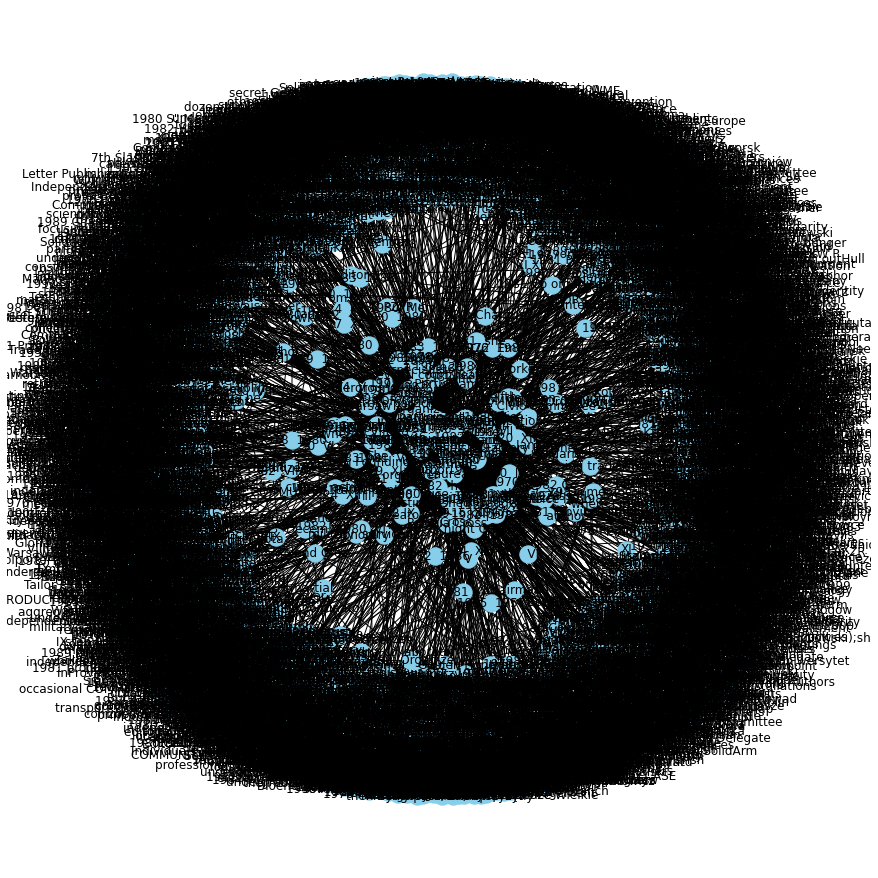

In [37]:
# create a directed-graph from a dataframe
G=nx.from_pandas_edgelist(kg_df, "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())
                          

plt.figure(figsize=(12,12))
pos = nx.spring_layout(G)
nx.draw(G, with_labels=True, node_color='skyblue', edge_cmap=plt.cm.Blues, pos = pos)
plt.show()

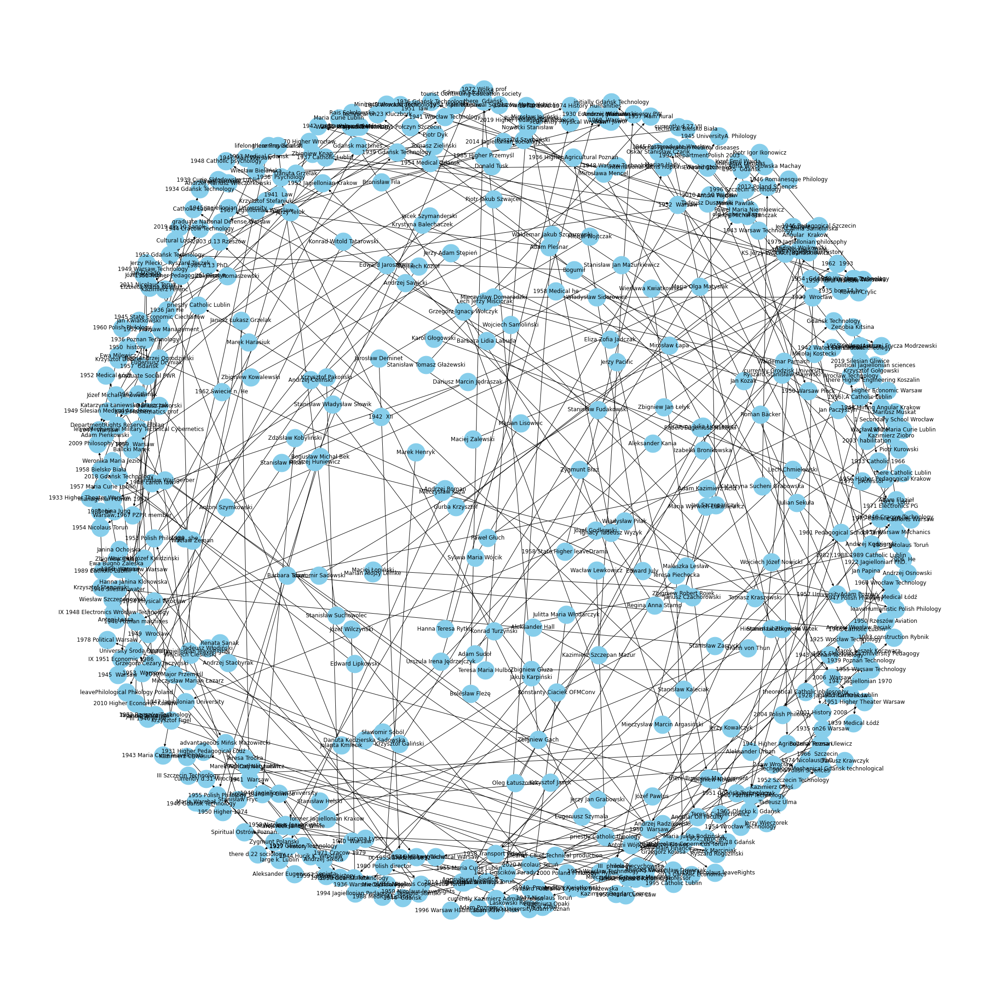

In [85]:
G=nx.from_pandas_edgelist(kg_df[kg_df['edge']=="graduate of"], "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())

plt.figure(figsize=(30,30))
pos = nx.spring_layout(G, k = 0.5)
nx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos = pos)
plt.show()

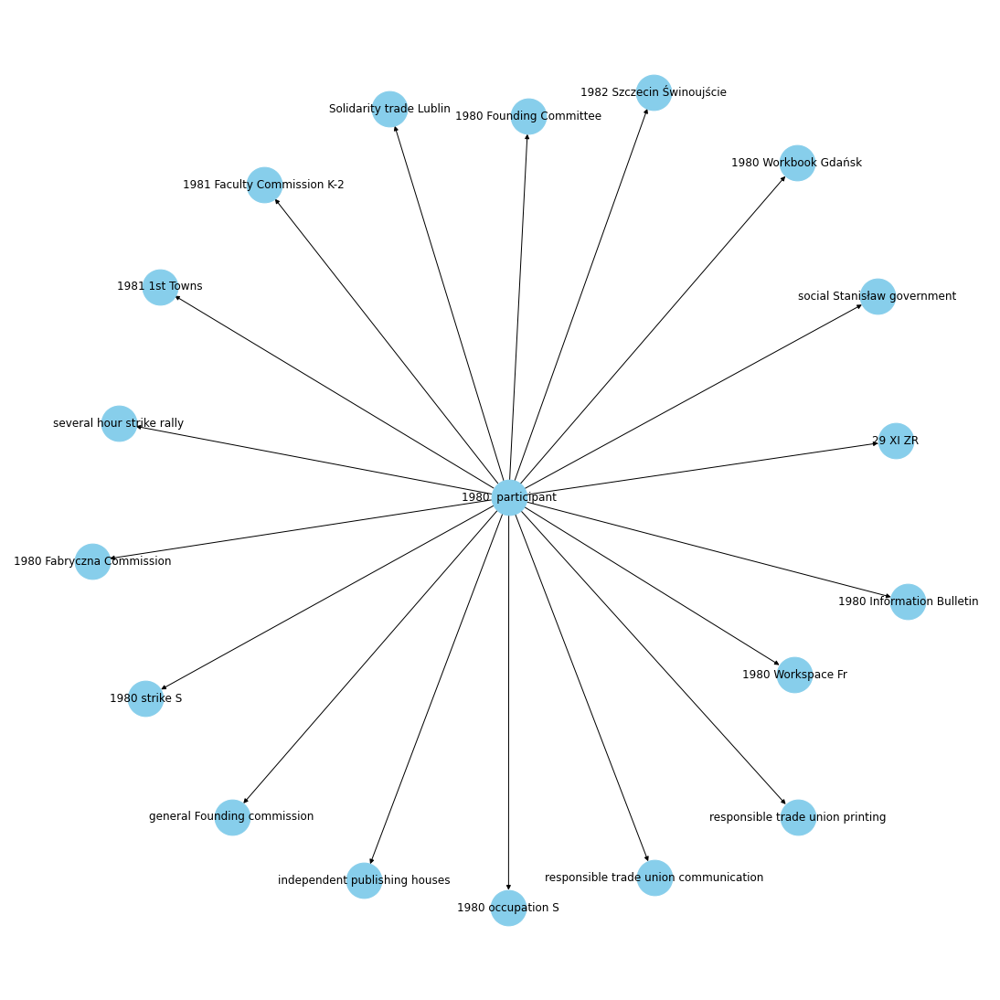

In [78]:
G=nx.from_pandas_edgelist(kg_df[kg_df['source']=="1980  participant"], "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())

plt.figure(figsize=(15,15))
pos = nx.spring_layout(G, k = 0.5)
nx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos = pos)
plt.show()

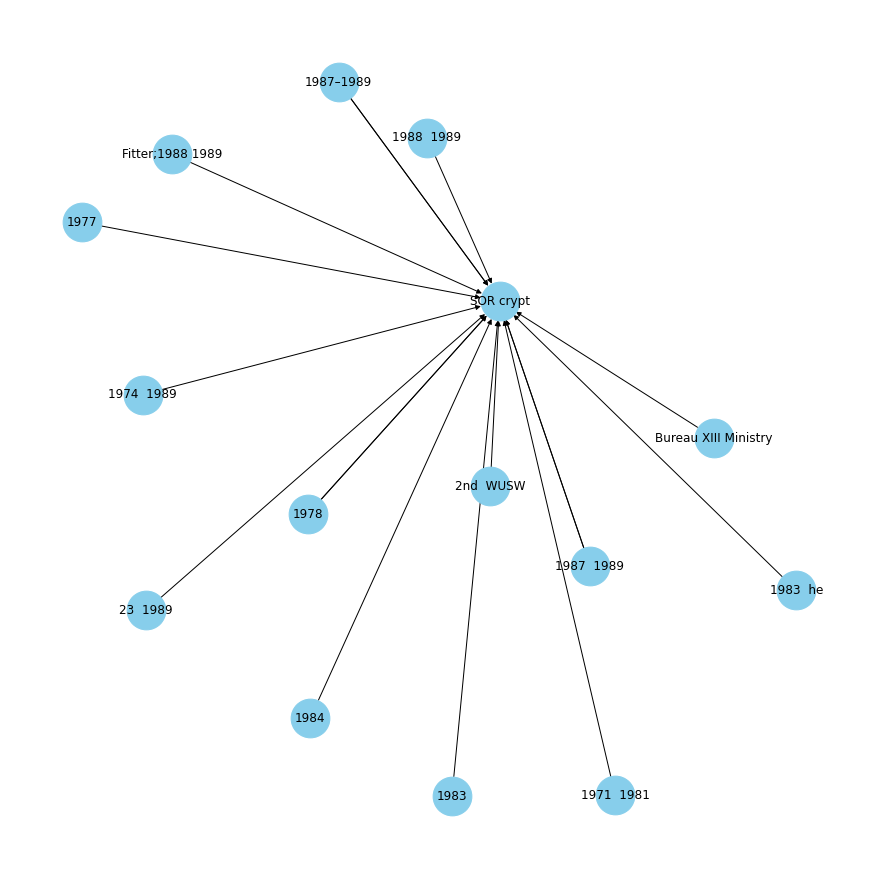

In [82]:
G=nx.from_pandas_edgelist(kg_df[kg_df['target']=="SOR crypt"], "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())

plt.figure(figsize=(12,12))
pos = nx.spring_layout(G, k = 0.5)
nx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos = pos)
plt.show()